# import


In [1]:
# Standard library imports
import os
import ast
import re
import glob


# Third-party imports
import json 
import pandas as pd
import numpy as np
import torch
from tqdm import tqdm
from transformers import AutoTokenizer, AutoModel, AutoModelForCausalLM


# Local application/library imports
from Prompts.prompts import GRAPH_EXTRACTION_PROMPT
from typing import Tuple, List, Dict, Optional

In [2]:
import logging

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Loading

#### test

In [4]:
#path= "/Users/mogen/AdvancedRag/Zwischenspeicher/Extract/_5.parquet"

df= pd.read_parquet(path)
df.head()

,chunk_id,text,doc_id,filename,embedding,cluster,entities,relationships,error
0,797881fa-ea22-4e1a-9715-eaf70567ad28,A flatline is an electrical time sequence meas...,f818c2f5-7334-4ec0-8c1b-fb40dd8378ba,Flatline.txt,"[1.7023330926895142, 1.2960034608840942, -4.02...",-1,"[{'entity_name': 'ECG/EKG', 'entity_type': 'OR...","[{'source_entity': 'ECG/EKG', 'target_entity':...",None
1,b398739f-1f72-48d8-9c83-e1038b336749,.\nCauses:\nECG/EKG flatline or asystole occur...,f818c2f5-7334-4ec0-8c1b-fb40dd8378ba,Flatline.txt,"[1.7127354145050049, 1.3935502767562866, -3.92...",-1,"[{'entity_name': 'ECG/EKG FLATLINE', 'entity_t...","[{'source_entity': 'ECG/EKG FLATLINE', 'target...",None
2,a70b2e84-3eaa-4e3f-a52d-3eb4aa593636,heart's electrical activity and will show a f...,f818c2f5-7334-4ec0-8c1b-fb40dd8378ba,Flatline.txt,"[1.7030203342437744, 1.1985427141189575, -3.74...",-1,"[{'entity_name': 'EEG', 'entity_type': 'ORGANI...","[{'source_entity': 'EEG', 'target_entity': 'CA...",None
3,442a6d7d-e8db-4cd3-b52d-4edddcf1a27c,line (asystole).\nDiagnosis:\nBrain death is ...,f818c2f5-7334-4ec0-8c1b-fb40dd8378ba,Flatline.txt,"[1.6501929759979248, 0.9699065685272217, -3.52...",-1,[{'entity_name': 'NEW ENGLAND JOURNAL OF MEDIC...,[{'source_entity': 'NEW ENGLAND JOURNAL OF MED...,None
4,336aae20-daf2-4e3b-b3f6-426abc3763a0,brain death happens after cardiac arrest or c...,f818c2f5-7334-4ec0-8c1b-fb40dd8378ba,Flatline.txt,"[2.0306668281555176, 0.997177004814148, -4.329...",-1,"[{'entity_name': 'CARDIAC ARREST', 'entity_typ...","[{'source_entity': 'CARDIAC FLATLINE', 'target...",None


In [5]:
# Replace with your actual directory path
parquet_dir = '/Users/mogen/AdvancedRag/Zwischenspeicher/Extract'
# Create a list of all Parquet file paths in the directory
parquet_files = glob.glob(os.path.join(parquet_dir, '*.parquet'))

# Optional: Print the list to verify
print(f"Found {len(parquet_files)} Parquet files.")


Found 63 Parquet files.


In [6]:
# Read all Parquet files into a list of DataFrames
dataframes = [pd.read_parquet(file, engine='pyarrow') for file in parquet_files]

# Concatenate all DataFrames into a single DataFrame
combined_df = pd.concat(dataframes, ignore_index=True)

# Optional: Print the shape to verify
print(f"Combined DataFrame shape: {combined_df.shape}")


Combined DataFrame shape: (13293, 9)


# Get sampled

**Concatenate all DataFrames into a single DataFrame**
combined_df = pd.concat(dataframes, ignore_index=True)

**Optional: Print the shape to verify**
print(f"Combined DataFrame shape: {combined_df.shape}")

def clean_filename(filename):
    import re
    base = os.path.basename(filename)
    name_without_ext = os.path.splitext(base)[0]
    print(name_without_ext)  # Removes spaces and underscores
    return name_without_ext

combined_df['filename_clean'] = combined_df['filename'].apply(clean_filename)

**Optional: Normalize the case of the filenames to ensure case-insensitive matching**
filename_list_lower = [name.lower() for name in wikipedia_articles]
combined_df['filename_clean_lower'] = combined_df['filename_clean'].str.lower()

**Filter the DataFrame to include only rows where 'filename_clean' matches the filenames in the list**
filtered_df = combined_df[combined_df['filename_clean_lower'].isin(filename_list_lower)]

**If you want to drop the temporary 'filename_clean_lower' column**
filtered_df = filtered_df.drop(columns=['filename_clean_lower'])

**Reset index if desired**
filtered_df = filtered_df.reset_index(drop=True)

In [10]:
# load 
path ='/Users/mogen/AdvancedRag/Zwischenspeicher/Sample_from_extract/filtered_df_is_020.csv'

combined_df = pd.read_csv(path)
combined_df.head()
len(combined_df)

2865

# Transform

In [11]:
# Initialize dictionaries to store entities and relationships
entities_dict = {}
relationships_dict = {}

def normalize_entity_name(name):
    """Normalize entity names by uppercasing, removing extra spaces, and punctuation."""
    name = name.upper()
    name = re.sub(r'\s+', ' ', name).strip()
    name = re.sub(r'[^\w\s]', '', name)
    return name

# Function to process entities with chunk_id and doc_id
def process_entities(entities_str, chunk_id, doc_id):
    try:
        entities_list = ast.literal_eval(entities_str)
    except (ValueError, SyntaxError) as e:
        print(f"Error parsing entities string: {e}")
        return
    
    for entity in entities_list:
        try:
            name = normalize_entity_name(entity['entity_name'])
            entity_type = entity['entity_type']
            description = entity['entity_description']
            
            occurrence = {
                'chunk_id': chunk_id,
                'doc_id': doc_id,
                'entity_type': entity_type,
                'entity_description': description
            }
            
            if name in entities_dict:
                entities_dict[name].append(occurrence)
            else:
                entities_dict[name] = [occurrence]
        except KeyError as e:
            print(f"Missing key in entity: {e}")
            continue

# Function to process relationships with chunk_id and doc_id
def process_relationships(relationships_str, chunk_id, doc_id):
    try:
        relationships_list = ast.literal_eval(relationships_str)
    except (ValueError, SyntaxError) as e:
        print(f"Error parsing relationships string: {e}")
        return
    
    for relationship in relationships_list:
        try:
            source = normalize_entity_name(relationship['source_entity'])
            target = normalize_entity_name(relationship['target_entity'])
            description = relationship['relationship_description']
            strength_str = relationship['relationship_strength']
            
            # Extract numeric part of the strength
            strength_match = re.search(r'\d+', strength_str)
            if strength_match:
                strength = int(strength_match.group())
            else:
                # If no numeric value is found, skip this relationship
                continue
            
            # Ignore relationships with strength 0
            if strength == 0:
                continue
            
            occurrence = {
                'chunk_id': chunk_id,
                'doc_id': doc_id,
                'relationship_description': description,
                'relationship_strength': strength
            }
            
            # Create a key as a tuple of source and target
            key = (source, target)
            
            if key in relationships_dict:
                relationships_dict[key].append(occurrence)
            else:
                relationships_dict[key] = [occurrence]
        except KeyError as e:
            print(f"Missing key in relationship: {e}")
            continue

# Process each row in the dataframe
for index, row in combined_df.iterrows():
    chunk_id = row['chunk_id']
    doc_id = row['doc_id']
    
    # Process entities
    entities_str = row.get('entities', '[]')
    process_entities(entities_str, chunk_id, doc_id)
    
    # Process relationships
    relationships_str = row.get('relationships', '[]')
    process_relationships(relationships_str, chunk_id, doc_id)

# Now entities_dict and relationships_dict contain the combined information with chunk_id and doc_id



In [12]:
entities_dict

{'ALADDIN': [{'chunk_id': '17f7c1ae-c128-4a92-a0e5-ac7670bfaa7b',
   'doc_id': '9d8f19c3-2252-49b0-93d8-f96339172232',
   'entity_type': 'ORGANIZATION',
   'entity_description': 'A Middle-Eastern folk tale that is one of the best-known tales associated with One Thousand and One Nights'},
  {'chunk_id': '3a97253e-5fff-4ffb-aed3-5a23736961a2',
   'doc_id': '9d8f19c3-2252-49b0-93d8-f96339172232',
   'entity_type': 'PERSON',
   'entity_description': "Impoverished young ne'er-do-well in the story of The Thousand and One Nights"},
  {'chunk_id': '76a50849-d1a5-4501-b2e0-b88c024f5a2a',
   'doc_id': '9d8f19c3-2252-49b0-93d8-f96339172232',
   'entity_type': 'PERSON',
   'entity_description': 'The protagonist of the story who becomes rich and powerful with the help of a genie'},
  {'chunk_id': '9777b05d-ac2b-44dc-8d70-05a57153d88c',
   'doc_id': '9d8f19c3-2252-49b0-93d8-f96339172232',
   'entity_type': 'PERSON',
   'entity_description': 'The protagonist of the story who marries Roulbadour and be

In [13]:
relationships_dict

{('ALADDIN',
  'ONE THOUSAND AND ONE NIGHTS'): [{'chunk_id': '17f7c1ae-c128-4a92-a0e5-ac7670bfaa7b',
   'doc_id': '9d8f19c3-2252-49b0-93d8-f96339172232',
   'relationship_description': 'Aladdin is a popular story associated with One Thousand and One Nights, despite not being part of the original text; it was added by Antoine Galland based on a folk tale he heard from Hanna Diyab',
   'relationship_strength': 1}],
 ('ANTONIE GALLAND',
  'ALADDIN'): [{'chunk_id': '17f7c1ae-c128-4a92-a0e5-ac7670bfaa7b',
   'doc_id': '9d8f19c3-2252-49b0-93d8-f96339172232',
   'relationship_description': 'Antoine Galland incorporated Aladdin into his translation of One Thousand and One Nights',
   'relationship_strength': 1}],
 ('ANTONIE GALLAND',
  'HANNA DIYAB'): [{'chunk_id': '17f7c1ae-c128-4a92-a0e5-ac7670bfaa7b',
   'doc_id': '9d8f19c3-2252-49b0-93d8-f96339172232',
   'relationship_description': 'Antoine Galland met with Hanna Diyab to hear the folk tale that became Aladdin',
   'relationship_strength'

In [14]:
# Accessing Entities
for entity_name, occurrences in entities_dict.items():
    print(f"Entity: {entity_name}")
    for occ in occurrences:
        print(f"  Chunk ID: {occ['chunk_id']}, Doc ID: {occ['doc_id']}")
        print(f"    Type: {occ['entity_type']}")
        print(f"    Description: {occ['entity_description']}")
        break
    break

Entity: ALADDIN
  Chunk ID: 17f7c1ae-c128-4a92-a0e5-ac7670bfaa7b, Doc ID: 9d8f19c3-2252-49b0-93d8-f96339172232
    Type: ORGANIZATION
    Description: A Middle-Eastern folk tale that is one of the best-known tales associated with One Thousand and One Nights


In [15]:
# Accessing Relationships
for (source, target), occurrences in relationships_dict.items():
    print(f"Relationship: {source} -> {target}")
    for occ in occurrences:
        print(f"  Chunk ID: {occ['chunk_id']}, Doc ID: {occ['doc_id']}")
        print(f"    Description: {occ['relationship_description']}")
        print(f"    Strength: {occ['relationship_strength']}")
        break
    break

Relationship: ALADDIN -> ONE THOUSAND AND ONE NIGHTS
  Chunk ID: 17f7c1ae-c128-4a92-a0e5-ac7670bfaa7b, Doc ID: 9d8f19c3-2252-49b0-93d8-f96339172232
    Description: Aladdin is a popular story associated with One Thousand and One Nights, despite not being part of the original text; it was added by Antoine Galland based on a folk tale he heard from Hanna Diyab
    Strength: 1


The Data is cleaned and transformed. 
And stored in two dict. 

**Entity_dict:**


Entity Name: VITTORIO GASSMAN

Entity Type: PERSON

Descriptions: ['Actor in Les 1001 Nuits']


**Relationships_dict:**

Source: EROTIC ADVENTURES OF ALADDIN X, Target: ADVENTURES OF ALADDIN (2019)

Descriptions: ['Both are films, but Erotic Adventures of Aladdin X is pornographic while Adventures of Aladdin (2019) is a mockbuster produced by The Asylum']

Strengths: [1]

# Coreference 

In [17]:
import difflib
import matplotlib.pyplot as plt
from tqdm import tqdm  # Import tqdm for progress bars

def find_best_match(name, entity_names, cutoff=0.90):
    matches = difflib.get_close_matches(name, entity_names, n=1, cutoff=cutoff)
    return matches[0] if matches else name

# Step 1: Create a Mapping from Original Names to Merged Names
entity_names = list(entities_dict.keys())
name_mapping = {}

# Initialize tqdm for the first loop
for name in tqdm(entity_names, desc="Creating Name Mapping", unit="entity"):
    merged_name = find_best_match(name, entity_names)
    name_mapping[name] = merged_name

# Step 2: Update relationships_dict with Merged Names
updated_relationships_dict = {}

# Initialize tqdm for the second loop
for (source, target), occurrences in tqdm(relationships_dict.items(), desc="Updating Relationships", unit="relationship"):
    # Get the merged names
    merged_source = name_mapping.get(source, source)
    merged_target = name_mapping.get(target, target)
    
    # Create the new key
    new_key = (merged_source, merged_target)
    
    # Initialize the list if the key doesn't exist
    if new_key not in updated_relationships_dict:
        updated_relationships_dict[new_key] = []
    
    # Append all occurrences to the new key
    updated_relationships_dict[new_key].extend(occurrences)

relationships_dict = updated_relationships_dict

# Optional: Remove self-relationships or handle duplicates as needed


Updating Relationships: 100%|██████████| 12783/12783 [00:00<00:00, 1457584.49relationship/s]


### Visualisierung und Datenqualität 

Processing relationships:   0%|          | 0/12783 [00:00<?, ?it/s]

Processing relationships: 100%|██████████| 12783/12783 [00:00<00:00, 1141660.20it/s]


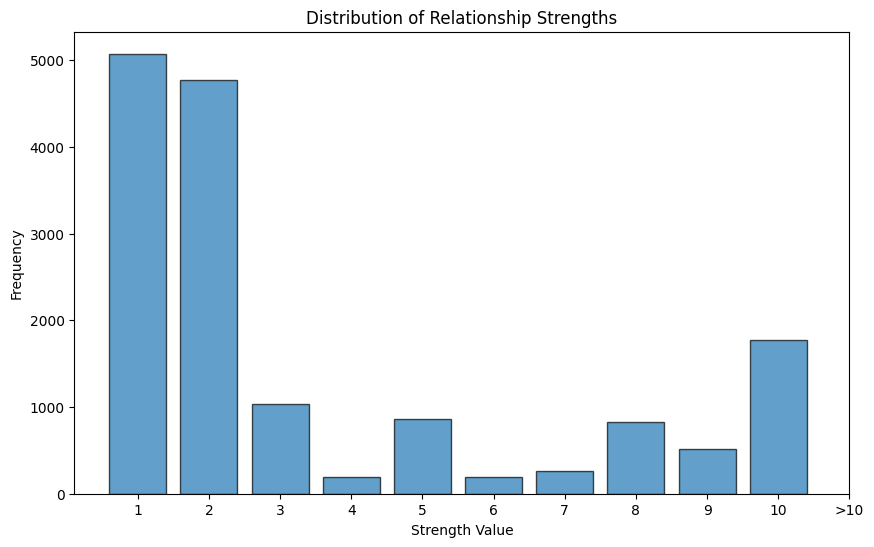

Processing entities: 100%|██████████| 13430/13430 [00:00<00:00, 3950729.61it/s]

Number of entities with more than one description: 3869


In [21]:
import matplotlib.pyplot as plt
from tqdm import tqdm

# Step 3: Extract All Strength Values from relationships_dict
all_strengths = []

for relationship_info in tqdm(relationships_dict.values(), desc="Processing relationships"):
    strengths = [occ['relationship_strength'] for occ in relationship_info]
    all_strengths.extend(strengths)

# Adjust strengths: map all values greater than 10 to 11
adjusted_strengths = [strength if strength <= 10 else 11 for strength in all_strengths]

# Define custom bins: bins for 1-10 and one bin for values greater than 10
bins = list(range(1, 12))  # This creates bins [1, 2, ..., 11]

# Plot histogram of strength values
plt.figure(figsize=(10, 6))
plt.hist(
    adjusted_strengths,
    bins=bins,
    edgecolor='black',
    alpha=0.7,
    align='left',
    rwidth=0.8
)

# Set x-ticks and labels
xtick_positions = range(1, 12)
xtick_labels = list(range(1, 11)) + ['>10']
plt.xticks(xtick_positions, xtick_labels)

plt.title('Distribution of Relationship Strengths')
plt.xlabel('Strength Value')
plt.ylabel('Frequency')
plt.show()

# Count entities with more than one description
entities_with_multiple_descriptions = {
    name: descriptions for name, descriptions in tqdm(
        entities_dict.items(), desc="Processing entities"
    ) if len(descriptions) > 1
}

number_of_entities_with_multiple_descriptions = len(entities_with_multiple_descriptions)

print(f"Number of entities with more than one description: {number_of_entities_with_multiple_descriptions}")


In [ ]:
''''from fuzzywuzzy import fuzz
from fuzzywuzzy import process

Install fuzzywuzzy if not already installed
!pip install fuzzywuzzy[speedup]

entity_names = list(entities_dict.keys())

Set a threshold for similarity
threshold = 90  # Adjust as needed (0-100 scale)

Find similar entity names
duplicates = {}
for i, name in enumerate(entity_names):
    for name_to_compare in entity_names[i+1:]:
        similarity = fuzz.token_sort_ratio(name, name_to_compare)
        if similarity >= threshold:
            duplicates.setdefault(name, []).append(name_to_compare)

print("Potential duplicate entities based on similarity:")
for name, similar_names in duplicates.items():
    print(f"Entity Name: {name}")
    print(f"Similar Names: {similar_names}")
''''

# works good but istnt suitable for rag expoeriment bc GraphRag also only achieves this indirect 

## Prompt Prep Final Summaries 

In [22]:
SUMMARIZE_PROMPT = """
You are a helpful assistant responsible for generating a comprehensive summary of the data provided below.
Given one or two entities, and a list of descriptions, all related to the same entity or group of entities.
Please concatenate all of these into a single, comprehensive description. Make sure to include information collected from all the descriptions.
If the provided descriptions are contradictory, please resolve the contradictions and provide a single, coherent summary.
Make sure it is written in third person, and include the entity names so we have the full context.

#######
-Data-
Entities: {entity_name}
Description List: {description_list}
#######
Output:
"""

In [23]:
!pip show openai

Name: openai
Version: 1.45.0
Summary: The official Python library for the openai API
Home-page: 
Author: 
Author-email: OpenAI <support@openai.com>
License: 
Location: /Users/mogen/AdvancedRag/ARag/lib/python3.10/site-packages
Requires: anyio, distro, httpx, jiter, pydantic, sniffio, tqdm, typing-extensions
Required-by: 


In [24]:
from openai import OpenAI
import logging
from typing import Optional, List, Dict

logger = logging.getLogger(__name__)

def call_lmstudio(
    prompt: str,
    system_message: str = "You are a helpful assistant responsible for generating a comprehensive summary of the data provided below.",
    max_tokens: int = 8152,
    temperature: float = 0.01,
    top_p: float = 0.95,
    model: str = "MaziyarPanahi/Mistral-7B-Instruct-v0.3-GGUF"
) -> Optional[str]:
    """
    Call the LLM using the LMStudio API with the given prompt and return the response.

    Args:
    prompt (str): The user prompt to send to the LLM.
    system_message (str): The system message to set the context for the LLM.
    max_tokens (int): The maximum number of tokens in the generated response.
    temperature (float): Controls randomness in generation. Lower is more deterministic.
    top_p (float): Controls diversity of generation.
    model (str): The model to use for generation.

    Returns:
    Optional[str]: The generated response from the LLM, or None if an error occurred.
    """
    try:
        logger.info(f"Sending prompt to LMStudio API: {prompt[:100]}...")  # Log first 100 chars of prompt

        # Initialize the OpenAI client with LMStudio endpoint
        client = OpenAI(base_url="http://localhost:1234/v1", api_key="lm-studio")

        # Prepare the messages
        messages: List[Dict[str, str]] = [
            {"role": "system", "content": system_message},
            {"role": "user", "content": prompt}
        ]

        # Make the API call
        completion = client.chat.completions.create(
            model=model,
            messages=messages,
            temperature=temperature,
            top_p=top_p,
            max_tokens=max_tokens,
        )

        # Extract the generated text from the response
        generated_text = completion.choices[0].message.content

        logger.info(f"Received response from LMStudio API: {generated_text[:100]}...")  # Log first 100 chars of response

        return generated_text

    except Exception as e:
        error_msg = f"Error during LMStudio API call: {str(e)}"
        logger.error(error_msg)
        print(error_msg)
        return None

In [25]:
def generate_summaries(entities_dict, prompt_template):
    """
    Generates summaries for each entity and appends the summary to the entity's entry in the dictionary.
    
    Parameters:
    - entities_dict (dict): Dictionary containing entities and their details.
    - prompt_template (str): Template string with placeholders for formatting.
    
    Returns:
    - None: The function modifies entities_dict in place.
    """
    for entity_name, occurrences in entities_dict.items():
        if not occurrences:
            print(f"No occurrences found for entity: {entity_name}")
            continue
        
        
        
        # Build the description list with chunk_id and doc_id
        description_list = "\n".join([
            f"- Description: {occ.get('entity_description', 'No description provided.')}\n  Chunk ID: {occ.get('chunk_id', 'N/A')}\n  Document ID: {occ.get('doc_id', 'N/A')}"
            for occ in occurrences
        ])
        
        # Format the prompt
        prompt = prompt_template.format(
            entity_name=entity_name,
            description_list=description_list
        )
        
        print(f"Generating summary for entity: {entity_name}")
        
        # Call the LLM to get the summary
        summary = call_lmstudio(prompt)
        
        # Attach the summary to the entity's entry
        # We'll add a new key 'summary' to each entity's list
        entities_dict[entity_name].append({'summary': summary})
        
        print(f"Summary for {entity_name} generated successfully.\n")

In [26]:
generate_summaries(entities_dict, SUMMARIZE_PROMPT)




INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Generating summary for entity: ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin is the main character in the Middle-Eastern folk tale that is one of the best-known tales a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN generated successfully.

Generating summary for entity: HANNA DIYAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hanna Diyab, a Maronite storyteller from Aleppo, is known for his significant contributions to the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANNA DIYAB generated successfully.

Generating summary for entity: GALLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GALLAND, a historical figure, is recognized for his work in transcribing the popular tale "Aladdin"...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALLAND generated successfully.

Generating summary for entity: PAUL LUCAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Lucas, a celebrated French traveler, is known for his travels with Hanna Diyab....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL LUCAS generated successfully.

Generating summary for entity: ALEPPPO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aleppo, a city located in Syria, is the birthplace of Hanna Diyab....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEPPPO generated successfully.

Generating summary for entity: PARIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paris, a city in France, serves as the location for various significant events and entities. It is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARIS generated successfully.

Generating summary for entity: MARCH 25 1709


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  March 25, 1709 is a significant date in history, marking the meeting between Galland and Hanna Diya...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 25 1709 generated successfully.

Generating summary for entity: DOM DENIS CHAVIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DOM Denis Chavis, a Syrian Christian priest residing in Paris, is recognized for his authorship of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOM DENIS CHAVIS generated successfully.

Generating summary for entity: MIKHAIL SABBAGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mikhail Sabbagh is an author known for writing a manuscript in Baghdad during the year 1703. This m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIKHAIL SABBAGH generated successfully.

Generating summary for entity: BIBLIOTHEQUE NATIONALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bibliothèque Nationale, a renowned organization, is known for its acquisition of Mikhail Sabbag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLIOTHEQUE NATIONALE generated successfully.

Generating summary for entity: RUTH B BOTTIGHEIMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ruth B Bottigheimer is a scholar who has proposed that Hanna Diyab should be recognized as the orig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTH B BOTTIGHEIMER generated successfully.

Generating summary for entity: PAOLO LEMOS HORTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paolo Lemos Horta is a scholar who has proposed that Hanna Diyab should be recognized as the origin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAOLO LEMOS HORTA generated successfully.

Generating summary for entity: BIBLIOTHÈQUE NATIONALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bibliothèque Nationale, a renowned institution, is known for its extensive collection of litera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLIOTHÈQUE NATIONALE generated successfully.

Generating summary for entity: MUHSIN MAHDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muhsin Mahdi is a notable figure known for his significant contribution to the field of literature....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHSIN MAHDI generated successfully.

Generating summary for entity: ANCIENT CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ancient China serves as the setting for a captivating story, where the narrative unfolds. This era ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT CHINA generated successfully.

Generating summary for entity: MUSTAPHA THE TAILOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mustapha the Tailor, father of Aladdin in the story of The Thousand and One Nights, is a character ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSTAPHA THE TAILOR generated successfully.

Generating summary for entity: SORCERER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SORCERER is a deceitful character who attempts to trick Aladdin and double-cross him by convinc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SORCERER generated successfully.

Generating summary for entity: MAGHREB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maghreb is a region in North Africa that primarily includes Morocco, Algeria, and Tunisia. It is al...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGHREB generated successfully.

Generating summary for entity: BOOBYTRAPPED MAGIC CAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BOOBYTRAPPED MAGIC CAVE is a location where Aladdin retrieves the magic lamp. This cave, presum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOOBYTRAPPED MAGIC CAVE generated successfully.

Generating summary for entity: MAGIC RING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Magic Ring is a mystical artifact that was lent to Aladdin by a sorcerer. This ring, which is p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGIC RING generated successfully.

Generating summary for entity: RUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RUB, in this context, is not associated with any action performed by Aladdin to summon a genie ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUB generated successfully.

Generating summary for entity: GENIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GENIE is a supernatural being, summoned by Aladdin from the lamp. This entity is known for its magi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENIE generated successfully.

Generating summary for entity: PRINCESS BADROULBADOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Princess Badroulbadour is the sultan's daughter who marries Aladdin in a well-known tale....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCESS BADROULBADOUR generated successfully.

Generating summary for entity: MAGIC CAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAGIC CAVE is a booby-trapped cave where Aladdin, a fictional character, finds himself trapped ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGIC CAVE generated successfully.

Generating summary for entity: PALACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Palace, as described in various sources, is a significant location with multiple associations. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALACE generated successfully.

Generating summary for entity: ROULBADOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roulbadour is a princess, known as the Sultan's daughter. She found herself in a precarious situati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROULBADOUR generated successfully.

Generating summary for entity: THE GENIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Genie is a magical being who possesses extraordinary powers. Notably, he is known for construct...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GENIE generated successfully.

Generating summary for entity: THE SORCERER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sorcerer is a formidable antagonist who seeks to seize control of the palace and obtain the mag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SORCERER generated successfully.

Generating summary for entity: BADROULBADOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Badroulbadour is a significant character in the story of Aladdin, serving as his wife and being the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BADROULBADOUR generated successfully.

Generating summary for entity: GENIE OF THE LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Genie of the Lamp is a supernatural being, known for its significant role in assisting Aladdin....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENIE OF THE LAMP generated successfully.

Generating summary for entity: ALADDINS WARES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin's Wares, as mentioned in the text, are the central focus of the given data. This term refer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDINS WARES generated successfully.

Generating summary for entity: BUDDHISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buddhists, as mentioned in the document with ID 9d8f19c3-2252-49b0-93d8-f96339172232, are not expli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUDDHISTS generated successfully.

Generating summary for entity: DAOISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daoists, as mentioned in the provided document with Document ID: 9d8f19c3-2252-49b0-93d8-f963391722...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAOISTS generated successfully.

Generating summary for entity: CONFUCIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Confucians, as mentioned in the document with ID 9d8f19c3-2252-49b0-93d8-f96339172232, are not expl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFUCIANS generated successfully.

Generating summary for entity: MUSLIM GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Muslim groups referenced in the document include the Uyghurs, Hui people, and Tajiks. These eth...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSLIM GROUPS generated successfully.

Generating summary for entity: CHINESE HISTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chinese history is a subject of discussion, as evidenced in the text. This encompasses various aspe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE HISTORY generated successfully.

Generating summary for entity: UYGHURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Uyghurs are a Muslim ethnic group, as mentioned in the document with the ID 9d8f19c3-2252-49b0-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UYGHURS generated successfully.

Generating summary for entity: HUI PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hui people are a Muslim group, as mentioned in the text. This ethnicity is recognized and docum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUI PEOPLE generated successfully.

Generating summary for entity: TAJIKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tajiks are a Muslim ethnic group, as mentioned in the text. This designation refers to a specif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAJIKS generated successfully.

Generating summary for entity: ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arabic is a Semitic language primarily spoken in the Arab world, serving as the liturgical language...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC generated successfully.

Generating summary for entity: CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  China, a vast and influential country, is known for its rich history and significant contributions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINA generated successfully.

Generating summary for entity: TALE OF ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tale of Aladdin is a renowned and popular folk story, as documented in various sources. This ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TALE OF ALADDIN generated successfully.

Generating summary for entity: MAGICAL LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Magical Lamp is a unique and enigmatic artifact, renowned for its ability to grant wishes. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGICAL LAMP generated successfully.

Generating summary for entity: THE ONE THOUSAND AND ONE NIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The One Thousand and One Nights is a renowned collection of Middle Eastern folk tales, which includ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ONE THOUSAND AND ONE NIGHTS generated successfully.

Generating summary for entity: TON DEKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TON DEKER is a renowned scholar who has dedicated his research to locating variants of the Aladdin ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TON DEKER generated successfully.

Generating summary for entity: THEO MEDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theo Meder is a renowned scholar who has dedicated his research to locating variants of the Aladdin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEO MEDER generated successfully.

Generating summary for entity: INDIAN VARIANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indian Variant is a unique adaptation of the Aladdin story that has been collected among the Sa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIAN VARIANT generated successfully.

Generating summary for entity: PORPOISE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The porpoise is a subject that was the title of a book, "Porpoise," published in 1947 and released ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORPOISE generated successfully.

Generating summary for entity: ALADDIN MASTER OF THE LAMP 1992


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin Master of the Lamp, published in 1992, is an anthology that contains 43 original short stor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN MASTER OF THE LAMP 1992 generated successfully.

Generating summary for entity: DOCTOR WHO SHORT TRIPS THE GHOSTS OF CHRISTMAS 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Doctor Who Short Trips: The Ghosts of Christmas 2007 is an anthology collection in the Doctor Who s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOCTOR WHO SHORT TRIPS THE GHOSTS OF CHRISTMAS 2007 generated successfully.

Generating summary for entity: THE NOBILITY OF FAITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nobility of Faith is a fictional entity that appears in the short story titled "The Ghosts of C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NOBILITY OF FAITH generated successfully.

Generating summary for entity: MIKE RESNICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mike Resnick is a prolific science fiction author and editor, best known for his work on the anthol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIKE RESNICK generated successfully.

Generating summary for entity: MARTIN H GREENBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin H Greenberg is a prolific editor, best known for his work on the fantasy novel "Aladdin: Mas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN H GREENBERG generated successfully.

Generating summary for entity: SCROOGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SCrooge, contrary to the description of Aladdin as a brigand, is not associated with such criminal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCROOGE generated successfully.

Generating summary for entity: NEPHEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The nephews are participants in an expedition aimed at locating Aladdin's treasure, as detailed in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEPHEWS generated successfully.

Generating summary for entity: BEAGLE BOYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Beagle Boys are a group of Middle Eastern counterparts who have been encountered by the nephews...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEAGLE BOYS generated successfully.

Generating summary for entity: TREASURE OF ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treasure of Aladdin is a significant collection of valuable items, as it was the treasure that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREASURE OF ALADDIN generated successfully.

Generating summary for entity: CAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAVE is a significant location, renowned as the hiding place of Aladdin's treasure. This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAVE generated successfully.

Generating summary for entity: MAGIC PASSWORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAGIC PASSWORD is a crucial piece of information required to gain access to the cave that house...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGIC PASSWORD generated successfully.

Generating summary for entity: OPEN SESAME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OPEN SESAME is a magical password, known for its significance in the story of Ali Baba and the Fort...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPEN SESAME generated successfully.

Generating summary for entity: GREEN LANTERN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GREEN LANTERN is a comic book character that draws inspiration from the Aladdin myth. This fictiona...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEN LANTERN generated successfully.

Generating summary for entity: LANTERNSHAPED POWER SOURCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LANTERNSHAPED POWER SOURCE is a unique energy source that was discovered by the Green Lantern, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANTERNSHAPED POWER SOURCE generated successfully.

Generating summary for entity: POWER RING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Power Ring is a significant artifact that bestows the Green Lantern with extraordinary abilitie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POWER RING generated successfully.

Generating summary for entity: ELSEWORLDS SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ELSEWORLDS SERIES is a unique narrative that blends the Green Lantern mythos with the beloved t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELSEWORLDS SERIES generated successfully.

Generating summary for entity: GREEN LANTERN 1001 EMERALD NIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Green Lantern 1001 Emerald Nights is a unique story that combines elements from the Green Lantern m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEN LANTERN 1001 EMERALD NIGHTS generated successfully.

Generating summary for entity: MAGI THE LABYRINTH OF MAGIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAGI: THE LABYRINTH OF MAGIC is a Japanese manga series that centers around the main character, Ala...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGI THE LABYRINTH OF MAGIC generated successfully.

Generating summary for entity: ANIME TELEVISION SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ANIME TELEVISION SERIES in question is an adaptation of the popular manga series, Magi: The Lab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANIME TELEVISION SERIES generated successfully.

Generating summary for entity: KAORI ISHIHARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KAORI ISHIHARA is a Japanese voice actress who lends her voice to the character Aladdin in the anim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAORI ISHIHARA generated successfully.

Generating summary for entity: ERICA MENDEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERICA MENDEZ is a talented English voice actress who lends her voice to the character Aladdin in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERICA MENDEZ generated successfully.

Generating summary for entity: THEATRE ROYAL COVENT GARDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Theatre Royal Covent Garden, located in London, England, is a renowned venue with a rich histor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEATRE ROYAL COVENT GARDEN generated successfully.

Generating summary for entity: PANTOMIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pantomime is a theatrical performance that has been popular for over 200 years, with Aladdin being ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANTOMIME generated successfully.

Generating summary for entity: WIDOW TWANKEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Widow Twankey is a well-known pantomime character, originating from the traditional Aladdin pantomi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIDOW TWANKEY generated successfully.

Generating summary for entity: DISNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney is a renowned multinational entertainment company that has been instrumental in creating and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEY generated successfully.

Generating summary for entity: ALADDIN ANIMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Disney animation of Aladdin, a popular and beloved film, was released. This animated adaptation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN ANIMATION generated successfully.

Generating summary for entity: 20078 PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 20078 Production was a staging of Aladdin at the Birmingham Hippodrome in the 2007/2008 season....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20078 PRODUCTION generated successfully.

Generating summary for entity: JOHN BARROWMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Barrowman, a renowned actor and singer, is recognized for his role in the 2007/8 production of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BARROWMAN generated successfully.

Generating summary for entity: MULAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mulan, a renowned character from the animated film of the same name, had her songs incorporated int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MULAN generated successfully.

Generating summary for entity: 1906 PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1906 Production refers to the musical comedy "The New Aladdin," which was produced in that year...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1906 PRODUCTION generated successfully.

Generating summary for entity: ADAM OEHLENSCHLAGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adam Oehlenschläger, a notable figure in literature, is recognized for penning the verse drama Alad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAM OEHLENSCHLAGER generated successfully.

Generating summary for entity: CARL NIELSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Nielsen, a renowned Danish composer, is recognized for his contribution to the world of music....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL NIELSEN generated successfully.

Generating summary for entity: FERUCCIO BUSONI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ferruccio Busoni, a notable figure in the world of music, is recognized for incorporating verses fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERUCCIO BUSONI generated successfully.

Generating summary for entity: 1958 MUSICAL COMEDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1958 Musical Comedy, titled Aladdin, was a television adaptation of the popular folktale. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1958 MUSICAL COMEDY generated successfully.

Generating summary for entity: S J PERELMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  S.J. Perelman, a renowned writer, is known for penning the script for the 1958 musical comedy adapt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for S J PERELMAN generated successfully.

Generating summary for entity: COLE PORTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cole Porter, a renowned composer and lyricist, was responsible for creating the music and lyrics fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLE PORTER generated successfully.

Generating summary for entity: BOB MONKHOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bob Monkhouse, a versatile entertainer, is recognized for his role as Aladdin in the London stage p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOB MONKHOUSE generated successfully.

Generating summary for entity: PRINCE STREET PLAYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prince Street Players is a company that produced a version of the popular fairytale Aladdin. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCE STREET PLAYERS generated successfully.

Generating summary for entity: BROADWAY JUNIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Broadway Junior, a company, released a children's musical based on the music and screenplay of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROADWAY JUNIOR generated successfully.

Generating summary for entity: COLISEUM THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Coliseum Theatre is a renowned venue that has hosted various performances over the years. Notab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLISEUM THEATRE generated successfully.

Generating summary for entity: JIM EILER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jim Eiler is a prolific writer, known for his work in various creative fields. He has penned the bo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIM EILER generated successfully.

Generating summary for entity: JEANNE BARGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeanne Bargy is a music writer, known for her work on the Prince Street Players' version of Aladdin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEANNE BARGY generated successfully.

Generating summary for entity: DISNEY ANIMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney Animation, as the producer, was responsible for creating the original animated film of Aladd...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEY ANIMATION generated successfully.

Generating summary for entity: ALADDIN JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin JR is a children's musical adaptation of the beloved Disney animation, Aladdin. This produc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN JR generated successfully.

Generating summary for entity: DISNEY CALIFORNIA ADVENTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney California Adventure, a popular theme park located in Anaheim, California, was the venue for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEY CALIFORNIA ADVENTURE generated successfully.

Generating summary for entity: THE DISNEYS ALADDIN A MUSICAL SPECTACULAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Disneys Aladdin A Musical Spectacular is a live stage show that was previously presented at Dis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DISNEYS ALADDIN A MUSICAL SPECTACULAR generated successfully.

Generating summary for entity: STARKID PRODUCTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Starkid Productions is a company renowned for creating the musical Twisted, a humorous and entertai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STARKID PRODUCTIONS generated successfully.

Generating summary for entity: TWISTED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Twisted is a musical parody that reimagines the story of the 1992 Disney film Aladdin, focusing on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWISTED generated successfully.

Generating summary for entity: DISNEY THEATRICAL PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney Theatrical Productions is a company that has been responsible for the theatrical production ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEY THEATRICAL PRODUCTION generated successfully.

Generating summary for entity: THE ADVENTURES OF PRINCE ACHMED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Adventures of Prince Achmed is the earliest surviving animated feature film, which uniquely com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ADVENTURES OF PRINCE ACHMED generated successfully.

Generating summary for entity: PRINCESS ACHMED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Princess Achmed is a significant character in the narrative, being the sister of Prince Achmed. She...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCESS ACHMED generated successfully.

Generating summary for entity: ALADDINS INTENDED WIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin's intended wife is a character from the animated film The Adventures of Prince Achmed. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDINS INTENDED WIFE generated successfully.

Generating summary for entity: PRINCESS PARI BANOU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Princess Pari Banou, also known as Aladdin's intended wife, is a significant character from the ani...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCESS PARI BANOU generated successfully.

Generating summary for entity: WITCH OF THE FIERY MOUNTAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Witch of the Fiery Mountain is a character who plays a significant role in assisting both Aladd...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITCH OF THE FIERY MOUNTAIN generated successfully.

Generating summary for entity: A THOUSAND AND ONE NIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Thousand and One Nights is a multifaceted entity that has been adapted into various forms of medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A THOUSAND AND ONE NIGHTS generated successfully.

Generating summary for entity: FILM JEAN IMAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Film Jean Image is a French animation studio that produced the animated feature Aladdin and His Mag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FILM JEAN IMAGE generated successfully.

Generating summary for entity: ALADDIN AND HIS MAGIC LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin and his Magic Lamp are characters from a 1970 French animated feature film, which presents ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND HIS MAGIC LAMP generated successfully.

Generating summary for entity: ALADDIN AND HIS WONDERFUL LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin and his Wonderful Lamp is a character from the Japanese short anime film produced by Toei A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND HIS WONDERFUL LAMP generated successfully.

Generating summary for entity: ALADDIN AND THE MAGIC LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin and the Magic Lamp is a story that has been adapted into various versions. One of these ada...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND THE MAGIC LAMP generated successfully.

Generating summary for entity: ALADDIN AND HIS MAGIC LAMP 1970


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The animated feature film titled "Aladdin and His Magic Lamp," produced by Film Jean Image, was rel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND HIS MAGIC LAMP 1970 generated successfully.

Generating summary for entity: ALADDIN AND HIS WONDERFUL LAMP 1975


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALADDIN AND HIS WONDERFUL LAMP, a Japanese short anime film produced by Toei Animation in 1975, is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND HIS WONDERFUL LAMP 1975 generated successfully.

Generating summary for entity: SON OF ALAADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Son of Aladdin is an Indian 3D-animated fantasy-adventure film, produced by Pentamedia Graphics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SON OF ALAADDIN generated successfully.

Generating summary for entity: WONDERFUL LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wonderful Lamp is a magical object, central to the narrative of Aladdin. This enchanted artifac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WONDERFUL LAMP generated successfully.

Generating summary for entity: 1938 ANIMATED FILM HAVE YOU GOT ANY CASTLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1938 animated film "Have You Got Any Castles" features a scene where Aladdin makes a brief appe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1938 ANIMATED FILM HAVE YOU GOT ANY CASTLES generated successfully.

Generating summary for entity: 1939 POPEYE THE SAILOR CARTOON ALADDIN AND HIS WONDERFUL LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1939 cartoon, titled "Popeye the Sailor," also includes a storyline featuring Aladdin and his m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1939 POPEYE THE SAILOR CARTOON ALADDIN AND HIS WONDERFUL LAMP generated successfully.

Generating summary for entity: 1942 ANIMATED FILM FONEY FABLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1942 animated film Foney Fables features Aladdin making a brief appearance, where he is seen ru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1942 ANIMATED FILM FONEY FABLES generated successfully.

Generating summary for entity: 1959 ANIMATED FILM 1001 ARABIAN NIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1959 Animated Film titled "1001 Arabian Nights" is a production by UPA (United Productions of A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1959 ANIMATED FILM 1001 ARABIAN NIGHTS generated successfully.

Generating summary for entity: DUCKTAILES THE MOVIE TREASURE OF THE LOST LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "DUCKTAILES THE MOVIE TREASURE OF THE LOST LAMP is a film that draws heavy inspiration from Disney'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUCKTAILES THE MOVIE TREASURE OF THE LOST LAMP generated successfully.

Generating summary for entity: 1992 ANIMATED FEATURE ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1992 animated feature Aladdin, produced by Walt Disney Feature Animation, is currently the most...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1992 ANIMATED FEATURE ALADDIN generated successfully.

Generating summary for entity: GOODTIMES HOME VIDEO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GoodTimes Home Video, a media company, released the popular animated film Aladdin on April 27, 1992...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOODTIMES HOME VIDEO generated successfully.

Generating summary for entity: WALT DISNEY FEATURE ANIMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walt Disney Feature Animation, a renowned animation studio, is known for producing the 1992 animate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALT DISNEY FEATURE ANIMATION generated successfully.

Generating summary for entity: RICHARD HURWITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Hurwitz, a notable figure, is recognized for his contributions in the entertainment industr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD HURWITZ generated successfully.

Generating summary for entity: JOHN ARRIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Arrias is a music composer who co-composed the song "Rub the Lamp" for the Disney animated fil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN ARRIAS generated successfully.

Generating summary for entity: THE THIEF OF BAGDAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Thief of Bagdad is a 1940 film that serves as the inspiration for the setting of the 1992 anima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE THIEF OF BAGDAD generated successfully.

Generating summary for entity: AGRABAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agrabah is a fictional Arabian city that serves as the setting for the 1992 film Aladdin and variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRABAH generated successfully.

Generating summary for entity: ABU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABU is a fictional character, inspired by the character from the 1940 film The Thief of Bagdad. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABU generated successfully.

Generating summary for entity: SULTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sultan is a fictional ruler in the city of Agrabah, which serves as the setting for the animated fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SULTAN generated successfully.

Generating summary for entity: RETURN OF JAFAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Return of Jafar is a direct-to-video sequel to the 1992 Walt Disney movie Aladdin, released in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RETURN OF JAFAR generated successfully.

Generating summary for entity: ALADDIN AND THE KING OF THIEVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin and the King of Thieves is a direct-to-video sequel to the 1992 Walt Disney animated film, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND THE KING OF THIEVES generated successfully.

Generating summary for entity: ALADDIN AND THE WONDERFUL LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Aladdin and the Wonderful Lamp is a film adaptation of the classic Aladdin story, originally relea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND THE WONDERFUL LAMP generated successfully.

Generating summary for entity: ARABIAN NIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabian Nights is a collection of stories that has been adapted into various forms, including t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIAN NIGHTS generated successfully.

Generating summary for entity: ALADDIN AND HIS LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin and his lamp are characters from a 1952 fantasy adventure film. In this movie, the roles of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND HIS LAMP generated successfully.

Generating summary for entity: THE WONDERS OF ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wonders of Aladdin is a fantasy adventure film that has been adapted and presented in two diffe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WONDERS OF ALADDIN generated successfully.

Generating summary for entity: JOHNNY SANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johnny Sands is an actor who is known for portraying the character Aladdin in the production The Wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNNY SANDS generated successfully.

Generating summary for entity: PATRICIA MEDINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patricia Medina is an actress who gained recognition for her role as Princess Jasmine in the produc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATRICIA MEDINA generated successfully.

Generating summary for entity: 1952


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1952", is a year that holds significance in the realm of cinema. Specif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1952 generated successfully.

Generating summary for entity: THE 1001 NIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1001 Nights is a collection of Middle Eastern folk tales, but in this context, it also refers t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE 1001 NIGHTS generated successfully.

Generating summary for entity: DONALD OCONNOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald O'Connor, a versatile actor, is best known for his portrayal of Aladdin in the stage product...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD OCONNOR generated successfully.

Generating summary for entity: MARIO GIROTTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario Girotti, also known as the prince in The 1001 Nights, is a character from various adaptations...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO GIROTTI generated successfully.

Generating summary for entity: NOELLE ADAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Noelle Adam is an actress who is known for her role as Djalma in the adaptation of The 1001 Nights....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOELLE ADAM generated successfully.

Generating summary for entity: VITTORIO DE SICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vittorio De Sica, a versatile actor, is known for his role as the genie in the film adaptation of T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VITTORIO DE SICA generated successfully.

Generating summary for entity: 1961


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1961, the film adaptation of The 1001 Nights was released. This year also marked a significant a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1961 generated successfully.

Generating summary for entity: LES 1001 NUITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "LES 1001 NUITS is a 1990 French-Italian film that loosely adapts stories from both Sherazade and A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LES 1001 NUITS generated successfully.

Generating summary for entity: CATHERINE ZETAJONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Catherine Zetajones is a renowned actress, best known for her role in the film Les 1001 Nuits....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHERINE ZETAJONES generated successfully.

Generating summary for entity: STÉPHANE FRISS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stéphane Friss is an actor known for his role in the French television series Les 1001 Nuits (The T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STÉPHANE FRISS generated successfully.

Generating summary for entity: VITTORIO GASSMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vittorio Gassman is an actor known for his role in the film Les 1001 Nuits (The Thousand and One Ni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VITTORIO GASSMAN generated successfully.

Generating summary for entity: THE EROTIC ADVENTURES OF ALADDIN X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Erotic Adventures of Aladdin X is a 1994 Italian pornographic film, featuring Christoph Clark ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE EROTIC ADVENTURES OF ALADDIN X generated successfully.

Generating summary for entity: CHRISTOPH CLARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christoph Clark is an actor known for his role in the film The Erotic Adventures of Aladdin X....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPH CLARK generated successfully.

Generating summary for entity: A KID IN ALADDINS PALACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Kid in Aladdin's Palace is a direct-to-video movie, serving as a sequel to the original film A Ki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A KID IN ALADDINS PALACE generated successfully.

Generating summary for entity: ADVENTURES OF ALADDIN 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Adventures of Aladdin 2019 is a mockbuster, a low-budget film produced as a direct-to-video or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADVENTURES OF ALADDIN 2019 generated successfully.

Generating summary for entity: EROTIC ADVENTURES OF ALADDIN X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "EROTIC ADVENTURES OF ALADDIN X is a 1994 Italian pornographic film, featuring Christoph Clark as o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EROTIC ADVENTURES OF ALADDIN X generated successfully.

Generating summary for entity: A KID IN ALANNS PALACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Kid in Alanna's Palace is a direct-to-video movie, serving as a sequel to the 1998 film "A Kid in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A KID IN ALANNS PALACE generated successfully.

Generating summary for entity: ALADDIN DISNEY LIVEACTION REMAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALADDIN Disney live-action remake, released in 2019, is a reimagining of the 1992 animated film...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN DISNEY LIVEACTION REMAKE generated successfully.

Generating summary for entity: ALADDIN AND THE WONDERFUL LAMP 1927


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ALADDIN AND THE WONDERFUL LAMP 1927 is an Indian silent film based on the popular folktale. This m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND THE WONDERFUL LAMP 1927 generated successfully.

Generating summary for entity: ALLADIN AND THE WONDERFUL LAMP 1931


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ALLADIN AND THE WONDERFUL LAMP, a 1931 Indian silent film, is an adaptation of the popular folktal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLADIN AND THE WONDERFUL LAMP 1931 generated successfully.

Generating summary for entity: ALADDIN AUR JADEU CHIRAG 1933


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALADDIN AUR JADEU, a 1933 Indian Hindi-language fantasy-adventure film, is a remake of the 1931 fil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AUR JADEU CHIRAG 1933 generated successfully.

Generating summary for entity: AAJ KA ALADDIN 1935


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AAJ KA ALADDIN, a 1935 Indian Hindi-language film directed by Nagendra Majumdar, is a modern retell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AAJ KA ALADDIN 1935 generated successfully.

Generating summary for entity: ALADDIN AUR JADUI CHIRAG 1933


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALADDIN AUR JADUI CHIRAG, a 1933 Indian Hindi-language fantasy-adventure film, is a remake of the 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AUR JADUI CHIRAG 1933 generated successfully.

Generating summary for entity: AJ KA ALADDIN 1935


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AJ KA ALADDIN, a 1935 Indian Hindi-language film directed by Nagendra Majumdar, is a modern retelli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AJ KA ALADDIN 1935 generated successfully.

Generating summary for entity: ALADDIN AUR JADUI CHIRAG 1937


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALADDIN AUR JADUI CHIRAG, a 1937 Indian Hindi-language film adaptation by Navinchandra, is the clas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AUR JADUI CHIRAG 1937 generated successfully.

Generating summary for entity: ALADDIN AUR JADUI CHIRAG 1952


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aladdin Aur Jadui Chirag, a 1952 Indian Hindi-language musical fantasy-adventure film, was directed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AUR JADUI CHIRAG 1952 generated successfully.

Generating summary for entity: ALIFLAILA 1955


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALIFLAILA 1955 is a 1955 Indian Hindi-language fantasy film directed by K. Amarnath and Vijay Kumar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALIFLAILA 1955 generated successfully.

Generating summary for entity: CHIRAGECHEEN 1955


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CHIRAGECHEEN 1955 is a 1955 Indian Hindi-language film adaptation, produced by G.P. Pawar and C.M. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIRAGECHEEN 1955 generated successfully.

Generating summary for entity: ALLADIN KA BETA 1955


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALLADIN KA BETA 1955 is a 1955 Indian Hindi-language action film that follows the story of the son ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLADIN KA BETA 1955 generated successfully.

Generating summary for entity: ALADDIN AND THE WONDERFUL LAMP 1957


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, ALADDIN AND THE WONDERFUL LAMP 1957, is a 1957 Indian Hindi-language film adaptation of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN AND THE WONDERFUL LAMP 1957 generated successfully.

Generating summary for entity: VIJAY KUMAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vijay Kumar is an actor who gained recognition for portraying the character of Aladdin in the Hindi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIJAY KUMAR generated successfully.

Generating summary for entity: NIMMI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NIMMI is an actress who is renowned for her portrayal of the female genie in the film "Chirag-e-Che...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIMMI generated successfully.

Generating summary for entity: CHIRAGECHEEN LAMP OF CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chiragecheen Lamp of China is a unique entity with an interesting history. Originally, it is no...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIRAGECHEEN LAMP OF CHINA generated successfully.

Generating summary for entity: ALLADIN KA BETA SON OF ALLADIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alladin Ka Beta, son of Alladin, is a central character in the 1955 Indian Hindi-language action fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLADIN KA BETA SON OF ALLADIN generated successfully.

Generating summary for entity: ALLADIN AND THE WONDERFUL LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, "Alladin and the Wonderful Lamp," is a 1957 Indian fantasy film based on the classic st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLADIN AND THE WONDERFUL LAMP generated successfully.

Generating summary for entity: AKKINENI NAGESHWARA RAO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AKKINENI NAGESHWARA RAO is an actor who has portrayed the title character in the film "Alladin and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKKINENI NAGESHWARA RAO generated successfully.

Generating summary for entity: ALLADDIN LAILA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALLADDIN LAILA is a 1957 Indian Hindi-language film directed by Lekhraj Bhakri. The movie features ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLADDIN LAILA generated successfully.

Generating summary for entity: SINDBAD ALIBABA AND ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sindbad Alibaba and Aladdin are the three most popular characters from the Arabian Nights, as depic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINDBAD ALIBABA AND ALADDIN generated successfully.

Generating summary for entity: VENTURE FILM BY PREM NARAYAN ARORA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Venture Film, directed by Prem Narayan Arora, is a cinematic production that draws inspiration from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VENTURE FILM BY PREM NARAYAN ARORA generated successfully.

Generating summary for entity: MAIN HOON ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAIN HOON ALADDIN is a 1965 Indian Hindi-language film featuring Ajit in the title role of Aladdin....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAIN HOON ALADDIN generated successfully.

Generating summary for entity: VOLSHEBNAIA LAMPA ALADDINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VOLSHEBNAIA LAMPA ALADDINA, a Soviet film, is based on the Arabian Nights. This cinematic produ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLSHEBNAIA LAMPA ALADDINA generated successfully.

Generating summary for entity: PEPITO Y LA LAMPARA MARAVILLOSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pepito y La Lampara Maravillosa is a 1972 Mexican production that takes place in 1970s Mexico City....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEPITO Y LA LAMPARA MARAVILLOSA generated successfully.

Generating summary for entity: ADVENTURES OF ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Adventures of Aladdin is a 1978 Indian Hindi-language adventure film, which is an adaptation of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADVENTURES OF ALADDIN generated successfully.

Generating summary for entity: ALLAUDDINUM ALBHUTHA VILAKKUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALLAUDDINUM ALBHUTHA VILAKKUM is a 1979 Indian adventure fantasy-drama film directed by I. V. Sasi....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLAUDDINUM ALBHUTHA VILAKKUM generated successfully.

Generating summary for entity: 8 INDIAN HINDILANGUAGE ADVENTUREFILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 8 Indian Hindi Language Adventure Film is a cinematic production that has been adapted from the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 8 INDIAN HINDILANGUAGE ADVENTUREFILM generated successfully.

Generating summary for entity: ALLAUDDINUM ALBHUTHA VILAKKUM ALADDIN AND THE MAGIC LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALLAUDDINUM ALBHUTHA VILAKKUM, also known as Aladdin and the Magic Lamp, is an Indian adventure fan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLAUDDINUM ALBHUTHA VILAKKUM ALADDIN AND THE MAGIC LAMP generated successfully.

Generating summary for entity: 1979 INDIAN ADVENTURE FANTASYDRAMA FILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1979 Indian adventure fantasy-drama film, titled "1979 INDIAN ADVENTURE FANTASYDRAMA FILM," was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1979 INDIAN ADVENTURE FANTASYDRAMA FILM generated successfully.

Generating summary for entity: 1986 ITALIAN PRODUCTION OF A MODERNDAY ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1986 Italian production, titled Superfantagenio, is a modern adaptation of the classic tale Ala...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1986 ITALIAN PRODUCTION OF A MODERNDAY ALADDIN generated successfully.

Generating summary for entity: SUPERFANTAGENIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SUPERFANTAGENIO is an Italian production, filmed in Miami under the supervision of Golan-Globus. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERFANTAGENIO generated successfully.

Generating summary for entity: 2009 INDIAN HINDILANGUAGE FANTASY ACTION FILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2009 Indian Hindi-language fantasy action film is a cinematic production directed by Sujoy Ghos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2009 INDIAN HINDILANGUAGE FANTASY ACTION FILM generated successfully.

Generating summary for entity: THE NEW ADVENTURES OF ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Adventures of Aladdin is a modern retelling of the classic tale, set in France. This reimag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NEW ADVENTURES OF ALADDIN generated successfully.

Generating summary for entity: ALAD2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALAD2 is the second sequel to the French movie The New Adventures of Aladdin (2018), as described i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAD2 generated successfully.

Generating summary for entity: ASHCHORJYO PRODEEP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASHCHORJYO PRODEEP, an Indian Bengali-language film directed by Anik Dutta, is a cinematic adaptati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASHCHORJYO PRODEEP generated successfully.

Generating summary for entity: ALADIN SAHA PUDUMA PAHANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALADIN SAHA PUDUMA PAHANA is a Sri Lankan adaptation of the classic Aladdin story, originally relea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADIN SAHA PUDUMA PAHANA generated successfully.

Generating summary for entity: KAMEN RIDER SABER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kamen Rider Saber is a Japanese live action series that has been adapted into a "Wonder Ride Book" ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAMEN RIDER SABER generated successfully.

Generating summary for entity: THE ARABIAN NIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabian Nights is a collection of Middle Eastern folk tales, primarily from the Indian subconti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ARABIAN NIGHTS generated successfully.

Generating summary for entity: GRINDER GENIE AND THE MAGIC LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grinder Genie and the Magic Lamp are characters from an episode of the Sanrio and DIC series Hello ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRINDER GENIE AND THE MAGIC LAMP generated successfully.

Generating summary for entity: ARABIAN NIGHTS SINBADS ADVENTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabian Nights' Sinbad's Adventures is an animated series that features the popular character A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIAN NIGHTS SINBADS ADVENTURES generated successfully.

Generating summary for entity: MANGA SEKAI MUKASHI BANASHI 19761979


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MANGA SEKAI MUKASHI BANASHI, a manga and anime series spanning from 1976 to 1979, includes an adapt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANGA SEKAI MUKASHI BANASHI 19761979 generated successfully.

Generating summary for entity: LES MILLE ET UNE NUITS 1993


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "LES MILLE ET UNE NUITS 1993 is a French animated series that includes an episode adaptation of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LES MILLE ET UNE NUITS 1993 generated successfully.

Generating summary for entity: PEKKLE  ALADDIN AND HIS MAGIC LAMP 1993


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PEKKLE features an OVA series episode that centers around the character Aladdin from the popular fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEKKLE  ALADDIN AND HIS MAGIC LAMP 1993 generated successfully.

Generating summary for entity: WORLD FAIRY TALE SERIES SEKAI MEISAKU DŌWA SHIRĪZU  WAO MERUHEN ŌKOKU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WORLD FAIRY TALE SERIES SEKAI MEISAKU DŌWA SHIRĪZU, also known as WAO MERUHEN ŌKOKU, is an anim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD FAIRY TALE SERIES SEKAI MEISAKU DŌWA SHIRĪZU  WAO MERUHEN ŌKOKU generated successfully.

Generating summary for entity: HELLO KITTYS ANIMATION THEATER SANRIO ANIME SEKAI MEISAKU GEKIJŌ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HELLO KITTY'S ANIMATION THEATER SANRIO ANIME SEKAI MEISAKU GEKIJŌ is a unique animation theater...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELLO KITTYS ANIMATION THEATER SANRIO ANIME SEKAI MEISAKU GEKIJŌ generated successfully.

Generating summary for entity: SIMSALA GRIMM 19992010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SIMSALA GRIMM, a German animated series, features an adaptation of the popular character Aladdin in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMSALA GRIMM 19992010 generated successfully.

Generating summary for entity: MAGI THE LABYRINTH OF MAGIC 2012


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAGI THE LABYRINTH OF MAGIC 2012 is an adaptation of the eponymous manga, featuring Aladdin. It is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGI THE LABYRINTH OF MAGIC 2012 generated successfully.

Generating summary for entity: SANRIO ANIME SEKAI MEISAKU GEKIJŌ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SANRIO ANIME SEKAI MEISAKU GEKIJŌ is a Japanese animation theater that offers a unique experience f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANRIO ANIME SEKAI MEISAKU GEKIJŌ generated successfully.

Generating summary for entity: EPISODE 15 OF THE THIRD SEASON OF THE GERMAN ANIMATED SERIES SIMSALA GRIMM 19992010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Episode 15 of the third season of the German animated series Simsala Grimm, produced between 1999 a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPISODE 15 OF THE THIRD SEASON OF THE GERMAN ANIMATED SERIES SIMSALA GRIMM 19992010 generated successfully.

Generating summary for entity: ALADDIN 1958 MUSICAL FANTASY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALADDIN 1958 MUSICAL FANTASY is a television-adapted musical fantasy....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN 1958 MUSICAL FANTASY generated successfully.

Generating summary for entity: SJ PERELMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SJ Perelman is a renowned author, best known for penning the book adaptation of the 1958 musical fa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SJ PERELMAN generated successfully.

Generating summary for entity: DUPONT SHOW OF THE MONTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dupont Show of the Month is a television program that aired the musical fantasy Aladdin, a popu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUPONT SHOW OF THE MONTH generated successfully.

Generating summary for entity: CBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CBS is a broadcasting company with a rich history. Initially, it reacted apologetically to Orson We...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CBS generated successfully.

Generating summary for entity: FRANK OZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frank Oz is a renowned performer, best known for his role as the puppeteer and voice actor of Aladd...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANK OZ generated successfully.

Generating summary for entity: THE MUPPET SHOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Muppet Show is a popular television program that includes a segment retelling the classic tale ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE MUPPET SHOW generated successfully.

Generating summary for entity: MARTY FELDMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marty Feldman, a versatile actor, is best known for his role as the genie in The Muppet Show's Alad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTY FELDMAN generated successfully.

Generating summary for entity: THE GREAT GONZO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great Gonzo is a Muppet character who played the role of Aladdin in the Aladdin segment of The ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GREAT GONZO generated successfully.

Generating summary for entity: 1967 TV MOVIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1967 TV Movie is a television adaptation of the Prince Street Players stage musical....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1967 TV MOVIE generated successfully.

Generating summary for entity: WILL B ABLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Will B. Able is an actor who portrayed the Genii in both the 1967 TV movie and the musical Aladdin....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILL B ABLE generated successfully.

Generating summary for entity: FRED GRADES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fred Grades, an accomplished actor, is recognized for his portrayal of the iconic character Aladdin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRED GRADES generated successfully.

Generating summary for entity: FAERIE TALE THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Faerie Tale Theatre is a television program that has based an episode on the classic story of A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAERIE TALE THEATRE generated successfully.

Generating summary for entity: TIM BURTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tim Burton, a renowned director, is known for his work on the Faerie Tale Theatre episode titled "A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIM BURTON generated successfully.

Generating summary for entity: ROBERT CARRADINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Carradine is an actor who portrayed the character Aladdin in the Faerie Tale Theatre episode...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT CARRADINE generated successfully.

Generating summary for entity: JAMES EARL JONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Earl Jones, the renowned actor, is recognized for his dual roles in Faerie Tale Theatre's "Al...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES EARL JONES generated successfully.

Generating summary for entity: 1986


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1986 is significant for several reasons. Firstly, it marks the production of the Faerie Ta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1986 generated successfully.

Generating summary for entity: BARRY BOSTWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barry Bostwick, an accomplished actor, is known for his role in Disney's direct-to-TV movie adaptat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARRY BOSTWICK generated successfully.

Generating summary for entity: JASON SCOTT LEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jason Scott Lee, an accomplished actor, is best known for his portrayal of Aladdin in the film adap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JASON SCOTT LEE generated successfully.

Generating summary for entity: JOHN LEGUIZAMO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Leguizamo, a versatile actor, is renowned for his dual role as the genies in the film Arabian ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN LEGUIZAMO generated successfully.

Generating summary for entity: ONCE UPON A TIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Once Upon a Time is a TV series that adapts the characters of Aladdin, Jasmine, Jafar, and the Sult...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONCE UPON A TIME generated successfully.

Generating summary for entity: DENIZ AKDENIZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deniz Akdeniz is an actor who plays the role of Aladdin in the television series Once Upon a Time. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENIZ AKDENIZ generated successfully.

Generating summary for entity: KAREN DAVID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karen David is an actress who plays the role of Jasmine in the popular television series, Once Upon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAREN DAVID generated successfully.

Generating summary for entity: ODED FEHR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oded Fehr is an actor who plays the role of Jafar in the television series "Once Upon a Time." This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ODED FEHR generated successfully.

Generating summary for entity: ONCE UPON A TIME IN WONDERLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Once Upon a Time in Wonderland is a spin-off series that features the character Jafar, who previous...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONCE UPON A TIME IN WONDERLAND generated successfully.

Generating summary for entity: NAVEEN ANDREWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Naveen Andrews, a versatile actor, is best known for his role as Jafar in the television series "On...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAVEEN ANDREWS generated successfully.

Generating summary for entity: ABC TELEVISION STUDIOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABC Television Studios is a production company that has been responsible for creating and producing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABC TELEVISION STUDIOS generated successfully.

Generating summary for entity: KYORYU SENTAI ZYURANGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kyoryu Sentai Zyuranger is a Japanese television series, serving as the sixteenth installment in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KYORYU SENTAI ZYURANGER generated successfully.

Generating summary for entity: ALIF LAILA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALIF LAILA is an Indian television series that was directed by Ramanand Sagar and aired in 1994. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALIF LAILA generated successfully.

Generating summary for entity: ALADDIN  JAANBAAZ EK JALWE ANEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ALADDIN, JAANBAAZ EK JALWE ANEK are Indian fantasy television series that were aired on Zee TV. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN  JAANBAAZ EK JALWE ANEK generated successfully.

Generating summary for entity: ALADDIN  NAAM TOH SUNA HOGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALADDIN NAAM TOH SUNA HOGA is a live-action Indian fantasy television show that airs on SAB TV. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALADDIN  NAAM TOH SUNA HOGA generated successfully.

Generating summary for entity: GENESIS VERSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Genesis Version is a video game adaptation of the Disney movie Aladdin, available on multiple platf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENESIS VERSION generated successfully.

Generating summary for entity: SNES VERSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Super Nintendo Entertainment System (SNES) version of the video game based on the Disney movie ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNES VERSION generated successfully.

Generating summary for entity: MASTER SYSTEM VERSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Master System Version, a video game adaptation of the Disney movie Aladdin, is also playable on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASTER SYSTEM VERSION generated successfully.

Generating summary for entity: NASIRAS REVENGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NASIRAS REVENGE is a video game developed by Argonaut Games, available for both PlayStation and Win...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NASIRAS REVENGE generated successfully.

Generating summary for entity: DISNEY VERSION OF ALADDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Disney Version of Aladdin is a popular character and setting featured in the Disney/Square Enix...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEY VERSION OF ALADDIN generated successfully.

Generating summary for entity: SONIC AND THE SECRET RINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sonic and the Secret Rings is a video game that draws inspiration from the Aladdin story, featuring...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SONIC AND THE SECRET RINGS generated successfully.

Generating summary for entity: ARGONAUT GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Argonaut Games is a company renowned for its development of video games. Specifically, they have cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARGONAUT GAMES generated successfully.

Generating summary for entity: SQUARE ENIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Square Enix is a renowned video game developer and publisher, known for creating the Dragon Quest s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SQUARE ENIX generated successfully.

Generating summary for entity: KINGDOM HEARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kingdom Hearts is a crossover series of video games that features Aladdin as one of the visitable w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINGDOM HEARTS generated successfully.

Generating summary for entity: ERAZOR DJINN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Erazor Djinn, serving as the main antagonist in Sonic and the Secret Rings, embodies the genie ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERAZOR DJINN generated successfully.

Generating summary for entity: SHAHRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shahra, a character from Sonic and the Secret Rings, is portrayed as the genie of the ring. This en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAHRA generated successfully.

Generating summary for entity: ANUMAN INTERACTIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anuman Interactive, a game development company, released Aladin and the Enchanted Lamp, a hidden ob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANUMAN INTERACTIVE generated successfully.

Generating summary for entity: SATURN ANIMATION STUDIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saturn Animation Studio, a renowned animation studio, is recognized for its innovative work. In 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SATURN ANIMATION STUDIO generated successfully.

Generating summary for entity: SEGA SAMMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sega Sammy is a company that has been involved in the production and sale of pachinko machines sinc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEGA SAMMY generated successfully.

Generating summary for entity: PACHINKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pachinko is a game that has been adapted into machines based on the popular Disney character Aladdi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACHINKO generated successfully.

Generating summary for entity: JAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Japan is a country located in East Asia, known for its unique culture and traditions. It serves as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN generated successfully.

Generating summary for entity: 5000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 5000 Aladdin pachinko machines in Japan have an average price. This information is derived from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 5000 generated successfully.

Generating summary for entity: 285 BILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 285 BILLION, is estimated to have generated revenue from Aladdin pachink...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 285 BILLION generated successfully.

Generating summary for entity: A WHOLE NEW WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Whole New World is a captivating song from the original Aladdin movie, featuring in the film's na...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A WHOLE NEW WORLD generated successfully.

Generating summary for entity: 54521 ALADDIN ASTEROID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 54521 Aladdin Asteroid is a celestial body named after the popular folklore character, Aladdin....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 54521 ALADDIN ASTEROID generated successfully.

Generating summary for entity: ARABIAN MYTHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arabian mythology is a rich and diverse collection of stories, legends, and folklore originating fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIAN MYTHOLOGY generated successfully.

Generating summary for entity: GENIES IN POPULAR CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Genies, as a common character type in popular culture, are mythical beings often depicted in storie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENIES IN POPULAR CULTURE generated successfully.

Generating summary for entity: THE BRONZE RING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bronze Ring is a captivating story that delves into the realms of genies and magic lamps. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BRONZE RING generated successfully.

Generating summary for entity: JACK AND HIS GOLDEN SNUFFBOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack and His Golden Snuffbox is a captivating tale that incorporates elements of genies, magic lamp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK AND HIS GOLDEN SNUFFBOX generated successfully.

Generating summary for entity: THE TINDERBOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tinderbox is a captivating story that intertwines elements of genies and magic lamps. This narr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE TINDERBOX generated successfully.

Generating summary for entity: HADDAWY HUSAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haddaway Husain is an author renowned for penning the epic collection of stories known as The Arabi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HADDAWY HUSAIN generated successfully.

Generating summary for entity: W W NORTON  COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  W.W. Norton & Company is a renowned publishing house known for its publication of "The Arabian Nigh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for W W NORTON  COMPANY generated successfully.

Generating summary for entity: HUET G


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HUET G is an author known for penning "Les Origines du Conte de Aladdin et la Lampe Merveilleuse". ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUET G generated successfully.

Generating summary for entity: REVUE DE LHISTOIRE DES RELIGIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Revue de l'Histoire des Religions is a publication known for its scholarly contributions. Notab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REVUE DE LHISTOIRE DES RELIGIONS generated successfully.

Generating summary for entity: LARZUL SYVETTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LARZUL SYVETTE is a renowned author known for her work "Further Considerations on Galland's 'Mille ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARZUL SYVETTE generated successfully.

Generating summary for entity: MARVELS  TALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARVELS TALES is a publication where the scholarly work "Further Considerations on Galland's 'Mille...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARVELS  TALES generated successfully.

Generating summary for entity: MARZOLPH ULRICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marzolph Ulrich is an author known for his work "Aladdin Almighty: Middle Eastern Magic in the Serv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARZOLPH ULRICH generated successfully.

Generating summary for entity: JOURNAL OF AMERICAN FOLKLORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Journal of American Folklore is a publication that has been the platform for several significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOURNAL OF AMERICAN FOLKLORE generated successfully.

Generating summary for entity: ULRICH MARZOLPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ulrich Marzolph is a German scholar known for his work in the field of folklore studies. He has aut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULRICH MARZOLPH generated successfully.

Generating summary for entity: 1 JULY 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  July 1, 2019, marked the publication of the article "Aladdin Almighty: Middle Eastern Magic in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1 JULY 2019 generated successfully.

Generating summary for entity: KATALIN NUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Katalin Nun is a scholar who co-authored the book "Volume 16, Tome I: Kierkegaard's Literary Figure...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATALIN NUN generated successfully.

Generating summary for entity: DR JON STEWART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DR Jon Stewart is a renowned author, known for his co-authorship of the book "Volume 16, Tome I: Ki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DR JON STEWART generated successfully.

Generating summary for entity: ASHGATE PUBLISHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASHGATE PUBLISHING is a publishing company that has published the book titled "Volume 16, Tome I: K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASHGATE PUBLISHING generated successfully.

Generating summary for entity: JOHN PAYNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Payne is a renowned author, best known for his work on the Oriental Tales volume 13. This coll...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN PAYNE generated successfully.

Generating summary for entity: ORIENTAL TALES VOL 13


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oriental Tales vol. 13 is a book authored by John Payne. This volume, specifically, is part of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIENTAL TALES VOL 13 generated successfully.

Generating summary for entity: THE THOUSAND NIGHTS AND A NIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Thousand Nights and a Night, as detailed in Oriental Tales vol. 13 (Document ID: 9d8f19c3-2252-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE THOUSAND NIGHTS AND A NIGHT generated successfully.

Generating summary for entity: EUROPEAN UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Union is a political and economic union of 27 member states, primarily located in Euro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN UNION generated successfully.

Generating summary for entity: COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Council, an integral institution within the European Union, serves as a platform where state go...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNCIL generated successfully.

Generating summary for entity: QUALIFIED MAJORITY VOTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Qualified Majority Voting (QMV) is a decision-making method employed in the Council, where coll...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUALIFIED MAJORITY VOTING generated successfully.

Generating summary for entity: LANDMARK RULING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LANDMARK RULING, specifically the significant legal decision by the ECJ in 1964, established th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANDMARK RULING generated successfully.

Generating summary for entity: ECJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Court of Justice (ECJ) is a judicial institution within the European Union. It plays a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECJ generated successfully.

Generating summary for entity: SUBSIDIARITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUBSIDIARITY is a collective entity that operates under the founding principle of decision-maki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBSIDIARITY generated successfully.

Generating summary for entity: EUROPEAN COMMISSIONER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Commissioner is a key figure within the European Union (EU), appointed by each member ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN COMMISSIONER generated successfully.

Generating summary for entity: EU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Union is a political and economic union of 27 European countries that work collectivel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EU generated successfully.

Generating summary for entity: BELGIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Belgium, one of the six core states that founded the EU's predecessor European Communities, is a fu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BELGIUM generated successfully.

Generating summary for entity: FRANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  France, a country located in Western Europe, is one of the six core states that founded the EU's pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCE generated successfully.

Generating summary for entity: ITALY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Italy, a country located in Southern Europe, is one of the six core states that founded the EU's pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITALY generated successfully.

Generating summary for entity: LUXEMBOURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luxembourg, a small country located in Western Europe, is one of the six core states that founded t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUXEMBOURG generated successfully.

Generating summary for entity: NETHERLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Netherlands, a country in Europe, is one of the six core states that founded the EU's predecess...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NETHERLANDS generated successfully.

Generating summary for entity: WEST GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  West Germany, also known as the Federal Republic of Germany (FRG), was one of the six core states t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST GERMANY generated successfully.

Generating summary for entity: UNITED KINGDOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Kingdom is a sovereign country in Europe, located off the north-western coast of contine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED KINGDOM generated successfully.

Generating summary for entity: OVERSEAS COUNTRIES AND TERRITORIES ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OVERSES COUNTRIES AND TERRITORIES ASSOCIATION is a unique grouping of EU outermost regions that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVERSEAS COUNTRIES AND TERRITORIES ASSOCIATION generated successfully.

Generating summary for entity: OUTERMOST REGIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Outermost Regions are overseas member states of the European Union that hold certain exemptions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OUTERMOST REGIONS generated successfully.

Generating summary for entity: EU15


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EU15 refers to a grouping of the fifteen original countries in the European Union from 1995 to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EU15 generated successfully.

Generating summary for entity: EU19


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EU19 is a group consisting of the original EU15 member states, as well as the Central European ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EU19 generated successfully.

Generating summary for entity: EU11


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EU11 is a grouping of eleven countries that joined the European Union at different times betwee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EU11 generated successfully.

Generating summary for entity: CENTRAL EUROPEAN MEMBER COUNTRIES OF THE OECD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central European Member Countries of the OECD are a group of nations that belong to both the Ce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL EUROPEAN MEMBER COUNTRIES OF THE OECD generated successfully.

Generating summary for entity: EU27


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EU27, originally comprising all member states of the European Union from 2007 until Croatia's a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EU27 generated successfully.

Generating summary for entity: EU28


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EU28, comprising all member states from Croatia's accession in 2013 to the withdrawal of the Un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EU28 generated successfully.

Generating summary for entity: A8


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A8 refers to a group of eight countries that joined the European Union (EU) in 2004. Specifically, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A8 generated successfully.

Generating summary for entity: A2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A2 refers to Bulgaria and Romania, two countries that joined the European Union in 2007. This group...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A2 generated successfully.

Generating summary for entity: CZECH REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Czech Republic, located in Central Europe, is a country that joined the EU as part of the A8 gr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CZECH REPUBLIC generated successfully.

Generating summary for entity: ESTONIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Estonia, one of the A8 countries, joined the European Union in 2004. This Baltic country is known f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESTONIA generated successfully.

Generating summary for entity: HUNGARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hungary, one of the A8 countries that joined the European Union in 2004, is a country represented b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARY generated successfully.

Generating summary for entity: LATVIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Latvia, a country in Northern Europe, is one of the A8 countries that joined the European Union (EU...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATVIA generated successfully.

Generating summary for entity: LITHUANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lithuania, a country located in Northern Europe, is one of the A8 countries that joined the Europea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITHUANIA generated successfully.

Generating summary for entity: POLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Poland is a country located in Eastern and Central Europe, which joined the EU in 2004 as one of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLAND generated successfully.

Generating summary for entity: SLOVAK REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Slovak Republic, one of the A8 countries, joined the European Union in 2004. This Central Europ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLOVAK REPUBLIC generated successfully.

Generating summary for entity: SLOVENIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Slovenia, one of the A8 countries that joined the EU in 2004, is a country with significant histori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLOVENIA generated successfully.

Generating summary for entity: BULGARIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bulgaria, a member of the EU since 2007 (classified as an A2 country), is a nation with rich cultur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BULGARIA generated successfully.

Generating summary for entity: ROMANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Romania, a member of the A2 group of countries that joined the European Union in 2007, is a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANIA generated successfully.

Generating summary for entity: ENLARGEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The enlargement of the European Union refers to the process by which new countries join this politi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENLARGEMENT generated successfully.

Generating summary for entity: NETHERLANDS ANTILLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Netherlands Antilles, formerly a constituent country of the Kingdom of the Netherlands, is a ge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NETHERLANDS ANTILLES generated successfully.

Generating summary for entity: TEU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treaty on European Union (TEU) serves as a primary legal foundation for the European Union. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEU generated successfully.

Generating summary for entity: TEU ARTICLE 7


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Article 7 of the Treaty on European Union is a provision that outlines the suspension procedures fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEU ARTICLE 7 generated successfully.

Generating summary for entity: TREATY OF AMSTERDAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treaty of Amsterdam, signed in 1997, served as an amendment to both the Maastricht Treaty and t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREATY OF AMSTERDAM generated successfully.

Generating summary for entity: EUROPEAN COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Council is a political and strategic decision-making assembly that includes the heads ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN COUNCIL generated successfully.

Generating summary for entity: TEU ARTICLE 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Article 2 of the Treaty on European Union, TEU, outlines the fundamental principles that underpin t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEU ARTICLE 2 generated successfully.

Generating summary for entity: TREATY OF NICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treaty of Nice, signed in the year 2001, served as an amendment to both the Maastricht Treaty a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREATY OF NICE generated successfully.

Generating summary for entity: PREVENTIVE MECHANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Preventive Mechanism, as outlined in the Treaty of Nice, serves as a mechanism for the council ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREVENTIVE MECHANISM generated successfully.

Generating summary for entity: LISBON TREATY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lisbon Treaty, signed in 2007, serves as a significant amendment to the Maastricht Treaty and t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LISBON TREATY generated successfully.

Generating summary for entity: WITHDRAWAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WITHDRAWAL refers to a member state's decision to leave the European Union. This action signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITHDRAWAL generated successfully.

Generating summary for entity: TEU ARTICLE 50


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Article 50 of the Treaty on European Union serves as the legal framework for a member state's withd...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEU ARTICLE 50 generated successfully.

Generating summary for entity: FRENCH ALGERIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  French Algeria, a historical territory, was once part of the European Economic Community (EEC) or i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH ALGERIA generated successfully.

Generating summary for entity: GREENLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Greenland is a large island in the North Atlantic Ocean that serves as an autonomous territory with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREENLAND generated successfully.

Generating summary for entity: SAINTBARTHÉLEMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint-Barthélemy is a unique territory that underwent a status change in 2012, which resulted in it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINTBARTHÉLEMY generated successfully.

Generating summary for entity: CATALONIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Catalonia is a region in Spain that is known for its independence movement. It is also the location...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATALONIA generated successfully.

Generating summary for entity: FLANDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flanders, a region in Belgium, is recognized as an independence movement within the country. It is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLANDERS generated successfully.

Generating summary for entity: SCHOLAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCHOLAR, in this context, is an individual who asserts a claim over a territory of a member sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHOLAR generated successfully.

Generating summary for entity: OTHER STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OTHER STUDIES refer to various research works that suggest internal enlargement is legally feasible...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER STUDIES generated successfully.

Generating summary for entity: EUROPEAN CITIZENS INITIATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Citizens Initiative is a unique endeavor aimed at preserving the rights and obligation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN CITIZENS INITIATIVE generated successfully.

Generating summary for entity: COUNCIL OF THE EUROPEAN UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Council of the European Union is a rotating institution that assumes leadership among its membe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNCIL OF THE EUROPEAN UNION generated successfully.

Generating summary for entity: EU PRESIDENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EU Presidency is a rotating position among each member state, lasting six months. This role is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EU PRESIDENCY generated successfully.

Generating summary for entity: MEMBER STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Member State in the European Union is a country that actively participates in directing the age...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEMBER STATE generated successfully.

Generating summary for entity: PARLIAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Parliament is an institution where members are democratically elected by universal suf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARLIAMENT generated successfully.

Generating summary for entity: NATIONAL GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Government is a significant entity that appoints one member each to the European Commi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL GOVERNMENT generated successfully.

Generating summary for entity: EUROPEAN COMMISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Commission is an integral institution within the European Union, primarily responsible...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN COMMISSION generated successfully.

Generating summary for entity: EUROPEAN COURT OF JUSTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Court of Justice is a significant institution, primarily responsible for interpreting ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN COURT OF JUSTICE generated successfully.

Generating summary for entity: EUROPEAN COURT OF AUDITORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Court of Auditors (ECOA) is a significant entity responsible for auditing the accounts...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN COURT OF AUDITORS generated successfully.

Generating summary for entity: ADVOCATE GENERAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Advocate General is a legal expert appointed in the Court of Justice, specifically by the six l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADVOCATE GENERAL generated successfully.

Generating summary for entity: EUROPEAN CENTRAL BANK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Central Bank (ECB) serves as the governing body responsible for managing the monetary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN CENTRAL BANK generated successfully.

Generating summary for entity: GOVERNING COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Governing Council is a key entity responsible for making decisions on monetary policy. This rol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNING COUNCIL generated successfully.

Generating summary for entity: NATIONAL CENTRAL BANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Central Banks (NCBs) are the central banks of each Eurozone country that collectively ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL CENTRAL BANKS generated successfully.

Generating summary for entity: LARGER STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LARGER STATES are countries that hold significant influence and weight in negotiations within the E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGER STATES generated successfully.

Generating summary for entity: SMALLER STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The smaller states within the European Union are countries that, despite having less influence comp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMALLER STATES generated successfully.

Generating summary for entity: UNION IN THE TREATIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNION IN THE TREATIES is a collective of states that employs the 'community method' for policy ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNION IN THE TREATIES generated successfully.

Generating summary for entity: EUROPEAN COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Community is an organization that previously utilized the community method, a decision...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN COMMUNITY generated successfully.

Generating summary for entity: COMMUNITY METHOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Community Method is a practice that involves delegating sovereignty to institutions, in exchang...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNITY METHOD generated successfully.

Generating summary for entity: POOLING OF SOVEREIGNTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pooling of Sovereignty refers to a process where combined sovereignty is delegated to instituti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POOLING OF SOVEREIGNTY generated successfully.

Generating summary for entity: INSTITUTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The institutions are entities that hold the authority to make and enforce laws at a European level....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTIONS generated successfully.

Generating summary for entity: MEMBER STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Member States of the European Union are countries that have delegated sovereignty to the Union ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEMBER STATES generated successfully.

Generating summary for entity: COURT OF JUSTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Court of Justice serves as the judicial branch of the European Union, with a unique role in int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURT OF JUSTICE generated successfully.

Generating summary for entity: TREATY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treaty is a significant agreement between member states, serving as the foundation for the Euro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREATY generated successfully.

Generating summary for entity: STATE LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State Law refers to a set of regulations enacted by individual member states. These laws are sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE LAW generated successfully.

Generating summary for entity: UNION LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Union Law, also known as the laws enacted by the European Union, is a comprehensive set of lega...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNION LAW generated successfully.

Generating summary for entity: DECLARATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Declaration is a formal statement or explanation that is typically attached to a treaty. This e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECLARATION generated successfully.

Generating summary for entity: PROPOSED EUROPEAN CONSTITUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Proposed European Constitution is a document that outlines the proposed framework for the gover...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4863 tokens, sum: 4881) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for PROPOSED EUROPEAN CONSTITUTION generated successfully.

Generating summary for entity: GERMANY
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4863 tokens, sum: 4881) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for GERMANY generated successfully.

Generating summary for entity: COMPETENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The competence in question refers to the authority or power granted to the European Union (EU) by i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPETENCE generated successfully.

Generating summary for entity: TREATY OF LISBON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treaty of Lisbon, initially proposed as a European Constitution, is a significant political agr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREATY OF LISBON generated successfully.

Generating summary for entity: COMMISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Commission, as referred to in the Treaty of Lisbon, is responsible for collective action in cer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMISSION generated successfully.

Generating summary for entity: FINANCIAL STABILITY FACILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Financial Stability Facility (FSF) is a financial institution that played a significant role in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINANCIAL STABILITY FACILITY generated successfully.

Generating summary for entity: EUROPEAN FINANCIAL STABILITY MECHANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Financial Stability Mechanism (EFSM) is a financial institution that played a signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN FINANCIAL STABILITY MECHANISM generated successfully.

Generating summary for entity: EUROPEAN STABILITY MECHANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Stability Mechanism (ESM) is a financial institution that assumed the role of providin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN STABILITY MECHANISM generated successfully.

Generating summary for entity: GREEK GOVERNMENTDEBT CRISIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Government Debt Crisis refers to a significant financial crisis that the Greek government...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK GOVERNMENTDEBT CRISIS generated successfully.

Generating summary for entity: AUSTERITY PLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Austerity Plan is a comprehensive set of economic measures that was implemented in Greece as a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTERITY PLAN generated successfully.

Generating summary for entity: PRIVATISATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The privatizations in Greece refer to the process of selling off state-owned assets as part of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATISATIONS generated successfully.

Generating summary for entity: ECB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Central Bank (ECB) is a significant institution within the European Union, serving as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECB generated successfully.

Generating summary for entity: IMF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Monetary Fund (IMF) is a significant institution, serving as one of the three com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMF generated successfully.

Generating summary for entity: EUROPEAN TROIKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Troika is a collective entity that encompasses the European Central Bank (ECB), the In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN TROIKA generated successfully.

Generating summary for entity: LARGESCALE TECHNICAL ASSISTANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Largescale Technical Assistance (LTA) is a comprehensive aid initiative, primarily funded by th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGESCALE TECHNICAL ASSISTANCE generated successfully.

Generating summary for entity: JEANCLAUDE JUNCKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean-Claude Juncker, the European Commission President, is known for his role as the head of the Eu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEANCLAUDE JUNCKER generated successfully.

Generating summary for entity: ENHANCED COOPERATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Enhanced Cooperation is a mechanism within the European Union, designed for nine or more states to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENHANCED COOPERATION generated successfully.

Generating summary for entity: OPTOUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OPTOUT refers to an option granted to some states in the founding treaties, allowing them to opt ou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPTOUT generated successfully.

Generating summary for entity: FREEDOM HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Freedom House is a non-governmental organization that advocates for democracy and human rights on a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREEDOM HOUSE generated successfully.

Generating summary for entity: POLITICAL SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Political System in question is a form of government that has evolved historically within a sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLITICAL SYSTEM generated successfully.

Generating summary for entity: PARLIAMENTARY REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parliamentary Republic is a political system characterized by the separation of powers between ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARLIAMENTARY REPUBLIC generated successfully.

Generating summary for entity: CONSTITUTIONAL MONARCHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Constitutional Monarchy is a unique political system where the monarch holds a ceremonial and s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTITUTIONAL MONARCHY generated successfully.

Generating summary for entity: MONARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Monarch, in certain European countries, serves as the head of state. While holding this positio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONARCH generated successfully.

Generating summary for entity: PRIME MINISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prime Minister serves as the head of government in most European countries, holding a position ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIME MINISTER generated successfully.

Generating summary for entity: NATIONAL PARLIAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Parliament is a legislative body in European countries, serving as the primary platfor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL PARLIAMENT generated successfully.

Generating summary for entity: CYPRUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cyprus is an island nation located in the Mediterranean Sea, which was once a British colony. It op...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CYPRUS generated successfully.

Generating summary for entity: POLISH SENATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish Senate is an upper house of the Polish parliament, composed of senators who are elected ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH SENATE generated successfully.

Generating summary for entity: FEDERAL COUNCIL OF AUSTRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Council of Austria is an upper house within the country's bicameral legislature. It com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL COUNCIL OF AUSTRIA generated successfully.

Generating summary for entity: NATIONAL COUNCIL OF SLOVENIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Council of Slovenia serves as an upper house, representing various interest groups wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL COUNCIL OF SLOVENIA generated successfully.

Generating summary for entity: PROPORTIONAL REPRESENTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Proportional representation is a system utilized in elections within member states to ensure fair a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROPORTIONAL REPRESENTATION generated successfully.

Generating summary for entity: PARTYLIST SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Party List System is a widely utilized form of proportional representation, where voters cast t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTYLIST SYSTEM generated successfully.

Generating summary for entity: UNITARY STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Unitary State is a political system characterized by the centralization of all major power at t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITARY STATE generated successfully.

Generating summary for entity: AUSTRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Austria is a full federation, one of the nine states that allocate power to more local levels of go...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRIA generated successfully.

Generating summary for entity: AUSTRIA BELGIUM GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Austria, Belgium, and Germany are full federations, meaning their regions hold constitutional auton...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRIA BELGIUM GERMANY generated successfully.

Generating summary for entity: DENMARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Denmark, a country located in Northern Europe, is known for its rich history and significant contri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENMARK generated successfully.

Generating summary for entity: FINLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Finland is a Nordic country located in Northern Europe. It is not a federacy, as some regions do ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINLAND generated successfully.

Generating summary for entity: AUSTRIA BELGIUM GERMANY DENMARK FINLAND FRANCE NETHERLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Austria, Belgium, Germany, Denmark, Finland, France, Netherlands are countries in Europe. They are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRIA BELGIUM GERMANY DENMARK FINLAND FRANCE NETHERLANDS generated successfully.

Generating summary for entity: SPAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spain, a country located in Southwestern Europe, is known for its rich history and cultural influen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPAIN generated successfully.

Generating summary for entity: ECONOMIC AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Economic Area is a region that has established economic integration with the European Free Trad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECONOMIC AREA generated successfully.

Generating summary for entity: HISTORY OF THE EUROPEAN UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The history of the European Union, a political and economic union, is a significant chronicle that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTORY OF THE EUROPEAN UNION generated successfully.

Generating summary for entity: MICROSTATES AND THE EUROPEAN UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The microstates, which are small sovereign states without a substantial land area, maintain a uniqu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROSTATES AND THE EUROPEAN UNION generated successfully.

Generating summary for entity: POTENTIAL ENLARGEMENT OF THE EUROPEAN UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The potential enlargement of the European Union involves a prospective expansion of the political a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POTENTIAL ENLARGEMENT OF THE EUROPEAN UNION generated successfully.

Generating summary for entity: SPECIAL MEMBER STATE TERRITORIES AND THE EUROPEAN UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Special Member State Territories maintain a unique relationship with the European Union (EU). A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPECIAL MEMBER STATE TERRITORIES AND THE EUROPEAN UNION generated successfully.

Generating summary for entity: UNITED KINGDOM MEMBERSHIP OF THE EUROPEAN UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Kingdom, having joined the European Union in 1973, maintained its membership for a perio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED KINGDOM MEMBERSHIP OF THE EUROPEAN UNION generated successfully.

Generating summary for entity: WITHDRAWAL FROM THE EUROPEAN UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The withdrawal of the United Kingdom from the European Union, commonly referred to as Brexit, took ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITHDRAWAL FROM THE EUROPEAN UNION generated successfully.

Generating summary for entity: MEMBER STATES OF NATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Member States of NATO are a military alliance consisting of thirty North American and European ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEMBER STATES OF NATO generated successfully.

Generating summary for entity: THOMAS CRAPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Crapper was a British plumber who lived in the late 19th century. Despite popular misconcept...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS CRAPPER generated successfully.

Generating summary for entity: CROPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cropper is an individual who traditionally harvests crops, with no connection to the origin of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROPPER generated successfully.

Generating summary for entity: MEDIEVAL LATIN CRAPPA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval Latin crappa, the origin of the modern English term 'crap', was a word used during the Mid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL LATIN CRAPPA generated successfully.

Generating summary for entity: FUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The word 'FUCK' is a vulgar term with various meanings, primarily originating from the Old French w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUCK generated successfully.

Generating summary for entity: LONGBOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LONGBOW is a weapon used in warfare, particularly notable for its use by the English archers....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONGBOW generated successfully.

Generating summary for entity: FUCCANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FUCCANT, a historical term, is first recorded in English during the late 15th century. This term or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUCCANT generated successfully.

Generating summary for entity: SHIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SHIT, a term often used in a profane context, refers to waste products or excrement. It is commonly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIT generated successfully.

Generating summary for entity: SCITTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCITTE, derived from an Old English word, is a historical term that originally referred to "shi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCITTE generated successfully.

Generating summary for entity: CRACKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity referred to as CRACKER is a white person, often used as a pejorative term in the United ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRACKER generated successfully.

Generating summary for entity: GRINGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GRINGO is a foreigner, specifically an American, often found in Latin America. This term can someti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRINGO generated successfully.

Generating summary for entity: ITTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ITTE is a geographical location with Proto-Germanic origins. This designation suggests that the are...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITTE generated successfully.

Generating summary for entity: REDNECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REDNECK is a white individual who belongs to the Southern rural laboring class in the United St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REDNECK generated successfully.

Generating summary for entity: FOREIGNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FOREIGNER, originally denoted a person from a different country or region....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOREIGNER generated successfully.

Generating summary for entity: OXFORD ENGLISH DICTIONARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Oxford English Dictionary is a comprehensive and authoritative reference source for English lan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OXFORD ENGLISH DICTIONARY generated successfully.

Generating summary for entity: SPIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPIC, also known as a derogatory term for a Latino, is a label that has been used in certain contex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIC generated successfully.

Generating summary for entity: WOG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WOG is a derogatory term that has been used to refer to someone of non-white origin, particularly a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOG generated successfully.

Generating summary for entity: AMERICAN HERITAGE DICTIONARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Heritage Dictionary is a comprehensive reference source that provides definitions for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN HERITAGE DICTIONARY generated successfully.

Generating summary for entity: COLORED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Colored" is a historical designation used in the United States to refer to minority racia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLORED generated successfully.

Generating summary for entity: WOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WOP is a derogatory term used to refer to individuals of Italian descent. It is considered pejorati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOP generated successfully.

Generating summary for entity: MILITARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Military is a group associated with the armed forces, which had special privileges stripped dur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILITARY generated successfully.

Generating summary for entity: BRAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BRAT, as a term, can refer to a child or offspring in general. However, it is more commonly used to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAT generated successfully.

Generating summary for entity: CHAV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "CHAV" is a British slang used to refer to a young person of working-class origin. This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAV generated successfully.

Generating summary for entity: COMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COMA, also known as Coma Vigil, is a state of deep unconsciousness from which a person cannot be ea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMA generated successfully.

Generating summary for entity: GOLF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Golf is a popular bat-and-ball sport played on a course with 18 holes, which is widely recognized a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLF generated successfully.

Generating summary for entity: NEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEWS, as a plural form of the word 'new', is a collective term that encompasses information abo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWS generated successfully.

Generating summary for entity: POM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  POM is a term that has been used in various English-speaking regions, including Australia and New Z...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POM generated successfully.

Generating summary for entity: POSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  POSH, the origins of which are unknown, is a term that has been used in various contexts. Its exact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSH generated successfully.

Generating summary for entity: RAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rap, an acronym that stands for 'Rhythm and Poetry' or 'Rap All Poets', is a genre of music that or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAP generated successfully.

Generating summary for entity: OCEAN LINERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ocean liners are large passenger ships primarily designed for transoceanic travel. These vessels ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCEAN LINERS generated successfully.

Generating summary for entity: INDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  India is a country located in South Asia, known for its rich history and diverse culture. It serves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIA generated successfully.

Generating summary for entity: PROFANITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Profanity refers to the use of offensive language, which may include the F-word. It is a form of in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROFANITY generated successfully.

Generating summary for entity: SWAG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Swag, as referred to in the provided data, is a term that encompasses the possessions or belongings...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWAG generated successfully.

Generating summary for entity: TIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tip, often denoted as TIP, is a customary practice of giving a small amount of money as a reward fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIP generated successfully.

Generating summary for entity: ETHNIC SLURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ethnic slurs are offensive terms used to demean or insult people based on their ethnicity. These de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHNIC SLURS generated successfully.

Generating summary for entity: IDIOMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Idioms are phrases that have a figurative meaning different from the literal meaning of the words u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IDIOMS generated successfully.

Generating summary for entity: THE WHOLE NINE YARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Whole Nine Yards is a colloquial American English phrase that has a mysterious origin. It is co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WHOLE NINE YARDS generated successfully.

Generating summary for entity: MACHINE GUN BELTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Machine Gun Belts, often referred to colloquially as "the whole nine yards," are ammunition belts d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACHINE GUN BELTS generated successfully.

Generating summary for entity: CONCRETE MIXERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Concrete mixers are industrial machinery used to combine water, cement, aggregates (such as sand an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCRETE MIXERS generated successfully.

Generating summary for entity: VARIOUS TYPES OF FABRIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Various types of fabric are known for their diverse origins and uses. Contrary to the misconception...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VARIOUS TYPES OF FABRIC generated successfully.

Generating summary for entity: 1907


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eduard Buchner was awarded the Nobel Prize in Chemistry in 1907, which is also the year that the ph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1907 generated successfully.

Generating summary for entity: THE WHOLE SIX YARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Whole Six Yards is a phrase that has multiple meanings. Originally, it was an earlier version o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WHOLE SIX YARDS generated successfully.

Generating summary for entity: 420


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The number 420, despite common misconceptions, is not associated with marijuana use in the Los Ange...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 420 generated successfully.

Generating summary for entity: LOS ANGELES POLICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Los Angeles Police Department (LAPD) is an organization that has not originated the use of "420...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOS ANGELES POLICE generated successfully.

Generating summary for entity: PENAL CODE 420


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Penal Code 420 is a legal statute that designates the prevention, hindrance, or obstruction of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENAL CODE 420 generated successfully.

Generating summary for entity: SAN RAFAEL HIGH SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Rafael High School is a location where the use of "420" originated. It is also known as a place...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN RAFAEL HIGH SCHOOL generated successfully.

Generating summary for entity: ADAMANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ADAMANT, a substance with a complex history, has been the subject of confusion regarding its origin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAMANT generated successfully.

Generating summary for entity: BUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buck, also known as buckskin, is a historical currency that originated from the United States. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUCK generated successfully.

Generating summary for entity: BUTTERFLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The butterfly is an insect that originated in Old English, derived from the compound words "butter"...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUTTERFLY generated successfully.

Generating summary for entity: OLD ENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Old English, the language from which modern English originated, is an ancient linguistic system tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD ENGLISH generated successfully.

Generating summary for entity: MIDDLE ENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Middle English is a historical stage of the English language, first introduced by the Cambro-Norman...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE ENGLISH generated successfully.

Generating summary for entity: ROMANI LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Romani language is a linguistic entity primarily used by the Romani people, a traditionally nom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANI LANGUAGE generated successfully.

Generating summary for entity: CROWBAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CROWBAR is a versatile tool, characterized by its distinctive design. It features a forked end ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROWBAR generated successfully.

Generating summary for entity: FAGGOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "faggot" is a derogatory slur, historically associated with women or schoolboys. It has be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAGGOT generated successfully.

Generating summary for entity: FEMALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Female" refers to a gender, originating from Medieval Latin femella. This designation is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE generated successfully.

Generating summary for entity: MALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Male is a term used to denote both a gender originating from Old French, masle, and an adult male c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALE generated successfully.

Generating summary for entity: FLUORESCENT LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fluorescent Lamp is a type of artificial light source, serving as an essential component in var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLUORESCENT LAMP generated successfully.

Generating summary for entity: AGAPITO FLORES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agapito Flores is a fictional character portrayed as a Filipino inventor, although he is not credit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGAPITO FLORES generated successfully.

Generating summary for entity: HANDICAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Handicap," originally derived from a game where forfeits were placed in a cap, is used to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANDICAP generated successfully.

Generating summary for entity: HICCOUGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hiccup, also known as singultus, is a temporary spasm of the diaphragm and intercostal muscles. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HICCOUGH generated successfully.

Generating summary for entity: CAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAP, as described in the provided data, is a container used within a game to ensure a balanced ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAP generated successfully.

Generating summary for entity: HISTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The History, as a subject of study, is primarily concerned with the examination and analysis of pas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTORY generated successfully.

Generating summary for entity: INNOCENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INNOCENT is a person who is not guilty or responsible for any crime or wrongdoing, as establish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INNOCENT generated successfully.

Generating summary for entity: ISLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISLE is a small, uninhabited island. This description is derived from the following sources:

1. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLE generated successfully.

Generating summary for entity: ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Island is a distinct piece of land that is entirely surrounded by water, as per the information...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAND generated successfully.

Generating summary for entity: LATIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Latin is an ancient language that significantly influenced English grammar. One of the rules attrib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATIN generated successfully.

Generating summary for entity: ICELANDIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Icelandic is a language that uniquely employs the term "ey" to refer to an island. This linguistic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICELANDIC generated successfully.

Generating summary for entity: APOCRYPHAL STORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The APOCRYPHAL STORY is a narrative that incorporates elements from historical figures and unusual ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOCRYPHAL STORY generated successfully.

Generating summary for entity: MARY QUEEN OF SCOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Queen of Scots, a historical figure, is also mentioned in the apocryphal story....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY QUEEN OF SCOTS generated successfully.

Generating summary for entity: PORTUGUESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Portuguese is a European language that has borrowed many words from Arabic, including the term "mar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTUGUESE generated successfully.

Generating summary for entity: MARMALADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARMALADE is a preserve that originated from sources other than Mary, Queen of Scots. This sweet an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARMALADE generated successfully.

Generating summary for entity: THOMAS HOBBES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Hobbes is a renowned author, best known for his seminal work "Leviathan." This political phi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS HOBBES generated successfully.

Generating summary for entity: LEVIATHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEVIATHAN is a work authored by Thomas Hobbes, first published in 1651. This significant political ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEVIATHAN generated successfully.

Generating summary for entity: DUTCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Dutch" is associated with multiple entities. Primarily, it refers to the Dutch language, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUTCH generated successfully.

Generating summary for entity: THOMAS NAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Nast is a renowned cartoonist, whose name is not the origin of the word "niggardly," contrar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS NAST generated successfully.

Generating summary for entity: NIGGARDLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NIGGARDLY is a term that can be traced back to Old Norse, where it originated as "nigla," which mea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIGGARDLY generated successfully.

Generating summary for entity: NIGGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Nigger" is a racial slur, originating from the Latin word "niger," which means "black." D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIGGER generated successfully.

Generating summary for entity: PICNIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PICNIC, originating from the 17th-century French piquenique, is a community gathering for food ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PICNIC generated successfully.

Generating summary for entity: PIQUENIQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Piquenique, of uncertain origin, is a term associated with outdoor picnics in Brazil and Portugal. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIQUENIQUE generated successfully.

Generating summary for entity: PUMPERNICKEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pumpernickel is a type of bread primarily made from rye flour and molasses. The name "pumpernickel"...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUMPERNICKEL generated successfully.

Generating summary for entity: FRENCH MAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French man, under suspicion, is known to have allegedly referred to his horse as Nicole when na...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH MAN generated successfully.

Generating summary for entity: NOBILITATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nobilitate is an entity that has been associated with a misconception regarding the usage of 'till'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBILITATE generated successfully.

Generating summary for entity: TILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TILL, an older term than 'until', is a word that has historical significance. It is commonly associ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TILL generated successfully.

Generating summary for entity: UNTIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UNTIL is a compound word derived from the English term 'till' and the Old Norse prefix 'und-'. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNTIL generated successfully.

Generating summary for entity: WELSH RAREBIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Welsh Rarebit is a savory dish that has been historically referred to as the original spelling ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WELSH RAREBIT generated successfully.

Generating summary for entity: WELSH RABBIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Welsh Rabbit, also known as Welsh rarebit, is a traditional British dish. Its original spelling...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WELSH RABBIT generated successfully.

Generating summary for entity: WIFMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WIFMANN is a compound term derived from the words "wif" and "man," which in Old English, respective...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIFMANN generated successfully.

Generating summary for entity: WER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term WER, originally derived from Old English, is a historical designation for adult human male...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WER generated successfully.

Generating summary for entity: WYF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WYF is an old English word that historically served as a qualifier for "man." This term, while not ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WYF generated successfully.

Generating summary for entity: GOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GOD, as depicted in various religions, is often considered the creator of the universe and the huma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOD generated successfully.

Generating summary for entity: TWEGEN MEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TWEGEN MEN, also known as "two human beings," is a compound term referring to two individuals. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWEGEN MEN generated successfully.

Generating summary for entity: YANKOO TRIBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yankoo Tribe, also known as the "invincible" tribe, is a native group whose name is believed to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YANKOO TRIBE generated successfully.

Generating summary for entity: COMMON MISCONCEPTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMMON MISCONCEPTIONS refer to a group of false beliefs or factoids that are commonly accepted ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMON MISCONCEPTIONS generated successfully.

Generating summary for entity: ARTS AND CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arts and Culture sector is often subject to various misconceptions. These misconceptions includ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTS AND CULTURE generated successfully.

Generating summary for entity: BUSINESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BUSINESS entity is often subject to various misconceptions. These misconceptions include, but a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUSINESS generated successfully.

Generating summary for entity: FEDERAL LEGAL TENDER LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Legal Tender Laws are a set of regulations that govern the use of currency in the Unite...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL LEGAL TENDER LAWS generated successfully.

Generating summary for entity: ADIDAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adidas is a renowned sports apparel and footwear company, founded by Adolf "Adi" Dassler in 1949. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADIDAS generated successfully.

Generating summary for entity: AR15


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AR15 is a type of rifle originally manufactured by ArmaLite. This firearm has been produced und...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AR15 generated successfully.

Generating summary for entity: CHEVROLET NOVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chevrolet Nova is a car model that was produced by General Motors. It gained significant popula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEVROLET NOVA generated successfully.

Generating summary for entity: ADOLF DASSLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolf Dassler, a prominent figure in the sports industry, is recognized as the founder of Adidas. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLF DASSLER generated successfully.

Generating summary for entity: ARMALITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARMALITE is the original manufacturer of the AR-15 weapon, as indicated by multiple sources. This c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMALITE generated successfully.

Generating summary for entity: SANTA CLAUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Santa Claus is commonly depicted as a jolly, large man who wears red garments. This image has been ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANTA CLAUS generated successfully.

Generating summary for entity: COCACOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Coca-Cola is a company that did not create the common image of Santa Claus as a jolly large man in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COCACOLA generated successfully.

Generating summary for entity: RAYMOND LOEWY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Raymond Loewy was a renowned industrial designer, best known for his contributions to various field...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAYMOND LOEWY generated successfully.

Generating summary for entity: NETFLIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Netflix is a streaming service that was not founded due to its co-founder Reed Hastings being charg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NETFLIX generated successfully.

Generating summary for entity: PEPSICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PepsiCo is a company that, in the past, engaged in an unusual business deal with the Soviet Union. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEPSICO generated successfully.

Generating summary for entity: REED HASTINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reed Hastings, the co-founder of Netflix, is known for having made up the story about its founding....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REED HASTINGS generated successfully.

Generating summary for entity: AMAZON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amazon is an online retailer that significantly inspired the founders of Netflix. This influential ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMAZON generated successfully.

Generating summary for entity: CONNECTIVE TISSUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Connective tissue is a crucial type of tissue that plays a vital role in the body. It primarily sup...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONNECTIVE TISSUE generated successfully.

Generating summary for entity: COLLAGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Collagen is a protein that plays a crucial role in providing structure and strength to various part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLLAGEN generated successfully.

Generating summary for entity: MUSSELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mussels are bivalve mollusks that possess an edible flesh. This marine invertebrate is a common foo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSSELS generated successfully.

Generating summary for entity: CLAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clams are bivalve mollusks that are known for their edible flesh. This marine organism is commonly ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAMS generated successfully.

Generating summary for entity: TWINKIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Twinkies is a brand of sponge cake snacks produced by Hostess Brands, Inc. It is not associated wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWINKIES generated successfully.

Generating summary for entity: POLLEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pollen is a fine powder released by the anthers of flowers or coniferous trees. This powder, produc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLLEN generated successfully.

Generating summary for entity: CHILI PEPPERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chili peppers are spicy fruits that belong to the Capsicum genus, which includes bell peppers and j...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILI PEPPERS generated successfully.

Generating summary for entity: CAPSAICIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Capsaicin is a chemical compound found in chili peppers, which induces the hot sensation in mammals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPSAICIN generated successfully.

Generating summary for entity: PLACENTAL TISSUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Placental tissue is the connecting tissue between the developing fetus and the uterine wall of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLACENTAL TISSUE generated successfully.

Generating summary for entity: TURKEY MEAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Turkey meat is a specific type of poultry that originates from the turkey bird. It is a popular cho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKEY MEAT generated successfully.

Generating summary for entity: TRYPTOPHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tryptophan is an essential amino acid that cannot be synthesized by humans and must be obtained thr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRYPTOPHAN generated successfully.

Generating summary for entity: COFFEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Coffee is a popular beverage made from roasted coffee beans, which are the seeds of the Coffea plan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COFFEE generated successfully.

Generating summary for entity: BOURBON WHISKEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bourbon whiskey is an American whiskey primarily made from corn, with rye and barley malt also comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOURBON WHISKEY generated successfully.

Generating summary for entity: CASTIRON COOKWARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cast-iron cookware, a type of cooking pot or pan, is made entirely from cast iron. This cookware is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASTIRON COOKWARE generated successfully.

Generating summary for entity: SUSHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sushi is a traditional Japanese cuisine, consisting of vinegared rice combined with various ingredi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSHI generated successfully.

Generating summary for entity: NEW YORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New York is a city and state located in the northeastern United States. It serves as the location f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW YORK generated successfully.

Generating summary for entity: CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  California is a state located in the United States, known for being the location of cities such as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA generated successfully.

Generating summary for entity: WYOMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wyoming is a state known for its significant role in the distillation of bourbon. This alcoholic be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WYOMING generated successfully.

Generating summary for entity: WASHINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Washington, a state located in the United States, is primarily recognized for its significant role ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHINGTON generated successfully.

Generating summary for entity: KENTUCKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kentucky, a state located in the southeastern United States, is primarily recognized for its produc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENTUCKY generated successfully.

Generating summary for entity: KAPPAMAKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KAPPAMAKI is a type of sushi that consistently contains no seafood, as described across multiple so...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAPPAMAKI generated successfully.

Generating summary for entity: ALLSPICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Allspice is a single spice derived from the dried unripe berries of Pimenta dioica, which is native...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLSPICE generated successfully.

Generating summary for entity: STEAK TARTARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STEAK TARTARE is a raw beef dish that is seasoned with various ingredients, including onions, c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEAK TARTARE generated successfully.

Generating summary for entity: PASTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pasta is a type of food primarily made from unleavened dough, typically crafted from wheat and wate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASTA generated successfully.

Generating summary for entity: SPICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spices are substances added to food and drink for flavor, aroma, or color. Contrary to a common mis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPICES generated successfully.

Generating summary for entity: MARCO POLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marco Polo was a historical figure who traveled and explored during the 13th century. Despite popul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCO POLO generated successfully.

Generating summary for entity: MACARONI JOURNAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Macaroni Journal is a newsletter that consistently perpetuated the misconception about Marco Po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACARONI JOURNAL generated successfully.

Generating summary for entity: CATHERINE DE MEDICI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Catherine de Medici, a prominent figure in the Italian Renaissance, did not introduce Italian foods...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHERINE DE MEDICI generated successfully.

Generating summary for entity: WHIPPED CREAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Whipped cream was not invented by François Vatel in 1661. The misconception that he was the invento...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHIPPED CREAM generated successfully.

Generating summary for entity: FRANÇOIS VATEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  François Vatel is a historical figure who did not invent whipped cream. Despite various misconcepti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANÇOIS VATEL generated successfully.

Generating summary for entity: CHÂTEAU DE CHANTILLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Château de Chantilly is a castle that is not associated with the invention of whipped cream. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHÂTEAU DE CHANTILLY generated successfully.

Generating summary for entity: DOM PÉRIGNON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dom Pérignon, a renowned figure in the world of wine, is often incorrectly credited with inventing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOM PÉRIGNON generated successfully.

Generating summary for entity: POTATO CHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Potato chips, contrary to popular belief, were not invented by George Speck in response to a custom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POTATO CHIPS generated successfully.

Generating summary for entity: GEORGE WASHINGTON CARVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Washington Carver, a renowned American botanist and inventor, is widely recognized for his e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE WASHINGTON CARVER generated successfully.

Generating summary for entity: PERIGNON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Perignon, a notable entity, is known for having worked unsuccessfully to eliminate a persistent fla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERIGNON generated successfully.

Generating summary for entity: GEORGE SPECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Speck, despite popular misconception, is not the inventor of potato chips. The claim that he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE SPECK generated successfully.

Generating summary for entity: CORNELIUS VANDERBILT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cornelius Vanderbilt is often associated with the story of the invention of potato chips, but there...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORNELIUS VANDERBILT generated successfully.

Generating summary for entity: JOHN HARVEY KELLOGG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Harvey Kellogg, a notable figure in history, is recognized for filing the first peanut butter ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN HARVEY KELLOGG generated successfully.

Generating summary for entity: FORTUNE COOKIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fortune cookies, a popular dessert item often served with Chinese food in the United States, actual...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORTUNE COOKIES generated successfully.

Generating summary for entity: JULIUS CAESAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Julius Caesar, a Roman general and statesman, is known for his significant contributions to the pol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULIUS CAESAR generated successfully.

Generating summary for entity: CAESAR CARDINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Caesar Cardini, an Italian-American restauranteur, is the creator of the Caesar salad. He invented ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAESAR CARDINI generated successfully.

Generating summary for entity: HYDROX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hydrox is a brand of cookie that was invented in 1908, predating Oreos by four years. Initially, Hy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYDROX generated successfully.

Generating summary for entity: JAPANESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese, a cultural and linguistic entity, are known for their significant contributions to va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE generated successfully.

Generating summary for entity: US


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States of America, commonly referred to as the US, is a country located in North America...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US generated successfully.

Generating summary for entity: TIJUANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tijuana is a city renowned for being the birthplace of the Caesar salad. Caesar Cardini, a notable ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIJUANA generated successfully.

Generating summary for entity: ISOAMYL ACETATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Isoamyl acetate is a naturally occurring chemical compound found in bananas, as well as many other ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISOAMYL ACETATE generated successfully.

Generating summary for entity: BANANAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bananas are a type of fruit that naturally contain isoamyl acetate. They also contain naturally occ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BANANAS generated successfully.

Generating summary for entity: GROS MICHEL BANANAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gros Michel bananas, previously dominant in the American banana market before the rise of Cavendish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GROS MICHEL BANANAS generated successfully.

Generating summary for entity: CAVENDISH BANANAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cavendish bananas are the cultivar that replaced Gros Michel bananas in the American market. They a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAVENDISH BANANAS generated successfully.

Generating summary for entity: MICROWAVE OVENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Microwave ovens are appliances used for cooking food via dielectric heating. This process involves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROWAVE OVENS generated successfully.

Generating summary for entity: MICROWAVE RADIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Microwave radiation is a type of electromagnetic radiation primarily utilized for heating food. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROWAVE RADIATION generated successfully.

Generating summary for entity: 245 GHZ MICROWAVE RADIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 245 GHz Microwave Radiation, is characterized as a specific frequency of microwave radi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 245 GHZ MICROWAVE RADIATION generated successfully.

Generating summary for entity: IONIZING RADIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ionizing radiation is a type of radiation that possesses sufficient energy to remove electrons from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IONIZING RADIATION generated successfully.

Generating summary for entity: XRAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  XRAYS are a type of ionizing radiation commonly used in medical imaging. This form of radiation is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XRAYS generated successfully.

Generating summary for entity: HIGHENERGY PARTICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  High-energy particles are a type of ionizing radiation, primarily consisting of cosmic rays. These ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHENERGY PARTICLES generated successfully.

Generating summary for entity: RICK BLAINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rick Blaine is a character portrayed by Humphrey Bogart in the 1942 film Casablanca. This complex a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICK BLAINE generated successfully.

Generating summary for entity: HUMPHREY BOGART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Humphrey Bogart is an actor best known for his iconic role as Rick Blaine in the 1942 film Casablan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMPHREY BOGART generated successfully.

Generating summary for entity: RONALD REAGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ronald Reagan, a renowned figure in American history, served as the President of the United States ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RONALD REAGAN generated successfully.

Generating summary for entity: CASABLANCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CASABLANCA is a 1942 film directed by Michael Curtiz. The movie features Humphrey Bogart and Ingrid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASABLANCA generated successfully.

Generating summary for entity: SNOW WHITE AND THE SEVEN DWARFS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Snow White and the Seven Dwarfs is a 1937 animated film produced by Walt Disney Studios, widely rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNOW WHITE AND THE SEVEN DWARFS generated successfully.

Generating summary for entity: WALT DISNEY STUDIOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walt Disney Studios is a renowned production company known for its significant contributions to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALT DISNEY STUDIOS generated successfully.

Generating summary for entity: EL APÓSTOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as EL APÓSTOL is a significant figure in the history of animation. This lost 1917 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EL APÓSTOL generated successfully.

Generating summary for entity: THE WIZARD OF OZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wizard of Oz is a 1939 film directed by Victor Fleming. This classic movie has been widely reco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WIZARD OF OZ generated successfully.

Generating summary for entity: TECHNICOLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Technicolor, a renowned entity in the field of film technology, first debuted its process in 1917. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TECHNICOLOR generated successfully.

Generating summary for entity: LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Language referred to in the provided data is primarily Spanish, a Romance language spoken widel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANGUAGE generated successfully.

Generating summary for entity: SIGN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sign languages are a group of communication systems used by individuals who are deaf or hard of hea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIGN LANGUAGES generated successfully.

Generating summary for entity: CHINESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinese language, also known as Putonghua or Mandarin, is the official language of China and is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE generated successfully.

Generating summary for entity: ENGLISH LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The English language is the official language of several countries, including the United Kingdom, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH LANGUAGE generated successfully.

Generating summary for entity: JOHN F KENNEDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John F. Kennedy, the 35th President of the United States, is known for popularizing a misconception...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN F KENNEDY generated successfully.

Generating summary for entity: SIGN LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sign Language is a visual-manual communication system primarily used by deaf communities. It serves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIGN LANGUAGE generated successfully.

Generating summary for entity: MEXICANAMERICAN WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican-American War, which took place from 1846 to 1848, was a conflict between Mexico and the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICANAMERICAN WAR generated successfully.

Generating summary for entity: AFRICAN AMERICAN VERNACULAR ENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  African American Vernacular English (AAVE) is a dialect of the English language primarily spoken by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN AMERICAN VERNACULAR ENGLISH generated successfully.

Generating summary for entity: REGARDLESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The event(s) being discussed involve the word "regardless." This term is being addressed in multipl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGARDLESS generated successfully.

Generating summary for entity: DICTIONARIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The given data refers to a group of dictionaries that all share a common characteristic: they inclu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DICTIONARIES generated successfully.

Generating summary for entity: NONSTANDARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity NONSTANDARD is characterized as a nonstandard term, due to the repeated use of the word ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONSTANDARD generated successfully.

Generating summary for entity: SLANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SLANG is a term that can be considered as a slang for the word "regardless." This usage of the term...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLANG generated successfully.

Generating summary for entity: COLOQUIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Colloquial" is a commonly used colloquialism, often employed in casual or informal conver...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLOQUIAL generated successfully.

Generating summary for entity: MODERN LINGUISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern linguists are experts who universally agree that it is natural and organic to end a sentence...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN LINGUISTS generated successfully.

Generating summary for entity: SPLIT INFINITIVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Split infinitives refer to a grammatical construction where an adverb is inserted between the two p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPLIT INFINITIVES generated successfully.

Generating summary for entity: AAVE SPEAKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AAVE speakers are individuals who primarily use African American Vernacular English (AAVE) as their...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AAVE SPEAKERS generated successfully.

Generating summary for entity: IS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The event in question is centered around the discussion of the verb "is" in relation to AAVE (Afric...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IS generated successfully.

Generating summary for entity: BE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as BE is a term used by speakers of African American Vernacular English (AAVE) to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BE generated successfully.

Generating summary for entity: CALIFORNIA PENAL CODE SECTION 420


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The California Penal Code Section 420 is the subject of discussion in various events. These discuss...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA PENAL CODE SECTION 420 generated successfully.

Generating summary for entity: MARIJUANA USE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The event, referred to as "420," is consistently associated with discussions regarding marijuana us...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIJUANA USE generated successfully.

Generating summary for entity: MEDIEVAL LATIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval Latin, an ancient language, was the form of Latin used during the Middle Ages. It is the l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL LATIN generated successfully.

Generating summary for entity: CRAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crap is a vulgar term that generally refers to feces or waste. This term is considered offensive an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRAP generated successfully.

Generating summary for entity: RULE OF THUMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rule of Thumb is a well-established method of measurement commonly used across various trades. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RULE OF THUMB generated successfully.

Generating summary for entity: BLUE LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blue laws are regulations that prohibit certain activities on specific days. These laws have been i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLUE LAWS generated successfully.

Generating summary for entity: ENGLISH LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  English Law is a legal system that governs England and Wales. It is known for a historical law that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH LAW generated successfully.

Generating summary for entity: THE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The is a word in the English language, as evidenced by multiple descriptions across various documen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE generated successfully.

Generating summary for entity: ANTIITALIAN SLUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ANTIITALIAN SLUR is a derogatory term that has been historically used against Italians. It serv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTIITALIAN SLUR generated successfully.

Generating summary for entity: XMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Xmas, often celebrated as Christmas, is a holiday that originated from the Greek letter chi, which ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XMAS generated successfully.

Generating summary for entity: CHEWING GUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chewing gum is a product that is not punishable by caning in Singapore. It is mostly indigestible a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEWING GUM generated successfully.

Generating summary for entity: INTERPOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Interpol is an international police organization that facilitates communication between law enforce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERPOL generated successfully.

Generating summary for entity: CRIME IN THE UNITED STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crime Rate in the United States has experienced a significant decrease from 1993 to 2022. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIME IN THE UNITED STATES generated successfully.

Generating summary for entity: UNDOCUMENTED IMMIGRANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNDOCUMENTED IMMIGRANTS are individuals who reside in a country without legal documentation, sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (10877 tokens, sum: 10895) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsi

Summary for UNDOCUMENTED IMMIGRANTS generated successfully.

Generating summary for entity: UNITED STATES
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (10877 tokens, sum: 10895) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for UNITED STATES generated successfully.

Generating summary for entity: CRIMINOLOGY EXPERTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Criminology Experts are a group of professionals who specialize in the study of crime and criminal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIMINOLOGY EXPERTS generated successfully.

Generating summary for entity: MISSING PERSON INVESTIGATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Missing Person Investigation is an investigation conducted when there is evidence of violence o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSING PERSON INVESTIGATION generated successfully.

Generating summary for entity: FIRST 72 HOURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The first 72 hours in a missing person investigation are considered the most critical, as they repr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST 72 HOURS generated successfully.

Generating summary for entity: USBORN CITIZENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  USBORN CITIZENS refer to individuals who were born in the United States. This group includes people...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USBORN CITIZENS generated successfully.

Generating summary for entity: IMMIGRANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The immigrants in question are individuals who have relocated to the United States. Specifically, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMMIGRANTS generated successfully.

Generating summary for entity: FIRST AMENDMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Amendment to the United States Constitution is a fundamental component of the country's l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST AMENDMENT generated successfully.

Generating summary for entity: OTHER LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Other laws may restrict the ability of private businesses and individuals to limit or censor the sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER LAWS generated successfully.

Generating summary for entity: DEFENDANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Defendant is an individual who is currently being tried in a court of law. They have been accus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEFENDANT generated successfully.

Generating summary for entity: MIRANDA WARNINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miranda Warnings refer to the statements that must be read to a defendant during an interrogation i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIRANDA WARNINGS generated successfully.

Generating summary for entity: MIRANDA RIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miranda Rights refer to the set of rights given to a person when they are taken into custody and in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIRANDA RIGHTS generated successfully.

Generating summary for entity: POLICE OFFICER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A police officer is an individual who may not be required to identify themselves during undercover ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICE OFFICER generated successfully.

Generating summary for entity: ENTRAPMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as ENTRAPMENT refers to a defense strategy employed when a defendant is allegedly ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENTRAPMENT generated successfully.

Generating summary for entity: CROWDED THEATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crowded Theater is a location where it is not illegal to shout "fire". This information has bee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROWDED THEATER generated successfully.

Generating summary for entity: GOVERNMENT OFFICIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Government officials are entities that hold positions of power within a government. They have the a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT OFFICIALS generated successfully.

Generating summary for entity: JUSTICE OLIVER WENDELL HOLMES JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Justice Oliver Wendell Holmes Jr. is a renowned figure in United States legal history, best known f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUSTICE OLIVER WENDELL HOLMES JR generated successfully.

Generating summary for entity: MOSCOWWASHINGTON HOTLINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Moscow-Washington hotline is a secure communication system between the governments of Russia an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOSCOWWASHINGTON HOTLINE generated successfully.

Generating summary for entity: NUCLEAR FOOTBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nuclear Football is a briefcase utilized by U.S. Presidents to confirm their identity and facil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUCLEAR FOOTBALL generated successfully.

Generating summary for entity: DAN WHITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dan White was a person who was involved in a trial for murders. This trial was the subject of multi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAN WHITE generated successfully.

Generating summary for entity: MAFIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mafia is an organized crime group that has been implicated in various conspiracy theories, incl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAFIA generated successfully.

Generating summary for entity: CEMENT SHOES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CEMENT SHOES have been documented in two separate instances of murder cases, but it is importan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CEMENT SHOES generated successfully.

Generating summary for entity: FRENCH ARMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French Army, during the Algerian War, employed a controversial method involving the use of ceme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH ARMY generated successfully.

Generating summary for entity: FEDERAL TRADE COMMISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Trade Commission (FTC) has issued a regulation that prohibits funeral homes from promot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (6601 tokens, sum: 6619) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for FEDERAL TRADE COMMISSION generated successfully.

Generating summary for entity: LITERATURE
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (6601 tokens, sum: 6619) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for LITERATURE generated successfully.

Generating summary for entity: MARY SHELLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Shelley is a renowned author, best known for her novel Frankenstein. This Gothic novel, first ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY SHELLEY generated successfully.

Generating summary for entity: VICTOR FRANKENSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Victor Frankenstein is a fictional scientist who is the central character in Mary Shelley's novel "...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICTOR FRANKENSTEIN generated successfully.

Generating summary for entity: MARK TWAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Twain, an American author and humorist, is a commonly misquoted individual. He is best known f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK TWAIN generated successfully.

Generating summary for entity: ALBERT EINSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albert Einstein, a German-born theoretical physicist, is commonly misquoted. He was awarded the Nob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERT EINSTEIN generated successfully.

Generating summary for entity: ADOLF HITLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolf Hitler, a commonly misquoted individual, served as the leader of the Nazi Party and Chancello...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLF HITLER generated successfully.

Generating summary for entity: WINSTON CHURCHILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Winston Churchill, a British statesman, is a commonly misquoted individual who received the Nobel P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WINSTON CHURCHILL generated successfully.

Generating summary for entity: ABRAHAM LINCOLN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abraham Lincoln, the 16th US president, is a commonly misquoted individual. Despite popular belief,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABRAHAM LINCOLN generated successfully.

Generating summary for entity: WILLIAM SHAKESPEARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Shakespeare, a renowned English playwright and poet, is frequently misquoted. This common o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM SHAKESPEARE generated successfully.

Generating summary for entity: CONFUCIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Confucius, a renowned Chinese philosopher and polymath, is commonly misquoted. Despite his signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFUCIUS generated successfully.

Generating summary for entity: SUN TZU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sun Tzu, a renowned historical figure, is commonly misquoted across various sources. Despite this, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUN TZU generated successfully.

Generating summary for entity: BUDDHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Buddha is a frequently misquoted individual, as indicated by various sources. This common misqu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUDDHA generated successfully.

Generating summary for entity: ERNEST HEMINGWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernest Hemingway, a renowned author, is best known for his significant contributions to literature....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNEST HEMINGWAY generated successfully.

Generating summary for entity: ANCIENT GREEK AND ROMAN SCULPTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ancient Greek and Roman sculptures were originally adorned with vibrant colors. These sculptures, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT GREEK AND ROMAN SCULPTURES generated successfully.

Generating summary for entity: THE 1930 PAINTING AMERICAN GOTHIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1930 painting American Gothic is a renowned artwork that features a father and adult daughter, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE 1930 PAINTING AMERICAN GOTHIC generated successfully.

Generating summary for entity: MICHELANGELO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michelangelo, a renowned artist, is known for his unique approach while painting the ceiling of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHELANGELO generated successfully.

Generating summary for entity: SISTINE CHAPEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sistine Chapel is a renowned location where the celebrated artist Michelangelo painted the ceil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SISTINE CHAPEL generated successfully.

Generating summary for entity: 1930 PAINTING AMERICAN GOTHIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1930 painting American Gothic, a notable work of art, depicts a father and an adult daughter, c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1930 PAINTING AMERICAN GOTHIC generated successfully.

Generating summary for entity: CLASSICAL MUSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Classical music is a genre of music that was not banned by the Catholic Church and did not have neg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASSICAL MUSIC generated successfully.

Generating summary for entity: TRITONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tritone, contrary to popular belief, is a musical interval used in Gregorian chant for certain mode...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRITONE generated successfully.

Generating summary for entity: MOZART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mozart, the renowned composer, is known for his significant contributions to music. Contrary to pop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOZART generated successfully.

Generating summary for entity: ANTONIO SALIERI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antonio Salieri was a renowned composer, known for his significant contributions to the classical m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTONIO SALIERI generated successfully.

Generating summary for entity: MINUET IN G MAJOR BY CHRISTIAN PETRZOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "MINUET IN G MAJOR BY CHRISTIAN PETRZOLD is a piece of music that has been commonly attributed to J...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINUET IN G MAJOR BY CHRISTIAN PETRZOLD generated successfully.

Generating summary for entity: JOHANN SEBASTIAN BACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johann Sebastian Bach, a renowned composer, is often mistakenly attributed as the creator of the mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANN SEBASTIAN BACH generated successfully.

Generating summary for entity: AMADEUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amadeus is a highly acclaimed film that has been extensively documented. It is a biographical drama...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMADEUS generated successfully.

Generating summary for entity: CHRISTIAN PEZOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian Pezold is a composer who is known for writing the minuet in G major, which was mistakenly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN PEZOLD generated successfully.

Generating summary for entity: NOTEBOOK FOR ANNA MAGDALENA BACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The notebook in question is a book of sheet music, compiled by various composers. Among the composi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOTEBOOK FOR ANNA MAGDALENA BACH generated successfully.

Generating summary for entity: MINUET IN G MAJOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Minuet in G Major, composed by Christian Petzold, is a well-known piece of music. This minuet, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINUET IN G MAJOR generated successfully.

Generating summary for entity: BWV ANH 114


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BWV ANH 114, also known as the minuet in G major, is a piece of music cataloged in Notebook for Ann...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BWV ANH 114 generated successfully.

Generating summary for entity: STUDY FROM 1993


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The study from 1993, specifically, reported a short-term improvement in spatial reasoning among par...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUDY FROM 1993 generated successfully.

Generating summary for entity: NATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nature is a scientific journal where various reports, articles, and research news have been publish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURE generated successfully.

Generating summary for entity: LAND DER BERGE LAND AM STROME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAND DER BERGE LAND AM STROME, often referred to collectively, is associated with the Austrian nati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAND DER BERGE LAND AM STROME generated successfully.

Generating summary for entity: THE SOUND OF MUSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Sound of Music is a musical production where the song 'Edelweiss' was originally composed. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SOUND OF MUSIC generated successfully.

Generating summary for entity: MINUTE WALTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "MINUTE WALTZ is a popular piece of music, originally composed by Chopin. It takes an average of tw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINUTE WALTZ generated successfully.

Generating summary for entity: EDELWEISS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDELWEISS is a composition created for the 1959 musical The Sound of Music. Despite some misconcept...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDELWEISS generated successfully.

Generating summary for entity: SHEA STADIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shea Stadium is a large outdoor sports stadium that has been the venue for various events, particul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHEA STADIUM generated successfully.

Generating summary for entity: ELVIS PRESLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elvis Presley, a renowned musician, is primarily recognized for his performances at large outdoor s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVIS PRESLEY generated successfully.

Generating summary for entity: THE BEATLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Beatles, a renowned band, are known for their performances at large outdoor sports stadiums in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BEATLES generated successfully.

Generating summary for entity: MONKEES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Monkees, a band, did not achieve record sales that surpassed the combined sales of both The Bea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONKEES generated successfully.

Generating summary for entity: ROLLING STONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rolling Stones is a rock band that did not perform "Sympathy for the Devil" at the 1969 Altamon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROLLING STONES generated successfully.

Generating summary for entity: ALTAMONT FREE CONCERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALTAMONT FREE CONCERT was a significant event where tragedy struck. During the concert, Meredit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTAMONT FREE CONCERT generated successfully.

Generating summary for entity: HELLS ANGELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hells Angels, a motorcycle club, served as security at the 1969 Altamont Free Concert. During t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELLS ANGELS generated successfully.

Generating summary for entity: FRANK SINATRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frank Sinatra, a renowned singer, is recognized for his innovative use of the concept album format ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANK SINATRA generated successfully.

Generating summary for entity: MEREDITH HUNTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Meredith Hunter, a person of interest, is known for being the individual who was tragically stabbed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEREDITH HUNTER generated successfully.

Generating summary for entity: CONCEPT ALBUMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Concept albums, a format used in various genres of music, were not limited to rock music and had be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCEPT ALBUMS generated successfully.

Generating summary for entity: CASS ELLIOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cass Elliot, also known as "Mama Cass," was a renowned singer who was a significant member of the p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASS ELLIOT generated successfully.

Generating summary for entity: BUDDHISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buddhism is a religion founded by Siddhartha Gautama, which is also mentioned in various texts. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUDDHISM generated successfully.

Generating summary for entity: 27 CLUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 27 CLUB is a well-known group of musicians who died at a young age. This term gained popularity...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 27 CLUB generated successfully.

Generating summary for entity: JIMI HENDRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jimi Hendrix, an American rock guitarist, singer, and songwriter, is one of the prominent figures a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIMI HENDRIX generated successfully.

Generating summary for entity: JANIS JOPLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Janis Joplin, a renowned musician, is prominently recognized as one of the members of the 27 Club. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANIS JOPLIN generated successfully.

Generating summary for entity: JIM MORRISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jim Morrison, a renowned musician, is prominently recognized as one of the members of the 27 Club. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIM MORRISON generated successfully.

Generating summary for entity: KURT COBAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kurt Cobain, a prominent figure in the music industry, is best known as the lead singer and guitari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KURT COBAIN generated successfully.

Generating summary for entity: AMY WINEHOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amy Winehouse, a renowned musician, tragically passed away at a young age and is associated with th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMY WINEHOUSE generated successfully.

Generating summary for entity: BUDAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BUDAI, a Chinese Buddhist folk hero, is commonly depicted as the "fat Buddha." This figure holds si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUDAI generated successfully.

Generating summary for entity: SIDDHARTHA GAUTAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Siddhartha Gautama, also known as the Historical Buddha, is a significant historical figure who fou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIDDHARTHA GAUTAMA generated successfully.

Generating summary for entity: CHRISTIANITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christianity is a monotheistic religion founded by Jesus Christ, based on his life, teachings, and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIANITY generated successfully.

Generating summary for entity: JESUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jesus, the central figure in Christianity, is widely recognized as the founder of the religion. He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JESUS generated successfully.

Generating summary for entity: DECEMBER 25


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  December 25 is traditionally recognized as the date for celebrating Jesus's birth, known as Christm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECEMBER 25 generated successfully.

Generating summary for entity: COMMON ERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Common Era (CE) is a widely used system for counting years, which is based on the birth of Jesu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMON ERA generated successfully.

Generating summary for entity: MODERN HISTORIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern historians are a group of scholars who specialize in the study of history. Their primary foc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN HISTORIANS generated successfully.

Generating summary for entity: BIBLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bible is a holy book in Christianity, widely recognized as the religious text that is believed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLE generated successfully.

Generating summary for entity: MAGI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAGI, also known as the Three Wise Men, are significant figures in Christian tradition and the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGI generated successfully.

Generating summary for entity: MARY MAGDALENE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Magdalene is a significant figure in Christianity, primarily known as a follower and friend of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY MAGDALENE generated successfully.

Generating summary for entity: PAUL THE APOSTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul the Apostle, a significant figure in the early Christian church, served as an apostle (teacher...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL THE APOSTLE generated successfully.

Generating summary for entity: JOHN 11112


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John 11112 is frequently mentioned in various biblical passages that describe the anointing of Jesu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN 11112 generated successfully.

Generating summary for entity: LUKE 73650


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luke 73650 is a biblical passage that describes another anointing of Jesus' feet. This event, as de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUKE 73650 generated successfully.

Generating summary for entity: UNNAMED SINFUL WOMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The unnamed woman, as depicted in Luke 7:36–50, is a significant figure in the biblical narrative. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNNAMED SINFUL WOMAN generated successfully.

Generating summary for entity: SAUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saul, originally known as Paul the Apostle, was a significant figure in early Christianity. While t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAUL generated successfully.

Generating summary for entity: POPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pope is a high-ranking religious leader within the Catholic Church, who holds universal power o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE generated successfully.

Generating summary for entity: CATHOLIC CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catholic Church is a prominent Christian denomination, recognized for its unique beliefs and pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHOLIC CHURCH generated successfully.

Generating summary for entity: LDS CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Church of Jesus Christ of Latter-day Saints, also known as Mormonism, is a religious organizati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LDS CHURCH generated successfully.

Generating summary for entity: MORMON FUNDAMENTALIST SECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mormon Fundamentalist Sects, a subset of the broader Mormon religion, continue to practice poly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORMON FUNDAMENTALIST SECTS generated successfully.

Generating summary for entity: FIRST COUNCIL OF NICAEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Council of Nicaea was a significant gathering of Christian bishops that took place in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST COUNCIL OF NICAEA generated successfully.

Generating summary for entity: OLD TESTAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Old Testament is an ancient collection of religious texts considered sacred by Jews and Christi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD TESTAMENT generated successfully.

Generating summary for entity: NEW TESTAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Testament is a collection of religious texts considered sacred by Christians, which was mos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW TESTAMENT generated successfully.

Generating summary for entity: CONSTANTINE THE GREAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Constantine the Great, a historical figure, is renowned as the first Christian emperor who promoted...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTANTINE THE GREAT generated successfully.

Generating summary for entity: ROMAN EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roman Empire was a political and social entity that existed from 27 BC to 476 AD, with its capi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAN EMPIRE generated successfully.

Generating summary for entity: ISLAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Islam is a monotheistic religion founded by Prophet Muhammad in the 7th century, serving as the dom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAM generated successfully.

Generating summary for entity: BURQA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The burqa is a garment worn by some Muslim women that covers the entire body, including the face. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURQA generated successfully.

Generating summary for entity: EDICT OF MILAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Edict of Milan, issued by Constantine the Great, is a significant religious decree that promote...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDICT OF MILAN generated successfully.

Generating summary for entity: NIQAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NIQAB is a type of clothing worn by some Muslim women, which covers the hair and face, leaving ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIQAB generated successfully.

Generating summary for entity: HIJAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hijab is a type of clothing worn by some Muslim women, which covers the hair and chest but not ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIJAB generated successfully.

Generating summary for entity: FATWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FATWA is a non-binding legal opinion issued by an Islamic scholar under Islamic law. This opini...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATWA generated successfully.

Generating summary for entity: AYATOLLAH RUHOLLAH KHOMEINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ayatollah Ruhollah Khomeini, a prominent religious and political leader in Iran, issued a decree in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AYATOLLAH RUHOLLAH KHOMEINI generated successfully.

Generating summary for entity: SALMAN RUSHDIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Salman Rushdie, a renowned author, was given a death sentence by Ayatollah Ruhollah Khomeini. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALMAN RUSHDIE generated successfully.

Generating summary for entity: JIHAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jihad is a multifaceted concept that encompasses any spiritual or moral effort or struggle. This ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIHAD generated successfully.

Generating summary for entity: QURAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Quran, the holy book of Islam, serves as a religious text for Islamic exorcisms. It is signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QURAN generated successfully.

Generating summary for entity: HOURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity HOURI, as mentioned in the Quran, refers to a group of virgin female companions. This de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOURI generated successfully.

Generating summary for entity: MUHAMMAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muhammad, the central figure of Islam, is a prophet as reported by others. He is not part of the Qu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHAMMAD generated successfully.

Generating summary for entity: JUDAISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Judaism is a monotheistic religion that centers around the Torah as its foundational and central te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDAISM generated successfully.

Generating summary for entity: BOOK OF GENESIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Book of Genesis is the first book of both the Hebrew Bible and the Christian Old Testament. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOOK OF GENESIS generated successfully.

Generating summary for entity: FORBIDDEN FRUIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The forbidden fruit, as mentioned in the Book of Genesis, is a subject that has never been definiti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORBIDDEN FRUIT generated successfully.

Generating summary for entity: BOOK OF LEVITICUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Book of Leviticus is a significant text found within both the Hebrew Bible and the Christian Ol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOOK OF LEVITICUS generated successfully.

Generating summary for entity: TATTOOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tattoos are forbidden by the Book of Leviticus, as stated in two separate documents. This religious...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TATTOOS generated successfully.

Generating summary for entity: SPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sports is a general term that encompasses various physical activities involving competitive perform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPORTS generated successfully.

Generating summary for entity: ARTIFICIAL TURF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artificial turf is a synthetic surface used in sports fields, requiring regular maintenance to keep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTIFICIAL TURF generated successfully.

Generating summary for entity: BASEBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baseball is a bat-and-ball sport played between two teams of nine players each. It originated from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASEBALL generated successfully.

Generating summary for entity: MARTIAL ARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martial arts are combat sports and self-defense systems that can be started as little as 5 to 6 yea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIAL ARTS generated successfully.

Generating summary for entity: BLACK BELT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black Belt is a rank in martial arts, introduced for judo in the 1880s. It signifies competency...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK BELT generated successfully.

Generating summary for entity: NEW YORK CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New York City, a significant metropolis, is renowned for being the birthplace of modern baseball an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW YORK CITY generated successfully.

Generating summary for entity: ROUNDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rounders is an old bat-and-ball game that evolved into baseball. This traditional sport, known as R...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUNDERS generated successfully.

Generating summary for entity: VIDEO GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Video games are a category of electronic games, which can only be rated up to MA15+ in Australia un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIDEO GAMES generated successfully.

Generating summary for entity: STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Studies are research projects or investigations primarily focused on determining the impact of viol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUDIES generated successfully.

Generating summary for entity: MORAL PANIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MORAL PANIC refers to a widespread public fear and concern over the potential negative effects of v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORAL PANIC generated successfully.

Generating summary for entity: CIVILIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Civilization series is a widely recognized and popular strategy game franchise. This collection...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIVILIZATION generated successfully.

Generating summary for entity: SID MEIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SID MEIER is a renowned video game designer, best known for creating the Civilization game series. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SID MEIER generated successfully.

Generating summary for entity: TV TROPES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TV Tropes is a collaborative website where users can add and edit entries about various topics, wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TV TROPES generated successfully.

Generating summary for entity: KNOW YOUR MEME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Know Your Meme is a comprehensive database dedicated to internet memes, providing information about...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KNOW YOUR MEME generated successfully.

Generating summary for entity: REDDIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reddit is a prominent social news aggregation, web content rating, and discussion website. It serve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REDDIT generated successfully.

Generating summary for entity: KOTAKU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOTAKU is a prominent video game-focused news and opinion website. It provides comprehensive covera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOTAKU generated successfully.

Generating summary for entity: JAPANESE GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese Government, serving as the governing body of Japan, did not pass a law banning Square ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE GOVERNMENT generated successfully.

Generating summary for entity: ANCIENT TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ancient Times refers to a period of time in history, during which the term "vampire" did not exist....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT TIMES generated successfully.

Generating summary for entity: CHAINED SLAVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chained Slaves were individuals who were enslaved and forced to work under harsh conditions. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAINED SLAVES generated successfully.

Generating summary for entity: FILMS SUCH AS BEN HUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The films such as Ben Hur are movies that depict ancient times, often featuring scenes with chained...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FILMS SUCH AS BEN HUR generated successfully.

Generating summary for entity: PTOLEMAIC EGYPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ptolemaic Egypt refers to the ancient Egyptian kingdom that was ruled by the Ptolemaic dynasty....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PTOLEMAIC EGYPT generated successfully.

Generating summary for entity: ROMAN MERCHANT VESSELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roman Merchant Vessels were ships primarily utilized for trading goods between various Roman ci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAN MERCHANT VESSELS generated successfully.

Generating summary for entity: TUTANKHAMUNS TOMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tomb of the ancient Egyptian Pharaoh Tutankhamun is a significant archaeological site, consiste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUTANKHAMUNS TOMB generated successfully.

Generating summary for entity: MINOAN CIVILIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MINOAN CIVILIZATION was an ancient civilization that thrived on the island of Crete. This civil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINOAN CIVILIZATION generated successfully.

Generating summary for entity: PLATOS PARABLE OF ATLANTIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Platonic dialogue, Parable of Atlantis, is a mythical story told by the ancient Greek philosoph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLATOS PARABLE OF ATLANTIS generated successfully.

Generating summary for entity: ANCIENT GREEKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ancient Greeks were a civilization that inhabited ancient Greece, known for their rich culture ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT GREEKS generated successfully.

Generating summary for entity: ROMAN SALUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roman Salute is a historical gesture, first depicted in Jacques-Louis David's painting The Oath...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAN SALUTE generated successfully.

Generating summary for entity: ANCIENT ROMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ancient Roman civilization, a significant historical entity, is renowned for its extensive infl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT ROMAN generated successfully.

Generating summary for entity: ἸΔΙṒΤΗΣ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Ancient Rome, ἸΔΙṒΤΗΣ was a private citizen, distinct from government officials. This individual...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ἸΔΙṒΤΗΣ generated successfully.

Generating summary for entity: WEALTHY ANCIENT ROMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wealthy Ancient Roman is a prominent individual in the historical period of Rome, known for his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEALTHY ANCIENT ROMAN generated successfully.

Generating summary for entity: VOMITORIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VOMITORIUM, a passageway found in amphitheatres and stadiums, serves as an expedient exit route...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOMITORIUM generated successfully.

Generating summary for entity: SCIPIO AEMILIANUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scipio Aemilianus was a Roman general and statesman who is notable for not sowing salt over Carthag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIPIO AEMILIANUS generated successfully.

Generating summary for entity: MIDDLE AGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middle Ages, a period in European history from the 5th to the 15th century, is often characteri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE AGES generated successfully.

Generating summary for entity: AGEWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AGEWAY is a venue that facilitates quick exits at the end of events. This characteristic is consist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGEWAY generated successfully.

Generating summary for entity: CARTHAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carthage, a prominent city in ancient times, was defeated by Scipio Aemilianus during the Third Pun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARTHAGE generated successfully.

Generating summary for entity: LIFE EXPECTANCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the Middle Ages, average life expectancy was higher than what is commonly believed, as supported...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIFE EXPECTANCY generated successfully.

Generating summary for entity: VIKINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vikings were a group of seafaring Scandinavian people, known for their explorations and raids. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIKINGS generated successfully.

Generating summary for entity: SKULLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Skulls are objects not used by Vikings to drink from the skulls of vanquished enemies, as indicated...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKULLS generated successfully.

Generating summary for entity: OR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity referred to as OR is an object used in skaldic poetry. It is not a physical object like ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OR generated successfully.

Generating summary for entity: MONKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monks are religious individuals who often lived in monasteries. They are a religious order, and whi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONKS generated successfully.

Generating summary for entity: HRAFNAFLOKI VILGERÐARSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hrafnafloki Vilgerðarson, an Icelandic explorer, is renowned for his significant contribution to th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HRAFNAFLOKI VILGERÐARSON generated successfully.

Generating summary for entity: ICELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iceland is a European island country located in the North Atlantic Ocean. It was the home of Nobel ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICELAND generated successfully.

Generating summary for entity: KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The king, a character in the fairy tale Cinderella, is hosting a three-day festival. Despite popula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING generated successfully.

Generating summary for entity: IRON MAIDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iron Maiden, a heavy metal band, is named after the iron maidens, which were pieced together in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRON MAIDEN generated successfully.

Generating summary for entity: SPIRAL STAIRCASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spiral Staircase, a common architectural feature, was not designed to hinder right-handed attac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIRAL STAIRCASE generated successfully.

Generating summary for entity: CASTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The castle, a significant architectural structure, is known for its spiral staircases. While these ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASTLE generated successfully.

Generating summary for entity: PLATE ARMOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Plate armor, a protective piece of equipment, was extensively used by European soldiers. This type ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLATE ARMOR generated successfully.

Generating summary for entity: TOURNAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tournament, a significant event in the medieval era, was characterized by the use of armor that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOURNAMENT generated successfully.

Generating summary for entity: CHASTITY BELT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as Chastity Belt is now widely believed to be a deliberate fake, originating from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHASTITY BELT generated successfully.

Generating summary for entity: MEDIEVAL EUROPEAN SCHOLARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval European scholars, during their time, did not subscribe to the belief that the Earth was f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL EUROPEAN SCHOLARS generated successfully.

Generating summary for entity: EARTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Earth is a spherical object that medieval scholars knew since at least the sixth century BCE. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARTH generated successfully.

Generating summary for entity: MEDIEVAL CARTOGRAPHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval cartographers, during their time, did not regularly write "here be dragons" on their maps....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL CARTOGRAPHERS generated successfully.

Generating summary for entity: HUNTLENOX GLOBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hunt-Lenox Globe is a medieval map, known for its distinctive feature of having "here be dragon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNTLENOX GLOBE generated successfully.

Generating summary for entity: OSTRICH EGG GLOBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ostrich Egg Globe is a medieval map, prominently featuring the inscription "here be dragons" on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSTRICH EGG GLOBE generated successfully.

Generating summary for entity: CHRISTOPHER COLUMBUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher Columbus, a renowned explorer, is primarily known for his underestimation of the Earth'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER COLUMBUS generated successfully.

Generating summary for entity: LEIF ERIKSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leif Erikson, a Viking explorer, is known for his exploration of Vinland, an area in the Americas. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEIF ERIKSON generated successfully.

Generating summary for entity: COLUMBUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher Columbus, an explorer, is known for his significant voyages across the Atlantic Ocean. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLUMBUS generated successfully.

Generating summary for entity: EAST INDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The East Indies were a destination that Christopher Columbus aimed to reach during his voyages, but...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST INDIES generated successfully.

Generating summary for entity: WASHINGTON IRVING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Washington Irving, a renowned author, is known for propagating the myth that Christopher Columbus p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHINGTON IRVING generated successfully.

Generating summary for entity: LANSE AUX MEADOWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  L'anse aux Meadows is a significant archaeological site located in Newfoundland, Canada. It serves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANSE AUX MEADOWS generated successfully.

Generating summary for entity: MEXICA PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MEXICA PEOPLE, indigenous to the Aztec Empire, did not mistake Hernán Cortés and his landing pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICA PEOPLE generated successfully.

Generating summary for entity: HERNÁN CORTÉS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hernán Cortés, a Spanish conquistador, is renowned for his conquest of the Aztec Empire in Mexico. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERNÁN CORTÉS generated successfully.

Generating summary for entity: FRANCISCO LÓPEZ DE GÓMARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francisco López de Gómara, a Spanish author, is known for propagating the myth that the Mexica peop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCISCO LÓPEZ DE GÓMARA generated successfully.

Generating summary for entity: DUTCH GOLDEN AGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dutch Golden Age refers to a period in Dutch history, spanning from the late 16th century until...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUTCH GOLDEN AGE generated successfully.

Generating summary for entity: ELITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ELITE, during the Dutch Golden Age, were a wealthy and powerful class known for their influence...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELITE generated successfully.

Generating summary for entity: PURITAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Puritan religious group, known for their settlement in Massachusetts, frequently wore all black...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PURITAN generated successfully.

Generating summary for entity: PLYMOUTH COLONY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Plymouth Colony, an early settlement in North America, was characterized by a fashion style bas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLYMOUTH COLONY generated successfully.

Generating summary for entity: TAJ MAHAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Taj Mahal is a renowned monument, commissioned by Shah Jahan, the Indian Mughal Emperor. This a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAJ MAHAL generated successfully.

Generating summary for entity: SHAH JAHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shah Jahan, an Indian Mughal Emperor, is renowned for commissioning the Taj Mahal, a symbol of love...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAH JAHAN generated successfully.

Generating summary for entity: URBAN MYTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The urban myth that originated in the 1960s persistently claims that a monument is more beautiful t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN MYTH generated successfully.

Generating summary for entity: ISAAC NEWTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Isaac Newton, a renowned scientist, made significant contributions to both mathematics and physics....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISAAC NEWTON generated successfully.

Generating summary for entity: SALEM WITCH TRIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Salem Witch Trials were a series of trials held in colonial Massachusetts between 1692 and 1693...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALEM WITCH TRIALS generated successfully.

Generating summary for entity: MARIE ANTOINETTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marie Antoinette, the Queen of France, is known for her controversial reputation. Despite popular b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIE ANTOINETTE generated successfully.

Generating summary for entity: GEORGE WASHINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Washington, the first President of the United States, is renowned for his significant contri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE WASHINGTON generated successfully.

Generating summary for entity: UNITED STATES DECLARATION OF INDEPENDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Declaration of Independence, a foundational document in American history, is know...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES DECLARATION OF INDEPENDENCE generated successfully.

Generating summary for entity: GREAT PRINCESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great Princess is a title attributed to an unspecified princess, as mentioned in various docume...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREAT PRINCESS generated successfully.

Generating summary for entity: DECLARATION OF INDEPENDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Declaration of Independence is a historic document that played a significant role in establishi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECLARATION OF INDEPENDENCE generated successfully.

Generating summary for entity: JULY 4 1776


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  July 4, 1776 is a significant historical date commonly associated with the signing of the Declarati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULY 4 1776 generated successfully.

Generating summary for entity: AUGUST 2 1776


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August 2, 1776 is the date when the signing of the Declaration of Independence actually occurred, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUST 2 1776 generated successfully.

Generating summary for entity: BENJAMIN FRANKLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benjamin Franklin, a renowned Founding Father and polymath, played significant roles in various asp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENJAMIN FRANKLIN generated successfully.

Generating summary for entity: WILD TURKEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WILD TURKEY is a species of bird, as indicated by multiple sources. This bird is identified acr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILD TURKEY generated successfully.

Generating summary for entity: BALD EAGLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bald Eagle is a bird of prey native to North America, serving as the national symbol of the Uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALD EAGLE generated successfully.

Generating summary for entity: ONE VOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hypothetical event in question involves a bill proposing to make German the official language o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONE VOTE generated successfully.

Generating summary for entity: MOSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moses, a significant biblical figure and leader of the Israelites, is renowned for his pivotal role...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOSES generated successfully.

Generating summary for entity: SOCIETY OF THE CINCINNATI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Society of the Cincinnati is an American hereditary military organization that was founded by o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIETY OF THE CINCINNATI generated successfully.

Generating summary for entity: GERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  German is a language primarily spoken by the German people, but also by others. It is one of the la...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAN generated successfully.

Generating summary for entity: HOUSE OF REPRESENTATIVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The House of Representatives is a branch of the United States Congress, serving as one of the two h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSE OF REPRESENTATIVES generated successfully.

Generating summary for entity: FREDRICK MUHLENBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick Muhlenberg was a German-American politician who served as Speaker of the United States Ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDRICK MUHLENBERG generated successfully.

Generating summary for entity: NAPOLEON BONAPARTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Napoleon Bonaparte was a French military and political leader who ruled as Emperor of France. He is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAPOLEON BONAPARTE generated successfully.

Generating summary for entity: GREAT SPHINX OF GIZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great Sphinx of Giza is a monumental statue located on the west bank of the Nile River in Egypt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREAT SPHINX OF GIZA generated successfully.

Generating summary for entity: FRENCH EMPEROR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French Emperor, following his death in 1821, was recorded to have a height of 5 feet 7 inches. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (8923 tokens, sum: 8941) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for FRENCH EMPEROR generated successfully.

Generating summary for entity: MEXICO
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (8923 tokens, sum: 8941) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for MEXICO generated successfully.

Generating summary for entity: ETH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Swiss Federal Polytechnic School is the institution where Albert Einstein applied for admission...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETH generated successfully.

Generating summary for entity: ALFRED NOBEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Nobel, the founder of the Nobel Prize, was an atheist later in life. He established the pres...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED NOBEL generated successfully.

Generating summary for entity: GRIGORI RASPUTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grigori Rasputin, a Russian mystic and political figure, is known for being assassinated. Contrary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRIGORI RASPUTIN generated successfully.

Generating summary for entity: BENITO MUSSOLINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benito Mussolini, the Italian dictator, led Italy from 1922 to 1943. However, contrary to popular b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENITO MUSSOLINI generated successfully.

Generating summary for entity: NEVKA RIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nevka River is a significant waterway located in Russia, most notably recognized as the site wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEVKA RIVER generated successfully.

Generating summary for entity: RASPUTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grigori Rasputin, a Russian mystic and political figure, is known for being assassinated. This indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RASPUTIN generated successfully.

Generating summary for entity: AUTOPSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  An autopsy was performed on Rasputin after his death, as documented in multiple sources. The specif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOPSY generated successfully.

Generating summary for entity: ITALIAN RAILWAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Italian Railways, during the rule of Benito Mussolini, played a significant role in transportin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITALIAN RAILWAYS generated successfully.

Generating summary for entity: POLISH CAVALRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish Cavalry was a significant military unit that played a crucial role during the German inv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH CAVALRY generated successfully.

Generating summary for entity: NAZIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nazi Party, led by Adolf Hitler, was a political party in Germany that came to power in 1933 an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAZIS generated successfully.

Generating summary for entity: NATIONALSOCIALISTICHE DEUTSCHE ARBEITERPARTEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nationalsozialistische Deutsche Arbeiterpartei (National Socialist German Workers' Party), comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONALSOCIALISTICHE DEUTSCHE ARBEITERPARTEI generated successfully.

Generating summary for entity: PRINCE FELIX YUSUPOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prince Felix Yusupov, a Russian nobleman, is primarily known for his involvement as a co-conspirato...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCE FELIX YUSUPOV generated successfully.

Generating summary for entity: NATIONALSOCIALISTEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nationalsozialisten, commonly known as the Nazis, is a political party based in Germany. This p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONALSOCIALISTEN generated successfully.

Generating summary for entity: PARTEIGENOSSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PARTEIGENOSSEN, also known as members of the Nationalsozialisten or Nazi Party, are individuals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTEIGENOSSEN generated successfully.

Generating summary for entity: NAZI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Socialists, commonly referred to as Nazis, is a derogatory term for the political part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAZI generated successfully.

Generating summary for entity: KING CHRISTIAN X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King Christian X, during his reign as the monarch of Denmark, served during the Nazi occupation. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING CHRISTIAN X generated successfully.

Generating summary for entity: JEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jews are a group of people who were targeted by the Nazis in Denmark. This persecution is docum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEWS generated successfully.

Generating summary for entity: DANISH RESISTANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Danish Resistance was a significant group that played a crucial role in helping most Jews flee ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANISH RESISTANCE generated successfully.

Generating summary for entity: SKINHEADS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SKINHEADS subculture originated from the British working class in the 1950s. Initially, it was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKINHEADS generated successfully.

Generating summary for entity: NOT ALL SKINHEADS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Not all skinheads are white supremacists. This group, often characterized by their shaved heads and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOT ALL SKINHEADS generated successfully.

Generating summary for entity: LEFTWING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEFTWING group consists of some individuals who identify as left-wing skinheads. This subcultur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFTWING generated successfully.

Generating summary for entity: APOLITICAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  APOLITICAL is a term used by some skinheads to identify themselves, indicating a rejection of tradi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOLITICAL generated successfully.

Generating summary for entity: SKINHEADS AGAINST RACIAL PREJUDICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SKINHEADS AGAINST RACIAL PREJUDICE is a group of skinheads that actively opposes racism. This organ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKINHEADS AGAINST RACIAL PREJUDICE generated successfully.

Generating summary for entity: BETSY ROSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Betsy Ross is a woman who is widely believed to have designed or made the first official U.S. flag,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETSY ROSS generated successfully.

Generating summary for entity: GETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GETT, also known as the Gettysburg Address, is a renowned speech delivered by U.S. President Abraha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GETT generated successfully.

Generating summary for entity: WORKING CLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Working Class is a distinct group of people primarily consisting of the industrial proletariat....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORKING CLASS generated successfully.

Generating summary for entity: GETTYSBURG ADDRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gettysburg Address is a speech delivered by Abraham Lincoln on November 19, 1863. This historic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GETTYSBURG ADDRESS generated successfully.

Generating summary for entity: EMANCIPATION PROCLAMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EMANCIPATION PROCLAMATION is an executive order issued by Abraham Lincoln on January 1, 1863. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMANCIPATION PROCLAMATION generated successfully.

Generating summary for entity: JUNETEENTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juneteenth is an annual celebration commemorating the June 19, 1865 announcement of the abolition o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUNETEENTH generated successfully.

Generating summary for entity: ALASKA PURCHASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Alaska Purchase, which took place on March 30, 1867, was a significant deal between the United ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALASKA PURCHASE generated successfully.

Generating summary for entity: THIRTEENTH AMENDMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Thirteenth Amendment, a significant milestone in the United States' history, unequivocally outl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIRTEENTH AMENDMENT generated successfully.

Generating summary for entity: SEWARDS FOLLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seward's Folly, also known as the Alaska Purchase, is a historical event that took place during the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEWARDS FOLLY generated successfully.

Generating summary for entity: COWBOY HAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cowboy hat is a widely recognized type of headgear that gained popularity in the Western Americ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COWBOY HAT generated successfully.

Generating summary for entity: FREDERIC REMINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederic Remington was an American painter and sculptor, renowned for his depictions of the America...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERIC REMINGTON generated successfully.

Generating summary for entity: GREAT CHICAGO FIRE OF 1871


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great Chicago Fire of 1871 was a major conflagration that devastated large areas of the city of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREAT CHICAGO FIRE OF 1871 generated successfully.

Generating summary for entity: MRS OLEARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MRS OLEARY, a woman from Chicago, is infamously known for being falsely accused of causing the Grea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MRS OLEARY generated successfully.

Generating summary for entity: ELECTROCUTION OF TOPSY THE ELEPHANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The electrocution of an elephant named Topsy in 1903 is a well-documented event that has been misre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTROCUTION OF TOPSY THE ELEPHANT generated successfully.

Generating summary for entity: MARY MALLON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Known as "Typhoid Mary", MARY MALLON was an asymptomatic carrier of the bacteria Salmonella typhi. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY MALLON generated successfully.

Generating summary for entity: EDISON FILM COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Edison Film Company, a notable entity in the film industry, is recognized for its production of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDISON FILM COMPANY generated successfully.

Generating summary for entity: ELLIS ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ellis Island, a significant immigration station in the United States during the late 19th and early...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLIS ISLAND generated successfully.

Generating summary for entity: PROHIBITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prohibition in the United States did not make drinking alcohol illegal, but it prohibited the produ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROHIBITION generated successfully.

Generating summary for entity: STOCKBROKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STOCKBROKERS are a group of individuals who did not jump to their deaths in large numbers follo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STOCKBROKERS generated successfully.

Generating summary for entity: WALL STREET CRASH OF 1929


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wall Street Crash of 1929 was an economic collapse that did not lead to a large number of stock...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALL STREET CRASH OF 1929 generated successfully.

Generating summary for entity: DISTRAUGHT STOCKBROKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Distraught Stockbrokers were a group of individuals who did not jump to their deaths in large n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISTRAUGHT STOCKBROKERS generated successfully.

Generating summary for entity: NEWS MEDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The News Media, in the aftermath of the Wall Street Crash of 1929, extensively reported on the wide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWS MEDIA generated successfully.

Generating summary for entity: ORSON WELLES THE WAR OF THE WORLDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orson Welles is renowned for his radio adaptation of H.G. Wells' The War of the Worlds, a science f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORSON WELLES THE WAR OF THE WORLDS generated successfully.

Generating summary for entity: RADIO AUDIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Radio Audience refers to a group of people who listened to Orson Welles' radio drama, "The War ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIO AUDIENCE generated successfully.

Generating summary for entity: NEWSPAPERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The newspapers, in response to Orson Welles' The War of the Worlds, were organizations that amplifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWSPAPERS generated successfully.

Generating summary for entity: ORSON WELLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orson Welles is a renowned figure known for his creation of the radio adaptation of H.G. Wells' The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORSON WELLES generated successfully.

Generating summary for entity: MYTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The myth in question is a belief that has been associated with the benefit of Orson Welles and CBS ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYTH generated successfully.

Generating summary for entity: KENNETH ARNOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenneth Arnold, an American pilot, is widely recognized for his UFO sighting in June 1947. Despite ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENNETH ARNOLD generated successfully.

Generating summary for entity: UFO SIGHTING AT MOUNT RAINIER WASHINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UFO Sighting at Mount Rainier, Washington, refers to an event where Kenneth Arnold observed uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UFO SIGHTING AT MOUNT RAINIER WASHINGTON generated successfully.

Generating summary for entity: THE EAST OREGONIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The East Oregonian was the first newspaper to report on the UFO sighting that occurred at Mount Rai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE EAST OREGONIAN generated successfully.

Generating summary for entity: FLYING SAUCER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flying Saucer, contrary to popular belief, was not a term coined by Kenneth Arnold when describ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLYING SAUCER generated successfully.

Generating summary for entity: GEORGE SMATHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Smathers, a U.S. Senator, is known for his controversial remarks about his opponent Claude P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE SMATHERS generated successfully.

Generating summary for entity: CLAUDE PEPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Claude Pepper, a prominent political figure, served as the opponent of U.S. Senator George Smathers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAUDE PEPPER generated successfully.

Generating summary for entity: MOUNT RAINIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mount Rainier, a prominent mountain located in the state of Washington, United States, is notably r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUNT RAINIER generated successfully.

Generating summary for entity: DWIGHT D EISENHOWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dwight D. Eisenhower, the President, did not order the construction of the Interstate Highway Syste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DWIGHT D EISENHOWER generated successfully.

Generating summary for entity: ROSA PARKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rosa Parks is an African-American civil rights activist who refused to give up her seat on a bus in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSA PARKS generated successfully.

Generating summary for entity: W E B DU BOIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  W.E.B Du Bois, an African-American intellectual and activist, did not renounce his U.S. citizenship...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for W E B DU BOIS generated successfully.

Generating summary for entity: MONTGOMERY BUS BOYCOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Montgomery Bus Boycott was a significant protest against racial segregation on public buses in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONTGOMERY BUS BOYCOTT generated successfully.

Generating summary for entity: GHANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ghana is a significant country with strong historical and contemporary connections. Notably, it was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GHANA generated successfully.

Generating summary for entity: KITTY GENOVESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kitty Genovese, a victim of murder, tragically lost her life outside her apartment in 1964. This ev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITTY GENOVESE generated successfully.

Generating summary for entity: ST LOUIS MISSOURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  St. Louis, Missouri is the location where the Pruitt-Igoe housing project was built. This city serv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST LOUIS MISSOURI generated successfully.

Generating summary for entity: PRUITTIGOE HOUSING PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pruitt-Igoe Housing Project, located in St. Louis, Missouri, was a failed urban renewal project...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRUITTIGOE HOUSING PROJECT generated successfully.

Generating summary for entity: ARCHITECTURAL MAGAZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Architectural Magazine, a prominent publication in the field of architecture, expressed admirat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHITECTURAL MAGAZINE generated successfully.

Generating summary for entity: URBAN RENEWAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urban renewal in American cities refers to the process that took place following the demolition of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN RENEWAL generated successfully.

Generating summary for entity: ARCHITECTURAL FIRM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The architectural firm, known for designing the buildings for the Pruitt-Igoe housing project, is a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHITECTURAL FIRM generated successfully.

Generating summary for entity: AWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AWARDS are accolades given to recognize outstanding design. These awards serve as a means of ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AWARDS generated successfully.

Generating summary for entity: BEST HIGH APARTMENT OF THE YEAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BEST HIGH APARTMENT OF THE YEAR, originally known as the Pruitt-Igoe housing project, was initi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEST HIGH APARTMENT OF THE YEAR generated successfully.

Generating summary for entity: US VIETNAM VETERANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Vietnam Veterans are a distinct group of individuals who served in the United States militar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US VIETNAM VETERANS generated successfully.

Generating summary for entity: RAMBO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rambo, a popular film, is widely known for propagating the belief that upon their return to the Uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAMBO generated successfully.

Generating summary for entity: WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group in question is women. They are a gender group in the British population and are also the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOMEN generated successfully.

Generating summary for entity: AMERICAN SPACE PROGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American space program, also known as the United States of America's space program, was primari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN SPACE PROGRAM generated successfully.

Generating summary for entity: TRASH CAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The trash can is a place where bras and other articles seen as emblematic of women's position in Am...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRASH CAN generated successfully.

Generating summary for entity: BRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brazil, often referred to as BRA, is a country known for its diverse culture and traditions. Contra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRA generated successfully.

Generating summary for entity: MAKEUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Makeup, a category of cosmetics, is primarily used to enhance or alter the appearance of the face. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKEUP generated successfully.

Generating summary for entity: MOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MOP is a versatile and common household cleaning tool primarily used for cleaning floors. Histo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOP generated successfully.

Generating summary for entity: HIGHHEELED SHOES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Highheeled shoes are footwear characterized by elevated heels, often associated with women's fashio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHHEELED SHOES generated successfully.

Generating summary for entity: AMERICAN SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Society is a collective entity that encompasses the United States of America. This soc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN SOCIETY generated successfully.

Generating summary for entity: JOURNALIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A journalist is a person who writes news articles for a living. This individual may also have an in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOURNALIST generated successfully.

Generating summary for entity: DRAFT CARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Draft Cards are documents issued to men who are required to join the military. This requirement is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRAFT CARDS generated successfully.

Generating summary for entity: APOLLO PROGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The APOLLO PROGRAM was an American space program in the 1960s, primarily focused on sending astrona...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOLLO PROGRAM generated successfully.

Generating summary for entity: POTASSIUM CYANIDEFRUIT PUNCH MIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Potassium Cyanide Fruit Punch Mix is a concoction that, as described in the provided data, is a mix...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POTASSIUM CYANIDEFRUIT PUNCH MIX generated successfully.

Generating summary for entity: SCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Science is a systematic study of the physical world and its phenomena, which has been a major vehic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENCE generated successfully.

Generating summary for entity: TECHNOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Technology refers to the application of scientific knowledge to create tools and machines, with a p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TECHNOLOGY generated successfully.

Generating summary for entity: MATHEMATICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mathematics is a comprehensive study that encompasses the exploration of numbers, quantities, shape...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATHEMATICS generated successfully.

Generating summary for entity: ASTRONOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Astronomy is the study of celestial objects and the universe as a whole, which also encompasses the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASTRONOMY generated successfully.

Generating summary for entity: SPACEFLIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spaceflight refers to the act of traveling through space, often by a vehicle or spacecraft. This jo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACEFLIGHT generated successfully.

Generating summary for entity: GRAVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gravity is the force that attracts objects towards each other, as described in documents with ident...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAVITY generated successfully.

Generating summary for entity: INTERNATIONAL SPACE STATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Space Station (ISS) is a space station that orbits Earth. Astronauts on board the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL SPACE STATION generated successfully.

Generating summary for entity: SUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sun is a celestial body that serves as the central star of the Solar System. It is the brightes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUN generated successfully.

Generating summary for entity: MOON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Moon is a natural satellite of Earth in the Solar System, which is tidally locked with our plan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOON generated successfully.

Generating summary for entity: BLACK HOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black Hole is a celestial body or object with consistently strong gravitational effects, as wel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK HOLE generated successfully.

Generating summary for entity: METEOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Meteor is a celestial body that enters the Earth's atmosphere, where it burns up due to frictio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METEOR generated successfully.

Generating summary for entity: SPACECRAFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SPACECRAFT is a vehicle specifically designed for travel beyond the Earth's atmosphere, as evid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACECRAFT generated successfully.

Generating summary for entity: EGG BALANCING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The act of balancing an egg on its end, not related to any astronomical phenomenon, is a common and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGG BALANCING generated successfully.

Generating summary for entity: FISHER SPACE PEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fisher Space Pen, an innovative writing instrument, was developed independently by Paul C. Fish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FISHER SPACE PEN generated successfully.

Generating summary for entity: SOVIET UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Union, a former communist state, was a significant global power during the Cold War era....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET UNION generated successfully.

Generating summary for entity: TANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tang is a brand of instant breakfast drink that did not spin off from technology originally develop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANG generated successfully.

Generating summary for entity: VELOCRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Velcro is a brand of hook-and-loop fastener that did not spin off from technology originally develo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VELOCRO generated successfully.

Generating summary for entity: TEFLON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Teflon is a brand of non-stick coating that did not spin off from technology originally developed b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEFLON generated successfully.

Generating summary for entity: SPACE PEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Space Pen is a writing instrument that was purchased by the Soviet Union for its Soyuz spacefli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACE PEN generated successfully.

Generating summary for entity: MEMORY FOAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Memory foam is a product that was originally developed by NASA for spaceflight. This technology was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEMORY FOAM generated successfully.

Generating summary for entity: SPACE BLANKETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Space blankets are products that were originally developed by NASA for spaceflight. These items hav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACE BLANKETS generated successfully.

Generating summary for entity: THE SUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sun, a celestial body at the center of our solar system, does not possess a yellow hue. Instead...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SUN generated successfully.

Generating summary for entity: GREAT WALL OF CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great Wall of China, a renowned architectural wonder, is not the only human-made object visible...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREAT WALL OF CHINA generated successfully.

Generating summary for entity: APOLLO ASTRONAUTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Apollo astronauts, during their lunar missions, consistently reported that they did not observe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOLLO ASTRONAUTS generated successfully.

Generating summary for entity: CITY LIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  City Lights, a collection of illuminated structures in urban areas, are prominently visible on the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITY LIGHTS generated successfully.

Generating summary for entity: BIG BANG MODEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Big Bang model is a widely accepted theory that describes the emergence of the present universe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIG BANG MODEL generated successfully.

Generating summary for entity: MAMMALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mammals are a group of warm-blooded vertebrates, characterized by the presence of hair or fur, four...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAMMALS generated successfully.

Generating summary for entity: OLDELEPHANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Old elephants, nearing the end of their lives, do not leave their herd to seek out an "elephants' g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLDELEPHANTS generated successfully.

Generating summary for entity: BULLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bulls are often misrepresented in popular culture, and contrary to common belief, they are not enra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BULLS generated successfully.

Generating summary for entity: ELEPHANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The elephant is a large mammal native to both Africa and Asia. It is characterized by its long trun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELEPHANT generated successfully.

Generating summary for entity: BULL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BULL is a male cattle that serves primarily for breeding or meat production. This animal plays ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BULL generated successfully.

Generating summary for entity: DOMESTIC CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Domestic Cat, scientifically known as Felis silvestris catus, is a small carnivorous mammal tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMESTIC CAT generated successfully.

Generating summary for entity: LEMMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEMMING is a small rodent that is native to the Arctic regions of Europe, Asia, and North Ameri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEMMING generated successfully.

Generating summary for entity: DOG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A dog is a domesticated mammal of the genus Canis, characterized by its loyalty and protective natu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOG generated successfully.

Generating summary for entity: WHITE WILDERNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White Wilderness, as depicted in the 1958 Disney documentary film, is a region known for popula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE WILDERNESS generated successfully.

Generating summary for entity: INUIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Inuit children were involved in selling lemmings to the filmmakers during the production of Whi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INUIT generated successfully.

Generating summary for entity: CANADA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Canada is a North American country that has legalized the recreational use of cannabis, with commer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANADA generated successfully.

Generating summary for entity: DOGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dogs are mammals that typically have 26 ribs and are often the subject of discussion regarding thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOGS generated successfully.

Generating summary for entity: WOLVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wolves are social animals known for their vocalizations and behavior. Contrary to popular belief, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOLVES generated successfully.

Generating summary for entity: ALPHA WOLF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "alpha wolf" is a misconception that originated from a study observing unrelated adult wol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHA WOLF generated successfully.

Generating summary for entity: WOLF PACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The wolf pack is a social group of wolves that live together. This grouping is a common structure a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOLF PACK generated successfully.

Generating summary for entity: BAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bats are nocturnal flying mammals that primarily rely on echolocation for navigation. They possess ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAT generated successfully.

Generating summary for entity: TOMATO JUICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tomato juice is a liquid derived from tomatoes, commonly consumed as a beverage. However, it has be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMATO JUICE generated successfully.

Generating summary for entity: SAUCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sauce is a versatile condiment, primarily known for its preparation from various ingredients such a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAUCE generated successfully.

Generating summary for entity: ARTIFICIAL COMPOUNDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artificial compounds are chemicals specifically designed to effectively neutralize and eliminate th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTIFICIAL COMPOUNDS generated successfully.

Generating summary for entity: PORCUPINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PORCUPINE is a rodent-like mammal known for its distinctive feature of sharp quills on its back...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORCUPINE generated successfully.

Generating summary for entity: MOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mouse is a small rodent, as described in the provided data. This entity belongs to the family o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUSE generated successfully.

Generating summary for entity: PORCUPINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Porcupines are a group of rodents known for their distinctive physical feature - the quills. Contra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORCUPINES generated successfully.

Generating summary for entity: MOUSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mice are small rodents that do not have a special appetite for cheese and instead prefer sweet,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUSES generated successfully.

Generating summary for entity: HIPPOPOTAMUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hippopotamus is a large mammal known for its distinctive skin secretions, which are red due to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIPPOPOTAMUS generated successfully.

Generating summary for entity: RABBITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rabbits are small mammals that do not have a special preference for carrots and primarily consume d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RABBITS generated successfully.

Generating summary for entity: BUGS BUNNY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bugs Bunny is a fictional character known for his carrot-chomping habit, which has led to a common ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUGS BUNNY generated successfully.

Generating summary for entity: CLARK GABLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clark Gable, a renowned actor, is known for his role in the origin of the Bugs Bunny misconception....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLARK GABLE generated successfully.

Generating summary for entity: IT HAPPENED ONE NIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "IT HAPPENED ONE NIGHT is a movie that features a reference to Clark Gable's character by Bugs Bunn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IT HAPPENED ONE NIGHT generated successfully.

Generating summary for entity: BIRDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Birds are modern descendants of theropod dinosaurs, characterized by feathers and warm-bloodedness....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIRDS generated successfully.

Generating summary for entity: RICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rice is a material that birds can include in their diet. However, it is not effective as a desiccan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICE generated successfully.

Generating summary for entity: YEAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YEAST is a substance that does not cause birds to explode, as indicated by multiple sources. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YEAST generated successfully.

Generating summary for entity: ALKASELTZER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALKASELTZER is a substance that does not cause birds to explode, as indicated by multiple sources. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALKASELTZER generated successfully.

Generating summary for entity: MILLET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Millet, a versatile material, is commonly used as an alternative to rice in various wedding ceremon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILLET generated successfully.

Generating summary for entity: CONFETTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Confetti is a material commonly used as an alternative to rice in wedding ceremonies. This colorful...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFETTI generated successfully.

Generating summary for entity: REDTAILED HAWK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Redtailed Hawk is a bird of prey whose powerful cry is commonly associated with the bald eagle ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REDTAILED HAWK generated successfully.

Generating summary for entity: OSTRICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ostrich is a large flightless bird native to Africa and Asia, often misconceived to stick its h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSTRICH generated successfully.

Generating summary for entity: DUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The duck is a waterbird known for its distinctive quack, which is often associated with an echo in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUCK generated successfully.

Generating summary for entity: EDWIN WAY TEALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edwin Way Teale, a naturalist, wrote an essay in 1948 that speculated about introducing bird specie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWIN WAY TEALE generated successfully.

Generating summary for entity: FROG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Frog is a type of animal that exhibits a unique behavior when exposed to varying temperatures. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FROG generated successfully.

Generating summary for entity: GOLDFISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The goldfish is a type of fish known for its memory span, which can last up to several months. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLDFISH generated successfully.

Generating summary for entity: SHARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sharks are a type of animal that can get cancer, contrary to the common misconception. They possess...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHARK generated successfully.

Generating summary for entity: GREAT WHITE SHARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great White Shark is a species of shark that does not intentionally mistake human divers for se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREAT WHITE SHARK generated successfully.

Generating summary for entity: SNAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The snake is a type of animal that possesses unique physical characteristics. It is known for its j...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNAKE generated successfully.

Generating summary for entity: HUMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Humans, a member of the species Homo sapiens, are organisms with taste receptors for umami, a "savo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN generated successfully.

Generating summary for entity: PACIFIC TREE FROG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific Tree Frog is a frog species that is commonly known for its distinctive "ribbit" sound. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC TREE FROG generated successfully.

Generating summary for entity: BAJA CALIFORNIA CHORUS FROG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baja California Chorus Frog is a frog species that is known for its distinctive "ribbit" sound....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAJA CALIFORNIA CHORUS FROG generated successfully.

Generating summary for entity: ITIC CATFISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Itic catfish is a mythical creature that, according to various sources, can supposedly swim up ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITIC CATFISH generated successfully.

Generating summary for entity: PACUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PACUS, a South American fish species, is related to piranhas. Contrary to popular belief, it do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACUS generated successfully.

Generating summary for entity: ØRESUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Øresund is a strait located between Sweden and Denmark, where a pacu was discovered in the year...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ØRESUND generated successfully.

Generating summary for entity: PIRANHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Piranha is an omnivorous fish, known for its diverse diet that includes both meat and plant mat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIRANHA generated successfully.

Generating summary for entity: CHAMELEON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chameleon is a type of reptile known for its ability to change color. This color-changing behav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAMELEON generated successfully.

Generating summary for entity: EARTHWORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Earthworms are invertebrate animals that belong to the phylum Annelida. Not all earthworms have the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARTHWORM generated successfully.

Generating summary for entity: HOUSEFLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The housefly is an insect with an average lifespan of 20 to 30 days, as consistently reported acros...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSEFLY generated successfully.

Generating summary for entity: INVERTEBRATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The invertebrate group encompasses a diverse range of organisms, primarily characterized by the abs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INVERTEBRATE generated successfully.

Generating summary for entity: MAYFLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mayfly is a unique insect species known for its exceptionally short adult lifespan, which can b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYFLY generated successfully.

Generating summary for entity: DADDY LONGLEGS SPIDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The daddy longlegs spider (Pholcidae) is a species known for its distinctive, long legs. Despite co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DADDY LONGLEGS SPIDER generated successfully.

Generating summary for entity: HARVESTMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harvestmen, commonly known as daddy longlegs, are arthropods that share a widespread misconception ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARVESTMAN generated successfully.

Generating summary for entity: CRANE FLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crane flies, also commonly known as daddy longlegs, are insects that have gained a reputation for b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRANE FLY generated successfully.

Generating summary for entity: PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  People are the species of individuals who reside in various cities and do not swallow large numbers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEOPLE generated successfully.

Generating summary for entity: PRAYING MANTIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The praying mantis is a fascinating insect known for its unique characteristics. Despite common mis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRAYING MANTIS generated successfully.

Generating summary for entity: SPIDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spiders are animals that people do not swallow during sleep. This misconception may arise from the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIDERS generated successfully.

Generating summary for entity: SLEEPING PERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A sleeping person is known for emitting noises that serve as a warning to spiders, potentially indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLEEPING PERSON generated successfully.

Generating summary for entity: FEMALE PRAYING MANTIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Female Praying Mantis is a fascinating insect known for its unique behavior during mating. Cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE PRAYING MANTIS generated successfully.

Generating summary for entity: AERODYNAMIC THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aerodynamic Theory is a concept that gained significant attention due to its appearance in a 1934 b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AERODYNAMIC THEORY generated successfully.

Generating summary for entity: BUMBLEBEES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bumblebees are insects that, contrary to aerodynamic theory, possess the ability to fly. Despite in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUMBLEBEES generated successfully.

Generating summary for entity: EUROPEAN HONEY BEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Honey Bee plays a crucial role in the pollination of numerous plant species, contribut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN HONEY BEE generated successfully.

Generating summary for entity: PLANT CROPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Plant Crops are a group of crops that humans consume. These crops are documented in various sou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLANT CROPS generated successfully.

Generating summary for entity: INSECT POLLINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The process of insect pollination refers to the transfer of pollen from the male to female parts of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSECT POLLINATION generated successfully.

Generating summary for entity: BEES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bees are essential insects for pollination, playing a crucial role in the reproduction of various p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEES generated successfully.

Generating summary for entity: EARWIGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Earwigs are insects that possess hindwings resembling human ears. Despite their distinctive appeara...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARWIGS generated successfully.

Generating summary for entity: TICKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TICKS are parasitic arachnids that do not jump or fall from trees onto their hosts. This descriptio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TICKS generated successfully.

Generating summary for entity: TERMITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Termites are highly derived cockroaches that are often mistaken for ants. This group of insects is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERMITES generated successfully.

Generating summary for entity: COCKROACHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cockroaches are a group of insects that are closely related to termites. They are known for their a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COCKROACHES generated successfully.

Generating summary for entity: NUCLEAR FALLOUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NUCLEAR FALLOUT has resulted in the extensive contamination of the environment, as documented a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUCLEAR FALLOUT generated successfully.

Generating summary for entity: URINE THERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urine Therapy is a practice that involves the application of urine as a treatment, particularly for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URINE THERAPY generated successfully.

Generating summary for entity: SALT WATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, Salt Water, is commonly recommended as the best immediate treatment for jellyfish sting...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALT WATER generated successfully.

Generating summary for entity: CARNIVOROUS PLANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carnivorous plants are unique types of vegetation that have adapted to survive in nutrient-poor env...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARNIVOROUS PLANTS generated successfully.

Generating summary for entity: POINSETTIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Poinsettias are a plant species commonly associated with the Christmas season. These plants are...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POINSETTIAS generated successfully.

Generating summary for entity: HELIOTROPIISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heliotropism, a phenomenon observed in sunflowers, refers to the ability of sunflower buds to track...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELIOTROPIISM generated successfully.

Generating summary for entity: SUNFLOWERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sunflowers are a plant species known for their unique ability to track the movement of the sun. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUNFLOWERS generated successfully.

Generating summary for entity: MUSHROOMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mushrooms are a group of fungi that belong to the kingdom Fungi, distinct from plants despite their...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSHROOMS generated successfully.

Generating summary for entity: FLOWERING SUNFLOWERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flowering sunflowers are plants that exhibit a unique behavior during their growth. Initially, they...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLOWERING SUNFLOWERS generated successfully.

Generating summary for entity: MOULDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moulds are a type of fungi that primarily grow on decaying organic matter. This fungal growth is co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOULDS generated successfully.

Generating summary for entity: OTHER FUNGI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Other fungi are a diverse group of organisms that encompass yeasts, lichens, and truffles. These fu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER FUNGI generated successfully.

Generating summary for entity: EVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Evolution is a theory that explains changes in successive generations over time after life has alre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVOLUTION generated successfully.

Generating summary for entity: ABIOGENESIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABiogenesis is a scientific model that focuses on the origin of the first organisms. This model pos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABIOGENESIS generated successfully.

Generating summary for entity: SURVIVAL OF THE FITTEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Survival of the Fittest is a concept in evolutionary biology that refers to the tendency of lineage...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURVIVAL OF THE FITTEST generated successfully.

Generating summary for entity: BIOLOGICAL FITNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Biological Fitness is the quantitative measure of an individual's reproductive success. This assess...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOLOGICAL FITNESS generated successfully.

Generating summary for entity: NATURAL SELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Natural Selection is a significant process in evolution, characterized by the survival and reproduc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURAL SELECTION generated successfully.

Generating summary for entity: METAPHOR OF PURPOSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METAPHOR OF PURPOSE is a powerful tool used to concisely express complex ideas and concepts in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METAPHOR OF PURPOSE generated successfully.

Generating summary for entity: MUTATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MUTATIONS refer to changes in the genetic material of an organism. These alterations can occur spon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUTATIONS generated successfully.

Generating summary for entity: FEATHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Feathers are a physical trait commonly found on various organisms, particularly associated with bir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEATHERS generated successfully.

Generating summary for entity: DINOSAURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dinosaurs are a group of extinct reptiles that lived during the Mesozoic era, a period spanning app...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DINOSAURS generated successfully.

Generating summary for entity: MUTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MUTATION refers to a change in the DNA sequence of an organism, which can lead to new traits or cha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUTATION generated successfully.

Generating summary for entity: ARABIDOPSIS THALIANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARABIDOPSIS THALIANA is a small flowering plant that is extensively used for genetic research. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIDOPSIS THALIANA generated successfully.

Generating summary for entity: NONAVIAN DINOSAURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Non-avian dinosaurs are extinct reptiles that went extinct during the Cretaceous–Paleogene extincti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONAVIAN DINOSAURS generated successfully.

Generating summary for entity: AVIAN DINOSAURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Avian dinosaurs, also known as modern birds, are a group of creatures that coexist with humans. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVIAN DINOSAURS generated successfully.

Generating summary for entity: JURASSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The JURASSIC period is a significant timeframe in the evolution of birds, during which small feathe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JURASSIC generated successfully.

Generating summary for entity: CRETACEOUSPALEOGENE EXTINCTION EVENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cretaceous–Paleogene (K-Pg) extinction event, which occurred approximately 66 million years ago...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRETACEOUSPALEOGENE EXTINCTION EVENT generated successfully.

Generating summary for entity: MODERN FAUNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern fauna is a diverse group of organisms that includes some avian theropods. These are birds th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN FAUNA generated successfully.

Generating summary for entity: MOSASAURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mosasaurs are a group of extinct marine reptiles that are often mistakenly referred to as "swimming...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOSASAURS generated successfully.

Generating summary for entity: ICHTYOSAURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ichthyosaurs are a group of extinct aquatic reptiles that lived in marine environments. Contrary to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICHTYOSAURS generated successfully.

Generating summary for entity: PLESIOSAURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Plesiosaurs are a group of extinct marine reptiles that are not dinosaurs. They were a diverse and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLESIOSAURS generated successfully.

Generating summary for entity: HESPERORNIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hesperornis is an extinct, bird-like dinosaur that lived during the late Cretaceous period. It was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HESPERORNIS generated successfully.

Generating summary for entity: SPINOSAURUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spinosaurus is a genus of carnivorous dinosaur that lived during the late Cretaceous period. It...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPINOSAURUS generated successfully.

Generating summary for entity: AUKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AUKS are a modern group of seabirds that are descendants of theropod dinosaurs. This bird species i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUKS generated successfully.

Generating summary for entity: PENGUINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Penguins are modern birds that have evolved from theropod dinosaurs, specifically Sphenisciformes. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENGUINS generated successfully.

Generating summary for entity: DIMETRODON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dimetrodon is an extinct synapsid reptile that lived during the Carboniferous period, approximately...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIMETRODON generated successfully.

Generating summary for entity: PTEROSAURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pterosaurs are extinct flying reptiles that lived during the Mesozoic era. These creatures, which a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PTEROSAURS generated successfully.

Generating summary for entity: HUMANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Humans are the only extant members of the genus Homo and belong to the family Hominidae. They are a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMANS generated successfully.

Generating summary for entity: GENUS HOMO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Genus Homo is the taxonomic grouping for humans and their ancestors, encompassing both modern human...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENUS HOMO generated successfully.

Generating summary for entity: WOOLLY MAMMOTHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Woolly mammoths were extinct mammals that coexisted with humans. They are a group of prehistoric el...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOOLLY MAMMOTHS generated successfully.

Generating summary for entity: SABERTOOTHED CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saber-toothed cats, extinct mammals, coexisted with humans. They are a group of prehistoric felids ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SABERTOOTHED CATS generated successfully.

Generating summary for entity: FOSSILIZED PLANT MATTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fossilized plant matter is a distinct type of geological material. It refers to organic remains of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOSSILIZED PLANT MATTER generated successfully.

Generating summary for entity: APES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Apes are a group of primates that include humans and other great apes, such as chimpanzees, gorilla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APES generated successfully.

Generating summary for entity: OLD WORLD MONKEYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Old World monkeys are a group of primates that includes humans, other simians, and a variety of spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD WORLD MONKEYS generated successfully.

Generating summary for entity: BABOONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baboons are a type of Old World monkey, closely related to humans. They belong to the family Cercop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BABOONS generated successfully.

Generating summary for entity: MACAQUES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MACAQUES are a group of Old World monkeys that share close genetic similarities with humans. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACAQUES generated successfully.

Generating summary for entity: CHIMPANZEES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chimpanzees are a species of apes that evolved from the same common ancestor as humans, sharing a c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIMPANZEES generated successfully.

Generating summary for entity: BONOBOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bonobos are a unique type of ape, closely related to both chimpanzees and humans. They share a comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BONOBOS generated successfully.

Generating summary for entity: GRAECOPITHECUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Graecopithecus is an extinct great ape that has been proposed as a candidate for the chimpanzee–hum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAECOPITHECUS generated successfully.

Generating summary for entity: SAHELANTHROPUS TCHADENSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAHELANTHROPUS TCHADENSIS is an extinct great ape that has been proposed as a candidate for the chi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAHELANTHROPUS TCHADENSIS generated successfully.

Generating summary for entity: CONCERTED SOCIAL AND RELIGIOUS EFFORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Concerted Social and Religious Effort is a persistent endeavor aimed at denying evidence that l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCERTED SOCIAL AND RELIGIOUS EFFORT generated successfully.

Generating summary for entity: MATERIALS SCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Materials Science is a branch of science that focuses on the discovery and design of new materials,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATERIALS SCIENCE generated successfully.

Generating summary for entity: CONVENTIONAL TABLE SALT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conventional table salt is a widely used type of salt in culinary applications, primarily mined fro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVENTIONAL TABLE SALT generated successfully.

Generating summary for entity: ROOM TEMPERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The room temperature, considered comfortable for human habitation, typically ranges between 60-75 d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROOM TEMPERATURE generated successfully.

Generating summary for entity: HIGHVISCOSITY LIQUID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HIGHVISCOSITY LIQUID is a substance with a thick consistency, exhibiting a high resistance to f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHVISCOSITY LIQUID generated successfully.

Generating summary for entity: EXTREME HEAT AND PRESSURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The extreme heat and pressure refer to the conditions that exist deep within the Earth's crust, typ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTREME HEAT AND PRESSURE generated successfully.

Generating summary for entity: COAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Coal is a fossil fuel primarily composed of carbonized plant matter, which is often utilized for en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COAL generated successfully.

Generating summary for entity: MACOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MACOS is a computer operating system developed by Apple Inc. This operating system, created by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACOS generated successfully.

Generating summary for entity: LINUX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LINUX is an open-source operating system that is based on Unix. It is a computer operating system, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINUX generated successfully.

Generating summary for entity: TROJAN HORSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TROJAN HORSE is a type of malicious software that can infect both macOS and Linux. It disguises...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TROJAN HORSE generated successfully.

Generating summary for entity: COMPUTER VIRUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Computer Virus is a type of malware that can infect both macOS and Linux operating systems. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPUTER VIRUS generated successfully.

Generating summary for entity: ALUMINUM FOIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aluminum Foil is a material that has replaced tin foil in most uses since the 20th century. This ve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALUMINUM FOIL generated successfully.

Generating summary for entity: STEEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, STEEL, is a material that has replaced tin in modern tin cans. This substitution is con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEEL generated successfully.

Generating summary for entity: ALUMINUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aluminum is a material that has replaced tin in modern tin cans. This versatile metal is commonly u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALUMINUM generated successfully.

Generating summary for entity: URINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urine is a bodily fluid that is excreted from the kidneys and stored in the bladder before being ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URINE generated successfully.

Generating summary for entity: GRAPHITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Graphite is a form of carbon that has been used as a replacement for lead in pencil leads. Historic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAPHITE generated successfully.

Generating summary for entity: LEAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEAD, formerly known as "black lead", is a material that has been historically used but is not ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEAD generated successfully.

Generating summary for entity: MALWARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MALWARE is a type of software specifically designed to disrupt or gain unauthorized access to c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALWARE generated successfully.

Generating summary for entity: URINE_DETECTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The URINE_DETECTOR is a device specifically designed to detect the presence of urine in pools. Its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URINE_DETECTOR generated successfully.

Generating summary for entity: DEEP WEB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Deep Web refers to the part of the internet that is not indexed by search engines. It primarily...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEP WEB generated successfully.

Generating summary for entity: DARK WEB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DARK WEB is a small portion of the deep web that is notoriously known for hosting illegal activ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARK WEB generated successfully.

Generating summary for entity: PRIVATE BROWSING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Private Browsing, such as Chrome's "Incognito Mode," is a feature available in various web browsers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE BROWSING generated successfully.

Generating summary for entity: WEBSITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The websites in question are online resources that collect user data such as IP addresses and user ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEBSITES generated successfully.

Generating summary for entity: EMPLOYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Employers are entities that have the capability to collect user data. This data collection may occu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPLOYERS generated successfully.

Generating summary for entity: GOVERNMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Governments have the capability to collect user data, as evidenced by various sources. This pra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENTS generated successfully.

Generating summary for entity: INTERNET SERVICE PROVIDER ISP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Internet Service Provider (ISP) is an entity that collects user data. This collection of inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNET SERVICE PROVIDER ISP generated successfully.

Generating summary for entity: SILICA GEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Silica gel is a highly effective desiccant, commonly used for drying electronic devices such as pho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SILICA GEL generated successfully.

Generating summary for entity: CAT LITTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cat litter is a highly effective desiccant, superior to rice in its ability to absorb moisture. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAT LITTER generated successfully.

Generating summary for entity: MOBILE PHONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mobile phones are devices that do not create considerable electromagnetic interference in hospitals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOBILE PHONES generated successfully.

Generating summary for entity: STANDARD LIFE EXPECTANCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Standard Life Expectancy is a metric that prioritizes meeting a standard life expectancy, which...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANDARD LIFE EXPECTANCY generated successfully.

Generating summary for entity: INDIVIDUALS IN POVERTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The individuals in poverty have experienced a significant increase, with the number rising by nearl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIVIDUALS IN POVERTY generated successfully.

Generating summary for entity: HUMAN POPULATION GROWTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human population growth is consistently decreasing, with the world population expected to reach...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN POPULATION GROWTH generated successfully.

Generating summary for entity: AGRICULTURAL PRODUCTIVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Improvements in agricultural productivity are consistently anticipated to meet the increasing deman...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRICULTURAL PRODUCTIVITY generated successfully.

Generating summary for entity: GLOBAL HUMAN OVERPOPULATION SCENARIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GLOBAL HUMAN OVERPOPULATION SCENARIO is generally considered unlikely, as suggested by multiple...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLOBAL HUMAN OVERPOPULATION SCENARIO generated successfully.

Generating summary for entity: LUMP OF LABOR FALLACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lump of Labor Fallacy is a persistent misconception that suggests there exists a fixed amount o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUMP OF LABOR FALLACY generated successfully.

Generating summary for entity: INCOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Income is a significant factor in evaluating creditworthiness, as it affects the cost of rent or bu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INCOME generated successfully.

Generating summary for entity: CREDIT SCORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The credit score of an individual is significantly influenced by the amount of unused available cre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREDIT SCORE generated successfully.

Generating summary for entity: FOREIGN AID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US public significantly overestimates the amount of foreign aid that is spent by the United Sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOREIGN AID generated successfully.

Generating summary for entity: TAXPAYERS POSTTAX EARNINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taxpayers' post-tax earnings will not be reduced by an increase in their gross income, even if it p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAXPAYERS POSTTAX EARNINGS generated successfully.

Generating summary for entity: US PUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US public consistently overestimates the amount of funds allocated towards foreign aid. This mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US PUBLIC generated successfully.

Generating summary for entity: TAXPAYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The taxpayer's post-tax earnings are not reduced by placing them in a higher tax bracket due to an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAXPAYER generated successfully.

Generating summary for entity: GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The government, in question, is a multifaceted entity with various roles and responsibilities. It p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT generated successfully.

Generating summary for entity: HOUSING MARKET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Housing Market is characterized by the construction of new housing units, which has a significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSING MARKET generated successfully.

Generating summary for entity: REAL ESTATE ECONOMICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Real estate economics is a field that elucidates the impact of increasing the supply of housing on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REAL ESTATE ECONOMICS generated successfully.

Generating summary for entity: GLOBAL WARMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Global warming is a significant environmental issue primarily driven by human activities. The prima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLOBAL WARMING generated successfully.

Generating summary for entity: SCIENTIFIC CONSENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scientific Consensus is characterized by a near-complete agreement among scientific bodies on t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC CONSENSUS generated successfully.

Generating summary for entity: ENVIRONMENTAL SCIENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Environmental Sciences is a field of study that primarily focuses on researching Earth's enviro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENVIRONMENTAL SCIENCES generated successfully.

Generating summary for entity: 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 2019 was marked by several significant events. It was the smallest year since 1982, a peri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2019 generated successfully.

Generating summary for entity: COOLING TOWERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cooling towers are facilities primarily used to cool power stations. They do not emit harmful fumes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COOLING TOWERS generated successfully.

Generating summary for entity: NUCLEAR POWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nuclear Power is recognized as one of the safest sources of energy, with a significantly lower ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUCLEAR POWER generated successfully.

Generating summary for entity: EARTHQUAKE MAGNITUDE SCALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Earthquake Magnitude Scale is a measurement system historically used to determine the size of e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARTHQUAKE MAGNITUDE SCALE generated successfully.

Generating summary for entity: EMPIRE STATE BUILDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Empire State Building, a tall building located in New York City, is frequently struck by lightn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPIRE STATE BUILDING generated successfully.

Generating summary for entity: EARTHS MANTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Earth's mantle is a solid layer that convects due to a large thermal gradient across it. This c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARTHS MANTLE generated successfully.

Generating summary for entity: LIQUID METAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Earth's outer core is composed of liquid metal, not rock. This liquid metal core plays a crucia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIQUID METAL generated successfully.

Generating summary for entity: AMAZON RAINFOREST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Amazon rainforest, a significant tropical ecosystem, does not produce 20% of Earth's oxygen. In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMAZON RAINFOREST generated successfully.

Generating summary for entity: CAPE OF GOOD HOPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cape of Good Hope is a cape located on the Atlantic coast of South Africa, which is often mista...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPE OF GOOD HOPE generated successfully.

Generating summary for entity: SAHARA DESERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sahara Desert, a vast and expansive region, is primarily composed of rocks rather than sand. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAHARA DESERT generated successfully.

Generating summary for entity: CAPE AGULHAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cape Agulhas, located in Africa, serves as the southern tip of the continent. It is situated approx...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPE AGULHAS generated successfully.

Generating summary for entity: SAHARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sahara Desert, located in North Africa, is primarily characterized by its rocky terrain rather ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAHARA generated successfully.

Generating summary for entity: RIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The River, a dynamic waterway, flows downhill in all compass directions, often changing direction a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIVER generated successfully.

Generating summary for entity: NILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nile is a significant river that flows northward through northeastern Africa. This major waterw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NILE generated successfully.

Generating summary for entity: YENISEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yenisey is a significant river in Russia, known for its northward flow. This major waterway is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YENISEY generated successfully.

Generating summary for entity: OB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ob is a major river in Russia, flowing northward. This significant waterway is consistently men...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OB generated successfully.

Generating summary for entity: RHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rhine is a major river in Europe, flowing northward. It is one of the most significant waterway...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHINE generated successfully.

Generating summary for entity: LENA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lena is a significant river located in Siberia, Russia. It flows eastward, making it one of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LENA generated successfully.

Generating summary for entity: ORINOCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Orinoco is a significant river in South America, known for its northward flow. This major water...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORINOCO generated successfully.

Generating summary for entity: NOCTURIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nocturia is a condition that affects both women and men, characterized by the frequent need to urin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOCTURIA generated successfully.

Generating summary for entity: MEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MEN, as a gender group in the British population, are commonly surveyed participants in various...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEN generated successfully.

Generating summary for entity: SLEEPWALKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sleepwalkers are individuals who walk and perform activities while asleep, not harmed by being awak...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLEEPWALKERS generated successfully.

Generating summary for entity: SEIZURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seizures are sudden, uncontrolled electrical activities in the brain that cause changes in behavior...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEIZURES generated successfully.

Generating summary for entity: DROWNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Drowning refers to the process of experiencing respiratory impairment due to submersion in liquid. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DROWNING generated successfully.

Generating summary for entity: HERBAL MEDICINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbal medicines are substances made from plants or other natural sources that are used for medicin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBAL MEDICINES generated successfully.

Generating summary for entity: HUMAN BLOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Human blood is the fluid that circulates through the body's veins and arteries. Contrary to popular...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN BLOOD generated successfully.

Generating summary for entity: DEOXYGENATED BLOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deoxygenated blood refers to the blood that has lost its oxygen and is found in veins. This descrip...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEOXYGENATED BLOOD generated successfully.

Generating summary for entity: EXPOSURE TO A VACUUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Exposure to a vacuum refers to being in an environment with very low pressure, such as outer space....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXPOSURE TO A VACUUM generated successfully.

Generating summary for entity: EXERCISEINDUCED DELAYED ONSET MUSCLE SORENESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Exercise-induced delayed onset muscle soreness (EIDOMs) is a condition characterized by pain and st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXERCISEINDUCED DELAYED ONSET MUSCLE SORENESS generated successfully.

Generating summary for entity: STRETCHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stretching is a physical activity that involves moving the body into positions that elongate muscle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRETCHING generated successfully.

Generating summary for entity: OXYGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oxygen is a molecule essential for life, specifically for the supply of oxygen in the blood. This m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OXYGEN generated successfully.

Generating summary for entity: HYPOXIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hypoxia is a life-threatening condition characterized by an insufficient supply of oxygen to meet t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPOXIA generated successfully.

Generating summary for entity: LACTIC ACID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lactic acid is a chemical compound that builds up during intense physical activity, primarily durin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LACTIC ACID generated successfully.

Generating summary for entity: SUDDEN IMMERSION INTO FREEZING WATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sudden immersion of a person into freezing water is a critical situation that can potentially l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUDDEN IMMERSION INTO FREEZING WATER generated successfully.

Generating summary for entity: CREMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cremation is a process that involves the reduction of a deceased body to ashes or cremated remains,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREMATION generated successfully.

Generating summary for entity: LUNGS ALVEOLI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The lung's alveoli are not tiny balloons that expand and contract under positive pressure, but rath...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUNGS ALVEOLI generated successfully.

Generating summary for entity: CREMULATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CREMULATOR is a machine specifically designed to process human remains, transforming them into ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREMULATOR generated successfully.

Generating summary for entity: ALVEOLI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALVEOLI are small air sacs located within the lungs, primarily responsible for the exchange of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALVEOLI generated successfully.

Generating summary for entity: YOUNGLAPLACE EQUATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Young-Laplace Equation is a mathematical equation that is commonly used to describe the pressur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOUNGLAPLACE EQUATION generated successfully.

Generating summary for entity: SPONGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SPONGE, as described in various sources, is a porous structure with polygonal spaces. This stru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPONGE generated successfully.

Generating summary for entity: HEAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human head, also known as the top part of the human body, is the uppermost section of the torso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEAD generated successfully.

Generating summary for entity: HEAT LOSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The process by which heat is lost from the human body, also referred to as heat loss from the body,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEAT LOSS generated successfully.

Generating summary for entity: SURFACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SURFACE, in this context, refers to the exposed skin on the human body. It is also described as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURFACE generated successfully.

Generating summary for entity: ARCTIC SURVIVAL SUIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARCTIC SURVIVAL SUIT is a prototype designed for use in United States military experiments. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCTIC SURVIVAL SUIT generated successfully.

Generating summary for entity: MILITARY EXPERIMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Military Experiment in question is a United States military project that focuses on the develop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILITARY EXPERIMENT generated successfully.

Generating summary for entity: FIELD MANUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIELD MANUAL is a military document, serving as a comprehensive guide for various operations an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIELD MANUAL generated successfully.

Generating summary for entity: ADRENOCHROME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ADRENOCHROME is a fictional drug conceived by Hunter S. Thompson in his book Fear and Loathing in L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADRENOCHROME generated successfully.

Generating summary for entity: FEAR AND LOATHING IN LAS VEGAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Fear and Loathing in Las Vegas is a book written by Hunter S. Thompson. This seminal work, set pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEAR AND LOATHING IN LAS VEGAS generated successfully.

Generating summary for entity: 1970 MILITARY FIELD MANUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1970 Military Field Manual is a comprehensive guide that emphasizes the importance of heat cons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1970 MILITARY FIELD MANUAL generated successfully.

Generating summary for entity: HUNTER S THOMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hunter S Thompson, a renowned author, is best known for conceiving the fictional drug Adrenochrome ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNTER S THOMPSON generated successfully.

Generating summary for entity: FICTIONAL ADRENOCHROME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The fictional drug Adrenochrome, not the real chemical compound, is a subject of numerous conspirac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FICTIONAL ADRENOCHROME generated successfully.

Generating summary for entity: BIBLICAL CREATION STORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Biblical Creation Story is a religious narrative that has been interpreted in various ways thro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLICAL CREATION STORY generated successfully.

Generating summary for entity: COTTON SWABS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cotton swabs are medical tools that have been found to carry no associated medical benefits, yet th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COTTON SWABS generated successfully.

Generating summary for entity: FIVE STAGES OF GRIEF MODEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIVE STAGES OF GRIEF MODEL is a concept that has been questioned in peer-reviewed research and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIVE STAGES OF GRIEF MODEL generated successfully.

Generating summary for entity: 986 F


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  986 F, initially reported as the average internal temperature in an 1860 study, has since been revi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 986 F generated successfully.

Generating summary for entity: PEERREVIEWED RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peer-reviewed research is a process where an author's scholarly work, research, or studies are subj...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEERREVIEWED RESEARCH generated successfully.

Generating summary for entity: OBJECTIVE CLINICAL OBSERVATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Objective Clinical Observation refers to the systematic and unbiased assessment of a patient's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OBJECTIVE CLINICAL OBSERVATION generated successfully.

Generating summary for entity: 986 F 370 C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The temperature of 98.6 degrees Fahrenheit or 37 degrees Celsius, once considered the average body ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 986 F 370 C generated successfully.

Generating summary for entity: MODERN RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern research refers to the scientific studies and investigations conducted using current methods...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN RESEARCH generated successfully.

Generating summary for entity: AVERAGE INTERNAL TEMPERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The average internal temperature of the human body is consistently 36.4 degrees Celsius or 97.5 deg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVERAGE INTERNAL TEMPERATURE generated successfully.

Generating summary for entity: CELLS IN THE HUMAN BODY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cells are the fundamental units of life that constitute the human body. They are present in all org...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CELLS IN THE HUMAN BODY generated successfully.

Generating summary for entity: CANCER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cancer is a disease that primarily affects cells in the body. This condition can lead to abnormal a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANCER generated successfully.

Generating summary for entity: PEOPLE WITH CANCER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  People with cancer are individuals who have been diagnosed with cancer. This diagnosis can affect v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEOPLE WITH CANCER generated successfully.

Generating summary for entity: COMMON COLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The common cold is a viral infection that primarily affects the upper respiratory tract. It is char...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMON COLD generated successfully.

Generating summary for entity: COMMON FLU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMMON FLU is a viral infection that typically presents symptoms similar to the common cold, su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMON FLU generated successfully.

Generating summary for entity: VIRUSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Viruses are microorganisms that primarily cause infections, including the common cold and flu. Thes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIRUSES generated successfully.

Generating summary for entity: LOW TEMPERATURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOW TEMPERATURES refer to cold conditions that may weaken the immune system, potentially increasing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW TEMPERATURES generated successfully.

Generating summary for entity: VITAMIN C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vitamin C is a nutrient that may have a protective effect during intense cold-weather exercise, pot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VITAMIN C generated successfully.

Generating summary for entity: TOAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TOAD is an amphibian that is known for a unique characteristic: humans cannot catch warts from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOAD generated successfully.

Generating summary for entity: HUMAN PAPILLOMAVIRUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Human Papillomavirus (HPV) is a virus that primarily causes warts on human skin. This virus is asso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN PAPILLOMAVIRUS generated successfully.

Generating summary for entity: OSTEOARTHRITIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Osteoarthritis is a degenerative joint disease that primarily affects the cartilage within a joint,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSTEOARTHRITIS generated successfully.

Generating summary for entity: ECZEMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ECZEMA is a chronic inflammatory skin condition that is consistently described across various sourc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECZEMA generated successfully.

Generating summary for entity: NATIONAL KIDNEY FOUNDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Kidney Foundation, a well-known organization dedicated to kidney health and disease ed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL KIDNEY FOUNDATION generated successfully.

Generating summary for entity: HIGH DIETARY PROTEIN INTAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  High dietary protein intake is consistently not associated with kidney disease in healthy individua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGH DIETARY PROTEIN INTAKE generated successfully.

Generating summary for entity: RHINOCEROS HORN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rhinoceros Horn is not used as an aphrodisiac in traditional Chinese medicine, according to var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHINOCEROS HORN generated successfully.

Generating summary for entity: LEPROSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leprosy is a mildly contagious disease that primarily affects the skin and nerves, causing rashes. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEPROSY generated successfully.

Generating summary for entity: TZARAATH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tzaraath is a Biblical disease that disfigures the skin and is often associated with various myths ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TZARAATH generated successfully.

Generating summary for entity: OXYGENABSORBING IRONWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OxygenAbsorbing Ironwork is a specific type of ironwork that exhibits the unique property of ab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OXYGENABSORBING IRONWORK generated successfully.

Generating summary for entity: QUARANTINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Quarantine is a medical isolation measure primarily used to prevent the spread of diseases. How...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUARANTINE generated successfully.

Generating summary for entity: SEVERE COMBINED IMMUNODEFICIENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SEvere Combined Immunodeficiency (SCID) is a rare genetic disorder that significantly impacts the i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEVERE COMBINED IMMUNODEFICIENCY generated successfully.

Generating summary for entity: BUBBLE BOY SYNDROME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bubble Boy Syndrome, also commonly referred to by its popular nickname in various films, is a sever...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUBBLE BOY SYNDROME generated successfully.

Generating summary for entity: DAVID VETTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Vetter, a person diagnosed with severe combined immunodeficiency (SCID), lived much of his li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID VETTER generated successfully.

Generating summary for entity: GUNNISON COLORADO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gunnison, Colorado is a town that did not successfully avoid the 1918 flu pandemic through protecti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUNNISON COLORADO generated successfully.

Generating summary for entity: PROTECTIVE SEQUESTRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Protective Sequestration is a comprehensive measure taken to prevent the spread of disease. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTECTIVE SEQUESTRATION generated successfully.

Generating summary for entity: PACKAGE INSERTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Package inserts are informational materials included with prescription drugs, providing details abo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACKAGE INSERTS generated successfully.

Generating summary for entity: CRYSTAL HEALING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crystal healing is a pseudoscientific alternative medicine practice that involves using semipreciou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRYSTAL HEALING generated successfully.

Generating summary for entity: GENETICALLY MODIFIED CROPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Genetically modified crops, currently available in food production, are considered safe for human c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENETICALLY MODIFIED CROPS generated successfully.

Generating summary for entity: DIM LIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIM LIGHT entity is characterized by a lighting condition that causes eye strain when reading, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIM LIGHT generated successfully.

Generating summary for entity: DETOXIFICATION DIETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Detoxification diets are regimens designed to promote health and wellness by focusing on specific f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DETOXIFICATION DIETS generated successfully.

Generating summary for entity: MILK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Milk is a liquid that is frequently mentioned in various texts. Contrary to some beliefs, consuming...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILK generated successfully.

Generating summary for entity: UCUS PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The event being discussed is the production of Ucus, as evidenced by multiple sources. This product...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UCUS PRODUCTION generated successfully.

Generating summary for entity: THOSE WITH THE FLU OR COLD CONGESTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Individuals experiencing flu or cold congestion are those who are currently suffering from respirat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOSE WITH THE FLU OR COLD CONGESTION generated successfully.

Generating summary for entity: SALIVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saliva is a liquid that is frequently mentioned in various texts. It serves as an essential bodily ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALIVA generated successfully.

Generating summary for entity: WATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Water is a liquid mentioned frequently in various texts. It serves as an essential substance for ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATER generated successfully.

Generating summary for entity: COFFEE AND OTHER CAFFEINATED BEVERAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entities under discussion are coffee and other caffeinated beverages. These beverages are consi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COFFEE AND OTHER CAFFEINATED BEVERAGES generated successfully.

Generating summary for entity: EATING DISORDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eating Disorders are frequently mentioned in various texts. These disorders, often characterized by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EATING DISORDERS generated successfully.

Generating summary for entity: SPICY FOOD OR COFFEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entities under discussion are spicy food or coffee. These items are frequently mentioned in var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPICY FOOD OR COFFEE generated successfully.

Generating summary for entity: SUGAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sugar is a sweet substance that is commonly used as a flavor enhancer. It is frequently mentioned i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUGAR generated successfully.

Generating summary for entity: ATTENTION DEFICIT HYPERACTIVITY DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Attention Deficit Hyperactivity Disorder (ADHD) is consistently mentioned in various texts across m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATTENTION DEFICIT HYPERACTIVITY DISORDER generated successfully.

Generating summary for entity: 2019 METAANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2019 METAANALYSIS refers to a statistical analysis that combines the results of multiple studie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2019 METAANALYSIS generated successfully.

Generating summary for entity: PEPTIC ULCERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peptic ulcers is a condition that can be caused by various factors, primarily the Helicobacter pylo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEPTIC ULCERS generated successfully.

Generating summary for entity: HYPERACTIVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hyperactivity is a condition characterized by excessive physical or mental activity, often associat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPERACTIVITY generated successfully.

Generating summary for entity: DOUBLEBLIND TRIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Double-blind trials are a type of research study where neither the participants nor the researchers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUBLEBLIND TRIALS generated successfully.

Generating summary for entity: DIVERTICULITIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diverticulitis is a condition that arises from inflammation or infection of small pouches, known as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVERTICULITIS generated successfully.

Generating summary for entity: NUTS POPCORN SEEDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NUTS, POPCORN, and SEEDS are types of food that do not increase the risk of diverticulitis and may ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUTS POPCORN SEEDS generated successfully.

Generating summary for entity: SWIMMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Swimming is an activity that involves moving through water. It can be affected by various factors, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWIMMING generated successfully.

Generating summary for entity: VEGAN AND VEGETARIAN DIETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vegan and vegetarian diets are types of dietary regimens that exclude or limit the consumption of a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VEGAN AND VEGETARIAN DIETS generated successfully.

Generating summary for entity: AMERICAN DIETETIC ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Dietetic Association consistently advocates for appropriately planned vegetarian diets...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN DIETETIC ASSOCIATION generated successfully.

Generating summary for entity: VEGETARIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A vegetarian is a person who adheres to a diet that excludes the consumption of meat, poultry, and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VEGETARIAN generated successfully.

Generating summary for entity: VEGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A vegan is an individual who adheres to a specific dietary lifestyle that excludes the consumption ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VEGAN generated successfully.

Generating summary for entity: MONOSODIUM GLUTAMATE MSG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monosodium glutamate (MSG) is a substance that does not trigger migraine headaches or other symptom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONOSODIUM GLUTAMATE MSG generated successfully.

Generating summary for entity: BETA CAROTENE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beta carotene, a pigment found in carrots, does not enhance night vision beyond normal levels for i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETA CAROTENE generated successfully.

Generating summary for entity: SPINACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spinach is a leafy green vegetable that is not considered a good source of dietary iron. This infor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPINACH generated successfully.

Generating summary for entity: VITAMIN A DEFICIENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vitamin A deficiency is a health condition that affects individuals who have insufficient levels of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VITAMIN A DEFICIENCY generated successfully.

Generating summary for entity: ROYAL AIR FORCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Air Force, a significant entity within the British military, is renowned for its success ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL AIR FORCE generated successfully.

Generating summary for entity: OVERWEIGHT PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The overweight people are individuals who have excess body weight beyond what is considered healthy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVERWEIGHT PEOPLE generated successfully.

Generating summary for entity: UNDERWEIGHT PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of individuals referred to as underweight people are those who have a body weight that is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNDERWEIGHT PEOPLE generated successfully.

Generating summary for entity: SOY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Soy is a legume that is not known to cause hormonal imbalance when consumed in normal amounts. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOY generated successfully.

Generating summary for entity: WEIGHT PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  People who are overweight have a faster metabolic rate due to the increased energy required by thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEIGHT PEOPLE generated successfully.

Generating summary for entity: ALCOHOLIC BEVERAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alcoholic beverages create a sensation of warmth by dilating blood vessels and stimulating nerve en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALCOHOLIC BEVERAGES generated successfully.

Generating summary for entity: ALCOHOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alcohol, while not directly killing brain cells, can lead to indirect death of brain cells in chron...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALCOHOL generated successfully.

Generating summary for entity: INE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institute of National Education (INE) is an entity that has been associated with the production...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INE generated successfully.

Generating summary for entity: GRAPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grape is a type of alcoholic beverage, as indicated by multiple sources. This suggests that the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAPE generated successfully.

Generating summary for entity: GRAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grain is a type of alcoholic beverage, as indicated by multiple sources. This classification is con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAIN generated successfully.

Generating summary for entity: AUTHENTIC ABSINTHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Authentic Absinthe is an alcoholic drink that does not possess any hallucinogenic properties. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTHENTIC ABSINTHE generated successfully.

Generating summary for entity: CHEAP KNOCKOFF VERSIONS OF ABSINTHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cheap knockoff versions of absinthe produced in late-19th and early-20th centuries were notorio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEAP KNOCKOFF VERSIONS OF ABSINTHE generated successfully.

Generating summary for entity: OLDER ADULTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The older adults, typically aged 60 or older, are a group of individuals who continue to engage in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLDER ADULTS generated successfully.

Generating summary for entity: DOUBLE BAGGING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Double bagging refers to the practice of using two condoms at once. However, it is not an extra-eff...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUBLE BAGGING generated successfully.

Generating summary for entity: SEXUAL ACTIVITY WITHOUT PENETRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sexual activity without penetration is a behavior that does not lead to pregnancy, specifically whe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL ACTIVITY WITHOUT PENETRATION generated successfully.

Generating summary for entity: ENGLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  England is a geographical region and one of the four constituent countries of the United Kingdom, l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLAND generated successfully.

Generating summary for entity: COMMERCIAL SWIMMING POOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Commercial Swimming Pool is a location where discussions regarding semen release take place. It...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMERCIAL SWIMMING POOL generated successfully.

Generating summary for entity: HYMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hymen is a specific membrane that partially covers the external vaginal opening, which is exami...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYMEN generated successfully.

Generating summary for entity: HAND SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hand size refers to the measurement of an individual's hand, providing a standardized way to qu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAND SIZE generated successfully.

Generating summary for entity: FOOT SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The foot size refers to the measurement of a person's foot, providing an essential aspect of their ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOOT SIZE generated successfully.

Generating summary for entity: FINGER LENGTH RATIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Finger Length Ratio is a body measurement that is often discussed in various contexts. It serve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINGER LENGTH RATIO generated successfully.

Generating summary for entity: FIRST COUSINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST COUSINS are a group of people who share the same grandparents, thus being related by one ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST COUSINS generated successfully.

Generating summary for entity: PREGNANCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pregnancy is a reproduction process that results in the birth of a child. This biological event...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREGNANCY generated successfully.

Generating summary for entity: INBREEDING DEPRESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Inbreeding Depression refers to the negative effects on offspring resulting from close relatives ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INBREEDING DEPRESSION generated successfully.

Generating summary for entity: SPORTING EVENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sporting event is a competitive event or contest that primarily involves physical activity. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPORTING EVENT generated successfully.

Generating summary for entity: ATHLETE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ATHLETE is an individual who actively participates in a sporting event. This participation can ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHLETE generated successfully.

Generating summary for entity: GSPOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GSPOT, as described in various sources, is a hypothetical erogenous zone located within the fem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GSPOT generated successfully.

Generating summary for entity: HOMOSEXUALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Homosexuality refers to a sexual orientation where an individual is attracted to people of the same...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMOSEXUALITY generated successfully.

Generating summary for entity: CLOSETED HOMOSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Closeted Homosexual is an individual who chooses to conceal their homosexuality from others. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLOSETED HOMOSEXUAL generated successfully.

Generating summary for entity: INTERNALIZED HOMOPHOBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Internalized homophobia refers to negative feelings and beliefs that an individual holds about thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNALIZED HOMOPHOBIA generated successfully.

Generating summary for entity: MENSTRUAL CYCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The menstrual cycle is a monthly reproductive cycle that occurs in human females. This natural proc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENSTRUAL CYCLE generated successfully.

Generating summary for entity: SYNCHRONIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The synchronization process is a coordinated alignment or coordination of events or processes. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYNCHRONIZATION generated successfully.

Generating summary for entity: WATERINDUCED WRINKLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Water-induced wrinkles are the temporary appearance of wrinkles on wet skin, resulting from an auto...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATERINDUCED WRINKLES generated successfully.

Generating summary for entity: 2013 STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 study, which has been referenced in multiple sources, consistently found no correlation be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 STUDY generated successfully.

Generating summary for entity: 1971 STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1971 Study is a research that consistently claims the menstrual cycles of individuals living to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1971 STUDY generated successfully.

Generating summary for entity: AUTONOMIC NERVOUS SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autonomic Nervous System (ANS) is a crucial part of the human body, primarily known for its rol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTONOMIC NERVOUS SYSTEM generated successfully.

Generating summary for entity: SKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The skin is the outer covering of the body, which absorbs water and swells, causing water-induced w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKIN generated successfully.

Generating summary for entity: MC1R


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MC1R is a genetic material that plays a significant role in determining red hair coloration. This g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MC1R generated successfully.

Generating summary for entity: BLOND HAIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, BLOND HAIR, is characterized by a specific genetic material that is responsible for its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLOND HAIR generated successfully.

Generating summary for entity: ACNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ACNE is a skin condition that is not caused by a lack of hygiene or eating fatty foods. However, ce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACNE generated successfully.

Generating summary for entity: DANDRUFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dandruff is a scalp condition that is not primarily caused by poor hygiene, although infrequent hai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANDRUFF generated successfully.

Generating summary for entity: JAMES WATT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Watt, a renowned inventor, significantly improved upon the Newcomen atmospheric engine in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES WATT generated successfully.

Generating summary for entity: GUILLOTINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Guillotine is a device used for executions by decapitation, named after Joseph-Ignace Guillotin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUILLOTINE generated successfully.

Generating summary for entity: JOSEPHIGNACE GUILLOTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Ignace Guillotin was a French physician who is commonly misperceived as the inventor of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPHIGNACE GUILLOTIN generated successfully.

Generating summary for entity: SIR JOHN HARINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir John Harington, a notable figure in the 16th century, is recognized as the inventor of a foreru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR JOHN HARINGTON generated successfully.

Generating summary for entity: ALEXANDER CUMMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander Cumming is an inventor who is credited with the development and patenting of a design for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER CUMMING generated successfully.

Generating summary for entity: JOSEPH SWAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Swan is an inventor who is renowned for his invention of an even more efficient light bulb i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH SWAN generated successfully.

Generating summary for entity: THOMAS EDISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Edison, an inventor and businessman, is renowned for his significant contributions to variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS EDISON generated successfully.

Generating summary for entity: HENRY FORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry Ford, a significant figure in the automobile industry, is primarily known for improving the a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY FORD generated successfully.

Generating summary for entity: EDISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Edison, a renowned inventor, is primarily associated with Menlo Park, New Jersey. He did not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDISON generated successfully.

Generating summary for entity: MENLO PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Menlo Park, a significant location in history, served as Thomas Edison's laboratory where he develo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENLO PARK generated successfully.

Generating summary for entity: TEAM OF INVENTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Team of Inventors, a collective group of individuals employed by Thomas Edison at his Menlo Par...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEAM OF INVENTORS generated successfully.

Generating summary for entity: KARL BENZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karl Benz, a pioneering figure in the automotive industry, is widely recognized as the co-founder o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARL BENZ generated successfully.

Generating summary for entity: AL GORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Al Gore, a former Vice President of the United States, is known for his significant role in develop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AL GORE generated successfully.

Generating summary for entity: UNITED STATES CONGRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Congress, where Al Gore served, took the initiative in creating the Internet. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES CONGRESS generated successfully.

Generating summary for entity: HIGH PERFORMANCE COMPUTING AND COMMUNICATION ACT OF 1991


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The High Performance Computing and Communication Act of 1991 was a significant piece of legislation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGH PERFORMANCE COMPUTING AND COMMUNICATION ACT OF 1991 generated successfully.

Generating summary for entity: NSFNET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NSFNet, a significant component of the early 1990s Internet backbone, underwent upgrades as a resul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NSFNET generated successfully.

Generating summary for entity: NCSA MOSAIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NCSA Mosaic is a groundbreaking web browser that significantly popularized the World Wide Web. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NCSA MOSAIC generated successfully.

Generating summary for entity: PARTHENON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parthenon is an ancient Greek temple, located on the Athenian Acropolis and completed in 438 BC...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTHENON generated successfully.

Generating summary for entity: EUCLID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EUclid, an ancient Greek mathematician, is renowned for his significant contributions to mathematic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUCLID generated successfully.

Generating summary for entity: LEONARDO DA VINCI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonardo da Vinci, an Italian polymath and artist, is renowned for creating the iconic Vitruvian Ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONARDO DA VINCI generated successfully.

Generating summary for entity: VITRUVIAN MAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VITRUVIAN MAN, a drawing by Leonardo da Vinci, is renowned for its depiction of various proport...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VITRUVIAN MAN generated successfully.

Generating summary for entity: 0999


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 0999, is a repeating decimal that represents the same quantity as the nu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0999 generated successfully.

Generating summary for entity: 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity in question is a specific number, represented by the sequence of digits "0.999..." This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1 generated successfully.

Generating summary for entity: 0333


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 0333, is associated with multiple notations for the number represented b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0333 generated successfully.

Generating summary for entity: PVALUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PVALUE is a statistical measure primarily used to determine the significance of a result. This stat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PVALUE generated successfully.

Generating summary for entity: NULL HYPOTHESIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NULL HYPOTHESIS is a concept that has been associated with the common misuse of p-values. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NULL HYPOTHESIS generated successfully.

Generating summary for entity: COIN FLIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COIN FLIP is a commonly used example to illustrate the concept of independent random events. In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COIN FLIP generated successfully.

Generating summary for entity: STREAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STREAK refers to a sequence of independently random events, which can be long and/or unlikely. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STREAK generated successfully.

Generating summary for entity: GAMBLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gambling is an activity that humans often perceive as a fair process. This perception arises from t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAMBLING generated successfully.

Generating summary for entity: AIRCRAFT WING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AIRCRAFT WING is a crucial component of an aircraft, primarily responsible for generating lift ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRCRAFT WING generated successfully.

Generating summary for entity: LIFT FORCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lift Force is a significant entity that plays a crucial role in an aircraft's ability to fly. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIFT FORCE generated successfully.

Generating summary for entity: EQUAL TRANSITTIME FALLACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EQUAL TRANSITTIME FALLACY is a misconception that persists regarding the lift force generation ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EQUAL TRANSITTIME FALLACY generated successfully.

Generating summary for entity: AEROFOIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aerofoil is an object specifically designed to generate lift. This design principle allows it t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AEROFOIL generated successfully.

Generating summary for entity: EQUAL TRANSIT THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Equal Transit Theory is a comprehensive explanation of the movement of air over an aerofoil, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EQUAL TRANSIT THEORY generated successfully.

Generating summary for entity: BERNOULLIS PRINCIPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bernoulli Principle is a fundamental concept that elucidates the pressure differences in fluid ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERNOULLIS PRINCIPLE generated successfully.

Generating summary for entity: CURVED PIECE OF PAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Curved Piece of Paper is a common classroom object utilized in demonstrating Bernoulli's princi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CURVED PIECE OF PAPER generated successfully.

Generating summary for entity: CORIOLIS EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CORIOLIS EFFECT is a significant phenomenon that causes deflection of moving objects on Earth d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORIOLIS EFFECT generated successfully.

Generating summary for entity: GYROSCOPIC FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GYROSCOPIC FORCES are forces that act on spinning objects due to their angular momentum. These ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GYROSCOPIC FORCES generated successfully.

Generating summary for entity: PENNY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PENNY is a small coin that has been mentioned as an example in various texts. It is also known for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENNY generated successfully.

Generating summary for entity: HEAVIER OR MORE AERODYNAMIC OBJECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heavier or more aerodynamic objects, such as coins, nuts, bolts, and small tools, have been mention...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEAVIER OR MORE AERODYNAMIC OBJECTS generated successfully.

Generating summary for entity: PROGRAMMABLE THERMOSTAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Programmable Thermostat is a device primarily used to control the heating or cooling systems wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROGRAMMABLE THERMOSTAT generated successfully.

Generating summary for entity: BUILDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The building in question is a structure that can have its temperature controlled using a programmab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUILDING generated successfully.

Generating summary for entity: QUICKSAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  QuickSand is a substance often depicted in fiction as potentially causing entrapment and drowning, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUICKSAND generated successfully.

Generating summary for entity: FICTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fiction, as a genre of storytelling, commonly depicts the dangerous substance known as quicksand. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FICTION generated successfully.

Generating summary for entity: QUANTUM NONLOCALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quantum Nonlocality is a phenomenon caused by quantum entanglement, which does not allow faster-tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUANTUM NONLOCALITY generated successfully.

Generating summary for entity: FASTERTHANLIGHT COMMUNICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FASTERTHANLIGHT COMMUNICATION refers to a theoretical form of communication that occurs faster than...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FASTERTHANLIGHT COMMUNICATION generated successfully.

Generating summary for entity: INSTANT ACTION AT A DISTANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Instant Action at a Distance is an action that occurs instantaneously without any physical connecti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTANT ACTION AT A DISTANCE generated successfully.

Generating summary for entity: LOCAL REALISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Local Realism is a theory that explains physical phenomena based on the idea that all interactions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCAL REALISM generated successfully.

Generating summary for entity: NEARSHORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEARSHORE area, located near the edge of a body of water, is characterized by sand entrapment t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEARSHORE generated successfully.

Generating summary for entity: BODY OF WATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Body of Water is a large collection or expanse of liquid, typically encompassing oceans, lakes,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODY OF WATER generated successfully.

Generating summary for entity: QUANTUM ENTANGLEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quantum Entanglement is a physical phenomenon in which two particles become linked, such that the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUANTUM ENTANGLEMENT generated successfully.

Generating summary for entity: PREMELTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PREMELTING is a process that involves the transformation of ice into water due to either increased ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMELTING generated successfully.

Generating summary for entity: HEAT OF FRICTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The heat of friction refers to the heat generated by friction between two surfaces. This heat can c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEAT OF FRICTION generated successfully.

Generating summary for entity: CANNABIS USE IN PREGNANCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The use, consumption, or ingestion of cannabis during pregnancy refers to the intake of cannabis by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANNABIS USE IN PREGNANCY generated successfully.

Generating summary for entity: THC EXPOSURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THC Exposure refers to the encounter with tetrahydrocannabinol (THC), the primary psychoactive comp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THC EXPOSURE generated successfully.

Generating summary for entity: PSYCHOTIC ILLNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The psychotic illness is a mental disorder that is characterized by significant disturbances in thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOTIC ILLNESS generated successfully.

Generating summary for entity: EIDETIC MEMORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eidetic memory is a unique ability found in a small number of young children, where they can recall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EIDETIC MEMORY generated successfully.

Generating summary for entity: AMERICAN WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the United States, as of 2022, a significant portion of the female population, approximately 70%...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN WOMEN generated successfully.

Generating summary for entity: TRUE PHOTOGRAPHIC MEMORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TRUE PHOTOGRAPHIC MEMORY is a hypothetical ability that has been consistently described as the capa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUE PHOTOGRAPHIC MEMORY generated successfully.

Generating summary for entity: MANY PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Many people, despite their claims of possessing photographic memory, have been demonstrated to rely...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANY PEOPLE generated successfully.

Generating summary for entity: INDIVIDUALS WITH EXCEPTIONAL MEMORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rare cases of individuals with exceptional memory exist, but it is important to clarify that none o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIVIDUALS WITH EXCEPTIONAL MEMORY generated successfully.

Generating summary for entity: LUNAR CYCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lunar Cycle is a periodic cycle of phases that the Moon goes through as it orbits around the Ea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUNAR CYCLE generated successfully.

Generating summary for entity: HUMAN BIOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Human Biology is the comprehensive study of the structure, function, and behavior of living organis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN BIOLOGY generated successfully.

Generating summary for entity: HUMAN BEHAVIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Human Behavior refers to the consistent pattern of actions, reactions, and responses exhibited by h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN BEHAVIOR generated successfully.

Generating summary for entity: ILLUMINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, Illumination, is characterized by an increased brightness during the full moon. This en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLUMINATION generated successfully.

Generating summary for entity: MENTAL DISORDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mental Disorders is a broad category of health conditions that affect an individual's mood, thinkin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENTAL DISORDERS generated successfully.

Generating summary for entity: ANDREW WAKEFIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrew Wakefield, a British ex-doctor, is known for his research that initially suggested a link be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREW WAKEFIELD generated successfully.

Generating summary for entity: DYSLEXIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dyslexia is a neurodevelopmental disorder that affects individuals with at least average intelligen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DYSLEXIA generated successfully.

Generating summary for entity: SELFHARM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Self-harm, also known as self-injury, is a behavior characterized by the intentional infliction of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SELFHARM generated successfully.

Generating summary for entity: CHEMICAL IMBALANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The belief that a chemical imbalance or neurotransmitter deficiency is a common factor in depressio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEMICAL IMBALANCE generated successfully.

Generating summary for entity: SCHIZOPHRENIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Schizophrenia is a severe mental disorder characterized by continuous or relapsing episodes of psyc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHIZOPHRENIA generated successfully.

Generating summary for entity: DEPRESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Depression is a mental health disorder characterized by persistent feelings of sadness, hopelessnes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPRESSION generated successfully.

Generating summary for entity: BRAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human organ, known as the brain, is a crucial part of the body responsible for thought, memory,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAIN generated successfully.

Generating summary for entity: HUMAN BRAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human brain is the primary organ responsible for controlling the body's functions. This complex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN BRAIN generated successfully.

Generating summary for entity: PREFRONTAL CORTEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The prefrontal cortex is a significant part of the human brain, primarily responsible for decision ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREFRONTAL CORTEX generated successfully.

Generating summary for entity: MYELINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MYELINATION is the process by which nerve cells develop an insulating sheath, known as myelin. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYELINATION generated successfully.

Generating summary for entity: JAY GIEDD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jay Giedd is a renowned neuroscientist who has significantly contributed to the study of the adoles...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAY GIEDD generated successfully.

Generating summary for entity: LAURENCE STEINBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Laurence Steinberg is a renowned psychologist who has significantly contributed to the field of ado...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAURENCE STEINBERG generated successfully.

Generating summary for entity: MEDICAL EXPERTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medical experts, once holding a widely accepted belief, asserted that new neurons could not be crea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICAL EXPERTS generated successfully.

Generating summary for entity: ARISTOTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aristotle, an ancient Greek philosopher, is primarily recognized for his identification of the comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARISTOTLE generated successfully.

Generating summary for entity: EQUILIBRIOCEPTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Equilibrioception is the sense responsible for an individual's perception of balance and accelerati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EQUILIBRIOCEPTION generated successfully.

Generating summary for entity: NOCICEPTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity NOCICEPTION is associated with the sense of pain. This perception plays a crucial role i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOCICEPTION generated successfully.

Generating summary for entity: PROPRIOCEPTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Proprioception is the sense responsible for providing information about the position, movement, and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROPRIOCEPTION generated successfully.

Generating summary for entity: THERMOCEPTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THERMOCEPTION is the sense of relative temperature, a mechanism that allows organisms to perceive v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THERMOCEPTION generated successfully.

Generating summary for entity: ECHOLOCATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Echolocation is a unique ability that involves the emission of sound waves and the subsequent liste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECHOLOCATION generated successfully.

Generating summary for entity: ITCHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ITCHING refers to a sensation of irritation on the skin, as described in multiple sources. This sen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITCHING generated successfully.

Generating summary for entity: PRESSURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PRESSURE is a sensation that can be experienced in various contexts. It refers to the perception of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESSURE generated successfully.

Generating summary for entity: HUNGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hunger is a physiological sensation that occurs in humans and other organisms, signaling the need f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGER generated successfully.

Generating summary for entity: THIRST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THirst is a physiological sensation that arises when the body requires water to maintain its normal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIRST generated successfully.

Generating summary for entity: FULLNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, FULLNESS, refers to the sensation experienced in the stomach when it is filled with foo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FULLNESS generated successfully.

Generating summary for entity: NEED TO URINATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, NEED TO URINATE, is a physiological requirement that arises when the bladder becomes fu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEED TO URINATE generated successfully.

Generating summary for entity: NEED TO DEFECATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, NEED TO DEFECATE, is a physiological requirement that arises due to the accumulation of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEED TO DEFECATE generated successfully.

Generating summary for entity: BLOOD CO2 LEVELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blood CO2 levels refer to the concentration of carbon dioxide (CO2) in an individual's bloodstream....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLOOD CO2 LEVELS generated successfully.

Generating summary for entity: ELECTRIC FIELD SENSATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Electric Field Sensation is a unique ability that allows it to detect electric fields. This cap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTRIC FIELD SENSATION generated successfully.

Generating summary for entity: TOXICOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toxicology is a field of study that focuses on the effects of harmful substances on living organism...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOXICOLOGY generated successfully.

Generating summary for entity: SMOKLESS TOBACCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SMOKLESS TOBACCO is a type of tobacco product that does not produce smoke but can still cause vario...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMOKLESS TOBACCO generated successfully.

Generating summary for entity: FAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fat is a substance that interacts with specific receptors in taste bud cells, but whether it is con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAT generated successfully.

Generating summary for entity: HUMAN SENSE OF SMELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human sense of smell is a biological ability that allows humans to perceive odors, similar to o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN SENSE OF SMELL generated successfully.

Generating summary for entity: CHLOROFORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chloroform is a chemical substance that is commonly used to induce unconsciousness. The process of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHLOROFORM generated successfully.

Generating summary for entity: CRIME FICTION AUTHORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crime fiction authors are known for popularizing the misconception that chloroform can be used as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIME FICTION AUTHORS generated successfully.

Generating summary for entity: VISINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Visine is a brand of eye drops manufactured by an unspecified company. These eye drops are primaril...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISINE generated successfully.

Generating summary for entity: TOILET WASTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toilet waste is collected in tanks and emptied into toilet waste vehicles. This waste is never inte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOILET WASTE generated successfully.

Generating summary for entity: BERMUDA TRIANGLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bermuda Triangle is an area of ocean located in the western part of the North Atlantic Ocean, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERMUDA TRIANGLE generated successfully.

Generating summary for entity: BLUE ICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as BLUE ICE was inadvertently formed due to an accidental leakage from a waste tan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLUE ICE generated successfully.

Generating summary for entity: AUTOMOTIVE BATTERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Automotive batteries, when stored on concrete floors, do not discharge faster than they would on ot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOMOTIVE BATTERIES generated successfully.

Generating summary for entity: LEADACID CAR BATTERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lead-acid car batteries are a type of rechargeable battery used in vehicles, including automobiles....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEADACID CAR BATTERIES generated successfully.

Generating summary for entity: LISI CLEMENTE ANGELO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LISI CLEMENTE ANGELO is an author known for writing "A history of the World Cup: 1930", a comprehen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LISI CLEMENTE ANGELO generated successfully.

Generating summary for entity: MODERN AUTOMOTIVE BATTERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern automotive batteries are sealed and do not leak acid when properly stored and maintained. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN AUTOMOTIVE BATTERIES generated successfully.

Generating summary for entity: SULFURIC ACID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sulfuric acid, a common component in lead-acid car batteries, poses a potential hazard to concrete ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SULFURIC ACID generated successfully.

Generating summary for entity: CONCRETE FLOORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Concrete floors are susceptible to staining, etching, or corrosion due to the sulfuric acid present...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCRETE FLOORS generated successfully.

Generating summary for entity: MYTHS AND MISCONCEPTIONS OF THE ENGLISH LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The given data refers to a collection of books that delve into the myths and misconceptions surroun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYTHS AND MISCONCEPTIONS OF THE ENGLISH LANGUAGE generated successfully.

Generating summary for entity: RANDOM HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Random House is a renowned publishing company that has published various books, including works by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANDOM HOUSE generated successfully.

Generating summary for entity: SMITH F J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Smith F J is the author of the article "Some aspects of the tritone and the semitritone in the Spec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMITH F J generated successfully.

Generating summary for entity: ANTINE BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antine Books is a well-established publishing company, as evidenced by multiple sources. This compa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTINE BOOKS generated successfully.

Generating summary for entity: ISBN 9780345410498


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book with ISBN number 978-0-345-41049-8 is a specific title that has been consistently referenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780345410498 generated successfully.

Generating summary for entity: JOHN LLOYD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Lloyd is an author known for his work on The Book of General Ignorance and its sequel, The Sec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN LLOYD generated successfully.

Generating summary for entity: JOHN MITCHINSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Mitchinson is a prolific co-author, known for his work on The Book of General Ignorance and it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN MITCHINSON generated successfully.

Generating summary for entity: HARMONY BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harmony Books is a publishing company renowned for its publication of "The Book of General Ignoranc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARMONY BOOKS generated successfully.

Generating summary for entity: FABER AND FABER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Faber and Faber is a renowned publishing house, primarily recognized for its publication of "The Se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FABER AND FABER generated successfully.

Generating summary for entity: MEGAN SCUDELLARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Megan Scudellari is the author of multiple articles titled "The science myths that will not die". T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEGAN SCUDELLARI generated successfully.

Generating summary for entity: 1999


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1999, the individual completed their Ph.D. and published Tuleja's book Fabulous Fallacies. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1999 generated successfully.

Generating summary for entity: GALAHAD BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GALAHAD BOOKS is a publishing company that has published Tuleja's book titled Fabulous Fallacies ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALAHAD BOOKS generated successfully.

Generating summary for entity: MISCONCEPTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Misconceptions refer to a group of events that are incorrectly taught in science textbooks. These e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISCONCEPTIONS generated successfully.

Generating summary for entity: SCIENCE TEXTBOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Science textbooks are frequently identified as the source of various misconceptions that students m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENCE TEXTBOOKS generated successfully.

Generating summary for entity: PALMISTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Palmistry is a pseudoscientific practice that involves the study and analysis of the palm for predi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALMISTRY generated successfully.

Generating summary for entity: CHIROMANCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chiromancy, also recognized as palm reading, is a practice within the field of palmistry. This anci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIROMANCY generated successfully.

Generating summary for entity: CHIROLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chirology, also known as cheirology, is a practice that involves the study of palm lines and shapes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIROLOGY generated successfully.

Generating summary for entity: PALM READER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PALM READER is a device used for digital palmistry, a practice that involves analyzing the line...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALM READER generated successfully.

Generating summary for entity: SUMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sumer, an ancient civilization, was known to be one of the places where palmistry, the art of divin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUMER generated successfully.

Generating summary for entity: BABYLONIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Babylonia, an ancient civilization, was known for its practice of palmistry, a method of divination...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BABYLONIA generated successfully.

Generating summary for entity: ARABIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arabia, a geographical region in Western Asia, is known for its rich history and cultural practices...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIA generated successfully.

Generating summary for entity: CANAAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Canaan, a location of historical significance, is known for its practice of palmistry. This ancient...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANAAN generated successfully.

Generating summary for entity: PERSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Persia, a historical region located in southwestern Asia, is known for its significant cultural and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIA generated successfully.

Generating summary for entity: NEPAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nepal is a country located in South Asia, known for its rich cultural practices such as palmistry a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEPAL generated successfully.

Generating summary for entity: TIBET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tibet, a geographical region, is known for its historical practice of palmistry. It is the birthpla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIBET generated successfully.

Generating summary for entity: VALMIKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Valmiki, a renowned Hindu sage, is primarily recognized for his literary contributions. He is tradi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALMIKI generated successfully.

Generating summary for entity: ACUPUNCTURIST YOSHIAKI OMURA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yoshiaki Omura, an acupuncturist, is known for his insights into the origins of palmistry. He attri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACUPUNCTURIST YOSHIAKI OMURA generated successfully.

Generating summary for entity: VALMIKI MAHARISHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VALMIKI MAHARISHI is an ancient Hindu sage renowned for his extensive knowledge and contributions t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALMIKI MAHARISHI generated successfully.

Generating summary for entity: JYOTISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JYOTISH is an ancient Indian system of astrology that encompasses the study of celestial bodies and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JYOTISH generated successfully.

Generating summary for entity: I CHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The I Ching, also known as the Book of Changes, is a Chinese divination system that encompasses var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for I CHING generated successfully.

Generating summary for entity: ROMA FORTUNE TELLERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ROMA FORTUNE TELLERS are an ancient group known for their practice of palmistry. They have been...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMA FORTUNE TELLERS generated successfully.

Generating summary for entity: THE TEACHINGS OF VALMIKI MAHARISHI ON MALE PALMISTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Teachings of Valmiki Maharishi on Male Palmistry is a comprehensive book that delves into the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE TEACHINGS OF VALMIKI MAHARISHI ON MALE PALMISTRY generated successfully.

Generating summary for entity: SAMUDRIKA SHASTRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAMUDRIKA SHASTRA is an ancient Indian system of studies that encompasses various disciplines, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMUDRIKA SHASTRA generated successfully.

Generating summary for entity: ALEXANDER THE GREAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander the Great, King of Macedon, is renowned for his unique interest in analyzing the lines on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER THE GREAT generated successfully.

Generating summary for entity: 17THCENTURY SEX MANUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 17th Century Sex Manual is a text that has been subject to misattribution, with some instances ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 17THCENTURY SEX MANUAL generated successfully.

Generating summary for entity: RENAISSANCE MAGIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During the Renaissance period, palmistry was considered one of the seven forbidden arts. This class...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RENAISSANCE MAGIC generated successfully.

Generating summary for entity: POPE PAUL IV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope Paul IV, known for his religious and political influence during the Catholic Reformation, is r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE PAUL IV generated successfully.

Generating summary for entity: POPE SIXTUS V


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope Sixtus V, born Felice Peretti, was a Roman Catholic Pope who reigned from 1585 to 1590. Notabl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE SIXTUS V generated successfully.

Generating summary for entity: CAPTAIN CASIMIR STANISLAS DARPENTIGNY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Captain Casimir Stanislas Darpentigny, a French military officer and author, is renowned for his si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPTAIN CASIMIR STANISLAS DARPENTIGNY generated successfully.

Generating summary for entity: CHIROLOGICAL SOCIETY OF GREAT BRITAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chirological Society of Great Britain, established in London by Katharine St. Hill in 1889, was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIROLOGICAL SOCIETY OF GREAT BRITAIN generated successfully.

Generating summary for entity: THE CHIROLOGICAL SOCIETY OF GREAT BRITAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chirological Society of Great Britain, established in London by Katharine St. Hill, is an organ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CHIROLOGICAL SOCIETY OF GREAT BRITAIN generated successfully.

Generating summary for entity: KATHARINE ST HILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KATHARINE ST HILL, the founder of The Chirological Society of Great Britain, is a notable figure in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATHARINE ST HILL generated successfully.

Generating summary for entity: EDGAR DE VALCOURTVERMONT COMTE C DE SAINTGERMAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDGAR DE VALCOURTVERMONT COMTE C DE SAINTGERMAIN, a prominent figure, is recognized as the founder ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDGAR DE VALCOURTVERMONT COMTE C DE SAINTGERMAIN generated successfully.

Generating summary for entity: WILLIAM JOHN WARNER CHEIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William John Warner Cheiro was an Irish palmist who established a practice in London. He gained pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM JOHN WARNER CHEIRO generated successfully.

Generating summary for entity: SARAH BERNHARDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sarah Bernhardt, a renowned French stage actress, is recognized for her significant contributions t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARAH BERNHARDT generated successfully.

Generating summary for entity: MATA HARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mata Hari, born Margaretha Geertruida Zoë MacLeod in the Dutch East Indies (now Indonesia), was a r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATA HARI generated successfully.

Generating summary for entity: OSCAR WILDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oscar Wilde, an Irish playwright, novelist, poet, and wit, is a renowned figure in literature. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSCAR WILDE generated successfully.

Generating summary for entity: GROVER CLEVELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grover Cleveland, a significant historical figure, served as the 22nd and 24th President of the Uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GROVER CLEVELAND generated successfully.

Generating summary for entity: THE PRINCE OF WALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prince of Wales, as the heir apparent to the British throne, holds a significant position in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PRINCE OF WALES generated successfully.

Generating summary for entity: GENERAL KITCHENER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Kitchener, a prominent figure during World War I, served as the British Field Marshal and c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL KITCHENER generated successfully.

Generating summary for entity: WILLIAM EWART GLADSTONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Ewart Gladstone served as Prime Minister of the United Kingdom on four separate occasions, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM EWART GLADSTONE generated successfully.

Generating summary for entity: JOSEPH CHAMBERLAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Chamberlain was a prominent British statesman who held several key positions in the governme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH CHAMBERLAIN generated successfully.

Generating summary for entity: CHEIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cheiro, a renowned "society palmist," was known for his ability to analyze the lines on people's ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEIRO generated successfully.

Generating summary for entity: EDWARD HERONALLEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Heronallen is an English polymath who has published various works, notably a book on palmist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD HERONALLEN generated successfully.

Generating summary for entity: PALMISTRY A MANUAL OF CHEIROSOPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PALMISTRY A MANUAL OF CHEIROSOPHY is an 1883 book authored by Edward Heron-Allen. This publicat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALMISTRY A MANUAL OF CHEIROSOPHY generated successfully.

Generating summary for entity: THE LAWS OF SCIENTIFIC HAND READING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Laws of Scientific Hand Reading, first published in 1900 by William Gurney Benham, represents a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LAWS OF SCIENTIFIC HAND READING generated successfully.

Generating summary for entity: TOUCHGAME OF PALMISTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Touchgame of Palmistry is a palm reading game, initially published by Parker Brothers in the year 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOUCHGAME OF PALMISTRY generated successfully.

Generating summary for entity: JOHNNY FINCHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johnny Fincham, a British palm reader, is recognized for his significant contributions to the field...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNNY FINCHAM generated successfully.

Generating summary for entity: PALMISTRY FROM APPRENTICE TO PRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Palmistry from Apprentice to Pro" is a comprehensive book on the art of palmistry, authored by Joh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALMISTRY FROM APPRENTICE TO PRO generated successfully.

Generating summary for entity: 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2007, several significant events took place. Johnny Fincham published his book Palmistr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2007 generated successfully.

Generating summary for entity: SCIENTIFIC LITERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The scientific literature, as a whole, is characterized by bodies of knowledge that typically regar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC LITERATURE generated successfully.

Generating summary for entity: RAY HYMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ray Hyman is a psychologist and noted skeptic who wrote about palmistry. He is known for his critic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAY HYMAN generated successfully.

Generating summary for entity: CRITICISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as CRITICISM has been directed towards two distinct areas. Firstly, there is criti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRITICISM generated successfully.

Generating summary for entity: COLD READING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cold Reading is a practice that involves making general statements about a person based on limited ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLD READING generated successfully.

Generating summary for entity: I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  I is a set of entities, possibly individuals or organizations, and serves as the author of the text...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for I generated successfully.

Generating summary for entity: CLIENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The clients that the author is giving readings to are the entities being referred to. These clients...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIENT generated successfully.

Generating summary for entity: EXPERIMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The experiment referred to is a study that encompasses multiple aspects. Firstly, it involves the a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXPERIMENT generated successfully.

Generating summary for entity: SKEPTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Skeptics are individuals who question or doubt the validity of palmistry and other forms of div...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKEPTICS generated successfully.

Generating summary for entity: JEWISH TRADITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jewish Tradition encompasses a wide range of practices, including those within Jewish mysticism...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEWISH TRADITION generated successfully.

Generating summary for entity: CHRISTIAN TRADITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Christian Tradition is a significant and multifaceted belief system that encompasses various pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN TRADITION generated successfully.

Generating summary for entity: COUNTE C DE SAINTGERMAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COUNTE C DE SAINTGERMAIN is a practitioner known for his interpretation of the Bible, specifically ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNTE C DE SAINTGERMAIN generated successfully.

Generating summary for entity: LIST OF TOPICS CHARACTERIZED AS PSEUDOSCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The list of topics characterized as pseudoscience includes palmistry, a practice that involves inte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF TOPICS CHARACTERIZED AS PSEUDOSCIENCE generated successfully.

Generating summary for entity: METHODS OF DIVINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Methods of divination are techniques employed to gain insight into the future or hidden information...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METHODS OF DIVINATION generated successfully.

Generating summary for entity: ALECTRYOMANCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alectryomancy is a form of divination that involves interpreting the behavior of both chickens and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALECTRYOMANCY generated successfully.

Generating summary for entity: CHIRONOMIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chironomia is a form of divination that involves interpreting the flight patterns of both birds and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIRONOMIA generated successfully.

Generating summary for entity: DIGIT RATIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIGIT RATIO refers to the ratio of the length of a person's index finger to their ring finger, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIGIT RATIO generated successfully.

Generating summary for entity: GRAPHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Graphology is the study of analyzing handwriting to gain insights into a person's character or pers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAPHOLOGY generated successfully.

Generating summary for entity: ONYCHOMANCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Onychomancy is a practice or method of divination that involves the analysis and interpretation of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONYCHOMANCY generated successfully.

Generating summary for entity: PHRENOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phrenology is the study of the bumps and contours on a person's skull, used to determine their pers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHRENOLOGY generated successfully.

Generating summary for entity: PHYSIOGNOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Physiognomy refers to the practice and analysis of judging a person's character or personality base...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSIOGNOMY generated successfully.

Generating summary for entity: REFLEXOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reflexology is an alternative therapy that involves applying pressure to specific points on the fee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REFLEXOLOGY generated successfully.

Generating summary for entity: SINGLE TRANSVERSE PALMAR CREASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Single Transverse Palmar Crease is a unique physical characteristic of some individuals' palms,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINGLE TRANSVERSE PALMAR CREASE generated successfully.

Generating summary for entity: TAROT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TAROT is a specific deck of cards primarily utilized for divination and fortune-telling purpose...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAROT generated successfully.

Generating summary for entity: TASSEOGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tasseography, also known as tea leaf reading or tasseomancy, is the practice of interpreting patter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TASSEOGRAPHY generated successfully.

Generating summary for entity: COMTE C DE SAINTGERMAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Comte C. de Saint-Germain is a historical figure known for his belief that the Bible does not oppos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMTE C DE SAINTGERMAIN generated successfully.

Generating summary for entity: LAIRD  LEE PUBLISHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAIRD LEE PUBLISHERS, a publishing company, is recognized for having published the book "Practical ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAIRD  LEE PUBLISHERS generated successfully.

Generating summary for entity: DIAMOND POCKET BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DIAMOND POCKET BOOKS, a publishing company, is recognized for having published the book "Wonders of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIAMOND POCKET BOOKS generated successfully.

Generating summary for entity: BHORAI DWIVEDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bhorai Dwivedi is an author known for publishing the book titled "Wonders of Palmistry" in 1970, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BHORAI DWIVEDI generated successfully.

Generating summary for entity: BALTZELL PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baltzell Press is a publishing company that reprinted the book "Palmistry – A Manual of Cheirosophy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALTZELL PRESS generated successfully.

Generating summary for entity: DOVER PUBLICATIONS INC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dover Publications Inc, a publishing company, published the book "Acupuncture Medicine: Its Histori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOVER PUBLICATIONS INC generated successfully.

Generating summary for entity: YOSHIAKI OMURA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YOSHIAKI OMURA is a renowned author who has published the comprehensive work titled "Acupuncture Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOSHIAKI OMURA generated successfully.

Generating summary for entity: STERLING PUBLISHERS PVT LTD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sterling Publishers Pvt Ltd, a publishing company, is recognized for having published "The A–Z of P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STERLING PUBLISHERS PVT LTD generated successfully.

Generating summary for entity: HARI DUTTA SHARMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hari Dutta Sharma is an author who published the book "The A–Z of Palmistry" in 1995 with Sterling ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARI DUTTA SHARMA generated successfully.

Generating summary for entity: ELMAR PUBLISHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ELMAR PUBLISHERS is a publishing company that published the book "Universal Hand Analysis" by Magda...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELMAR PUBLISHERS generated successfully.

Generating summary for entity: MAGDA VAN DIJKRIJNEKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Magda van Dijkrijneke is an author who published the book Universal Hand Analysis in 2017 with Elma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGDA VAN DIJKRIJNEKE generated successfully.

Generating summary for entity: UNIVERSAL HAND ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNIVERSAL HAND ANALYSIS is a comprehensive study or methodology, not a book. However, it is ass...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSAL HAND ANALYSIS generated successfully.

Generating summary for entity: RIJNEKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RIJNEKE is an author known for her work on the Universal Hand Analysis. This comprehensive study fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIJNEKE generated successfully.

Generating summary for entity: MAGDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Magda is a researcher known for her co-authorship of the Universal Hand Analysis, a significant wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGDA generated successfully.

Generating summary for entity: 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2017, significant events took place. The Universal Hand Analysis was published, providi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2017 generated successfully.

Generating summary for entity: CONSPIRACY THEORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conspiracy theories are a collection of beliefs that deny consensus opinion and cannot be proven us...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSPIRACY THEORIES generated successfully.

Generating summary for entity: ELABORATE MURDER PLOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elaborate murder plots are a common element in conspiracy theories, suggesting complex and intricat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELABORATE MURDER PLOTS generated successfully.

Generating summary for entity: CLANDESTINE GOVERNMENT PLANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clandestine Government Plans refer to secretive and covert plans or operations undertaken by govern...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLANDESTINE GOVERNMENT PLANS generated successfully.

Generating summary for entity: KASHMIR PRINCESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kashmir Princess, in 1955, was involved in a bombing incident related to air travel and aircraf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASHMIR PRINCESS generated successfully.

Generating summary for entity: ARROW AIR FLIGHT 1285 CRASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARROW AIR FLIGHT 1285 CRASH is a significant incident that occurred in the year 1985, involving...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARROW AIR FLIGHT 1285 CRASH generated successfully.

Generating summary for entity: MOZAMBICAN TUPOLEV TU134 CRASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mozambican Tupolev Tu134 experienced a catastrophic crash incident in 1986, which took place in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOZAMBICAN TUPOLEV TU134 CRASH generated successfully.

Generating summary for entity: 1987


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1987 was marked by significant events related to air travel, film release, research public...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1987 generated successfully.

Generating summary for entity: CONSPIRACY THEORISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conspiracy theorists are individuals who believe in various unproven theories about events or situa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSPIRACY THEORISTS generated successfully.

Generating summary for entity: AVIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The aviation industry encompasses air travel and aircraft operations, a significant sector with num...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVIATION generated successfully.

Generating summary for entity: ARROW AIR FLIGHT 1285


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARROW AIR FLIGHT 1285 is a plane that was involved in a tragic crash that occurred in 1985. This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARROW AIR FLIGHT 1285 generated successfully.

Generating summary for entity: HELDERBERG DISASTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HELDERBERG DISASTER refers to a significant aviation incident that occurred in the year 1987. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELDERBERG DISASTER generated successfully.

Generating summary for entity: PAN AM FLIGHT 103


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PAN AM FLIGHT 103, in the year 1988, was unfortunately involved in a devastating airplane bombi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAN AM FLIGHT 103 generated successfully.

Generating summary for entity: MULL OF KINTYRE HELICOPTER CRASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MULL OF KINTYRE HELICOPTER CRASH refers to a tragic helicopter accident that occurred in Scotla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MULL OF KINTYRE HELICOPTER CRASH generated successfully.

Generating summary for entity: BLACK HELICOPTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black Helicopters are a subject of a conspiracy theory that originated in the United States dur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK HELICOPTERS generated successfully.

Generating summary for entity: UK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Kingdom, often abbreviated as the UK, is a country located in Europe. It serves as the b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UK generated successfully.

Generating summary for entity: 1970S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1970s was a decade marked by the emergence of various phenomena, one of which was the theory of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1970S generated successfully.

Generating summary for entity: BILL CLINTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill Clinton, the 42nd President of the United States, served during the re-emergence of the "phant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL CLINTON generated successfully.

Generating summary for entity: JIM KEITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jim Keith is a writer known for his enthusiastic advocacy of the "black helicopters" theory. This t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIM KEITH generated successfully.

Generating summary for entity: 1990S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1990s was a decade that witnessed the re-emergence of the "black helicopters" theory, a subject...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1990S generated successfully.

Generating summary for entity: BLACK HELICOPTERS OVER AMERICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Black Helicopters Over America is a title of Jim Keith's book, which promotes the "black helicopter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK HELICOPTERS OVER AMERICA generated successfully.

Generating summary for entity: MILITIA GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MILITIA GROUPS are organizations that have been identified as espousing anti-government conspir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILITIA GROUPS generated successfully.

Generating summary for entity: GLENN BECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Glenn Beck is a talk show host known for having guests who espouse the "black helicopters" theory, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLENN BECK generated successfully.

Generating summary for entity: CHEMTRAILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The phenomenon known as Chemtrails is a controversial theory suggesting that contrails, the white t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEMTRAILS generated successfully.

Generating summary for entity: SLAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SLAP, also known as the chemtrail theory, is a controversial belief that suggests that condensa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLAP generated successfully.

Generating summary for entity: ALUMINUM STRONTIUM AND BARIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aluminum, Strontium, and Barium are substances that have been claimed to be present in contrails ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALUMINUM STRONTIUM AND BARIUM generated successfully.

Generating summary for entity: ESTIMATED 17 OF PEOPLE GLOBALLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The estimated global population of people who believe in the chemtrail theory, to some extent, is a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESTIMATED 17 OF PEOPLE GLOBALLY generated successfully.

Generating summary for entity: CARNEGIE INSTITUTION FOR SCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Carnegie Institution for Science is a renowned institution that has published peer-reviewed stu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARNEGIE INSTITUTION FOR SCIENCE generated successfully.

Generating summary for entity: 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2016, several significant events took place. The Carnegie Institution for Science publi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 generated successfully.

Generating summary for entity: 76 OUT OF 77 PARTICIPATING ATMOSPHERIC CHEMISTS AND GEOCHEMISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of 76 out of 77 participating atmospheric chemists and geochemists, who were part of a pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 76 OUT OF 77 PARTICIPATING ATMOSPHERIC CHEMISTS AND GEOCHEMISTS generated successfully.

Generating summary for entity: KOREAN AIR LINES FLIGHT 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean Air Lines Flight 007 was a scheduled flight from New York City to Seoul via Anchorage, Alask...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN AIR LINES FLIGHT 007 generated successfully.

Generating summary for entity: SOVIET JETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Jets, specifically identified as the aircraft responsible for the destruction of Korean ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET JETS generated successfully.

Generating summary for entity: 1983


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1983, several significant events took place. This year marked the tragic destruction of Korean A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1983 generated successfully.

Generating summary for entity: ESPIONAGE MISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ESPIONAGE MISSION, as per conspiracy theories surrounding Korean Air Lines Flight 007, is alleg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESPIONAGE MISSION generated successfully.

Generating summary for entity: US GOVERNMENT COVERUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Government Coverup is associated with the allegation made by some conspiracy theorists regar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US GOVERNMENT COVERUP generated successfully.

Generating summary for entity: EVER PEERREVIEWED STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ever PeerReviewed Study is a research work that delves into the chemtrail theory, a controversi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVER PEERREVIEWED STUDY generated successfully.

Generating summary for entity: CHEMTRAIL THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHEMTRAIL THEORY is a speculative notion that posits the deliberate spraying of chemical substa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEMTRAIL THEORY generated successfully.

Generating summary for entity: MALAYSIA AIRLINES FLIGHT MH370


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malaysia Airlines Flight MH370 is a Malaysian flight that mysteriously disappeared in southeast Asi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAYSIA AIRLINES FLIGHT MH370 generated successfully.

Generating summary for entity: HIDDEN AWAY AND REINTRODUCED AS FLIGHT MH17


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity HIDDEN AWAY AND REINTRODUCED AS FLIGHT MH17 is associated with a theory that suggests an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIDDEN AWAY AND REINTRODUCED AS FLIGHT MH17 generated successfully.

Generating summary for entity: JAMES H FETZER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James H Fetzer is an American conspiracy theorist who has been associated with claims that Israeli ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES H FETZER generated successfully.

Generating summary for entity: NORMAN DAVIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norman Davies is a historian who has been associated with the controversial theory that hackers rem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORMAN DAVIES generated successfully.

Generating summary for entity: MALAYSIA AIRLINES FLIGHT 17


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malaysia Airlines Flight 17 was a commercial passenger flight that tragically met its end on July 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAYSIA AIRLINES FLIGHT 17 generated successfully.

Generating summary for entity: UKRAINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ukraine is a country located in Eastern Europe, which serves as the location where Malaysia Airline...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UKRAINE generated successfully.

Generating summary for entity: DAVIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Davies is an individual who has been associated with promoting a conspiracy theory regarding the re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVIES generated successfully.

Generating summary for entity: MALAYSIA AIRLINES FLIGHT MH17


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malaysia Airlines Flight MH17, a commercial passenger flight, was tragically shot down over eastern...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAYSIA AIRLINES FLIGHT MH17 generated successfully.

Generating summary for entity: NEW COKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW COKE, introduced by The Coca-Cola Company, was the result of a formula change that sparked ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW COKE generated successfully.

Generating summary for entity: THE COCACOLA COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Coca-Cola Company is a globally recognized multinational corporation that specializes in the pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE COCACOLA COMPANY generated successfully.

Generating summary for entity: DONALD KEOUGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald Keough served as the president of The Coca-Cola Company during a significant period, notably...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD KEOUGH generated successfully.

Generating summary for entity: JOHN F KENNEDY ASSASSINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The John F. Kennedy Assassination, a significant event in modern history, has been the subject of n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN F KENNEDY ASSASSINATION generated successfully.

Generating summary for entity: VINCENT BUGLIOSI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vincent Bugliosi is a prolific author who has written extensively on various topics, notably the Ke...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VINCENT BUGLIOSI generated successfully.

Generating summary for entity: CIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central Intelligence Agency (CIA) is a prominent intelligence agency that has faced various all...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIA generated successfully.

Generating summary for entity: LYNDON B JOHNSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lyndon B Johnson, a former US President, is known for his controversial language and has been embro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYNDON B JOHNSON generated successfully.

Generating summary for entity: FIDEL CASTRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fidel Castro, the former Cuban Prime Minister, is a notable figure who has been associated with var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIDEL CASTRO generated successfully.

Generating summary for entity: KGB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KGB, also known as the Committee for State Security, was a significant Soviet intelligence agen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KGB generated successfully.

Generating summary for entity: UNITED STATES FEDERAL GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Federal Government, as per allegations, has been accused of concealing significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES FEDERAL GOVERNMENT generated successfully.

Generating summary for entity: HAROLD HOLT DISAPPEARANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Harold Holt Disappearance, which occurred in 1967, is a significant event that has sparked nume...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD HOLT DISAPPEARANCE generated successfully.

Generating summary for entity: HAROLD HOLT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold Holt, the Prime Minister of Australia, is known for his disappearance while swimming at Chev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD HOLT generated successfully.

Generating summary for entity: CHEVIOT BEACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cheviot Beach is a location where the disappearance of Harold Holt, the Prime Minister of Australia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEVIOT BEACH generated successfully.

Generating summary for entity: PORTSEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Portsea is a town situated in close proximity to Cheviot Beach....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTSEA generated successfully.

Generating summary for entity: VICTORIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Victoria, a state in Australia, is known for its diverse landscapes that include coastal regions an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICTORIA generated successfully.

Generating summary for entity: RAY MARTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ray Martin is a television presenter who hosted the television special "Who Killed Harold Holt?". T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAY MARTIN generated successfully.

Generating summary for entity: HOLT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HOLT, the successor of Sir Robert Menzies as Prime Minister of Australia, is known for his tenure i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLT generated successfully.

Generating summary for entity: UNIVERSITY OF MELBOURNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Melbourne is an institution of higher learning where Holt, a certain individual, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF MELBOURNE generated successfully.

Generating summary for entity: CHINESE GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinese Government, during Holt's time at the University of Melbourne, has been theorized to ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE GOVERNMENT generated successfully.

Generating summary for entity: ANTHONY GREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anthony Grey is a British writer known for his work "The Prime Minister Was a Spy," which promotes ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTHONY GREY generated successfully.

Generating summary for entity: ASIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Security Intelligence Organisation (ASIO) is a significant intelligence agency in Au...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIO generated successfully.

Generating summary for entity: MARTIN LUTHER KING JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Luther King Jr, a prominent civil rights leader, was awarded the Nobel Peace Prize in 1964 f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN LUTHER KING JR generated successfully.

Generating summary for entity: MUSTAFA KEMAL ATATÜRK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mustafa Kemal Atatürk, a prominent figure in Turkish history, served as the country's first preside...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSTAFA KEMAL ATATÜRK generated successfully.

Generating summary for entity: ERIC V OF DENMARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERIC V OF DENMARK is a prominent figure who currently serves as the King of Denmark. His reign has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC V OF DENMARK generated successfully.

Generating summary for entity: DMITRY IVANOVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DMITRY IVANOVICH, a prominent figure in Russian history, served as the Grand Prince of Moscow and G...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DMITRY IVANOVICH generated successfully.

Generating summary for entity: SHEIKH RAHMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sheikh Rahman is a prominent figure who has attracted conspiracy theories surrounding his death. De...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHEIKH RAHMAN generated successfully.

Generating summary for entity: YITZHAK RABIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yitzhak Rabin, a prominent Israeli military leader and politician, served as the Prime Minister of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YITZHAK RABIN generated successfully.

Generating summary for entity: ZACHARY TAYLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zachary Taylor, a prominent figure in American history, served as the 12th President of the United ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZACHARY TAYLOR generated successfully.

Generating summary for entity: GEORGE S PATTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George S. Patton was a prominent figure during World War II, serving as a general in the United Sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE S PATTON generated successfully.

Generating summary for entity: DIANA PRINCESS OF WALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diana, Princess of Wales, was a prominent figure who gained significant attention due to her marria...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIANA PRINCESS OF WALES generated successfully.

Generating summary for entity: DAG HAMMARSKJÖLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dag Hammarskjöld was a prominent figure who served as the Secretary-General of the United Nations f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAG HAMMARSKJÖLD generated successfully.

Generating summary for entity: MICHAEL JACKSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Jackson, often referred to as the King of Pop, was an American singer-songwriter, dancer, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL JACKSON generated successfully.

Generating summary for entity: MARILYN MONROE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marilyn Monroe, a prominent figure in American culture, was an actress, model, and singer who gaine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARILYN MONROE generated successfully.

Generating summary for entity: TUPAC SHAKUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tupac Shakur, a prominent American figure, is recognized as a rapper and actor. His death has attra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUPAC SHAKUR generated successfully.

Generating summary for entity: WOLFGANG AMADEUS MOZART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wolfgang Amadeus Mozart, an Austrian composer of the Classical era, was a prominent figure whose de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOLFGANG AMADEUS MOZART generated successfully.

Generating summary for entity: JOHN LENNON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Lennon, a renowned figure in the music industry, was an English musician, singer-songwriter, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN LENNON generated successfully.

Generating summary for entity: NOTORIOUS BIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NOTORIOUS BIG, an American rapper, gained prominence in the music industry but also attracted consp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOTORIOUS BIG generated successfully.

Generating summary for entity: POPE JOHN PAUL I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope John Paul I, who served as the head of the Roman Catholic Church from 1978, tragically passed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE JOHN PAUL I generated successfully.

Generating summary for entity: JILL DANDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jill Dando was a prominent English television presenter and actress, who unfortunately passed away ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JILL DANDO generated successfully.

Generating summary for entity: OLOF PALME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Olof Palme, a prominent Swedish political figure, served as Prime Minister of Sweden twice – from 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLOF PALME generated successfully.

Generating summary for entity: KEMAL ATATÜRK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kemal Atatürk, the founder of modern Turkey, is a significant historical figure. He played a crucia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEMAL ATATÜRK generated successfully.

Generating summary for entity: MEMBER OF LINKIN PARK CHESTER BENNINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chester Bennington, a member of the American rock band Linkin Park, served as the lead vocalist for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEMBER OF LINKIN PARK CHESTER BENNINGTON generated successfully.

Generating summary for entity: PAUL WALKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Walker, an American actor, is a renowned figure in the entertainment industry. His career span...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL WALKER generated successfully.

Generating summary for entity: BIOLOGICAL WARFARE AUTHORITY DAVID KELLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Kelly was a British weapons inspector who met his untimely death under mysterious circumstanc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOLOGICAL WARFARE AUTHORITY DAVID KELLY generated successfully.

Generating summary for entity: HAITIAN PRESIDENT JOVENEL MOÏSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jovenel Moïse is currently serving as the President of Haiti. This position holds significant power...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAITIAN PRESIDENT JOVENEL MOÏSE generated successfully.

Generating summary for entity: INDIAN FREEDOM FIGHTER SUBASH CHANDRA BOSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Subash Chandra Bose, an Indian nationalist, is recognized for his significant role in the fight for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIAN FREEDOM FIGHTER SUBASH CHANDRA BOSE generated successfully.

Generating summary for entity: BOLLYWOOD STAR SUSHANT SINGH RAJPUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sushant Singh Rajput, an Indian actor, is a notable figure in the Bollywood film industry....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOLLYWOOD STAR SUSHANT SINGH RAJPUT generated successfully.

Generating summary for entity: BILLY SHEARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Billy Shears is a person who has been the subject of speculation, with some suggesting that he may ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILLY SHEARS generated successfully.

Generating summary for entity: NIGERIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nigeria is a country that has been the subject of various conspiracy theories. One such theory alle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIGERIA generated successfully.

Generating summary for entity: AVRIL LAVIGNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Avril Lavigne, a renowned punk-pop star, experienced an unusual phase in her career where fans clai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVRIL LAVIGNE generated successfully.

Generating summary for entity: MELANIA TRUMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Melania Trump, the former First Lady of the United States, is a subject of a conspiracy theory that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MELANIA TRUMP generated successfully.

Generating summary for entity: JOSEPH STALIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Stalin, the leader of the Soviet Union, held this position during a specific period. This po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH STALIN generated successfully.

Generating summary for entity: DISAPPEARANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The disappearance of an individual often triggers a series of events, including the generation of c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISAPPEARANCE generated successfully.

Generating summary for entity: LORD LUCAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lord Lucan, a notable figure, is known for the mystery surrounding his disappearance. This event ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD LUCAN generated successfully.

Generating summary for entity: MADELEINE MCCANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Madeleine McCann, a young girl who went missing in 2007 from Praia da Luz, Portugal, has become the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADELEINE MCCANN generated successfully.

Generating summary for entity: SETH RICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seth Rich, a Democratic National Committee employee, is known for being the subject of various cons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SETH RICH generated successfully.

Generating summary for entity: RIGHTWING CONSPIRACY THEORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Right-wing conspiracy theories have arisen, primarily surrounding the unsolved murder of Seth Rich....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIGHTWING CONSPIRACY THEORIES generated successfully.

Generating summary for entity: LAW ENFORCEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The law enforcement agency has publicly debunked various theories as false and unfounded, based on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAW ENFORCEMENT generated successfully.

Generating summary for entity: FACTCHECKING WEBSITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fact-checking websites, such as PolitiFact.com, Snopes.com, and FactCheck.org, are entities dedicat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACTCHECKING WEBSITES generated successfully.

Generating summary for entity: NEW YORK TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New York Times is a renowned newspaper that has been a significant platform for language column...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW YORK TIMES generated successfully.

Generating summary for entity: LA TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Los Angeles Times, often referred to as such, is a news organization that has been accused of f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA TIMES generated successfully.

Generating summary for entity: WASHINGTON POST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Washington Post, a renowned news outlet, has been instrumental in reporting on various matters....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHINGTON POST generated successfully.

Generating summary for entity: NEW WORLD ORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New World Order is a theory that posits the existence of a powerful group of international elit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW WORLD ORDER generated successfully.

Generating summary for entity: THE NEW YORK TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New York Times is a major American daily newspaper that has published various articles and lett...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NEW YORK TIMES generated successfully.

Generating summary for entity: LOS ANGELES TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Los Angeles Times is a newspaper known for its critical reviews and opinions. It has been invol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOS ANGELES TIMES generated successfully.

Generating summary for entity: THE WASHINGTON POST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Washington Post is a renowned newspaper that has been involved in various news reporting. It se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WASHINGTON POST generated successfully.

Generating summary for entity: ILLUMINATI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Illuminati is a secret society that has been associated with the New World Order and believed t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLUMINATI generated successfully.

Generating summary for entity: WORLD ECONOMIC FORUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Economic Forum (WEF) is a global organization that focuses on international cooperation a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD ECONOMIC FORUM generated successfully.

Generating summary for entity: GREAT RESET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great Reset is a proposed economic and social change that is associated with the concept of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREAT RESET generated successfully.

Generating summary for entity: BOHEMIAN GROVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bohemian Grove is a private, exclusive club and retreat located in Monte Rio, California. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOHEMIAN GROVE generated successfully.

Generating summary for entity: LE CERCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Le Cercle is a secretive organization that, according to certain theories, is linked to the New Wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LE CERCLE generated successfully.

Generating summary for entity: SKULL AND BONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The organization known as Skull and Bones is a secretive group with theories suggesting its involve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKULL AND BONES generated successfully.

Generating summary for entity: BEYONCÉ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beyoncé is a renowned musician who has been the subject of various theories, including one that sug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEYONCÉ generated successfully.

Generating summary for entity: WHITNEY HOUSTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Whitney Houston, the renowned musician, is known for her extensive career in music. According to ce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITNEY HOUSTON generated successfully.

Generating summary for entity: MARK DICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Dice is a well-known theorist who advocates for the concept of the New World Order. His theori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK DICE generated successfully.

Generating summary for entity: DAVID ICKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Icke is a prominent British conspiracy theorist and author who has put forth theories regardi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID ICKE generated successfully.

Generating summary for entity: PREDICTIVE PROGRAMMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Predictive Programming is a process where fictional media is manipulated to reference planned futur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREDICTIVE PROGRAMMING generated successfully.

Generating summary for entity: DIE HARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "DIE HARD is a movie that has been subject to speculation regarding potential predictive programmin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIE HARD generated successfully.

Generating summary for entity: THE SIMPSONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Simpsons, a popular television show, is known for its controversial references to predictive pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SIMPSONS generated successfully.

Generating summary for entity: CONTAGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONTAGION, a movie, is known for its depiction of a global pandemic and the subsequent response...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTAGION generated successfully.

Generating summary for entity: SEPTEMBER 11 ATTACKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The September 11 Attacks, which occurred on September 11, 2001, were a series of coordinated terror...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 11 ATTACKS generated successfully.

Generating summary for entity: COVID19 PANDEMIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COVID-19 PANDEMIC is a global pandemic that began in late 2019, caused by the SARS-CoV-2 virus....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COVID19 PANDEMIC generated successfully.

Generating summary for entity: GEORGE SOROS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Soros is a Hungarian-American investor who is the subject of conspiracy theories. He is know...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE SOROS generated successfully.

Generating summary for entity: VIKTOR ORBAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Viktor Orban is a politician known for promoting conspiracy theories, specifically those involving ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIKTOR ORBAN generated successfully.

Generating summary for entity: DONALD TRUMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald Trump, a former U.S. President, is known for his controversial statements and promotion of v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD TRUMP generated successfully.

Generating summary for entity: RUDY GIULIANI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rudy Giuliani is a former Mayor of New York City and a lawyer who has been known for promoting cons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUDY GIULIANI generated successfully.

Generating summary for entity: JOSEPH DIGENOVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph diGenova is a lawyer who has been associated with promoting conspiracy theories, specificall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH DIGENOVA generated successfully.

Generating summary for entity: BILL OREILLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill O'Reilly is a TV personality known for promoting conspiracy theories. Specifically, he has adv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL OREILLY generated successfully.

Generating summary for entity: ROY MOORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roy Moore is a politician who has been associated with promoting conspiracy theories. Specifically,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROY MOORE generated successfully.

Generating summary for entity: ALEX JONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alex Jones is a controversial figure known for promoting various conspiracy theories. He has been a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEX JONES generated successfully.

Generating summary for entity: PAUL GOSAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Gosar is a politician who has been known for promoting conspiracy theories. Specifically, he h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL GOSAR generated successfully.

Generating summary for entity: BEN GARRISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ben Garrison is an artist known for promoting conspiracy theories, specifically those involving Geo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEN GARRISON generated successfully.

Generating summary for entity: ANTFA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antifa, as some sources suggest, is a collective term often used to refer to far-left militant grou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTFA generated successfully.

Generating summary for entity: FREEMASONRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Freemasonry is a historical organization that has been subject to various conspiracy theories since...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREEMASONRY generated successfully.

Generating summary for entity: TITANIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Titanic, a British luxury passenger ship, has been the subject of various controversies, includ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TITANIC generated successfully.

Generating summary for entity: JACK THE RIPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack the Ripper, a notorious serial killer active in the Whitechapel district of London during 1888...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK THE RIPPER generated successfully.

Generating summary for entity: ÜST AKIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Üst Akıl is a term used in Turkey to refer to an alleged command and control organization, which is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÜST AKIL generated successfully.

Generating summary for entity: JUSTICE AND DEVELOPMENT PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Justice and Development Party (JDP), a political party in Turkey, operated during a period when...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUSTICE AND DEVELOPMENT PARTY generated successfully.

Generating summary for entity: RECEP TAYYIP ERDOĞAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Recep Tayyip Erdoğan is the President of Turkey, who has been a subject of various theories and con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RECEP TAYYIP ERDOĞAN generated successfully.

Generating summary for entity: SALAFI JIHADIST ISLAMIC STATE OF IRAQ AND THE LEVANT ISIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Salafi Jihadist Islamic State of Iraq and the Levant (ISIL) is a non-state actor that has repor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALAFI JIHADIST ISLAMIC STATE OF IRAQ AND THE LEVANT ISIL generated successfully.

Generating summary for entity: KURDISTAN WORKERS PARTY PKK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kurdistan Workers Party (PKK) is a non-state actor that has been accused of launching attacks a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KURDISTAN WORKERS PARTY PKK generated successfully.

Generating summary for entity: FETHULLAH GÜLEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fethullah Gülen, a prominent religious leader and educator, has been accused by Turkish President R...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FETHULLAH GÜLEN generated successfully.

Generating summary for entity: ÇANAKKALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The province of Çanakkale, located in western Turkey, is known for experiencing earthquakes as stat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÇANAKKALE generated successfully.

Generating summary for entity: YENI AKIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YENI AKIT is an Islamist newspaper that has made claims regarding the fashion trend of "ripped deni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YENI AKIT generated successfully.

Generating summary for entity: ISRAEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Israel is a country located in the Middle East, where Palestinian Arabic is spoken by Arab citizens...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISRAEL generated successfully.

Generating summary for entity: ÖKÇEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ÖKÇEK is a person who has been associated with claims that earthquakes in the western province of Ç...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÖKÇEK generated successfully.

Generating summary for entity: TURKEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Turkey is a country known for its rich history and diverse culture. It serves as the center of knot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKEY generated successfully.

Generating summary for entity: ESPIONAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Espionage refers to the act of spying, as alleged by Yeni Akit. This term encompasses clandestine a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESPIONAGE generated successfully.

Generating summary for entity: ISRAEL ANIMAL SPYING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Israel Animal Spying refers to the controversial allegation that animals are used for espionage pur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISRAEL ANIMAL SPYING generated successfully.

Generating summary for entity: SHARK ATTACKS IN EGYPT 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 2010, Egypt witnessed a series of shark attacks. These incidents have been associated with espio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHARK ATTACKS IN EGYPT 2010 generated successfully.

Generating summary for entity: HEZBOLLAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hezbollah is a Lebanese paramilitary and political organization that has been accused by Israel of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEZBOLLAH generated successfully.

Generating summary for entity: 2011 CAPTURE OF A GRIFFON VULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 2011, the capture of a griffon vulture was recorded. This particular vulture was found to be car...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 CAPTURE OF A GRIFFON VULTURE generated successfully.

Generating summary for entity: PETER WRIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Wright, formerly an MI5 officer, is known for his allegation that Harold Wilson, a former Bri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER WRIGHT generated successfully.

Generating summary for entity: ANATOLIY GOLITSYN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anatoliy Golitsyn is a Soviet defector who has made allegations that British Prime Minister Harold ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANATOLIY GOLITSYN generated successfully.

Generating summary for entity: HAROLD WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold Wilson, the British Prime Minister, was accused of being a KGB spy by both Peter Wright and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD WILSON generated successfully.

Generating summary for entity: CHRISTOPHER ANDREW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher Andrew, a renowned historian, is known for his work as the author of "KGB Foreign Intel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER ANDREW generated successfully.

Generating summary for entity: MALALA YOUSAFZAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malala Yousafzai is a Pakistani activist who won the Nobel Peace Prize in 2014 for her significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALALA YOUSAFZAI generated successfully.

Generating summary for entity: DAWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pakistani newspaper, DAWN, is the origin of a satirical piece that sparked conspiracy theories ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAWN generated successfully.

Generating summary for entity: PAKISTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pakistan is a country known for its rich history and cultural heritage, particularly in the art of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAKISTAN generated successfully.

Generating summary for entity: ROBERT DE NIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert De Niro is a renowned actor known for his versatile roles in various films. He has been invo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT DE NIRO generated successfully.

Generating summary for entity: ETHNICITY RACE AND RELIGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ethnicity, race, and religion of certain groups have been subjects of historical events involvi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHNICITY RACE AND RELIGION generated successfully.

Generating summary for entity: ANTISEMITISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antisemitism is a historical event and a form of hatred and discrimination that targets Jewish peop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTISEMITISM generated successfully.

Generating summary for entity: HOLOCAUST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Holocaust, a horrific event during World War II, was a systematic persecution and murder of six...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLOCAUST generated successfully.

Generating summary for entity: SECOND HALF OF THE 19TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Half of the 19th Century was a period in history marked by the emergence of antisemitic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND HALF OF THE 19TH CENTURY generated successfully.

Generating summary for entity: THE PROTOCOLS OF THE ELDERS OF ZION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Protocols of the Elders of Zion is a notorious and widely discredited hoax document that purpor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PROTOCOLS OF THE ELDERS OF ZION generated successfully.

Generating summary for entity: ADOLF HITLERS WORLDVIEW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolf Hitler's worldview was characterized by deeply ingrained antisemitic conspiracy theories. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLF HITLERS WORLDVIEW generated successfully.

Generating summary for entity: IRANIAN PRESIDENT MAHMOUD AHMEDINEJAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mahmoud Ahmadinejad, the President of Iran, is a notable political figure who has publicly denied t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRANIAN PRESIDENT MAHMOUD AHMEDINEJAD generated successfully.

Generating summary for entity: GERMAR RUDOLF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Germar Rudolf is a discredited author and chemist who has been convicted for inciting racial hatred...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAR RUDOLF generated successfully.

Generating summary for entity: DAVID IRVING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Irving is a discredited author known for denying the Holocaust and associated with racial hat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID IRVING generated successfully.

Generating summary for entity: REPTILIAN CONSPIRACIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reptilian Conspiracies are theories that link certain political figures to the belief of being rept...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPTILIAN CONSPIRACIES generated successfully.

Generating summary for entity: JEWISH ROTHSCHILD FAMILY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jewish Rothschild Family is a wealthy and influential group that has been the subject of numero...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEWISH ROTHSCHILD FAMILY generated successfully.

Generating summary for entity: UFOLOGY THEORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ufology theories encompass a range of beliefs, including the controversial claim that certain Jewis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UFOLOGY THEORIES generated successfully.

Generating summary for entity: AZERBAIJAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Azerbaijan, located in the Transcaucasus region of Southwestern Asia, is a country with a rich hist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AZERBAIJAN generated successfully.

Generating summary for entity: ILHAM ALIYEV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ilham Aliyev, the President of Azerbaijan, is a notable figure who has been associated with promoti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILHAM ALIYEV generated successfully.

Generating summary for entity: TURKISH FOREIGN MINISTER MEVLÜT ÇAVUŞOĞLU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Turkish Foreign Minister Mevlüt Çavuşoğlu has asserted that the Russian media is predominantly cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKISH FOREIGN MINISTER MEVLÜT ÇAVUŞOĞLU generated successfully.

Generating summary for entity: ARMENIAN GENOCIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Armenian Genocide refers to a mass killing of Armenians that occurred within the Ottoman Empire...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMENIAN GENOCIDE generated successfully.

Generating summary for entity: SAMUEL WEEMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samuel Weems is an American writer and disbarred lawyer who has made controversial claims regarding...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMUEL WEEMS generated successfully.

Generating summary for entity: ARMENIAN CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Armenian Church is a religious institution that has been accused by Samuel Weems of instigating...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMENIAN CHURCH generated successfully.

Generating summary for entity: KARABAKH MOVEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Karabakh movement was a complex and multifaceted political and military conflict that took plac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARABAKH MOVEMENT generated successfully.

Generating summary for entity: MEVLÜT ÇAVUŞOĞLU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mevlüt Çavuşoğlu, the Turkish Foreign Minister, has made a controversial claim that Russian media i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEVLÜT ÇAVUŞOĞLU generated successfully.

Generating summary for entity: ARMENIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Armenia is a country with a rich history and diverse culture, known for its significant contributio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMENIA generated successfully.

Generating summary for entity: DAVUD IMANOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DAVUD IMANOV is a filmmaker who has been associated with accusations against the Armenian community...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVUD IMANOV generated successfully.

Generating summary for entity: ANTIBAHAI ACCUSATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The anti-Baha'i accusations are baseless, as established by various sources. These claims have been...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTIBAHAI ACCUSATIONS generated successfully.

Generating summary for entity: ANTICATHOLICISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anticatholicism is a longstanding movement characterized by theories and claims about Catholic cons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTICATHOLICISM generated successfully.

Generating summary for entity: PROTESTANT REFORMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Protestant Reformation, a significant event that occurred during the 16th century, was marked b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTESTANT REFORMATION generated successfully.

Generating summary for entity: POPISH PLOT ALLEGATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POPISH PLOT ALLEGATIONS refer to a series of accusations that emerged in the 17th century, clai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPISH PLOT ALLEGATIONS generated successfully.

Generating summary for entity: WILLIAM BLACKSTONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Blackstone, a prominent figure in British history, was known for his assertion that Catholi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM BLACKSTONE generated successfully.

Generating summary for entity: SAMUEL MORSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samuel Morse, a multifaceted individual, is primarily recognized for his contributions to the field...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMUEL MORSE generated successfully.

Generating summary for entity: REBECCA REED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rebecca Reed is an author known for her writings on Catholic conspiracies. Her works have been asso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REBECCA REED generated successfully.

Generating summary for entity: AVRO MANHATTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AVRO MANHATTAN is an author known for writing about Catholic conspiracies. This information was der...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVRO MANHATTAN generated successfully.

Generating summary for entity: JACK CHICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Chick is a prolific author known for his works that delve into various topics, notably includi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK CHICK generated successfully.

Generating summary for entity: ALBERTO RIVERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alberto Rivera is an author known for his writings on Catholic conspiracies. His works have been as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERTO RIVERA generated successfully.

Generating summary for entity: ALEXANDER HISLOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander Hislop is a noted author who published the controversial anti-Catholic pamphlet titled "T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER HISLOP generated successfully.

Generating summary for entity: THE TWO BABYLONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Two Babylons is a book that posits a connection between the Catholic Church and the pagan relig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE TWO BABYLONS generated successfully.

Generating summary for entity: BABYLONIAN RELIGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Babylonian religion, often referred to as the ancient religion of Babylon, encompasses a comple...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BABYLONIAN RELIGION generated successfully.

Generating summary for entity: CHRISTMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christmas is a significant holiday celebrated globally, primarily associated with the commemoration...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTMAS generated successfully.

Generating summary for entity: EASTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Easter is a significant religious holiday primarily celebrated by Christians, particularly those of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTER generated successfully.

Generating summary for entity: SEMIRAMIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Semiramis is a historical figure who, according to the book "The Two Babylons," is believed to have...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMIRAMIS generated successfully.

Generating summary for entity: MODERN CATHOLIC HOLIDAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Catholic holidays, such as Christmas and Easter, are significant religious observances withi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN CATHOLIC HOLIDAYS generated successfully.

Generating summary for entity: JEHOVAHS WITNESSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jehovah's Witnesses is a specific Protestant Christian denomination with 1,530,909 adherents in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEHOVAHS WITNESSES generated successfully.

Generating summary for entity: THE WATCHTOWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Watchtower is a periodical published by the Jehovah's Witnesses, where the book was frequently ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WATCHTOWER generated successfully.

Generating summary for entity: RACIST GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RACIST GROUPS are organizations that have accepted and promoted the thesis of The Covenant, The Swo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RACIST GROUPS generated successfully.

Generating summary for entity: FEARS OF A CATHOLIC TAKEOVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, FEARS OF A CATHOLIC TAKEOVER, refers to persistent apprehensions that emerged in the Un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEARS OF A CATHOLIC TAKEOVER generated successfully.

Generating summary for entity: POPE BENEDICT XVI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope Benedict XVI, born Joseph Aloisius Ratzinger, served as the Pope from 2005 to his resignation ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE BENEDICT XVI generated successfully.

Generating summary for entity: VATICAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vatican is a significant institution that serves as the administrative headquarters of the Roma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VATICAN generated successfully.

Generating summary for entity: LA REPUBBLICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Repubblica is an Italian newspaper known for its coverage of various news topics. One notable ev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA REPUBBLICA generated successfully.

Generating summary for entity: PANORAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Panorama, an Italian magazine, is known for its publication of controversial articles. One such art...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANORAMA generated successfully.

Generating summary for entity: ANTICHRIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Antichrist, as described in apocalyptic prophecies, is a leader who is believed to establish an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTICHRIST generated successfully.

Generating summary for entity: PRIORY OF SION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Priory of Sion, a group often speculated to be connected with the Shroud of Turin, is a subject...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIORY OF SION generated successfully.

Generating summary for entity: THE HOLY BLOOD AND THE HOLY GRAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Holy Blood and the Holy Grail is a controversial book that has sparked numerous conspiracy theo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE HOLY BLOOD AND THE HOLY GRAIL generated successfully.

Generating summary for entity: DAN BROWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dan Brown is a renowned author, best known for penning the novel "The Da Vinci Code." This book sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAN BROWN generated successfully.

Generating summary for entity: PIERRE PLANTARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pierre Plantard, a man of intriguing claims, asserted his lineage as a descendant of Jesus Christ a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIERRE PLANTARD generated successfully.

Generating summary for entity: THE GOSPEL OF AFRANIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gospel of Afranius is a Russian atheistic work that posits a politically motivated gaslighting ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GOSPEL OF AFRANIUS generated successfully.

Generating summary for entity: NONMUSLIMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Non-Muslims are individuals who do not practice Islam and are allegedly involved in a plot to destr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONMUSLIMS generated successfully.

Generating summary for entity: FALSE MUSLIMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  False Muslims are individuals who claim to be Muslim but are believed to be part of an alleged plot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALSE MUSLIMS generated successfully.

Generating summary for entity: WESTERN POWERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Western Powers, which refer to countries and organizations, are alleged to be involved in a plo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN POWERS generated successfully.

Generating summary for entity: LOVE JIHAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Love Jihad is a controversial and widely debated conspiracy theory that suggests Muslim men intenti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOVE JIHAD generated successfully.

Generating summary for entity: EURABIA THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eurabia Theory is a controversial perspective that suggests a strategic plan for Europe to tran...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EURABIA THEORY generated successfully.

Generating summary for entity: ISLAMIST DISCOURSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Islamist discourse is a form of communication among Islamists, primarily focusing on discussing var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIST DISCOURSE generated successfully.

Generating summary for entity: MEDIEVAL CRUSADES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Medieval Crusades, a series of religious wars that took place between the 11th and 14th centuri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL CRUSADES generated successfully.

Generating summary for entity: ANTIISLAMIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anti-Islamic group or individuals are characterized by expressing negative views and conspiracy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTIISLAMIC generated successfully.

Generating summary for entity: US PRESIDENT BARACK OBAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barack Obama, the 44th President of the United States, was a political figure who faced accusations...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US PRESIDENT BARACK OBAMA generated successfully.

Generating summary for entity: PAGANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paganism is a collective term for various religious beliefs and practices that were predominant in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAGANISM generated successfully.

Generating summary for entity: NEOPAGAN HEINRICH HIMMLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heinrich Himmler, a prominent Nazi official, was known for his role in organizing a branch of the S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEOPAGAN HEINRICH HIMMLER generated successfully.

Generating summary for entity: FAR RIGHT CONSPIRACY THEORISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Far right conspiracy theorists are individuals who hold extreme political views and subscribe to va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAR RIGHT CONSPIRACY THEORISTS generated successfully.

Generating summary for entity: HEINRICH HIMMLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heinrich Himmler, a key figure in Nazi Germany, was instrumental in organizing a branch of the SS (...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEINRICH HIMMLER generated successfully.

Generating summary for entity: NEOPAGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neo-Pagan is a religion that was attempted to be reconstructed by Heinrich Himmler, using survey re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEOPAGAN generated successfully.

Generating summary for entity: 1930S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1930s was a significant period marked by the rise of Heinrich Himmler, who initiated his survey...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1930S generated successfully.

Generating summary for entity: 1940S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1940s was a significant period marked by the continuation of Heinrich Himmler's survey. This de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1940S generated successfully.

Generating summary for entity: PREMĀORI SETTLEMENT OF NEW ZEALAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PREMĀORI SETTLEMENT OF NEW ZEALAND is a historical entity significant to the country's past. It...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMĀORI SETTLEMENT OF NEW ZEALAND generated successfully.

Generating summary for entity: WHITE GENOCIDE CONSPIRACY THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White Genocide Conspiracy Theory is a belief that suggests immigration, integration, low fertil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE GENOCIDE CONSPIRACY THEORY generated successfully.

Generating summary for entity: IFOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IFOP, a French research organization, is known for conducting various surveys. One of their studies...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IFOP generated successfully.

Generating summary for entity: BLACK GENOCIDE IN THE UNITED STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black Genocide in the United States refers to a historical period marked by systematic persecut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK GENOCIDE IN THE UNITED STATES generated successfully.

Generating summary for entity: THE PLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Plan, as described in the provided data, is a purported scheme by white power brokers aimed at ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PLAN generated successfully.

Generating summary for entity: RESIDENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The residents of Washington are a diverse group of individuals, encompassing people of various raci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESIDENTS generated successfully.

Generating summary for entity: SHIPPING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHIPPING, a term often used among fans, refers to the desire for two celebrities to be in a rom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIPPING generated successfully.

Generating summary for entity: HARRY STYLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harry Styles is a well-known member of the popular British boy band One Direction. However, there h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRY STYLES generated successfully.

Generating summary for entity: LOUIS TOMLINSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis Tomlinson is a well-known member of the popular British boy band One Direction. However, ther...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS TOMLINSON generated successfully.

Generating summary for entity: POLITICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Politics refers to the processes and activities related to the governance of a country or region. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLITICS generated successfully.

Generating summary for entity: LARRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LARRIES, a collective of shipping conspiracy theorist fans, are centered around the idea that H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARRIES generated successfully.

Generating summary for entity: GOVERNMENT POLITICS AND CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Government, Politics, and Conflict domain encompasses the political landscape, including instan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT POLITICS AND CONFLICT generated successfully.

Generating summary for entity: CRISIS ACTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CRISIS ACTORS are individuals who portray disaster victims in first responder training exercise...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRISIS ACTORS generated successfully.

Generating summary for entity: ILLUMINATI IN EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Illuminati, a group at the center of numerous conspiracy theories, is believed to have originat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLUMINATI IN EUROPE generated successfully.

Generating summary for entity: KITCHENER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kitchener is a city that has seen the continued presence of some individuals even after the end of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITCHENER generated successfully.

Generating summary for entity: FALSE FLAG OPERATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FALSE FLAG OPERATIONS are covert operations that are intentionally designed to appear as if they ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALSE FLAG OPERATIONS generated successfully.

Generating summary for entity: REICHSTAG ARSON ATTACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reichstag Arson Attack, a significant historical event that occurred in 1933, is known for its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REICHSTAG ARSON ATTACK generated successfully.

Generating summary for entity: BOMBING OF PEARL HARBOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The bombing of Pearl Harbor, an historically significant event that took place on December 7, 1941,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOMBING OF PEARL HARBOR generated successfully.

Generating summary for entity: OKLAHOMA CITY BOMBING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Oklahoma City bombing, a significant event that occurred on April 19, 1995, is known for being ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OKLAHOMA CITY BOMBING generated successfully.

Generating summary for entity: 2004 MADRID TRAIN BOMBINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2004 Madrid Train Bombings, a significant event that took place in Spain, have been the subject...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2004 MADRID TRAIN BOMBINGS generated successfully.

Generating summary for entity: 1964 GULF OF TONKIN INCIDENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1964 Gulf of Tonkin Incident is a significant historical event that has been the subject of var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1964 GULF OF TONKIN INCIDENT generated successfully.

Generating summary for entity: EUROMAIDAN MASSACRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Euromaidan Massacre, a significant event in Ukrainian history, has been the subject of various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROMAIDAN MASSACRE generated successfully.

Generating summary for entity: ISIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISIS, a terrorist organization, gained prominence and became the subject of various conspiracy theo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISIS generated successfully.

Generating summary for entity: BOKO HARAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boko Haram, a militant group based in northeastern Nigeria, rose to prominence around the same time...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOKO HARAM generated successfully.

Generating summary for entity: 911 2001 ATTACK ON UNITED STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 9/11 2001 Attack on the United States, which occurred on September 11, 2001, is a significant e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 911 2001 ATTACK ON UNITED STATES generated successfully.

Generating summary for entity: SANDY HOOK SCHOOL SHOOTING IN US 2012


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sandy Hook School Shooting in the United States, which occurred in 2012, was a tragic event tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANDY HOOK SCHOOL SHOOTING IN US 2012 generated successfully.

Generating summary for entity: SANDY HOOK ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sandy Hook Elementary School, located in Newtown, Connecticut, is a school that became the site of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANDY HOOK ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: ADAM LANZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adam Lanza, the perpetrator of the tragic event at Sandy Hook Elementary School in 2012, is a notab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAM LANZA generated successfully.

Generating summary for entity: DAVID DUKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Duke, a former leader of the Ku Klux Klan, is known for his controversial views. He has been ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID DUKE generated successfully.

Generating summary for entity: RUSH LIMBAUGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rush Limbaugh is a radio host known for his controversial statements. He has been associated with t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSH LIMBAUGH generated successfully.

Generating summary for entity: CLINTON BODY COUNT CONSPIRACY THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Clinton Body Count Conspiracy Theory is a speculative notion that alleges US President Bill Cli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLINTON BODY COUNT CONSPIRACY THEORY generated successfully.

Generating summary for entity: HILLARY CLINTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hillary Clinton, a prominent American politician, is well-known for her political career. She was m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HILLARY CLINTON generated successfully.

Generating summary for entity: JEFFREY EPSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeffrey Epstein, an American financier billionaire, was a convicted sex offender. He had ties to va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEFFREY EPSTEIN generated successfully.

Generating summary for entity: 2019 JEFFREY EPSTEIN DEATH CONSPIRACY THEORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2019 Jeffrey Epstein Death Conspiracy Theories refer to a collection of speculations and hypoth...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2019 JEFFREY EPSTEIN DEATH CONSPIRACY THEORIES generated successfully.

Generating summary for entity: 2017 LAS VEGAS SHOOTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2017 LAS VEGAS SHOOTING, a tragic event, stands as the deadliest mass shooting in modern U.S. h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2017 LAS VEGAS SHOOTING generated successfully.

Generating summary for entity: 2017 LAS VEGAS SHOOTING CONSPIRACY THEORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2017 Las Vegas Shooting Conspiracy Theories refer to various speculations and unproven claims t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2017 LAS VEGAS SHOOTING CONSPIRACY THEORIES generated successfully.

Generating summary for entity: FEMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Emergency Management Agency (FEMA) is a United States government agency primarily respo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMA generated successfully.

Generating summary for entity: AFRICAN NATIONAL CONGRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The African National Congress (ANC) is a significant South African political party that has been in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN NATIONAL CONGRESS generated successfully.

Generating summary for entity: KEBBY MAPHATSOE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KEBBY MAPHATSOE is the Deputy Minister of Defence in South Africa who has been accused by Public Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEBBY MAPHATSOE generated successfully.

Generating summary for entity: BARACK OBAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barack Obama, born on August 4, 1961, is a prominent political figure who served as the 44th Presid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARACK OBAMA generated successfully.

Generating summary for entity: MARTIAL LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martial law is a potential outcome of the actions taken by the organization, as mentioned in the te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIAL LAW generated successfully.

Generating summary for entity: GENOCIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, GENOCIDE, is identified as a potential outcome of the actions taken by the organization...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENOCIDE generated successfully.

Generating summary for entity: ORLY TAITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orly Taitz, a dentist-lawyer, is prominently known for her advocacy of the controversial theory tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORLY TAITZ generated successfully.

Generating summary for entity: BENGHAZI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benghazi, a location in Libya, was the site of fatal attacks on US government facilities in 2012. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENGHAZI generated successfully.

Generating summary for entity: RAND PAUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Senator Rand Paul, a Kentucky representative, is known for his involvement in various political mat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAND PAUL generated successfully.

Generating summary for entity: FRANKFURT SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Frankfurt School, a significant intellectual group, is known for its alleged promotion of commu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANKFURT SCHOOL generated successfully.

Generating summary for entity: TEA PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TEA Party is a conservative American political movement that has been associated with the term ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEA PARTY generated successfully.

Generating summary for entity: ANDERS BEHRING BREIVIK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anders Behring Breivik is a Norwegian mass murderer, infamous for his violent actions in 2011. He i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDERS BEHRING BREIVIK generated successfully.

Generating summary for entity: DEEP STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Deep State refers to an unidentified insider power elite that allegedly manipulates a nation's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEP STATE generated successfully.

Generating summary for entity: PETER DALE SCOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Dale Scott is a Canadian author who has been advocating for the concept of a deep state in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER DALE SCOTT generated successfully.

Generating summary for entity: BREITBART NEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Breitbart News is a right-wing news website that has been associated with the dissemination of cons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREITBART NEWS generated successfully.

Generating summary for entity: INFOWARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INFOWARS is a conspiracy theory website that has been known for spreading theories about the existe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFOWARS generated successfully.

Generating summary for entity: ABC NEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABC NEWS is a news organization that has conducted a poll indicating that 48% of Americans believe ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABC NEWS generated successfully.

Generating summary for entity: SUTHERLAND SPRINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sutherland Springs, a small town located in Wilson County, Texas, is infamously known as the site o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUTHERLAND SPRINGS generated successfully.

Generating summary for entity: 2017 SUTHERLAND SPRINGS CHURCH SHOOTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2017 SUTHERLAND SPRINGS CHURCH SHOOTING was a mass shooting that took place in Sutherland Sprin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2017 SUTHERLAND SPRINGS CHURCH SHOOTING generated successfully.

Generating summary for entity: TRUMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trump, the former President of the United States, has been associated with conspiracy theories rega...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUMP generated successfully.

Generating summary for entity: BIDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The current US President, Joe Biden, serves as the 46th President of the United States. Despite his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIDEN generated successfully.

Generating summary for entity: ALTLEFT SUPPORTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALTLEFT SUPPORTER is an individual who advocates for the alt-left movement. This term refers to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTLEFT SUPPORTER generated successfully.

Generating summary for entity: ANTFA MEMBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A member of Antifa, an anti-fascist political movement, is an individual who actively participates ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTFA MEMBER generated successfully.

Generating summary for entity: RADICAL MUSLIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A radical Muslim individual is an entity that adheres to a strict and extremist interpretation of I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADICAL MUSLIM generated successfully.

Generating summary for entity: BURISMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Burisma is a Ukrainian gas company where Hunter Biden served as a board member. This information ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURISMA generated successfully.

Generating summary for entity: MICHELLE OBAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michelle Obama is the former First Lady of the United States. In this role, she served as the wife ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHELLE OBAMA generated successfully.

Generating summary for entity: MERCER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mercer, a conservative political organization, was founded by Steve Bannon. This entity is known fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERCER generated successfully.

Generating summary for entity: BIDENUKRAINE CONSPIRACY THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BIDENUKRAINE CONSPIRACY THEORY refers to a set of allegations suggesting coordinated efforts be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIDENUKRAINE CONSPIRACY THEORY generated successfully.

Generating summary for entity: JOE BIDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joe Biden is a former Vice President who served under President Barack Obama. In the 2020 president...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOE BIDEN generated successfully.

Generating summary for entity: HUNTER BIDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hunter Biden, the son of Joe Biden, is a central figure in the Biden-Ukraine conspiracy theory. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNTER BIDEN generated successfully.

Generating summary for entity: OTTOMAN AND TURKISH REFORMS SECULARISM AND STATESMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ottoman and Turkish reforms, particularly the modernist and secularist movements, have been a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTOMAN AND TURKISH REFORMS SECULARISM AND STATESMEN generated successfully.

Generating summary for entity: ISLAMISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Islamists are a group that adhere to Islamic traditions and perceive anything contrary to these bel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMISTS generated successfully.

Generating summary for entity: CONSTITUTIONALIST MOVEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Constitutionalist Movement, also known as the Mecidiye Constitution or the First Constitution P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTITUTIONALIST MOVEMENT generated successfully.

Generating summary for entity: TRADITIONAL RELIGIOUS INSTITUTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional religious institutions underwent significant changes during the reforms in both the Ott...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL RELIGIOUS INSTITUTIONS generated successfully.

Generating summary for entity: SECULAR STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Secular State, as introduced in the reforms of both the Ottoman Empire and Turkish Republic, is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECULAR STATE generated successfully.

Generating summary for entity: KADIR MISIROG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kadir Misiroğ is a person who has been linked to the conspiracy theories surrounding Atatürk's iden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KADIR MISIROG generated successfully.

Generating summary for entity: ISLAMIC TRADITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Islamic Tradition is a group that, according to certain perspectives, believes in the influence...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIC TRADITION generated successfully.

Generating summary for entity: KADIR MISIROGLU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kadir Misiroglu is an individual who has gained notoriety for propagating conspiracy theories regar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KADIR MISIROGLU generated successfully.

Generating summary for entity: GREEKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greeks, a collective group of people from Greece, are historically recognized for their signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEKS generated successfully.

Generating summary for entity: FREEMASONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Freemasons, a historical fraternal organization, have been the subject of conspiracy theories s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREEMASONS generated successfully.

Generating summary for entity: İSMET İNÖNU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  İsmet Inönü, a prominent individual, has been accused by Yeni Şafak of being involved in the planni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for İSMET İNÖNU generated successfully.

Generating summary for entity: ŞAFAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Şafak is an individual who has made a claim regarding Ismet Inönü. This information can be found in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ŞAFAK generated successfully.

Generating summary for entity: İSMET INÖNÜ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ismet Inönü, a prominent individual, has been accused of planning a murder by Şafak. This allegatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for İSMET INÖNÜ generated successfully.

Generating summary for entity: ERGÜN POYRAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ergün Poyraz is a renowned author who has penned the book Musa'nın Çocukları: Tayyip ve Emine. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERGÜN POYRAZ generated successfully.

Generating summary for entity: MUSANIN ÇOCUKLARI TAYYIP VE EMINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MUSANIN ÇOCUKLARI TAYYIP VE EMINE is the bestselling book in Turkey for the year 2007, as per the p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSANIN ÇOCUKLARI TAYYIP VE EMINE generated successfully.

Generating summary for entity: INTERNATIONAL JEWISH CONSPIRACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Jewish Conspiracy, as theorized by Ergün Poyraz, is a group that is believed to b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL JEWISH CONSPIRACY generated successfully.

Generating summary for entity: GOLDEN BILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Golden Billion is a theorized anti-Russian Western population that seeks to appropriate Russia'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLDEN BILLION generated successfully.

Generating summary for entity: VOTING PENCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Voting Pencil is a tool utilized at polling places, often associated with the potential for ele...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOTING PENCIL generated successfully.

Generating summary for entity: 2014 SCOTTISH INDEPENDENCE REFERENDUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2014 Scottish Independence Referendum was a significant event in which the voting public decide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2014 SCOTTISH INDEPENDENCE REFERENDUM generated successfully.

Generating summary for entity: 2016 BREXIT REFERENDUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 BREXIT REFERENDUM was a significant event in British politics, during which the public vot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 BREXIT REFERENDUM generated successfully.

Generating summary for entity: ENCILGATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The conspiracy theory, known as #Pencilgate, originated in the United Kingdom and was initially pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENCILGATE generated successfully.

Generating summary for entity: YES VOTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YES VOTERS are a group of individuals who initially supported the Scottish independence movement an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YES VOTERS generated successfully.

Generating summary for entity: LEAVE VOTE SUPPORTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEAVE VOTE SUPPORTERS are individuals who initially backed the "Leave" option in the 2016 Brexi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEAVE VOTE SUPPORTERS generated successfully.

Generating summary for entity: PAULINE HANSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pauline Hanson is a right-wing Australian politician who gained attention for promoting the #Pencil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAULINE HANSON generated successfully.

Generating summary for entity: ONE NATION PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ONE Nation Party is a political party in Australia, known for its leadership by Pauline Hanson....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONE NATION PARTY generated successfully.

Generating summary for entity: AUSTRALIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Australia is a country primarily located in Oceania, which was once a British colony. English is th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIA generated successfully.

Generating summary for entity: AEC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Electoral Commission (AEC) is a significant entity that plays a crucial role in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AEC generated successfully.

Generating summary for entity: COMMONWEALTH ELECTORAL ACT 1918


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMMONWEALTH ELECTORAL ACT 1918 is a significant piece of legislation that mandates the Austral...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMONWEALTH ELECTORAL ACT 1918 generated successfully.

Generating summary for entity: SECTION 206


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Section 206 of the Commonwealth Electoral Act 1918 is a specific provision that mandates the Austra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECTION 206 generated successfully.

Generating summary for entity: PENCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pencil, specifically used by the AEC (Australian Electoral Commission), is a reliable and pract...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENCIL generated successfully.

Generating summary for entity: POLLING STAFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The polling staff are individuals responsible for ensuring the smooth operation of elections by che...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLLING STAFF generated successfully.

Generating summary for entity: TAASMANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tasmania, as a state, is known for providing pencils at polling places during state elections. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAASMANIA generated successfully.

Generating summary for entity: NEW SOUTH WALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New South Wales is a state located in Australia, known for supplying pens at polling places during ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW SOUTH WALES generated successfully.

Generating summary for entity: WESTERN AUSTRALIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Western Australia is a state located in the west of Australia, where pens are supplied at polling p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN AUSTRALIA generated successfully.

Generating summary for entity: QANON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  QAnon is a far-right American political conspiracy theory and movement that originated in 2017. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QANON generated successfully.

Generating summary for entity: STATE ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The state election in question is an event where voting takes place at designated polling places. N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE ELECTION generated successfully.

Generating summary for entity: WESTERN AUSTRALIAN ELECTORAL COMMISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Western Australian Electoral Commission, since the 2017 election, has made a change in the stat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN AUSTRALIAN ELECTORAL COMMISSION generated successfully.

Generating summary for entity: PIZZAGATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pizzagate is an early Internet conspiracy theory, which shares roots with the QAnon movement. First...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIZZAGATE generated successfully.

Generating summary for entity: AGENDA 21


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agenda 21 is a non-binding action plan of the United Nations, initially adopted in 1992 at the Unit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGENDA 21 generated successfully.

Generating summary for entity: 2021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2021, there were significant events that took place. On one hand, disinformation about ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2021 generated successfully.

Generating summary for entity: SWEDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sweden is a country located in Northern Europe. It serves as the location where disinformation has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWEDEN generated successfully.

Generating summary for entity: BRUSSELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brussels, the capital city of Belgium, is a location where two individuals lost their lives due to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUSSELS generated successfully.

Generating summary for entity: WORLD ECONOMIC FORUM WEF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Economic Forum (WEF) is a global organization that has taken the lead in formulating the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD ECONOMIC FORUM WEF generated successfully.

Generating summary for entity: 15MINUTE CITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 15Minute Cities is an innovative urban planning concept that aims to promote a more sustainable...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 15MINUTE CITIES generated successfully.

Generating summary for entity: ALTERNATIVE THERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative Therapy is a type of medicine that has been linked to theories surrounding Agenda 21, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE THERAPY generated successfully.

Generating summary for entity: MINUTE CITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MINUTE CITIES are a visionary urban planning concept aimed at enhancing sustainability and qual...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINUTE CITIES generated successfully.

Generating summary for entity: UNIVERSITY OF CHICAGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Chicago, an institution known for its academic rigor, was the approving body for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF CHICAGO generated successfully.

Generating summary for entity: FOOD AND DRUG ADMINISTRATION FDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Food and Drug Administration (FDA) is a regulatory body responsible for ensuring the safety, ef...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOOD AND DRUG ADMINISTRATION FDA generated successfully.

Generating summary for entity: KEVIN TRUDEAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kevin Trudeau is a notable figure who has been identified as a proponent of medical conspiracy theo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEVIN TRUDEAU generated successfully.

Generating summary for entity: HIV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HIV is a disease that originated from monkeys and was transmitted to humans in the 1930s. It is a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIV generated successfully.

Generating summary for entity: STEVEN SEAGAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Seagal, the actor, has been associated with controversial claims regarding intelligence agen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN SEAGAL generated successfully.

Generating summary for entity: LOUIS FARRAKHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis Farrakhan, the leader of the Nation of Islam, is known for promoting various controversial th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS FARRAKHAN generated successfully.

Generating summary for entity: THABO MBEKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thabo Mbeki, the former President of South Africa, is known for his controversial views. He has pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THABO MBEKI generated successfully.

Generating summary for entity: EBOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ebola is a disease that has been the subject of various conspiracy theories regarding its origin. S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EBOLA generated successfully.

Generating summary for entity: ADHD HSV HPV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ADHD, HSV (Herpes Simplex Virus), and HPV (Human Papillomavirus) are conditions and diseases that h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADHD HSV HPV generated successfully.

Generating summary for entity: PHARMACEUTICAL COMPANIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pharmaceutical companies are entities that, according to certain conspiracy theories, play a role i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHARMACEUTICAL COMPANIES generated successfully.

Generating summary for entity: SARSCOV2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SARS-CoV-2, the virus responsible for the COVID-19 pandemic, has been at the center of various cons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARSCOV2 generated successfully.

Generating summary for entity: WATER FLUORIDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Water fluoridation refers to the intentional addition of fluoride to a public water supply with the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATER FLUORIDATION generated successfully.

Generating summary for entity: DENTAL CARE TO THE POOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dental Care to the Poor is a charitable initiative aimed at providing oral health services to under...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENTAL CARE TO THE POOR generated successfully.

Generating summary for entity: VACCINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vaccination program has been a subject of controversy, with claims suggesting that there exists...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VACCINATION generated successfully.

Generating summary for entity: DECAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DECAY refers to a general period of time when something undergoes deterioration or ceases to exist....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECAY generated successfully.

Generating summary for entity: DENTALHEALTH ORGANIZATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dental Health Organizations are entities that actively promote and support dental health, with a pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENTALHEALTH ORGANIZATIONS generated successfully.

Generating summary for entity: INDUSTRIAL WASTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Industrial Waste refers to waste materials generated by industries, particularly those involved in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDUSTRIAL WASTE generated successfully.

Generating summary for entity: FAILURE TO PROVIDE DENTAL CARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Failure to Provide Dental Care refers to a situation where necessary dental care is not adminis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAILURE TO PROVIDE DENTAL CARE generated successfully.

Generating summary for entity: COMMUNIST PLOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Communist Plot refers to a strategic plan devised by communist governments with the objective o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNIST PLOT generated successfully.

Generating summary for entity: ANTIVACCINE MOVEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Antivaccine Movement is a group that opposes the use of vaccines, often based on unproven theor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTIVACCINE MOVEMENT generated successfully.

Generating summary for entity: ROB SCHNEIDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rob Schneider is a well-known actor and comedian who has been active in the entertainment industry ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROB SCHNEIDER generated successfully.

Generating summary for entity: JIM CARREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jim Carrey is a renowned actor and comedian who has gained significant popularity in the entertainm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIM CARREY generated successfully.

Generating summary for entity: MEASLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Measles is a highly contagious viral disease that can cause serious complications and potentially l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEASLES generated successfully.

Generating summary for entity: COVID19


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COVID-19, a global pandemic, is caused by the SARS-CoV-2 virus. This viral outbreak has affecte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COVID19 generated successfully.

Generating summary for entity: FATAL MASS SHOOTINGS AND BOMBINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fatal mass shootings and bombings are violent acts that result in death, causing significant harm a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATAL MASS SHOOTINGS AND BOMBINGS generated successfully.

Generating summary for entity: OUTER SPACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Outer space, the region lying beyond Earth's atmosphere, is a vast and largely unexplored expanse t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OUTER SPACE generated successfully.

Generating summary for entity: SCIENTIFIC SPACE PROGRAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scientific Space Programs are entities that engage in research and exploration activities beyon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC SPACE PROGRAMS generated successfully.

Generating summary for entity: NASA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Aeronautics and Space Administration (NASA) is a renowned research and exploration age...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NASA generated successfully.

Generating summary for entity: STANLEY KUBRICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanley Kubrick, a renowned film director, is frequently associated with conspiracy theories surrou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANLEY KUBRICK generated successfully.

Generating summary for entity: MOON LANDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Moon Landings, specifically the Apollo missions, are a significant series of events in human hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOON LANDINGS generated successfully.

Generating summary for entity: SOVIET SPACE PROGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Space Program, a significant endeavor of the former Soviet Union, is primarily recognize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET SPACE PROGRAM generated successfully.

Generating summary for entity: UNITED NATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Nations is an intergovernmental organization that maintains international order and faci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED NATIONS generated successfully.

Generating summary for entity: NIBIRU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nibiru, also known as Planet X, is a large planet that conspiracy theorists claim passes close enou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIBIRU generated successfully.

Generating summary for entity: ZECHARIA SITCHIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zecharia Sitchin is a Russian-American author known for his theories on ancient astronauts and the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZECHARIA SITCHIN generated successfully.

Generating summary for entity: THE 12TH PLANET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 12th Planet, as introduced in the book by Zecharia Sitchin, is a hypothetical planet that forms...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE 12TH PLANET generated successfully.

Generating summary for entity: NANCY LIEDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nancy Lieder is an American conspiracy theorist who is known for giving the Nibiru theory its full ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NANCY LIEDER generated successfully.

Generating summary for entity: DAVID MEADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Meade is an American conspiracy theorist and End Times theorist, primarily known for his prom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID MEADE generated successfully.

Generating summary for entity: 21 AUGUST 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August 21, 2017, was a significant date marked by a solar eclipse that rekindled interest in the Ni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 21 AUGUST 2017 generated successfully.

Generating summary for entity: TERRAL CROFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TerraL Croft, a conspiracy theorist, is known for predicting that the planet Nibiru would appear in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERRAL CROFT generated successfully.

Generating summary for entity: PAUL BEGLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Begley is a YouTube pastor who gained attention for his prediction that the planet Nibiru woul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL BEGLEY generated successfully.

Generating summary for entity: ANCIENT ASTRONAUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ancient Astronaut theory posits that ancient civilizations were visited by extraterrestrial bei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT ASTRONAUT generated successfully.

Generating summary for entity: ANUNNAKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anunnaki, as per Sumerian mythology and Zecharia Sitchin's interpretations, are believed to be ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANUNNAKI generated successfully.

Generating summary for entity: HUMANITYS EXTRATERRESTRIAL ORIGINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Humanity's origins, as proposed by Zecharia Sitchin in his book, are linked to the Anunnaki. This t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMANITYS EXTRATERRESTRIAL ORIGINS generated successfully.

Generating summary for entity: LINDA MOULTON HOWE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Linda Moulton Howe is a renowned author and prominent theorist in the field of UFO and extraterrest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINDA MOULTON HOWE generated successfully.

Generating summary for entity: ARTHUR HORN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur Horn is a controversial author who has proposed the theory that the Anunnaki were a race of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR HORN generated successfully.

Generating summary for entity: CLIMATE CHANGE CONSPIRACY THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CLIMATE CHANGE CONSPIRACY THEORY is a belief that the scientific evidence supporting climate ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIMATE CHANGE CONSPIRACY THEORY generated successfully.

Generating summary for entity: MICHAEL CRICHTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Crichton, the author, is known for writing a novel that revolves around a climate change co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL CRICHTON generated successfully.

Generating summary for entity: WEATHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The weather is a natural phenomenon that encompasses various atmospheric conditions, including temp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEATHER generated successfully.

Generating summary for entity: CLIMATE CHANGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Climate change, a pressing global concern, is characterized by long-term alterations in temperature...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIMATE CHANGE generated successfully.

Generating summary for entity: SCIENCE AND TECHNOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Science and Technology is a broad discipline that encompasses various fields of study, including cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENCE AND TECHNOLOGY generated successfully.

Generating summary for entity: JAMES INHOFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  US Senator James Inhofe is a prominent figure who has been associated with the promotion of climate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES INHOFE generated successfully.

Generating summary for entity: CHRISTOPHER BOOKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher Booker, a British journalist, is known for his work in journalism. However, he has also...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER BOOKER generated successfully.

Generating summary for entity: VISCOUNT CHRISTOPHER MONCKTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Viscount Christopher Monckton is a prominent individual who has been associated with the promotion ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISCOUNT CHRISTOPHER MONCKTON generated successfully.

Generating summary for entity: HAARP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HAARP, funded by the US government, is a radio-technology research program primarily known for its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAARP generated successfully.

Generating summary for entity: MINDCONTROL TECHNOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MindControl Technology is a theoretical concept that has been linked to certain theories about the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINDCONTROL TECHNOLOGY generated successfully.

Generating summary for entity: CLOUDSEEDING TECHNOLOGIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cloud-seeding technologies are a legitimate field of study, focusing on the artificial inducement o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLOUDSEEDING TECHNOLOGIES generated successfully.

Generating summary for entity: MKULTRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MKULTRA was an American research program, primarily conducted in the 1950s and 1960s, focusing on i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MKULTRA generated successfully.

Generating summary for entity: 3 SARAVAN EARTHQUAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 3 SARAVAN EARTHQUAKE refers to a natural disaster that occurred in the region of Saravan. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 3 SARAVAN EARTHQUAKE generated successfully.

Generating summary for entity: RICHARD HELMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Helms, a former Director of Central Intelligence (DCI), is known for his controversial acti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD HELMS generated successfully.

Generating summary for entity: JONESTOWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jonestown, located in Guyana, was the site of a mass fatality that occurred in 1978. It is alleged ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JONESTOWN generated successfully.

Generating summary for entity: FLAT EARTH THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flat Earth Theory is a belief system that posits the Earth as not a sphere but rather a disc or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLAT EARTH THEORY generated successfully.

Generating summary for entity: MARK SARGENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Sargent is an American software consultant who prominently uses YouTube videos to promote the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK SARGENT generated successfully.

Generating summary for entity: FLATEARTHER CONSPIRACY THEORISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flat Earth conspiracy theorists are a group of individuals who hold the belief that the Earth i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLATEARTHER CONSPIRACY THEORISTS generated successfully.

Generating summary for entity: YOUTUBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YouTube is a widely used video sharing platform. It serves as the platform where videos related to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOUTUBE generated successfully.

Generating summary for entity: RFID CHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Radio frequency identification (RFID) chips are small electronic devices that use radio waves to au...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RFID CHIPS generated successfully.

Generating summary for entity: TECHNOLOGY SUPPRESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Technology Suppression refers to various theories suggesting the deliberate suppression of cert...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TECHNOLOGY SUPPRESSION generated successfully.

Generating summary for entity: WHO KILLED THE ELECTRIC CAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Who Killed the Electric Car" is a 2006 documentary that delves into the suppression of electric ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHO KILLED THE ELECTRIC CAR generated successfully.

Generating summary for entity: PHOEBUS CARTEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PHOEBUS CARTEL, a notorious organization, has been accused of intentionally suppressing the pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOEBUS CARTEL generated successfully.

Generating summary for entity: THOMAS HENRY MORAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Henry Moray is a prominent figure known for his advocacy of alternative energy theories. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS HENRY MORAY generated successfully.

Generating summary for entity: EUGENE MALLOVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugene Mallove is a prominent figure known for his advocacy and promotion of alternative energy the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUGENE MALLOVE generated successfully.

Generating summary for entity: STANLEY MEYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanley Meyer, a convicted American individual, is known for his association with alternative energ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANLEY MEYER generated successfully.

Generating summary for entity: PHILADELPHIA EXPERIMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Philadelphia Experiment, a controversial event, is alleged to have been an attempt by the Unite...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILADELPHIA EXPERIMENT generated successfully.

Generating summary for entity: MONTAUK PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Montauk Project is a controversial entity, often alleged to be a government program, primarily ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONTAUK PROJECT generated successfully.

Generating summary for entity: TSUNAMI BOMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TSUNAMI BOMB is a controversial subject, with allegations suggesting that it may have played a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TSUNAMI BOMB generated successfully.

Generating summary for entity: PORT CHICAGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Port Chicago, a location in question, is the site where an alleged nuclear detonation occurred. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORT CHICAGO generated successfully.

Generating summary for entity: VIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Venezuelan state-run TV station VIVE promotes the theory that the 2010 Haiti earthquake was cau...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIVE generated successfully.

Generating summary for entity: DIRECTEDENERGY WEAPONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Directed Energy Weapons are alleged weapons used for harassing members of the population....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIRECTEDENERGY WEAPONS generated successfully.

Generating summary for entity: ELECTRONIC SURVEILLANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Electronic Surveillance is a technology that has been alleged to be used for harassing members ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTRONIC SURVEILLANCE generated successfully.

Generating summary for entity: PSYCHOTRONIC WEAPONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychotronic weapons are a type of alleged weaponry used for harassing members of the population. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOTRONIC WEAPONS generated successfully.

Generating summary for entity: CUBAN HEALTH ATTACKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cuban Health Attacks refer to a series of alleged incidents involving attacks on US diplomats s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUBAN HEALTH ATTACKS generated successfully.

Generating summary for entity: MICROWAVE AUDITORY EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Microwave Auditory Effect (MAE) is a phenomenon that refers to the perception of sound caused b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROWAVE AUDITORY EFFECT generated successfully.

Generating summary for entity: TARGETED INDIVIDUALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Targeted Individuals are a group of people who believe they are being harassed, spied on, or target...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TARGETED INDIVIDUALS generated successfully.

Generating summary for entity: NUCLEAR DETONATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A nuclear detonation refers to a catastrophic event resulting from the rapid release of energy due ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUCLEAR DETONATION generated successfully.

Generating summary for entity: CONSPIRACY THEORY WITH JESSE VENTURA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conspiracy Theory with Jesse Ventura is a television show that delves into the "Targeted Indivi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSPIRACY THEORY WITH JESSE VENTURA generated successfully.

Generating summary for entity: IN SEARCH OF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "In Search Of" is a television show on the History Channel that explores various unexplained phenom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IN SEARCH OF generated successfully.

Generating summary for entity: PHANTOM TIME HYPOTHESIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Phantom Time Hypothesis is a German conspiracy theory that suggests a significant alteration in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHANTOM TIME HYPOTHESIS generated successfully.

Generating summary for entity: NEW CHRONOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW CHRONOLOGY is a Russian theory that posits a significant discrepancy in the widely accepted...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW CHRONOLOGY generated successfully.

Generating summary for entity: ANATOLY FOМЕНKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anatoly Fomenko is a Russian theorist who has proposed a new chronology of history. This theory cha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANATOLY FOМЕНKO generated successfully.

Generating summary for entity: GARRY KASPAROV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Garry Kasparov is a renowned chess grandmaster who has shown an interest in Fomenko's theory. He ga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARRY KASPAROV generated successfully.

Generating summary for entity: DEAD INTERNET THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DEAD INTERNET THEORY posits that the contemporary Internet is predominantly inhabited by automa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEAD INTERNET THEORY generated successfully.

Generating summary for entity: BOXING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boxing is a sport that has been periodically aired and can be watched. Despite its popularity, it h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOXING generated successfully.

Generating summary for entity: SECOND ALILISTON FIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Aliliston Fight is a boxing match that has been subject to speculation regarding potenti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND ALILISTON FIGHT generated successfully.

Generating summary for entity: FIRST BRADLEYPACQUIAO FIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST BRADLEYPACQUIAO FIGHT is a boxing match that has been the subject of controversy, with so...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST BRADLEYPACQUIAO FIGHT generated successfully.

Generating summary for entity: SHERGAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shergar, an Irish-bred racehorse, was the subject of numerous conspiracy theories following its dis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHERGAR generated successfully.

Generating summary for entity: NBA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Basketball Association (NBA) is a professional basketball league in North America. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NBA generated successfully.

Generating summary for entity: IRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Irish Republican Army (IRA) is a notable entity that has been associated with the Shergar consp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRA generated successfully.

Generating summary for entity: COLONEL GADDAFI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colonel Muammar Gaddafi, a prominent Libyan leader, is associated with the Shergar conspiracy theor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLONEL GADDAFI generated successfully.

Generating summary for entity: 1984 FIRECRACKER 400


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1984 Firecracker 400 was a NASCAR race event that took place at the Daytona International Speed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1984 FIRECRACKER 400 generated successfully.

Generating summary for entity: 1998 WORLD CUP FINAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1998 FIFA World Cup Final was the concluding match of the 1998 World Cup. This event is notable...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1998 WORLD CUP FINAL generated successfully.

Generating summary for entity: RONALDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RONALDO, the Brazilian striker, is renowned for his resilience and determination on the football fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RONALDO generated successfully.

Generating summary for entity: BRAZIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brazil, a Portuguese colony until the early 19th century, is a significant producer and exporter of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAZIL generated successfully.

Generating summary for entity: NEW ENGLAND PATRIOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New England Patriots, an American football team, have been associated with various conspiracy t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW ENGLAND PATRIOTS generated successfully.

Generating summary for entity: BRASIL COACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Brazil coach, whose identity is not explicitly stated in the provided data, was responsible for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRASIL COACH generated successfully.

Generating summary for entity: NIKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NIKE is a multinational sportswear company that has entered into sponsorship deals with various ath...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIKE generated successfully.

Generating summary for entity: STATES POLITICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  States Politics refers to the political activities and events that occur within various states. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATES POLITICS generated successfully.

Generating summary for entity: ARAB WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arab World is a region where conspiracy theories are prevalent, as indicated by various sources...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARAB WORLD generated successfully.

Generating summary for entity: NEW PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEW PRESS is a publishing company that published John Gray's book "False Dawn: The Delusions of Glo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW PRESS generated successfully.

Generating summary for entity: JOHN GRAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Gray is a renowned author who has penned the book "False Dawn: The Delusions of Global Capital...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN GRAY generated successfully.

Generating summary for entity: ISBN 9781507206997


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISBN 9781507206997 is the publication identifier for John Gray's book "False Dawn: The Delusions of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9781507206997 generated successfully.

Generating summary for entity: HARVEST HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harvest House is a publishing company known for producing the book "The Popular Encyclopedia of Apo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARVEST HOUSE generated successfully.

Generating summary for entity: ED HINDSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ED Hindson is a notable figure known for his co-authorship of "The Popular Encyclopedia of Apologet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ED HINDSON generated successfully.

Generating summary for entity: ERGUN CANER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ergun Caner is a notable figure who has contributed to the field of apologetics, specifically as a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERGUN CANER generated successfully.

Generating summary for entity: ISBN 9780736936354


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN 9780736936354 is associated with the publication of the book titled "The Popular Encyclope...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780736936354 generated successfully.

Generating summary for entity: WILEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wiley is a publishing company known for its publication of the book "Conspiracy Theories & Secret S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILEY generated successfully.

Generating summary for entity: CHRISTOPHER HODAPP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher Hodapp is a co-author of the book "Conspiracy Theories & Secret Societies For Dummies."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER HODAPP generated successfully.

Generating summary for entity: ALICE VON KANNON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alice von Kannon is a notable figure who co-authored the book "Conspiracy Theories & Secret Societi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALICE VON KANNON generated successfully.

Generating summary for entity: ISBN 9780470184080


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The book titled 'Conspiracy Theories & Secret Societies For Dummies,' authored by Christopher Hoda...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780470184080 generated successfully.

Generating summary for entity: CAMBRIDGE UNIVERSITY PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cambridge University Press is a renowned publishing house known for its diverse range of publicatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMBRIDGE UNIVERSITY PRESS generated successfully.

Generating summary for entity: DANIEL R LANGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel R Langton is an author known for his work "The Apostle Paul in the Jewish Imagination." This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL R LANGTON generated successfully.

Generating summary for entity: ISBN 9780521517409


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN 9780521517409, titled "The Apostle Paul in the Jewish Imagination," is a book authored by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780521517409 generated successfully.

Generating summary for entity: MICHAEL NEWTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Newton is a renowned author, known for his work "The Encyclopedia of Conspiracies and Consp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL NEWTON generated successfully.

Generating summary for entity: FACTS ON FILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FACTS ON FILE is a publishing company known for its publication of various reference books, includi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACTS ON FILE generated successfully.

Generating summary for entity: ISBN 9780471235648


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN 9780471235648 refers to Michael Newton's book titled "The Encyclopedia of Conspiracies and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780471235648 generated successfully.

Generating summary for entity: UNIVERSITY OF HAWAII PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Hawaii Press is a publishing entity known for its publication of Peter G. Riddell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF HAWAII PRESS generated successfully.

Generating summary for entity: PETER G RIDDELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter G Riddell is an author known for his work "Islam and the Malay-Indonesian World: Transmission...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER G RIDDELL generated successfully.

Generating summary for entity: ISBN 9780824824730


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book titled "Islam and the Malay-Indonesian World: Transmission and Responses," authored by Pet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780824824730 generated successfully.

Generating summary for entity: ROUTLEDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Routledge is a renowned publishing house known for its publication of various scholarly works. Nota...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUTLEDGE generated successfully.

Generating summary for entity: LUIS RONIGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luis Roniger is a scholar who has co-authored the book "Conspiracy Theories and Latin American Hist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUIS RONIGER generated successfully.

Generating summary for entity: LEONARDO SENKMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonardo Senkman is a co-author of the book "Conspiracy Theories and Latin American History: Lurkin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONARDO SENKMAN generated successfully.

Generating summary for entity: ORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ORIES is a multifaceted entity with two distinct aspects. On one hand, it serves as a reference boo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIES generated successfully.

Generating summary for entity: ISLAM AND THE MALAYINDONESIAN WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The study of Islam in the Malay-Indonesian world is explored in depth through a book authored by Pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAM AND THE MALAYINDONESIAN WORLD generated successfully.

Generating summary for entity: CONSPIRACY THEORIES AND LATIN AMERICAN HISTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entities under discussion are Conspiracy Theories and Latin American History, specifically in r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSPIRACY THEORIES AND LATIN AMERICAN HISTORY generated successfully.

Generating summary for entity: ISBN 9781032052373


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 9781032052373 is associated with the book titled "Conspiracy Theories and Latin Ame...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9781032052373 generated successfully.

Generating summary for entity: ROBIN JAMES TUDGE MCCONNACHIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robin James Tudge McConnachie is a renowned author, known for his work on The Rough Guide to Conspi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBIN JAMES TUDGE MCCONNACHIE generated successfully.

Generating summary for entity: THE ROUGH GUIDE TO CONSPIRACY THEORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rough Guide to Conspiracy Theories is a book authored by Robin James Tudge McConnachie. This co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ROUGH GUIDE TO CONSPIRACY THEORIES generated successfully.

Generating summary for entity: ROUGH GUIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rough Guide, a renowned publisher, is recognized for its comprehensive publication titled "The ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUGH GUIDE generated successfully.

Generating summary for entity: ISBN 9781858282817


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 9781858282817 is associated with the book titled "The Rough Guide to Conspiracy The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9781858282817 generated successfully.

Generating summary for entity: JACQUES WAARDENBURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jacques Waardenburg is an author known for his work on Muslim Perceptions of Other Religions. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACQUES WAARDENBURG generated successfully.

Generating summary for entity: MUSLIM PERCEPTIONS OF OTHER RELIGIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Muslim Perceptions of Other Religions is a topic that has been explored in depth by Jacques Waa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSLIM PERCEPTIONS OF OTHER RELIGIONS generated successfully.

Generating summary for entity: OXFORD UNIVERSITY PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oxford University Press is a renowned publishing house known for its diverse range of publications....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OXFORD UNIVERSITY PRESS generated successfully.

Generating summary for entity: ISBN 9780195355765


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 9780195355765 is associated with the book titled "Muslim Perceptions of Other Relig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780195355765 generated successfully.

Generating summary for entity: AMERICAN REVOLUTIONARY WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Revolutionary War, spanning from 1775 to 1783, was a significant conflict that marked ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN REVOLUTIONARY WAR generated successfully.

Generating summary for entity: RALPH WALDO EMERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ralph Waldo Emerson, a renowned American essayist, poet, and philosopher, is recognized for his sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RALPH WALDO EMERSON generated successfully.

Generating summary for entity: CONCORD HYMN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Concord Hymn is a poem that was created as a result of an event, specifically the dedication of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCORD HYMN generated successfully.

Generating summary for entity: OLD NORTH BRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OLD NORTH BRIDGE is a significant historical site, serving as the location where a skirmish too...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD NORTH BRIDGE generated successfully.

Generating summary for entity: AMERICAN REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Revolution, a conflict spanning from 1765 to 1783, was a war fought between Great Brit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN REVOLUTION generated successfully.

Generating summary for entity: CONCORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Concord is a town that played a significant role in the events leading up to the American Revolutio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCORD generated successfully.

Generating summary for entity: LEXINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lexington, a town significant in the events leading up to the American Revolution, is most notably ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEXINGTON generated successfully.

Generating summary for entity: CAPTAIN JOHN PARKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Captain John Parker is a significant historical figure who played a crucial role as the leader of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPTAIN JOHN PARKER generated successfully.

Generating summary for entity: MARQUIS DE LAFAYETTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marquis de Lafayette, a French military officer, is recognized for his visit to Lexington and Conco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARQUIS DE LAFAYETTE generated successfully.

Generating summary for entity: ULYSSES S GRANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ulysses S. Grant, the President of the United States, considered not attending the 1875 centennial ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULYSSES S GRANT generated successfully.

Generating summary for entity: MASSACHUSETTS GENERAL COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Massachusetts General Court is a legislative body that has been involved in debates regarding t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASSACHUSETTS GENERAL COURT generated successfully.

Generating summary for entity: ASSASSINATION OF ARCHDUKE FRANZ FERDINAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The assassination of Archduke Franz Ferdinand, which occurred in Sarajevo on 28 June 1914, is recog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSASSINATION OF ARCHDUKE FRANZ FERDINAND generated successfully.

Generating summary for entity: SARAJEVO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sarajevo is a city that holds historical significance as the location where an assassination took p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARAJEVO generated successfully.

Generating summary for entity: GAVRILO PRINCIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gavrilo Princip, a Serbian nationalist, is known for his significant role in the assassination of A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAVRILO PRINCIP generated successfully.

Generating summary for entity: BOBBY THOMSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bobby Thomson, a New York Giants outfielder, is renowned for hitting the game-winning walk-off home...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOBBY THOMSON generated successfully.

Generating summary for entity: RALPH BRANCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ralph Branca, a Brooklyn Dodgers pitcher, is most notably recognized for giving up the game-winning...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RALPH BRANCA generated successfully.

Generating summary for entity: NEW YORK GIANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New York Giants are a renowned sports team with a significant history. Originating from the rea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW YORK GIANTS generated successfully.

Generating summary for entity: UNITED STATES MENS NATIONAL SOCCER TEAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Men's National Soccer Team is a renowned football team that qualified for the 199...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES MENS NATIONAL SOCCER TEAM generated successfully.

Generating summary for entity: PAUL CALIGIURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Caliguri, a defensive midfielder, is renowned for scoring the winning goal in the final qualif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL CALIGIURI generated successfully.

Generating summary for entity: GENE SARAZEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gene Sarazen, a renowned golfer, is best known for making an extraordinary albatross (or double eag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENE SARAZEN generated successfully.

Generating summary for entity: CALIGIURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Caligiuri, a defensive midfielder, is known for his defensive duties on the field. However, he has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIGIURI generated successfully.

Generating summary for entity: ISO 31661


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISO 3166-1 is a standard for countries and dependent territories, providing a consistent and univer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISO 31661 generated successfully.

Generating summary for entity: LARGELY UNRECOGNIZED STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Largely Unrecognized States refer to a group of states that are not included in the ISO 3166-1 list...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGELY UNRECOGNIZED STATES generated successfully.

Generating summary for entity: ANTARCTICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antarctica, despite being a continent, is not officially recognized as such due to country claims. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTARCTICA generated successfully.

Generating summary for entity: TOTAL AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TOTAL AREA refers to the measurement of both land and water areas encompassed within internatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOTAL AREA generated successfully.

Generating summary for entity: LAND AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAND AREA refers to the measurement of a specific area that excludes any water bodies. This def...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAND AREA generated successfully.

Generating summary for entity: WATER AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Water Area, as described in the provided data, refers to the measurement of the surface areas o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATER AREA generated successfully.

Generating summary for entity: UNITED NATIONS STATISTICS DIVISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Nations Statistics Division is a significant entity that focuses on providing comprehens...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED NATIONS STATISTICS DIVISION generated successfully.

Generating summary for entity: FOOD AND AGRICULTURE ORGANIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Food and Agriculture Organization (FAO) is an entity that provides comprehensive data on both l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOOD AND AGRICULTURE ORGANIZATION generated successfully.

Generating summary for entity: CIA WORLD FACTBOOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CIA World Factbook serves as a comprehensive and authoritative resource for information on coun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIA WORLD FACTBOOK generated successfully.

Generating summary for entity: ENCYCLOPAEDIA BRITANNICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Encyclopaedia Britannica is a renowned and comprehensive encyclopedia, offering detailed inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENCYCLOPAEDIA BRITANNICA generated successfully.

Generating summary for entity: LIST OF SOVEREIGN STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The List of Sovereign States refers to a comprehensive collection of all independent countries worl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF SOVEREIGN STATES generated successfully.

Generating summary for entity: ORDERS OF MAGNITUDE AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orders of magnitude (area) is a method used to compare the size of different areas by using powers ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORDERS OF MAGNITUDE AREA generated successfully.

Generating summary for entity: NOTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Notes are additional information or explanations provided in the text, serving as supplementary det...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOTES generated successfully.

Generating summary for entity: REFERENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  References are sources that provide more detailed information about the topic. They serve as valuab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REFERENCES generated successfully.

Generating summary for entity: EXTERNAL LINKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  External links are hyperlinks that provide additional relevant information about a specific topic. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTERNAL LINKS generated successfully.

Generating summary for entity: WORLD HEALTH ORGANIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Health Organization is an international organization that focuses on global health. It pu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD HEALTH ORGANIZATION generated successfully.

Generating summary for entity: YEAR 2014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 2014 is significant as it marks the time when the data was published. This information can...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YEAR 2014 generated successfully.

Generating summary for entity: 1961 SINGLE CONVENTION ON NARCOTIC DRUGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1961 Single Convention on Narcotic Drugs is a significant United Nations treaty that plays a cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1961 SINGLE CONVENTION ON NARCOTIC DRUGS generated successfully.

Generating summary for entity: 1971 CONVENTION ON PSYCHOTROPIC SUBSTANCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1971 Convention on Psychotropic Substances is a significant United Nations treaty that plays a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1971 CONVENTION ON PSYCHOTROPIC SUBSTANCES generated successfully.

Generating summary for entity: 1988 CONVENTION AGAINST ILLICIT TRAFFIC IN NARCOTIC DRUGS AND PSYCHOTROPIC SUBSTANCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1988 Convention Against Illicit Traffic in Narcotic Drugs and Psychotropic Substances is a sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1988 CONVENTION AGAINST ILLICIT TRAFFIC IN NARCOTIC DRUGS AND PSYCHOTROPIC SUBSTANCES generated successfully.

Generating summary for entity: GEORGIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Georgia, a country located in Eastern Europe, has legalized the recreational use of cannabis. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGIA generated successfully.

Generating summary for entity: MALTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malta is an island nation in the Mediterranean Sea, where Maltese is the official language. The Mal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALTA generated successfully.

Generating summary for entity: SOUTH AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  South Africa, a country located in Southern Africa, is known for being the home of notable figures ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH AFRICA generated successfully.

Generating summary for entity: THAILAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thailand, a country located in Southeast Asia, is known for being a neighbor of Afghanistan. It is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAILAND generated successfully.

Generating summary for entity: URUGUAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Uruguay, a country located in South America, is known for its progressive stance on cannabis legisl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URUGUAY generated successfully.

Generating summary for entity: CHILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chile, a country located in South America, is significant for being the birthplace of renowned poet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILE generated successfully.

Generating summary for entity: COLOMBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colombia, a country located in South America, is also the fourth largest group of migrants in Mexic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLOMBIA generated successfully.

Generating summary for entity: COSTA RICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Costa Rica is a country located in Central America, where Oscar Arias Sánchez was awarded the Nobel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTA RICA generated successfully.

Generating summary for entity: CROATIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Croatia is a European country where the renowned chemists Vladimir Prelog and Leopold Ružička were ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROATIA generated successfully.

Generating summary for entity: ECUADOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ecuador is a country located in South America, which has been mentioned in various texts. It is als...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECUADOR generated successfully.

Generating summary for entity: GREECE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Greece is a country located in Southeastern Europe and Southwestern Asia, where the Greeks reside. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREECE generated successfully.

Generating summary for entity: IRELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ireland is an island nation located in the North Atlantic. It serves as a country mentioned in vari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRELAND generated successfully.

Generating summary for entity: JAMAICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jamaica is an island nation located in the Caribbean Sea. It was previously a British colony, makin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMAICA generated successfully.

Generating summary for entity: LEBANON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lebanon, a country located in the Middle East and Western Asia, serves as the setting for various e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEBANON generated successfully.

Generating summary for entity: MALAWI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malawi, a country situated in Southeastern Africa, was the location where allegations of vampire at...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAWI generated successfully.

Generating summary for entity: THE NETHERLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Netherlands, a country situated in Western Europe, is the location of this discussion. It serve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NETHERLANDS generated successfully.

Generating summary for entity: NEW ZEALAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New Zealand is an island nation located in the South Pacific Ocean, which was once a British colony...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW ZEALAND generated successfully.

Generating summary for entity: NORTH MACEDONIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  North Macedonia is a country located in Southeastern Europe, known as the birthplace of Mother Tere...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH MACEDONIA generated successfully.

Generating summary for entity: NORWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norway is a country located in Northern Europe, where notable individuals such as Jon Fosse, May-Br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORWAY generated successfully.

Generating summary for entity: PANAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Panama is a country located in Central America, known for having a significant number of Mexicans r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANAMA generated successfully.

Generating summary for entity: PERU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peru, a country located in South America, is notable for being the home of Mario Vargas Llosa, who ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERU generated successfully.

Generating summary for entity: PORTUGAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Portugal, a country located in Southern Europe, is known for its rich history and cultural signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTUGAL generated successfully.

Generating summary for entity: RWANDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rwanda is a country located in East-Central Africa. Currently, it uses the Right-Hand Traffic (RHT)...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RWANDA generated successfully.

Generating summary for entity: SAINT VINCENT AND THE GRENADINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Vincent and the Grenadines is an island nation located in the Caribbean Sea. It serves as a f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT VINCENT AND THE GRENADINES generated successfully.

Generating summary for entity: SAN MARINO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Marino is a small, independent country that is entirely enclosed by Italy. It is not part of It...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN MARINO generated successfully.

Generating summary for entity: SRI LANKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sri Lanka is an island nation in the Indian Ocean, home to approximately 12% of its adult populatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SRI LANKA generated successfully.

Generating summary for entity: SWITZERLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Switzerland, located in Central Europe, is a country with a rich history and significant contributi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWITZERLAND generated successfully.

Generating summary for entity: THE UNITED KINGDOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Kingdom is a sovereign country located in Northwestern Europe. It is not an island, as i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE UNITED KINGDOM generated successfully.

Generating summary for entity: VANUATU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vanuatu, an island nation situated in the South Pacific Ocean, is a geographical entity of interest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VANUATU generated successfully.

Generating summary for entity: ZAMBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zambia, a country situated in Southern Africa, is the landlocked nation that stretches across the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAMBIA generated successfully.

Generating summary for entity: ZIMBABWE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zimbabwe is a country located in Southern Africa. The government has been known to regulate the con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZIMBABWE generated successfully.

Generating summary for entity: RATATOUILLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ratatouille is a 2007 American animated comedy-drama film produced by Pixar Animation Studios. It w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RATATOUILLE generated successfully.

Generating summary for entity: PIXAR ANIMATION STUDIOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pixar Animation Studios, a renowned animation studio, is known for producing the highly acclaimed m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIXAR ANIMATION STUDIOS generated successfully.

Generating summary for entity: WALT DISNEY PICTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walt Disney Pictures is a film production and distribution company that distributed the animated mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALT DISNEY PICTURES generated successfully.

Generating summary for entity: BRAD BIRD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brad Bird is a renowned writer and director, best known for his work on the animated movie Ratatoui...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAD BIRD generated successfully.

Generating summary for entity: BRAD LEWIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brad Lewis is a renowned producer, best known for his work on the animated movie Ratatouille. His c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAD LEWIS generated successfully.

Generating summary for entity: JAN PINKAVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jan Pinkava, a talented and versatile individual, served as the original idea creator for the belov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAN PINKAVA generated successfully.

Generating summary for entity: PATTON OSWALT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patton Oswalt is a renowned voice actor, best known for his role as Remy in the animated movie Rata...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATTON OSWALT generated successfully.

Generating summary for entity: LOU ROMANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOU ROMANO is a voice actor, best known for voicing Alfredo Linguini in the animated film Ratatouil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOU ROMANO generated successfully.

Generating summary for entity: IAN HOLM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IAN HOLM, a versatile actor, is best known for his voice acting role in the animated film Ratatouil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IAN HOLM generated successfully.

Generating summary for entity: JANEANE GAROFALO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Janeane Garofalo is a voice actor who provided her vocal talents for the animated movie Ratatouille...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANEANE GAROFALO generated successfully.

Generating summary for entity: PETER OTOOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter O'Toole is a versatile individual known for his acting career, but he also ventured into voic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER OTOOLE generated successfully.

Generating summary for entity: BRIAN DENNEHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian Dennehy is a versatile actor and voice artist, best known for his role as the culinary critic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN DENNEHY generated successfully.

Generating summary for entity: PETER SOHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Sohn is a voice actor who lent his voice to the Ratatouille movie....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER SOHN generated successfully.

Generating summary for entity: BRAD GARRETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brad Garrett is a versatile entertainer, best known for his voice acting role as Auguste Gusteau in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAD GARRETT generated successfully.

Generating summary for entity: RESTAURANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The restaurant, as mentioned in the document with ID 'd6bbc10d-d9de-4ed2-8363-e7d8ca28675b', is not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESTAURANT generated successfully.

Generating summary for entity: ALFREDO LINGUINI ROMANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfredo Linguini is a character from the animated movie Ratatouille. Despite no further information...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFREDO LINGUINI ROMANO generated successfully.

Generating summary for entity: PINKAVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pinkava, the given entity, played a significant role in the early development of Ratatouille at Pix...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PINKAVA generated successfully.

Generating summary for entity: BIRD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Lasseter, a renowned filmmaker, approached the bird species with an offer to direct Ratatouill...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIRD generated successfully.

Generating summary for entity: THOMAS KELLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Keller, a renowned chef, is known for his culinary expertise and is the creator of the confi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS KELLER generated successfully.

Generating summary for entity: MICHAEL GIACCHINO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Giacchino, a renowned composer, is known for his work on various film scores. He notably co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL GIACCHINO generated successfully.

Generating summary for entity: SHREK THE THIRD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shrek the Third, a 2007 animated film, was the highest-grossing movie of its genre that year. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHREK THE THIRD generated successfully.

Generating summary for entity: 6237 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The movie Ratatouille, with a total of 6237 million dollars in worldwide gross revenue, generated s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6237 MILLION generated successfully.

Generating summary for entity: CRITICAL AND COMMERCIAL SUCCESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The movie Ratatouille experienced both critical and commercial success, as it received widespread a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRITICAL AND COMMERCIAL SUCCESS generated successfully.

Generating summary for entity: ACADEMY AWARD FOR BEST ANIMATED FEATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academy Award for Best Animated Feature was awarded to Ratatouille, as evidenced by the documen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMY AWARD FOR BEST ANIMATED FEATURE generated successfully.

Generating summary for entity: BBC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Broadcasting Corporation (BBC) is a historical organization known for its role in the m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BBC generated successfully.

Generating summary for entity: ELDERLY WOMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The elderly woman, identified as the owner of a house, is known to have rats residing in her attic....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELDERLY WOMAN generated successfully.

Generating summary for entity: REMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Remy is an anthropomorphic rat who serves as the main character in the movie Ratatouille, animated ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REMY generated successfully.

Generating summary for entity: GUSTEAUS RESTAURANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUSTEAUS RESTAURANT is the restaurant where the story takes place, serving as the setting for the e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTEAUS RESTAURANT generated successfully.

Generating summary for entity: ALFREDO LINGUINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfredo Linguini, the newly appointed garbage boy at Gusteau's restaurant, is a key figure within t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFREDO LINGUINI generated successfully.

Generating summary for entity: SKINNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Skinner is the former sous-chef and the new owner and chef of Gusteau's restaurant, who was initial...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKINNER generated successfully.

Generating summary for entity: COLETTE TATOU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colette Tatou is the only female chef at Gusteau's restaurant, a renowned culinary establishment. D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLETTE TATOU generated successfully.

Generating summary for entity: LINGUINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Linguini is the protagonist of the story and a character in the movie Ratatouille. He works at Gust...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINGUINI generated successfully.

Generating summary for entity: COLETTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colette is a character in the movie Ratatouille, who initially works as a chef at Gusteau's restaur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLETTE generated successfully.

Generating summary for entity: ÉMILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Émile is a member of Remy's rat clan and plays a significant role in the movie Ratatouille. He assi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÉMILE generated successfully.

Generating summary for entity: DJANGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Django, a character in the movie Ratatouille, is a member of Remy's rat clan. He plays a significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DJANGO generated successfully.

Generating summary for entity: GUSTEAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gusteau is a renowned restaurant, serving as the workplace for Remy, Linguini, and Colette. It was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTEAU generated successfully.

Generating summary for entity: ANTON EGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anton Ego is a character in the animated film Ratatouille, who serves as a food critic and reviews ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTON EGO generated successfully.

Generating summary for entity: LA RATATOUILLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Ratatouille is a bistro established by Remy, Linguini, and Colette following the closure of Augu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA RATATOUILLE generated successfully.

Generating summary for entity: GUSTEAUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUSTEAUS is a restaurant where events take place....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTEAUS generated successfully.

Generating summary for entity: HEALTH INSPECTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Health Inspector is a professional individual who is responsible for inspecting Gusteau's, ensu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEALTH INSPECTOR generated successfully.

Generating summary for entity: LA RATATOUIILLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Ratatouille is a bistro that was established by Remy, Linguini, and Colette. This unique establi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA RATATOUIILLE generated successfully.

Generating summary for entity: EGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EGO, formerly a renowned chef, experienced a significant setback in his career following the events...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGO generated successfully.

Generating summary for entity: PIXAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pixar is a renowned animation studio that has produced several popular films, including Ratatouille...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIXAR generated successfully.

Generating summary for entity: SHADEPAINT DEPARTMENT COORDINATOR KESTEN MIGDAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kesten Migdal, employed by Pixar, serves as the Coordinator in the Shade/Paint department. This rol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHADEPAINT DEPARTMENT COORDINATOR KESTEN MIGDAL generated successfully.

Generating summary for entity: SEINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Seine is a river in Paris, France, where the character Linguini jumped to fetch Remy. This wate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEINE generated successfully.

Generating summary for entity: THE INCREDIBLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Incredibles is a movie that showcases Brad Bird's collaboration with Pixar, marking a previous ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE INCREDIBLES generated successfully.

Generating summary for entity: MICHEL GAGNÉ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michel Gagné is an animator known for creating visual flavor metaphors, drawing inspiration from th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHEL GAGNÉ generated successfully.

Generating summary for entity: OSCAR FISCHINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oscar Fischinger, a renowned figure in the field of visual arts and animation, has significantly in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSCAR FISCHINGER generated successfully.

Generating summary for entity: NORMAN MCLAREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norman McLaren, a renowned figure in the world of animation, has significantly influenced Michel Ga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORMAN MCLAREN generated successfully.

Generating summary for entity: ART DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ART DEPARTMENT is a department that specializes in creating realistic composites, specifically ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ART DEPARTMENT generated successfully.

Generating summary for entity: JOHN RATZENBERGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Ratzenberger, a versatile actor, is known for his ability to seamlessly transition into an Ita...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN RATZENBERGER generated successfully.

Generating summary for entity: DANA CARVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dana Carvey, a renowned comedian and actor, initially declined an opportunity due to his busy sched...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANA CARVEY generated successfully.

Generating summary for entity: DEBBIE DUCOMMUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Debbie Ducommun, also known as the "Rat Lady", is a recognized expert in the field of rats. She has...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEBBIE DUCOMMUN generated successfully.

Generating summary for entity: INTEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Intel, a technology company, introduced a platform that significantly enhanced the performance of r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTEL generated successfully.

Generating summary for entity: RANDY NEWMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Randy Newman is a renowned composer, known for his unique musical style. However, contrary to popul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANDY NEWMAN generated successfully.

Generating summary for entity: THOMAS NEUMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Newman is a renowned composer, known for his work in the film industry. However, contrary to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS NEUMAN generated successfully.

Generating summary for entity: CAMILLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Camille, a renowned artist, is recognized for her contribution to the soundtrack of the animated fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMILLE generated successfully.

Generating summary for entity: WALT DISNEY RECORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walt Disney Records is a company known for releasing the soundtrack album for the animated film Rat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALT DISNEY RECORDS generated successfully.

Generating summary for entity: CINE CAPRI THEATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cine Capri Theater is a movie theater located in Scottsdale, Arizona. It has screened the anima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINE CAPRI THEATER generated successfully.

Generating summary for entity: SCOTTSDALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scottsdale is a city that serves as the location for the Cine Capri Theater....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCOTTSDALE generated successfully.

Generating summary for entity: ARIZONA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arizona is a state in the United States, specifically where the Cine Capri Theater is located. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARIZONA generated successfully.

Generating summary for entity: JUNE 16 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  June 16, 2007, marked the screening of Ratatouille at the Cine Capri Theater. This significant even...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUNE 16 2007 generated successfully.

Generating summary for entity: BOB IGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bob Iger, the CEO of Disney, announced a 3D re-release of Ratatouille. This decision was made by Ig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOB IGER generated successfully.

Generating summary for entity: SAN FRANCISCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Francisco is a location known for hosting autograph signings. This city, often associated with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN FRANCISCO generated successfully.

Generating summary for entity: COSTCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Costco is a store where the Ratatouille-branded wine was planned to be sold....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTCO generated successfully.

Generating summary for entity: AUGUST 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August 2007 was a significant time period in the history of Pixar Animation Studios' Ratatouille, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUST 2007 generated successfully.

Generating summary for entity: CALIFORNIA WINE INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The California Wine Institute is an organization that has expressed concerns regarding the use of c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA WINE INSTITUTE generated successfully.

Generating summary for entity: DISNEYPIXAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney/Pixar is a renowned production company that has created the animated movie Ratatouille. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEYPIXAR generated successfully.

Generating summary for entity: SURPRISINGLY SPACIOUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SURPRISINGLY SPACIOUS entity is associated with an ad campaign for the movie Ratatouille, as in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURPRISINGLY SPACIOUS generated successfully.

Generating summary for entity: YOUR FRIEND THE RAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Your friend, the rat named Remy, is a character from the animated film Ratatouille. He is known for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOUR FRIEND THE RAT generated successfully.

Generating summary for entity: EMILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emile is the primary character, alongside the protagonist, in the animated short film "Your Friend ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMILE generated successfully.

Generating summary for entity: LIFTED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LIFTED is a computer-generated imagery (CGI) short film that was included as an additional feature ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIFTED generated successfully.

Generating summary for entity: FINE FOOD AND FILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FINE FOOD AND FILM is a unique establishment that offers both culinary delights and cinematic exper...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINE FOOD AND FILM generated successfully.

Generating summary for entity: REGION A BLURAY EDITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REGION A Blu-ray Edition is a version of the DVD that includes a French audio track. This speci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGION A BLURAY EDITION generated successfully.

Generating summary for entity: REGION 1 DVD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REGION 1 DVD is a specific version of the DVD, excluding certain copies sold in Canada. Notably...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGION 1 DVD generated successfully.

Generating summary for entity: NOVEMBER 6 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  November 6, 2007 is a significant date in the entertainment industry, marking the DVD release of an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOVEMBER 6 2007 generated successfully.

Generating summary for entity: VÍDEO BRINQUEDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VÍDEO BRINQUEDO is a Brazilian company known for producing the animated film Ratatouille, which is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VÍDEO BRINQUEDO generated successfully.

Generating summary for entity: RATATOING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ratatouing is a Brazilian computer graphics cartoon produced by Vídeo Brinquedo, which was criticiz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RATATOING generated successfully.

Generating summary for entity: MARCO AURÉLIO CANÔNICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marco Aurélio Canônico is a Brazilian journalist known for writing an article that delved into the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCO AURÉLIO CANÔNICO generated successfully.

Generating summary for entity: FOLHA DE SPAULO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FOLHA DE SPAULO is a Brazilian newspaper that published an article written by Marco Aurélio Canônic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOLHA DE SPAULO generated successfully.

Generating summary for entity: BRASILIAN MINISTRY OF CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Brazilian Ministry of Culture is a government agency that has taken the initiative to post an a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRASILIAN MINISTRY OF CULTURE generated successfully.

Generating summary for entity: ROTTEN TOMATOES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rotten Tomatoes is a review aggregator website that provides information and critical reviews on fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROTTEN TOMATOES generated successfully.

Generating summary for entity: METACRITIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Metacritic is a review aggregator website that specializes in providing reviews and ratings for fil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METACRITIC generated successfully.

Generating summary for entity: CINEMASCORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CinemaScore, a film rating organization, surveyed audiences for the animated movie Ratatouille. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINEMASCORE generated successfully.

Generating summary for entity: CHICAGO READER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chicago Reader is a publication known for its reviews, including a positive appraisal of the an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICAGO READER generated successfully.

Generating summary for entity: OWEN GLEIBERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Owen Gleiberman is a renowned entertainment critic, known for his reviews in publications such as E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OWEN GLEIBERMAN generated successfully.

Generating summary for entity: ENTERTAINMENT WEEKLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Entertainment Weekly is a publication where Owen Gleiberman's review of Ratatouille was published....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENTERTAINMENT WEEKLY generated successfully.

Generating summary for entity: PETER TRAVERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Travers, a renowned film critic, is recognized for his reviews in Rolling Stone. He awarded t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER TRAVERS generated successfully.

Generating summary for entity: ROLLING STONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rolling Stone is a publication where Peter Travers' review of Ratatouille was published....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROLLING STONE generated successfully.

Generating summary for entity: JAMES BERARDINELLI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Berardinelli is a renowned film critic and reviewer, best known for his work at ReelViews. He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES BERARDINELLI generated successfully.

Generating summary for entity: REELVIEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ReelViews is a publication where James Berardinelli's review of the animated film Ratatouille was p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REELVIEWS generated successfully.

Generating summary for entity: CHRISTY LEMIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christy Lemire is a film critic who is associated with the Associated Press and has provided a posi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTY LEMIRE generated successfully.

Generating summary for entity: ASSOCIATED PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Associated Press is a renowned news agency that serves as the platform for Christy Lemire's wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSOCIATED PRESS generated successfully.

Generating summary for entity: JUSTIN CHANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Justin Chang is a film critic and variety reviewer who provided a positive review for the movie Rat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUSTIN CHANG generated successfully.

Generating summary for entity: VARIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Variety is a renowned publication where film critic Justin Chang contributes his reviews. Notably, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VARIETY generated successfully.

Generating summary for entity: ROGER MOORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Moore, a movie critic, has reviewed Ratatouille and awarded it three out of five stars....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER MOORE generated successfully.

Generating summary for entity: ORLANDO SENTINEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Orlando Sentinel is a newspaper where Roger Moore, a movie critic, works....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORLANDO SENTINEL generated successfully.

Generating summary for entity: SCOTT FOUNDAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scott Foundas is a movie critic who has provided positive reviews for films. Specifically, he gave ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCOTT FOUNDAS generated successfully.

Generating summary for entity: LA WEEKLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Weekly is a publication where Scott Foundas serves as a movie critic....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA WEEKLY generated successfully.

Generating summary for entity: COLIN COVERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colin Covert is a renowned movie critic who has demonstrated his expertise in film criticism. He no...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLIN COVERT generated successfully.

Generating summary for entity: STAR TRIBUNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Star Tribune is a newspaper where Colin Covert serves as a movie critic....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STAR TRIBUNE generated successfully.

Generating summary for entity: STEVEN REA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Rea, a film critic for The Philadelphia Inquirer, reviewed the movie Ratatouille and awarded...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN REA generated successfully.

Generating summary for entity: BILL MULLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill Muller, a critic for The Arizona Republic, provided a review of the movie Ratatouille. He awar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL MULLER generated successfully.

Generating summary for entity: RENE RODRIGUEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rene Rodriguez, a critic from the Miami Herald, reviewed the movie Ratatouille. He awarded it three...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RENE RODRIGUEZ generated successfully.

Generating summary for entity: BILL MATHEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill Mathews, a critic for the New York Daily News, provided a glowing review of the movie Ratatoui...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL MATHEWS generated successfully.

Generating summary for entity: JACK MATHEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Mathews, a critic for the New York Daily News, provided a positive review of the movie Ratatou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK MATHEWS generated successfully.

Generating summary for entity: STEPHEN WHITTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stephen Whitty, a critic from the Newark Star-Ledger, reviewed the movie Ratatouille and awarded it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEPHEN WHITTY generated successfully.

Generating summary for entity: DAVID ANSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Ansen, a critic from Newsweek, provided a positive review for the movie Ratatouille. He is re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID ANSEN generated successfully.

Generating summary for entity: BIRDS RATATOUILLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ratatouille is a computer-animated comedy film that does not involve birds. The movie was released,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIRDS RATATOUILLE generated successfully.

Generating summary for entity: PETER HARTLAUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Hartlaub is a film critic for the San Francisco Chronicle, known for his reviews on various f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER HARTLAUB generated successfully.

Generating summary for entity: RICHARD CORLISS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Corliss is a film critic who has contributed to Time magazine. He has reviewed various film...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD CORLISS generated successfully.

Generating summary for entity: ROGER EBERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Ebert, a renowned film critic from Chicago Sun-Times, is recognized for his extensive reviews...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER EBERT generated successfully.

Generating summary for entity: TIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TIME refers to various instances, primarily related to the publication of articles and reviews. Spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIME generated successfully.

Generating summary for entity: CHICAGO SUNTIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chicago Sun-Times is a newspaper where Roger Ebert, a renowned film critic and journalist, work...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICAGO SUNTIMES generated successfully.

Generating summary for entity: THE WALL STREET JOURNAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wall Street Journal is a renowned publication that has provided a positive review for the anima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WALL STREET JOURNAL generated successfully.

Generating summary for entity: JOE MORGENSTERN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joe Morgenstern is a film critic, known for his work at The Wall Street Journal. He has provided a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOE MORGENSTERN generated successfully.

Generating summary for entity: KENNETH TURAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenneth Turan, a critic for the Los Angeles Times, awarded Ratatouille four-and-a-half stars out of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENNETH TURAN generated successfully.

Generating summary for entity: USA TODAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  USA TODAY is a publication that conducted a review for the animated film Ratatouille. In this revie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USA TODAY generated successfully.

Generating summary for entity: CLAUDIA PUIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Claudia Puig is a film critic from USA Today who has given three-and-a-half stars to the animated m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAUDIA PUIG generated successfully.

Generating summary for entity: RATATOUILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Ratatouille is a movie event, a captivating animated film that tells the story of a rat named Remy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RATATOUILE generated successfully.

Generating summary for entity: MICHAEL BOOTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Booth is a reviewer from The Denver Post who provided a positive review for the animated fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL BOOTH generated successfully.

Generating summary for entity: THE DENVER POST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Denver Post is a newspaper where Michael Booth serves as a reviewer....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DENVER POST generated successfully.

Generating summary for entity: THE DETROIT NEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Detroit News is a newspaper where Tom Long works as a reviewer. This establishment serves as hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DETROIT NEWS generated successfully.

Generating summary for entity: TOM LONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TOM LONG is a reviewer for The Detroit News who provided an A rating for the animated film Ratatoui...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOM LONG generated successfully.

Generating summary for entity: LIAM LACEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Liam Lacey is a film reviewer for The Globe and Mail, who awarded Ratatouille three-and-a-half star...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIAM LACEY generated successfully.

Generating summary for entity: THE GLOBE AND MAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Globe and Mail is a renowned newspaper where Liam Lacey serves as a reviewer....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GLOBE AND MAIL generated successfully.

Generating summary for entity: DESSON THOMSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DESSON THOMSON is a reviewer from The Washington Post who provided a positive review for the animat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DESSON THOMSON generated successfully.

Generating summary for entity: BOX OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BOX OFFICE refers to the financial performance of the film Ratatouille in theaters, as recorded...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOX OFFICE generated successfully.

Generating summary for entity: NORTH AMERICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  North America is a region where the animated film Ratatouille debuted at number one in theaters. It...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH AMERICA generated successfully.

Generating summary for entity: 3940 THEATERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 3940 theaters were the venues where the animated film Ratatouille was screened during its openi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 3940 THEATERS generated successfully.

Generating summary for entity: 472 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 472 MILLION, is a monetary amount that represents the earnings of Ratatou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 472 MILLION generated successfully.

Generating summary for entity: 20TH CENTURY FOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  20th Century Fox is a renowned production company that experienced an unexpected setback during the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20TH CENTURY FOX generated successfully.

Generating summary for entity: ACADEMY AWARD FOR BEST ANIMATED FEATURE AT THE 80TH ACADEMY AWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academy Award for Best Animated Feature at the 80th Academy Awards was won by Ratatouille, a co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMY AWARD FOR BEST ANIMATED FEATURE AT THE 80TH ACADEMY AWARDS generated successfully.

Generating summary for entity: BEST ORIGINAL SCORE BEST SOUND EDITING BEST SOUND MIXING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ratatouille, a computer-animated film, received nominations in multiple categories at the 80th Acad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEST ORIGINAL SCORE BEST SOUND EDITING BEST SOUND MIXING generated successfully.

Generating summary for entity: 4 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "4 Million," is associated with the sales figures for the film Ratatouil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 4 MILLION generated successfully.

Generating summary for entity: 2064 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 2064 MILLION, represents the gross revenue generated by the film Ratatoui...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2064 MILLION generated successfully.

Generating summary for entity: ACADEMY AWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academy Award is an annual awards ceremony that honors excellence in the film industry. Notably...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMY AWARD generated successfully.

Generating summary for entity: BEST ANIMATED FEATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BEST ANIMATED FEATURE is a category of the Academy Award that Ratatouille won, recognizing its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEST ANIMATED FEATURE generated successfully.

Generating summary for entity: CHICAGO FILM CRITICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chicago Film Critics, based in Chicago, Illinois, is a collective of film critics who collabora...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICAGO FILM CRITICS generated successfully.

Generating summary for entity: NATIONAL BOARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Board is a group of film critics based in the United States....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL BOARD generated successfully.

Generating summary for entity: ANNIE AWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Annie Awards are an annual awards ceremony dedicated to recognizing excellence in the field of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANNIE AWARDS generated successfully.

Generating summary for entity: BEAUTY AND THE BEAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beauty and the Beast is a highly-regarded film, surpassing Ratatouille in terms of ranking. This cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEAUTY AND THE BEAST generated successfully.

Generating summary for entity: WALLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WALLE is a movie that has been ranked ahead of Ratatouille, as per the data available. This suggest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALLE generated successfully.

Generating summary for entity: SURFS UP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "SURFS UP is a movie that has garnered recognition for its exceptional animated effects, having won...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURFS UP generated successfully.

Generating summary for entity: RUSH A DISNEYPIXAR ADVENTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rush a DisneyPixar Adventure is a video game that was developed based on the popular movie. It was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSH A DISNEYPIXAR ADVENTURE generated successfully.

Generating summary for entity: XBOX 360


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The XBOX 360 is a platform that was released for the game Rush: A Disney-Pixar Adventure. However, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XBOX 360 generated successfully.

Generating summary for entity: WII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WII is a platform that was released for the video game Rush: A Disney-Pixar Adventure....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WII generated successfully.

Generating summary for entity: PLAYSTATION 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PlayStation 2 is a video game console that served as the platform for the release of Rush: A Di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAYSTATION 2 generated successfully.

Generating summary for entity: GAMECUBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GAMECUBE is a platform that was utilized for the release of Rush: A Disney-Pixar Adventure, an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAMECUBE generated successfully.

Generating summary for entity: XBOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The XBOX is a platform that has released Rush: A Disney-Pixar Adventure, an exciting video game tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XBOX generated successfully.

Generating summary for entity: GAME BOY ADVANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Game Boy Advance is a platform that was utilized for the release of Rush: A Disney-Pixar Advent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAME BOY ADVANCE generated successfully.

Generating summary for entity: NINTENDO DS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nintendo DS is a platform that was utilized for the release of Rush: A Disney-Pixar Adventure, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NINTENDO DS generated successfully.

Generating summary for entity: PLAYSTATION PORTABLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PlayStation Portable (PSP) is a handheld game console developed by Sony Computer Entertainment....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAYSTATION PORTABLE generated successfully.

Generating summary for entity: MICROSOFT WINDOWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Microsoft Windows is a platform that was released for the game Rush: A Disney-Pixar Adventure....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROSOFT WINDOWS generated successfully.

Generating summary for entity: MAC OS X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAC OS X is a platform for which the video game Rush: A Disney-Pixar Adventure was released....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAC OS X generated successfully.

Generating summary for entity: JAVA ME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JAVA ME is a platform that hosted the release of Rush: A Disney-Pixar Adventure, a popular video ga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAVA ME generated successfully.

Generating summary for entity: DISNEY MAGIC KINGDOMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney Magic Kingdoms is a world-building game where the character Remy, from the animated film Rat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEY MAGIC KINGDOMS generated successfully.

Generating summary for entity: GUSTEAUS KITCHEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gusteau's Kitchen, inspired by the famous setting from Disney's Ratatouille, is an attraction locat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTEAUS KITCHEN generated successfully.

Generating summary for entity: REMYS RATATOUILLE ADVENTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Remy's Ratatouille Adventure is an attraction based on the movie Ratatouille, found in Disney Magic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REMYS RATATOUILLE ADVENTURE generated successfully.

Generating summary for entity: DISNEY DREAMLIGHT VALLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney Dreamlight Valley is a video game that features Remy as one of its characters. This characte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEY DREAMLIGHT VALLEY generated successfully.

Generating summary for entity: CHEZ REMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CHEZ REMY, a restaurant owned by Remy, is located within Disney Dreamlight Valley. This establishme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEZ REMY generated successfully.

Generating summary for entity: EAUS KITCHEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EAUS KITCHEN is a restaurant located within Disney Dreamlight Valley. This establishment, featured ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAUS KITCHEN generated successfully.

Generating summary for entity: WALT DISNEY STUDIOS PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walt Disney Studios Park is a theme park located where the Ratatouille attraction has been construc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALT DISNEY STUDIOS PARK generated successfully.

Generating summary for entity: RATATOUILLE LAVENTURE TOTALEMENT TOQUEE DE REMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Ratatouille: L'Aventure Totalement Toquée de Rémy is a Disney theme park attraction inspired by th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RATATOUILLE LAVENTURE TOTALEMENT TOQUEE DE REMY generated successfully.

Generating summary for entity: EPCOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EPCOT theme park, established in 1982, is currently celebrating its 39th anniversary. This inno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPCOT generated successfully.

Generating summary for entity: SATURDAY NIGHT LIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saturday Night Live is a renowned sketch comedy show that has made references to various pop cultur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SATURDAY NIGHT LIVE generated successfully.

Generating summary for entity: MY NAME IS EARL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "MY NAME IS EARL is a television show that has referenced Ratatouille, a popular animated film abou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MY NAME IS EARL generated successfully.

Generating summary for entity: BREAKING BAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Breaking Bad is a television show that has referenced Ratatouille, a popular animated film about a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREAKING BAD generated successfully.

Generating summary for entity: KEY  PEEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The duo known as KEY and PEEL are renowned for their sketch comedy, particularly their parody of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEY  PEEL generated successfully.

Generating summary for entity: ORANGE IS THE NEW BLACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orange Is the New Black is a television show that has referenced Ratatouille, a popular animated fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORANGE IS THE NEW BLACK generated successfully.

Generating summary for entity: TEEN TITANS GO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The animated television series, Teen Titans Go, incorporates various cultural references in its con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEEN TITANS GO generated successfully.

Generating summary for entity: DIFFICULT PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Difficult People, a television show, has made a reference to Ratatouille, a popular animated fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIFFICULT PEOPLE generated successfully.

Generating summary for entity: THE GOOD PLACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Good Place is a television show that has referenced the animated film Ratatouille. This indicat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GOOD PLACE generated successfully.

Generating summary for entity: BROOKLYN NINENINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brooklyn Nine-Nine is a popular television show that has made a reference to the animated film Rata...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOKLYN NINENINE generated successfully.

Generating summary for entity: TED LASSO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TED LASSO is a television show that has referenced Ratatouille, indicating a connection between the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TED LASSO generated successfully.

Generating summary for entity: THE ACTORS FUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Actors Fund is an organization that was the recipient of funds raised from a concert....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ACTORS FUND generated successfully.

Generating summary for entity: EVELYN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Evelyn is a character featured in the movie Ratatouille....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVELYN generated successfully.

Generating summary for entity: THE RINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ringer is a media outlet known for its analysis on various topics, including the critically acc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE RINGER generated successfully.

Generating summary for entity: ALISON HERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alison Herman, a writer for The Ringer, is known for her analysis of various topics. In one of her ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALISON HERMAN generated successfully.

Generating summary for entity: ENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  English is the majority language of Australia today, serving as the official and national language ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH generated successfully.

Generating summary for entity: AUSTRALIAN ENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Australian English is a significant variety of the English language, characterized by its unique ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN ENGLISH generated successfully.

Generating summary for entity: AUSTRALIAN ABORIGINAL LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Australian Aboriginal languages refer to over 250 distinct linguistic systems that were in existenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN ABORIGINAL LANGUAGES generated successfully.

Generating summary for entity: INDIGENOUS LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indigenous Languages refer to a diverse group of languages primarily spoken in various regions, inc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIGENOUS LANGUAGES generated successfully.

Generating summary for entity: CREOLE LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Creole languages, such as Kriol and Yumplatok, are widely-spoken Indigenous languages that have eme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREOLE LANGUAGES generated successfully.

Generating summary for entity: KRIOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kriol is a creole language primarily spoken in the Northern Territory and Western Australia. It is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KRIOL generated successfully.

Generating summary for entity: YUMPLATOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YUMPLATOK is a unique linguistic entity primarily spoken in the Torres Strait region, which lies be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUMPLATOK generated successfully.

Generating summary for entity: AUSTRALIAN SIGN LANGUAGE AUSLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Australian Sign Language (AUSLAN) is a unique and essential mode of communication primarily used by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN SIGN LANGUAGE AUSLAN generated successfully.

Generating summary for entity: INDIGENOUS SIGN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indigenous Sign Languages refer to the sign languages spoken among various indigenous communities, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIGENOUS SIGN LANGUAGES generated successfully.

Generating summary for entity: NORFKPITCAIRN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norf'k-Pitcairn, a creole language primarily spoken on Norfolk Island, was introduced to the island...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORFKPITCAIRN generated successfully.

Generating summary for entity: MANDARIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mandarin is the most common non-English language spoken in Australia, and it is one of the ten most...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANDARIN generated successfully.

Generating summary for entity: VIETNAMESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vietnamese is a commonly spoken non-English language in Australia, making it one of the ten most co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIETNAMESE generated successfully.

Generating summary for entity: CANTONESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cantonese is one of the most common non-English languages spoken in Australia, and it is also among...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANTONESE generated successfully.

Generating summary for entity: PUNJABI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Punjabi is a widely spoken language, particularly among the Indian and Pakistani communities. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUNJABI generated successfully.

Generating summary for entity: GREEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Greek is a widely spoken language in Australia, ranking among the ten most common languages other t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK generated successfully.

Generating summary for entity: ITALIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Italian is a widely spoken language in Australia, particularly among non-English speakers. It ranks...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITALIAN generated successfully.

Generating summary for entity: HINDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hindi is a widely spoken language, particularly in Australia where it ranks among the ten most comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HINDI generated successfully.

Generating summary for entity: INDIGENEOUS LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indigenous Languages refer to the languages spoken by the indigenous population of Australia. These...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIGENEOUS LANGUAGES generated successfully.

Generating summary for entity: NATIONAL INDIGENOUS LANGUAGES SURVEY NILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Indigenous Languages Survey (NILS) is a comprehensive study that has identified over 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL INDIGENOUS LANGUAGES SURVEY NILS generated successfully.

Generating summary for entity: 2021 CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2021 CENSUS is a comprehensive data collection event that provides insights into the linguistic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2021 CENSUS generated successfully.

Generating summary for entity: YUMPLATOK TORRES STRAIT CREOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yumplatok Torres Strait Creole is a language primarily spoken on the islands of the Torres Strait, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUMPLATOK TORRES STRAIT CREOLE generated successfully.

Generating summary for entity: PITJANTJATJARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PITJANTJATJARA is an indigenous language primarily spoken by approximately 3,399 people. Notabl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PITJANTJATJARA generated successfully.

Generating summary for entity: WARLPIRI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Warlpiri are a linguistic group consisting of approximately 2,592 individuals who primarily spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WARLPIRI generated successfully.

Generating summary for entity: MURRINH PATHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MURRINH PATHA is a language spoken by approximately 2,063 individuals....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MURRINH PATHA generated successfully.

Generating summary for entity: TIWI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TIWI language is a linguistic entity spoken by approximately 2,053 individuals. This informatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIWI generated successfully.

Generating summary for entity: TORRES STRAIT ISLAND LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Torres Strait Islands are home to three distinct languages: Yumplatok (Torres Strait Creole), K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TORRES STRAIT ISLAND LANGUAGES generated successfully.

Generating summary for entity: KALAW LAGAW YA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KALAW LAGAW YA is a language spoken by approximately 875 speakers....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KALAW LAGAW YA generated successfully.

Generating summary for entity: MERIAM MIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Meriam Mir is a Papuan language spoken by approximately 256 speakers. This language, identified by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERIAM MIR generated successfully.

Generating summary for entity: CREOLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Creoles are a group of English-based languages that have emerged in Australia following Europea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREOLES generated successfully.

Generating summary for entity: TORRES STRAIT CREOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Torres Strait Creole is a language primarily spoken in Queensland and south-west Papua. This lingui...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TORRES STRAIT CREOLE generated successfully.

Generating summary for entity: INDIGENOUS CREOLE LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indigenous creole languages are spoken by approximately 20,000 to 30,000 speakers. These unique lin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIGENOUS CREOLE LANGUAGES generated successfully.

Generating summary for entity: NORTHERN TERRITORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern Territory is a location where Kriol, an English-based creole language, is spoken. It i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN TERRITORY generated successfully.

Generating summary for entity: QUEENSLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Queensland is a location where the Torres Strait Creole language is spoken. Notably, it was in Quee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUEENSLAND generated successfully.

Generating summary for entity: SOUTHWEST PAPUA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southwest Papua is a region where the Torres Strait Creole language is spoken. This creole language...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHWEST PAPUA generated successfully.

Generating summary for entity: TRADITIONAL TASMANIAN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Traditional Tasmanian Languages, prior to British colonisation, consisted of a diverse group of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL TASMANIAN LANGUAGES generated successfully.

Generating summary for entity: PALAWA KANI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Palawa kani is a constructed language that has been developed using surviving words from various Ta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALAWA KANI generated successfully.

Generating summary for entity: LAST SPEAKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The last speaker of a traditional Tasmanian language, identified as LAST SPEAKER, passed away in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAST SPEAKER generated successfully.

Generating summary for entity: AUSSIE DEAF COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AUSSIE DEAF COMMUNITY, comprising over 2,000 individuals, utilizes various sign languages at ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSSIE DEAF COMMUNITY generated successfully.

Generating summary for entity: AUSTRALIAN IRISH SIGN LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Australian Irish Sign Language (AISL) is a unique type of sign language used by a small community i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN IRISH SIGN LANGUAGE generated successfully.

Generating summary for entity: NORFOLK ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norfolk Island is an island where the Norf'k-Pitcairn language, a creole language derived from 18th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORFOLK ISLAND generated successfully.

Generating summary for entity: OTHER SIGN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OTHER SIGN LANGUAGES refer to a diverse group of people who communicate using sign languages other ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER SIGN LANGUAGES generated successfully.

Generating summary for entity: OTHER SPOKEN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OTHER SPOKEN LANGUAGES refers to a collection of languages other than English that are spoken in Au...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER SPOKEN LANGUAGES generated successfully.

Generating summary for entity: IMMIGRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Immigration event in Australia has significantly contributed to the rise in the use of various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMMIGRATION generated successfully.

Generating summary for entity: SPANISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spanish is one of the ten most common languages other than English spoken at home in Australia, and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISH generated successfully.

Generating summary for entity: NEPALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nepali language is one of the ten most commonly spoken languages other than English at home in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEPALI generated successfully.

Generating summary for entity: AUSLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AUSLAN is a sign language used in Australia, which has been included as a key learning area up to Y...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSLAN generated successfully.

Generating summary for entity: FRENCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  French is a widely spoken language, serving as the second most widespread official language after E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH generated successfully.

Generating summary for entity: INDONESIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indonesian language is a key learning area that is taught up to Year 10 in certain educational ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDONESIAN generated successfully.

Generating summary for entity: KOREAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean is a language that is considered a key learning area up to Year 10, as documented in the pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN generated successfully.

Generating summary for entity: MODERN GREEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Greek is a language that is considered a key learning area up to Year 10, as documented in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN GREEK generated successfully.

Generating summary for entity: TURKISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Turkish is a language that plays a significant role in education, being included as a key learning ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKISH generated successfully.

Generating summary for entity: FRAMEWORK FOR ABORIGINAL AND TORRES STRAIT ISLANDER LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Framework for Aboriginal and Torres Strait Islander Languages serves as a comprehensive teachin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRAMEWORK FOR ABORIGINAL AND TORRES STRAIT ISLANDER LANGUAGES generated successfully.

Generating summary for entity: FRAMEWORK FOR CLASSICAL LANGUAGES INCLUDING CLASSICAL GREEK AND LATIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Framework for Classical Languages, encompassing both Classical Greek and Latin, serves as a com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRAMEWORK FOR CLASSICAL LANGUAGES INCLUDING CLASSICAL GREEK AND LATIN generated successfully.

Generating summary for entity: OVERSEAS STUDENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OVERSEAS STUDENTS are individuals who have enrolled in intensive English courses in Australia. They...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVERSEAS STUDENTS generated successfully.

Generating summary for entity: FIRST NATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST NATIONS are indigenous groups native to Australia, recognized as the original inhabitants...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST NATIONS generated successfully.

Generating summary for entity: PRIMARY SCHOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRIMARY SCHOOLS are educational institutions where First Nations languages are taught. These sc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIMARY SCHOOLS generated successfully.

Generating summary for entity: AUSTRALIAN GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Government is a national administration that plays a significant role in funding Ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN GOVERNMENT generated successfully.

Generating summary for entity: INDIGENOUS LANGUAGE CENTRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indigenous Language Centres are organizations that receive funding from the Australian Government a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIGENOUS LANGUAGE CENTRES generated successfully.

Generating summary for entity: MALCOLM TURNBULL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malcolm Turnbull, the Prime Minister of Australia, delivered a parliamentary speech in 2016 where h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALCOLM TURNBULL generated successfully.

Generating summary for entity: TRISH CROSSIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trish Crossin, a distinguished senator, is recognized for her historical achievement as the first i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRISH CROSSIN generated successfully.

Generating summary for entity: ADEN RIDGEWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ADEN RIDGEWAY, a notable figure, introduced himself to the Senate in Gumbaynggirr during his tenure...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADEN RIDGEWAY generated successfully.

Generating summary for entity: ROB OAKESHOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rob Oakeshott, a notable Australian politician, is recognized for his significant contributions to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROB OAKESHOTT generated successfully.

Generating summary for entity: JUNE 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In June 2013, Rob Oakeshott delivered a speech entirely in an Indigenous language to any Australian...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUNE 2013 generated successfully.

Generating summary for entity: GUMATJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gumatj is an indigenous language spoken in the region where it is named after. This language, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUMATJ generated successfully.

Generating summary for entity: LINDA BURNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Linda Burney, a prominent figure, delivered an Acknowledgement of Country in the Wiradjuri language...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINDA BURNEY generated successfully.

Generating summary for entity: PAT DODSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PAT DODSON, a prominent figure, is known for his linguistic skills. In 2016, he demonstrated this b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAT DODSON generated successfully.

Generating summary for entity: MALARNDIRRI MCCARTHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MALARNDIRRI MCCARTHY, in the year 2016, delivered an Acknowledgement of Country in Yanyuwa language...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALARNDIRRI MCCARTHY generated successfully.

Generating summary for entity: 2022


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2022, several significant events took place. Two Members of Parliament, Jerome Laxale a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2022 generated successfully.

Generating summary for entity: SAM LIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAM LIM, a Member of Parliament, delivered his maiden speech in multiple languages, including Malay...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAM LIM generated successfully.

Generating summary for entity: MPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MPS, or Members of Parliament, are individuals who serve as representatives of the people in a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MPS generated successfully.

Generating summary for entity: JEROME LAXALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jerome Laxale, a French-background Member of Parliament (MP), delivered his maiden speech in Englis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEROME LAXALE generated successfully.

Generating summary for entity: ZOE MCKENZIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zoe McKenzie, a Member of Parliament (MP), is of French background but chose to deliver her maiden ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZOE MCKENZIE generated successfully.

Generating summary for entity: TROY GRANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Troy Grant, a prominent political figure in New South Wales, is recognized as the first politician ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TROY GRANT generated successfully.

Generating summary for entity: WIRADJURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wiradjuri is an indigenous language that was utilized by Troy Grant in 2014....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIRADJURI generated successfully.

Generating summary for entity: SARAH MITCHELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sarah Mitchell is a politician known for delivering an Acknowledgment of Country, a statement ackno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARAH MITCHELL generated successfully.

Generating summary for entity: NEIL BELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neil Bell, a prominent political figure, is recognized as the first individual to utilize an Indige...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEIL BELL generated successfully.

Generating summary for entity: ALISON ANDERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alison Anderson, a politician, is known for delivering her first speech as Minister in the Western ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALISON ANDERSON generated successfully.

Generating summary for entity: 2008


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2008, several significant events took place. Alison Anderson spoke Western Desert langu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2008 generated successfully.

Generating summary for entity: BESS PRICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BESS Price, a political figure, is known for delivering her maiden speech in the Warlpiri language....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BESS PRICE generated successfully.

Generating summary for entity: 2012


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2012, significant events occurred across various domains. Bess Price spoke Warlpiri in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2012 generated successfully.

Generating summary for entity: YINGIYA MARK GUYULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yingiya Mark Guyula is a politician who delivered his maiden speech in parliament using the Yolŋu l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YINGIYA MARK GUYULA generated successfully.

Generating summary for entity: NORTHERN TERRITORY LEGISLATIVE ASSEMBLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern Territory Legislative Assembly is a parliamentary body where Yingiya Mark Guyula, a pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN TERRITORY LEGISLATIVE ASSEMBLY generated successfully.

Generating summary for entity: PIRI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Piri is a person who delivered her maiden speech in parliament....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIRI generated successfully.

Generating summary for entity: 2018


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2018, significant events occurred across various regions. Notably, Cynthia Lui made his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2018 generated successfully.

Generating summary for entity: CYNTHIA LUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cynthia Lui is an individual who delivered a speech to the Queensland Legislative Assembly in Kala ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CYNTHIA LUI generated successfully.

Generating summary for entity: PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Priming is a psychological phenomenon where exposure to one stimulus influences a response to a sub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIMING generated successfully.

Generating summary for entity: PSYCHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychology is a field of study that encompasses the investigation of the mind and behavior, includi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOLOGY generated successfully.

Generating summary for entity: GENERAL SPEAKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as GENERAL SPEAKING is characterized by the generation of a priming effect, which ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL SPEAKING generated successfully.

Generating summary for entity: WORD RECOGNITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WORD RECOGNITION is a subject that encompasses one of the issues related to priming effects. This r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORD RECOGNITION generated successfully.

Generating summary for entity: SEMANTIC PROCESSING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Semantic Processing, a crucial aspect of cognitive psychology, is associated with various phenomena...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMANTIC PROCESSING generated successfully.

Generating summary for entity: ATTENTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Attention is a crucial aspect of perception, serving as the focusing of mental concentration on a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATTENTION generated successfully.

Generating summary for entity: UNCONSCIOUS PROCESSING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNCONSCIOUS PROCESSING is a psychological phenomenon that refers to the automatic and involunta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNCONSCIOUS PROCESSING generated successfully.

Generating summary for entity: VISUAL PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Visual priming is a type of priming that primarily operates with visual cues. This phenomenon, know...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISUAL PRIMING generated successfully.

Generating summary for entity: VERBAL PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Verbal priming is a specific type of priming that primarily operates through verbal cues. This psyc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERBAL PRIMING generated successfully.

Generating summary for entity: MODALITY PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modality priming is a psychological phenomenon where exposure to one stimulus (modality) influences...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODALITY PRIMING generated successfully.

Generating summary for entity: EXPERIMENTER EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Experimenter Effect is a phenomenon where individuals conducting experiments may inadvertently ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXPERIMENTER EFFECT generated successfully.

Generating summary for entity: PUBLICATION BIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Publication bias refers to a systematic error in the literature where studies that produce shocking...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLICATION BIAS generated successfully.

Generating summary for entity: PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PRIME is a psychological phenomenon that refers to an event which enhances the speed of processing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIME generated successfully.

Generating summary for entity: POSITIVE PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POSITIVE PRIME is a unique type of prime number that exhibits the property of accelerating proc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSITIVE PRIME generated successfully.

Generating summary for entity: NEGATIVE PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Negative Prime is a unique type of prime that exhibits an unusual characteristic. Unlike regula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEGATIVE PRIME generated successfully.

Generating summary for entity: SPREADING ACTIVATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spreading Activation is a theory about how information is processed in the brain, specifically thro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPREADING ACTIVATION generated successfully.

Generating summary for entity: DISTRACTOR INHIBITION MODEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Distractor Inhibition Model is a theoretical framework that posits the brain's ability to inhib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISTRACTOR INHIBITION MODEL generated successfully.

Generating summary for entity: EPISODIC RETRIEVAL MODEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EPISODIC RETRIEVAL MODEL is a cognitive framework that posits the brain flags certain items as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPISODIC RETRIEVAL MODEL generated successfully.

Generating summary for entity: EPISODIC RETREVAL MODEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EPISODIC RETREVAL MODEL is a cognitive framework that posits the brain's ability to flag certai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPISODIC RETREVAL MODEL generated successfully.

Generating summary for entity: DISTRACTOR INHIBITOR MODEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Distractor Inhibitor Model is a cognitive process theory that elucidates how the brain effectiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISTRACTOR INHIBITOR MODEL generated successfully.

Generating summary for entity: PERCEPTUAL PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Perceptual Prime is a specific type of priming that relies on the form or appearance of a stimu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERCEPTUAL PRIME generated successfully.

Generating summary for entity: CONCEPTUAL PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONCEPTUAL PRIME is a specific type of priming that relies on the meaning of a stimulus. This f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCEPTUAL PRIME generated successfully.

Generating summary for entity: REPETITION PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Repetition Prime is a form of positive priming where a stimulus is repeatedly presented to an i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPETITION PRIME generated successfully.

Generating summary for entity: TESTING PRESENTATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Testing presentations is a process aimed at evaluating the effectiveness of presentations. This eva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TESTING PRESENTATIONS generated successfully.

Generating summary for entity: ABSOLUTE SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The absolute size of a stimulus can vary, yet it remains capable of providing substantial evidence ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABSOLUTE SIZE generated successfully.

Generating summary for entity: SEMANTIC TASK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Semantic Task is an activity that primarily focuses on understanding the meaning of words or co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMANTIC TASK generated successfully.

Generating summary for entity: WORD TABLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WORD TABLE is a data structure designed to demonstrate conceptual priming effects on the word "...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORD TABLE generated successfully.

Generating summary for entity: LEXICAL DECISION TASK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The lexical decision task is a psychological experiment primarily used to study word recognition. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEXICAL DECISION TASK generated successfully.

Generating summary for entity: SEMANTIC CATEGORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Semantic categories are groups of words or concepts that share a common meaning, as identified and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMANTIC CATEGORY generated successfully.

Generating summary for entity: MORPHEME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morphemes are the smallest units of meaning in a language, which can be combined with other morphem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORPHEME generated successfully.

Generating summary for entity: INDIVIDUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  An individual is a single human being who lives alone and processes words in associative networks. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIVIDUAL generated successfully.

Generating summary for entity: PRIOR WORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The prior word, as referred to in the provided data, is the term that precedes another word within ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIOR WORD generated successfully.

Generating summary for entity: PREVIOUS STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Previous studies have been conducted, focusing primarily on the exploration of priming effects. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREVIOUS STUDIES generated successfully.

Generating summary for entity: ASSOCIATIVE NETWORKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Associative Networks are a system that primarily focuses on the study of how the human brain pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4188 tokens, sum: 4206) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for ASSOCIATIVE NETWORKS generated successfully.

Generating summary for entity: CAT
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4188 tokens, sum: 4206) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for CAT generated successfully.

Generating summary for entity: CONTEXT PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONTEXT PRIME entity is a psychological concept that refers to the effect of using a context to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTEXT PRIME generated successfully.

Generating summary for entity: READING WRITTEN TEXT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reading and written text are beneficial applications of the context priming effect, as described in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for READING WRITTEN TEXT generated successfully.

Generating summary for entity: GRAMMAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GRAMMAR, as described in the provided data, serves a crucial function by offering contextual cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAMMAR generated successfully.

Generating summary for entity: VOCABULARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vocabulary, as referenced in the document with ID 26af290e-48d7-403e-9d0a-d817ff92bd65, serves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOCABULARY generated successfully.

Generating summary for entity: RESPONSE PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RESPONSE PRIME is a specific type of visuomotor priming effect, characterized by the presentati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESPONSE PRIME generated successfully.

Generating summary for entity: VISUOMOTOR PRIMING EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VISUOMOTOR PRIMING EFFECT is a notable phenomenon characterized by the rapid succession of prim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISUOMOTOR PRIMING EFFECT generated successfully.

Generating summary for entity: MASKED PRIMING PARADIGM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MASKED PRIMING PARADIGM is a research method employed to investigate both orthographic and phon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASKED PRIMING PARADIGM generated successfully.

Generating summary for entity: FORSTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Forster is an individual and author who has argued that masked priming is a purer form of priming. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORSTER generated successfully.

Generating summary for entity: MASKED PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Masked priming, a technique in psychology, is utilized to explore automatic and independent activat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASKED PRIMING generated successfully.

Generating summary for entity: STIMSULI ONSET ASYNCHRONY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stimuli Onset Asynchrony (STIMSULI ONSET ASYNCHRONY) is a term used in the masked priming paradigm,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STIMSULI ONSET ASYNCHRONY generated successfully.

Generating summary for entity: PARADIGM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PARADIGM is a psychological research methodology that employs the masked priming paradigm. This tec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARADIGM generated successfully.

Generating summary for entity: HIGHER FREQUENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The higher frequency of certain elements within a given context can lead to lexical competition wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHER FREQUENCY generated successfully.

Generating summary for entity: LEXICAL COMPETITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lexical competition refers to a phenomenon where a prime and target word are similar in some way, l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEXICAL COMPETITION generated successfully.

Generating summary for entity: TARGET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TARGET is a stimulus that is affected by the prime, as indicated in the provided data. This suggest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TARGET generated successfully.

Generating summary for entity: INDIVIDUAL DIFFERENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Individual differences refer to the variations in characteristics, abilities, and behaviors among i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIVIDUAL DIFFERENCES generated successfully.

Generating summary for entity: WELLESTABLISHED LEXICAL REPRESENTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The well-established lexical representation refers to a linguistic construct that is deeply ingrain...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WELLESTABLISHED LEXICAL REPRESENTATION generated successfully.

Generating summary for entity: KINDNESS PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kindness priming is a psychological phenomenon that involves the lowering of an individual's thresh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINDNESS PRIMING generated successfully.

Generating summary for entity: AFFECTIVE PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Affective Priming is a psychological concept that refers to the influence of previous stimuli on pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFFECTIVE PRIMING generated successfully.

Generating summary for entity: LEXICALDECISION TASKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEXICALDECISION TASKS are tasks designed to evaluate the speed and accuracy of word recognition. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEXICALDECISION TASKS generated successfully.

Generating summary for entity: VALENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VALENCE is a term used to describe the positive or negative nature of a stimulus. This can be appli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALENCE generated successfully.

Generating summary for entity: AROUSAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AROUSAL refers to the level of excitement or intensity associated with a stimulus, which can be inf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AROUSAL generated successfully.

Generating summary for entity: AFFECTIVE PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Affective Prime is a subconscious stimulus that exerts an influence over people's responses. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFFECTIVE PRIME generated successfully.

Generating summary for entity: CULTURAL PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cultural Priming is a technique employed to explore and comprehend the diverse ways people interpre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CULTURAL PRIMING generated successfully.

Generating summary for entity: US CAPITOL BUILDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Capitol Building, a cultural icon, serves as a significant symbol representing the United St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US CAPITOL BUILDING generated successfully.

Generating summary for entity: CHINESE TEMPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinese Temple is a significant cultural icon, symbolizing China's rich history and heritage. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE TEMPLE generated successfully.

Generating summary for entity: FISH SWIMMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FISH SWIMMING entity is depicted in a video clip, which suggests that the fish are actively swi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FISH SWIMMING generated successfully.

Generating summary for entity: HONG KONG PARTICIPANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hong Kong Participants are individuals from the city of Hong Kong who have taken part in a stud...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONG KONG PARTICIPANTS generated successfully.

Generating summary for entity: COUNTERPARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Counterparts are individuals who engage with western images, participating in the viewing of such v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNTERPARTS generated successfully.

Generating summary for entity: BICULTURE SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BICULTURE SOCIETY is a unique entity characterized by the blending of two or more distinct cult...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BICULTURE SOCIETY generated successfully.

Generating summary for entity: PRONOUN CIRCLING TASK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pronoun Circling Task is a cultural priming exercise that involves participants reading paragra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRONOUN CIRCLING TASK generated successfully.

Generating summary for entity: STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The study, under investigation, encompasses various aspects. It primarily focuses on the effects of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUDY generated successfully.

Generating summary for entity: REPETITION PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Repetition Priming is a psychological phenomenon where the strengthening of one representation afte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPETITION PRIMING generated successfully.

Generating summary for entity: ANTIPRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antipriming is a natural phenomenon that serves as the counterpart to repetition priming. It occurs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTIPRIMING generated successfully.

Generating summary for entity: AGE PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AGE PRIMING is a phenomenon that occurs when the strengthening of one representation after its usag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGE PRIMING generated successfully.

Generating summary for entity: SOCIALDISTANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The phenomenon of social distance, as observed, is characterized by the strengthening of one repres...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIALDISTANCE generated successfully.

Generating summary for entity: SEMINARIC PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seminaric priming is a psychological phenomenon where the strengthening of one semantic representat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMINARIC PRIMING generated successfully.

Generating summary for entity: ASSOCIATIVE PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Associative Priming is a psychological phenomenon where the strengthening of one association after ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSOCIATIVE PRIMING generated successfully.

Generating summary for entity: FORM PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Form Priming is a psychological phenomenon where the strengthening of one visual or auditory form a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORM PRIMING generated successfully.

Generating summary for entity: PRODUCT BRANDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRODUCT BRANDING is a strategic process that involves associating a product with specific senso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRODUCT BRANDING generated successfully.

Generating summary for entity: SENSORY BRANDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sensory branding refers to the strategic utilization of sensory cues, such as sight, sound, smell, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENSORY BRANDING generated successfully.

Generating summary for entity: CROSSMODAL CORRESPONDENCIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crossmodal correspondences refer to the intriguing relationships that exist between different senso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROSSMODAL CORRESPONDENCIES generated successfully.

Generating summary for entity: SENSATION TRANSFERENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sensation Transference is a unique phenomenon where sensations are transferred from one sense to an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENSATION TRANSFERENCE generated successfully.

Generating summary for entity: LEMONADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lemonade is a popular beverage that has been the subject of various studies in the field of sensory...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEMONADE generated successfully.

Generating summary for entity: DANIEL KAHNEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel Kahneman is a renowned psychologist and economist, born in Israel. He won the Nobel Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL KAHNEMAN generated successfully.

Generating summary for entity: WORDSTEM COMPLETION TASK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WORDSTEM COMPLETION TASK is a psychological test designed to measure perceptual priming. In thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORDSTEM COMPLETION TASK generated successfully.

Generating summary for entity: WORD FRAGMENT COMPLETION TASK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WORD FRAGMENT COMPLETION TASK is a test utilized in psychology to assess perceptual priming. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORD FRAGMENT COMPLETION TASK generated successfully.

Generating summary for entity: PRIMING EFFECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Priming Effects refer to a psychological phenomenon where exposure to a stimulus influences the res...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIMING EFFECTS generated successfully.

Generating summary for entity: DOCTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Doctor is a medical professional who, in certain contexts, may be associated with the word "nur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOCTOR generated successfully.

Generating summary for entity: NURSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A nurse is a healthcare professional who works in the medical field, often under the supervision of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NURSE generated successfully.

Generating summary for entity: SEMANTICALLYRELATED WORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Semantically related words are terms that share a common meaning or concept with the main entities ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMANTICALLYRELATED WORDS generated successfully.

Generating summary for entity: BRAIN IMAGING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brain imaging is a technique employed to visualize both the structural and functional aspects of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAIN IMAGING generated successfully.

Generating summary for entity: STUDIES FROM BRAIN INJURED PATIENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Studies from brain injured patients are investigations aimed at comprehending the impact of brain i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUDIES FROM BRAIN INJURED PATIENTS generated successfully.

Generating summary for entity: BRAIN INJURIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brain injuries are damage to the brain that can lead to a range of impairments, primarily affecting...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAIN INJURIES generated successfully.

Generating summary for entity: AMNESIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amnesia is a condition that impairs the explicit recollection of everyday facts and events. This di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMNESIA generated successfully.

Generating summary for entity: MEDIAL TEMPORAL LOBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Medial Temporal Lobe, a significant region in the brain, is primarily associated with memory an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIAL TEMPORAL LOBE generated successfully.

Generating summary for entity: PRIMING TESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Priming tests are utilized to assess the impact of priming on cognitive functions, particularly mem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIMING TESTS generated successfully.

Generating summary for entity: PERCEPTUAL PRIMING TASKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Perceptual priming tasks are experiments designed to measure the impact of priming on perceptual pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERCEPTUAL PRIMING TASKS generated successfully.

Generating summary for entity: CONCEPTUAL PRIMING TASKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conceptual priming tasks are experimental procedures designed to influence the thoughts, feelings, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCEPTUAL PRIMING TASKS generated successfully.

Generating summary for entity: CATEGORY INSTANCE PRODUCTION TASKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Category Instance Production Tasks (CIPT) is a specific type of conceptual priming task, where ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATEGORY INSTANCE PRODUCTION TASKS generated successfully.

Generating summary for entity: GENERAL KNOWLEDGE QUESTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Knowledge Questions are a type of conceptual priming task that involves answering factual q...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL KNOWLEDGE QUESTIONS generated successfully.

Generating summary for entity: WORDSTEM COMPLETION TEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WORDSTEM COMPLETION TEST is a conceptual priming task, specifically designed to evaluate an ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORDSTEM COMPLETION TEST generated successfully.

Generating summary for entity: SIMULATION STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIMULATION STUDY is a research methodology employed to investigate the impact of priming on saf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMULATION STUDY generated successfully.

Generating summary for entity: SAFETY BEHAVIORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Safety behaviors refer to a set of actions deliberately undertaken by individuals with the primary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAFETY BEHAVIORS generated successfully.

Generating summary for entity: AMNESIC PATIENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amnesic patients are individuals who experience memory impairments. These individuals, due to brain...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMNESIC PATIENTS generated successfully.

Generating summary for entity: CONCEPTUAL PRIMING TASK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conceptual Priming Task is a test employed to investigate the impact of priming on memory and c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCEPTUAL PRIMING TASK generated successfully.

Generating summary for entity: CATEGORY INSTANCE PRODUCTION TASK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CATEGORY INSTANCE, specifically referred to as a conceptual priming task, involves participants...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATEGORY INSTANCE PRODUCTION TASK generated successfully.

Generating summary for entity: STROKE PATIENTS WITH APHASIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stroke patients with aphasia are individuals who have experienced a stroke, resulting in a language...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STROKE PATIENTS WITH APHASIA generated successfully.

Generating summary for entity: WERNICKES APHASIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wernicke's Aphasia is a language disorder characterized by difficulty in understanding both spoken ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WERNICKES APHASIA generated successfully.

Generating summary for entity: BROCAS APHASIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Broca's Aphasia is a specific type of language disorder that primarily affects speech production an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROCAS APHASIA generated successfully.

Generating summary for entity: ALZHEIMERS DISEASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alzheimer's Disease is a progressive neurodegenerative disorder that primarily affects older adults...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALZHEIMERS DISEASE generated successfully.

Generating summary for entity: SEMANTIC PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Semantic Priming is a psychological phenomenon where a prior stimulus influences the response to a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMANTIC PRIMING generated successfully.

Generating summary for entity: BLUESTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BLUESTEIN is a researcher who specializes in the study of semantic priming, with a particular focus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLUESTEIN generated successfully.

Generating summary for entity: MILBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MILBERG is a researcher who has conducted studies on semantic priming in patients with Broca's apha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILBERG generated successfully.

Generating summary for entity: PATIENTS WITH ALZHEIMERS DISEASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patients with Alzheimer's disease are individuals who have been diagnosed with this progressive neu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATIENTS WITH ALZHEIMERS DISEASE generated successfully.

Generating summary for entity: LEXICAL DECISION TASKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEXICAL DECISION TASKS are cognitive experiments designed to investigate the mental processes invol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEXICAL DECISION TASKS generated successfully.

Generating summary for entity: AUDITORY VERBAL AGNOSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Auditory Verbal Agnosia is a condition that impairs an individual's ability to comprehend spoken wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUDITORY VERBAL AGNOSIA generated successfully.

Generating summary for entity: JP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JP is a patient who has experienced a stroke, resulting in the condition known as auditory verbal a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JP generated successfully.

Generating summary for entity: NG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The individual identified as NG is a patient who has been diagnosed with prosopanomia, a rare condi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NG generated successfully.

Generating summary for entity: COGNITIVE NEUROSCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cognitive Neuroscience is a multidisciplinary field of study that focuses on understanding the neur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COGNITIVE NEUROSCIENCE generated successfully.

Generating summary for entity: PERCEPTUAL PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Perceptual Priming is a phenomenon that refers to the improvement in performance observed when an i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERCEPTUAL PRIMING generated successfully.

Generating summary for entity: CONCEPTUAL PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conceptual priming is a psychological phenomenon that refers to the facilitation of information pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCEPTUAL PRIMING generated successfully.

Generating summary for entity: PERCEPTIVE PRIMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Perceptive priming is a psychological phenomenon that influences the perception of objects. It oper...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERCEPTIVE PRIMING generated successfully.

Generating summary for entity: LEFT PREFRONTAL CORTEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Left Prefrontal Cortex, a significant region in the brain, is primarily associated with semanti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFT PREFRONTAL CORTEX generated successfully.

Generating summary for entity: EXTRASTRIATE CORTEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The extrastriate cortex is a significant region in the brain, primarily associated with perceptual ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTRASTRIATE CORTEX generated successfully.

Generating summary for entity: STEREOTYPING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stereotyping refers to a system of categorizing people based on certain traits or characteristics. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEREOTYPING generated successfully.

Generating summary for entity: AUTOMATICITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Automaticity is a process where behaviors or responses are activated without conscious effort. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOMATICITY generated successfully.

Generating summary for entity: JOHN BARG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Bargh is a renowned psychologist known for his research on priming and stereotyping. His work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BARG generated successfully.

Generating summary for entity: JOHN BARGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Bargh is a renowned social psychologist known for his research on priming, a phenomenon where ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BARGH generated successfully.

Generating summary for entity: 1996 STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1996 study, led by John Bargh and his team, is a seminal work that demonstrated the impact of p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1996 STUDY generated successfully.

Generating summary for entity: 2008 STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2008 study, as documented in the research with the identifier 26af290e-48d7-403e-9d0a-d817ff92b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2008 STUDY generated successfully.

Generating summary for entity: 2012 STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2012 Study is a research work that proposes the utilization of priming in therapeutic intervent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2012 STUDY generated successfully.

Generating summary for entity: THERAPEUTIC INTERVENTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Therapeutic interventions are strategies aimed at enhancing patient outcomes. These interventions i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THERAPEUTIC INTERVENTIONS generated successfully.

Generating summary for entity: BAD LUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BAD LUCK is an unpredictable outcome that often results in unfortunate circumstances. This term ref...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAD LUCK generated successfully.

Generating summary for entity: LIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LIST is a collection of items, organized in a particular manner. One such item is a type of Europea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST generated successfully.

Generating summary for entity: BREAKING A MIRROR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Breaking a mirror is a physical action that, according to superstitions, is believed to bring seven...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREAKING A MIRROR generated successfully.

Generating summary for entity: CERTAIN NUMBERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Certain numbers, such as the number 13, are believed to bring bad luck according to various superst...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CERTAIN NUMBERS generated successfully.

Generating summary for entity: AFGHAN CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Afghan culture, a unique and intriguing entity, is characterized by certain distinctive beliefs and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFGHAN CULTURE generated successfully.

Generating summary for entity: JAPANESE CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Japanese culture holds a strong taboo associated with maternity wards numbered 43. This superstitio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE CULTURE generated successfully.

Generating summary for entity: HEXAKOSIOIHEXEKONTAAHEXAPHOBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hexakosioihexekontahexaphobia is a term that refers to the fear of the number 666. This specific ph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEXAKOSIOIHEXEKONTAAHEXAPHOBIA generated successfully.

Generating summary for entity: BIBLICAL PROPHECY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Biblical Prophecy encompasses various predictions and foretellings found within the religious texts...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLICAL PROPHECY generated successfully.

Generating summary for entity: FRIDAY THE 13TH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Friday the 13th is a day considered unlucky in various cultures, such as Spain, Greece, and Georgia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIDAY THE 13TH generated successfully.

Generating summary for entity: CHAIN LETTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHAIN LETTER is a type of correspondence that typically involves multiple recipients, each of w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAIN LETTER generated successfully.

Generating summary for entity: CHINESE CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chinese culture holds a unique set of customs and traditions, one of which involves the giving and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE CULTURE generated successfully.

Generating summary for entity: ISLE OF MAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Isle of Man, a dependency of the Crown and not part of the UK, is an island where Middle Irish ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLE OF MAN generated successfully.

Generating summary for entity: NAVAJO CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Navajo culture holds various superstitions, including pointing at a rainbow, throwing rocks int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAVAJO CULTURE generated successfully.

Generating summary for entity: CHINESE AND JAPANESE CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chinese and Japanese culture share a common practice of placing chopsticks straight up in a bowl of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE AND JAPANESE CULTURE generated successfully.

Generating summary for entity: RATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the Isle of Man, rats are commonly known as 'longtails' due to a local superstition. This term i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RATS generated successfully.

Generating summary for entity: CROW RAVEN MAGPIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In various cultures, the presence of a crow, raven, or magpie may be perceived as an omen of bad lu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROW RAVEN MAGPIE generated successfully.

Generating summary for entity: THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Theatre is a venue where various performances take place, including pantomime versions of Cinde...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEATRE generated successfully.

Generating summary for entity: SHOES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The shoes in question are physical objects that are often placed on tables. However, it is consider...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHOES generated successfully.

Generating summary for entity: HAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In various cultures, a hat is considered to be an object that should not be placed on a bed. This b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAT generated successfully.

Generating summary for entity: MATCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MATCH is an item used for lighting fires, but it is also considered bad luck in some cultures w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATCH generated successfully.

Generating summary for entity: SALT SHAKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SALT SHAKER, in certain cultural beliefs, is associated with bad luck. This belief stems from t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALT SHAKER generated successfully.

Generating summary for entity: DOPPELGÄNGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as Doppelgänger is a fascinating phenomenon that has been associated with various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOPPELGÄNGER generated successfully.

Generating summary for entity: LADYBUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LADYBUG is an insect that holds cultural significance in various societies. It is believed that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LADYBUG generated successfully.

Generating summary for entity: LADDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In various cultures, the entity known as a ladder is associated with superstition. Specifically, wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LADDER generated successfully.

Generating summary for entity: BLACK CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The black cat is an animal that, according to certain cultures, crossing one's path is believed to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK CAT generated successfully.

Generating summary for entity: THREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THREE is a group of objects, as referred to in the phrase "Three on a match." This suggests that TH...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREE generated successfully.

Generating summary for entity: EXORCISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Exorcism is a religious practice, ritual, or series of incantations aimed at driving out demons fro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXORCISM generated successfully.

Generating summary for entity: ANCIENT GREEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ancient Greek culture, the originator of the term exorcism, is a significant historical period that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT GREEK generated successfully.

Generating summary for entity: EXORCIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EXORCIST is a religious figure who performs the practice of exorcism, which involves the expuls...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXORCIST generated successfully.

Generating summary for entity: ANGELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Angels are supernatural beings that hold significant roles in various religions, often invoked duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGELS generated successfully.

Generating summary for entity: ARCHANGELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Archangels are high-ranking angels, often recognized and revered in various religious traditions. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHANGELS generated successfully.

Generating summary for entity: FALLEN ANGELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FALLEN ANGELS, as referenced in some Christian theology, are angels believed to have rebelled a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALLEN ANGELS generated successfully.

Generating summary for entity: CHRISTIAN THEOLOGIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian theologians are scholars who specialize in the study and interpretation of Christianity, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN THEOLOGIANS generated successfully.

Generating summary for entity: HEADCOVERING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HEADCOVERING is a type of covering worn on the head, traditionally believed by some Christian t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEADCOVERING generated successfully.

Generating summary for entity: POSSESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POSSESSION refers to a supernatural event where a demon takes control of an individual's body, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSSESSION generated successfully.

Generating summary for entity: MEDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The media, a significant entity in various regions, played a crucial role in the surge of exorcisms...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIA generated successfully.

Generating summary for entity: CATHOLICISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Catholicism is a branch of Christianity that recognizes and practices exorcisms. It is a religious ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHOLICISM generated successfully.

Generating summary for entity: EXORCISE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The exercise in question is a ritualistic practice aimed at expelling evil spirits from an afflicte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXORCISE generated successfully.

Generating summary for entity: DELIVERANCE MINISTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deliverance Ministry, a practice within the Catholic Church, is focused on prayer and healing of em...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DELIVERANCE MINISTRY generated successfully.

Generating summary for entity: RITUALE ROMANUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rituale Romanum is a significant document within the Catholic Church, serving as a comprehensiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RITUALE ROMANUM generated successfully.

Generating summary for entity: PRIEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A priest, within the Catholic Church, is a religious leader who performs exorcisms. This role invol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIEST generated successfully.

Generating summary for entity: MOST BLESSED VIRGIN MARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Most Blessed Virgin Mary, a significant figure in the Catholic Church, is invoked during exorci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOST BLESSED VIRGIN MARY generated successfully.

Generating summary for entity: SAINTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Saints, specifically referred to as the Church Triumphant, play a significant role in the Catho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINTS generated successfully.

Generating summary for entity: ARCHANGEL MICHAEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Archangel Michael, as depicted in the Catholic Church, is a significant figure often invoked during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHANGEL MICHAEL generated successfully.

Generating summary for entity: HOLY WATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Holy water is a religious material of significant importance, primarily used during exorcisms withi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLY WATER generated successfully.

Generating summary for entity: SAINT MICHAEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Michael, a significant figure in the Catholic Church, is recognized as an Archangel and is in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT MICHAEL generated successfully.

Generating summary for entity: POPE LEO XIII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope Leo XIII, a significant religious figure, is renowned for authoring Saint Michael's Prayer aga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE LEO XIII generated successfully.

Generating summary for entity: HOLY ROSARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Holy Rosary, a significant religious artifact in Catholicism, is utilized for its intercessory ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLY ROSARY generated successfully.

Generating summary for entity: EASTERN ORTHODOX CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eastern Orthodox Church is a religious organization that incorporates exorcism as part of its t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN ORTHODOX CHURCH generated successfully.

Generating summary for entity: ORTHODOX PRIESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orthodox priests are trained and equipped to perform exorcisms, specifically for the sacrament of b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORTHODOX PRIESTS generated successfully.

Generating summary for entity: SAINT BASIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Basil, an Orthodox saint, is recognized as the author of prayers of exorcism within the Ortho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT BASIL generated successfully.

Generating summary for entity: SAINT JOHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint John is an author of prayers of exorcism within the Orthodox Church, as identified in the doc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT JOHN generated successfully.

Generating summary for entity: ORTHODOX CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Orthodox Church, a Christian denomination, is known for incorporating exorcisms as part of thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORTHODOX CHURCH generated successfully.

Generating summary for entity: ROMAN CATHOLIC CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roman Catholic Church is a significant religious organization that promotes English medium educ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAN CATHOLIC CHURCH generated successfully.

Generating summary for entity: SAINT JOHN CHRYSOSTOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint John Chrysostom, an Orthodox saint, is recognized for his prayers of exorcism that are incorp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT JOHN CHRYSOSTOM generated successfully.

Generating summary for entity: VASKANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VASKANIA refers to a superstition among some Orthodox Christians, where individuals harboring inten...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VASKANIA generated successfully.

Generating summary for entity: THE CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Church, as a whole, encompasses the Christian church. This entity is recognized globally and re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CHURCH generated successfully.

Generating summary for entity: FATHERS OF THE CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fathers of the Church are a distinguished group of early Christian writers and theologians who ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATHERS OF THE CHURCH generated successfully.

Generating summary for entity: ORTHODOX CHRISTIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orthodox Christians are a distinct branch of Christianity that adheres to the traditions, liturgy, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORTHODOX CHRISTIANS generated successfully.

Generating summary for entity: LUTHERAN CHURCHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lutheran Churches are a branch of Christianity that follows the teachings of Martin Luther. They ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUTHERAN CHURCHES generated successfully.

Generating summary for entity: LUTHERAN PASTORAL HANDBOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lutheran Pastoral Handbooks serve as essential resources for Lutheran pastors, providing guidan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUTHERAN PASTORAL HANDBOOKS generated successfully.

Generating summary for entity: SYMPTOMS OF DEMONIC POSSESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The symptoms of demonic possession, as described in Lutheran pastoral handbooks, include various ph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYMPTOMS OF DEMONIC POSSESSION generated successfully.

Generating summary for entity: APOSTLES CREED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Apostles' Creed is a significant statement of faith that originated from the early Christian Ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOSTLES CREED generated successfully.

Generating summary for entity: LORDS PRAYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LORD'S PRAYER is a widely recognized prayer attributed to Jesus Christ, commonly used in Christ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORDS PRAYER generated successfully.

Generating summary for entity: BAPTISMAL LITURGIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baptismal Liturgies refer to the rituals performed during baptism in various Christian denomina...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAPTISMAL LITURGIES generated successfully.

Generating summary for entity: CHURCH OF JESUS CHRIST OF LATTERDAY SAINTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Church of Jesus Christ of Latter-day Saints, also known as the Mormon Church, is a Christian de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHURCH OF JESUS CHRIST OF LATTERDAY SAINTS generated successfully.

Generating summary for entity: JOSEPH SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Smith, the founder of the Church of Jesus Christ of Latter-day Saints, is a significant hist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH SMITH generated successfully.

Generating summary for entity: FIRST VISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Vision is a significant religious event in the life of Joseph Smith, the founder of the C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST VISION generated successfully.

Generating summary for entity: AUTHOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The unidentified author of the text, as per the document with the identifier 3f97f966-ef2b-483d-90f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTHOR generated successfully.

Generating summary for entity: PALI CANON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pali Canon, as mentioned in the text, is a significant collection of scriptures in Buddhism. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALI CANON generated successfully.

Generating summary for entity: SACCAKIRIYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SACCAKIRIYA is a significant aspect of the work associated with the paritta mentioned in the text, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SACCAKIRIYA generated successfully.

Generating summary for entity: METTA SUTTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METTA SUTTA is a significant scripture found within the Pali Canon, as mentioned in various tex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METTA SUTTA generated successfully.

Generating summary for entity: DHAJAGGA SUTTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DHAJAGGA SUTTA is a scripture found within the Pali Canon, as referenced in various texts. It h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DHAJAGGA SUTTA generated successfully.

Generating summary for entity: RATANA SUTTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RATANA SUTTA is a significant scripture found within the Pali Canon, as referenced in various t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RATANA SUTTA generated successfully.

Generating summary for entity: TIBETAN BUDDHISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tibetan Buddhism is a sub-group of the broader Buddhist tradition, known for incorporating the Exor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIBETAN BUDDHISM generated successfully.

Generating summary for entity: GUTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUTOR is a specific Tibetan religious ceremony that takes place on the 29th of the 12th Tibetan mon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUTOR generated successfully.

Generating summary for entity: PARITTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PARITTA, a collection of Buddhist scriptures, is known for its use in exorcism rituals. This body o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARITTA generated successfully.

Generating summary for entity: ĀṬĀNĀṬIYA SUTTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Āṭānāṭiyasutta is a scripture found within the Paritta, which is renowned for its efficacy in e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ĀṬĀNĀṬIYA SUTTA generated successfully.

Generating summary for entity: EXORCISINGGHOST DAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EXORCISINGGHOST DAY is a Tibetan ritual designed to drive out all negativity, including evil sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXORCISINGGHOST DAY generated successfully.

Generating summary for entity: POTALA PALACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Potala Palace, a significant landmark in Tibet, is renowned for hosting grand religious dance c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POTALA PALACE generated successfully.

Generating summary for entity: LHASA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lhasa, a city in Tibet, is renowned for its grand religious dance ceremonies held during the Gutor ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHASA generated successfully.

Generating summary for entity: FAMILIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Families are groups of related people living together in the city, as defined by census reports. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAMILIES generated successfully.

Generating summary for entity: GUTHUK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUTHUK is a traditional noodle soup that is specifically consumed by families during the Exorcising...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUTHUK generated successfully.

Generating summary for entity: VEDIC TRADITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vedic traditions encompass a collection of religious and cultural practices that are integral t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VEDIC TRADITIONS generated successfully.

Generating summary for entity: TANTRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tantra is an esoteric tradition within the Hindu religious system, encompassing various practices a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANTRA generated successfully.

Generating summary for entity: VAISHNAVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vaishnava is a prominent sect within Hinduism, characterized by the reverence of Vishnu as the supr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAISHNAVA generated successfully.

Generating summary for entity: VISHNU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vishnu is a significant Hindu deity and the supreme being in Vaishnavism. He holds a prominent posi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISHNU generated successfully.

Generating summary for entity: NARASIMHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Narasimha, an avatar of Vishnu, is a powerful deity known for seeking to destroy evil and restore D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NARASIMHA generated successfully.

Generating summary for entity: BHAGAVATA PURANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bhagavata Purana, a highly esteemed text within Hinduism, is renowned for narrating the compell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BHAGAVATA PURANA generated successfully.

Generating summary for entity: GARUDA PURANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Garuda Purana is a comprehensive body of literature primarily focused on the deity Vishnu, delv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARUDA PURANA generated successfully.

Generating summary for entity: HANUMAN CHALISA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hanuman Chalisa is a revered devotional hymn within Hinduism, primarily dedicated to Lord Hanum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANUMAN CHALISA generated successfully.

Generating summary for entity: LORD HANUMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lord Hanuman is a major Hindu deity, renowned for being the most devoted follower of Rama. This rev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD HANUMAN generated successfully.

Generating summary for entity: MEHADIPUR BALAJI TEMPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mehandipur Balaji Temple, located in Rajasthan, India, is renowned for its unique religious pra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEHADIPUR BALAJI TEMPLE generated successfully.

Generating summary for entity: RAJASTHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rajasthan, a region in India, is renowned for its spiritual practices and traditional healing metho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAJASTHAN generated successfully.

Generating summary for entity: HINDU TEMPLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hindu Temples are religious sites where exorcism rituals are performed, serving as a place for indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HINDU TEMPLES generated successfully.

Generating summary for entity: MAHAVIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAHAVIER is a Hindu deity, primarily known for being associated with Hanuman. This divine entity ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAHAVIER generated successfully.

Generating summary for entity: TERMS FOR EXORCISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Terms for exorcism in Islam refer to the practices and terminologies employed within Islamic religi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERMS FOR EXORCISM generated successfully.

Generating summary for entity: ṬARD OR DAFʿ ALSHAYṬĀNALJINN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ṭard Or Dafʿ Alshayṭānaljinn is a significant entity in Islamic tradition, primarily known for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ṬARD OR DAFʿ ALSHAYṬĀNALJINN generated successfully.

Generating summary for entity: ʿILĀJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, ʿILĀJ, refers to the concept of treatment in Islam. This term encompasses various aspec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ʿILĀJ generated successfully.

Generating summary for entity: IBRĀʾ ALMAṢRŪʿ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IBRĀʾ ALMAṢRŪʿ, in the context of Islam, is a practice that involves the expulsion of evil spirits ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBRĀʾ ALMAṢRŪʿ generated successfully.

Generating summary for entity: RUḲYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUḲYA, in the context of Islam, is an enchantment or a cleansing practice. This term is associated ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUḲYA generated successfully.

Generating summary for entity: ISLAMIC PROPHET MUHAMMAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Islamic Prophet Muhammad, a significant religious figure, is known for teaching his followers to pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIC PROPHET MUHAMMAD generated successfully.

Generating summary for entity: SURAT ALIKHLAS THE FIDELITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Surat Alikhlas, also known as The Fidelity, is a significant surah (chapter) in the Quran. It is on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURAT ALIKHLAS THE FIDELITY generated successfully.

Generating summary for entity: SURAT ALFALAQ THE DAWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Surat Al-Falaq, also known as The Dawn, is one of the last three suras (chapters) from the Quran. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURAT ALFALAQ THE DAWN generated successfully.

Generating summary for entity: SURAT ANNAS MANKIND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Surat An-Nas, also known as Mankind, is the third and final surah from the Quran's last ten chapter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURAT ANNAS MANKIND generated successfully.

Generating summary for entity: HADITHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hadiths are a collection of reports that document the sayings, deeds, and teachings of Prophet ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HADITHS generated successfully.

Generating summary for entity: ISLAMIC EXORCISMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Islamic exorcisms involve a ritual performed by a sheikh, where the treated person lies down and th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIC EXORCISMS generated successfully.

Generating summary for entity: SURAT ALIKHLAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Surat Al-Ikhlas, one of the surahs (chapters) from the Quran, is a significant and concise verse th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURAT ALIKHLAS generated successfully.

Generating summary for entity: SURAT ALFALAQ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Surat al-Falaq, also known as The Dawn, is a surah (chapter) from the Quran. This particular surah ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURAT ALFALAQ generated successfully.

Generating summary for entity: SURAT ANNAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Surat an-Nas, the third surah from the Quran, is a significant religious text that primarily focuse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURAT ANNAS generated successfully.

Generating summary for entity: SHEIKH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sheikh is a religious leader known for performing Islamic exorcisms....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHEIKH generated successfully.

Generating summary for entity: PATIENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PATIENT is an individual who seeks alternative treatments, including Islamic exorcisms. This pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATIENT generated successfully.

Generating summary for entity: ZAMZAM WELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zamzam Well is a significant entity in Islamic culture, known for its water being utilized in e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAMZAM WELL generated successfully.

Generating summary for entity: ATTAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ATTAR, a type of clean and non-alcohol-based perfume, is traditionally used in Islamic exorcisms. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATTAR generated successfully.

Generating summary for entity: AYATUL KURSI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AYATUL KURSI is a specific verse from the Quran that holds significance in Islamic practices, p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AYATUL KURSI generated successfully.

Generating summary for entity: ADHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADHAN is a call for daily prayers in Islam, which serves as an important reminder for Muslims t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADHAN generated successfully.

Generating summary for entity: ALEAN ALKRENAWI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALEAN ALKRENAWI is a researcher who specializes in the study of Quranic healing. This area of focus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEAN ALKRENAWI generated successfully.

Generating summary for entity: JOHN GRAHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Graham is a researcher who has been involved in the study of Quranic healing. This involvement...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN GRAHAM generated successfully.

Generating summary for entity: QURANIC HEALING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quranic Healing is a method of exorcism that is rooted in Islamic teachings. This practice, associa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QURANIC HEALING generated successfully.

Generating summary for entity: PICTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pictures are objects that were removed from the room during the process of Quranic healing. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PICTURES generated successfully.

Generating summary for entity: ARWAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARWAH is a type of spirit that may be encountered during the process of Quranic healing. This entit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARWAH generated successfully.

Generating summary for entity: JINN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jinn are supernatural beings in Islamic and Arabian folklore, primarily recognized within the conte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JINN generated successfully.

Generating summary for entity: SHAYATIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Islamic mythology, the entities known as SHAYATIN are supernatural creatures that may be encount...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAYATIN generated successfully.

Generating summary for entity: DIV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In religious and mythological contexts, DIV is a multifaceted entity. It is recognized as a superna...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIV generated successfully.

Generating summary for entity: GENII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Genii, as described in the provided data, is a type of spirit or supernatural being recognized in c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENII generated successfully.

Generating summary for entity: RELIGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Religion is a system of beliefs, practices, and rituals followed by a group of people. It is also o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RELIGION generated successfully.

Generating summary for entity: EVENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EVENT, specifically known as an exorcism, is a ritualistic procedure where it is believed that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVENT generated successfully.

Generating summary for entity: JOSEPHUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Josephus, a Jewish historian, is known for his writings that delve into the topic of exorcisms with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPHUS generated successfully.

Generating summary for entity: RABBI YEHUDA FETAYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rabbi Yehuda Fetaya is a prominent Jewish scholar known for his authorship of a book on exorcism. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RABBI YEHUDA FETAYA generated successfully.

Generating summary for entity: MINCHAT YAHUDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Minchat Yahuda is a significant work authored by Rabbi Yehuda Fetaya. This book delves into various...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINCHAT YAHUDA generated successfully.

Generating summary for entity: KABBALAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kabbalah is a Jewish mystical tradition and esoteric method, encompassing its teachings and texts. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KABBALAH generated successfully.

Generating summary for entity: MINYAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Minyan, in Jewish tradition, is a group of ten adult males who gather together for religious servic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINYAN generated successfully.

Generating summary for entity: PSALM 91


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psalm 91 is a specific psalm that holds significant importance in Jewish religious practices. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSALM 91 generated successfully.

Generating summary for entity: ORCISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ORCISM is a book written in Hebrew that delves into Jewish thought, with a particular focus on exor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORCISM generated successfully.

Generating summary for entity: HEBREW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hebrew is a language that serves as the medium for writing Orcism. It has been significantly influe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEBREW generated successfully.

Generating summary for entity: RABBI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RABBI, a significant figure in Jewish religious circles, is known for his role as an exorcist. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RABBI generated successfully.

Generating summary for entity: SHOFAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHOFAR is a ram's horn that holds significant religious significance in Jewish tradition. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHOFAR generated successfully.

Generating summary for entity: SIKHISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sikhism is a religion that does not subscribe to the belief in demonic possession and, consequently...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIKHISM generated successfully.

Generating summary for entity: TAOISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taoism is a Chinese religion in East Asia that features the idea of spirit possession. In this beli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAOISM generated successfully.

Generating summary for entity: CHINESE FOLK RELIGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chinese Folk Religion is a belief system that incorporates practices and beliefs related to exorcis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE FOLK RELIGION generated successfully.

Generating summary for entity: SIKHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sikhs, a religious group, do not subscribe to the belief in demonic possession. This is a fundament...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIKHS generated successfully.

Generating summary for entity: FASHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fashi are Chinese ritual specialists and Taoist priests who perform exorcisms. They are known for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FASHI generated successfully.

Generating summary for entity: DEITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deities, in Taoist belief, are divine entities that possess the power to perform dramatic rituals a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEITIES generated successfully.

Generating summary for entity: VILLAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Village is a specific location where the ritual is being performed. This information can be fou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VILLAGE generated successfully.

Generating summary for entity: LEADERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEADERS are recognized as individuals who participate in a unique ritual that involves striking...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEADERS generated successfully.

Generating summary for entity: DEMONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Demons are supernatural entities that are often associated with evil and spiritual attacks, as well...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMONS generated successfully.

Generating summary for entity: FOLK SECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Folk Sects are a diverse group of religious organizations that often incorporate unique practic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOLK SECTS generated successfully.

Generating summary for entity: RURAL AREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rural areas are regions where folk Taoists may be significantly influenced by local folk religions....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RURAL AREAS generated successfully.

Generating summary for entity: FULU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FULU, as described in the provided data, are objects traditionally utilized during Taoist exorcisms...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FULU generated successfully.

Generating summary for entity: CHANTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chanting is an activity that plays a significant role in Taoist exorcisms, serving as a means to dr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANTING generated successfully.

Generating summary for entity: PHYSICAL GESTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Physical Gesture, as described in the context of Taoist exorcisms, is a type of activity that e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSICAL GESTURE generated successfully.

Generating summary for entity: PRAYING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Praying is an activity that plays a significant role in Taoist exorcisms, serving as a means to dri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRAYING generated successfully.

Generating summary for entity: DSM5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Diagnostic and Statistical Manual of Mental Disorders, Fifth Edition (DSM5) is a widely used ps...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DSM5 generated successfully.

Generating summary for entity: ICD10


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ICD-10, a diagnostic manual for medical conditions, is recognized as a system that does not ack...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICD10 generated successfully.

Generating summary for entity: SYMPTOMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Symptoms are indicators of physical or mental health conditions, encompassing a wide range of manif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYMPTOMS generated successfully.

Generating summary for entity: MONOMANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monomania, a form of mental disorder characterized by an unfounded and persistent belief or obsessi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONOMANIA generated successfully.

Generating summary for entity: SCIENTIFIC VIEW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The scientific view, as discussed in the provided data, presents an analysis that highlights the ab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC VIEW generated successfully.

Generating summary for entity: HYSTERIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HYSTERIA is a symptom that has been historically associated with some cases of supposed demonic pos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYSTERIA generated successfully.

Generating summary for entity: MANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mania, a psychological condition, is also recognized as a symptom in some cases of supposed demonic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANIA generated successfully.

Generating summary for entity: PSYCHOSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychosis is a complex mental health condition characterized by abnormal thinking and perceptions, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOSIS generated successfully.

Generating summary for entity: TOURETTES SYNDROME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tourette Syndrome is a neurological disorder characterized by repetitive, involuntary movements and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOURETTES SYNDROME generated successfully.

Generating summary for entity: EPILEPSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Epilepsy is a neurological condition characterized by recurrent seizures, which can manifest in var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPILEPSY generated successfully.

Generating summary for entity: DISSOCIATIVE IDENTITY DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dissociative Identity Disorder is a mental disorder characterized by two or more distinct identitie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISSOCIATIVE IDENTITY DISORDER generated successfully.

Generating summary for entity: DEMONOMANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Demonomania is a historical term and a specific form of monomania, where the patient experiences a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMONOMANIA generated successfully.

Generating summary for entity: DEMONOPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Demonompathy, also known as Demonomania, is a term that refers to an obsession or belief in demons ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMONOPATHY generated successfully.

Generating summary for entity: PLACEBO EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Placebo Effect refers to a psychological and physiological response that occurs when a person b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLACEBO EFFECT generated successfully.

Generating summary for entity: NARCISSISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Narcissism is a complex personality disorder characterized by an inflated sense of self-importance,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NARCISSISM generated successfully.

Generating summary for entity: LOW SELFESTEEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Low self-esteem is a psychological state that may lead an individual to exhibit behaviors that appe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW SELFESTEEM generated successfully.

Generating summary for entity: M SCOTT PECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  M. Scott Peck was a renowned psychiatrist who gained significant attention for his controversial be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M SCOTT PECK generated successfully.

Generating summary for entity: MALACHI MARTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malachi Martin, a Roman Catholic priest and former Jesuit, was associated with Peck. Despite critic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALACHI MARTIN generated successfully.

Generating summary for entity: PECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PECK, a person of interest, has been criticized for his approach towards his patients. He is known ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PECK generated successfully.

Generating summary for entity: PSYCHOSURGERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychosurgery is a neurosurgical procedure that has been likened to an exorcism, due to its nature ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOSURGERY generated successfully.

Generating summary for entity: TREPANATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TREPANATION is a surgical procedure historically used in psychosurgery, with the belief that it cou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREPANATION generated successfully.

Generating summary for entity: CHARISMATIC CHURCHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Charismatic Churches are notable religious institutions in the UK, known for being the sites wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARISMATIC CHURCHES generated successfully.

Generating summary for entity: PENTECOSTAL CHURCHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pentecostal churches in the UK are known for their significant role in conducting exorcisms, as doc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTECOSTAL CHURCHES generated successfully.

Generating summary for entity: COMMUNITIES OF WEST AFRICAN ORIGIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Communities of West African origin are primarily recognized in the UK as groups where most exorcism...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNITIES OF WEST AFRICAN ORIGIN generated successfully.

Generating summary for entity: MENTAL HEALTH PROBLEMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mental health problems encompass a range of psychological and emotional difficulties experienced by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENTAL HEALTH PROBLEMS generated successfully.

Generating summary for entity: THEOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Church of England thinktank, known as THEOS, has reported an increase in exorcisms taking place...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEOS generated successfully.

Generating summary for entity: ANTHROPOLOGICAL VIEW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The anthropological view encompasses the understanding of exorcism as a religious practice, rooted ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTHROPOLOGICAL VIEW generated successfully.

Generating summary for entity: THE EXORCIST 1973


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Exorcist (1973) is a renowned film that centers around the theme of an exorcism. This popular ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE EXORCIST 1973 generated successfully.

Generating summary for entity: UNITED STATES CONFERENCE OF CATHOLOLIC BISHOPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Conference of Catholic Bishops (USCCB) is a religious organization that serves as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES CONFERENCE OF CATHOLOLIC BISHOPS generated successfully.

Generating summary for entity: CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Church is a significant religious institution that holds considerable influence over societal h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHURCH generated successfully.

Generating summary for entity: RELIGIOUS INSTITUTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Religious institutions are organizations that develop organizational power and authority to preserv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RELIGIOUS INSTITUTIONS generated successfully.

Generating summary for entity: PRIESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Priests are high-ranking religious officials who hold considerable influence in shaping societal no...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIESTS generated successfully.

Generating summary for entity: SHAMANISTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Shamanistic practices involve spiritual methods that share some similarities with those employe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAMANISTIC generated successfully.

Generating summary for entity: SHAMANISTIC COMPLEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Shamanistic Complex serves as a comprehensive resource, offering an explanation for the effecti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAMANISTIC COMPLEX generated successfully.

Generating summary for entity: CATHOLIC PRACTICE OF EXORCISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catholic Practice of Exorcism is a religious ritual that primarily focuses on the belief in and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHOLIC PRACTICE OF EXORCISM generated successfully.

Generating summary for entity: ORDAINED PRIESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ORDAINED PRIESTS are individuals within the Catholic Church who perform exorcisms, a ritualistic pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORDAINED PRIESTS generated successfully.

Generating summary for entity: DISCERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DISCERNMENT refers to the initial step in the Catholic practice of exorcism, where a priest investi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISCERNMENT generated successfully.

Generating summary for entity: INCANTATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INCANTATIONS are a series of rituals, prayers, and spoken words used during exorcisms to invoke sup...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INCANTATIONS generated successfully.

Generating summary for entity: VICTIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VICTIM is an individual who is undergoing a ritual aimed at curing spirit possession, commonly ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICTIM generated successfully.

Generating summary for entity: FAMILYFRIENDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FAMILYFRIENDS group consists of individuals who may be present during an exorcism. This suggest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAMILYFRIENDS generated successfully.

Generating summary for entity: DEMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Demon is a supernatural entity that, according to both the Catholic practice of exorcism and th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMON generated successfully.

Generating summary for entity: NOTABLE EXORCISMS AND EXORCISES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Notable exorcisms and exorcism-like practices refer to significant instances where individuals are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOTABLE EXORCISMS AND EXORCISES generated successfully.

Generating summary for entity: FAMILY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Family is a group of related individuals living together in a residential setting, often presen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAMILY generated successfully.

Generating summary for entity: CHURCH MEMBERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Church members are individuals who actively participate in the religious community and have been in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHURCH MEMBERS generated successfully.

Generating summary for entity: MARTHA BROSSIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martha Brossier, a young woman, was accused of feigned demonic possession in the year 1578. This ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTHA BROSSIER generated successfully.

Generating summary for entity: MADEMOISELLE ELISABETH DE RANFAING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Madame Elisabeth de Ranfaing, a widow in the year 1619, was subjected to exorcisms. This informatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADEMOISELLE ELISABETH DE RANFAING generated successfully.

Generating summary for entity: ANONYMOUS WOMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anonymous Woman, in September of 1619, was a woman who suffered from incurable illnesses and un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANONYMOUS WOMAN generated successfully.

Generating summary for entity: SEPTEMBER 1619


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 1619 marks the commencement of the Anonymous Woman's exorcisms, an event documented in hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 1619 generated successfully.

Generating summary for entity: FRENCH GREEK LATIN HEBREW ITALIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French, Greek, Latin, Hebrew, and Italian languages were spoken by the demon during the Anonymo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH GREEK LATIN HEBREW ITALIAN generated successfully.

Generating summary for entity: PHYSICIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The physicians in question are medical professionals who, as documented, attended to the Anonymous ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSICIANS generated successfully.

Generating summary for entity: EXORCISES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Exorcises refer to religious rituals performed with the intention of expelling demons or evil spiri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXORCISES generated successfully.

Generating summary for entity: GEORGE LUKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Lukins was a person who lived in the year 1778....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE LUKINS generated successfully.

Generating summary for entity: JOHANN BLUMHARDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johann Blumhardt, a pastor, conducted exorcisms on Gottliebin Dittus from 1842 to 1844 in Möttlinge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANN BLUMHARDT generated successfully.

Generating summary for entity: GOTTLIEBIN DITTUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gottliebin Dittus, a person of unknown gender, was the subject of an exorcism performed by Johann B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOTTLIEBIN DITTUS generated successfully.

Generating summary for entity: MÖTTLINGEN GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Möttlingen, Germany is a significant location in the context of religious history. It was the site ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MÖTTLINGEN GERMANY generated successfully.

Generating summary for entity: CLARA GERMANA CELE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clara Germana Cele, a South African school girl, is known for her claim of being possessed. This as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLARA GERMANA CELE generated successfully.

Generating summary for entity: 1906


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1906, Clara Germana Cele was involved in a case of alleged possession. This event is documented ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1906 generated successfully.

Generating summary for entity: ARMANDO GINESI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Armando Ginisi is a renowned art expert known for his claims regarding the works of Salvador Dalí. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMANDO GINESI generated successfully.

Generating summary for entity: MOTTLINGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mottlingen is a location significant for being the site where the exorcism of Gottliebin Dittus too...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTTLINGEN generated successfully.

Generating summary for entity: ARMANDDO GINESI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Armanddo Ginesi, an art expert, has made claims that Salvador Dalí, the renowned Spanish surrealist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMANDDO GINESI generated successfully.

Generating summary for entity: ROBBIE MANNHEIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robbie Mannheim, a boy, was the subject of an exorcism in 1949. This event took place as documented...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBBIE MANNHEIM generated successfully.

Generating summary for entity: REV LUTHER MILES SCHULZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rev. Luther Miles Schulze is a Lutheran pastor who took care of Robbie Mannheim, a person experienc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REV LUTHER MILES SCHULZE generated successfully.

Generating summary for entity: REV EDWARD HUGHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rev. Edward Hughes, a religious figure, is known for performing two significant exorcisms on Robbie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REV EDWARD HUGHES generated successfully.

Generating summary for entity: GEORGETOWN UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Georgetown University is an institution where Robbie, a specific individual, attended....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGETOWN UNIVERSITY generated successfully.

Generating summary for entity: ROBBIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robbie, a character of interest, is primarily known for being a student at Georgetown University. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBBIE generated successfully.

Generating summary for entity: FATHER WILLIAM S BOWDERN SJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Father William S. Bowdern, S.J., a Roman Catholic priest, was involved in the subsequent exorcism o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATHER WILLIAM S BOWDERN SJ generated successfully.

Generating summary for entity: FATHER RAYMOND BISHOP SJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Father Raymond Bishop SJ, a Roman Catholic priest, was involved in the subsequent exorcism of Robbi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATHER RAYMOND BISHOP SJ generated successfully.

Generating summary for entity: FR WALTER HALLORAN SJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fr. Walter Halloran, S.J., a Catholic priest, was involved in the subsequent exorcism of Robbie, as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FR WALTER HALLORAN SJ generated successfully.

Generating summary for entity: 1974


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1974, several significant events occurred. Michael Taylor was born, marking the start of his lif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1974 generated successfully.

Generating summary for entity: 1975


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1975, two significant events took place. Firstly, Anneliese Michel underwent her exorci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1975 generated successfully.

Generating summary for entity: ANNELIESE MICHEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anneliese Michel, a Catholic woman from Germany, was the subject of an exorcism. She underwent this...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANNELIESE MICHEL generated successfully.

Generating summary for entity: EXORCISM OF ANNELIESE MICHEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Exorcism of Anneliese Michel is a documentary film that provides an in-depth exploration of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXORCISM OF ANNELIESE MICHEL generated successfully.

Generating summary for entity: POLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish language is the medium of presentation for the documentary titled "Exorcism of Anneliese...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH generated successfully.

Generating summary for entity: ENGLISH SUBTITLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The English Subtitles are additional textual translations of a video's audio content, designed to a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH SUBTITLES generated successfully.

Generating summary for entity: TWO PRIESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Two priests, specifically identified as part of the exorcism team, were involved in the high-profil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWO PRIESTS generated successfully.

Generating summary for entity: HER PARENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anneliese Michel's parents were actively involved in the exorcism of their daughter. They played a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HER PARENTS generated successfully.

Generating summary for entity: NEGLIGENT MANSLAUGHTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity NEGLIGENT MANSLAUGHTER refers to a criminal charge that has been brought against two pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEGLIGENT MANSLAUGHTER generated successfully.

Generating summary for entity: EATING DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eating Disorder is a condition that was reportedly suffered by Anneliese Michel, which contributed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EATING DISORDER generated successfully.

Generating summary for entity: BOBBY JINDAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bobby Jindal, a former governor of Louisiana, is known for writing an essay about performing an exo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOBBY JINDAL generated successfully.

Generating summary for entity: MOTHER TERESA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother Teresa, born Anjezë Gonxhe Bojaxhiu in the Ottoman Empire (now North Macedonia), was a Roman...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER TERESA generated successfully.

Generating summary for entity: ARCHBISHOP OF CALCUTTA HENRY DSOUZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Archbishop of Calcutta, Henry D'Souza, is known for his involvement in a significant event rela...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHBISHOP OF CALCUTTA HENRY DSOUZA generated successfully.

Generating summary for entity: 2005 TANACU EXORCISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2005 TANACU EXORCISM was a controversial case involving the death of a mentally ill Romanian nu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2005 TANACU EXORCISM generated successfully.

Generating summary for entity: ROMANIAN NUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Romanian nun, subject of the Tanacu exorcism, tragically lost her life during the course of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANIAN NUN generated successfully.

Generating summary for entity: PRIEST DANIEL PETRE COROGEANU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Priest Daniel Petre Corogeanu is recognized for his role in performing the Tanacu exorcism, an even...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIEST DANIEL PETRE COROGEANU generated successfully.

Generating summary for entity: OCTOBER 2007 MĀKUTU LIFTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In October 2007, the Mākutu Lifting ceremony took place in Wellington, New Zealand. This event was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTOBER 2007 MĀKUTU LIFTING generated successfully.

Generating summary for entity: WELLINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wellington is the location where the October 2007 mākutu lifting took place. It is a city, serving ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WELLINGTON generated successfully.

Generating summary for entity: SUBURB OF WAINUIOMATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Suburb of Wainuiomata, located in Wellington, New Zealand, is notable for being the site of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBURB OF WAINUIOMATA generated successfully.

Generating summary for entity: WOMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The woman in question is known for being a victim who tragically lost her life by drowning during t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOMAN generated successfully.

Generating summary for entity: TEEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The teenager, referred to as a teen, was hospitalized during the October 2007 mākutu lifting incide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEEN generated successfully.

Generating summary for entity: FIVE FAMILY MEMBERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The five family members, collectively known as the group, were convicted and sentenced for their in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIVE FAMILY MEMBERS generated successfully.

Generating summary for entity: DANIEL PETRE COROGEANU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel Petre Corogeanu, a Romanian priest, is known for his involvement in an exorcism that resulte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL PETRE COROGEANU generated successfully.

Generating summary for entity: BEYOND THE HILLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Beyond the Hills" is a motion picture that draws inspiration from the real-life case of a Romanian...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEYOND THE HILLS generated successfully.

Generating summary for entity: THE CRUCIFIXION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crucifixion is a motion picture that draws inspiration from the case of a Romanian nun who was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CRUCIFIXION generated successfully.

Generating summary for entity: WAINUIOMATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WAINUIOMATA is a suburb located in the city of Wellington, New Zealand. Notably, it was the site of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAINUIOMATA generated successfully.

Generating summary for entity: TREATISE ON THE APPARITIONS OF SPIRITS AND ON VAMPIRES OR REVENANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treatise on the Apparitions of Spirits and on Vampires or Revenants is a comprehensive work tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREATISE ON THE APPARITIONS OF SPIRITS AND ON VAMPIRES OR REVENANTS generated successfully.

Generating summary for entity: ESOTERICA PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Esoterica Press is a publishing company known for its publication of the Treatise on the Apparition...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESOTERICA PRESS generated successfully.

Generating summary for entity: MONIERWILLIAMS MONIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monier Williams, also known as Monier, is a renowned author who has made significant contributions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONIERWILLIAMS MONIER generated successfully.

Generating summary for entity: BRAHMANISM AND HINDUISM OR RELIGIOUS THOUGHT AND LIFE IN INDIA AS BASED ON THE VEDA AND OTHER SACRED BOOKS OF THE HINDUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brahmanism and Hinduism, two significant religious thought systems deeply rooted in India, are exte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAHMANISM AND HINDUISM OR RELIGIOUS THOUGHT AND LIFE IN INDIA AS BASED ON THE VEDA AND OTHER SACRED BOOKS OF THE HINDUS generated successfully.

Generating summary for entity: ELIBRON CLASSICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elibron Classics is a publisher known for its publication of "Brahmanism and Hinduism: Or, Religiou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIBRON CLASSICS generated successfully.

Generating summary for entity: ADAMANT MEDIA CORPORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ADAMANT MEDIA CORPORATION is a company that specializes in the distribution of religious texts, spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAMANT MEDIA CORPORATION generated successfully.

Generating summary for entity: FURTHER READING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Further Reading section is a compilation of additional books that delve deeper into the topic o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FURTHER READING generated successfully.

Generating summary for entity: CUNEO MICHAEL W


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CUNEO MICHAEL W is an author known for his work "American Exorcism: Expelling Demons in the Land of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUNEO MICHAEL W generated successfully.

Generating summary for entity: AMERICAN EXORCIST EXPELLING DEMONS IN THE LAND OF PLENTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Exorcist, as depicted in the book authored by Cuneo, is a figure who performs exorcism...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN EXORCIST EXPELLING DEMONS IN THE LAND OF PLENTY generated successfully.

Generating summary for entity: JOHNSON JAMES A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Johnson is an author known for his work titled "Physical Dimensions of Spiritual Warfare." Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNSON JAMES A generated successfully.

Generating summary for entity: PHYSICAL DIMENSIONS OF SPIRITUAL WARFARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Physical Dimensions of Spiritual Warfare is a book authored by Johnson, which delves into the p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSICAL DIMENSIONS OF SPIRITUAL WARFARE generated successfully.

Generating summary for entity: MCKENNA CHRISTINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christina Mckenna is an author known for her work "The Dark Sacrament". This novel, presumably a si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MCKENNA CHRISTINA generated successfully.

Generating summary for entity: THE DARK SACRAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dark Sacrament is a book authored by Christina McKenna. This work of literature is the subject ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DARK SACRAMENT generated successfully.

Generating summary for entity: HARPERONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HarperOne is a publishing company known for releasing "The Dark Sacrament." This book, presumably o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARPERONE generated successfully.

Generating summary for entity: MCCARTHY JOSEPHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Josephine MCCARTHY is an author known for her work on "The Exorcists Handbook." This book, presumab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MCCARTHY JOSEPHINE generated successfully.

Generating summary for entity: THE EXORCISTS HANDBOOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Exorcists Handbook is a book authored by Josephine McCarthy. This comprehensive guide provides ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE EXORCISTS HANDBOOK generated successfully.

Generating summary for entity: GOLEM MEDIA PUBLISHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GOLEM MEDIA PUBLISHERS is a publishing company known for producing "The Exorcists Handbook." This p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLEM MEDIA PUBLISHERS generated successfully.

Generating summary for entity: MENGHI GIROLAMO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MENGHI GIROLAMO is an author known for writing "The Devil's Scourge." This work, presumably, is the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENGHI GIROLAMO generated successfully.

Generating summary for entity: PAXIA GAETANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PAXIA GAETANO is a notable figure known for his role as co-author of the book "The Devil's Scourge....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAXIA GAETANO generated successfully.

Generating summary for entity: THE DEVILS SCOURGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Devil's Scourge is a book authored by Menghi and Paxia, as documented in the source material wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DEVILS SCOURGE generated successfully.

Generating summary for entity: WEISER BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Weiser Books is a publishing company known for producing "The Devil's Scourge." This title is one o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEISER BOOKS generated successfully.

Generating summary for entity: PAPADEMETRIOU GEORGE C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Papa Demetriou George C is an author known for his work "Exorcism in the Orthodox Church." This boo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAPADEMETRIOU GEORGE C generated successfully.

Generating summary for entity: GREEK ORTHODOX DIOCESE IN AMERICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Orthodox Diocese in America is an organization that has been mentioned in relation to exo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK ORTHODOX DIOCESE IN AMERICA generated successfully.

Generating summary for entity: 3 SEPTEMBER 1990


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 3, 1990, is a significant date associated with an exorcism in the Orthodox Church. This e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 3 SEPTEMBER 1990 generated successfully.

Generating summary for entity: PECK M SCOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PECK M SCOTT is an author known for his work "Glimpses of the Devil." This book, which serves as a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PECK M SCOTT generated successfully.

Generating summary for entity: GLIMPSES OF THE DEVIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Glimpses of the Devil" is a book authored by M. Scott Peck, a renowned psychiatrist and author kno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLIMPSES OF THE DEVIL generated successfully.

Generating summary for entity: FREE PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FREE PRESS is a media organization known for publishing Glimpses of the Devil, a publication th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREE PRESS generated successfully.

Generating summary for entity: RADFORD BENJAMIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RADFORD BENJAMIN is an author known for his work on the subject of demonic possession. Specifically...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADFORD BENJAMIN generated successfully.

Generating summary for entity: LIVESCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LIVESCIENCE is a reputable online publication that provides informative articles on various topics....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIVESCIENCE generated successfully.

Generating summary for entity: SMITH FREDERICK M


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick SMITH is an author known for his work "The Self Possessed." This piece of literature has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMITH FREDERICK M generated successfully.

Generating summary for entity: COLUMBIA UNIVERSITY PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Columbia University Press is a renowned publisher, known for its publication of the book "The Self ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLUMBIA UNIVERSITY PRESS generated successfully.

Generating summary for entity: TAJIMAPOZO KAZUHIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAJIMAPOZO KAZUHIRO is an author known for his work on the article "Practicing exorcism in schizoph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAJIMAPOZO KAZUHIRO generated successfully.

Generating summary for entity: BENJAMIN RADFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benjamin Radford is a well-known author and skeptical investigator, best known for his work on the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENJAMIN RADFORD generated successfully.

Generating summary for entity: 7 MARCH 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The date of publication for the article titled "Exorcism: Facts and Fiction About Demonic Possessio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7 MARCH 2013 generated successfully.

Generating summary for entity: FREDERICK M SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick M Smith is an author known for his work, The Self Possessed: Deity and Spirit Possession ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERICK M SMITH generated successfully.

Generating summary for entity: 2006


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 2006 is significant in the realm of literature and civilization as it marks the publicatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2006 generated successfully.

Generating summary for entity: 0231137486


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 0231137486, is associated with the ISBN number of a book titled "The Self...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0231137486 generated successfully.

Generating summary for entity: BMJ CASE REPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BMJ CASE REPORTS is a publication where the article "Practicing exorcism in schizophrenia" was publ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BMJ CASE REPORTS generated successfully.

Generating summary for entity: 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2011, several significant events took place. The article "Practicing exorcism in schizo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 generated successfully.

Generating summary for entity: MINISTRY OF DELIVERANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ministry of Deliverance is a significant component within the Anglican Diocese of Worcester. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINISTRY OF DELIVERANCE generated successfully.

Generating summary for entity: ANGLICAN DIOCESE OF WORCESTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglican Diocese of Worcester is a significant religious organization situated in England. As a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGLICAN DIOCESE OF WORCESTER generated successfully.

Generating summary for entity: RITUS EXORCIZANDI OBSESSOS A DÆMONIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ritus Exorcizandi Obsessos a Daemonio, as per the Catholic Rite of Exorcism, is a religious pra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RITUS EXORCIZANDI OBSESSOS A DÆMONIO generated successfully.

Generating summary for entity: OREOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oreos is a popular brand of cookie that was introduced four years after Hydrox, another brand of co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OREOS generated successfully.

Generating summary for entity: LAUNDRY DETERGENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The laundry detergent brand named "Hydrox" faced a market decline due to its name sounding similar ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAUNDRY DETERGENT generated successfully.

Generating summary for entity: BANANAFLAVORED CANDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Banana-flavored candy is a confectionery product that does not specifically aim to replicate the ta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BANANAFLAVORED CANDY generated successfully.

Generating summary for entity: PRIVATE BUSINESSES AND INDIVIDUALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Private businesses and individuals, at times, exercise control over the speech of others by imposin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE BUSINESSES AND INDIVIDUALS generated successfully.

Generating summary for entity: AMERICAN GOTHIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Gothic, a renowned painting created in 1930, features a depiction of a father and an a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN GOTHIC generated successfully.

Generating summary for entity: EDLWEISS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDLWEISS is a popular music piece that is not the national anthem of Austria, as confirmed by two s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDLWEISS generated successfully.

Generating summary for entity: UNDER MY THUMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Under My Thumb is the song that the Rolling Stones were performing during the Altamont Free Concert...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNDER MY THUMB generated successfully.

Generating summary for entity: PHIL COLLINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phil Collins is a musician known for writing his 1981 hit "In the Air Tonight." Contrary to popular...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHIL COLLINS generated successfully.

Generating summary for entity: IN THE AIR TONIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "In the Air Tonight" is a hit song, released in 1981 by Phil Collins. Contrary to popular belief, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IN THE AIR TONIGHT generated successfully.

Generating summary for entity: POPULAR MUSICIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Popular Musicians are not more likely to die at the age of 27, contrary to the notion of a "27 Club...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPULAR MUSICIANS generated successfully.

Generating summary for entity: KING CANUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King Canute, also known as Cnut the Great, was a significant historical figure who reigned as King ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING CANUTE generated successfully.

Generating summary for entity: STATE LEVEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State Level refers to a level of government in the United States. This level is responsible for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE LEVEL generated successfully.

Generating summary for entity: BLACK AND WEST INDIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black and West Indian individuals were among the initial adherents of the skinhead subculture....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK AND WEST INDIAN generated successfully.

Generating summary for entity: WILLIAM RANDOLPH HEARST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Randolph Hearst, a prominent newspaper publisher, has been falsely associated with two sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM RANDOLPH HEARST generated successfully.

Generating summary for entity: 1969


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1969 was significant for several events. It marked the year when the Miss America protest ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1969 generated successfully.

Generating summary for entity: KOOLAID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kool-Aid is a well-known drink mix company that has not been associated with the Jonestown massacre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOOLAID generated successfully.

Generating summary for entity: FLAVORAID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FlavorAid is a product similar to Kool-Aid that gained notoriety due to its association with the Jo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLAVORAID generated successfully.

Generating summary for entity: CREMATED REMAINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cremated remains refer to the physical remains of a deceased person following the process of cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREMATED REMAINS generated successfully.

Generating summary for entity: HALF OF BODY HEAT IS NOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The misconception about body heat loss suggests that half of a person's body heat is not lost throu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALF OF BODY HEAT IS NOT generated successfully.

Generating summary for entity: RIB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rib is a bone that forms part of the skeletal system in both men and women. It makes up the rib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIB generated successfully.

Generating summary for entity: COTTON SWAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cotton swab, a product used in the ear canal, is often employed as a tool within the ear canal....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COTTON SWAB generated successfully.

Generating summary for entity: FIVE STAGES OF GRIEF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIVE STAGES OF GRIEF is a model that has been proposed to describe the process of coping with l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIVE STAGES OF GRIEF generated successfully.

Generating summary for entity: HUMAN BODY TEMPERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human body temperature is typically around 36.4 degrees Celsius (97 degrees Fahrenheit), a figu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN BODY TEMPERATURE generated successfully.

Generating summary for entity: READING IN DIM LIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reading in dim light is an activity that can lead to eye strain, a temporary discomfort caused by p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for READING IN DIM LIGHT generated successfully.

Generating summary for entity: NUTRITION FOOD AND DRINK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nutrition, food, and drink are topics that encompass the study of maintaining health. These areas f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUTRITION FOOD AND DRINK generated successfully.

Generating summary for entity: VIRGINITY TEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Virginity Test is a procedure used historically to determine if a woman or girl has had penetra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIRGINITY TEST generated successfully.

Generating summary for entity: HAND SIZE FOOT SIZE FINGER LENGTH RATIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HAND SIZE, FOOT SIZE, FINGER LENGTH, and RATIO are body measurements often used in discussions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAND SIZE FOOT SIZE FINGER LENGTH RATIO generated successfully.

Generating summary for entity: PREGNANCIES FROM SEX BETWEEN FIRST COUSINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pregnancies from sexual intercourse between first cousins refer to the offspring resulting from a r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREGNANCIES FROM SEX BETWEEN FIRST COUSINS generated successfully.

Generating summary for entity: STEAM ENGINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STEAM ENGINE, a groundbreaking invention, revolutionized the industry by providing a more effic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEAM ENGINE generated successfully.

Generating summary for entity: FLUSH TOILET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The modernized flush toilet is a contemporary sanitation device, designed for the efficient removal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLUSH TOILET generated successfully.

Generating summary for entity: LIGHT BULB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIGHT BULB is an invention that provides artificial light, serving as a crucial source of illum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIGHT BULB generated successfully.

Generating summary for entity: ASSEMBLY LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ASSEMBLY LINE is a manufacturing process that significantly transformed the industrial landscap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (9918 tokens, sum: 9936) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for ASSEMBLY LINE generated successfully.

Generating summary for entity: PHYSICS
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (9918 tokens, sum: 9936) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for PHYSICS generated successfully.

Generating summary for entity: FOLKLORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Folklore encompasses a wide range of stories, beliefs, and superstitions that have been passed down...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOLKLORE generated successfully.

Generating summary for entity: WILLIAM JAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William James, a prominent thinker of the late 19th century, is often associated with the misconcep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM JAMES generated successfully.

Generating summary for entity: PHINEAS GAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phineas Gage, an individual, is known for having sustained severe brain injuries in a workplace acc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHINEAS GAGE generated successfully.

Generating summary for entity: BALANCE AND ACCELERATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, BALANCE, is capable of sensing changes in its position and orientation, providing a sen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALANCE AND ACCELERATION generated successfully.

Generating summary for entity: PAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PAIN is a multifaceted experience that encompasses both physical and emotional suffering. It serves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAIN generated successfully.

Generating summary for entity: BODY AND LIMB POSITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, BODY AND LIMB POSITION, is characterized by the ability to sense its own position in sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODY AND LIMB POSITION generated successfully.

Generating summary for entity: NOBEL PRIZE COMMITTEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nobel Prize Committee is the organization responsible for awarding the prestigious Nobel Prizes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBEL PRIZE COMMITTEE generated successfully.

Generating summary for entity: NOBEL PRIZES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nobel Prizes are annual awards bestowed upon individuals and organizations for their significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBEL PRIZES generated successfully.

Generating summary for entity: PRIZE IN ECONOMIC SCIENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prize in Economic Sciences, an annual award, is presented to individuals who have made signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIZE IN ECONOMIC SCIENCES generated successfully.

Generating summary for entity: 577


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 577, has been recognized with one or more Nobel Prizes. The exact number ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 577 generated successfully.

Generating summary for entity: 889


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 889, is a collective group consisting of both individuals and organizatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 889 generated successfully.

Generating summary for entity: 26


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of 26 entities is diverse and multifaceted. Among them, some organizations have been reco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 26 generated successfully.

Generating summary for entity: 860


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "860," is a group consisting of a total of 860 individual recipients. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 860 generated successfully.

Generating summary for entity: 22


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "22," is an organization that has received funding or support. This grou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 22 generated successfully.

Generating summary for entity: ARGENTINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Argentina is a country with multiple Nobel Prize winners, having produced individuals who have been...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARGENTINA generated successfully.

Generating summary for entity: CÉSAR MILSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  César Milstein, an Argentine physicist, was born in Argentina and later won the Nobel Prize in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CÉSAR MILSTEIN generated successfully.

Generating summary for entity: ADOLFO PÉREZ ESQUIVEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolfo Pérez Esquivel is a renowned Argentine peace activist who was awarded the Nobel Peace Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLFO PÉREZ ESQUIVEL generated successfully.

Generating summary for entity: LUIS FEDERICO LELOIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luis Federico Leloir, born in France but raised in Argentina, is a renowned chemist who won the Nob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUIS FEDERICO LELOIR generated successfully.

Generating summary for entity: BERNARDO HOUSSAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernardo Houssay is an Argentine physicist who was awarded the Nobel Prize in Physiology or Medicin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERNARDO HOUSSAY generated successfully.

Generating summary for entity: CARLOS SAAVEDRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlos Saavedra is an individual whose name appears in the provided data, although no specific deta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLOS SAAVEDRA generated successfully.

Generating summary for entity: CESAR MILSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  César Milstein is an Argentine scientist who was awarded the Nobel Prize in Physiology or Medicine ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CESAR MILSTEIN generated successfully.

Generating summary for entity: ADOLFO PEREZ ESQUIVEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolfo Pérez Esquivel is a renowned Argentine peace activist who was awarded the Nobel Peace Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLFO PEREZ ESQUIVEL generated successfully.

Generating summary for entity: BERNARDO HOUSHAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernardo Houssay is an Argentine physician and physiologist who was awarded the Nobel Prize in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERNARDO HOUSHAY generated successfully.

Generating summary for entity: CARLOS SAAVEDRA LAMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlos Saavedra Lamas is an Argentine diplomat who was awarded the Nobel Peace Prize in 1936....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLOS SAAVEDRA LAMAS generated successfully.

Generating summary for entity: ARDEM PATAPOUTIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARDEM PATAPOUTIAN, an Armenian scientist, was awarded the Nobel Prize in Physiology or Medicine in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARDEM PATAPOUTIAN generated successfully.

Generating summary for entity: BRIAN SCHMIDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian Schmidt is an Australian astrophysicist who was awarded the Nobel Prize in Physics in 2011. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN SCHMIDT generated successfully.

Generating summary for entity: ELIZABETH BLACKBURN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elizabeth Blackburn is an Australian molecular biologist who was born in Australia and won the Nobe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIZABETH BLACKBURN generated successfully.

Generating summary for entity: BARRY MARSHALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barry Marshall, an Australian physician and microbiologist, is renowned for his significant contrib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARRY MARSHALL generated successfully.

Generating summary for entity: J ROBIN WARREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J ROBIN WARREN is an Australian pathologist who won the Nobel Prize in Physiology or Medicine in 20...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J ROBIN WARREN generated successfully.

Generating summary for entity: PATRICK WHITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patrick White, an Australian author, was awarded the prestigious Nobel Prize in Literature in 1973....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATRICK WHITE generated successfully.

Generating summary for entity: ALEKSANDR M PROKHOROV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aleksandr M. Prokhorov is a renowned Russian physicist who was awarded the Nobel Prize in Physics i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEKSANDR M PROKHOROV generated successfully.

Generating summary for entity: JOHN CAREW ECCOLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Carew Eccles, an Australian neurophysiologist, is renowned for his significant contributions t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN CAREW ECCOLES generated successfully.

Generating summary for entity: SIR FRANK MACFARLANE BURNET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Frank Macfarlane Burnet, an Australian immunologist, was awarded the prestigious Nobel Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR FRANK MACFARLANE BURNET generated successfully.

Generating summary for entity: HOWARD FLOREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Howard Florey, an Australian pharmacologist, was a laureate of the Nobel Prize in Physiology or Med...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOWARD FLOREY generated successfully.

Generating summary for entity: ROLF ZINKERNAGEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rolf Zinkernagel, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROLF ZINKERNAGEL generated successfully.

Generating summary for entity: JOHN CORNFORTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Cornforth is a distinguished scientist who was awarded the Nobel Prize in Chemistry in 1975 fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN CORNFORTH generated successfully.

Generating summary for entity: JOHN CAREW ECCLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Carew Eccles, a renowned figure in the scientific community, was awarded the prestigious Nobel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN CAREW ECCLES generated successfully.

Generating summary for entity: WILLIAM LAWRENCE BRAGG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Lawrence Bragg, an Australian physicist born in Australia, was awarded the Nobel Prize in P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM LAWRENCE BRAGG generated successfully.

Generating summary for entity: WILLIAM HENRY BRAGG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Henry Bragg, a British physicist, was the laureate of the Nobel Prize in Physics in 1915. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM HENRY BRAGG generated successfully.

Generating summary for entity: ANTON ZEILINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anton Zeilinger, an Austrian physicist, was awarded the Nobel Prize in Physics in 2022. This recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTON ZEILINGER generated successfully.

Generating summary for entity: PETER HANDKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Handke is an Austrian author who was awarded the prestigious Nobel Prize in Literature in 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER HANDKE generated successfully.

Generating summary for entity: MARTIN KARPLUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Karplus, an Austrian-born chemist, was awarded the Nobel Prize in Chemistry in 2013. He is r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN KARPLUS generated successfully.

Generating summary for entity: ELFRIEDE JELINEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elfriede Jelinek is an acclaimed Austrian author who was awarded the prestigious Nobel Prize in Lit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELFRIEDE JELINEK generated successfully.

Generating summary for entity: ERIC KANDEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eric Kandel, born in Austria, is a renowned laureate of the Nobel Prize in Physiology or Medicine i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC KANDEL generated successfully.

Generating summary for entity: WALTER KOHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walter Kohn, born in Austria, is a renowned laureate of the Nobel Prize in Chemistry in 1998. He wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTER KOHN generated successfully.

Generating summary for entity: FRIEDRICH HAYEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Friedrich Hayek, an Austrian economist, was awarded the Nobel Memorial Prize in Economic Sciences i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIEDRICH HAYEK generated successfully.

Generating summary for entity: KONRAD LORENZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Konrad Lorenz, an Austrian ethologist, was awarded the Nobel Prize in Physiology or Medicine in 197...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONRAD LORENZ generated successfully.

Generating summary for entity: KARL VON FRISCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karl von Frisch, an Austrian ethologist, was awarded the Nobel Prize in Physiology or Medicine in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARL VON FRISCH generated successfully.

Generating summary for entity: MAX PERUTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Max Perutz, an Austrian biochemist, was awarded the Nobel Prize in Chemistry in 1962. He is recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAX PERUTZ generated successfully.

Generating summary for entity: CARL FERDINAND CORI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Ferdinand Cori, born in Austria, was a renowned physiologist who won the Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL FERDINAND CORI generated successfully.

Generating summary for entity: GERTY CORI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gerty Cori, born in Austria (or Prague, Czech Republic), was a renowned physiologist who shared the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERTY CORI generated successfully.

Generating summary for entity: WOLFGANG PAULI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wolfgang Pauli, an Austrian theoretical physicist, was awarded the Nobel Prize in Physics in 1945. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOLFGANG PAULI generated successfully.

Generating summary for entity: RICHARD KUHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Kuhn, born in Austria-Hungary (now Austria), is a renowned chemist who was awarded the Nobe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD KUHN generated successfully.

Generating summary for entity: OTTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Otto, whose identity remains unspecified in the provided text, is a subject that revisits a topic i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (8874 tokens, sum: 8892) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for OTTO generated successfully.

Generating summary for entity: PHYSIOLOGY OR MEDICINE
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (8874 tokens, sum: 8892) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for PHYSIOLOGY OR MEDICINE generated successfully.

Generating summary for entity: OTTO LOEWI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Otto Loewi, a German physiologist born in Germany, was awarded the Nobel Prize for Physiology or Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTO LOEWI generated successfully.

Generating summary for entity: VICTOR FRANCIS HESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Victor Francis Hess, a Slovenian physicist, was awarded the Nobel Prize in Physics in 1936. His gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICTOR FRANCIS HESS generated successfully.

Generating summary for entity: ERWIN SCHRÖDINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERWIN SCHRÖDINGER, an Austrian theoretical physicist, was awarded the Nobel Prize for Physics in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERWIN SCHRÖDINGER generated successfully.

Generating summary for entity: KARL LANDSTEINER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karl Landsteiner is an Austrian immunologist who was awarded the Nobel Prize for Physiology or Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARL LANDSTEINER generated successfully.

Generating summary for entity: JULIUS WAGNERJAUREGG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Julius Wagner-Jauregg is an Austrian psychiatrist who was awarded the Nobel Prize for Physiology or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULIUS WAGNERJAUREGG generated successfully.

Generating summary for entity: FRIZ PREGL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Friz Pregl, a Slovenian chemist born in the Austro-Hungarian Empire, was awarded the Nobel Prize fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIZ PREGL generated successfully.

Generating summary for entity: ALFRED HERMANN FRIED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Herrmann Fried, an Austrian pacifist, was awarded the Nobel Peace Prize in 1911 for his outs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED HERMANN FRIED generated successfully.

Generating summary for entity: BERTHA VON SUTTNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bertha von Suttner, a renowned pacifist, was born in the Austrian Empire, specifically in what is n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERTHA VON SUTTNER generated successfully.

Generating summary for entity: VLADIMIR PRELOG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vladimir Prelog, a Croatian chemist born in the Condominium of Bosnia and Herzegovina, Austro-Hunga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VLADIMIR PRELOG generated successfully.

Generating summary for entity: LEOPOLD RUŽIČKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leopold Ružička, a Croatian chemist born in the Kingdom of Croatia-Slavonia (which was part of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEOPOLD RUŽIČKA generated successfully.

Generating summary for entity: IVO ANDRIĆ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ivo Andrić, born in the Condominium of Bosnia and Herzegovina (now Bosnia and Herzegovina), was an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IVO ANDRIĆ generated successfully.

Generating summary for entity: BANGLADESH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bangladesh is a country located in South Asia, where Muhammad Yunus was awarded the Nobel Peace Pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BANGLADESH generated successfully.

Generating summary for entity: MUHAMMAD YUNUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muhammad Yunus, a native of Bangladesh, is a renowned figure who was awarded the Nobel Peace Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHAMMAD YUNUS generated successfully.

Generating summary for entity: BELARUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Belarus is a country that serves as the birthplace for several notable individuals. Among them are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BELARUS generated successfully.

Generating summary for entity: ALES BIALIATSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ales Bialiatski, a native of Belarus, was awarded the Nobel Peace Prize in 2022. This recognition u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALES BIALIATSKI generated successfully.

Generating summary for entity: SVETLANA ALEXIEVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Svetlana Alexievich, born in Ukraine, is a renowned author who currently resides in Belarus. She wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SVETLANA ALEXIEVICH generated successfully.

Generating summary for entity: ZHORES ALFEROV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zhores Alferov, a Russian physicist born in the Condominium of Bosnia and Herzegovina, Austro-Hunga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZHORES ALFEROV generated successfully.

Generating summary for entity: FRANÇOIS ENGLERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  François Englert, a native of Belgium, is a renowned physicist who was awarded the Nobel Prize in P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANÇOIS ENGLERT generated successfully.

Generating summary for entity: ILYA PRIGOGINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ilya Prigogine, born in Russia, was a renowned chemist who spent a significant portion of his life ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILYA PRIGOGINE generated successfully.

Generating summary for entity: CHRISTIAN DE DUVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian de Duve, born in the United Kingdom, is a renowned scientist who lived and worked primari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN DE DUVE generated successfully.

Generating summary for entity: ALBERT CLAUDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albert Claude, a native of Belgium, was awarded the Nobel Prize in Physiology or Medicine in 1974. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERT CLAUDE generated successfully.

Generating summary for entity: DOMINIQUE PIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dominique Pire, a native of Belgium, is a renowned peace activist who was awarded the Nobel Peace P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINIQUE PIRE generated successfully.

Generating summary for entity: CORNEILLE HEYMANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Corneille Heymans, a native of Belgium, was awarded the Nobel Prize in Physiology or Medicine. The ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORNEILLE HEYMANS generated successfully.

Generating summary for entity: 2015


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2015, several significant events took place. The ban on Right-Hand Drive (RHD) vehicles...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2015 generated successfully.

Generating summary for entity: 2000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2000, several significant events took place. Zhores Alferov was awarded a prize for his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2000 generated successfully.

Generating summary for entity: 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2013, significant events and milestones took place. François Englert was awarded a priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 generated successfully.

Generating summary for entity: BORN IN RUSSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ilya Prigogine, a renowned scientist, was born in Russia. This information is derived from the docu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (8843 tokens, sum: 8861) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for BORN IN RUSSIA generated successfully.

Generating summary for entity: CHEMISTRY
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (8843 tokens, sum: 8861) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for CHEMISTRY generated successfully.

Generating summary for entity: 1977


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1977, several significant events took place. Ilya Prigogine was awarded a prize for his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1977 generated successfully.

Generating summary for entity: BORN IN THE UNITED KINGDOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian de Duve, born in the United Kingdom, is a notable individual known for his significant co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4902 tokens, sum: 4920) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for BORN IN THE UNITED KINGDOM generated successfully.

Generating summary for entity: PEACE
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4902 tokens, sum: 4920) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for PEACE generated successfully.

Generating summary for entity: 1958


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1958, Dominique Pire was recognized with a prestigious award....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1958 generated successfully.

Generating summary for entity: 1938


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1938, both Corneille Heymans and William Marston made significant contributions. Heymans was awa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1938 generated successfully.

Generating summary for entity: JULES BORDET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jules Bordet, a renowned figure in the field of Physiology or Medicine, is recognized for his signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULES BORDET generated successfully.

Generating summary for entity: 1919


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1919, significant events occurred that marked milestones in various fields. Jules Borde...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1919 generated successfully.

Generating summary for entity: HENRI LA FONTAINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henri La Fontaine, a renowned figure, was recognized as a peace laureate. This designation undersco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRI LA FONTAINE generated successfully.

Generating summary for entity: 1913


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1913, Henri La Fontaine was honored with a prize....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1913 generated successfully.

Generating summary for entity: MAURICE MAETERLINCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maurice Maeterlinck, a renowned literature laureate, is a significant figure in the literary world....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAURICE MAETERLINCK generated successfully.

Generating summary for entity: 1911


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1911, significant events occurred involving individuals from different fields. Maurice ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1911 generated successfully.

Generating summary for entity: AUGUSTE BEERNAERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Auguste Beernaert, a renowned figure in international politics, was bestowed with the prestigious t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUSTE BEERNAERT generated successfully.

Generating summary for entity: 1909


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1909, three notable individuals were awarded Nobel Prizes. Auguste Beernaert was recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1909 generated successfully.

Generating summary for entity: INSTITUT DE DROIT INTERNATIONAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institut de Droit International (IDI), a renowned organization, has been recognized as a peace ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUT DE DROIT INTERNATIONAL generated successfully.

Generating summary for entity: 1904


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1904, two significant events took place. Institut de Droit International was awarded a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1904 generated successfully.

Generating summary for entity: BORN IN CONDOMINIUM OF BOSNIA AND HERZEGOVINA AUSTROHUNGARIAN EMPIRE NOW BOSNIA AND HERZEGOVINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Born in the Condominium of Bosnia and Herzegovina, which was part of the Austro-Hungarian Empire at...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN CONDOMINIUM OF BOSNIA AND HERZEGOVINA AUSTROHUNGARIAN EMPIRE NOW BOSNIA AND HERZEGOVINA generated successfully.

Generating summary for entity: IVO ANDRIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ivo Andric, a renowned literature laureate, was born in the Condominium of Bosnia and Herzegovina, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IVO ANDRIC generated successfully.

Generating summary for entity: ROHUNGARIAN EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ro-Hungarian Empire, historically known as Bosnia and Herzegovina, is a geographical region enc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROHUNGARIAN EMPIRE generated successfully.

Generating summary for entity: RON SCHOLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ron Scholes is a distinguished individual who has achieved significant recognition in the field of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RON SCHOLES generated successfully.

Generating summary for entity: WILLIAM VICKREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Vickrey, a renowned economist born in Canada, was the recipient of the Nobel Prize in Econo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM VICKREY generated successfully.

Generating summary for entity: PUGWASH CONFERENCES ON SCIENCE AND WORLD AFFAIRS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pugwash Conferences on Science and World Affairs is a distinguished organization that has made ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUGWASH CONFERENCES ON SCIENCE AND WORLD AFFAIRS generated successfully.

Generating summary for entity: BERTRAM BROCKHOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bertram Brockhouse is a distinguished physicist who was awarded the Nobel Prize in Physics in 1994....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERTRAM BROCKHOUSE generated successfully.

Generating summary for entity: MICHAEL SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Smith, a person born in the United Kingdom, is a renowned chemist who won the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL SMITH generated successfully.

Generating summary for entity: RUDOLPH A MARCUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rudolph A. Marcus, a chemist born in Canada, was awarded the Nobel Prize in Chemistry in 1992 for h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUDOLPH A MARCUS generated successfully.

Generating summary for entity: RICHARD E TAYLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard E. Taylor is a distinguished physicist who was awarded the prestigious Nobel Prize in Physi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD E TAYLOR generated successfully.

Generating summary for entity: SIDNEY ALTMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sidney Altman, born in Canada, is a renowned figure in the scientific community who was awarded the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIDNEY ALTMAN generated successfully.

Generating summary for entity: JOHN POLANYI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Polanyi, born in Germany, is a renowned chemist who won the Nobel Prize in Chemistry in 1986. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN POLANYI generated successfully.

Generating summary for entity: HENRY TAUBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry Taube, a Canadian-born chemist, was awarded the Nobel Prize in Chemistry in 1983. This presti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY TAUBE generated successfully.

Generating summary for entity: DAVID H HUBLEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David H. Hubel is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID H HUBLEL generated successfully.

Generating summary for entity: SAUL BELLOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saul Bellow is a Canadian-born American novelist who won the prestigious Nobel Prize for Literature...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAUL BELLOW generated successfully.

Generating summary for entity: GERHARD HERZBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gerhard Herzberg, a chemist of German origin, was awarded the Nobel Prize in Chemistry in 1971. Des...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERHARD HERZBERG generated successfully.

Generating summary for entity: CHARLES B HUGGINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles B. Huggins, born in Canada, is a renowned figure who won the Nobel Prize in Physiology or M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES B HUGGINS generated successfully.

Generating summary for entity: LESTER B PEARSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lester B. Pearson, a distinguished individual, is renowned for having been awarded the Nobel Peace ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LESTER B PEARSON generated successfully.

Generating summary for entity: WILLIAM GIAUQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Giauque, a Canadian-born chemist, was awarded the Nobel Prize in Chemistry in 1949. This pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM GIAUQUE generated successfully.

Generating summary for entity: FREDERICK BANTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick Banting, a Canadian scientist, was awarded the Nobel Prize in Physiology or Medicine in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERICK BANTING generated successfully.

Generating summary for entity: JOHN MACLEOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Macleod, a Scottish physician born in the United Kingdom of Great Britain and Ireland, was awa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN MACLEOD generated successfully.

Generating summary for entity: PABLO NERUDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pablo Neruda, born in Chile, is a renowned poet who was awarded the Nobel Prize for Literature in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PABLO NERUDA generated successfully.

Generating summary for entity: GABRIELA MISTRAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gabriela Mistral, born in Chile, is a renowned figure who achieved the prestigious Nobel Prize in L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GABRIELA MISTRAL generated successfully.

Generating summary for entity: CHINA PEOPLES REPUBLIC OF CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The People's Republic of China is a country that has been significantly associated with several not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINA PEOPLES REPUBLIC OF CHINA generated successfully.

Generating summary for entity: TU YOUYOU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tu Youyou, a Chinese scientist born in the People's Republic of China, was awarded the Nobel Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TU YOUYOU generated successfully.

Generating summary for entity: MO YAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mo Yan, a native of China (People's Republic of China), is a renowned Chinese author who was awarde...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MO YAN generated successfully.

Generating summary for entity: LIU XIAOBO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LIU XIAOBO, a renowned Chinese political activist and writer, was awarded the Nobel Peace Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIU XIAOBO generated successfully.

Generating summary for entity: CHARLES K KAO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles K. Kao, a British-born scientist of Chinese descent, was born in what is now Hong Kong, Chi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES K KAO generated successfully.

Generating summary for entity: GAO XINGJIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gao Xingjian, a Chinese individual, is recognized as a distinguished author who was awarded the Nob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAO XINGJIAN generated successfully.

Generating summary for entity: DANIEL C TSUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel C. Tsu is a Chinese-born American physicist who was awarded the Nobel Prize in Physics in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL C TSUI generated successfully.

Generating summary for entity: CHENNING YANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chenning Yang, a renowned physicist, was born in China and later became an American citizen. He is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHENNING YANG generated successfully.

Generating summary for entity: TSUNGDAO LEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tsung-Dao Lee, born in China, is a renowned theoretical physicist who won the Nobel Prize for Physi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TSUNGDAO LEE generated successfully.

Generating summary for entity: REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic, a political entity typically identified as a country or state, serves as the awarding...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC generated successfully.

Generating summary for entity: DENIS MUKWEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Denis Mukwege is a renowned gynecologist and human rights activist from the Democratic Republic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENIS MUKWEGE generated successfully.

Generating summary for entity: ÓSCAR ARIAS SÁNCHEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Óscar Arias Sánchez, a distinguished political figure from Costa Rica, is renowned for receiving th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÓSCAR ARIAS SÁNCHEZ generated successfully.

Generating summary for entity: CHRISTOPHER A PISSARIDES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher A Pissarides is a distinguished economist who was awarded the prestigious Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER A PISSARIDES generated successfully.

Generating summary for entity: PETER GRÜNBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Grünberg is a renowned physicist born in the Protectorate of Bohemia and Moravia, now the Cze...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER GRÜNBERG generated successfully.

Generating summary for entity: JAROSLAV SEIFERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jaroslav Seifert, a renowned literature laureate, was born in Prague, the capital city of the Czech...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAROSLAV SEIFERT generated successfully.

Generating summary for entity: JAROSLAV HEYROVSKÝ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jaroslav Heyrovský, born in Prague (then part of Austria-Hungary and now the Czech Republic), was a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAROSLAV HEYROVSKÝ generated successfully.

Generating summary for entity: MORTEN P MELDAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morten P Meldal, a chemist hailing from Denmark, was awarded the prestigious Nobel Prize in Chemist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORTEN P MELDAL generated successfully.

Generating summary for entity: JENS CHRISTIAN SKOU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jens Christian Skou is a Danish chemist who was awarded the Nobel Prize in Chemistry in 1997....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JENS CHRISTIAN SKOU generated successfully.

Generating summary for entity: NIELS KAJ JERNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Niels Kaj Jerne, a Danish immunologist born in the United Kingdom, was awarded the Nobel Prize in P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIELS KAJ JERNE generated successfully.

Generating summary for entity: AAGE BOHR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aage Bohr, a Danish physicist, is recognized for his significant contributions to the field. He sha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AAGE BOHR generated successfully.

Generating summary for entity: BEN ROY MOTTELSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ben Roy Mottelson, a physicist of both American and Danish origin, was born in the United States. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEN ROY MOTTELSON generated successfully.

Generating summary for entity: JOHANNES V JENSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johannes V Jensen is a Danish author who was awarded the Nobel Prize in Literature in 1944....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANNES V JENSEN generated successfully.

Generating summary for entity: HENRIK DAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henrik Dam is a Danish scientist who was awarded the Nobel Prize in Physiology or Medicine in 1943....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRIK DAM generated successfully.

Generating summary for entity: JOHANNES FIBIGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johannes Fibiger, a Danish physiologist, was awarded the Nobel Prize in Physiology or Medicine in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANNES FIBIGER generated successfully.

Generating summary for entity: NIELS BOHR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Niels Bohr, a Danish physicist of ethnic and cultural Jewish descent, was awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIELS BOHR generated successfully.

Generating summary for entity: AUGUST KROGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August Krogh, a distinguished Danish physiologist, was awarded the Nobel Prize in Physiology or Med...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUST KROGH generated successfully.

Generating summary for entity: KARL ADOLPH GJELLERUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karl Adolph Gjellerup, a Danish author, was awarded the prestigious Nobel Prize in Literature in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARL ADOLPH GJELLERUP generated successfully.

Generating summary for entity: HENRIK PONTOPPIDAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henrik Pontoppidan, a Danish author, was awarded the prestigious Nobel Prize in Literature in 1917....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRIK PONTOPPIDAN generated successfully.

Generating summary for entity: PHYSIOLOGY OR MEDICINE 1943


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Physiology or Medicine 1943 award was bestowed upon Henrik Dam, a significant figure in the fie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSIOLOGY OR MEDICINE 1943 generated successfully.

Generating summary for entity: PHYSIOLOGY OR MEDICINE 1926


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Physiology or Medicine 1926 was the year in which the Nobel Prize for this field was awarded to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSIOLOGY OR MEDICINE 1926 generated successfully.

Generating summary for entity: PHYSICS 1922


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Physics Nobel Prize was awarded to Niels Bohr in the year 1922. This recognition marked a signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSICS 1922 generated successfully.

Generating summary for entity: PHYSIOLOGY OR MEDICINE 1920


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Physiology or Medicine field in the year 1920 was marked by August Krogh receiving the Nobel Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSIOLOGY OR MEDICINE 1920 generated successfully.

Generating summary for entity: LITERATURE 1917


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1917, the Nobel Prize for Literature was jointly awarded to both Karl Adolph Gjellerup and Henri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITERATURE 1917 generated successfully.

Generating summary for entity: FAROE ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Faroe Islands, a self-governing archipelago within the Kingdom of Denmark, is notable as the bi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAROE ISLANDS generated successfully.

Generating summary for entity: NIELS RYBERG FINSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Niels Ryberg Finsen, born in the Faroe Islands, was a Danish physician who won the Nobel Prize for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIELS RYBERG FINSEN generated successfully.

Generating summary for entity: PHYSIOLOGY OR MEDICINE 1903


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Physiology or Medicine 1903, a significant milestone in the field of medicine, was recognized w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSIOLOGY OR MEDICINE 1903 generated successfully.

Generating summary for entity: ABIY AHMED ALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abiy Ahmed Ali, a native of Ethiopia, is a distinguished figure who has been recognized with the pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABIY AHMED ALI generated successfully.

Generating summary for entity: BENGT R HOLMSTRÖM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bengt R Holmström is a distinguished Finnish economist who was awarded the Nobel Prize in Economic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENGT R HOLMSTRÖM generated successfully.

Generating summary for entity: MARTTI AHTISAARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martti Ahtisaari, a Finnish national, is a distinguished diplomat and peace activist who has garner...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTTI AHTISAARI generated successfully.

Generating summary for entity: RAGNAR GRANIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ragnar Granit, born in the Grand Duchy of Finland (then a part of Russia), is a renowned Finnish ph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAGNAR GRANIT generated successfully.

Generating summary for entity: ARTTURI ILMARI VIRTANEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artturi Ilmari Virtanen, a distinguished Finnish chemist, was the recipient of the prestigious Nobe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTTURI ILMARI VIRTANEN generated successfully.

Generating summary for entity: FRANS EEMIL SILLANPÄÄ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frans Eemil Sillanpää, a Finnish writer, was the recipient of the prestigious Nobel Prize in Litera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANS EEMIL SILLANPÄÄ generated successfully.

Generating summary for entity: MOUNGI BAWENDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moungi Bawendi, a French chemist, was born in France and won the Nobel Prize in Chemistry in 2023. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUNGI BAWENDI generated successfully.

Generating summary for entity: PIERRE AGOSTINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pierre Agostini, a Tunisian physicist, was awarded the Nobel Prize in Physics in 2023....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIERRE AGOSTINI generated successfully.

Generating summary for entity: ANNE LHUILLIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anne L'Huillier, a French physicist, was awarded the Nobel Prize in Physics in 2023. Despite her na...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANNE LHUILLIER generated successfully.

Generating summary for entity: ANNIE ERNAUX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Annie Ernaux is a French writer of unknown nationality who was awarded the Nobel Prize in Literatur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANNIE ERNAUX generated successfully.

Generating summary for entity: ALAIN ASPECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alain Aspect is a renowned French physicist who won the Nobel Prize in Physics in 2022. Despite his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAIN ASPECT generated successfully.

Generating summary for entity: EMMANUELLE CHARPENTIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emmanuelle Charpentier is a German-French microbiologist of unknown nationality who won the Nobel P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMMANUELLE CHARPENTIER generated successfully.

Generating summary for entity: ESTHER DUFLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Esther Duflo is a French economist, born in France, who won the Nobel Memorial Prize in Economic Sc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESTHER DUFLO generated successfully.

Generating summary for entity: GÉRARD MOURO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gérard Mourou is a renowned French physicist who was awarded the prestigious Nobel Prize in Physics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GÉRARD MOURO generated successfully.

Generating summary for entity: JEANPIERRE SAUVAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean-Pierre Sauvage is a renowned French chemist who was awarded the Nobel Prize in Chemistry in 20...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEANPIERRE SAUVAGE generated successfully.

Generating summary for entity: OSTINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ostini is an individual of unknown nationality whose name is known....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSTINI generated successfully.

Generating summary for entity: TUNISIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tunisia is a country located in the Maghreb region of North Africa. It serves as the birthplace for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUNISIA generated successfully.

Generating summary for entity: ECONOMICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Economics is a field of study that has been the focus for numerous scholars, including Esther Duflo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECONOMICS generated successfully.

Generating summary for entity: GERARD MOURO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gérard Mourou is an individual of unknown nationality, whose identity has been established through ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERARD MOURO generated successfully.

Generating summary for entity: JEAN TIROLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean Tirole is an individual of unknown nationality. This person, whose name is Jean Tirole, is the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEAN TIROLE generated successfully.

Generating summary for entity: PATRICK MODIANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patrick Modiano, of unknown nationality, is a person whose identity has been established through va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATRICK MODIANO generated successfully.

Generating summary for entity: SERGE HAROCHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Serge Haroche, born under the French protectorate in Morocco, is a renowned French physicist who wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERGE HAROCHE generated successfully.

Generating summary for entity: JULES A HOFFMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jules A. Hoffmann, born in Luxembourg, is an immunologist who won the Nobel Prize in Physiology or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULES A HOFFMANN generated successfully.

Generating summary for entity: J M G LE CLEZIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J.M.G. Le Clézio, born in China, is a renowned French author who has made significant contributions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J M G LE CLEZIO generated successfully.

Generating summary for entity: LUC MONTAGNIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luc Montagnier, born in French Algeria, is a notable individual. He is recognized for his significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUC MONTAGNIER generated successfully.

Generating summary for entity: FRANCOISE BARRESINOUSSI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Françoise Barré-Sinoussi, a French national, is an individual known for her significant contributio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCOISE BARRESINOUSSI generated successfully.

Generating summary for entity: ALBERT FERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albert Fert, of unknown nationality, is a renowned individual who was awarded the Nobel Prize in Ph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERT FERT generated successfully.

Generating summary for entity: YVES CHAUVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yves Chauvin, of unknown nationality, was a renowned individual who won the Nobel Prize in Chemistr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YVES CHAUVIN generated successfully.

Generating summary for entity: MEDECINS SANS FRONTIERES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medecins Sans Frontieres (MSF) is a renowned humanitarian organization that was awarded the Nobel P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDECINS SANS FRONTIERES generated successfully.

Generating summary for entity: MÉDECINS SANS FRONTIÈRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Médecins Sans Frontières, also known as Doctors Without Borders, is an international humanitarian m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MÉDECINS SANS FRONTIÈRES generated successfully.

Generating summary for entity: CLAUDE COHENTANNOUDJI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Claude Cohen-Tannoudji, born in French Algeria, is a renowned physicist who was awarded the Nobel P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAUDE COHENTANNOUDJI generated successfully.

Generating summary for entity: GEORGES CHARPAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Georges Charpak, a renowned physicist, was born in Dąbrowica (now located in Ukraine) during the Se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGES CHARPAK generated successfully.

Generating summary for entity: PIERREGILLES DE GENNES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pierre-Gilles de Gennes, a renowned physicist, was awarded the Nobel Prize in Physics in 1991. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIERREGILLES DE GENNES generated successfully.

Generating summary for entity: MAURICE ALLAIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maurice Allais, a renowned French economist and physicist, was awarded the Nobel Memorial Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAURICE ALLAIS generated successfully.

Generating summary for entity: JEANMARIE LEHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean-Marie Lehn, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1987 for his groun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEANMARIE LEHN generated successfully.

Generating summary for entity: CLAUDE SIMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Claude Simon, a renowned literary figure, was awarded the prestigious Nobel Prize in Literature in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAUDE SIMON generated successfully.

Generating summary for entity: GÉRARD DEBREU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gérard Debreu, a renowned economist, was awarded the Nobel Memorial Prize in Economic Sciences in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GÉRARD DEBREU generated successfully.

Generating summary for entity: JEAN DAUSSET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean Dausset, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 1980 f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEAN DAUSSET generated successfully.

Generating summary for entity: ROGER GUILLEMIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Guillemin, a French physiologist, was awarded the Nobel Prize in Physiology or Medicine in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER GUILLEMIN generated successfully.

Generating summary for entity: SEÁN MACBRIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seán MacBride, born in France, was a notable figure who won the Nobel Peace Prize in 1974. His asso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEÁN MACBRIDE generated successfully.

Generating summary for entity: RENÉ CASSIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  René Cassin, a distinguished lawyer, was awarded the Nobel Peace Prize in 1968 for his significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RENÉ CASSIN generated successfully.

Generating summary for entity: ALFRED KASTLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Kastler, a French physicist, was awarded the Nobel Prize in Physics in 1966. He is recognize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED KASTLER generated successfully.

Generating summary for entity: FRANÇOIS JACOB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  François Jacob, a French biologist, was awarded the Nobel Prize in Physiology or Medicine in 1965. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANÇOIS JACOB generated successfully.

Generating summary for entity: JACQUES MONOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jacques Monod, a French biologist, was awarded the Nobel Prize in Physiology or Medicine in 1965. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACQUES MONOD generated successfully.

Generating summary for entity: ANDRÉ LWOFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  André Lwoff, a French native, was a distinguished scientist who won the Nobel Prize in Physiology o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRÉ LWOFF generated successfully.

Generating summary for entity: JEANPAUL SARTRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean-Paul Sartre, a French philosopher born in France, was awarded the Nobel Prize in Literature in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEANPAUL SARTRE generated successfully.

Generating summary for entity: LOUIS NEEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis Neel, a renowned physicist, was awarded the Nobel Prize in Physics in 1970 for his groundbrea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS NEEL generated successfully.

Generating summary for entity: 1970


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1970, two significant scientific achievements were recognized with the Nobel Prize. Lou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1970 generated successfully.

Generating summary for entity: ANDRE LWOFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANDRE LWOFF is a renowned microbiologist who shared the Nobel Prize in Physiology or Medicine in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRE LWOFF generated successfully.

Generating summary for entity: SAINTJOHN PERSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint John Perse, a renowned poet, was awarded the Nobel Prize in Literature in 1960. This prestigi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINTJOHN PERSE generated successfully.

Generating summary for entity: ALBERT CAMUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albert Camus, born in Algeria and a French citizen, was a renowned philosopher and author who achie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERT CAMUS generated successfully.

Generating summary for entity: ANDRE COURNAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANDRE COURNAND is a renowned cardiologist who shared the Nobel Prize in Physiology or Medicine in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRE COURNAND generated successfully.

Generating summary for entity: FRANÇOIS MAURIAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  François Mauriac is a renowned novelist who was awarded the Nobel Prize in Literature in 1952. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANÇOIS MAURIAC generated successfully.

Generating summary for entity: ALBERT SCHWEITZER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albert Schweitzer, a renowned figure in history, was born in Germany and is recognized for his sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERT SCHWEITZER generated successfully.

Generating summary for entity: LÉON JOUHAUX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LÉON JOUHAUX is a renowned trade union leader who was awarded the Nobel Peace Prize in 1951....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LÉON JOUHAUX generated successfully.

Generating summary for entity: ANDRE GIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANDRE GIDE is a renowned novelist who was awarded the Nobel Prize in Literature in 1947. This recog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRE GIDE generated successfully.

Generating summary for entity: ROGER MARTIN DU GARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Martin du Gard is a renowned French novelist who was awarded the Nobel Prize in Literature in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER MARTIN DU GARD generated successfully.

Generating summary for entity: FREDERIC JOLIOTCURIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederic Joliot-Curie is a renowned French physicist who shared the Nobel Prize in Chemistry in 193...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERIC JOLIOTCURIE generated successfully.

Generating summary for entity: IRÈNE JOLIOTCURIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Irène Joliot-Curie, a renowned physicist, shared the Nobel Prize in Chemistry in 1935 with her husb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRÈNE JOLIOTCURIE generated successfully.

Generating summary for entity: IVAN BUNIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ivan Bunin is a renowned Russian novelist who was born and achieved significant recognition in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IVAN BUNIN generated successfully.

Generating summary for entity: LOUIS DE BROGLIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis de Broglie, a French physicist, was awarded the Nobel Prize in Physics in 1929. He is recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS DE BROGLIE generated successfully.

Generating summary for entity: CHARLES NICOLLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Nicolle is a renowned physician who was awarded the Nobel Prize in Physiology or Medicine i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES NICOLLE generated successfully.

Generating summary for entity: HENRI BERGSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henri Bergson, a French philosopher, was awarded the Nobel Prize in Literature in 1927. His philoso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRI BERGSON generated successfully.

Generating summary for entity: FERDINAND BUIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ferdinand Buis is an individual of unknown origin, with no further information provided about him i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERDINAND BUIS generated successfully.

Generating summary for entity: IRENE JOLIOTCURIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IRENE JOLIOT-CURIE, a renowned French physicist, was awarded the Nobel Prize in Chemistry in 1935. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRENE JOLIOTCURIE generated successfully.

Generating summary for entity: RUSSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Russia, a prominent country in Europe and Asia, is known for its rich history and diverse culture. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIA generated successfully.

Generating summary for entity: CHARLES NICOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Nicole, a French physician, is renowned for his significant contributions to the field of m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES NICOLE generated successfully.

Generating summary for entity: FERDINAND BUISSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ferdinand Buisson, a French politician, was recognized with the Nobel Peace Prize in 1927....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERDINAND BUISSON generated successfully.

Generating summary for entity: ARISTIDE BRIAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aristide Briand, a renowned French politician, was the recipient of the Nobel Peace Prize in 1926. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARISTIDE BRIAND generated successfully.

Generating summary for entity: JEAN BAPTISTE PERRIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean Baptiste Perrin is a renowned French physicist who was awarded the Nobel Prize in Physics in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEAN BAPTISTE PERRIN generated successfully.

Generating summary for entity: ANATOLE FRANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anatole France, a renowned French author, was bestowed with the prestigious Nobel Prize in Literatu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANATOLE FRANCE generated successfully.

Generating summary for entity: LEON BOURGEOIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leon Bourgeois is a French politician who was awarded the Nobel Peace Prize in 1920....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEON BOURGEOIS generated successfully.

Generating summary for entity: ROMAIN ROLLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Romain Rolland is a French author who was awarded the Nobel Prize in Literature in 1915....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAIN ROLLAND generated successfully.

Generating summary for entity: ALFRED WERNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Werner is a renowned Swiss chemist who was awarded the Nobel Prize in Chemistry in 1913. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED WERNER generated successfully.

Generating summary for entity: CHARLES RICHET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Richet, a renowned French physiologist, was the recipient of the Nobel Prize in Physiology ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES RICHET generated successfully.

Generating summary for entity: ALEXIS CARREL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexis Carrel, a renowned French surgeon and biologist, was awarded the Nobel Prize in Physiology o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXIS CARREL generated successfully.

Generating summary for entity: PAUL SABATIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Sabatier is a renowned French chemist who was awarded the Nobel Prize in Chemistry in 1912. Hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL SABATIER generated successfully.

Generating summary for entity: VICTOR GRIGNARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Victor Grignard, a French chemist, was awarded the Nobel Prize in Chemistry in 1912. His significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICTOR GRIGNARD generated successfully.

Generating summary for entity: MARIE CURIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marie Curie, born in Poland, was a renowned physicist and chemist who made significant contribution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIE CURIE generated successfully.

Generating summary for entity: BORN IN CONGRESS POLAND RUSSIAN EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Born in the Russian Empire (specifically in the city of Warsaw, which was part of Congress Poland a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN CONGRESS POLAND RUSSIAN EMPIRE generated successfully.

Generating summary for entity: PAULHENRIBENJAMIN DESTOURNELLES DE CONSTANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Henri Benoit Destouches de Constant, a French diplomat, was the recipient of the Nobel Peace P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAULHENRIBENJAMIN DESTOURNELLES DE CONSTANT generated successfully.

Generating summary for entity: GABRIEL LIPPMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GABRIEL LIPPMANN, a distinguished physicist of Luxembourgish origin, was awarded the Nobel Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GABRIEL LIPPMANN generated successfully.

Generating summary for entity: CHARLES LOUIS ALPHONSE LAVERAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Louis Alphonse Laveran is a French physician and microbiologist who won the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES LOUIS ALPHONSE LAVERAN generated successfully.

Generating summary for entity: CONGRESS POLAND RUSSIAN EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marie Curie, a renowned Polish physicist and chemist, was born in the Russian Empire. Specifically,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONGRESS POLAND RUSSIAN EMPIRE generated successfully.

Generating summary for entity: LOUIS RENAULT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis Renault was a French automobile manufacturer who won the Nobel Peace Prize in 1907....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS RENAULT generated successfully.

Generating summary for entity: HENRI MOISSAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henri Moissan is a French chemist who was awarded the Nobel Prize in Chemistry in 1906....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRI MOISSAN generated successfully.

Generating summary for entity: FRÉDÉRIC MISTRAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FRÉDÉRIC MISTRAL, a renowned French poet, was bestowed with the prestigious Nobel Prize in Literatu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRÉDÉRIC MISTRAL generated successfully.

Generating summary for entity: ANTOINE HENRI BECQUEREL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antoine Henri Becquerel, a French physicist, was awarded the Nobel Prize in Physics in 1903....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTOINE HENRI BECQUEREL generated successfully.

Generating summary for entity: PIERRE CURIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pierre Curie, a French physicist, was recognized with the Nobel Prize in Physics in 1903....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIERRE CURIE generated successfully.

Generating summary for entity: FERENC KRAUSZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ferenc Krausz, a Hungarian physicist, was awarded the Nobel Prize in Physics in 2023. This recognit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERENC KRAUSZ generated successfully.

Generating summary for entity: SVANTE PÄÄBO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Svante Pääbo, a Swedish geneticist, was awarded the Nobel Prize in Physiology or Medicine in 2022. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SVANTE PÄÄBO generated successfully.

Generating summary for entity: BENJAMIN LIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benjamin List, a German chemist, was awarded the Nobel Prize in Chemistry in 2021. His groundbreaki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENJAMIN LIST generated successfully.

Generating summary for entity: KLAUS HASSELMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Klaus Hasselmann is a German physicist who won the Nobel Prize in Physics in 2021. His work has bee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KLAUS HASSELMANN generated successfully.

Generating summary for entity: SULLY PRUDHOMME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sully Prudhomme, a French poet, was the recipient of the Nobel Prize for Literature in 1901....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SULLY PRUDHOMME generated successfully.

Generating summary for entity: FERNENC KRAUSZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fernenc Krausz, a Hungarian physicist, is anticipated to win the Nobel Prize in Physics in 2023. Hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERNENC KRAUSZ generated successfully.

Generating summary for entity: THEODOR W HÄNSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodor W. Hänsch is a renowned physicist who was awarded the Nobel Prize in Physics in 2005 for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEODOR W HÄNSH generated successfully.

Generating summary for entity: WOLFGANG KETTERLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wolfgang Ketterle is a renowned physicist who was awarded the Nobel Prize in Physics in 2001. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOLFGANG KETTERLE generated successfully.

Generating summary for entity: HERBERT KROEMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbert Kroemer is a renowned physicist who was awarded the Nobel Prize in Physics in 2000. His wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBERT KROEMER generated successfully.

Generating summary for entity: GÜNTER BLOBEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Günter Blobel is a renowned physiologist who was born in Germany, now residing in Poland. He achiev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GÜNTER BLOBEL generated successfully.

Generating summary for entity: GÜNTER GRASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Günter Grass is a renowned writer who was born in the Free City of Danzig, which is now located in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GÜNTER GRASS generated successfully.

Generating summary for entity: HORST L STÖRMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Horst L Stöcker is a renowned physicist who was awarded the Nobel Prize in Physics in 1998....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORST L STÖRMER generated successfully.

Generating summary for entity: PAUL J CRUTZEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul J Crutzen is a Dutch chemist who won the Nobel Prize in Chemistry in 1995. He is recognized as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL J CRUTZEN generated successfully.

Generating summary for entity: CHRISTIANE NÜSSLEINVOLHARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christiane Nüsslein-Volhard is a renowned physiologist who was awarded the Nobel Prize in Physiolog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIANE NÜSSLEINVOLHARD generated successfully.

Generating summary for entity: REINHARD SELTEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reinhard Selten is an esteemed economist who was awarded the prestigious Nobel Memorial Prize in Ec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REINHARD SELTEN generated successfully.

Generating summary for entity: BERT SAKMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bert Sakmann is a renowned physiologist who was awarded the Nobel Prize in Physiology or Medicine i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERT SAKMANN generated successfully.

Generating summary for entity: ERWIN NEHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERWIN NEHER is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERWIN NEHER generated successfully.

Generating summary for entity: HANS G DEHMELT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans G. Dehmelt is a German-born physicist who won the Nobel Prize in Physics in 1989 for his contr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS G DEHMELT generated successfully.

Generating summary for entity: WOLFGANG PAUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wolfgang Paul is a renowned physicist who achieved the prestigious honor of winning the Nobel Prize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOLFGANG PAUL generated successfully.

Generating summary for entity: JOHANN DEISENHOFER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johann Deisenhofer is a renowned chemist who won the Nobel Prize in Chemistry in 1988. His signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANN DEISENHOFER generated successfully.

Generating summary for entity: ROBERT HUBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Huber is a renowned chemist who won the Nobel Prize in Chemistry in 1988. He is recognized f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT HUBER generated successfully.

Generating summary for entity: HARTMUT MICHEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hartmut Michel is a renowned chemist who won the Nobel Prize in Chemistry in 1988. His significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARTMUT MICHEL generated successfully.

Generating summary for entity: J GEORG BEDNORZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J GEORG BEDNORZ is a renowned physicist who won the Nobel Prize in Physics in 1987. His significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J GEORG BEDNORZ generated successfully.

Generating summary for entity: ERNST RUSKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernst Ruska is a renowned physicist who was awarded the Nobel Prize in Physics in 1986. His signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNST RUSKA generated successfully.

Generating summary for entity: GERD BINNIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gerd Binnig is a physicist, known for his contributions in the field....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERD BINNIG generated successfully.

Generating summary for entity: HORST L STÖRМЕР


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Horst L. Störmer is a renowned physicist who has been recognized with the prestigious Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORST L STÖRМЕР generated successfully.

Generating summary for entity: ERNST NEHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernst Neher is a renowned physiologist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNST NEHER generated successfully.

Generating summary for entity: JACK STEINBERGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Steinberger is a renowned physicist who was awarded the Nobel Prize in Physics in 1988. His si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK STEINBERGER generated successfully.

Generating summary for entity: PROTECTORATE OF BOHEMIA AND MORAVIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Protectorate of Bohemia and Moravia, historically a region in Czechoslovakia during World War I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTECTORATE OF BOHEMIA AND MORAVIA generated successfully.

Generating summary for entity: FREE CITY OF DANZIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Free City of Danzig, located in the present-day Poland, is a historical entity that held a uniq...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREE CITY OF DANZIG generated successfully.

Generating summary for entity: GERT BINNIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gert Binnig is a renowned physicist who was awarded the prestigious Nobel Prize in Physics in 1986....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERT BINNIG generated successfully.

Generating summary for entity: KLAUS VON KLITZING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Klaus von Klitzing is a renowned physicist who was awarded the Nobel Prize in Physics in 1985. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KLAUS VON KLITZING generated successfully.

Generating summary for entity: GEORGES JF KÖHLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Georges JF Köhler is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGES JF KÖHLER generated successfully.

Generating summary for entity: GEORG WITTIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Georg Wittig is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1979. His signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORG WITTIG generated successfully.

Generating summary for entity: ARNO PENZIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARNO PENZIAS, a German-born astrophysicist, was awarded the Nobel Prize in Physics in 1978 for his ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARNO PENZIAS generated successfully.

Generating summary for entity: HENRY KISSINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry Kissinger, a German-born American diplomat and politician, is the recipient of the Nobel Peac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY KISSINGER generated successfully.

Generating summary for entity: ERNST OTTO FISCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernst Otto Fischer is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1973. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNST OTTO FISCHER generated successfully.

Generating summary for entity: HEINRICH BÖLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heinrich Böll, a German novelist and journalist, is renowned for being the recipient of the Nobel P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEINRICH BÖLL generated successfully.

Generating summary for entity: WILLY BRANDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Willy Brandt, a renowned politician, served as the Chancellor of West Germany. He was bestowed with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLY BRANDT generated successfully.

Generating summary for entity: BERNARD KATZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernard Katz, born in Germany, is a renowned French physiologist who was awarded the Nobel Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERNARD KATZ generated successfully.

Generating summary for entity: MAX DELBRÜCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Max Delbrück, born in Germany, is a renowned figure in the field of biology. He is recognized as a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAX DELBRÜCK generated successfully.

Generating summary for entity: MANFRED EIGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Manfred Eigen, a German biophysicist, was awarded the Nobel Prize in Chemistry in 1967. This presti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANFRED EIGEN generated successfully.

Generating summary for entity: HANS BETHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans Bethe, a renowned physicist, was born in Germany and currently resides in France. He is recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS BETHE generated successfully.

Generating summary for entity: NELLY SACHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nelly Sachs is a German-Jewish poet who won the Nobel Prize in Literature in 1966. Born in Germany,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NELLY SACHS generated successfully.

Generating summary for entity: FEODOR FELIX KONRAD LYENE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FEODOR FELIX KONRAD LYENE is a renowned biologist who has made significant contributions to the fie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEODOR FELIX KONRAD LYENE generated successfully.

Generating summary for entity: FEODOR FELIX KONRAD LYENEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Feodor Felix Konrad Lynen is a renowned German biochemist who was awarded the Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEODOR FELIX KONRAD LYENEN generated successfully.

Generating summary for entity: KONRAD BLOCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Konrad Bloch is an American biochemist who was born in Germany and currently resides in Poland. He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONRAD BLOCH generated successfully.

Generating summary for entity: KARL ZIEGLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karl Ziegler, a German chemist, is renowned for his significant contributions to the field. He was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARL ZIEGLER generated successfully.

Generating summary for entity: MARIA GOEPPERTMAYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maria Goeppert Mayer, born in Germany and now residing in Poland, is an American physicist who achi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIA GOEPPERTMAYER generated successfully.

Generating summary for entity: J HANS D JENSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J HANS D JENSEN is a Danish physicist who won the Nobel Prize in Physics in 1963....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J HANS D JENSEN generated successfully.

Generating summary for entity: RUDOLF MÖSSBAUER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rudolf Mössbauer, an Austrian physicist, was awarded the Nobel Prize in Physics in 1961 for his dis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUDOLF MÖSSBAUER generated successfully.

Generating summary for entity: WERNER FORSSMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Werner Forssmann is a German physician who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WERNER FORSSMANN generated successfully.

Generating summary for entity: POLYKARP KUSCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Polykarp Kusch, born in Germany, is an American physicist who won the Nobel Prize in Physics for th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYKARP KUSCH generated successfully.

Generating summary for entity: MAX BORN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Max Born, a German mathematician and physicist, was awarded the Nobel Prize in Physics in 1954. He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAX BORN generated successfully.

Generating summary for entity: WALTHER BOTHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WALTHER BOTHE is a German physicist who won the Nobel Prize in Physics in 1954. He is recognized as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTHER BOTHE generated successfully.

Generating summary for entity: HERMANN STAUDINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herman Staudinger is a renowned German chemist who was awarded the Nobel Prize in Chemistry in 1953...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMANN STAUDINGER generated successfully.

Generating summary for entity: FRIZ ALBERT LIPMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fritz Albert Lipmann, born in what is now Russia, was an American biochemist who received the Nobel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIZ ALBERT LIPMANN generated successfully.

Generating summary for entity: HANS ADOF KREBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HANS ADOF KREBS is a renowned German biochemist who was awarded the Nobel Prize in Physiology or Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS ADOF KREBS generated successfully.

Generating summary for entity: OTTO DIELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Otto Diels is a German chemist who was awarded the Nobel Prize in Chemistry in 1950. This prestigio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTO DIELS generated successfully.

Generating summary for entity: KURT ALDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kurt Alder is a German chemist who was awarded the Nobel Prize in Chemistry in 1950. He is recogniz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KURT ALDER generated successfully.

Generating summary for entity: FRITZ ALBERT LIPMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fritz Albert Lipmann is a renowned physiologist and chemist who was born in Germany, now residing i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRITZ ALBERT LIPMANN generated successfully.

Generating summary for entity: HERMANN HESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herman Hess, a German-born Swiss writer, was awarded the prestigious Nobel Prize in Literature in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMANN HESS generated successfully.

Generating summary for entity: ERNST BORIS CHAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernst Boris Chain is a renowned physiologist and recipient of the Nobel Prize in Physiology or Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNST BORIS CHAIN generated successfully.

Generating summary for entity: OTTO HAHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Otto Hahn, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1944 for his discovery o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTO HAHN generated successfully.

Generating summary for entity: OTTO STERN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OTTO STERN is a German-born American physicist who won the Nobel Prize in Physics in 1943. He was r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTO STERN generated successfully.

Generating summary for entity: ADOLF BUTENANDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolf Butenandt is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1939....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLF BUTENANDT generated successfully.

Generating summary for entity: GERHARD DOMAGK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gerhard Domagk, a renowned physiologist, was awarded the Nobel Prize in Physiology or Medicine in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERHARD DOMAGK generated successfully.

Generating summary for entity: CARL VON OSSIETZKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl von Ossietzky was a renowned peace laureate who received the Nobel Peace Prize in 1935....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL VON OSSIETZKY generated successfully.

Generating summary for entity: HANS SPEMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HANS SPEMANN is a renowned German biologist who was awarded the prestigious Nobel Prize in Physiolo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS SPEMANN generated successfully.

Generating summary for entity: WERNER KARL HEISENBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Werner Karl Heisenberg is a renowned German theoretical physicist who was awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WERNER KARL HEISENBERG generated successfully.

Generating summary for entity: OTTO HEINRICH WARBURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Otto Heinrich Warburg was a renowned German biochemist who made significant contributions to the fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTO HEINRICH WARBURG generated successfully.

Generating summary for entity: CARL BOSCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Bosch is a German chemist who was awarded the Nobel Prize in Chemistry in 1931. This recogniti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL BOSCH generated successfully.

Generating summary for entity: FRIEDRICH BERGIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Friedrich Bergius is a German chemist who was awarded the Nobel Prize in Chemistry in 1931. He is r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIEDRICH BERGIUS generated successfully.

Generating summary for entity: HANS FISCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans Fischer is a German chemist who was awarded the Nobel Prize in Chemistry in 1930. He is recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS FISCHER generated successfully.

Generating summary for entity: THOMAS MANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Mann, a renowned German novelist, was awarded the prestigious Nobel Prize in Literature in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS MANN generated successfully.

Generating summary for entity: HANS VON EULERCHELP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans von Euler-Chelps is a multifaceted entity whose exact type or description remains undetermined...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS VON EULERCHELP generated successfully.

Generating summary for entity: HANS VON OSSIETZKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans von Ossietzky was a renowned German journalist and pacifist who received the Nobel Peace Prize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS VON OSSIETZKY generated successfully.

Generating summary for entity: 1935


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1935, Hans von Ossietzky was awarded the Nobel Peace Prize for his relentless advocacy ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1935 generated successfully.

Generating summary for entity: 1932


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1932, significant events took place. On one hand, Werner Karl Heisenberg was awarded th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1932 generated successfully.

Generating summary for entity: 1931


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1931, significant scientific achievements were recognized with the awarding of two Nobe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1931 generated successfully.

Generating summary for entity: 1930


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1930, Hans Fischer was awarded the Nobel Prize in Chemistry for his work on the synthesis of com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1930 generated successfully.

Generating summary for entity: 1929


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1929, significant scientific and literary achievements were recognized. Hans von Euler-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1929 generated successfully.

Generating summary for entity: HANS VON EULERCHELPIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans von Euler-Chelpin is a Swedish chemist who was born in Germany and awarded the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS VON EULERCHELPIN generated successfully.

Generating summary for entity: ADOLF OTTO REINHOLD WINDAUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolf Otto Reinhold Windaus is a German chemist who was awarded the Nobel Prize in Chemistry in 192...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLF OTTO REINHOLD WINDAUS generated successfully.

Generating summary for entity: 1928


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 1928, is significant for two reasons. Firstly, it marks the year when Adolf Otto Reinho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1928 generated successfully.

Generating summary for entity: LUDWIG QUIDDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ludwig Quidde, a German national, was recognized for his pacifist efforts when he received the Nobe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUDWIG QUIDDE generated successfully.

Generating summary for entity: 1927


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1927, there were significant events that took place. Notably, Ludwig Quidde was awarded...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1927 generated successfully.

Generating summary for entity: HEINRICH OTTO WIELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heinrich Otto Wieland is a German chemist who was awarded the Nobel Prize in Chemistry in 1927....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEINRICH OTTO WIELAND generated successfully.

Generating summary for entity: GUSTAV STRESEMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUSTAV STRESEMANN, a German politician, was awarded the Nobel Peace Prize in 1926....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTAV STRESEMANN generated successfully.

Generating summary for entity: 1926


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1926, the Nobel Peace Prize was awarded to Gustav Stresemann for his significant contributions t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1926 generated successfully.

Generating summary for entity: JAMES FRANCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Franck is a German physicist who was recognized with the Nobel Prize in Physics in 1925....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES FRANCK generated successfully.

Generating summary for entity: 1925


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1925, both James Franck and Gustav Ludwig Hertz were awarded the Nobel Prize in Physics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1925 generated successfully.

Generating summary for entity: GUSTAV LUDWIG HERTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUSTAV LUDWIG HERTZ is a German physicist who was awarded the Nobel Prize in Physics in 1925....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTAV LUDWIG HERTZ generated successfully.

Generating summary for entity: OTTO FRITZ MEYEROHF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Otto Fritz Meyerhof, a German physiologist, was awarded the Nobel Prize in Physiology or Medicine i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTO FRITZ MEYEROHF generated successfully.

Generating summary for entity: 1922


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1922, Otto Fritz Meyerhof was awarded the Nobel Prize in Physiology or Medicine for his discover...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1922 generated successfully.

Generating summary for entity: 1921


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1921, Albert Einstein was awarded the Nobel Prize in Physics. This prestigious recognit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1921 generated successfully.

Generating summary for entity: WALTHER NERNST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WALTHER NERNST, a German physicist, was awarded the Nobel Prize in Chemistry in 1920 for his signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTHER NERNST generated successfully.

Generating summary for entity: 1920


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1920, Walther Nernst was awarded the prestigious Nobel Prize in Chemistry. This recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1920 generated successfully.

Generating summary for entity: JOHANNES STARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johannes Stark is a German physicist who was awarded the Nobel Prize in Physics in 1919. He made si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANNES STARK generated successfully.

Generating summary for entity: FRIZ HABER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fritz Haber, a German chemist, was awarded the Nobel Prize in Chemistry in 1918 for his groundbreak...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIZ HABER generated successfully.

Generating summary for entity: 1918


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1918, Fritz Haber was awarded the Nobel Prize in Chemistry for his groundbreaking work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1918 generated successfully.

Generating summary for entity: MAX KARL ERNST LUDWIG PLANCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAX KARL ERNST LUDWIG PLANCK, a German theoretical physicist, is renowned for his significant contr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAX KARL ERNST LUDWIG PLANCK generated successfully.

Generating summary for entity: RICHARD WILLSTÄTTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Willstätter is a German chemist who was awarded the Nobel Prize in Chemistry in 1915 for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD WILLSTÄTTER generated successfully.

Generating summary for entity: 1915


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1915, Richard Willstätter was awarded the Nobel Prize in Chemistry for his significant contribut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1915 generated successfully.

Generating summary for entity: MAX VON LAUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAX VON LAUE, a German physicist, was awarded the Nobel Prize in Physics in 1914 for his significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAX VON LAUE generated successfully.

Generating summary for entity: 1914


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1914, Max von Laue was awarded the Nobel Prize in Physics for his groundbreaking work o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1914 generated successfully.

Generating summary for entity: GERHART HAUPTMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gerhart Hauptmann is a renowned German playwright and novelist who was born in Prussia, the region ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERHART HAUPTMANN generated successfully.

Generating summary for entity: 1912


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1912, Gerhart Hauptmann was honored with the prestigious Nobel Prize in Literature. This recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1912 generated successfully.

Generating summary for entity: EINSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Einstein, a renowned physicist, is recognized for his significant contributions to the theory of re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EINSTEIN generated successfully.

Generating summary for entity: WILHELM WIEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilhelm Wien is a renowned physicist who has made significant contributions to the field of thermod...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILHELM WIEN generated successfully.

Generating summary for entity: OTTO WALLACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Otto Wallach was a renowned chemist who made significant contributions to the field of organic chem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTO WALLACH generated successfully.

Generating summary for entity: 1910


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1910, three significant events occurred. Firstly, Otto Wallach was awarded the Nobel Prize in Ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1910 generated successfully.

Generating summary for entity: ALBRECHT KOSSEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albrecht Kossel is a renowned physiologist and recipient of the Nobel Prize in Medicine for his gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBRECHT KOSSEL generated successfully.

Generating summary for entity: PAUL JOHANN LUDWIG HEYSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Johann Ludwig Heyse is a renowned literature laureate, recognized for his exceptional works in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL JOHANN LUDWIG HEYSE generated successfully.

Generating summary for entity: KARL FERDINAND BRAUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karl Ferdinand Braun was a renowned physicist who made substantial contributions to the field of wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARL FERDINAND BRAUN generated successfully.

Generating summary for entity: WILHELM OSTOWALD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilhelm Ostwald was a renowned chemist who made significant contributions to the field of chemical ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILHELM OSTOWALD generated successfully.

Generating summary for entity: BORN IN RUSSIA NOW LATVIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilhelm Ostwald, who was born in Russia, is currently residing in Latvia. He is known for his count...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN RUSSIA NOW LATVIA generated successfully.

Generating summary for entity: RUDOLF CHRISTOPH EUCKEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rudolf Christoph Eucken was a renowned philosopher and educator who made substantial contributions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUDOLF CHRISTOPH EUCKEN generated successfully.

Generating summary for entity: 1908


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1908, three significant awards were bestowed upon distinguished individuals in the fiel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1908 generated successfully.

Generating summary for entity: PAUL EHRLICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Ehrlich is a renowned physiologist and immunologist who has been recognized with the Nobel Pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL EHRLICH generated successfully.

Generating summary for entity: EDUARD BUCHNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eduard Buchner, a renowned chemist, made significant contributions to the field of enzyme research....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDUARD BUCHNER generated successfully.

Generating summary for entity: ROBERT KOCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Koch is a renowned physiologist and microbiologist who made significant contributions to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT KOCH generated successfully.

Generating summary for entity: 1905


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1905, three significant scientists were awarded Nobel Prizes in their respective fields...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1905 generated successfully.

Generating summary for entity: PHILIPP LENARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philipp Lenard, born in Pressburg, Kingdom of Hungary (now Slovakia), within the Austrian Empire, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIPP LENARD generated successfully.

Generating summary for entity: BORN IN PRESSBURG KINGDOM OF HUNGARY AUSTRIAN EMPIRE NOW SLOVAKIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philipp Lenard, born in Pressburg (now Bratislava, Slovakia) during the Kingdom of Hungary's rule u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN PRESSBURG KINGDOM OF HUNGARY AUSTRIAN EMPIRE NOW SLOVAKIA generated successfully.

Generating summary for entity: ADOLF VON BAEYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolf von Baeyer, a renowned chemist, made significant contributions to the field of organic chemis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLF VON BAEYER generated successfully.

Generating summary for entity: HERMANN EMIL FISCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herman Emil Fischer is a renowned chemist who made significant contributions to the field of carboh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMANN EMIL FISCHER generated successfully.

Generating summary for entity: 1902


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1902, both Hermann Emil Fischer and Theodor Mommsen were recognized for their significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1902 generated successfully.

Generating summary for entity: THEODOR MOMMSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodor Mommsen was a renowned historian and philologist who made significant contributions to the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEODOR MOMMSEN generated successfully.

Generating summary for entity: BORN IN DUCHY OF SCHLESWIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodor Mommsen, a renowned historian and philologist, was born in the Duchy of Schleswig, which is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN DUCHY OF SCHLESWIG generated successfully.

Generating summary for entity: EMIL ADOLF VON BEHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Emil Adolf von Behring is a renowned physician who was awarded the Nobel Prize in Physiology or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMIL ADOLF VON BEHING generated successfully.

Generating summary for entity: WILHELM CONRAD RÖNTEGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilhelm Conrad Röntgen, a renowned physicist, was awarded the Nobel Prize in Physics in 1901 for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILHELM CONRAD RÖNTEGEN generated successfully.

Generating summary for entity: KOFI ANNAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kofi Annan, a renowned peace activist, was awarded the Nobel Peace Prize in 2001 for his significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOFI ANNAN generated successfully.

Generating summary for entity: ODYSSEAS ELYTIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ODYSSEAS ELYTIS, a renowned literature laureate hailing from Greece, was awarded the prestigious No...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ODYSSEAS ELYTIS generated successfully.

Generating summary for entity: GIORGOS SEFERIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giorgos Seferis, born in the Ottoman Empire (now Turkey), was a distinguished literature laureate w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIORGOS SEFERIS generated successfully.

Generating summary for entity: RIGOBERTA MENCHÚ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rigoberta Menchú is a renowned peace activist who gained international recognition after receiving ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIGOBERTA MENCHÚ generated successfully.

Generating summary for entity: MIGUEL ÁNGEL ASTURIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miguel Ángel Asturias, a distinguished figure from Guatemala, is recognized as a Literature laureat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIGUEL ÁNGEL ASTURIAS generated successfully.

Generating summary for entity: URIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  URIA is a work of literature that was published in the year 1967....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URIA generated successfully.

Generating summary for entity: HONG KONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hong Kong is a city located in southeastern China, serving as a special administrative region of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONG KONG generated successfully.

Generating summary for entity: FERNCZ KRAUSZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FERNCZ KRAUSZ is a renowned physicist who was awarded the Nobel Prize in Physics in 2023....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERNCZ KRAUSZ generated successfully.

Generating summary for entity: KATALIN KARIKÓ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Katalin Karikó is a Hungarian-born physician and scientist who won the Nobel Prize in Physiology or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATALIN KARIKÓ generated successfully.

Generating summary for entity: FERENC HERSKÓ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ferenc Herczó is a renowned chemist who was born in Israel. He achieved international recognition w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERENC HERSKÓ generated successfully.

Generating summary for entity: IMRE KERTÉSZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IMRE KERTÉSZ is a renowned writer who was awarded the Nobel Prize in Literature in 2002. This prest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMRE KERTÉSZ generated successfully.

Generating summary for entity: GYÖRGY ANDRÁS OLÁH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  György András Oláh is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1994. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GYÖRGY ANDRÁS OLÁH generated successfully.

Generating summary for entity: JÁNOS HARSÁNYI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  János Harsányi is a renowned economist who was awarded the Nobel Prize in Economics in 1994. This p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JÁNOS HARSÁNYI generated successfully.

Generating summary for entity: JÁNOS POLÁNYI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  János Polányi, a chemist born in Germany, was awarded the Nobel Prize in Chemistry in 1986....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JÁNOS POLÁNYI generated successfully.

Generating summary for entity: DÉNES GÁBOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dénes Gábor, a renowned physicist, was awarded the Nobel Prize in Physics in 1971. This prestigious...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DÉNES GÁBOR generated successfully.

Generating summary for entity: JÉNŐ PÁL WIGNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JÉNŐ PÁL WIGNER, a renowned physicist, was awarded the Nobel Prize in Physics in 1963....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JÉNŐ PÁL WIGNER generated successfully.

Generating summary for entity: GYÖRGY BÉKÉSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  György Békésy is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GYÖRGY BÉKÉSY generated successfully.

Generating summary for entity: GYÖRGY HEVESY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  György Hevesy is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1943. His signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GYÖRGY HEVESY generated successfully.

Generating summary for entity: ALBERT SZENTGYÖRGYI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albert Szent-Györgyi is a renowned scientist who was awarded the Nobel Prize in Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERT SZENTGYÖRGYI generated successfully.

Generating summary for entity: RÓBERT BÁRÁNY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Róbert Bárány, born in Austria in 1914, is a renowned scientist who won the Nobel Prize in Physiolo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RÓBERT BÁRÁNY generated successfully.

Generating summary for entity: FÜLÖP LÉNÁRD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FÜLÖP LÉNÁRD, a renowned physicist, was awarded the Nobel Prize in Physics in 1905. This prestigiou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FÜLÖP LÉNÁRD generated successfully.

Generating summary for entity: HALLDÓR LAXNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Halldór Laxness is a renowned writer who was awarded the Nobel Prize in Literature in 1955. This pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALLDÓR LAXNESS generated successfully.

Generating summary for entity: RICHARD ZSIGMONDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Zsigmondy, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1925 for his pio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD ZSIGMONDY generated successfully.

Generating summary for entity: ROBERT BARANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Barany, born in Austria, was a distinguished recipient of the Nobel Prize in Physiology or M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT BARANY generated successfully.

Generating summary for entity: FULOP LENARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fulop Lenard, a renowned physicist, was awarded the Nobel Prize in Physics in 1905....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FULOP LENARD generated successfully.

Generating summary for entity: HALLDOR LAXNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Halldor Laxness, a renowned Icelandic author, was awarded the prestigious Nobel Prize in Literature...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALLDOR LAXNESS generated successfully.

Generating summary for entity: ABHIJIT BANERJEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABHIJIT BANERJEE is an Indian-American economist who was awarded the Nobel Memorial Prize in Econom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABHIJIT BANERJEE generated successfully.

Generating summary for entity: KAILASH SATYARTHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kailash Satyarthi is a renowned human rights activist who was awarded the Peace Nobel Prize in 2014...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAILASH SATYARTHI generated successfully.

Generating summary for entity: VENKATRAMAN RAMAKRISHNAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Venkatraman Ramakrishnan, a structural biologist born in India, was the recipient of the Nobel Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VENKATRAMAN RAMAKRISHNAN generated successfully.

Generating summary for entity: AMARTYA SEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amartya Sen, a renowned economist and philosopher, is best known for receiving the Nobel Memorial P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMARTYA SEN generated successfully.

Generating summary for entity: SUBRAMANYAN CHANDRASEKHAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Subramanyan Chandrasekhar, a renowned physicist, was awarded the Nobel Prize in Physics in 1983 for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBRAMANYAN CHANDRASEKHAR generated successfully.

Generating summary for entity: HAR GOBIND KHORANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HAR GOBIND KHORANA is a renowned scientist who was awarded the Physiology or Medicine Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAR GOBIND KHORANA generated successfully.

Generating summary for entity: CV RAMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CV Raman, a renowned physicist, was awarded the Nobel Prize in Physics in 1930 for his groundbreaki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CV RAMAN generated successfully.

Generating summary for entity: RABINDRANATH TAGORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Renowned Indian author and poet, Rabindranath Tagore, was the recipient of the prestigious Nobel Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RABINDRANATH TAGORE generated successfully.

Generating summary for entity: NARGES MOHAMMADI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Narges Mohammadi, a significant figure in the Peace movement, was recognized with the prestigious N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NARGES MOHAMMADI generated successfully.

Generating summary for entity: SHIRIN EBADI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shirin Ebadi is a renowned figure who was awarded the Peace Nobel Prize in 2003. This recognition c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIRIN EBADI generated successfully.

Generating summary for entity: NADIA MURAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NADIA MURAD is a notable individual who received the Peace Nobel Prize in 2018. She was also mentio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NADIA MURAD generated successfully.

Generating summary for entity: WILLIAM C CAMPBELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William C. Campbell, born in Ireland, is a renowned physiologist or medical doctor who was awarded ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM C CAMPBELL generated successfully.

Generating summary for entity: JOHN HUME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Hume, a significant figure in the realm of peace and conflict resolution, was recognized with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN HUME generated successfully.

Generating summary for entity: DAVID TRIMBLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Trimble, a distinguished individual, is recognized as the recipient of the Peace Nobel Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID TRIMBLE generated successfully.

Generating summary for entity: SEAMUS HEANEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seamus Heaney, an esteemed literary figure hailing from Ireland, is renowned for being a Nobel Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEAMUS HEANEY generated successfully.

Generating summary for entity: IRAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iran is a country with a long history of carpet-weaving, known for producing expensive woven carpet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRAN generated successfully.

Generating summary for entity: IRAQ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iraq is a country that has been mentioned in the text. It is also the homeland of two individuals w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRAQ generated successfully.

Generating summary for entity: SEÁMUS HEANEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seán Heaney, a renowned figure in literature, was mentioned in a significant event that took place ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEÁMUS HEANEY generated successfully.

Generating summary for entity: MAIREAD CORRIGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mairead Corrigan, born in Northern Ireland, was a significant figure associated with the Peace even...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAIREAD CORRIGAN generated successfully.

Generating summary for entity: BETTY WILLIAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Betty Williams, a native of Northern Ireland, gained recognition in 1976 for her significant contri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETTY WILLIAMS generated successfully.

Generating summary for entity: SAMUEL BECKETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samuel Beckett, a prominent figure in literature, was mentioned in a text and associated with the L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMUEL BECKETT generated successfully.

Generating summary for entity: ERNEST WALTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernest Walton, a significant figure in the realm of physics, was prominently associated with a nota...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNEST WALTON generated successfully.

Generating summary for entity: GEORGE BERNARD SHAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Bernard Shaw, born in Ireland (part of the United Kingdom of Great Britain and Ireland), was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE BERNARD SHAW generated successfully.

Generating summary for entity: W B YEATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  W. B. Yeats, a prominent figure in literature, was mentioned in a text and was associated with the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for W B YEATS generated successfully.

Generating summary for entity: JOSHUA ANGRIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joshua Angrist is an economist born in the United States who was associated with an Economics event...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSHUA ANGRIST generated successfully.

Generating summary for entity: ARIEH WARSHEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARIEH WARSHEL is a chemist born in Israel who gained recognition for his significant contributions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARIEH WARSHEL generated successfully.

Generating summary for entity: MICHAEL LEVITT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Levitt, born in South Africa, is a renowned scientist who has made significant contribution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL LEVITT generated successfully.

Generating summary for entity: DAN SHECHTMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dan Shechtman is a renowned Chemist who was recognized for his significant contributions to the fie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAN SHECHTMAN generated successfully.

Generating summary for entity: ADA YONATH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ada Yonath is a renowned Chemist who was recognized for her significant contributions to the field....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADA YONATH generated successfully.

Generating summary for entity: ROBERT AUMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Aumann, born in Germany, moved to Israel from the United States, is an Economist who won the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT AUMANN generated successfully.

Generating summary for entity: ARON CIECHANOVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARON CIECHANOVER is a notable individual who was mentioned in a text related to a Chemistry event t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARON CIECHANOVER generated successfully.

Generating summary for entity: AVRAM HERSKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Avram Hersko, a person of Hungarian origin, is known for his association with the Chemistry event t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVRAM HERSKO generated successfully.

Generating summary for entity: SHEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SHEL is an entity of unknown origin, as per the documentation with ID 06399f54-b25b-45c4-8afb-09c3f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHEL generated successfully.

Generating summary for entity: AARON CIECHANOVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aaron Ciechanover is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2004. His g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AARON CIECHANOVER generated successfully.

Generating summary for entity: AVRAM HERSHO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Avram Hershko, born in Hungary, is a renowned Chemist who was awarded the Nobel Prize in 2004....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVRAM HERSHO generated successfully.

Generating summary for entity: SHIMON PERES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shimon Peres, born in Poland (now Belarus), was a renowned politician who achieved international re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIMON PERES generated successfully.

Generating summary for entity: MENACHEM BEGIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Menachem Begin, born in Russia (now Belarus), was a prominent Israeli politician who held dual citi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENACHEM BEGIN generated successfully.

Generating summary for entity: SHMUEL YOSEF AGNON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shmuel Yosef Agnon, born in what is now Ukraine (formerly part of Austria-Hungary), is a renowned w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHMUEL YOSEF AGNON generated successfully.

Generating summary for entity: GIORGIO PARISI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giorgio Parisi is a renowned physicist who was awarded the Nobel Prize in 2021. His work has signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIORGIO PARISI generated successfully.

Generating summary for entity: MARIO R CAPECCHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario R. Capecchi, born in Italy, is a renowned scientist who was awarded the Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO R CAPECCHI generated successfully.

Generating summary for entity: RICCARDO GIACCONI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Riccardo Giacconi, a renowned physicist of Italian origin, was awarded the Nobel Prize in Physics i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICCARDO GIACCONI generated successfully.

Generating summary for entity: DARIO FO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dario Fo, a renowned Italian writer, was awarded the Nobel Prize in Literature in 1997. This presti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARIO FO generated successfully.

Generating summary for entity: RITA LEVIMONTALCINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rita Levi-Montalcini, born in Italy, is a renowned neuroscientist who won the Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RITA LEVIMONTALCINI generated successfully.

Generating summary for entity: FRANCO MODIGLIANI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Franco Modigliani, an Italian economist born in Italy, was awarded the Nobel Memorial Prize in Econ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCO MODIGLIANI generated successfully.

Generating summary for entity: CARLO RUBBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlo Rubbia is a renowned physicist who won the Nobel Prize in Physics in 1984. His significant co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLO RUBBIA generated successfully.

Generating summary for entity: EUGENIO MONTALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugenio Montale, an Italian poet, was awarded the Nobel Prize in Literature in 1975. He is recogniz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUGENIO MONTALE generated successfully.

Generating summary for entity: RENATO DULBECCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Renato Dulbecco, an Italian-born American biologist, was awarded the Nobel Prize in Physiology or M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RENATO DULBECCO generated successfully.

Generating summary for entity: 


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Italian scientists and writers Riccardo Giacconi, Dario Fo, Rita Levi-Montalcini, Franco Modigl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for  generated successfully.

Generating summary for entity: DIARIO FO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DIARIO FO, an entity of interest, is a multifaceted entity. It is primarily recognized as an Italia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIARIO FO generated successfully.

Generating summary for entity: SALVADOR LURIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Salvador Luria, an Italian microbiologist, was a distinguished recipient of the Nobel Prize in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALVADOR LURIA generated successfully.

Generating summary for entity: GIULIO NATTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giulio Natta is an Italian chemist who was awarded the Nobel Prize in Chemistry in 1963....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIULIO NATTA generated successfully.

Generating summary for entity: EMILIO SEGRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emilio Segre, an Italian physicist, is renowned for his significant contributions to the field of p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMILIO SEGRE generated successfully.

Generating summary for entity: SALVATORE QUASIMODO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Salvatore Quasimodo, an Italian poet, was awarded the Nobel Prize in Literature in 1959. This prest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALVATORE QUASIMODO generated successfully.

Generating summary for entity: DANIEL BOVET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel Bovet, a native of Switzerland, was awarded the Nobel Prize in Physiology or Medicine in 195...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL BOVET generated successfully.

Generating summary for entity: ENRICO FERMI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Enrico Fermi is an Italian physicist who was awarded the Nobel Prize in Physics in 1938....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENRICO FERMI generated successfully.

Generating summary for entity: LUIGI PIRANDELLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luigi Pirandello, an Italian playwright of notable distinction, was the recipient of the prestigiou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUIGI PIRANDELLO generated successfully.

Generating summary for entity: GRAZIA DENEDDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grazia Deledda is an Italian writer who achieved the prestigious honor of winning the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAZIA DENEDDA generated successfully.

Generating summary for entity: GIULIO MARCONI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giulio Marconi, an Italian inventor, was a notable figure in the field of physics. He achieved inte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIULIO MARCONI generated successfully.

Generating summary for entity: ERNESTO TEODORO MONETA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERNESTO TEODORO MONETA, an Italian peace activist, was awarded the Nobel Peace Prize in 1907 for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNESTO TEODORO MONETA generated successfully.

Generating summary for entity: CAMILLO GOLGI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Camillo Golgi, an Italian physician and scientist, was awarded the Nobel Prize in Physiology or Med...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMILLO GOLGI generated successfully.

Generating summary for entity: GIOSEUÈ CARDUCCI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giosuè Carducci, an Italian poet of notable distinction, was the recipient of the prestigious Nobel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIOSEUÈ CARDUCCI generated successfully.

Generating summary for entity: GUGIELMO MARCONI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guglielmo Marconi, an Italian inventor, is renowned for his groundbreaking work in the field of rad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUGIELMO MARCONI generated successfully.

Generating summary for entity: GIOSUE CARDUCCI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giosue Carducci, an Italian poet of notable distinction, was bestowed with the prestigious Nobel Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIOSUE CARDUCCI generated successfully.

Generating summary for entity: SYUKURO MANABE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SYUKURO MANABE is a Japanese meteorologist who was awarded the Nobel Prize in Physics in 2021. He i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYUKURO MANABE generated successfully.

Generating summary for entity: AKIRA YOSHINO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Akira Yoshino is a Japanese chemist who was awarded the Nobel Prize in Chemistry in 2019. His signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKIRA YOSHINO generated successfully.

Generating summary for entity: TASUKU HONJO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TASUKU HONJO is a Japanese immunologist who was awarded the Nobel Prize in Physiology or Medicine i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TASUKU HONJO generated successfully.

Generating summary for entity: AKIRA SUZUKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Akira Suzuki, a Japanese chemist, was awarded the Nobel Prize in Chemistry in 2010. This prestigiou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKIRA SUZUKI generated successfully.

Generating summary for entity: EIICHI NEGISHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ei-ichi Negishi is a Japanese chemist who was born in China and won the Nobel Prize in Chemistry in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EIICHI NEGISHI generated successfully.

Generating summary for entity: BORN IN CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Born in China, Ei-ichi Negishi is an accomplished chemist who was born there....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN CHINA generated successfully.

Generating summary for entity: OSAMU SHIMOMURA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Osamu Shimomura, a Japanese national, is a renowned chemist who won the Nobel Prize in Chemistry in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSAMU SHIMOMURA generated successfully.

Generating summary for entity: TOSIHIHIDE MASKAWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toshihide Maskawa is a renowned physicist who was awarded the Nobel Prize in Physics in 2008. His r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOSIHIHIDE MASKAWA generated successfully.

Generating summary for entity: MAKOTO KOBAYASHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Makoto Kobayashi is a Japanese physicist who won the Nobel Prize in Physics in 2008. He is an indiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKOTO KOBAYASHI generated successfully.

Generating summary for entity: YOICHIRO NAMBU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yoichiro Nambu, a Japanese national, is a renowned physicist who was awarded the Nobel Prize in Phy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOICHIRO NAMBU generated successfully.

Generating summary for entity: KOICHI TANAKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Koichi Tanaka is a Japanese chemist who won the Nobel Prize in Chemistry in 2002. He is an individu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOICHI TANAKA generated successfully.

Generating summary for entity: MASATOSHI KOSHIBA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Masatoshi Koshiba is a Japanese physicist who won the Nobel Prize in Physics in 2002. He is an indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASATOSHI KOSHIBA generated successfully.

Generating summary for entity: RYOJI NOYORI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ryōji Noyori is a Japanese chemist who won the Nobel Prize in Chemistry in 2001. He is an individua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RYOJI NOYORI generated successfully.

Generating summary for entity: HIDEKI SHIRAKAWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hideki Shirakawa is a Japanese chemist who won the Nobel Prize in Chemistry in 2000. He is an indiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIDEKI SHIRAKAWA generated successfully.

Generating summary for entity: KENZABURO OE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenzaburō Ōe is a Japanese writer who won the Nobel Prize in Literature in 1994. He is an individua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENZABURO OE generated successfully.

Generating summary for entity: SUSUMU TONEGAWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Susumu Tonegawa is a Japanese neuroscientist who won the Nobel Prize in Physiology or Medicine in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSUMU TONEGAWA generated successfully.

Generating summary for entity: KENICHI FUKUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenichi Fukui is a Japanese chemist who won the Nobel Prize in Chemistry in 1981. He is recognized ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENICHI FUKUI generated successfully.

Generating summary for entity: EISAKU SATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eisaku Satō is a Japanese politician who won the prestigious Nobel Peace Prize in 1974. This recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EISAKU SATO generated successfully.

Generating summary for entity: LEO ESAKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leo Esaki is a Japanese physicist who won the Nobel Prize in Physics in 1973. He is an individual r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEO ESAKI generated successfully.

Generating summary for entity: YASUNARI KAWABATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yasunari Kawabata is a Japanese writer who won the Nobel Prize in Literature in 1968. He is an indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YASUNARI KAWABATA generated successfully.

Generating summary for entity: SINITIRO TOMONAGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sin-Itiro Tomonaga, a Japanese national, is a renowned physicist who was awarded the Nobel Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINITIRO TOMONAGA generated successfully.

Generating summary for entity: HIDEKI YUKAWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hideki Yukawa is a Japanese physicist who won the Nobel Prize in Physics in 1949. He is recognized ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIDEKI YUKAWA generated successfully.

Generating summary for entity: TOSHIHIDE MASKAWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toshihide Maskawa is a renowned Japanese physicist who was awarded the Nobel Prize in Physics in 20...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOSHIHIDE MASKAWA generated successfully.

Generating summary for entity: MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medicine is a field of study and practice that focuses on maintaining, restoring, or improving heal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICINE generated successfully.

Generating summary for entity: ABATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABATA is a book or piece of writing, as described in the provided data. This entity does not have a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABATA generated successfully.

Generating summary for entity: 1965


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1965, significant events took place. On one hand, Sin-Itiro Tomonaga was awarded the No...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1965 generated successfully.

Generating summary for entity: 1949


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1949, Hideki Yukawa was awarded the Nobel Prize in Physics for his prediction of the existence o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1949 generated successfully.

Generating summary for entity: KENYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenya, a country located in East Africa, is the home of the Digo people. The Digo are known for the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENYA generated successfully.

Generating summary for entity: WANGARI MAATHAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WANGARI MAATHAI is an environmentalist and political leader who gained international recognition fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WANGARI MAATHAI generated successfully.

Generating summary for entity: 2004


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2004, significant events took place across various domains. Notably, Wangari Maathai wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2004 generated successfully.

Generating summary for entity: WILHELM OSTWALD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilhelm Ostwald is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1909. His sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILHELM OSTWALD generated successfully.

Generating summary for entity: LIBERIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Liberia is a country located in West Africa, where significant events have taken place....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBERIA generated successfully.

Generating summary for entity: ELLEN JOHNSON SIRLEAF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ellen Johnson Sirleaf, a distinguished politician, is renowned for winning the Nobel Peace Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLEN JOHNSON SIRLEAF generated successfully.

Generating summary for entity: LEYMAH GBOWEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leymah Gbowee is a renowned activist and peace advocate who won the Nobel Peace Prize in 2011. Her ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEYMAH GBOWEE generated successfully.

Generating summary for entity: AARON KLUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aaron Klug, a molecular biologist of South African origin, was born in Lithuania. He is renowned fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AARON KLUG generated successfully.

Generating summary for entity: 1982


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1982, significant events occurred across various fields. This year marked the recognition of two...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1982 generated successfully.

Generating summary for entity: MARIO JOSÉ MOLINA HENRÍQUEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario José Molina Henríquez is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO JOSÉ MOLINA HENRÍQUEZ generated successfully.

Generating summary for entity: 1995


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1995, several significant events took place. Mario José Molina Henríquez was awarded the Nobel P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1995 generated successfully.

Generating summary for entity: OCTAVIO PAZ LOZANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Octavio Paz Lozano, a renowned figure in the literary world, is recognized as a poet and essayist w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTAVIO PAZ LOZANO generated successfully.

Generating summary for entity: 1990


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1990, Octavio Paz Lozano, a renowned Mexican poet and essayist, was awarded the Nobel Prize in L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1990 generated successfully.

Generating summary for entity: ALFONSO GARCÍA ROBLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALFONSO GARCÍA ROBLES is a distinguished diplomat and politician who was awarded the Nobel Peace Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFONSO GARCÍA ROBLES generated successfully.

Generating summary for entity: MYANMAR BURMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Myanmar (also known as Burma) is a country where significant events have taken place. It serves as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYANMAR BURMA generated successfully.

Generating summary for entity: AUNG SAN SUU KYI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aung San Suu Kyi is a renowned politician and activist from Myanmar who has achieved international ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUNG SAN SUU KYI generated successfully.

Generating summary for entity: 1991


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1991, Aung San Suu Kyi was awarded the Nobel Peace Prize. This year also marked a significant mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1991 generated successfully.

Generating summary for entity: MYANMAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Myanmar, formerly known as Burma, is a country located in Southeast Asia. It is bordered by China t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYANMAR generated successfully.

Generating summary for entity: MOROCCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morocco is a country located in North Africa, recognized as a member of French West Africa and the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOROCCO generated successfully.

Generating summary for entity: GUIDO IMBENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guido Imbens is a Dutch-born economist who received the Nobel Prize in Economic Sciences in 2021. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUIDO IMBENS generated successfully.

Generating summary for entity: BEN FERINGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ben Feringa is a Dutch chemist who was awarded the Nobel Prize in Chemistry in 2016....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEN FERINGA generated successfully.

Generating summary for entity: ORGANISATION FOR THE PROHIBITION OF CHEMICAL WEAPONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Organization for the Prohibition of Chemical Weapons (OPCW) is an international organization th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORGANISATION FOR THE PROHIBITION OF CHEMICAL WEAPONS generated successfully.

Generating summary for entity: ANDRE GEIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andre Geim, a physicist of Russian origin who was born in the Soviet Union, is a Dutch national who...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRE GEIM generated successfully.

Generating summary for entity: MARTINUS J G VELTMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martinus J G Veltman is a Dutch physicist who was awarded the Nobel Prize in Physics in 1999....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTINUS J G VELTMAN generated successfully.

Generating summary for entity: GERARD T HOOFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gerardus 'Gerard' t Hooft is a renowned Dutch physicist who was awarded the Nobel Prize in Physics ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERARD T HOOFT generated successfully.

Generating summary for entity: SIMON VAN DER MEER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simon van der Meer is a Dutch physicist who was awarded the Nobel Prize in Physics in 1984. His gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMON VAN DER MEER generated successfully.

Generating summary for entity: NIKOLAAS BLOEMBERGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nikolaas Bloembergen is a Dutch physicist who was awarded the Nobel Prize in Physics in 1981....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIKOLAAS BLOEMBERGEN generated successfully.

Generating summary for entity: TJALLING C KOOPMANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TJALLING C KOOPMANS is a renowned Dutch economist who was awarded the Nobel Memorial Prize in Econo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TJALLING C KOOPMANS generated successfully.

Generating summary for entity: NIKOLAAS TINBERGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nikolaas Tinbergen, a Dutch ethologist born in the Netherlands, was awarded the Nobel Prize in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIKOLAAS TINBERGEN generated successfully.

Generating summary for entity: JAN TINBERGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jan Tinbergen, a Dutch national, is a renowned economist who won the Nobel Prize in Economics in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAN TINBERGEN generated successfully.

Generating summary for entity: FRITS ZERNIKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frits Zernike, a Dutch physicist, was awarded the Nobel Prize in Physics in 1953. This recognition ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRITS ZERNIKE generated successfully.

Generating summary for entity: PETER DEBYE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Debye is a Belgian-American physicist who won the Nobel Prize in Chemistry in 1936. He is rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER DEBYE generated successfully.

Generating summary for entity: CHRISTIAAN EIJKMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christiaan Eijkman, a Dutch physician, was awarded the Nobel Prize in Physiology or Medicine in 192...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAAN EIJKMAN generated successfully.

Generating summary for entity: WILLEM EINTHOVEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Willem Einthoven is a Dutch physician who won the Nobel Prize in Physiology or Medicine in 1924. He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLEM EINTHOVEN generated successfully.

Generating summary for entity: HEIKE KAMERLINGH ONNES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heike Kamerlingh Onnes is a Dutch physicist who won the Nobel Prize in Physics in 1913. This esteem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEIKE KAMERLINGH ONNES generated successfully.

Generating summary for entity: TOBIAS ASSER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tobias Asser is a Dutch lawyer who was awarded the Nobel Peace Prize in 1911....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOBIAS ASSER generated successfully.

Generating summary for entity: JOHANNES DIDERIK VAN DER WA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johannes Diderik van der Waals was a Dutch physicist who made significant contributions to the fiel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANNES DIDERIK VAN DER WA generated successfully.

Generating summary for entity: TOBIAS ASSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tobias Asser is a distinguished individual who was awarded the Nobel Peace Prize in 1911. This reco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOBIAS ASSES generated successfully.

Generating summary for entity: JOHANNES DIDERIK VAN DER WAALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johannes Diderik van der Waals, a renowned physicist, was awarded the Nobel Prize in Physics in 191...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANNES DIDERIK VAN DER WAALS generated successfully.

Generating summary for entity: PETER ZEEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pieter Zeeman is a renowned physicist who was awarded the Nobel Prize in Physics in 1902. His groun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER ZEEMAN generated successfully.

Generating summary for entity: HENDRIK LORENTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hendrik Lorentz is a renowned physicist who was awarded the Nobel Prize in Physics in 1902. His wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENDRIK LORENTZ generated successfully.

Generating summary for entity: JACOBUS HENRICUS VAN T HOFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jacobus Henricus van 't Hoff, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1901....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACOBUS HENRICUS VAN T HOFF generated successfully.

Generating summary for entity: ALAN MACDIARMID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alan MacDiarmid, born in New Zealand, is a distinguished individual who was awarded the Nobel Prize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAN MACDIARMID generated successfully.

Generating summary for entity: MAURICE WILKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maurice Wilkins, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 196...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAURICE WILKINS generated successfully.

Generating summary for entity: WOLE SOYINKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wole Soyinka is a renowned literary figure who was awarded the prestigious Nobel Prize in Literatur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOLE SOYINKA generated successfully.

Generating summary for entity: GOOD LUCK CHARM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Good Luck Charm is a belief that certain objects, such as talismans or amulets, can bring good ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOD LUCK CHARM generated successfully.

Generating summary for entity: AMULET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The amulet is an object that serves as a good luck charm, often used by both the living and in Anci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMULET generated successfully.

Generating summary for entity: COIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Coin is a good luck charm, serving as an object believed to bring positive fortune and success. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COIN generated successfully.

Generating summary for entity: HORSESHOE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Horseshoe is a symbol of luck, often used as a good luck charm in various cultures....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORSESHOE generated successfully.

Generating summary for entity: BUTTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The button, serving as a good luck charm, is an intriguing object that carries symbolic significanc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUTTON generated successfully.

Generating summary for entity: SOUVENIR SHOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Souvenir Shop is a retail establishment that specializes in selling items used as good luck cha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUVENIR SHOP generated successfully.

Generating summary for entity: MOJO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mojo, an African charm, is traditionally used in voodoo ceremonies. This entity holds significant c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOJO generated successfully.

Generating summary for entity: VOODOO CEREMONY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Voodoo Ceremony is a traditional practice that incorporates the use of mojos, which are believe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOODOO CEREMONY generated successfully.

Generating summary for entity: SAINT PATRICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Patrick, the renowned patron saint of Ireland, is known for his association with a symbol dee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT PATRICK generated successfully.

Generating summary for entity: FOURLEAF CLOVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fourleaf Clover, a symbol of Irish luck, is a well-known entity often associated with good fort...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOURLEAF CLOVER generated successfully.

Generating summary for entity: IRLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ireland, a country known for its lush landscapes, is also associated with the four-leaf clover. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRLAND generated successfully.

Generating summary for entity: LUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LUCK, a concept symbolized by various objects, numbers, symbols, plant and animal life in different...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUCK generated successfully.

Generating summary for entity: LIST OF BAD LUCK SIGNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIST OF BAD LUCK SIGNS refers to a collection of objects or events that are traditionally belie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF BAD LUCK SIGNS generated successfully.

Generating summary for entity: SAINT CAJETAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Cajetan is a patron saint, particularly revered for his association with gamblers. This desig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT CAJETAN generated successfully.

Generating summary for entity: MARK CHAPMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Chapman is an author known for penning the book "Nominally Chinatown." This work has been asso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK CHAPMAN generated successfully.

Generating summary for entity: REED COLLEGE LUCE CHINESE STUDIES GRANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reed College's Luce Chinese Studies Grants served as the funding source for Mark Chapman's work, as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REED COLLEGE LUCE CHINESE STUDIES GRANTS generated successfully.

Generating summary for entity: STEVE CIOCOLANTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steve Cioccolanti is an author known for his book "From Buddha to Jesus: An Insider's View of Buddh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVE CIOCOLANTI generated successfully.

Generating summary for entity: MONARCH BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monarch Books is a publishing company that has published Steve Cioccolanti's book....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONARCH BOOKS generated successfully.

Generating summary for entity: JEAN C COOPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean C Cooper is an author known for writing the book "An Illustrated Encyclopaedia of Traditional ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEAN C COOPER generated successfully.

Generating summary for entity: THAMES AND HUDSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thames & Hudson is a renowned publishing house that has published the book "Jean C Cooper's Book." ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAMES AND HUDSON generated successfully.

Generating summary for entity: MARGO DEMELLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Margo Demello is a renowned author who has penned the comprehensive cultural encyclopedia titled "F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARGO DEMELLO generated successfully.

Generating summary for entity: MACMILLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MACMILLAN is a publishing company that has published Margo DeMello's book....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACMILLAN generated successfully.

Generating summary for entity: MARY MAPES DODGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Mapes Dodge is an author known for writing the book "St. Nicholas." This work, presumably a ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY MAPES DODGE generated successfully.

Generating summary for entity: SCRIBNER  CO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scribner & Co., also known as SCRIBNER CO, is a publishing company that has released various works....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCRIBNER  CO generated successfully.

Generating summary for entity: BARRIE DOLNICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barrie Dolnick is a prolific author who has co-authored the book "Luck: Understanding Luck and Impr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARRIE DOLNICK generated successfully.

Generating summary for entity: ANTHONY H DAVIDSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anthony H Davidson is a prolific author who has co-authored the book "Luck: Understanding Luck and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTHONY H DAVIDSON generated successfully.

Generating summary for entity: ST NICHOLAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  St. Nicholas is a publishing company, known for its contributions to the literary world. This entit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST NICHOLAS generated successfully.

Generating summary for entity: VOL 37


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Volume 37, specifically an issue of St. Nicholas, is a publication that has been identified in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOL 37 generated successfully.

Generating summary for entity: ISBN 9780307347503


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 9780307347503 is associated with the book titled "Luck." This book, as per availabl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780307347503 generated successfully.

Generating summary for entity: OCLC 122309479


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OCLC 122309479 is the unique identifier assigned to a work titled "Luck," which may refer to variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCLC 122309479 generated successfully.

Generating summary for entity: WOLFRAM EBERHARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wolfram Eberhard is an author who has written a comprehensive Dictionary of Chinese Symbols. This w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOLFRAM EBERHARD generated successfully.

Generating summary for entity: PSYCHOLOGY PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychology Press is a publishing company known for its publication of "A Dictionary of Chinese Symb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOLOGY PRESS generated successfully.

Generating summary for entity: ISBN 0415002281


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 0415002281 is associated with the publication "A Dictionary of Chinese Symbols." Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 0415002281 generated successfully.

Generating summary for entity: OCLC 18416687


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OCLC 18416687 is the unique identifier assigned to a comprehensive dictionary titled "A Dictionary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCLC 18416687 generated successfully.

Generating summary for entity: BRIAN GREER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian Greer is an author who specializes in Culturally Responsive Mathematics Education. This area ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN GREER generated successfully.

Generating summary for entity: TAYLOR  FRANCIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taylor & Francis is a publishing company known for its publication of the scholarly journal "Cultur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAYLOR  FRANCIS generated successfully.

Generating summary for entity: ISBN 9780805862638


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 9780805862638 is associated with the book titled "Culturally Responsive Mathematics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780805862638 generated successfully.

Generating summary for entity: OCLC 262422858


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OCLC 262422858 is associated with the topic of Culturally Responsive Mathematics Education. This de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCLC 262422858 generated successfully.

Generating summary for entity: OLWEN HACKETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Olwen Hackett is an author who has written a book titled Ghirza: A Libyan Settlement in the Roman P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLWEN HACKETT generated successfully.

Generating summary for entity: D J SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  D.J. Smith is an author, known for his work "Ghirza: A Libyan Settlement in the Roman Period." This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for D J SMITH generated successfully.

Generating summary for entity: MASLAHAT ALATHAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maslahat al-Athar is an author who has written a work titled Ghirza: A Libyan Settlement in the Rom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASLAHAT ALATHAR generated successfully.

Generating summary for entity: DEPT OF ANTIQUITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Department of Antiquities is a Libyan organization primarily known for its role as a publisher,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPT OF ANTIQUITIES generated successfully.

Generating summary for entity: GHIRZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ghirza is a Libyan settlement that was extensively discussed in the academic work titled "Ghirza: A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GHIRZA generated successfully.

Generating summary for entity: JAMES AUSTIN HANSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Austin Hanson is an author known for his work "Spirits in the Art." This book, which serves a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES AUSTIN HANSON generated successfully.

Generating summary for entity: LOWELL PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lowell Press, identified by the Document ID 'f55a106f-6771-4f3a-80b2-4d8a81b552f3', is a publishing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWELL PRESS generated successfully.

Generating summary for entity: ISBN 0932845665


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISBN 0932845665 is the unique identifier for the book titled "Spirits in the Art," a publication th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 0932845665 generated successfully.

Generating summary for entity: OCLC 30859981


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OCLC number 30859981 is associated with the book titled "Spirits in the Art," a work that explores ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCLC 30859981 generated successfully.

Generating summary for entity: GENE S HELFMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gene S. Helfman is an author, known for his work in the field of Fish Conservation. This informatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENE S HELFMAN generated successfully.

Generating summary for entity: ISLAND PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Island Press, a publishing company, is recognized for its focus on Fish Conservation. This informat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAND PRESS generated successfully.

Generating summary for entity: ISBN 9781559635950


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 9781559635950 is associated with a book titled "Fish Conservation". This publicatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9781559635950 generated successfully.

Generating summary for entity: OCLC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OCLC (Online Computer Library Center) is an organization primarily known for its work in the field ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCLC generated successfully.

Generating summary for entity: HANSON JAMES AUSTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hanson James Austin is a renowned author who has written the book "Spirits in the Art: From the Pla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANSON JAMES AUSTIN generated successfully.

Generating summary for entity: HELFMAN GENE S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HELFMAN GENE S is an author known for his work on fish conservation. He has authored the book "Fish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELFMAN GENE S generated successfully.

Generating summary for entity: IVERSEN EDWIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edwin Iversen is a renowned author who has written the book "Living Marine Resources: Their Utiliza...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IVERSEN EDWIN generated successfully.

Generating summary for entity: LONG MICHAEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Long Michael is an author who has written the article "Symbol and Ritual in Josquin's Missa di Dadi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONG MICHAEL generated successfully.

Generating summary for entity: MARKS GIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARKS GIL is an author known for penning the book titled "Encyclopedia of Jewish Food." This compre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARKS GIL generated successfully.

Generating summary for entity: PARKER BARBARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barbara Parker is an author known for her book "Introduction to Globalization and Business: Relatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARKER BARBARA generated successfully.

Generating summary for entity: GIL MARKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GIL MARKS is an author known for his work on the Encyclopedia of Jewish Food. This comprehensive re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIL MARKS generated successfully.

Generating summary for entity: JOHN WILEY  SONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Wiley Sons is a publishing company known for its publication of the Encyclopedia of Jewish Foo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN WILEY  SONS generated successfully.

Generating summary for entity: BARBARA PARKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barbara Parker is an author known for her work "Introduction to Globalization and Business: Relatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARBARA PARKER generated successfully.

Generating summary for entity: SAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAGE is a publishing company known for its publication of the book "Introduction to Globalization a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAGE generated successfully.

Generating summary for entity: COLEEN TAYLOR SEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COLEEN TAYLOR SEN is an author known for her work on the subject of Food Culture in India. This inf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLEEN TAYLOR SEN generated successfully.

Generating summary for entity: GREENWOOD PUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GREENWOOD PUB is a renowned establishment in the food culture scene of India. It serves as a pu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREENWOOD PUB generated successfully.

Generating summary for entity: T VOLKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  T VOLKER is an author known for his work "The Animal in Far Eastern Art and Especially in the Art o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for T VOLKER generated successfully.

Generating summary for entity: BRILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BRILL is a publisher known for its comprehensive work, "The Animal in Far Eastern Art and Especiall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRILL generated successfully.

Generating summary for entity: RICHARD WEBSTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Webster is an author known for his work on "The Encyclopedia of Superstitions". This compre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD WEBSTER generated successfully.

Generating summary for entity: LLEWELLYN WORLDWIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LLEWELLYN WORLDWIDE is a publishing company known for its publication of "The Encyclopedia of Super...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LLEWELLYN WORLDWIDE generated successfully.

Generating summary for entity: PATRICIA BJAALAND WELCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patricia Bjaaland Welch is an author known for her extensive work on Chinese art. Her book, "Chines...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATRICIA BJAALAND WELCH generated successfully.

Generating summary for entity: TUTTLE PUBLISHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TUTTLE PUBLISHING is a renowned publishing company that specializes in the publication of books rel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUTTLE PUBLISHING generated successfully.

Generating summary for entity: CLC 600653239


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CLC 600653239 is a unique library catalog number, serving as an identifier for a specific resou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLC 600653239 generated successfully.

Generating summary for entity: THE ENCYCLOPEDIA OF SUPERSTITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Encyclopedia of Superstitions is a comprehensive book authored by Richard Webster, serving as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ENCYCLOPEDIA OF SUPERSTITIONS generated successfully.

Generating summary for entity: CHINESE ART A GUIDE TO MOTIFS AND VISUAL IMAGERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Chinese Art: A Guide to Motifs and Visual Imagery is a book authored by Patricia Bjaaland Welch. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE ART A GUIDE TO MOTIFS AND VISUAL IMAGERY generated successfully.

Generating summary for entity: CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella is the main character and protagonist in the popular fairy tale of the same name, which ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA generated successfully.

Generating summary for entity: THE LITTLE GLASS SLIPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Little Glass Slipper, also known as the story of Cinderella, is a well-known fairy tale that fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LITTLE GLASS SLIPPER generated successfully.

Generating summary for entity: RHODOPIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rhodopis, a Greek slave girl, is considered to be the earliest known variant of the Cinderella stor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHODOPIS generated successfully.

Generating summary for entity: STRABO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Strabo, a Greek geographer, is known for recounting and being the first to record the story of Rhod...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRABO generated successfully.

Generating summary for entity: GIAMBATTISTA BASILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giambattista Basile, an Italian author, is renowned for his significant contribution to literature....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIAMBATTISTA BASILE generated successfully.

Generating summary for entity: CHARLES PERRAULT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Perrault, a French author, is widely recognized for publishing the most widely known Englis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES PERRAULT generated successfully.

Generating summary for entity: GRIMMS FAIRY TALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grimms Fairy Tales is a renowned collection of traditional German folklore, compiled by the Brother...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRIMMS FAIRY TALES generated successfully.

Generating summary for entity: BROTHERS GRIMM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Brothers Grimm are German authors renowned for their significant contributions to literature, p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROTHERS GRIMM generated successfully.

Generating summary for entity: GRIMS FAIRY TALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GRIMS FAIRY TALES is a collection of stories written by the Brothers Grimm. These tales, which are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRIMS FAIRY TALES generated successfully.

Generating summary for entity: GEOGRAPHICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GEOGRAPHICA is a book that contains Strabo's account of Rhodopis, a historical figure or mythical c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEOGRAPHICA generated successfully.

Generating summary for entity: AELIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aelian, an ancient Roman author, is known for his contributions to literature. He is recognized as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AELIAN generated successfully.

Generating summary for entity: MISCELLANEOUS HISTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miscellaneous History is a collection of accounts that includes Aelian's account of Rhodopis, which...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISCELLANEOUS HISTORY generated successfully.

Generating summary for entity: PSAMMETICHUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PSAMMETICHUS is a Pharaoh who is mentioned in Aelian's account of Rhodopis. This account, found in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSAMMETICHUS generated successfully.

Generating summary for entity: HERODOTUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herodotus, an ancient Greek historian, is renowned for his extensive works that cover a wide range ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERODOTUS generated successfully.

Generating summary for entity: IADMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IADMON, a historical figure, is known for being the slave owner of Rhodopis. This information was d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IADMON generated successfully.

Generating summary for entity: SAMOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samos is an island known for being the residence of Iadmon, a significant figure in ancient Greek m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMOS generated successfully.

Generating summary for entity: EGYPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Egypt, a country located in North Africa and northeastern Africa, is known for its rich history and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGYPT generated successfully.

Generating summary for entity: CHARAXUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charaxus, a significant figure in ancient Greece, is primarily known for being the brother of the r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARAXUS generated successfully.

Generating summary for entity: MYTILENE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MYTILENE is a city that served as the residence of Charaxus, an ancient Greek geographer and histor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYTILENE generated successfully.

Generating summary for entity: SAPPHO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sappho, a renowned lyric poet, is known for her significant contributions to ancient Greek literatu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAPPHO generated successfully.

Generating summary for entity: ASPASIA OF PHOCAEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aspasia of Phocaea, a historical figure, is known for her potential influence on the development of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASPASIA OF PHOCAEA generated successfully.

Generating summary for entity: CELERIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CELERIS is a noble man, who serves as the object of Aspasia's dreams in the story. This individual ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CELERIS generated successfully.

Generating summary for entity: CYRUS THE YOUNGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cyrus the Younger, a prominent Persian regent, is known for hosting a notable feast where Aspasia, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CYRUS THE YOUNGER generated successfully.

Generating summary for entity: LAI OF LE FRESNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAI OF LE FRESNE is a retelling of a twelfth-century AD story, which is a variant of the Cinder...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAI OF LE FRESNE generated successfully.

Generating summary for entity: MARIE DE FRANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marie de France is a renowned author known for her retelling of the Lai of Le Fresne. This work dem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIE DE FRANCE generated successfully.

Generating summary for entity: TWELFTHCENTURY AD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Twelfth Century AD is a significant time period in the history of literature, particularly know...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWELFTHCENTURY AD generated successfully.

Generating summary for entity: NOBLEWOMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The noblewoman, identified as Cinderella's mother, is a wealthy and influential figure in her socia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBLEWOMAN generated successfully.

Generating summary for entity: NUNNERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NUNNERY is a religious institution where Cinderella was raised by the nuns....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUNNERY generated successfully.

Generating summary for entity: PORTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Porter, known for his significant contribution to the world of folklore, is recognized as the indiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTER generated successfully.

Generating summary for entity: FRESNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fresne, also known as Cinderella or Ċiklemfusa, is an entity whose name is derived from the Ash Tre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRESNE generated successfully.

Generating summary for entity: NOBLEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The nobleman in question is a young individual who forms a romantic relationship with Cinderella, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBLEMAN generated successfully.

Generating summary for entity: WEDDING CHAMBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wedding Chamber is the primary location where both the actual wedding ceremony and the events o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEDDING CHAMBER generated successfully.

Generating summary for entity: TWIN SISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The twin sisters, identified as Cinderella and her unnamed sibling, are known for their unique fami...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWIN SISTERS generated successfully.

Generating summary for entity: 41


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity in question, identified as 41, is referenced multiple times within the text associated w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 41 generated successfully.

Generating summary for entity: HANDMAIDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Handmaiden is the role that Ċiklemfusa assumes in the King's palace. This position, as a handmaiden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANDMAIDEN generated successfully.

Generating summary for entity: BROCADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brocade is a specific type of fabric that traditionally serves as the covering for the bed in a wed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROCADE generated successfully.

Generating summary for entity: TWIN SISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The twin sister of Ċiklemfusa is identified as the bride of his beloved. This means that she holds ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWIN SISTER generated successfully.

Generating summary for entity: MOTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella's mother is a complex figure in the story. Initially, she abandoned her daughter, Ċiklem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER generated successfully.

Generating summary for entity: KINGS PALACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kings Palace serves as the primary setting for the given narrative. This grand palace is where the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINGS PALACE generated successfully.

Generating summary for entity: POOR GIRL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The poor girl, the protagonist of the story, is initially overlooked due to her appearance....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POOR GIRL generated successfully.

Generating summary for entity: PRINCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prince, a central character in the fairy tales Cinderella and Aschenputtel, is a man who hosts ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCE generated successfully.

Generating summary for entity: BIG BALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BIG BALL is a significant social event where the Prince and the protagonist meet. This gatherin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIG BALL generated successfully.

Generating summary for entity: MAGICAL SPELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Magical Spell is a supernatural event that has the power to transform a protagonist into a prin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGICAL SPELL generated successfully.

Generating summary for entity: MARRIAGE ARRANGEMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marriage Arrangements refer to the formal unions, specifically in this context, between the Prince ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARRIAGE ARRANGEMENTS generated successfully.

Generating summary for entity: YE XIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ye Xian is the protagonist of a Chinese folktale. In this story, Ye Xian befriended a magical fish....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YE XIAN generated successfully.

Generating summary for entity: DUAN CHENGSHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Duan Chengshi, a prolific author during the Tang Dynasty, is primarily recognized for penning Misce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUAN CHENGSHI generated successfully.

Generating summary for entity: MISCELLANEOUS MORSELS FROM YOUYANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miscellaneous Morsels from Youyang is a collection of Chinese folktales, primarily known for being ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISCELLANEOUS MORSELS FROM YOUYANG generated successfully.

Generating summary for entity: FISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The magical fish, as depicted in the story, was a significant character. It was killed by Ye Xian's...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FISH generated successfully.

Generating summary for entity: KING OF ANOTHER SEA ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The King of Another Sea Island is a monarch who, in a unique turn of events, discovered Ye Xian's l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING OF ANOTHER SEA ISLAND generated successfully.

Generating summary for entity: HEROINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The heroine in this story is a character who faces adversity and eventually finds happiness. This c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEROINE generated successfully.

Generating summary for entity: KINGDOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kingdom is a location where the heroine, after being taken by the king, eventually returns. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINGDOM generated successfully.

Generating summary for entity: CRUEL STEPMOTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CRUEL STEPMOTHER is a character known for her mistreatment towards the heroine. This character ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRUEL STEPMOTHER generated successfully.

Generating summary for entity: HALFSISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The half-sister, a character in the narrative, is known for her mistreatment towards the heroine. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALFSISTER generated successfully.

Generating summary for entity: FLYING ROCKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flying rocks, a natural disaster, are known for their destructive power. In a particular instance, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLYING ROCKS generated successfully.

Generating summary for entity: TAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tam, the central character in The Story of Tấm and Cám from Vietnam, is the heroine of the tale....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAM generated successfully.

Generating summary for entity: CAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CAM, an acronym for Complementary and Alternative Medicine, is a diverse group of medical and healt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAM generated successfully.

Generating summary for entity: STEPMOTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The stepmother in question is a central antagonist character in various versions of the Cinderella ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEPMOTHER generated successfully.

Generating summary for entity: DAUGHTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The daughter in this story is the one whose skull was found at the bottom of a jar by her stepmothe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAUGHTER generated successfully.

Generating summary for entity: KONGJWI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kongjwi is the protagonist of a Korean folktale, which bears similarities to the well-known fairy t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONGJWI generated successfully.

Generating summary for entity: PATJWI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the Korean folktale, PATJWI is portrayed as an antagonistic figure. Initially, she is presented ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATJWI generated successfully.

Generating summary for entity: KOREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korea, a country with rich cultural history and traditions, is the origin of the Korean tale Kongjw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREA generated successfully.

Generating summary for entity: ANIMALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Animals, including a cow, toad, flock of birds, and the mythical creature known as Kongjwi's fairy ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANIMALS generated successfully.

Generating summary for entity: MAGISTRATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The magistrate, in question, is a figure who plays an unusual role in the narrative. He is responsi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGISTRATE generated successfully.

Generating summary for entity: DANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kongjwi participates in a dance, which is held as a celebration in honor of the magistrate....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANCE generated successfully.

Generating summary for entity: MARRIAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The marriage in question is a legal union between Kongjwi and the magistrate, serving as their husb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARRIAGE generated successfully.

Generating summary for entity: KONGJWIS MOTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kongjwi's mother is an individual who, according to the provided data, received Patjwi's body as je...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONGJWIS MOTHER generated successfully.

Generating summary for entity: SOUTH KOREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  South Korea, located in East Asia, is a country with a rich history and culture. It is the country ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH KOREA generated successfully.

Generating summary for entity: DISNEYS CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney's Cinderella is a popular fairy tale that has been adapted by the media company, Disney. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEYS CINDERELLA generated successfully.

Generating summary for entity: CENDRILLON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cendrillon, also known as the French version of Cinderella, is an opera based on the classic fairy ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENDRILLON generated successfully.

Generating summary for entity: VIETNAMESE STORY OF TAM AND CAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vietnamese Story of Tam and Cam is a retelling of a tale similar to Kongjwi's story, as mention...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIETNAMESE STORY OF TAM AND CAM generated successfully.

Generating summary for entity: LA SANDELE DOR THE GOLDEN SANDIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Sandele Dor, also known as The Golden Sandial, is a tale that shares similarities with Kongjwi's...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA SANDELE DOR THE GOLDEN SANDIAL generated successfully.

Generating summary for entity: CAMBODIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cambodia, a country located in Southeast Asia, is known for its rich cultural heritage and historic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMBODIA generated successfully.

Generating summary for entity: VIETNAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vietnam is a country with a rich cultural heritage and history. One of its notable cultural aspects...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIETNAM generated successfully.

Generating summary for entity: CHAM PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHAM people, a Southeast Asian ethnic group, possess a unique adaptation of the classic fairy t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAM PEOPLE generated successfully.

Generating summary for entity: INDONESIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indonesia is a country with a rich cultural history, sharing similarities to the story of Bawang Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDONESIA generated successfully.

Generating summary for entity: KENICHI MIZUSAWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenichi Mizusawa, a prominent figure in the 20th century, was recognized as a folktale collector wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENICHI MIZUSAWA generated successfully.

Generating summary for entity: ONE THOUSAND AND ONE NIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ONE THOUSAND AND ONE NIGHTS is a renowned collection of Middle Eastern stories, encompassing vario...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONE THOUSAND AND ONE NIGHTS generated successfully.

Generating summary for entity: MAHPISHUNI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAHPISHUNI is an adaptation of the classic Cinderella story, originating from Iran. This versio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAHPISHUNI generated successfully.

Generating summary for entity: THE SECOND SHAYKHS STORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Shaykhs Story is one of the tales in One Thousand and One Nights that revolves around a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SECOND SHAYKHS STORY generated successfully.

Generating summary for entity: THE ELDERST LADYS TALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Elderst Lady's Tale is a narrative found within the collection One Thousand and One Nights. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ELDERST LADYS TALE generated successfully.

Generating summary for entity: ABDALLAH IBN FADIL AND HIS BROTHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the renowned collection of stories, One Thousand and One Nights, there is a narrative featuring ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABDALLAH IBN FADIL AND HIS BROTHERS generated successfully.

Generating summary for entity: JUDAR AND HIS BRETHREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JUDAR and his brethren, as depicted in the story from One Thousand and One Nights, deviate from the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDAR AND HIS BRETHREN generated successfully.

Generating summary for entity: SOUTHERN ITALY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southern Italy is a region that serves as the setting for the popular fairy tale Cenerentola, also ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHERN ITALY generated successfully.

Generating summary for entity: NEAPOLITAN DIALECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Neapolitan Dialect is a language that was utilized in the original story of Cenerentola (Cinder...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEAPOLITAN DIALECT generated successfully.

Generating summary for entity: LO CUNTO DE LI CUNTII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LO CUNTO DE LI CUNTII, a written collection of oral folk tales by Giambattista Basile, includes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LO CUNTO DE LI CUNTII generated successfully.

Generating summary for entity: PENTAMERONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PENTAMERONE, also known as Lo cunto de li cunti, is a narrative work that has been documented. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTAMERONE generated successfully.

Generating summary for entity: CENERENTOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cenerentola, as depicted in the story by Giambattista Basile, is a character known for her kindness...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENERENTOLA generated successfully.

Generating summary for entity: PENTAMETERONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pentameterone is a compilation of fairy tales, specifically including Cenerentola. This collection ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTAMETERONE generated successfully.

Generating summary for entity: ZEZOLLA TONNIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ZEZOLLA TONNIE, often referred to as the Cinderella figure in the story, is a significant character...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZEZOLLA TONNIE generated successfully.

Generating summary for entity: GOVERNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The governess, identified as a beloved caretaker of Zezolla, eventually marries the prince. This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNESS generated successfully.

Generating summary for entity: SINIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SINIA is an island where the prince encounters a fairy. This location serves as a significant setti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINIA generated successfully.

Generating summary for entity: ZEZOLLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ZEZOLLA is the main character in Cendrillon ou la petite pantoufle de verre. Notably, she runs away...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZEZOLLA generated successfully.

Generating summary for entity: THE FAIRY LIVING IN THE DATE TREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fairy Living in the Date Tree is a magical entity that assists Zezolla. This enigmatic being re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FAIRY LIVING IN THE DATE TREE generated successfully.

Generating summary for entity: THE KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The King is a character who falls in love with Zezolla....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE KING generated successfully.

Generating summary for entity: CENDRILLON OU LA PETITE PANTOUFLE DE VERRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "CENDRILLON OU LA PETITE PANTOUFLE DE VERRE is a story written by Charles Perrault, which tells the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENDRILLON OU LA PETITE PANTOUFLE DE VERRE generated successfully.

Generating summary for entity: WEALTHY WIDOWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The wealthy widower, identified as Cinderella's father, is an individual of significant financial m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEALTHY WIDOWER generated successfully.

Generating summary for entity: TWO STEPSISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The two stepsisters, identified as such due to their shared father and stepmother with Cinderella, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWO STEPSISTERS generated successfully.

Generating summary for entity: FAIRY GODMOTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fairy Godmother is a magical helper who plays a significant role in the Cinderella story. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAIRY GODMOTHER generated successfully.

Generating summary for entity: STEPSISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STEPSISTERS, antagonists in the fairy tale of Cinderella, are the older daughters from a previo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEPSISTERS generated successfully.

Generating summary for entity: BALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BALL is a grand social event that Cinderella attends with the help of the Fairy Godmother, wher...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALL generated successfully.

Generating summary for entity: FIRST BALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The first ball, FIRST BALL, is the event where Cinderella meets the prince. This encounter takes pl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST BALL generated successfully.

Generating summary for entity: SECOND BALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The second ball, serving as the second event, is where Cinderella and the prince meet again. This r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND BALL generated successfully.

Generating summary for entity: ELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ella, the central character in the story Cinderella, is the protagonist of the tale....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLA generated successfully.

Generating summary for entity: THE PRINCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prince, as depicted in the classic fairy tale Cinderella, serves as Ella's romantic interest. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PRINCE generated successfully.

Generating summary for entity: THE TWO STEPSISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The two stepsisters, identified as the antagonists in the classic fairy tale Cinderella, are signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE TWO STEPSISTERS generated successfully.

Generating summary for entity: THE BROTHERS GRIMM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Brothers Grimm, specifically Jacob and Wilhelm Grimm, were German scholars who made significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BROTHERS GRIMM generated successfully.

Generating summary for entity: ASHPUTTEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASHPUTTEL, also known as the Cinderella story, is a well-known version of this classic fairy tale t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASHPUTTEL generated successfully.

Generating summary for entity: ASCHENPUTTEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aschenputtel, also known as Cinderella, is the protagonist of the fairy tale who experiences mistre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASCHENPUTTEL generated successfully.

Generating summary for entity: A SHEEP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A sheep is an animal that is mentioned in the story but not directly related to the plot. It is not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A SHEEP generated successfully.

Generating summary for entity: PRINCESS CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Princess Cinderella, as depicted in the fairy tale by the Brothers Grimm, is a character who underg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCESS CINDERELLA generated successfully.

Generating summary for entity: LUDWIG BECHSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ludwig Bechstein, a notable figure, is recognized for publishing a fairy tale similar to Cinderella...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUDWIG BECHSTEIN generated successfully.

Generating summary for entity: WEALTHY GENTLEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The wealthy gentleman, who serves as the father of the main character in the story, is an affluent ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEALTHY GENTLEMAN generated successfully.

Generating summary for entity: GIRL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The girl, the only daughter of the wealthy gentleman and the main character in the story, possesses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIRL generated successfully.

Generating summary for entity: FAIRY TALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The fairy tale, specifically known as Cinderella, is a captivating narrative that revolves around a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAIRY TALE generated successfully.

Generating summary for entity: THE GENTLEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gentleman is a character in the fairy tale who visits a fair and makes promises of gifts to his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GENTLEMAN generated successfully.

Generating summary for entity: THE ELDEST SISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The eldest sister is identified as one of the two cruel sisters who demand beautiful dresses from a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ELDEST SISTER generated successfully.

Generating summary for entity: THE YOUNGER SISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The younger sister is identified as the other cruel sibling who requests valuable items such as pea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE YOUNGER SISTER generated successfully.

Generating summary for entity: THE FIRST TWIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Twig is a hazel twig that was given by the gentleman to Aschenputtel....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FIRST TWIG generated successfully.

Generating summary for entity: HER MOTHERS GRAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Her Mother's Grave is the specific location where Aschenputtel frequently visits and prays. This si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HER MOTHERS GRAVE generated successfully.

Generating summary for entity: THE GLOWING HAZEL TREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Glowing Hazel Tree is the unique hazel tree that originated from the twig planted by Aschenputt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GLOWING HAZEL TREE generated successfully.

Generating summary for entity: THE WHITE BIRD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White Bird is a mystical avian entity that plays a significant role in the story of Aschenputte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WHITE BIRD generated successfully.

Generating summary for entity: THE FESTIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Festival is a three-day event, initially proclaimed by the king for the purpose of inviting all...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FESTIVAL generated successfully.

Generating summary for entity: FESTIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Festival is a three-day celebration that lasts for the duration of its event....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FESTIVAL generated successfully.

Generating summary for entity: GRAVEYARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The graveyard is a location where the character Aschenputtel requests specific clothing items. More...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAVEYARD generated successfully.

Generating summary for entity: WHITE BIRD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The white bird, identified as Aschenputtel's helper, plays a significant role in her life by droppi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE BIRD generated successfully.

Generating summary for entity: FATHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The father in question is known for his unawareness towards the mistreatment of Aschenputtel, as we...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATHER generated successfully.

Generating summary for entity: FEAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FEAST is a celebration where Aschenputtel and the prince dance. This event is documented in various...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEAST generated successfully.

Generating summary for entity: KITCHEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The kitchen is a location where Aschenputtel, a character from the fairy tale, performs her duties ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITCHEN generated successfully.

Generating summary for entity: HEARTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hearth, located within the kitchen, serves as a significant spot where Aschenputtel carries out...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEARTH generated successfully.

Generating summary for entity: GRANDER APPEARAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GRANDER APPEARAL of the girl is noticeably different, suggesting a change in her attire. This a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRANDER APPEARAL generated successfully.

Generating summary for entity: DAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The next day refers to a specific point in time, denoting a sequential progression from one day to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAY generated successfully.

Generating summary for entity: BACK GARDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The back garden is a significant location in the story, where Aschenputtel, also known as Cinderell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BACK GARDEN generated successfully.

Generating summary for entity: ELDERSTEPSISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The eldest stepsister in the fairy tale Cinderella is a character known for her deceptive actions. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELDERSTEPSISTER generated successfully.

Generating summary for entity: SECONDSTEPSISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The second stepsister in the classic fairy tale Cinderella is a character known for her deceptive a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECONDSTEPSISTER generated successfully.

Generating summary for entity: GENTLEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The gentleman, a character in the fairy tale Cinderella, maintains a secret about his own daughter ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENTLEMAN generated successfully.

Generating summary for entity: QUEEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Queen, as referred to in the fairy tale Cinderella, is an adult female character who holds a si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUEEN generated successfully.

Generating summary for entity: TWO LIMPING SISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The two limping sisters are envious of Aschenputtel, a sentiment that is evident in the given data....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWO LIMPING SISTERS generated successfully.

Generating summary for entity: HAZEL TREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hazel tree is significant as it serves as the location where the magic doves declare Aschenputt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAZEL TREE generated successfully.

Generating summary for entity: FALSE STEPSISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FALSE STEPSISTERS, aspiring to secure their position as the future queen, endeavor to win Asche...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALSE STEPSISTERS generated successfully.

Generating summary for entity: WEDDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The wedding in question is the nuptials between Aschenputtel and the prince. This event marks the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEDDING generated successfully.

Generating summary for entity: DOVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The doves are symbolic representations of Cinderella's mother and serve as punishments towards the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOVES generated successfully.

Generating summary for entity: PEAR TREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pear Tree is a magical entity that plays a significant role in the popular fairy tale, Cinderel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEAR TREE generated successfully.

Generating summary for entity: PIGEON COOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pigeon Coop, located within the grand setting of Cinderella's story, serves as a secret hideout...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIGEON COOP generated successfully.

Generating summary for entity: JOSEPH JACOBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Jacobs, a renowned researcher, is known for his efforts to reconstruct the original tale of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH JACOBS generated successfully.

Generating summary for entity: AARNETHOMPSONUTHER SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AARNETHOMPSONUTHER SYSTEM is a comprehensive classification system for folktales, particularly ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AARNETHOMPSONUTHER SYSTEM generated successfully.

Generating summary for entity: THE SHARP GREY SHEEP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sharp Grey Sheep is a unique variation of the classic fairy tale, Cinderella. This particular s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SHARP GREY SHEEP generated successfully.

Generating summary for entity: THE GOLDEN SLIPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Golden Slipper is a variant of the classic fairy tale "Persecuted Heroine" (type 510A), which s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GOLDEN SLIPPER generated successfully.

Generating summary for entity: THE STORY OF TAM AND CAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Story of Tam and Cam is a variant of the well-known Cinderella tale, classified under type 510A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE STORY OF TAM AND CAM generated successfully.

Generating summary for entity: RUSHEN COATIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rushen Coatie is a character from the type 510A tale, "Persecuted Heroine." This story is one of se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSHEN COATIE generated successfully.

Generating summary for entity: THE WONDERFUL BIRCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wonderful Birch is a captivating character from the folklore tale of type 510A, "Persecuted Her...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WONDERFUL BIRCH generated successfully.

Generating summary for entity: FAIR BROWN AND TREMBLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fair Brown and Trembling is a tale of the type 510A, "Persecuted Heroine." This story features a pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAIR BROWN AND TREMBLING generated successfully.

Generating summary for entity: KATIE WOODENCLOAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Katie Woodencloak is a character from the type 510A fairy tale, "Persecuted Heroine," where she ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATIE WOODENCLOAK generated successfully.

Generating summary for entity: GREEK VERSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek version of the Cinderella story incorporates an animal as a helper within its narrative. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK VERSION generated successfully.

Generating summary for entity: BALKANSLAVONIC TRADITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BalkanSlavonic tradition encompasses a unique narrative style, which in some variations feature...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALKANSLAVONIC TRADITION generated successfully.

Generating summary for entity: CENTRAL ASIAN VARIANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central Asian variants are characterized by the presence of an animal helper, serving as an int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL ASIAN VARIANTS generated successfully.

Generating summary for entity: AFRICANIST SIGRID SCHMIDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Sigrid Schmidt, an Africanist scholar, is recognized for her research on Kapmalaien tales. A si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICANIST SIGRID SCHMIDT generated successfully.

Generating summary for entity: PROFESSOR GRAŽINA SKABEIKYTĖKAZLAUSKIENĖ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Professor Gražina Skabeikytė Kazlauskienė is an individual who has identified a symbolic connection...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROFESSOR GRAŽINA SKABEIKYTĖKAZLAUSKIENĖ generated successfully.

Generating summary for entity: JACK ZIPES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Zipes, a noted scholar, has commented on the Sicilian variant of Cinderella. In this version, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK ZIPES generated successfully.

Generating summary for entity: FAIRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FAIRIES are supernatural beings known for their assistance in the fairy tale of Cinderella. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAIRIES generated successfully.

Generating summary for entity: GODMOTHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GODMOTHERS are supernatural figures who aid Cinderella, offering assistance in various ways to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GODMOTHERS generated successfully.

Generating summary for entity: VILLAINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The villains in the story of Cinderella serve as antagonists, playing pivotal roles in the narrativ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VILLAINS generated successfully.

Generating summary for entity: OLDER SISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The older sisters in certain variations of the Cinderella story are portrayed as persecutors, often...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLDER SISTERS generated successfully.

Generating summary for entity: TYPE 510A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TYPE 510A is a classification for Cinderella stories that deviate from the traditional narrativ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TYPE 510A generated successfully.

Generating summary for entity: TYPE 510B


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TYPE 510B entity is classified as a narrative archetype, specifically for Cinderella stories. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TYPE 510B generated successfully.

Generating summary for entity: ALLERLEIRAUH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Allerleirauh is a character who works as a kitchen slave. This individual, despite their lowly posi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLERLEIRAUH generated successfully.

Generating summary for entity: LA CENERENTOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  La Cenerentola is an opera by Gioachino Rossini, first performed in 1817. The opera is based on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA CENERENTOLA generated successfully.

Generating summary for entity: GIOACHINO ROSSINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gioachino Rossini, an acclaimed composer, is renowned for his work on the opera La Cenerentola. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIOACHINO ROSSINI generated successfully.

Generating summary for entity: DON MAGNIFICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Don Magnifico, a character in La Cenerentola, is known for his desire to secure grander matches for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DON MAGNIFICO generated successfully.

Generating summary for entity: WALT DISNEYS 1950 FILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walt Disney's 1950 film serves as the original basis for its sequels. This classic production, with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALT DISNEYS 1950 FILM generated successfully.

Generating summary for entity: DIRECTTOVIDEO SEQUELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Direct-to-video sequels are productions that serve as follow-ups to Walt Disney's 1950 film, releas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIRECTTOVIDEO SEQUELS generated successfully.

Generating summary for entity: 2013 BROADWAY MUSICAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 Broadway Musical is a theatrical production that presents an adaptation of the classic Cin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 BROADWAY MUSICAL generated successfully.

Generating summary for entity: DOVE OF FAIRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dove of Fairies is a mythical creature that plays a significant role in some versions of the cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOVE OF FAIRIES generated successfully.

Generating summary for entity: TREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tree in question is a magical entity, as it is depicted in certain versions of the Cinderella s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREE generated successfully.

Generating summary for entity: TALKING ANIMALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The talking animals in various versions of the Cinderella story are animals that assist her, often ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TALKING ANIMALS generated successfully.

Generating summary for entity: RUSHEM COATIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUSHEM COATIE is a unique variant of the classic fairy tale character Cinderella, featuring talking...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSHEM COATIE generated successfully.

Generating summary for entity: BAWANG PUTIH BAWANG MERAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bawang Putih and Bawang Merah are central characters in a Southeast Asian adaptation of the classic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAWANG PUTIH BAWANG MERAH generated successfully.

Generating summary for entity: ALABASTER POT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Alabaster Pot is a magical artifact that plays a significant role in the story. It has the uniq...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALABASTER POT generated successfully.

Generating summary for entity: ALIDORO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALIDORO is a philosopher who serves as the tutor to the Prince in La Cenerentola. In this opera, Al...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALIDORO generated successfully.

Generating summary for entity: GRIMMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grimms, the authors in question, are known for their unique adaptation of Cinderella. In this v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRIMMS generated successfully.

Generating summary for entity: NICOLAS ISOUARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nicolas Isouard, a renowned composer, is best known for creating the opera "Cendrillon" in 1810. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICOLAS ISOUARD generated successfully.

Generating summary for entity: CHARLESGUIILLAUME ETIENNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CharlesGuiillaume Etienne is a librettist who wrote the opera "Cendrillon" in 1810. This work, ofte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLESGUIILLAUME ETIENNE generated successfully.

Generating summary for entity: AGATINA O LA VIRTÙ PREMIATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AGATINA O LA VIRTÙ PREMIATA is an opera that is based on the Cinderella story by Stefano Pavesi, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGATINA O LA VIRTÙ PREMIATA generated successfully.

Generating summary for entity: BARON BORIS VIETINGHOFFSCHEEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baron Boris Vietinghoffscheel is recognized as the composer of the opera "Cendrillon," which he cre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARON BORIS VIETINGHOFFSCHEEL generated successfully.

Generating summary for entity: JULES MASSENET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jules Massenet, a renowned composer, is best known for creating the opera "Cendrillon" in 1894–95. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULES MASSENET generated successfully.

Generating summary for entity: HENRI CAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henri Cain is recognized as the librettist for the opera "Cendrillon," which was produced between 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRI CAIN generated successfully.

Generating summary for entity: ASCHENBRÖDEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASCHENBRÖDEL is an opera based on the Cinderella story, with two different versions. The first vers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASCHENBRÖDEL generated successfully.

Generating summary for entity: GUSTAV HOLST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUSTAV HOLST is recognized as the composer of the opera "Cinderella," which he completed in 1901–02...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTAV HOLST generated successfully.

Generating summary for entity: ERMANNO WOLFFERRARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ermanno Wolf-Ferrari, an accomplished composer, is renowned for creating the opera "La Cenerentola"...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERMANNO WOLFFERRARI generated successfully.

Generating summary for entity: DAS MÄRCHEN VOM ASHENBRÖDEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DAS MÄRCHEN VOM ASHENBRÖDEL is a German opera that is based on the Cinderella story....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAS MÄRCHEN VOM ASHENBRÖDEL generated successfully.

Generating summary for entity: CHENBRÖDEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, CHENBRÖDEL, is an opera that was composed by Johann Strauss II in the year 1901. This w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHENBRÖDEL generated successfully.

Generating summary for entity: DAS MÄRCHEN VOM ASCHENBRÖDEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "DAS MÄRCHEN VOM ASCHENBRÖDEL is an opera, specifically composed by Frank Martin in 1941. This work...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAS MÄRCHEN VOM ASCHENBRÖDEL generated successfully.

Generating summary for entity: ZOLUSHKA OR CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ZOLUSHKA (also known as CINDERELLA) is a character from an opera composed by Sergei Prokofiev in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZOLUSHKA OR CINDERELLA generated successfully.

Generating summary for entity: LA CENICIENTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA CENICIENTA, an opera by Jorge Peña Hen, was first introduced in 1966. This work is a significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA CENICIENTA generated successfully.

Generating summary for entity: CINDERELLA A PANTOMIME OPERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella, a pantomime opera, is a 1979 production created by Peter Maxwell Davies. This work of a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA A PANTOMIME OPERA generated successfully.

Generating summary for entity: MY FIRST CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MY FIRST CINDERELLA is a film that was directed by both George Williamson and Loipa Araújo in 2013....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MY FIRST CINDERELLA generated successfully.

Generating summary for entity: MY FIRST CINDERELLA 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "MY FIRST CINDERELLA 2013 is a movie that was directed by both George Williamson and Loipa Araújo."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MY FIRST CINDERELLA 2013 generated successfully.

Generating summary for entity: GEORGE WILLIAMSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Williamson is a director, known for his work on the film My First Cinderella (2013). This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE WILLIAMSON generated successfully.

Generating summary for entity: LOIPA ARAÚJO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOIPA ARAÚJO is a director, known for her work on the film My First Cinderella (2013). This movie s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOIPA ARAÚJO generated successfully.

Generating summary for entity: CINDERELLA 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella (2016) is a movie that was directed by Alma Deutscher. This film, often referred to as s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 2016 generated successfully.

Generating summary for entity: ALMA DEUTSCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALMA DEUTSCHER is a renowned director, best known for her work on the 2016 film adaptation of Cinde...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALMA DEUTSCHER generated successfully.

Generating summary for entity: DRURY LANE THEATRE LONDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Drury Lane Theatre London, a renowned establishment in the city, is significant as it hosted th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRURY LANE THEATRE LONDON generated successfully.

Generating summary for entity: ROYAL STRAND THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Strand Theatre, a significant venue in the world of performing arts, is renowned for its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL STRAND THEATRE generated successfully.

Generating summary for entity: HENRY BYRON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry Byron, a notable figure in the realm of theatre, is recognized for his significant contributi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY BYRON generated successfully.

Generating summary for entity: FOREST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The forest serves as the setting for the opening scene of the traditional pantomime version of Cind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOREST generated successfully.

Generating summary for entity: PRINCE CHARMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prince Charming is a character in the traditional pantomime version of Cinderella. He encounters Ci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCE CHARMING generated successfully.

Generating summary for entity: DANDINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DANDINI is a character from the opera La Cenerentola by Gioachino Rossini. He serves as Prince Char...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANDINI generated successfully.

Generating summary for entity: BARON HARDUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baron Hardup is the father of Cinderella in the traditional pantomime version. He is under the cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARON HARDUP generated successfully.

Generating summary for entity: UGLY SISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ugly Sisters, as depicted in the traditional pantomime version, are stepdaughters of Baron Hard...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UGLY SISTERS generated successfully.

Generating summary for entity: BUTTONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the traditional pantomime version, BUTTONS serves as Baron Hardup's servant and maintains a frie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUTTONS generated successfully.

Generating summary for entity: BROKERS MEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group known as BROKERS MEN is a persistent entity that harasses both Baron Hardup and Cinderell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROKERS MEN generated successfully.

Generating summary for entity: COACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COACH in question is a magical vehicle, specifically a pumpkin carriage, which was enchanted to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COACH generated successfully.

Generating summary for entity: FOOTMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The footmen are servants, uniquely created from mice, who were tasked with providing transportation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOOTMEN generated successfully.

Generating summary for entity: COACH DRIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COACH DRIVER is a unique character, originally depicted as a frog. This anthropomorphic amphibian s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COACH DRIVER generated successfully.

Generating summary for entity: RODGERS AND HAMMERSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rodgers and Hammerstein, the renowned composers, are known for their work on Cinderella. They have ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RODGERS AND HAMMERSTEIN generated successfully.

Generating summary for entity: LONDON COLISEUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The London Coliseum is a significant venue that holds historical value, particularly as it served a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON COLISEUM generated successfully.

Generating summary for entity: TOMMY STEELE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tommy Steele, a renowned figure in the entertainment industry, is recognized for his role as a cast...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMMY STEELE generated successfully.

Generating summary for entity: YANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YANA, a notable figure, was a cast member in the 1958 London Coliseum production of Cinderella....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YANA generated successfully.

Generating summary for entity: JIMMY EDWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jimmy Edwards, a notable figure in the entertainment industry, is recognized for his role as a cast...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIMMY EDWARDS generated successfully.

Generating summary for entity: KENNETH WILLIAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenneth Williams, a renowned figure in the entertainment industry, was a cast member in the 1958 Lo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENNETH WILLIAMS generated successfully.

Generating summary for entity: BETTY MARSDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Betty Marsden, a notable figure in the entertainment industry, is recognized for her role as a cast...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETTY MARSDEN generated successfully.

Generating summary for entity: 2013 BROADWAY PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 Broadway Production was a successful staging of the classic fairy tale Cinderella, which r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 BROADWAY PRODUCTION generated successfully.

Generating summary for entity: DOUGLAS CARTER BEANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Douglas Carter Beane is a renowned writer who penned the script for the 2013 Broadway production of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUGLAS CARTER BEANE generated successfully.

Generating summary for entity: 2022 VTT PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2022 VTT PRODUCTION is a staging of the classic fairy tale Cinderella. Notably, Naomi Infeld ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2022 VTT PRODUCTION generated successfully.

Generating summary for entity: MR CINDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mr. Cinders is a musical adaptation of the classic fairy tale Cinderella, which opened at the Adelp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MR CINDERS generated successfully.

Generating summary for entity: 1934 FILM VERSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1934 Film Version is a cinematic adaptation of Mr. Cinders, a classic tale that was brought to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1934 FILM VERSION generated successfully.

Generating summary for entity: CINDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cindy is an Off-Broadway musical based on the classic fairytale of Cinderella, which has undergone ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDY generated successfully.

Generating summary for entity: LA GATTA CENERENTOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Gatta Cenerentola, an Italian musical set in the Neapolitan language, is based on the classic fa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA GATTA CENERENTOLA generated successfully.

Generating summary for entity: NAOMI INFELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Naomi Infeld, the identified individual, is set to portray Anastasia in the upcoming production of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAOMI INFELD generated successfully.

Generating summary for entity: ADELPHI THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Adelphi Theatre, located at [Document ID: a2066840-c5c9-4817-b5bd-96eb0cf42c1b], is renowned fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADELPHI THEATRE generated successfully.

Generating summary for entity: JOHNNY BRANDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johnny Brandon, a notable individual, is recognized for his musical compositions. Specifically, he ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNNY BRANDON generated successfully.

Generating summary for entity: 1988 TONY AWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1988 Tony Awards is an event where Cinderella, a popular fairytale character, interacts with ot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1988 TONY AWARDS generated successfully.

Generating summary for entity: BAD CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bad Cinderella, also known as the Broadway adaptation of the classic fairy tale, is the title under...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAD CINDERELLA generated successfully.

Generating summary for entity: CINDERELLAS CASTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella's Castle is an upcoming musical production by Team Starkid, announced in March 2024. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLAS CASTLE generated successfully.

Generating summary for entity: LOTTE REINIGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lotte Reiniger, a renowned filmmaker, is primarily recognized for her direction of the 1922 silhoue...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOTTE REINIGER generated successfully.

Generating summary for entity: CINDERELLA 1922


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1922 silent film, titled Cinderella, is a cinematic production directed by Lotte Reiniger. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1922 generated successfully.

Generating summary for entity: WALT DISNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walt Disney, the renowned entertainment mogul, is best known for his significant contributions to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALT DISNEY generated successfully.

Generating summary for entity: CINDERELLA 1925


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella 1925 is an animated short film directed by Walter Lantz. This classic production, specif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1925 generated successfully.

Generating summary for entity: BRAY STUDIOS INC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bray Studios Inc, established as a production company, is renowned for creating the 1925 animated s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAY STUDIOS INC generated successfully.

Generating summary for entity: A KICK FOR CINDERELLA 1925


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Kick for Cinderella, a 1925 animated short film, is part of the Mutt and Jeff series. This partic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A KICK FOR CINDERELLA 1925 generated successfully.

Generating summary for entity: BUD FISHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BUD FISHER, known for his role as the Director of the 1925 animated short film A Kick for Cinderell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUD FISHER generated successfully.

Generating summary for entity: CINDERELLA BLUES 1931


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella Blues, the 1931 Van Beuren animated short film, presents a unique take on the classic fa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA BLUES 1931 generated successfully.

Generating summary for entity: POOR CINDERELLA 1934


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "POOR CINDERELLA 1934, produced by Fleischer Studios, is a significant animated short film marking ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POOR CINDERELLA 1934 generated successfully.

Generating summary for entity: A COACH FOR CINDERELLA 1937


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The coach for Cinderella in the 1937 production was also featured in a Chevrolet advertisement crea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A COACH FOR CINDERELLA 1937 generated successfully.

Generating summary for entity: A RIDE FOR CINDERELLA 1937


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A RIDE FOR CINDERELLA 1937 is a Chevrolet advertisement produced by Jam Handy. This production feat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A RIDE FOR CINDERELLA 1937 generated successfully.

Generating summary for entity: CINDERELLA MEETS FELLA 1938


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CINDERELLA MEETS FELLA 1938 is an animated short film from the Merrie Melodies series. The story fe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA MEETS FELLA 1938 generated successfully.

Generating summary for entity: A COACH FOR CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A coach for Cinderella is a character associated with the classic fairy tale. In 1937, this coach w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A COACH FOR CINDERELLA generated successfully.

Generating summary for entity: A RIDE FOR CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A RIDE FOR CINDERELLA is a character from a Jam Handy and Chevrolet advertisement that was released...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A RIDE FOR CINDERELLA generated successfully.

Generating summary for entity: CINDERELLA MEETS FELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella Meets Fella is an animated short film produced under the Merrie Melodies banner. The fil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA MEETS FELLA generated successfully.

Generating summary for entity: ÉRASE UNA VEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ÉRASE UNA VEZ is a Spanish animated film, directed by Alejandro Cirici-Pellicer, that was released ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÉRASE UNA VEZ generated successfully.

Generating summary for entity: CINDERELLA II DREAMS COME TRUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella II Dreams Come True is a direct-to-video sequel to the classic 1950 animated film, relea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA II DREAMS COME TRUE generated successfully.

Generating summary for entity: CINDERELLA III A TWIST IN TIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella III: A Twist in Time is a direct-to-video sequel to the previous film, released in 2007....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA III A TWIST IN TIME generated successfully.

Generating summary for entity: ANCIENT FISTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the realm of ancient history, there exists an intriguing connection to popular culture. This per...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT FISTORY generated successfully.

Generating summary for entity: SEÑORELLA AND THE GLASS HUARACHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Señorella and the Glass Huarache is an animated short film, reminiscent of the Looney Tunes style. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEÑORELLA AND THE GLASS HUARACHE generated successfully.

Generating summary for entity: CINDERELLA II DREAMS COME TRUE 2002


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella II Dreams Come True 2002 is a direct-to-video sequel to the classic 1950 film, Cinderell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA II DREAMS COME TRUE 2002 generated successfully.

Generating summary for entity: CINDERELLA III A TWIST IN TIME 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella III: A Twist in Time (2007) is a direct-to-video sequel to the previous film, Cinderella...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA III A TWIST IN TIME 2007 generated successfully.

Generating summary for entity: ANCIENT FISTORY 1953


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Ancient History 1953 is an animated short film that presents a humorous Popeye parody. This produc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT FISTORY 1953 generated successfully.

Generating summary for entity: SEÑORELLA AND THE GLASS HUARACHE 1964


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Señorella and The Glass Huarache 1964 is an animated short film that transposes the classic fairy t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEÑORELLA AND THE GLASS HUARACHE 1964 generated successfully.

Generating summary for entity: FESTIVAL OF FAMILY CLASSICS 197273


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Festival of Family Classics 197273 is an event that features the animated adaptation of the cla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FESTIVAL OF FAMILY CLASSICS 197273 generated successfully.

Generating summary for entity: WORLD FAMOUS FAIRY TALE SERIES SEKAI MEISAKU DŌWA 197583


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Famous Fairy Tale Series Seikai Meisaku Dōwa 197583 is a renowned collection of animated ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD FAMOUS FAIRY TALE SERIES SEKAI MEISAKU DŌWA 197583 generated successfully.

Generating summary for entity: MANGA FAIRY TALES OF THE WORLD 197679


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MANGA FAIRY TALES OF THE WORLD 197679 is a manga adaptation of the classic fairy tale Cinderella, l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANGA FAIRY TALES OF THE WORLD 197679 generated successfully.

Generating summary for entity: CINDERELLA 1979


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella 1979 is an animated short film based on Charles Perrault's version of the classic fairy ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1979 generated successfully.

Generating summary for entity: CINDERELLA CINDERELLA 1986


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella, as portrayed in the 1986 episode of Alvin & the Chipmunks, is a character where Brittan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA CINDERELLA 1986 generated successfully.

Generating summary for entity: MY FAVORITE FAIRY TALES SEKAI DŌWA ANIME ZENSHŪ 1986


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "MY FAVORITE FAIRY TALES SEKAI DŌWA ANIME ZENSHŪ 1986 is an anime television anthology that feature...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MY FAVORITE FAIRY TALES SEKAI DŌWA ANIME ZENSHŪ 1986 generated successfully.

Generating summary for entity: SOYUZMULTFILM STUDIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SOYUZMULTFILM Studio is an animation production company known for its work on various projects. Not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOYUZMULTFILM STUDIO generated successfully.

Generating summary for entity: ALVIN  THE CHIPMUNKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The animated television series, titled "The Chipmunks," features the main characters Alvin, Simon, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALVIN  THE CHIPMUNKS generated successfully.

Generating summary for entity: BRITTANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brittany, a character from Alvin & the Chipmunks, is notable for her role as Cinderella in an episo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITTANY generated successfully.

Generating summary for entity: ALVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alvin, a character from the popular animated series Alvin & the Chipmunks, is known for his diverse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALVIN generated successfully.

Generating summary for entity: MY FAVORITE FAIRY TALES SEKAI DŌWA ANIME ZENSHŪ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "MY FAVORITE FAIRY TALES SEKAI DŌWA ANIME ZENSHŪ is an anime television anthology that includes a 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MY FAVORITE FAIRY TALES SEKAI DŌWA ANIME ZENSHŪ generated successfully.

Generating summary for entity: GRIMMS FAIRY TALE CLASSICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grimm's Fairy Tale Classics is a television series that adapts stories from the famous collection b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRIMMS FAIRY TALE CLASSICS generated successfully.

Generating summary for entity: FUNKY FABLES PONKIKKI MEISAKU WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FUNKY FABLES PONKIKKI MEISAKU WORD is an entity that features an adaptation of the classic fairy ta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNKY FABLES PONKIKKI MEISAKU WORLD generated successfully.

Generating summary for entity: BRITANNICAS TALES AROUND THE WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Britannicas Tales Around the World is a collection that features Perrault's Cinderella, along with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITANNICAS TALES AROUND THE WORLD generated successfully.

Generating summary for entity: CINDERELLA 1994


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella 1994 is a Japanese-American direct-to-video film produced by Jetlag Productions. This an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1994 generated successfully.

Generating summary for entity: WORLD FAIRY TALE SERIES ANIME SEKAI NO DŌWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Fairy Tale Series Anime Sekai no Dōwa is an anthology of anime television adaptations, pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD FAIRY TALE SERIES ANIME SEKAI NO DŌWA generated successfully.

Generating summary for entity: CINDERELLA MONOGATARI THE STORY OF CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Cinderella Monogatari The Story of Cinderella is an anime television series, produced by Tatsunoko...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA MONOGATARI THE STORY OF CINDERELLA generated successfully.

Generating summary for entity: SHREK 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SHREK 2 is a story based on William Steig's work, featuring two main characters: Doris, one of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHREK 2 generated successfully.

Generating summary for entity: WORLD FAIRY TALE SERIES ANIME SEKAI NO DŌWA 1995


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Fairy Tale Series Sekai no Douwa 1995 is an anime television anthology produced by Toei A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD FAIRY TALE SERIES ANIME SEKAI NO DŌWA 1995 generated successfully.

Generating summary for entity: CINDERELLA MONOGATARI THE STORY OF CINDERELLA 1996


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Cinderella Monogatari The Story of Cinderella 1996 is an anime television series produced by Tatsu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA MONOGATARI THE STORY OF CINDERELLA 1996 generated successfully.

Generating summary for entity: SHREK 2 2004


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Shrek 2 (2004) is a movie that features the character Doris, one of the ugly stepsisters. Contrary...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHREK 2 2004 generated successfully.

Generating summary for entity: CENDRILLON AU FAR WEST 2012


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CENDRILLON AU FAR WEST 2012 is a French/Belgian film that takes place in the wild western age. The ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENDRILLON AU FAR WEST 2012 generated successfully.

Generating summary for entity: CINDERELLA AND THE SECRET PRINCE 2018


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella and The Secret Prince 2018 is an American animated film directed by Lynne Southerland. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA AND THE SECRET PRINCE 2018 generated successfully.

Generating summary for entity: CINDERELLA THE CAT 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella The Cat 2017 is an Italian animated film, directed by Alessandro Rak....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA THE CAT 2017 generated successfully.

Generating summary for entity: CINDERELLA AND THE LITTLE SORCERER 2021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella and The Little Sorcerer 2021 is an American computer-animated film. Directed by Alice Bl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA AND THE LITTLE SORCERER 2021 generated successfully.

Generating summary for entity: THE GRIMM VARIATIONS 2024


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grimm Variations 2024 is an anime anthology series available on Netflix, which includes a retel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GRIMM VARIATIONS 2024 generated successfully.

Generating summary for entity: COURTNEYAUSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Courtney-Austein is an individual who is referenced in the document with the identifier 'a2066840-c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURTNEYAUSTEIN generated successfully.

Generating summary for entity: ASHLEY BORNANCIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ashley Bornancin is an individual who has been referenced in the provided text....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASHLEY BORNANCIN generated successfully.

Generating summary for entity: KIYOKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kiyoko, a character in the 2024 film The Grimm Variations, is portrayed as a sinister version of Ci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIYOKO generated successfully.

Generating summary for entity: INDERELLA 1955


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INDERELLA 1955 is a German film adaptation of the classic fairy tale Cinderella. The movie stars Ri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDERELLA 1955 generated successfully.

Generating summary for entity: SANDALYAS NI ZAFIRA LIT SANDALS OF ZAFIRA 1965


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SANDALYAS NI ZAFIRA LIT SANDALS OF ZAFIRA 1965 is a Filipino fantasy film that incorporates element...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANDALYAS NI ZAFIRA LIT SANDALS OF ZAFIRA 1965 generated successfully.

Generating summary for entity: POPELKA 1969


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Popeleka 1969 is a Czechoslovak television film that features Eva Hrusková in the role of Cinderell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPELKA 1969 generated successfully.

Generating summary for entity: SINDERELLA KÜL KEDISI 1971


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SINDERELLA KÜL KEDISI 1971 is a Turkish fantasy film adaptation of the classic fairy tale Cinderell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINDERELLA KÜL KEDISI 1971 generated successfully.

Generating summary for entity: THREE WISHES FOR CINDERELLA TŘI OŘÍŠKY PRO POPELKU 1973


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Three Wishes for Cinderella (Tři Oříšky pro Popelku 1973) is a Czechoslovak/East German fairy tale...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREE WISHES FOR CINDERELLA TŘI OŘÍŠKY PRO POPELKU 1973 generated successfully.

Generating summary for entity: RANI AUR LALPARI LIT RANI AND THE RED FAIRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Rani Aur Lalpari Lit Rani and The Red Fairy is an Indian children's fantasy film directed by Ravik...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANI AUR LALPARI LIT RANI AND THE RED FAIRY generated successfully.

Generating summary for entity: ASCHENPUTTEL 1989 FILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1989 film, titled ASCHENPUTTEL, is a German adaptation of the classic fairy tale Cinderella. In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASCHENPUTTEL 1989 FILM generated successfully.

Generating summary for entity: RANI AUR LALPARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Rani Aur Lalpari is a 1975 Indian children's fantasy film that incorporates the classic fairy tale...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANI AUR LALPARI generated successfully.

Generating summary for entity: NEETU SINGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEETU SINGH is an actress who gained recognition for her portrayal of Cinderella in the Indian film...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEETU SINGH generated successfully.

Generating summary for entity: PETRA VIGNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Petra Vigna is an actress who gained recognition for her role as Cinderella in the 1989 film adapta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETRA VIGNA generated successfully.

Generating summary for entity: LUA DE CRISTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LUA DE CRISTAL is a romantic comedy film that features Xuxa Meneghel. This modernized version of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUA DE CRISTAL generated successfully.

Generating summary for entity: FLORIENTICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Florientica is a modern retelling of the story, presented in a telenovela format. This captivating ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLORIENTICA generated successfully.

Generating summary for entity: CINDERELLA 44


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella 44, a modernized version of the classic fairy tale character, is associated with Russian...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 44 generated successfully.

Generating summary for entity: DARYA MELNIKOVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Darya Melnikova is an actress who gained recognition for her role as Cinderella in the film Cindere...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARYA MELNIKOVA generated successfully.

Generating summary for entity: CINDERELLA 2006


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella (2006) is a Korean horror film, as indicated by two separate sources. This movie appears...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 2006 generated successfully.

Generating summary for entity: CINDERELLAS STEPSISTER 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Korean television series, CINDERELLAS STEPSISTER 2010, is a single production that has been ide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLAS STEPSISTER 2010 generated successfully.

Generating summary for entity: ASCHENPUTTEL 2010 FILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ASCHENPUTTEL 2010 FILM is a German film adaptation of the classic story, serving as a German fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASCHENPUTTEL 2010 FILM generated successfully.

Generating summary for entity: ASCHENPUTTEL 2011 FILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ASCHENPUTTEL 2011 FILM is another German film adaptation of the classic story, serving as a mod...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASCHENPUTTEL 2011 FILM generated successfully.

Generating summary for entity: AIK NAYEE CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AIK NAYEE CINDERELLA is a Pakistani modernization serial that was aired on Geo TV....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIK NAYEE CINDERELLA generated successfully.

Generating summary for entity: MODERNIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The modernization in question is associated with Darya Melnikova. This modernization, as detailed i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERNIZATION generated successfully.

Generating summary for entity: AIK NAYEE CINDERELLA 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AIK NAYEE CINDERELLA 2013 is a Pakistani modernization serial that was aired on Geo TV. The series ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIK NAYEE CINDERELLA 2013 generated successfully.

Generating summary for entity: ENGLISH LANGUAGE LIVEACTION FEATURE FILMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  English Language Live-Action Feature Films are a category of films, encompassing various production...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH LANGUAGE LIVEACTION FEATURE FILMS generated successfully.

Generating summary for entity: CINDERELLA 1911


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella (1911) is a silent film that features Florence La Badie in the title role. This movie, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1911 generated successfully.

Generating summary for entity: CINDERELLA 1914


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella (1914) is a silent film that features Mary Pickford in the title role. This classic adap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1914 generated successfully.

Generating summary for entity: THE GLASS SLIPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Glass Slipper is a feature film that tells the classic fairy tale, starring Leslie Caron and Mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GLASS SLIPPER generated successfully.

Generating summary for entity: THE SLIPPER AND THE ROSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Slipper and The Rose is a British Sherman Brothers musical film, featuring the lead roles of Ge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SLIPPER AND THE ROSE generated successfully.

Generating summary for entity: INTO THE WOODS 2014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Into the Woods 2014 is a live-action fairy-tale adaptation of the musical of the same name. The fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTO THE WOODS 2014 generated successfully.

Generating summary for entity: CINDERELLA 2015


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2015 live-action retelling of the Disney Cinderella film, titled CINDERELLA 2015, is a reimagin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 2015 generated successfully.

Generating summary for entity: CINDERELLA 2021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella 2021 is a live-action film musical that serves as an adaptation of the classic fairy tal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 2021 generated successfully.

Generating summary for entity: LILY JAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lily James is an actress who gained prominence for her role as Cinderella in the 2015 live-action r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LILY JAMES generated successfully.

Generating summary for entity: CATE BLANCHETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cate Blanchett is an accomplished actress who gained recognition for her portrayal of Lady Tremaine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATE BLANCHETT generated successfully.

Generating summary for entity: RICHARD MADDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Madden is an actor who gained prominence for his role as Kit/Prince Charming in the 2015 li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD MADDEN generated successfully.

Generating summary for entity: HELENA BONHAM CARTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Helena Bonham Carter is an accomplished actress who gained recognition for her role as the Fairy Go...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELENA BONHAM CARTER generated successfully.

Generating summary for entity: CAMILA CABELLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Camila Cabello, known for her successful music career, also ventured into acting by portraying the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMILA CABELLO generated successfully.

Generating summary for entity: IDINA MENZEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Idina Menzel is a versatile performer known for her roles in various fields, including music and ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IDINA MENZEL generated successfully.

Generating summary for entity: NICHOLAS GALITZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nicholas Galitzine is an actor who gained recognition for his role as the Prince in the 2021 live-a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICHOLAS GALITZINE generated successfully.

Generating summary for entity: BILLY PORTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Billy Porter is an actor who gained recognition for his role as the Fairy Godmother in the 2021 liv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILLY PORTER generated successfully.

Generating summary for entity: ELLA CINDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ella Cinders is the central character in a modern retelling of a story, originally based on a comic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLA CINDERS generated successfully.

Generating summary for entity: FIRST LOVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FIRST LOVE is a musical modernization featuring Deanna Durbin and Robert Stack. This film, with an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST LOVE generated successfully.

Generating summary for entity: CINDERFELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderfella is a comedy film featuring the titular character, portrayed by Jerry Lewis. This movie,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERFELLA generated successfully.

Generating summary for entity: EVER AFTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ever After is a post-feminist, historical fiction retelling of the classic Cinderella story. The fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVER AFTER generated successfully.

Generating summary for entity: ELLA ENCHANTED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Ella Enchanted is a fantasy retelling based on the 1997 novel of the same name, starring Anne Hath...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLA ENCHANTED generated successfully.

Generating summary for entity: CINDERFELLA 1960


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Cinderella 1960 is a film adaptation of the classic fairy tale, starring Jerry Lewis in an unspeci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERFELLA 1960 generated successfully.

Generating summary for entity: JERRY LEWIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jerry Lewis, the renowned actor, is best known for his role as Cinderfella in the 1960 film. This m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JERRY LEWIS generated successfully.

Generating summary for entity: ED WYNN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Wynn, the actor, is recognized for his role as Cinderfella's fairy godfather in the 1960 fil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ED WYNN generated successfully.

Generating summary for entity: JUDITH ANDERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Judith Anderson, an accomplished actress, is best known for her role as Cinderfella's wicked stepmo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDITH ANDERSON generated successfully.

Generating summary for entity: EVER AFTER 1998


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ever After 1998 is a post-feminist, historical fiction film that offers a unique retelling of the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVER AFTER 1998 generated successfully.

Generating summary for entity: ELLA ENCHANTED 2004


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Ella Enchanted (2004) is a fantasy retelling based on the 1997 novel of the same name. The film fe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLA ENCHANTED 2004 generated successfully.

Generating summary for entity: A CINDERELLA STORY 2004


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Cinderella Story (2004) is a modernized adaptation of the classic fairy tale, starring Hilary Duf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A CINDERELLA STORY 2004 generated successfully.

Generating summary for entity: ANOTHER CINDERELLA STORY 2008


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANOTHER CINDERELLA STORY (2008) is a modernized adaptation of the classic fairy tale. The film feat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANOTHER CINDERELLA STORY 2008 generated successfully.

Generating summary for entity: A CINDERELLA STORY ONCE UPON A SONG 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Cinderella Story: Once Upon a Song (2011) is a modernized adaptation of the classic fairy tale. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A CINDERELLA STORY ONCE UPON A SONG 2011 generated successfully.

Generating summary for entity: A CINDERELLA STORY IF THE SHOE FITS 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Cinderella Story If the Shoe Fits 2016 is a modernized adaptation of the classic fairy tale. The ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A CINDERELLA STORY IF THE SHOE FITS 2016 generated successfully.

Generating summary for entity: A CINDERELLA STORY CHRISTMAS WISH 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Cinderella Story Christmas Wish 2019 is a modernized adaptation that features Laura Marano and Gr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A CINDERELLA STORY CHRISTMAS WISH 2019 generated successfully.

Generating summary for entity: A CINDERELLA STORY STARSTRUCK 2021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "A Cinderella Story Starstruck 2021 is a modernized adaptation of the classic fairy tale, starring ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A CINDERELLA STORY STARSTRUCK 2021 generated successfully.

Generating summary for entity: ELLE A MODERN CINDERELLA TALE 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ELLE A MODERN CINDERELLA TALE 2010 is a modernization that features Ashlee Hewitt and Sterling Kni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLE A MODERN CINDERELLA TALE 2010 generated successfully.

Generating summary for entity: SNEAKERELLA 2022


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SNEAKERELLA 2022 is a modernization that features Chosen Jacobs and Lexi Underwood. This film, as d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNEAKERELLA 2022 generated successfully.

Generating summary for entity: A MODERNIZATION FEATURING LAURA MARANO AND GREGG SULKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The modernization in question is a project that brings together the talents of Laura Marano and Gre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A MODERNIZATION FEATURING LAURA MARANO AND GREGG SULKIN generated successfully.

Generating summary for entity: CINDERELLA STARSTRUCK 2021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella Starstruck 2021 is a modernized adaptation of the classic fairy tale, featuring Bailee M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA STARSTRUCK 2021 generated successfully.

Generating summary for entity: ENGLISH LANGUAGE LIVEACTION TV FILMS AND SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  English Language Live-Action TV Films and Series are the categories of movies and television shows ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH LANGUAGE LIVEACTION TV FILMS AND SERIES generated successfully.

Generating summary for entity: CINDERELLA 1957


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinderella 1957 is a musical adaptation by Rodgers and Hammerstein, originally written for televisi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1957 generated successfully.

Generating summary for entity: CINDERELLA 1965


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1965 production of the Rodgers and Hammerstein musical "Cinderella" features Lesley Ann Warren ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1965 generated successfully.

Generating summary for entity: HEY CINDERELLA 1969


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "HEY CINDERELLA 1969 is a television adaptation that features The Muppets. This production was docu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEY CINDERELLA 1969 generated successfully.

Generating summary for entity: CINDY 1978


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CINDY 1978 is a unique adaptation of the classic fairy tale "Cinderella," featuring an all-black ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDY 1978 generated successfully.

Generating summary for entity: HEY CINDERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HEY CINDERELLA is a television adaptation that incorporates elements from the popular children's fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEY CINDERELLA generated successfully.

Generating summary for entity: CHARLAYNE WOODARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charlayne Woodard, an accomplished actress, is best known for her role in the 1978 version of Cindy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLAYNE WOODARD generated successfully.

Generating summary for entity: 1985


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1985, the year in question, Shelley Duvall took on the production of a version of the story for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1985 generated successfully.

Generating summary for entity: THE CHARMINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Charmings, a group of characters, are a spoof of the classic fairy tale Cinderella. They embody...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CHARMINGS generated successfully.

Generating summary for entity: KIM JOHNSTON ULRICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kim Johnston Ulrich is an actress who portrayed the iconic character Cinderella in the production t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIM JOHNSTON ULRICH generated successfully.

Generating summary for entity: INTO THE WOODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Into the Woods" is a film adaptation of the original 1987 Broadway production of the Stephen Sondh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTO THE WOODS generated successfully.

Generating summary for entity: 1989


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1989 was significant for various events. It marked the release of the musical film "Into t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1989 generated successfully.

Generating summary for entity: 1997


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1997, several significant events took place. This year marked the release of the Rodgers and Ham...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1997 generated successfully.

Generating summary for entity: BRANDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brandy, the renowned entertainer, is best known for her role as Cinderella in the 1997 adaptation o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRANDY generated successfully.

Generating summary for entity: BERNADETTE PETERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernadette Peters is an accomplished actress who is best known for her versatile roles in various p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERNADETTE PETERS generated successfully.

Generating summary for entity: JASON ALEXANDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jason Alexander, a renowned actor, is best known for his role as George Costanza in the popular tel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JASON ALEXANDER generated successfully.

Generating summary for entity: WHOOPI GOLDBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Whoopi Goldberg, a renowned actress, is recognized for her versatile roles in various films. One of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHOOPI GOLDBERG generated successfully.

Generating summary for entity: CINDERELLA BRITISH TV MODERNIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British TV modernization titled "Cinderella" undergoes an update, featuring Marcella Plunk (or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA BRITISH TV MODERNIZATION generated successfully.

Generating summary for entity: 7 BROADWAY PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 7 Broadway Production is currently staging the Stephen Sondheim musical adaptation of Cinderell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7 BROADWAY PRODUCTION generated successfully.

Generating summary for entity: CINDERELLA 1997


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The third production of the Rodgers and Hammerstein musical Cinderella, produced in 1997, featured ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA 1997 generated successfully.

Generating summary for entity: THE 10TH KINGDOM 2000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The 10th Kingdom 2000 is a television miniseries that incorporates the beloved fairy tale characte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE 10TH KINGDOM 2000 generated successfully.

Generating summary for entity: CONFESSIONS OF AN UGLY STEPSISTER 2002


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "CONFESSIONS OF AN UGLY STEPSISTER 2002 is a television movie produced for The Wonderful World of D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFESSIONS OF AN UGLY STEPSISTER 2002 generated successfully.

Generating summary for entity: ONCE UPON A TIME 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Once Upon a Time 2011 is a TV series that features Cinderella as a recurring character. In this sho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONCE UPON A TIME 2011 generated successfully.

Generating summary for entity: UPON A TIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Upon a Time is a popular television show that presents a contemporary adaptation of the classic Cin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UPON A TIME generated successfully.

Generating summary for entity: JESSY SCHRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jessy Schram is an actress known for her role as Cinderella in the television series "Once Upon a T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JESSY SCHRAM generated successfully.

Generating summary for entity: RUMPLESTILTSKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rumpelstiltskin is a character in the series "Upon a Time." He is known for his actions involving C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUMPLESTILTSKIN generated successfully.

Generating summary for entity: ASHLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ashley is the real-world counterpart of Cinderella, as depicted in the television series "Upon a Ti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASHLEY generated successfully.

Generating summary for entity: FAMILY GUY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Family Guy is an American animated television series that presents a humorous parody of the cla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAMILY GUY generated successfully.

Generating summary for entity: LOIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOIS, a character in the animated television series Family Guy, is known for her portrayal of Cinde...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOIS generated successfully.

Generating summary for entity: PETER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter, a character in the animated television series Family Guy, is portrayed as Prince Charming in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER generated successfully.

Generating summary for entity: MAYOR WEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The character MAYOR WEST, as depicted in the animated series Family Guy, assumes an unusual role be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYOR WEST generated successfully.

Generating summary for entity: LOISS MOTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOISS MOTHER is a fictional character from the animated television series Family Guy. She is portra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOISS MOTHER generated successfully.

Generating summary for entity: MEG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MEG, a character in the animated television series Family Guy, is portrayed as one of the stepsiste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEG generated successfully.

Generating summary for entity: STEWIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stewie, a character from the animated television series Family Guy, is known for his versatility an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEWIE generated successfully.

Generating summary for entity: CINDERELLA STORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cinderella Story is a musical adaptation of the classic fairy tale, featuring Keke Palmer and M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA STORY generated successfully.

Generating summary for entity: SESAME STREET SPECIAL CINDERELMO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SESAME STREET SPECIAL CINDERELMO is a unique production on Sesame Street, where the traditional Cin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SESAME STREET SPECIAL CINDERELMO generated successfully.

Generating summary for entity: MAGIC ADVENTURES OF MUMFIE EPISODE SCARECROWELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The episode "SCARECROWELLA" from the series "Magic Adventures of Mumfie" presents a unique twist on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGIC ADVENTURES OF MUMFIE EPISODE SCARECROWELLA generated successfully.

Generating summary for entity: MY LITTLE PONY FIRST SEASON FINALE THE BEST NIGHT EVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The My Little Pony first season finale, titled "The Best Night Ever," is a creative reinterpretatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MY LITTLE PONY FIRST SEASON FINALE THE BEST NIGHT EVER generated successfully.

Generating summary for entity: CARRY ON CHRISTMAS 1969


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "CARRY ON CHRISTMAS 1969 is a humorous television special that presents a unique twist on the class...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARRY ON CHRISTMAS 1969 generated successfully.

Generating summary for entity: CHARLES S EVANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles S Evans is an author known for his work on the 1919 version of Cinderella....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES S EVANS generated successfully.

Generating summary for entity: ARTHUR RACKHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur Rackham, a renowned illustrator, is best known for his work on the 1919 version of Cinderell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR RACKHAM generated successfully.

Generating summary for entity: PEDRO BANDEIRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pedro Bandeira is an author known for penning the fairytale crossover "O Fantástico Mistério de Fei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEDRO BANDEIRA generated successfully.

Generating summary for entity: TERRY PRATCHETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Terry Pratchett is an acclaimed author known for his unique storytelling, particularly in the fanta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERRY PRATCHETT generated successfully.

Generating summary for entity: GAIL CARSON LEVINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GAIL CARSON LEVINE is an accomplished author, best known for her work on the novel "Ella Enchanted....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAIL CARSON LEVINE generated successfully.

Generating summary for entity: ERICA SILVERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERICA SILVERMAN is an author, specifically known for writing "Raisel's Riddle." This work is one of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERICA SILVERMAN generated successfully.

Generating summary for entity: SUSAN GABER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Susan Gaber is an illustrator, known for her work on Raisel's Riddle. This piece of art has not bee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSAN GABER generated successfully.

Generating summary for entity: GREGORY MAGUIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gregory Maguire is an acclaimed author, best known for penning the novel "Confessions of an Ugly St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREGORY MAGUIRE generated successfully.

Generating summary for entity: XUXA EM O MISTÉRIO DE FEIURINHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The film adaptation, titled Xuxa em O Mistério de Feiurinha, is based on the book of the same name....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XUXA EM O MISTÉRIO DE FEIURINHA generated successfully.

Generating summary for entity: WITCHES ABROAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WITCHES ABROOD is a book authored by Terry Pratchett, which presents an unconventional take on the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITCHES ABROAD generated successfully.

Generating summary for entity: RAISELS RIDDLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RAISELS RIDDLE is a book authored by Erica Silverman and illustrated by Susan Gaber. This intriguin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAISELS RIDDLE generated successfully.

Generating summary for entity: CONFESSIONS OF AN UGLY STEPSISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The book titled 'Confessions of an Ugly Stepsister' is authored by Gregory Maguire. This literary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFESSIONS OF AN UGLY STEPSISTER generated successfully.

Generating summary for entity: JUST ELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JUST ELLA is a book authored by Margaret Peterson Haddix....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUST ELLA generated successfully.

Generating summary for entity: AN OFFER FROM A GENTLEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "An Offer from a Gentleman is a novel written by Julia Quinn. This book, part of the Bridgerton ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AN OFFER FROM A GENTLEMAN generated successfully.

Generating summary for entity: ADELITA A MEXICAN CINDERELLA STORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ADELITA A MEXICAN CINDERELLA STORY is a book authored by Tomie dePaola. This work offers a unique ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADELITA A MEXICAN CINDERELLA STORY generated successfully.

Generating summary for entity: PRINCESS OF GLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Princess of Glass, a character from the fairytale, is the central figure in the book by Jessica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCESS OF GLASS generated successfully.

Generating summary for entity: THE ORPHAN A CINDERELLA STORY FROM GREECE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Orphan Cinderella Story from Greece is a book authored by Anthony L. Manna. This narrative, se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ORPHAN A CINDERELLA STORY FROM GREECE generated successfully.

Generating summary for entity: CINDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cinder, as portrayed in the sci-fi retelling of the classic story by Marissa Meyer, is a character ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDER generated successfully.

Generating summary for entity: THE STEPSISTERS TALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Stepsisters' Tale, written by Tracy Barrett in 2014, is a book that offers an intriguing retel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE STEPSISTERS TALE generated successfully.

Generating summary for entity: GEEKERELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Geekerella, written by Ashley Poston in 2017, is a book that has been published. This novel serves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEEKERELLA generated successfully.

Generating summary for entity: STEPSISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The step sister, a character of interest, is associated with two books written by Jennifer Donnelly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEPSISTER generated successfully.

Generating summary for entity: SO THIS IS LOVE A TWISTED TALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "SO THIS IS LOVE A TWISTED TALE" is a book written by Elizabeth Lim, published in 2020. It is the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SO THIS IS LOVE A TWISTED TALE generated successfully.

Generating summary for entity: CINDERELLA IS DEAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Cinderella is Dead" is a book written by Kalynn Bayron, published in 2020. This novel serves as an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINDERELLA IS DEAD generated successfully.

Generating summary for entity: YAKUZA 0


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yakuza 0 video game is significant as it features a song, titled 24-Hour Cinderella, that refer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAKUZA 0 generated successfully.

Generating summary for entity: PERSONA 5 ROYAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Persona 5 Royal is a video game that features Kasumi, one of its playable characters. Her persona i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSONA 5 ROYAL generated successfully.

Generating summary for entity: COMPILATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMPILATION in question is a comprehensive collection that encompasses multiple variations of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPILATION generated successfully.

Generating summary for entity: PHOTOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The photos in question are a collection of images that have been captured during various stage prod...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOTOS generated successfully.

Generating summary for entity: ILLUSTRATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Illustrations are a collection of artwork related to various stage versions of the classic fair...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLUSTRATIONS generated successfully.

Generating summary for entity: ELLALINE TERRISS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ellaline Terriss is an actress who gained recognition for her role in one of the early stage produc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLALINE TERRISS generated successfully.

Generating summary for entity: PHYLLIS DARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phyllis Dare is an actress who gained recognition for her role in one of the early stage production...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYLLIS DARE generated successfully.

Generating summary for entity: PARALLEL GERMANENGLISH TEXT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parallel German-English Text is a bilingual narrative of the classic fairy tale Cinderella, pre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARALLEL GERMANENGLISH TEXT generated successfully.

Generating summary for entity: PARALLELBOOK FORMAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ParallelBook Format is a unique presentation style for parallel texts, where two or more texts ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARALLELBOOK FORMAT generated successfully.

Generating summary for entity: THE CINDERELLA BIBLIOGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cinderella Bibliography is a comprehensive collection of resources related to the classic fairy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CINDERELLA BIBLIOGRAPHY generated successfully.

Generating summary for entity: FOLKTALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Folktales are traditional narratives that originate from various cultures, encompassing a wide ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOLKTALES generated successfully.

Generating summary for entity: ATU TYPE 510A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ATU Type 510A is a specific classification for fairy tales, encompassing stories such as Cinder...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATU TYPE 510A generated successfully.

Generating summary for entity: BOWLING GREEN MASSACRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bowling Green Massacre is a fictitious incident of Islamic terrorism that was mentioned by Kell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOWLING GREEN MASSACRE generated successfully.

Generating summary for entity: KELLYANNE CONWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kellyanne Conway, a counselor to President Donald Trump, was involved in making false claims about ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KELLYANNE CONWAY generated successfully.

Generating summary for entity: COSMOPOLITAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cosmopolitan is a magazine where Kellyanne Conway made her initial comments and subsequent fals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSMOPOLITAN generated successfully.

Generating summary for entity: TMZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TMZ is an entertainment news outlet where Kellyanne Conway initially made her comments about the Bo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TMZ generated successfully.

Generating summary for entity: MSNBC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MSNBC is a television news network known for broadcasting various news programs. Notably, it was th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MSNBC generated successfully.

Generating summary for entity: HARDBALL WITH CHRIS MATTHEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Hardball with Chris Matthews is a news program that gained attention due to a controversial appear...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARDBALL WITH CHRIS MATTHEWS generated successfully.

Generating summary for entity: FACEBOOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Facebook is a prominent social media platform that has been associated with several notable events....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACEBOOK generated successfully.

Generating summary for entity: SAFETY CHECK FEATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAFETY CHECK FEATURE, a tool implemented by Facebook, was utilized in an instance where a fake ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAFETY CHECK FEATURE generated successfully.

Generating summary for entity: CONWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kellyanne Conway is a political advisor who has been associated with making false claims and statem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONWAY generated successfully.

Generating summary for entity: BOWLING GREEN KENTUCKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bowling Green, Kentucky is a location that has been associated with several significant events. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOWLING GREEN KENTUCKY generated successfully.

Generating summary for entity: PETER KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter King, a U.S. Representative, has been accused of making false statements on two separate occa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER KING generated successfully.

Generating summary for entity: SEPTEMBER 2014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In September 2014, two significant events occurred. On one hand, Peter King made a false statement ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 2014 generated successfully.

Generating summary for entity: FOX NEWS SUNDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FOX NEWS SUNDAY is a television show where Peter King, a guest, made a false statement. This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOX NEWS SUNDAY generated successfully.

Generating summary for entity: JANUARY 2930 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  January 29, 2017, was a date when White House Press Secretary Sean Spicer made a false statement ab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANUARY 2930 2017 generated successfully.

Generating summary for entity: WHITE HOUSE PRESS SECRETARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White House Press Secretary is a position held by Sean Spicer, as indicated in the provided dat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE HOUSE PRESS SECRETARY generated successfully.

Generating summary for entity: SEAN SPICER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sean Spicer, a former White House Press Secretary, is known for his controversial tenure. He was in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEAN SPICER generated successfully.

Generating summary for entity: ATLANTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Atlanta is a city that has been mentioned in relation to a false statement made by Sean Spicer, who...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATLANTA generated successfully.

Generating summary for entity: ORLANDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orlando is a city that gained significant attention due to a mass shooting that occurred there. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORLANDO generated successfully.

Generating summary for entity: CENTENNIAL OLYMPIC PARK BOMBING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Centennial Olympic Park Bombing, a terrorist attack that occurred in Atlanta during the 1996 Su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTENNIAL OLYMPIC PARK BOMBING generated successfully.

Generating summary for entity: 1958 HEBRIEW BENEVOLENT CONGREGATION TEMPLE BOMBING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1958 Hebrew Benevolent Congregation Temple Bombing was a terrorist attack that occurred in Atla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1958 HEBRIEW BENEVOLENT CONGREGATION TEMPLE BOMBING generated successfully.

Generating summary for entity: JANUARY 31 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  January 31, 2017, marked the date when Kentucky Senator Rand Paul made a statement regarding the 20...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANUARY 31 2017 generated successfully.

Generating summary for entity: 2011 CASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2011 CASE is a legal matter that involves the arrest of Iraqi nationals in Kentucky. This case ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 CASE generated successfully.

Generating summary for entity: BOWLING GREEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bowling Green is a location that has been referenced in a controversial statement made by Kellyanne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOWLING GREEN generated successfully.

Generating summary for entity: ERIC RUDOLPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eric Rudolph, a domestic terrorist, is known for his involvement in a series of bombings that occur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC RUDOLPH generated successfully.

Generating summary for entity: 1958 HEWBEN TEMPLE BOMBING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1958 HEWBEN TEMPLE BOMBING was an incident where a temple was bombed, as documented in the sour...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1958 HEWBEN TEMPLE BOMBING generated successfully.

Generating summary for entity: CHRIS MATTHEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chris Matthews is a television host, specifically for MSNBC's Hardball. During his show, he provide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIS MATTHEWS generated successfully.

Generating summary for entity: MIDDLE EAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middle East is a geographical region that serves as a travel destination for individuals. It ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE EAST generated successfully.

Generating summary for entity: JAKE TAPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jake Tapper is a journalist who has conducted an interview with Conway. This information was obtain...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAKE TAPPER generated successfully.

Generating summary for entity: MARCH 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In March 2017, the month in question, a clarification was made by Kellyanne Conway regarding her st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2017 generated successfully.

Generating summary for entity: TWITTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Twitter is a popular social media platform where a viral video clip was shared and gained significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWITTER generated successfully.

Generating summary for entity: NEW YORK CITYS BOWLING GREEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New York City's Bowling Green is a location where a mock vigil was held to commemorate the victims ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW YORK CITYS BOWLING GREEN generated successfully.

Generating summary for entity: SAMANTHA SCHMIDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samantha Schmidt is an author who has contributed an article to The Washington Post....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMANTHA SCHMIDT generated successfully.

Generating summary for entity: THE ATLANTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Atlantic is a publication that has criticized Kellyanne Conway for making a false statement. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ATLANTIC generated successfully.

Generating summary for entity: BRIAN STELTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian Stelter, a CNN host, is known for his criticism of the Trump administration. Specifically, he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN STELTER generated successfully.

Generating summary for entity: MARINA HYDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marina Hyde is a British journalist known for her work as a columnist at The Guardian. She has been...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARINA HYDE generated successfully.

Generating summary for entity: THE LAST LEG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Last Leg is a popular UK talk show, as evidenced by the available data. This program, known for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LAST LEG generated successfully.

Generating summary for entity: ALEX BROOKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alex Brooker is a well-known host, specifically of the popular comedy panel show The Last Leg. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEX BROOKER generated successfully.

Generating summary for entity: KRISTEN MASCIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kristen Mascia is a cosmopolitan reporter, as evidenced by her work with the publication....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KRISTEN MASCIA generated successfully.

Generating summary for entity: WHITE HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White House, serving as the executive office of the President of the United States, has been a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE HOUSE generated successfully.

Generating summary for entity: CHELSEA CLINTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chelsea Clinton is the daughter of former President Bill Clinton and former Secretary of State Hill...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHELSEA CLINTON generated successfully.

Generating summary for entity: BOSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BOSIA, the location where Hillary Clinton made a controversial claim during her visit in 1996. Whil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOSIA generated successfully.

Generating summary for entity: A C THOMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A C Thompson is a writer for The New York Times, contributing articles and reports to the publicati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A C THOMPSON generated successfully.

Generating summary for entity: BOWLING GREEN OHIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bowling Green, Ohio is a location that has been associated with a raid on a store suspected of traf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOWLING GREEN OHIO generated successfully.

Generating summary for entity: MAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The man in question, who was identified in Bowling Green, Ohio, was found with a substantial collec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAN generated successfully.

Generating summary for entity: FEDERAL AUTHORITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Authorities are entities that have been involved in investigations regarding an individ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL AUTHORITIES generated successfully.

Generating summary for entity: PROSECUTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The prosecutors, in question, were unable to substantiate the man's involvement as a political terr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROSECUTORS generated successfully.

Generating summary for entity: MAYOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mayor is an elected official who serves as the head of government in various municipalities. In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYOR generated successfully.

Generating summary for entity: ALEC BALDWIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALEC BALDWIN is a renowned actor who gained recognition for his portrayal of Donald Trump on Saturd...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEC BALDWIN generated successfully.

Generating summary for entity: MELISSA MCCARTHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Melissa McCarthy is a renowned actress who gained recognition for her portrayal of various characte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MELISSA MCCARTHY generated successfully.

Generating summary for entity: INTERNATIONAL WATERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Waters, as designated in the crash site or search area, are located beyond the ju...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL WATERS generated successfully.

Generating summary for entity: 225SQUARENAUTICALMILE SEARCH AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 225 Square Nautical Mile Search Area is currently the focus of ongoing search and rescue operat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 225SQUARENAUTICALMILE SEARCH AREA generated successfully.

Generating summary for entity: HOKKAIDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hokkaido is a location where human remains and objects were found, as reported in the documents wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOKKAIDO generated successfully.

Generating summary for entity: HALIN ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Halin Island is a location of historical significance, as it was the site where the KAL Flight 007 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALIN ISLAND generated successfully.

Generating summary for entity: CAUCASIAN WOMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Caucasian Woman, identified by auburn hair on a partial skull, is one of the unidentified indiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAUCASIAN WOMAN generated successfully.

Generating summary for entity: ASIAN CHILD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asian child, one of the unidentified partial bodies discovered at the crash site, is identified...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIAN CHILD generated successfully.

Generating summary for entity: MARY JANE HENDRIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Jane Hendrie, a 25-year-old individual, was identified as a passenger based on the discovery o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY JANE HENDRIE generated successfully.

Generating summary for entity: KATHY BROWNSPIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kathy Brownspier is a passenger whose business card was found among the non-human remains. This sug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATHY BROWNSPIER generated successfully.

Generating summary for entity: MASON CHANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mason Chang is a passenger whose business card was found among the non-human remains. This suggests...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASON CHANG generated successfully.

Generating summary for entity: PLANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The plane, a type of aircraft, met an unfortunate fate when it was shot down and subsequently sank ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLANE generated successfully.

Generating summary for entity: MONERON ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moneron Island, located approximately 41 miles away from the main wreckage site, is a significant l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONERON ISLAND generated successfully.

Generating summary for entity: DIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIVER, as identified in the data, are individuals who actively searched for and recovered parts...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVER generated successfully.

Generating summary for entity: DIVERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIVERS, a designated group of individuals, are known for their mission to search for remains in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVERS generated successfully.

Generating summary for entity: IZVESTIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IZVESTIA is a news outlet that reported on the divers' findings, as well as serving as the platform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IZVESTIA generated successfully.

Generating summary for entity: TINRO II SUBMERSIBLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TINRO II SUBMERSIBLE is a submersible utilized by the divers for the purpose of exploring and i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TINRO II SUBMERSIBLE generated successfully.

Generating summary for entity: MIKHAIL IGOREVICH GIRS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mikhail Igorevich Girsh is a highly skilled and experienced captain, known for his command of the T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIKHAIL IGOREVICH GIRS generated successfully.

Generating summary for entity: OCTOBER 10


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On October 10, Captain Mikhail Igorevich Girs embarked on his first dive, marking a significant mil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTOBER 10 generated successfully.

Generating summary for entity: AIRCRAFT DEBRIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AIRCRAFT DEBRIS, following the crash, was scattered in a manner reminiscent of kindling, indica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRCRAFT DEBRIS generated successfully.

Generating summary for entity: WING SPARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WING SPARS, a significant component of the aircraft, were likely part of the wings based on large p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WING SPARS generated successfully.

Generating summary for entity: AIRCRAFT SKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AIRCRAFT SKIN refers to the exterior covering pieces found in the debris. This term is used to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRCRAFT SKIN generated successfully.

Generating summary for entity: WIRING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The wiring, found among the debris, is a collection of electrical components that are typically use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIRING generated successfully.

Generating summary for entity: CLOTHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The clothing, found in the debris, refers to a collection of articles that were discovered in a spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLOTHING generated successfully.

Generating summary for entity: ICAO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Civil Aviation Organization (ICAO) is a specialized agency of the United Nations ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICAO generated successfully.

Generating summary for entity: SEPTEMBER 15


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On September 15, the civilian divers initiated their dives two weeks after the shoot-down event. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 15 generated successfully.

Generating summary for entity: DIVER VYACHESLAV POPOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diver Vyacheslav Popov is identified as one of the civilian divers who reported that Soviet militar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVER VYACHESLAV POPOV generated successfully.

Generating summary for entity: YURI ANDROPOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yuri Andropov served as the General Secretary of the Communist Party of the Soviet Union from 1982 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YURI ANDROPOV generated successfully.

Generating summary for entity: DMITRIY USTINOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dmitriy Ustinov served as the Defense Minister of the Soviet Union during a specific incident. He i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DMITRIY USTINOV generated successfully.

Generating summary for entity: FOREIGN MINISTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Foreign Ministry, specifically the Foreign Ministry of the Soviet Union, is a significant entit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOREIGN MINISTRY generated successfully.

Generating summary for entity: TASS NEWS AGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TASS News Agency is a prominent news agency that has reported on various incidents. This organi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TASS NEWS AGENCY generated successfully.

Generating summary for entity: ANDROPOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andropov, the General Secretary of the Communist Party of the Soviet Union, was a significant polit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDROPOV generated successfully.

Generating summary for entity: IGOR KIRILLOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Igor Kirillov, a Soviet news anchor, gained attention for his coverage of an incident in a 2015 int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IGOR KIRILLOV generated successfully.

Generating summary for entity: SOUTH KOREAN GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Korean government is known for its proactive approach in addressing various issues. In a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH KOREAN GOVERNMENT generated successfully.

Generating summary for entity: GEORGE P SHULTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George P. Shultz, the U.S. Secretary of State, addressed the media in a press conference regarding ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE P SHULTZ generated successfully.

Generating summary for entity: JEANE KIRKPATRICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeane Kirkpatrick, a prominent figure, served as the U.S. ambassador to the United Nations. On Sept...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEANE KIRKPATRICK generated successfully.

Generating summary for entity: FLIGHT 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flight 007, a commercial airplane operated by Korean Air Lines, was shot down on September 1, 1983....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT 007 generated successfully.

Generating summary for entity: TASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TASS, a Russian news agency, is recognized for its role in acknowledging the downing of Flight 007 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TASS generated successfully.

Generating summary for entity: USAF RC135


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USAF RC-135 is a surveillance aircraft that was involved in an incident where its flight path c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USAF RC135 generated successfully.

Generating summary for entity: SEPTEMBER 7


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 7 is a significant date in history, marking the joint release by Japan and the United Sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 7 generated successfully.

Generating summary for entity: REAGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ronald Reagan, during his tenure as the President of the United States, was involved in several sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REAGAN generated successfully.

Generating summary for entity: MADRID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Madrid, the capital city of Spain, is a significant location with a rich history. It is renowned fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADRID generated successfully.

Generating summary for entity: SHULTZGROMYKO MEETING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHULTZGROMYKO MEETING was a significant diplomatic encounter between Secretary of State George ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHULTZGROMYKO MEETING generated successfully.

Generating summary for entity: GEORGE SHULTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Shultz served as the Secretary of State of the United States during his tenure, notably part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE SHULTZ generated successfully.

Generating summary for entity: ANDREI GROMYKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrei Gromyko, a prominent figure during the Cold War era, served as the Soviet Union's Foreign Mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREI GROMYKO generated successfully.

Generating summary for entity: KAL 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean Air Lines Flight 007, a Boeing 747 aircraft operated by the airline, was a passenger flight ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAL 007 generated successfully.

Generating summary for entity: FAA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Aviation Administration (FAA), a key part of the U.S., is responsible for aviation safe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAA generated successfully.

Generating summary for entity: AEROFLOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aeroflot is a Russian airline that operates the air route between Seoul and Moscow. Initially, it w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AEROFLOT generated successfully.

Generating summary for entity: PORT AUTHORITY OF NEW YORK AND NEW JERSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Port Authority of New York and New Jersey is an organization that operates commercial airports ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORT AUTHORITY OF NEW YORK AND NEW JERSEY generated successfully.

Generating summary for entity: CHARLES LICHENSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Lichstenstein served as the Acting U.S. permanent representative to the United Nations duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES LICHENSTEIN generated successfully.

Generating summary for entity: UNITED NATIONS CHARTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Nations Charter is a foundational document that outlines the principles, purposes, and f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED NATIONS CHARTER generated successfully.

Generating summary for entity: SOVIET GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Government, in relation to KAL Flight 007, is responsible for the actions taken regardin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET GOVERNMENT generated successfully.

Generating summary for entity: ARCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARCHER is an entity, whose specific role or nature is not explicitly stated in the provided data. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHER generated successfully.

Generating summary for entity: KAL FLIGHT 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KAL Flight 007 is a downed aircraft that was shot down by the Soviet Union, and is currently being ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAL FLIGHT 007 generated successfully.

Generating summary for entity: SOUTH KOREAN AIRLINER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Korean airline, identified as the operator of KAL Flight 007, is a significant entity wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH KOREAN AIRLINER generated successfully.

Generating summary for entity: KAMCHATKA PENINSULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kamchatka Peninsula, a geographical entity located in Russia, serves as the site of sensitive m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAMCHATKA PENINSULA generated successfully.

Generating summary for entity: SAKHALIN ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sakhalin Island is a location where the KAL Flight 007, according to the Soviet Government, probed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAKHALIN ISLAND generated successfully.

Generating summary for entity: NATIONAL TRANSPORTATION SAFETY BOARD NTSB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Transportation Safety Board (NTSB) is a U.S. government agency that primarily focuses ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL TRANSPORTATION SAFETY BOARD NTSB generated successfully.

Generating summary for entity: JAMES MICHELANGELO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Michelangelo, the NTSB chief in Alaska, has received an order from the NTSB in Washington to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES MICHELANGELO generated successfully.

Generating summary for entity: US STATE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The U.S. State Department is a significant cabinet-level department within the U.S. government, pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US STATE DEPARTMENT generated successfully.

Generating summary for entity: INTERNATIONAL CIVIL AVIATION ORGANIZATION ICAO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Civil Aviation Organization (ICAO), a specialized agency of the United Nations, p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL CIVIL AVIATION ORGANIZATION ICAO generated successfully.

Generating summary for entity: INTERNATIONAL CIVIL AVIATION ORGANIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Civil Aviation Organization (ICAO) is an international organization established i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL CIVIL AVIATION ORGANIZATION generated successfully.

Generating summary for entity: CAJ FROSTELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Caj Frostell, a prominent figure, served as the leader of the International Civil Aviation Organiza...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAJ FROSTELL generated successfully.

Generating summary for entity: LIBYAN ARAB AIRLINES FLIGHT 114


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Libyan Arab Airlines Flight 114 was a commercial airline flight that met a tragic end in 1973 when ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBYAN ARAB AIRLINES FLIGHT 114 generated successfully.

Generating summary for entity: BOEING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boeing is a prominent aircraft manufacturer that played a role in the KAL 007 incident by assisting...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING generated successfully.

Generating summary for entity: LITTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Litton, a manufacturing company, played a significant role in the KAL 007 incident. They were respo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTON generated successfully.

Generating summary for entity: BORIS YELTSIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boris Yeltsin, a Russian politician, served as the President of Russia and was involved in several ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORIS YELTSIN generated successfully.

Generating summary for entity: VIKTOR CHEBRIKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Viktor Chebrikov, a former KGB Chairman, is known for his role in the investigation of the downed K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIKTOR CHEBRIKOV generated successfully.

Generating summary for entity: DMITRY USTINOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DMITRY USTINOV, during the Cold War tensions, served as the Minister of Defence of the Soviet Union...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DMITRY USTINOV generated successfully.

Generating summary for entity: AIR FORCE SCIENTIFIC RESEARCH INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AIR FORCE SCIENTIFIC RESEARCH INSTITUTE is an organization that has been involved in investigat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIR FORCE SCIENTIFIC RESEARCH INSTITUTE generated successfully.

Generating summary for entity: UNITED STATES DEPARTMENT OF JUSTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Department of Justice is a key entity involved in the investigation of KAL 007's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES DEPARTMENT OF JUSTICE generated successfully.

Generating summary for entity: AIR FORCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Air Force, also known as AIR FORCE, is an entity that has been involved in variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIR FORCE generated successfully.

Generating summary for entity: KING SALMON ALASKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KING SALMON ALASKA is a location that is relevant to the flight path of Korean Air Lines Flight 007...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING SALMON ALASKA generated successfully.

Generating summary for entity: HANS EPHRAIMSONABT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans Ephraimsonabt is a prominent figure who has dedicated his efforts to seeking answers about the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS EPHRAIMSONABT generated successfully.

Generating summary for entity: EPHRAIMSONABT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ephraimsonabt is a person who has been actively seeking answers from three U.S. administrations reg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPHRAIMSONABT generated successfully.

Generating summary for entity: US ADMINISTRATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The U.S. Administrations refer to the various government entities that Ephraimson-Abt sought answer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US ADMINISTRATIONS generated successfully.

Generating summary for entity: STATE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State Department is a U.S. government department that Ephraimson-Abt had a meeting with, as per...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE DEPARTMENT generated successfully.

Generating summary for entity: TED KENNEDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TED KENNEDY, a U.S. Senator, was involved in correspondence regarding the KAL 007 flight. This info...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TED KENNEDY generated successfully.

Generating summary for entity: SAM NUNN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAM NUNN, a U.S. Senator, was involved in the KAL 007 flight incident. Specifically, he received co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAM NUNN generated successfully.

Generating summary for entity: CARL LEVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Levin, a U.S. Senator, was involved in the KAL 007 flight incident as he received a letter fro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL LEVIN generated successfully.

Generating summary for entity: BILL BRADLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill Bradley, a U.S. Senator, was involved in correspondence regarding the KAL 007 flight. This inf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL BRADLEY generated successfully.

Generating summary for entity: MIKHAIL GORBACHEV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mikhail Gorbachev, the former President of the Soviet Union, is recognized as the recipient of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIKHAIL GORBACHEV generated successfully.

Generating summary for entity: GLASNOST REFORMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GLASNOST REFORMS, implemented in the Soviet Union, were a significant series of political and s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLASNOST REFORMS generated successfully.

Generating summary for entity: DECEMBER 10 1991


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On December 10, 1991, Senator Jesse Helms wrote a letter to Russian President Boris Yeltsin, inquir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECEMBER 10 1991 generated successfully.

Generating summary for entity: JUNE 17 1992


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On June 17, 1992, President Boris Yeltsin disclosed that efforts were underway to locate Soviet-era...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUNE 17 1992 generated successfully.

Generating summary for entity: SEPTEMBER 11 1992


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On September 11, 1992, Boris Yeltsin, the President of Russia at the time, officially requested doc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 11 1992 generated successfully.

Generating summary for entity: CENTRAL COMMITTEE OF THE COMMUNIST PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central Committee of the Communist Party serves as the governing body of the Communist Party of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL COMMITTEE OF THE COMMUNIST PARTY generated successfully.

Generating summary for entity: YELTSIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boris Yeltsin, the President of Russia, is recognized for his role in acknowledging the existence o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YELTSIN generated successfully.

Generating summary for entity: ST CATHERINES HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ST CATHERINES HALL, located within the Kremlin, served as the venue where the KAL family delegation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST CATHERINES HALL generated successfully.

Generating summary for entity: SEOUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seoul is a city that serves as the starting point of the air route between it and Moscow. It was th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEOUL generated successfully.

Generating summary for entity: ROH TAEWOO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roh Taewoo, a former President of South Korea, received two recorder containers from his Russian co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROH TAEWOO generated successfully.

Generating summary for entity: BEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BEA, also known as the Bureau d'Enquêtes et d'Analyses pour la sécurité de l'Aviation Civile, i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEA generated successfully.

Generating summary for entity: RUSSIAN FEDERATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russian Federation, as documented in the transcripts with the document ID 6ac48481-4450-40cc-b5...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIAN FEDERATION generated successfully.

Generating summary for entity: USSR AIR DEFENCE COMMAND CENTRES ON SAKHALIN ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USSR Air Defense Command Centres on Sakhalin Island were significant military facilities that p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USSR AIR DEFENCE COMMAND CENTRES ON SAKHALIN ISLAND generated successfully.

Generating summary for entity: MAJOR OSIPOVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Major Osipovich is a pilot who was involved in the incident where Korean Air Lines Flight 007 (KAL ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAJOR OSIPOVICH generated successfully.

Generating summary for entity: GENERAL KORNUKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Kornukov is a Soviet military official who served as the commander of Sokol Air Base. He wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL KORNUKOV generated successfully.

Generating summary for entity: CAPTAIN TITOVNIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Captain Titovnin is a Combat Controller who played a significant role in the shoot-down of Korean A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPTAIN TITOVNIN generated successfully.

Generating summary for entity: SOVIET SAR MISSIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet SAR Missions were a series of search and rescue operations conducted by the Soviet Union...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET SAR MISSIONS generated successfully.

Generating summary for entity: OSIPOVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OSIPOVICH, the individual in question, was involved in debriefing after the shoot-down of KAL 007. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSIPOVICH generated successfully.

Generating summary for entity: PASSENGER PAIN AND SUFFERING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Passenger Pain and Suffering refers to the physical and emotional distress endured by passenger...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASSENGER PAIN AND SUFFERING generated successfully.

Generating summary for entity: FRAGMENTS FROM THE PROXIMITY FUSED R98 MEDIUM RANGE AIRTOAIR MISSILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The fragments from the proximity fused R-98 medium range air-to-air missile are debris resulting fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRAGMENTS FROM THE PROXIMITY FUSED R98 MEDIUM RANGE AIRTOAIR MISSILE generated successfully.

Generating summary for entity: PASSENGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The passengers on KAL 007 endured a harrowing experience, as they were subjected to pain and suffer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASSENGER generated successfully.

Generating summary for entity: MAGISTRATE JUDGE NAOMI REICE BUCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Magistrate Judge Naomi Reice Buch is a judicial officer who presided over a trial related to the co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGISTRATE JUDGE NAOMI REICE BUCH generated successfully.

Generating summary for entity: KOREAN AIR 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean Air Flight 007 was a commercial passenger flight that tragically met its end when it was sho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN AIR 007 generated successfully.

Generating summary for entity: TOKYO AREA CONTROL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tokyo Area Control (TAC) is an air traffic control center located in Tokyo, Japan. It is responsibl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOKYO AREA CONTROL generated successfully.

Generating summary for entity: JAMES MCINTYRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James McIntyre is an experienced Boeing 747 pilot and aircraft accident investigator who has testif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES MCINTYRE generated successfully.

Generating summary for entity: MCINTYRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MCINTYRE is an expert who has analyzed the impact of shrapnel and the crash of Flight 007. This ana...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MCINTYRE generated successfully.

Generating summary for entity: ALTERNATIVE THEORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative theories surrounding the incident involve various perspectives, including allegations o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE THEORIES generated successfully.

Generating summary for entity: TELEVISION MOVIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Television movies are a genre that has produced two films based on an incident, with the production...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELEVISION MOVIES generated successfully.

Generating summary for entity: KOREAN AIR FLIGHT 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean Air Flight 007 was a civilian Boeing 747 airliner that tragically met its end in an incident...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN AIR FLIGHT 007 generated successfully.

Generating summary for entity: ANGELA LANSBURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Angela Lansbury is a renowned actress who gained recognition for her role in a telemovie related to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGELA LANSBURY generated successfully.

Generating summary for entity: JOHN CULLUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Cullum is an actor who gained recognition for his role in a telemovie that revolved around a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN CULLUM generated successfully.

Generating summary for entity: KYLE SECOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kyle Secor is an actor who gained prominence for his role in a telemovie centered around a signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KYLE SECOR generated successfully.

Generating summary for entity: RW JOHNSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RW JOHNSON is an author who penned the book that served as inspiration for a telemovie....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RW JOHNSON generated successfully.

Generating summary for entity: GRANADA TELEVISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Granda Television is a multifaceted media organization known for its production of the documentary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRANADA TELEVISION generated successfully.

Generating summary for entity: ITV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ITV, as a broadcaster, was responsible for the original screening of Coded Hostile. This indicates ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITV generated successfully.

Generating summary for entity: CHANNEL 4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Channel 4, a prominent broadcasting network, is recognized for its role in airing an updated versio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANNEL 4 generated successfully.

Generating summary for entity: BRIAN PHELAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian Phelan is a writer, known for his work on the documentary drama Coded Hostile....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN PHELAN generated successfully.

Generating summary for entity: DAVID DARLOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Darlow is a director, known for his work on the documentary drama Coded Hostile. His role in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID DARLOW generated successfully.

Generating summary for entity: MICHAEL MURPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Murphy is an actor known for his roles in various films and documentaries. He gained recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL MURPHY generated successfully.

Generating summary for entity: MICHAEL MORIARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Moriarty is an actor known for his roles in various productions. He has starred in the film...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL MORIARTY generated successfully.

Generating summary for entity: CHRIS SARANDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chris Sarandon is an actor known for his roles in various films and television productions. He nota...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIS SARANDON generated successfully.

Generating summary for entity: SEPTEMBER 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On September 2, there was a temporary closure of Airway R-20. However, this decision was met with r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 2 generated successfully.

Generating summary for entity: AIRLINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The airlines, in question, have been noted for their strong opposition to the closure of Airway R-2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRLINES generated successfully.

Generating summary for entity: REAGAN ADMINISTRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reagan Administration, during its tenure, was instrumental in the decision to deploy NATO force...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REAGAN ADMINISTRATION generated successfully.

Generating summary for entity: NATIONAL SECURITY AGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Security Agency (NSA) is a significant agency that plays a crucial role in monitoring ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL SECURITY AGENCY generated successfully.

Generating summary for entity: LINCOLN D FAUERER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lincoln D Fauerer is a director of the National Security Agency, as per the information available i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINCOLN D FAUERER generated successfully.

Generating summary for entity: US KAL 007 VICTIMS ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US KAL 007 Victims Association is a lobbying organization that advocates for compensation for v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US KAL 007 VICTIMS ASSOCIATION generated successfully.

Generating summary for entity: MILITARY PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The military project, under consideration, is a publicly accessible undertaking. This means that th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILITARY PROJECT generated successfully.

Generating summary for entity: GPS SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GPS system, developed for both military and civilian navigation, is a crucial technology employ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GPS SYSTEM generated successfully.

Generating summary for entity: MOSCOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moscow is the capital city of Russia, serving as the destination for the air route between Seoul an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOSCOW generated successfully.

Generating summary for entity: KOREAN AIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean Air is an airline that operates the air route between Seoul and Moscow....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN AIR generated successfully.

Generating summary for entity: ALVIN SNYDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alvin Snyder, a prominent figure, serves as the Director of worldwide television for the United Sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALVIN SNYDER generated successfully.

Generating summary for entity: RUSSIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russians, a group of people, are known for the incident where they allegedly shot down KAL Flig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIANS generated successfully.

Generating summary for entity: RC135


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RC135, a type of reconnaissance plane, is believed to have been shot down by Osipovich. This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RC135 generated successfully.

Generating summary for entity: VALERY KAMENSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Valery Kamenksy, the Commander of the Soviet Far East Military District Air Defense Force, is a not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALERY KAMENSKY generated successfully.

Generating summary for entity: MARCH 15 2001


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  March 15, 2001, is a significant date as it marks the day of an interview conducted with Valery Kam...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 15 2001 generated successfully.

Generating summary for entity: SEPTEMBER 1 2003


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 1, 2003, was a significant day in the investigation of KAL Flight 007. On this date, ther...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 1 2003 generated successfully.

Generating summary for entity: RIANOVISTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RIANOVISTI is a news agency that published comments from Mikhail Prozumentshchikov....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIANOVISTI generated successfully.

Generating summary for entity: MIKHAIL PROZUMENTSCHIKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mikhail Prozumentschikov, the Deputy Director of the Russian State Archives of Recent History, has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIKHAIL PROZUMENTSCHIKOV generated successfully.

Generating summary for entity: JOHN F KENNEDY INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John F Kennedy International Airport, located in New York City, serves as a departure point for Kor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN F KENNEDY INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Airport in question is located in New York City, serving as the departure point f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: ANCHORAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anchorage is a city that serves as the departure point for Korean Air Lines Flight 007. It is locat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCHORAGE generated successfully.

Generating summary for entity: GIMPO INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GIMPO INTERNATIONAL AIRPORT is a notable airport that previously served as the destination for Flig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIMPO INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: INCHEON INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INCHEON INTERNATIONAL AIRPORT is currently serving as the destination airport for Flight 007....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INCHEON INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: FLIGHT NO 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flight NO 007 is the aircraft that was tragically downed over the Soviet Union in 1983, an incident...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT NO 007 generated successfully.

Generating summary for entity: FLIGHT NO 82


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flight NO 82 is a separate flight that has been assigned the number previously associated with Flig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT NO 82 generated successfully.

Generating summary for entity: FLIGHT NO 86


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flight NO 86 is a separate entity from the previously known Flight 007, despite sharing a similar f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT NO 86 generated successfully.

Generating summary for entity: FLIGHT NO 250


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flight NO 250 is a cargo flight that has been assigned the number previously associated with Flight...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT NO 250 generated successfully.

Generating summary for entity: GARY MOORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gary Moore is a musician known for his work in the music industry. In 1984, he released a song titl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARY MOORE generated successfully.

Generating summary for entity: VICTIMS OF THE FUTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The victims of the future, as referenced in various contexts, are primarily associated with a tragi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICTIMS OF THE FUTURE generated successfully.

Generating summary for entity: HBO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HBO is a production company that has been involved in various projects, particularly those related ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HBO generated successfully.

Generating summary for entity: TAILSPIN BEHIND THE KOREAN AIRLINER TRAGEDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "TAILSPIN BEHIND THE KOREAN AIRLINER TRAGEDY is a 1989 film produced by HBO, which delves into the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAILSPIN BEHIND THE KOREAN AIRLINER TRAGEDY generated successfully.

Generating summary for entity: HARRIS YULIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harris Yulen is an actor who gained recognition for his role in the television film "Tailspin: Behi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRIS YULIN generated successfully.

Generating summary for entity: MAYDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAYDAY, a television show produced by Cineflix, features the story of Flight 007 in an episode titl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYDAY generated successfully.

Generating summary for entity: FLIGHT 1812


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flight 1812 is an entity for which the specific event remains unknown, as reported in document 6ac4...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT 1812 generated successfully.

Generating summary for entity: IRAN AIR FLIGHT 655


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iran Air Flight 655 was a commercial passenger flight that tragically crashed in Iran on July 3, 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRAN AIR FLIGHT 655 generated successfully.

Generating summary for entity: KALEVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KALEVA is a manufacturer of the aircraft used in Malaysia Airlines Flight 17. This information was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KALEVA generated successfully.

Generating summary for entity: UKRAINE INTERNATIONAL AIRLINES FLIGHT 752


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ukraine International Airlines Flight 752, a commercial passenger flight, was tragically shot down ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UKRAINE INTERNATIONAL AIRLINES FLIGHT 752 generated successfully.

Generating summary for entity: 31 AUGUST 1983


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August 31, 1983, is a significant date in history, marking the tragic incident of KAL Flight 007 be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 31 AUGUST 1983 generated successfully.

Generating summary for entity: DALLIN ALEXANDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dallin Alexander is an author known for his work "Black Box: KAL 007 and the Superpowers". This boo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DALLIN ALEXANDER generated successfully.

Generating summary for entity: BLACK BOX KAL 007 AND THE SUPERPOWERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black Box KAL 007, a significant artifact recovered from the wreckage of Korean Air Lines Fligh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK BOX KAL 007 AND THE SUPERPOWERS generated successfully.

Generating summary for entity: DANILOFF NICHOLAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DANILOFF NICHOLAS is an author known for his work "Of Spies and Spokesmen." This book, which serves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANILOFF NICHOLAS generated successfully.

Generating summary for entity: OF SPIES AND SPOKESMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "OF SPIES AND SPOKESMEN is a book authored by Nicholas Daniloff. This work, presumably based on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OF SPIES AND SPOKESMEN generated successfully.

Generating summary for entity: DEGANI ASAF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DEGANI ASAF is an author known for his work in designing interfaces, as evidenced by his book title...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEGANI ASAF generated successfully.

Generating summary for entity: TAMING HAL DESIGNING INTERFACES BEYOND 2001


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAMING HAL DESIGNING INTERFACES BEYOND 2001 is a book authored by Asaf Degani. This work focuses on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAMING HAL DESIGNING INTERFACES BEYOND 2001 generated successfully.

Generating summary for entity: GOLLIN JAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GOLLIN JAMES is a renowned author who has co-authored two significant works related to the tragic i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLLIN JAMES generated successfully.

Generating summary for entity: ALLARDYCE ROBERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Allardyce is a co-author of the book "Desired Track. The Tragic Flight of KAL Flight 007." T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLARDYCE ROBERT generated successfully.

Generating summary for entity: DESIRED TRACK THE TRAGIC FLIGHT OF KAL FLIGHT 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DESIRED entity, KAL Flight 007, is the subject of a book titled "The Shooting Down of KAL Fligh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DESIRED TRACK THE TRAGIC FLIGHT OF KAL FLIGHT 007 generated successfully.

Generating summary for entity: HERSH SEYMOUR M


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hersh Seymour M is an author known for writing the book "Target is Destroyed."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERSH SEYMOUR M generated successfully.

Generating summary for entity: TARGET IS DESTROYED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TARGET, in this context, refers to KAL Flight 007. It is a significant event that was the subje...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TARGET IS DESTROYED generated successfully.

Generating summary for entity: JOHNSON RICHARD WILLIAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Johnson William is an author known for his work "Shootdown: Flight 007 and the American Con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNSON RICHARD WILLIAM generated successfully.

Generating summary for entity: SHOOTDOWN FLIGHT 007 AND THE AMERICAN CONNECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHOOTDOWN FLIGHT 007 is a significant event that occurred in history, involving the downing of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHOOTDOWN FLIGHT 007 AND THE AMERICAN CONNECTION generated successfully.

Generating summary for entity: KILROY CHRISTOPHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KILROY CHRISTOPHER is the author of the Accident Database – Accident Synopsis – 09011983, as well a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KILROY CHRISTOPHER generated successfully.

Generating summary for entity: ACCIDENT DATABASE  ACCIDENT SYNOPSIS  09011983


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ACCIDENT DATABASE and ACCIDENT SYNOPSIS 09011983 are records related to an incident, specifical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACCIDENT DATABASE  ACCIDENT SYNOPSIS  09011983 generated successfully.

Generating summary for entity: KLEINER JÜRGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kleiner Jürgen is an author known for his work "Korea, a Century of Change". This book serves as a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KLEINER JÜRGEN generated successfully.

Generating summary for entity: KOREA A CENTURY OF CHANGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "KOREA A CENTURY OF CHANGE, authored by Jürgen Kleiner, is a book that delves into the comprehensiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREA A CENTURY OF CHANGE generated successfully.

Generating summary for entity: VIKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Viking, as identified in the document with Document ID 6ac48481-4450-40cc-b52d-0591f33825fe, is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIKING generated successfully.

Generating summary for entity: 0670812099


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 0670812099, is associated with the book titled "Shootdown: Flight 007 and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0670812099 generated successfully.

Generating summary for entity: AIRDISASTERCOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AIRDISASTERCOM is a comprehensive website dedicated to providing detailed information about air dis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRDISASTERCOM generated successfully.

Generating summary for entity: SEPTEMBER 30 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 30, 2007 is a significant date as it marks the archiving of the AirDisaster.com article, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 30 2007 generated successfully.

Generating summary for entity: WORLD SCIENTIFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  World Scientific is a publisher known for its publication of the book "Korea, a Century of Change"....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD SCIENTIFIC generated successfully.

Generating summary for entity: 9810246579


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity 9810246579 is associated with the ISBN number for the book titled "Korea, a Century of C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 9810246579 generated successfully.

Generating summary for entity: KNIGHT PETER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Knight Peter is a historical author known for his work "Conspiracy Theories in American History." T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KNIGHT PETER generated successfully.

Generating summary for entity: ABCCLIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABCCLIO is a publishing company known for its publication of the book "Conspiracy Theories in Ameri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABCCLIO generated successfully.

Generating summary for entity: 1576078124


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 1576078124, is associated with the ISBN number for the book titled "Consp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1576078124 generated successfully.

Generating summary for entity: LUCK EDWARD C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward LUCK C is an author known for his work "Mixed Messages: American Politics and International ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUCK EDWARD C generated successfully.

Generating summary for entity: BROOKINGS INSTITUTION PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Brookings Institution Press is a publishing entity known for its publication of the book "Mixed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOKINGS INSTITUTION PRESS generated successfully.

Generating summary for entity: 0815753071


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "0815753071" is an International Standard Book Number (ISBN) for the book titled "Mixed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0815753071 generated successfully.

Generating summary for entity: MIDE MICHAEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MIDE MICHAEL is an author who has written the book "International Air Law and ICAO". This publicati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDE MICHAEL generated successfully.

Generating summary for entity: ELEVEN INTERNATIONAL PUBLISHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eleven International Publishing is a renowned publishing house known for its significant contributi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELEVEN INTERNATIONAL PUBLISHING generated successfully.

Generating summary for entity: 9789077596548


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book titled "International Air Law and ICAO" is identified by the ISBN number 978-90-77596-54-8...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 9789077596548 generated successfully.

Generating summary for entity: MC CORMICK BARNES WARNOCK ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MC Cormick, Barnes, Warnock, and their colleagues are the authors of the book titled "Aircraft Acci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MC CORMICK BARNES WARNOCK ET AL generated successfully.

Generating summary for entity: LAWYERS  JUDGES PUBLISHING COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group consisting of LAWYERS and JUDGES, in collaboration with a PUBLISHING COMPANY, are the pub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAWYERS  JUDGES PUBLISHING COMPANY generated successfully.

Generating summary for entity: 1930056613


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity with the ISBN number 1930056613 is associated with the book titled "Aircraft Accident Re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1930056613 generated successfully.

Generating summary for entity: MERRILLS JG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Merrills JG is an author who has written the book "International Dispute Settlement." This work ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERRILLS JG generated successfully.

Generating summary for entity: 0521852501


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 0521852501, is associated with the book titled "International Dispute Settlement." This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0521852501 generated successfully.

Generating summary for entity: NORRIS GUY WAGNER MARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NORRIS GUY WAGNER MARK are authors who have collectively written a book about Boeing, although thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORRIS GUY WAGNER MARK generated successfully.

Generating summary for entity: MCCORMICK BARNES WARNOCK ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MCCORMICK BARNES WARNOCK ET AL are the authors of the book titled "Aircraft Accident Reconstruction...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MCCORMICK BARNES WARNOCK ET AL generated successfully.

Generating summary for entity: AIRCRAFT ACCIDENT RECONSTRUCTION AND LITIGATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AIRCRAFT ACCIDENT RECONSTRUCTION AND LITIGATION (AARL) is a subject matter that is extensively ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRCRAFT ACCIDENT RECONSTRUCTION AND LITIGATION generated successfully.

Generating summary for entity: INTERNATIONAL DISPUTE SETTLEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Dispute Settlement is the subject of a book titled [Title Unspecified], which pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL DISPUTE SETTLEMENT generated successfully.

Generating summary for entity: OSCEOLO WI MOTORBOOKS INTERNATIONAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OSCEOLO WI MOTORBOOKS INTERNATIONAL is a publishing company that specializes in the production of b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSCEOLO WI MOTORBOOKS INTERNATIONAL generated successfully.

Generating summary for entity: OBERDORFER DON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OBERDORFER DON is an author who has written the book "From the Cold War to a New Era." This work li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OBERDORFER DON generated successfully.

Generating summary for entity: FROM THE COLD WAR TO A NEW ERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "From the Cold War to a New Era" is a book that delves into the political and diplomatic relations ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FROM THE COLD WAR TO A NEW ERA generated successfully.

Generating summary for entity: JHU PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JHU Press is a publishing company known for producing the book "From the Cold War to a New Era." Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JHU PRESS generated successfully.

Generating summary for entity: PEARSON DAVID ERIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PEARSON DAVID ERIC is an author known for writing the book KAL 007: The Cover-up, as per document I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEARSON DAVID ERIC generated successfully.

Generating summary for entity: KAL 007 THE COVERUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book titled "KAL 007 THE COVERUP" provides a comprehensive account of the Korean Air Lines Flig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAL 007 THE COVERUP generated successfully.

Generating summary for entity: NY SUMMIT BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NY SUMMIT BOOKS is a publishing company known for producing the book titled KAL 007: The Cover-up. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NY SUMMIT BOOKS generated successfully.

Generating summary for entity: PRY PETER VINCENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Vincent, also known as PRY, is an author who has penned the book titled War Scare. This work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRY PETER VINCENT generated successfully.

Generating summary for entity: WAR SCARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WAR SCARE is a book title that delves into the nuclear brink between Russia and America, provid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR SCARE generated successfully.

Generating summary for entity: GREENWOOD PUBLISHING GROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GREENWOOD PUBLISHING GROUP is a publishing company known for its publication of the book titled...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREENWOOD PUBLISHING GROUP generated successfully.

Generating summary for entity: RICHELSON JEFFREY T


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeffrey Richeson is an author known for his work "A Century of Spies," a book that delves into the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHELSON JEFFREY T generated successfully.

Generating summary for entity: A CENTURY OF SPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "A Century of Spies" is a book written by Jeffrey T. Richelson, which delves into a century of espi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A CENTURY OF SPIES generated successfully.

Generating summary for entity: OXFORD UNIVERSITY PRESS US


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oxford University Press US is a publisher known for producing the book titled "A Century of Spies"....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OXFORD UNIVERSITY PRESS US generated successfully.

Generating summary for entity: ROSENTHAL URIEL MICHAEL T CHARLES PAUL T


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The authors of the unknown title, comprising Rosenthal Uriel Michael T, Charles T, and Paul T, are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSENTHAL URIEL MICHAEL T CHARLES PAUL T generated successfully.

Generating summary for entity: BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Books are a collection of written, printed, illustrated, or blank sheets, made of ink, paper, parch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOOKS generated successfully.

Generating summary for entity: ISBN 0671557165


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 0671557165 identifies the book "War Scare: Russia and America on the Nuclear Brink....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 0671557165 generated successfully.

Generating summary for entity: WAR SCARE RUSSIA AND AMERICA ON THE NUCLEAR BRINK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ongoing war scare between Russia and America has been a topic of significant concern, particula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR SCARE RUSSIA AND AMERICA ON THE NUCLEAR BRINK generated successfully.

Generating summary for entity: PETER VINCENT PRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Vincent Pry is a renowned author who has written extensively on the subject of nuclear war an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER VINCENT PRY generated successfully.

Generating summary for entity: ISBN 0275966437


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISBN 0275966437 is the identification number for the book "A Century of Spies". This book provides ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 0275966437 generated successfully.

Generating summary for entity: 019511390X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "019511390X" is an identification number for the book titled "A Century of Spies". This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 019511390X generated successfully.

Generating summary for entity: COPING WITH CRISIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Coping with Crisis is a book authored by Uriel Rosenthal, Michael T. Charles, and Paul 't Hart. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COPING WITH CRISIS generated successfully.

Generating summary for entity: CC THOMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CC THOMAS is a publishing company known for its publication titled "Coping with Crises." This book,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CC THOMAS generated successfully.

Generating summary for entity: 0398055971


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 0398055971, is associated with the book titled "Coping with Crises." This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0398055971 generated successfully.

Generating summary for entity: EAST ASIA IN TRANSITION TOWARD A NEW REGIONAL ORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  East Asia is in transition towards a new regional order, as outlined in the book "The Struggle for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST ASIA IN TRANSITION TOWARD A NEW REGIONAL ORDER generated successfully.

Generating summary for entity: ME SHARPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ME Sharpe is a publishing company known for its publication "East Asia in Transition: Toward a New ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ME SHARPE generated successfully.

Generating summary for entity: GEORGE PRATT SCHULTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Pratt Schultz is a renowned author and former United States Secretary of State. He served in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE PRATT SCHULTZ generated successfully.

Generating summary for entity: TURMOIL AND TRIUMPH MY YEARS AS SECRETARY OF STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "TURMOIL AND TRIUMPH: MY YEARS AS SECRETARY OF STATE is a book authored by George Pratt Shultz. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURMOIL AND TRIUMPH MY YEARS AS SECRETARY OF STATE generated successfully.

Generating summary for entity: SCRIBNERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scribners is a publishing company known for releasing "Turmoil and Triumph: My Years as Secretary o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCRIBNERS generated successfully.

Generating summary for entity: 0684193256


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "0684193256" is an identification number associated with the book titled "Turmoil and Tr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0684193256 generated successfully.

Generating summary for entity: COLD WAR AT SEA HIGHSEAS CONFRONTATION BETWEEN THE UNITED STATES AND THE SOVIET UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cold War at Sea HighSeas Confrontation between the United States and the Soviet Union is a sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLD WAR AT SEA HIGHSEAS CONFRONTATION BETWEEN THE UNITED STATES AND THE SOVIET UNION generated successfully.

Generating summary for entity: US NAVAL INSTITUTE PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Naval Institute Press is a publishing entity that specializes in the publication of books re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US NAVAL INSTITUTE PRESS generated successfully.

Generating summary for entity: 1557509557


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity 1557509557 is an identification number for the book titled "Cold War at Sea: High-seas C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1557509557 generated successfully.

Generating summary for entity: MARILYN J YOUNG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marilyn J Young is an author known for her work "Flights of Fancy, Flight of Doom: KAL 007 and Sovi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARILYN J YOUNG generated successfully.

Generating summary for entity: FLIGHTS OF FANCY FLIGHT OF DOOM KAL 007 AND SOVIETAMERICAN RHETORIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flights of Fancy, Flight of Doom, KAL 007, and SovietAmerican Rhetoric are entities that encompass ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHTS OF FANCY FLIGHT OF DOOM KAL 007 AND SOVIETAMERICAN RHETORIC generated successfully.

Generating summary for entity: LAUNER MICHAEL K


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Launer is a co-author of the book "Flights of Fancy, Flight of Doom: KAL 007 and Soviet-Ame...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAUNER MICHAEL K generated successfully.

Generating summary for entity: DAVID F WINKLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David F Winkler is an author who has written the book titled "Cold War at Sea." This work delves in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID F WINKLER generated successfully.

Generating summary for entity: JUNE 2000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  June 2000 marks the publication date of the book titled "Cold War at Sea." This historical account ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUNE 2000 generated successfully.

Generating summary for entity: ISBN 1557509557


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 1557509557 is associated with the book titled "Cold War at Sea." This book, as iden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 1557509557 generated successfully.

Generating summary for entity: UNIVERSITY PRESS OF AMERICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University Press of America is a publishing entity known for its publication of the book titled...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY PRESS OF AMERICA generated successfully.

Generating summary for entity: MICHAEL K LAUNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael K Launer is a co-author of the books Flights of Fancy and Flight of Doom....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL K LAUNER generated successfully.

Generating summary for entity: 1988


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1988 is significant for several reasons. It marks the publication of three distinct works:...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1988 generated successfully.

Generating summary for entity: ISBN 0819172251


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 0819172251 is associated with the book titled "Flights of Fancy, Flight of Doom." T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 0819172251 generated successfully.

Generating summary for entity: ROBERT W ALLARDYCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert W Allardyce is an author known for his work "Flight KAL007: The Anatomy of a Cover-up". This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT W ALLARDYCE generated successfully.

Generating summary for entity: JANUARY 29 2009


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  January 29, 2009 is a date that marks the archiving of an original article. This specific day is as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANUARY 29 2009 generated successfully.

Generating summary for entity: INTELLIGENCE AND NATIONAL SECURITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Intelligence and National Security sector is associated with the publication of "KGB Foreign In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTELLIGENCE AND NATIONAL SECURITY generated successfully.

Generating summary for entity: ISBN 071464515X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN 071464515X is associated with the book titled "Intelligence and National Security". This s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 071464515X generated successfully.

Generating summary for entity: JOINT COMMITTEE ON SLAVIC STUDIES US


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Joint Committee on Slavic Studies US is a recognized entity that serves as one of the publisher...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOINT COMMITTEE ON SLAVIC STUDIES US generated successfully.

Generating summary for entity: AMERICAN COUNCIL OF LEARNED SOCIETIES US


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Council of Learned Societies (US) is an organization known for its role as one of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN COUNCIL OF LEARNED SOCIETIES US generated successfully.

Generating summary for entity: SOCIAL SCIENCE RESEARCH COUNCIL US


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Social Science Research Council US is an organization that has been involved in publishing "The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIAL SCIENCE RESEARCH COUNCIL US generated successfully.

Generating summary for entity: AMERICAN COUNCIL OF LEARNED SOCIETIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Council of Learned Societies (ACLS) is an organization known for its involvement in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN COUNCIL OF LEARNED SOCIETIES generated successfully.

Generating summary for entity: THE CURRENT DIGEST OF THE SOVIET PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Current Digest of the Soviet Press is a publication, produced by a collaboration between three ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CURRENT DIGEST OF THE SOVIET PRESS generated successfully.

Generating summary for entity: ILLESH ANDREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrey Illesh is an author known for writing the article titled "The Mystery of the KAL-007". This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLESH ANDREY generated successfully.

Generating summary for entity: WALTER ISAACSON JOHANNA MCGEARY ERIK AMFITHEATROF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walter Isaacson, Johanna McGeary, and Erik Amfitheatrof are the authors of the article titled "Salv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTER ISAACSON JOHANNA MCGEARY ERIK AMFITHEATROF generated successfully.

Generating summary for entity: INSIGHT MAGAZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Insight Magazine is a publication that has featured the article "KAL 007 Mystery". This article, pu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSIGHT MAGAZINE generated successfully.

Generating summary for entity: MAIER TIMOTHY W


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Timothy Maier is an author who has written the article titled "KAL 007 Mystery." This piece of work...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAIER TIMOTHY W generated successfully.

Generating summary for entity: AMERICAN SPECTATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Spectator is a publication that has published the article titled "KAL 007: The Real St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN SPECTATOR generated successfully.

Generating summary for entity: THE NATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nation, a publication, published an article about Korean Air Lines Flight 007 on August 17, 198...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NATION generated successfully.

Generating summary for entity: SPUTNIK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sputnik, the Soviet press digest, published an article about Korean Air Lines Flight 007 in Decembe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPUTNIK generated successfully.

Generating summary for entity: AVIATION SAFETY DATABASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aviation Safety Database is an online resource that offers comprehensive information about vari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVIATION SAFETY DATABASE generated successfully.

Generating summary for entity: NASA AMES RESEARCH CENTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NASA AMES Research Center is a renowned institution known for its contributions to various scie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NASA AMES RESEARCH CENTER generated successfully.

Generating summary for entity: A DEGANI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A DEGANI is an author who penned the book chapter "The Crash of Korean Air Lines Flight 007." This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A DEGANI generated successfully.

Generating summary for entity: ST MARTINS PRESS PALGRAVEMACMILLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ST Martins Press PalgraveMacmillan is a publishing company that published the book from which the a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST MARTINS PRESS PALGRAVEMACMILLAN generated successfully.

Generating summary for entity: HANS EPHRAIMSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans Ephraimson is an author who penned a letter to the editor titled "Korean Bribe Rekindles Fligh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS EPHRAIMSON generated successfully.

Generating summary for entity: MICHAEL R GORDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael R Gordon is an author who has written the article "Ex-Soviet Pilot Still Insists KAL 007 Wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL R GORDON generated successfully.

Generating summary for entity: BENJAMIN B FISCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benjamin B Fischer is an author who has written the article titled "A Cold War Conundrum: The 1983 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENJAMIN B FISCHER generated successfully.

Generating summary for entity: CENTRAL INTELLIGENCE AGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central Intelligence Agency (CIA) is a significant organization known for its role in the publi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL INTELLIGENCE AGENCY generated successfully.

Generating summary for entity: SEPTEMBER 12 1983


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 12, 1983, is a significant date in history as it marks the publication of the article "A ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 12 1983 generated successfully.

Generating summary for entity: GWERTZMAN BERNARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernard Gwertzman is an author who has written articles, as evidenced by the document with ID 6ac44...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GWERTZMAN BERNARD generated successfully.

Generating summary for entity: A NEW US TRANSCRIPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The A NEW US TRANSCRIPT is an article that has been identified by the given data. This title was ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A NEW US TRANSCRIPT generated successfully.

Generating summary for entity: SOVIET PILOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Pilot is the central figure of the article, as detailed in document 6ac48481-4450-40cc-b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET PILOT generated successfully.

Generating summary for entity: KHABAROVSK JOURNAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Khabarovsk Journal is a newspaper based in Khabarovsk, Russia. It serves as a significant sourc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHABAROVSK JOURNAL generated successfully.

Generating summary for entity: DONALD E JR WILKES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald E. Jr Wilkes is an author known for writing "The Death Flight of Larry McDonald," a book tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD E JR WILKES generated successfully.

Generating summary for entity: FLAGPOLE MAGAZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flagpole Magazine is an alternative news and arts publication, providing readers with a diverse ran...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLAGPOLE MAGAZINE generated successfully.

Generating summary for entity: RICHARD WITKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Witkin is a journalist known for his work on the incident involving a downed Korean jet, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD WITKIN generated successfully.

Generating summary for entity: CRITICAL STUDIES IN MEDIA COMMUNICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Critical Studies in Media Communication is a scholarly publication where the article "KAL 007 and t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRITICAL STUDIES IN MEDIA COMMUNICATION generated successfully.

Generating summary for entity: LEGITIMACY AND FORCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEGITIMACY and FORCE are entities that can be associated with each other through the context of a b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEGITIMACY AND FORCE generated successfully.

Generating summary for entity: TRANSACTION INC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Transaction Inc, a publishing company, is recognized for its publication of Edward N. Luttwak's boo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSACTION INC generated successfully.

Generating summary for entity: INSIGHT ON THE NEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Insight on the News is a publication where Timothy Maier's article "KAL 007 Mystery" was published....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSIGHT ON THE NEWS generated successfully.

Generating summary for entity: YALE JOURNAL OF INTERNATIONAL LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yale Journal of International Law is a publication where the article "The Downing of Korean Air...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YALE JOURNAL OF INTERNATIONAL LAW generated successfully.

Generating summary for entity: HODDER HEADLINE AUSTRALIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hodder Headline Australia is a publishing company that published Richard Rohmer's book titled "Mass...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HODDER HEADLINE AUSTRALIA generated successfully.

Generating summary for entity: THE HISTORY CHANNEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The History Channel, a renowned media company, has produced two documentaries centered around the K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE HISTORY CHANNEL generated successfully.

Generating summary for entity: ARCADA PUBLISHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARCADA PUBLISHING is a publishing company that has published Alvin Snyder's book titled "Warriors o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCADA PUBLISHING generated successfully.

Generating summary for entity: KOREAN AIR LINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean Air Lines is a prominent airline that has been involved in significant events. It operated F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN AIR LINES generated successfully.

Generating summary for entity: RICHARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard, the individual in question, is known for authoring a book that delves into the tragic inci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD generated successfully.

Generating summary for entity: JEFFREY ST JOHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeffrey St. John is an individual known for authoring a book about the tragic incident involving Ko...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEFFREY ST JOHN generated successfully.

Generating summary for entity: AIRLINERSNET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Airliners.net is a resource that includes Soviet Air Force Transcripts related to the Korean Air Li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRLINERSNET generated successfully.

Generating summary for entity: IMDB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IMDb is a comprehensive database that includes information about movies and TV shows, including Kor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMDB generated successfully.

Generating summary for entity: ALT LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alt Law is a legal entity that currently has a case related to Korean Air Lines. This information i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALT LAW generated successfully.

Generating summary for entity: FIND LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Find Law is a legal resource platform that includes a case related to Korean Air Lines. This case, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIND LAW generated successfully.

Generating summary for entity: THE FIRST POST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Post, a UK-based news organization, published an article about Korean Air Lines Flight 00...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FIRST POST generated successfully.

Generating summary for entity: USS STERETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USS Sterett played a significant role in the events surrounding the Korean Air Lines Flight 007...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USS STERETT generated successfully.

Generating summary for entity: HOLLIE V KOREAN AIR LINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hollie is currently involved in a legal case with Korean Air Lines. This case, which involves both ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLLIE V KOREAN AIR LINES generated successfully.

Generating summary for entity: FELIS CATUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Felis catus, scientifically known as the domestic cat, is a species commonly kept as a house pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELIS CATUS generated successfully.

Generating summary for entity: HOUSE CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The House Cat, also known as Felis catus, is a domesticated feline species that is kept primarily a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSE CAT generated successfully.

Generating summary for entity: NEAR EAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEAR EAST region is significant as it was the location where the domestication of cats occurred...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEAR EAST generated successfully.

Generating summary for entity: ADVANCES IN ARCHAEOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Advances in archaeology have significantly contributed to the understanding of various aspects of h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADVANCES IN ARCHAEOLOGY generated successfully.

Generating summary for entity: GENETICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Genetics, a significant field of study, has played a crucial role in understanding the history of c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENETICS generated successfully.

Generating summary for entity: HUMAN EAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human ear is a vital organ responsible for the perception of sound. It has a broad range of hea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN EAR generated successfully.

Generating summary for entity: SMALL MAMMAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The small mammal is a creature that can be detected by a cat's keen hearing. This term generally re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMALL MAMMAL generated successfully.

Generating summary for entity: PHEROMONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pheromones are chemical signals primarily used for communication between cats. These odor-based sub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHEROMONE generated successfully.

Generating summary for entity: FEMALE DOMESTIC CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A female domestic cat is a feline that gives birth to kittens. During her reproductive cycle, she g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE DOMESTIC CAT generated successfully.

Generating summary for entity: SPRING TO LATE AUTUMN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The seasonal range for female domestic cat reproduction in temperate zones falls within the period ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPRING TO LATE AUTUMN generated successfully.

Generating summary for entity: EQUATORIAL REGIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Equatorial Regions are regions where female domestic cats can reproduce and have estrus cycles ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EQUATORIAL REGIONS generated successfully.

Generating summary for entity: LITTER SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The litter size refers to the number of kittens born to a female domestic cat. This information is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTER SIZE generated successfully.

Generating summary for entity: CAT FANCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CAT FANCY is an organization dedicated to the hobby of breeding and showing registered pedigreed ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAT FANCY generated successfully.

Generating summary for entity: 109 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "109 MILLION," represents the estimated number of pet cats as of 2020. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 109 MILLION generated successfully.

Generating summary for entity: 220 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 220 MILLION, is estimated to be the approximate number of owned cats in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 220 MILLION generated successfully.

Generating summary for entity: 480 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The estimated number of stray cats in the world as of 2021 is approximately 480 million....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 480 MILLION generated successfully.

Generating summary for entity: ETYMOLOGY AND NAMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The etymology and naming of the entity "Cat" reveal its intriguing history. The word "cat" is belie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETYMOLOGY AND NAMING generated successfully.

Generating summary for entity: ENGLISH PUSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The English Puss, commonly known as the domestic cat, is a familiar feline species. This term refer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH PUSS generated successfully.

Generating summary for entity: PROTOURALIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Proto-Uralic is an extinct language that is considered the ancestor of the modern Uralic languages....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTOURALIC generated successfully.

Generating summary for entity: POES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POES (short for Polar Orbiting Environmental Satellite) is a type of satellite system primarily...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POES generated successfully.

Generating summary for entity: LOW GERMAN PUUSKATTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Low German puuskatte is a term related to the Swedish kattepus and Norwegian pus, pusekatt, which m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW GERMAN PUUSKATTE generated successfully.

Generating summary for entity: LITHUANIAN PUIŽĖ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lithuanian Puižė is a term that refers to a cat in the Lithuanian language. This name, derived ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITHUANIAN PUIŽĖ generated successfully.

Generating summary for entity: IRISH PUISÍN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IRISH PUISÍN is a term used in the Irish language, specifically referring to a cat. This termin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH PUISÍN generated successfully.

Generating summary for entity: ETYMOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Etymology is the study of the origin of words and their meanings. The etymology of the word "fuck" ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETYMOLOGY generated successfully.

Generating summary for entity: EARLY MODERN ENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Early Modern English, spanning from 1500 to 1800, represents a significant period in the evolution ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARLY MODERN ENGLISH generated successfully.

Generating summary for entity: KITTEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A kitten is a young domestic cat that engages in play behavior to learn hunting skills, also known ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITTEN generated successfully.

Generating summary for entity: CATLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Catling, during the Early Modern English period, was a term used interchangeably with the word kitt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATLING generated successfully.

Generating summary for entity: CLOUDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CLOUDER is a collective term for a group of cats. This social unit, known as a clowder, is ofte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLOUDER generated successfully.

Generating summary for entity: GLARING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as GLARING refers to a collective group of cats. This term is an alternative nomen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLARING generated successfully.

Generating summary for entity: COLONY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COLONY, also known as a group of cats, is a social unit consisting of multiple felines living t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLONY generated successfully.

Generating summary for entity: CARL LINNAEUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Linnaeus, a renowned Swedish botanist and zoologist, is recognized for his significant contrib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL LINNAEUS generated successfully.

Generating summary for entity: JOHANN CHRISTIAN POLYCPARP ERXLEBEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johann Christian Polycarp Erxleben, a German physician, is recognized for his significant contribut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANN CHRISTIAN POLYCPARP ERXLEBEN generated successfully.

Generating summary for entity: KONSTANTIN SATUNIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Konstantin Satunin, a Russian zoologist, is recognized for his proposal of the scientific name Feli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONSTANTIN SATUNIN generated successfully.

Generating summary for entity: INTERNATIONAL COMMISSION ON ZOOLOGICAL NOMENCLATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Commission on Zoological Nomenclature (ICZN) is a prominent organization that pla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL COMMISSION ON ZOOLOGICAL NOMENCLATURE generated successfully.

Generating summary for entity: JOHANN CHRISTIAN POLYCARP ERXLEBEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johann Christian Polycarp Erxleben, a notable figure in the field of zoology, is recognized for his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANN CHRISTIAN POLYCARP ERXLEBEN generated successfully.

Generating summary for entity: MODERN DOMESTICATED SUBSPECIES F SILVESTRIS CATUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Modern Domesticated Subspecies of the Cat, known as F. Silvestris Catus, is a widely distribute...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN DOMESTICATED SUBSPECIES F SILVESTRIS CATUS generated successfully.

Generating summary for entity: IUCN CAT CLASSIFICATION TASKFORCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IUCN Cat Classification Taskforce, in accordance with the International Commission on Zoologica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IUCN CAT CLASSIFICATION TASKFORCE generated successfully.

Generating summary for entity: ATUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ATUS (Assistant for Task Utilization and Support) is an unspecified entity or system, whose exa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATUS generated successfully.

Generating summary for entity: FELIDAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FELIDAE family is a group of mammals that encompasses various big cats, including lions, tigers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELIDAE generated successfully.

Generating summary for entity: MIOCENE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Miocene is a geological epoch that spans approximately 23.03 to 5.3 million years ago, marking ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIOCENE generated successfully.

Generating summary for entity: NEOLITHIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Neolithic period is a significant epoch in human history, recognized for its transition from no...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEOLITHIC generated successfully.

Generating summary for entity: NEOLITHIC GRAVE IN SHILLOUROKAMBOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Neolithic Grave in Shillourokambos is a significant archaeological site, known for the discover...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEOLITHIC GRAVE IN SHILLOUROKAMBOS generated successfully.

Generating summary for entity: SOUTHERN CYPRUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southern Cyprus is an island that serves as the location for the Neolithic grave in Shillourokambos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHERN CYPRUS generated successfully.

Generating summary for entity: MIDDLE EASTERN MAINLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middle Eastern Mainland is a geographical region that played a significant role in the Neolithi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE EASTERN MAINLAND generated successfully.

Generating summary for entity: AFRICAN WILDCAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The African Wildcat (Felis silvestris lybica) is a species that was domesticated by Neolithic farme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN WILDCAT generated successfully.

Generating summary for entity: HOUSE MOUSE MUS MUSCULUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The House Mouse Mus musculus is a species of rodent that played a significant role in the early sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSE MOUSE MUS MUSCULUS generated successfully.

Generating summary for entity: NEOLITHIC FARMERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Neolithic Farmers were a group of people known for their significant contribution to the domest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEOLITHIC FARMERS generated successfully.

Generating summary for entity: AGRICULTURAL PRACTICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agricultural practices, a significant aspect of human civilization, have played a pivotal role in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRICULTURAL PRACTICES generated successfully.

Generating summary for entity: PHOENICIAN CARTHAGINIAN AND ETRUSCAN TRADERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Phoenician, Carthaginian, and Etruscan traders were ancient merchants known for their significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOENICIAN CARTHAGINIAN AND ETRUSCAN TRADERS generated successfully.

Generating summary for entity: MAGNA GRAECIA AND ETRURIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Magna Graecia and Etruria, two ancient regions, were known for the presence of domestic cats around...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGNA GRAECIA AND ETRURIA generated successfully.

Generating summary for entity: BALTIC SEA PORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BALTIC SEA PORT is a northern port where the Egyptian domestic cat lineage arrived. This sugges...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALTIC SEA PORT generated successfully.

Generating summary for entity: OENICIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Oenician civilization, an ancient entity, is recognized for its significant contribution to sou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OENICIAN generated successfully.

Generating summary for entity: CARTHAGINIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Carthaginian civilization, an ancient entity, is renowned for its significant contribution to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARTHAGINIAN generated successfully.

Generating summary for entity: ETRUSCAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Etruscan civilization, an ancient entity, is recognized for its significant contribution to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETRUSCAN generated successfully.

Generating summary for entity: MAGNA GRAECIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAGNA GRAECIA, a region in Southern Italy, is known for its early evidence of domestic cats dat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGNA GRAECIA generated successfully.

Generating summary for entity: ETURIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ETURIA, a region in central Italy, was known for the presence of domestic cats as familiar animals ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETURIA generated successfully.

Generating summary for entity: CORSICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Corsica is an island known for being the location where domestic cats were introduced by the Roman ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORSICA generated successfully.

Generating summary for entity: SARDINIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sardinia, an island in the Mediterranean Sea, is notable for being the location where domestic cats...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARDINIA generated successfully.

Generating summary for entity: LEOPARD CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEOPARD CAT, a species of cat, was domesticated independently in China around 5500 BC....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEOPARD CAT generated successfully.

Generating summary for entity: LEOPARDUS CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leopardus cats, a species of wildcats, are known for their meticulous grooming habits. They have an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEOPARDUS CATS generated successfully.

Generating summary for entity: FERAL CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Feral cats are wild or stray domestic cats that have not been domesticated, living independently in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERAL CATS generated successfully.

Generating summary for entity: KELLAS CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kellas cat, a hybrid creature, is the result of crossbreeding between domestic and Scottish wil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KELLAS CAT generated successfully.

Generating summary for entity: EUROPEAN WILDCAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European wildcat, a type of wild cat, serves as the ancestor of the domestic cat. It is charact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN WILDCAT generated successfully.

Generating summary for entity: ADULT DOMESTIC CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADULT DOMESTIC CAT is a fully grown feline, typically weighing between 4–5 kilograms (8.8–11.0 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADULT DOMESTIC CAT generated successfully.

Generating summary for entity: SKELETON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Skeleton, as observed in a cat's body, is characterized by its intricate network of bones and j...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKELETON generated successfully.

Generating summary for entity: CERVICAL VERTEBRAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cervical vertebrae refer to the seven vertebrae located in the neck region of a cat's spine. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CERVICAL VERTEBRAE generated successfully.

Generating summary for entity: THORACIC VERTEBRAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The thoracic vertebrae, numbering thirteen in a cat's spine, are the vertebrae that make up the tho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THORACIC VERTEBRAE generated successfully.

Generating summary for entity: LUMBAR VERTEBRAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LUMBAR VERTEBRAE refer to the seven vertebrae located in the lower back region of a cat's spine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUMBAR VERTEBRAE generated successfully.

Generating summary for entity: SACRAL VERTEBRAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SACRAL VERTEBRAE refer to the three vertebrae located in the pelvic region of a cat's spine. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SACRAL VERTEBRAE generated successfully.

Generating summary for entity: RIBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RIBS are the thirteen bony structures attached to a cat's spine, forming part of its axial skel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIBS generated successfully.

Generating summary for entity: SHOULDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The shoulder of a cat is the upper part of its limb, connecting it to the torso. Specifically, it r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHOULDER generated successfully.

Generating summary for entity: PELVIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pelvis, in reference to a cat's body, is the lower part of its torso that connects the limbs to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PELVIS generated successfully.

Generating summary for entity: CLAVICLE BONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The clavicle bones in a cat's forelimbs are essential structures that allow the animal to pass its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAVICLE BONES generated successfully.

Generating summary for entity: SKULL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SKULL, as described in the provided data, refers to the structure of a cat's head. This include...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKULL generated successfully.

Generating summary for entity: EYE SOCKETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The eye sockets of a cat are large openings located in its skull, serving as the housing for its ey...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EYE SOCKETS generated successfully.

Generating summary for entity: POWERFUL SPECIALIZED JAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POWERFUL SPECIALIZED JAW, found in a cat's skull, is a unique and robust structure that has bee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POWERFUL SPECIALIZED JAW generated successfully.

Generating summary for entity: SPINAL MOBILITY AND FLEXIBILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPINAL MOBILITY AND FLEXIBILITY refer to the ability of a cat, and by extension other animals or po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPINAL MOBILITY AND FLEXIBILITY generated successfully.

Generating summary for entity: FORELIMBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FORELIMBS, specifically referring to the front limbs, are a distinctive feature of a cat. These...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORELIMBS generated successfully.

Generating summary for entity: TEETH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The teeth of a cat are sharp structures in its mouth, primarily used for killing prey and tearing m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEETH generated successfully.

Generating summary for entity: LONG CANINE TEETH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The long canine teeth in a cat's jaw are specialized for delivering lethal neck bites to prey. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONG CANINE TEETH generated successfully.

Generating summary for entity: PREMOLAR AND FIRST MOLAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The premolar and first molar teeth, located on each side of a cat's mouth, function as part of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMOLAR AND FIRST MOLAR generated successfully.

Generating summary for entity: CARNASSIAL PAIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The carnassial pair refers to a set of teeth on each side of a cat's mouth, specifically designed f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARNASSIAL PAIR generated successfully.

Generating summary for entity: MOUTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mouth is a significant part of a cat's body, serving multiple functions. It is the cavity in a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUTH generated successfully.

Generating summary for entity: FOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Food is the substance that cats consume to obtain energy and nutrients, which is being consumed by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOOD generated successfully.

Generating summary for entity: CLAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CLAW, a part of a cat's body, serves multiple purposes. It is primarily used for hunting and self-d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAW generated successfully.

Generating summary for entity: HUNTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hunting is an activity primarily associated with cats, where they utilize their sharp claws to catc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNTING generated successfully.

Generating summary for entity: SELFDEFENSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SELFDEFENSE refers to a protective activity exhibited by cats, in which they utilize their claws as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SELFDEFENSE generated successfully.

Generating summary for entity: CLIMBING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Climbing is an activity primarily associated with cats, where they utilize their claws to scale var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIMBING generated successfully.

Generating summary for entity: KNEADING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kneading is a behavior exhibited by domestic cats, both kittens and adults. This action involves re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KNEADING generated successfully.

Generating summary for entity: SOFT SURFACES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Soft Surfaces refer to various materials that cats may knead on, such as blankets or pillows. These...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOFT SURFACES generated successfully.

Generating summary for entity: SHEDDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The process known as SHEDDING refers to the natural shedding of the outside layer of a cat's claw s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHEDDING generated successfully.

Generating summary for entity: FRONT PAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The front paws of a cat are the limbs located on its front legs. These paws play a crucial role in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRONT PAWS generated successfully.

Generating summary for entity: REAR PAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REAR PAWS refer to the paws located on a cat's back legs. These are the limbs that support the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REAR PAWS generated successfully.

Generating summary for entity: DEWCLAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DEWCLAW, a unique feature found on a cat's front paws, is located proximally to the other claws...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEWCLAW generated successfully.

Generating summary for entity: PROXIMAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PROXIMAL area is defined as the region that is situated close to something else....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROXIMAL generated successfully.

Generating summary for entity: ANTISKIDDING DEVICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Antiskidding Device refers to a unique feature found on a cat's front paws. This feature serves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTISKIDDING DEVICE generated successfully.

Generating summary for entity: POLYDACTYLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Polydactyly is a congenital condition that affects cats, characterized by the presence of extra dig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYDACTYLY generated successfully.

Generating summary for entity: NORTH AMERICAS NORTHEAST COAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northeast Coast of North America is a region where polydactylous cats, cats with more than the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH AMERICAS NORTHEAST COAST generated successfully.

Generating summary for entity: GREAT BRITAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Great Britain is a geographical region that encompasses England, Scotland, and Wales. It is one of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREAT BRITAIN generated successfully.

Generating summary for entity: ASIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ASIP (Agouti Signaling Protein) is a significant gene in domestic cats, primarily associated wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIP generated successfully.

Generating summary for entity: VISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VISION is the ability to perceive things in the visual spectrum. This refers to the capacity to see...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISION generated successfully.

Generating summary for entity: HEARING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hearing ability, referred to as the Hearing, is characterized by the capacity to detect sound b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEARING generated successfully.

Generating summary for entity: NICTITATING MEMBRANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The nictitating membrane, found in the eye of cats, is a unique feature that allows them to blink w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICTITATING MEMBRANE generated successfully.

Generating summary for entity: PINNAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PINNAE, also known as the large movable outer ears in cats, serve a crucial function in their a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PINNAE generated successfully.

Generating summary for entity: ULTRASOUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ultrasound is a type of sound wave with frequencies higher than the upper limit of human audibi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTRASOUND generated successfully.

Generating summary for entity: OLFACTORY BULB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The olfactory bulb, a significant part of the brain in cats, is well-developed and plays a crucial ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLFACTORY BULB generated successfully.

Generating summary for entity: JACOBSONS ORGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The JACOBSONS ORGAN is an organ found in the mouths of many animals, including cats. This organ ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACOBSONS ORGAN generated successfully.

Generating summary for entity: PHEROMONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pheromones are chemical substances that cats are sensitive to, specifically including 3-mercapto-3-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHEROMONES generated successfully.

Generating summary for entity: OLFACTORY MUCOSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The olfactory mucosa is a crucial mucous membrane located within the nasal cavity of cats. Its prim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLFACTORY MUCOSA generated successfully.

Generating summary for entity: FLEHMENING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FLEHMENING is a behavior exhibited by cats and other animals, characterized by the use of Jacob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLEHMENING generated successfully.

Generating summary for entity: URINE SPRAYING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urine spraying is a territorial marking method and communication technique among cats. This behavio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URINE SPRAYING generated successfully.

Generating summary for entity: SCENT GLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The scent glands, found on a cat's body, serve as essential tools for marking territory and communi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCENT GLANDS generated successfully.

Generating summary for entity: NEPATALACTONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEPATALACTONE is a naturally occurring substance found in various plants, notably catnip. This comp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEPATALACTONE generated successfully.

Generating summary for entity: CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cats are a group of animals with specific taste preferences and behaviors, known for their pref...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATS generated successfully.

Generating summary for entity: TUNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tuna is a fish species that serves as a highly palatable food item for cats, primarily due to its h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUNA generated successfully.

Generating summary for entity: RESEARCHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The researchers are individuals who conduct research in various fields, including psychology and re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESEARCHERS generated successfully.

Generating summary for entity: IMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Marine Product (IMP) is a compound primarily found in tuna, contributing signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMP generated successfully.

Generating summary for entity: FREE LHISTIDINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FREE LHISTIDINE is an essential amino acid, primarily recognized for its contribution to the strong...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREE LHISTIDINE generated successfully.

Generating summary for entity: UMAMI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Umami, a savory taste, is an essential flavor for cats, similar to the sweet taste that is signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UMAMI generated successfully.

Generating summary for entity: WHISKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Whiskers, a key feature on cats' bodies, are highly sensitive and movable appendages known as vibri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHISKERS generated successfully.

Generating summary for entity: OUTDOOR CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Outdoor cats are active both day and night, but exhibit slightly more activity during the night. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OUTDOOR CATS generated successfully.

Generating summary for entity: DOMINIC CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Domestic cats, known as DOMINIC CATS, are felines that predominantly reside in the vicinity of thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINIC CATS generated successfully.

Generating summary for entity: HOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The home is a location where domestic cats predominantly reside and establish their territories....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOME generated successfully.

Generating summary for entity: TERRITORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The territory refers to an area established, marked, and claimed by outdoor cats as their own. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERRITORY generated successfully.

Generating summary for entity: OUTDOOR CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The outdoor cat is a feline that ventures beyond its home, often covering extensive distances of up...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OUTDOOR CAT generated successfully.

Generating summary for entity: ONE STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ONE STUDY in question suggests that the activity patterns of cats are adaptable, demonstrating ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONE STUDY generated successfully.

Generating summary for entity: LOWLIGHT PREDATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lowlight Predator, often referred to as a cat, exhibits crepuscular behavior, which means it is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWLIGHT PREDATOR generated successfully.

Generating summary for entity: HUMAN ACTIVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Human activity plays a significant role in shaping the behavior of house cats. This influence stems...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN ACTIVITY generated successfully.

Generating summary for entity: SLEEP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as SLEEP is a behavior exhibited by various organisms, including cats. Cats are pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLEEP generated successfully.

Generating summary for entity: DAILY DURATION OF SLEEP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The daily duration of sleep typically ranges between 12 and 16 hours, providing individuals with ad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAILY DURATION OF SLEEP generated successfully.

Generating summary for entity: CAT NAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "cat nap" is a short rest period that refers to the brief sleeping behavior exhibited by c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAT NAP generated successfully.

Generating summary for entity: RAPID EYE MOVEMENT SLEEP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During Rapid Eye Movement (REM) sleep, cats exhibit brief periods characterized by rapid eye moveme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAPID EYE MOVEMENT SLEEP generated successfully.

Generating summary for entity: DOMESTIC CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Domestic cats are a group of animals that have adapted to living with humans and other domestic ani...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMESTIC CATS generated successfully.

Generating summary for entity: NEUTRAL AREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Neutral Areas are designated spaces where cats can interact without the threat of territorial c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEUTRAL AREAS generated successfully.

Generating summary for entity: CAT KITTENHOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAT KITTENHOOD refers to a unique state exhibited by adult cats, where they continue to display...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAT KITTENHOOD generated successfully.

Generating summary for entity: FELINE ASOCIAL AGGRESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Feline Aggression refers to aggressive behavior exhibited by older cats towards newly arrived kitte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELINE ASOCIAL AGGRESSION generated successfully.

Generating summary for entity: REDIRECTED AGGRESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Redirected Aggression refers to a form of aggression exhibited by cats, dogs, or other beings towar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REDIRECTED AGGRESSION generated successfully.

Generating summary for entity: SCENT RUBBING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCENT RUBBING behavior is a territorial marking and communication method exhibited by cats. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCENT RUBBING generated successfully.

Generating summary for entity: SCENT RUBBING BEHAVIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCENT RUBBING BEHAVIOR is a behavior observed in domestic cats, which is believed to serve as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCENT RUBBING BEHAVIOR generated successfully.

Generating summary for entity: PURRING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The purring sound is a vocalization made by domestic cats, which may have developed as an evolution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PURRING generated successfully.

Generating summary for entity: NOSETONOSE TOUCHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NOSETONOSE TOUCHING is a common greeting behavior exhibited by domestic cats, often serving as an i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOSETONOSE TOUCHING generated successfully.

Generating summary for entity: COMMUNICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The communication is a process involving the exchange of information between individuals. This can ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNICATION generated successfully.

Generating summary for entity: VOCALIZATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VOCALIZATIONS refer to the sounds made by domestic cats for communication purposes. These vocalizat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOCALIZATIONS generated successfully.

Generating summary for entity: BODY LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Body Language refers to the non-verbal cues used by domestic cats to indicate their mood and social...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODY LANGUAGE generated successfully.

Generating summary for entity: TAIL AND EARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TAIL and EARS of a domestic cat serve as crucial social signal mechanisms. In friendly interact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAIL AND EARS generated successfully.

Generating summary for entity: SOCIAL SIGNAL MECHANISMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Social Signal Mechanisms refer to the non-verbal cues used by domestic cats to communicate their mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIAL SIGNAL MECHANISMS generated successfully.

Generating summary for entity: DOMINANT INDIVIDUALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The dominant individuals in a group of domestic cats are those with higher rank in the social hiera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINANT INDIVIDUALS generated successfully.

Generating summary for entity: SUBORDINATE ONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUBORDINATE ONES are a group of domestic cats that occupy lower ranks in the social hierarchy. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBORDINATE ONES generated successfully.

Generating summary for entity: SILENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SILENT, a group of feral cats, are known for their lack of vocal communication. This trait is often...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SILENT generated successfully.

Generating summary for entity: RESCUE FACILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RESCUE FACILITY is a designated place where domestic cats are carefully observed and provided w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESCUE FACILITY generated successfully.

Generating summary for entity: GLOTTIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GLOTTIS refers to the opening in the larynx through which air passes during speech or swallowin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLOTTIS generated successfully.

Generating summary for entity: LARYNGEAL MUSCLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Laryngeal Muscles are a group of muscles that play a crucial role in controlling the glottis. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARYNGEAL MUSCLES generated successfully.

Generating summary for entity: NEURAL OSCILLATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Neural Oscillator is a mechanism located within the laryngeal muscles, responsible for generati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEURAL OSCILLATOR generated successfully.

Generating summary for entity: FACIAL EXPRESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Facial Expression of a cat is a distinct set of expressions that have evolved due to domesticat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACIAL EXPRESSION generated successfully.

Generating summary for entity: FERAL CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FERAL CAT is a wild cat that lives in close proximity to humans, having reverted to a wild stat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERAL CAT generated successfully.

Generating summary for entity: MALE CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The male cat, a gender of the domestic or feral cat species, is an individual that can mate with a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALE CAT generated successfully.

Generating summary for entity: FEMALE CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A female cat is a gender of both domestic and feral cats within the cat species. In some cases, a f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE CAT generated successfully.

Generating summary for entity: NEUTERING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The surgical procedure known as neutering involves the removal of a cat's reproductive organs. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEUTERING generated successfully.

Generating summary for entity: HAIRBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HAIRBALL is a sausage-shaped ball composed primarily of fur, which is often expelled by cats as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAIRBALL generated successfully.

Generating summary for entity: COAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COAT is the fur that covers a cat's body. This fur can serve as an indicator of various emotion...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COAT generated successfully.

Generating summary for entity: LINGUAL PAPILLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lingual Papille, found on a cat's tongue, are small, rigid structures that function similarly t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINGUAL PAPILLE generated successfully.

Generating summary for entity: KERATIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KERATIN is a protein that plays a significant role in the structure of a cat's tongue. Specifically...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KERATIN generated successfully.

Generating summary for entity: AGGRESSIVE BEHAVIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aggressive Behavior refers to a set of actions displayed by cats when they become agitated or threa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGGRESSIVE BEHAVIOR generated successfully.

Generating summary for entity: EAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EAR, as described in the provided data, refers to the external part of a cat's ear. This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAR generated successfully.

Generating summary for entity: FEMALE CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Female cats are territorial animals and may engage in fights to defend their territory or protect t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE CATS generated successfully.

Generating summary for entity: SIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SIX, the group of cats within a small home, have established a total of six territories. These terr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIX generated successfully.

Generating summary for entity: RISK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RISK is a term that encompasses various potential dangers or adverse outcomes, particularly in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RISK generated successfully.

Generating summary for entity: INFECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  An infection is a condition that occurs when disease-causing agents, such as bacteria, viruses, or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFECTION generated successfully.

Generating summary for entity: FELINE IMMUNODEFICIENCY VIRUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Feline Immunodeficiency Virus (FIV) is a viral disease that primarily affects cats' immune syst...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELINE IMMUNODEFICIENCY VIRUS generated successfully.

Generating summary for entity: LIQUID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Liquid is a substance that can be consumed by cats. This implies that it is safe for consumption by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIQUID generated successfully.

Generating summary for entity: TONGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tongue of a cat is a versatile organ, serving multiple functions. It plays a crucial role in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TONGUE generated successfully.

Generating summary for entity: SCRATCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SCRATCH is a superficial wound that can be caused by the use of claws or nails. This type of injury...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCRATCH generated successfully.

Generating summary for entity: BITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BITE refers to an action performed by one animal using its teeth to tear into another animal's fles...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BITE generated successfully.

Generating summary for entity: FOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A fox is a small to medium-sized mammal belonging to the Canidae family. It is characterized by its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOX generated successfully.

Generating summary for entity: TEMPERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Temperature is a quantitative measure used to describe the hotness or coldness of an object or subs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEMPERATURE generated successfully.

Generating summary for entity: SMELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Smell, as a sensory ability, is the capacity to detect and identify substances by their chemical pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMELL generated successfully.

Generating summary for entity: TEXTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Texture refers to the feel or appearance of a surface. This term is used to describe the tactile an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEXTURE generated successfully.

Generating summary for entity: NEOPHOBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neophobia, as described in the provided data, is a psychological phenomenon characterized by an ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEOPHOBIA generated successfully.

Generating summary for entity: CHILLED FOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chilled food refers to a category of food that has been refrigerated or cooled. This type of food i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILLED FOOD generated successfully.

Generating summary for entity: AMINO ACIDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amino acids are organic compounds that serve as the fundamental building blocks of proteins. These ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMINO ACIDS generated successfully.

Generating summary for entity: HOUSE CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  House cats, also known as domesticated cats, are animals that live in close proximity with humans. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSE CATS generated successfully.

Generating summary for entity: CORKSCREW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Corkscrew is a versatile tool primarily used for the purpose of removing corks from wine bottle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORKSCREW generated successfully.

Generating summary for entity: DRAWING WATER UPWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Drawing water upward is an action that involves lifting water from a lower level to a higher one. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRAWING WATER UPWARD generated successfully.

Generating summary for entity: HOUSE SPARROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The House Sparrow is a bird species that is known to be susceptible to predation by domestic cats, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSE SPARROW generated successfully.

Generating summary for entity: RINGED ROBIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ringed Robin, a species of bird, has been identified as one that experiences a significant impa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RINGED ROBIN generated successfully.

Generating summary for entity: DUNNOCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dunnock is a species of bird that has been subject to significant mortality due to cat predatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUNNOCK generated successfully.

Generating summary for entity: COYOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The coyote is a larger carnivore that plays a significant role in the ecosystem by reducing the imp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COYOTE generated successfully.

Generating summary for entity: OPOSSUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The opossum is a small predator that has been affected by cat predation. This nocturnal marsupial, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPOSSUM generated successfully.

Generating summary for entity: RACCOON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The raccoon, a small predator, is known to be affected by cat predation. This omnivorous mammal, ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RACCOON generated successfully.

Generating summary for entity: PLAY FIGHTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PLAY FIGHTING is a behavior exhibited by cats, which can be observed during both play and real comb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAY FIGHTING generated successfully.

Generating summary for entity: HUNGRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, HUNGRY, is characterized by an increased desire to play. This suggests that when in a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGRY generated successfully.

Generating summary for entity: TOY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TOY is an object designed for play, often resembling prey. This type of item is typically used ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOY generated successfully.

Generating summary for entity: STRING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  STRING is a type of toy that can potentially pose a danger if ingested by cats....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRING generated successfully.

Generating summary for entity: REPRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The reproduction process of cats involves the birth of kittens. This information is derived from th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPRODUCTION generated successfully.

Generating summary for entity: TOM CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Cat is a male cat with the intention of mating with a queen....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOM CAT generated successfully.

Generating summary for entity: TOMCAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tomcat is a term used to refer to male domestic cats, particularly during the breeding season when ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMCAT generated successfully.

Generating summary for entity: NORTHERN TEMPERATE ZONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern Temperate Zones are regions where the female domestic cats experience their estrus cyc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN TEMPERATE ZONES generated successfully.

Generating summary for entity: MORULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The morula is an early stage embryo in a domestic cat, formed 124 hours after conception. This stag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORULA generated successfully.

Generating summary for entity: GROOMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grooming is a multifaceted process that serves various purposes in the feline world. Primarily, it ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GROOMING generated successfully.

Generating summary for entity: OVULATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ovulation in a female cat refers to the process where an egg is released from the ovary. This biolo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVULATION generated successfully.

Generating summary for entity: BLASTOCYST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The blastocyst is a fluid-filled cavity that forms at 148 hours after conception, housing the inner...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLASTOCYST generated successfully.

Generating summary for entity: IMPLANTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IMPLANTATION refers to the process in which a cat's embryo attaches to the uterine wall, as doc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMPLANTATION generated successfully.

Generating summary for entity: GESTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GESTATION, specifically referring to a queen, is the period of pregnancy that lasts between 64 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GESTATION generated successfully.

Generating summary for entity: LITTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The litter in question is a group of kittens that were born to a queen. These kittens are part of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTER generated successfully.

Generating summary for entity: DEATH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Death refers to the termination of life in various contexts. This can include the death of a kitten...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEATH generated successfully.

Generating summary for entity: WEANING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The weaning process refers to the transition of a queen cat from nursing her kittens to independenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEANING generated successfully.

Generating summary for entity: SEXUAL MATURITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sexual maturity refers to the stage in a queen or male's life cycle when they become reproductively...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL MATURITY generated successfully.

Generating summary for entity: PUBERTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Puberty in kittens is a significant stage of their development, marking the point at which they bec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBERTY generated successfully.

Generating summary for entity: ROAD ACCIDENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Road Accident in question is a multi-vehicle incident that also involved a kitten. This event w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROAD ACCIDENT generated successfully.

Generating summary for entity: AMERICAN VETERINARIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  American Veterinarians are professionals who specialize in the care and treatment of animals. They ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN VETERINARIANS generated successfully.

Generating summary for entity: EARLY NEUTERING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Early neutering, also known as spaying or castrating cats at an age of 4 months or earlier, is a co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARLY NEUTERING generated successfully.

Generating summary for entity: HERITABLE GENETIC DISORDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heritable genetic disorders refer to inherited health conditions that affect cats. These disorders ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERITABLE GENETIC DISORDERS generated successfully.

Generating summary for entity: ACUTE INFECTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Acute Infections refer to short-term illnesses that primarily affect cats. These infections are cha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACUTE INFECTIONS generated successfully.

Generating summary for entity: PARASITIC INFESTATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Parasitic Infestations refer to the presence of parasites such as worms, ticks, and fleas on a host...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARASITIC INFESTATIONS generated successfully.

Generating summary for entity: INJURIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The injuries in question are physical harm inflicted on cats. This information is derived from the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INJURIES generated successfully.

Generating summary for entity: KIDNEY DISEASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kidney disease is a chronic health condition that primarily affects the kidneys of cats. This condi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIDNEY DISEASE generated successfully.

Generating summary for entity: THYROID DISEASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thyroid disease is a chronic health condition that specifically affects the thyroid gland in cats. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THYROID DISEASE generated successfully.

Generating summary for entity: ARTHRITIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthritis is a chronic joint disease that affects cats. This condition is associated with the cats'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHRITIS generated successfully.

Generating summary for entity: COSMOPOLITAN SPECIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cosmopolitan Species is a globally distributed entity, found across various regions of the worl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSMOPOLITAN SPECIES generated successfully.

Generating summary for entity: GRASSLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The grassland is a specific habitat that provides an environment suitable for the residence of fera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRASSLAND generated successfully.

Generating summary for entity: TUNDRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tundra is a specific habitat that provides a suitable environment for the survival and residenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUNDRA generated successfully.

Generating summary for entity: COASTAL AREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Coastal areas serve as habitats for feral cats, providing a unique environment for these animals to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COASTAL AREAS generated successfully.

Generating summary for entity: AGRICULTURAL LAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The agricultural land serves as a habitat for feral cats, providing them with an environment to res...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRICULTURAL LAND generated successfully.

Generating summary for entity: SCRUBLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scrublands serve as a habitat for feral cats, providing them with an environment to reside in. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCRUBLANDS generated successfully.

Generating summary for entity: URBAN AREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urban areas serve as habitats for feral cats, providing them with a suitable environment to live an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN AREAS generated successfully.

Generating summary for entity: WET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WET habitat is a suitable environment for feral cats to reside in. This information was derived...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WET generated successfully.

Generating summary for entity: WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World, as discussed in the provided data, is a global location where various activities take pl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD generated successfully.

Generating summary for entity: KERGUELEN ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kerguelen Islands, a unique island group, are characterized by the absence of feral cats. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KERGUELEN ISLANDS generated successfully.

Generating summary for entity: ROME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rome, a city in Italy, is renowned for its famous feral cat colonies that inhabit areas around the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROME generated successfully.

Generating summary for entity: SOUTH ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Island, located in New Zealand, is an area where the presence of cats has significantly a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH ISLAND generated successfully.

Generating summary for entity: PIOPIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Island piopio, a species native to New Zealand, has been significantly impacted by the pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIOPIO generated successfully.

Generating summary for entity: CHATHAM RAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chatham rail, a species native to New Zealand, is known to be impacted by the presence of cats. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHATHAM RAIL generated successfully.

Generating summary for entity: NEW ZEALAND MERGANSER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Zealand merganser is a species native to New Zealand, which has been impacted by the presen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW ZEALAND MERGANSER generated successfully.

Generating summary for entity: LYALLS WREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lyall's wren, a now extinct species, faced its demise primarily due to the detrimental effects of f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYALLS WREN generated successfully.

Generating summary for entity: NAVASSA CURLYTAILED LIZARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Navassa curly-tailed lizard, a species of interest, is known to have been driven to extinction ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAVASSA CURLYTAILED LIZARD generated successfully.

Generating summary for entity: CHIONINIA COCTEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chioninia coctei, a species that has been driven to extinction, is known for its vulnerability to p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIONINIA COCTEI generated successfully.

Generating summary for entity: CANADIAN FEDERATION OF HUMANE SOCIETIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canadian Federation of Humane Societies is an organization that has made attempts to build a ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANADIAN FEDERATION OF HUMANE SOCIETIES generated successfully.

Generating summary for entity: WALTER CHANDOHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walter Chandoha is a renowned photographer, best known for his extensive career dedicated to photog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTER CHANDOHA generated successfully.

Generating summary for entity: PET HUMANIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pet humanization is a trend that involves treating cats as more than traditional pets, but rather a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PET HUMANIZATION generated successfully.

Generating summary for entity: JOHN SCHMIDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Schmidt is a photographer, specifically recognized for his unique work focusing on cats. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN SCHMIDT generated successfully.

Generating summary for entity: ARCHIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARCHIVE, maintained by John Schmidt, is a comprehensive collection of approximately 225,000 ima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHIVE generated successfully.

Generating summary for entity: CAT SHOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAT SHOW is a judged event where cat owners compete for titles based on their cats' adherence t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAT SHOW generated successfully.

Generating summary for entity: SALMONELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Salmonella is a type of bacteria that can be transmitted by cats and cause disease in humans....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALMONELLA generated successfully.

Generating summary for entity: CATSCRATCH DISEASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Catscratch disease is a bacterial infection primarily transmitted to humans through cat scratches o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATSCRATCH DISEASE generated successfully.

Generating summary for entity: TOXOPLASMOSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toxoplasmosis is a disease that affects humans, primarily caused by the parasite Toxoplasma gondii....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOXOPLASMOSIS generated successfully.

Generating summary for entity: ANCIENT EGYPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ancient Egypt, a revered civilization, held cats in high esteem and considered them sacred. This is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT EGYPT generated successfully.

Generating summary for entity: BASTET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BASTET is an ancient Egyptian goddess primarily recognized for her association with cats. She is of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASTET generated successfully.

Generating summary for entity: BUBASTIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BUBASTIS, a sacred city, was renowned for its unique practice of embalming and burying dead cats. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUBASTIS generated successfully.

Generating summary for entity: AILOUROS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AILOUROS, an ancient Greek term, is a designation for the cat, specifically translating to 'thing w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AILOUROS generated successfully.

Generating summary for entity: ARTEMIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artemis, the ancient Greek goddess, is known for her association with cats. This connection led to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTEMIS generated successfully.

Generating summary for entity: OVID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ovid, a renowned Roman poet, is best known for his epic work "Metamorphoses." This extensive poem, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVID generated successfully.

Generating summary for entity: METAMORPHOSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "METAMORPHOSES is an extensive work by the Roman poet Ovid, which narrates a series of mythological...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METAMORPHOSES generated successfully.

Generating summary for entity: DIANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diana, a Roman goddess, is known for her ability to transform into a cat in the epic poem Metamorph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIANA generated successfully.

Generating summary for entity: WEASEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The weasel is a small, carnivorous mammal that was historically utilized for pest control purposes....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEASEL generated successfully.

Generating summary for entity: VIRGIN MARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Virgin Mary, a significant figure in Christianity, was associated with cats during the Middle Ages....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIRGIN MARY generated successfully.

Generating summary for entity: NORSE MYTHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norse mythology is a rich and intricate belief system that includes various deities, creatures, and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORSE MYTHOLOGY generated successfully.

Generating summary for entity: FREYJA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Freyja, a significant figure in Norse mythology, is recognized as a goddess associated with cats. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREYJA generated successfully.

Generating summary for entity: ADAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ADAM, the first man in Jewish legend, is known for having a cat as a pet. This information is deriv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAM generated successfully.

Generating summary for entity: JEWISH LEGEND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jewish Legend is a captivating narrative that includes the account of the first cat living alon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEWISH LEGEND generated successfully.

Generating summary for entity: FIRST CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST CAT is a significant figure in Jewish legend, serving as the first cat mentioned within t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST CAT generated successfully.

Generating summary for entity: ABU HURAYRAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABU HURAYRAH, a significant companion of Muhammad, is renowned for his affectionate nature towards ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABU HURAYRAH generated successfully.

Generating summary for entity: MUSLIM WRITERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muslim writers who have authored works delving into the origins of a story, as documented in the so...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSLIM WRITERS generated successfully.

Generating summary for entity: AHMED ARRIFAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ahmed Arrifai, a Sufi saint, is known for a story that appears to be intertwined with an earlier Mu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AHMED ARRIFAI generated successfully.

Generating summary for entity: MEDSIVAL YPRES BELGIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval Ypres, Belgium, was a location where cats were subjected to cruel entertainment, serving a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDSIVAL YPRES BELGIUM generated successfully.

Generating summary for entity: MID16TH CENTURY FRANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MID 16th Century France was a region known for various cultural practices, one of which was the con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MID16TH CENTURY FRANCE generated successfully.

Generating summary for entity: JOHN HEYWOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Heywood is a renowned author known for his work on the cat myth, as evidenced in The Proverbs ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN HEYWOOD generated successfully.

Generating summary for entity: SPANISHSPEAKING REGIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish-speaking regions are areas where the belief in cats having seven lives is prevalent. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISHSPEAKING REGIONS generated successfully.

Generating summary for entity: ARABIC TRADITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arabic traditions are a collection of customs and practices that have been passed down through gene...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC TRADITIONS generated successfully.

Generating summary for entity: WIKIPEDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wikipedia is a free online encyclopedia that provides information on various topics, including Feli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIKIPEDIA generated successfully.

Generating summary for entity: FELIS SILVESTRIS CATUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Felis silvestris catus, commonly known as the domestic cat, is a species that originated from vario...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELIS SILVESTRIS CATUS generated successfully.

Generating summary for entity: WIKIMEDIA COMMONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wikimedia Commons is a comprehensive media repository, primarily known for hosting a vast collectio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIKIMEDIA COMMONS generated successfully.

Generating summary for entity: WIKIBOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wikibooks is a collaborative platform for creating and sharing books on various topics, one of whic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIKIBOOKS generated successfully.

Generating summary for entity: WIKIQUOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wikiquote is a comprehensive online collection of quotations, encompassing various topics, includin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIKIQUOTE generated successfully.

Generating summary for entity: ENCYCLOPEDIA AMERICANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Encyclopedia Americana, a comprehensive reference work, published an article titled "Cat, Domes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENCYCLOPEDIA AMERICANA generated successfully.

Generating summary for entity: BIODIVERSITY HERITAGE LIBRARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Biodiversity Heritage Library is a consortium of natural history and botanical libraries that o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIODIVERSITY HERITAGE LIBRARY generated successfully.

Generating summary for entity: ENSEMBL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ensembl is a comprehensive genome browser that provides access to the cat genome, allowing users to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENSEMBL generated successfully.

Generating summary for entity: HIGHRESOLUTION IMAGES OF THE CATS BRAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  High-resolution images of the cat's brain are available for viewing, providing detailed visual repr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHRESOLUTION IMAGES OF THE CATS BRAIN generated successfully.

Generating summary for entity: SCIENTIFIC AMERICAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scientific American is a renowned science magazine that has made significant contributions to the d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4401 tokens, sum: 4419) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for SCIENTIFIC AMERICAN generated successfully.

Generating summary for entity: NEW BRUNSWICK
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4401 tokens, sum: 4419) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for NEW BRUNSWICK generated successfully.

Generating summary for entity: RUTGERS UNIVERSITYNEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rutgers University New Brunswick, the largest university in the state of New Jersey, is located in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS UNIVERSITYNEW BRUNSWICK generated successfully.

Generating summary for entity: MIDDLESEX COUNTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Middlesex County is a county located in the state of New Jersey, United States. It is primarily kno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLESEX COUNTY generated successfully.

Generating summary for entity: NEWARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Newark is a city located in the state of New Jersey, approximately 27 miles (or 43 kilometers) sout...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWARK generated successfully.

Generating summary for entity: RARITAN RIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Raritan River is a significant waterway that flows through New Brunswick, New Jersey. It inters...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RARITAN RIVER generated successfully.

Generating summary for entity: RARITAN VALLEY REGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Raritan Valley Region is a geographical area that encompasses the location of New Brunswick, ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RARITAN VALLEY REGION generated successfully.

Generating summary for entity: 2020 UNITED STATES CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2020 UNITED STATES CENSUS, a comprehensive population count conducted in the year 2020, reporte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2020 UNITED STATES CENSUS generated successfully.

Generating summary for entity: 2010 UNITED STATES CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2010 United States Census was a comprehensive population count conducted nationwide. Specifical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2010 UNITED STATES CENSUS generated successfully.

Generating summary for entity: 2000 UNITED STATES CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2000 United States Census, a comprehensive population count, recorded a total of 48,573 residen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2000 UNITED STATES CENSUS generated successfully.

Generating summary for entity: CENSUS BUREAUS POPULATION ESTIMATES PROGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Census Bureau's Population Estimates Program is an organization that calculates population esti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENSUS BUREAUS POPULATION ESTIMATES PROGRAM generated successfully.

Generating summary for entity: 2023


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2023, several significant events and reports are expected or have occurred. This includ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2023 generated successfully.

Generating summary for entity: RUTGERS ROBERT WOOD JOHNSON UNIVERSITY HOSPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rutgers Robert Wood Johnson University Hospital is a prominent medical facility located in New Brun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS ROBERT WOOD JOHNSON UNIVERSITY HOSPITAL generated successfully.

Generating summary for entity: SAINT PETERS UNIVERSITY HOSPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Peters University Hospital is a medical facility situated in the city of New Brunswick. It se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT PETERS UNIVERSITY HOSPITAL generated successfully.

Generating summary for entity: JOHNSON  JOHNSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johnson & Johnson is a globally recognized pharmaceutical company headquartered and operating produ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNSON  JOHNSON generated successfully.

Generating summary for entity: BRISTOL MYERS SQUIBB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bristol Myers Squibb is a globally recognized pharmaceutical company with significant facilities ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRISTOL MYERS SQUIBB generated successfully.

Generating summary for entity: HUNGARIAN COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian Community, a significant part of New Brunswick's population and culture, was a cohesi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN COMMUNITY generated successfully.

Generating summary for entity: ASIAN COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asian Community, located in New Brunswick, is a rapidly expanding group that has been growing s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIAN COMMUNITY generated successfully.

Generating summary for entity: HISPANIC COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hispanic community in New Brunswick is a rapidly growing demographic group. This vibrant and ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISPANIC COMMUNITY generated successfully.

Generating summary for entity: POPULATION OF NEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The population of New Brunswick, as recorded in 1992, is the demographic count of individuals resid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPULATION OF NEW BRUNSWICK generated successfully.

Generating summary for entity: FRENCH STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French Street is a street located in New Brunswick, specifically near the Robert Wood Johnson U...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH STREET generated successfully.

Generating summary for entity: ROBERT WOOD JOHNSON UNIVERSITY HOSPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Wood Johnson University Hospital is a medical facility located in the city of New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT WOOD JOHNSON UNIVERSITY HOSPITAL generated successfully.

Generating summary for entity: ASIAN COMMUNITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asian Communities in New Brunswick have been expanding, particularly around French Street. Thes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIAN COMMUNITIES generated successfully.

Generating summary for entity: HISPANIC COMMUNITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HISPANIC COMMUNITIES in New Brunswick have been expanding, particularly around French Street. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISPANIC COMMUNITIES generated successfully.

Generating summary for entity: LENAPE NATIVE AMERICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lenape Native Americans were an indigenous tribe that originally inhabited the region surroundi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LENAPE NATIVE AMERICANS generated successfully.

Generating summary for entity: MINISINK TRAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MINISINK TRAIL is a historical trail that served multiple purposes over time. Originally used b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINISINK TRAIL generated successfully.

Generating summary for entity: PRIGMORES SWAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRIGMORES SWAMP is a significant historical site, as it was the location of the first European ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIGMORES SWAMP generated successfully.

Generating summary for entity: INIANS FERRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INIANS FERRY, a historical settlement located in present-day New Brunswick, was established and ope...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INIANS FERRY generated successfully.

Generating summary for entity: GEORGE DUKE OF BRUNSWICKLÜNEBURG AND ELECTOR OF HANOVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Duke of Brunswick-Lüneburg and Elector of Hanover is a significant historical figure who pla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE DUKE OF BRUNSWICKLÜNEBURG AND ELECTOR OF HANOVER generated successfully.

Generating summary for entity: KING GEORGE I OF GREAT BRITAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King George I of Great Britain, the monarch in question, was indeed a king who ascended to the thro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING GEORGE I OF GREAT BRITAIN generated successfully.

Generating summary for entity: KING GEORGE II OF GREAT BRITAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King George II of Great Britain, known for his dual titles as both the monarch of Great Britain and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING GEORGE II OF GREAT BRITAIN generated successfully.

Generating summary for entity: COLONIAL NEW JERSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colonial New Jersey, during the colonial period, encompassed the geographical region where the firs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLONIAL NEW JERSEY generated successfully.

Generating summary for entity: KINGS HIGHWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kings Highway is an early thoroughfare that historically connected New York City and Philadelphia, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINGS HIGHWAY generated successfully.

Generating summary for entity: COLONEL JOHN NEILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colonel John Neilson, a significant historical figure, is recognized for his role in publicly readi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLONEL JOHN NEILSON generated successfully.

Generating summary for entity: HELDRICH HOTEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HELDRICH HOTEL is a location where a bronze statue was dedicated. This information can be found...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELDRICH HOTEL generated successfully.

Generating summary for entity: RUTGERS UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rutgers University, originally known as Queen's College, is a university with its main campus locat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS UNIVERSITY generated successfully.

Generating summary for entity: CONTINENTAL CONGRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Continental Congress, a historical body, played a significant role in the founding of the Unite...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTINENTAL CONGRESS generated successfully.

Generating summary for entity: MONUMENT SQUARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monument Square is a significant location in [City Name], known for its historical significance. A ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONUMENT SQUARE generated successfully.

Generating summary for entity: HEDRICH HOTEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HEDRICH HOTEL is a hotel situated in Monument Square....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEDRICH HOTEL generated successfully.

Generating summary for entity: TRUSTEES OF QUEENS COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Trustees of Queens College, now historically recognized as the founding body of Rutgers Univers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUSTEES OF QUEENS COLLEGE generated successfully.

Generating summary for entity: HACKENSACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hackensack is a city that was initially considered as a potential location for Queen's College, but...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HACKENSACK generated successfully.

Generating summary for entity: ALBANY AND NEILSON STREETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sign of the Red Lion tavern, a historical establishment, was previously located on ALBANY AND N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBANY AND NEILSON STREETS generated successfully.

Generating summary for entity: OLD QUEENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Old Queens, the oldest building on the Rutgers University campus, was completed in 1811. This histo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD QUEENS generated successfully.

Generating summary for entity: RUTGERS PREPARATORY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rutgers Preparatory School, originally known as the Queen's College Grammar School, was established...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS PREPARATORY SCHOOL generated successfully.

Generating summary for entity: QUEENS COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Queen's College, the oldest building on the Rutgers University campus, was established in 1766. Des...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUEENS COLLEGE generated successfully.

Generating summary for entity: COLLEGE HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  College Hall, initially a learning space, served as the primary venue for classes before Old Queens...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLLEGE HALL generated successfully.

Generating summary for entity: GEORGE STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Street is a significant location, as it was the site where College Hall was situated. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE STREET generated successfully.

Generating summary for entity: RUTGERS UNIVERSITY CAMPUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rutgers University Campus is a significant educational institution that houses various building...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS UNIVERSITY CAMPUS generated successfully.

Generating summary for entity: ALEXANDER JOHNSTON HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander Johnston Hall, built after 1830, serves as the location for Rutgers Preparatory School....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER JOHNSTON HALL generated successfully.

Generating summary for entity: COLLEGE AVENUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  College Avenue is a significant thoroughfare that runs through the heart of Rutgers University's ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLLEGE AVENUE generated successfully.

Generating summary for entity: NEW BRUNSWICK THEOLOGICAL SEMINARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Theological Seminary is a seminary located in New Brunswick, New Jersey. Establis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK THEOLOGICAL SEMINARY generated successfully.

Generating summary for entity: RUTGERS COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rutgers College, initially established as Queen's College, was reopened in 1825. It served as the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS COLLEGE generated successfully.

Generating summary for entity: 7 ACRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 7 Acres plot served as the relocation site for the New Brunswick Theological Seminary in 1855. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7 ACRES generated successfully.

Generating summary for entity: COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rutgers College, initially established in 1766, faced financial difficulties that led to its closur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLLEGE generated successfully.

Generating summary for entity: QUEENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Queens, originally known as Rutgers College before its closure and subsequent reopening, is a signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUEENS generated successfully.

Generating summary for entity: SEMINARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Seminary, originally located at Rutgers College, was compelled to relocate due to overcrowding ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMINARY generated successfully.

Generating summary for entity: RUTGERS UNIVERSITYS COLLEGE AVENUE CAMPUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rutgers University's College Avenue Campus is a significant location where the Seminary now occupie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS UNIVERSITYS COLLEGE AVENUE CAMPUS generated successfully.

Generating summary for entity: ROYAL CHARTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Charter, a significant historical document, played a crucial role in the formation and re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL CHARTER generated successfully.

Generating summary for entity: INCORPORATION ACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Incorporation Act, a legislative act passed by the New Jersey Legislature in 1784, played a sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INCORPORATION ACT generated successfully.

Generating summary for entity: MARKETHOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MARKETHOUSE, originally situated at the intersection of Hiram Street and what is now Neilson St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARKETHOUSE generated successfully.

Generating summary for entity: FREDONIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FREDONIAN, a prominent newspaper in New Brunswick, served as a platform for commercial transact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDONIAN generated successfully.

Generating summary for entity: LOCAL NEWSPAPERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Local newspapers served as platforms for the publication of advertisements related to slave sales d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCAL NEWSPAPERS generated successfully.

Generating summary for entity: PRIVATE OWNERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Private Owners are individuals who, during a specific time period, advertised their slaves for sale...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE OWNERS generated successfully.

Generating summary for entity: FEMALE SLAVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Female slaves, as typically advertised for sale in the given data, were individuals who were offere...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE SLAVES generated successfully.

Generating summary for entity: URBAN ENVIRONMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The urban environment of New Brunswick is characterized by a high demand for domestic labor. This s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN ENVIRONMENT generated successfully.

Generating summary for entity: AN ACT FOR THE GRADUAL ABOLITION OF SLAVERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Act for the Gradual Abolition of Slavery, passed by the New Jersey Legislature in 1804, was a l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AN ACT FOR THE GRADUAL ABOLITION OF SLAVERY generated successfully.

Generating summary for entity: ENSLAVED INDIVIDUALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The enslaved individuals refer to people who were held in bondage prior to July 4, 1804. This infor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENSLAVED INDIVIDUALS generated successfully.

Generating summary for entity: FREE PEOPLE OF COLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Free People of Color in New Brunswick constitute a growing community, often coexisting alongsid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREE PEOPLE OF COLOR generated successfully.

Generating summary for entity: 1810 UNITED STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1810 United States was a census conducted in the year 1810, as documented in the source with th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1810 UNITED STATES generated successfully.

Generating summary for entity: 1804


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1804, a significant law was passed in New Brunswick that established regulations concer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1804 generated successfully.

Generating summary for entity: HALFPENNY TOWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Halfpenny Town, located in New Brunswick, was a distinct section of the area where both free blacks...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALFPENNY TOWN generated successfully.

Generating summary for entity: AFRICAN ASSOCIATION OF NEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The African Association of New Brunswick, founded in 1817, was an organization primarily establishe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN ASSOCIATION OF NEW BRUNSWICK generated successfully.

Generating summary for entity: AFRICAN SCHOOL OF NEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The African School of New Brunswick is an educational institution that has received financial suppo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN SCHOOL OF NEW BRUNSWICK generated successfully.

Generating summary for entity: FIRST PRESBYTERIAN CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Presbyterian Church, located in New Brunswick, is a church that has gained popularity amo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST PRESBYTERIAN CHURCH generated successfully.

Generating summary for entity: CAESAR RAPPLEYEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Caesar Rappleyea, a notable individual, is recognized for hosting the African School in his persona...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAESAR RAPPLEYEA generated successfully.

Generating summary for entity: AMERICAN COLONIZATION SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Colonization Society was an influential organization that championed the migration of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN COLONIZATION SOCIETY generated successfully.

Generating summary for entity: REVEREND HUNTINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reverend Huntington serves as the pastor of the First Presbyterian Church and holds a trustee posit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REVEREND HUNTINGTON generated successfully.

Generating summary for entity: MOUNT ZION AFRICAN METHODIST EPISCOPAL CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mount Zion African Methodist Episcopal Church, founded by John and Jane Hoagland in 1824, is th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUNT ZION AFRICAN METHODIST EPISCOPAL CHURCH generated successfully.

Generating summary for entity: JOHN HOAGLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Hoagland, a prominent figure in the African American community, was one of the founders of Mou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN HOAGLAND generated successfully.

Generating summary for entity: JANE HOAGLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jane Hoagland, a significant figure in the community, was one of the founders of Mount Zion African...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANE HOAGLAND generated successfully.

Generating summary for entity: DIVISION STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Division Street is a location where John and Jane Hoagland purchased a plot of land with the intent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVISION STREET generated successfully.

Generating summary for entity: HILDEBRAND WAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hildebrand Way is a location that houses the Mount Zion AME Church. The church's current address is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HILDEBRAND WAY generated successfully.

Generating summary for entity: 1804 ACT FOR THE GRADUAL ABOLITION OF SLAVERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1804 ACT FOR THE GRADUAL ABOLITION OF SLAVERY was a legislative act that aimed to gradually abo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1804 ACT FOR THE GRADUAL ABOLITION OF SLAVERY generated successfully.

Generating summary for entity: FREE AND ENSLAVED AFRICAN AMERICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Free and enslaved African Americans were individuals of African descent who resided in New Brunswic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREE AND ENSLAVED AFRICAN AMERICANS generated successfully.

Generating summary for entity: NEW JERSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New Jersey is a state located in the northeastern United States, known for being part of the Underg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY generated successfully.

Generating summary for entity: 1828


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1828," is associated with a specific year in which population statistic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1828 generated successfully.

Generating summary for entity: 1830 UNITED STATES CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1830 United States Census was a comprehensive count of the population conducted in the year 183...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1830 UNITED STATES CENSUS generated successfully.

Generating summary for entity: AFRICAN AMERICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  African Americans are people of African descent, who have a rich and complex history in the United ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN AMERICANS generated successfully.

Generating summary for entity: 1824 NEW BRUNSWICK COMMON COUNCIL ADOPTED A CURFEW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1824 New Brunswick Common Council adopted a curfew, specifically targeting free people of color...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1824 NEW BRUNSWICK COMMON COUNCIL ADOPTED A CURFEW generated successfully.

Generating summary for entity: COMMON COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Common Council, a governing body in New Brunswick, holds the authority to adopt curfews for fre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMON COUNCIL generated successfully.

Generating summary for entity: 19TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 19th century was a significant period in history, marking a distinct era of time. During this c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 19TH CENTURY generated successfully.

Generating summary for entity: SLAVE HUNTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Slave Hunters were individuals who enforced the Fugitive Slave Act of 1850, a law designed to a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLAVE HUNTERS generated successfully.

Generating summary for entity: FUGITIVE SLAVE ACT OF 1850


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fugitive Slave Act of 1850 was a significant piece of legislation in the United States that ena...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUGITIVE SLAVE ACT OF 1850 generated successfully.

Generating summary for entity: UNDERGROUND RAILROAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Underground Railroad was a covert network that facilitated the escape of enslaved African Ameri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNDERGROUND RAILROAD generated successfully.

Generating summary for entity: RUNAWAY SLAVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Runaway Slaves were individuals who sought to escape the oppressive institution of slavery. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUNAWAY SLAVES generated successfully.

Generating summary for entity: JAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jail in New Brunswick is a facility where individuals are detained. This information is derived...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAIL generated successfully.

Generating summary for entity: PRINCE STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prince Street, located in New Brunswick, served as the site of a jail where both common criminals a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCE STREET generated successfully.

Generating summary for entity: BAYARD STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bayard Street, formerly known as Prince Street in New Brunswick, is the current name of this street...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAYARD STREET generated successfully.

Generating summary for entity: FIFTH WARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIFTH WARD is a neighborhood located in New Brunswick, New Jersey, United States. It is one of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIFTH WARD generated successfully.

Generating summary for entity: JOHNSON  JOHNSON FACTORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johnson & Johnson Factories, located in New Brunswick, were significant entities that attracted Hun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNSON  JOHNSON FACTORIES generated successfully.

Generating summary for entity: CAMP KILMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Camp Kilmer, located in Edison during the Cold War, served as a significant processing center for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMP KILMER generated successfully.

Generating summary for entity: HUNGARIAN REVOLUTION OF 1848


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian Revolution of 1848 was a significant political and social upheaval in the Kingdom of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN REVOLUTION OF 1848 generated successfully.

Generating summary for entity: LAJOS KOSSUTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAJOS KOSSUTH, a prominent figure in Hungarian history, is renowned as the leader of the Hungarian ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAJOS KOSSUTH generated successfully.

Generating summary for entity: MAGYAR REFORMED CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Magyar Reformed Church is a Hungarian religious institution situated in New Brunswick. This chu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGYAR REFORMED CHURCH generated successfully.

Generating summary for entity: ASCENSION LUTHERAN CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ASCENSION LUTHERAN CHURCH, originally established in 1908, was founded as The New Brunswick Fir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASCENSION LUTHERAN CHURCH generated successfully.

Generating summary for entity: ST LADISLAUS ROMAN CATHOLIC CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ST Ladislaus Roman Catholic Church is a religious institution situated in New Brunswick. It ope...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST LADISLAUS ROMAN CATHOLIC CHURCH generated successfully.

Generating summary for entity: ST JOSEPH BYZANTINE CATHOLIC CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The St Joseph Byzantine Catholic Church is a religious institution situated in New Brunswick. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST JOSEPH BYZANTINE CATHOLIC CHURCH generated successfully.

Generating summary for entity: HUNGARIAN AMERICAN ATHLETIC CLUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian American Athletic Club is an athletic organization situated in New Brunswick. This cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN AMERICAN ATHLETIC CLUB generated successfully.

Generating summary for entity: APROKFALVA MONTESSORI PRESCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  APROKFALVA MONTESSORI PRESCHOOL is a Montessori preschool situated in New Brunswick. This education...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APROKFALVA MONTESSORI PRESCHOOL generated successfully.

Generating summary for entity: SZECHENYI HUNGARIAN COMMUNITY SCHOOL  KINDERGARTEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SZECHENYI HUNGARIAN COMMUNITY SCHOOL KINDERGARTEN is a combined educational institution located...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SZECHENYI HUNGARIAN COMMUNITY SCHOOL  KINDERGARTEN generated successfully.

Generating summary for entity: TELEKI PÁL SCOUT HOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TELEKI PÁL SCOUT HOME is a scout home situated in New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELEKI PÁL SCOUT HOME generated successfully.

Generating summary for entity: HUNGARIAN AMERICAN FOUNDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian American Foundation is a charitable organization based in New Brunswick, serving as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN AMERICAN FOUNDATION generated successfully.

Generating summary for entity: VERS HANGJA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VERS HANGJA is a group based in New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERS HANGJA generated successfully.

Generating summary for entity: HUNGARIAN POETRY GROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian Poetry Group is a collective of poets based in New Brunswick, a location that serves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN POETRY GROUP generated successfully.

Generating summary for entity: BOLYAI LECTURE SERIES ON ARTS AND SCIENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BOLYAI LECTURE SERIES ON ARTS AND SCIENCES is a lecture series that takes place in New Brunswic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOLYAI LECTURE SERIES ON ARTS AND SCIENCES generated successfully.

Generating summary for entity: HUNGARIAN ALUMNI ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian Alumni Association is an organization based in New Brunswick, serving as a platform f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN ALUMNI ASSOCIATION generated successfully.

Generating summary for entity: HUNGARIAN RADIO PROGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian Radio Program is a radio broadcast situated in New Brunswick, with a primary focus on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN RADIO PROGRAM generated successfully.

Generating summary for entity: HUNGARIAN CIVIC ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian Civic Association is a civic organization based in New Brunswick, serving as a platfo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN CIVIC ASSOCIATION generated successfully.

Generating summary for entity: COMMITTEE OF HUNGARIAN CHURCHES AND ORGANIZATIONS OF NEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Committee of Hungarian Churches and Organizations of New Brunswick is a committee located in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMITTEE OF HUNGARIAN CHURCHES AND ORGANIZATIONS OF NEW BRUNSWICK generated successfully.

Generating summary for entity: CSÜRDÖNGÖLŐ FOLK DANCE ENSEMBLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CSÜRDÖNGÖLŐ Folk Dance Ensemble is a Hungarian folk dance group located in New Brunswick. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CSÜRDÖNGÖLŐ FOLK DANCE ENSEMBLE generated successfully.

Generating summary for entity: SERIES ON ARTS AND SCIENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SERIES ON ARTS AND SCIENCES is a comprehensive radio program or event series that delves into t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERIES ON ARTS AND SCIENCES generated successfully.

Generating summary for entity: MINDSZENTY SQUARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mindszenty Square, named after Cardinal József Mindszenty, is a square located in New Brunswick. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINDSZENTY SQUARE generated successfully.

Generating summary for entity: CARDINAL JOZSEF MINDSZENTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cardinal Jozsef Mindszenty is a prominent Hungarian religious figure, honored with a statue in Mind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARDINAL JOZSEF MINDSZENTY generated successfully.

Generating summary for entity: 1956 HUNGARIAN REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1956 Hungarian Revolution was a significant political and social upheaval that occurred in Hung...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1956 HUNGARIAN REVOLUTION generated successfully.

Generating summary for entity: DOMINICAN REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dominican Republic is a country that has been a significant source of immigration, particularly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINICAN REPUBLIC generated successfully.

Generating summary for entity: GUATEMALA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guatemala is a country that serves as the origin for people immigrating to New Brunswick. It is als...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUATEMALA generated successfully.

Generating summary for entity: HONDURAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Honduras is a country that has been a source of immigration for people moving to New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONDURAS generated successfully.

Generating summary for entity: URBAN TRANSIT HUB TAX CREDITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Urban Transit Hub Tax Credits is a program initiated by the State of New Jersey, designed to in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN TRANSIT HUB TAX CREDITS generated successfully.

Generating summary for entity: NEW JERSEY ECONOMIC DEVELOPMENT AUTHORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey Economic Development Authority (NJEDA) is a state agency that plays an active role i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY ECONOMIC DEVELOPMENT AUTHORITY generated successfully.

Generating summary for entity: NEW BRUNSWICK DEVELOPMENT COMPANY DEVCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW BRUNSWICK DEVELOPMENT COMPANY (DEVCO) is a key player in a collaboration between Rutgers Un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK DEVELOPMENT COMPANY DEVCO generated successfully.

Generating summary for entity: WHITE FLIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White Flight phenomenon, as observed in New Brunswick, refers to the migration of middle-class ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE FLIGHT generated successfully.

Generating summary for entity: HIRAM MARKET AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HIRAM MARKET AREA is a historic district that, by the 1970s, had predominantly transitioned int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIRAM MARKET AREA generated successfully.

Generating summary for entity: DEVCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DEVCO is a development company that works in partnership with both Johnson & Johnson and the city g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVCO generated successfully.

Generating summary for entity: BORAIE DEVELOPMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BORAIE DEVELOPMENT is a real estate development firm based in New Brunswick. The company has develo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORAIE DEVELOPMENT generated successfully.

Generating summary for entity: NEW BRUNSWICK STATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW BRUNSWICK STATION is a significant location, characterized by the presence of a cluster of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK STATION generated successfully.

Generating summary for entity: 21ST CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 21st century is a time period marked by significant urban development, particularly in New Brun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 21ST CENTURY generated successfully.

Generating summary for entity: NEW BRUNSWICK CULTURAL CENTER TOWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW BRUNSWICK CULTURAL CENTER TOWER is a proposed architectural project, envisioned as a 34-sto...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK CULTURAL CENTER TOWER generated successfully.

Generating summary for entity: UNITED STATES CENSUS BUREAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Census Bureau is a federal agency that plays a crucial role in the collection, pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES CENSUS BUREAU generated successfully.

Generating summary for entity: RARITAN VALLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Raritan Valley is a geographical region located within the state of New Jersey, United States. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RARITAN VALLEY generated successfully.

Generating summary for entity: PISCATAWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PISCATAWAY is a municipality situated in Middlesex County, New Jersey, United States. It serves as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PISCATAWAY generated successfully.

Generating summary for entity: HIGHLAND PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Highland Park is a municipality situated in Middlesex County, New Jersey, United States. This town ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHLAND PARK generated successfully.

Generating summary for entity: NORTH BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  North Brunswick is a municipality situated in Middlesex County, New Jersey, United States. This tow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH BRUNSWICK generated successfully.

Generating summary for entity: EAST BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  East Brunswick is a municipality situated in Middlesex County, New Jersey, United States. It serves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST BRUNSWICK generated successfully.

Generating summary for entity: FRANKLIN TOWNSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Franklin Township is a municipality situated in Somerset County, New Jersey, United States. It is n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANKLIN TOWNSHIP generated successfully.

Generating summary for entity: FEASTER PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Feaster Park is a neighborhood located in New Brunswick, New Jersey, United States. It is one of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEASTER PARK generated successfully.

Generating summary for entity: LINCOLN PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lincoln Park is a neighborhood located in New Brunswick, New Jersey, United States. It is one of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINCOLN PARK generated successfully.

Generating summary for entity: RARITAN GARDENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Raritan Gardens is a neighborhood located in New Brunswick, New Jersey, United States. It is one of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RARITAN GARDENS generated successfully.

Generating summary for entity: EDGEBROOKWESTONS MILLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDGEBROOKWESTONS MILLS is a neighborhood located in New Brunswick, New Jersey, United States. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDGEBROOKWESTONS MILLS generated successfully.

Generating summary for entity: KÖPPEN CLIMATE CLASSIFICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KÖPPEN CLIMATE CLASSIFICATION is a system utilized for categorizing climates based on their tem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KÖPPEN CLIMATE CLASSIFICATION generated successfully.

Generating summary for entity: HOTSUMMER HUMID CONTINENTAL CLIMATE DFA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HOTSUMMER climate, classified under the DFA category of the Köppen system, is characterized by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOTSUMMER HUMID CONTINENTAL CLIMATE DFA generated successfully.

Generating summary for entity: HUMID SUBTROPICAL CLIMATE CFA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HUMID SUBTROPICAL CLIMATE CFA, as classified by the Köppen system, is characterized by a distin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMID SUBTROPICAL CLIMATE CFA generated successfully.

Generating summary for entity: AVERAGE SEASONAL OCTOBERAPRIL SNOWFALL TOTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AVERAGE SEASONAL OCTOBERAPRIL SNOWFALL TOTAL for New Brunswick refers to the average amount of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVERAGE SEASONAL OCTOBERAPRIL SNOWFALL TOTAL generated successfully.

Generating summary for entity: 29 INCHES 74 CM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 29 INCHES or equivalently 74 CM, represents the average seasonal snowfall total in New ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 29 INCHES 74 CM generated successfully.

Generating summary for entity: FEBRUARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  February, as the second month of the year, is known for its significant snowfall in New Brunswick. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEBRUARY generated successfully.

Generating summary for entity: CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city in question, although not explicitly named, is a location with a population and racial mak...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITY generated successfully.

Generating summary for entity: HOUSEHOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The household is a group of individuals living together in a residential setting, specifically with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSEHOLD generated successfully.

Generating summary for entity: CENSUS BUREAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Census Bureau is the organization responsible for conducting both the American Community Survey...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENSUS BUREAU generated successfully.

Generating summary for entity: AMERICAN COMMUNITY SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Community Survey is a comprehensive data collection initiative conducted by the Census...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN COMMUNITY SURVEY generated successfully.

Generating summary for entity: 20062010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The time period from 2006 to 2010 was significant for both the American Community Survey and the CO...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20062010 generated successfully.

Generating summary for entity: 2000 CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2000 Census is a comprehensive demographic and economic survey conducted by the United States g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2000 CENSUS generated successfully.

Generating summary for entity: 48573


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city with the identifier 48573 had a total population of 30,681 as per the 2000 census....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 48573 generated successfully.

Generating summary for entity: 13057


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 13057, is a city that, according to the 2000 census, consists of a total ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 13057 generated successfully.

Generating summary for entity: 7207


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city, as per the 2000 census, had a total of 7207 families. This data refers to the number of f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7207 generated successfully.

Generating summary for entity: 92935


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city with the identifier 92935, as per the 2000 census, had a specific population density. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 92935 generated successfully.

Generating summary for entity: 13893


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 13893, is a city that, according to the 2000 census, contains a total of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 13893 generated successfully.

Generating summary for entity: 517


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city with the ID 'f7951db1-f638-4cae-8f42-84fb9d2a81ac' had a White population of 517 individua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 517 generated successfully.

Generating summary for entity: 245


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city, with a population of 245 as per the 2000 census, had an African American population compo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 245 generated successfully.

Generating summary for entity: 155


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city's percentage of families living below the poverty line, as reported in both the 2000 censu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 155 generated successfully.

Generating summary for entity: 258


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city's percentage of population below the poverty line, as per both the 2000 census and the Ame...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 258 generated successfully.

Generating summary for entity: 44543


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 44543, is a city with a median household income as per the American Commu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 44543 generated successfully.

Generating summary for entity: 2356


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 2356, is a city with a median household income that has an associated mar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2356 generated successfully.

Generating summary for entity: 44455


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 44455, is a city with a median family income as per the American Community Survey....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 44455 generated successfully.

Generating summary for entity: 31313


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 31313, is a city where the median income for males, as per the American Community Surve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 31313 generated successfully.

Generating summary for entity: 28858


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 28858, is a location for which the median income for females, as reported...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 28858 generated successfully.

Generating summary for entity: 16395


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The borough of 16395 has a per capita income, as reported by the American Community Survey. This ec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 16395 generated successfully.

Generating summary for entity:  979


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city with the identifier 979 has a per capita income that is subject to a margin of error, as r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for  979 generated successfully.

Generating summary for entity: 254


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city, with a population of 254 individuals, has a significant percentage of its youth under the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 254 generated successfully.

Generating summary for entity: 169


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "169," is a city where the percentage of individuals aged 65 or older li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 169 generated successfully.

Generating summary for entity: HOUSEHOLDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The households in the city are the basic units of housing and family structure, as defined by the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSEHOLDS generated successfully.

Generating summary for entity: RACIAL MAKEUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The racial makeup of the city's population refers to the demographic distribution of its inhabitant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RACIAL MAKEUP generated successfully.

Generating summary for entity: WHITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White racial group is one of the significant demographic segments residing within the city's po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE generated successfully.

Generating summary for entity: AFRICAN AMERICAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The African American community is a significant racial group residing within the city, contributing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN AMERICAN generated successfully.

Generating summary for entity: NATIVE AMERICAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Native American population is a significant racial group residing within the city, contributing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIVE AMERICAN generated successfully.

Generating summary for entity: ASIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asian group is a fourth racial category that contributes to the diverse population of the city....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIAN generated successfully.

Generating summary for entity: PACIFIC ISLANDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific Islander is a distinct racial group that constitutes a significant portion of the city'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC ISLANDER generated successfully.

Generating summary for entity: OTHER RACES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OTHER RACES are a diverse group of racial entities that contribute to the population of the cit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER RACES generated successfully.

Generating summary for entity: TWO OR MORE RACES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The two or more races category, as used in the census report, encompasses a diverse group of racial...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWO OR MORE RACES generated successfully.

Generating summary for entity: HISPANIC OR LATINO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hispanic or Latino population is a significant racial group residing within the city, contribut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISPANIC OR LATINO generated successfully.

Generating summary for entity: 201


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 201, is a demographic group that has been identified. It is characterize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 201 generated successfully.

Generating summary for entity: 340


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 340, is characterized by a specific demographic composition. Approximate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 340 generated successfully.

Generating summary for entity: HEALTHCARE INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The healthcare industry plays a significant role in the economy of New Brunswick. It is an essentia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEALTHCARE INDUSTRY generated successfully.

Generating summary for entity: NEW BRUNSWICK HEALTH SCIENCES TECHNOLOGY HIGH SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW BRUNSWICK HEALTH SCIENCES TECHNOLOGY HIGH SCHOOL is a publicly funded educational instituti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK HEALTH SCIENCES TECHNOLOGY HIGH SCHOOL generated successfully.

Generating summary for entity: URBAN ENTERPRISE ZONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Urban Enterprise Zone (UEZ) is a specific program designed to stimulate employment and investme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN ENTERPRISE ZONE generated successfully.

Generating summary for entity: NEW BRUNSWICK PERFORMING ARTS CENTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Performing Arts Center is a renowned establishment situated in the heart of New B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK PERFORMING ARTS CENTER generated successfully.

Generating summary for entity: CROSSROADS THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crossroads Theatre, a professional venue located in New Brunswick, was designed by the architec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROSSROADS THEATRE generated successfully.

Generating summary for entity: GEORGE STREET PLAYHOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Street Playhouse, established in 1974, is a significant theatre entity within the local thea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE STREET PLAYHOUSE generated successfully.

Generating summary for entity: STATE THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State Theatre, built in 1921, serves as a significant landmark in the local theatre scene. Orig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE THEATRE generated successfully.

Generating summary for entity: CROSSROAD THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crossroad Theatre serves as the home base for both the American Repertory Ballet and the Princeton ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROSSROAD THEATRE generated successfully.

Generating summary for entity: CABARET THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cabaret Theatre is a student-run theatre company based at Rutgers University. This organization, lo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CABARET THEATRE generated successfully.

Generating summary for entity: THE LIVINGSTON THEATRE COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Livingston Theatre Company, based at Rutgers University, is a student-run theatre organization....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LIVINGSTON THEATRE COMPANY generated successfully.

Generating summary for entity: COLLEGE AVENUE PLAYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  College Avenue Players is a student-run theatre company based at Rutgers University. This organizat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLLEGE AVENUE PLAYERS generated successfully.

Generating summary for entity: NEW BRUNSWICK TODAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New Brunswick Today is a print and digital publication launched in 2011 by Rutgers journalism alumn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK TODAY generated successfully.

Generating summary for entity: THE AQUARIAN WEEKLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aquarian Weekly is a renowned alt-weekly publication based in New Brunswick. It specializes in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE AQUARIAN WEEKLY generated successfully.

Generating summary for entity: NJ INDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NJ Indy is an alt-weekly publication based in New Brunswick, focusing on coverage of music and arts...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NJ INDY generated successfully.

Generating summary for entity: ZIMMERLI ART MUSEUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zimmerli Art Museum is a museum located at Rutgers University. It serves as an educational and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZIMMERLI ART MUSEUM generated successfully.

Generating summary for entity: ALBUS CAVUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albus Cavus is a museum located in New Brunswick. Despite some instances of uncertainty, there is n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBUS CAVUS generated successfully.

Generating summary for entity: RUTGERS UNIVERSITY GEOLOGY MUSEUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rutgers University Geology Museum, founded in 1872, is a museum dedicated to the study and disp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS UNIVERSITY GEOLOGY MUSEUM generated successfully.

Generating summary for entity: ART MUSEUM AT RUTGERS UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Art Museum at Rutgers University, established in 1966, is a museum located within the universit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ART MUSEUM AT RUTGERS UNIVERSITY generated successfully.

Generating summary for entity: LOOKING GLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Looking Glass is a rock band that emerged from the New Brunswick music scene and achieved signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOOKING GLASS generated successfully.

Generating summary for entity: MATT PINFIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Matt Pinfield, a prominent figure in the New Brunswick music scene, has been actively involved for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATT PINFIELD generated successfully.

Generating summary for entity: COURT TAVERN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Court Tavern, a local pub, gained prominence during the 1980s and 1990s as it hosted numerous local...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURT TAVERN generated successfully.

Generating summary for entity: MELODY BAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Melody Bar, a local club, was a significant cultural hub during the 1980s and 1990s. It served ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MELODY BAR generated successfully.

Generating summary for entity: DON GIOVANNI RECORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DON GIOVANNI RECORDS is an independent record label that was established in 2003 with the primary p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DON GIOVANNI RECORDS generated successfully.

Generating summary for entity: THURSDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THURSDAY is a well-known local band that formed within the vibrant music scene of New Brunswick. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THURSDAY generated successfully.

Generating summary for entity: OGBERT THE NERD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OGBERT THE NERD is a well-known local band that formed within the vibrant music scene of both the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OGBERT THE NERD generated successfully.

Generating summary for entity: WVPH 903 FM THE CORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WVPH 903 FM THE CORE is a Rutgers University-affiliated radio station that hosts the annual indie m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WVPH 903 FM THE CORE generated successfully.

Generating summary for entity: CORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CORE is an indie music festival that is hosted by WVPH 90.3 FM, a radio station. This event showcas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORE generated successfully.

Generating summary for entity: NJCOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NJCOM is a news website that wrote about the music scenes of both New Brunswick and Asbury Park in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NJCOM generated successfully.

Generating summary for entity: ASBURY PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Asbury Park, a city in New Jersey, has regained its status as the state's musical nerve center. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASBURY PARK generated successfully.

Generating summary for entity: BRICKANDMORTAR VENUES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brick and Mortar Venues are physical establishments located in both Asbury Park and New Brunswick, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRICKANDMORTAR VENUES generated successfully.

Generating summary for entity: RUTGERS RADIO STATION WVPH 903 FM THE CORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WVPH 903 FM, also known as "The CORE," is a radio station located at Rutgers University. It is reno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS RADIO STATION WVPH 903 FM THE CORE generated successfully.

Generating summary for entity: COREFEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COREFEST is an indie music festival organized by Rutgers radio station WVPH 90.3 FM "The Core". Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COREFEST generated successfully.

Generating summary for entity: HUB CITY JAZZ FESTIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HUB CITY JAZZ FESTIVAL is a jazz festival that takes place in New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUB CITY JAZZ FESTIVAL generated successfully.

Generating summary for entity: NEW BRUNSWICK JAZZ PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW BRUNSWICK JAZZ PROJECT is an organization that focuses on promoting live jazz music in New ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK JAZZ PROJECT generated successfully.

Generating summary for entity: TRILL LIK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trill LIK, a rapper hailing from New Brunswick, is the subject of discussion. This artist has gaine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRILL LIK generated successfully.

Generating summary for entity: MELLO B


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MELLO B is a rapper hailing from New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MELLO B generated successfully.

Generating summary for entity: AMGJAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AMGJAY is a rapper hailing from New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMGJAY generated successfully.

Generating summary for entity: GETBIZZY NINO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GETBIZZY and NINO are rappers hailing from New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GETBIZZY NINO generated successfully.

Generating summary for entity: RUTGERS FILM COOPNEW JERSEY MEDIA ARTS CENTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rutgers Film Co-op/New Jersey Media Arts Center is a multifaceted organization based in New Jer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS FILM COOPNEW JERSEY MEDIA ARTS CENTER generated successfully.

Generating summary for entity: NEW JERSEY FILM FESTIVAL 1982


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey Film Festival, held in 1982, was an event organized by the Rutgers Film Co-op/New Je...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY FILM FESTIVAL 1982 generated successfully.

Generating summary for entity: UNITED STATES SUPER 8MM FILM  DIGITAL VIDEO FESTIVAL 1988


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Super 8mm Film + Digital Video Festival, held around 1988, was an event organized...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES SUPER 8MM FILM  DIGITAL VIDEO FESTIVAL 1988 generated successfully.

Generating summary for entity: RUTGERS JEWISH FILM FESTIVAL 1999


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rutgers Jewish Film Festival, founded in 1999, is an initiative established by the Rutgers Film...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS JEWISH FILM FESTIVAL 1999 generated successfully.

Generating summary for entity: NEW LENS FILM FESTIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Lens Film Festival is an event organized in association with the Rutgers Film Co-op/New Jer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW LENS FILM FESTIVAL generated successfully.

Generating summary for entity: GREASE TRUCKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GREASE TRUCKS, a distinctive group of truck-based food vendors, are renowned for their presence...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREASE TRUCKS generated successfully.

Generating summary for entity: COLLEGE AVENUE CAMPUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The College Avenue Campus is a location where the Grease trucks were traditionally situated. This c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLLEGE AVENUE CAMPUS generated successfully.

Generating summary for entity: NEW BRUNSWICK CITY HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New Brunswick City Hall is situated in the Civic Square government district of New Brunswick. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK CITY HALL generated successfully.

Generating summary for entity: NEW BRUNSWICK FREE PUBLIC LIBRARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Free Public Library, located in the Civic Square government district of New Bruns...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK FREE PUBLIC LIBRARY generated successfully.

Generating summary for entity: NEW BRUNSWICK MAIN POST OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Main Post Office is situated in the Civic Square government district of New Bruns...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK MAIN POST OFFICE generated successfully.

Generating summary for entity: MASON GROSS SCHOOL OF THE ARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mason Gross School of the Arts is an educational institution located at Rutgers University. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASON GROSS SCHOOL OF THE ARTS generated successfully.

Generating summary for entity: ACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Act, formally known as the Optional Municipal Charter Law, governs New Brunswick. This law also...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACT generated successfully.

Generating summary for entity: MAYORCOUNCIL SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAYORCOUNCIL SYSTEM is a system of municipal government in New Brunswick, which governs the loc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYORCOUNCIL SYSTEM generated successfully.

Generating summary for entity: GOVERNING BODY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GOVERNING BODY serves as the authority in New Brunswick, responsible for approving budgets, ord...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNING BODY generated successfully.

Generating summary for entity: CITY COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The City Council serves as the legislative body for New Brunswick, acting as its governing body. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITY COUNCIL generated successfully.

Generating summary for entity: JAMES CAHILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Cahill, the 62nd mayor of New Brunswick, served from 1991 to 2026. His tenure as mayor spanne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES CAHILL generated successfully.

Generating summary for entity: REBECCA H ESCOBAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rebecca H Escobar is currently serving as the City Council President, with her term set to expire i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REBECCA H ESCOBAR generated successfully.

Generating summary for entity: JOHN A ANDERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John A Anderson is currently serving as the City Council Vice President, with his term set to expir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN A ANDERSON generated successfully.

Generating summary for entity: MANUEL J CASTAÑEDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Manuel J Castañeda is a city council member, serving in his position until the term expiration in 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANUEL J CASTAÑEDA generated successfully.

Generating summary for entity: MATTHEW FERGUSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Matthew Ferguson, a city council member, was appointed to serve an unexpired term that will expire ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATTHEW FERGUSON generated successfully.

Generating summary for entity: GLENN J FLEMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Glenn J Fleming is a city council member whose term expires in the year 2024. This information was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLENN J FLEMING generated successfully.

Generating summary for entity: PETRA N GASKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Petra N Gaskins is a city council member whose term expires in the year 2026. This information was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETRA N GASKINS generated successfully.

Generating summary for entity: SUZANNE M SICORA LUDWIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Suzanne M. Sicora Ludwig is a city council member with her term set to expire in the year 2024, as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUZANNE M SICORA LUDWIG generated successfully.

Generating summary for entity: JANUARY 2023


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In January 2023, the City Council underwent a significant expansion, increasing its membership from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANUARY 2023 generated successfully.

Generating summary for entity: GASKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gaskins is the youngest member of the expanded City Council, making history as the first black woma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GASKINS generated successfully.

Generating summary for entity: CASTAÑEDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CASTAÑEDA, the first Latino man elected to the expanded City Council, is a significant figure in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASTAÑEDA generated successfully.

Generating summary for entity: NEW BRUNSWICK POLICE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Police Department is a law enforcement agency based in the city of New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK POLICE DEPARTMENT generated successfully.

Generating summary for entity: SHAUN POTTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shaun Potts, a black resident, tragically lost his life in 1991 following an encounter with Sergean...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAUN POTTS generated successfully.

Generating summary for entity: SZANE GREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SZANE GREY is a New Brunswick police officer who was involved in the fatal shooting of Shaun Potts ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SZANE GREY generated successfully.

Generating summary for entity: CAROLYN SISSY ADAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carolyn Sissy Adams, a prostitute, was fatally shot by Officer James Consalvo in 1996....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAROLYN SISSY ADAMS generated successfully.

Generating summary for entity: JAMES CONSALVO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Consalvo, a New Brunswick police officer, was involved in a fatal shooting incident in 1996. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES CONSALVO generated successfully.

Generating summary for entity: SGT MARCO CHINCHILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SGT Marco Chinchilla, a police officer from New Brunswick, was convicted in 2001 for operating a bo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SGT MARCO CHINCHILLA generated successfully.

Generating summary for entity: DET JAMES MARSHALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DET James Marshall, a New Brunswick police officer, was convicted in 2001 for operating a bordello....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DET JAMES MARSHALL generated successfully.

Generating summary for entity: BARRY DELOATCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barry Deloatch, a black man, was fatally shot by Officer Brad Berdel in 2011. The incident occurred...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARRY DELOATCH generated successfully.

Generating summary for entity: OFFICER BRAD BERDEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Officer Brad Berdel, a New Brunswick police officer, was involved in the fatal shooting of Barry De...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFICER BRAD BERDEL generated successfully.

Generating summary for entity: SGT RICHARD ROWE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SGT Richard Rowe, a police officer from New Brunswick, has been formally charged with mishandling 8...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SGT RICHARD ROWE generated successfully.

Generating summary for entity: MAYOR CAHILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mayor Cahill, in various statements, has emphasized that charging Sergeant Richard Rowe would be in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYOR CAHILL generated successfully.

Generating summary for entity: ILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Illa, the subject in question, was sentenced to serve a prison term of three years. This informatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLA generated successfully.

Generating summary for entity: MARSHALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marshall, a subject of interest, was sentenced to serve four years in prison. This information is d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARSHALL generated successfully.

Generating summary for entity: DAILY PROTESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DAILY PROTESTS are ongoing demonstrations that were ignited by the Deloatch shooting incident. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAILY PROTESTS generated successfully.

Generating summary for entity: SERGEANT RICHARD ROWE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sergeant Richard Rowe, a military official, has been formally charged with mishandling 81 Internal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERGEANT RICHARD ROWE generated successfully.

Generating summary for entity: CITY FIRE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The City Fire Department, initially founded as a volunteer fire company in 1764, was officially est...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITY FIRE DEPARTMENT generated successfully.

Generating summary for entity: FIRE DEPARTMENT STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fire Department Stations are the three operational bases where the city's fire department carri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRE DEPARTMENT STATIONS generated successfully.

Generating summary for entity: APPROXIMATELY 90 OFFICERS AND FIREFIGHTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city fire department is staffed by approximately 90 officers and firefighters, as per the avail...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APPROXIMATELY 90 OFFICERS AND FIREFIGHTERS generated successfully.

Generating summary for entity: ROBERT RAWLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Rawls, a fire department director, was involved in an incident where he struck three childre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT RAWLS generated successfully.

Generating summary for entity: 6TH CONGRESSIONAL DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 6th Congressional District is a political district that encompasses New Brunswick, serving as i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6TH CONGRESSIONAL DISTRICT generated successfully.

Generating summary for entity: 17TH STATE LEGISLATIVE DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 17th State Legislative District is a political subdivision that encompasses the city of New Bru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 17TH STATE LEGISLATIVE DISTRICT generated successfully.

Generating summary for entity: FRANK PALLONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frank Pallone is a representative who serves the 6th congressional district of New Jersey. He repre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANK PALLONE generated successfully.

Generating summary for entity: CORY BOOKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cory Booker is a senator who represents the state of New Jersey in the United States Senate. He ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORY BOOKER generated successfully.

Generating summary for entity: NEW JERSEYS 17TH STATE LEGISLATIVE DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey's 17th State Legislative District is a political district that encompasses the city ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEYS 17TH STATE LEGISLATIVE DISTRICT generated successfully.

Generating summary for entity: BOB MENENDEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bob Menendez is a former Senator from the state of New Jersey. His seat in the Senate is currently ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOB MENENDEZ generated successfully.

Generating summary for entity: 118TH UNITED STATES CONGRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 118th United States Congress is a congressional session, marking the meeting of the legislative...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 118TH UNITED STATES CONGRESS generated successfully.

Generating summary for entity: NEW JERSEY LEGISLATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey Legislature is the state legislature of New Jersey, serving as the primary lawmaking...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY LEGISLATURE generated successfully.

Generating summary for entity: BOB SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bob Smith is a senator representing the 17th legislative district of New Jersey in the state's Legi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOB SMITH generated successfully.

Generating summary for entity: JOSEPH DANIELSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Danielsen is an assemblyman representing the 17th legislative district in the New Jersey Leg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH DANIELSEN generated successfully.

Generating summary for entity: KEVIN EGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kevin Egan is an assemblyman representing the 17th legislative district in the New Jersey Legislatu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEVIN EGAN generated successfully.

Generating summary for entity: BOARD OF COUNTY COMMISSIONERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Board of County Commissioners serves as the governing body for Middlesex County, exercising aut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOARD OF COUNTY COMMISSIONERS generated successfully.

Generating summary for entity: RONALD G RIOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ronald G Rios is a Democrat who serves as the Director of Middlesex County's Board of County Commis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RONALD G RIOS generated successfully.

Generating summary for entity: SHANTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shanti is the Deputy Director of Middlesex County's Board of County Commissioners, although her nam...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHANTI generated successfully.

Generating summary for entity: SHANTI NARRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shanti Narra is a Democrat who serves as the Deputy Director of Middlesex County. She resides in No...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHANTI NARRA generated successfully.

Generating summary for entity: CLARIBEL A CLARY AZCONABARBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Claribel Azcona-Barber, a Democrat, serves as a Middlesex County Commissioner. Her term is set to e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLARIBEL A CLARY AZCONABARBER generated successfully.

Generating summary for entity: CHARLES KENNY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Kenny is a Democratic Middlesex County Commissioner, residing in Woodbridge Township. His t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES KENNY generated successfully.

Generating summary for entity: LESLIE KOPPEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leslie Koppel is a Democratic Middlesex County Commissioner who resides in Monroe Township. Her ter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LESLIE KOPPEL generated successfully.

Generating summary for entity: CHANELLE SCOTT MCCULLUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chanelle Scott McCullum is a Democratic Middlesex County Commissioner, residing in Piscataway. Her ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANELLE SCOTT MCCULLUM generated successfully.

Generating summary for entity: CHARLES E TOMARO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles E Tomaro is a Middlesex County Commissioner, serving as a Democrat. His term in office ends...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES E TOMARO generated successfully.

Generating summary for entity: NANCY PINKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nancy Pinkin is a Democratic constitutional officer of Middlesex County, serving as the Clerk. She ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NANCY PINKIN generated successfully.

Generating summary for entity: MILDRED S SCOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mildred S. Scott is a Democratic constitutional officer of Middlesex County, serving as Sheriff wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILDRED S SCOTT generated successfully.

Generating summary for entity: CLARIBEL CORTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Claribel Cortes is a Democratic constitutional officer of Middlesex County, serving as Surrogate. S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLARIBEL CORTES generated successfully.

Generating summary for entity: 2025


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2025, the terms of two individuals, Nancy Pinkin and Mildred S. Scott, will come to an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2025 generated successfully.

Generating summary for entity: 2026


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 2026 marks the end of Claribel Cortes' term....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2026 generated successfully.

Generating summary for entity: 2012 PRESIDENTIAL ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2012 Presidential Election was a significant event in American politics, marked by the reelecti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2012 PRESIDENTIAL ELECTION generated successfully.

Generating summary for entity: MITT ROMNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MITT ROMNEY, a Republican politician, served as the party's candidate in the 2012 presidential elec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MITT ROMNEY generated successfully.

Generating summary for entity: 2008 PRESIDENTIAL ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2008 Presidential Election was a significant event in American politics, marked by the victory ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2008 PRESIDENTIAL ELECTION generated successfully.

Generating summary for entity: JOHN MCCAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John McCain, a prominent figure in American politics, served as a U.S. Senator and was the Republic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN MCCAIN generated successfully.

Generating summary for entity: 2013 GOVERNORIAL ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 gubernatorial election was a significant political event in which Barbara Buono emerged as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 GOVERNORIAL ELECTION generated successfully.

Generating summary for entity: BARBARA BUONO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barbara Buono, a Democrat, emerged victorious in the 2013 gubernatorial election....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARBARA BUONO generated successfully.

Generating summary for entity: CHRIS CHRISTIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chris Christie, a Republican politician, served as the Governor of New Jersey from 2010 to 2018. He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIS CHRISTIE generated successfully.

Generating summary for entity: NEW BRUNSWICK PUBLIC SCHOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Public Schools is a collective of educational institutions that cater to students...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK PUBLIC SCHOOLS generated successfully.

Generating summary for entity: ABBOTT DISTRICTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ABBOTT DISTRICTS are a group of 31 districts that were established as a result of the decision ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABBOTT DISTRICTS generated successfully.

Generating summary for entity: NEW JERSEY SCHOOLS DEVELOPMENT AUTHORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey Schools Development Authority (NJSDA) is a state agency that oversees school buildin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY SCHOOLS DEVELOPMENT AUTHORITY generated successfully.

Generating summary for entity: NEW JERSEY SUPREME COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey Supreme Court, as established in the Abbott v. Burke case, is recognized for its dec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY SUPREME COURT generated successfully.

Generating summary for entity: SDA DISTRICTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SDA Districts, originally established by the New Jersey Supreme Court, are now commonly referre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SDA DISTRICTS generated successfully.

Generating summary for entity: ABBOTT V BURKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity ABBOTT V BURKE is associated with a significant decision made by the New Jersey Supreme ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABBOTT V BURKE generated successfully.

Generating summary for entity: LINCOLN ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lincoln Elementary School is a school within its district, with an enrollment of 578 students. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINCOLN ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: LIVINGSTON ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Livingston Elementary School is a school within the district that serves students from Kindergarten...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIVINGSTON ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: LORD STIRLING ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LORD STIRLING ELEMENTARY SCHOOL is a school within the district that serves students from PreKinder...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD STIRLING ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: MCKINLEY COMMUNITY ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MCKINLEY COMMUNITY ELEMENTARY SCHOOL is a school within the district that serves students from PreK...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MCKINLEY COMMUNITY ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: A CHESTER REDSHAW ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chester Redshaw Elementary School is a school within the district that serves students from PreKind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A CHESTER REDSHAW ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: PAUL ROBESON COMMUNITY SCHOOL FOR THE ARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Paul Robeson Community School for the Arts is a school within the district, serving students fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL ROBESON COMMUNITY SCHOOL FOR THE ARTS generated successfully.

Generating summary for entity: ROOSEVELT ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roosevelt Elementary School is a school within the district that serves students from Kindergarten ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROOSEVELT ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: BLANQUITA B VALENTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blanquita B Valenti is a school located within the district. No specific information about the scho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLANQUITA B VALENTI generated successfully.

Generating summary for entity: BLANQUITA B VALENTI COMMUNITY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blanquita B Valenti Community School is a school that will commence operations in the academic year...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLANQUITA B VALENTI COMMUNITY SCHOOL generated successfully.

Generating summary for entity: WOODROW WILSON ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Woodrow Wilson Elementary School is a school that caters to students from PreKindergarten through 8...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOODROW WILSON ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: NEW BRUNSWICK MIDDLE SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW BRUNSWICK MIDDLE SCHOOL is an educational institution that caters to students in the grade ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK MIDDLE SCHOOL generated successfully.

Generating summary for entity: NEW BRUNSWICK HIGH SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEW Brunswick High School is a secondary educational institution that caters to students in grades ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK HIGH SCHOOL generated successfully.

Generating summary for entity: GREATER BRUNSWICK CHARTER SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GREATER BRUNSWICK CHARTER SCHOOL is a K-8 charter institution that serves students from the nei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREATER BRUNSWICK CHARTER SCHOOL generated successfully.

Generating summary for entity: 202122 SCHOOL YEAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2021-22 school year is a time period during which the school operates, with an enrollment of 39...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 202122 SCHOOL YEAR generated successfully.

Generating summary for entity: MIDDLESEX COUNTY VOCATIONAL AND TECHNICAL SCHOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middlesex County Vocational and Technical Schools is a county-wide vocational school district t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLESEX COUNTY VOCATIONAL AND TECHNICAL SCHOOLS generated successfully.

Generating summary for entity: WOODBRIDGE TOWNSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Woodbridge Township is a location that houses the Academy for Allied Health and Biomedical Sciences...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOODBRIDGE TOWNSHIP generated successfully.

Generating summary for entity: PERTH AMBOY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Perth Amboy is a location that houses one of the technical high schools. This information can be fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERTH AMBOY generated successfully.

Generating summary for entity: ROBERT WOOD JOHNSON MEDICAL SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Wood Johnson Medical School is a renowned medical institution located in the city of New Bru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT WOOD JOHNSON MEDICAL SCHOOL generated successfully.

Generating summary for entity: MIDDLESEX COUNTY COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MIDDLESEX COUNTY COLLEGE is a college with its main campus located in Edison, New Jersey. The insti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLESEX COUNTY COLLEGE generated successfully.

Generating summary for entity: LIVINGSTON AVENUE HISTORIC DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Livingston Avenue Historic District is a significant historical area situated along Livingston ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIVINGSTON AVENUE HISTORIC DISTRICT generated successfully.

Generating summary for entity: NEW JERSEY DEPARTMENT OF TRANSPORTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey Department of Transportation (NJDOT) is a key entity responsible for maintaining the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY DEPARTMENT OF TRANSPORTATION generated successfully.

Generating summary for entity: NEW JERSEY TURNPIKE AUTHORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey Turnpike Authority is a governing body responsible for managing the New Jersey Turnp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY TURNPIKE AUTHORITY generated successfully.

Generating summary for entity: CITY OF NEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The City of New Brunswick is a location that encompasses various entities, including roads and high...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITY OF NEW BRUNSWICK generated successfully.

Generating summary for entity: US ROUTE 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Route 1 is a significant highway that intersects with Route 18 in New Brunswick, marking an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US ROUTE 1 generated successfully.

Generating summary for entity: ROUTE 18


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROUTE 18 is a road that intersects with U.S. Route 1 in New Brunswick and is located near the Itan ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUTE 18 generated successfully.

Generating summary for entity: ROUTE 27


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Route 27 is a significant road that bisects the city of New Brunswick, serving as an essential tran...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUTE 27 generated successfully.

Generating summary for entity: NEW JERSEY TURNPIKE INTERSTATE 95


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Jersey Turnpike Interstate 95 is a significant roadway that traverses the state of New Jers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW JERSEY TURNPIKE INTERSTATE 95 generated successfully.

Generating summary for entity: NEW BRUNSWICK PARKING AUTHORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Parking Authority is a municipal entity responsible for managing and overseeing p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK PARKING AUTHORITY generated successfully.

Generating summary for entity: CITIPARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CITIPARK is a company that manages a downtown parking facility located at 2 Albany Street in New Br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITIPARK generated successfully.

Generating summary for entity: NJ TRANSIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NJ TRANSIT is a public transportation provider primarily serving the city of New Brunswick. This en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NJ TRANSIT generated successfully.

Generating summary for entity: AMTRAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AMTRAK is a public transportation provider that offers daily rail transport services. Specifically,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMTRAK generated successfully.

Generating summary for entity: PENN STATION NEW YORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Penn Station New York is a significant transportation hub, serving as the destination for NJ Transi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENN STATION NEW YORK generated successfully.

Generating summary for entity: MIDTOWN MANHATTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Midtown Manhattan is a significant destination, particularly for NJ Transit trains originating from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDTOWN MANHATTAN generated successfully.

Generating summary for entity: TRENTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trenton is a significant destination for both NJ Transit and Amtrak trains, receiving services from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRENTON generated successfully.

Generating summary for entity: NORTHEAST CORRIDOR LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NORTHEAST CORRIDOR LINE is a train line that serves New Brunswick, providing transportation ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHEAST CORRIDOR LINE generated successfully.

Generating summary for entity: KESTONE SERVICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KESTONE SERVICE is a company that provides Amtrak train service to New Brunswick. This indicates th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KESTONE SERVICE generated successfully.

Generating summary for entity: NEORTHEAST REGIONAL TRAINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEORTHEAST REGIONAL TRAINS are a train service operated by Amtrak, providing rail transportatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEORTHEAST REGIONAL TRAINS generated successfully.

Generating summary for entity: JERSEY AVENUE STATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jersey Avenue Station is a significant transportation hub, primarily serving Northeast Corridor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JERSEY AVENUE STATION generated successfully.

Generating summary for entity: BROOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brook is a geographical location that is being discussed in the text....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOK generated successfully.

Generating summary for entity: SUBURBAN TRAILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Suburban Trails is a bus service company that provides transportation services to various locations...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBURBAN TRAILS generated successfully.

Generating summary for entity: ROUTE 100


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Route 100, operated by Suburban Trails, is a transportation service that connects Princeton with th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUTE 100 generated successfully.

Generating summary for entity: ROUTE 500


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROUTE 500 is a transportation route provided by Suburban Trails. It connects New Brunswick and trav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUTE 500 generated successfully.

Generating summary for entity: ROUTE 600


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Route 600, offered by Suburban Trails, is a transportation route that connects East Windsor and Wal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUTE 600 generated successfully.

Generating summary for entity: NEW BRUNSWICK BUS RAPID TRANSIT SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Bus Rapid Transit System is a proposed transportation initiative aimed at enhanci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK BUS RAPID TRANSIT SYSTEM generated successfully.

Generating summary for entity: OURBUS PRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OURBUS PRIME is an intercity bus service company that provides transportation services from New Bru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OURBUS PRIME generated successfully.

Generating summary for entity: DELAWARE AND RARITAN CANAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Delaware and Raritan Canal is a significant waterway that was completed in the year 1834. It ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DELAWARE AND RARITAN CANAL generated successfully.

Generating summary for entity: NEW ARKTRENTON FAST LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW ARKTRENTON FAST LINE is an interurban rail line that spans a 72-mile (116 km) route, connec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW ARKTRENTON FAST LINE generated successfully.

Generating summary for entity: RARITAN RIVER RAILROAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Raritan River Railroad was a railroad that once operated along its line to New Brunswick. Howev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RARITAN RIVER RAILROAD generated successfully.

Generating summary for entity: FREIGHT STATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FREIGHT STATION is a facility located in the specified area, which continues to operate and ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREIGHT STATION generated successfully.

Generating summary for entity: OLD BRIDGE AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Old Bridge Airport is a local aviation facility situated in Old Bridge, New Jersey. It primaril...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD BRIDGE AIRPORT generated successfully.

Generating summary for entity: PRINCETON AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Princeton Airport is a commercial airport situated approximately 14 miles (23 kilometers) southwest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCETON AIRPORT generated successfully.

Generating summary for entity: NEWARK LIBERTY INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Newark Liberty International Airport, located approximately 22 miles (35 km) north of New Brunswick...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWARK LIBERTY INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: CANCER INSTITUTE OF NEW JERSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cancer Institute of New Jersey is a renowned cancer research institution situated in the city o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANCER INSTITUTE OF NEW JERSEY generated successfully.

Generating summary for entity: THE BRISTOLMYERS SQUIBB CHILDRENS HOSPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BristolMyers Squibb Children's Hospital is a children's healthcare facility situated in the urb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BRISTOLMYERS SQUIBB CHILDRENS HOSPITAL generated successfully.

Generating summary for entity: WILLIAM CAMERON COUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Cameron Coup, a prominent figure in the circus industry, is recognized for his significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM CAMERON COUP generated successfully.

Generating summary for entity: JOHN ADAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Adams, a historical figure, served as an inspector of the Continental Army under General Georg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN ADAMS generated successfully.

Generating summary for entity: RINGLING BROS AND BARNUM  BAILEY CIRCUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ringling Bros and Barnum Bailey Circus, a renowned circus company, underwent significant changes in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RINGLING BROS AND BARNUM  BAILEY CIRCUS generated successfully.

Generating summary for entity: 1776


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In June 1776, the Continental Army, led by General George Washington, was stationed at New Brunswic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1776 generated successfully.

Generating summary for entity: CHARLES IN CHARGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles in Charge, a television series, is set in New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES IN CHARGE generated successfully.

Generating summary for entity: 1980S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1980s was a significant decade with various notable events. During this time, the popular telev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1980S generated successfully.

Generating summary for entity: HAROLD AND KUMAR GO TO WHITE CASTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold and Kumar, the duo characters from the film series, embark on an adventure that includes a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD AND KUMAR GO TO WHITE CASTLE generated successfully.

Generating summary for entity: THE BRIEF WONDROUS LIFE OF OSCAR WAO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Brief Wondrous Life of Oscar Wao is a novel primarily set in New Brunswick, providing an intri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BRIEF WONDROUS LIFE OF OSCAR WAO generated successfully.

Generating summary for entity: AMERICANAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Americanah is a work that includes a character who is a taxi driver and boasts about his daughter's...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICANAH generated successfully.

Generating summary for entity: THE GASLIGHT ANTHEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gaslight Anthem, hailing from New Brunswick, is a renowned rock band known for their distinctiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GASLIGHT ANTHEM generated successfully.

Generating summary for entity: SCREAMING FEMALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCREAMING FEMALES, a group of individuals, are originally from New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCREAMING FEMALES generated successfully.

Generating summary for entity: STREETLIGHT MANIFESTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Streetlight Manifesto is a musical group hailing from New Brunswick, originating from the provi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STREETLIGHT MANIFESTO generated successfully.

Generating summary for entity: BOUNCING SOULS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bouncing Souls, a renowned punk rock band, hail from New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOUNCING SOULS generated successfully.

Generating summary for entity: LITTLE MAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Little Man, a character in the movie whose store run scene was filmed in New Brunswick....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTLE MAN generated successfully.

Generating summary for entity: ALBANY STREET BRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALBANY STREET BRIDGE is a notable structure located in New Brunswick. This bridge, despite its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBANY STREET BRIDGE generated successfully.

Generating summary for entity: AMANDA NGOZI ADICHIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amanda Ngozi Adichie is an acclaimed author, known for her literary works. She has authored various...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMANDA NGOZI ADICHIE generated successfully.

Generating summary for entity: TAXI DRIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The taxi driver is a parent who has a daughter on the dean's list at Rutgers University. This indic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAXI DRIVER generated successfully.

Generating summary for entity: RUTGERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rutgers University is a higher education institution where the taxi driver's daughter has achieved ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTGERS generated successfully.

Generating summary for entity: OLD QUAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Old Quad, the oldest building at Rutgers University, is a significant historical structure on c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD QUAD generated successfully.

Generating summary for entity: BUCCLEUCH MANSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buccleuch Mansion is a historic house situated within the picturesque grounds of Buccleuch Park, in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUCCLEUCH MANSION generated successfully.

Generating summary for entity: BUCCLEUCH PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buccleuch Park is a significant location that houses the historic Buccleuch Mansion. This park serv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUCCLEUCH PARK generated successfully.

Generating summary for entity: RARITAN LANDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Raritan Landing is a location that serves as the scenic backdrop for Buccleuch Mansion. This means ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RARITAN LANDING generated successfully.

Generating summary for entity: CHRIST CHURCH EPISCOPAL CHURCHYARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Christ Church Episcopal Churchyard serves as a historic cemetery, with burial sites dating back...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIST CHURCH EPISCOPAL CHURCHYARD generated successfully.

Generating summary for entity: HENRY GUEST HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry Guest House, a Georgian stone farmhouse, was built in 1760 by Henry Guest. This historic prop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY GUEST HOUSE generated successfully.

Generating summary for entity: LIVINGSTON AVENUE AND MORRIS STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Livingston Avenue and Morris Street are the locations where the original Henry Guest House was buil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIVINGSTON AVENUE AND MORRIS STREET generated successfully.

Generating summary for entity: WILLIAM H JOHNSON HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The William H. Johnson House, constructed around 1870, showcases Italianate architectural elements....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM H JOHNSON HOUSE generated successfully.

Generating summary for entity: ITALIANATE ARCHITECTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Italianate architecture, as exemplified by the William H. Johnson House, is a style characterized b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITALIANATE ARCHITECTURE generated successfully.

Generating summary for entity: JULY 2006


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In July 2006, the William H. Johnson House was officially recognized as a significant historical si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULY 2006 generated successfully.

Generating summary for entity: ST PETER THE APOSTLE CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  St. Peter the Apostle Church, located at 94 Somerset Street, is a Roman Catholic church that was bu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST PETER THE APOSTLE CHURCH generated successfully.

Generating summary for entity: ITALIANATE STYLE HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Italianate Style House is a historic residence that showcases the Italianate architectural styl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITALIANATE STYLE HOUSE generated successfully.

Generating summary for entity: JOYCE KILMER BIRTHPLACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joyce Kilmer, the renowned American poet, was born in a specific building on December 6, 1886. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOYCE KILMER BIRTHPLACE generated successfully.

Generating summary for entity: JOHNSON  JOHNSON WORLD HEADQUARTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Johnson & Johnson World Headquarters serves as the primary site for the global operations of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNSON  JOHNSON WORLD HEADQUARTERS generated successfully.

Generating summary for entity: WILLOW GROVE CEMETERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Willow Grove Cemetery is a burial ground situated behind the Henry Guest House and the New Brun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLOW GROVE CEMETERY generated successfully.

Generating summary for entity: AMERICAN LEGION POST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Legion post is a building that was initially sold to the state in the 1960s. Afterward...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN LEGION POST generated successfully.

Generating summary for entity: MARY ELLIS GRAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The grave of Mary Ellis is situated in the parking lot of AMC Theatres, specifically along U.S. Rou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY ELLIS GRAVE generated successfully.

Generating summary for entity: LAWRENCE BROOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lawrence Brook is a tributary of the Raritan River, with a watershed covering approximately 48 squa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAWRENCE BROOK generated successfully.

Generating summary for entity: ELMER B BOYD PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elmer B Boyd Park is a riverfront park situated alongside the Raritan River, adjacent to Route 18. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELMER B BOYD PARK generated successfully.

Generating summary for entity: ABUNDANT LIFE FAMILY WORSHIP CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abundant Life Family Worship Church is a church that was founded in the year 1991. This religious o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABUNDANT LIFE FAMILY WORSHIP CHURCH generated successfully.

Generating summary for entity: ANSHE EMETH MEMORIAL TEMPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anshe Emeth Memorial Temple, established in 1859, is a place of worship that practices Reform Judai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANSHE EMETH MEMORIAL TEMPLE generated successfully.

Generating summary for entity: CHRIST CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christ Church is a place of worship, specifically known as Christ Church. This designation suggests...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIST CHURCH generated successfully.

Generating summary for entity: ITAN RIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Itan River, located adjacent to Route 18, underwent an extensive $11 million renovation project...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITAN RIVER generated successfully.

Generating summary for entity: FIRST BAPTIST CHURCH OF NEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST BAPTIST CHURCH OF NEW BRUNSWICK is an American Baptist church, as identified in the provi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST BAPTIST CHURCH OF NEW BRUNSWICK generated successfully.

Generating summary for entity: FIRST REFORMED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FIRST REFORMED is a Reformed Church in America (RCA) church....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST REFORMED generated successfully.

Generating summary for entity: FIRST PRESBYTERIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FIRST PRESBYTERIAN is a Presbyterian church affiliated with the Presbyterian Church (USA)....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST PRESBYTERIAN generated successfully.

Generating summary for entity: CHRIST CHURCH EPISCOPAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christ Church Episcopal is an Episcopal church that was granted a royal charter in 1761. This signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIST CHURCH EPISCOPAL generated successfully.

Generating summary for entity: EBENEZER BAPTIST CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ebenezer Baptist Church is a well-established Baptist church, serving as a religious institution fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EBENEZER BAPTIST CHURCH generated successfully.

Generating summary for entity: MOUNT ZION AME AFRICAN METHODIST EPISCOPAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mount Zion AME African Methodist Episcopal is a church, specifically belonging to the African Metho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUNT ZION AME AFRICAN METHODIST EPISCOPAL generated successfully.

Generating summary for entity: FIRST REFORMED CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST REFORMED CHURCH is a Reformed (RCA) church, as identified in the provided data. This deno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST REFORMED CHURCH generated successfully.

Generating summary for entity: MOUNT ZION MINISTRIES FAMILY WORSHIP CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mount Zion Ministries Family Worship Church is a religious institution that functions as a church. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUNT ZION MINISTRIES FAMILY WORSHIP CHURCH generated successfully.

Generating summary for entity: NATIVITY OF THE BLESSED VIRGIN MARY UKRAINIAN CATHOLIC CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nativity of the Blessed Virgin Mary Ukrainian Catholic Church is a specific church that falls u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIVITY OF THE BLESSED VIRGIN MARY UKRAINIAN CATHOLIC CHURCH generated successfully.

Generating summary for entity: NEW BRUNSWICK ISLAMIC CENTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Brunswick Islamic Center is a multi-functional religious institution that primarily serves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW BRUNSWICK ISLAMIC CENTER generated successfully.

Generating summary for entity: POINT COMMUNITY CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Point Community Church is a church located in the City of New Brunswick. It serves as a religious i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POINT COMMUNITY CHURCH generated successfully.

Generating summary for entity: SAINT JOSEPH BYZANTINE CATHOLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Joseph Byzantine Catholic is a church located in the City of New Brunswick, specifically iden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT JOSEPH BYZANTINE CATHOLIC generated successfully.

Generating summary for entity: SAINT LADISLAUS ROMAN CATHOLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Ladislaus Roman Catholic is a church located in the City of New Brunswick. It is a Roman Cath...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT LADISLAUS ROMAN CATHOLIC generated successfully.

Generating summary for entity: SAINT MARY OF MOUNT VIRGIN CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Mary of Mount Virgin Church is a Roman Catholic church located at the intersection of Remsen ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT MARY OF MOUNT VIRGIN CHURCH generated successfully.

Generating summary for entity: SACRED HEART CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SACRED HEART CHURCH is a Roman Catholic church located at Throop Avenue in the City of New Brun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SACRED HEART CHURCH generated successfully.

Generating summary for entity: SECOND REFORMED CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Reformed Church is a Reformed (RCA) church, specifically located within the City of New ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND REFORMED CHURCH generated successfully.

Generating summary for entity: SHARON BAPTIST CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sharon Baptist Church is a church that follows the Baptist denomination, located in the City of New...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHARON BAPTIST CHURCH generated successfully.

Generating summary for entity: UNITED METHODIST CHURCH AT NEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Methodist Church at New Brunswick is a church that belongs to the United Methodist denom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED METHODIST CHURCH AT NEW BRUNSWICK generated successfully.

Generating summary for entity: VOORHEES CHAPEL AT RUTGERS UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Voorhees Chapel at Rutgers University is a nondenominational chapel located on the university's cam...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOORHEES CHAPEL AT RUTGERS UNIVERSITY generated successfully.

Generating summary for entity: FIRST BAPTIST CHURCH OF NEW BRUNSWICK AMERICAN BAPTIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Baptist Church of New Brunswick, American Baptist is a church located in the city of New ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST BAPTIST CHURCH OF NEW BRUNSWICK AMERICAN BAPTIST generated successfully.

Generating summary for entity: FIRST PRESBYTERIAN PRESBYTERIAN PCUSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  First Presbyterian, a church, is affiliated with the Presbyterian Church (USA), also known as PCUSA...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST PRESBYTERIAN PRESBYTERIAN PCUSA generated successfully.

Generating summary for entity: FIRST REFORMED REFORMED RCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  First Reformed Reformed Church (RCA) is a religious institution that serves as a church. This churc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST REFORMED REFORMED RCA generated successfully.

Generating summary for entity: KIRKPATRICK CHAPEL AT RUTGERS UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kirkpatrick Chapel at Rutgers University is a chapel located within the university's campus. It ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIRKPATRICK CHAPEL AT RUTGERS UNIVERSITY generated successfully.

Generating summary for entity: MT ZION MINISTRIES FAMILY WORSHIP CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mt. Zion Ministries Family Worship Church is a church that serves as a religious institution for it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MT ZION MINISTRIES FAMILY WORSHIP CHURCH generated successfully.

Generating summary for entity: SAINT MARY OF MOUNT VIRGIN CHURCH REMSEN AVENUE AND SANDFORD STREET ROMAN CATHOLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Mary of Mount Virgin Church, located at the intersection of Remsen Avenue and Sandford Street...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT MARY OF MOUNT VIRGIN CHURCH REMSEN AVENUE AND SANDFORD STREET ROMAN CATHOLIC generated successfully.

Generating summary for entity: SACRED HEART CHURCH THROOP AVENUE ROMAN CATHOLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sacred Heart Church, located on Throop Avenue, is a Roman Catholic church. This religious insti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SACRED HEART CHURCH THROOP AVENUE ROMAN CATHOLIC generated successfully.

Generating summary for entity: SAINT PETER THE APOSTLE CHURCH SOMESET STREET ROMAN CATHOLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Peter the Apostle Church, located on Somerset Street, is a Roman Catholic church. This religi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT PETER THE APOSTLE CHURCH SOMESET STREET ROMAN CATHOLIC generated successfully.

Generating summary for entity: SECOND REFORMED CHURCH REFORMED RCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Reformed Church, a member of the Reformed Church in America (RCA), is a religious instit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND REFORMED CHURCH REFORMED RCA generated successfully.

Generating summary for entity: SAINT PETER THE APOSTLE CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Saint Peter the Apostle Church is a Roman Catholic institution situated at Somerset Street in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT PETER THE APOSTLE CHURCH generated successfully.

Generating summary for entity: VOORHEES CHAPEL AT RUTGERS UNIVERSITY NONDENOMINATIONAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VOORHEES CHAPEL AT RUTGERS UNIVERSITY NONDENOMINATIONAL is a nondenominational chapel situated ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOORHEES CHAPEL AT RUTGERS UNIVERSITY NONDENOMINATIONAL generated successfully.

Generating summary for entity: HISTORICAL MAPS OF NEW JERSEY INCLUDING NEW BRUNSWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Historical Maps of New Jersey, including New Brunswick, is a comprehensive collection that offe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTORICAL MAPS OF NEW JERSEY INCLUDING NEW BRUNSWICK generated successfully.

Generating summary for entity: THE PARK SYSTEM OF NEW BRUNSWICK NEW JERSEY PDF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Park System of New Brunswick, New Jersey is the subject of a report published by The Trust for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PARK SYSTEM OF NEW BRUNSWICK NEW JERSEY PDF generated successfully.

Generating summary for entity: ULTRAPRODUCT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ultraproduct is a mathematical concept used to construct a single structure from a collection of st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTRAPRODUCT generated successfully.

Generating summary for entity: ABSTRACT ALGEBRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abstract Algebra is a branch of mathematics that employs the concept of ultraproducts. This field o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABSTRACT ALGEBRA generated successfully.

Generating summary for entity: MATHEMATICAL LOGIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mathematical Logic is a branch of mathematics that employs the use of ultraproducts, which are math...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATHEMATICAL LOGIC generated successfully.

Generating summary for entity: MODEL THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Model Theory is a subfield of mathematical logic that employs the concept of ultraproducts. This br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODEL THEORY generated successfully.

Generating summary for entity: SET THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Set Theory is a branch of mathematics that employs the concept of sets, which are collections of ob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SET THEORY generated successfully.

Generating summary for entity: ULTRAPOWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ULTRAPOWER is a mathematical concept in set theory, specifically a construction that involves a str...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTRAPOWER generated successfully.

Generating summary for entity: FIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The field, referred to as a new number system constructed using ultrapowers, is an innovative mathe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIELD generated successfully.

Generating summary for entity: HYPERREAL NUMBERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hyperreal Numbers are a mathematical structure that extends the real numbers, serving as a spec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPERREAL NUMBERS generated successfully.

Generating summary for entity: COMPACTNESS THEOREM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Compactness Theorem is a significant mathematical theorem, elegantly proven using the concept o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPACTNESS THEOREM generated successfully.

Generating summary for entity: COMPLETENESS THEOREM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Completeness Theorem is a significant mathematical result, elegantly proven using the concept o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLETENESS THEOREM generated successfully.

Generating summary for entity: KEISLERS ULTRAPOWER THEOREM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Keisler's Ultrapower Theorem is a significant algebraic characterization that provides an algeb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEISLERS ULTRAPOWER THEOREM generated successfully.

Generating summary for entity: ROBINSONZAKON PRESENTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RobinsonZakon Presentation delves into the use of superstructures and their monomorphisms to constr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBINSONZAKON PRESENTATION generated successfully.

Generating summary for entity: NONSTANDARD ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NONSTANDARD ANALYSIS is a branch of mathematics that originated from the application of ultraproduc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONSTANDARD ANALYSIS generated successfully.

Generating summary for entity: ABRAHAM ROBINSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abraham Robinson, a renowned mathematician, is recognized for his pioneering work in the applicatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABRAHAM ROBINSON generated successfully.

Generating summary for entity: A_BULLET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A_BULLET is a single entity that can be represented as a sequence of elements in a Cartesian produc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A_BULLET generated successfully.

Generating summary for entity: B_BULLET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The B_BULLET entity is a sequence of elements resulting from the Cartesian product operation. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for B_BULLET generated successfully.

Generating summary for entity: M_I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  M_I is a mathematical structure that consists of organizations and mathematical objects represented...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M_I generated successfully.

Generating summary for entity: MATHCAL U


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MATHCAL U is a set of equivalent sequences in the Cartesian product, as described in the document w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATHCAL U generated successfully.

Generating summary for entity: A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A is a symbol in the set U, representing an individual who is a member of one of the equivalence cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A generated successfully.

Generating summary for entity: B


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  B is an equivalence relation and also a symbol in the set U. As an equivalence relation, it satisfi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for B generated successfully.

Generating summary for entity: U


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  U is a set or universe, which can be used in the definition of an ultraproduct. It consists of symb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for U generated successfully.

Generating summary for entity: M


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  M is a set or collection of mathematical objects, which can be a set of sets used in the definition...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M generated successfully.

Generating summary for entity: CARTESIAN PRODUCT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cartesian Product is a mathematical structure that comprises a set of ordered pairs. Each pair ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARTESIAN PRODUCT generated successfully.

Generating summary for entity: EQUIVALENCE RELATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Equivalence Relation is a specific type of binary relation that exhibits three distinct propert...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EQUIVALENCE RELATION generated successfully.

Generating summary for entity: PRODUCT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRODUCT, as described in the provided data, is a mathematical operation that combines a sequenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRODUCT generated successfully.

Generating summary for entity: QUOTIENT SET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Quotient Set is a mathematical entity that represents the result of dividing one set by another...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUOTIENT SET generated successfully.

Generating summary for entity: ULTRA PRODUCT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ULTRA PRODUCT is a construction in model theory that serves to generalize the concept of a prod...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTRA PRODUCT generated successfully.

Generating summary for entity: ULTRA FILTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ULTRA FILTER is a specific type of filter on a set that holds a unique property. It is maximal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTRA FILTER generated successfully.

Generating summary for entity: A_I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A_I, as an element of the ultraproduct, is a collection or equivalence class generated by the eleme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A_I generated successfully.

Generating summary for entity: B_I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  B_I, as an element of the ultraproduct, represents the equivalence class generated by the element b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for B_I generated successfully.

Generating summary for entity: R


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R is a set of entities defined as a relation between a set of individuals and their attributes. Spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R generated successfully.

Generating summary for entity: ORDERED FIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ordered Field is a mathematical structure that comprises a set of elements, where two binary op...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORDERED FIELD generated successfully.

Generating summary for entity: INDEXED FAMILY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indexed Family is a group of mathematical objects that are systematically organized and identif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDEXED FAMILY generated successfully.

Generating summary for entity: M_BULLET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The M_BULLET entity is defined as an indexed family within a broader mathematical context, as per t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M_BULLET generated successfully.

Generating summary for entity: M_I IN I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity M_I, within the context I, is a constant map from I to the set M. This map is defined su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M_I IN I generated successfully.

Generating summary for entity: MII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MII, as described, is a collection of elements indexed by I. Each element in the MII correspond...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MII generated successfully.

Generating summary for entity: IIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indian Institute of Management (IIM) is a self-indexed collection, where each element is the re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IIM generated successfully.

Generating summary for entity: MMIII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MMIII is a multifaceted entity with various characteristics. It is described as having a unique str...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MMIII generated successfully.

Generating summary for entity: ULTRAFILTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ULTRAFILTER is a special type of filter in mathematics that generalizes the notion of a filter ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTRAFILTER generated successfully.

Generating summary for entity: NATURAL NUMBERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Natural Numbers are a well-defined set consisting of positive integers, starting from the numbe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURAL NUMBERS generated successfully.

Generating summary for entity: COFINITE SETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COFINITE SETS are subsets of a given set that contain all but finitely many elements of the set. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COFINITE SETS generated successfully.

Generating summary for entity: ORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The order, in this context, refers to the extension of the real number system to a larger set known...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORDER generated successfully.

Generating summary for entity: SEQUENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEQUENCE is a specific arrangement of objects, typically numbers, that are organized in a parti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEQUENCE generated successfully.

Generating summary for entity: OMEGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OMEGA, also known as the first infinite ordinal number, is a concept in mathematics that represents...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OMEGA generated successfully.

Generating summary for entity: HYPERREAL NUMBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hyperreal Number is a type of non-standard real number, defined using the ultraproduct of copie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPERREAL NUMBER generated successfully.

Generating summary for entity: EQUIVALENCE CLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Equivalence Class is a distinct group of elements that share a common property or relationship,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EQUIVALENCE CLASS generated successfully.

Generating summary for entity: NONSTANDARD INTEGERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The nonstandard integers are a unique set of numbers constructed by taking the ultraproduct of mult...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONSTANDARD INTEGERS generated successfully.

Generating summary for entity: NONSTANDARD COMPLEX NUMBERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nonstandard complex numbers are a set of non-standard mathematical entities constructed by taking t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONSTANDARD COMPLEX NUMBERS generated successfully.

Generating summary for entity: Ψ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as Ψ, is a function that assigns a value to each integer i. Specifically, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for Ψ generated successfully.

Generating summary for entity: PSI_I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PSI_I is a function defined for all i, where psi_i is a sequence that doubles with each increment (...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSI_I generated successfully.

Generating summary for entity: OMEGA_I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OMEGA_I is a function defined for all i, where omega_i represents the value of i. This means that f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OMEGA_I generated successfully.

Generating summary for entity: CHI_I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CHI_I is a function defined for all indices i, except for i=7. For all other indices, chi_i equals ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHI_I generated successfully.

Generating summary for entity: SETTHEORETIC UNIVERSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Set-Theoretic Universe, as defined in set theory, encompasses the totality of all sets. This co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SETTHEORETIC UNIVERSE generated successfully.

Generating summary for entity: Ω


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ω, also known as omega (ω), is a countably infinite ordinal number that serves as the smallest limi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for Ω generated successfully.

Generating summary for entity: Χ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chi (χ), an ordinal number, is a countably infinite successor to the set of all countable ordinals....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for Χ generated successfully.

Generating summary for entity: JERZY ŁOŚ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jerzy Łoś is a renowned mathematician known for proving Łoś's theorem. This significant achievement...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JERZY ŁOŚ generated successfully.

Generating summary for entity: FIRSTORDER FORMULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRSTORDER FORMULA is a mathematical statement in logical form, specifically used as a type of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRSTORDER FORMULA generated successfully.

Generating summary for entity: MEASURABLE CARDINAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Measurable Cardinal is a mathematical concept that exhibits an influential role in higher order...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEASURABLE CARDINAL generated successfully.

Generating summary for entity: WELLFOUNDED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity WELLFOUNDED is a property associated with the ultraproduct, specifically when the ultraf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WELLFOUNDED generated successfully.

Generating summary for entity: PROD U M_BULLET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PROD U M_BULLET is an ultraproduct of all M_i with respect to U, as defined in the provided dat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROD U M_BULLET generated successfully.

Generating summary for entity: PROD I IN I M_IU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity PROD I IN I M_IU is an ultraproduct formed by taking the quotient of all the M_i sets, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROD I IN I M_IU generated successfully.

Generating summary for entity: AK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AK, referred to as a set of elements, is indexed by I. This collection is described in the document...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AK generated successfully.

Generating summary for entity: Σ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity Σ is a mathematical construct that is defined by a formula which maps the power of 'a' (...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for Σ generated successfully.

Generating summary for entity: Φ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity Φ is known for another formula, a piece of mathematical or scientific equation that it h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for Φ generated successfully.

Generating summary for entity: AXIOM OF CHOICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Axiom of Choice is a fundamental axiom in set theory, which serves as a crucial principle. It a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AXIOM OF CHOICE generated successfully.

Generating summary for entity: TRANSFER THEOREM FOR HYPERREAL FIELDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Transfer Theorem for Hyperreal Fields is a significant mathematical result that facilitates the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSFER THEOREM FOR HYPERREAL FIELDS generated successfully.

Generating summary for entity: UNARY RELATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNARY RELATION is a mathematical concept that represents a set of objects, each having a single...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNARY RELATION generated successfully.

Generating summary for entity: FIRSTORDER FORMULAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FIRSTORDER FORMULAS are mathematical formulas that play a significant role in both logic and set th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRSTORDER FORMULAS generated successfully.

Generating summary for entity: ŁOŚS THEOREM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Łoś's Theorem is a significant mathematical theorem that implies certain properties of a set. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ŁOŚS THEOREM generated successfully.

Generating summary for entity: FIRSTORDER LOGICAL FORMULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRSTORDER LOGICAL FORMULA is a mathematical construct utilized in Łoś's theorem. It represents...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRSTORDER LOGICAL FORMULA generated successfully.

Generating summary for entity: FORMAL LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Formal Language is a specific type of language used to express the first-order logical formula. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORMAL LANGUAGE generated successfully.

Generating summary for entity: HYPERRATIONAL NUMBERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hyperrational Numbers are a specific subset of the hyperreals, exhibiting first-order propertie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPERRATIONAL NUMBERS generated successfully.

Generating summary for entity: HYPERREALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HYPERREALS, as defined, are an extension of the set of real numbers. This extended set includes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPERREALS generated successfully.

Generating summary for entity: LOSS THEOREM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Loss Theorem is a significant mathematical concept that poses a limitation in the realm of firs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOSS THEOREM generated successfully.

Generating summary for entity: ARCHIMEDEAN PROPERTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Archimedean Property is a significant characteristic of a number system, where every positive n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHIMEDEAN PROPERTY generated successfully.

Generating summary for entity: ULTRALIMIT ULTRAPOWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ultralimit and Ultrapower are mathematical concepts that belong to the field of set theory. These t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTRALIMIT ULTRAPOWER generated successfully.

Generating summary for entity: STRUCTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The structure is a mathematical object characterized by a distinct form or arrangement. This term e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRUCTURE generated successfully.

Generating summary for entity: A_N


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A_N is a final stage in the process, serving as a limit or boundary. This designation is confirmed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A_N generated successfully.

Generating summary for entity: A_N1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A_N1 is the initial stage of a sequential process, with subsequent stages denoted as A_(n+1), where...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A_N1 generated successfully.

Generating summary for entity: ULTRAPRODUCT MONAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ultraproduct Monad is a significant concept in the field of category theory. It serves as a mat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTRAPRODUCT MONAD generated successfully.

Generating summary for entity: FAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FAM is an organization that specializes in the study of indexed families of sets, which is a broade...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAM generated successfully.

Generating summary for entity: J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J is a function that operates between the index sets in Fam, and also represents another index set ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J generated successfully.

Generating summary for entity: M I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entities M and I are members of an indexed family of sets, referred to as Fam. This family is d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M I generated successfully.

Generating summary for entity: N J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NJ, a geographical entity consisting of the states New Jersey and North Carolina in the United Stat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for N J generated successfully.

Generating summary for entity: FINFAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FINFAM is a subcategory of mathematics that consists of all objects with a finite index set. Specif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINFAM generated successfully.

Generating summary for entity: NI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Institute (NI) is a family of objects referenced in the given equation, where each obj...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NI generated successfully.

Generating summary for entity: MI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Michigan Institute (MI) is a family of objects in the given equation, indexed by J. This sugges...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MI generated successfully.

Generating summary for entity: PHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity PHI is a significant mathematical function that plays a crucial role in the construction...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHI generated successfully.

Generating summary for entity: PHIJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PHIJ is an object in a mathematical equation, specifically representing the value of the phi functi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHIJ generated successfully.

Generating summary for entity: PHI_J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PHI_J is a function that maps elements from set M to set N, with the index j. This function is defi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHI_J generated successfully.

Generating summary for entity: INCLUSION MAP FIN FAM FINFAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INCLUSION MAP refers to a record or document that details the addition of the FinFam group into...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INCLUSION MAP FIN FAM FINFAM generated successfully.

Generating summary for entity: BURRIS STANLEY N


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Burris Stanley N is an author known for his work in the field of mathematics, specifically Universa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURRIS STANLEY N generated successfully.

Generating summary for entity: SANKAPPANAVAR HP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sankappanavar HP is a notable figure known for his co-authorship of the book "A Course in Universal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANKAPPANAVAR HP generated successfully.

Generating summary for entity: A COURSE IN UNIVERSAL ALGEBRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Course in Universal Algebra is a book on the subject of universal algebra, authored by Burris a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A COURSE IN UNIVERSAL ALGEBRA generated successfully.

Generating summary for entity: BOEING 747


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 747 is a type of aircraft that was involved in the incident, serving as the aircraft use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 747 generated successfully.

Generating summary for entity: SOVIET SUKHOI SU15 INTERCEPTOR AIRCRAFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Sukhoi SU-15 interceptor aircraft is a military aircraft that gained notoriety for its r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET SUKHOI SU15 INTERCEPTOR AIRCRAFT generated successfully.

Generating summary for entity: LARRY MCDONALD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Larry McDonald, a United States representative, was on board Korean Air Lines Flight 007. He was a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARRY MCDONALD generated successfully.

Generating summary for entity: POLITBURO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Politburo of the Communist Party of the Soviet Union is a group that perceived actions by the U...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLITBURO generated successfully.

Generating summary for entity: BOEING 747230B


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 747230B, specifically identified as the aircraft involved in Korean Air Lines Flight 007...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 747230B generated successfully.

Generating summary for entity: PRATT  WHITNEY JT9D7A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRATT WHITNEY JT9D7A is a type of aircraft engine, specifically the JT9D-7A model. This engine ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRATT  WHITNEY JT9D7A generated successfully.

Generating summary for entity: BOEING 747230B JET AIRLINER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 747-230B jet airliner, identified by its serial number 20559, is the specific aircraft i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 747230B JET AIRLINER generated successfully.

Generating summary for entity: PRATT  WHITNEY JT9D7A ENGINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRATT WHITNEY JT9D7A ENGINES are four powerful engines that propel the aircraft. This informati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRATT  WHITNEY JT9D7A ENGINES generated successfully.

Generating summary for entity: KIMPO INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kimpo International Airport is a significant destination airport, notably serving as the landing po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIMPO INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: ANCHORAGE INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anchorage International Airport serves as a refueling stop for Korean Air Lines Flight 007, as indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCHORAGE INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: GANGSEO DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gangseo District is a geographical area located in Seoul, South Korea, which encompasses the Kimpo ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GANGSEO DISTRICT generated successfully.

Generating summary for entity: CHUN BYUNGIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chun Byungin, a seasoned aviator with extensive experience, served as the captain of Korean Air Lin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHUN BYUNGIN generated successfully.

Generating summary for entity: SON DONGHUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SON DONGHUI is a seasoned aviation professional, serving as the First Officer of Korean Air Lines F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SON DONGHUI generated successfully.

Generating summary for entity: KIM EUIDONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kim Euidong is a flight engineer with extensive experience, having accumulated a total of 4,012 fli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIM EUIDONG generated successfully.

Generating summary for entity: CAPTAIN CHUN BYUNGIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Captain Chun Byungin is a skilled pilot who has accumulated an impressive total flight time of 10,6...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPTAIN CHUN BYUNGIN generated successfully.

Generating summary for entity: FIRST OFFICER SON DONGHUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  First Officer Son Donghui is an experienced aviation professional with a total of 8,917 flight hour...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST OFFICER SON DONGHUI generated successfully.

Generating summary for entity: FLIGHT ENGINEER KIM EUIDONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flight Engineer Kim Euidong possesses an extensive flight experience of 4,012 hours, with a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT ENGINEER KIM EUIDONG generated successfully.

Generating summary for entity: UNITED STATES CONGRESSMAN LARRY MCDONALD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  United States Congressman Larry McDonald, a representative from Georgia, was on board Korean Air Li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES CONGRESSMAN LARRY MCDONALD generated successfully.

Generating summary for entity: JOHN BIRCH SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The John Birch Society is a conservative organization, serving as the platform for Larry McDonald, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BIRCH SOCIETY generated successfully.

Generating summary for entity: SENATOR JESSE HELMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Senator Jesse Helms, a political figure from North Carolina, was on a sister flight to Korean Air L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENATOR JESSE HELMS generated successfully.

Generating summary for entity: SENATOR STEVE SYMMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Senator Steve Symms, a political figure from Idaho, is notable for having been on a sister flight t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENATOR STEVE SYMMS generated successfully.

Generating summary for entity: REPRESENTATIVE CARROLL HUBBARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Representative Carroll Hubbard, a political figure from Kentucky, unexpectedly cancelled his reserv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPRESENTATIVE CARROLL HUBBARD generated successfully.

Generating summary for entity: FLIGHT DEVIATION FROM ASSIGNED ROUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flight KAL 007, upon taking off, deviated from its assigned route. This information is derived ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT DEVIATION FROM ASSIGNED ROUTE generated successfully.

Generating summary for entity: AIR TRAFFIC CONTROL ATC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AIR TRAFFIC CONTROL (ATC) entity is responsible for directing the flight path of Korean Air Lin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIR TRAFFIC CONTROL ATC generated successfully.

Generating summary for entity: J501


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J501, also known as the planned route for KAL 007, was intended to take the aircraft towards Bethel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J501 generated successfully.

Generating summary for entity: BETHEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bethel is a destination city for KAL 007, located approximately 346 nautical miles (641 km) west of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETHEL generated successfully.

Generating summary for entity: NOPAC NORTH PACIFIC ROUTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NOPAC North Pacific Routes are airways that span the coasts of Alaska and Japan, serving as cru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOPAC NORTH PACIFIC ROUTES generated successfully.

Generating summary for entity: R20 ROMEO TWO ZERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R20 ROMEO TWO ZERO is a specific airway that KAL 007 was intended to take from Bethel, as indicated...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R20 ROMEO TWO ZERO generated successfully.

Generating summary for entity: SOVIET AIRSPACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Airspace encompasses the area near which R20, a specific flight path or route, passes. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET AIRSPACE generated successfully.

Generating summary for entity: NOPAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NOPAC (North Pacific) is a significant maritime route system that links the Alaskan and Japanes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOPAC generated successfully.

Generating summary for entity: R20


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R20 is a designated airway utilized by aircraft for navigation purposes. This specific airway serve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R20 generated successfully.

Generating summary for entity: 747200


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 747-200 is a specific type of aircraft, identified as entity 747200. This plane is the extended...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 747200 generated successfully.

Generating summary for entity: HEADING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Heading, as a control mode of the autopilot system, is responsible for maintaining a constant m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEADING generated successfully.

Generating summary for entity: VORLOC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VORLOC is a control mode of the autopilot system that maintains an aircraft on a specific course, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VORLOC generated successfully.

Generating summary for entity: ILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Integrated Landing System (ILS) is a control mode of the autopilot system that guides the plane...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILS generated successfully.

Generating summary for entity: INS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Integrated Navigation System (INS) is a crucial component of the autopilot system, serving as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INS generated successfully.

Generating summary for entity: INS INERTIAL NAVIGATION SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INS Inertial Navigation System is a crucial component in aircraft navigation. This system, as d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INS INERTIAL NAVIGATION SYSTEM generated successfully.

Generating summary for entity: PILOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pilot is the individual responsible for operating the aircraft and utilizing the Inertial Navig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PILOT generated successfully.

Generating summary for entity: FLIGHT PLAN WAYPOINTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flight Plan Waypoints are predefined locations along a flight path that have been programmed in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT PLAN WAYPOINTS generated successfully.

Generating summary for entity: ANCHORAGE VOR BEACON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anchorage VOR Beacon is currently undergoing maintenance, as reported in documents with the ide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCHORAGE VOR BEACON generated successfully.

Generating summary for entity: ATC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Air Traffic Control (ATC) is a critical system responsible for managing and directing the movem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATC generated successfully.

Generating summary for entity: AUTOPILOT SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AUTOPILOT SYSTEM is a sophisticated system designed to aid the pilot in managing the aircraft. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOPILOT SYSTEM generated successfully.

Generating summary for entity: HEADING MODE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Heading Mode is a specific operation mode for the autopilot system. In this mode, the system fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEADING MODE generated successfully.

Generating summary for entity: INS MODE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INS MODE is a specific mode of operation for the autopilot system. In this mode, the system uti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INS MODE generated successfully.

Generating summary for entity: KENAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kenai region, specifically, is a location that features civilian radar coverage. This area is s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENAI generated successfully.

Generating summary for entity: CAIRN MOUNTAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cairn Mountain is a geographical location that serves as the vicinity where an aircraft passed by. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAIRN MOUNTAIN generated successfully.

Generating summary for entity: KAL 015


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean Air Lines (KAL) flight KAL 015 was a specific aircraft that was en route to Seoul. During th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAL 015 generated successfully.

Generating summary for entity: NORTH AMERICAN AEROSPACE DEFENSE COMMAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The North American Aerospace Defense Command (NORAD) is a military organization primarily focused o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH AMERICAN AEROSPACE DEFENSE COMMAND generated successfully.

Generating summary for entity: INTERNATIONAL DATE LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Date Line is a significant geographical line that demarcates a change in date. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL DATE LINE generated successfully.

Generating summary for entity: RYAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ryan, a covert intelligence-gathering program, was initiated by Andropov to detect potential nuclea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RYAN generated successfully.

Generating summary for entity: USS MIDWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USS MIDWAY is a significant aircraft carrier that played a crucial role during the FleetEx '83 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USS MIDWAY generated successfully.

Generating summary for entity: USS ENTERPRISE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USS ENTERPRISE, during the FleetEx '83 naval exercise, served as an aircraft carrier that overf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USS ENTERPRISE generated successfully.

Generating summary for entity: KURIL ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KURIL ISLANDS, a geographical location, served as the site where aircraft from both USS Midway ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KURIL ISLANDS generated successfully.

Generating summary for entity: FLEETEX 83


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FLEETEX 83 was a naval exercise that took place from March 29 to April 17, 1983. During this period...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLEETEX 83 generated successfully.

Generating summary for entity: SOVIET SOURCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Soviet Sources are offering details about an event, as indicated in the document with ID 6ac48481-4...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET SOURCES generated successfully.

Generating summary for entity: MILE23 FIGHTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MILE23 FIGHTERS, a group of four MiG-23 aircraft, were deployed in an interception mission to c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILE23 FIGHTERS generated successfully.

Generating summary for entity: GALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GALES, a natural disaster, resulted in the disruption of radar operations due to its destructive im...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALES generated successfully.

Generating summary for entity: GENERAL VALERI KAMENSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Valeriy Kamensky is the commander of the Soviet Far East District Air Defense Forces, as pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL VALERI KAMENSKY generated successfully.

Generating summary for entity: GENERAL ANATOLY KORNUKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Anatoly Kornukov is a prominent military figure who served as the commander of Sokol Air Ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL ANATOLY KORNUKOV generated successfully.

Generating summary for entity: RUSSIAN AIR FORCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russian Air Force is a significant military entity primarily tasked with monitoring and interce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIAN AIR FORCE generated successfully.

Generating summary for entity: SOVIET AIR DEFENCE FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Air Defense Forces (SADF) were a crucial component of the Soviet Union's military struct...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET AIR DEFENCE FORCES generated successfully.

Generating summary for entity: SAKHALIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sakhalin is an island located in Russia, which also serves as the location where the South Korean a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAKHALIN generated successfully.

Generating summary for entity: SU15 FIGHTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SU15 FIGHTERS are a type of aircraft primarily utilized for intercepting and engaging the Boein...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SU15 FIGHTERS generated successfully.

Generating summary for entity: MIG23


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MIG23 is a type of aircraft primarily utilized for intercepting and engaging the Boeing. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIG23 generated successfully.

Generating summary for entity: DOLINSKSOKOL AIRBASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DOLINSKSOKOL AIRBASE is a military base known for its historical role in launching Su-15 fighte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOLINSKSOKOL AIRBASE generated successfully.

Generating summary for entity: SMIRNYKH AIR BASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SMIRNYKH AIR BASE is a military facility with significant operations. It serves as the launchin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMIRNYKH AIR BASE generated successfully.

Generating summary for entity: TOKYO AREA CONTROL CENTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tokyo Area Control Center, located in Tokyo, Japan, serves as the primary control center for ai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOKYO AREA CONTROL CENTER generated successfully.

Generating summary for entity: MAJOR GENNADIY OSIPOVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Major Gennadiy Osipovich is a pilot known for shooting down Korean Air Lines Flight 007, a civilian...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAJOR GENNADIY OSIPOVICH generated successfully.

Generating summary for entity: SU15 INTERCEPTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SU15 INTERCEPTOR is an aircraft that was flown by Major Gennadiy Osipovich. This information ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SU15 INTERCEPTOR generated successfully.

Generating summary for entity: 007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Bond, also known as 007, is a military aircraft. This information was derived from the docume...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 007 generated successfully.

Generating summary for entity: CONTROLLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONTROLLER is an individual who issued the command to eliminate a specific target. This informa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTROLLER generated successfully.

Generating summary for entity: OSIPOVICH GENNADIY NIKOLAYEVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Major Gennadiy Nikolayevich Osipovich, a Su-15 interceptor pilot, is known for the incident where h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSIPOVICH GENNADIY NIKOLAYEVICH generated successfully.

Generating summary for entity: TITOVNIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Captain Titovnin, serving in the Combat Control Center – Fighter Division, is a key figure in his r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TITOVNIN generated successfully.

Generating summary for entity: MAISTRENKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lt. Colonel Maistrenko, serving as the Acting Chief of Staff for the Fighter Division at Smirnykh A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAISTRENKO generated successfully.

Generating summary for entity: GERASIMENKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lt. Colonel Gerasimenko serves as the Acting Commander of the 41st Fighter Regiment, a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERASIMENKO generated successfully.

Generating summary for entity: KORNUKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Anatoly Kornukov serves as the Commander of Sokol Air Base, which is located in Sakhalin. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KORNUKOV generated successfully.

Generating summary for entity: SOKOL AIR BASE  SAKHALIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sokol Air Base in Sakhalin is a military installation where General Anatoly Kornukov was statio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOKOL AIR BASE  SAKHALIN generated successfully.

Generating summary for entity: SMIRNIKH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SMIRNIHK is a skilled pilot who has demonstrated proficiency in operating the MiG 23, a highly adva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMIRNIKH generated successfully.

Generating summary for entity: FAR EAST MILITARY DISTRICT AIR DEFENSE FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FAR EAST MILITARY DISTRICT AIR DEFENSE FORCES is a military organization that holds the authori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAR EAST MILITARY DISTRICT AIR DEFENSE FORCES generated successfully.

Generating summary for entity: ARMY GENERAL IVAN MOISEEVICH TRETYAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARMY GENERAL IVAN MOISEEVICH TRETYAK, the Commander of the Far East Military District, is known for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMY GENERAL IVAN MOISEEVICH TRETYAK generated successfully.

Generating summary for entity: FAR EAST MILITARY DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FAR EAST MILITARY DISTRICT is a military district that is commanded by Ivan Moiseevich Tretyak....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAR EAST MILITARY DISTRICT generated successfully.

Generating summary for entity: PREMISSILE DETONATION ALTITUDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Premissile Detonation Altitude refers to the height at which a missile was intentionally explod...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMISSILE DETONATION ALTITUDE generated successfully.

Generating summary for entity: PREMISSILE DETONATION RATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Premissile Detonation Rate refers to the rate of forward acceleration before the missile detona...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMISSILE DETONATION RATE generated successfully.

Generating summary for entity: PREDETONATION VELOCITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Predetonation Velocity refers to the airspeed of a missile prior to its detonation. This informatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREDETONATION VELOCITY generated successfully.

Generating summary for entity: YAW OSCILLATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yaw oscillations are movements that occurred in the missile's trajectory after its detonation. Thes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAW OSCILLATIONS generated successfully.

Generating summary for entity: 18301831 UTC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The time period of 18301831 UTC marks an instance when the aircraft reached a steady altitude of 16...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 18301831 UTC generated successfully.

Generating summary for entity: 16424 FT 5006 M


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The aircraft identified as 16424 FT 5006 M leveled off at a specific altitude for approximately fiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 16424 FT 5006 M generated successfully.

Generating summary for entity: 182746


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 182746, is a subject of interest with the following characteristics. It i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 182746 generated successfully.

Generating summary for entity: 1828 UTC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The aircraft, identified as 1828 UTC, was reportedly turning to the north at an unspecified time an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1828 UTC generated successfully.

Generating summary for entity: ICAO ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ICAO ANALYSIS, as per the International Civil Aviation Organization's findings, indicates that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICAO ANALYSIS generated successfully.

Generating summary for entity: 1413248E


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity 1413248E, as mentioned in the document with ID 6ac44841-4450-40cc-b52d-0591f33825fe, is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1413248E generated successfully.

Generating summary for entity: ORVILLE BROCKMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orville Brockman, a spokesman for the Federal Aviation Administration, communicated information to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORVILLE BROCKMAN generated successfully.

Generating summary for entity: FEDERAL AVIATION ADMINISTRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Aviation Administration (FAA) is the organization where Orville Brockman works. This ag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL AVIATION ADMINISTRATION generated successfully.

Generating summary for entity: JAPANESE CIVIL AVIATION BUREAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese Civil Aviation Bureau (JCAB) is a significant organization that played a crucial role ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE CIVIL AVIATION BUREAU generated successfully.

Generating summary for entity: 58TH CHIDORI MARU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 58th Chidori Maru is a Japanese fishing vessel that has been mentioned in various texts....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 58TH CHIDORI MARU generated successfully.

Generating summary for entity: JAPANESE MARITIME SAFETY AGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese Maritime Safety Agency (JMSA) is an organization that has received a report from the 5...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE MARITIME SAFETY AGENCY generated successfully.

Generating summary for entity: SOVIET COMMAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Command, in response to the continued flight of KAL 007, was the entity responsible for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET COMMAND generated successfully.

Generating summary for entity: HYDRAULICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hydraulics system on Korean Air Flight 007 (KAL 007) is responsible for the actuation of primar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYDRAULICS generated successfully.

Generating summary for entity: SYSTEM ONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SYSTEM ONE, one of the four hydraulic systems onboard Korean Air Lines Flight 007 (KAL 007), is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYSTEM ONE generated successfully.

Generating summary for entity: SYSTEM TWO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SYSTEM TWO, one of the four hydraulic systems onboard Korean Air Lines Flight 007 (KAL 007), is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYSTEM TWO generated successfully.

Generating summary for entity: SYSTEM THREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SYSTEM THREE, one of the four hydraulic systems onboard Korean Air Lines Flight 007 (KAL 007), ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYSTEM THREE generated successfully.

Generating summary for entity: SYSTEM FOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SYSTEM FOUR is the sole undamaged hydraulic system on KAL 007, as indicated by the document with ID...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYSTEM FOUR generated successfully.

Generating summary for entity: MISSILE DETONATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MISSILE DETONATION event resulted in damage to the hydraulic systems and autopilot actuator on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSILE DETONATION generated successfully.

Generating summary for entity: OSCILLATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oscillations in the flight of KAL 007 were observed following the detonation of a missile, which ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSCILLATIONS generated successfully.

Generating summary for entity: AUTOPILOT DISCONNECT WARNING SOUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AUTOPILOT DISCONNECT WARNING SOUND is a specific sound that was heard in the cabin of Korean Ai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOPILOT DISCONNECT WARNING SOUND generated successfully.

Generating summary for entity: AUTOPILOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AUTOPILOT system, as found on KAL 007, is a crucial component that assists in controlling the p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOPILOT generated successfully.

Generating summary for entity: HYDRAULIC SYSTEM NUMBER THREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HYDRAULIC SYSTEM NUMBER THREE is a crucial component of the KAL 007 aircraft, specifically resp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYDRAULIC SYSTEM NUMBER THREE generated successfully.

Generating summary for entity: AUTOPILOT ACTUATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AUTOPILOT ACTUATOR is a crucial component in the aircraft's system, primarily responsible for c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOPILOT ACTUATOR generated successfully.

Generating summary for entity: AIRSPEED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The airspeed of AIRSPEED, as referred to in the document with ID 6ac48481-4450-40cc-b52d-0591f33825...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRSPEED generated successfully.

Generating summary for entity: ACCELERATION RATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The acceleration rate refers to the rate at which KAL 007 was gaining speed, as indicated in the pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACCELERATION RATE generated successfully.

Generating summary for entity: MISSILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MISSILE is a weapon that was used to inflict damage on KAL 007, as indicated in the documents w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSILE generated successfully.

Generating summary for entity: INTERCEPTOR PILOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Interceptor Pilot is the individual who operated the aircraft that discharged the missiles. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERCEPTOR PILOT generated successfully.

Generating summary for entity: TAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TAIL, specifically the rear part of KAL 007 where a missile hit, is a physical appendage on an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAIL generated successfully.

Generating summary for entity: LEFT WING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The left wing of KAL 007, initially reported to have been damaged, was found intact upon further in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFT WING generated successfully.

Generating summary for entity: ENGINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The engines of KAL 007, as reported by the co-pilot following the missile detonation, were initiall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGINES generated successfully.

Generating summary for entity: MISSILES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Missiles, as described in the provided data, are weapons that were detonated near Korean Air Lines ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSILES generated successfully.

Generating summary for entity: RADARCONTROLLED MISSILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RADAR CONTROLLED MISSILE is a weapon system that utilizes radar technology for guidance and pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADARCONTROLLED MISSILE generated successfully.

Generating summary for entity: PROXIMITY FUSED MISSILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Proximity Fused Missile is a weapon system that detonates upon proximity to its target. As per ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROXIMITY FUSED MISSILE generated successfully.

Generating summary for entity: O ANALYSTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The O Analysts are a team of professionals who have been instrumental in determining the size of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for O ANALYSTS generated successfully.

Generating summary for entity: COLD WAR TENSIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cold War Tensions refer to a period of heightened animosity and hostility primarily between the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLD WAR TENSIONS generated successfully.

Generating summary for entity: FLIGHT DATA RECORDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flight Data Recorders are crucial pieces of evidence sought by both governments in the search for K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIGHT DATA RECORDERS generated successfully.

Generating summary for entity: INTERNATIONAL BOUNDARIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Boundaries, particularly in the open sea, are not clearly defined, leading to fre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL BOUNDARIES generated successfully.

Generating summary for entity: SOVIET SEARCH AND RESCUE MISSION TO MONERON ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Search and Rescue Mission to Moneron Island was a comprehensive operation aimed at locat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET SEARCH AND RESCUE MISSION TO MONERON ISLAND generated successfully.

Generating summary for entity: NIKOLAI OGARKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nikolai Ogarkov, a prominent figure in the Soviet Union's military hierarchy, served as Marshal of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIKOLAI OGARKOV generated successfully.

Generating summary for entity: KHOMUTOVO AIR BASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KHOMUTOVO AIR BASE is a military unit that plays a crucial role in providing rescue helicopters...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHOMUTOVO AIR BASE generated successfully.

Generating summary for entity: YUZHNOSAKHALINSK AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yuzhno-Sakhalinisk Airport is a significant aviation facility that played a crucial role in a searc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUZHNOSAKHALINSK AIRPORT generated successfully.

Generating summary for entity: FAR EASTERN MILITARY DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FAR EASTERN MILITARY DISTRICT is a military district that has been responsible for ordering sea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAR EASTERN MILITARY DISTRICT generated successfully.

Generating summary for entity: GENERAL STROGOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Strogov, the Deputy Commander of the Far Eastern Military District, ordered a search for KA...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL STROGOV generated successfully.

Generating summary for entity: MONERON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moneroon is an island where a search was conducted. This information is derived from the document w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONERON generated successfully.

Generating summary for entity: SEPTEMBER 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 1 is a significant date, marking the occurrence of a shoot-down event. This information i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 1 generated successfully.

Generating summary for entity: REAR ADMIRAL WILLIAM A COCKELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  REAR ADMIRAL WILLIAM A COCKELL is the commander of Task Force 71 and holds the position of Officer ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REAR ADMIRAL WILLIAM A COCKELL generated successfully.

Generating summary for entity: USS BADGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USS BADGER, a naval vessel, was stationed off Vladivostok at the time of a certain flight. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USS BADGER generated successfully.

Generating summary for entity: USS ELLIOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USS ELLIOT, a U.S. warship, served as the destination for the transfer of Rear Admiral William ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USS ELLIOT generated successfully.

Generating summary for entity: TASK FORCE 71


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Task Force 71, under the 7th Fleet, is a specialized unit primarily tasked with conducting search a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TASK FORCE 71 generated successfully.

Generating summary for entity: REAR ADMIRAL WALTER T PIOTTI JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rear Admiral Walter T Piotti Jr is the commander of Task Force 71, a significant military unit. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REAR ADMIRAL WALTER T PIOTTI JR generated successfully.

Generating summary for entity: OCTOBER 17


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On October 17, Rear Admiral Walter T. Piotti, Jr. assumed command of the task force, marking a sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTOBER 17 generated successfully.

Generating summary for entity: OCTOBER 21


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  October 21 is a significant date as it marks the extension of the search operations by Task Force 7...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTOBER 21 generated successfully.

Generating summary for entity: SOVIET SIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet side played a significant role in the search for KAL Flight 007. This involvement was do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET SIDE generated successfully.

Generating summary for entity: UNITED STATES NAVY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Navy is currently engaged in a search operation aimed at locating the wreckage of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES NAVY generated successfully.

Generating summary for entity: USS CALLOGHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USS CALLOGHAN is a U.S. warship that was involved in an incident with Gavril Sarychev on Septem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USS CALLOGHAN generated successfully.

Generating summary for entity: USS TOWERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USS TOWERS is a U.S. warship that encountered interference and narrowly avoided a collision wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USS TOWERS generated successfully.

Generating summary for entity: USS CONSERVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USS CONSERVER, a U.S. warship, was involved in two significant incidents. Firstly, it was escor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USS CONSERVER generated successfully.

Generating summary for entity: 4634N 14117E


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The approximate position of the main wreckage of the entity 4634N 14117E, located in international ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 4634N 14117E generated successfully.

Generating summary for entity: ODARENNYY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ODARENNYY is a ship that was involved in an incident with the USS Conserver....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ODARENNYY generated successfully.

Generating summary for entity: SEPTEMBER 2327


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 2327 is a time period significant for the incident involving both the USS Conserver and O...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 2327 generated successfully.

Generating summary for entity: PIOTTI JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PIOTTI JR is a military commander, specifically serving as the Commander of Task Force 71 within th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIOTTI JR generated successfully.

Generating summary for entity: TF 71


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TF 71 is a task force, specifically commanded by Piotti Jr. This information is derived from the do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TF 71 generated successfully.

Generating summary for entity: 7TH FLEET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 7TH FLEET is a naval fleet that encompasses Task Force 71 (TF 71) as one of its constituent uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7TH FLEET generated successfully.

Generating summary for entity: J LYNN HELMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J LYNN HELMS, the head of the Federal Aviation Administration, delivered a speech at the Internatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J LYNN HELMS generated successfully.

Generating summary for entity: USSR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Union, known for its non-cooperative stance, refused to collaborate with other intereste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USSR generated successfully.

Generating summary for entity: NEVELSK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nevelsk is a port located on Sakhalin Island, where a meeting took place....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEVELSK generated successfully.

Generating summary for entity: TSUGARU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TSUGARU is a Japanese patrol boat that served as a transportation vessel for both Japanese and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TSUGARU generated successfully.

Generating summary for entity: A I ROMANENKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A I Romanenko is a prominent figure who served as the Commander of the Sakhalin and Kuril Islands f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A I ROMANENKO generated successfully.

Generating summary for entity: JAPANESE OFFICIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A group of Japanese officials, as identified in the meeting documented under Document ID 6ac48481-4...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE OFFICIALS generated successfully.

Generating summary for entity: US OFFICIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US officials are a group of individuals who participated in a meeting, as indicated by the avai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US OFFICIALS generated successfully.

Generating summary for entity: FAMILY MEMBERS OF KAL 007 PASSENGERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The family members of KAL 007 passengers are a group of people who later identified shoes as belong...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAMILY MEMBERS OF KAL 007 PASSENGERS generated successfully.

Generating summary for entity: CHRISTIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian is a parent who has at least one child. This information is inferred from the fact that t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN generated successfully.

Generating summary for entity: LISI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LISI is a parent who has another child. Notably, the sneakers of one of their children were identif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LISI generated successfully.

Generating summary for entity: NAN OLDHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nan Oldham, a mother, gained recognition after identifying her son's distinctive sneakers in a Life...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAN OLDHAM generated successfully.

Generating summary for entity: JOHN OLDHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Oldham, son of Nan Oldham, is identified as the individual whose sneakers were found at the cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN OLDHAM generated successfully.

Generating summary for entity: ROW 31


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Row 31 is the seat where John Oldham was sitting during the flight of KAL 007....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROW 31 generated successfully.

Generating summary for entity: CHITOSE AIR FORCE BASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chitose Air Force Base is a significant location, as it serves as the backdrop for the photogra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHITOSE AIR FORCE BASE generated successfully.

Generating summary for entity: ABNER DOUBLEDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abner Doubleday was a Union Army general, known for his military service during the American Civil ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABNER DOUBLEDAY generated successfully.

Generating summary for entity: COOPERSTOWN NEW YORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cooperstown, New York is a town located in Otsego County, New York. This picturesque town serves as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COOPERSTOWN NEW YORK generated successfully.

Generating summary for entity: SPACE INVADERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPACE INVADERS is a classic arcade game that was first released in the year 1978. It is one of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACE INVADERS generated successfully.

Generating summary for entity: TAITO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAITO is a renowned Japanese arcade game manufacturer, primarily recognized for creating the iconic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAITO generated successfully.

Generating summary for entity: LEMMINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lemmings are small rodents that were the subject of a misconception popularized by the documentary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEMMINGS generated successfully.

Generating summary for entity: SKUNK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SKUNK is a mammal known for its strong-smelling spray, which it uses as a defense mechanism. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKUNK generated successfully.

Generating summary for entity: MICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MICE (Microtus spp.) are small rodents known for their omnivorous diet, which includes a variet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICE generated successfully.

Generating summary for entity: PALEONTOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paleontology is the scientific study dedicated to the examination of fossils, aiming to comprehend ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALEONTOLOGY generated successfully.

Generating summary for entity: VIRGINITY TESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The practice of virginity tests, also known as the "two-finger" test, is a controversial medical ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIRGINITY TESTS generated successfully.

Generating summary for entity: HAND SIZE FOOT SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HAND SIZE and FOOT SIZE are the body measurements being discussed. These measurements provide i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAND SIZE FOOT SIZE generated successfully.

Generating summary for entity: TOMAS CRAPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tomas Crapper, a renowned inventor, significantly increased the popularity of the flush toilet. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMAS CRAPPER generated successfully.

Generating summary for entity: TIN FOIL HAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tin Foil Hat is a unique accessory, often crafted from sheets of tin or aluminum foil. It is co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIN FOIL HAT generated successfully.

Generating summary for entity: TIN FOIL HATTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tin Foil Hatters are individuals who believe that wearing a tin foil hat offers protection against ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIN FOIL HATTERS generated successfully.

Generating summary for entity: SPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPY, an entity of interest, is known for allegedly employing mind control tactics against individua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPY generated successfully.

Generating summary for entity: MOBSTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mobster in question is known for allegedly employing mind control tactics against individuals i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOBSTER generated successfully.

Generating summary for entity: CORPORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Corporation, as suggested in certain sources, is alleged to be employing mind control tactics a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORPORATION generated successfully.

Generating summary for entity: PARANORMAL BEINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paranormal Beings are entities that, according to certain beliefs, have the ability to exert mind c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARANORMAL BEINGS generated successfully.

Generating summary for entity: VICE MAGAZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vice Magazine, a renowned publication known for its diverse and thought-provoking content, has delv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICE MAGAZINE generated successfully.

Generating summary for entity: JULIAN HUXLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Julian Huxley, a renowned author, is best known for penning the short story "The Tissue-Culture Kin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULIAN HUXLEY generated successfully.

Generating summary for entity: CONFERENCE CALLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conference calls are meetings held by concerned individuals to discuss their concerns, specifically...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFERENCE CALLS generated successfully.

Generating summary for entity: SUPPORT MEETINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUPPORT MEETINGS are gatherings organized by concerned individuals to address their concerns, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPPORT MEETINGS generated successfully.

Generating summary for entity: ALLAN H FREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Allan H. Frey is a renowned scientist known for his groundbreaking discovery of the microwave audit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLAN H FREY generated successfully.

Generating summary for entity: MIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Massachusetts Institute of Technology (MIT) is an institution known for its academic excellence...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIT generated successfully.

Generating summary for entity: BRUCE PERENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bruce Perens, a notable figure, reported on an encounter between Richard Stallman and security pers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUCE PERENS generated successfully.

Generating summary for entity: RICHARD STALLMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Stallman, a prominent figure in the technology and privacy advocacy sphere, is known for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD STALLMAN generated successfully.

Generating summary for entity: DANIEL WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel Wilson is a multifaceted individual, primarily recognized as a musician and researcher. He h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL WILSON generated successfully.

Generating summary for entity: FORTEAN TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fortean Times is a renowned paranormal magazine, where an article authored by Daniel Wilson was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORTEAN TIMES generated successfully.

Generating summary for entity: JOHN PALFREY AKA JAMES BATHURST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Palfrey, also known as James Bathurst, is a self-proclaimed seer who wrote about the use of ti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN PALFREY AKA JAMES BATHURST generated successfully.

Generating summary for entity: ATOMIC CONSCIOUSNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Atomic Consciousness is a non-fiction book written by John Palfrey (under the pseudonym James Bathu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATOMIC CONSCIOUSNESS generated successfully.

Generating summary for entity: SIGNS 2002


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SIGNS 2000 is a film that features characters wearing tin foil hats, a symbol often associated with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIGNS 2002 generated successfully.

Generating summary for entity: NOROI THE CURSE 2005


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "NOROI THE CURSE 2005 is a film that incorporates the use of tin foil hats, which are often associa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOROI THE CURSE 2005 generated successfully.

Generating summary for entity: FUTURAMA INTO THE WILD GREEN YONDER 2009


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Futurama: Into the Wild Green Yonder (2009) is a film that features tin foil hats as part of its n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUTURAMA INTO THE WILD GREEN YONDER 2009 generated successfully.

Generating summary for entity: WATCHMEN HBO SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WATCHMEN HBO series is a television production that introduces a character wearing distinctive ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATCHMEN HBO SERIES generated successfully.

Generating summary for entity: REFLECTIVE FOIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reflective Foil is a material utilized in the production of the mask and cap worn by police off...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REFLECTIVE FOIL generated successfully.

Generating summary for entity: BRAINWASHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brainwashing is a process that involves altering an individual's behavior, beliefs, or attitudes th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAINWASHING generated successfully.

Generating summary for entity: DENPA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DENPA refers to individuals in Japan who hold the belief that they are being targeted and harmed by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENPA generated successfully.

Generating summary for entity: ELECTRONIC HARASSMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Electronic Harassment refers to the malicious use of technology to harass or intimidate individuals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTRONIC HARASSMENT generated successfully.

Generating summary for entity: ELECTROMAGNETIC HYPERSENSITIVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Electromagnetic Hypersensitivity (EHS) is a condition where individuals experience adverse health e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTROMAGNETIC HYPERSENSITIVITY generated successfully.

Generating summary for entity: FARADAY CAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FARADAY CAGE is a structure constructed from conductive material, designed to shield internal a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FARADAY CAGE generated successfully.

Generating summary for entity: THE HUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hum, a low-frequency hum or buzz, is an auditory phenomenon that some individuals experience ei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE HUM generated successfully.

Generating summary for entity: ON THE ORIGIN OF THE INFLUENCING MACHINE IN SCHIZOPHRENIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The study titled "On the Origin of the Influencing Machine in Schizophrenia" explores the potential...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ON THE ORIGIN OF THE INFLUENCING MACHINE IN SCHIZOPHRENIA generated successfully.

Generating summary for entity: THOUGHT BROADCASTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thought Broadcasting refers to the hypothetical ability for individuals to transmit their thoughts ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOUGHT BROADCASTING generated successfully.

Generating summary for entity: THOUGHT INSERTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thought Insertion refers to the subjective experience where an individual perceives their own thoug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOUGHT INSERTION generated successfully.

Generating summary for entity: BIOELECTROMAGNETICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bioelectromagnetics is a field of study that explores the interactions between living organisms and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOELECTROMAGNETICS generated successfully.

Generating summary for entity: MAGNETOBIOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Magnetobiology is the field of study that investigates the effects of magnetic fields on living org...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGNETOBIOLOGY generated successfully.

Generating summary for entity: UNITED STATES CONSTITUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Constitution is the original writing that serves as the supreme law of the land i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES CONSTITUTION generated successfully.

Generating summary for entity: NATIONAL CONSTITUTION CENTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Constitution Center is an organization that disputes the claim that the United States ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL CONSTITUTION CENTER generated successfully.

Generating summary for entity: POLITIFACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Politifact is a fact-checking website that debunks various claims, including the misconception that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLITIFACT generated successfully.

Generating summary for entity: DARYL J BEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daryl J Bem is a renowned social psychologist and professor emeritus at Cornell University. He is r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARYL J BEM generated successfully.

Generating summary for entity: CORNELL UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cornell University is a renowned institution of higher learning that has been associated with sever...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORNELL UNIVERSITY generated successfully.

Generating summary for entity: REED COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reed College is a university where Daryl J Bem, a physics graduate, earned his BA degree in physics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REED COLLEGE generated successfully.

Generating summary for entity: MASSACHUSETTS INSTITUTE OF TECHNOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Massachusetts Institute of Technology (MIT) is a renowned research university located in Cambri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASSACHUSETTS INSTITUTE OF TECHNOLOGY generated successfully.

Generating summary for entity: UNIVERSITY OF MICHIGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Michigan is a renowned institution where Daryl J Bem, a prominent social psycholo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF MICHIGAN generated successfully.

Generating summary for entity: CARNEGIE MELLON UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carnegie Mellon University is a notable institution where Daryl J Bem, a renowned psychologist, tau...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARNEGIE MELLON UNIVERSITY generated successfully.

Generating summary for entity: STANFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanford University is a renowned institution where Daryl J Bem, a notable psychologist, previously...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANFORD generated successfully.

Generating summary for entity: HARVARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harvard University is an institution of higher learning where Daryl J Bem, a notable psychologist a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARVARD generated successfully.

Generating summary for entity: ROBERT BEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Bem is a renowned psychologist known for his significant contribution to the field through t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT BEM generated successfully.

Generating summary for entity: UNITED STATES SENATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Senate is a legislative body where Robert Bem, a psychological expert, testified ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES SENATE generated successfully.

Generating summary for entity: COURT CASES INVOLVING SEX DISCRIMINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Court cases involving sex discrimination have been addressed in legal proceedings, with Robert Bem ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURT CASES INVOLVING SEX DISCRIMINATION generated successfully.

Generating summary for entity: BEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BEM, also known as the researcher who conducted a study with Keith McConnell, is a psychologist ass...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEM generated successfully.

Generating summary for entity: KEITH MCCONNELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Keith McConnell is a researcher who collaborated with Bem in a study....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEITH MCCONNELL generated successfully.

Generating summary for entity: EXOTIC BECOMES EROTIC THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Exotic Becomes Erotic Theory, proposed by Bem, is a psychological theory that aims to explain t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXOTIC BECOMES EROTIC THEORY generated successfully.

Generating summary for entity: ETIOLOGY OF HOMOSEXUALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Etiology of Homosexuality refers to the study of the causes and origins of homosexuality, explo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETIOLOGY OF HOMOSEXUALITY generated successfully.

Generating summary for entity: HETEROSEXUALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heterosexuality refers to the state or practice of being romantically, emotionally, and/or sexually...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HETEROSEXUALITY generated successfully.

Generating summary for entity: TEMPERAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Temperament refers to a person's characteristic emotional and behavioral style, as described in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEMPERAMENT generated successfully.

Generating summary for entity: GENETIC FACTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The genetic factors, as determined by the provided data, are the genetic material that plays a cruc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENETIC FACTORS generated successfully.

Generating summary for entity: CHILDHOOD YEARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The childhood years of an individual refer to the period of their life that spans from birth throug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILDHOOD YEARS generated successfully.

Generating summary for entity: MAJORITY OF GAY MEN AND LESBIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The majority of gay men and lesbians constitute a significant portion of the LGBTQ+ community. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAJORITY OF GAY MEN AND LESBIANS generated successfully.

Generating summary for entity: KINSEY INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kinsey Institute is a renowned research institution primarily dedicated to the study of human s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINSEY INSTITUTE generated successfully.

Generating summary for entity: PSYCHOLOGICAL REVIEW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychological Review is a journal that has published two criticisms of Bem's theory. These crit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOLOGICAL REVIEW generated successfully.

Generating summary for entity: STANLEY ALEXANDER BEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanley Alexander Bem is a renowned social psychologist who has made significant contributions to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANLEY ALEXANDER BEM generated successfully.

Generating summary for entity: FRATERNAL BIRTH ORDER EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fraternal Birth Order Effect is a notable phenomenon that suggests boys are more likely to have...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRATERNAL BIRTH ORDER EFFECT generated successfully.

Generating summary for entity: SAMBIA TRIBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sambia tribe, located in Papua New Guinea, is known for a unique cultural practice where homose...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMBIA TRIBE generated successfully.

Generating summary for entity: NEUROSCIENTIST SIMON LEVAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simon LeVay, a renowned neuroscientist, is known for expressing skepticism towards the empirical su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEUROSCIENTIST SIMON LEVAY generated successfully.

Generating summary for entity: SOCIAL PSYCHOLOGIST JUSTIN LEHMILLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Justin LehMiller is a social psychologist who has expressed some support for Bem's model, a theory ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIAL PSYCHOLOGIST JUSTIN LEHMILLER generated successfully.

Generating summary for entity: GANZFELD EXPERIMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ganzfeld Experiment is a significant parapsychology study that has been utilized to investigate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GANZFELD EXPERIMENT generated successfully.

Generating summary for entity: JAMES T BEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James T Bem is a parapsychologist who has gained recognition for his defense of the Ganzfeld experi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES T BEM generated successfully.

Generating summary for entity: CHARLES HONORTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Honorton is a parapsychologist who collaborated with James T Bem in reviewing the experimen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES HONORTON generated successfully.

Generating summary for entity: MILTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Milton is an organization that specializes in conducting meta-analyses of ganzfeld experiments, whi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILTON generated successfully.

Generating summary for entity: WISEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WISEMAN, an organization dedicated to scientific research, played a significant role in identifying...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WISEMAN generated successfully.

Generating summary for entity: JULIE MILTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Julie Milton is a person who has been identified for her role in uncovering errors in the research ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULIE MILTON generated successfully.

Generating summary for entity: RICHARD WISEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Wiseman is a scientist known for discovering errors in Bem's research. He is also recognize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD WISEMAN generated successfully.

Generating summary for entity: SUSAN BLACKMORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Susan Blackmore is a renowned psychologist who has critically evaluated the Ganzfeld literature, pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSAN BLACKMORE generated successfully.

Generating summary for entity: CARL SARGENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Sargent is a person whose experiments were included in Bem's review, but his research has been...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL SARGENT generated successfully.

Generating summary for entity: PSYCHOLOGICAL BULLETIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychological Bulletin is a renowned journal that has published significant works in the field ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOLOGICAL BULLETIN generated successfully.

Generating summary for entity: SKEPTICAL INQUIRER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Skeptical Inquirer is a publication that has been involved in various discussions and debates s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKEPTICAL INQUIRER generated successfully.

Generating summary for entity: BLACKMORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blackmore is an individual who engaged in a conversation with Bem during a consciousness conference...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACKMORE generated successfully.

Generating summary for entity: CONSCIOUSNESS CONFERENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Consciousness Conference is an event where notable figures in the field of consciousness studie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSCIOUSNESS CONFERENCE generated successfully.

Generating summary for entity: SARGENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sargent is a person whose research has been supported by Bem, as mentioned in the text....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARGENT generated successfully.

Generating summary for entity: HONORTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HONORTON is a researcher whose work has been supported by Bem's research, as mentioned in the docum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONORTON generated successfully.

Generating summary for entity: FEELING THE FUTURE CONTROVERSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The controversy known as "Feeling the Future Controversy" is centered around the publication of a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEELING THE FUTURE CONTROVERSY generated successfully.

Generating summary for entity: JOURNAL OF PERSONALITY AND SOCIAL PSYCHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Journal of Personality and Social Psychology is a prestigious academic publication where J.J. B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOURNAL OF PERSONALITY AND SOCIAL PSYCHOLOGY generated successfully.

Generating summary for entity: THE COLBERT REPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Colbert Report is a comedy talk show that featured various guests, including Daryl Bem, who app...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE COLBERT REPORT generated successfully.

Generating summary for entity: WAGENMAKERS ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WAGENMAKERS ET AL, a group of psychologists, were the individuals who criticized Daryl Bem's statis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAGENMAKERS ET AL generated successfully.

Generating summary for entity: REBUTTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The rebuttal, published by Bem and two statisticians, is a response to the critique raised by Wagen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REBUTTAL generated successfully.

Generating summary for entity: DARYL BEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daryl Bem is a psychologist and professor who has gained notoriety for his controversial studies in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARYL BEM generated successfully.

Generating summary for entity: JEFFREY ROUDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeffrey Rouder is a psychologist who has applied a meta-analytical Bayes factor to Bem's data. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEFFREY ROUDER generated successfully.

Generating summary for entity: RICHARD MOREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Morey is a psychologist known for his application of meta-analytical Bayes factor to Bem's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD MOREY generated successfully.

Generating summary for entity: METAANALYTICAL BAYES FACTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METAANALYTICAL BAYES FACTOR is a statistical method employed by Jeffrey Rouder and Richard More...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METAANALYTICAL BAYES FACTOR generated successfully.

Generating summary for entity: JAMES ALOCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Alcock is a psychologist who has evaluated Bem's experiments and identified methodological fl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES ALOCK generated successfully.

Generating summary for entity: SCIENCE BREVIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Science Brevia, an organization, has rejected a submitted paper. The rejection was based on the gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENCE BREVIA generated successfully.

Generating summary for entity: PSYCHOLOGICAL SCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychological Science, as a third organization, has rejected a particular paper due to concerns...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOLOGICAL SCIENCE generated successfully.

Generating summary for entity: BRITISH JOURNAL OF PSYCHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Journal of Psychology, a renowned publication in the field, initially refused to publis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH JOURNAL OF PSYCHOLOGY generated successfully.

Generating summary for entity: STUART J RITCHIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stuart J Ritchie is a scientist who has conducted research related to the controversial topic of pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUART J RITCHIE generated successfully.

Generating summary for entity: CHRIS FRENCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chris French is a scientist who has been involved in the study of precognition. He is known for aut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIS FRENCH generated successfully.

Generating summary for entity: WISMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WISMAN, a notable entity, has established a register to systematically document and monitor other o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WISMAN generated successfully.

Generating summary for entity: FRANCIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis, a person of interest, has expressed concerns about the scientific validity of Bem's experi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS generated successfully.

Generating summary for entity: SCHIMMACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SCHIMMACK, a researcher in the field of extrasensory perception (ESP), employed a more powerful tes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHIMMACK generated successfully.

Generating summary for entity: ETIENNE LEBEL KURT PETERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Etienne LeBel and Kurt Peters are individuals who have critically examined the accepted methodology...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETIENNE LEBEL KURT PETERS generated successfully.

Generating summary for entity: JEFF GALAK ROBYN A LEBOEUF LEIF D NELSON JOSEPH P SIMMONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeff Galak, Robyn A. LeBoeuf, Leif D. Nelson, and Joseph P. Simmons are researchers who have conduc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEFF GALAK ROBYN A LEBOEUF LEIF D NELSON JOSEPH P SIMMONS generated successfully.

Generating summary for entity: UNIVERSITY OF FLORIDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Florida is a renowned institution where the author of the "Feeling the Future" ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF FLORIDA generated successfully.

Generating summary for entity: UNIVERSITY OF CALIFORNIA AT BERKELEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of California at Berkeley is a notable institution where the author of the "Feeling ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF CALIFORNIA AT BERKELEY generated successfully.

Generating summary for entity: UNIVERSITY OF PENNSYLVANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Pennsylvania is a renowned institution where the author of the "Feeling the Futur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF PENNSYLVANIA generated successfully.

Generating summary for entity: LEIF D NELSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leif D Nelson is a renowned author who has contributed to the "Feeling the Future" experiments. He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEIF D NELSON generated successfully.

Generating summary for entity: JOSEPH P SIMMONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph P Simmons is an author who conducts experiments on the topic of "Feeling the Future" and wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH P SIMMONS generated successfully.

Generating summary for entity: DANIEL S BEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel S Bem, a renowned figure in the field of psychology, is recognized as the lead author of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL S BEM generated successfully.

Generating summary for entity: SANDRA BEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sandra Bem is a psychology professor who was previously married to Daryl Bem. She is also known for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANDRA BEM generated successfully.

Generating summary for entity: FEELING THE FUTURE EXPERIMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FEELING THE FUTURE EXPERIMENTS, as reported in the paper by Daniel S. Bem and others, are a ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEELING THE FUTURE EXPERIMENTS generated successfully.

Generating summary for entity: ITHACA COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ithaca College is an institution where Daryl Bem, a notable figure in psychology research, and his ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITHACA COLLEGE generated successfully.

Generating summary for entity: ITHACA NY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ithaca, NY is a location that encompasses Ithaca College. This city serves as the home to this educ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITHACA NY generated successfully.

Generating summary for entity: NICOLAS GAUVRIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nicolas Gauvrit is an author who has contributed an analysis of Daryl Bem's controversial "Feeling ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICOLAS GAUVRIT generated successfully.

Generating summary for entity: LILENFELD SCOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LILENFELD SCOTT is an author who has raised doubts about the replicability of Extra-Sensory Percept...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LILENFELD SCOTT generated successfully.

Generating summary for entity: SCIENCE DAILY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Science Daily is a news website that has reported on various scientific topics. One of the articles...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENCE DAILY generated successfully.

Generating summary for entity: CENTRAL INSTITUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central Institution, as scheduled, will convene on both Monday and Thursday. Notably, the insti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL INSTITUTION generated successfully.

Generating summary for entity: MARTIN SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Smith, the Chair of the Central Institution, is scheduled to participate in a press conferen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN SMITH generated successfully.

Generating summary for entity: MARKET STRATEGY COMMITTEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MARKET STRATEGY COMMITTEE is responsible for making crucial decisions regarding interest rates ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARKET STRATEGY COMMITTEE generated successfully.

Generating summary for entity: CBV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central Bank of Verdantis (CBV) is currently enforcing new regulations aimed at curbing money l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CBV generated successfully.

Generating summary for entity: FRV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Reserve of Verdantis (FRV) is anticipated to increase its benchmark interest rate by 0....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRV generated successfully.

Generating summary for entity: VSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Verdantis Stock Exchange (VSE) experienced a substantial decline in trading volume on Tuesday, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VSE generated successfully.

Generating summary for entity: IRISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "IRISH" refers to a geographical region or ethnicity associated with Ireland, and is also ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH generated successfully.

Generating summary for entity: REPUBLIC OF IRELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of Ireland is a modern-day country, where Irish serves as the national and first offic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF IRELAND generated successfully.

Generating summary for entity: NORTHERN IRELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Ireland is a region in the United Kingdom, one of the four countries that make up Great Br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN IRELAND generated successfully.

Generating summary for entity: ULSTER SCOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ulster Scots, recognized as a minority language in Northern Ireland under the Identity and Lang...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULSTER SCOTS generated successfully.

Generating summary for entity: PRIMITIVE IRISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Primitive Irish, also known as Old Irish, is an early form of the Gaelic language that originat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIMITIVE IRISH generated successfully.

Generating summary for entity: ANGLONORMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglo-Norman language was the dialect spoken by the Norman elite, who were influential in vario...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGLONORMAN generated successfully.

Generating summary for entity: CAMBRONORMAN SETTLERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CambroNorman settlers were a significant group who played a pivotal role in the history of Irel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMBRONORMAN SETTLERS generated successfully.

Generating summary for entity: IRISH CULTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Irish cultures refer to the various indigenous cultural groups that existed on the island of Irelan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH CULTURES generated successfully.

Generating summary for entity: TUDOR CONQUEST OF IRELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tudor Conquest of Ireland refers to a historical event that took place in Ireland, marking a si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUDOR CONQUEST OF IRELAND generated successfully.

Generating summary for entity: ULSTER PLANTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ulster Plantation was a historical event that took place in Ireland, marking a significant peri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULSTER PLANTATION generated successfully.

Generating summary for entity: OLD PALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Old Pale, a geographical region in Ireland, was significant during the Elizabethan era as it se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD PALE generated successfully.

Generating summary for entity: ELIZABETHAN ENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elizabethan English, during the Tudor period in England, served as the primary language for various...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIZABETHAN ENGLISH generated successfully.

Generating summary for entity: MONOLINGUAL IRISH SPEAKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monolingual Irish speakers are a group of individuals who primarily communicate in the Irish langua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONOLINGUAL IRISH SPEAKERS generated successfully.

Generating summary for entity: IRISH EDUCATION ACTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Irish Education Acts are a series of legislative measures that have played a significant role i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH EDUCATION ACTS generated successfully.

Generating summary for entity: HIBERNOENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HIBERNOENGLISH is the language that replaced Irish as the vernacular language in Ireland since the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIBERNOENGLISH generated successfully.

Generating summary for entity: UK ADMINISTRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UK Administration is an administrative body that actively promoted English medium education, wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UK ADMINISTRATION generated successfully.

Generating summary for entity: FAMINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Famine, a historical event, significantly impacted Ireland by forcing many of its inhabitants t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAMINE generated successfully.

Generating summary for entity: EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Empire, a reference that can be understood in two contexts, is primarily known as the British E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPIRE generated successfully.

Generating summary for entity: HIBERNOENGLISH DIALECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HibernoEnglish dialects refer to the unique variations of the English language spoken throughou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIBERNOENGLISH DIALECTS generated successfully.

Generating summary for entity: 2002 CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2002 Census, a comprehensive population count conducted in that year, revealed the presence of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2002 CENSUS generated successfully.

Generating summary for entity: 2006 CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2006 Census was a comprehensive demographic survey conducted in the Republic of Ireland, which ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2006 CENSUS generated successfully.

Generating summary for entity: 2016 CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 Census, a comprehensive population count conducted in both the United Kingdom and Ireland,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 CENSUS generated successfully.

Generating summary for entity: MIDDLE IRISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Middle Irish, an early form of the Gaelic language, was predominantly spoken in Ireland, Scotland, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE IRISH generated successfully.

Generating summary for entity: SCOTLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scotland is a country located within the United Kingdom, one of the four countries that make up Gre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCOTLAND generated successfully.

Generating summary for entity: GAELTACHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GAELTACHT refers to communities in Ireland that predominantly speak Irish as their native langu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAELTACHT generated successfully.

Generating summary for entity: 2016 IRISH CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 Irish Census is a comprehensive data collection event conducted in Ireland during the year...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 IRISH CENSUS generated successfully.

Generating summary for entity: 8068


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 8068, is associated with the number of census forms completed in Irish du...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 8068 generated successfully.

Generating summary for entity: 74000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 74000, is associated with the number of people who reported speaking Iris...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 74000 generated successfully.

Generating summary for entity: 17


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of 17 entities consists of individuals who have been surveyed or censused. Among these, d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 17 generated successfully.

Generating summary for entity: 1761420


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 1761420, represents the total number of individuals who reported being ab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1761420 generated successfully.

Generating summary for entity: 398


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 398, is characterized by the percentage of respondents who claimed to hav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 398 generated successfully.

Generating summary for entity: 600 PLUS IRISHLANGUAGE PRIMARYSECONDARY SCHOOLS AND CRECHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 600 Plus IrishLanguage PrimarySecondary Schools and Creches are organizations that provide educ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 600 PLUS IRISHLANGUAGE PRIMARYSECONDARY SCHOOLS AND CRECHES generated successfully.

Generating summary for entity: TG4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TG4 is an Irish-language television station. This entity operates within the broadcasting industry,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TG4 generated successfully.

Generating summary for entity: CÚLA 4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CÚLA 4 is a children's channel broadcast on satellite. It caters to young audiences, providing educ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CÚLA 4 generated successfully.

Generating summary for entity: RTÉ RAIDÍO NA GAELTACHTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RTÉ Raidió na Gaeltachta is a national radio station based in Ireland, known for its broadcasts pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RTÉ RAIDÍO NA GAELTACHTA generated successfully.

Generating summary for entity: RAIDÍO NA LIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RAIDÍO NA LIFE is a radio station based in Dublin, Ireland. It is known for broadcasting programmin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAIDÍO NA LIFE generated successfully.

Generating summary for entity: RAIDÍO FAILTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RAIDÍO FAILTE is a radio station based in Belfast, Northern Ireland. It stands out as the city's Ir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAIDÍO FAILTE generated successfully.

Generating summary for entity: RAIDÍO RÍRÁ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RAIDÍO RÍRÁ is a youth radio station based in Ireland. This radio station caters to a younger demog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAIDÍO RÍRÁ generated successfully.

Generating summary for entity: TUAIRISCIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TUAIRISCIE is an Irish newspaper, as identified in the provided data. This entity appears to be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUAIRISCIE generated successfully.

Generating summary for entity: MEON EILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MEON EILE is an Irish newspaper, as indicated by the provided data. This entity appears to be a sin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEON EILE generated successfully.

Generating summary for entity: SEACHTAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEACHTAIN is a weekly supplement published in the Irish Independent....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEACHTAIN generated successfully.

Generating summary for entity: COMHAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMHAR is an Irish magazine, as identified in the provided data. This entity has been associate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMHAR generated successfully.

Generating summary for entity: FEASTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FEASTA is an Irish magazine that focuses on various topics, particularly those related to sustainab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEASTA generated successfully.

Generating summary for entity: AN TIMIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AN Timire is an Irish magazine, as indicated by the provided data....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AN TIMIRE generated successfully.

Generating summary for entity: ALL OF THE 40 OR SO RADIO STATIONS IN THE REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of Ireland is home to approximately forty radio stations, providing a diverse range of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALL OF THE 40 OR SO RADIO STATIONS IN THE REPUBLIC generated successfully.

Generating summary for entity: RTÉ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RTÉ, a prominent media organization, broadcasts Nuacht, a news program, in Irish. Additionally, it ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RTÉ generated successfully.

Generating summary for entity: OFFICIAL LANGUAGES ACT 2003


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OFFICIAL LANGUAGES ACT 2003 is a significant legislation that granted numerous new rights to Ir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFICIAL LANGUAGES ACT 2003 generated successfully.

Generating summary for entity: DÁIL DEBATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dáil Debates, a significant collection of parliamentary discussions in Ireland, are recorded an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DÁIL DEBATES generated successfully.

Generating summary for entity: IRISH LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Irish Language, recognized as one of the official languages of Ireland following the Official L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH LANGUAGE generated successfully.

Generating summary for entity: ULSTER SCOTS AGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ulster Scots Agency is an organization dedicated to promoting and supporting the cultural herit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULSTER SCOTS AGENCY generated successfully.

Generating summary for entity: SHELTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shelta is a unique cant, primarily used by the Irish Traveller community. It is based on both Irish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHELTA generated successfully.

Generating summary for entity: IRISH TRAVELLER COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Irish Traveller community, a distinct ethnic group in Ireland, is known for its unique language...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH TRAVELLER COMMUNITY generated successfully.

Generating summary for entity: GAMMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GAMMON, also known as Shelta, is a term used by Irish speakers to refer to the secret language of I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAMMON generated successfully.

Generating summary for entity: TRAVELLERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Travellers are a nomadic group known for their use of the Shelta language, a secretive Romani d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRAVELLERS generated successfully.

Generating summary for entity: BUFFER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BUFFER, in reference to the provided data, consists of individuals who are non-travellers and h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUFFER generated successfully.

Generating summary for entity: NORTHERN IRELAND SIGN LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Ireland Sign Language (NISL) is a unique sign language used primarily in Northern Ireland....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN IRELAND SIGN LANGUAGE generated successfully.

Generating summary for entity: EXTINCT LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Extinct Languages are historical entities of interest, known for their significant contributions to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTINCT LANGUAGES generated successfully.

Generating summary for entity: NORMAN LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Norman Language, introduced during the Norman invasion of Ireland in 1169, served as the founda...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORMAN LANGUAGE generated successfully.

Generating summary for entity: YOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yola, a language that evolved from Middle English, was spoken in County Wexford up to the 19th cent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOLA generated successfully.

Generating summary for entity: FINGALLIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fingallian, a language similar to Yola, was spoken in the region of Fingal up until the mid-19th ce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINGALLIAN generated successfully.

Generating summary for entity: HIBERNOYIDD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HIBERNOYIDD is a unique Jewish dialect that evolved in Ireland, characterized by the fusion of Iris...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIBERNOYIDD generated successfully.

Generating summary for entity: THE NORMAN INVASION OF IRELAND OF 1169


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Norman Invasion of Ireland in 1169 was a pivotal event that left lasting impacts on the languag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NORMAN INVASION OF IRELAND OF 1169 generated successfully.

Generating summary for entity: HIBERNOYIDDISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hiberno-Yiddish is a dialect of Yiddish that was historically spoken by Irish Jews. It is based on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIBERNOYIDDISH generated successfully.

Generating summary for entity: DEPARTMENT OF EDUCATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Department of Education, as per the provided data, is responsible for offering Irish as a secon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPARTMENT OF EDUCATION generated successfully.

Generating summary for entity: PROF DAVID LITTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prof. David Little, in November 2003, emphasized the urgent necessity of implementing an L1 Irish G...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROF DAVID LITTLE generated successfully.

Generating summary for entity: AN BORD CURACLAIM AGUS SCRÚDUITHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  An Bord Curaclaim agus Scrúduithe, also known as the Curriculum and Examinations Board, is a signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AN BORD CURACLAIM AGUS SCRÚDUITHE generated successfully.

Generating summary for entity: IRISH GAEELIC CURRICULUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Irish Gaelic Curriculum is a language learning program that was identified as necessary by Prof...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH GAEELIC CURRICULUM generated successfully.

Generating summary for entity: CONTINENTAL EUROPEAN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Continental European languages offered for study in the Junior Certificate and Leaving Certificate ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTINENTAL EUROPEAN LANGUAGES generated successfully.

Generating summary for entity: HEBREW STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hebrew Studies is a subject offered at the second level in some schools, as indicated by the data p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEBREW STUDIES generated successfully.

Generating summary for entity: PUPILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PUPILS are a group of students who may potentially be exempted from studying Irish, as per the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUPILS generated successfully.

Generating summary for entity: LEARNING DIFFICULTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Learning Difficulties refer to a group of conditions that may make it challenging for pupils to acq...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEARNING DIFFICULTIES generated successfully.

Generating summary for entity: CONTINENTAL EUROPEAN LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Continental European Language refers to the type of language that is studied by over half of those ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTINENTAL EUROPEAN LANGUAGE generated successfully.

Generating summary for entity: IRISHMEDIUM SCHOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IRISHMEDIUM SCHOOLS are educational institutions located in Northern Ireland that specialize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISHMEDIUM SCHOOLS generated successfully.

Generating summary for entity: ULTACH TRUST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ULTACH TRUST is an organization that coordinates the promotion of Irish language learning in Englis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTACH TRUST generated successfully.

Generating summary for entity: GCSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The General Certificate of Secondary Education (GCSE) is a qualification offered in Northern Irelan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GCSE generated successfully.

Generating summary for entity: A LEVEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The A Level qualification is a recognized academic award offered in Northern Ireland. This qualific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A LEVEL generated successfully.

Generating summary for entity: INTAKES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INTAKES, as recorded in the provided data, refer to the number of students enrolled in GCSE and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTAKES generated successfully.

Generating summary for entity: USAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The usage of the language refers to its frequency, which is a characteristic associated with the US...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USAGE generated successfully.

Generating summary for entity: WORLD HEALTH ORGANIZATION WHO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Health Organization (WHO) is a specialized agency of the United Nations, primarily focuse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD HEALTH ORGANIZATION WHO generated successfully.

Generating summary for entity: UNITED NATIONS UN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Nations (UN) is a prominent intergovernmental organization, established with the primary...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED NATIONS UN generated successfully.

Generating summary for entity: JOHN HOPKINS UNIVERSITY JHU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johns Hopkins University, a private research institution, is primarily situated in Baltimore, Maryl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN HOPKINS UNIVERSITY JHU generated successfully.

Generating summary for entity: CENTERS FOR DISEASE CONTROL AND PREVENTION CDC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Centers for Disease Control and Prevention (CDC) is a federal agency under the Department of He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTERS FOR DISEASE CONTROL AND PREVENTION CDC generated successfully.

Generating summary for entity: GROUND GLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ground Glass is a versatile type of glass, characterized by its flat and rough surface. It serves v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GROUND GLASS generated successfully.

Generating summary for entity: PHOTOGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Photography is the process of capturing images using light and a camera. This art form involves the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOTOGRAPHY generated successfully.

Generating summary for entity: SLR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SLR (Single-Lens Reflex) camera is a type of photographic equipment that utilizes a ground glas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLR generated successfully.

Generating summary for entity: CHEMICAL LABORATORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chemical laboratories are facilities where ground glass surfaces can be found on glass equipment. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEMICAL LABORATORIES generated successfully.

Generating summary for entity: GLASS FLAKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Glass flasks are chemical laboratory containers designed for various purposes. They are primarily u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLASS FLAKS generated successfully.

Generating summary for entity: GLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The glass entity is a versatile material primarily utilized for various purposes. It serves as an e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLASS generated successfully.

Generating summary for entity: CHEMICAL LABORATORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHEMICAL LABORATORY is a facility where ground glass surfaces are commonly found. This suggests...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEMICAL LABORATORY generated successfully.

Generating summary for entity: OPTICAL MICROSCOPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OPTICAL MICROSCOPE is equipped with a ground- or frosted-glass diffuser, which serves to evenly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPTICAL MICROSCOPE generated successfully.

Generating summary for entity: MICROSCOPE SLIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The microscope slide is characterized by being ground on the sides and beveled on the corners, whic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROSCOPE SLIDE generated successfully.

Generating summary for entity: MICROSCOPE SLIDES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Microscope slides are essential tools in the field of microscopy, serving as platforms for observin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROSCOPE SLIDES generated successfully.

Generating summary for entity: ABRIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abrin is a toxic lectin derived from the seeds of the Jaquirity or Rosary Pea plant. This compound ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABRIN generated successfully.

Generating summary for entity: LA CONFESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  La Confession, a short story by Guy de Maupassant, revolves around a jealous girl who poisons her s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA CONFESSION generated successfully.

Generating summary for entity: GENERAL REGINALD DYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Reginald Dyer, a British Army officer, passed away before he could provide evidence to the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL REGINALD DYER generated successfully.

Generating summary for entity: HUNTER COMMISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hunter Commission, a historical entity, was established to conduct an inquiry into the Jallianw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNTER COMMISSION generated successfully.

Generating summary for entity: SOAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SOAP, also known as sodium lauryl sulfate, is a cleaning agent primarily used for washing cookware....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOAP generated successfully.

Generating summary for entity: ARGENTINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Argentina is a country where the film "El Apóstol" was produced....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARGENTINE generated successfully.

Generating summary for entity: INTERNATIONAL SIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Sign, also known as Pidgin International Sign, is a unique and significant commun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL SIGN generated successfully.

Generating summary for entity: CRISIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CRISIS is a situation of intense difficulty or danger, as described in the provided data. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRISIS generated successfully.

Generating summary for entity: CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The carpet is a textile floor covering that has been used for centuries, originating from Old Frenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET generated successfully.

Generating summary for entity: WOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wool is a natural fiber that is traditionally more expensive than synthetic fibers, and it is commo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOOL generated successfully.

Generating summary for entity: POLYPROPYLENE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Polypropylene is a synthetic fiber primarily used in carpet manufacturing. It is known for its cost...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYPROPYLENE generated successfully.

Generating summary for entity: NYLON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nylon is a versatile synthetic fiber commonly used in the manufacturing of carpets since the 20th c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NYLON generated successfully.

Generating summary for entity: POLYESTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Polyester is a type of synthetic fiber commonly used in the production of carpets. It is known for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYESTER generated successfully.

Generating summary for entity: LOOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOOM is a machine primarily used for weaving carpets, similar to woven fabric. It can also be e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOOM generated successfully.

Generating summary for entity: CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The carpets are a versatile type of floor covering, commonly used in various settings such as indus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPETS generated successfully.

Generating summary for entity: RETAIL STORES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RETAIL STORES are establishments primarily known for selling carpets. These stores offer a variety ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RETAIL STORES generated successfully.

Generating summary for entity: HOTELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hotels are commercial establishments that primarily use carpets, often choosing Axminster or Wilton...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOTELS generated successfully.

Generating summary for entity: PRIVATE HOMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The private homes are residential locations where carpets are used, serving as living spaces that i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE HOMES generated successfully.

Generating summary for entity: SYNTHETIC CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Synthetic carpets are inexpensive, mass-produced floor coverings commonly used in commercial buildi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYNTHETIC CARPETS generated successfully.

Generating summary for entity: WOOL RUGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wool rugs are high-end, hand-knotted floor coverings primarily used in private residences. These lu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOOL RUGS generated successfully.

Generating summary for entity: NEEDLE FELTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Needle felts are a unique material primarily known for their application in the crafting of carpets...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEEDLE FELTS generated successfully.

Generating summary for entity: HANDED KNOTTED WOOL RUGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Handed knotted wool rugs are traditional oriental floor coverings, meticulously crafted by skilled ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANDED KNOTTED WOOL RUGS generated successfully.

Generating summary for entity: TUFTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TUFTING is a method of carpet manufacturing where a pile is injected into a backing material. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUFTING generated successfully.

Generating summary for entity: FLATWOVEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flatwoven is a type of carpet that is created by hooking wool or cotton through the meshes of a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLATWOVEN generated successfully.

Generating summary for entity: EMBROIDERED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The embroidered entity refers to a type of carpet that is created through the process of embroidery...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMBROIDERED generated successfully.

Generating summary for entity: EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Europe, a continent located primarily in the western Eurasian landmass, is known for its rich histo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPE generated successfully.

Generating summary for entity: SEAMING IRON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Seaming Iron is a versatile tool primarily used for seamlessly joining together different width...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEAMING IRON generated successfully.

Generating summary for entity: SEAM TAPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEAM TAPE is a material specifically designed to join together different widths of carpet. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEAM TAPE generated successfully.

Generating summary for entity: UNDERLAY PAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Underlay Pad is a material designed to be placed beneath carpets, serving as a cushioning layer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNDERLAY PAD generated successfully.

Generating summary for entity: NAILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nails are small pieces of metal or other hard material, typically with a pointed end and a flattene...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAILS generated successfully.

Generating summary for entity: TACK STRIPS GRIPPER RODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tack Strips, Gripper Rods are components used for fixing carpets to a floor. These products provide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TACK STRIPS GRIPPER RODS generated successfully.

Generating summary for entity: ADHESIVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adhesives are materials primarily used for adhering carpets to floors, as indicated in the provided...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADHESIVES generated successfully.

Generating summary for entity: DECORATIVE METAL STAIR RODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Decorative metal stair rods are primarily used for the purpose of securing carpets to a floor, as i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECORATIVE METAL STAIR RODS generated successfully.

Generating summary for entity: WALLTOWALL CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WALLTOWALL CARPET is a type of carpet that covers the entire floor, providing a continuous and unif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALLTOWALL CARPET generated successfully.

Generating summary for entity: TABLECLOTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tablecloth, often referred to as a synonym for carpet in certain contexts, is a type of cloth p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TABLECLOTH generated successfully.

Generating summary for entity: BEDSPREAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BEDSPREAD, often referred to as a synonym for carpet in certain contexts, is a type of cloth pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEDSPREAD generated successfully.

Generating summary for entity: WOVEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WOVEN is a versatile method used for the production of carpets and rugs. This technique employs a l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOVEN generated successfully.

Generating summary for entity: MID14TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During the MID14TH CENTURY, there was a significant increase in the use of carpets as floor coverin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MID14TH CENTURY generated successfully.

Generating summary for entity: OLD FRENCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Old French is a historical language that originated in France, from which the term 'carpet' is deri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD FRENCH generated successfully.

Generating summary for entity: OLD ITALIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Old Italian, an ancient language, was utilized in the given text. This language has a rich hist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD ITALIAN generated successfully.

Generating summary for entity: 15TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 15th century marked a significant shift in the meaning of the term "carpet." During this time, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 15TH CENTURY generated successfully.

Generating summary for entity: TERMS CARPET AND RUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Terms Carpet and Rug are often used interchangeably to describe floor coverings. These terms refer ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERMS CARPET AND RUG generated successfully.

Generating summary for entity: PERMANENTLY FIXED IN PLACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity referred to as "PERMANENTLY FIXED IN PLACE" is a type of floor covering, specifically a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERMANENTLY FIXED IN PLACE generated successfully.

Generating summary for entity: LAID OUT ON THE FLOOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The item in question, referred to as LAID OUT ON THE FLOOR, is identified as a rug rather than a ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAID OUT ON THE FLOOR generated successfully.

Generating summary for entity: 1550S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "rug" was first used in the English language during the time period of 1550S. This histori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1550S generated successfully.

Generating summary for entity: SCANDINAVIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scandinavian region, encompassing Denmark, Norway, and Sweden, is known for its rich cultural h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCANDINAVIAN generated successfully.

Generating summary for entity: NOVEMBER 2021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  November 2021 is the current month, serving as a reference for the given data. This month falls wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOVEMBER 2021 generated successfully.

Generating summary for entity: RUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUG, a floor covering, is produced using various methods such as woven, needle felt, and knotted. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUG generated successfully.

Generating summary for entity: PLUSH CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The plush carpet is a type of woven carpet characterized by a cut pile, as described in documents 6...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLUSH CARPET generated successfully.

Generating summary for entity: BERBER CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Berber Carpet is a distinctive type of woven carpet characterized by its loop pile structure. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERBER CARPET generated successfully.

Generating summary for entity: CUT AND LOOP CARPETING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CUT AND LOOP CARPETING is a unique style of carpet that seamlessly blends the plush and Berber styl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUT AND LOOP CARPETING generated successfully.

Generating summary for entity: NEEDLE FELT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Needle felt is a unique method of producing rugs and carpets, characterized by the intermingling an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEEDLE FELT generated successfully.

Generating summary for entity: COMMERCIAL SETTINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Commercial settings are places where both needle felt carpets and carpet tiles are commonly found. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMERCIAL SETTINGS generated successfully.

Generating summary for entity: KNOTTED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KNOTTED is a specific carpet production method characterized by the use of structural weft threads ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KNOTTED generated successfully.

Generating summary for entity: EUROPEAN CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  European carpets are traditionally produced using looms, with both vertical and horizontal versions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN CARPET generated successfully.

Generating summary for entity: ORIENTAL CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oriental carpets are handmade textiles that originated in the Eastern regions of Asia, including Ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIENTAL CARPET generated successfully.

Generating summary for entity: WARP THREADS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WARP THREADS are the long threads that are placed on a loom's frame prior to the weaving proces...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WARP THREADS generated successfully.

Generating summary for entity: WEFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WEFT, in the context of weaving, refers to the threads that run crosswise and secure the knots in a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEFT generated successfully.

Generating summary for entity: SYMMETRICAL KNOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Symmetrical Knot, also known as the Turkish or Ghiordes knot, is a significant type of knot com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYMMETRICAL KNOT generated successfully.

Generating summary for entity: ASYMMETRICAL KNOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ASYMMETRICAL KNOT, also known as the Persian or Senna knot, is a significant type of knot commo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASYMMETRICAL KNOT generated successfully.

Generating summary for entity: LAHORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lahore, a city in Pakistan, is renowned for its center of knotted carpet production. This indicates...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAHORE generated successfully.

Generating summary for entity: PESHAWAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peshawar, a city in Pakistan, is renowned for its significant role as the center of knotted carpet ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PESHAWAR generated successfully.

Generating summary for entity: KASHMIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kashmir, a region in India, is renowned for its significant contribution to the country's carpet in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASHMIR generated successfully.

Generating summary for entity: MIRZAPUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MIRZAPUR, a region in India, is renowned for its significant center of knotted carpet production. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIRZAPUR generated successfully.

Generating summary for entity: BHADOHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bhadohi is a significant region in India, renowned for its center of knotted carpet production. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BHADOHI generated successfully.

Generating summary for entity: TABRIZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tabriz, a city in Iran, is renowned for its significant role as the center of knotted carpet produc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TABRIZ generated successfully.

Generating summary for entity: AFGHANISTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Afghanistan, a country located in South Central Asia, is primarily recognized for its center of kno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFGHANISTAN generated successfully.

Generating summary for entity: NORTHERN AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Africa is a region renowned for its center of knotted carpet production, as evidenced by v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN AFRICA generated successfully.

Generating summary for entity: TURKMENISTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Turkmenistan, a country located in Central Asia, is renowned for its significant cultural emphasis ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKMENISTAN generated successfully.

Generating summary for entity: TUFTED CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TUFTED CARPETS are a type of carpet that is constructed using a tufting gun and bonded to a bac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUFTED CARPETS generated successfully.

Generating summary for entity: FLATWEAVE CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flatweave carpets are a type of carpet that are created by interlocking warp and weft threads. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLATWEAVE CARPETS generated successfully.

Generating summary for entity: KILIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KILIM is a type of oriental flatwoven carpet, as described in the provided data. This tradition...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KILIM generated successfully.

Generating summary for entity: SOUMAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Soumaak is an oriental flatwoven carpet, a traditional textile art form that originates from West A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUMAK generated successfully.

Generating summary for entity: PLAIN WEAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PLAIN WEAVE is a type of European flatwoven carpet, as described in the documents 64b75564-3d36...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAIN WEAVE generated successfully.

Generating summary for entity: VENETIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Venetian is a type of European flatwoven carpet, as described in the document with ID 64b75564-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VENETIAN generated successfully.

Generating summary for entity: DAMASK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DAMASK is a type of European flatwoven carpet, originating from the region. This particular style o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAMASK generated successfully.

Generating summary for entity: HAIRCLOTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HAIRCLOTH is a type of European flatwoven carpet, as described in the document with ID 64b75564-3d3...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAIRCLOTH generated successfully.

Generating summary for entity: INGRAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INGRAIN is a type of European flatwoven carpet, as described in the document with ID 64b75564-3d36-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INGRAIN generated successfully.

Generating summary for entity: HOOKED RUGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hooked rugs are a type of simple, handmade rug that is created by pulling strips of cloth through a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOOKED RUGS generated successfully.

Generating summary for entity: CLOTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cloth is a versatile material primarily known for its use in creating hooked rugs. This textile ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLOTH generated successfully.

Generating summary for entity: COTTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cotton is a versatile natural fiber primarily known for its use in the production of clothing. Howe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COTTON generated successfully.

Generating summary for entity: BURLAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Burlap is a robust and durable fabric, primarily utilized as the foundation for crafting hooked rug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURLAP generated successfully.

Generating summary for entity: RUG HOOKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rug Hooking is a traditional craft technique used to create decorative or functional textiles, spec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUG HOOKING generated successfully.

Generating summary for entity: HOOKED RUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hooked Rug is a traditional handmade rug, characterized by the technique of pulling strips of c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOOKED RUG generated successfully.

Generating summary for entity: VICTORIAN ERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Victorian era, a significant historical period, is recognized for its distinctive cultural and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICTORIAN ERA generated successfully.

Generating summary for entity: BERLIN WOOL WORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Berlin Wool Work, a distinctive pattern for tiled carpets, was initially introduced in Germany in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERLIN WOOL WORK generated successfully.

Generating summary for entity: BRADFORD CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bradford Carpet is a distinctive embroidered carpet, serving as an exemplary representation of this...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRADFORD CARPET generated successfully.

Generating summary for entity: NYLON 6


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NYLON 6 is a versatile synthetic polymer commonly utilized in various applications, particularly in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NYLON 6 generated successfully.

Generating summary for entity: NYLON 66


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NYLON 66 is a synthetic polymer commonly utilized in the manufacturing of carpets. This material, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NYLON 66 generated successfully.

Generating summary for entity: LARGE LOOPED OLEFIN BERBER CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LARGE LOOPED OLEFIN BERBER CARPETS are a specific type of carpet material, primarily designed for l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGE LOOPED OLEFIN BERBER CARPETS generated successfully.

Generating summary for entity: SMALLER LOOPED BERBER CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Smaller looped Berber carpets are a resilient type of carpet material, characterized by their small...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMALLER LOOPED BERBER CARPETS generated successfully.

Generating summary for entity: COMMERCIAL GRADE LEVELLOOP CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Commercial grade level-loop carpets are a type of carpet characterized by small loops, making them ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMERCIAL GRADE LEVELLOOP CARPETS generated successfully.

Generating summary for entity: COMMERCIAL GRADE CUTPILE STYLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Commercial grade cut-pile styles are well-constructed, high-quality carpeting options. These styles...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMERCIAL GRADE CUTPILE STYLES generated successfully.

Generating summary for entity: DUPONT CORPORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dupont Corporation is a renowned company known for its pioneering role in the creation of acryl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUPONT CORPORATION generated successfully.

Generating summary for entity: PTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PTT, also known by its alternative names Sorona, 3GT (Dupont), and Corterra (Shell), is a variant o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PTT generated successfully.

Generating summary for entity: LURGI ZIMMER PTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LURGI ZIMMER PTT is a company that was responsible for the patenting of PTT in 1941. This entity, c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LURGI ZIMMER PTT generated successfully.

Generating summary for entity: SHELL CHEMICALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shell Chemicals is a company known for its development of a low-cost method for producing high-qual...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHELL CHEMICALS generated successfully.

Generating summary for entity: DUPOINT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DuPont is a company known for its innovation in the field of biotechnology. Specifically, it has co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUPOINT generated successfully.

Generating summary for entity: ORIGIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ORIGIN of the knotted pile carpet is likely to be traced back to its place of origin, which rem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIGIN generated successfully.

Generating summary for entity: ACRYLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Acrylic is a synthetic fiber primarily known for its use in the production of carpets. This versati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACRYLIC generated successfully.

Generating summary for entity: CASPIAN SEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Caspian Sea, a significant geographical entity, is believed to be the potential origin of the k...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASPIAN SEA generated successfully.

Generating summary for entity: ARMENIAN HIGHLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Armenian Highland, a significant geographical region, is believed to be another possible origin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMENIAN HIGHLAND generated successfully.

Generating summary for entity: PAZYRYK CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pazyryk Carpet, excavated in 1949 from a burial mound in Siberia, is the earliest surviving pil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAZYRYK CARPET generated successfully.

Generating summary for entity: SERGEI IVANOVICH RUDENKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sergei Ivanovich Rudenko, a renowned archaeologist, is recognized for his significant excavation of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERGEI IVANOVICH RUDENKO generated successfully.

Generating summary for entity: ULRICH SCHURMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ulrich Schurmann is a renowned expert in the field of ancient carpets, particularly known for his b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULRICH SCHURMANN generated successfully.

Generating summary for entity: GANTZHORN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gantzhorn is an expert who, like Ulrich Schurmann, supports the theory regarding the origin of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GANTZHORN generated successfully.

Generating summary for entity: PERSEPOLIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Persepolis, a city located in modern-day Iran, serves as the site of significant historical events....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSEPOLIS generated successfully.

Generating summary for entity: ODOTUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ODOTUS is an ancient Greek historian, known for his writings about the Caucasus region. His works p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ODOTUS generated successfully.

Generating summary for entity: CAUCASUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Caucasus is a mountainous region located in Eastern Europe and Western Asia, encompassing terri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAUCASUS generated successfully.

Generating summary for entity: HERAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herat, a region located in western Afghanistan, is renowned for the production of traditional Shind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERAT generated successfully.

Generating summary for entity: SHINDAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHINDAND is a traditional Afghan carpet, named after the local village where it originates. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHINDAND generated successfully.

Generating summary for entity: ADRASKAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ADRASKAN is a distinctive Afghan carpet, named after the local village where it originates. This ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADRASKAN generated successfully.

Generating summary for entity: AFGHAN CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Afghan Carpets are handmade rugs of traditional tribal designs, originating from Afghanistan. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFGHAN CARPETS generated successfully.

Generating summary for entity: TURKMENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Turkmen ethnic group is recognized for its significant contribution to Afghan carpet designs. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKMENS generated successfully.

Generating summary for entity: KAZAKHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kazakhs are a significant ethnic group known for their traditional designs that have been incor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAZAKHS generated successfully.

Generating summary for entity: BALOCHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Balochs are an ethnic group known for their traditional designs that have been incorporated int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALOCHS generated successfully.

Generating summary for entity: UZBEKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Uzbeks are an ethnic group known for their traditional designs that have been incorporated into...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UZBEKS generated successfully.

Generating summary for entity: BUKHARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BUKHARA, a renowned Afghan carpet, is characterized by its distinctive octagon-shaped elephant-foot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUKHARA generated successfully.

Generating summary for entity: UKHARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ukhara is a region that is renowned for its production of rugs, specifically those featuring distin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UKHARA generated successfully.

Generating summary for entity: HERMITAGE MUSEUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hermitage Museum, located in St. Petersburg, Russia, is the current home of the renowned Pazyry...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMITAGE MUSEUM generated successfully.

Generating summary for entity: ALMASUDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALMASUDI, an Arab geographer and historian, is renowned for his observations on the beauty of Armen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALMASUDI generated successfully.

Generating summary for entity: HRAVARD HAKOBYAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hravard Hakobyan is an art historian who has made significant contributions to the field of Armenia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HRAVARD HAKOBYAN generated successfully.

Generating summary for entity: ARTSAKH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARTSAKH, a region located in the South Caucasus, is renowned for its unique and diverse carpets. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTSAKH generated successfully.

Generating summary for entity: ARTSAKH CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARTSAKH carpets are a distinctive type of carpet, renowned for their common themes, rich colors...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTSAKH CARPETS generated successfully.

Generating summary for entity: ARTSVAGORGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARTSVAGORGS is a category of Armenian carpets that feature intricate designs depicting eagles. Thes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTSVAGORGS generated successfully.

Generating summary for entity: VISHAPAGORGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vishapagorgs are a unique category of Armenian carpets, renowned for their intricate designs that d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISHAPAGORGS generated successfully.

Generating summary for entity: OTSAGORGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OTSAGORGS are a category of Armenian carpets, renowned for their unique designs that feature se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTSAGORGS generated successfully.

Generating summary for entity: KAPTAVAN INSCRIPTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kaptavan Inscriptions are a collection of ancient texts, which include references to an event r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAPTAVAN INSCRIPTIONS generated successfully.

Generating summary for entity: KIRAKOS GANDZAKESTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KIRAKOS GANDZAKESTI, a 13th-century Armenian historian from Artsakh, is renowned for his works. Not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIRAKOS GANDZAKESTI generated successfully.

Generating summary for entity: ARZUKHATUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARZUKHATUN, the wife of regional prince Vakhtang Khachenatsi, was recognized for her exceptional sk...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARZUKHATUN generated successfully.

Generating summary for entity: GULTAPIN EXCAVATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GULTAPIN EXCAVATIONS, an archaeological site, have unearthed several carpet weaving tools dating ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GULTAPIN EXCAVATIONS generated successfully.

Generating summary for entity: IRANICA ONLINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iranica Online is a source that provides information about the historical weaving practices in vari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRANICA ONLINE generated successfully.

Generating summary for entity: KUBASHIRVAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kubashirvan is a significant branch of carpet weaving in Azerbaijan, recognized as one of the four ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUBASHIRVAN generated successfully.

Generating summary for entity: BALOCHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Balochi, a distinct group of tribes, are renowned for their traditional craftsmanship in carpet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALOCHI generated successfully.

Generating summary for entity: AZERBAIJANI CARPET WEAVING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The traditional art of Azerbaijani carpet weaving, a significant cultural practice, was recognized ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AZERBAIJANI CARPET WEAVING generated successfully.

Generating summary for entity: KILIM SUMAKH ZILI VERNI MAFRASHI KHURJUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KILIM, SUMAKH, ZILI, VERNI, and MAFRASHI are traditional Azerbaijani carpet types. These carpet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KILIM SUMAKH ZILI VERNI MAFRASHI KHURJUN generated successfully.

Generating summary for entity: BALOCH TRIBES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baloch tribes are a distinct group of people known for their traditional craftsmanship, particu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALOCH TRIBES generated successfully.

Generating summary for entity: CHINESE TEXTILE INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinese Textile Industry is a historically significant sector, renowned for its production of a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE TEXTILE INDUSTRY generated successfully.

Generating summary for entity: CENTRIESOLD CHINESE RUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CENTRIESOLD CHINESE RUG is a historically significant rug, originating from the time of Chen Sh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRIESOLD CHINESE RUG generated successfully.

Generating summary for entity: GHAZNAVIDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GHAZNAVIDS, as the first Muslim conquerors, are believed to have played a significant role in i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GHAZNAVIDS generated successfully.

Generating summary for entity: GHURIDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GHURIDS, a significant group of Muslim conquerors, are known for their potential contributions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GHURIDS generated successfully.

Generating summary for entity: MUGHAL EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mughal Empire, a significant historical entity, was renowned for its patronage of Indian crafte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUGHAL EMPIRE generated successfully.

Generating summary for entity: BABUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Babur, the last successor of Timur, was a significant figure who extended his rule from Kabul to In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BABUR generated successfully.

Generating summary for entity: AKBAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Akbar, the Mughal emperor, is recognized for his significant contribution to the art of carpet weav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKBAR generated successfully.

Generating summary for entity: PUNJAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Punjab, a geographical region, is renowned for its carpet making industry. This region has been his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUNJAB generated successfully.

Generating summary for entity: MUGHAL ARCHITECTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mughal Architecture is a distinctive style of architecture that not only influenced the designs of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUGHAL ARCHITECTURE generated successfully.

Generating summary for entity: JAHANGIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jahangir, the Mughal emperor, is recognized for the high-quality carpets that were produced during ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAHANGIR generated successfully.

Generating summary for entity: JAIPUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jaipur, a significant region in India, is renowned for its extensive involvement in carpet producti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAIPUR generated successfully.

Generating summary for entity: AGRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AGRA, located in India, is a significant center known for its production of carpets. It serves as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRA generated successfully.

Generating summary for entity: MUGHAL CARPET WEAVING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mughal Carpet Weaving is recognized for its classical phase, a significant period in the histor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUGHAL CARPET WEAVING generated successfully.

Generating summary for entity: INDIAN CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indian carpets are renowned for their intricate designs and high density of knotting. These handmad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIAN CARPETS generated successfully.

Generating summary for entity: HANDKNOTTED CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hand-knotted carpets are a highly sought-after specialty within the Indian carpet industry, with si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANDKNOTTED CARPETS generated successfully.

Generating summary for entity: JAIPUR RUGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jaipur Rugs is a social entrepreneurship venture based in the Indian carpet industry. This organiza...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAIPUR RUGS generated successfully.

Generating summary for entity: FABINDIA RETAIL CHAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FABINDIA RETAIL CHAIN is a notable example of social entrepreneurship in the Indian carpet indu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FABINDIA RETAIL CHAIN generated successfully.

Generating summary for entity: KHAIRABAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Khairabad is a small town renowned for its production of hand-woven rugs, commonly known as Citapor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHAIRABAD generated successfully.

Generating summary for entity: RAJA MEHMOODABAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Raja Mehmoodabad, a historical figure, is recognized as the ruler of Khairabad. This designation pl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAJA MEHMOODABAD generated successfully.

Generating summary for entity: CITAPORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CITAPORE is a district located in the area where Khairabad is situated....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITAPORE generated successfully.

Generating summary for entity: MEHMOODABAD ESTATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mehmooodabad Estate is a substantial property situated in the area of Khairabad. This estate, b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEHMOODABAD ESTATE generated successfully.

Generating summary for entity: ODOUBADESH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ODOUBADESH is a province that encompasses the region where Khairabad, a historical settlement, is l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ODOUBADESH generated successfully.

Generating summary for entity: IKEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IKEA, a prominent global retailer, is a significant buyer of rugs from the specified area. This inf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IKEA generated successfully.

Generating summary for entity: AGOCHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AGOCHA is a significant player in the rug market, known as another major buyer of rugs from the reg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGOCHA generated successfully.

Generating summary for entity: SULTAN QABOOS GRAND MOSQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sultan Qaboos Grand Mosque in Muscat, Oman, is home to the world's largest hand-woven carpet. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SULTAN QABOOS GRAND MOSQUE generated successfully.

Generating summary for entity: IRAN CARPET COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Iran Carpet Company, a renowned entity, is recognized for its exceptional craftsmanship. Notabl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRAN CARPET COMPANY generated successfully.

Generating summary for entity: BALOCH RUGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baloch rugs, crafted by the Baloch tribes, are a type of carpet that originates from the region inh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALOCH RUGS generated successfully.

Generating summary for entity: HARAPPA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harappa, an ancient city located in Pakistan, is renowned for its inhabitants' use of spindles and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARAPPA generated successfully.

Generating summary for entity: MOHENJODARO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mohenjo-Daro, an ancient city in Pakistan, is renowned for its archaeological significance. Excavat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOHENJODARO generated successfully.

Generating summary for entity: INDIUS VALLEY CIVILIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indus Valley Civilization, an ancient civilization, is renowned for its significant advancement...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIUS VALLEY CIVILIZATION generated successfully.

Generating summary for entity: SANGLA HILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sangla Hill, located in Sheikhupura District, Pakistan, serves as a significant town and the focal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANGLA HILL generated successfully.

Generating summary for entity: CHAUDARY MUKHTAR AHMAD MEMBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chaudary Mukhtar Ahmad Member, recognized as the founder of the carpet industry in Pakistan, is a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAUDARY MUKHTAR AHMAD MEMBER generated successfully.

Generating summary for entity: CHAUDARY MUKHTAR AHMAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chaudary Mukhtar Ahmad, a prominent figure in Pakistan's history, is renowned for his significant r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAUDARY MUKHTAR AHMAD generated successfully.

Generating summary for entity: CENTRAL ASIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Central Asia, a historical region, is renowned for its production of intricate handcrafted artworks...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL ASIA generated successfully.

Generating summary for entity: HISTORICALLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Historically, Central Asia and Turkey have been renowned for their widespread production of handcra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTORICALLY generated successfully.

Generating summary for entity: RELIGIOUS CONDITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The religious conditions served as a significant source of artistic inspiration, influencing the cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RELIGIOUS CONDITIONS generated successfully.

Generating summary for entity: CULTURAL CONDITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cultural conditions served as a significant source of artistic inspiration, fostering the creat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CULTURAL CONDITIONS generated successfully.

Generating summary for entity: ENVIRONMENTAL CONDITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The environmental conditions serve as a source of artistic inspiration for the creation of handcraf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENVIRONMENTAL CONDITIONS generated successfully.

Generating summary for entity: SOCIOPOLITICAL CONDITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sociopolitical conditions served as a significant source of artistic inspiration, fueling the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIOPOLITICAL CONDITIONS generated successfully.

Generating summary for entity: SOCIOECONOMIC CONDITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The socioeconomic conditions served as a significant source of artistic inspiration, influencing th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIOECONOMIC CONDITIONS generated successfully.

Generating summary for entity: TURKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Turks are a historical group known for their production and utilization of carpets and rugs, pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKS generated successfully.

Generating summary for entity: NOMADIC TURKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nomadic Turks are a historical group known for their production and utilization of carpets and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOMADIC TURKS generated successfully.

Generating summary for entity: PASTORAL TURKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pastoral Turks are a group of people known for their historical production and use of carpets and r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASTORAL TURKS generated successfully.

Generating summary for entity: AGRARIAN TURKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Agrarian Turks are a historical group known for their production and utilization of carpets and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRARIAN TURKS generated successfully.

Generating summary for entity: TOWN DWELLERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The town dwellers are a group of individuals who have historically resided in their community, know...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOWN DWELLERS generated successfully.

Generating summary for entity: LIVING IN TENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The individuals living in tents have implemented the use of carpets and rugs as a means to provide ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIVING IN TENTS generated successfully.

Generating summary for entity: LIVING IN SUMPTUOUS HOUSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIVING IN SUMPTUOUS HOUSES entity resides in luxurious dwellings, where carpets and rugs are st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIVING IN SUMPTUOUS HOUSES generated successfully.

Generating summary for entity: LARGE CITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Large cities, such as those identified in the data, are known for their extensive use of carpets an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGE CITIES generated successfully.

Generating summary for entity: ÇATALHÖYÜK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Çatalhöyük is an ancient Neolithic settlement situated in the southeast region of Konya, within the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÇATALHÖYÜK generated successfully.

Generating summary for entity: ANATOLIAN REGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anatolian Region is a geographical area that encompasses the location of Çatalhöyük, an archaeo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANATOLIAN REGION generated successfully.

Generating summary for entity: KONYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Konya is a city located near the archaeological site of Çatalhöyük, which is significant for its Ne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONYA generated successfully.

Generating summary for entity: EXCAVATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The excavations at Çatalhöyük, an ancient Neolithic settlement in modern-day Turkey, have uncovered...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXCAVATIONS generated successfully.

Generating summary for entity: CARBONIZED FABRIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The carbonized fabric, identified as a key artifact during excavations at the archaeological site o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARBONIZED FABRIC generated successfully.

Generating summary for entity: KILIMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KILIMS, as depicted in the archaeological site of Çatalhöyük, are fragments of these traditiona...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KILIMS generated successfully.

Generating summary for entity: TURKMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Turkmen are a distinctive cultural group renowned for their traditional weaving skills. This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKMEN generated successfully.

Generating summary for entity: TURKMEN CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Turkmen Carpet is a traditional handmade floor-covering textile that originates from Central As...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKMEN CARPET generated successfully.

Generating summary for entity: BUKHARA UZBEKISTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BUKHARA, a city located in Uzbekistan, is renowned for its rich cultural heritage and historical si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUKHARA UZBEKISTAN generated successfully.

Generating summary for entity: TURKMEN TRIBES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Turkmen Tribes, the primary ethnic group in Turkmenistan, are renowned for their creation of un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKMEN TRIBES generated successfully.

Generating summary for entity: UYGHUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Uyghur is an ethnic group primarily residing in the northwest region of China, renowned for the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UYGHUR generated successfully.

Generating summary for entity: ORIENTAL IMPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oriental Imports, a historical entity, was primarily involved in the importation of oriental carpet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIENTAL IMPORTS generated successfully.

Generating summary for entity: NORTHWEST CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northwest China is a region where General Subutai, a prominent military strategist of the Mongol Em...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHWEST CHINA generated successfully.

Generating summary for entity: GENERAL SUBUTAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Subutai was a prominent military leader in 13th century China, known for his strategic prow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL SUBUTAI generated successfully.

Generating summary for entity: ORIENTAL CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oriental carpets, following the Crusades, underwent a significant transformation in their appearanc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIENTAL CARPETS generated successfully.

Generating summary for entity: WALLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The walls, dating back to the mid-18th century, were once adorned with oriental carpets. These carp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALLS generated successfully.

Generating summary for entity: TABLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tables, historically, served as places where oriental carpets were used until the mid-18th cent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TABLES generated successfully.

Generating summary for entity: ROYAL SETTINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Settings are characterized by the use of oriental carpets, as evidenced in various histor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL SETTINGS generated successfully.

Generating summary for entity: ECCLESIASTICAL SETTINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ecclesiastical settings, in their decorative elements, incorporate the use of oriental carpets....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECCLESIASTICAL SETTINGS generated successfully.

Generating summary for entity: INDOPERSIAN DESIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indo-Persian design, a distinctive style that originated from the fusion of Persian and Indian arch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDOPERSIAN DESIGN generated successfully.

Generating summary for entity: BRITISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British, a nationality primarily associated with the United Kingdom, played significant roles i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH generated successfully.

Generating summary for entity: POLISHLITHUANIAN COMMONWEALTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish-Lithuanian Commonwealth, a geographical region, is notable for being the area where Arme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISHLITHUANIAN COMMONWEALTH generated successfully.

Generating summary for entity: ARMENIAN MERCHANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Armenian merchants were traders who played a significant role in introducing oriental carpets to th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMENIAN MERCHANTS generated successfully.

Generating summary for entity: HISPANOMORESQUE CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hispanomoresque carpets represent a significant body of European-made carpets, with production ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISPANOMORESQUE CARPETS generated successfully.

Generating summary for entity: TENTH CENTURY AD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tenth Century AD marks the beginning of carpet production in Spain, a significant milestone in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TENTH CENTURY AD generated successfully.

Generating summary for entity: MUSEUM OF ISLAMIC ART BERLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Museum of Islamic Art Berlin is a significant institution that houses two notable artifacts. Fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSEUM OF ISLAMIC ART BERLIN generated successfully.

Generating summary for entity: SYNAGOGUE CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Synagogue Carpet is an early extant Spanish carpet, dating back to the 14th century. This signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYNAGOGUE CARPET generated successfully.

Generating summary for entity: ADMIRAL CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADMIRAL CARPETS are a group of Hispano-Moresque carpets, also known as armorial carpets. They r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADMIRAL CARPETS generated successfully.

Generating summary for entity: ALCARAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALCARAZ is a town in Spain, known for its significant production of carpets during the Moorish peri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALCARAZ generated successfully.

Generating summary for entity: CUENCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CUENCA, a town in Spain, gained significant importance during the Christian reconquest and became d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUENCA generated successfully.

Generating summary for entity: CARPET PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The carpet production, a craft that dates back to the Moorish period following the Christian reconq...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET PRODUCTION generated successfully.

Generating summary for entity: PIROT CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PIROT CARPET is a traditional type of flat tapestry-woven carpet or rug, originating from Pirot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIROT CARPET generated successfully.

Generating summary for entity: PIROT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pirot is a town in southeastern Serbia, renowned for its longstanding tradition of carpet weaving t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIROT generated successfully.

Generating summary for entity: PIROT KILIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pirot kilim, a distinctive type of rug, is traditionally handcrafted in the town of Pirot, Serb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIROT KILIM generated successfully.

Generating summary for entity: 1565


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 1565, is historically significant as it is the first mentioned Pirot kil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1565 generated successfully.

Generating summary for entity: CENTRAL EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Central Europe, a historical region, was strategically located on the main highway that connected P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL EUROPE generated successfully.

Generating summary for entity: CONSTANTINOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Constantinople, located in modern-day Turkey, is a historically significant city that served as the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTANTINOPLE generated successfully.

Generating summary for entity: ŞARKÖY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Şarköy is a traditional trade name originating from the Turkish designation of Pirot, a city in sou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ŞARKÖY generated successfully.

Generating summary for entity: ANILINE COLOURINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aniline colourings, introduced in the early 19th century, emerged as a significant replacement for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANILINE COLOURINGS generated successfully.

Generating summary for entity: ŞARKÖYKILIMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ŞARKÖYKILIMS, a significant part of Bulgarian national heritage, are handmade carpets character...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ŞARKÖYKILIMS generated successfully.

Generating summary for entity: BERKOWIZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Berkowiza is a town known for its rich history in textile production, particularly renowned for the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERKOWIZA generated successfully.

Generating summary for entity: LOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOM is a town known for its production of both Şarköy-kilims and Chiprovtsi carpets. These traditio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOM generated successfully.

Generating summary for entity: CHIPROVTSI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chiprovtsi is a town known for its long history of producing Şarköy-kilims, with the name originati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIPROVTSI generated successfully.

Generating summary for entity: SAMOKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAMOKOV is a town known for its production of Şarköy-kilims, a traditional type of Turkish carpet. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMOKOV generated successfully.

Generating summary for entity: KNJAŽEVAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Knjaževac is a town known for its association with the production of Chiprovtsi carpets. Initially,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KNJAŽEVAC generated successfully.

Generating summary for entity: CARIBROD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Caribrod is a town known for its production of Chiprovtsi carpets, a traditional Bulgarian carpet t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARIBROD generated successfully.

Generating summary for entity: CHIPROVTSKI KILIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHIPROVTSKI KILIM is a distinctive handmade carpet, recognized as part of Bulgarian national he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIPROVTSKI KILIM generated successfully.

Generating summary for entity: MANUAL LABOUR CARPETWEAVING COOPERATIVE SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MANUAL LABOUR CARPETWEAVING COOPERATIVE SOCIETY, established in 1920, is recognized as the firs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANUAL LABOUR CARPETWEAVING COOPERATIVE SOCIETY generated successfully.

Generating summary for entity: CARPET KILIM INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Carpet Kilim Industry is a significant and dominant sector in the town of Chiprovtsi, Bulgaria....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET KILIM INDUSTRY generated successfully.

Generating summary for entity: PIERRE DUPONT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pierre Dupont, in the year 1608, served as the director of the French production of "Turkish style"...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIERRE DUPONT generated successfully.

Generating summary for entity: LIEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Liege, a city located in Belgium, is another urban area that has been identified....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIEGE generated successfully.

Generating summary for entity: HENRY IV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry IV, the King of France, is recognized for his initiative in introducing the French production...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY IV generated successfully.

Generating summary for entity: SAVONNERIE FACTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Savonnerie Factory, located in France, was a significant production site for the creation of "T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAVONNERIE FACTORY generated successfully.

Generating summary for entity: SIMON LOURDET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simon Lourdet served as the Director of the Savonnerie factory during the early years of Louis XIV'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMON LOURDET generated successfully.

Generating summary for entity: APOLLON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Apollon is a painting that was created between approximately 1665 and 1685. The exact date of its c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOLLON generated successfully.

Generating summary for entity: PALAIS DU LOUVRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Palais du Louvre is a renowned location associated with the creation of Apollon, an ancient Gre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALAIS DU LOUVRE generated successfully.

Generating summary for entity: CHARLES LE BRUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Le Brun was an influential French artist who served as the artistic director of the creatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES LE BRUN generated successfully.

Generating summary for entity: LOUIS XIV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis XIV, the monarch of France, is renowned for moving his court to Versailles in 1688. This sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS XIV generated successfully.

Generating summary for entity: PIERREJOSSE JOSEPH PERROT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pierre Josse Joseph Perrot, a renowned figure in the mid-eighteenth century, is best known for his ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIERREJOSSE JOSEPH PERROT generated successfully.

Generating summary for entity: SAVONNERIE MANUFACTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAVONNERIE MANUFACTORY is a renowned entity that specializes in the production of carpets. In 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAVONNERIE MANUFACTORY generated successfully.

Generating summary for entity: GOBELEINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gobeleins, a renowned Savonnerie manufactory, was relocated to its new location in 1826. This s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOBELEINS generated successfully.

Generating summary for entity: BEAUVAIS MANUFACTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BEAUVAIS MANUFACTORY, established during the late 18th century from 1780 to 1792, was a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEAUVAIS MANUFACTORY generated successfully.

Generating summary for entity: AUBUSSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AUBUSSON, a town located in France, is recognized as the birthplace of carpet production. In 1743, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUBUSSON generated successfully.

Generating summary for entity: NORWICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norwich, a city located in England, is significant for its historical role as a settlement for both...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORWICH generated successfully.

Generating summary for entity: CLAUDE PASSAVANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Claude Passavant, a notable figure, is recognized as the owner of Exeter carpet manufacture. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAUDE PASSAVANT generated successfully.

Generating summary for entity: THOMAS MOORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Moore, a prominent entrepreneur, was the owner of both Moorfields carpet manufacture and the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS MOORE generated successfully.

Generating summary for entity: THOMAS WHITTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Whitty is the owner of both the Axminster carpet manufacture and the Axminster carpet factor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS WHITTY generated successfully.

Generating summary for entity: EXETER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Exeter is a location with significant historical significance. It is known for being the site of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXETER generated successfully.

Generating summary for entity: AXMINSTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Axminster is a town located in England, renowned for its longstanding carpet production. It was the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AXMINSTER generated successfully.

Generating summary for entity: MOORFIELDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moorfields, located in London, is an area historically known for the production of carpets. This de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOORFIELDS generated successfully.

Generating summary for entity: SYON HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SYON HOUSE is a notable location where renowned architect Robert Adam designed Axminster carpets....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYON HOUSE generated successfully.

Generating summary for entity: OSTERLEY HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Osterley House, a notable estate, is renowned for being the location where Robert Adam designed Axm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSTERLEY HOUSE generated successfully.

Generating summary for entity: HAREWOOD HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harewood House, a notable estate in England, is renowned for being the location where Robert Adam d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAREWOOD HOUSE generated successfully.

Generating summary for entity: SALTRAM HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saltram House, located at an undisclosed location, is a significant establishment known for its ass...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALTRAM HOUSE generated successfully.

Generating summary for entity: NEWBY HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEWBY HALL is a location where renowned architect Robert Adam designed Axminster carpets. This info...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWBY HALL generated successfully.

Generating summary for entity: WHITTY FACTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Whitty Factory, a former carpet manufacturing company, was established in Axminster. Despite it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITTY FACTORY generated successfully.

Generating summary for entity: MACHINEMADE CARPETING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Machine-made carpeting, a modern innovation in floor covering, is significant as it marked the clos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACHINEMADE CARPETING generated successfully.

Generating summary for entity: AXMINSTER CARPETS LTD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Axminster Carpets Ltd, a well-established company, commenced production at its new site in Axminste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AXMINSTER CARPETS LTD generated successfully.

Generating summary for entity: MACHINEWOVEN CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MachineWoven Carpet is a type of carpet construction, specifically produced by massive looms in Axm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACHINEWOVEN CARPET generated successfully.

Generating summary for entity: WOVEN AXMINSTER CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Woven Axminster carpets are a versatile flooring option, often preferred in hotels, leisure venues,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOVEN AXMINSTER CARPETS generated successfully.

Generating summary for entity: TUFTED CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tufted Carpet is a widely recognized and popular type of carpet construction commonly found in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUFTED CARPET generated successfully.

Generating summary for entity: WILTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilton is a type of machine-woven carpet, with its origins dating back to the 18th century. The tow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILTON generated successfully.

Generating summary for entity: LEISURE VENUES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leisure venues are establishments that provide facilities for recreational activities. These venues...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEISURE VENUES generated successfully.

Generating summary for entity: HOMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The homes often incorporate woven Axminsters as design statements, serving as a distinctive element...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMES generated successfully.

Generating summary for entity: MACHINEWOVEN CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MachineWoven Carpets, such as Axminster and Wilton, are intricately crafted floor coverings. They a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACHINEWOVEN CARPETS generated successfully.

Generating summary for entity: LOOP POLE CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOOP POLE CARPET is a durable and resilient carpet, characterized by its smooth, velvety appear...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOOP POLE CARPET generated successfully.

Generating summary for entity: HANDED KNOTTED SQUARES AND RUGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Handed knotted squares and rugs are traditional textile artifacts, crafted by skilled weavers from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANDED KNOTTED SQUARES AND RUGS generated successfully.

Generating summary for entity: TRADITIONAL RUGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional rugs are handmade textiles, often featuring intricate patterns and designs. A unique ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL RUGS generated successfully.

Generating summary for entity: LANSDOWNE GROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LANSDOWNE GROUP is a collection of six distinctive Axminster carpets, each featuring a triparti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANSDOWNE GROUP generated successfully.

Generating summary for entity: AXMINSTER ROCOCO DESIGNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Axminster Rococo Designs, a renowned entity in the field of design, is recognized for its unique an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AXMINSTER ROCOCO DESIGNS generated successfully.

Generating summary for entity: BRUSSELS LOOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Brussels Loom is a significant mechanical loom that revolutionized the carpet-weaving industry,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUSSELS LOOM generated successfully.

Generating summary for entity: JACQUARD PATTERNSELECTING MECHANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The JACQUARD PATTERN SELECTING MECHANISM is a device utilized in the Brussels loom for pattern sele...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACQUARD PATTERNSELECTING MECHANISM generated successfully.

Generating summary for entity: BIGLOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BIGLOW is an inventor known for applying power to the Brussels loom in the United States....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIGLOW generated successfully.

Generating summary for entity: BRUSSELS WILTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Brussels Wilton is a distinctive type of carpet characterized by its smooth, slightly ribbed su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUSSELS WILTON generated successfully.

Generating summary for entity: 27INCH 34 LOOMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 27INCH looms are utilized in the production of Brussels Wilton carpets. These looms, identified...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 27INCH 34 LOOMS generated successfully.

Generating summary for entity: FIRST WORLD WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First World War was a significant historical event that marked a change in the production of Br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST WORLD WAR generated successfully.

Generating summary for entity: BESPOKE MARKET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BESPOKE MARKET is a specialized platform that caters to the demand for custom-made Brussels Wil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BESPOKE MARKET generated successfully.

Generating summary for entity: KIDDERMINSTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kidderminster is a town in England, notable for being the production site of Brussels Wilton carpet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIDDERMINSTER generated successfully.

Generating summary for entity: WEST MIDLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The West Midlands is a region known for the production of Brussels Wilton carpets, a type of high-q...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST MIDLANDS generated successfully.

Generating summary for entity: WEST YORKSHIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  West Yorkshire is a region in England, historically known for the production of Brussels Wilton car...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST YORKSHIRE generated successfully.

Generating summary for entity: JOHN CROSSLEY AND SONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Crossley and Sons, a prominent firm based in Halifax, gained significant recognition for their...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN CROSSLEY AND SONS generated successfully.

Generating summary for entity: PUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The public entity is known for regularly updating their interior design, specifically focusing on c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC generated successfully.

Generating summary for entity: BRUSSELS WILTON CARPETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brussels Wilton carpets are intricate, hand-knotted floor coverings that have a rich history and we...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUSSELS WILTON CARPETS generated successfully.

Generating summary for entity: MUSEUMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The museums house some of the few remaining original Wilton looms, which are significant artifacts ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSEUMS generated successfully.

Generating summary for entity: SMALL MANUFACTURERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Small manufacturers specialize in the production of custom-made luxury carpets, catering to elite c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMALL MANUFACTURERS generated successfully.

Generating summary for entity: HISTORIC BUILDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Historic buildings, both in the UK and abroad, are furnished with replacement carpets from small, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTORIC BUILDINGS generated successfully.

Generating summary for entity: YACHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yachts, a type of vehicle, are often found in one of the major commercial settings where carpet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YACHTS generated successfully.

Generating summary for entity: PUBS AND CLUBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PUBS AND CLUBS are commercial establishments where carpets are installed, serving as venues for soc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBS AND CLUBS generated successfully.

Generating summary for entity: RUGS OR MATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUGS or MATS are types of floor coverings that differ from carpets. These floor coverings serve as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUGS OR MATS generated successfully.

Generating summary for entity: NATURAL BINDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Natural Bindings, in the context of carpet manufacturing, are materials utilized for environmen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURAL BINDINGS generated successfully.

Generating summary for entity: NATURAL PADDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The natural padding, used in carpet manufacturing, serves an environmental purpose. This material c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURAL PADDING generated successfully.

Generating summary for entity: FORMALDEHYDEFREE GLUES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Formaldehyde-free glues are materials utilized in the manufacturing of carpets for environmental re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORMALDEHYDEFREE GLUES generated successfully.

Generating summary for entity: CARPET TILES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carpet Tiles are a type of commercial flooring, typically square in shape with dimensions of approx...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET TILES generated successfully.

Generating summary for entity: OFFICE ENVIRONMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OFFICE ENVIRONMENT is a commercial setting where carpet tiles are commonly utilized. This envir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFICE ENVIRONMENT generated successfully.

Generating summary for entity: PRESSURESENSITIVE GLUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PressureSensitive Glue is a versatile adhesive material primarily used for affixing carpet tile...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESSURESENSITIVE GLUE generated successfully.

Generating summary for entity: COMMERCIAL CARPET CLEANING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMMERCIAL CARPET CLEANING industry specializes in the cleaning of carpets in commercial settin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMERCIAL CARPET CLEANING generated successfully.

Generating summary for entity: YACHTS HOTELS PUBS AND CLUBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yachts, hotels, pubs, and clubs are establishments that often require commercial carpet cleaning se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YACHTS HOTELS PUBS AND CLUBS generated successfully.

Generating summary for entity: HOTEL RESTAURANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hotel restaurants are establishments where clean flooring is essential due to the high frequency of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOTEL RESTAURANTS generated successfully.

Generating summary for entity: SPECIAL PRESSURESENSITIVE GLUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Special PressureSensitive Glue is a versatile adhesive substance primarily utilized for securin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPECIAL PRESSURESENSITIVE GLUE generated successfully.

Generating summary for entity: CARPET CLEANING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The carpet cleaning process is a maintenance procedure aimed at restoring and preserving the appear...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET CLEANING generated successfully.

Generating summary for entity: PEST EXTERMINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PEST EXTERMINATION is a process primarily focused on eliminating pests from commercial settings, pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEST EXTERMINATION generated successfully.

Generating summary for entity: PUBLIC HEALTH LIABILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Public Health Liability refers to the potential legal responsibility for managing public health...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC HEALTH LIABILITY generated successfully.

Generating summary for entity: CUSTOMER SATISFACTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Customer Satisfaction is a significant aspect that plays a crucial role in the overall appearan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUSTOMER SATISFACTION generated successfully.

Generating summary for entity: FULLSERVICE HOTELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FULLSERVICE HOTELS are establishments that provide onsite food and beverage outlets, offering guest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FULLSERVICE HOTELS generated successfully.

Generating summary for entity: ONSITE FOOD AND BEVERAGE OUTLETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Onsite Food and Beverage Outlets are full-service establishments typically found within hotels, off...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONSITE FOOD AND BEVERAGE OUTLETS generated successfully.

Generating summary for entity: GOODWEAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GoodWeave is a labeling system employed in Europe and North America, primarily focused on the carpe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOODWEAVE generated successfully.

Generating summary for entity: CARPET BINDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carpet binding is a process that involves applying material to the edge of a carpet, transforming i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET BINDING generated successfully.

Generating summary for entity: EPA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Environmental Protection Agency (EPA) is a significant entity primarily focused on environmenta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPA generated successfully.

Generating summary for entity: CARPETKNIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carpetknight is a historical term that carries connotations of luxury, elegance, and association wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPETKNIGHT generated successfully.

Generating summary for entity: ROLLING OUT THE RED CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rolling out the red carpet is an expression used to denote a lavish and extravagant welcome extende...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROLLING OUT THE RED CARPET generated successfully.

Generating summary for entity: CANNES FILM FESTIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cannes Film Festival is an esteemed annual film event, renowned for its use of a red carpet for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANNES FILM FESTIVAL generated successfully.

Generating summary for entity: FOREIGN DIGNITARIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Foreign Dignitaries are high-ranking individuals from other countries who are officially welcomed t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOREIGN DIGNITARIES generated successfully.

Generating summary for entity: 1820S BRITISH SERVANT SLANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the 1820s, the British servant slang included the term "carpet" as a colloquial expression. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1820S BRITISH SERVANT SLANG generated successfully.

Generating summary for entity: TO BE CALLED ON THE CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as "TO BE CALLED ON THE CARPET" is typically summoned for a serious reason, often ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TO BE CALLED ON THE CARPET generated successfully.

Generating summary for entity: SCHOOLMASTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Schoolmaster is an individual who holds a position of authority within the educational institut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHOOLMASTER generated successfully.

Generating summary for entity: EMPLOYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Employer is a professional entity that may engage in disciplinary actions, such as calling some...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPLOYER generated successfully.

Generating summary for entity: CARPET BOMBING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carpet Bombing is a destructive tactic of bombing an entire city from airplanes, developed in the 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET BOMBING generated successfully.

Generating summary for entity: LAUGH AT THE CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAUGH AT THE CARPET is a slang expression that refers to the act of vomiting on the floor, particul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAUGH AT THE CARPET generated successfully.

Generating summary for entity: ON THE CARPET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the Carpet refers to a matter that is under discussion or consideration. It is a term used to de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ON THE CARPET generated successfully.

Generating summary for entity: CARPET MUNCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Carpet Muncher" is a derogatory slang used to refer to a lesbian. This term was first att...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET MUNCHER generated successfully.

Generating summary for entity: CARPET BAG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Carpet Bag is a figurative suitcase, traditionally made from a piece of carpet. It has been use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPET BAG generated successfully.

Generating summary for entity: CARPETBAGGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Carpetbagger refers to Northerners who migrated to the South following the American Civil War, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARPETBAGGER generated successfully.

Generating summary for entity: MODERN CARPETBAGGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Modern Carpetbagger is a political figure who seeks public office in an area where they have no...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN CARPETBAGGER generated successfully.

Generating summary for entity: UK CARPETBAGGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UK CARPETBAGGER is informally known as an individual who joins a mutual organization primarily ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UK CARPETBAGGER generated successfully.

Generating summary for entity: POLITICIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The politician in question is an individual who has run for public office, yet they are not known f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLITICIAN generated successfully.

Generating summary for entity: MUTUAL ORGANIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mutual Organization is a type of entity that operates on a mutual basis, similar to a building ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUTUAL ORGANIZATION generated successfully.

Generating summary for entity: CUTTING THE RUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "CUTTING THE RUG" is a slang term for dancing, originating in 1942. This phrase has been used to de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUTTING THE RUG generated successfully.

Generating summary for entity: THEATER SLANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theater slang refers to the informal language and terminology used within the theater community. On...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEATER SLANG generated successfully.

Generating summary for entity: RUGRAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RUGRAT, a term originating in 1968, is a slang reference to a baby or child. This colloquial ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUGRAT generated successfully.

Generating summary for entity: AMERICAN ENGLISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  American English is the language primarily used in the United States. This dialect of the English l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN ENGLISH generated successfully.

Generating summary for entity: 1936


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1936, two significant events occurred. Firstly, the term "from under (someone)" was first attest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1936 generated successfully.

Generating summary for entity: 1580S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1580S, a historical entity, is associated with the use of the figurative expression "cutting th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1580S generated successfully.

Generating summary for entity: 1968


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1968 was significant in various aspects. It marked the first attestation of the slang term...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1968 generated successfully.

Generating summary for entity: SNUG AS A BUG IN A RUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SNUG AS A BUG IN A RUG is a term that signifies being wrapped up tightly, warm, and comfortable. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNUG AS A BUG IN A RUG generated successfully.

Generating summary for entity: TO LIE LIKE A RUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TO LIE LIKE A RUG is a phrase that signifies the act of telling lies shamelessly, without any sense...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TO LIE LIKE A RUG generated successfully.

Generating summary for entity: PULL THE RUG OUT FROM UNDER SOMEONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PULL THE RUG OUT FROM UNDER SOMEONE is a metaphorical term that signifies making someone's plans or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PULL THE RUG OUT FROM UNDER SOMEONE generated successfully.

Generating summary for entity: CLASSICAL ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Classical Arabic is an ancient form of the Arabic language, derived from Pre-Islamic Arabia and ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASSICAL ARABIC generated successfully.

Generating summary for entity: MODERN STANDARD ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Standard Arabic is a standardized form of the Arabic language, primarily used in formal cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN STANDARD ARABIC generated successfully.

Generating summary for entity: LITERARY ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Literary Arabic is a language used in written works, encompassing both Classical and Modern Standar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITERARY ARABIC generated successfully.

Generating summary for entity: PHILOSOPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philosophy, during the Middle Ages, was significantly influenced by Arabic thought. This period saw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILOSOPHY generated successfully.

Generating summary for entity: EUROPEAN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  European languages, primarily Spanish and Portuguese, have significantly incorporated numerous word...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN LANGUAGES generated successfully.

Generating summary for entity: CATALAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Catalan is a Romance language primarily spoken in the regions of Catalonia, Valencia, and the Balea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATALAN generated successfully.

Generating summary for entity: SICILIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sicilian is a Romance language primarily spoken in the island of Sicily, Italy. It has been signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SICILIAN generated successfully.

Generating summary for entity: MALTESE LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Maltese language is a unique linguistic entity that has its roots in Arabic but is written usin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALTESE LANGUAGE generated successfully.

Generating summary for entity: BALKAN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Balkan languages are a group of languages that have been influenced by Arabic, including Greek ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALKAN LANGUAGES generated successfully.

Generating summary for entity: BULGARIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bulgarian is a Balkan language that has acquired numerous words of Arabic origin due to its histori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BULGARIAN generated successfully.

Generating summary for entity: OTTOMAN TURKISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ottoman Turkish, a dialect of the Turkish language, was predominantly spoken during the Ottoman...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTOMAN TURKISH generated successfully.

Generating summary for entity: PERSIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Persian, a significant language in its own right, has been heavily influenced by Arabic. This influ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIAN generated successfully.

Generating summary for entity: HINDI AND URDU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hindi and Urdu, collectively known as Hindustani, are languages primarily spoken in South Asia. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HINDI AND URDU generated successfully.

Generating summary for entity: KASHMIRI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kashmiri is a language primarily spoken by the Kashmiri people in the Indian administered region of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASHMIRI generated successfully.

Generating summary for entity: KURDISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kurdish language, a distinct linguistic entity, has been significantly influenced by Arabic. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KURDISH generated successfully.

Generating summary for entity: BOSNNIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bosnian is a language that has been significantly influenced by Arabic. This influence can be trace...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOSNNIAN generated successfully.

Generating summary for entity: KAZAKH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kazakh is a language that has been significantly influenced by Arabic. This influence can be observ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAZAKH generated successfully.

Generating summary for entity: BENGALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bengali is an Indo-Aryan language primarily spoken in India and Bangladesh. It has been influenced ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENGALI generated successfully.

Generating summary for entity: MALAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malay, both Indonesian and Malaysian, is an Austronesian language that has undergone significant in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAY generated successfully.

Generating summary for entity: MALDIVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maldivian is a language primarily spoken by the Maldivian people in the Maldives. It has been signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALDIVIN generated successfully.

Generating summary for entity: PASHTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pashto is a language that has been significantly influenced by Arabic. This influence can be observ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASHTO generated successfully.

Generating summary for entity: ALBANIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albanian is a language that has been influenced by Arabic. This influence can be traced in the voca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBANIAN generated successfully.

Generating summary for entity: ARMENIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Armenian is a language that has been significantly influenced by Arabic. This influence can be obse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMENIAN generated successfully.

Generating summary for entity: AZERBAIJANI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Azerbaijani is a language that has been significantly influenced by Arabic. This influence can be o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AZERBAIJANI generated successfully.

Generating summary for entity: TAGALOG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tagalog, a Philippine language primarily spoken by the Filipino people, has been influenced by vari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAGALOG generated successfully.

Generating summary for entity: SINDHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sindhi is an Indo-Aryan language primarily spoken in the Sindh province of Pakistan. It has been si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINDHI generated successfully.

Generating summary for entity: ODIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Odia, a language primarily spoken in the Indian state of Odisha and parts of Andhra Pradesh, has be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ODIA generated successfully.

Generating summary for entity: HAUSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hausa is a language in Africa that has been significantly influenced by Arabic. This influence can ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAUSA generated successfully.

Generating summary for entity: AMHARIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amharic is an African language that has been significantly influenced by Arabic. This influence can...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMHARIC generated successfully.

Generating summary for entity: TIGRIGNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tigrigna is an African language that has been significantly influenced by Arabic. This influence ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIGRIGNA generated successfully.

Generating summary for entity: SOMALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Somali is an African language that has been significantly influenced by Arabic. This influence can ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOMALI generated successfully.

Generating summary for entity: TAMAZIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tamazight is an African language that has undergone significant influence from Arabic. This languag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAMAZIGHT generated successfully.

Generating summary for entity: SWAHILI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Swahili is an African language that has been significantly influenced by Arabic. This Bantu languag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWAHILI generated successfully.

Generating summary for entity: BLOOMBERG BUSINESSWEEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bloomberg Businessweek, in its 2011 ranking, identified Arabic as the fourth most useful language f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLOOMBERG BUSINESSWEEK generated successfully.

Generating summary for entity: INTERNET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Internet is a global network of interconnected computers that serves as a platform for various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNET generated successfully.

Generating summary for entity: PROTOSEMITIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Proto-Semitic language family is a historical linguistic group that served as the ancestor to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTOSEMITIC generated successfully.

Generating summary for entity: CENTRAL SEMITIC LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central Semitic Languages are a significant group of languages that have Arabic as one of their...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL SEMITIC LANGUAGES generated successfully.

Generating summary for entity: PROTOARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Proto-Arabic is a hypothetical ancestor language of both Classical Arabic and modern Arabic varieti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTOARABIC generated successfully.

Generating summary for entity: MĀ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mā is a reconstructed negative particle from Proto-Arabic, originally pronounced as /mā/. This term...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MĀ generated successfully.

Generating summary for entity: LʾN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LʾN, also known as lan, is a reconstructed negative particle from Proto-Arabic. It is believed to h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LʾN generated successfully.

Generating summary for entity: SAFAITIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Safaitic is an Arabian language variety that shares features with Proto-Arabic, now considered Old ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAFAITIC generated successfully.

Generating summary for entity: HISMAIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hismaic is an Arabian language variety that shares features with Proto-Arabic, now considered Old A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISMAIC generated successfully.

Generating summary for entity: DADANITIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dadanitic is a distinct language variety native to the northern Hejaz region, which exhibits unique...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DADANITIC generated successfully.

Generating summary for entity: TAYMANITIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taymanitic is a distinct language variety native to the northern Hejaz region, which does not share...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAYMANITIC generated successfully.

Generating summary for entity: OLD ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Old Arabic is a historical language that emerged during the Iron Age and constitutes a wide variety...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD ARABIC generated successfully.

Generating summary for entity: NAJD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NAJD region is known for its attestation of the Thamudic C language, as evidenced by various hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAJD generated successfully.

Generating summary for entity: WESTERN ARABIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Western Arabia is a region where the Thamudic C language, an ancient North Arabian dialect, has bee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN ARABIA generated successfully.

Generating summary for entity: EASTERN ARABIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eastern Arabia is a region where the Hasaitic language, an ancient Semitic language, is attested. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN ARABIA generated successfully.

Generating summary for entity: THAMUDIC C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The THAMUDIC C language is primarily attested in Najd and certain regions of western Arabia, as doc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAMUDIC C generated successfully.

Generating summary for entity: HASAITIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HASAITIC language is primarily attested in eastern Arabia, as evidenced by various historical r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HASAITIC generated successfully.

Generating summary for entity: THAMUDIC B


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THAMUDIC B is a language that was attested on the northwestern frontier of Arabia. This information...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAMUDIC B generated successfully.

Generating summary for entity: THAMUDIC D


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The THAMUDIC D language is a linguistic entity that has been attested on the northwestern frontier ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAMUDIC D generated successfully.

Generating summary for entity: SABAIC SCRIPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SABAIC SCRIPT is a script that was utilized in the 1st century CE for an inscription at Qaryat ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SABAIC SCRIPT generated successfully.

Generating summary for entity: GARMALLAHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Garmallah is an individual whose name is mentioned in early Arabic texts. This suggests that Garmal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARMALLAHE generated successfully.

Generating summary for entity: EN AVDAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity EN AVDAT is associated with a location where the earliest attestation of continuous Arab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EN AVDAT generated successfully.

Generating summary for entity: ARABIC LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabic language is a Semitic language that is primarily spoken in the Arab world. It belongs to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC LANGUAGE generated successfully.

Generating summary for entity: ANCIENT NORTH ARABIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ancient North Arabian was a historical language that served as the primary means of communication f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT NORTH ARABIAN generated successfully.

Generating summary for entity: ANA LANGUAGE FAMILY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ANA language family is a proposed grouping of languages that was initially suggested, but has s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANA LANGUAGE FAMILY generated successfully.

Generating summary for entity: GARMALLĀHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Garmallāhe was a significant figure in the early history of Arabic literature. He is recognized as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARMALLĀHE generated successfully.

Generating summary for entity: NAMARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Namara, an epitaph of the Lakhmid king Imru' al-Qays bar 'Amro, was discovered at a specific lo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAMARA generated successfully.

Generating summary for entity: SYRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Syria is a country that holds historical significance, as it is the location where the Namara inscr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYRIA generated successfully.

Generating summary for entity: LATE PREISLAMIC TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During the Late Pre-Islamic Times, a significant development occurred as a transdialectal and trans...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE PREISLAMIC TIMES generated successfully.

Generating summary for entity: JEBEL USAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jebel Usays, a significant location, is renowned for being the site where the oldest surviving papy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEBEL USAYS generated successfully.

Generating summary for entity: HARRAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HARRAN is a location mentioned in the text, as referenced in document 70d26b2c-e78a-4570-a23b-d7aa3...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRAN generated successfully.

Generating summary for entity: UMM ELJIMAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Umm Eljimal is a location mentioned in the text, as referenced in document 70d26b2c-e78a-4570-a23b-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UMM ELJIMAL generated successfully.

Generating summary for entity: 643 CE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 643 CE, is significant as it marks the year when the oldest surviving papyrus in Arabic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 643 CE generated successfully.

Generating summary for entity: QURANIC ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Quranic Arabic, as referred to by linguists, is a specific dialect of the Arabic language. It i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QURANIC ARABIC generated successfully.

Generating summary for entity: ABU ALASWAD ALDUALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABU ALASWAD ALDUALI is a renowned figure credited with standardizing Arabic grammar. This individua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABU ALASWAD ALDUALI generated successfully.

Generating summary for entity: ALKHALIL IBN AHMAD ALFARAHIDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Al-Khalil ibn Ahmad al-Farahidi, a renowned scholar, is recognized as the author of Kitab al-'Ayn, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALKHALIL IBN AHMAD ALFARAHIDI generated successfully.

Generating summary for entity: ANNAHW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Annahw is a system of diacritics, pioneered by Abu al-Aswad al-Du'ali, designed to differentiate co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANNAHW generated successfully.

Generating summary for entity: KITAB ALAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kitab al-'Ayn, also known as The Book of the Letter ع, is the first Arabic dictionary ever compiled...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITAB ALAIN generated successfully.

Generating summary for entity: ALJAHIZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Al-Jahiz, a notable figure in the realm of Arabic language studies, proposed an overhaul of the gra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALJAHIZ generated successfully.

Generating summary for entity: ALAKHFASH ALAKBAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Al-Akhfash al-Akbar, specifically referred to as ALAKHFASH, was a significant entity that came unde...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAKHFASH ALAKBAR generated successfully.

Generating summary for entity: SIBAWAYHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sibawayhi, a prominent scholar, is recognized for authoring the first comprehensive description of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIBAWAYHI generated successfully.

Generating summary for entity: HOUSE OF WISDOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The House of Wisdom, a significant institution located in Baghdad during the early Abbasid period, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSE OF WISDOM generated successfully.

Generating summary for entity: CORPUS OF POETIC TEXTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Corpus of Poetic Texts is a comprehensive collection, encompassing a vast array of poetic texts...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORPUS OF POETIC TEXTS generated successfully.

Generating summary for entity: BEDOUIN INFORMATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bedouin Informs are a group of individuals known for their reliability in speaking the Arabic l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEDOUIN INFORMATS generated successfully.

Generating summary for entity: MIDDLE PERSIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middle Persian, a historical stage of the Persian language, served as a significant vocabulary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE PERSIAN generated successfully.

Generating summary for entity: 8TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 8th Century was a significant time period in history, particularly within the Arab world. Durin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 8TH CENTURY generated successfully.

Generating summary for entity: MAIMONIDES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maimonides, also known as Rabbi Moses ben Maimon or Rambam, was a prominent Andalusian Jewish philo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAIMONIDES generated successfully.

Generating summary for entity: IBN JINNI OF MOSUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ibn Jinni of Mosul is a renowned figure in the field of linguistics, particularly known as a pionee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBN JINNI OF MOSUL generated successfully.

Generating summary for entity: KITAB ALMUNṢIF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KITAB ALMUNṢIF is a significant work authored by Ibn Jinni of Mosul, focusing on Arabic morphology ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITAB ALMUNṢIF generated successfully.

Generating summary for entity: KITAB ALMUḤTASAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KITAB ALMUḤTASAB is a comprehensive work authored by Ibn Jinni of Mosul, focusing on Arabic morphol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITAB ALMUḤTASAB generated successfully.

Generating summary for entity: KITAB ALKHAṢĀʾIṢ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KITAB ALKHAṢĀʾIṢ is a comprehensive work on Arabic morphology and phonology, authored by Ibn Jinni ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITAB ALKHAṢĀʾIṢ generated successfully.

Generating summary for entity: IBN MADA OF CORDOBA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ibn Mada of Cordoba, a prominent figure in the field of Arabic grammar, is recognized for his signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBN MADA OF CORDOBA generated successfully.

Generating summary for entity: MAGHREBI LEXICOGRAPHER IBN MANZUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ibn Manzur, the Maghrebian lexicographer, is renowned for his comprehensive work titled Lisān al-ʿA...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGHREBI LEXICOGRAPHER IBN MANZUR generated successfully.

Generating summary for entity: LISAN ALARAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lisān al-ʿArab is a comprehensive book compiled by Ibn Manzur, serving as a lexicon that provides 9...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LISAN ALARAB generated successfully.

Generating summary for entity: KITAB ALMUHTASAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kitab Al-Muhtasab is a significant book authored by Ibn Mada' of Cordoba. This work, which holds hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITAB ALMUHTASAB generated successfully.

Generating summary for entity: KITAB ALKHAṢAʾIṢ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kitab Al-Khaṣāʾiṣ is a distinct book, serving as another literary work. This book's specific title ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITAB ALKHAṢAʾIṢ generated successfully.

Generating summary for entity: IBN MANZUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ibn Manzur, a prominent scholar, is renowned for his significant contribution to the field of Arabi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBN MANZUR generated successfully.

Generating summary for entity: MAGHREBI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Maghreb, referred to as MAGHREBI, is a geographical region located in Northwest Africa. This re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGHREBI generated successfully.

Generating summary for entity: ALANDALUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Al-Andalus, a region in the Iberian Peninsula during the Middle Ages, was significant for the devel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALANDALUS generated successfully.

Generating summary for entity: NAHDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NAHDA movement, a significant cultural and literary renaissance of the 19th century, sought to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAHDA generated successfully.

Generating summary for entity: AMEIRI PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AMEIRI PRESS, established in 1819 by Muhammad Ali, is a pioneering Arabic press that has made signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMEIRI PRESS generated successfully.

Generating summary for entity: RIFAA ALTAHTAWI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RIFAA ALTAHTAWI, in the year 1836, proposed and led the establishment of Madrasat al-Alsun. This ed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIFAA ALTAHTAWI generated successfully.

Generating summary for entity: L GELVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  L GELVIN is an author who has written a text. This information can be found in the document with ID...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for L GELVIN generated successfully.

Generating summary for entity: AMIRI PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amiri Press, established by Muhammad Ali in 1819, is a pioneering Arabic press. This significant en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMIRI PRESS generated successfully.

Generating summary for entity: MUHAMMAD ALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muhammad Ali, a renowned figure, is primarily recognized for his exceptional career as a profession...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHAMMAD ALI generated successfully.

Generating summary for entity: MADRASAT ALALSUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Madrasat Alalsun, established in 1836, was a pioneering educational institution with the primary ob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADRASAT ALALSUN generated successfully.

Generating summary for entity: DAMASCUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Damascus, a city of historical significance, is known for hosting an Arabic academy that was establ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAMASCUS generated successfully.

Generating summary for entity: CAIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cairo is a city where an academy for Arabic studies was established in 1932. This academy, which al...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAIRO generated successfully.

Generating summary for entity: BAGHDAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baghdad, the capital city of Iraq, is known for its significant role in Arabic education. In 1948, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAGHDAD generated successfully.

Generating summary for entity: RABAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rabat is a city where an academy for Arabization, also known as an Arabic academy, was established ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RABAT generated successfully.

Generating summary for entity: AMMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amman, the capital city of Jordan, is known for hosting an academy that was established in 1977 wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMMAN generated successfully.

Generating summary for entity: KHARTUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Khartum is a city where an Arabic academy was established in 1993....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHARTUM generated successfully.

Generating summary for entity: TUNIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tunis is a city where an Arabic academy was established in 1993, as per the first reference. Howeve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUNIS generated successfully.

Generating summary for entity: EDUCATIONAL CULTURAL AND SCIENTIFIC ORGANIZATION OF THE ARAB LEAGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Educational, Cultural and Scientific Organization of the Arab League is a significant entity th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDUCATIONAL CULTURAL AND SCIENTIFIC ORGANIZATION OF THE ARAB LEAGUE generated successfully.

Generating summary for entity: KHARTHUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KHARTHUM is a city where an academy for Arabization was established in 1993. This institution, loca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHARTHUM generated successfully.

Generating summary for entity: BUREAU OF ARABIZATION STANDARDIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bureau of Arabization Standardization, established within the Educational, Cultural, and Scient...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUREAU OF ARABIZATION STANDARDIZATION generated successfully.

Generating summary for entity: ARABIC DIALECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arabic dialects refer to the various regional and local languages spoken across different geographi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC DIALECTS generated successfully.

Generating summary for entity: EDUCATED ARABIC SPEAKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The educated Arabic speakers are individuals who possess a high level of proficiency in the Arabic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDUCATED ARABIC SPEAKERS generated successfully.

Generating summary for entity: PRESCHOOLAGED CHILDREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Preschool-aged children are capable of understanding stories told in the standard variety of Arabic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESCHOOLAGED CHILDREN generated successfully.

Generating summary for entity: STANDARD ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Standard Arabic refers to the formal and standardized version of the Arabic language, which is taug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANDARD ARABIC generated successfully.

Generating summary for entity: ENERGETIC MOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The energetic mood, a specific grammatical construction found in Classical Arabic (CA), has no coun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENERGETIC MOOD generated successfully.

Generating summary for entity: CASE DISTINCTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Case Distinctions are extremely rare in Arabic vernaculars and Modern Standard Arabic (MSA). Both c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASE DISTINCTIONS generated successfully.

Generating summary for entity: CERTAIN GRAMMATICAL CONSTRUCTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Certain grammatical constructions of Classical Arabic (CA) that have no counterpart in any modern v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CERTAIN GRAMMATICAL CONSTRUCTIONS generated successfully.

Generating summary for entity: ARABIC VERNAACULARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arabic vernaculars refer to the spoken varieties of the Arabic language. These dialects are distinc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC VERNAACULARS generated successfully.

Generating summary for entity: CASE ENDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Case endings in the Central Asian (CA) and Middle Eastern Standard Arabic (MSA) languages are denot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASE ENDINGS generated successfully.

Generating summary for entity: WORD ORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The word order in WORD ORDER is predominantly determined, with a strong emphasis on the standard se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORD ORDER generated successfully.

Generating summary for entity: SPEAKEN MSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spoken Modern Standard Arabic (SPEAKEN MSA) is a dialect that exhibits a tendency to drop or regula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPEAKEN MSA generated successfully.

Generating summary for entity: NUMERAL SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The numeral system in Classical Arabic (CA) is a complex and intricate system that is closely inter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUMERAL SYSTEM generated successfully.

Generating summary for entity: SIMPLIFIED NUMERAL SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Simplified Numeral System, as used in MSA (Modern Standard Arabic), is an approximation of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMPLIFIED NUMERAL SYSTEM generated successfully.

Generating summary for entity: MSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Standard Arabic (MSA) is a standardized dialect of the Arabic language, primarily used in fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MSA generated successfully.

Generating summary for entity: CLASSICAL VOCABULARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Classical Vocabulary refers to a specific set of terms derived from Classical Arabic. These wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASSICAL VOCABULARY generated successfully.

Generating summary for entity: CASE SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CASE SYSTEM, as found in Classical Arabic, is a system of grammar that differs from Modern Stan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASE SYSTEM generated successfully.

Generating summary for entity: CONSERVATIVE SPOKEN VARIETIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conservative Spoken Varieties of Arabic are a group of dialects that maintain the case system, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSERVATIVE SPOKEN VARIETIES generated successfully.

Generating summary for entity: DIRECT BORROWINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIRECT BORROWINGS are words that have been adopted directly from other languages and integrated...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIRECT BORROWINGS generated successfully.

Generating summary for entity: LOAN TRANSLATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Loan Translations refer to words that have been borrowed from other languages and translated into A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOAN TRANSLATIONS generated successfully.

Generating summary for entity: COINED WORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COINED WORDS are new terms created by combining existing roots in the Arabic language. An example o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COINED WORDS generated successfully.

Generating summary for entity: DEMOCRACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Democracy is a form of government in which citizens have the power to elect their representatives a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMOCRACY generated successfully.

Generating summary for entity: LOAN TRANSLATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Loan translation is a method employed in the Arabic language, where words are borrowed from other l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOAN TRANSLATION generated successfully.

Generating summary for entity: COINED WORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The coined word, specifically in the Arabic language, is a newly created term that is formed using ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COINED WORD generated successfully.

Generating summary for entity: EARLIER TENDENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EARLIER TENDENCY in the Arabic language involved redefining older words to reflect modern conce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARLIER TENDENCY generated successfully.

Generating summary for entity: HATIF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HATIF, in the context of Sufism, is an entity often referred to as an invisible caller. This term s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HATIF generated successfully.

Generating summary for entity: JARIDAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JARIDAH is a newspaper primarily made from palm-leaf stalks. This traditional publication, originat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JARIDAH generated successfully.

Generating summary for entity: COLOQUIAL ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colloquial Arabic refers to the everyday spoken language that is widely used across various regions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLOQUIAL ARABIC generated successfully.

Generating summary for entity: HASSANIYA ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hassaniya Arabic is an Arabic dialect primarily spoken in Mauritania, Western Sahara, some parts of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HASSANIYA ARABIC generated successfully.

Generating summary for entity: MALTESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maltese is the national language of Malta, written with the Latin script. It originated from an ext...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALTESE generated successfully.

Generating summary for entity: MODERN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Arabic is an officially recognized language in multiple countries, undergoing changes due to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN ARABIC generated successfully.

Generating summary for entity: HASSANIYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HASSANIYA is a linguistic entity that holds significant recognition in both Mali and Morocco. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HASSANIYA generated successfully.

Generating summary for entity: MALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mali is a country located in both French West Africa and the Maghreb. It is officially recognized a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALI generated successfully.

Generating summary for entity: SENEGAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Senegal is a country that has adopted the Latin script to write Hassaniya, a dialect of Arabic spok...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENEGAL generated successfully.

Generating summary for entity: TAWLEED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tawleed is a process that involves giving a new interpretation or shade of meaning to an old classi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAWLEED generated successfully.

Generating summary for entity: ALHATIF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Al-hatif, originally lexicographically meaning the one whose sound is heard but whose person remain...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALHATIF generated successfully.

Generating summary for entity: DIALECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dialects refer to the mutually unintelligible variations of Arabic, some of which can be considered...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIALECTS generated successfully.

Generating summary for entity: URDU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urdu is a standardized register of the Hindustani language that is predominantly spoken in Pakistan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URDU generated successfully.

Generating summary for entity: SERBIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Serbian is a language primarily spoken in Serbia and Bosnia and Herzegovina. It is significant as t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERBIAN generated successfully.

Generating summary for entity: CROATIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Croatian is a language primarily spoken in the country of Croatia. It serves as the official langua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROATIAN generated successfully.

Generating summary for entity: SCOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCOTS refer to a region located in Scotland, and also to the people who originate from this cou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCOTS generated successfully.

Generating summary for entity: LEVANTINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Levantine is a dialect of Arabic primarily spoken in the Levant region, encompassing modern-day...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEVANTINE generated successfully.

Generating summary for entity: GULF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gulf is a dialect of Arabic primarily spoken in the Gulf region. This dialect, while sharing si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GULF generated successfully.

Generating summary for entity: ABU HAYYAN ALGHARNATI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABU HAYYAN ALGHARNATI was a prominent medieval linguist who, despite not being ethnically Arab, mad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABU HAYYAN ALGHARNATI generated successfully.

Generating summary for entity: MEDIEVAL SCHOLARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval Scholars were proficient in the Arabic language, demonstrating their expertise during the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL SCHOLARS generated successfully.

Generating summary for entity: MODERN TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Times refers to a period in which the educated upper classes within the Arab world hold a di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN TIMES generated successfully.

Generating summary for entity: EDUCATED UPPER CLASSES IN THE ARAB WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The educated upper classes in the Arab world are a distinguished group of individuals who have atta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDUCATED UPPER CLASSES IN THE ARAB WORLD generated successfully.

Generating summary for entity: YASIR SULEIMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yasir Suleiman is a renowned author who has written extensively about the perception of English and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YASIR SULEIMAN generated successfully.

Generating summary for entity: MIDDLE EAST AND NORTH AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middle East and North Africa is a region where studying English or French is considered a sign ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE EAST AND NORTH AFRICA generated successfully.

Generating summary for entity: MILLIONS OF MUSLIMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Millions of Muslims are a diverse group of individuals, both Arab and non-Arab, who have a common i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILLIONS OF MUSLIMS generated successfully.

Generating summary for entity: SOFTWARE AND BOOKS WITH TAPES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The software and books with tapes are educational materials primarily utilized for learning Arabic....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOFTWARE AND BOOKS WITH TAPES generated successfully.

Generating summary for entity: RADIO SERIES OF ARABIC LANGUAGE CLASSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Radio Series of Arabic Language Classes is a collection of educational programs designed to ins...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIO SERIES OF ARABIC LANGUAGE CLASSES generated successfully.

Generating summary for entity: SOME RADIO STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SOME Radio Stations are broadcasting stations that provide radio series of Arabic language classes,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOME RADIO STATIONS generated successfully.

Generating summary for entity: WEBSITES ON THE INTERNET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The websites on the internet serve as online platforms, offering Arabic language classes as a means...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEBSITES ON THE INTERNET generated successfully.

Generating summary for entity: MOST TEACH MODERN STANDARD ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, MOST TEACH MODERN STANDARD ARABIC, is primarily associated with websites that focus on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOST TEACH MODERN STANDARD ARABIC generated successfully.

Generating summary for entity: TAQALIB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taqalib, in the Arabic language, encompasses all possible root permutations. This term refers to a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAQALIB generated successfully.

Generating summary for entity: MUSTAAMAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Musta'amal is a term in the Arabic language that specifically refers to roots, which are fundamenta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSTAAMAL generated successfully.

Generating summary for entity: MUHMAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muhmal is a term that refers to roots in the Arabic language, contrary to the initial description p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHMAL generated successfully.

Generating summary for entity: TAJ ALARUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tāj al-ʿArūs is a comprehensive lexicon authored by Murtada az-Zabidi, containing 11,978 roots. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAJ ALARUS generated successfully.

Generating summary for entity: LISĀN ALʿARAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LISĀN ALʿARAB, a historical Arabic lexicon, is a comprehensive work compiled by Ibn Manzur. It feat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LISĀN ALʿARAB generated successfully.

Generating summary for entity: TĀJ ALʿARŪS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tāj AlʿArūs is a historical Arabic lexicon, compiled by Murtada az-Zabidi. This comprehensive refer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TĀJ ALʿARŪS generated successfully.

Generating summary for entity: MURTADA AZZABIDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Murtada Azzabidi is a notable figure known primarily as the author of Tāj al-ʿArūs, a significant w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MURTADA AZZABIDI generated successfully.

Generating summary for entity: EDWARD WILLIAM LANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward William Lane, a British scholar, is recognized for his significant contribution to the field...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD WILLIAM LANE generated successfully.

Generating summary for entity: IBRĀHĪM ABD ALGHAFFĀR ADDASŪQĪ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ibrāhīm Abd alGhaffār Addasūqī was an Egyptian scholar who collaborated with Edward William Lane on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBRĀHĪM ABD ALGHAFFĀR ADDASŪQĪ generated successfully.

Generating summary for entity: HANS WEHR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HANS WEHR was a renowned German Arabist, known for his significant contributions to the field of Ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS WEHR generated successfully.

Generating summary for entity: HEDWIG KLEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hedwig Klein is a contributor to Hans Wehr's Arabisches Wörterbuch für die Schriftsprache der Gegen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEDWIG KLEIN generated successfully.

Generating summary for entity: ACADEMY OF THE ARABIC LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academy of the Arabic Language is an Egyptian organization with a significant mission to publis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMY OF THE ARABIC LANGUAGE generated successfully.

Generating summary for entity: ARABISCHE WÖRTERBUCH FÜR DIE SCHRIFTSPRACHE DER GEGENWART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARABISCHE WÖRTERBUCH FÜR DIE SCHRIFTSPRACHE DER GEGENWART is a comprehensive dictionary of Mode...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABISCHE WÖRTERBUCH FÜR DIE SCHRIFTSPRACHE DER GEGENWART generated successfully.

Generating summary for entity: ACADEMY OF THE ARABIC LANGUAGE IN CAIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academy of the Arabic Language in Cairo is an organization that has sought to publish a histori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMY OF THE ARABIC LANGUAGE IN CAIRO generated successfully.

Generating summary for entity: TAHA HUSSEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAHA HUSSEIN is a notable figure, recognized as the leader of the project to publish Al-Muʿjam al-K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAHA HUSSEIN generated successfully.

Generating summary for entity: ALMUʿJAM ALKABĪR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALMUʿJAM ALKABĪR is a historical dictionary of Arabic, published by the Academy of the Arabic L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALMUʿJAM ALKABĪR generated successfully.

Generating summary for entity: ALFREDLOUIS DE PRÉMARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Louis de Prémaudit, a renowned author, is known for his work "Foundations of Islam," a schol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFREDLOUIS DE PRÉMARE generated successfully.

Generating summary for entity: SEMITIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Semitic language family is a significant source from which Arabic has borrowed words. This indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMITIC generated successfully.

Generating summary for entity: HELLENISTIC GREEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hellenistic Greek, a significant cultural and historical period in the history of Greece, also ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELLENISTIC GREEK generated successfully.

Generating summary for entity: MADĪNAHMEDINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MADĪNAHMEDINA is a city or city square, originating from the Aramaic language....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADĪNAHMEDINA generated successfully.

Generating summary for entity: JAZĪRAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity JAZĪRAH, as commonly known by the Arabic word الجزيرة, has its roots in both Arabic and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAZĪRAH generated successfully.

Generating summary for entity: MADĪNAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medina, a city or city square of Aramaic origin, is a significant historical and religious site. It...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADĪNAH generated successfully.

Generating summary for entity: LĀZAWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LĀZAWARD is a name derived from the Persian term "lājvard," which refers to lapis lazuli, a deep bl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LĀZAWARD generated successfully.

Generating summary for entity: ISLAMIC COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Islamic countries are those where Arabic has been most important and influential due to the Quran, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIC COUNTRIES generated successfully.

Generating summary for entity: BALUCHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baluchi language, a linguistic entity, exhibits an influence from Arabic. This is derived from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALUCHI generated successfully.

Generating summary for entity: BERBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Berber is a language primarily spoken in North Africa, which has been significantly influenced by A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERBER generated successfully.

Generating summary for entity: BOSNIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bosnian is a language that has been significantly influenced by Arabic. This influence can be obser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOSNIAN generated successfully.

Generating summary for entity: LUCAS  MANFREDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LUCAS MANFREDI are the authors of a comprehensive overview that explores the significant influence ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUCAS  MANFREDI generated successfully.

Generating summary for entity: MODERN HEBREW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Hebrew is a language that has undergone significant influence from Arabic, particularly duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN HEBREW generated successfully.

Generating summary for entity: TAMIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tamil language is a Dravidian language predominantly spoken by the Tamil people residing in Ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAMIL generated successfully.

Generating summary for entity: TELUGU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Telugu is a Dravidian language primarily spoken in the states of Andhra Pradesh, Telangana, and Yan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELUGU generated successfully.

Generating summary for entity: GUJARATI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gujarati language is an Indo-Aryan dialect primarily used by the Gujarati people residing in In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUJARATI generated successfully.

Generating summary for entity: MARATHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marathi is an Indo-Aryan language primarily spoken in the Indian state of Maharashtra. It belongs t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARATHI generated successfully.

Generating summary for entity: ORIYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oriya is an Eastern Indo-Aryan language predominantly used by the Oriya people residing in eastern ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIYA generated successfully.

Generating summary for entity: SINGAPORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Singapore, a Southeast Asian city-state, is known for its strict laws regarding chewing gum. The ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINGAPORE generated successfully.

Generating summary for entity: BBC NEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BBC NEWS is a renowned news organization that has reported on various topics, including the leg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BBC NEWS generated successfully.

Generating summary for entity: LEE KUAN YEW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lee Kuan Yew, the former Prime Minister of Singapore, initially opposed a ban on chewing gum. Howev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEE KUAN YEW generated successfully.

Generating summary for entity: TEH CHEANG WAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TEH CHEANG WAN, in the year 1983, served as the Minister for National Development. Notably, he prop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEH CHEANG WAN generated successfully.

Generating summary for entity: GOH CHOK TONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Goh Chok Tong served as the Prime Minister of Singapore, during which he initiated talks for a bila...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOH CHOK TONG generated successfully.

Generating summary for entity: MASS RAPID TRANSIT MRT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mass Rapid Transit (MRT) system is a comprehensive public transportation network in Singapore. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASS RAPID TRANSIT MRT generated successfully.

Generating summary for entity: TONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tong is a prime minister who enacted the chewing gum ban in Singapore....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TONG generated successfully.

Generating summary for entity: CONTROL OF MANUFACTURE ACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Control of Manufacture Act is a legislative act in Singapore that primarily focuses on the regu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTROL OF MANUFACTURE ACT generated successfully.

Generating summary for entity: JOHOR BAHRAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johor Bahru, located in Malaysia, is a neighboring country to Singapore. Occasionally, there have b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHOR BAHRAU generated successfully.

Generating summary for entity: TOWN COUNCILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Town Councils are organizations that have reported a decrease in chewing-gum litter following t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOWN COUNCILS generated successfully.

Generating summary for entity: MICHAEL P FAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael P Fay, an American teenager, was sentenced to caning in Singapore for his involvement in va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL P FAY generated successfully.

Generating summary for entity: GEORGE W BUSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George W Bush is a notable figure known for serving as the President of the United States. During h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE W BUSH generated successfully.

Generating summary for entity: PHIL CRANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phil Crane, an Illinois Congressman, is known for his role in enlisting the help of the Wm. Wrigley...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHIL CRANE generated successfully.

Generating summary for entity: WM WRIGLEY JR COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WM Wrigley Jr Company, a prominent entity, is recognized for its lobbying efforts to include ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WM WRIGLEY JR COMPANY generated successfully.

Generating summary for entity: HEALTH BENEFITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The health benefits under discussion are specifically associated with a particular type of gum. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEALTH BENEFITS generated successfully.

Generating summary for entity: SUGARFREE GUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sugarfree Gum, a brand of sugar-free chewing gum, is designed with dental health in mind. It contai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUGARFREE GUM generated successfully.

Generating summary for entity: CALCIUM LACTATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Calcium lactate is an ingredient commonly found in sugar-free gum, serving the purpose of strengthe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALCIUM LACTATE generated successfully.

Generating summary for entity: DENTIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A dentist is a professional who specializes in oral health care. They are authorized to sell medici...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENTIST generated successfully.

Generating summary for entity: PHARMACIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pharmacist is a professional who plays a crucial role in the distribution of medicinal gum. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHARMACIST generated successfully.

Generating summary for entity: PENTAGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PENTAGRAM is a five-pointed star shape that has been used as a symbol in various contexts, incl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTAGRAM generated successfully.

Generating summary for entity: PENTACLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pentacle is a symbolic representation, created by drawing a circle around the five points of a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTACLE generated successfully.

Generating summary for entity: SUMERIAN POTTERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sumerian Pottery, dating back to approximately 3500 BCE from the city of Ur, is an artifact of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUMERIAN POTTERY generated successfully.

Generating summary for entity: UR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ancient city of UR, located in Sumeria, is notable for being the site where early pentagrams we...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UR generated successfully.

Generating summary for entity: ISHTAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISHTAR, an ancient Mesopotamian deity, is associated with the pentagram symbol. She is recognized a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISHTAR generated successfully.

Generating summary for entity: MARDUK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARDUK, an ancient Mesopotamian deity, is associated with the pentagram symbol. He was believed to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARDUK generated successfully.

Generating summary for entity: LIANGZHU CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Liangzhu Culture, a significant chapter in Chinese history, is recognized for the presence of p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIANGZHU CULTURE generated successfully.

Generating summary for entity: 7TH CENTURY BCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 7th Century BCE was a significant period in history, marked by the emergence of various cultura...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7TH CENTURY BCE generated successfully.

Generating summary for entity: PYTHAGOREANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pythagoreanism is an ancient Greek philosophical school that utilized the pentagram as a symbol. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PYTHAGOREANISM generated successfully.

Generating summary for entity: 6TH CENTURY BCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 6th Century BCE was a significant period in history, marking the origin of Pythagoreanism. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6TH CENTURY BCE generated successfully.

Generating summary for entity: JERUSALEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jerusalem, a city of historical significance, served as the location where the pentagram symbol was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JERUSALEM generated successfully.

Generating summary for entity: NEOPLATONISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neoplatonism is an ancient philosophical movement that utilized the pentagram as a symbol. This phi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEOPLATONISM generated successfully.

Generating summary for entity: PYTHAGOREANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pythagoreans were an ancient intellectual community known for their extensive use of the pentag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PYTHAGOREANS generated successfully.

Generating summary for entity: SIR GAWAIN AND THE GREEN KNIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "SIR GAWAIN AND THE GREEN KNIGHT is a 14th-century English poem, featuring the hero, SIR GAWAIN. No...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR GAWAIN AND THE GREEN KNIGHT generated successfully.

Generating summary for entity: KING SOLOMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King Solomon, a biblical figure, is renowned for his association with the symbolic use of the penta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING SOLOMON generated successfully.

Generating summary for entity: GAWAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Gawain, the central character in the poem Sir Gawain and the Green Knight, is a hero who embodi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAWAIN generated successfully.

Generating summary for entity: AMIENS CATHEDRAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AMIENS CATHEDRAL, a significant 13th-century cathedral, is distinguished by its unique architec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMIENS CATHEDRAL generated successfully.

Generating summary for entity: HEINRICH CORNELIUS AGRIPPA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heinrich Cornelius Agrippa was a renowned figure during the Renaissance, recognized for his signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEINRICH CORNELIUS AGRIPPA generated successfully.

Generating summary for entity: ROMANTICISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Romanticism is a significant cultural and artistic movement that originated in Europe, primarily sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANTICISM generated successfully.

Generating summary for entity: NORTH ROSE OF AMIENS CATHEDRAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The North Rose of Amiens Cathedral, a significant architectural structure dating back to the 13th c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH ROSE OF AMIENS CATHEDRAL generated successfully.

Generating summary for entity: RENAISSANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Renaissance, a significant period in European history, spanned approximately from the 14th to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RENAISSANCE generated successfully.

Generating summary for entity: ÉLIPHAS LÉVI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Éliphas Lévi, a French occultist, philosopher, and ceremonial magician, significantly influenced th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÉLIPHAS LÉVI generated successfully.

Generating summary for entity: GOETHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Goethe, a renowned literary figure, is primarily recognized as the author of Faust. This classic wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOETHE generated successfully.

Generating summary for entity: FAUST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FAUST, a work by Goethe, is a play in which the character Mephistopheles finds himself unable to le...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAUST generated successfully.

Generating summary for entity: MEPHISTOPHELES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mephistopheles is a character in Faust, known for his role as a demonic figure. In the story, he is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEPHISTOPHELES generated successfully.

Generating summary for entity: DRUDENFUSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DRUDENFUSS, a significant figure in German folklore, is primarily recognized as a pentagram sym...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRUDENFUSS generated successfully.

Generating summary for entity: DRUIDSFOOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DRUIDSFOOT entity is a symbol that serves as a protective measure, as referenced in the context...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRUIDSFOOT generated successfully.

Generating summary for entity: ICELANDIC FOLKLORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Icelandic Folklore encompasses a rich cultural tradition that includes the use of a gestured or car...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICELANDIC FOLKLORE generated successfully.

Generating summary for entity: JÓN ÁRNASON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JÓN ÁRNASON, a prominent figure in the 19th century, was known for his contributions to Icelandic f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JÓN ÁRNASON generated successfully.

Generating summary for entity: JON ARNASON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jon Arnason is an Icelandic folklorist, known for his contributions to the study and preservation o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JON ARNASON generated successfully.

Generating summary for entity: FAKE BUTTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FAKE BUTTER is a unique substance that was traditionally used in ancient rituals. This type of butt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAKE BUTTER generated successfully.

Generating summary for entity: CROSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CROSS, also known by the symbol used to destroy the fake butter, is an entity that holds a signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROSS generated successfully.

Generating summary for entity: BUTTERMILKKNOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buttermilkknot, also known as another symbol used to destroy the fake butter, is a significant enti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUTTERMILKKNOT generated successfully.

Generating summary for entity: HERMETIC ORDER OF THE GOLDEN DAWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hermetic Order of the Golden Dawn is a notable organization recognized for its significant cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMETIC ORDER OF THE GOLDEN DAWN generated successfully.

Generating summary for entity: ALEISTER CROWLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alister Crowley, a significant figure in the occult and mysticism, is renowned for his use of the p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEISTER CROWLEY generated successfully.

Generating summary for entity: LON MILO DUQUETTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LON MILO DUQUETTE is a person known for his interpretation of the adverse or inverted pentagram, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LON MILO DUQUETTE generated successfully.

Generating summary for entity: BAHÁʼÍ FAITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baháʼí Faith is a religious movement that employs the five-pointed star, known as the Haykal, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAHÁʼÍ FAITH generated successfully.

Generating summary for entity: THE CHURCH OF JESUS CHRIST OF LATTERDAY SAINTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Church of Jesus Christ of Latter-day Saints, often referred to as the LDS Church or Mormon Chur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CHURCH OF JESUS CHRIST OF LATTERDAY SAINTS generated successfully.

Generating summary for entity: BÁB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Báb, a significant figure in the Baháʼí Faith, is recognized for initiating and establishing th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BÁB generated successfully.

Generating summary for entity: NAUVOO ILLINOIS TEMPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nauvoo Illinois Temple, dedicated on April 30, 1846, is one of the temples adorned with five-po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAUVOO ILLINOIS TEMPLE generated successfully.

Generating summary for entity: SALT LAKE TEMPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Salt Lake Temple, a notable structure, is adorned with five-pointed stars in both orientations....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALT LAKE TEMPLE generated successfully.

Generating summary for entity: LOGAN UTAH TEMPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Logan Utah Temple, located in Utah, is a temple adorned with five-pointed stars in both orienta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOGAN UTAH TEMPLE generated successfully.

Generating summary for entity: WICCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wicca is a modern pagan religion that originated in England during the 20th century. It is a religi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WICCA generated successfully.

Generating summary for entity: UNITED STATES SCHOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the late 1990s, several schools in the United States implemented policies to prohibit students f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES SCHOOLS generated successfully.

Generating summary for entity: ARLINGTON NATIONAL CEMETERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arlington National Cemetery is a significant burial ground that includes the encircled pentagra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARLINGTON NATIONAL CEMETERY generated successfully.

Generating summary for entity: SATANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Satanism is a religious organization that employs the use of an inverted pentagram, which is a symb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SATANISM generated successfully.

Generating summary for entity: CHURCH OF SATAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Church of Satan is a religious organization that employs the inverted pentagram, which features...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHURCH OF SATAN generated successfully.

Generating summary for entity: LAVEYAN SATANISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LaVeyan Satanists are a group known for incorporating the Sigil of Baphomet as part of their sy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAVEYAN SATANISTS generated successfully.

Generating summary for entity: JOY OF SATAN MINISTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joy of Satan Ministries is an organization that has adopted the Sigil of Baphomet as its logo. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOY OF SATAN MINISTRIES generated successfully.

Generating summary for entity: THE SATANIC TEMPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Satanic Temple is an organization known for its distinctive logo, which features an alternative...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SATANIC TEMPLE generated successfully.

Generating summary for entity: SERER RELIGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SERER RELIGION, a faith originating from West Africa, is characterized by the use of the five-p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERER RELIGION generated successfully.

Generating summary for entity: YOONIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yoonir, also known as the Serer name for the five-pointed star, plays a significant role in the cre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOONIR generated successfully.

Generating summary for entity: ETHIOPIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ethiopia, a country located in Africa, is known for its unique national flag that features the pent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHIOPIA generated successfully.

Generating summary for entity: ORDER OF THE EASTERN STAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Order of the Eastern Star is a recognized organization associated with Freemasonry, established...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORDER OF THE EASTERN STAR generated successfully.

Generating summary for entity: HAAKSBERGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haaaksbergen, a Dutch city, is recognized by its unique symbolism. The city's flag and coat of arms...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAAKSBERGEN generated successfully.

Generating summary for entity: NAGASAKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NAGASAKI is a Japanese city, known for its distinctive symbolism. The city's flag and emblem promin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAGASAKI generated successfully.

Generating summary for entity: REGULAR PENTAGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REGULAR PENTAGRAM is a geometric figure, characterized by five vertices and five line segments....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGULAR PENTAGRAM generated successfully.

Generating summary for entity: DIHEDRAL GROUP OF ORDER 10


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dihedral Group of Order 10, also recognized as the symmetry group of the regular pentagram, is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIHEDRAL GROUP OF ORDER 10 generated successfully.

Generating summary for entity: PENTAGON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PENTAGON is a geometric shape, specifically a five-sided polygon. It serves as the foundation f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTAGON generated successfully.

Generating summary for entity: GOLDEN RATIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Golden Ratio, a significant mathematical constant, is renowned for its prevalence in the geomet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLDEN RATIO generated successfully.

Generating summary for entity: GREEK LETTER PHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek letter Phi (Φ) is a mathematical constant, serving as an important symbol in various fiel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK LETTER PHI generated successfully.

Generating summary for entity: TRIGONOMETRIC VALUES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Trigonometric Values are a set of mathematical calculations that involve the sine function, spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRIGONOMETRIC VALUES generated successfully.

Generating summary for entity: SIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sine function (SIN) is a trigonometric function that plays a significant role in the calculatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIN generated successfully.

Generating summary for entity: GOLDEN GNOMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Golden Gnomon is a geometric figure, characterized by its golden color. This gnomon, specifical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLDEN GNOMON generated successfully.

Generating summary for entity: PI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity PI is a mathematical constant that represents the ratio of a circle's circumference to i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PI generated successfully.

Generating summary for entity: TAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TAN entity is a trigonometric function that calculates the tangent of an angle, specifically in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAN generated successfully.

Generating summary for entity: MATHEMATICAL EXPRESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mathematical expression under consideration is a complex entity that utilizes trigonometric fun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATHEMATICAL EXPRESSION generated successfully.

Generating summary for entity: COSINE FUNCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COSINE FUNCTION is a trigonometric function, specifically used in mathematical expressions. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSINE FUNCTION generated successfully.

Generating summary for entity: TANGENT FUNCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tangent function is a fundamental trigonometric function, which appears in the mathematical exp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANGENT FUNCTION generated successfully.

Generating summary for entity: COTANGENT FUNCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cotangent function is a fundamental trigonometric function, belonging to the mathematical expre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COTANGENT FUNCTION generated successfully.

Generating summary for entity: 10


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "10", is a set of values representing angles in degrees. These angles ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 10 generated successfully.

Generating summary for entity: 18


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "18", is a group of individuals who were surveyed. One key characteristi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 18 generated successfully.

Generating summary for entity: 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity in question, consisting of five parts, is a diverse group with multiple characteristics....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 5 generated successfully.

Generating summary for entity: SQRT5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SQRT5 is the square root of the number 5. This mathematical constant has a decimal representation o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SQRT5 generated successfully.

Generating summary for entity: 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Number 2, a statistical entity, is also recognized as the percentage of Sri Lanka's adult populatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2 generated successfully.

Generating summary for entity: ISOSCELES TRIANGLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Isosceles Triangle is a mathematical concept that represents a specific type of triangle. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISOSCELES TRIANGLE generated successfully.

Generating summary for entity: 36 DEGREES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  36 Degrees is an angle within a triangle, as described in the provided data. This information was d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 36 DEGREES generated successfully.

Generating summary for entity: SQUARE ROOT OF 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The square root of 5 is a mathematical expression representing a value, specifically the positive r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SQUARE ROOT OF 5 generated successfully.

Generating summary for entity: COT ANGLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COT ANGLE is a mathematical operation, specifically defined as the angle between the tangent li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COT ANGLE generated successfully.

Generating summary for entity: TEN DEGREES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TEN DEGREES is an angle in a triangle, as described in the provided data. This information was deri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEN DEGREES generated successfully.

Generating summary for entity: MATH EQUATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mathematical equation under discussion is associated with both isosceles triangles and spherica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATH EQUATION generated successfully.

Generating summary for entity: SPHERICAL PENTAGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spherical Pentagram is a unique star polygon formed on a sphere, consisting of five great circl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPHERICAL PENTAGRAM generated successfully.

Generating summary for entity: JOHN NAPIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Napier, a renowned Scottish mathematician, is recognized for his significant work in the field...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN NAPIER generated successfully.

Generating summary for entity: CARL FRIEDRICH GAUSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Friedrich Gauss, a renowned mathematician and scientist, is recognized for his study of the sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL FRIEDRICH GAUSS generated successfully.

Generating summary for entity: THREEDIMENSIONAL FIGURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The three-dimensional figures under discussion are polyhedra that incorporate pentagrams. These str...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREEDIMENSIONAL FIGURES generated successfully.

Generating summary for entity: ORTHOGONAL PROJECTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orthogonal Projections refer to the process of projecting higher dimensional polytopes onto lower d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORTHOGONAL PROJECTIONS generated successfully.

Generating summary for entity: 4DIMENSIONAL SCHLAFLIHESS 4POLYTOPES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 4DIMENSIONAL SCHLAFLIHESS 4POLYTOPES are a set of four-dimensional polytopes that possess penta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 4DIMENSIONAL SCHLAFLIHESS 4POLYTOPES generated successfully.

Generating summary for entity: PENTAGRAM OF VENUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pentagram of Venus is a distinctive pattern formed by the apparent path of the planet Venus as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTAGRAM OF VENUS generated successfully.

Generating summary for entity: HIGHER DIMENSIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Higher dimensions are a concept in mathematics and geometry, which refer to spaces with more than t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHER DIMENSIONS generated successfully.

Generating summary for entity: VENUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Venus is a planet in our solar system, specifically located within the Solar System. This terrestri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VENUS generated successfully.

Generating summary for entity: UNICODE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UNICODE is a comprehensive system for encoding characters in digital documents. This system, as des...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNICODE generated successfully.

Generating summary for entity: U26E4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  U26E4 is a Unicode code point that represents the Pentagram symbol. This geometric figure consists ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for U26E4 generated successfully.

Generating summary for entity: U26E5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  U26E5 is a Unicode code point representing the Right-handed interlaced pentagram symbol. This symbo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for U26E5 generated successfully.

Generating summary for entity: U26E6


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The U26E6 entity represents the Unicode code point for the Left-handed interlaced pentagram symbol,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for U26E6 generated successfully.

Generating summary for entity: U26E7


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  U26E7 is a Unicode code point that represents the Inverted pentagram symbol, a five-pointed star wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for U26E7 generated successfully.

Generating summary for entity: FERGUSON GEORGE WELLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Wells Ferguson is a renowned author known for his work "Signs and Symbols in Christian Art."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERGUSON GEORGE WELLS generated successfully.

Generating summary for entity: 1966


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1966, significant events occurred in both the realm of Christian art and popular music. The year...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1966 generated successfully.

Generating summary for entity: 1954


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book was first published in the year 1954....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1954 generated successfully.

Generating summary for entity: SIGN AND SYMBOLS IN CHRISTIAN ART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIGN AND SYMBOLS IN CHRISTIAN ART is a book authored by George Wells Ferguson. This comprehensi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIGN AND SYMBOLS IN CHRISTIAN ART generated successfully.

Generating summary for entity: ISBN 9789401043984


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN 9789401043984 refers to a book, as indicated by the description provided. This specific bo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9789401043984 generated successfully.

Generating summary for entity: MATHWORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MATHWORLD is a comprehensive online resource dedicated to providing mathematical definitions and ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATHWORLD generated successfully.

Generating summary for entity: BIBLIOTECA ARCANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Biblioteca Arcana, a renowned source, is known for its possession of the Pythagorean Pentacle. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLIOTECA ARCANA generated successfully.

Generating summary for entity: WALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wales is one of the four countries that make up Great Britain, located within the United Kingdom. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALES generated successfully.

Generating summary for entity: INTERNATIONAL ORGANIZATION FOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Organization for, as described, is a global entity that maintains a list of count...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL ORGANIZATION FOR generated successfully.

Generating summary for entity: UK PRIME MINISTERS WEBSITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UK Prime Ministers' Website is the official online platform dedicated to providing information ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UK PRIME MINISTERS WEBSITE generated successfully.

Generating summary for entity: UNITARY SOVEREIGN COUNTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Kingdom, a unitary sovereign country, operates under a constitutional monarchy system of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITARY SOVEREIGN COUNTRY generated successfully.

Generating summary for entity: THREE DISTINCT LEGAL JURISDICTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The three distinct legal jurisdictions in the United Kingdom are Scotland, England, and Wales, as w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREE DISTINCT LEGAL JURISDICTIONS generated successfully.

Generating summary for entity: DEVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Devolution is a process through which Northern Ireland, Scotland, and Wales have gained substan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVOLUTION generated successfully.

Generating summary for entity: NORTHSOUTH MINISTERIAL COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NorthSouth Ministerial Council is a collaborative body established to facilitate cooperation be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHSOUTH MINISTERIAL COUNCIL generated successfully.

Generating summary for entity: BRITISHIRISH INTERGOVERNMENTAL CONFERENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British-Irish Intergovernmental Conference is a collaborative body established to foster cooper...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISHIRISH INTERGOVERNMENTAL CONFERENCE generated successfully.

Generating summary for entity: ENGLAND COMPRISING THE MAJORITY OF THE POPULATION AND AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  England, comprising the majority of the population and area within the United Kingdom, is a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLAND COMPRISING THE MAJORITY OF THE POPULATION AND AREA generated successfully.

Generating summary for entity: BRITISH GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Government is a political entity that engages in consultations with the Government of I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH GOVERNMENT generated successfully.

Generating summary for entity: GOVERNMENT OF IRELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Government of Ireland is a political entity that engages in consultations with the British Gove...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT OF IRELAND generated successfully.

Generating summary for entity: UNITED KINGDOM PARLIAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Kingdom Parliament, centrally located and responsible for governing England, serves as t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED KINGDOM PARLIAMENT generated successfully.

Generating summary for entity: CHANNEL ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Channel Islands, a group of British Crown dependencies, are not part of the United Kingdom. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANNEL ISLANDS generated successfully.

Generating summary for entity: BRITISH OVERSEAS TERRITORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Overseas Territories are remnants of the British Empire that are not part of the United...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH OVERSEAS TERRITORIES generated successfully.

Generating summary for entity: SOUTHERN IRELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southern Ireland, one of the two jurisdictions established following the Anglo-Irish Treaty in 1921...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHERN IRELAND generated successfully.

Generating summary for entity: COMMONWEALTH OF NATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Commonwealth of Nations is an international organization that was once a member state for Irela...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMONWEALTH OF NATIONS generated successfully.

Generating summary for entity: ACTS OF PARLIAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Acts of Parliament, in the context of the United Kingdom, are legislative measures passed by th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACTS OF PARLIAMENT generated successfully.

Generating summary for entity: GOVERNMENT OF IRELAND ACT 1920


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Government of Ireland Act 1920, a significant piece of legislation, recognized Great Britain, S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT OF IRELAND ACT 1920 generated successfully.

Generating summary for entity: NORTHERN IRELAND ACT 1998


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern Ireland Act 1998 is a significant piece of legislation that repealed the Government of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN IRELAND ACT 1998 generated successfully.

Generating summary for entity: INTERPRETATION ACT 1978


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Interpretation Act 1978 is a significant piece of legislation that offers statutory definitions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERPRETATION ACT 1978 generated successfully.

Generating summary for entity: WALES ACT 1972


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wales Act 1972 is a significant piece of legislation in the United Kingdom that defines and est...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALES ACT 1972 generated successfully.

Generating summary for entity: LOCAL GOVERNMENT ACT 1972


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Local Government Act 1972 is a significant piece of legislation in the United Kingdom that defi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCAL GOVERNMENT ACT 1972 generated successfully.

Generating summary for entity: LEGISLATION WALES ACT 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEGISLATION WALES ACT 2019 is a law that defines Wales and Cymru for Welsh law purposes, servin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEGISLATION WALES ACT 2019 generated successfully.

Generating summary for entity: PARLIAMENTARY VOTING SYSTEM AND CONSTITUENCIES ACT 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parliamentary Voting System and Constituencies Act 2011 is a legislation that applies to Englan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARLIAMENTARY VOTING SYSTEM AND CONSTITUENCIES ACT 2011 generated successfully.

Generating summary for entity: ROYAL FINE ART COMMISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Fine Art Commission is an organization that emphasizes the representation of the four dis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL FINE ART COMMISSION generated successfully.

Generating summary for entity: OFFICE FOR NATIONAL STATISTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Office for National Statistics (ONS) is a UK-based organization that serves as the primary sour...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFICE FOR NATIONAL STATISTICS generated successfully.

Generating summary for entity: RUK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUK, also known as the rest of the UK following Brexit, is the official term used in Scotland for e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUK generated successfully.

Generating summary for entity: HOME NATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Home Nations, in a sporting context, may refer to all four parts of the United Kingdom, includi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOME NATIONS generated successfully.

Generating summary for entity: NUTS 1 SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NUTS 1 SYSTEM is a regional classification system utilized by the Office for National Statistic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUTS 1 SYSTEM generated successfully.

Generating summary for entity: BRITISHNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The concept of Britishness, predominant in the United Kingdom, is often perceived as an institution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISHNESS generated successfully.

Generating summary for entity: CIVIC DEFINITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CIVIC DEFINITION is a term that represents the dominant concept of Britishness. This definition emp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIVIC DEFINITION generated successfully.

Generating summary for entity: INSTITUTIONAL IDENTITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institutional Identity is characterized as an inclusive identity that can be acquired through t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTIONAL IDENTITY generated successfully.

Generating summary for entity: COMMISSION FOR RACIAL EQUALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Commission for Racial Equality (CRE) is a UK government body with the primary responsibility of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMISSION FOR RACIAL EQUALITY generated successfully.

Generating summary for entity: BRITAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Britain, often referred to as the United Kingdom, is a country located in northwestern Europe. It c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITAIN generated successfully.

Generating summary for entity: WELSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Welsh are a distinct group of people originating from Wales, a country located in the United Ki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WELSH generated successfully.

Generating summary for entity: 2011 CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2011 Census was a comprehensive survey conducted across England, Northern Ireland, Scotland, an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 CENSUS generated successfully.

Generating summary for entity: SCOTTISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scottish, as a national identity, encompasses individuals who originate from Scotland. This gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCOTTISH generated successfully.

Generating summary for entity: YOUGOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YOUGOV is a market research and data analytics firm based in Germany, also recognized as a research...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOUGOV generated successfully.

Generating summary for entity: AUGUST 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August 2016 was a significant month as it marked the time when a poll was conducted by YouGov. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUST 2016 generated successfully.

Generating summary for entity: SPRING 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spring 2019 season was a period during which a poll was conducted in Wales. This season is reco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPRING 2019 generated successfully.

Generating summary for entity: SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SURVEY is a comprehensive study that has been conducted in multiple regions, primarily focusing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURVEY generated successfully.

Generating summary for entity: NORTHERN IRELAND LIFE AND TIMES SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern Ireland Life and Times Survey is a state-funded research project conducted in Northern...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN IRELAND LIFE AND TIMES SURVEY generated successfully.

Generating summary for entity: CATHOLICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catholics are a global religious group of people who identify as adherents to the Catholic reli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHOLICS generated successfully.

Generating summary for entity: PROTESTANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Protestants are a distinct group of individuals who self-identify as adherents to Protestantism...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTESTANTS generated successfully.

Generating summary for entity: NORTHERN IRISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Irish is a geographical region located within the island of Ireland, specifically encompas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN IRISH generated successfully.

Generating summary for entity: SCOTTISH PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scottish people are individuals who reside in Scotland and participated in the 2014 Scottish indepe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCOTTISH PEOPLE generated successfully.

Generating summary for entity: CORNWALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cornwall, a region within England, is recognized as having a national minority. This county is admi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORNWALL generated successfully.

Generating summary for entity: FRAMEWORK CONVENTION FOR THE PROTECTION OF NATIONAL MINORITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Framework Convention for the Protection of National Minorities is an international agreement th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRAMEWORK CONVENTION FOR THE PROTECTION OF NATIONAL MINORITIES generated successfully.

Generating summary for entity: 2014 CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2014 Census, a comprehensive demographic study, collected data on the population's association ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2014 CENSUS generated successfully.

Generating summary for entity: 2014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2014, several significant events took place. The Framework Convention for the Protectio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2014 generated successfully.

Generating summary for entity: 138


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 138, is a demographic group primarily associated with Cornwall. According...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 138 generated successfully.

Generating summary for entity: NETBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Netball is a sport that has its own national governing body in Northern Ireland. This organization ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NETBALL generated successfully.

Generating summary for entity: ASSOCIATION FOOTBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Association football, a popular sport worldwide, holds significant importance in both Northern Irel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSOCIATION FOOTBALL generated successfully.

Generating summary for entity: RUGBY UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rugby Union is a popular contact team sport that originated in England during the first half of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUGBY UNION generated successfully.

Generating summary for entity: CRICKET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cricket is a bat-and-ball game played between two teams of eleven players each. Notably, Northern I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRICKET generated successfully.

Generating summary for entity: MICHAEL GALLAGHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Gallagher is an author who has written the book "The United Kingdom Today." This work provi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL GALLAGHER generated successfully.

Generating summary for entity: LONDON ENGLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  London England is the location where the book "The United Kingdom Today" is based....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON ENGLAND generated successfully.

Generating summary for entity: THE UNITED KINGDOM TODAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Kingdom today is a dynamic and complex entity, as depicted in the book titled "The Unite...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE UNITED KINGDOM TODAY generated successfully.

Generating summary for entity: PRO SE LEGAL REPRESENTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PRO SE LEGAL REPRESENTATION refers to an individual representing themselves in a legal proceeding. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRO SE LEGAL REPRESENTATION generated successfully.

Generating summary for entity: NATIONAL CENTER FOR STATE COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Center for State Courts is a prominent organization that specializes in providing comp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL CENTER FOR STATE COURTS generated successfully.

Generating summary for entity: FLORIDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Florida, a state in the United States, is known for its high pro se rate in large counties for fami...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLORIDA generated successfully.

Generating summary for entity: WISCONSIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wisconsin is a state known for its unique family law court system, particularly in certain counties...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WISCONSIN generated successfully.

Generating summary for entity: SAN DIEGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Diego, a city in California, has seen an increase in the number of divorce filings involving at...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN DIEGO generated successfully.

Generating summary for entity: US FEDERAL COURT SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Federal Court System is the court system for federal cases in the United States. In the year...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US FEDERAL COURT SYSTEM generated successfully.

Generating summary for entity: FARETTA V CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Faretta v California is a Supreme Court case that discusses the right of self-representation, allow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FARETTA V CALIFORNIA generated successfully.

Generating summary for entity: FIRST CONGRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Congress, a significant historical entity, is recognized for its enactment of the Judicia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST CONGRESS generated successfully.

Generating summary for entity: PRESIDENT WASHINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  President Washington, the first president of the United States, is recognized for his significant r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENT WASHINGTON generated successfully.

Generating summary for entity: SIXTH AMENDMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sixth Amendment, proposed on the day following President Washington's signing of the Judiciary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIXTH AMENDMENT generated successfully.

Generating summary for entity: JUDICIARY ACT OF 1789


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Judiciary Act of 1789, enacted by the First Congress and signed into law by President Washingto...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDICIARY ACT OF 1789 generated successfully.

Generating summary for entity: SECTION 35


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Section 35 of the Judiciary Act of 1789 allows parties to manage their own legal cases either perso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECTION 35 generated successfully.

Generating summary for entity: GODINEZ V MORAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the GODINEZ V MORAN Supreme Court case, it was established that being competent to stand trial i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GODINEZ V MORAN generated successfully.

Generating summary for entity: INDIANA V EDWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indiana v. Edwards case is a significant Supreme Court ruling that grants courts the authority ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIANA V EDWARDS generated successfully.

Generating summary for entity: MARTINEZ V COURT OF APPEAL OF CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The case of MARTINEZ V COURT OF APPEAL OF CALIFORNIA is a legal ruling that establishes that an app...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTINEZ V COURT OF APPEAL OF CALIFORNIA generated successfully.

Generating summary for entity: US JUDICIARY ACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The U.S. Judiciary Act serves as the law that provides the rules for all courts of the United State...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US JUDICIARY ACT generated successfully.

Generating summary for entity: CODE OF CONDUCT FOR UNITED STATES JUDGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Code of Conduct for United States Judges is a set of ethical guidelines designed to regulate th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CODE OF CONDUCT FOR UNITED STATES JUDGES generated successfully.

Generating summary for entity: US COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Courts, a key component of the U.S. government, serves as the judicial branch res...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US COURTS generated successfully.

Generating summary for entity: 28 USC  1654


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Section 28 USC 1654 of the United States Code grants parties the right to plead and manage their ow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 28 USC  1654 generated successfully.

Generating summary for entity: JUDICIAL COUNCIL OF CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Judicial Council of California is a key organization that plays a significant role in regulatin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDICIAL COUNCIL OF CALIFORNIA generated successfully.

Generating summary for entity: FEDERAL DISTRICT COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal District Courts are integral components of the federal court system. They serve as the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL DISTRICT COURTS generated successfully.

Generating summary for entity: PRO SE LITIGANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PRO SE LITIGANTS are individuals who choose to represent themselves in court without the assistance...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRO SE LITIGANTS generated successfully.

Generating summary for entity: ALTERNATIVE DISPUTE RESOLUTION ADR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative Dispute Resolution (ADR) is a method of resolving disputes outside of court. This proce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE DISPUTE RESOLUTION ADR generated successfully.

Generating summary for entity: ELECTRONIC FILING ACCOUNT ECF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Electronic Filing Account (ECF) is a system designed for the electronic filing of documents. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTRONIC FILING ACCOUNT ECF generated successfully.

Generating summary for entity: MEMBERS OF THE BAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Members of the bar are licensed attorneys, a designation that signifies they have met the qualifica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEMBERS OF THE BAR generated successfully.

Generating summary for entity: NORTHERN DISTRICT OF FLORIDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern District of Florida is a federal court district, which is part of the broader federal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN DISTRICT OF FLORIDA generated successfully.

Generating summary for entity: PACER NEXT GEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PACER NEXT GEN is a comprehensive program designed for electronic filing and access to court record...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACER NEXT GEN generated successfully.

Generating summary for entity: CENTRAL DISTRICT OF CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central District of California is a federal court district, serving as one of the components wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL DISTRICT OF CALIFORNIA generated successfully.

Generating summary for entity: 37 DISTRICT COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 37 District Courts, as reported in a 2011 study by the Federal Judicial Center, allow pro se li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 37 DISTRICT COURTS generated successfully.

Generating summary for entity: CORPORATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Corporations are legal entities formed by investors, issuing stock, and operated as separate legal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORPORATIONS generated successfully.

Generating summary for entity: NONLAWYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A nonlawyer is an individual who is not licensed to practice law. This term encompasses individuals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONLAWYER generated successfully.

Generating summary for entity: 94 DISTRICT COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 94 District Courts serve as platforms for pro se litigants to utilize the Electronic Case Filin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 94 DISTRICT COURTS generated successfully.

Generating summary for entity: PRO SE LITIGANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRO SE LITIGANT is an individual who represents themselves in court or a legal case without the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRO SE LITIGANT generated successfully.

Generating summary for entity: EXECUTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The executor is a designated individual responsible for managing the estate of a deceased person. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXECUTOR generated successfully.

Generating summary for entity: PERSONAL ADMINISTRATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Personal Administrator is a designated individual who assumes the responsibility for managing t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSONAL ADMINISTRATOR generated successfully.

Generating summary for entity: PROBATE ESTATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Probate Estate is a legal process designed to administer the property of a deceased person. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROBATE ESTATE generated successfully.

Generating summary for entity: FEDERAL COURTS OF APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Courts of Appeals are appellate courts within the United States federal court system. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL COURTS OF APPEALS generated successfully.

Generating summary for entity: UNREPRESENTED LITIGANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNREPRESENTED LITIGANT is an individual who does not have legal representation in court. This p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNREPRESENTED LITIGANT generated successfully.

Generating summary for entity: US SUPREME COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Supreme Court serves as the highest federal court in the country. It is responsib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US SUPREME COURT generated successfully.

Generating summary for entity: SUPERIOR COURT OF BERGEN NEW JERSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Superior Court of Bergen New Jersey, a judicial body in New Jersey, has taken action against pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERIOR COURT OF BERGEN NEW JERSEY generated successfully.

Generating summary for entity: THIRD CIRCUIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Third Circuit is a judicial circuit in the United States federal court system, which has ruled ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIRD CIRCUIT generated successfully.

Generating summary for entity: 10TH CIRCUIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 10th Circuit, a judicial circuit in the United States federal court system, has ruled that befo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 10TH CIRCUIT generated successfully.

Generating summary for entity: DISTRICT OF COLUMBIA COURT OF APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The District of Columbia Court of Appeals is a judicial body that has established the constitutiona...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISTRICT OF COLUMBIA COURT OF APPEALS generated successfully.

Generating summary for entity: CONSTITUTIONAL RIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Constitutional Right encompasses the legal principle that grants individuals the access to the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTITUTIONAL RIGHT generated successfully.

Generating summary for entity: FEDERAL JUDICIAL CONFERENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Judicial Conference is a multifaceted organization that serves as a platform for variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL JUDICIAL CONFERENCE generated successfully.

Generating summary for entity: PRO SE ISSUES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRO SE issues refer to challenges faced by individuals who choose to represent themselves in co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRO SE ISSUES generated successfully.

Generating summary for entity: NON PRISONER PRO SE CASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NON PRISONER PRO SE CASES refer to legal matters where individuals choose to represent themselv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NON PRISONER PRO SE CASES generated successfully.

Generating summary for entity: PRISONER PRO SE CASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prisoner Pro Se Cases refer to instances where incarcerated individuals choose to represent the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRISONER PRO SE CASES generated successfully.

Generating summary for entity: DISCOVERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DISCOVERY, in the context of a legal case, refers to the process of obtaining evidence from another...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISCOVERY generated successfully.

Generating summary for entity: EXAMINING WITNESSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The process of examining witnesses during a legal case involves questioning them to gather informat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXAMINING WITNESSES generated successfully.

Generating summary for entity: TAKING ADVANTAGE OF PRO SE PARTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taking Advantage of Pro Se Parties refers to a situation where a represented party exploits the lac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKING ADVANTAGE OF PRO SE PARTIES generated successfully.

Generating summary for entity: BEHAVING INAPPROPRIATELY AT HEARINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, BEHAVING INAPPROPRIATELY AT HEARINGS, refers to instances where individuals exhibit una...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEHAVING INAPPROPRIATELY AT HEARINGS generated successfully.

Generating summary for entity: ORDERS AGAINST NON PRISONER PRO SE LITIGATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orders Against Non Prisoner Pro Se Litigation refer to legal directives issued in cases where an in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORDERS AGAINST NON PRISONER PRO SE LITIGATION generated successfully.

Generating summary for entity: PRO SE APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pro se appeals are legal cases where individuals represent themselves without the assistance of a l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRO SE APPEALS generated successfully.

Generating summary for entity: WRITS IN CIVIL APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Writs in Civil Appeals refer to legal documents filed by a party involved in a civil case who is di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WRITS IN CIVIL APPEALS generated successfully.

Generating summary for entity: CRIMINAL CASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Criminal cases are legal proceedings involving charges brought by a government entity against an in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIMINAL CASES generated successfully.

Generating summary for entity: ERICA J HASHIMOTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERICA J HASHIMOTO is an assistant professor at the University of Georgia School of Law who has cond...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERICA J HASHIMOTO generated successfully.

Generating summary for entity: LOUISIANA COURT OF APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Louisiana Court of Appeals is a judicial body responsible for hearing appeals from various lowe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUISIANA COURT OF APPEALS generated successfully.

Generating summary for entity: REPRESENTED APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Represented appeals are legal cases in which the appellant, or the party appealing a decision, has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPRESENTED APPEALS generated successfully.

Generating summary for entity: CIVIL APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Civil appeals are legal disputes between parties over a matter decided by a lower court. These disp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIVIL APPEALS generated successfully.

Generating summary for entity: PRO SE WRITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pro se writs, referred to as PRO SE WRITS, are self-drafted legal documents filed by individuals wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRO SE WRITS generated successfully.

Generating summary for entity: WRITS SUBMITTED TO THE COURT PRO SE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Writs Submitted to the Court Pro Se are legal documents filed by individuals representing themselve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WRITS SUBMITTED TO THE COURT PRO SE generated successfully.

Generating summary for entity: WRITS SUBMITTED BY COUNSEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Writs submitted by counsel are legal documents filed by a party with a lawyer. These writs serve as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WRITS SUBMITTED BY COUNSEL generated successfully.

Generating summary for entity: 7


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "7", is a multifaceted group with two distinct aspects. In the context o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7 generated successfully.

Generating summary for entity: 46


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 46, was involved in civil appeals submitted by counsel in the year 2000. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 46 generated successfully.

Generating summary for entity: 34


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "34," was involved in two distinct events or studies. In the first insta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 34 generated successfully.

Generating summary for entity: 45


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 45, was involved in criminal cases in the year 2000. In these cases, a sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 45 generated successfully.

Generating summary for entity: FELONY DEFENDANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FELONY DEFENDANTS are individuals who have been charged with serious crimes, classified as felo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELONY DEFENDANTS generated successfully.

Generating summary for entity: 234


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "234", was involved in a study where an outcome was provided for pro se ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 234 generated successfully.

Generating summary for entity: 50


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of 50 defendants, some of whom represented themselves (pro se), had an outcome provided f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 50 generated successfully.

Generating summary for entity: 75


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "75," represents a group of state court defendants. Notably, this group ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 75 generated successfully.

Generating summary for entity: 63


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 63, has a recorded percentage of its represented counterparts who were co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 63 generated successfully.

Generating summary for entity: ACQUITTAL RATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The acquittal rate refers to the percentage of cases in which both pro se defendants (those represe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACQUITTAL RATE generated successfully.

Generating summary for entity: PRISON LITIGATION REFORM ACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prison Litigation Reform Act (PLRA) is a significant legislation that impacts pro se litigants ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRISON LITIGATION REFORM ACT generated successfully.

Generating summary for entity: CRIMINAL COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Criminal Court is a judicial setting where both pro se (self-represented) defendants and those ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIMINAL COURT generated successfully.

Generating summary for entity: AMERICAN CIVIL LIBERTIES UNION ACLU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Civil Liberties Union (ACLU) is a prominent organization that advocates for civil libe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN CIVIL LIBERTIES UNION ACLU generated successfully.

Generating summary for entity: CONNECTICUT SUPREME COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Connecticut Supreme Court serves as the highest court in the state, setting legal precedents fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONNECTICUT SUPREME COURT generated successfully.

Generating summary for entity: SENIOR ASSISTANT STATES ATTORNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Senior Assistant States Attorney is a high-ranking prosecutor in a state's attorney's office wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENIOR ASSISTANT STATES ATTORNEY generated successfully.

Generating summary for entity: NEW HAMPSHIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In New Hampshire, the legal system allows for self-representation in civil cases. This means that i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW HAMPSHIRE generated successfully.

Generating summary for entity: DISTRICT COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The District Court is a judicial body that primarily hears domestic violence cases. In addition, it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISTRICT COURT generated successfully.

Generating summary for entity: URBAN COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Urban Courts are known for handling a significant number of new divorce filings. Approximately ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN COURTS generated successfully.

Generating summary for entity: CHICAGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chicago is a metropolitan area with a significant Mexican community outside Mexico. In 1994, approx...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICAGO generated successfully.

Generating summary for entity: UTAH JUDICIAL COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Utah Judicial Council is an organization that provides reports on self-represented individuals ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UTAH JUDICIAL COUNCIL generated successfully.

Generating summary for entity: SMALLCLAIMS CASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Small Claims Cases in Utah are characterized by a high percentage of self-representation among both...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SMALLCLAIMS CASES generated successfully.

Generating summary for entity: BANKRUPTCY COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bankruptcy Courts are judicial bodies where debtors file for bankruptcy relief. According to the Un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BANKRUPTCY COURTS generated successfully.

Generating summary for entity: UNIVERSITY OF ILLINOIS LAW SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Illinois Law School is an institution known for its contributions to the legal fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF ILLINOIS LAW SCHOOL generated successfully.

Generating summary for entity: ROBERT LAWLESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Lawless, a professor at the University of Illinois Law School, is known for his research on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT LAWLESS generated successfully.

Generating summary for entity: CHAPTER 13 CASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chapter 13 Cases refer to bankruptcy filings under the Bankruptcy Code that involve a debtor indivi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAPTER 13 CASES generated successfully.

Generating summary for entity: CHAPTER 7 CASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chapter 7 Cases refer to a group of cases that have been filed under Chapter 7 of the Bankruptc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAPTER 7 CASES generated successfully.

Generating summary for entity: MAJOR URBAN AREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Major urban areas, such as California and New York City, are characterized by a higher rate of non-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAJOR URBAN AREAS generated successfully.

Generating summary for entity: US BANKRUPTCY COURT OF ARIZONA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Bankruptcy Court of Arizona is an entity that reported the rate of pro se filings in October...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US BANKRUPTCY COURT OF ARIZONA generated successfully.

Generating summary for entity: ROBERT KEARNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Kearns, a self-taught engineer and inventor, is best known for his invention of the intermit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT KEARNS generated successfully.

Generating summary for entity: FORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ford, one of the "Big Three" automobile manufacturers in the United States, has a significant histo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORD generated successfully.

Generating summary for entity: DR JULIO PEREZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DR Julio Perez is a plaintiff who successfully won a significant amount of approximately $5 million...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DR JULIO PEREZ generated successfully.

Generating summary for entity: PROGENICS PHARMACEUTICALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Progenics Pharmaceuticals is a company that faced legal action from Dr. Julio Perez, who alleged wr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROGENICS PHARMACEUTICALS generated successfully.

Generating summary for entity: JENNIFER LYNN ESPINOSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jennifer Lynn Espinosa, the plaintiff, was awarded $3.5 million in a legal malpractice case. This o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JENNIFER LYNN ESPINOSA generated successfully.

Generating summary for entity: KING COUNTY WASHINGTON STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King County, Washington State is the location where the legal malpractice case involving Jennifer L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING COUNTY WASHINGTON STATE generated successfully.

Generating summary for entity: UNITED STATES PATENT AND TRADEMARK OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Patent and Trademark Office (USPTO) is an organization that grants inventors the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES PATENT AND TRADEMARK OFFICE generated successfully.

Generating summary for entity: KING COUNTY WASHINGTON STATE 172216291 KNT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King County Washington State, specifically the court system with the identification number 17221629...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING COUNTY WASHINGTON STATE 172216291 KNT generated successfully.

Generating summary for entity: LAWYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lawyers are professionals who provide legal advice and representation. They specialize in various a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAWYERS generated successfully.

Generating summary for entity: PRO SE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PRO SE is an individual or group of individuals who opt to represent themselves in court without th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRO SE generated successfully.

Generating summary for entity: JURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The jury is a group of individuals selected to decide the facts in a trial. This group plays a cruc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JURY generated successfully.

Generating summary for entity: PROSECUTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prosecutor is a person or office responsible for bringing criminal charges against an accused i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROSECUTOR generated successfully.

Generating summary for entity: PRISONER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRISONER is an individual who has been convicted and is currently serving time in prison. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRISONER generated successfully.

Generating summary for entity: MOTIONS FOR POST CONVICTION RELIEF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MOTIONS FOR POST CONVICTION RELIEF are civil motions initiated by prisoners following their convict...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTIONS FOR POST CONVICTION RELIEF generated successfully.

Generating summary for entity: BRANDON MOON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brandon Moon is an individual who initially encountered challenges as a pro se litigant, but ultima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRANDON MOON generated successfully.

Generating summary for entity: ATTORNEY FEES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Attorney Fees refer to the charges levied by lawyers for their professional services. These fees ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATTORNEY FEES generated successfully.

Generating summary for entity: FEDERAL COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Court is a judicial body that specializes in making rulings on cases brought under fede...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL COURT generated successfully.

Generating summary for entity: ATTORNEYCLIENT RELATIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ATTORNEY-CLIENT RELATIONSHIP is a legal bond established between a party and the attorney who r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATTORNEYCLIENT RELATIONSHIP generated successfully.

Generating summary for entity: CONGRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Congress, the legislative branch of the United States government, is responsible for enacting f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONGRESS generated successfully.

Generating summary for entity: COURT OF APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Court of Appeals is a judicial body in the United States that specializes in hearing appeals fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURT OF APPEALS generated successfully.

Generating summary for entity: STATELICENSED ATTORNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A StateLicensed Attorney is a professional who holds the authorization to practice law within a spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATELICENSED ATTORNEY generated successfully.

Generating summary for entity: CLASS ACTION LAWSUIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Class Action Lawsuit is a legal proceeding initiated by one or more plaintiffs, who represent a l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASS ACTION LAWSUIT generated successfully.

Generating summary for entity: OUTSIDE COUNSEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OUTSIDE COUNSEL refers to attorneys who are not employed by the party they are representing in a le...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OUTSIDE COUNSEL generated successfully.

Generating summary for entity: NONATTORNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NONATTORNEY is an individual who, as per the provided data, is not licensed to practice law. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONATTORNEY generated successfully.

Generating summary for entity: FEDERAL STATUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Statute is a law enacted by the United States Congress, specifically designed to apply ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL STATUTE generated successfully.

Generating summary for entity: VOLUNTARY DISMISSAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Voluntary Dismissal is a legal case that is terminated by the plaintiff prior to trial. This ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLUNTARY DISMISSAL generated successfully.

Generating summary for entity: FOX V VICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FOX and VICE are media organizations that have been involved in a case heard by the U.S. Supreme Co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOX V VICE generated successfully.

Generating summary for entity: HARASSMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harassment is a persistent pattern of behavior that is intentionally designed to annoy, alarm, or i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARASSMENT generated successfully.

Generating summary for entity: FEDERAL COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Federal Courts are judicial bodies that have the authority to impose liability for attorney fees on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL COURTS generated successfully.

Generating summary for entity: STATE COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  State courts are judicial bodies that primarily operate at the state level. In these courts, the aw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE COURTS generated successfully.

Generating summary for entity: PRO SE ATTORNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRO SE ATTORNEY, in certain cases, is entitled to recover fees paid for consultations with outs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRO SE ATTORNEY generated successfully.

Generating summary for entity: AMERICAN BAR ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Bar Association (ABA) is a prominent public interest group that actively sponsors refo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN BAR ASSOCIATION generated successfully.

Generating summary for entity: SELFREPRESENTED LITIGATION NETWORK SRLN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SELFREPRESENTED LITIGATION NETWORK (SRLN) is a dedicated organization focusing on issues relate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SELFREPRESENTED LITIGATION NETWORK SRLN generated successfully.

Generating summary for entity: AMERICAN BAR ASSOCIATION ABA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Bar Association (ABA) is an organization that has shown a strong commitment to legal a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN BAR ASSOCIATION ABA generated successfully.

Generating summary for entity: CHICAGOKENT COLLEGE OF LAW CENTER FOR ACCESS TO JUSTICE  TECHNOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHICAGO-KENT COLLEGE OF LAW CENTER FOR ACCESS TO JUSTICE TECHNOLOGY is a renowned institution t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICAGOKENT COLLEGE OF LAW CENTER FOR ACCESS TO JUSTICE  TECHNOLOGY generated successfully.

Generating summary for entity: A2J AUTHOR PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ABA's A2J Author Project is a software tool that empowers various entities, including courts, l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A2J AUTHOR PROJECT generated successfully.

Generating summary for entity: 2J AUTHOR PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2J AUTHOR is a versatile software tool designed to assist courts, legal services programs, and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2J AUTHOR PROJECT generated successfully.

Generating summary for entity: ABA PUBLICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ABA Publication is a comprehensive listing of organizations that are actively involved in pro s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABA PUBLICATION generated successfully.

Generating summary for entity: AMERICAN JUDICATURE SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Judicature Society is an organization that focuses on pro se issues, as mentioned in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN JUDICATURE SOCIETY generated successfully.

Generating summary for entity: STATE JUSTICE INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State Justice Institute is an organization that focuses on pro se issues, as mentioned in the A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE JUSTICE INSTITUTE generated successfully.

Generating summary for entity: MINNESOTA BAR ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Minnesota Bar Association is a professional organization that provides services to pro se litig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINNESOTA BAR ASSOCIATION generated successfully.

Generating summary for entity: PUBLIC ACCESS TO COURT ELECTRONIC RECORDS PACER SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PACER System, created by the United States federal courts, serves as a platform for obtaining c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC ACCESS TO COURT ELECTRONIC RECORDS PACER SYSTEM generated successfully.

Generating summary for entity: PUBLIC ACCESS TO COURT ELECTRONIC RECORDS PACER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PACER system, a United States federal court electronic records system, enables lawyers and self...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC ACCESS TO COURT ELECTRONIC RECORDS PACER generated successfully.

Generating summary for entity: ADMINISTRATIVE OFFICE OF THE UNITED STATES COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Administrative Office of the United States Courts (AOUSC) is a key entity responsible for manag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADMINISTRATIVE OFFICE OF THE UNITED STATES COURTS generated successfully.

Generating summary for entity: GOOGLE SCHOLAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google Scholar is a comprehensive online resource that provides access to full text state and feder...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE SCHOLAR generated successfully.

Generating summary for entity: RICHARD POSNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Posner is a retired federal circuit court judge who founded the Posner Center of Justice fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD POSNER generated successfully.

Generating summary for entity: POSNER CENTER OF JUSTICE FOR PRO SES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Posner Center of Justice for Pro Se Ses is a pro-bono organization founded by Richard Posner in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSNER CENTER OF JUSTICE FOR PRO SES generated successfully.

Generating summary for entity: POSNER CENTER OF JUSTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Posner Center of Justice was a significant institution that offered legal assistance to pro se ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSNER CENTER OF JUSTICE generated successfully.

Generating summary for entity: CLARENCE EARL GIDEON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clarence Earl Gideon, a pro se litigant, is recognized for his significant contribution to the lega...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLARENCE EARL GIDEON generated successfully.

Generating summary for entity: JAMES BLUMSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Blumstein, a self-represented litigant, is recognized for his significant victory against Ten...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES BLUMSTEIN generated successfully.

Generating summary for entity: TED BUNDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ted Bundy, a notorious criminal, was a pro se litigant who made appearances in his Florida murder t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TED BUNDY generated successfully.

Generating summary for entity: TENNESSEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tennessee is a state that required Blumstein to reside there for at least one year before allowing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TENNESSEE generated successfully.

Generating summary for entity: BLUMSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blumstein is an individual who successfully argued against Tennessee's durational residency require...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLUMSTEIN generated successfully.

Generating summary for entity: EDWARD C LAWSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward C Lawson, an African-American civil rights activist, served as the pro se defendant in Kolen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD C LAWSON generated successfully.

Generating summary for entity: SAM SLOAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAM SLOAN, a notable figure, is recognized as the last non-lawyer to argue a case before the Suprem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAM SLOAN generated successfully.

Generating summary for entity: JIM TRAFICANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jim Traficant, a former U.S. Representative from Ohio, represented himself in a Racketeer Influence...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIM TRAFICANT generated successfully.

Generating summary for entity: COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Court is a judicial body that has been involved in a case pertaining to the California statute,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURT generated successfully.

Generating summary for entity: UN GENERAL ASSEMBLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UN General Assembly is a gathering of the representatives from the member states of the United ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UN GENERAL ASSEMBLY generated successfully.

Generating summary for entity: NONMEMBER OBSERVER STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NONMEMBER OBSERVER STATE is a country that has been granted observer status by the United Natio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONMEMBER OBSERVER STATE generated successfully.

Generating summary for entity: PARTIALLY RECOGNIZED OR UNRECOGNIZED STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Partially Recognized or Unrecognized State is a political entity that does not have universal r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTIALLY RECOGNIZED OR UNRECOGNIZED STATE generated successfully.

Generating summary for entity: DEPENDENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The dependency, as described in the provided data, is a territory that is under the control or juri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPENDENCY generated successfully.

Generating summary for entity: CURRENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Currency is a type of money and medium of exchange, issued by states or other entities. It serves a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CURRENCY generated successfully.

Generating summary for entity: PEGGED CURRENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pegged currency is a type of monetary unit that maintains a fixed exchange rate with another cu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEGGED CURRENCY generated successfully.

Generating summary for entity: INDEPENDENT CURRENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Independent Currency is a standalone monetary unit that operates independently, not being tied ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDEPENDENT CURRENCY generated successfully.

Generating summary for entity: CURRENCY BASKET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Currency Basket is a designated group of currencies serving as a benchmark for the value assess...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CURRENCY BASKET generated successfully.

Generating summary for entity: SOVEREIGN MILITARY ORDER OF MALTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sovereign Military Order of Malta is a unique entity that holds sovereignty, issuing its own cu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVEREIGN MILITARY ORDER OF MALTA generated successfully.

Generating summary for entity: SCRIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SCRIPS are private currencies utilized by specific entities. Despite not being included on the prov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCRIPS generated successfully.

Generating summary for entity: PRIVATE ENTITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRIVATE ENTITY, while having the capability to issue its own currencies, is not included on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE ENTITY generated successfully.

Generating summary for entity: VIRTUAL CURRENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Virtual currency refers to digital currencies that exist solely online and are not included in trad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIRTUAL CURRENCY generated successfully.

Generating summary for entity: ALTERNATIVE CURRENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative currencies refer to non-standard forms of money that are not included in the traditiona...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE CURRENCY generated successfully.

Generating summary for entity: POPULAR CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Popular culture, as widely recognized within society, encompasses a broad range of ideas, perspecti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPULAR CULTURE generated successfully.

Generating summary for entity: SINGERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Singers are professionals who perform music as their occupation. They are individuals known for the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINGERS generated successfully.

Generating summary for entity: MUSIC GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Music groups are multiple musicians who collaborate and perform together. This collaboration result...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSIC GROUPS generated successfully.

Generating summary for entity: FILMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Films are a series of still images that, when shown on a screen, create the illusion of moving imag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FILMS generated successfully.

Generating summary for entity: AUTHORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Authors are individuals who write books or other written works. They are the creators of various li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTHORS generated successfully.

Generating summary for entity: TELEVISION SHOWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Television shows are programs that are broadcast on television, encompassing a wide variety of genr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELEVISION SHOWS generated successfully.

Generating summary for entity: GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Games are structured forms of play, primarily undertaken for enjoyment and sometimes utilized as an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAMES generated successfully.

Generating summary for entity: SPORTS TEAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sports teams are organized groups of athletes who participate in a specific sport. These teams are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPORTS TEAMS generated successfully.

Generating summary for entity: ACTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Actors are individuals who perform in various forms of entertainment, including films, television s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACTORS generated successfully.

Generating summary for entity: FANDOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FANDOM is a collective term that refers to a group of fans who share a common interest in a particu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FANDOM generated successfully.

Generating summary for entity: JON FOSSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jon Fosse is a Norwegian author who was awarded the Literature Prize in 2023....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JON FOSSE generated successfully.

Generating summary for entity: MAYBRITT MOSER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maybritt Moser is a Norwegian neuroscientist who was awarded the prestigious Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYBRITT MOSER generated successfully.

Generating summary for entity: EDVARD MOSER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edvard Moser is a Norwegian neuroscientist who was awarded the Physiology or Medicine Prize in 2014...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDVARD MOSER generated successfully.

Generating summary for entity: FINN E KYDLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Finn E Kydland is a Norwegian economist who was awarded the Nobel Memorial Prize in Economic Scienc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINN E KYDLAND generated successfully.

Generating summary for entity: TRYGVE HAAVELMO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trygve Haavelmo is a Norwegian economist who was awarded the Economics Prize in 1989....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRYGVE HAAVELMO generated successfully.

Generating summary for entity: IVAR GIAEVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ivar Giaever is a Norwegian physicist who was awarded the Nobel Prize in Physics in 1973. He is rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IVAR GIAEVER generated successfully.

Generating summary for entity: RAGNAR FRISCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ragnar Frisch, a Norwegian economist, was recognized with the Economics Prize in 1969. This accolad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAGNAR FRISCH generated successfully.

Generating summary for entity: ODD HASSEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ODD HASSEL is a Norwegian chemist who won the Chemistry Prize in 1969....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ODD HASSEL generated successfully.

Generating summary for entity: LARS ONSAGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LARS ONSAGER, a Norwegian chemist, was awarded the Nobel Prize in Chemistry in 1968. His recognitio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARS ONSAGER generated successfully.

Generating summary for entity: SIGRID UNDSET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sigrid Undset is a Norwegian author who gained recognition for her literary works. She was awarded ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIGRID UNDSET generated successfully.

Generating summary for entity: FRIDTJOF NANSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fridtjof Nansen, a Norwegian explorer and scientist, was the recipient of the Nobel Peace Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIDTJOF NANSEN generated successfully.

Generating summary for entity: CHRISTIAN LOUS LANGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian Lous Lange, a Norwegian sociologist, was awarded the Nobel Peace Prize in 1921 for his co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN LOUS LANGE generated successfully.

Generating summary for entity: KNUT HAMSUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Knut Hamsun is a Norwegian author who was awarded the Nobel Prize in Literature in 1920....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KNUT HAMSUN generated successfully.

Generating summary for entity: BJØRNSTJERNE BJØRNSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bjørnstjerne Bjørnson is a Norwegian author who was awarded the Nobel Prize in Literature in 1903....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BJØRNSTJERNE BJØRNSON generated successfully.

Generating summary for entity: ABDUS SALAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abdus Salam, a distinguished physicist of Pakistani origin, was awarded the Nobel Prize in Physics ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABDUS SALAM generated successfully.

Generating summary for entity: PALESTINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Palestine, located in the Middle East, is a significant country with historical and cultural signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALESTINE generated successfully.

Generating summary for entity: YASSER ARAFAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yasser Arafat, a native of Palestine, is recognized as a significant political leader who achieved ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YASSER ARAFAT generated successfully.

Generating summary for entity: MARIO VARGAS LLOSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario Vargas Llosa, a Peruvian author, was awarded the Nobel Prize in Literature in 2010. He is rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO VARGAS LLOSA generated successfully.

Generating summary for entity: PHILIPPINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Philippines, a country located in Southeast Asia, is known for its rich history and diverse cul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIPPINES generated successfully.

Generating summary for entity: MARIA RESSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maria Ressa, a Filipino journalist, was awarded the Nobel Peace Prize in 2021. Born in the Philippi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIA RESSA generated successfully.

Generating summary for entity: OLGA TOKARCZUK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Olga Tokarczuk is a Polish author who won the Nobel Prize in Literature in 2018, making her the fir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLGA TOKARCZUK generated successfully.

Generating summary for entity: LEONID HURWITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonid Hurwitz is a Polish mathematician and computer scientist, as documented in the source with t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONID HURWITZ generated successfully.

Generating summary for entity: LEONID HURWICZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonid Hurwicz, a Polish-American mathematician and economist born in the then Russian Republic (no...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONID HURWICZ generated successfully.

Generating summary for entity: WISŁAWA SZYMBORSKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wislawa Szymborska is a renowned Polish writer who was awarded the Nobel Prize in Literature in 199...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WISŁAWA SZYMBORSKA generated successfully.

Generating summary for entity: JOSEPH ROTBLAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Rotblat, born in the then Russian Empire (now Poland), is a distinguished physicist who dedi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH ROTBLAT generated successfully.

Generating summary for entity: LECH WAŁĘSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lech Wałęsa, a renowned figure in Polish politics, was awarded the Nobel Peace Prize in 1983 for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LECH WAŁĘSA generated successfully.

Generating summary for entity: ROALD HOFFMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roald Hoffmann, a Polish-born American chemist, was born in Złoczów (now in Ukraine). He is renowne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROALD HOFFMANN generated successfully.

Generating summary for entity: CZESŁAW MIŁOSZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Czesław Miłosz, a renowned literature laureate, was born in the Russian Empire (now Lithuania). He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CZESŁAW MIŁOSZ generated successfully.

Generating summary for entity: ISAAC BASHEVIS SINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Isaac Bashevis Singer, born in Congress Poland (now part of modern-day Poland) within the Russian E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISAAC BASHEVIS SINGER generated successfully.

Generating summary for entity: REICHSGAU DANZIGWEST PRAUSSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REICHSGAU Danzig-West Prussia is a historical region that was once part of Germany, now located...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REICHSGAU DANZIGWEST PRAUSSIA generated successfully.

Generating summary for entity: ANDREW SCHALLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrew Schally, born in Vilnius (now Lithuania), is a Polish-born Lithuanian physiologist who was a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREW SCHALLY generated successfully.

Generating summary for entity: TADEUSZ REICHSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tadeusz Reichstein is a physiologist who was born in Congress Poland, which was part of the Russian...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TADEUSZ REICHSTEIN generated successfully.

Generating summary for entity: ISIDOR ISAAC RABI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISIDOR ISAAC RABI, born in Rymanów, Austria-Hungary (now Poland), is a Polish-born American physici...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISIDOR ISAAC RABI generated successfully.

Generating summary for entity: WŁADYSŁAW REYMONT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Władysław Reymont, born in Congress Poland (which was part of the Russian Empire), is a renowned Li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WŁADYSŁAW REYMONT generated successfully.

Generating summary for entity: MARIE SKŁODOWSKACURIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marie Skłodowska-Curie, born in Congress Poland (Russian Empire), was a Polish and naturalized-Fren...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIE SKŁODOWSKACURIE generated successfully.

Generating summary for entity: ALBERT A MICHELSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albert A. Michelson, born in Strelno, North German Confederation (now Poland), was a renowned Ameri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERT A MICHELSON generated successfully.

Generating summary for entity: HENRYK SIENKIEWICZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henryk Sienkiewicz, a Polish novelist and Nobel laureate, was born in Congress Poland (Russian Empi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRYK SIENKIEWICZ generated successfully.

Generating summary for entity: RUSSIAN EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russian Empire, a historical state, is significant as it was the ruling entity in Congress Pola...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIAN EMPIRE generated successfully.

Generating summary for entity: CONGRESS POLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Congress Poland, a region within the Russian Empire, is where Marie Skłodowska-Curie was born....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONGRESS POLAND generated successfully.

Generating summary for entity: ANTÓNIO EGAS MONIZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  António Egas Moniz, a Portuguese neurologist and psychiatrist, is renowned for his significant cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTÓNIO EGAS MONIZ generated successfully.

Generating summary for entity: STEFAN HELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stefan Hell, a German chemist, is renowned for his significant contributions to the field of optics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEFAN HELL generated successfully.

Generating summary for entity: HERTA MÜLLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herta Müller, a German novelist and poet, is a renowned literary figure who was awarded the Nobel P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERTA MÜLLER generated successfully.

Generating summary for entity: ELIE WIESEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elie Wiesel, a Romanian-born American Jewish writer and Nobel laureate, is renowned for his works f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIE WIESEL generated successfully.

Generating summary for entity: GEORGE E PALADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George E. Palade, a Romanian-born American biologist, was awarded the Nobel Prize in Physiology or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE E PALADE generated successfully.

Generating summary for entity: RUSSIA AND SOVIET UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russian Empire and Soviet Union, two historical states, have served as the birthplace or reside...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIA AND SOVIET UNION generated successfully.

Generating summary for entity: ALEXEI EKIMOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexei Ekimov, a Russian-born chemist associated with the United States, was awarded the Nobel Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXEI EKIMOV generated successfully.

Generating summary for entity: MEMORIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Memorial is a Russian human rights organization that was awarded the Nobel Peace Prize in 2022....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEMORIAL generated successfully.

Generating summary for entity: DMITRY MURATOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dmitry Muratov, a renowned Russian journalist and editor-in-chief of Novaya Gazeta, was awarded the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DMITRY MURATOV generated successfully.

Generating summary for entity: KONSTANTIN NOVOSELOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Konstantin Novoselov, a Russian-born British physicist, was awarded the Nobel Prize in Physics in 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONSTANTIN NOVOSELOV generated successfully.

Generating summary for entity: ALEXEI ALEXEEVICH ABRIKOSOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexei Alexeyevich Abrikosov, a renowned Russian physicist, was awarded the prestigious Nobel Prize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXEI ALEXEEVICH ABRIKOSOV generated successfully.

Generating summary for entity: VITALY GINZBURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vitaly Ginzburg, a renowned Russian physicist, was awarded the prestigious Nobel Prize in Physics i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VITALY GINZBURG generated successfully.

Generating summary for entity: MEMORIAL PEACE PRIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Memorial Peace Prize is an annual award bestowed upon individuals and organizations for their s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEMORIAL PEACE PRIZE generated successfully.

Generating summary for entity: ALEXEI ABRIKOSOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexei Abrikosov is a renowned Russian physicist who was awarded the prestigious Nobel Prize in Phy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXEI ABRIKOSOV generated successfully.

Generating summary for entity: JOSEPH BRODSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Brodsky is a Russian-American poet and essayist who was awarded the Nobel Prize in Literatur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH BRODSKY generated successfully.

Generating summary for entity: PYOTR KAPITSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pyotr Kapitsa is a renowned Russian physicist who was awarded the Nobel Prize in Physics in 1978. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PYOTR KAPITSA generated successfully.

Generating summary for entity: ANDREI SAKHAROV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrei Sakharov, a renowned Russian physicist and human rights activist, is recognized as the recip...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREI SAKHAROV generated successfully.

Generating summary for entity: LEONID KANTOROVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonid Kantorovich is a renowned Russian mathematician and economist who was awarded the 1975 Nobel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONID KANTOROVICH generated successfully.

Generating summary for entity: SIMON KUZNETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simon Kuznets, a Belarusian-American economist born in then Russia, was awarded the prestigious Nob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMON KUZNETS generated successfully.

Generating summary for entity: ALEKSANDR SOLZHENITSYN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aleksandr Solzhenitsyn is a renowned Russian writer and dissident who was awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEKSANDR SOLZHENITSYN generated successfully.

Generating summary for entity: MIKHAIL SHOLOKHOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mikhail Sholokhov is a renowned Russian writer who was awarded the prestigious Nobel Prize in Liter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIKHAIL SHOLOKHOV generated successfully.

Generating summary for entity: NIKOLAY BASOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nikolay Basov is a renowned Russian physicist who was awarded the prestigious Nobel Prize in Physic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIKOLAY BASOV generated successfully.

Generating summary for entity: ALEXANDER PROKHOROV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander Prokhorov is an Australian-born Russian physicist who was awarded the Nobel Prize in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER PROKHOROV generated successfully.

Generating summary for entity: LEV LANDAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEV LANDAU, a renowned physicist, was born in the then Russian Empire. He made significant contribu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEV LANDAU generated successfully.

Generating summary for entity: BORIS PASTERNAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boris Pasternak is a renowned Russian author who was awarded the Nobel Prize in Literature in 1958 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORIS PASTERNAK generated successfully.

Generating summary for entity: PAVEL CHERENKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pavel Cherenkov is a renowned physicist who was awarded the Nobel Prize in Physics in 1958. His gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAVEL CHERENKOV generated successfully.

Generating summary for entity: IGOR TAMM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Igor Tamm is a renowned physicist who was awarded the Nobel Prize in Physics in 1958. His significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IGOR TAMM generated successfully.

Generating summary for entity: ILYA MIKHAILOVICH FRANK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ilya Mikhailovich Frank is a renowned physicist who was awarded the Nobel Prize in Physics in 1958....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILYA MIKHAILOVICH FRANK generated successfully.

Generating summary for entity: NIKOLAY SEMYONOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nikolay Semyonov is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1956....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIKOLAY SEMYONOV generated successfully.

Generating summary for entity: ÉLIE METCHNIKOFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Élie Metchnikoff, born in Ukraine, was a renowned physiologist who made significant contributions t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÉLIE METCHNIKOFF generated successfully.

Generating summary for entity: IVAN PAVLOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ivan Pavlov is a renowned physiologist who hails from Russia. He was awarded the prestigious Nobel ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IVAN PAVLOV generated successfully.

Generating summary for entity: SAINT LUCIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Lucia is an island nation located in the Caribbean, known for being the birthplace of Nobel l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT LUCIA generated successfully.

Generating summary for entity: DEREK WALCOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Derek Walcott is a renowned Saint Lucian author and poet who achieved international acclaim when he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEREK WALCOTT generated successfully.

Generating summary for entity: W ARTHUR LEWIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  W. Arthur Lewis, a distinguished economist hailing from the island of St. Lucia, was awarded the No...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for W ARTHUR LEWIS generated successfully.

Generating summary for entity: FRIDERIK PREGL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Friderik Pregl, a Slovenian chemist, was awarded the Nobel Prize in Chemistry in 1923. His signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIDERIK PREGL generated successfully.

Generating summary for entity: J M COETZEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J.M. Coetzee is a South African author and novelist who was awarded the Nobel Prize in Literature i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J M COETZEE generated successfully.

Generating summary for entity: SYDNEY BRENNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sydney Brenner is a South African molecular biologist, physician, and geneticist who was awarded th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYDNEY BRENNER generated successfully.

Generating summary for entity: F W DE KLERK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  F.W. de Klerk, a former President of South Africa, is renowned for sharing the Nobel Peace Prize wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for F W DE KLERK generated successfully.

Generating summary for entity: NELSON MANDELA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nelson Mandela, a prominent figure in South African history, served as the President of South Afric...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NELSON MANDELA generated successfully.

Generating summary for entity: NADINE GORDIMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NADINE GORDIMER is a renowned South African novelist who achieved the prestigious Nobel Prize in Li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NADINE GORDIMER generated successfully.

Generating summary for entity: DESMOND TUTU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Desmond Tutu is an Anglican bishop and social rights activist who won the Nobel Peace Prize in 1984...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DESMOND TUTU generated successfully.

Generating summary for entity: ALLAN M CORMACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALLAN M CORMACK, a South African-born physicist, was awarded the Nobel Prize in Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLAN M CORMACK generated successfully.

Generating summary for entity: MARIO VARGAS LLUSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario Vargas Llosa is a renowned Peruvian novelist who was awarded the Nobel Prize in Literature in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO VARGAS LLUSA generated successfully.

Generating summary for entity: CAMILO JOSÉ CELE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Camilo José Cela is a Spanish novelist who was awarded the Nobel Prize in Literature in 1989....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMILO JOSÉ CELE generated successfully.

Generating summary for entity: VICENTE ALEIXANDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vicente Aleixandre, a Spanish poet, was awarded the Nobel Prize in Literature in 1977....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICENTE ALEIXANDE generated successfully.

Generating summary for entity: SEVERO OCHOA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Severo Ochoa, a Spanish biochemist, was awarded the Nobel Prize in Physiology or Medicine in 1959 f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEVERO OCHOA generated successfully.

Generating summary for entity: JUAN RAMÓN JIMÉNEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juan Ramón Jiménez, a Spanish poet, was awarded the prestigious Nobel Prize in Literature in 1956. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUAN RAMÓN JIMÉNEZ generated successfully.

Generating summary for entity: MAX THEILER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Max Theiler, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 1951 fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAX THEILER generated successfully.

Generating summary for entity: 1951


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1951, Max Theiler was awarded the Nobel Prize. This recognition came as a result of his signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1951 generated successfully.

Generating summary for entity: KIM DAEJUNG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kim Dae-jung, a notable figure, was awarded the Nobel Peace Prize in 2000. This recognition came as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIM DAEJUNG generated successfully.

Generating summary for entity: 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2010, significant events took place. On one hand, Mario Vargas Llosa was awarded the pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2010 generated successfully.

Generating summary for entity: CAMILO JOSÉ CELA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Camilo José Cela, a renowned Spanish writer, was awarded the prestigious Nobel Prize in Literature ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMILO JOSÉ CELA generated successfully.

Generating summary for entity: VICENTE ALEIXANDRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vicente Aleixandre, a renowned literary figure, was awarded the prestigious Nobel Prize in Literatu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICENTE ALEIXANDRE generated successfully.

Generating summary for entity: 1959


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1959, significant events took place. On one hand, the Nobel Prize was awarded to Severo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1959 generated successfully.

Generating summary for entity: 1956


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1956, Juan Ramón Jiménez was honored with the prestigious Nobel Prize in Literature. This recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1956 generated successfully.

Generating summary for entity: JOSÉ ECHEGARAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  José Echegaray, a renowned literary figure, was awarded the Nobel Prize in Literature in 1904. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSÉ ECHEGARAY generated successfully.

Generating summary for entity: ARVID CARLSSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arvid Carlsson, a renowned figure in the scientific community, was awarded the Nobel Prize in Physi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARVID CARLSSON generated successfully.

Generating summary for entity: ALVA MYRDAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alva Myrdal, a distinguished Swedish economist and diplomat, was awarded the Nobel Prize in Peace i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALVA MYRDAL generated successfully.

Generating summary for entity: SUNE BERGSTRÖM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sune Bergström is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUNE BERGSTRÖM generated successfully.

Generating summary for entity: BENGT I SAMUELSSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bengt I. Samuelsson is a distinguished scientist who was awarded the Nobel Prize in Physiology or M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENGT I SAMUELSSON generated successfully.

Generating summary for entity: KAI SIEGBAHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kai Siegbahn, a distinguished physicist, was awarded the Nobel Prize in Physics in the year 1981....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAI SIEGBAHN generated successfully.

Generating summary for entity: TORSTEN WIESEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Torsten Wiesel is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TORSTEN WIESEL generated successfully.

Generating summary for entity: BERTIL OHLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bertil Ohlin, a renowned figure in the field of economics, was awarded the Nobel Prize in Economics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERTIL OHLIN generated successfully.

Generating summary for entity: EYVIND JOHNSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eyvind Johnson, a renowned Swedish author, was awarded the Nobel Prize in Literature in the year 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EYVIND JOHNSON generated successfully.

Generating summary for entity: HARRY MARTINSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harry Martinson, a renowned literary figure, was awarded the Nobel Prize in Literature in the year ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRY MARTINSON generated successfully.

Generating summary for entity: GUNNAR MYRDAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gunnar Myrdal, born on April 7, 1898, in Landskrona, Sweden, is a distinguished scholar and economi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUNNAR MYRDAL generated successfully.

Generating summary for entity: ULF VON EULER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ulf von Euler, a renowned figure in the scientific community, was awarded the Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULF VON EULER generated successfully.

Generating summary for entity: HANNES ALFVÉN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hannes Alfvén, a renowned physicist, was awarded the Nobel Prize in Physics in 1970 for his groundb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANNES ALFVÉN generated successfully.

Generating summary for entity: HUGO THEORELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hugo Theorell, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 1955....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUGO THEORELL generated successfully.

Generating summary for entity: PAR LAGERKVIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pär Lagerkvist, a renowned Swedish author and poet, was awarded the Nobel Prize in Literature in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAR LAGERKVIST generated successfully.

Generating summary for entity: ARNE TISELLIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arne Tiselius is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1948. His recog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARNE TISELLIUS generated successfully.

Generating summary for entity: ERIK AXEL KARLFELDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Erik Axel Karlfeldt, a renowned Swedish poet and writer, was posthumously awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIK AXEL KARLFELDT generated successfully.

Generating summary for entity: NATHAN SÖDERBLOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nathan Söderblom, a distinguished figure in history, was awarded the Nobel Peace Prize in the year ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATHAN SÖDERBLOM generated successfully.

Generating summary for entity: HANNS VON EULERCHELPIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans von Euler-Chelpin, born in Germany, is a distinguished figure in the field of Chemistry. He wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANNS VON EULERCHELPIN generated successfully.

Generating summary for entity: LD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LD, the late literary figure, was posthumously honored with a prestigious literature laureate award...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LD generated successfully.

Generating summary for entity: PÄR LAGERKVIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pär Lagerkvist, a renowned literature laureate, was honored with the prestigious award in 1951....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PÄR LAGERKVIST generated successfully.

Generating summary for entity: THEODOR SVEDBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodor Svedberg, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1926 for his grou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEODOR SVEDBERG generated successfully.

Generating summary for entity: KARL MANNE SIEGBAHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karl Manne Siegbahn, a renowned physicist, was awarded the Nobel Prize in Physics in 1924 for his c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARL MANNE SIEGBAHN generated successfully.

Generating summary for entity: HJALMAR BRANTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hjalmar Branting, a distinguished figure in Swedish politics, was recognized as a peace laureate in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HJALMAR BRANTING generated successfully.

Generating summary for entity: CARL GUSTAF VERNER VON HEIDENSTAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Gustaf Verner von Heidenstam is a renowned literature laureate, having been awarded the presti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL GUSTAF VERNER VON HEIDENSTAM generated successfully.

Generating summary for entity: GUSTAF DALÉN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUSTAF DALÉN, a renowned figure in the scientific community, was honored with the Nobel Prize in Ph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTAF DALÉN generated successfully.

Generating summary for entity: ALLVAR GULLSTRAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALLVAR GULLSTRAND, a renowned figure in the field of Physiology or Medicine, was awarded the presti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLVAR GULLSTRAND generated successfully.

Generating summary for entity: SELMA LAGERLÖF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SELMA LAGERLÖF, a renowned Swedish author, was bestowed with the prestigious Nobel Prize in Literat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SELMA LAGERLÖF generated successfully.

Generating summary for entity: KLAS PONTUS ARNOLDSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KLAS PONTUS ARNOLDSON is a peace laureate who was awarded the recognition in 1908....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KLAS PONTUS ARNOLDSON generated successfully.

Generating summary for entity: SVANTE ARRHENIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Svante Arrhenius, a renowned Swedish chemist, was awarded the Nobel Prize in Chemistry in 1903. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SVANTE ARRHENIUS generated successfully.

Generating summary for entity: MICHEL MAYOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michel Mayor is a Swiss astronomer who was awarded the Nobel Prize in Physics in 2019 for his disco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHEL MAYOR generated successfully.

Generating summary for entity: DIDIER QUELZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Didier Quelz is a Swiss astronomer who was awarded the Nobel Prize in Physics in 2019. He is recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIDIER QUELZ generated successfully.

Generating summary for entity: JACQUES DUBOCHET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jacques Dubochet is a renowned scientist who was awarded the prestigious prize in Chemistry in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACQUES DUBOCHET generated successfully.

Generating summary for entity: KURT WÜTHRICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kurt Wüthrich is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2002....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KURT WÜTHRICH generated successfully.

Generating summary for entity: ROLF M ZINKERNAGEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROLF M ZINKERNAGEL is a distinguished scientist in the field of Physiology or Medicine, having been...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROLF M ZINKERNAGEL generated successfully.

Generating summary for entity: EDMOND H FISCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edmond H. Fischer, born in China, is a renowned Physiology or Medicine laureate who was awarded the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDMOND H FISCHER generated successfully.

Generating summary for entity: SON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SON, also known as the Society of Jesus, is a historical organization founded in 1540 by Saint Igna...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SON generated successfully.

Generating summary for entity: 1903


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1903, Svante Arrhenius was awarded the prestigious Nobel Prize in Chemistry for his groundbreaki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1903 generated successfully.

Generating summary for entity: PAUL HERRMANN MÜLLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Herrmann Müller is a Swiss chemist who was awarded the Nobel Prize in Physiology or Medicine f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL HERRMANN MÜLLER generated successfully.

Generating summary for entity: PAUL KARRER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Karrer is a Swiss chemist who was awarded the Nobel Prize in Chemistry in 1937....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL KARRER generated successfully.

Generating summary for entity: CHARLES ÉDOUARD GUILLAUME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Édouard Guillaume, a Swiss physicist, was awarded the Nobel Prize in Physics in 1920....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES ÉDOUARD GUILLAUME generated successfully.

Generating summary for entity: CARL SPITTELER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Spitteler is a renowned Swiss writer who was awarded the prestigious Nobel Prize in Literature...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL SPITTELER generated successfully.

Generating summary for entity: THEODOR KOCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodor Kocher, a renowned Swiss surgeon, was awarded the Nobel Prize in Physiology or Medicine in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEODOR KOCHER generated successfully.

Generating summary for entity: ÉLIE DUCOMMUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Élie Ducommun, a Swiss politician, was recognized with the prestigious Nobel Peace Prize in 1902....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÉLIE DUCOMMUN generated successfully.

Generating summary for entity: CHARLES ALBERT GOBAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Albert Gobat, a Swiss politician, was recognized with the prestigious Nobel Peace Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES ALBERT GOBAT generated successfully.

Generating summary for entity: HENRY DUNANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry Dunant, a Swiss national, is renowned for his significant contributions to humanitarian effor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY DUNANT generated successfully.

Generating summary for entity: TAIWAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taiwan is a country located in East Asia, known for its significant contributions to the scientific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAIWAN generated successfully.

Generating summary for entity: YUAN T LEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yuan T Lee, a distinguished scientist born in Taiwan, is renowned for his significant contributions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUAN T LEE generated successfully.

Generating summary for entity: SAMUEL C C TING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samuel C.C. Ting is a renowned physicist of Taiwanese origin who achieved international recognition...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMUEL C C TING generated successfully.

Generating summary for entity: TANZANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tanzania is a country that holds significant historical and cultural importance. It is the birthpla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANZANIA generated successfully.

Generating summary for entity: ABDULRAZAK GURNAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abdulrazak Gurnah is a Tanzanian writer who was awarded the Nobel Prize in Literature in 2021. Born...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABDULRAZAK GURNAH generated successfully.

Generating summary for entity: KINGDOM OF CROATIASLAVONIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kingdom of Croatia-Slavonia was a historical region that existed within the Kingdom of Hungary,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINGDOM OF CROATIASLAVONIA generated successfully.

Generating summary for entity: 1939


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1939 holds significant historical and cultural importance. It was the year when Gerhard Do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1939 generated successfully.

Generating summary for entity: 1976


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1976 holds significant importance in various contexts. It was the year that both Mairead C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1976 generated successfully.

Generating summary for entity: 1957


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1957," is a year that serves as a specific point in the timeline of his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1957 generated successfully.

Generating summary for entity: 14TH DALAI LAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 14th Dalai Lama, a spiritual leader of the Tibetan people, was awarded the Nobel Peace Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 14TH DALAI LAMA generated successfully.

Generating summary for entity: TRINIDAD AND TOBAGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trinidad and Tobago is an island nation located in the Caribbean, which was once a British colony. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRINIDAD AND TOBAGO generated successfully.

Generating summary for entity: V S NAIPAUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  V.S. Naipaul, born in Trinidad, is a renowned figure in the field of Literature who was awarded the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for V S NAIPAUL generated successfully.

Generating summary for entity: 2001


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 2001, serves as a significant year in various contexts. Firstly, it marks the year when...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2001 generated successfully.

Generating summary for entity: TUNISIAN NATIONAL DIALOGUE QUARTET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tunisian National Dialogue Quartet, a distinguished entity, was awarded the Nobel Peace Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUNISIAN NATIONAL DIALOGUE QUARTET generated successfully.

Generating summary for entity: AZIZ SANCAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aziz Sancar, a native of Turkey, is a renowned chemist who was awarded the Nobel Prize in Chemistry...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AZIZ SANCAR generated successfully.

Generating summary for entity: ORHAN PAMUK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Orhan Pamuk is a renowned Turkish author who was awarded the Nobel Prize in Literature in 2006....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORHAN PAMUK generated successfully.

Generating summary for entity: CENTRE FOR CIVIL LIBERTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Centre for Civil Liberties, a notable organization, emerged in the context of Ukraine in 2022. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRE FOR CIVIL LIBERTIES generated successfully.

Generating summary for entity: SELMAN WAKSMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Selman Waksman, born in Ukraine, was a renowned scientist who was awarded the Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SELMAN WAKSMAN generated successfully.

Generating summary for entity: ILYA ILYICH MECHNIKOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ilya Ilyich Mechnikov, born in Ukraine, was a renowned scientist who received the Nobel Prize in Ph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILYA ILYICH MECHNIKOV generated successfully.

Generating summary for entity: DAVID MACMILLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David MacMillan, a renowned chemist hailing from the United Kingdom, was awarded the Nobel Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID MACMILLAN generated successfully.

Generating summary for entity: ROGER PENROSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Penrose, a renowned physicist from the United Kingdom, was awarded the Nobel Prize in Physics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER PENROSE generated successfully.

Generating summary for entity: MICHAEL HOUGHTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Houghton, a renowned scientist from the United Kingdom, was awarded the Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL HOUGHTON generated successfully.

Generating summary for entity: PETER J RATCLIFFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter J Ratcliffe is a renowned scientist from the United Kingdom who was awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER J RATCLIFFE generated successfully.

Generating summary for entity: M STANLEY WHITTINGHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  M Stanley Whittingham is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2019. D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M STANLEY WHITTINGHAM generated successfully.

Generating summary for entity: GREG WINTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GREG WINTER, a renowned chemist, was awarded the Nobel Prize in Chemistry in 2018. He is affiliated...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREG WINTER generated successfully.

Generating summary for entity: KAZUO ISHIGURO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kazuo Ishiguro, a renowned author born in Japan, was awarded the Nobel Prize in Literature in 2017....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAZUO ISHIGURO generated successfully.

Generating summary for entity: RICHARD HENDERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Henderson, a distinguished scientist from the United Kingdom, was awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD HENDERSON generated successfully.

Generating summary for entity: OLIVER HART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oliver Hart, a native of the United Kingdom, was awarded the Nobel Prize in Economics in 2016. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLIVER HART generated successfully.

Generating summary for entity: FRASER STODDART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fraser Stoddart, a native of the United Kingdom, was awarded the Nobel Prize in Chemistry in 2016. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRASER STODDART generated successfully.

Generating summary for entity: DAVID J THOULESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David J. Thouless, a distinguished physicist from the United Kingdom, was awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID J THOULESS generated successfully.

Generating summary for entity: F DUNCAN M HALDANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  F. Duncan M. Haldane, a native of the United Kingdom, is a renowned physicist who won the Nobel Pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for F DUNCAN M HALDANE generated successfully.

Generating summary for entity: JOHN M KOSTERLITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John M. Kosterlitz, a native of the United Kingdom, was awarded the Nobel Prize in Physics in 2016....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN M KOSTERLITZ generated successfully.

Generating summary for entity: ANGUS DEATON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Angus Deaton, a renowned economist born in the United Kingdom, was awarded the Nobel Prize in Econo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGUS DEATON generated successfully.

Generating summary for entity: TOMAS LINDAHL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tomas Lindahl, a native of Sweden, was awarded the Nobel Prize in Chemistry in 2015. He is associat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMAS LINDAHL generated successfully.

Generating summary for entity: JOHN OKEEFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John O'Keefe, a physiologist or medical doctor born in Ireland, was awarded the Nobel Prize in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN OKEEFE generated successfully.

Generating summary for entity: ART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Art is a subject of study, which implies that it is an area of academic focus and investigation. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ART generated successfully.

Generating summary for entity: BORN IN SWEDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tomas Lindahl, born in Sweden, is a notable individual whose country of birth is identified as Swed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN SWEDEN generated successfully.

Generating summary for entity: BORN IN THE UNITED STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John O'Keefe, born in the United States, is an individual whose country of birth has been documente...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN THE UNITED STATES generated successfully.

Generating summary for entity: BORN IN SOUTH AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Levitt, born in South Africa, is a renowned scientist known for his significant contributio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN IN SOUTH AFRICA generated successfully.

Generating summary for entity: PETER HIGGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Higgs, a renowned physicist, was awarded the Nobel Prize in Physics in 2013. His groundbreaki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER HIGGS generated successfully.

Generating summary for entity: JOHN B GURDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John B. Gurdon, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 2012...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN B GURDON generated successfully.

Generating summary for entity: AKRISHNAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Akrishnan, a native of India, is a person with a strong background in Chemistry as his field of stu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKRISHNAN generated successfully.

Generating summary for entity: JACK W SZOSTAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack W. Szostak, born in the United Kingdom, is a renowned Biophysicist who won the Nobel Prize for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK W SZOSTAK generated successfully.

Generating summary for entity: DORIS LESSING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Doris Lessing, born in Iran, is a renowned figure in the field of Literature. She is known for her ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DORIS LESSING generated successfully.

Generating summary for entity: SIR MARTIN J EVANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Martin J Evans is a renowned scientist specializing in the field of Physiology or Medicine. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR MARTIN J EVANS generated successfully.

Generating summary for entity: OLIVER SMITHIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oliver Smithies is a British-born laureate of the Nobel Prize in Physiology or Medicine, awarded in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLIVER SMITHIES generated successfully.

Generating summary for entity: HAROLD PINTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold Pinter, a renowned figure in the literary world, is an individual who has dedicated his care...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD PINTER generated successfully.

Generating summary for entity: CLIVE W J GRANGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clive W. J. Granger is a renowned economist, primarily known for his work in the field of Economics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIVE W J GRANGER generated successfully.

Generating summary for entity: ANTHONY J LEGGETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anthony J. Leggett is a British physicist who was born in the United Kingdom and won the Nobel Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTHONY J LEGGETT generated successfully.

Generating summary for entity: PETER MANSFIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Mansfield is a renowned figure in the field of Physiology or Medicine. He is known for his si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER MANSFIELD generated successfully.

Generating summary for entity: JOHN E SULSTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John E. Sulston is a renowned figure in the field of Physiology or Medicine. His area of expertise ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN E SULSTON generated successfully.

Generating summary for entity: TIM HUNT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tim Hunt is a distinguished individual with a focus on the field of Physiology or Medicine. His exp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIM HUNT generated successfully.

Generating summary for entity: PAUL NURSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Nurse is a renowned figure in the field of Physiology or Medicine. He has made significant con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL NURSE generated successfully.

Generating summary for entity: JOHN POPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Pople is a renowned chemist who has dedicated his career to the field of chemistry. He is best...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN POPLE generated successfully.

Generating summary for entity: JOHN E WALKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John E. Walker is a renowned chemist who has made significant contributions to the field of Chemist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN E WALKER generated successfully.

Generating summary for entity: HAROLD KROTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold Kroto is a renowned chemist who won the Nobel Prize in Chemistry in 1996. His field of study...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD KROTO generated successfully.

Generating summary for entity: JAMES A MIRRLEES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James A. Mirrlees is a renowned economist who has made significant contributions to the field. He w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES A MIRRLEES generated successfully.

Generating summary for entity: RICHARD J ROBERTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard J. Roberts is a distinguished scientist in the field of Physiology or Medicine, who was awa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD J ROBERTS generated successfully.

Generating summary for entity: RONALD COASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ronald Coase is a Nobel Prize laureate in Economics born in the United Kingdom. He was based in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RONALD COASE generated successfully.

Generating summary for entity: JAMES W BLACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James W. Black, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 1988...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES W BLACK generated successfully.

Generating summary for entity: RICHARD STONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Stone, a renowned economist, was awarded the Nobel Prize in Economics in 1984....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD STONE generated successfully.

Generating summary for entity: WILLIAM GOLDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Golding, a renowned literary figure, is best known for winning the Nobel Prize in Literatur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM GOLDING generated successfully.

Generating summary for entity: JOHN ROBERT VANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Robert Vane is a distinguished scientist who was awarded the Nobel Prize in Physiology or Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN ROBERT VANE generated successfully.

Generating summary for entity: ELIAS CANETTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elias Canetti, born in Bulgaria, was a renowned Austrian-born British writer and intellectual of Je...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIAS CANETTI generated successfully.

Generating summary for entity: FREDERICK SANGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick Sanger, a British chemist, was awarded the Nobel Prize in Chemistry twice – first in 1958...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERICK SANGER generated successfully.

Generating summary for entity: GODFREY HOUNSFIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Godfrey Hounsfield, a renowned figure in the scientific community, was awarded the prestigious Nobe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GODFREY HOUNSFIELD generated successfully.

Generating summary for entity: PETER D MITCHELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter D. Mitchell, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1978 for his gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER D MITCHELL generated successfully.

Generating summary for entity: JAMES MEADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Meade, a distinguished economist, was awarded the Nobel Prize in Economics in 1977. This reco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES MEADE generated successfully.

Generating summary for entity: NEVILL FRANCIS MOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nevill Francis Mott, a native of England, was awarded the Nobel Prize in Physics for the year 1977....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEVILL FRANCIS MOTT generated successfully.

Generating summary for entity: AMNESTY INTERNATIONAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amnesty International, a renowned human rights organization, was awarded the prestigious Nobel Peac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMNESTY INTERNATIONAL generated successfully.

Generating summary for entity: 1980


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1980 holds significant importance in both the scientific community and Mexican economic hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1980 generated successfully.

Generating summary for entity: 1979


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1979, two significant events occurred. W. Arthur Lewis was awarded the Nobel Prize in E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1979 generated successfully.

Generating summary for entity: 1978


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1978, several significant events took place. Peter D. Mitchell won the Nobel Prize in Chemistry ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1978 generated successfully.

Generating summary for entity: DAVID JOSEPHSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Josephson is a renowned physicist who was awarded the prestigious Nobel Prize in Physics in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID JOSEPHSON generated successfully.

Generating summary for entity: 1973


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1973, two significant events occurred. David Josephson and Nikolaas Tinbergen both won ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1973 generated successfully.

Generating summary for entity: RODNEY ROBERT PORTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rodney Robert Porter is a distinguished individual who has been recognized with the prestigious Nob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RODNEY ROBERT PORTER generated successfully.

Generating summary for entity: JOHN HICKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Hicks is a distinguished economist who was awarded the Nobel Prize in Economics in 1972....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN HICKS generated successfully.

Generating summary for entity: DENNIS GABOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dennis Gabor, born in Hungary, is a distinguished physicist who was awarded the Nobel Prize in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENNIS GABOR generated successfully.

Generating summary for entity: 1971


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1971, Dennis Gabor was awarded the Nobel Prize for his groundbreaking work in holography and ele...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1971 generated successfully.

Generating summary for entity: DEREK HAROLD RICHARD BARTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Derek Harold Richard Barton is a distinguished individual who has been recognized with the prestigi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEREK HAROLD RICHARD BARTON generated successfully.

Generating summary for entity: RONALD GEORGE WREYFORD NORRISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ronald George Wreyford Norrish is a distinguished individual who was awarded the prestigious Nobel ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RONALD GEORGE WREYFORD NORRISH generated successfully.

Generating summary for entity: GEORGE PORTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Porter is a distinguished individual who was awarded the prestigious Nobel Prize in Chemistr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE PORTER generated successfully.

Generating summary for entity: DOROTHY CROWFOOT HODGKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dorothy Crowfoot Hodgkin, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1964 for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOROTHY CROWFOOT HODGKIN generated successfully.

Generating summary for entity: ANDREW HUXLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrew Huxley is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREW HUXLEY generated successfully.

Generating summary for entity: ALAN LLOYD HODGKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alan Lloyd Hodgkin is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAN LLOYD HODGKIN generated successfully.

Generating summary for entity: JOHN KENDRAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Kendrew is a renowned scientist who was awarded the Nobel Prize in Chemistry in 1962. His grou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN KENDRAW generated successfully.

Generating summary for entity: FRANCIS CRICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis Crick is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS CRICK generated successfully.

Generating summary for entity: PETER MEDAWAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Medawar, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 1960....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER MEDAWAR generated successfully.

Generating summary for entity: ALEXANDER R TODD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander R. Todd is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1957 for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER R TODD generated successfully.

Generating summary for entity: CYRIL NORMAN HINSHAWELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cyril Norman Hinshelwood is a distinguished individual who has made significant contributions to th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CYRIL NORMAN HINSHAWELD generated successfully.

Generating summary for entity: WILKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilkins, a New Zealander, is recognized as a distinguished figure in the scientific community. He w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILKINS generated successfully.

Generating summary for entity: PHILIP NOELBAKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philip Noel-Baker, a distinguished figure in international relations, was awarded the Nobel Peace P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIP NOELBAKER generated successfully.

Generating summary for entity: ALEXANDER R TODD BARON TODD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander Robert Todd, Baron Todd, was a renowned Scottish chemist who received the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER R TODD BARON TODD generated successfully.

Generating summary for entity: CYRIL NORMAN HINSHAWOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cyril Norman Hins Hawgood, a British chemist, was awarded the Nobel Prize in Chemistry in 1956....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CYRIL NORMAN HINSHAWOOD generated successfully.

Generating summary for entity: HANS ADOLF KREBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans Adolf Krebs, a German-born physiologist, was awarded the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS ADOLF KREBS generated successfully.

Generating summary for entity: ARCHER JOHN PORTER MARTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARCHER JOHN PORTER MARTIN is a British chemist who received the Nobel Prize in Chemistry in 1952....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHER JOHN PORTER MARTIN generated successfully.

Generating summary for entity: RICHARD LAURENCE MILLINGTON SYNGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Laurence Millington Synge was an Irish chemist who is recognized for his significant contri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD LAURENCE MILLINGTON SYNGE generated successfully.

Generating summary for entity: JOHN COCKCROFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Cockcroft is a British physicist who was awarded the Nobel Prize in Physics in 1951....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN COCKCROFT generated successfully.

Generating summary for entity: BERTRAND RUSSELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bertrand Russell, a renowned British philosopher, was awarded the Nobel Prize in Literature in 1950...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERTRAND RUSSELL generated successfully.

Generating summary for entity: CECIL FRANK POWELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cecil Frank Powell, a British physicist, was awarded the Nobel Prize in Physics in 1950. His signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CECIL FRANK POWELL generated successfully.

Generating summary for entity: JOHN BOYD ORR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Boyd Orr is a Scottish scientist who received the Nobel Peace Prize in 1949....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BOYD ORR generated successfully.

Generating summary for entity: T S ELIOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  T. S. Eliot, born in the United States, was a renowned poet and playwright who gained British citiz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for T S ELIOT generated successfully.

Generating summary for entity: PATRICK BLACKETT BARON BLACKETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patrick Blackett, Baron Blackett, was a renowned British physicist who received the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATRICK BLACKETT BARON BLACKETT generated successfully.

Generating summary for entity: EDWARD VICTOR APPLETON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Victor Appleton is a renowned British physicist who received the Nobel Prize in Physics in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD VICTOR APPLETON generated successfully.

Generating summary for entity: ROBERT ROBINSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Robinson is a British chemist who was awarded the Nobel Prize in Chemistry in 1947. His sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT ROBINSON generated successfully.

Generating summary for entity: FRIENDS SERVICE COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Friends Service Council, a Quaker organization, was awarded the prestigious Nobel Peace Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIENDS SERVICE COUNCIL generated successfully.

Generating summary for entity: ERNEST BORIS CHAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernest Boris Chain, a German-born physicist, was awarded the Nobel Prize in Physiology or Medicine ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNEST BORIS CHAIN generated successfully.

Generating summary for entity: ALEXANDER FLEMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander Fleming is a renowned Scottish scientist who is best known for his groundbreaking discove...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER FLEMING generated successfully.

Generating summary for entity: GEORGE PAGET THOMSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Paget Thomson, a British physicist, was the recipient of the Nobel Prize in Physics in 1937....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE PAGET THOMSON generated successfully.

Generating summary for entity: S ELIOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  T.S. Eliot, born on October 26, 1888, in St. Louis, Missouri, was an American author and poet who g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for S ELIOT generated successfully.

Generating summary for entity: ERNST BORIS CHAIN BORN IN GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernst Boris Chain, a German-born biochemist, is renowned for his significant contributions to the f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNST BORIS CHAIN BORN IN GERMANY generated successfully.

Generating summary for entity: ROBERT CECIL 1ST VISCOUNT CECEL OF CHELWOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Cecil, 1st Viscount Cecil of Chelwood, was a prominent British politician and diplomat who a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT CECIL 1ST VISCOUNT CECEL OF CHELWOOD generated successfully.

Generating summary for entity: NORMAN HAWORTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norman Haworth is a British chemist who was awarded the Nobel Prize in Chemistry in 1937....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORMAN HAWORTH generated successfully.

Generating summary for entity: HENRY HALLETT DALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry Hallet Dale is an American physiologist who was awarded the Nobel Prize in Physiology or Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY HALLETT DALE generated successfully.

Generating summary for entity: JAMES CHADWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Chadwick is a British physicist renowned for his groundbreaking discovery of the neutron. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES CHADWICK generated successfully.

Generating summary for entity: ARTHUR HENDERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur Henderson was a British politician who achieved significant recognition when he won the Nobe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR HENDERSON generated successfully.

Generating summary for entity: NORMAN ANGELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norman Angell is a British economist and writer who was awarded the Nobel Peace Prize in 1933. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORMAN ANGELL generated successfully.

Generating summary for entity: PAUL DIRAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Dirac is a renowned British theoretical physicist who was awarded the Nobel Prize in Physics i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL DIRAC generated successfully.

Generating summary for entity: CHARLES SCOTT SHERRINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Scott Sherrington, a renowned British neurophysiologist, was awarded the Nobel Prize in Phy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES SCOTT SHERRINGTON generated successfully.

Generating summary for entity: JOHN GALSWORTHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Galsworthy is a renowned English novelist and playwright who was awarded the prestigious Nobel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN GALSWORTHY generated successfully.

Generating summary for entity: EDGAR ADRIAN 1ST BARON ADRIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edgar Adrian, the 1st Baron Adrian, was a renowned British physiologist who achieved significant re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDGAR ADRIAN 1ST BARON ADRIAN generated successfully.

Generating summary for entity: ARTHUR HARDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur Harden, a British chemist, was the recipient of the Nobel Prize in Chemistry in 1929. His wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR HARDEN generated successfully.

Generating summary for entity: FREDERICK HOPKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick Hopkins, a British biochemist, was the recipient of the Nobel Prize in Physiology or Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERICK HOPKINS generated successfully.

Generating summary for entity: OWEN WILLANS RICHARDSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Owen Williams Richards, a British physicist, was the recipient of the Nobel Prize in Physics in 192...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OWEN WILLANS RICHARDSON generated successfully.

Generating summary for entity: CHARLES THOMSON REES WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Thomson Rees Wilson, a Scottish physicist, is renowned for his significant contributions to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES THOMSON REES WILSON generated successfully.

Generating summary for entity: AUSTEN CHAMBERLAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Austen Chamberlain, a British statesman, was recognized with the Nobel Peace Prize in 1925 for his ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTEN CHAMBERLAIN generated successfully.

Generating summary for entity: GEORGE BERNARD SHAW BORN IN IRELAND THEN PART OF THE UNITED KINGDOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Bernard Shaw, born in Ireland during a time when it was part of the United Kingdom, was an a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE BERNARD SHAW BORN IN IRELAND THEN PART OF THE UNITED KINGDOM generated successfully.

Generating summary for entity: GALSWORTHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edgar Galsworthy, a British novelist and playwright, is primarily recognized for his work "The Fors...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALSWORTHY generated successfully.

Generating summary for entity: ARCHIBALD VIVIAN HILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Archibald Vivian Hill, a distinguished British physiologist, was awarded the Nobel Prize in Physiol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHIBALD VIVIAN HILL generated successfully.

Generating summary for entity: FRANCIS WILLIAM ASTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis William Aston, a British physicist, was the recipient of the Nobel Prize in Chemistry in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS WILLIAM ASTON generated successfully.

Generating summary for entity: FREDERICK SODDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick Soddy, a British chemist, was awarded the Nobel Prize in Chemistry in 1921 for his ground...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERICK SODDY generated successfully.

Generating summary for entity: CHARLES GLOVER BARKLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Glover Barkla was a distinguished British physicist who achieved the prestigious Nobel Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES GLOVER BARKLA generated successfully.

Generating summary for entity: ERNEST RUTHERFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernest Rutherford, a New Zealand-born physicist, was the recipient of the Nobel Prize in Chemistry ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNEST RUTHERFORD generated successfully.

Generating summary for entity: RUDYARD KIPLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rudyard Kipling, born in India, was a distinguished British author who achieved the prestigious Nob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUDYARD KIPLING generated successfully.

Generating summary for entity: J J THOMSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J. J. Thomson, a renowned British physicist, was the recipient of the Nobel Prize in Physics in 190...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J J THOMSON generated successfully.

Generating summary for entity: JOHN STRUTT 3RD BARON RAYLEIGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Strutt, the 3rd Baron Rayleigh, was a distinguished British physicist who achieved internation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN STRUTT 3RD BARON RAYLEIGH generated successfully.

Generating summary for entity: WILLIAM RAMSAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Ramsay, a Scottish chemist, was the recipient of the Nobel Prize in Chemistry in 1904. He i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM RAMSAY generated successfully.

Generating summary for entity: WILLIAM RANDAL CREMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Randal Cremer, born in India, was a distinguished figure who won the Nobel Peace Prize in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM RANDAL CREMER generated successfully.

Generating summary for entity: RONALD ROSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ronald Ross, an India-born physician, was awarded the Nobel Prize in Physiology or Medicine in 1902...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RONALD ROSS generated successfully.

Generating summary for entity: CLAUDIA GOLDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Claudia Goldin is a renowned economist from the United States who was awarded the Nobel Prize in Ec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAUDIA GOLDIN generated successfully.

Generating summary for entity: LOUIS BRUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis Brus is a chemist who hails from the United States. In 2023, he was awarded the prestigious N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS BRUS generated successfully.

Generating summary for entity: DREW WEISSMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Drew Weissman is a distinguished physician from the United States who was awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DREW WEISSMAN generated successfully.

Generating summary for entity: BEN BERNANKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ben Bernanke, a renowned economist, is associated with the United States. He was awarded the Nobel ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEN BERNANKE generated successfully.

Generating summary for entity: DOUGLAS DIAMOND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Douglas Diamond is an economist from the United States who was awarded the Nobel Prize in Economics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUGLAS DIAMOND generated successfully.

Generating summary for entity: PHILIP H DYBVIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philip H. Dybvig is a renowned economist from the United States who was awarded the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIP H DYBVIG generated successfully.

Generating summary for entity: CAROLYN R BERTOZZI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carolyn R Bertozzi is a renowned chemist from the United States who was awarded the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAROLYN R BERTOZZI generated successfully.

Generating summary for entity: K BARRY SHARPLESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  K Barry Sharpless is a renowned chemist who has been recognized with the Nobel Prize in Chemistry. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for K BARRY SHARPLESS generated successfully.

Generating summary for entity: JOHN CLAUSER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Clauser is a renowned physicist from the United States who was awarded the Nobel Prize in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN CLAUSER generated successfully.

Generating summary for entity: DAVID CARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Card, a Canada-born economist, was awarded the Nobel Prize in Economics in 2021. He is recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID CARD generated successfully.

Generating summary for entity: DAVID JULIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Julius is a renowned physiologist who was awarded the Nobel Prize in Physiology or Medicine i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID JULIUS generated successfully.

Generating summary for entity: ROBERT B WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert B Wilson is an economist who was awarded the Nobel Prize in Economic Sciences in 2020. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT B WILSON generated successfully.

Generating summary for entity: PAUL R MILGROM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul R Milgrom is an esteemed economist who was awarded the Nobel Prize in Economic Sciences in 202...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL R MILGROM generated successfully.

Generating summary for entity: LOUISE GLÜCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louise Glück, a renowned poet and writer, was awarded the Nobel Prize in Literature in 2020. Her li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUISE GLÜCK generated successfully.

Generating summary for entity: JENNIFER DOUDNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jennifer Doudna is an American biochemist who received the Nobel Prize in Chemistry in 2020. She is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JENNIFER DOUDNA generated successfully.

Generating summary for entity: ANDREA GHEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrea Ghez is an American astrophysicist who received the Nobel Prize in Physics in 2020. She is a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREA GHEZ generated successfully.

Generating summary for entity: HARVEY J ALTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harvey J Alter is an American physiologist and virologist who was awarded the Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARVEY J ALTER generated successfully.

Generating summary for entity: CHARLES M RICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles M. Rice is an American virologist who was awarded the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES M RICE generated successfully.

Generating summary for entity: LOUISE GLUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louise Glück is an acclaimed American poet who was awarded the Nobel Prize in Literature in 2020. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUISE GLUCK generated successfully.

Generating summary for entity: MICHAEL KREMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Kremer is an American economist who was awarded the Nobel Memorial Prize in Economic Scienc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL KREMER generated successfully.

Generating summary for entity: JOHN B GOODENOUGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John B Goodenough is an American chemist who was awarded the Nobel Prize in Chemistry in 2019....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN B GOODENOUGH generated successfully.

Generating summary for entity: JIM PEEBLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jim Peebles is a renowned Canadian astrophysicist who was awarded the Nobel Prize in Physics in 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIM PEEBLES generated successfully.

Generating summary for entity: WILLIAM KAELIN JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Kaelin Jr is an American physician who shared the Nobel Prize in Physiology or Medicine in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM KAELIN JR generated successfully.

Generating summary for entity: GREGG L SEMENZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GREGG L SEMENZA is an American physician who shared the Nobel Prize in Physiology or Medicine in 20...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREGG L SEMENZA generated successfully.

Generating summary for entity: PAUL ROMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Romer is an American economist who was awarded the Nobel Memorial Prize in Economic Sciences i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL ROMER generated successfully.

Generating summary for entity: WILLIAM NORDHAUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Nordhaus is an American economist who was awarded the Nobel Memorial Prize in Economic Scie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM NORDHAUS generated successfully.

Generating summary for entity: GEORGE P SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George P. Smith is an American biochemist who won the Nobel Prize in Chemistry in 2018. He is a per...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE P SMITH generated successfully.

Generating summary for entity: FRANCES ARNOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frances Arnold is an American biochemist who won the Nobel Prize in Chemistry in 2018. She is a ren...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCES ARNOLD generated successfully.

Generating summary for entity: ARTHUR ASHKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur Ashkin is an American physicist who was awarded the Nobel Prize in Physics in 2018. He is re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR ASHKIN generated successfully.

Generating summary for entity: JAMES ALLISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Allison is an American immunologist who won the Nobel Prize in Physiology or Medicine in 2018...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES ALLISON generated successfully.

Generating summary for entity: RICHARD H THALER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard H. Thaler is an American economist who won the Nobel Memorial Prize in Economic Sciences in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD H THALER generated successfully.

Generating summary for entity: JOACHIM FRANK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joachim Frank is a German-born American biophysicist who was awarded the Nobel Prize in Chemistry i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOACHIM FRANK generated successfully.

Generating summary for entity: RAINER WEISS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rainer Weiss is a German-born American physicist who was awarded the Nobel Prize in Physics in 2017...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAINER WEISS generated successfully.

Generating summary for entity: KIP THORNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kip Thorne is an American theoretical physicist who won the Nobel Prize in Physics in 2017. He is a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIP THORNE generated successfully.

Generating summary for entity: BARRY BARISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barry Barish is a distinguished physicist who was awarded the Nobel Prize in Physics in 2017....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARRY BARISH generated successfully.

Generating summary for entity: MICHAEL W YOUNG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael W. Young is a distinguished scientist who was awarded the Nobel Prize in Physiology or Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL W YOUNG generated successfully.

Generating summary for entity: MICHAEL ROSBASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Rosbash is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL ROSBASH generated successfully.

Generating summary for entity: JEFFREY C HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeffrey C. Hall is a distinguished scientist who was awarded the Nobel Prize in Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEFFREY C HALL generated successfully.

Generating summary for entity: BOB DYLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bob Dylan, a renowned figure, is a person who was awarded the prestigious Nobel Prize in Literature...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOB DYLAN generated successfully.

Generating summary for entity: PAUL L MODRICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul L. Modrich, a chemist born in the United States, was awarded the Nobel Prize in Chemistry in 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL L MODRICH generated successfully.

Generating summary for entity: WILLIAM E MOERNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William E. Moerner is a renowned American chemist who specializes in the field of Chemistry. He was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM E MOERNER generated successfully.

Generating summary for entity: JOHN M KOSTERLIZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John M Kosterlitz is a physicist who was born in the United Kingdom. He achieved international reco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN M KOSTERLIZ generated successfully.

Generating summary for entity: ERIC BETZIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERIC BETZIG, a chemist born in the United States, was awarded the Nobel Prize in Chemistry in 2014....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC BETZIG generated successfully.

Generating summary for entity: SHUJI NAKAMURA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shuji Nakamura is a Japanese physicist who was awarded the Nobel Prize in Physics in 2014. His grou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHUJI NAKAMURA generated successfully.

Generating summary for entity: ROBERT J SHILLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert J Shiller is an American economist who was awarded the Nobel Prize in Economics in 2013. He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT J SHILLER generated successfully.

Generating summary for entity: LARS PETER HANSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LARS PETER HANSEN, a Danish national, is an accomplished economist who was awarded the Nobel Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARS PETER HANSEN generated successfully.

Generating summary for entity: EUGENE F FAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugene F. Fama is an American economist who was awarded the Nobel Prize in Economics in 2013. Born ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUGENE F FAMA generated successfully.

Generating summary for entity: RANDY SCHEKMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Randy Schekman is an American physiologist who was born in the United States and won the Nobel Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANDY SCHEKMAN generated successfully.

Generating summary for entity: THOMAS C SUDHOF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas C Sudhof is a German-born physiologist or medical doctor who was awarded the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS C SUDHOF generated successfully.

Generating summary for entity: JAMES ROTHMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Rothman is a renowned physiologist or medical doctor, born in the United States. He has achie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES ROTHMAN generated successfully.

Generating summary for entity: ALVIN E ROTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alvin E Roth, an American economist, was awarded the Nobel Memorial Prize in Economic Sciences in 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALVIN E ROTH generated successfully.

Generating summary for entity: LLOYD S SHAPLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lloyd S Shapley, an American-born economist, was awarded the Nobel Memorial Prize in Economic Scien...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LLOYD S SHAPLEY generated successfully.

Generating summary for entity: THOMAS C SÜDHOF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas C Sudhof is a German-born physiologist who was awarded the Nobel Prize in Physiology or Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS C SÜDHOF generated successfully.

Generating summary for entity: BRIAN K KOBILKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian Kobilka is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2012. His work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN K KOBILKA generated successfully.

Generating summary for entity: ROBERT J LEFKOWITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert J Lefkowitz is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2012. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT J LEFKOWITZ generated successfully.

Generating summary for entity: DAVID J WINELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David J Wineland is a renowned physicist who was awarded the Nobel Prize in Physics in 2012. His gr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID J WINELAND generated successfully.

Generating summary for entity: CHRISTOPHER A SIMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher A Sims is an accomplished economist who was awarded the prestigious Nobel Memorial Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER A SIMS generated successfully.

Generating summary for entity: THOMAS J SARGENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas J Sargent is an esteemed economist who was awarded the Nobel Memorial Prize in Economic Scie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS J SARGENT generated successfully.

Generating summary for entity: SAUL PERLMUTTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saul Perlmutter is a renowned physicist who was awarded the Nobel Prize in Physics in 2011. His wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAUL PERLMUTTER generated successfully.

Generating summary for entity: BRIAN P SCHMIDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian P Schmidt is a renowned physicist who was awarded the Nobel Prize in Physics in 2011. His sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN P SCHMIDT generated successfully.

Generating summary for entity: ADAM G RIESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adam G. Riess is a renowned physicist who was awarded the Nobel Prize in Physics in 2011 for his co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAM G RIESS generated successfully.

Generating summary for entity: RALPH M STEINMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ralph M. Steinman, a Canadian-born physiologist, was awarded the Nobel Prize in Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RALPH M STEINMAN generated successfully.

Generating summary for entity: BRUCE BEUTLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bruce Beutler is a renowned physiologist and immunologist who was awarded the Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUCE BEUTLER generated successfully.

Generating summary for entity: PETER A DIAMOND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter A Diamond is a renowned economist who was awarded the prestigious Nobel Memorial Prize in Eco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER A DIAMOND generated successfully.

Generating summary for entity: DALE T MORTENSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dale T Mortensen is a renowned economist who was awarded the prestigious Nobel Memorial Prize in Ec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DALE T MORTENSEN generated successfully.

Generating summary for entity: RICHARD F HECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard F Heck is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2010. His grou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD F HECK generated successfully.

Generating summary for entity: ELINOR OSTROM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elinor Ostrom is a renowned economist who was awarded the Nobel Memorial Prize in Economic Sciences...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELINOR OSTROM generated successfully.

Generating summary for entity: OLIVER EATON WILLIAMSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oliver Eaton Williamson is a renowned economist who was awarded the prestigious Nobel Memorial Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLIVER EATON WILLIAMSON generated successfully.

Generating summary for entity: BARACK H OBAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barack H. Obama, a former President of the United States, was awarded the Nobel Peace Prize in 2009...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARACK H OBAMA generated successfully.

Generating summary for entity: THOMAS A STEITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas A. Steitz is a renowned biophysicist who was awarded the Nobel Prize in Chemistry in 2009 fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS A STEITZ generated successfully.

Generating summary for entity: WILLARD S BOYLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Willard S Boyle, a Canadian-born physicist, is renowned for winning the Nobel Prize in Physics in 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLARD S BOYLE generated successfully.

Generating summary for entity: GEORGE E SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George E Smith is a renowned physicist who was awarded the Nobel Prize for Physics in 2009. His sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE E SMITH generated successfully.

Generating summary for entity: CAROL W GREIDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carol W Greider is a renowned molecular biologist who was awarded the Nobel Prize in Physiology or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAROL W GREIDER generated successfully.

Generating summary for entity: PAUL KRUGMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Krugman is a renowned economist who was awarded the Nobel Prize in Economics in 2008. This pre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL KRUGMAN generated successfully.

Generating summary for entity: ROGER YONCHIEN TSIEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Yonchien Tsien, born in the United States, is a renowned biophysicist who was awarded the Nob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER YONCHIEN TSIEN generated successfully.

Generating summary for entity: MARTIN CHALFIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Chalfie, born in the United States, is a renowned geneticist who was awarded the Nobel Prize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN CHALFIE generated successfully.

Generating summary for entity: ERIC S MASKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eric Maskin, an American national, was awarded the Nobel Prize in Economics in 2007. Born in the Un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC S MASKIN generated successfully.

Generating summary for entity: ROGER B MYERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Myerson, an American national, is a distinguished laureate of the Nobel Prize in Economics aw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER B MYERSON generated successfully.

Generating summary for entity: ROGER D KORNBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger D Kornberg, an American scientist, was awarded the Nobel Prize in Chemistry in 2006. He was b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER D KORNBERG generated successfully.

Generating summary for entity: JOHN C MATHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John C Mather, an American physicist, was awarded the Nobel Prize in Physics in 2006. He is recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN C MATHER generated successfully.

Generating summary for entity: EDMUND S PHELPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edmund S Phelps, an American economist, was awarded the Nobel Prize in Economics in 2006. He is rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDMUND S PHELPS generated successfully.

Generating summary for entity: GEORGE F SMOOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Smoot, born in the United States, is a renowned physicist who was awarded the Nobel Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE F SMOOT generated successfully.

Generating summary for entity: ANDREW Z FIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrew Z Fire is an American scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREW Z FIRE generated successfully.

Generating summary for entity: CRAIG C MELLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Craig C Mello, born in the United States, is a renowned scientist who was awarded the Nobel Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRAIG C MELLO generated successfully.

Generating summary for entity: ROBERT H GRUBBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert H Grubbs is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2005. His wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT H GRUBBS generated successfully.

Generating summary for entity: RICHARD R SCHROCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard R Schrock is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2005. His w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD R SCHROCK generated successfully.

Generating summary for entity: THOMAS SCHELLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Schelling is a renowned economist who was awarded the Nobel Prize in Economics in 2005. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS SCHELLING generated successfully.

Generating summary for entity: JOHN L HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John L Hall is a renowned physicist who was awarded the prestigious Nobel Prize in Physics in 2005....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN L HALL generated successfully.

Generating summary for entity: ROY J GLABUER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Roy J Glabuer, a renowned physicist, was awarded the Nobel Prize in Physics in 2005 for his gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROY J GLABUER generated successfully.

Generating summary for entity: IRWIN ROSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IRWIN ROSE is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2004....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRWIN ROSE generated successfully.

Generating summary for entity: EDWARD C PRESCOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward C Prescott is a renowned economist who was awarded the Nobel Prize in Economics in 2004. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD C PRESCOTT generated successfully.

Generating summary for entity: DAVID J GROSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David J. Gross is a renowned physicist who was awarded the Nobel Prize in Physics in 2004 for his s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID J GROSS generated successfully.

Generating summary for entity: H DAVID POLITZER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  H David Politzer is a renowned physicist who was awarded the Nobel Prize in Physics in 2004. His wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for H DAVID POLITZER generated successfully.

Generating summary for entity: FRANK WILCZEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frank Wilczek is a renowned physicist who was awarded the Nobel Prize in Physics in 2004. His work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANK WILCZEK generated successfully.

Generating summary for entity: RICHARD AXEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Axel is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD AXEL generated successfully.

Generating summary for entity: LINDA B BUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Linda B Buck is a renowned scientist who specializes in the field of neuroscience. She was awarded ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINDA B BUCK generated successfully.

Generating summary for entity: PETER AGRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Agre is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2003. His work has...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER AGRE generated successfully.

Generating summary for entity: RODERICK MACKINNON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roderick MacKinnon is a renowned chemist who achieved the prestigious honor of winning the Nobel Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RODERICK MACKINNON generated successfully.

Generating summary for entity: ROBERT F ENGLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert F Engle is a renowned economist who was awarded the Nobel Prize in Economics in 2003. His wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT F ENGLE generated successfully.

Generating summary for entity: PAUL C LAUTERBUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul C Lauterbur is a renowned scientist who won the Nobel Prize in Physiology or Medicine in 2003....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL C LAUTERBUR generated successfully.

Generating summary for entity: ALEXEI ALEXEYEVICH ABRIKOSOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexei Alexeyevich Abrikosov is a Russian physicist who was awarded the Nobel Prize in Physics in 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXEI ALEXEYEVICH ABRIKOSOV generated successfully.

Generating summary for entity: VERNON L SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vernon L. Smith is a renowned economist who has been recognized with the prestigious Nobel Prize in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERNON L SMITH generated successfully.

Generating summary for entity: JIMMY CARTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jimmy Carter, a former U.S. President, is recognized for having won the Nobel Peace Prize in 2002....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIMMY CARTER generated successfully.

Generating summary for entity: JOHN BENNETT FENN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Bennett Fenn is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2002. His g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BENNETT FENN generated successfully.

Generating summary for entity: RAYMOND DAVIS JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Raymond Davis Jr. is a renowned physicist who was awarded the Nobel Prize in Physics in 2002 for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAYMOND DAVIS JR generated successfully.

Generating summary for entity: H ROBERT HORVITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  H Robert Horvitz is a renowned geneticist who was awarded the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for H ROBERT HORVITZ generated successfully.

Generating summary for entity: WILLIAM S KNOWLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William S Knowles is a renowned chemist who was awarded the Nobel Prize in Chemistry in 2001. His r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM S KNOWLES generated successfully.

Generating summary for entity: JOSEPH E STIGLITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph E Stiglitz is a renowned economist who was awarded the Nobel Prize in Economics in 2001. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH E STIGLITZ generated successfully.

Generating summary for entity: GEORGE A AKERLOF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Akerlof is a renowned economist who was awarded the Nobel Prize in Economics in 2001. His re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE A AKERLOF generated successfully.

Generating summary for entity: A MICHAEL SPENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Spence is a renowned economist who was awarded the Nobel Prize in Economics in 2001. His re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A MICHAEL SPENCE generated successfully.

Generating summary for entity: ERIC A CORNELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERIC A CORNELL is a renowned physicist who was awarded the Nobel Prize in Physics in 2001. His reco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC A CORNELL generated successfully.

Generating summary for entity: CARL E WIEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl E. Wieman is a renowned physicist who was awarded the Nobel Prize in Physics in 2001, sharing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL E WIEMAN generated successfully.

Generating summary for entity: LELAND H HARTWELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leland H. Hartwell is a distinguished scientist who was awarded the Nobel Prize in Physiology or Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LELAND H HARTWELL generated successfully.

Generating summary for entity: ALAN HEEGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alan Heeger, a renowned scientist in the field of chemistry, was awarded the Nobel Prize in 2000 fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAN HEEGER generated successfully.

Generating summary for entity: JAMES J HECKMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James J. Heckman is an esteemed economist who was awarded the Nobel Memorial Prize in Economic Scie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES J HECKMAN generated successfully.

Generating summary for entity: DANIEL L MCFADDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel L. McFadden is an esteemed economist who was awarded the Nobel Prize in Economic Sciences in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL L MCFADDEN generated successfully.

Generating summary for entity: JACK KILBY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Kilby, a renowned figure in the field of technology, was awarded the Nobel Prize in Physics in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK KILBY generated successfully.

Generating summary for entity: PAUL GREENGARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Greengard is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL GREENGARD generated successfully.

Generating summary for entity: AHMED H ZEWAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ahmed H Zewail, born in Egypt, is a renowned chemist who was awarded the Nobel Prize in Chemistry i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AHMED H ZEWAIL generated successfully.

Generating summary for entity: HORST LUDWIG STÖRMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Horst Ludwig Stömer, a German national, is a renowned physicist who was awarded the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORST LUDWIG STÖRMER generated successfully.

Generating summary for entity: ROBERT B LAUGHLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert B Laughlin is a distinguished physicist who was awarded the Nobel Prize in Physics in 1998. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT B LAUGHLIN generated successfully.

Generating summary for entity: HORST LUDWIG STÖRМЕР


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Horst Ludwig Störmer, a German native, was awarded the Nobel Prize in Physics in 1998. This recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORST LUDWIG STÖRМЕР generated successfully.

Generating summary for entity: ROBERT F FURCHGOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert F. Furchgott is a distinguished scientist who was awarded the Nobel Prize in Physiology or M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT F FURCHGOTT generated successfully.

Generating summary for entity: LOUIS J IGNARRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis J Ignarro is a distinguished scientist who was awarded the Nobel Prize in Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS J IGNARRO generated successfully.

Generating summary for entity: FERID MURAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FERID MURAD is a distinguished scientist who was awarded the Nobel Prize in Physiology or Medicine ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERID MURAD generated successfully.

Generating summary for entity: PAUL D BOYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul D Boyer is a distinguished scientist who was awarded the Nobel Prize in Chemistry in 1997. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL D BOYER generated successfully.

Generating summary for entity: ROBERT C MERTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert C Merton, a Canadian-born economist, was awarded the Nobel Prize in Economics in 1997....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT C MERTON generated successfully.

Generating summary for entity: MYRON SCHOLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Myron Scholes, a Canadian-born economist, was awarded the Nobel Prize in Economics in 1997....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYRON SCHOLES generated successfully.

Generating summary for entity: JODY WILLIAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jody Williams is a distinguished recipient of the Nobel Peace Prize, awarded in 1997....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JODY WILLIAMS generated successfully.

Generating summary for entity: STEVEN CHU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Chu is a physicist who was awarded the Nobel Prize in Physics in 1997. This prestigious reco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN CHU generated successfully.

Generating summary for entity: WILLIAM D PHILLIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William D. Phillips is a physicist who was awarded the Nobel Prize in Physics in 1997 for his contr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM D PHILLIPS generated successfully.

Generating summary for entity: STANLEY B PRUSINER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanley B. Prusiner is a physician who was awarded the Nobel Prize in Physiology or Medicine in 199...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANLEY B PRUSINER generated successfully.

Generating summary for entity: RICHARD E SMALLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard E Smalley, a renowned chemist, was the recipient of the Nobel Prize in Chemistry in 1996. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD E SMALLEY generated successfully.

Generating summary for entity: ROBERT F CURL JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert F. Curl Jr., a renowned chemist, was the recipient and winner of the Nobel Prize in Chemistr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT F CURL JR generated successfully.

Generating summary for entity: DAVID M LEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David M. Lee is a physicist who was awarded the Nobel Prize in Physics in 1996 for his contribution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID M LEE generated successfully.

Generating summary for entity: DOUGLAS D OSHEROFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Douglas D. Ohseroff is a renowned physicist who was awarded the Nobel Prize in Physics. Although th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUGLAS D OSHEROFF generated successfully.

Generating summary for entity: ROBERT C RICHARDSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert C. Richardson is a renowned physicist who was awarded the prestigious Nobel Prize in Physics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT C RICHARDSON generated successfully.

Generating summary for entity: MARIO J MOLINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario J Molina, a chemist born in Mexico, was awarded the Nobel Prize in Chemistry in 1995. His gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO J MOLINA generated successfully.

Generating summary for entity: F SHERWOOD ROWLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  F Sherwood Rowland is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1995....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for F SHERWOOD ROWLAND generated successfully.

Generating summary for entity: ROBERT LUCAS JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Lucas Jr is a renowned economist who was awarded the Nobel Prize in Economics in 1995. His w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT LUCAS JR generated successfully.

Generating summary for entity: MARTIN L PERL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin L Perl is a renowned physicist who was awarded the Nobel Prize in Physics in 1995. His work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN L PERL generated successfully.

Generating summary for entity: FREDERICK REINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick Reines is a renowned physicist who was awarded the Nobel Prize in Physics in 1995. His si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERICK REINES generated successfully.

Generating summary for entity: EDWARD B LEWIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward B Lewis is a distinguished physician who was awarded the Nobel Prize in Physiology or Medici...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD B LEWIS generated successfully.

Generating summary for entity: ERIC F WIESCHAUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERIC F. WIESCHAUS is a renowned physician who was awarded the prestigious Nobel Prize in Physiology...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC F WIESCHAUS generated successfully.

Generating summary for entity: GEORGE ANDREW OLAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Andrew Olah, a Hungarian-born chemist, was awarded the Nobel Prize in Chemistry in 1994. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE ANDREW OLAH generated successfully.

Generating summary for entity: JOHN HARSANYI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Harsanyi, a Hungarian-born economist, was awarded the Nobel Memorial Prize in Economic Science...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN HARSANYI generated successfully.

Generating summary for entity: JOHN FORBES NASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Forbes Nash is an esteemed economist who won the prestigious Nobel Memorial Prize in Economic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN FORBES NASH generated successfully.

Generating summary for entity: CLIFFORD G SHULL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clifford G. Shull is a renowned physicist who was awarded the Nobel Prize in Physics in 1994 for hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIFFORD G SHULL generated successfully.

Generating summary for entity: ALFRED G GILMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred G. Gilman is a renowned physician who won the Nobel Prize in Physiology or Medicine in 1994....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED G GILMAN generated successfully.

Generating summary for entity: MARTIN RODBELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Rodbell is a renowned physiologist who was awarded the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN RODBELL generated successfully.

Generating summary for entity: KARY B MULLIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kary B. Mullis is a renowned chemist who won the Nobel Prize in Chemistry in 1993, recognized for h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARY B MULLIS generated successfully.

Generating summary for entity: ROBERT W FOGEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert W. Fogel is a distinguished economist who has made significant contributions to the field, e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT W FOGEL generated successfully.

Generating summary for entity: DOUGLASS C NORTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Douglass C. North is a renowned economist who has made significant contributions to the field, earn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUGLASS C NORTH generated successfully.

Generating summary for entity: TONI MORRISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toni Morrison, a renowned writer, was awarded the prestigious Nobel Prize in Literature in 1993. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TONI MORRISON generated successfully.

Generating summary for entity: RUSSELL A HULSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Russell A. Hulse is a renowned physicist who was awarded the Nobel Prize in Physics in 1993 for his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSELL A HULSE generated successfully.

Generating summary for entity: JOSEPH H TAYLOR JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph H. Taylor Jr., a distinguished physicist, is renowned for his significant contributions to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH H TAYLOR JR generated successfully.

Generating summary for entity: PHILLIP A SHARP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phillip A. Sharp, a renowned figure in the scientific community, is a physician who was awarded the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILLIP A SHARP generated successfully.

Generating summary for entity: GARY S BECKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gary S. Becker is a renowned economist who was awarded the Nobel Memorial Prize in Economic Science...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARY S BECKER generated successfully.

Generating summary for entity: EDWIN G KREBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edwin G. Krebs is a renowned physiologist who was awarded the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWIN G KREBS generated successfully.

Generating summary for entity: ELIAS JAMES COREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elias James Corey is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1990. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIAS JAMES COREY generated successfully.

Generating summary for entity: MERTON H MILLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Merton H. Miller is a renowned economist who won the Nobel Memorial Prize in Economic Sciences in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERTON H MILLER generated successfully.

Generating summary for entity: WILLIAM F SHARPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William F. Sharpe is a renowned economist who won the Nobel Memorial Prize in Economic Sciences in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM F SHARPE generated successfully.

Generating summary for entity: HARRY M MARKOWITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harry M. Markowitz is a renowned economist who won the Nobel Memorial Prize in Economic Sciences in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRY M MARKOWITZ generated successfully.

Generating summary for entity: JEROME I FRIEDMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jerome I. Friedman is a distinguished physicist who has made significant contributions to the field...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEROME I FRIEDMAN generated successfully.

Generating summary for entity: HENRY W KENDALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry W. Kendall is a distinguished physicist who was awarded the Nobel Prize in Physics for his co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY W KENDALL generated successfully.

Generating summary for entity: JOSEPH E MURRAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph E. Murray is a renowned medical scientist who was awarded the Nobel Prize in Physiology or M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH E MURRAY generated successfully.

Generating summary for entity: E DONNALL THOMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  E. Donnall Thomas, a distinguished figure in the medical field, is a Nobel Prize laureate in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for E DONNALL THOMAS generated successfully.

Generating summary for entity: THOMAS R CECHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas R. Cech is a renowned scientist and Nobel Prize laureate in Chemistry, recognized for his si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS R CECHE generated successfully.

Generating summary for entity: NORMAN F RAMSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norman F. Ramsey is a distinguished physicist who has been awarded the Nobel Prize in Physics for h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORMAN F RAMSEY generated successfully.

Generating summary for entity: J MICHAEL BISHOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J. Michael Bishop is a renowned physician who won the Nobel Prize in Physiology or Medicine in 1989...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J MICHAEL BISHOP generated successfully.

Generating summary for entity: HAROLD E VARMUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold E. Varmus is a renowned Nobel Prize laureate in Physiology or Medicine, recognized for his s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD E VARMUS generated successfully.

Generating summary for entity: LEON M LEDERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leon M. Lederman is a renowned physicist who won the Nobel Prize in Physics in 1988 for his groundb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEON M LEDERMAN generated successfully.

Generating summary for entity: MELVIN SCHWARTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Melvin Schwartz is a renowned physicist who was awarded the Nobel Prize in Physics in 1988. His gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MELVIN SCHWARTZ generated successfully.

Generating summary for entity: JACK STEINSTEGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Steinsteiger, born in Germany, is a renowned physicist who won the Nobel Prize in Physics in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK STEINSTEGER generated successfully.

Generating summary for entity: GERTTRUDE B ELION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gertrude B. Elion, a renowned figure in the scientific community, is a Nobel Prize laureate in Phys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERTTRUDE B ELION generated successfully.

Generating summary for entity: GEORGE H HITCHINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George H. Hitchings is a renowned chemist who was awarded the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE H HITCHINGS generated successfully.

Generating summary for entity: GERTUDE B ELION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gertrude B. Elion, a renowned chemist, was awarded the Nobel Prize in Physiology or Medicine in 198...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERTUDE B ELION generated successfully.

Generating summary for entity: CHARLES J PEDERSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles J Pedersen, a renowned chemist, was born in Korea. He is recognized for his groundbreaking ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES J PEDERSEN generated successfully.

Generating summary for entity: DONALD J CRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald J Cram is a renowned chemist who has made significant contributions to the field, particular...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD J CRAM generated successfully.

Generating summary for entity: ROBERT M SOLOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert M Solow is a renowned economist who has made significant contributions to the field of econo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT M SOLOW generated successfully.

Generating summary for entity: DUDLEY R HERSCHBACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DUDLEY R HERSCHBACH is a renowned chemist who has been recognized with the prestigious Nobel Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUDLEY R HERSCHBACH generated successfully.

Generating summary for entity: JAMES M BUCHANAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James M Buchanan is a renowned economist who was awarded the Nobel Prize in Economics in 1986. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES M BUCHANAN generated successfully.

Generating summary for entity: STANLEY COHEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanley Cohen, a renowned physician, was awarded the Nobel Prize in Physiology or Medicine in 1986 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANLEY COHEN generated successfully.

Generating summary for entity: JEROME KARLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jerome Karle is an American chemist who won the Nobel Prize in Chemistry in 1985 for his groundbrea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEROME KARLE generated successfully.

Generating summary for entity: HERBERT A HAUPTMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbert Hauptman is an American mathematician and physicist who won the Nobel Prize in Chemistry in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBERT A HAUPTMAN generated successfully.

Generating summary for entity: MICHAEL S BROWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael S Brown is an American biochemist who won the Nobel Prize for Physiology or Medicine in 198...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL S BROWN generated successfully.

Generating summary for entity: IE WIESEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elie Wiesel, a Romanian-born Holocaust survivor and author, was awarded the Nobel Peace Prize in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IE WIESEL generated successfully.

Generating summary for entity: JOSEPH L GOLDSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Goldstein is an American physician and molecular biologist who won the Nobel Prize for Physi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH L GOLDSTEIN generated successfully.

Generating summary for entity: BRUCE MERRIFIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bruce Merrifield is an acclaimed American chemist who was awarded the Nobel Prize in Chemistry in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUCE MERRIFIELD generated successfully.

Generating summary for entity: GERARD DEBREU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gérard Debreu is a renowned French economist who was awarded the prestigious Nobel Memorial Prize i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERARD DEBREU generated successfully.

Generating summary for entity: WILLIAM A FOWLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William A Fowler is an acclaimed American physicist who was awarded the Nobel Prize in Physics in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM A FOWLER generated successfully.

Generating summary for entity: SUBRAHMANYAN CHANDRASEKHAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Subrahmanyan Chandrasekhar, an Indian-born astrophysicist, was awarded the Nobel Prize in Physics i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBRAHMANYAN CHANDRASEKHAR generated successfully.

Generating summary for entity: BARBARA MCCLINTOCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barbara McClintock, an American cytogeneticist, was awarded the Nobel Prize for Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARBARA MCCLINTOCK generated successfully.

Generating summary for entity: GEORGE J STIGLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George J Stigler is an acclaimed American economist who was awarded the prestigious Nobel Memorial ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE J STIGLER generated successfully.

Generating summary for entity: KENNETH G WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenneth G Wilson, an American physicist, is renowned for winning the Nobel Prize in Physics in 1982...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENNETH G WILSON generated successfully.

Generating summary for entity: JAMES TOBIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Tobin is an American economist who won the prestigious Nobel Memorial Prize in Economic Scien...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES TOBIN generated successfully.

Generating summary for entity: NICOLAAS BLOEMBERGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nicolaas Bloembergen, a Dutch-born physicist, was the recipient of the Nobel Prize in Physics in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICOLAAS BLOEMBERGEN generated successfully.

Generating summary for entity: ARTHUR L SCHAWLOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur L Schawlow, an American physicist, was awarded the Nobel Prize in Physics in 1981. He is rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR L SCHAWLOW generated successfully.

Generating summary for entity: DAVID H HUBEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Hubel, a Canadian-born neuroscientist, was awarded the Nobel Prize for Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID H HUBEL generated successfully.

Generating summary for entity: J STIGLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J Stigler is an economist who won the Nobel Prize in Economic Sciences in 1982....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J STIGLER generated successfully.

Generating summary for entity: ROGER W SPERRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger W. Sperry is a renowned physiologist who was awarded the Nobel Prize in Physiology or Medicin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER W SPERRY generated successfully.

Generating summary for entity: WALTER GILBERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walter Gilbert is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1980. His work...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTER GILBERT generated successfully.

Generating summary for entity: PAUL BERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Berg is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1980. His work has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL BERG generated successfully.

Generating summary for entity: LAWRENCE R KLEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lawrence R. Klein is an economist who was awarded the Nobel Prize in Economic Sciences in 1980. His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAWRENCE R KLEIN generated successfully.

Generating summary for entity: JAMES CRONIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Cronin is a renowned physicist who was awarded the Nobel Prize in Physics in 1980. His ground...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES CRONIN generated successfully.

Generating summary for entity: VAL FITCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VAL FITCH is a renowned physicist who was awarded the Nobel Prize in Physics in 1980. This prestigi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAL FITCH generated successfully.

Generating summary for entity: BARUJ BENACERRAF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baruj Benacerraf, born in French Indochina but hailing from Venezuela, is a renowned physiologist w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARUJ BENACERRAF generated successfully.

Generating summary for entity: GEORGE D SNELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George D Snell is a renowned physiologist who was awarded the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE D SNELL generated successfully.

Generating summary for entity: HERBERT C BROWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbert C Brown, a British chemist, was born in the United Kingdom and was awarded the Nobel Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBERT C BROWN generated successfully.

Generating summary for entity: THEODOR SCHULTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodor Schultz is an economist who was awarded the Nobel Prize in Economic Sciences in 1979....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEODOR SCHULTZ generated successfully.

Generating summary for entity: STEVEN WEINBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Weinberg is a renowned physicist who was awarded the Nobel Prize in Physics in 1979. This pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN WEINBERG generated successfully.

Generating summary for entity: SHELDON GLASHOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sheldon Glashow is a renowned physicist who was awarded the Nobel Prize in Physics in 1979. This pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHELDON GLASHOW generated successfully.

Generating summary for entity: HERBERT A SIMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbert A. Simon, an American-born economist, was awarded the Nobel Memorial Prize in Economic Scie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBERT A SIMON generated successfully.

Generating summary for entity: THEODORE SCHULTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodore Schultz, a renowned economist, was awarded the Nobel Prize in Economics in 1979. His work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEODORE SCHULTZ generated successfully.

Generating summary for entity: ROBERT WOODROW WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Woodrow Wilson, a distinguished physicist, was awarded the Nobel Prize in Physics in 1978. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT WOODROW WILSON generated successfully.

Generating summary for entity: HAMILTON O SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hamilton O. Smith, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAMILTON O SMITH generated successfully.

Generating summary for entity: DANIEL NATHANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel Nathens, a distinguished scientist, was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL NATHANS generated successfully.

Generating summary for entity: PHILIP ANDERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philip Anderson, a native of the United States, was awarded the Nobel Prize in Physics in 1977 for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIP ANDERSON generated successfully.

Generating summary for entity: JOHN H VAN VLECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John H. Van Vleck, an American physicist, was born in the United States and later received the Nobe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN H VAN VLECK generated successfully.

Generating summary for entity: ROSALYN YALOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rosalyn Yalow, born in Hungary, is an American physicist and endocrinologist who won the Nobel Priz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSALYN YALOW generated successfully.

Generating summary for entity: WILLIAM LIPSCOMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Lipscomb is an American chemist who was awarded the Nobel Prize for Chemistry in 1976. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM LIPSCOMB generated successfully.

Generating summary for entity: MILTON FRIEDMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Milton Friedman, an American economist of Jewish ethnicity who self-identified as an atheist, was a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILTON FRIEDMAN generated successfully.

Generating summary for entity: BURTON RICHTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Burton Richter is an American physicist who was awarded the Nobel Prize in Physics in 1976. His gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURTON RICHTER generated successfully.

Generating summary for entity: BARUCH S BLUMBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baruch S Blumberg is an American physician and virologist who won the Nobel Prize for Physiology or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARUCH S BLUMBERG generated successfully.

Generating summary for entity: DANIEL CARLETON GAJDUSEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel Carleton Gajdusek is an American anthropologist who was awarded the Nobel Prize for Physiolo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL CARLETON GAJDUSEK generated successfully.

Generating summary for entity: JAMES RAINWATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Rainwater is an American physicist who was awarded the Nobel Prize in Physics in 1975. His wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES RAINWATER generated successfully.

Generating summary for entity: DAVID BALTIMORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Baltimore is an acclaimed American biologist who has made significant contributions to the fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID BALTIMORE generated successfully.

Generating summary for entity: HOWARD MARTIN TEMIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Howard Martin Temin is an American virologist and oncologist who was awarded the Nobel Prize in Phy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOWARD MARTIN TEMIN generated successfully.

Generating summary for entity: PAUL J FLORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul J Flory is an American physical chemist who was awarded the Nobel Prize in Chemistry in 1974. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL J FLORY generated successfully.

Generating summary for entity: WASSILY LEONTIEF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wassily Leontief, a German-born Russian economist, was awarded the Nobel Memorial Prize in Economic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASSILY LEONTIEF generated successfully.

Generating summary for entity: ATO DULBECCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ato Dulbecco is a renowned individual who was bestowed with the prestigious Nobel Prize in Physiolo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATO DULBECCO generated successfully.

Generating summary for entity: CHRISTIAN ANFINSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian Anfinsen, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1972. His groun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN ANFINSEN generated successfully.

Generating summary for entity: STANFORD MOORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanford Moore, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1972 for his signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANFORD MOORE generated successfully.

Generating summary for entity: WILLIAM H STEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William H. Stein is a renowned chemist who was awarded the prestigious Nobel Prize in Chemistry in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM H STEIN generated successfully.

Generating summary for entity: KENNETH J ARROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenneth J. Arrow is a distinguished economist who was awarded the Nobel Prize in Economics in 1972,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENNETH J ARROW generated successfully.

Generating summary for entity: JOHN BARDEEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Bardeen, a distinguished physicist, was awarded the Nobel Prize in Physics on two separate occ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BARDEEN generated successfully.

Generating summary for entity: LEON N COOPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leon N. Cooper is a distinguished physicist who was awarded the Nobel Prize in Physics in 1972 for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEON N COOPER generated successfully.

Generating summary for entity: ROBERT SCHRIEFFER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Schrieffer is a renowned physicist who was awarded the Nobel Prize in Physics in 1972. His r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT SCHRIEFFER generated successfully.

Generating summary for entity: GERALD EDELMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gerald Edelman is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERALD EDELMAN generated successfully.

Generating summary for entity: EARL W SUTHERLAND JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Earl W. Sutherland Jr., a distinguished figure in the scientific community, was awarded the prestig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARL W SUTHERLAND JR generated successfully.

Generating summary for entity: PAUL A SAMUELSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul A. Samuelson is a renowned economist who was awarded the Nobel Prize in Economics in 1970. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL A SAMUELSON generated successfully.

Generating summary for entity: NORMAN BORLAUG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Norman Borlaug, a distinguished individual, was awarded the prestigious Nobel Peace Prize in 1970. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORMAN BORLAUG generated successfully.

Generating summary for entity: JULIUS AXELROD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Julius Axelrod is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULIUS AXELROD generated successfully.

Generating summary for entity: MURRAY GELLMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Murray Gell-Mann is a renowned physicist who was awarded the Nobel Prize in Physics in 1969. This p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MURRAY GELLMANN generated successfully.

Generating summary for entity: ALFRED HERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Hers, as mentioned in the provided data, is not explicitly found in the given text. However,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED HERS generated successfully.

Generating summary for entity: ALFRED HERSHEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Hershey is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED HERSHEY generated successfully.

Generating summary for entity: LUIS ALVAREZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luis Alvarez is a renowned physicist who was awarded the Nobel Prize in Physics in 1968. This recog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUIS ALVAREZ generated successfully.

Generating summary for entity: ROBERT W HOLLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert W Holley is a distinguished scientist who was awarded the Nobel Prize in Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT W HOLLEY generated successfully.

Generating summary for entity: MARSHALL WARREN NIRENBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marshall Warren Nirenberg is a renowned scientist who was awarded the Nobel Prize in Physiology or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARSHALL WARREN NIRENBERG generated successfully.

Generating summary for entity: HALDAN KEFFER HARTLINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HALDAN KEFFER HARTLINE is a renowned figure in the field of medicine, having been awarded the Nobel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALDAN KEFFER HARTLINE generated successfully.

Generating summary for entity: GEORGE WALD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Wald is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE WALD generated successfully.

Generating summary for entity: ROBERT S MULLIKEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert S Mulliken is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1966. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT S MULLIKEN generated successfully.

Generating summary for entity: FRANCIS PEYTON ROUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis Peyton Rous is a renowned figure in the field of medicine, having been awarded the Nobel Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS PEYTON ROUS generated successfully.

Generating summary for entity: ROBERT B WOODWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert B. Woodward is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1965 for h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT B WOODWARD generated successfully.

Generating summary for entity: RICHARD P FEYNMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard P. Feynman, a renowned physicist, was awarded the Nobel Prize in Physics in 1965 for his wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD P FEYNMAN generated successfully.

Generating summary for entity: JULIAN SCHWINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Julian Schwinger is a renowned physicist who was awarded the Nobel Prize in Physics in 1965. His wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULIAN SCHWINGER generated successfully.

Generating summary for entity: CHARLES H TOWNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles H Townes, a renowned physicist, is best known for winning the Nobel Prize in Physics in 196...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES H TOWNS generated successfully.

Generating summary for entity: EUGENE WIGNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugene Wigner, born in Hungary, is a renowned physicist who was awarded the Nobel Prize in Physics ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUGENE WIGNER generated successfully.

Generating summary for entity: JOHN STEINBECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Steinbeck, an American author, is renowned for his literary works. He was awarded the Nobel Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN STEINBECK generated successfully.

Generating summary for entity: LINUS C PAULING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Linus C Pauling, a renowned scientist and Nobel laureate, was awarded the Nobel Prize in Chemistry ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINUS C PAULING generated successfully.

Generating summary for entity: JAMES D WATSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James D Watson is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES D WATSON generated successfully.

Generating summary for entity: MELVIN CALVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MELVIN CALVIN, a renowned scientist, was awarded the Nobel Prize in Chemistry in 1961. This prestig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MELVIN CALVIN generated successfully.

Generating summary for entity: ROBERT HOFSTADTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Hofstadter, a renowned physicist, was awarded the Nobel Prize in Physics in 1961. His recogn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT HOFSTADTER generated successfully.

Generating summary for entity: GEORG VON BÉKÉSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Georg von Békésy, born in Hungary, was a distinguished scientist who won the Nobel Prize in Physiol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORG VON BÉKÉSY generated successfully.

Generating summary for entity: WILLARD F LIBBY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Willard F Libby, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1960. This recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLARD F LIBBY generated successfully.

Generating summary for entity: DONALD A GLASER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald A Glaser is a renowned physicist who was awarded the Nobel Prize in Physics in 1960. This re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD A GLASER generated successfully.

Generating summary for entity: OWEN CHAMBERLAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Owen Chamberlain is a renowned physicist who was awarded the Nobel Prize in Physics in 1959. This r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OWEN CHAMBERLAIN generated successfully.

Generating summary for entity: EMILIO SEGRÈ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emilio Segrè, a Nobel Prize-winning physicist, was born in Italy. His significant contributions to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMILIO SEGRÈ generated successfully.

Generating summary for entity: ARTHUR KORNBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur Kornberg is a distinguished scientist who was awarded the Nobel Prize for Physiology or Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR KORNBERG generated successfully.

Generating summary for entity: GEORGE BEADLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Beadle, a renowned scientist, was awarded the Nobel Prize for Physiology or Medicine in 1958...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE BEADLE generated successfully.

Generating summary for entity: JOSHUA LEDERBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joshua Lederberg is a renowned scientist who was awarded the Nobel Prize for Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSHUA LEDERBERG generated successfully.

Generating summary for entity: EDWARD TATUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Tatum is a renowned scientist who was awarded the Nobel Prize for Physiology or Medicine in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD TATUM generated successfully.

Generating summary for entity: CHEN NING YANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chen Ning Yang, a native of China, is a distinguished physicist who has been recognized with the pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEN NING YANG generated successfully.

Generating summary for entity: WILLIAM B SHOCKLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William B. Shockley, a renowned physicist, was awarded the Nobel Prize in Physics for the year 1956...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM B SHOCKLEY generated successfully.

Generating summary for entity: WALTER H BRATTAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walter H. Brattain, born in China, is a renowned physicist who was awarded the Nobel Prize in Physi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTER H BRATTAIN generated successfully.

Generating summary for entity: DICKINSON W RICHARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dickinson W. Richards is a renowned figure in the field of medicine, having been awarded the Nobel ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DICKINSON W RICHARDS generated successfully.

Generating summary for entity: ANDRÉ F COURN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  André F Courn is an enigmatic entity of unknown type, with no further information provided in the g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRÉ F COURN generated successfully.

Generating summary for entity: CEN NING YANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chen Ning Yang, a native of China, is a distinguished physicist who was awarded the Nobel Prize in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CEN NING YANG generated successfully.

Generating summary for entity: ANDRE F COURNAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andre F. Cournand, a renowned French physician, was awarded the Nobel Prize in Physiology or Medici...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRE F COURNAND generated successfully.

Generating summary for entity: VINCENT DU VIGNEAUD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vincent du Vigneaud, a renowned chemist, was awarded the Nobel Prize in Chemistry for the year 1955...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VINCENT DU VIGNEAUD generated successfully.

Generating summary for entity: WILLIS E LAMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Willis E. Lamb, a distinguished physicist, was awarded the Nobel Prize in Physics for his significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIS E LAMB generated successfully.

Generating summary for entity: JOHN F ENDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John F. Enders is a renowned scientist who was awarded the Nobel Prize in Physiology or Medicine fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN F ENDERS generated successfully.

Generating summary for entity: FREDERICK C ROBBINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick C. Robbins, a distinguished scientist, was awarded the Nobel Prize in Physiology or Medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERICK C ROBBINS generated successfully.

Generating summary for entity: THOMAS H WELLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas H. Weller, a distinguished physician, was awarded the Nobel Prize in Physiology or Medicine ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS H WELLER generated successfully.

Generating summary for entity: GEORGE C MARSHALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George C. Marshall, a distinguished general and statesman, was awarded the Nobel Peace Prize in 195...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE C MARSHALL generated successfully.

Generating summary for entity: E M PURCELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  E. M. Purcell, a renowned physicist, was awarded the Nobel Prize in Physics for the year 1952. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for E M PURCELL generated successfully.

Generating summary for entity: FELIX BLOCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Felix Bloch, a Swiss-born physicist, was awarded the Nobel Prize in Physics for the year 1952. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELIX BLOCH generated successfully.

Generating summary for entity: SELMAN A WAKSMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Selman A. Waksman, born in the Russian Empire (now Ukraine), is a renowned chemist who was awarded ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SELMAN A WAKSMAN generated successfully.

Generating summary for entity: EDWIN M MCMILLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDWIN M MCMILLAN, a renowned chemist, was awarded the Nobel Prize in Chemistry in 1951 for his grou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWIN M MCMILLAN generated successfully.

Generating summary for entity: GLENN THEODORE SEABORG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Glenn Theodore Seaborg is a renowned chemist who was awarded the Nobel Prize in Chemistry in 1951....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLENN THEODORE SEABORG generated successfully.

Generating summary for entity: RALPH J BUNCHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ralph J Bunche, a distinguished figure in diplomacy, was awarded the Nobel Peace Prize in 1950 for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RALPH J BUNCHE generated successfully.

Generating summary for entity: PHILIP S HENCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Philip S Hench is a renowned physician who was awarded the Nobel Prize in Physiology or Medicin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIP S HENCH generated successfully.

Generating summary for entity: EDWARD C KENDALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward C Kendall is a renowned chemist who was awarded the Nobel Prize in Physiology or Medicine in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD C KENDALL generated successfully.

Generating summary for entity: WILLIAM FAULKNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Faulkner is a renowned writer who was awarded the prestigious Nobel Prize in Literature in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM FAULKNER generated successfully.

Generating summary for entity: AMERICAN FRIENDS SERVICE COMMITTEE THE QUAKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Friends Service Committee (AFSC), a Quaker organization, was awarded the Nobel Peace P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN FRIENDS SERVICE COMMITTEE THE QUAKERS generated successfully.

Generating summary for entity: WENDELL M STANLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wendell M Stanley is a renowned American biochemist who was awarded the Nobel Prize in Chemistry in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WENDELL M STANLEY generated successfully.

Generating summary for entity: JAMES B SUMNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James B Sumner is a renowned American biochemist who was awarded the Nobel Prize in Chemistry in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES B SUMNER generated successfully.

Generating summary for entity: JOHN H NORTHROP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John H Northrop is a renowned American biochemist who was awarded the Nobel Prize in Chemistry in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN H NORTHROP generated successfully.

Generating summary for entity: 1948


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1948", is a year that holds significance as the year of an award. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1948 generated successfully.

Generating summary for entity: AMERICAN FRIENDS SERVICE COMMITTEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Friends Service Committee (AFSC) is a Quaker organization that was awarded the Nobel P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN FRIENDS SERVICE COMMITTEE generated successfully.

Generating summary for entity: 1947


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 1947, is a year that served as the recipient of an award. This recognition was bestowed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1947 generated successfully.

Generating summary for entity: 1946


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1946", is a year that holds significance as the year of an award. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1946 generated successfully.

Generating summary for entity: EMILY G BALCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emily G Balch is an American Quaker and peace activist who was nominated for the Nobel Peace Prize ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMILY G BALCH generated successfully.

Generating summary for entity: JOHN R MOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John R Mott, a distinguished figure, served as a Methodist Episcopal minister and missionary. He wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN R MOTT generated successfully.

Generating summary for entity: PERCY W BRIDGMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Percy Williams Bridgman is an American physicist who has made significant contributions to the fiel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERCY W BRIDGMAN generated successfully.

Generating summary for entity: HERMANN J MULLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herman J Muller, a German-American geneticist, is renowned for his significant contributions to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMANN J MULLER generated successfully.

Generating summary for entity: CORDELL HULL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cordell Hull, an American politician and diplomat, served as the United States Secretary of State f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORDELL HULL generated successfully.

Generating summary for entity: JOSEPH ERLANGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Erlanger, an American neurophysiologist, is renowned for his significant contributions to th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH ERLANGER generated successfully.

Generating summary for entity: HERBERT S GASSER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbert S Gasser, an Austrian-born American physiologist, is renowned for his significant contribut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBERT S GASSER generated successfully.

Generating summary for entity: EDWARD A DOISY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward A Doisy is an American biochemist who was awarded the Nobel Prize in Physiology or Medicine ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD A DOISY generated successfully.

Generating summary for entity: ERNEST LAWRENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernest Lawrence, an American physicist, is renowned for his significant contributions to the field ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNEST LAWRENCE generated successfully.

Generating summary for entity: PEARL S BUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pearl S Buck is an American author who won the Nobel Prize in Literature in 1938 for her novel "The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEARL S BUCK generated successfully.

Generating summary for entity: CLINTON DAVISSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clinton Davisson is an American physicist who shared the Nobel Prize in Physics in 1937 with George...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLINTON DAVISSON generated successfully.

Generating summary for entity: EUGENE ONEILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugene O'Neill, an American playwright, is renowned for his significant contributions to literature...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUGENE ONEILL generated successfully.

Generating summary for entity: CARL ANDERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Anderson is an American physicist who shared the Nobel Prize in Physics in 1936 with Victor He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL ANDERSON generated successfully.

Generating summary for entity: HAROLD C UREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold C Urey, a distinguished scientist, is recognized for his significant contributions to the fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD C UREY generated successfully.

Generating summary for entity: GEORGE R MINOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George R Minot, a distinguished medical professional, was recognized with the Physiology or Medicin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE R MINOT generated successfully.

Generating summary for entity: WILLIAM P MURPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William P. Murphy, a distinguished individual, was recognized with the prestigious Physiology or Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM P MURPHY generated successfully.

Generating summary for entity: GEORGE H WHIPPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George H Whipple, a distinguished figure in the field of medicine, was awarded the Nobel Prize in P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE H WHIPPLE generated successfully.

Generating summary for entity: THOMAS H MORGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas H Morgan, a renowned scientist, was awarded the Nobel Prize in Physiology or Medicine in 193...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS H MORGAN generated successfully.

Generating summary for entity: IRVING LANGMUIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Irving Langmuir, a renowned scientist, was awarded the Chemistry prize in 1932 for his significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRVING LANGMUIR generated successfully.

Generating summary for entity: JANE ADAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jane Adams, a notable figure, was recognized with the prestigious Peace award in 1931....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANE ADAMS generated successfully.

Generating summary for entity: NICHOLAS M BUTLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nicholas M Butler, a notable figure, was recognized with the prestigious Peace award in 1931....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICHOLAS M BUTLER generated successfully.

Generating summary for entity: SINCLAIR LEWIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sinclair Lewis, a renowned literary figure, was the recipient of a prestigious Literature award in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINCLAIR LEWIS generated successfully.

Generating summary for entity: FRANK B KELLOGG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frank B. Kellogg, the recipient of the Peace Prize in 1929, was awarded this prestigious honor for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANK B KELLOGG generated successfully.

Generating summary for entity: ARTHUR H COMPTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur H. Compton, a renowned physicist, was awarded the Physics Prize in 1927 for his significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR H COMPTON generated successfully.

Generating summary for entity: CHARLES G DAWES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles G. Dawes, a notable figure, was awarded the Peace Prize in 1925 for his contributions towar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES G DAWES generated successfully.

Generating summary for entity: ROBERT A MILLIKAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert A Millikan, a renowned physicist, was awarded the Physics Prize in 1923 for his significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT A MILLIKAN generated successfully.

Generating summary for entity: WOODROW WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Woodrow Wilson, the noted political leader, was awarded the Peace Prize in 1919 for his significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOODROW WILSON generated successfully.

Generating summary for entity: THEODORE W RICHARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodore W. Richards, a renowned chemist, was awarded the Chemistry Prize in 1914 for his significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEODORE W RICHARDS generated successfully.

Generating summary for entity: ELIHU ROOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elihu Root, a notable figure in history, was awarded the Peace Prize in 1912. This recognition came...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIHU ROOT generated successfully.

Generating summary for entity: THEODORE ROOSEVELT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theodore Roosevelt, a renowned figure in American history, was awarded the Nobel Peace Prize in 190...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEODORE ROOSEVELT generated successfully.

Generating summary for entity: VENEZUELA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Venezuela, a South American country, is notable for being the birthplace of Baruj Benacerraf, a ren...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VENEZUELA generated successfully.

Generating summary for entity: AUSTRIAHUNGARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Austria-Hungary was a historical empire that existed from 1867 to 1918. Originally encompassing pre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRIAHUNGARY generated successfully.

Generating summary for entity: ISLAMIC EMIRATE GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Islamic Emirate Government in Afghanistan, during its rule from 1996 to 2001, implemented a ban...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIC EMIRATE GOVERNMENT generated successfully.

Generating summary for entity: TALIBAN ADMINISTRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Taliban Administration, a governing body in Afghanistan, has imposed a ban on the popular onlin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TALIBAN ADMINISTRATION generated successfully.

Generating summary for entity: ALBANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albania, a country located in Southeastern Europe, is the homeland of Mother Teresa. It is known fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBANIA generated successfully.

Generating summary for entity: EDI RAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDI RAMA, the Prime Minister of Albania, has been noted for his stance on the video game Dead Risin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDI RAMA generated successfully.

Generating summary for entity: RAPELAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RapeLay is a video game that has been banned due to its promotion and support of violence, specific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAPELAY generated successfully.

Generating summary for entity: BUENOS AIRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buenos Aires, the capital city of Argentina, is a location where the chaotic and violent video game...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUENOS AIRES generated successfully.

Generating summary for entity: CARMAGEDDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carmageddon is a video game that has been banned in Buenos Aires due to its graphic content depicti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARMAGEDDON generated successfully.

Generating summary for entity: AUSTRALIAN CLASSIFICATION BOARD ACB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Classification Board (ACB) is an organization responsible for rating all media in Au...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN CLASSIFICATION BOARD ACB generated successfully.

Generating summary for entity: MA15


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MA15 (Mature Accompanied 15+) rating is a classification given by the Australian Classification...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MA15 generated successfully.

Generating summary for entity: R18


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The R18 entity is a media classification assigned by the Australian Classification Board (ACB), ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R18 generated successfully.

Generating summary for entity: X18


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  X18 is a media entity that has been assigned a restricted 18+ rating by the Australian Classificati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for X18 generated successfully.

Generating summary for entity: RC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Research Council (RC) is a subject of the Refused Classification rating, as determined by the A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RC generated successfully.

Generating summary for entity: R18 CLASSIFICATION RATING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The R18 Classification Rating is a video game rating that was introduced in Australia after 2011. P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R18 CLASSIFICATION RATING generated successfully.

Generating summary for entity: JULY AND AUGUST 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In July and August of 2011, the Attorneys-General from all Australian states reached a consensus to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULY AND AUGUST 2011 generated successfully.

Generating summary for entity: END OF 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  At the end of 2011, the R18+ rating for video games would become available. This rating was introdu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for END OF 2011 generated successfully.

Generating summary for entity: INTERNATIONAL AGE RATING COALITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Age Rating Coalition (IARC) is an organization that plays a significant role in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL AGE RATING COALITION generated successfully.

Generating summary for entity: MARIO KART TOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario Kart Tour is a video game that has been subject to controversy due to its implementation of l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO KART TOUR generated successfully.

Generating summary for entity: CALL OF DUTY MOBILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Call of Duty Mobile is a video game that was initially available on mobile devices. However, it was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALL OF DUTY MOBILE generated successfully.

Generating summary for entity: BULLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as "BULLY" is a video game that was initially banned due to its depiction of viole...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BULLY generated successfully.

Generating summary for entity: COUNTERSTRIKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Counter-Strike is a video game that has been subject to controversy due to its violent content. Spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNTERSTRIKE generated successfully.

Generating summary for entity: EVERQUEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EverQuest is a video game that offers players the opportunity to embark on quests for both good and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVERQUEST generated successfully.

Generating summary for entity: GRAND THEFT AUTO EPISODES FROM LIBERTY CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grand Theft Auto episodes set in Liberty City is a video game that faced copyright issues, part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND THEFT AUTO EPISODES FROM LIBERTY CITY generated successfully.

Generating summary for entity: PEOPLES REPUBLIC OF CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The People's Republic of China is a country that previously implemented a ban on home gaming consol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEOPLES REPUBLIC OF CHINA generated successfully.

Generating summary for entity: BARUERI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barueri, a city in Brazil, was the location where the video game Grand Theft Auto: Episodes from Li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARUERI generated successfully.

Generating summary for entity: XBOX ONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The XBOX ONE is an eighth-generation console that was eventually allowed to be sold in mainland Chi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XBOX ONE generated successfully.

Generating summary for entity: PLAYSTATION 4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PlayStation 4 is an eighth-generation console that was eventually allowed to be sold in mainlan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAYSTATION 4 generated successfully.

Generating summary for entity: NOTABLE GAMES BANNED IN THIS REGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Notable games banned in Germany include "Carmageddon", a vehicular combat racing video game, and "M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOTABLE GAMES BANNED IN THIS REGION generated successfully.

Generating summary for entity: LIST OF CONFISCATED MEDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The confiscated media is a list that encompasses various forms of content deemed unsuitable for pub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF CONFISCATED MEDIA generated successfully.

Generating summary for entity: LIST OF MEDIA HARMFUL TO YOUNG PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The List of Media Harmful to Young People is a comprehensive index that includes various forms of m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF MEDIA HARMFUL TO YOUNG PEOPLE generated successfully.

Generating summary for entity: INDEXED VIDEO GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indexed video games are subject to strict age restrictions, making them exclusively available for a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDEXED VIDEO GAMES generated successfully.

Generating summary for entity: UNTERHALTUNGSSOFTWARE SELBSTKONTROLLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNTERHALTUNGSSOFTWARE SELBSTKONTROLLE is a German organization that plays a significant role in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNTERHALTUNGSSOFTWARE SELBSTKONTROLLE generated successfully.

Generating summary for entity: FALLOUT 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fallout 3 is a video game that was initially not released in India for the Xbox 360 platform. The g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALLOUT 3 generated successfully.

Generating summary for entity: PUBG MOBILE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PUBG MOBILE is a video game that has been banned in India due to its extreme violent content. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBG MOBILE generated successfully.

Generating summary for entity: BRAHMIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BRAHMIN is a caste within Hinduism, traditionally known for their roles as priests and religiou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAHMIN generated successfully.

Generating summary for entity: GUJARAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gujarat, a state in India, is known for being the location where PUBG Mobile was banned....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUJARAT generated successfully.

Generating summary for entity: JAMMU AND KASHMIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jammu and Kashmir is a state in India, known for being the location where PUBG Mobile was banned....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMMU AND KASHMIR generated successfully.

Generating summary for entity: AHMEDABAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ahmedabad, a city located in the Indian state of Gujarat, was the subject of a ban on PUBG Mobile. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AHMEDABAD generated successfully.

Generating summary for entity: SURAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Surat, a city located in the Indian state of Gujarat, is notable for being the location where PUBG ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURAT generated successfully.

Generating summary for entity: VADODARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vadodara, a city located in the Indian state of Gujarat, was the subject of a ban on PUBG Mobile. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VADODARA generated successfully.

Generating summary for entity: BHAVNAGAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BHAVNAGAR, a city located in the Indian state of Gujarat, was the subject of a ban on PUBG Mobile. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BHAVNAGAR generated successfully.

Generating summary for entity: RAJKOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rajkot, a city located in the Indian state of Gujarat, was the subject of a ban on PUBG Mobile. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAJKOT generated successfully.

Generating summary for entity: PLAYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The players in question are individuals who have been prosecuted for playing PUBG Mobile in India. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAYERS generated successfully.

Generating summary for entity: SEPTEMBER 2 2020


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 2, 2020, marks the date when PlayerUnknown's Battlegrounds (PUBG) Mobile was banned compl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 2 2020 generated successfully.

Generating summary for entity: BATTLEGROUNDS MOBILE INDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Battlegrounds Mobile India (BMI) is the India-exclusive version of PUBG Mobile, released by Krafton...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATTLEGROUNDS MOBILE INDIA generated successfully.

Generating summary for entity: 2020


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2020, several Chinese-owned apps were banned in India. This was also a significant year...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2020 generated successfully.

Generating summary for entity: RULES OF SURVIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rules of Survival is a popular battle royale game, which has been banned in India due to security c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RULES OF SURVIVAL generated successfully.

Generating summary for entity: MOBILE LEGENDS BANG BANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mobile Legends Bang Bang is a popular mobile game that has been banned in India, as it falls under ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOBILE LEGENDS BANG BANG generated successfully.

Generating summary for entity: CLASH OF KINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clash of Kings, a popular mobile game, is one of the Chinese-owned apps that have been banned in In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASH OF KINGS generated successfully.

Generating summary for entity: MORTAL KOMBAT 11


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mortal Kombat 11 is a video game that has been banned in both Indonesia and Ukraine. The ban in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORTAL KOMBAT 11 generated successfully.

Generating summary for entity: 1979 REVOLUTION BLACK FRIDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The video game titled "1979 Revolution: Black Friday" has been banned in Iran due to its portrayal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1979 REVOLUTION BLACK FRIDAY generated successfully.

Generating summary for entity: ARMA 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARMA 3 is a video game that features a fictional conflict where NATO is portrayed as an enemy of a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMA 3 generated successfully.

Generating summary for entity: BATTLEFIELD 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Battlefield 3 is a video game that has been banned in Iran due to its depiction of a fictional U.S....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATTLEFIELD 3 generated successfully.

Generating summary for entity: CLASH OF CLANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clash of Clans is a mobile game that has been banned in Iran due to its promotion of violence, trib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASH OF CLANS generated successfully.

Generating summary for entity: POKÉMON GO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pokémon GO is a mobile game that has been banned in Iran due to security concerns. Despite its popu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POKÉMON GO generated successfully.

Generating summary for entity: VALKYRIE DRIVE BHIKKHUNI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Valkyrie Drive Bhikkuni is an anime game that has been banned in Iran for its explicit depiction of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALKYRIE DRIVE BHIKKHUNI generated successfully.

Generating summary for entity: FORTNITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fortnite is a widely popular video game that has been banned in Iraq, but it is not prohibited in I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORTNITE generated successfully.

Generating summary for entity: PLAYERUNKNOWNS BATTLEGROUNDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PlayerUnknown's Battlegrounds (PUBG) is a widely popular video game that has been banned in Iraq, b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAYERUNKNOWNS BATTLEGROUNDS generated successfully.

Generating summary for entity: MANHUNT 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MANHUNT 2 is a video game that was initially banned in Ireland due to its graphic and unrelenting v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANHUNT 2 generated successfully.

Generating summary for entity: RULE OF ROSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rule of Rose is a video game that was initially subject to a ban in Italy due to its mature con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RULE OF ROSE generated successfully.

Generating summary for entity: WALTER VELTRONI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walter Veltroni, a former Mayor of Rome, advocated for a ban on the game in Italy....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTER VELTRONI generated successfully.

Generating summary for entity: 505 GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  505 Games, a European publisher, is known for having published the game Rule of Rose. The company d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 505 GAMES generated successfully.

Generating summary for entity: PAOLO GENTILONI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paolo Gentiloni, currently serving as the Minister of Communications in Italy, has expressed his in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAOLO GENTILONI generated successfully.

Generating summary for entity: THE POWER OF THE ATOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Power of the Atom, a quest in Fallout 3, underwent edits to address concerns about atomic deton...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE POWER OF THE ATOM generated successfully.

Generating summary for entity: NUKA LAUNCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nuka Launcher, originally known as the Fat Man in the global release of Fallout 3, underwent a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUKA LAUNCHER generated successfully.

Generating summary for entity: CRASH BANDICOOT 2 CORTEX STRIKES BACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crash Bandicoot 2: Cortex Strikes Back is a video game featuring the titular character, Crash Bandi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRASH BANDICOOT 2 CORTEX STRIKES BACK generated successfully.

Generating summary for entity: SPIKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spike, the video game developer, made changes to its game Homefront by removing all references to K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIKE generated successfully.

Generating summary for entity: HOMEFRONT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Homefront is a game that initially included references to Kim Jong-il and North Korea. However, the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMEFRONT generated successfully.

Generating summary for entity: RESIDENT EVIL 4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Resident Evil 4, a notable video game, underwent significant edits in its Japanese release due to e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESIDENT EVIL 4 generated successfully.

Generating summary for entity: CALL OF DUTY BLACK OPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Call of Duty: Black Ops is a first-person shooter game that underwent heavy edits for excessive vio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALL OF DUTY BLACK OPS generated successfully.

Generating summary for entity: BULLETSTORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bulletstorm, a video game, underwent significant edits for excessive violence in its Japanese relea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BULLETSTORM generated successfully.

Generating summary for entity: GEARS OF WAR 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gears of War 3 is a video game that underwent significant edits for excessive violence in its Japan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEARS OF WAR 3 generated successfully.

Generating summary for entity: GRAND THEFT AUTO V


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grand Theft Auto V, a popular action-adventure video game, underwent significant edits for its Japa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND THEFT AUTO V generated successfully.

Generating summary for entity: DEAD ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dead Island, a video game, underwent significant edits for excessive violence in its Japanese relea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEAD ISLAND generated successfully.

Generating summary for entity: METAL GEAR RISING REVENGEANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Metal Gear Rising: Revengeance is an action video game that underwent significant edits for excessi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METAL GEAR RISING REVENGEANCE generated successfully.

Generating summary for entity: JUST CAUSE 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Just Cause 2 is an action-adventure video game that underwent heavy edits for excessive violence in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUST CAUSE 2 generated successfully.

Generating summary for entity: PIERRE TAKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pierre Taki, a renowned voice actor, was arrested on suspicion of cocaine use. This arrest led to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIERRE TAKI generated successfully.

Generating summary for entity: SEGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sega, the company, developed the video game Judgment. Following Pierre Taki's arrest, Sega replaced...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEGA generated successfully.

Generating summary for entity: THE CALLISTO PROTOCOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Callisto Protocol is a video game that has been banned in Japan as of November 2022. This ban w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CALLISTO PROTOCOL generated successfully.

Generating summary for entity: CERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CERO, also known as the Entertainment Software Rating Board, is an organization that evaluates and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CERO generated successfully.

Generating summary for entity: MALAYSIAN CONSUMER RIGHTS ORGANIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Malaysian Consumer Rights Organization is a prominent entity in Malaysia, serving as an advocat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAYSIAN CONSUMER RIGHTS ORGANIZATION generated successfully.

Generating summary for entity: MUHAMMAD IDRIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muhammad Idris is an individual who has advocated for the prohibition of violent video games in Mal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHAMMAD IDRIS generated successfully.

Generating summary for entity: GRAND THEFT AUTO SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GRAND THEFT AUTO SERIES is a collection of action-adventure video games that have been associat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND THEFT AUTO SERIES generated successfully.

Generating summary for entity: MANHUNT SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MANHUNT SERIES is a collection of action-adventure video games that have been subject to contro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANHUNT SERIES generated successfully.

Generating summary for entity: MORTAL KOMBAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mortal Kombat is an action-fighting video game that was called for a ban by Muhammad Idris. It has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORTAL KOMBAT generated successfully.

Generating summary for entity: JABATAN AGAMA ISLAM JAIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JABATAN AGAMA ISLAM JAIS, a Muslim organization in Malaysia, is known for its decision to ban Dante...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JABATAN AGAMA ISLAM JAIS generated successfully.

Generating summary for entity: FIGHT OF GODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fight of Gods is a contentious fighting game that centers around religious deities. This game h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIGHT OF GODS generated successfully.

Generating summary for entity: CHIHUAHUA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chihuahua, a Mexican state, has been associated with a notable event related to the video game ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIHUAHUA generated successfully.

Generating summary for entity: CIUDAD JUAREZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ciudad Juarez, a city located in the Mexican state of Chihuahua, has been featured in video games. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIUDAD JUAREZ generated successfully.

Generating summary for entity: PUBG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PUBG, a popular battle royale game, is known for its widespread appeal. However, it has faced contr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBG generated successfully.

Generating summary for entity: PAKISTAN TELECOMMUNICATION AUTHORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pakistan Telecommunication Authority (PTA) is a regulatory body responsible for overseeing the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAKISTAN TELECOMMUNICATION AUTHORITY generated successfully.

Generating summary for entity: PLAYER UNKNOWNS BATTLEGROUND PUBG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PLAYER UNKNOWNS BATTLEGROUND PUBG is a video game that was banned by the Pakistan Telecommunication...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAYER UNKNOWNS BATTLEGROUND PUBG generated successfully.

Generating summary for entity: CALL OF DUTY BLACK OPS II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Call of Duty Black Ops II is a video game that has been banned in Pakistan due to its violent conte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALL OF DUTY BLACK OPS II generated successfully.

Generating summary for entity: MEDAL OF HONOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Medal of Honor is a video game that has been banned in Pakistan....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDAL OF HONOR generated successfully.

Generating summary for entity: FERDINAND MARCOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ferdinand Marcos, a former president of the Philippines, is known for issuing a decree that banned ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERDINAND MARCOS generated successfully.

Generating summary for entity: AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AREA, as referred to in the context of incidents related to Call of Duty game, is a specific lo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AREA generated successfully.

Generating summary for entity: CALL OF DUTY MODERN WARFARE 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Call of Duty Modern Warfare 2 is a video game that was initially released globally, but due to cert...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALL OF DUTY MODERN WARFARE 2 generated successfully.

Generating summary for entity: ACTIVISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Activision is a company primarily recognized for publishing the Call of Duty series of video games....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACTIVISION generated successfully.

Generating summary for entity: 2022 RUSSIAN INVASION OF UKRAINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2022 Russian Invasion of Ukraine is a significant conflict that has led to various repercussion...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2022 RUSSIAN INVASION OF UKRAINE generated successfully.

Generating summary for entity: SAUDI ARABIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saudi Arabia, a country located in Western Asia, has taken the decision to ban The Last of Us Part ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAUDI ARABIA generated successfully.

Generating summary for entity: THE LAST OF US PART II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Last of Us Part II is a video game that has been banned in Saudi Arabia due to its content invo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LAST OF US PART II generated successfully.

Generating summary for entity: STORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STORE, in question, is a retail outlet that has been found to sell banned games. This is due to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STORE generated successfully.

Generating summary for entity: MEDIA DEVELOPMENT AUTHORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Media Development Authority (MDA) is a regulatory body in Singapore that plays a significant ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIA DEVELOPMENT AUTHORITY generated successfully.

Generating summary for entity: MASS EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mass Effect video game, initially banned due to its mature content, was re-rated following the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASS EFFECT generated successfully.

Generating summary for entity: MANHUNT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The video game titled MANHUNT is a banned entity due to its violent and cruel content. This decisio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANHUNT generated successfully.

Generating summary for entity: GRAND THEFT AUTO III


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grand Theft Auto III is a video game that was previously banned in South Korea but later had the ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND THEFT AUTO III generated successfully.

Generating summary for entity: GAME RATING BOARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GAME RATING BOARD is an organization that holds responsibility for rating video games. This ent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAME RATING BOARD generated successfully.

Generating summary for entity: GRAND THEFT AUTO VICE CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grand Theft Auto Vice City is a video game that was previously banned due to its violent and explic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND THEFT AUTO VICE CITY generated successfully.

Generating summary for entity: MERCENARIES PLAYGROUND OF DESTRUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mercenaries Playground of Destruction is a video game that was previously banned but later had the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERCENARIES PLAYGROUND OF DESTRUCTION generated successfully.

Generating summary for entity: TROPICO 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tropico 5 is a video game that has been banned. This decision was made based on certain criteria or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TROPICO 5 generated successfully.

Generating summary for entity: ROBLOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROBLOX is an online game platform that has been banned in Turkey. The ban was enforced as of August...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBLOX generated successfully.

Generating summary for entity: UNITED ARAB EMIRATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Arab Emirates is a country where the government branch known as the National Media Counc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED ARAB EMIRATES generated successfully.

Generating summary for entity: NATIONAL MEDIA COUNCIL NMC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Media Council (NMC) is a governmental body in the United Arab Emirates that plays a si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL MEDIA COUNCIL NMC generated successfully.

Generating summary for entity: SPEC OPS THE LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPEC OPS: THE LINE is a unique video game that has been granted an exception to the United Arab Emi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPEC OPS THE LINE generated successfully.

Generating summary for entity: NMC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NMC, as per the provided data, is implementing a localized rating system for various media types, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NMC generated successfully.

Generating summary for entity: BBFC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Board of Film Classification (BBFC) is a UK-based organization that plays a significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BBFC generated successfully.

Generating summary for entity: ESRB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Entertainment Software Rating Board (ESRB) is a regulatory body in the United States that assig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESRB generated successfully.

Generating summary for entity: BROWN V ENTERTAINMENT MERCHANTS ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brown v Entertainment Merchants Association is a court case that challenged a California law restri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROWN V ENTERTAINMENT MERCHANTS ASSOCIATION generated successfully.

Generating summary for entity: ANTS ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ants Association is a California-based organization that has taken a stance against a state law...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTS ASSOCIATION generated successfully.

Generating summary for entity: VIOLENT VIDEO GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Violent Video Games are digital games that contain graphic and aggressive content, often involving ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIOLENT VIDEO GAMES generated successfully.

Generating summary for entity: THE GUY GAME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Guy Game is a video game that was initially released, but subsequently recalled due to a legal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GUY GAME generated successfully.

Generating summary for entity: SILICON KNIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Silicon Knights is a video game studio that has been ordered to recall and destroy all remaining co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SILICON KNIGHTS generated successfully.

Generating summary for entity: THRILL KILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thrill Kill is an AO-rated fighting game that was outright cancelled by Electronic Arts (who had ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THRILL KILL generated successfully.

Generating summary for entity: ADULTS ONLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The "Adults Only" rating, assigned by the Entertainment Software Rating Board (ESRB), is the highes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADULTS ONLY generated successfully.

Generating summary for entity: ELECTRONIC ARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Electronic Arts is a company known for its involvement in the gaming industry. Notably, it cancelle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTRONIC ARTS generated successfully.

Generating summary for entity: ROCKSTAR GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rockstar Games is a renowned company known for developing and publishing the critically acclaimed g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROCKSTAR GAMES generated successfully.

Generating summary for entity: GRAND THEFT AUTO SAN ANDREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grand Theft Auto San Andreas is an action-adventure video game developed by Rockstar North and publ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND THEFT AUTO SAN ANDREAS generated successfully.

Generating summary for entity: UZBEKISTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Uzbekistan, a country located in Central Asia, has taken measures to restrict the availability of c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UZBEKISTAN generated successfully.

Generating summary for entity: DOOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DOOM is a first-person shooter video game that has been banned in Uzbekistan....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOOM generated successfully.

Generating summary for entity: SILENT HILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Silent Hill is a horror video game that has been banned in Uzbekistan....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SILENT HILL generated successfully.

Generating summary for entity: RESIDENT EVIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Resident Evil is a horror video game that has been banned in Uzbekistan....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESIDENT EVIL generated successfully.

Generating summary for entity: THE SIMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sims is a simulation game that has been banned in Uzbekistan. This decision was likely made due...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SIMS generated successfully.

Generating summary for entity: PSYCHOPATHY CHECKLIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychopathy Checklist is a widely utilized psychological assessment tool designed to evaluate p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOPATHY CHECKLIST generated successfully.

Generating summary for entity: ROBERT D HARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert D Hare is a Canadian psychologist who is renowned for his significant contributions to the f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT D HARE generated successfully.

Generating summary for entity: HERVEY M CLECKLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hervey M. Cleckley is an American psychiatrist who significantly influenced the development of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERVEY M CLECKLEY generated successfully.

Generating summary for entity: PCL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychopathy Checklist (PCL) is a widely used tool for evaluating and indicating psychopathy in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PCL generated successfully.

Generating summary for entity: VANCOUVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vancouver is a city where Dr. Hare, a renowned psychologist, worked with offenders and forensic inm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VANCOUVER generated successfully.

Generating summary for entity: PCLR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PCL-R, also known as the Hare Psychopathy Checklist-Revised, is a comprehensive psychological a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PCLR generated successfully.

Generating summary for entity: MENTAL HEALTH PROFESSIONAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A mental health professional, such as a psychologist or other trained professional in the field of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENTAL HEALTH PROFESSIONAL generated successfully.

Generating summary for entity: PCLR MODEL OF PSYCHOPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PCL-R Model of Psychopathy is a widely utilized assessment tool in the field of psychology and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PCLR MODEL OF PSYCHOPATHY generated successfully.

Generating summary for entity: PSYCHOPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychopathy is a condition characterized by chronic instability, antisocial behavior, and a deviant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOPATHY generated successfully.

Generating summary for entity: NARCISSISTIC PERSONALITY DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Narcissistic Personality Disorder is a mental disorder characterized by an inflated sense of self-i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NARCISSISTIC PERSONALITY DISORDER generated successfully.

Generating summary for entity: ANTISOCIAL PERSONALITY DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antisocial Personality Disorder is a mental disorder characterized by a pervasive pattern of disreg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTISOCIAL PERSONALITY DISORDER generated successfully.

Generating summary for entity: BORDERLINE PERSONALITY DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Borderline Personality Disorder (BPD) is a mental health condition characterized by unstable moods,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORDERLINE PERSONALITY DISORDER generated successfully.

Generating summary for entity: GLIBNESSSUPERFICIAL CHARM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, GLIBNESSUPERFICIAL CHARM, is a construct assessed in the Psychopathy Checklist-Revised ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLIBNESSSUPERFICIAL CHARM generated successfully.

Generating summary for entity: GRANDIOSE SENSE OF SELFWORTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grandiose Sense of Selfworth, as identified in the PCL-R assessment (Document ID: 14415e47-a1b0...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRANDIOSE SENSE OF SELFWORTH generated successfully.

Generating summary for entity: NEED FOR STIMULATIONPRONESS TO BORDEOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Need for Stimulation and Proneess to Boredom are characteristics assessed in the third item of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEED FOR STIMULATIONPRONESS TO BORDEOM generated successfully.

Generating summary for entity: PATHOLOGICAL LYING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pathological Lying, as identified in the PCL-R assessment (Item 4), is a behavior characterized...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATHOLOGICAL LYING generated successfully.

Generating summary for entity: CONNINGMANIPULATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONNINGMANIPULATIVE entity is identified as Item 5 in the PCL-R (Psychopathy Checklist - Revise...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONNINGMANIPULATIVE generated successfully.

Generating summary for entity: LACK OF REMORSE OR GUILT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lack of Remorse or Guilt is a significant characteristic identified in the Psychopathy Checklis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LACK OF REMORSE OR GUILT generated successfully.

Generating summary for entity: SHALLOW AFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Shallow Affect, identified as Item 7 in the PCL-R assessment, is a psychological trait or sympt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHALLOW AFFECT generated successfully.

Generating summary for entity: CALLOUSLACK OF EMPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, Callous-Lack of Empathy, is identified as Item 8 in the PCL-R (Hare Psychopathy Checkli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALLOUSLACK OF EMPATHY generated successfully.

Generating summary for entity: PARASITIC LIFESTYLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parasitic Lifestyle, as identified in the PCL-R assessment (Item 9), refers to an individual's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARASITIC LIFESTYLE generated successfully.

Generating summary for entity: POOR BEHAVIORAL CONTROLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Poor Behavioral Controls, as identified in Item 10 of the PCL-R assessment, refers to a pattern...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POOR BEHAVIORAL CONTROLS generated successfully.

Generating summary for entity: PROMISCUOUS SEXUAL BEHAVIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PROMISCUOUS SEXUAL BEHAVIOR, as identified in the PCL-R assessment (Item 11), refers to an indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROMISCUOUS SEXUAL BEHAVIOR generated successfully.

Generating summary for entity: EARLY BEHAVIOR PROBLEMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Early Behavior Problems, as identified in Item 12 of the PCL-R assessment, are a set of behavioral ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARLY BEHAVIOR PROBLEMS generated successfully.

Generating summary for entity: LACK OF REALISTIC LONGTERM GOALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lack of Realistic Longterm Goals is identified as Item 13 in the Psychopathy Checklist-Revised ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LACK OF REALISTIC LONGTERM GOALS generated successfully.

Generating summary for entity: IMPULSIVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Impulsivity is a key trait assessed in the PCL-R (Psychopathy Checklist - Revised), specifically id...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMPULSIVITY generated successfully.

Generating summary for entity: IRRESPONSIBILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The concept of IRRESPONSIBILITY, as identified in the PCL-R assessment (Item 15), refers to a patte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRRESPONSIBILITY generated successfully.

Generating summary for entity: FAILURE TO ACCEPT RESPONSIBILITY FOR OWN ACTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity FAILURE TO ACCEPT RESPONSIBILITY FOR OWN ACTIONS is identified as Item 16 in the PCL-R (...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAILURE TO ACCEPT RESPONSIBILITY FOR OWN ACTIONS generated successfully.

Generating summary for entity: MANY SHORTTERM MARITAL RELATIONSHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MANY SHORT-TERM MARITAL RELATIONSHIPS are often associated with Item 17 in the Psychopathy Checklis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANY SHORTTERM MARITAL RELATIONSHIPS generated successfully.

Generating summary for entity: JUVENILE DELINQUENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juvenile Delinquency refers to a pattern of behavior in which a juvenile engages in illegal activit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUVENILE DELINQUENCY generated successfully.

Generating summary for entity: REVOCATION OF CONDITIONAL RELEASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Revocation of Conditional Release is a significant event associated with the PCL-R (Psychopathy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REVOCATION OF CONDITIONAL RELEASE generated successfully.

Generating summary for entity: CRIMINAL VERSATILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Criminal Versatility, as identified in the PCL-R assessment (Item 20), refers to an individual'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIMINAL VERSATILITY generated successfully.

Generating summary for entity: FACTOR ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Factor Analysis is an early statistical technique applied to the PCL-R (Psychopathy Checklist - Rev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACTOR ANALYSIS generated successfully.

Generating summary for entity: FACTOR 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity FACTOR 1 is one of the two factors identified in the PCL-R (Hare, 1991), which specifica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACTOR 1 generated successfully.

Generating summary for entity: FACTOR 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FACTOR 2 is a key component identified in the PCL-R (Hare, 1991). This factor specifically deals wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACTOR 2 generated successfully.

Generating summary for entity: LOW ANXIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOW ANXIETY state refers to an individual experiencing reduced levels of anxiety, as described ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW ANXIETY generated successfully.

Generating summary for entity: LOW EMPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOW EMPATHY is characterized by a lack of empathy, as indicated in the provided data. This entity r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW EMPATHY generated successfully.

Generating summary for entity: LOW STRESS REACTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Low Stress Reaction is a psychological response characterized by reduced physiological and emot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW STRESS REACTION generated successfully.

Generating summary for entity: LOW SUICIDE RISK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The individual with a lower suicide risk demonstrates a reduced likelihood of attempting or complet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW SUICIDE RISK generated successfully.

Generating summary for entity: HIGH SCORES ON SCALES OF ACHIEVEMENT AND SOCIAL POTENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Individuals with high scores on scales of achievement and social potency have demonstrated signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGH SCORES ON SCALES OF ACHIEVEMENT AND SOCIAL POTENCY generated successfully.

Generating summary for entity: ITEM RESPONSE THEORY ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ITEM RESPONSE THEORY ANALYSIS is a statistical method employed to evaluate the relationship between...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITEM RESPONSE THEORY ANALYSIS generated successfully.

Generating summary for entity: SOCIAL DEVIANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Social Deviance refers to behavior that violates established social norms and expectations. This te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIAL DEVIANCE generated successfully.

Generating summary for entity: SENSATION SEEKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sensation Seeking is a behavior characterized by the pursuit of novel, exciting experiences for the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENSATION SEEKING generated successfully.

Generating summary for entity: LOW SOCIOECONOMIC STATUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  An individual or group with a lower socioeconomic status typically experiences financial hardship, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW SOCIOECONOMIC STATUS generated successfully.

Generating summary for entity: HIGH RISK OF SUICIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Individuals identified as being at a higher risk of suicide, as per the data provided. This group i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGH RISK OF SUICIDE generated successfully.

Generating summary for entity: COOKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COOKE is a researcher who has contributed significantly to the field of psychopathy. In 2001, he pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COOKE generated successfully.

Generating summary for entity: MICHIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michie is a researcher who, along with others, has suggested a three-factor structure for the Psych...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHIE generated successfully.

Generating summary for entity: GLASGOW CALEDONIAN UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Glasgow Caledonian University is a research institution where the study conducted by Cooke and Mich...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLASGOW CALEDONIAN UNIVERSITY generated successfully.

Generating summary for entity: HARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Hare is a renowned researcher who created the Hare Psychopathy Checklist-Revised (PCL-R), a wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARE generated successfully.

Generating summary for entity: HIGHSECURITY PSYCHIATRIC UNITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HIGHSECURITY PSYCHIATRIC UNITS are facilities where the Psychopathy Checklist-Revised (PCL-R) i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHSECURITY PSYCHIATRIC UNITS generated successfully.

Generating summary for entity: PRISONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prisons are locations where the Psychopathy Checklist-Revised (PCL-R) is utilized for assessing ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRISONS generated successfully.

Generating summary for entity: ACADEMIC PSYCHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Academic Psychology is a field that incorporates the use of the PCL-R (Hare Psychopathy Checklist -...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMIC PSYCHOLOGY generated successfully.

Generating summary for entity: STUDIES ON THE PATHOLOGY OF PSYCHOPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Studies on the Pathology of Psychopathy are comprehensive research initiatives that primarily utili...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUDIES ON THE PATHOLOGY OF PSYCHOPATHY generated successfully.

Generating summary for entity: RISK ASSESSMENT TOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Risk Assessment Tool, specifically the Psychopathy Checklist-Revised (PCL-R), is a widely utili...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RISK ASSESSMENT TOOL generated successfully.

Generating summary for entity: VIOLENT SEXUAL OFFENDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Violent Sexual Offenders are a specific group of individuals who are more likely to be accurate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIOLENT SEXUAL OFFENDERS generated successfully.

Generating summary for entity: PEDOPHILES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of individuals known as pedophiles, while often associated with a specific category of cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEDOPHILES generated successfully.

Generating summary for entity: INTERRATER RELIABILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Interrater Reliability refers to the consistency and agreement among different raters in their ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERRATER RELIABILITY generated successfully.

Generating summary for entity: PCLR SCREENING VERSION PCLSV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PCLSV (Psychopathy Checklist Screening Version) is a streamlined assessment tool derived from t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PCLR SCREENING VERSION PCLSV generated successfully.

Generating summary for entity: PSYCHOPATHY CHECKLIST YOUTH VERSION PCLYV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychopathy Checklist Youth Version (PCLYV) is an inventory employed to evaluate early indicato...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOPATHY CHECKLIST YOUTH VERSION PCLYV generated successfully.

Generating summary for entity: PCLYV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PCLYV, or the Psychopathy Checklist for Youth, is a study designed to evaluate early indicators...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PCLYV generated successfully.

Generating summary for entity: LAYPERSONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Laypersons are individuals who may experience confusion regarding the meanings and differences betw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAYPERSONS generated successfully.

Generating summary for entity: PROFESSIONALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The professionals, as a group, often encounter confusion regarding the nuances and distinctions bet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROFESSIONALS generated successfully.

Generating summary for entity: DSMIVTR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DSM-IV-TR (Diagnostic and Statistical Manual of Mental Disorders, Fourth Edition, Text Revision...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DSMIVTR generated successfully.

Generating summary for entity: FBI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Bureau of Investigation (FBI) is a prominent organization known for its involvement in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FBI generated successfully.

Generating summary for entity: SOCIALLY DEVIANT BEHAVIORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The socially deviant behaviors, as recognized by the DSM-IV panel, serve as the primary focus when ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIALLY DEVIANT BEHAVIORS generated successfully.

Generating summary for entity: ANTISOCIAL BEHAVIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antisocial behavior refers to harmful or disruptive actions that negatively impact others. This typ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTISOCIAL BEHAVIOR generated successfully.

Generating summary for entity: SUICIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Suicide refers to the intentional act of taking one's own life. This behavior is often associated w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUICIDE generated successfully.

Generating summary for entity: ASPD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antisocial Personality Disorder (ASPD) is a mental health condition characterized by a persistent d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASPD generated successfully.

Generating summary for entity: BPD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Borderline personality disorder (BPD) is a mental health condition that presents with unstable mood...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BPD generated successfully.

Generating summary for entity: NPD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NPD, or Narcissistic Personality Disorder, is a mental health condition that is characterized by an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NPD generated successfully.

Generating summary for entity: CONTEMPORARY CONTROVERSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The contemporary controversy surrounding the use of the Psychopathy Checklist-Revised (PCL-R) is a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTEMPORARY CONTROVERSY generated successfully.

Generating summary for entity: CONTRASTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Controversy surrounds the use and validity of the Psychopathy Checklist-Revised (PCL-R) in assessin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTRASTY generated successfully.

Generating summary for entity: UK PRISON AND SECURE PSYCHIATRIC SERVICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UK Prison and Secure Psychiatric Services are organizations that have incorporated the use of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UK PRISON AND SECURE PSYCHIATRIC SERVICES generated successfully.

Generating summary for entity: GOVERNMENTS ADMINISTRATIVE CATEGORY OF DANGEROUS AND SEVERE PERSONALITY DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Governments Administrative Category of Dangerous and Severe Personality Disorder is a designati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENTS ADMINISTRATIVE CATEGORY OF DANGEROUS AND SEVERE PERSONALITY DISORDER generated successfully.

Generating summary for entity: FORENSIC PSYCHOLOGIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A forensic psychologist is an expert in the field who has presented arguments questioning the effec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORENSIC PSYCHOLOGIST generated successfully.

Generating summary for entity: CHECKLIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHECKLIST, specifically referred to as the Hare Psychopathy Checklist, is a valuable assessment...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHECKLIST generated successfully.

Generating summary for entity: ROYALTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Royalties refer to payments made to Hare for the utilization of his checklist and its derivatives. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYALTIES generated successfully.

Generating summary for entity: 35000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, Hare, generates an annual income of $35,000 primarily from royalties....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 35000 generated successfully.

Generating summary for entity: WEAKLY APPLICABLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WEAKLY APPLICABLE checklist is characterized as having limited applicability to real-world sett...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEAKLY APPLICABLE generated successfully.

Generating summary for entity: TAUTOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAUTOLOGY, a controversial checklist, has been criticized for its tendency towards tautology. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAUTOLOGY generated successfully.

Generating summary for entity: LABELING EFFECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LABELING EFFECTS are subject to a phenomenon known as labeling effects, which refers to the inf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LABELING EFFECTS generated successfully.

Generating summary for entity: OVERSIMPLIFICATED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OVERSIMPLIFICATED entity has been criticized for being over-simplistic, as indicated in the che...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVERSIMPLIFICATED generated successfully.

Generating summary for entity: REDUCTIONIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REDUCTIONIST checklist has been criticized as reductionist, indicating that it oversimplifies c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REDUCTIONIST generated successfully.

Generating summary for entity: FUNDAMENTAL ATTRIBUTION ERROR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fundamental Attribution Error is a cognitive bias that leads individuals to overemphasize inter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNDAMENTAL ATTRIBUTION ERROR generated successfully.

Generating summary for entity: NOT PAY ENOUGH ATTENTION TO CONTEXT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NOT PAY ENOUGH ATTENTION TO CONTEXT entity has been criticized for not adequately considering t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOT PAY ENOUGH ATTENTION TO CONTEXT generated successfully.

Generating summary for entity: DYNAMIC NATURE OF HUMAN BEHAVIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dynamic Nature of Human Behavior is a complex and ever-evolving phenomenon that is not adequate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DYNAMIC NATURE OF HUMAN BEHAVIOR generated successfully.

Generating summary for entity: HALF THE CRITERIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Half the criteria can be indicative of various mental health conditions, including mania, hypomania...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALF THE CRITERIA generated successfully.

Generating summary for entity: EMPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Empathy, as a concept, is subjective and can be influenced by the rater's personality. Ratings made...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPATHY generated successfully.

Generating summary for entity: FORENSIC RESEARCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A forensic researcher, as suggested in various studies, focuses on the examination and analysis of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORENSIC RESEARCHER generated successfully.

Generating summary for entity: PEERREVIEWED STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peer-reviewed studies, particularly those where the developer or translator of the instrument was a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEERREVIEWED STUDIES generated successfully.

Generating summary for entity: LAWRENCE BITTAKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lawrence Bittaker was evaluated with a score of 39/40 on the Hare Psychopathy Checklist (PCL), indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAWRENCE BITTAKER generated successfully.

Generating summary for entity: CANADIAN SERIAL KILLER DUO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canadian Serial Killer Duo, consisting of Paul Bern and an unidentified partner, is a notorious...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANADIAN SERIAL KILLER DUO generated successfully.

Generating summary for entity: PAUL BERNARDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Bernardo, a convicted Canadian serial killer, was assessed using the Psychopathy Checklist (PC...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL BERNARDO generated successfully.

Generating summary for entity: KARLA HOMOLKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karla Homolka, a convicted Canadian serial killer, was assessed using the Psychopathy Checklist (PC...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARLA HOMOLKA generated successfully.

Generating summary for entity: JEFFREY DAHMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeffrey Dahmer, a notorious serial killer, was evaluated with a Psychopathy Checklist-Revised (PCL)...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEFFREY DAHMER generated successfully.

Generating summary for entity: BRIAN DUGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian Dugan, a subject of evaluation, was assessed with a score of 38/40 on the PCL (Psychopathy Ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN DUGAN generated successfully.

Generating summary for entity: JOHN WAYNE GACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Wayne Gacy, a notorious serial killer, was evaluated with a Psychopathy Checklist-Revised (PCL...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN WAYNE GACY generated successfully.

Generating summary for entity: CHARLES GUITEAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Guiteau, a historical figure, was evaluated with a score of 37.5/40 on the Psychopathy Chec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES GUITEAU generated successfully.

Generating summary for entity: PETER LUNDIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Lundin was evaluated with a high score of 39/40 on the PCL, indicating a low level of psychop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER LUNDIN generated successfully.

Generating summary for entity: BRIAN DAVID MITCHELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian David Mitchell was evaluated with a score of 34 out of 40 on the Psychopathy Checklist (PCL),...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN DAVID MITCHELL generated successfully.

Generating summary for entity: CLIFFORD OLSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clifford Olson was evaluated with a score of 38/40 on the Psychopathy Checklist (PCL), indicating a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIFFORD OLSON generated successfully.

Generating summary for entity: GARY RIDGWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gary Ridgway, also known as the Green River Killer, was initially evaluated at 19/40 on the Psychop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARY RIDGWAY generated successfully.

Generating summary for entity: AILEEN WUORNOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aileen Wuornos, a notorious serial killer, was evaluated with a score of 32 out of 40 on the Psycho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AILEEN WUORNOS generated successfully.

Generating summary for entity: DWIGHT YORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dwight York was evaluated with a high score of 39/40 on the Psychopathy Checklist (PCL), indicating...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DWIGHT YORK generated successfully.

Generating summary for entity: DANIEL WILLIAM MARSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel William Marsh was evaluated with a score of 35.8/40 on the PCL, indicating his level of psyc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL WILLIAM MARSH generated successfully.

Generating summary for entity: PAUL BABIAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Babiak is an author known for his book "Snakes in Suits: When Psychopaths Go to Work." This pu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL BABIAK generated successfully.

Generating summary for entity: HARPERCOLLINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HarperCollins is a publishing company known for publishing the book "Snakes in Suits: When Psychopa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARPERCOLLINS generated successfully.

Generating summary for entity: 20210720


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "20210720" is associated with the date of retrieval for the book titled "Snakes in Suits...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20210720 generated successfully.

Generating summary for entity: PAUL BABIAK 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Babiak, in the year 2019, authored a book titled "Snakes in Suits: When Psychopaths Go to Work...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL BABIAK 2019 generated successfully.

Generating summary for entity: HILL C D


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hill C D is an author who has contributed to the field of psychology, specifically in the area of c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HILL C D generated successfully.

Generating summary for entity: NEUMANN C S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEUMANN C S is a researcher who has co-authored two studies related to the Psychopathy Checklist (P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEUMANN C S generated successfully.

Generating summary for entity: ROGERS R


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rogers R, a researcher, is recognized as a co-author of the study titled "Confirmatory Factor Analy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGERS R generated successfully.

Generating summary for entity: VITACCO M J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VITACCO M J is an author who has conducted a study titled "Testing a four-factor model of psychopat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VITACCO M J generated successfully.

Generating summary for entity: JOURNAL OF CONSULTING AND CLINICAL PSYCHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Journal of Consulting and Clinical Psychology is a publication where the study "Testing a four-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOURNAL OF CONSULTING AND CLINICAL PSYCHOLOGY generated successfully.

Generating summary for entity: CRIMINAL JUSTICE AND BEHAVIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Criminal Justice and Behavior is a publication where the study "A comparison of factor models o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIMINAL JUSTICE AND BEHAVIOR generated successfully.

Generating summary for entity: HARRISON K


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harrison K is a researcher who co-authored the study titled "A comparison of factor models on the P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRISON K generated successfully.

Generating summary for entity: VINCENT G


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vincent G is a co-author of the study titled "A comparison of factor models on the PCL-R with menta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VINCENT G generated successfully.

Generating summary for entity: 2005


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2005, a significant study titled "A comparison of factor models on the PCL-R with menta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2005 generated successfully.

Generating summary for entity: SPRING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The season in which Jesus's birth is likely to have occurred is SPRING, as per historical and relig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPRING generated successfully.

Generating summary for entity: SUMMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Summer is a season, traditionally considered to be the time of year when Jesus's birth is likely to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUMMER generated successfully.

Generating summary for entity: PRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRODUCTION process is the systematic and organized creation of goods or products. This involves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRODUCTION generated successfully.

Generating summary for entity: ADVERTISING CAMPAIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Advertising Campaign is an organized effort aimed at promoting a product or service. This campa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADVERTISING CAMPAIGN generated successfully.

Generating summary for entity: NATIONALSOZIALISTEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nationalsozialisten, a political party in Germany, gained prominence during the 1930s. Known fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONALSOZIALISTEN generated successfully.

Generating summary for entity: FOSSIL FUELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fossil fuels are organic materials formed from the remains of ancient plants and animals that lived...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOSSIL FUELS generated successfully.

Generating summary for entity: PETROLEUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Petroleum is a natural resource primarily formed under anoxic conditions on the ocean floor. This p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETROLEUM generated successfully.

Generating summary for entity: REPTILELIMORPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REPTILELIMORPH, often referred to as reptiles, is a group of cold-blooded vertebrates that incl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPTILELIMORPH generated successfully.

Generating summary for entity: MODERN CONSENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The modern consensus, as established in relevant scientific literature, posits that the classificat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN CONSENSUS generated successfully.

Generating summary for entity: HEAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heat is a form of energy that is generated by the body during various activities. Interestingly, on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEAT generated successfully.

Generating summary for entity: ADAM AND EVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adam and Eve are biblical figures whose story is often cited as the source of the misconception tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAM AND EVE generated successfully.

Generating summary for entity: 364 C 97


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "364 C 97", is a subject of interest in modern research. Specifically, i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 364 C 97 generated successfully.

Generating summary for entity: RUST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rust is a physical entity that forms on oxygen-absorbing, unprotected ironwork. It does not cause t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUST generated successfully.

Generating summary for entity: HAIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hair is a collection of long strands that grow from the skin....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAIR generated successfully.

Generating summary for entity: ICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ICE is a solid form of water, characterized by its slipperiness when walked upon. It is also known ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICE generated successfully.

Generating summary for entity: NEUROSCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neuroscience is the scientific discipline that investigates the structure, function, development, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEUROSCIENCE generated successfully.

Generating summary for entity: KAHN CHARLES H


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles Kahn H is an author who has written a brief history titled Pythagoras and the Pythagoreans....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAHN CHARLES H generated successfully.

Generating summary for entity: OCONNER PATRICIA T


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patricia O'Connor is a renowned linguist and author, best known for her co-authorship of the book "...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCONNER PATRICIA T generated successfully.

Generating summary for entity: KELLERMAN STEWART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KELLERMAN STEWART is a renowned co-author of the book "Origins of the Specious: Myths and Misconcep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KELLERMAN STEWART generated successfully.

Generating summary for entity: JOURNAL OF MUSICOLOGICAL RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Journal of Musicology, identified by the document ID 5bef3467-a4dc-4680-9ff1-b97b61086d68, is a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOURNAL OF MUSICOLOGICAL RESEARCH generated successfully.

Generating summary for entity: GOOGLE DEEPMIND TECHNOLOGIES LIMITED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google DeepMind Technologies Limited is a British-American artificial intelligence research laborat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE DEEPMIND TECHNOLOGIES LIMITED generated successfully.

Generating summary for entity: LONDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  London, England is a significant city with a rich history and diverse culture. It serves as the hea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON generated successfully.

Generating summary for entity: ALPHAGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaGo is a computer program developed by DeepMind that plays the board game Go. It was initially ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...
INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 400 Bad Request"
ERROR:__main__:Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4208 tokens, sum: 4226) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsibl

Summary for ALPHAGO generated successfully.

Generating summary for entity: DEEPMIND
Error during LMStudio API call: Error code: 400 - {'error': '<LM Studio error> Context Overflow Policy Error, TruncateMiddle. The system prompt (18 tokens), combined with the first user message (4208 tokens, sum: 4226) are greater than the context length 4096. Suggestion: Increase context length, change context overflow policy, or enter a shorter initial prompt.. Error Data: n/a, Additional Data: n/a'}
Summary for DEEPMIND generated successfully.

Generating summary for entity: DEMIS HASSABIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Demis Hassabis is a co-founder of DeepMind, a renowned artificial intelligence (AI) company. He fir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMIS HASSABIS generated successfully.

Generating summary for entity: SHANE LEGG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shane Legg is a notable figure, primarily recognized as one of the co-founders of DeepMind. His pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHANE LEGG generated successfully.

Generating summary for entity: MUSTAFA SULEYMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mustafa Suleyman is a co-founder of DeepMind, a leading artificial intelligence (AI) company. He fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSTAFA SULEYMAN generated successfully.

Generating summary for entity: UNIVERSITY COLLEGE LONDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  University College London (UCL) is a notable institution where prominent figures in the field of ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY COLLEGE LONDON generated successfully.

Generating summary for entity: DEEPMIND TECHNOLOGIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DeepMind Technologies is a start-up company that specializes in artificial intelligence technology....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEPMIND TECHNOLOGIES generated successfully.

Generating summary for entity: HASSABIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hassabis is the founder of DeepMind Technologies, a leading artificial intelligence (AI) company ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HASSABIS generated successfully.

Generating summary for entity: BREAKOUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BREAKOUT is an old video game from the seventies and eighties, which was one of the games that AI w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREAKOUT generated successfully.

Generating summary for entity: PONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PONG is an iconic game from the seventies and eighties, which has been a subject of study for AI de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PONG generated successfully.

Generating summary for entity: HORIZONS VENTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Horizons Ventures is a significant venture capital firm that has made an investment in DeepMind Tec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORIZONS VENTURES generated successfully.

Generating summary for entity: FOUNDERS FUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Founders Fund is a significant venture capital firm that has made an investment in DeepMind Tec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUNDERS FUND generated successfully.

Generating summary for entity: SCOTT BANISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scott Banister is an entrepreneur who made a significant investment in DeepMind Technologies, a lea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCOTT BANISTER generated successfully.

Generating summary for entity: PETER THIEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Thiel is an entrepreneur known for his investment in DeepMind Technologies. This company, bas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER THIEL generated successfully.

Generating summary for entity: ELON MUSK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elon Musk is a renowned entrepreneur and the founder of SpaceX, known for naming his Dragon spacecr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELON MUSK generated successfully.

Generating summary for entity: JAAN TALLINN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JAAN TALLINN is an early investor and adviser to DeepMind Technologies, a British artificial intell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAAN TALLINN generated successfully.

Generating summary for entity: GOOGLE DEEPMIND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google DeepMind is a company that was renamed following its acquisition by Google. The original nam...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE DEEPMIND generated successfully.

Generating summary for entity: GOOGLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google, a multinational technology company and subsidiary of Alphabet Inc., is known for its signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE generated successfully.

Generating summary for entity: SULEYMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SULEYMAN, a prominent figure in the tech industry, is known for co-founding DeepMind. In December 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SULEYMAN generated successfully.

Generating summary for entity: GOOGLE RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google Research, a research division of the tech giant Google, is recognized for its work in the fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE RESEARCH generated successfully.

Generating summary for entity: FAN HUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fan Hui is a Paris-based European Go champion who served as a professional player and advisor for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAN HUI generated successfully.

Generating summary for entity: LEE SEDOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lee Sedol is a highly ranked professional Go player who gained worldwide attention in March 2016 wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEE SEDOL generated successfully.

Generating summary for entity: KE JIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ke Jie, an 18-year-old top Chinese professional Go player, was the world's highest-ranked player fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KE JIE generated successfully.

Generating summary for entity: ALPHAGO ZERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaGo Zero is a self-taught AI system developed by DeepMind, which surpassed the strength of its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAGO ZERO generated successfully.

Generating summary for entity: MONTE CARLO TREE SEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monte Carlo Tree Search (MCTS) is a technique used by AlphaGo to evaluate positions and identify hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONTE CARLO TREE SEARCH generated successfully.

Generating summary for entity: TWO DEEP NEURAL NETWORKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The two deep neural networks are utilized for evaluating move probabilities and assessing positions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWO DEEP NEURAL NETWORKS generated successfully.

Generating summary for entity: POLICY NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Policy Network is a crucial component of the two deep neural networks, primarily responsible fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICY NETWORK generated successfully.

Generating summary for entity: VALUE NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Value Network is a crucial component of the two deep neural networks, primarily responsible for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALUE NETWORK generated successfully.

Generating summary for entity: SUPERVISED LEARNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Supervised Learning is a method utilized for training policy networks. This approach involves provi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERVISED LEARNING generated successfully.

Generating summary for entity: POLICYGRADIENT REINFORCEMENT LEARNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PolicyGradient Reinforcement Learning is a method employed to fine-tune the policy network after su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICYGRADIENT REINFORCEMENT LEARNING generated successfully.

Generating summary for entity: LOOKAHEAD MONTE CARLO TREE SEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOOKAHEAD MONTE CARLO TREE SEARCH is a method utilized by the networks to identify high-probabi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOOKAHEAD MONTE CARLO TREE SEARCH generated successfully.

Generating summary for entity: SINGLE NEURAL NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Single Neural Network, as used by AlphaGo Zero, is a unique structure that combines both policy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINGLE NEURAL NETWORK generated successfully.

Generating summary for entity: LOOKAHEAD SEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lookahead Search is a method employed by AlphaGo Zero for evaluating positions and sampling mov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOOKAHEAD SEARCH generated successfully.

Generating summary for entity: REINFORCEMENT LEARNING ALGORITHM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reinforcement Learning Algorithm, as utilized in AlphaGo Zero, is a novel approach that integra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REINFORCEMENT LEARNING ALGORITHM generated successfully.

Generating summary for entity: 15 PEOPLE AND MILLIONS IN COMPUTING RESOURCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of fifteen people and millions in computing resources are associated with the development...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 15 PEOPLE AND MILLIONS IN COMPUTING RESOURCES generated successfully.

Generating summary for entity: GOOGLE TPUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google's TPU (Tensor Processing Unit) is a specialized AI processor that has been utilized in two o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE TPUS generated successfully.

Generating summary for entity: MUZERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MuZero is a research project developed by DeepMind, primarily focused on optimizing video compressi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUZERO generated successfully.

Generating summary for entity: TWITCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Twitch is a website where the video compression results of MuZero, an artificial intelligence algor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWITCH generated successfully.

Generating summary for entity: GOOGLE MEET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google Meet is a platform that applies the video compression results of MuZero, a general-purpose r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE MEET generated successfully.

Generating summary for entity: ALPHASTAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALPHASTAR is a program developed by DeepMind that plays the real-time strategy game StarCraft II at...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHASTAR generated successfully.

Generating summary for entity: STARCRAFT II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  StarCraft II is a real-time strategy game where the artificial intelligence entity, AlphaStar, comp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STARCRAFT II generated successfully.

Generating summary for entity: ALPHAFOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaFold is a sophisticated AI developed by DeepMind, primarily designed for the prediction of pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAFOLD generated successfully.

Generating summary for entity: PROTEIN FOLDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PROTEIN FOLDING process is the crucial determination of a protein's three-dimensional structure...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTEIN FOLDING generated successfully.

Generating summary for entity: CASP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CASP (Critical Assessment of Techniques for Protein Structure Prediction) is a competition that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASP generated successfully.

Generating summary for entity: ALPHAFOLD PROTEIN STRUCTURE DATABASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AlphaFold Protein Structure Database serves as a repository for the release of predicted protei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAFOLD PROTEIN STRUCTURE DATABASE generated successfully.

Generating summary for entity: MAY 2024


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In May 2024, significant events are anticipated. This month marks the release date of AlphaFold3, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAY 2024 generated successfully.

Generating summary for entity: WAVENET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WaveNet is a text-to-speech system developed by both DeepMind and Google. This technology has been ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAVENET generated successfully.

Generating summary for entity: GOOGLE ASSISTANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google Assistant, a popular digital assistant developed by Google, employs WaveNet technology for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE ASSISTANT generated successfully.

Generating summary for entity: CLOUD TEXTTOSPEECH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cloud TextToSpeech is a commercial text-to-speech product, initially launched by Google in the year...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLOUD TEXTTOSPEECH generated successfully.

Generating summary for entity: WAVERNN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WaveRNN is an efficient model co-developed by DeepMind and Google AI in 2018. This model, introduce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAVERNN generated successfully.

Generating summary for entity: WAVENETEQ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WAVENETEQ is a packet loss concealment method that employs a WaveRNN architecture, which was introd...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAVENETEQ generated successfully.

Generating summary for entity: GATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gato, released by DeepMind in May 2022, is a polyvalent multimodal model. This means it can handle ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GATO generated successfully.

Generating summary for entity: CHINCHILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinchilla is not a language model, but rather a small mammal belonging to the rodent family. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINCHILLA generated successfully.

Generating summary for entity: FLAMINGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flamingo is a sophisticated visual language model developed by DeepMind. It demonstrates an imp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLAMINGO generated successfully.

Generating summary for entity: GEMINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gemini, a cutting-edge language model developed by Google, serves as a successor to LaMDA and PaLM ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEMINI generated successfully.

Generating summary for entity: GEMMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gemma is a family of lightweight, open source, large language models that were released on February...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEMMA generated successfully.

Generating summary for entity: SIMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SIMA is an AI agent developed by DeepMind, capable of understanding and following natural language ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMA generated successfully.

Generating summary for entity: VEO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VEO, announced at Google I/O 2024, is a multimodal video generation model. It is capable of gen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VEO generated successfully.

Generating summary for entity: ROBOCAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ROBOCAT is an advanced AI model designed to control robotic arms. It exhibits adaptability, all...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOCAT generated successfully.

Generating summary for entity: FOOTBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Football, also known as soccer in some countries, is a team sport that can be played with a spheric...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOOTBALL generated successfully.

Generating summary for entity: GOALKEEPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GOALKEEPER is a specific position in football that has been modeled for behavioral analysis by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOALKEEPER generated successfully.

Generating summary for entity: DEFENDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DEFENDERS are a group of football players who primarily occupy positions on the field that requ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEFENDERS generated successfully.

Generating summary for entity: STRIKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STRIKERS are a position in football that researchers have modeled behavior for. This position i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRIKERS generated successfully.

Generating summary for entity: HEAT MAPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heat maps are analytical tools utilized by researchers to systematically categorize players accordi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEAT MAPS generated successfully.

Generating summary for entity: CLUSTER ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cluster Analysis is a valuable tool employed by researchers to systematically categorize player...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLUSTER ANALYSIS generated successfully.

Generating summary for entity: MACHINE LEARNING MODELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Machine Learning Models are utilized by researchers for the analysis of football games. These model...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACHINE LEARNING MODELS generated successfully.

Generating summary for entity: PENALTY KICKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Penalty kicks are a scenario that researchers have modeled behavior for in football. These are awar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENALTY KICKS generated successfully.

Generating summary for entity: ITHACA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ithaca is a deep neural network developed by Google, serving as a program for archaeology document ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITHACA generated successfully.

Generating summary for entity: ARCHAEOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Archaeology is a field of study that Ithaca focuses on. This discipline involves the scientific inv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHAEOLOGY generated successfully.

Generating summary for entity: GREEK ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Island of Ithaca is a significant location, renowned for its historical and literary conn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK ISLAND generated successfully.

Generating summary for entity: HOMERS ODYSSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Homer's Odyssey is an epic poem that significantly influenced the naming of Ithaca, a prominent isl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMERS ODYSSEY generated successfully.

Generating summary for entity: DEEP NEURAL NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Deep Neural Network is a versatile technology that has been utilized in various applications. S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEP NEURAL NETWORK generated successfully.

Generating summary for entity: DAMAGED GREEK DOCUMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Damaged Greek Documents are texts that have undergone damage and require restoration. Ithaca, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAMAGED GREEK DOCUMENTS generated successfully.

Generating summary for entity: DATE AND GEOGRAPHICAL ORIGIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ithaca has identified specific details about the damaged Greek documents, particularly those origin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DATE AND GEOGRAPHICAL ORIGIN generated successfully.

Generating summary for entity: PYTHIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pythia is a text analysis network developed by DeepMind. This entity, specifically, was released by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PYTHIA generated successfully.

Generating summary for entity: ALPHATENSOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaTensor, a tool developed by DeepMind in October 2022, is a neuro-symbolic AI that utilizes rei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHATENSOR generated successfully.

Generating summary for entity: ANTHONY CHEETHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anthony Cheetham is a distinguished chemist and materials scientist, whose work has been recognized...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTHONY CHEETHAM generated successfully.

Generating summary for entity: REVIEW ARTICLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REVIEW ARTICLE, specifically the one authored by Cheetham and Ram Seshadri, failed to identify ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REVIEW ARTICLE generated successfully.

Generating summary for entity: OCTOBER 2022


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In October 2022, two significant events occurred. Firstly, DeepMind, a leading artificial intellige...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTOBER 2022 generated successfully.

Generating summary for entity: COMPUTER SCIENTIST JOSH ALMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Josh Alman is a computer scientist, as identified in the document with the Document ID of 86826b58-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPUTER SCIENTIST JOSH ALMAN generated successfully.

Generating summary for entity: VASSILEVSKA WILLIAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vassilevska Williams is a computer scientist who has expressed her opinion on AlphaTensor, stating ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VASSILEVSKA WILLIAMS generated successfully.

Generating summary for entity: NEUROSYMBOLIC AI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neuro-symbolic AI is a unique form of artificial intelligence that integrates neural networks with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEUROSYMBOLIC AI generated successfully.

Generating summary for entity: ALPHAGEOMETRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaGeometry is a neuro-symbolic AI that demonstrates exceptional proficiency in solving geometry ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAGEOMETRY generated successfully.

Generating summary for entity: 25 GEOMETRY PROBLEMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 25 Geometry Problems, collectively referred to as AlphaGeometry, were able to successfully solv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 25 GEOMETRY PROBLEMS generated successfully.

Generating summary for entity: STRASSEN ALGORITHM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Strassen Algorithm, introduced in 1969, is a mathematical algorithm known for its application i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRASSEN ALGORITHM generated successfully.

Generating summary for entity: JOSH ALMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Josh Alman is a computer scientist who has described AlphaTensor as a potential breakthrough. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSH ALMAN generated successfully.

Generating summary for entity: ALPHAPROOF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaProof is an advanced artificial intelligence model that leverages a pre-trained language model...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAPROOF generated successfully.

Generating summary for entity: ALPHAZERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaZero is a sophisticated reinforcement learning algorithm, primarily known for its application ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAZERO generated successfully.

Generating summary for entity: GEMINI MODEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gemini Model is a sophisticated tool designed to convert natural language problem statements in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEMINI MODEL generated successfully.

Generating summary for entity: INTERNATIONAL MATHEMATICAL OLYMPIAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Mathematical Olympiad (IMO) is a prestigious competition where participants showc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL MATHEMATICAL OLYMPIAD generated successfully.

Generating summary for entity: SORTING ALGORITHM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sorting Algorithm developed by AlphaDev demonstrates significant efficiency improvements. For s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SORTING ALGORITHM generated successfully.

Generating summary for entity: HASHING ALGORITHM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hashing Algorithm, developed by AlphaDev, is a high-performance algorithm that demonstrates a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HASHING ALGORITHM generated successfully.

Generating summary for entity: C STANDARD LIBRARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The C Standard Library, specifically the C++ Standard Library sorting algorithms, has incorporated ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for C STANDARD LIBRARY generated successfully.

Generating summary for entity: FIRST UPDATE INVOLVING AI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The first update involving an algorithm discovered using Artificial Intelligence (AI) was made to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST UPDATE INVOLVING AI generated successfully.

Generating summary for entity: ALPHABET INC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alphabet Inc., a prominent parent company, is recognized for its ownership of Google and DeepMind. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHABET INC generated successfully.

Generating summary for entity: C STANDARD LIBRARY SORTING ALGORITHMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The C Standard Library Sorting Algorithms include the sorting algorithm developed by DeepMind, whic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for C STANDARD LIBRARY SORTING ALGORITHMS generated successfully.

Generating summary for entity: AI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artificial Intelligence (AI) is a technology that plays a significant role in the development of ne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AI generated successfully.

Generating summary for entity: ANDROID PIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Android Pie, the ninth iteration of Google's mobile operating system, is a significant update to th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDROID PIE generated successfully.

Generating summary for entity: ADAPTIVE BATTERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Adaptive Battery is a feature implemented in Android Pie that employs machine learning algorith...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAPTIVE BATTERY generated successfully.

Generating summary for entity: ADAPTIVE BRIGHTNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adaptive Brightness is a user-friendly feature introduced in Android Pie, designed to enhance the u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAPTIVE BRIGHTNESS generated successfully.

Generating summary for entity: ROYAL FREE HOSPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Free Hospital, located in London, England, is a healthcare institution that has been invo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL FREE HOSPITAL generated successfully.

Generating summary for entity: STREAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Streams is an app developed by DeepMind, designed to send alerts to doctors about patients at risk ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STREAMS generated successfully.

Generating summary for entity: GOOGLE HEALTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google Health is a division of the tech giant, Google. It has recently absorbed DeepMind's health d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE HEALTH generated successfully.

Generating summary for entity: NHS DATASHARING CONTROVERSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NHS DataSharing Controversy refers to a dispute that arose from the data sharing agreement betw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NHS DATASHARING CONTROVERSY generated successfully.

Generating summary for entity: ROYAL FREE LONDON NHS FOUNDATION TRUST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Free London NHS Foundation Trust is a significant healthcare provider, operating three ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL FREE LONDON NHS FOUNDATION TRUST generated successfully.

Generating summary for entity: ICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Information Commissioner's Office (ICO) is an independent body established in the United Kingdo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICO generated successfully.

Generating summary for entity: ROYAL FREE NHS FOUNDATION TRUST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Free NHS Foundation Trust is an organization that has collaborated with DeepMind, a leadi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL FREE NHS FOUNDATION TRUST generated successfully.

Generating summary for entity: INFORMATION COMMISSIONERS OFFICE ICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Information Commissioner's Office (ICO) is a key organization that investigates the data handli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFORMATION COMMISSIONERS OFFICE ICO generated successfully.

Generating summary for entity: NATIONAL DATA GUARDIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Data Guardian is an entity that gained attention due to a data leak involving a letter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL DATA GUARDIAN generated successfully.

Generating summary for entity: DEEPMIND ETHICS AND SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DeepMind Ethics and Society is a research unit within the organization of DeepMind, dedicated to ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEPMIND ETHICS AND SOCIETY generated successfully.

Generating summary for entity: PARTNERSHIP ON ARTIFICIAL INTELLIGENCE TO BENEFIT PEOPLE AND SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PARTNERSHIP ON ARTIFICIAL INTELLIGENCE TO BENEFIT PEOPLE AND SOCIETY is a collaborative initiat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTNERSHIP ON ARTIFICIAL INTELLIGENCE TO BENEFIT PEOPLE AND SOCIETY generated successfully.

Generating summary for entity: DEEPMIND ETHICS AND SOCIETY BOARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DeepMind Ethics and Society Board is an independent entity within DeepMind that primarily focus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEPMIND ETHICS AND SOCIETY BOARD generated successfully.

Generating summary for entity: AI ETHICS BOARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AI Ethics Board, initially proposed upon Google's acquisition of DeepMind, is a suggested entit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AI ETHICS BOARD generated successfully.

Generating summary for entity: DEEPMIND PROFESSORS OF MACHINE LEARNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DeepMind Professors of Machine Learning is a specialized subdivision within the organization of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEPMIND PROFESSORS OF MACHINE LEARNING generated successfully.

Generating summary for entity: UNIVERSITY OF CAMBRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Cambridge is a renowned institution where Neil Lawrence, a distinguished scholar,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF CAMBRIDGE generated successfully.

Generating summary for entity: DEPARTMENT OF COMPUTER SCIENCE AND TECHNOLOGY UNIVERSITY OF CAMBRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Department of Computer Science and Technology (DCST) at the University of Cambridge is where Ne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPARTMENT OF COMPUTER SCIENCE AND TECHNOLOGY UNIVERSITY OF CAMBRIDGE generated successfully.

Generating summary for entity: NEIL LAWRENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neil Lawrence is a professor of machine learning at the University of Cambridge. His expertise lies...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEIL LAWRENCE generated successfully.

Generating summary for entity: UNIVERSITY OF OXFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Oxford is a renowned institution where Michael Bronstein, a distinguished scholar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF OXFORD generated successfully.

Generating summary for entity: DEPARTMENT OF COMPUTER SCIENCE UNIVERSITY OF OXFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Department of Computer Science at the University of Oxford is where Michael Bronstein works. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPARTMENT OF COMPUTER SCIENCE UNIVERSITY OF OXFORD generated successfully.

Generating summary for entity: MICHAEL BRONSTEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Bronstein is a professor of machine learning at the University of Oxford. His expertise lie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL BRONSTEIN generated successfully.

Generating summary for entity: DEPARTMENT OF COMPUTER SCIENCE UNIVERSITY COLLEGE LONDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Department of Computer Science at the University College London is where Marc Deisenroth works....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPARTMENT OF COMPUTER SCIENCE UNIVERSITY COLLEGE LONDON generated successfully.

Generating summary for entity: MARC DEISENROTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARC DEISENROTH is a professor of machine learning at the University College London....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARC DEISENROTH generated successfully.

Generating summary for entity: GITHUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GitHub is a widely utilized platform for managing and collaborating on software projects. It provid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GITHUB generated successfully.

Generating summary for entity: STOCK MARKET PREDICTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STOCK MARKET PREDICTION refers to the process of attempting to forecast the future value of a c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STOCK MARKET PREDICTION generated successfully.

Generating summary for entity: EFFICIENT MARKET HYPOTHESIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Efficient Market Hypothesis (EMH) is a theory that posits stock prices reflect all currently av...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EFFICIENT MARKET HYPOTHESIS generated successfully.

Generating summary for entity: BURTON MALKIEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Burton Malkiel is a renowned author, best known for his influential work A Random Walk Down Wall St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURTON MALKIEL generated successfully.

Generating summary for entity: A RANDOM WALK DOWN WALL STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Random Walk Down Wall Street is a seminal work published by Burton Malkiel in 1973. This influent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A RANDOM WALK DOWN WALL STREET generated successfully.

Generating summary for entity: INTRINSIC VALUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Intrinsic Value is a calculated or perceived worth of a company, determined through fundamental...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTRINSIC VALUE generated successfully.

Generating summary for entity: EMPIRICAL TESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Empirical tests are experiments or observations that provide evidence supporting the general applic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPIRICAL TESTS generated successfully.

Generating summary for entity: PORTFOLIOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The portfolios in question are managed by professional stock predictors. These portfolios, as per t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTFOLIOS generated successfully.

Generating summary for entity: QUALITATIVE ASPECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The qualitative aspects of a business refer to the non-quantifiable factors that are taken into acc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUALITATIVE ASPECTS generated successfully.

Generating summary for entity: QUANTITATIVE ASPECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The quantitative aspects of a business refer to the numerical factors that are taken into account w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUANTITATIVE ASPECTS generated successfully.

Generating summary for entity: DISCOUNTED FUTURE INCOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Discounted Future Income refers to the present value of future profits generated by an asset, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISCOUNTED FUTURE INCOME generated successfully.

Generating summary for entity: FUNDAMENTAL ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fundamental Analysis is a method employed to determine the intrinsic value of a company. This appro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNDAMENTAL ANALYSIS generated successfully.

Generating summary for entity: TECHNICAL ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Technical Analysis is a methodology for analyzing and forecasting the direction of prices, primaril...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TECHNICAL ANALYSIS generated successfully.

Generating summary for entity: MACHINE LEARNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Machine Learning is a prediction method that utilizes algorithms and statistical models to learn fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACHINE LEARNING generated successfully.

Generating summary for entity: FUNDAMENTAL ANALYSTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fundamental analysts are individuals who focus on the company that underlies a stock. They conduct ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNDAMENTAL ANALYSTS generated successfully.

Generating summary for entity: STOCK MARKET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STOCK MARKET is a platform, place, and financial market where stocks are traded. It serves as t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STOCK MARKET generated successfully.

Generating summary for entity: INVESTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Investor is an individual who actively engages in the buying and selling of stocks with the pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INVESTOR generated successfully.

Generating summary for entity: UNDERVALUED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The undervalued entity refers to a situation where the market price of a stock is lower than its tr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNDERVALUED generated successfully.

Generating summary for entity: QUALITATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The QUALITATIVE entity encompasses the quality aspects of a company, including its management, prod...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUALITATIVE generated successfully.

Generating summary for entity: QUANTITATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity QUANTITATIVE primarily relates to the numerical data and financial statements of a compa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUANTITATIVE generated successfully.

Generating summary for entity: PREDICTION METHOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prediction Method is a technique used to forecast the future performance of a stock or market. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREDICTION METHOD generated successfully.

Generating summary for entity: WARREN BUFFETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Warren Buffett is a renowned fundamental analyst, widely recognized for his investment strategies. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WARREN BUFFETT generated successfully.

Generating summary for entity: MARKET CAPITALIZATIONTOGDP RATIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MARKET CAPITALIZATION TO GDP RATIO is a financial metric used by Warren Buffett to evaluate the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARKET CAPITALIZATIONTOGDP RATIO generated successfully.

Generating summary for entity: FUTURE PROFITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Future Profits refer to the anticipated earnings a company is projected to generate in the futu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUTURE PROFITS generated successfully.

Generating summary for entity: DISCOUNTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The discounting process involves the reduction of the value of future profits to their present valu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISCOUNTING generated successfully.

Generating summary for entity: PROFIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The profit, as described in the provided data, refers to a financial gain made by a business or ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROFIT generated successfully.

Generating summary for entity: EFFICIENTMARKET HYPOTHESIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Efficient Market Hypothesis (EMH) is a theory that posits stock market prices are essentially u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EFFICIENTMARKET HYPOTHESIS generated successfully.

Generating summary for entity: GLOBAL ECONOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The global economy, under scrutiny in top-down analysis, serves as the focal point for examining an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLOBAL ECONOMY generated successfully.

Generating summary for entity: COUNTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Country, in a top-down approach to analyzing economic systems, is positioned as the second leve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNTRY generated successfully.

Generating summary for entity: SECTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sector is analyzed at a level subsequent to the country in a top-down approach. This indicates ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECTOR generated successfully.

Generating summary for entity: COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMPANY undergoes a comprehensive analysis at the company level as part of the final step in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPANY generated successfully.

Generating summary for entity: JAPANESE RICE MERCHANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese Rice Merchants are recognized as the originators of technical analysis, a methodology ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE RICE MERCHANTS generated successfully.

Generating summary for entity: BACKPROPAGATION NETWORKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Backpropagation networks, a type of artificial neural network, are a significant component in the f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BACKPROPAGATION NETWORKS generated successfully.

Generating summary for entity: TIME RECURRENT NEURAL NETWORK RNN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Time Recurrent Neural Network (RNN), a type of Artificial Neural Network (ANN), is particularly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIME RECURRENT NEURAL NETWORK RNN generated successfully.

Generating summary for entity: TIME DELAY NEURAL NETWORK TDNN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Time Delay Neural Network (TDNN) is a specific type of Artificial Neural Network (ANN) that dem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIME DELAY NEURAL NETWORK TDNN generated successfully.

Generating summary for entity: ELMAN NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ELMAN NETWORK is a significant example of both Recurrent Neural Networks (RNN) and Time Delay N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELMAN NETWORK generated successfully.

Generating summary for entity: JORDAN NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jordan Network, as described, is a type of Recurrent Neural Network (RNN) and Time Delay Neural...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JORDAN NETWORK generated successfully.

Generating summary for entity: ELMANJORDAN NETWORKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elman-Jordan Networks are a type of Recurrent Neural Network (RNN) and Time Delay Neural Network (T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELMANJORDAN NETWORKS generated successfully.

Generating summary for entity: INDEPENDENT APPROACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INDEPENDENT APPROACH is a unique methodology that utilizes individual Artificial Neural Network...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDEPENDENT APPROACH generated successfully.

Generating summary for entity: JOINT APPROACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Joint Approach is a unique methodology that concurrently considers multiple time horizons, allo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOINT APPROACH generated successfully.

Generating summary for entity: FORECASTING ERROR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Forecasting Error is a significant concept in predictive modeling. It refers to the difference ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORECASTING ERROR generated successfully.

Generating summary for entity: OVERFITTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Overfitting is a common issue in machine learning where a model learns the training data too well, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVERFITTING generated successfully.

Generating summary for entity: ENSEMBLE OF INDEPENDENT ANNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ensemble of Independent ANNs is a unique system that employs two separate artificial neural net...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENSEMBLE OF INDEPENDENT ANNS generated successfully.

Generating summary for entity: STOP PRICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The stop prices are determined by utilizing the predicted low and high predictions from an ensemble...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STOP PRICES generated successfully.

Generating summary for entity: ACADEMIC RESEARCH GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academic Research Groups are entities primarily engaged in conducting research on Artificial Ne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMIC RESEARCH GROUPS generated successfully.

Generating summary for entity: ENSEMBLE OF INDEPENDENT ANNS METHODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ensemble of Independent ANNs Methods is a technique employed by academic research groups for pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENSEMBLE OF INDEPENDENT ANNS METHODS generated successfully.

Generating summary for entity: LOW PRICE AND TIME LAGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOW PRICE AND TIME LAGS are parameters utilized within the ensemble of Artificial Neural Networ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW PRICE AND TIME LAGS generated successfully.

Generating summary for entity: LAGGED HIGHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAGGED HIGHS entity refers to the parameters utilized in the ensemble of Artificial Neural Netw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAGGED HIGHS generated successfully.

Generating summary for entity: INDIVIDUAL LOW AND HIGH NETWORKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Individual Low and High Networks are integral components of the ensemble of Artificial Neural N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIVIDUAL LOW AND HIGH NETWORKS generated successfully.

Generating summary for entity: VOLUME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Volume is a parameter that is incorporated into the final network in an ensemble output. This s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLUME generated successfully.

Generating summary for entity: INTERMARKET DATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Intermarket Data is a crucial entity that plays a significant role in the ensemble output of a fina...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERMARKET DATA generated successfully.

Generating summary for entity: STATISTICAL SUMMARIES OF PRICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Statistical Summaries of Prices are comprehensive analyses that incorporate a final parameter i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATISTICAL SUMMARIES OF PRICES generated successfully.

Generating summary for entity: FINAL ENSEMBLE OUTPUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FINAL ENSEMBLE OUTPUT is a data model that carries the potential to influence financial transac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINAL ENSEMBLE OUTPUT generated successfully.

Generating summary for entity: DEEP LEARNING METHODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deep Learning Methods are techniques employed to some extent in stock market predictions. These met...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEP LEARNING METHODS generated successfully.

Generating summary for entity: GATED THREETOWER TRANSFORMER GT3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GATED THREETOWER TRANSFORMER GT3 is a sophisticated transformer-based model that integrates num...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GATED THREETOWER TRANSFORMER GT3 generated successfully.

Generating summary for entity: NN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Neural Network (NN) is a machine learning model primarily utilized for stock prediction. This p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NN generated successfully.

Generating summary for entity: ANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Artificial Neural Network (ANN) is a computational model that has been employed for stock predi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANN generated successfully.

Generating summary for entity: CLASSIFICATION APPROACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Classification Approach is a methodology employed for predicting stock movement, framed as a bi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASSIFICATION APPROACH generated successfully.

Generating summary for entity: BUY Y1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BUY Y1 is an entity that represents a strategic action taken when the classifier predicts a positiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUY Y1 generated successfully.

Generating summary for entity: SELL Y1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SELL Y1 is an entity that represents a stock or investment. In the context of stock market predicti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SELL Y1 generated successfully.

Generating summary for entity: SCIENTIFIC REPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scientific Reports is a publication where research on market prediction is published. Specifica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC REPORTS generated successfully.

Generating summary for entity: TOBIAS PREIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tobias Preis is a researcher who, along with his co-authors, introduced a method to identify online...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOBIAS PREIS generated successfully.

Generating summary for entity: HELEN SUSANNAH MOAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Helen Susannah Moat, a researcher, is one of the authors of a study that demonstrated a link betwee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELEN SUSANNAH MOAT generated successfully.

Generating summary for entity: GOOGLE TRENDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google Trends is a data source that has been utilized by Preis et al. for market prediction purpose...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE TRENDS generated successfully.

Generating summary for entity: ENGLISH WIKIPEDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  English Wikipedia is a widely utilized data source that serves as an additional resource for market...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH WIKIPEDIA generated successfully.

Generating summary for entity: TEXT MINING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Text Mining is a technique utilized for extracting valuable information from extensive collections ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEXT MINING generated successfully.

Generating summary for entity: ECONOMIC FORECASTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Economic Forecasting is a field of study that focuses on predicting future economic conditions. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECONOMIC FORECASTING generated successfully.

Generating summary for entity: TELEPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Telepathy is a purported vicarious transmission of information from one person's mind to another's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELEPATHY generated successfully.

Generating summary for entity: FREDERIC W H MYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick W. H. Myers, a prominent figure in the field of psychical research, served as the founder...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERIC W H MYERS generated successfully.

Generating summary for entity: SOCIETY FOR PSYCHICAL RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Society for Psychical Research, established in 1882, is an organization dedicated to the scient...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIETY FOR PSYCHICAL RESEARCH generated successfully.

Generating summary for entity: ORIGINS OF THE CONCEPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The origins of the concept known as telepathy can be traced back to Western civilization....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIGINS OF THE CONCEPT generated successfully.

Generating summary for entity: HISTORIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Historians are individuals who have dedicated their studies to the exploration of the concept of te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTORIANS generated successfully.

Generating summary for entity: ERIC DINGWALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eric Dingwall, a prominent psychical researcher, is known for his criticism of the founding members...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC DINGWALL generated successfully.

Generating summary for entity: ROGER LUCKHURST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Luckhurst is a historian who specializes in the study of telepathy, particularly its origins ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER LUCKHURST generated successfully.

Generating summary for entity: JANET OPENHEIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JANET OPENHEIM is a historian who specializes in the study of telepathy, focusing on its origin wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANET OPENHEIM generated successfully.

Generating summary for entity: WILLIAM F BARRETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William F Barrett, a founding member of the Society for Psychical Research, is an individual with s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM F BARRETT generated successfully.

Generating summary for entity: WASHINGTON IRVING BISHOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Washington Irving Bishop was a renowned magician and mentalist, known for his captivating "thought ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHINGTON IRVING BISHOP generated successfully.

Generating summary for entity: BRITISH MEDICAL JOURNAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Medical Journal is a publication that delved into the investigation of Washington Irvin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH MEDICAL JOURNAL generated successfully.

Generating summary for entity: FRANCIS GALTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis Galton, a renowned psychologist, is known for investigating Washington Irving Bishop's "tho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS GALTON generated successfully.

Generating summary for entity: THOUGHT READING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thought Reading, a phenomenon often associated with psychic or paranormal abilities, was demonstrat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOUGHT READING generated successfully.

Generating summary for entity: GALTON BISHOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Galton Bishop, a notable individual, is recognized for his claimed telepathic abilities. This asser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALTON BISHOP generated successfully.

Generating summary for entity: SCIENTISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The scientists, including those at the University of Vienna, have conducted research and concluded ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTISTS generated successfully.

Generating summary for entity: STUART CUMBERLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stuart Cumberland, a renowned figure in the realm of thought reading, was known for his extraordina...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUART CUMBERLAND generated successfully.

Generating summary for entity: CREERY SISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Creery Sisters, a group of sisters, were subjects of investigation by the Society for Psychical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREERY SISTERS generated successfully.

Generating summary for entity: GEORGE ALBERT SMITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Albert Smith, a subject of interest to the Society for Psychical Research, was initially bel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE ALBERT SMITH generated successfully.

Generating summary for entity: DOUGLAS BLACKBURN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Douglas Blackburn, a subject tested by the Society for Psychical Research, was initially believed t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUGLAS BLACKBURN generated successfully.

Generating summary for entity: GILBERT MURRAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gilbert Murray, a renowned psychologist, conducted experiments into telepathy between the years 191...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GILBERT MURRAY generated successfully.

Generating summary for entity: LEONARD T TROLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonard T Troland is a psychologist known for conducting experiments on telepathy at Harvard Univer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONARD T TROLAND generated successfully.

Generating summary for entity: ARTHUR CONAN DOYLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur Conan Doyle, the renowned writer, was initially deceived into believing that Julius and Agne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR CONAN DOYLE generated successfully.

Generating summary for entity: W T STEAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  W. T. Stead was a journalist who, at one point, was deceived into believing that Julius and Agnes Z...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for W T STEAD generated successfully.

Generating summary for entity: JULIUS ZANCIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Julius Zancig, known as one half of the duo, is a performer who has confessed to employing tricks i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULIUS ZANCIG generated successfully.

Generating summary for entity: AGNES ZANCIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agnes Zancig, known as one half of the duo, is recognized for her mind reading act. However, she an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGNES ZANCIG generated successfully.

Generating summary for entity: NORTHWESTERN UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northwestern University is a higher education institution where Robert H. Gault, a notable figure i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHWESTERN UNIVERSITY generated successfully.

Generating summary for entity: ROBERT H GAULT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert H Gault is an individual known for his research and experiments into telepathy at Northweste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT H GAULT generated successfully.

Generating summary for entity: GARDNER MURPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GARDNER MURPHY is a psychologist who collaborated with Robert H. Gault in the experiments, as docum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARDNER MURPHY generated successfully.

Generating summary for entity: BRITISH BROADCASTING CORPORATION BBC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Broadcasting Corporation (BBC) collaborated with V. J. Woolley for a telepathy experime...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH BROADCASTING CORPORATION BBC generated successfully.

Generating summary for entity: V J WOOLLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  V J Woolley served as a Research Officer for the Society for Psychical Research (SPR) during the Br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for V J WOOLLEY generated successfully.

Generating summary for entity: FIRST AMERICAN RADIO TEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST AMERICAN RADIO TEST was a pioneering experiment aimed at exploring the potential for tele...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST AMERICAN RADIO TEST generated successfully.

Generating summary for entity: TAVISTOCK SQUARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tavistock Square is the location where agents participated in the BBC experiment, specifically focu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAVISTOCK SQUARE generated successfully.

Generating summary for entity: SAVOY HILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Savoy Hill is a location significant for hosting the BBC studio during the telepathy experiment....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAVOY HILL generated successfully.

Generating summary for entity: UPTON SINCLAIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Upton Sinclair, an American author, is renowned for his work in the literary realm. One of his nota...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UPTON SINCLAIR generated successfully.

Generating summary for entity: MARY CRAIG SINCLAIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Craig Sinclair, the second wife of Upton Sinclair, attempted to duplicate a total of 290 pictu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY CRAIG SINCLAIR generated successfully.

Generating summary for entity: MENTAL RADIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mental Radio, as documented in the book by Upton Sinclair, is a detailed account of telepathy exper...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENTAL RADIO generated successfully.

Generating summary for entity: 290 PICTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The collection of 290 pictures served as the subject matter for telepathy experiments conducted by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 290 PICTURES generated successfully.

Generating summary for entity: 65 SUCCESSFUL DUPLICATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as "65 SUCCESSFUL DUPLICATIONS" refers to the number of successful picture duplica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 65 SUCCESSFUL DUPLICATIONS generated successfully.

Generating summary for entity: 155 PARTIAL SUCCESSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Craig Sinclair achieved a total of 155 partial successes in her telepathy experiments, as docu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 155 PARTIAL SUCCESSES generated successfully.

Generating summary for entity: 70 FAILURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as "70 FAILURES" refers to the number of instances where picture duplications fail...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 70 FAILURES generated successfully.

Generating summary for entity: CONTROLLED SCIENTIFIC LABORATORY ENVIRONMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Controlled Scientific Laboratory Environment is a specific setting designed for conducting expe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTROLLED SCIENTIFIC LABORATORY ENVIRONMENT generated successfully.

Generating summary for entity: SIMSONCLAIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SIMSONCLAIR, a notable individual, is recognized as the husband of Mary Craig Sinclair. This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMSONCLAIR generated successfully.

Generating summary for entity: MARTIN GARDNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Gardner, a renowned science writer, is recognized for his contributions to the field. He pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN GARDNER generated successfully.

Generating summary for entity: DUKE PARAPSYCHOLOGY LABORATORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Duke Parapsychology Laboratory is the location where May Frances Turner positioned herself for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUKE PARAPSYCHOLOGY LABORATORY generated successfully.

Generating summary for entity: SARA OWNBEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SARA OWNBEY is a participant in the Turner-Ownbey long distance telepathy experiment, as documented...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARA OWNBEY generated successfully.

Generating summary for entity: MAY FRANCES TURNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  May Frances Turner is a participant in the Turner-Ownbey long distance telepathy experiment, as doc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAY FRANCES TURNER generated successfully.

Generating summary for entity: SARA OWNEBEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SARA OWNEBEY is a participant in the Turner-Ownbey long distance telepathy experiment. This experim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARA OWNEBEY generated successfully.

Generating summary for entity: J B RHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J B Rhine was a prominent psychical researcher and psychologist known for his involvement in variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J B RHINE generated successfully.

Generating summary for entity: HAROLD SHERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold Sherman, an author of note, is recognized for conducting a telepathy experiment in collabora...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD SHERMAN generated successfully.

Generating summary for entity: HUBERT WILKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HUBERT WILKINS was an explorer who participated in a telepathy experiment with Harold Sherman. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUBERT WILKINS generated successfully.

Generating summary for entity: OCTOBER 1937


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  October 1937 marks the commencement of a significant telepathy experiment involving individuals Har...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTOBER 1937 generated successfully.

Generating summary for entity: ARCTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arctic region is significant as it served as the location where Hubert Wilkins conducted a tele...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCTIC generated successfully.

Generating summary for entity: AMERICAN JOURNAL OF ORTHOPSYCHIATRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Journal of Orthopsychiatry, a reputable publication, has published a review that raise...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN JOURNAL OF ORTHOPSYCHIATRY generated successfully.

Generating summary for entity: MAURICE FOGEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maurice Fogel, a self-proclaimed telepathy claimant, was exposed as using trickery by Arthur Helliw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAURICE FOGEL generated successfully.

Generating summary for entity: ARTHUR HELLIWELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arthur Helliwell is a journalist known for his investigative work. He exposed the methods of Mauric...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTHUR HELLIWELL generated successfully.

Generating summary for entity: SAMUEL SOAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samuel Soal, a psychologist, is known for conducting experiments on telepathy. Specifically, he col...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMUEL SOAL generated successfully.

Generating summary for entity: K M GOLDNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  K M Goldney served as an assistant to Samuel Soal in his telepathy experiments. This role was consi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for K M GOLDNEY generated successfully.

Generating summary for entity: BASIL SHACKLETON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Basil Shackleton was a subject of Samuel Soal's telepathy experiments, as evidenced by multiple sou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASIL SHACKLETON generated successfully.

Generating summary for entity: GLORIA STEWART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GLORIA STEWART was a subject of Samuel Soal's telepathy experiments, as documented in two separate ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLORIA STEWART generated successfully.

Generating summary for entity: GRETL ALBERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GRETL ALBERT, two individuals involved in Samuel Soal's experiments, were observed manipulating rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRETL ALBERT generated successfully.

Generating summary for entity: BETTY MARWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Betty Marwick, a key figure, was identified for her involvement in the manipulation of score sheets...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETTY MARWICK generated successfully.

Generating summary for entity: JOHN G TAYLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John G Taylor is a physicist who has written about the scientifically feasible explanation for tele...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN G TAYLOR generated successfully.

Generating summary for entity: EDUARDO BALANOVSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eduardo Balanovski is a renowned physicist and researcher who has written extensively about the sci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDUARDO BALANOVSKI generated successfully.

Generating summary for entity: TAYLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taylor, a researcher with a dual perspective on the subject of telepathy, has written about both it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAYLOR generated successfully.

Generating summary for entity: EM FIELDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EM Fields are a potential mechanism for telepathy, as discussed in the text. This theory sugges...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EM FIELDS generated successfully.

Generating summary for entity: SCIENTIFICALLY FEASIBLE EXPLANATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The scientifically feasible explanation for telepathy, as proposed by Taylor and Balanovski, is a t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFICALLY FEASIBLE EXPLANATION generated successfully.

Generating summary for entity: SCHIENLE ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SCHIENLE ET AL is a group of researchers who conducted an experiment on covariation bias in telepat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHIENLE ET AL generated successfully.

Generating summary for entity: COVARIATION BIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Covariation Bias, a significant issue discovered in research on telepathy experiments, refers to th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COVARIATION BIAS generated successfully.

Generating summary for entity: RUDSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUDSKI is a researcher who has conducted an experiment on telepathy and biases. This individual's w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUDSKI generated successfully.

Generating summary for entity: HINDSIGHT BIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hindsight bias, also known as the "I knew it all along" phenomenon, is a cognitive bias that occurs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HINDSIGHT BIAS generated successfully.

Generating summary for entity: CONFIRMATION BIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Confirmation bias is a cognitive bias that influences people's interpretation, recall, and evaluati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFIRMATION BIAS generated successfully.

Generating summary for entity: PARAPSYCHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Parapsychology is a field of study that investigates paranormal and psychic phenomena, such as tele...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARAPSYCHOLOGY generated successfully.

Generating summary for entity: EXTRASENSORY PERCEPTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Extrasensory perception (ESP) is a term used in the field of parapsychology to describe anomalous c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTRASENSORY PERCEPTION generated successfully.

Generating summary for entity: ANOMALOUS COGNITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anomalous cognition, also known as extrasensory perception (ESP), is a term used in the field of pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANOMALOUS COGNITION generated successfully.

Generating summary for entity: PSI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PSI, as per the hypothetical psychic mechanism proposed by parapsychologists, is a concept that sug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSI generated successfully.

Generating summary for entity: ZENER CARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zener cards are a set of marked cards used in experiments to test for telepathic abilities in parap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZENER CARDS generated successfully.

Generating summary for entity: SUPERCONSCIOUS TELEPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Superconscious Telepathy is a unique ability that allows individuals to tap into the collective wis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERCONSCIOUS TELEPATHY generated successfully.

Generating summary for entity: SENSORY LEAKAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sensory Leakage refers to a method of cheating in telepathy experiments, where individuals use thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENSORY LEAKAGE generated successfully.

Generating summary for entity: DREAM TELEPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DREAM TELEPATHY is a subject of parapsychological studies, focusing on the exploration and potentia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DREAM TELEPATHY generated successfully.

Generating summary for entity: MAIMONIDES MEDICAL CENTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maimonides Medical Center is the specific location where dream telepathy experiments were conducted...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAIMONIDES MEDICAL CENTER generated successfully.

Generating summary for entity: STANLEY KRIPPNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanley Krippner is a renowned parapsychologist who served as the leader of dream telepathy studies...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANLEY KRIPPNER generated successfully.

Generating summary for entity: MONTAGUE ULLMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Montague Ullman is a renowned parapsychologist who has made significant contributions to the field....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONTAGUE ULLMAN generated successfully.

Generating summary for entity: BROOKLYN NEW YORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brooklyn, New York is a location where the Maimonides Medical Center is situated. This medical cent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOKLYN NEW YORK generated successfully.

Generating summary for entity: HANSEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hansel, the individual in question, is recognized for having written about poor controls in an expe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANSEL generated successfully.

Generating summary for entity: EDWARD BELVEDERE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Belvedere is an individual who has attempted to replicate the experiments using picture targ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD BELVEDERE generated successfully.

Generating summary for entity: DAVID FOULKES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Foulkes is an individual who, like his predecessor, attempted to replicate the experiments us...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID FOULKES generated successfully.

Generating summary for entity: HYMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HYMAN is a person who has reviewed and critically analyzed the autoganzfeld experiments. They have ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYMAN generated successfully.

Generating summary for entity: AUTOGANZFELD EXPERIMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AUTOGANZFELD EXPERIMENTS are a series of experiments that were reviewed by Hyman. These experim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOGANZFELD EXPERIMENTS generated successfully.

Generating summary for entity: PARAPSYCHOLOGICAL COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parapsychological Community is a group of researchers and practitioners who specialize in the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARAPSYCHOLOGICAL COMMUNITY generated successfully.

Generating summary for entity: LANCE STORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LANCE STORM is a researcher who specialized in analyzing ganzfeld studies from the years 1997 to 20...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANCE STORM generated successfully.

Generating summary for entity: PATRIZIO TRESSOLDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patrizio Tressoldi is a researcher who has been involved in the analysis of ganzfeld studies from 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATRIZIO TRESSOLDI generated successfully.

Generating summary for entity: LORENZO DI RISIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lorenzo Di Risio is a researcher who has been involved in the analysis of ganzfeld studies from 199...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORENZO DI RISIO generated successfully.

Generating summary for entity: GANZFELD STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ganzfeld Studies, a series of investigations, have been analyzed by researchers including Lance...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GANZFELD STUDIES generated successfully.

Generating summary for entity: STORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STORM, an author, conducted a comprehensive analysis of ganzfeld studies from 1997 to 2008. Dur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STORM generated successfully.

Generating summary for entity: TRESSOLDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tressoldi is an author who conducted a comprehensive analysis of ganzfeld studies from 1997 to 2008...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRESSOLDI generated successfully.

Generating summary for entity: DI RISIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DI RISIO, an author, conducted a comprehensive analysis of ganzfeld studies from 1997 to 2008. Duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DI RISIO generated successfully.

Generating summary for entity: STORM ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of authors, specifically STORM ET AL, have published their findings on the analysis of ga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STORM ET AL generated successfully.

Generating summary for entity: HYMAN 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HYMAN 2010 is a publication where Dr. Hyman wrote his rebuttal to Storm et al.'s work, providing an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYMAN 2010 generated successfully.

Generating summary for entity: AUTOGANZFELD SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AUTOGANZFELD SERIES is a collection of experiments that continue to be included in meta-analyse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOGANZFELD SERIES generated successfully.

Generating summary for entity: METAANALYSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  METAANALYSES refer to comprehensive studies that analyze multiple research works, specifically focu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METAANALYSES generated successfully.

Generating summary for entity: ROUDER ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROUDER ET AL, in their critical evaluation of Storm et al.'s meta-analysis, found no evidence suppo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUDER ET AL generated successfully.

Generating summary for entity: 2016 PAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 PAPER, specifically titled "Examining Questionable Research Practices in the Ganzfeld Expe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 PAPER generated successfully.

Generating summary for entity: TWIN TELEPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Twin Telepathy, as described in psychological literature, is a belief that has been considered a my...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWIN TELEPATHY generated successfully.

Generating summary for entity: STEPHEN HUPP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stephen Hupp, a notable figure in the scientific community, has been involved in research on twin t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEPHEN HUPP generated successfully.

Generating summary for entity: JEREMY JEWELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeremy Jewell, a notable figure, has been associated with the ongoing research on twin telepathy. D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEREMY JEWELL generated successfully.

Generating summary for entity: HUPP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HUPP is an individual mentioned in the text, as identified in document e916a825-27af-4fd1-9104-6196...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUPP generated successfully.

Generating summary for entity: JEWELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JEWELL is an individual mentioned in the text, as indicated in document e916a825-27af-4fd1-9104-619...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEWELL generated successfully.

Generating summary for entity: TWIN TELEPATHY MYTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Twin Telepathy Myth refers to a popular belief that identical twins have an innate ability to c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWIN TELEPATHY MYTH generated successfully.

Generating summary for entity: 1993 STUDY BY SUSAN BLACKMORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1993 study by Susan Blackmore is a specific investigation into the phenomenon of twin telepathy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1993 STUDY BY SUSAN BLACKMORE generated successfully.

Generating summary for entity: SENDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SENDER, as identified in the 1993 study by Susan Blackmore, played a significant role in the re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENDER generated successfully.

Generating summary for entity: RECEIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RECEIVER, as identified in the 1993 study by Susan Blackmore, served as a participant or subjec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RECEIVER generated successfully.

Generating summary for entity: GENERAL POPULATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The General Population refers to a broad group of people, as mentioned by Benjamin Radford. This te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL POPULATION generated successfully.

Generating summary for entity: SCIENTIFIC RECEPTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The scientific reception of the concept of twin telepathy is characterized by a mixed response, wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC RECEPTION generated successfully.

Generating summary for entity: VARIETY OF TESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The variety of tests conducted are designed to establish the existence and extent of telepathy. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VARIETY OF TESTS generated successfully.

Generating summary for entity: NO SCIENTIFIC EVIDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, NO SCIENTIFIC EVIDENCE, is associated with the lack of scientific evidence for the exis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NO SCIENTIFIC EVIDENCE generated successfully.

Generating summary for entity: UNITED STATES NATIONAL RESEARCH COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States National Research Council is an organization mentioned in various texts. A panel ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES NATIONAL RESEARCH COUNCIL generated successfully.

Generating summary for entity: SCIENTIFIC COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The scientific community, as a collective entity, generally views parapsychology as a field that do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC COMMUNITY generated successfully.

Generating summary for entity: PARAPSYCHOLOGISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Parapsychologists are a group of scientists who specialize in the study of paranormal phenomena, in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARAPSYCHOLOGISTS generated successfully.

Generating summary for entity: SHAKY STATISTICAL ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHAKY STATISTICAL ANALYSIS is a method employed by parapsychologists, which has been criticized...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAKY STATISTICAL ANALYSIS generated successfully.

Generating summary for entity: POOR DESIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POOR DESIGN refers to the experimental designs criticized by Taylor, which were conducted by pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POOR DESIGN generated successfully.

Generating summary for entity: DISTORTIONS OF THEORETICAL PHYSICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Distortions of Theoretical Physics refer to the misinterpretations or misapplications of physical t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISTORTIONS OF THEORETICAL PHYSICS generated successfully.

Generating summary for entity: COMPLETE IGNORANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Complete Ignorance refers to a specific area of physics that Taylor claims parapsychologists are ig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLETE IGNORANCE generated successfully.

Generating summary for entity: STUART SUTHERLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stuart Sutherland is a psychologist and author known for his work on the subject of irrationality. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUART SUTHERLAND generated successfully.

Generating summary for entity: GRAHAM REED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Graham Reed is a specialist in anomistic psychology who has conducted research into telepathy, part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAHAM REED generated successfully.

Generating summary for entity: REED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reed, a renowned author, is known for his work on hypnagogic images and their potential relationshi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REED generated successfully.

Generating summary for entity: HYPNOGAGOIC IMAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hypnagogic Image is a type of hallucination that typically occurs during the transitional phase...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPNOGAGOIC IMAGE generated successfully.

Generating summary for entity: SCHIZOAFFECTIVE DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Schizophrenia is a severe mental disorder that affects an individual's ability to think, act, and p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHIZOAFFECTIVE DISORDER generated successfully.

Generating summary for entity: SUBSTANCEINDUCED PSYCHOSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Substance-Induced Psychosis is a mental disorder that arises as a direct consequence of substance u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBSTANCEINDUCED PSYCHOSIS generated successfully.

Generating summary for entity: ANTIPSYCHOTIC MEDICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antipsychotic medication is a type of drug primarily used to treat symptoms associated with psychos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTIPSYCHOTIC MEDICATION generated successfully.

Generating summary for entity: WHATELY CARINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Whately Carrington is a renowned author who has delved into the intriguing subject of telepathy. Sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHATELY CARINGTON generated successfully.

Generating summary for entity: BERGEN EVANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bergen Evans is a renowned author, known for his significant contributions to literature. He has au...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERGEN EVANS generated successfully.

Generating summary for entity: SCIENCE FICTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Science Fiction is a genre that frequently explores the theme of telepathy, as well as incorporatin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENCE FICTION generated successfully.

Generating summary for entity: PSYCHOLOGY OF THE PSYCHIC 2ND EDITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Psychology of the Psychic, 2nd Edition is a book published by Prometheus Books that delves int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOLOGY OF THE PSYCHIC 2ND EDITION generated successfully.

Generating summary for entity: KENNETH WILCOX PAYNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenneth Wilcox Payne is a renowned author who penned the article "Is Telepathy All Bunk?" for Popul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENNETH WILCOX PAYNE generated successfully.

Generating summary for entity: IS TELEPATHY ALL BUNK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenneth Wilcox Payne, in an article published in Popular Science in 1928, discussed the validity of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IS TELEPATHY ALL BUNK generated successfully.

Generating summary for entity: FELIX PLANER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Felix Planer is an author known for penning the book "Superstition," which carries the ISBN number ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELIX PLANER generated successfully.

Generating summary for entity: SUPERSTITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as SUPERSTITION encompasses a wide range of beliefs, practices, and traditions tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERSTITION generated successfully.

Generating summary for entity: THE PSYCHOLOGY OF ANOMALOUS EXPERIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychology of Anomalous Experience is a book authored by Graham Reed, published by Prometheus B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PSYCHOLOGY OF ANOMALOUS EXPERIENCE generated successfully.

Generating summary for entity: IRRATIONALITY THE ENEMY WITHIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IRRATIONALITY THE ENEMY WITHIN is a book authored by Stuart Sutherland and published by Penguin Boo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRRATIONALITY THE ENEMY WITHIN generated successfully.

Generating summary for entity: SPIRIT POSSESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPIRIT POSSESSION refers to an altered state of consciousness and associated behaviors that are bel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIRIT POSSESSION generated successfully.

Generating summary for entity: HAITIAN VODOU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haitian Vodou is a religion that incorporates spirit possession as a central aspect. This religious...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAITIAN VODOU generated successfully.

Generating summary for entity: DOMINICAN 21 DIVISIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DOMINICAN 21 DIVISIONS are a group of entities that are associated with a religion in which spi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINICAN 21 DIVISIONS generated successfully.

Generating summary for entity: HINDUISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hinduism is a religion that incorporates the belief in spirit possession. This belief is an integra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HINDUISM generated successfully.

Generating summary for entity: SOUTHEAST ASIAN TRADITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Southeast Asian traditions encompass a cultural context where spirit possession plays a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHEAST ASIAN TRADITIONS generated successfully.

Generating summary for entity: AFRICAN TRADITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  African Traditions encompass cultural contexts where spirit possession is a significant and integra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN TRADITIONS generated successfully.

Generating summary for entity: NATIVE AMERICAN TRADITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Native American traditions encompass a cultural context where spirit possession plays a significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIVE AMERICAN TRADITIONS generated successfully.

Generating summary for entity: KING AHAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King Ahab, a biblical figure from the Old Testament, is recognized as the monarch of Israel. He is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING AHAB generated successfully.

Generating summary for entity: 1 KINGS 22


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "1 Kings 22 is a book in the Old Testament that features King Ahab, who is mentioned within its pag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1 KINGS 22 generated successfully.

Generating summary for entity: RAMOTHGILEAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ramoth-Gilead is a city that was re-captured by King Ahab, serving as a significant location in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAMOTHGILEAD generated successfully.

Generating summary for entity: FALSE PROPHETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FALSE PROPHETS, as mentioned in the Old Testament, were individuals empowered by a deceiving sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALSE PROPHETS generated successfully.

Generating summary for entity: JESUS CHRIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jesus Christ, the central figure of Christianity, is a person who is known for driving out demons f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JESUS CHRIST generated successfully.

Generating summary for entity: DEMONIC POSSESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DEMONIC POSSESSION is an involuntary or voluntary affliction mentioned in the Bible, where a pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMONIC POSSESSION generated successfully.

Generating summary for entity: SYNAGOGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Synagogue is a significant religious institution, historically associated with an incident invo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYNAGOGUE generated successfully.

Generating summary for entity: JESUS OF NAZARETH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jesus of Nazareth, a significant religious figure, is known for performing an exorcism during his l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JESUS OF NAZARETH generated successfully.

Generating summary for entity: NAZARETH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nazareth is a town that serves as the birthplace of Jesus of Nazareth, a significant religious figu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAZARETH generated successfully.

Generating summary for entity: ROMAN CATHOLIC DOCTRINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roman Catholic Doctrine encompasses the teachings of the Roman Catholic Church, a major branch ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAN CATHOLIC DOCTRINE generated successfully.

Generating summary for entity: ANGEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as ANGEL, according to Catholicism, is a supernatural being endowed with intellige...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGEL generated successfully.

Generating summary for entity: FALLEN ANGEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FALLEN ANGEL, also recognized as demons in Catholicism, refers to angels who have allegedly tra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALLEN ANGEL generated successfully.

Generating summary for entity: CATHOLIC ENCYCLOPEDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catholic Encyclopedia is a comprehensive reference work primarily focused on the teachings of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHOLIC ENCYCLOPEDIA generated successfully.

Generating summary for entity: KING SAUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King Saul, a biblical figure, was known to be tormented by an evil spirit. This spiritual afflictio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING SAUL generated successfully.

Generating summary for entity: EVIL SPIRIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EVIL SPIRIT is a supernatural entity that is described in the Old Testament as having tormented...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVIL SPIRIT generated successfully.

Generating summary for entity: GERASENE DEMONIAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GERASENE DEMONIAC is a biblically referenced individual who was afflicted by demons. This perso...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERASENE DEMONIAC generated successfully.

Generating summary for entity: DAVID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David, a notable figure, is recognized for his unique ability to alleviate King Saul's distress. He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID generated successfully.

Generating summary for entity: ROMAN RITUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roman Ritual is a comprehensive set of liturgical texts utilized by the Catholic Church. These ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAN RITUAL generated successfully.

Generating summary for entity: MEDIEVAL AGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Medieval Ages, also known as the Middle Ages, is a historical period that spans from the fall o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL AGES generated successfully.

Generating summary for entity: SATAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Satan, a figure from religious texts, is commonly associated with evil and temptation. This charact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SATAN generated successfully.

Generating summary for entity: CATHOLIC DOCTRINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catholic Doctrine posits that demonic possession is a distinct phenomenon from mental illness, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHOLIC DOCTRINE generated successfully.

Generating summary for entity: BISHOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bishop, in the Catholic Church, holds authority over exorcisms. This religious leader is respon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BISHOP generated successfully.

Generating summary for entity: ANGLICAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglican Church, a significant religious organization, acknowledges the potential for demonic i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGLICAN generated successfully.

Generating summary for entity: DAEMONOLOGIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "DAEMONOLOGIE is a book, authored by King James, that delves into the study of demonology."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAEMONOLOGIE generated successfully.

Generating summary for entity: SPECTRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPECTRA is a type of haunting or troubling entity that is often associated with certain houses or s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPECTRA generated successfully.

Generating summary for entity: OBSESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The obsession in question is a persistent and troubling behavior, as described in the Book of Job. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OBSESSION generated successfully.

Generating summary for entity: FAERIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FAERIE, as described in the provided data, are entities that exert influence over those who wil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAERIE generated successfully.

Generating summary for entity: KING JAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King James, the author of Daemonologie and the King of Scotland, is a historical figure known for h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING JAMES generated successfully.

Generating summary for entity: CHRIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christ, the central figure of Christianity, is known for teaching about the power of false prophets...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIST generated successfully.

Generating summary for entity: MAT 7


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAT 7 is a biblical reference to a passage where Christ delivers a sermon on the subject of false p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAT 7 generated successfully.

Generating summary for entity: MEDIEVAL GREAT BRITAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval Great Britain, during this period, was a region where the protection of homes and the mana...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL GREAT BRITAIN generated successfully.

Generating summary for entity: WAX AND HERBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WAX AND HERBS, in medieval Great Britain, were substances often placed on thresholds as a means to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAX AND HERBS generated successfully.

Generating summary for entity: WITCHES OCCULT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Witches Occult is a collective of individuals who are believed to be involved in the practice o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITCHES OCCULT generated successfully.

Generating summary for entity: AFFLICTED PERSONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AFFLICTED PERSONS are individuals who were restricted from entering the church due to an afflic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFFLICTED PERSONS generated successfully.

Generating summary for entity: LEPERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The lepers were individuals afflicted with a contagious skin disease who shared shelter with other ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEPERS generated successfully.

Generating summary for entity: PRAYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prayers, in medieval Great Britain, were offered to afflicted individuals. These prayers served as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRAYERS generated successfully.

Generating summary for entity: EXORCISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Exorcists in medieval Great Britain were individuals who performed rituals aimed at expelling evil ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXORCISTS generated successfully.

Generating summary for entity: BAPTIST DELIVERANCE STUDY GROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baptist Deliverance Study Group is a Christian denomination that issued a warning against occul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAPTIST DELIVERANCE STUDY GROUP generated successfully.

Generating summary for entity: CHURCH OF ENGLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Church of England, established in the early 16th century, has a history that includes a ban on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHURCH OF ENGLAND generated successfully.

Generating summary for entity: BEULAH CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beulah Church is a religious institution where Pastor Rick Morrow delivered a sermon in September 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEULAH CHURCH generated successfully.

Generating summary for entity: RICK MORROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rick Morrow, a pastor at Beulah Church, is known for his controversial views on autism. He has publ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICK MORROW generated successfully.

Generating summary for entity: AUTISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Autism is a neurodevelopmental disorder. It has been claimed by Pastor Rick Morrow that it can be c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTISM generated successfully.

Generating summary for entity: HE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HE is an individual who has made a statement. This information is derived from the document with th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HE generated successfully.

Generating summary for entity: SCHOOL BOARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The School Board is an organization that Morrow was a member of....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHOOL BOARD generated successfully.

Generating summary for entity: MORROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morrow is an individual who made a controversial statement, leading to their resignation from the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORROW generated successfully.

Generating summary for entity: COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The community, identified as the group that found Morrow's comment derogatory towards individuals w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNITY generated successfully.

Generating summary for entity: CHARISMATIC CHRISTIANITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charismatic Christianity is a distinctive form of the Christian faith that incorporates exorcisms a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARISMATIC CHRISTIANITY generated successfully.

Generating summary for entity: EVANGELICAL CHRISTIANITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Evangelical Christianity is a form of Christianity that incorporates exorcisms as part of the deliv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVANGELICAL CHRISTIANITY generated successfully.

Generating summary for entity: DELIVERANCE MINISTRIES MOVEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Deliverance Ministries Movement is a significant group within both charismatic and evangelical ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DELIVERANCE MINISTRIES MOVEMENT generated successfully.

Generating summary for entity: NEURODEVELOPMENTAL DISORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neurodevelopmental Disorder is a condition that has been referred to in the context discussed. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEURODEVELOPMENTAL DISORDER generated successfully.

Generating summary for entity: PRAYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prayer is a spiritual practice that holds significant importance in various contexts. It serves as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRAYER generated successfully.

Generating summary for entity: MINISTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Minister, as reported by the pastor, has witnessed instances where children with autism have ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINISTER generated successfully.

Generating summary for entity: AUTISTIC KIDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The autistic kids are a group of individuals who have been assisted by the minister, as mentioned b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTISTIC KIDS generated successfully.

Generating summary for entity: BRAIN REWIRED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BRAIN REWIRED refers to the changes that took place in the brains of the healed children, as me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAIN REWIRED generated successfully.

Generating summary for entity: AFARIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Islamic culture, AFARIT are described as entities known for spirit possession. They are believed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFARIT generated successfully.

Generating summary for entity: EVANGELICAL DENOMINATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Evangelical Denominations are Christian groups that adhere to the belief that demonic possession ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVANGELICAL DENOMINATIONS generated successfully.

Generating summary for entity: SOOTHSAYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soothsayers are individuals who possess a unique ability to gain hidden knowledge. They achieve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOOTHSAYERS generated successfully.

Generating summary for entity: PAGAN NOTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pagan Notions refer to concepts that predate Islamic beliefs and are not mentioned in the Quran. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAGAN NOTIONS generated successfully.

Generating summary for entity: ASHARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASHARI is a school of Islamic theology that encompasses the concept of jinn-possession. It is a sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASHARI generated successfully.

Generating summary for entity: ATHARIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ATHARIS is a theological school of thought in Islam, specifically recognized as a school of Islamic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHARIS generated successfully.

Generating summary for entity: MATURIDITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Maturidites are a theological school of thought in Islam, known for their debates surrounding t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATURIDITES generated successfully.

Generating summary for entity: IBN TAIMIYYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ibn Taimiyyah is a renowned scholar known for his association with both the Ashari and Athari schoo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBN TAIMIYYA generated successfully.

Generating summary for entity: IBN QAYYIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ibn Qayyim, a prominent scholar, is recognized for his association with both the Ashari and Athari ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBN QAYYIM generated successfully.

Generating summary for entity: ALRUSTUGHFANĪ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALRUSTUGHFANĪ, an early Maturidite scholar, is known for his challenge to the acceptance of jinn-po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALRUSTUGHFANĪ generated successfully.

Generating summary for entity: MUTAZILA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MUTAZILA, a significant theological school of thought in Islam, is recognized for its unique ap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUTAZILA generated successfully.

Generating summary for entity: DEVILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Islamic and Arabic mythology, the Devils are supernatural beings known for their inherently evil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVILS generated successfully.

Generating summary for entity: IBLIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IBLIS, also known as the father of the devils, dwells in the fires of hell. This entity is associat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBLIS generated successfully.

Generating summary for entity: NAFS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Islamic and Arabic thought, the entity known as NAFS refers to the lower self or ego. This conce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAFS generated successfully.

Generating summary for entity: WASWAAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WASWAAS, in Islamic thought, is a phenomenon characterized by devious whisperings or voices that ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASWAAS generated successfully.

Generating summary for entity: ACTS OF OBEDIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Acts of obedience to God are actions that contribute to the weakening of demons, as indicated in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACTS OF OBEDIENCE generated successfully.

Generating summary for entity: ACTS OF SIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Acts of sin are actions that, according to the provided data, have a strengthening effect on demons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACTS OF SIN generated successfully.

Generating summary for entity: SOUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human soul, as depicted in various contexts, is understood to be free only when the demons are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUL generated successfully.

Generating summary for entity: SUFI LITERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sufi literature, as exemplified by the works of Rumi and Attar of Nishapur, is a rich and profound ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUFI LITERATURE generated successfully.

Generating summary for entity: SOLOMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Solomon, a significant figure in Jewish and Islamic tradition, is renowned as the King of Israel. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOLOMON generated successfully.

Generating summary for entity: ROYAL PAVILION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Pavilion is a significant location of interest. It serves as a place or site that holds h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL PAVILION generated successfully.

Generating summary for entity: HEBREW BIBLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hebrew Bible, a religious text central to Judaism, is known for its prohibition against magic. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEBREW BIBLE generated successfully.

Generating summary for entity: LATE SECOND TEMPLE PERIOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LATE SECOND TEMPLE PERIOD is a significant period in Jewish history, marking a specific timefra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE SECOND TEMPLE PERIOD generated successfully.

Generating summary for entity: JEWISH MAGICAL PAPYRI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jewish Magical Papyri are a collection of ancient texts, primarily inscribed on amulets, ostrac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEWISH MAGICAL PAPYRI generated successfully.

Generating summary for entity: BOOK OF TOBIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Book of Tobias is a religious text that serves as a significant source for Jewish methods of ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOOK OF TOBIAS generated successfully.

Generating summary for entity: ISAAC LURIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Isaac Luria, a Jewish mystic, is renowned for his writings on the transmigration of souls. His teac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISAAC LURIA generated successfully.

Generating summary for entity: DYBBUK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DYBBUK is a disembodied spirit that inhabits a living person in Jewish folklore and literature....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DYBBUK generated successfully.

Generating summary for entity: DISCIPLES OF ISAAC LURIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Disciples of Isaac Luria, a group of followers and students of the Kabbalistic mystic Isaac Lur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISCIPLES OF ISAAC LURIA generated successfully.

Generating summary for entity: BAAL SHEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baal Shem is a figure known for possessing the ability to perform exorcisms, specifically expel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAAL SHEM generated successfully.

Generating summary for entity: ETHIOPIAN JEWISH WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ethiopian Jewish women are a group of individuals who actively participate in the Jewish practice k...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHIOPIAN JEWISH WOMEN generated successfully.

Generating summary for entity: TUISINIAN JEWISH WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TUISINIAN JEWISH WOMEN are a group of women who practice Stambali, a unique tradition. This practic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUISINIAN JEWISH WOMEN generated successfully.

Generating summary for entity: STAMBALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stambali is a Jewish practice that utilizes incense, music, dance, animal sacrifice, and large spre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STAMBALI generated successfully.

Generating summary for entity: BLACK MUSICIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Black musicians are traditionally involved in performing music during Stambali ceremonies. This sug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK MUSICIANS generated successfully.

Generating summary for entity: FRATERNAL ORDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fraternal orders are social groups that involve participation in the Stambali, a religious or spiri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRATERNAL ORDERS generated successfully.

Generating summary for entity: DEMOCRATIC REPUBLIC OF THE CONGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Democratic Republic of the Congo is a country where both Stambali and Zebola are practiced. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMOCRATIC REPUBLIC OF THE CONGO generated successfully.

Generating summary for entity: ZEBOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zebola is a women's spirit possession dance ritual that is practiced by certain ethnic groups in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZEBOLA generated successfully.

Generating summary for entity: CENTRAL AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Central Africa is a region known for being the origin of Zebola, a specific entity whose exact natu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL AFRICA generated successfully.

Generating summary for entity: GURAGE PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GURAGE PEOPLE are an ethnic group residing primarily in Ethiopia, known for their practice of s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GURAGE PEOPLE generated successfully.

Generating summary for entity: WILLIAM A SHACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William A Shack is a researcher who has postulated that spirit possession among the Gurage communit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM A SHACK generated successfully.

Generating summary for entity: GURAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GURAGE, a specific ethnic group, resides in a region where a unique ritual illness called awre ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GURAGE generated successfully.

Generating summary for entity: AWRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AWRE, also known as the affliction, is characterized by a set of symptoms including loss of appetit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AWRE generated successfully.

Generating summary for entity: SAGWARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAGWARA is a traditional healer who specializes in the practice of divination to identify the spiri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAGWARA generated successfully.

Generating summary for entity: CURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CURE is a ritual or treatment primarily focused on addressing spirit possession. This entity, as de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CURE generated successfully.

Generating summary for entity: ENSETE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ENSETE, as described in the provided data, is a type of plant that plays a significant role in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENSETE generated successfully.

Generating summary for entity: BUTTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Butter, a dairy product, is commonly used in the context of the cure ritual....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUTTER generated successfully.

Generating summary for entity: RED PEPPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RED PEPPER is a spice that plays a significant role in the cure ritual. This particular spice, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RED PEPPER generated successfully.

Generating summary for entity: DRAPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DRAPE, as described in the provided data, is a specific type of cloth primarily used during rit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRAPE generated successfully.

Generating summary for entity: RITUAL PARTICIPANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RITUAL PARTICIPANTS are individuals who actively engage in the ritual by participating through ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RITUAL PARTICIPANTS generated successfully.

Generating summary for entity: SIDAMA PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIDAMA PEOPLE, native to southwest Ethiopia, are known for their unique cultural beliefs that i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIDAMA PEOPLE generated successfully.

Generating summary for entity: IRINE HAMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Irine Hamer is an anthropologist known for her studies on the belief in spirit possession among the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRINE HAMER generated successfully.

Generating summary for entity: JOHN HAMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Hamer is an anthropologist who has extensively studied the belief in spirit possession among t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN HAMER generated successfully.

Generating summary for entity: MAJORITY OF THE POSSESSED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Majority of the Possessed individuals in Sidama society are primarily women....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAJORITY OF THE POSSESSED generated successfully.

Generating summary for entity: POSSESSED INDIVIDUALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the Sidama society, there are individuals who have been possessed by spirits. These POSSESSED IN...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSSESSED INDIVIDUALS generated successfully.

Generating summary for entity: HEALERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Healers are individuals who have acquired their healing abilities due to a unique condition of spir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEALERS generated successfully.

Generating summary for entity: SOUTHWEST ETHIOPIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southwest Ethiopia is a geographical location where anthropologists Irene and John Hamer conducted ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHWEST ETHIOPIA generated successfully.

Generating summary for entity: IRENE HAMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IRENE HAMER is an anthropologist who has conducted extensive research on spirit possession in South...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRENE HAMER generated successfully.

Generating summary for entity: SIDAMA SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIDAMA SOCIETY serves as the research setting where the Hamers conducted their study on spirit ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIDAMA SOCIETY generated successfully.

Generating summary for entity: CULTURAL ANTHROPOLOGY SECTION UNDER SCIENTIFIC VIEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cultural Anthropology Section under Scientific Views is a field of study that was not reference...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CULTURAL ANTHROPOLOGY SECTION UNDER SCIENTIFIC VIEWS generated successfully.

Generating summary for entity: IM LEWIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IM Lewis is an anthropologist whose work was not referenced by the Hamers in their postulation abou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IM LEWIS generated successfully.

Generating summary for entity: MAJORITY OF THE POSSESSED ARE WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The majority of individuals who undergo spirit possession are women, as observed in various cases a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAJORITY OF THE POSSESSED ARE WOMEN generated successfully.

Generating summary for entity: MEN CAN BE POSSESSED AS WELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Men, like women, can be possessed. This refers to the phenomenon where an individual is believed to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEN CAN BE POSSESSED AS WELL generated successfully.

Generating summary for entity: POSSESSED INDIVIDUALS OF BOTH SEXES CAN BECOME HEALERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The possessed individuals, regardless of their gender, have the potential to become healers due to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSSESSED INDIVIDUALS OF BOTH SEXES CAN BECOME HEALERS generated successfully.

Generating summary for entity: DIGO PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIGO people, a group from Kenya, are known for their belief in spirits that they refer to as sh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIGO PEOPLE generated successfully.

Generating summary for entity: SHAITANI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHAITANI, as believed by the Digo people, are spirits that are said to possess individuals. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAITANI generated successfully.

Generating summary for entity: MEN SOMETIMES ACCUSE WOMEN OF FAKING POSSESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Men, at times, are accused of falsely attributing spirit possession to women as a means to acquire ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEN SOMETIMES ACCUSE WOMEN OF FAKING POSSESSION generated successfully.

Generating summary for entity: OTHER MEN SUSPECT WOMEN OF COLLUDING WITH SPIRITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Other men suspect women of actively colluding with spirits, potentially allowing themselves to be p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER MEN SUSPECT WOMEN OF COLLUDING WITH SPIRITS generated successfully.

Generating summary for entity: GIRIAMA PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Giriama people of coastal Kenya are a group who believe in spirit possession. They hold the bel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIRIAMA PEOPLE generated successfully.

Generating summary for entity: MAYOTTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the island of Mayotte, approximately 25% of the adult population experiences trance states due t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYOTTE generated successfully.

Generating summary for entity: MOZAMBIQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mozambique, a country that was not part of the British Empire, has been influenced by a new belief ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOZAMBIQUE generated successfully.

Generating summary for entity: UGANDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Uganda, a country in East Africa, is known for an unusual event involving Alice Auma, who was repor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UGANDA generated successfully.

Generating summary for entity: LAKWENA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAKWENA is a spirit that was believed to have possessed Alice Lakwena, a female leader of an insurr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAKWENA generated successfully.

Generating summary for entity: SUKUMA PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUKUMA PEOPLE, a community residing in Tanzania, are recognized for their belief in spirit poss...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUKUMA PEOPLE generated successfully.

Generating summary for entity: HADIMU WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HADIMU WOMEN of Zanzibar are a distinctive group of women who hold deep reverence for a spirit ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HADIMU WOMEN generated successfully.

Generating summary for entity: KITIMIRI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KITIMIRI is a revered spirit that was held in high esteem by the Hadimu women of Zanzibar....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITIMIRI generated successfully.

Generating summary for entity: SOUTHERN AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southern Africa is a region where the Xesibe, a group known for their belief in spirit possession, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHERN AFRICA generated successfully.

Generating summary for entity: XESIBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The XESIBE, a group of people primarily residing in Transkei, South Africa, are recognized for thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XESIBE generated successfully.

Generating summary for entity: INTWASO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INTWASO is a cultural practice among the Xesibe women, characterized by the belief in spirit posses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTWASO generated successfully.

Generating summary for entity: WEST AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  West Africa is a geographical region in Africa where the Hausa people reside. This region is signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST AFRICA generated successfully.

Generating summary for entity: HAUSA PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hausa people are an ethnic group primarily located in West Africa. They are a significant cultu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAUSA PEOPLE generated successfully.

Generating summary for entity: AFRICAN DIASPORIC TRADITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  African Diasporic Traditions refer to cultural practices, beliefs, and customs that have been disse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICAN DIASPORIC TRADITIONS generated successfully.

Generating summary for entity: HAUSA ANIMISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hausa Animism is a religious belief system practiced by the Hausa people, characterized by the beli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAUSA ANIMISM generated successfully.

Generating summary for entity: UMBANDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Umbanda is an Afro-Brazilian folk religion that incorporates spirit possession. This practice invol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UMBANDA generated successfully.

Generating summary for entity: POMBA GIRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pomba Gira is a spirit entity in the Afro-Brazilian religion of Umbanda. This possessing spirit is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POMBA GIRA generated successfully.

Generating summary for entity: HOODOO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hoodoo is a religious and magical practice with African roots, created by African-Americans. It inc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOODOO generated successfully.

Generating summary for entity: AFRICANAMERICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  African-Americans, a significant cultural group, are known for their creation and cultivation of Ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICANAMERICANS generated successfully.

Generating summary for entity: CHWAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chwal, a spirit in Hoodoo, is known for its ability to possess people. This entity is described wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHWAL generated successfully.

Generating summary for entity: SIMBI WATER SPIRITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIMBI Water Spirits are entities believed to be present in water within the Hoodoo tradition. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMBI WATER SPIRITS generated successfully.

Generating summary for entity: GRAVEYARD CONJURING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GRAVEYARD CONJURING is a ritual that is traditionally performed in graveyards as part of Hoodoo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAVEYARD CONJURING generated successfully.

Generating summary for entity: THE CROSSROADS SPIRIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crossroads Spirit is a supernatural entity believed to be present at crossroads in the practice...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CROSSROADS SPIRIT generated successfully.

Generating summary for entity: MAKING CONJURE CANES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Making Conjure Canes is a tool utilized in Hoodoo rituals. These canes, specifically designed for s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKING CONJURE CANES generated successfully.

Generating summary for entity: INCORPORATING ANIMAL PARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INCORPORATING ANIMAL PARTS is a practice that involves the use of animal parts in Hoodoo rituals. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INCORPORATING ANIMAL PARTS generated successfully.

Generating summary for entity: POURING OF LIBATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the context of Hoodoo rituals, the Pouring of Libations involves offering liquids to spirits. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POURING OF LIBATIONS generated successfully.

Generating summary for entity: BIBLE CONJURING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bible Conjuring refers to the practice of utilizing the Bible as a tool in Hoodoo rituals. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLE CONJURING generated successfully.

Generating summary for entity: CONJURING IN THE AFRICANAMERICAN TRADITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The practice of Conjuring in the African American tradition is deeply rooted in African spiritualit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONJURING IN THE AFRICANAMERICAN TRADITION generated successfully.

Generating summary for entity: HOLY GHOST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Holy Ghost, as believed in Christian theology, is a deity that is considered to be present duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLY GHOST generated successfully.

Generating summary for entity: WEST AFRICAN VODUN SPIRIT POSSESSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The West African Vodun Spirit Possession is a significant religious practice that involves individu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST AFRICAN VODUN SPIRIT POSSESSION generated successfully.

Generating summary for entity: AFRICANAMERICAN CHURCHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  African American Churches are religious institutions primarily attended by African Americans. These...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICANAMERICAN CHURCHES generated successfully.

Generating summary for entity: BLACK SPIRITUAL CHURCHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Black Spiritual Churches represent a distinct type of African-American church. These churches are r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK SPIRITUAL CHURCHES generated successfully.

Generating summary for entity: WALTER PITTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walter Pitts is a scholar who has conducted extensive research on the significance of spirit posses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTER PITTS generated successfully.

Generating summary for entity: WILLIAM EDWARD BURGHARDT DU BOIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Edward Burghardt Du Bois was an American sociologist, historian, civil rights activist, and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM EDWARD BURGHARDT DU BOIS generated successfully.

Generating summary for entity: VOODOOISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Voodooism is a religion that originated in Haiti, characterized by beliefs in spirits and magic. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOODOOISM generated successfully.

Generating summary for entity: RING SHOUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RING SHOUT is a significant ritual dance in Hoodoo, traditionally performed within Black church...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RING SHOUT generated successfully.

Generating summary for entity: SHOUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHOUT is a unique and significant cultural practice, characterized as a counterclockwise circle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHOUT generated successfully.

Generating summary for entity: HOLY SPIRIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Holy Spirit is a religious entity believed to possess individuals during the Shout dance, a spi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLY SPIRIT generated successfully.

Generating summary for entity: KONGO COSMOGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kongo Cosmogram is a significant and sacred symbol of the Bantu-Kongo people, primarily found i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONGO COSMOGRAM generated successfully.

Generating summary for entity: MARTI NISSINEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martti Nissinen, a renowned scholar, is known for his theory that Yahwist prophets may have receive...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTI NISSINEN generated successfully.

Generating summary for entity: YAHWIST PANTHEON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yahwist Pantheon is a collective of deities in the Yahwist religion, encompassing various gods ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAHWIST PANTHEON generated successfully.

Generating summary for entity: SUMERIAN MYTHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sumerian Mythology is an ancient Mesopotamian religion and mythology that shares similarities with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUMERIAN MYTHOLOGY generated successfully.

Generating summary for entity: AKKADIAN LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Akkadian language, historically spoken in ancient Mesopotamia, is a significant linguistic enti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKKADIAN LANGUAGE generated successfully.

Generating summary for entity: MUKHKHUMMUKHKHUTUM MASCFEM OLD BABYLONIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MUKHKHUMMUKHKHUTUM, an Old Babylonian term derived from a verb in the Akkadian language, is used to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUKHKHUMMUKHKHUTUM MASCFEM OLD BABYLONIAN generated successfully.

Generating summary for entity: MAKHKHUMAKHKHUTU MASCFEM NEOASSYRIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entities MAKHKHUMAKHKHUTU and MASCFEM, both associated with the Neo-Assyrian language, are term...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKHKHUMAKHKHUTU MASCFEM NEOASSYRIAN generated successfully.

Generating summary for entity: SIMON B PARKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simon B Parker is a renowned Bible scholar who has proposed an intriguing theory suggesting that tr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMON B PARKER generated successfully.

Generating summary for entity: TAMBOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tambour is a musical instrument of significant historical importance, primarily associated with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAMBOUR generated successfully.

Generating summary for entity: NISSINEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NISSINEN is a researcher with a focus on the origins of Jewish traditions. This individual's work d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NISSINEN generated successfully.

Generating summary for entity: ANCIENT NEAREAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ancient Near East was a region where trance ceremonies were practiced, as evidenced by historic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT NEAREAST generated successfully.

Generating summary for entity: YAHWISSM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YAHWISSM, an ancient entity, is primarily recognized as the religious system of Israel. This system...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAHWISSM generated successfully.

Generating summary for entity: TAMBOURINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tambourine is a musical instrument primarily utilized in trance ceremonies. This percussion ins...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAMBOURINE generated successfully.

Generating summary for entity: HARPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HARPS is a musical instrument primarily used in trance ceremonies....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARPS generated successfully.

Generating summary for entity: LYRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LYRES is a musical instrument traditionally used in trance ceremonies....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYRES generated successfully.

Generating summary for entity: FLUTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The flutes are a type of musical instrument primarily used in trance ceremonies....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLUTES generated successfully.

Generating summary for entity: INCENSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INCense is a substance traditionally used in trance ceremonies, often as an offering or entheogen. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INCENSE generated successfully.

Generating summary for entity: MEDIEVAL JEWISH TEXTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval Jewish texts serve as valuable sources of information, particularly providing evidence of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL JEWISH TEXTS generated successfully.

Generating summary for entity: NEIGHBORING ANCIENT CULTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The neighboring ancient cultures were known for their practices involving exorcisms. They provided ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEIGHBORING ANCIENT CULTURES generated successfully.

Generating summary for entity: ĀSHIPU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, ĀSHIPU, was a trained exorcist figure from Mesopotamia. They were versed in occultism, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ĀSHIPU generated successfully.

Generating summary for entity: TERAPHIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TERAPHIM are a group of entities known for their use in Yahwism, where they were employed as am...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERAPHIM generated successfully.

Generating summary for entity: GINA KONSTANTOPOULOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gina Konstantopoulos is a knowledgeable figure who delves into the historical role of exorcists, sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GINA KONSTANTOPOULOS generated successfully.

Generating summary for entity: YAHWISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YAHWISM, the religious system in Ancient Israel, incorporated the use of amulets as a means to prot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAHWISM generated successfully.

Generating summary for entity: INDIAN MEDICAL LITERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indian Medical Literature encompasses texts that delve into the medical aspects of Buddhism. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIAN MEDICAL LITERATURE generated successfully.

Generating summary for entity: TANTRIC BUDDHIST SCRIPTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tantric Buddhist Scriptures are a collection of religious texts that form an integral part of the e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANTRIC BUDDHIST SCRIPTURES generated successfully.

Generating summary for entity: MICHEL STRICKMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michel Strickmann is a renowned author and expert who advocates for the benefits of animal incarnat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHEL STRICKMANN generated successfully.

Generating summary for entity: MONKEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The monkey is an animal that can potentially appear in a person's dreams....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONKEY generated successfully.

Generating summary for entity: HORSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The horse is a type of animal that can appear in people's dreams. This equine creature, known for i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORSE generated successfully.

Generating summary for entity: PIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pig is an animal that can appear in a person's dreams. This domesticated, omnivorous mammal is comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIG generated successfully.

Generating summary for entity: CROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crow, a common animal, can appear in a person's dreams. This bird is often associated with various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROW generated successfully.

Generating summary for entity: PHEASANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pheasant is a type of animal that can potentially appear in people's dreams. This bird species,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHEASANT generated successfully.

Generating summary for entity: OWL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Owl is an animal that can potentially appear in a person's dreams. This nocturnal bird of prey is k...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OWL generated successfully.

Generating summary for entity: CHI CHUNGFU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ch'i Chung-fu, a renowned Chinese gynecologist, is known for his writings on various types of frenz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHI CHUNGFU generated successfully.

Generating summary for entity: MĀRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Māra is an embodiment of unskillful emotions, encompassing greed, hate, and delusion. These negativ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MĀRA generated successfully.

Generating summary for entity: MŪRTYUMĀRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mūrtyumāra, also known as Māra, is a significant entity in Buddhist mythology. Primarily associated...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MŪRTYUMĀRA generated successfully.

Generating summary for entity: SKANDHAMĀRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SKANDHAMĀRA, as a metaphor, represents the entirety of conditioned existence. This term is signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKANDHAMĀRA generated successfully.

Generating summary for entity: DEVAPUTRAMĀRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DEVAPUTRAMĀRA, also known as the deva of the sensuous realm, attempted to hinder Gautama Buddha's p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVAPUTRAMĀRA generated successfully.

Generating summary for entity: EAST ASIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  East Asia is a region where certain sects incorporate the belief in spirit possession. It is also a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST ASIA generated successfully.

Generating summary for entity: KOREAN SHAMANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Korean Shamanism is a religion prevalent in East Asia, characterized by the belief in spirit posses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN SHAMANISM generated successfully.

Generating summary for entity: SHINTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shinto is a religion native to East Asia, characterized by the belief in spirit possession. This be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHINTO generated successfully.

Generating summary for entity: JAPANESE NEW RELIGIOUS MOVEMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Japanese New Religious Movements are East Asian religions that incorporate the belief in spirit pos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE NEW RELIGIOUS MOVEMENTS generated successfully.

Generating summary for entity: HONG KONG FILM SUPER NORMAL II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hong Kong Film Super Normal II is a movie that tells the captivating story of a young lady who, in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONG KONG FILM SUPER NORMAL II generated successfully.

Generating summary for entity: URAI SWORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urai Swords are a distinct type of sword. These swords, as described in the provided data, do not h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URAI SWORDS generated successfully.

Generating summary for entity: SUPER NORMAL II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "SUPER NORMAL II is a Hong Kong-produced film."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPER NORMAL II generated successfully.

Generating summary for entity: ZHEN TIAN TEMPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zhen Tian Temple is a religious institution where a young lady serves. This temple, with its sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZHEN TIAN TEMPLE generated successfully.

Generating summary for entity: YUNLIN COUNTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yunlin County is a geographical region located in Taiwan, known for the presence of Zhen Tian Templ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUNLIN COUNTY generated successfully.

Generating summary for entity: LATE 18TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The late 18th century refers to a specific time period in history, marking the closing years of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE 18TH CENTURY generated successfully.

Generating summary for entity: ILLNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The illness is an unfortunate health condition, a term used to describe various adverse conditions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLNESS generated successfully.

Generating summary for entity: EVIL YIN SPIRIT KUEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EVIL YIN SPIRIT KUEI is a type of spirit in Chinese culture, known for causing unexplainable di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVIL YIN SPIRIT KUEI generated successfully.

Generating summary for entity: CONFUCIUSS IDEALS OF FILIAL PIETY AND ANCESTRAL REVERENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Confucius' Ideals of Filial Piety and Ancestral Reverence encompass a set of principles that emphas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFUCIUSS IDEALS OF FILIAL PIETY AND ANCESTRAL REVERENCE generated successfully.

Generating summary for entity: PROPHET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prophet, in certain contexts, is a spiritual leader who serves as a shaman. This role often inv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROPHET generated successfully.

Generating summary for entity: HEALER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HEALER, in the context provided, is a shaman. This entity plays a significant role in tradition...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEALER generated successfully.

Generating summary for entity: SHAMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Shaman is a spiritual leader and healer, recognized for their ability to communicate with spiri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAMAN generated successfully.

Generating summary for entity: YINYANG THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yin Yang Theory is a fundamental and integral aspect of Chinese traditional culture, serving as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YINYANG THEORY generated successfully.

Generating summary for entity: CALENDAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CALENDAR, as per the yin-yang theory, is an entity that applies this philosophical principle. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALENDAR generated successfully.

Generating summary for entity: METEOROLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Meteorology field is a subject that encompasses the study of weather and climate patterns, incl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METEOROLOGY generated successfully.

Generating summary for entity: CHINESE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chinese Medicine is a traditional medical practice that incorporates the yin-yang theory, which app...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE MEDICINE generated successfully.

Generating summary for entity: CALLIGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Calligraphy, as per the yin-yang theory, is an art form that embodies both the dynamic and static a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALLIGRAPHY generated successfully.

Generating summary for entity: ARCHITECTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Architecture, as per the yin-yang theory, is a subject that applies to various aspects of life,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHITECTURE generated successfully.

Generating summary for entity: FENG SHUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Feng Shui is a traditional Chinese philosophy that encompasses various practices aimed at harmonizi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FENG SHUI generated successfully.

Generating summary for entity: DIVINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Divination is a practice that applies the principles of the yin-yang theory, which originates from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVINATION generated successfully.

Generating summary for entity: SHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SHI is a Chinese ancestor veneration practice, which refers to the reverence and respect paid to on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHI generated successfully.

Generating summary for entity: SOLON PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Solon People, a community residing in Inner Mongolia, are known for their practice of shamanism...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOLON PEOPLE generated successfully.

Generating summary for entity: TANGKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tangki is a ritual dance originating from Tibetan Buddhism, but it may also be connected to the sha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANGKI generated successfully.

Generating summary for entity: MISAKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Misaki is a specific location within Japan, mentioned in the provided text. This location is precis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISAKI generated successfully.

Generating summary for entity: AYURVEDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ayurveda is an ancient Indian system of traditional medicine, which has been practiced for thousand...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AYURVEDA generated successfully.

Generating summary for entity: BHUTVIDYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bhūtavidyā is a traditional limb of Ayurveda, focusing on the exorcism of possessing spirits. It in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BHUTVIDYA generated successfully.

Generating summary for entity: SHAMANISM OF THE SOLON PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Shamanism of the Solon People is a spiritual practice that originates from Inner Mongolia. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAMANISM OF THE SOLON PEOPLE generated successfully.

Generating summary for entity: TAMIL NADU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tamil Nadu, a region in India, is geographically located where Tamil women experience possession by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAMIL NADU generated successfully.

Generating summary for entity: PEYE SPIRITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peye spirits, also known as the possessing spirits of Tamil women in India, are entities believed t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEYE SPIRITS generated successfully.

Generating summary for entity: SIRI LANKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sri Lanka is a country that serves as the home to the Coast Veddas, an indigenous people who reside...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIRI LANKA generated successfully.

Generating summary for entity: COAST VEDDAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Coast Veddas are a distinct social group that belong to the minority Sri Lankan Tamil community...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COAST VEDDAS generated successfully.

Generating summary for entity: TRADITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tradition in question is a cultural practice that involves the exorcism of peye spirits from po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITION generated successfully.

Generating summary for entity: SULAWESI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sulawesi is a location where the traditional sanghyang ritual is practiced. This region serves as t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SULAWESI generated successfully.

Generating summary for entity: BONERATE PEOPLE OF SULAWESI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bonerate People of Sulawesi are a unique cultural group known for their practice of a possessio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BONERATE PEOPLE OF SULAWESI generated successfully.

Generating summary for entity: SANGHYANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SANGHYANG is a traditional exorcism ceremony practiced in Sulawesi, Indonesia. This ritual is perfo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANGHYANG generated successfully.

Generating summary for entity: SETAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SETAN, a demon in Indonesian belief, is one entity that holds significance within the cultural folk...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SETAN generated successfully.

Generating summary for entity: RAKSASA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Indonesian folklore, the RAKSASA is a type of demon known for its ability to alter the physical ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAKSASA generated successfully.

Generating summary for entity: INTRUDING DEMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The intruding demon is a mysterious entity that is known for its ability to significantly alter the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTRUDING DEMON generated successfully.

Generating summary for entity: MALAYSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malaysia is a country where female factory workers have allegedly become possessed by spirits, as r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAYSIA generated successfully.

Generating summary for entity: FEMALE WORKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The female workers in question are a group of individuals who have reportedly been affected by an u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE WORKERS generated successfully.

Generating summary for entity: FACTORY OWNERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Factory Owners are individuals who oversee the management and operation of factories where fema...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACTORY OWNERS generated successfully.

Generating summary for entity: INDOCARIBBEAN SHAKTISSM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indo-Caribbean Shaktism is a unique state of trance-possession, referred to as "Sami Aduthal" in Ta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDOCARIBBEAN SHAKTISSM generated successfully.

Generating summary for entity: AMERICAS AND CARIBBEAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Americas and Caribbean refer to a geographical region primarily encompassing North America, Cen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAS AND CARIBBEAN generated successfully.

Generating summary for entity: INDOCARIBBEAN SHAKTIISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INDOCARIBBEAN SHAKTIISM is a religious organization that practices trance-possession as part of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDOCARIBBEAN SHAKTIISM generated successfully.

Generating summary for entity: SAMI ADUTHAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAMI ADUTHAL is a practitioner of Indo-Caribbean Shaktiism, known for experiencing a state of tranc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMI ADUTHAL generated successfully.

Generating summary for entity: TAPPU DRUMMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tappu Drumming is a traditional drumming event that takes place during Sami Aduthal, a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAPPU DRUMMING generated successfully.

Generating summary for entity: DEVOTIONAL SONGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Devotional Songs are a type of singing that take place during Sami Aduthal. These songs serve as an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVOTIONAL SONGS generated successfully.

Generating summary for entity: UDUKAI DRUMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UDUKAI DRUMS are traditional drums used in Indo-Caribbean Shakti ceremonies. These drums play a sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UDUKAI DRUMS generated successfully.

Generating summary for entity: PUJA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Puja, a key entity in Indo-Caribbean Shaktiism, is known for conducting ceremonies on a weekly basi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUJA generated successfully.

Generating summary for entity: THE MEDIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Medium is a spiritual practice that incorporates the use of heat from God's energy, cooling wat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE MEDIUM generated successfully.

Generating summary for entity: PUJA SERVICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Puja Services is a religious organization that conducts weekly services. These services are held on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUJA SERVICES generated successfully.

Generating summary for entity: DANCE FLOOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The dance floor is a designated location where the spirit of dancing takes place....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANCE FLOOR generated successfully.

Generating summary for entity: URAPMIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  URAPMIN is a group of individuals who actively participate in the spirit disco event....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URAPMIN generated successfully.

Generating summary for entity: SPIRIT DISCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPIRIT DISCO is a unique entity that combines elements of both religious and entertainment events. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIRIT DISCO generated successfully.

Generating summary for entity: MICRONESIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Micronesia, a geographical location, is notable for the cultural practice of spirit possession that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICRONESIA generated successfully.

Generating summary for entity: CHUUK STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHUUK STATE, one of the four states within the Federated States of Micronesia, is notable for i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHUUK STATE generated successfully.

Generating summary for entity: FEDERATED STATES OF MICRONESIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federated States of Micronesia is a country that encompasses Chuuk State as one of its constitu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERATED STATES OF MICRONESIA generated successfully.

Generating summary for entity: TRADITIONAL BELIEFS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional beliefs in Chuuk State encompass various spiritual concepts, particularly the belief in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL BELIEFS generated successfully.

Generating summary for entity: FAMILY CONFLICTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Family Conflicts are disputes that may potentially lead to events of spirit possession. These c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAMILY CONFLICTS generated successfully.

Generating summary for entity: SPIRIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPIRIT, as described in the provided data, is a group of supposed spirits that are believed to spea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIRIT generated successfully.

Generating summary for entity: EUROPEAN TRADITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  European Traditions encompass a diverse range of practices and beliefs, including those related to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN TRADITIONS generated successfully.

Generating summary for entity: ANCIENT GREECE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ancient Greece was a civilization known for its unique traditions, including the belief in spirit p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT GREECE generated successfully.

Generating summary for entity: ITALIAN FOLK MAGIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Italian Folk Magic is a cultural practice deeply rooted in traditional beliefs and practices, parti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITALIAN FOLK MAGIC generated successfully.

Generating summary for entity: CURATORE GUARITORE PRATICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Curatore Guaritore Pratico, derived from Italian culture, are knowledgeable individuals who special...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CURATORE GUARITORE PRATICO generated successfully.

Generating summary for entity: CURATORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CURATORE, as per Italian culture, is a knowledgeable individual who specializes in performing r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CURATORE generated successfully.

Generating summary for entity: GUARITORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as GUARITORE, in Italian culture, is a figure of significance. They are often refe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUARITORE generated successfully.

Generating summary for entity: PRATICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PRATICO, in Italian culture, is a knowledgeable individual who serves as a healer. This term can al...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRATICO generated successfully.

Generating summary for entity: IL MALOCCHIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IL MALOCCHIO is a specific event in Italian rituals, traditionally observed on Christmas Eve. Durin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IL MALOCCHIO generated successfully.

Generating summary for entity: SHAMANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shamanism is a religious practice that involves a practitioner interacting with the spirit world th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAMANISM generated successfully.

Generating summary for entity: NEW RELIGIOUS MOVEMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW RELIGIOUS MOVEMENTS are a group of contemporary religious organizations that have emerged i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW RELIGIOUS MOVEMENTS generated successfully.

Generating summary for entity: WICCANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wiccans are practitioners of the Wiccan religion who hold a unique belief in voluntary possession b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WICCANS generated successfully.

Generating summary for entity: DRAWING DOWN THE MOON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as "DRAWING DOWN THE MOON" is a significant ritual in the practice of Wicca. Durin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRAWING DOWN THE MOON generated successfully.

Generating summary for entity: JEAN ROUCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean Rouch, a French anthropologist, is renowned for his extensive studies on possession in Western...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEAN ROUCH generated successfully.

Generating summary for entity: GERMAINE DIETERLEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Germaine Dieterlen, a French anthropologist, is renowned for her extensive studies on possession in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAINE DIETERLEN generated successfully.

Generating summary for entity: MARCEL GRAULE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marcel Graule is a French anthropologist who has dedicated his career to the extensive study of pos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCEL GRAULE generated successfully.

Generating summary for entity: URASIAN SPIRIT POSSESSION CULTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urasian spirit possession cults are religious groups that attribute the occurrence of spirit posses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URASIAN SPIRIT POSSESSION CULTS generated successfully.

Generating summary for entity: POVERTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Poverty, as a condition, refers to the state of having insufficient income to meet basic human need...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POVERTY generated successfully.

Generating summary for entity: DIET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diet is a significant factor that contributes to the occurrence of Urasian spirit possession. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIET generated successfully.

Generating summary for entity: STRAINS OF PREGNANCY AND LACTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Strains of pregnancy and lactation are conditions that can potentially contribute to the issue of U...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRAINS OF PREGNANCY AND LACTATION generated successfully.

Generating summary for entity: TRANCE AND POSSESSION DISORDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trance and possession disorders are states characterized by a temporary loss of the sense of person...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANCE AND POSSESSION DISORDERS generated successfully.

Generating summary for entity: SLEEP PARALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sleep paralysis is a temporary condition that occurs during the transition between sleep stages, ty...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLEEP PARALYSIS generated successfully.

Generating summary for entity: MENTALLY ILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mentally ill individuals are those who may suffer from a variety of mental health conditions, i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENTALLY ILL generated successfully.

Generating summary for entity: DEMONOMAANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DEMONOMAANIA, a term coined in the 19th century, refers to a mental disorder characterized by the p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMONOMAANIA generated successfully.

Generating summary for entity: CACODEMOMANIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CACODEMOMANIS, also known as demonomania, is a term associated with the belief in the influence or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CACODEMOMANIS generated successfully.

Generating summary for entity: PURPORTED DEMONIC POSSESSIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The purported demonic possessions refer to historical instances where individuals are believed to h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PURPORTED DEMONIC POSSESSIONS generated successfully.

Generating summary for entity: NOTABLE EXAMPLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Notable Examples are associated with instances of purported demonic possessions, as documented in v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOTABLE EXAMPLES generated successfully.

Generating summary for entity: ECCLESIASTES 510


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ecclesiastes 510, a text from the Christian tradition, is known for its condemnation of the love of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECCLESIASTES 510 generated successfully.

Generating summary for entity: 1 TIMOTHY 610


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Timothy 6:10, as referenced in the Christian tradition and the New Testament, is a verse that warns...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1 TIMOTHY 610 generated successfully.

Generating summary for entity: SOLON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SOLON, an ancient Greek statesman and lawmaker, is recognized for his teachings that bear striking ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOLON generated successfully.

Generating summary for entity: MASSINISSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Massinissa, a ruler of his kingdom, was known for his reign. He held a particular view towards Hann...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASSINISSA generated successfully.

Generating summary for entity: DIOGENES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diogenes, an ancient philosopher, is renowned for his philosophical teachings and the famous quote ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIOGENES generated successfully.

Generating summary for entity: BERACHOT 54A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BERACHOT 54A is a Jewish text that offers guidance to businessmen, encouraging them to elevate thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERACHOT 54A generated successfully.

Generating summary for entity: IASI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IASI (Integrated Atmospheric Sounding Instrument) is a scientific instrument primarily used for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IASI generated successfully.

Generating summary for entity: PHILARGHYRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philarghyría, as referred to in the provided data, is a term that signifies an intense love or obse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILARGHYRIA generated successfully.

Generating summary for entity: KING JAMES VERSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The King James Version (KJV) is a widely recognized translation of the Bible, known for its endurin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING JAMES VERSION generated successfully.

Generating summary for entity: NEW INTERNATIONAL VERSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW INTERNATIONAL VERSION (NIV) is a widely recognized translation of the Bible, known for its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW INTERNATIONAL VERSION generated successfully.

Generating summary for entity: MARTIN LUTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Luther, a German theologian, was a seminal figure in the Protestant Reformation. He is renow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN LUTHER generated successfully.

Generating summary for entity: WILLIAM TYNDALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Tyndale was an English scholar and a prominent figure in the Protestant movement. He is rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM TYNDALE generated successfully.

Generating summary for entity: DANIEL B WALLACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel B Wallace is a grammarian known for listing six alternative possible translations of 1 Timot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL B WALLACE generated successfully.

Generating summary for entity: AUGUSTINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Augustine, a renowned theologian, is recognized for his definition of love of money as a subcategor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUSTINE generated successfully.

Generating summary for entity: LUTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Luther, a German theologian and seminal figure in the Protestant Reformation, was known for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUTHER generated successfully.

Generating summary for entity: NINETYFIVE THESES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NINETYFIVE THESES is an initial work authored by Martin Luther, serving as his first public challen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NINETYFIVE THESES generated successfully.

Generating summary for entity: MONEY LENDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A money lender is an individual or institution that provides loans for a profit, typically charging...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONEY LENDER generated successfully.

Generating summary for entity: BERBER TAZALLIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Berber Tazallit, a cultural group, is known for their unique prayer practices. This information...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERBER TAZALLIT generated successfully.

Generating summary for entity: SALAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SALAT, also known as Berber prayer, is an academic term referring to a religious practice that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALAT generated successfully.

Generating summary for entity: UYGHUR MENTIQ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Uyghur Mentiq is an academic term in the Uyghur language, as referenced in the provided data....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UYGHUR MENTIQ generated successfully.

Generating summary for entity: ENGLISH COFFEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The English Coffee is an economic item, a designation that signifies its role as a commodity within...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH COFFEE generated successfully.

Generating summary for entity: SPANISH FULANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish individual known as Fulano is referred to as a placeholder name in Spanish. This sugges...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISH FULANO generated successfully.

Generating summary for entity: HINDUSTANI LEKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hindustani Lekin, a common term in the Hindustani language, is used to express disagreement or cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HINDUSTANI LEKIN generated successfully.

Generating summary for entity: SPANISH TAZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish Taza, translated as "cup" in English, is a common household item used for drinking beve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISH TAZA generated successfully.

Generating summary for entity: FRENCH TASSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French Tasse, as the term suggests, is a cup originating from France. It serves as a vessel for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH TASSE generated successfully.

Generating summary for entity: CATALAN A BETZEF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catalan entity, known as "Catalan A Betzef," is associated with an expression that signifies "g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATALAN A BETZEF generated successfully.

Generating summary for entity: KABYLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KABYLE is a Berber variety, belonging to the larger group of Berber ethnicities native to North...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KABYLE generated successfully.

Generating summary for entity: SWAHIILI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Swahili is a language, primarily spoken by the Bantu peoples living in the Eastern and Southern Afr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWAHIILI generated successfully.

Generating summary for entity: HINDUSTANI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hindustani is a language that incorporates Arabic loanwords through Persian, indicating an influenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HINDUSTANI generated successfully.

Generating summary for entity: YORUBA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yoruba language is a significant linguistic entity that has been influenced by various cultural...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YORUBA generated successfully.

Generating summary for entity: KANURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kanuri is a language that has incorporated older Arabic loanwords into its vocabulary, as evide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KANURI generated successfully.

Generating summary for entity: COLLOQUIAL ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colloquial Arabic is the term used to refer to the spoken dialects of the Arabic language that are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLLOQUIAL ARABIC generated successfully.

Generating summary for entity: ARABIAN PENINSULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabian Peninsula is a geographical region where the sedentary varieties of colloquial Arabic a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIAN PENINSULA generated successfully.

Generating summary for entity: BEDOUIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bedouin, a group of people, are known for speaking more conservative varieties of colloquial Ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEDOUIN generated successfully.

Generating summary for entity: ARAB CONQUEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arab Conquest was a significant historical event that marked the spread of certain features in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARAB CONQUEST generated successfully.

Generating summary for entity: PRESTIGE KOINE DIALECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRESTIGE KOINE DIALECT is a prestigious dialect that emerged in the one or two centuries follow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESTIGE KOINE DIALECT generated successfully.

Generating summary for entity: NONPENINSULA VARIETIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NONPENINSULA VARIETIES refer to Arabic dialects that are spoken outside of the Arabian peninsul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONPENINSULA VARIETIES generated successfully.

Generating summary for entity: NORTH AFRICAN DIALECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  North African Dialects refer to the various linguistic variations spoken across North Africa, encom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH AFRICAN DIALECTS generated successfully.

Generating summary for entity: EGYPTIAN FILMS AND MEDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Egyptian films and media are a significant part of the Arabic-speaking world, particularly popular ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGYPTIAN FILMS AND MEDIA generated successfully.

Generating summary for entity: INFLUENCE FROM PREVIOUSLY SPOKEN LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The influence from previously spoken languages in the areas has been significant, contributing nume...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFLUENCE FROM PREVIOUSLY SPOKEN LANGUAGES generated successfully.

Generating summary for entity: KOINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Koine is a linguistic term referring to the common Arabic dialect used outside the Arabian peninsul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOINE generated successfully.

Generating summary for entity: CHARLES A FERGUSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles A Ferguson is an author with a focus on the study and writing about Koiné, the common form ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES A FERGUSON generated successfully.

Generating summary for entity: MOROCCAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moroccan Arabic is a dialect of the Arabic language, primarily spoken in Morocco. It is distinct fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOROCCAN ARABIC generated successfully.

Generating summary for entity: FERGUSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FERGUSON is a linguist who advocates for the existence of the Koine, a common dialect that emerged ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERGUSON generated successfully.

Generating summary for entity: LOSS OF THE DUAL NUMBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The loss of the dual number, a grammatical feature that distinguishes between singular and plural f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOSS OF THE DUAL NUMBER generated successfully.

Generating summary for entity: CHANGE OF A TO I IN MANY AFFIXES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The change of 'a' to 'i' in many affixes is a notable linguistic shift observed in the Koine, a for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANGE OF A TO I IN MANY AFFIXES generated successfully.

Generating summary for entity: LOSS OF THIRDWEAK VERBS ENDING IN W


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, LOSS OF THIRD-WEAK VERBS ENDING IN 'W', is a notable linguistic phenomenon observed in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOSS OF THIRDWEAK VERBS ENDING IN W generated successfully.

Generating summary for entity: REFORMATION OF GEMINATE VERBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reformation of Geminate Verbs in the Koine refers to a significant linguistic development that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REFORMATION OF GEMINATE VERBS generated successfully.

Generating summary for entity: CONVERSION OF SEPARATE WORDS LĪ TO ME LAKA TO YOU ETC INTO INDIRECTOBJECT CLITIC SUFFIXES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONVERSION OF SEPARATE WORDS, such as LĪ (him), TO ME (to me), LAKA (you), and others, into IND...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVERSION OF SEPARATE WORDS LĪ TO ME LAKA TO YOU ETC INTO INDIRECTOBJECT CLITIC SUFFIXES generated successfully.

Generating summary for entity: CERTAIN CHANGES IN THE CARDINAL NUMBER SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Certain Changes in the Cardinal Number System, as referred to within the Koine, represent a sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CERTAIN CHANGES IN THE CARDINAL NUMBER SYSTEM generated successfully.

Generating summary for entity: LOSS OF THE FEMININE ELATIVE COMPARATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The loss of the feminine elative comparative in the Koine refers to a significant change in grammat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOSS OF THE FEMININE ELATIVE COMPARATIVE generated successfully.

Generating summary for entity: ADJECTIVE PLURALS OF THE FORM KIBĀR BIG  KUBĀR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADJECTIVE PLURALS OF THE FORM KIBĀR BIG and KUBĀR, undergo a change in their plural forms durin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADJECTIVE PLURALS OF THE FORM KIBĀR BIG  KUBĀR generated successfully.

Generating summary for entity: CHANGE OF NISBA SUFFIX IYY  I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The change of the nisba suffix in the Koine, as mentioned in the text, refers to a specific alterat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANGE OF NISBA SUFFIX IYY  I generated successfully.

Generating summary for entity: FIVE DAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The five days in question is a specific period of time mentioned in the text, as referenced in docu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIVE DAYS generated successfully.

Generating summary for entity: KHAMAS TIYYĀM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Khamas Tiyyām is a singular entity, but it is often referred to in a plural form with the prefixed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHAMAS TIYYĀM generated successfully.

Generating summary for entity: LOSS OF THE FEMININE ELAVATIVE COMPARATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The loss of the feminine elative comparative is a grammatical feature that has been noted in certai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOSS OF THE FEMININE ELAVATIVE COMPARATIVE generated successfully.

Generating summary for entity: ADJECTIVE PLURALS OF THE FORM KIBĀR BIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADJECTIVE PLURALS OF THE FORM KIBĀR BIG are subject to a change in their plural form, as noted ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADJECTIVE PLURALS OF THE FORM KIBĀR BIG generated successfully.

Generating summary for entity: CERTAIN LEXICAL ITEMS EG JĀB BRING  JĀʼA BI COME WITH SHĀF SEE ĒSH WHAT OR SIMILAR  AYYU SHAYʼ WHICH THING ILLI RELATIVE PRONOUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The certain lexical items, such as Jāb bring, Jāʼa bi come with, Shāf see, Ēsh what or similar, Ayy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CERTAIN LEXICAL ITEMS EG JĀB BRING  JĀʼA BI COME WITH SHĀF SEE ĒSH WHAT OR SIMILAR  AYYU SHAYʼ WHICH THING ILLI RELATIVE PRONOUN generated successfully.

Generating summary for entity: MERGER OF ɮˤ AND Ðˤ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The merger of phonemes ɮˤ and Ðˤ, as mentioned in the document with ID 70d26b2c-e78a-4570-a23b-d7aa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERGER OF ɮˤ AND Ðˤ generated successfully.

Generating summary for entity: DIALECT GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIALECT GROUPS mentioned in the text refer to collections of dialects that are linguistically r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIALECT GROUPS generated successfully.

Generating summary for entity: EGYPTIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Egyptian Arabic is a colloquial variety of the Arabic language, spoken by approximately 67 million ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGYPTIAN ARABIC generated successfully.

Generating summary for entity: LEVANTINE ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Levantine Arabic dialect group is spoken by approximately 44 million people across various coun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEVANTINE ARABIC generated successfully.

Generating summary for entity: LEBANESE ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lebanese Arabic is a specific variety of Levantine Arabic primarily spoken in Lebanon. This dia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEBANESE ARABIC generated successfully.

Generating summary for entity: JORDANIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jordanian Arabic language is a continuum of mutually intelligible varieties of Levantine Arabic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JORDANIAN ARABIC generated successfully.

Generating summary for entity: PALESTINIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Palestinian Arabic refers to several dialects of the Levantine Arabic subgroup, which is primar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALESTINIAN ARABIC generated successfully.

Generating summary for entity: SAMARITAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAMARITAN ARABIC dialect is a group mentioned in the text. It is spoken by several hundred peop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMARITAN ARABIC generated successfully.

Generating summary for entity: JORDAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jordan, a country located in the Middle East, is primarily known for being the native land where Jo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JORDAN generated successfully.

Generating summary for entity: CYPRIOT MARONITE ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cypriot Maronite Arabic is a language primarily spoken in Cyprus, with an estimated 9,800 speak...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CYPRIOT MARONITE ARABIC generated successfully.

Generating summary for entity: MAGHREBI ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maghrei Arabic, also known as Darija, is a dialect primarily spoken by approximately 70 million peo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGHREBI ARABIC generated successfully.

Generating summary for entity: LIBYAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIBYAN ARABIC is a dialect of the Arabic language, primarily spoken in Libya and neighboring co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBYAN ARABIC generated successfully.

Generating summary for entity: TUNISIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tunisian Arabic is the Arabic language primarily spoken in Tunisia and North-eastern Algeria. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUNISIAN ARABIC generated successfully.

Generating summary for entity: ALGERIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Algerian Arabic is the Arabic language primarily spoken in Algeria. It is the native dialect of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALGERIAN ARABIC generated successfully.

Generating summary for entity: JUDEOALGERIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JUDEOALGERIAN ARABIC is an Arabic dialect that was spoken by Jews in Algeria until 1962. It is a un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDEOALGERIAN ARABIC generated successfully.

Generating summary for entity: MESOPOTAMIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mesopotamia, a significant geographical region, is recognized as the birthplace of Arabic languages...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MESOPOTAMIA generated successfully.

Generating summary for entity: ANDALUSIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Andalusian Arabic, also known as Al-Andalus Arabic, was the variety of Arabic language spoken i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDALUSIAN ARABIC generated successfully.

Generating summary for entity: SICULOARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SICULOARABIC, a dialect of Arabic, was predominantly spoken in Sicily and Malta during the peri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SICULOARABIC generated successfully.

Generating summary for entity: SICULOARABIC DIALECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SICULOARABIC DIALECT, while no longer in use, played a significant role in the evolution of Mal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SICULOARABIC DIALECT generated successfully.

Generating summary for entity: MESOPOTAMIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MESOPOTAMIAN ARABIC is a language primarily spoken by approximately 41.2 million people across ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MESOPOTAMIAN ARABIC generated successfully.

Generating summary for entity: NORTH MESOPOTAMIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The North Mesopotamian Arabic is a language primarily spoken in the regions north of the Hamrin Mou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH MESOPOTAMIAN ARABIC generated successfully.

Generating summary for entity: JUDEOMESOPOTAMIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The JUDEOMESOPOTAMIAN ARABIC is a specific variety of Arabic dialect primarily spoken by the Iraqi ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDEOMESOPOTAMIAN ARABIC generated successfully.

Generating summary for entity: BAGHDAD ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baghdad Arabic is a dialect primarily spoken in the city of Baghdad and its surrounding areas, fall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAGHDAD ARABIC generated successfully.

Generating summary for entity: BAGHDAD JEWISH ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baghdad Jewish Arabic dialect is a language spoken by the Iraqi Jews residing in Baghdad. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAGHDAD JEWISH ARABIC generated successfully.

Generating summary for entity: SOUTH MESOPOTAMIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Mesopotamian Arabic is a dialect primarily spoken in the southern regions of Iraq, includ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH MESOPOTAMIAN ARABIC generated successfully.

Generating summary for entity: KHUZESTANI ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KHUZESTANI ARABIC is a dialect primarily spoken in the Iranian province of Khuzestan. It exhibi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHUZESTANI ARABIC generated successfully.

Generating summary for entity: IRAQI JEWS OF BAGHDAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Iraqi Jews of Baghdad are a distinct group known for their proficiency in speaking Baghdad Jewi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRAQI JEWS OF BAGHDAD generated successfully.

Generating summary for entity: SOUTH MESOPOTAMIAN ARABIC BASRAWI DIALECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Mesopotamian Arabic Basrawi Dialect is a dialect primarily spoken in the southern regions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH MESOPOTAMIAN ARABIC BASRAWI DIALECT generated successfully.

Generating summary for entity: BASRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Basra is a city located in South Mesopotamia, where the South Mesopotamian Arabic dialect is spoken...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASRA generated successfully.

Generating summary for entity: DHI QAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DHI QAR is a city where the South Mesopotamian Arabic dialect is spoken. This region is identified ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DHI QAR generated successfully.

Generating summary for entity: NAJAF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NAJAF is a city where South Mesopotamian Arabic is spoken. This city, located in Iraq, has a rich c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAJAF generated successfully.

Generating summary for entity: KHORASANI ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Khorasani Arabic is a dialect primarily spoken in the Iranian province of Khorasan. This dialect, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHORASANI ARABIC generated successfully.

Generating summary for entity: KUWAITI ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kuwaiti Arabic dialect is a variant of Gulf Arabic, which is primarily spoken in the country of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUWAITI ARABIC generated successfully.

Generating summary for entity: SUDANESE ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sudanese Arabic is a language primarily spoken by approximately 17 million people, predominantly in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUDANESE ARABIC generated successfully.

Generating summary for entity: JUBA ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JUBA ARABIC is a language primarily spoken in South Sudan and southern Sudan....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUBA ARABIC generated successfully.

Generating summary for entity: GULF ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gulf Arabic, also known as the Gulf dialects, is a group of related Arabic dialects predominantly s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GULF ARABIC generated successfully.

Generating summary for entity: QATAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Qatar is a country primarily known for being the home of Gulf Arabic. However, it's interesting to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QATAR generated successfully.

Generating summary for entity: OMANI ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Omani Arabic is a distinct dialect of the Arabic language, spoken primarily in Central Oman. It dif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OMANI ARABIC generated successfully.

Generating summary for entity: KUWAIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kuwait is a country primarily located in the Arabian Gulf region, where the Gulf Arabic dialect is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUWAIT generated successfully.

Generating summary for entity: BAHRAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bahrain is a country predominantly speaking Gulf Arabic. This language, also known as Gulf Arabic d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAHRAIN generated successfully.

Generating summary for entity: SOME PARTS OF OMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Some parts of Oman are regions where Gulf Arabic is predominantly spoken. These areas, located with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOME PARTS OF OMAN generated successfully.

Generating summary for entity: EASTERN SAUDI ARABIA COASTAL AREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The coastal areas of Eastern Saudi Arabia are regions predominantly inhabited by speakers of Gulf A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN SAUDI ARABIA COASTAL AREAS generated successfully.

Generating summary for entity: SOME PARTS OF UAE AND QATAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Some parts of the United Arab Emirates (UAE) and Qatar are regions where Gulf Arabic, a dialect of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOME PARTS OF UAE AND QATAR generated successfully.

Generating summary for entity: BUSHEHR AND HORMUZGAN PROVINCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bushehr and Hormuzgan provinces are geographical entities located in Iran, where Gulf Arabic is spo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUSHEHR AND HORMUZGAN PROVINCES generated successfully.

Generating summary for entity: HADRAMAUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hadhramaut, a region in Yemen, is predominantly known for the use of Hadhrami Arabic as its primary...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HADRAMAUT generated successfully.

Generating summary for entity: SOUTH AND SOUTHEAST ASIA EAST AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  South Asia and Southeast Asia, as well as East Africa, are regions where Hadhrami descendants predo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH AND SOUTHEAST ASIA EAST AFRICA generated successfully.

Generating summary for entity: YEMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yemen, a country located in Western Asia on the southern end of the Arabian Peninsula, is primarily...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YEMEN generated successfully.

Generating summary for entity: SOUTHERN SAUDI ARABIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southern Saudi Arabia is a region in the Kingdom of Saudi Arabia where Yemeni Arabic, also known as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHERN SAUDI ARABIA generated successfully.

Generating summary for entity: NAJD CENTRAL AND NORTHERN SAUDI ARABIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Najd Central and Northern Saudi Arabia are regions where the Najdi Arabic dialect is predominantly ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAJD CENTRAL AND NORTHERN SAUDI ARABIA generated successfully.

Generating summary for entity: QATARI CITIZENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Qatari citizens are individuals who primarily reside in the Arab state of Qatar. They are known for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QATARI CITIZENS generated successfully.

Generating summary for entity: HEJAZ WESTERN SAUDI ARABIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hejaz Western Saudi Arabia is a region in Saudi Arabia where the Hejazi Arabic dialect is spoken. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEJAZ WESTERN SAUDI ARABIA generated successfully.

Generating summary for entity: SOME PARTS OF ALGERIA NIGER AND MALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Some parts of Algeria, Niger, and Mali are regions where Saharan Arabic is spoken. This dialect is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOME PARTS OF ALGERIA NIGER AND MALI generated successfully.

Generating summary for entity: BAHARNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baharna is a group of people primarily identified by their linguistic affiliation, speaking the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAHARNA generated successfully.

Generating summary for entity: HEJAZI ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hejazi Arabic is a dialect primarily spoken by approximately six million individuals residing in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEJAZI ARABIC generated successfully.

Generating summary for entity: SAHARAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saharan Arabic is a dialect of the Arabic language primarily spoken in certain regions of Algeria, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAHARAN ARABIC generated successfully.

Generating summary for entity: BAHARNA ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baharna Arabic is a dialect primarily spoken by the Bahrani Shiʻah community in Bahrain and Qatif, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAHARNA ARABIC generated successfully.

Generating summary for entity: JUDEOARABIC DIALECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Judeo-Arabic dialects are the linguistic variations spoken by Jewish communities residing or origin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDEOARABIC DIALECTS generated successfully.

Generating summary for entity: CHADIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chadian Arabic is a dialect of the Arabic language primarily spoken in the African countries of Cha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHADIAN ARABIC generated successfully.

Generating summary for entity: CENTRAL ASIAN ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Central Asian Arabic is a dialect spoken by approximately 8,000 individuals in the countries of Uzb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL ASIAN ARABIC generated successfully.

Generating summary for entity: SHIRVANI ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shirvani Arabic, a dialect of the Arabic language, was historically spoken in regions such as Azerb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIRVANI ARABIC generated successfully.

Generating summary for entity: ANI ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ani Arabic, a dialect of the Arabic language, was historically spoken in regions such as Azerbaijan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANI ARABIC generated successfully.

Generating summary for entity: DAGESTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dagestan is a geographical location where the Ani Arabic dialect was historically spoken. This regi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAGESTAN generated successfully.

Generating summary for entity: VERNACULAR VARIETIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vernacular varieties, also known as regional dialects, are the distinct linguistic forms spoken in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERNACULAR VARIETIES generated successfully.

Generating summary for entity: SEMITIC LANGUAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Semitic languages are a family of languages primarily spoken in the Middle East and North Afric...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEMITIC LANGUAGES generated successfully.

Generating summary for entity: ROOTANDPATTERN MORPHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Root-and-pattern morphology, as observed in Arabic language, is a method of constructing words from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROOTANDPATTERN MORPHOLOGY generated successfully.

Generating summary for entity: KTB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KTB is a root word in Arabic, specifically the root for 'write'. It is a versatile root from which ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KTB generated successfully.

Generating summary for entity: TAKAATABNAA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAKAATABNAA is a correspondence between two parties, as evidenced by the available data. This entit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKAATABNAA generated successfully.

Generating summary for entity: AKTUBU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AKTUBU is an entity that is known for the ability to write something down. This suggests that it ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKTUBU generated successfully.

Generating summary for entity: UKATTIBU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UKATTIBU entity is associated with the act of having something written. This information is der...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UKATTIBU generated successfully.

Generating summary for entity: UKAATIBU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UKAATIBU entity is involved in the process of corresponding with someone. This interaction coul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UKAATIBU generated successfully.

Generating summary for entity: UKTIBU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UKTIBU entity is a dictating tool, as evidenced by the data available. This suggests that it ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UKTIBU generated successfully.

Generating summary for entity: AKTATIBU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AKTATIBU is an entity that offers the ability to subscribe to various services or content, as indic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKTATIBU generated successfully.

Generating summary for entity: NATAKAATABU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NATAKAATABU is a platform for correspondence between multiple parties. This entity facilitates comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATAKAATABU generated successfully.

Generating summary for entity: KUTIBA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KUTIBA is an entity known for having something written, as evidenced by the available data. This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUTIBA generated successfully.

Generating summary for entity: UKTIBA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UKTIBA, as per the available data, has been associated with a situation where something was dic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UKTIBA generated successfully.

Generating summary for entity: MAKTOOBUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAKTOOBUN is a written document or text, as identified in the provided data....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKTOOBUN generated successfully.

Generating summary for entity: MUKTABUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MUKTABUN, as described in the provided data, is a dictated document or text. This information c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUKTABUN generated successfully.

Generating summary for entity: KITAABUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KITAABUN is a book, as identified in the document with the ID 70d26b2c-e78a-4570-a23b-d7aa31090a22....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITAABUN generated successfully.

Generating summary for entity: KUTUBUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KUTUBUN collection consists of multiple books written in Literary Arabic, encompassing various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUTUBUN generated successfully.

Generating summary for entity: KAATIBU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KAATIBU is a writer, as evidenced by the available data. This designation suggests that the KAA...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAATIBU generated successfully.

Generating summary for entity: KUTTAABU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KUTTAABU is a restaurant that employs writers. This establishment, known for its unique ambiance an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUTTAABU generated successfully.

Generating summary for entity: MAKTABUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAKTABUN is a desk or office, specifically in the context of Literary Arabic. This entity can be un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKTABUN generated successfully.

Generating summary for entity: MAKTABAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAKTABAT is a library or writing place, serving as a repository for various books and resources. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKTABAT generated successfully.

Generating summary for entity: KITABUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KITABUN is a book written in Literary Arabic. This information is derived from the provided descrip...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITABUN generated successfully.

Generating summary for entity: KAATIBUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KAATIBUN is a writer known for their proficiency in Literary Arabic. This designation suggests that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAATIBUN generated successfully.

Generating summary for entity: KUTTAABUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KUTTAABUN is a literary entity that encompasses multiple writers who work in the Arabic language. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUTTAABUN generated successfully.

Generating summary for entity: MAKTABATUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAKTABATUN is a library or bookshop, as described in the provided data. This entity operates within...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKTABATUN generated successfully.

Generating summary for entity: FEMININE SINGULAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Feminine Singular is a grammatical gender in Literary Arabic, which is marked by the suffix ـَة...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMININE SINGULAR generated successfully.

Generating summary for entity: NOMINATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nominative case in Literary Arabic is one of the case markings used to indicate the subject of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOMINATIVE generated successfully.

Generating summary for entity: ACCUSATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ACCUSATIVE is a case marking used in Literary Arabic, serving as a grammatical tool to indicate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACCUSATIVE generated successfully.

Generating summary for entity: GENITIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Genitive, referred to as another case marking in Literary Arabic, is a grammatical construct us...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENITIVE generated successfully.

Generating summary for entity: PLURAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PLURAL, in the context of Literary Arabic, is a grammatical number that can be indicated either...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLURAL generated successfully.

Generating summary for entity: SOUND PLURAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Literary Arabic, the plural form of "SOUND" is indicated. This grammatical rule applies to multi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUND PLURAL generated successfully.

Generating summary for entity: BROKEN PLURAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the context of Literary Arabic, the term "BROKEN PLURAL" is another way to indicate plural. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROKEN PLURAL generated successfully.

Generating summary for entity: DEFINITE NOUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DEFINITE NOUNS in question are all proper nouns, all nouns in the construct state, and those wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEFINITE NOUNS generated successfully.

Generating summary for entity: INDEFINITE SINGULAR NOUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The indefinite singular nouns in Literary Arabic are a specific group of words that undergo a uniqu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDEFINITE SINGULAR NOUNS generated successfully.

Generating summary for entity: LONG Ā


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LONG Ā is a sound that appears at the end of some nouns in Literary Arabic....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONG Ā generated successfully.

Generating summary for entity: ADJECTIVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADJECTIVES are words that function as descriptors or modifiers for nouns in Literary Arabic. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADJECTIVES generated successfully.

Generating summary for entity: PLURAL OF NONHUMAN NOUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The plural of non-human nouns in Literary Arabic is a unique linguistic convention where each plura...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLURAL OF NONHUMAN NOUNS generated successfully.

Generating summary for entity: SINGULAR FEMININE ADJECTIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Singular Feminine Adjective is a crucial component in Literary Arabic, serving as the suffix fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINGULAR FEMININE ADJECTIVE generated successfully.

Generating summary for entity: PRONOUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pronouns in Literary Arabic are marked for person, number, and gender. This means that the pronouns...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRONOUNS generated successfully.

Generating summary for entity: INDEPENDENT PRONOUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Independent pronouns are self-referential entities that do not require a verb or noun to function g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDEPENDENT PRONOUNS generated successfully.

Generating summary for entity: ENCLITIC PRONOUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Enclitic pronouns are a type of pronoun that are attached to the end of a verb, noun, or prepositio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENCLITIC PRONOUNS generated successfully.

Generating summary for entity: FIRSTPERSON SINGULAR PRONOUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The first-person singular pronoun is a crucial element in the Arabic language, exhibiting different...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRSTPERSON SINGULAR PRONOUN generated successfully.

Generating summary for entity: NOUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nouns in Literary Arabic are a crucial component of the language's grammar, as they agree with verb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOUNS generated successfully.

Generating summary for entity: VERBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Verbs in Literary Arabic are a category of words that express action or occurrence. They are marked...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERBS generated successfully.

Generating summary for entity: PAST AND NONPAST PARADIGMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Literary Arabic, there are two major paradigms of verbs that are crucial to understand. These ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAST AND NONPAST PARADIGMS generated successfully.

Generating summary for entity: ACTIVE AND PASSIVE VOICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Literary Arabic, there are two voices of verbs that are commonly used: active and passive. The a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACTIVE AND PASSIVE VOICES generated successfully.

Generating summary for entity: SIX MOODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIX MOODS refer to the various forms that verbs can take in Literary Arabic. These moods includ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIX MOODS generated successfully.

Generating summary for entity: NUMERALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Numbers, in the context of Literary Arabic, are a specific set of numbers with unique propertie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUMERALS generated successfully.

Generating summary for entity: MASCULINE NUMERALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Masculine Numerals are numerals that are assigned the masculine gender in Literary Arabic. These nu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASCULINE NUMERALS generated successfully.

Generating summary for entity: FEMININE NUMERALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Feminine Numerals refer to numerals that are assigned the feminine gender in Literary Arabic. These...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMININE NUMERALS generated successfully.

Generating summary for entity: NONCONCATENATIVE MORPHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nonconcatenative morphology is a method used by Semitic languages, including Arabic, to derive word...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONCONCATENATIVE MORPHOLOGY generated successfully.

Generating summary for entity: VERB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Verbs in Arabic are conjugated using different sets of affixes for person, number, and gender. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERB generated successfully.

Generating summary for entity: PAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The past tense in Arabic is characterized by a single suffixal morpheme that serves to indicate per...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAST generated successfully.

Generating summary for entity: NONPAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The non-past tense in Arabic is characterized by the use of prefixes for person and suffixes for ge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONPAST generated successfully.

Generating summary for entity: PASSIVE VOICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The passive voice in Arabic is characterized by a change in the vowels of the stem while maintainin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASSIVE VOICE generated successfully.

Generating summary for entity: ROOT كتب KTB WRITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Root كتب, also known as KTB or WRITE in English, serves as the foundation for numerous derived verb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROOT كتب KTB WRITE generated successfully.

Generating summary for entity: FORM II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Form II is a verb stem that plays a significant role in the Arabic language, specifically in creati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORM II generated successfully.

Generating summary for entity: FORM V


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Form V is the equivalent of Form II in the Arabic language, primarily used for intransitive denomin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORM V generated successfully.

Generating summary for entity: SYSTEM OF DERIVATIONAL MORPHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The System of Derivational Morphology is a language process that constructs new words from existing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYSTEM OF DERIVATIONAL MORPHOLOGY generated successfully.

Generating summary for entity: HAMR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HAMR, derived from the Arabic root word حمر‎ (ḥ-m-r), is a term that carries the connotation of 're...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAMR generated successfully.

Generating summary for entity: ASSOCIATED PARTICIPLES AND VERBAL NOUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The associated participles and verbal nouns of a verb serve as primary means of forming new lexical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSOCIATED PARTICIPLES AND VERBAL NOUNS generated successfully.

Generating summary for entity: ENGLISH GERUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The English gerund "meeting" is a noun derived from a verbal form, serving as a reference to a spec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH GERUND generated successfully.

Generating summary for entity: MA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MA is a prefix used in the Arabic language to denote location. It serves as a pattern for forming n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MA generated successfully.

Generating summary for entity: FEMININE SUFFIX AH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The feminine suffix -ah is a linguistic convention used to derive terms for women from related term...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMININE SUFFIX AH generated successfully.

Generating summary for entity: MAKTAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAKTAB is a multi-functional establishment primarily serving as a place for writing and office work...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKTAB generated successfully.

Generating summary for entity: MATBAKH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MATBAKH is a multi-functional entity primarily identified as a kitchen. This space is designed for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATBAKH generated successfully.

Generating summary for entity: MAKTABAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAKTABAH is a library, a writing-related place where various resources are available for reading an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAKTABAH generated successfully.

Generating summary for entity: NISBAH SUFFIX IYY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NISBAH SUFFIX IYY is a grammatical construct used in Arabic language, specifically serving to f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NISBAH SUFFIX IYY generated successfully.

Generating summary for entity: NISBAH FEMININE SUFFIX IYYAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nisbah Feminine Suffix Iyyah refers to an abstract noun that is derived by appending the femini...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NISBAH FEMININE SUFFIX IYYAH generated successfully.

Generating summary for entity: JUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JUM is an entity that can refer to an event or occurrence, although the specific nature of this eve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUM generated successfully.

Generating summary for entity: ARABIC ALPHABET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabic alphabet is a writing system, a set of characters, and a method used to write the Arabic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC ALPHABET generated successfully.

Generating summary for entity: ARAMAIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aramaic is an ancient Semitic language that originated from which the Arabic alphabet was derived. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARAMAIC generated successfully.

Generating summary for entity: VERB PARADIGM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VERB PARADIGM in question refers to a collection of inflected forms of a single verb within the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERB PARADIGM generated successfully.

Generating summary for entity: DUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DUAL is a grammatical term that is commonly used in Egyptian Arabic....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUAL generated successfully.

Generating summary for entity: REGULAR VERB PARADIGM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REGULAR VERB PARADIGM refers to a specific pattern of conjugation for verbs in Egyptian Arabic,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGULAR VERB PARADIGM generated successfully.

Generating summary for entity: NABATEAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nabatean civilization significantly contributed to the evolution of the Arabic alphabet. This a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NABATEAN generated successfully.

Generating summary for entity: COPTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COPTIC entity refers to an ancient Egyptian Christian religion, characterized by its unique scr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COPTIC generated successfully.

Generating summary for entity: CYRILLIC SCRIPTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CYRILLIC SCRIPTS are a collection of writing systems utilized in various languages, exhibiting ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CYRILLIC SCRIPTS generated successfully.

Generating summary for entity: GREEK SCRIPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Script is a significant writing system used for the Greek language, serving as the founda...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK SCRIPT generated successfully.

Generating summary for entity: QURANIC SCHOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quranic schools are traditional Islamic institutions primarily dedicated to the study of the Quran ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QURANIC SCHOOLS generated successfully.

Generating summary for entity: QURANIC SCHOOLS ZAOUIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Quranic Schools Zaouias are educational institutions primarily found in West Africa, where the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QURANIC SCHOOLS ZAOUIAS generated successfully.

Generating summary for entity: KHALIL IBN AHMAD AL FARAHIDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Khalil Ibn Ahmad Al Farahidi was an Arab scholar who is renowned for his significant contribution t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHALIL IBN AHMAD AL FARAHIDI generated successfully.

Generating summary for entity: RASM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RASM, also known as the Old Arabic script, is an early form of Arabic writing that was used before ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RASM generated successfully.

Generating summary for entity: NUQAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NUQAT is an Arabic script that incorporates diacritical points, as noted in the document with ID 70...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUQAT generated successfully.

Generating summary for entity: TASHKIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tashkil, in the context of Arabic script, is a system that utilizes various signs to represent shor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TASHKIL generated successfully.

Generating summary for entity: THULUTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The THULUTH is a distinctive style of Arabic script, as identified in the document with Document ID...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THULUTH generated successfully.

Generating summary for entity: MUHAQQAQ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MUHAQQAQ is a distinctive style of Arabic script, as identified in the document with Document I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHAQQAQ generated successfully.

Generating summary for entity: TAWQI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAWQI is a unique style of Arabic script, as identified in the provided data. This script is distin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAWQI generated successfully.

Generating summary for entity: RAYHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rayhan is an entity that is associated with an additional style of Arabic script. This information ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAYHAN generated successfully.

Generating summary for entity: NASKH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NASKH, also known as the Naskh script, is a style of Arabic calligraphy that has been widely adopte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NASKH generated successfully.

Generating summary for entity: RUQAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUQAH is an Arabic script style primarily used for correspondence. This script, as found in the doc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUQAH generated successfully.

Generating summary for entity: ARABIC CALLIGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arabic Calligraphy is an art form of writing in the Arabic language, which has a rich history and c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC CALLIGRAPHY generated successfully.

Generating summary for entity: HASSAN MASSOUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hassan Massoudy, currently recognized as the master of the genre of Arabic calligraphy, is a renown...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HASSAN MASSOUDY generated successfully.

Generating summary for entity: ROMANIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Romanization, as described in the provided data, refers to a process that involves converting A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANIZATION generated successfully.

Generating summary for entity: SCHOLARLY USE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scholarly Use refers to a specific application of romanization systems, which is aimed at accuratel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHOLARLY USE generated successfully.

Generating summary for entity: BAHÁÍ ORTHOGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BAHÁ'Í ORTHOGRAPHY is a system of romanization designed to facilitate the intuitive pronunciati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAHÁÍ ORTHOGRAPHY generated successfully.

Generating summary for entity: ALALC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALA-LC (Arabic Library Association for Cataloging) is a comprehensive system designed for the r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALALC generated successfully.

Generating summary for entity: BAHÁÍ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bahá'í faith, a religious group, employs an orthography system that aims to facilitate the intu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAHÁÍ generated successfully.

Generating summary for entity: PERSONAL COMPUTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Personal computers, a common technology in the Arab world, are primarily utilized for text communic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSONAL COMPUTERS generated successfully.

Generating summary for entity: WORLD WIDE WEB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Wide Web is a comprehensive system of interlinked hypertext documents, as described in do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD WIDE WEB generated successfully.

Generating summary for entity: EMAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Email is a method of exchanging messages between people using electronic devices. This digital comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMAIL generated successfully.

Generating summary for entity: BULLETIN BOARD SYSTEMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bulletin board systems are computer systems designed for the purpose of posting and reading message...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BULLETIN BOARD SYSTEMS generated successfully.

Generating summary for entity: IRC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Internet Relay Chat (IRC) is a real-time text communication system. This system allows users to com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRC generated successfully.

Generating summary for entity: INSTANT MESSAGING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Instant messaging is a real-time method of exchanging messages, as described in the document with I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTANT MESSAGING generated successfully.

Generating summary for entity: MOBILE PHONE TEXT MESSAGING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mobile phone text messaging refers to the method of sending and receiving messages on mobile phones...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOBILE PHONE TEXT MESSAGING generated successfully.

Generating summary for entity: ARABIC SPEAKING USERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arabic speaking users primarily communicate in various technologies by utilizing the Latin script t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC SPEAKING USERS generated successfully.

Generating summary for entity: LATIN SCRIPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LATIN SCRIPT is the original script utilized for communication in various technologies. This sc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATIN SCRIPT generated successfully.

Generating summary for entity: ARABIC CHAT ALPHABET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabic Chat Alphabet is a system of transliteration utilized by Arabic-speaking users. This alp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC CHAT ALPHABET generated successfully.

Generating summary for entity: IM ARABIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IM ARABIC system is a transliteration method utilized by Arabic-speaking users, serving as an a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IM ARABIC generated successfully.

Generating summary for entity: WESTERN ARABIC NUMERALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Western Arabic numerals refer to a widely used system of numerals across various countries. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN ARABIC NUMERALS generated successfully.

Generating summary for entity: ARABICSPEAKING COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabic Speaking Countries are a group of nations that primarily utilize Eastern Arabic numerals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABICSPEAKING COUNTRIES generated successfully.

Generating summary for entity: EASTERN ARABIC NUMERALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eastern Arabic Numerals refer to a specific system of numerals that is predominantly used in ce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN ARABIC NUMERALS generated successfully.

Generating summary for entity: ZWANZIG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ZWANZIG, a historical entity, is significantly associated with the year 1975. This association can ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZWANZIG generated successfully.

Generating summary for entity: CLASSICAL HEBREW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Classical Hebrew is an ancient language that possesses its own distinctive script. This language, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASSICAL HEBREW generated successfully.

Generating summary for entity: NATIONALISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nationalism is a strong sense of loyalty and devotion towards one's nation, often leading to moveme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONALISM generated successfully.

Generating summary for entity: LA SYRIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  La Syrie is a Beirut-based newspaper that played a significant role in advocating for the change fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA SYRIE generated successfully.

Generating summary for entity: LOUIS MASSIGNON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louis Massignon, a French Orientalist, is recognized for his advocacy towards the Romanization of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUIS MASSIGNON generated successfully.

Generating summary for entity: ARABIC LANGUAGE ACADEMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arabic Language Academy, located in Damascus, is a prominent organization dedicated to the stud...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC LANGUAGE ACADEMY generated successfully.

Generating summary for entity: SAID AKL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sa'id Akl is a Lebanese scholar who created a Latin-based alphabet for the Lebanese language. He ut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAID AKL generated successfully.

Generating summary for entity: LEBNAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lebnaan is a newspaper founded by Said Akl, who created a unique Latin-based alphabet for its publi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEBNAN generated successfully.

Generating summary for entity: SALAMA MUSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SALAMA MUSA, a scholar, advocated for the application of the Latin alphabet to Arabic as a means to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALAMA MUSA generated successfully.

Generating summary for entity: AHMAD LUTFI AS SAYID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ahmad Lutfi as Sayid is an Egyptian intellectual who advocated for the Romanization of Arabic, a sy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AHMAD LUTFI AS SAYID generated successfully.

Generating summary for entity: MUHAMMAD AZMI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muhammad Azmi is an Egyptian intellectual who has shown strong support for the Romanization of Arab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHAMMAD AZMI generated successfully.

Generating summary for entity: ABD ALAZIZ FAHMI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABD ALAZIZ FAHMI serves as the Chairman for the Writing and Grammar Committee of the Arabic Languag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABD ALAZIZ FAHMI generated successfully.

Generating summary for entity: ARABIC LANGUAGE ACADEMY OF CAIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARABIC LANGUAGE ACADEMY OF CAIRO is an institution that has taken on the initiative to promote ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARABIC LANGUAGE ACADEMY OF CAIRO generated successfully.

Generating summary for entity: DOMESTICATED CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Domestic cats, the result of cat domestication, are a species that have been intentionally bred and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMESTICATED CAT generated successfully.

Generating summary for entity: MILDRED MOELK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mildred Moelk, a renowned researcher, is recognized for her groundbreaking work on cat sounds. In 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILDRED MOELK generated successfully.

Generating summary for entity: CAT VOCALIZATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CAT VOCALIZATIONS refer to the diverse range of sounds that cats produce, including meows, purrs, h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAT VOCALIZATIONS generated successfully.

Generating summary for entity: 16 DIFFERENT CAT VOCAL PATTERNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 16 different vocal patterns observed in cats encompass a range of sounds that these felines use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 16 DIFFERENT CAT VOCAL PATTERNS generated successfully.

Generating summary for entity: 3 MAIN CLASSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The three main classes of cat vocalizations, as identified by Mildred Moelk's study, are as follows...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 3 MAIN CLASSES generated successfully.

Generating summary for entity: MOELK MILDRED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mildred Moelk is a renowned author who published the first phonetic study of cat sounds in 1944. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOELK MILDRED generated successfully.

Generating summary for entity: BROWN ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brown et al. is a research group that has categorized the vocal responses of cats based on their be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROWN ET AL generated successfully.

Generating summary for entity: MEOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Meow is a vocalization made by adult cats, which is the most common sound produced by them. It is o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEOW generated successfully.

Generating summary for entity: K


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  K, a species in question, is known for classifying eight distinct sounds that are primarily associa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for K generated successfully.

Generating summary for entity: OWENS ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Owens et al. are researchers who have categorized cat vocalizations based on their acoustic structu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OWENS ET AL generated successfully.

Generating summary for entity: MILLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miller, a researcher, is known for classifying vocalizations into distinct categories based on the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILLER generated successfully.

Generating summary for entity: BROADBAND SOUNDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BROADBAND SOUNDS is a categorized group of sounds, divided into four distinct sections. This cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROADBAND SOUNDS generated successfully.

Generating summary for entity: NONTONAL BROADBAND SOUNDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nontonal Broadband Sounds is a category of broadband sounds, as identified in the provided data. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONTONAL BROADBAND SOUNDS generated successfully.

Generating summary for entity: BROADBAND SOUNDS WITH TONAL BEGINNINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BROADBAND SOUNDS WITH TONAL BEGINNINGS are one of the four categories of broadband sounds. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROADBAND SOUNDS WITH TONAL BEGINNINGS generated successfully.

Generating summary for entity: BROADBAND SOUNDS WITH SHORT TONAL ELEMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The broadband sounds with short tonal elements are one of the four categories of broadband sounds. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROADBAND SOUNDS WITH SHORT TONAL ELEMENTS generated successfully.

Generating summary for entity: BROADBAND SOUNDS WITH LONG TONAL ENDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BROADBAND SOUNDS WITH LONG TONAL ENDINGS is a specific category within the broader classificati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROADBAND SOUNDS WITH LONG TONAL ENDINGS generated successfully.

Generating summary for entity: PURR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PURR, a common sound produced by various feline species, is characterized by its continuous and sof...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PURR generated successfully.

Generating summary for entity: UNIVERSITY OF VIENNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Vienna is a renowned scientific institution that conducts research in various fie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF VIENNA generated successfully.

Generating summary for entity: PANTHERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Panthera is a distinguished genus of big cats, encompassing four distinct species: tigers (Panthera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANTHERA generated successfully.

Generating summary for entity: MIAOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miaow is a variation of the common cat sound, meow. This term may be used in certain contexts or by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIAOW generated successfully.

Generating summary for entity: ADULT CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adult cats are the species that exhibit observational learning during their adulthood. This means t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADULT CATS generated successfully.

Generating summary for entity: ANIMAL BEHAVIOUR EXPERTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Animal behaviour experts are recognized for their insights into the origin of cats mimicking human ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANIMAL BEHAVIOUR EXPERTS generated successfully.

Generating summary for entity: NO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity in question, a cat, has the ability to learn and mimic various sounds, including the wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NO generated successfully.

Generating summary for entity: CHIRR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chirr, also known as a chirrup, is a distinctive sound produced by mother cats to communicate with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIRR generated successfully.

Generating summary for entity: MOTHER CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother cats are known for producing the distinctive chirr sound, as observed in various documented ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER CATS generated successfully.

Generating summary for entity: CHIRP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cats, specifically CHIRP, exhibit a distinctive sound when observing or stalking prey. This sound i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIRP generated successfully.

Generating summary for entity: THE SPRUCE PETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spruce Pets, as cited in the article with the document ID of 8549a506-2574-4488-8b7a-f5ceca3f59...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SPRUCE PETS generated successfully.

Generating summary for entity: CALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Call is a loud, rhythmic sound primarily associated with cats. This sound can be made by both male ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALL generated successfully.

Generating summary for entity: GROWL SIT HISS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GROWL, SIT, and HISS are entities associated with sounds that are typically indicative of either of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GROWL SIT HISS generated successfully.

Generating summary for entity: HOWL MOAN AND WAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Howl, moan, and wail are vocalizations exhibited by the entities known as HOWL MOAN AND WAIL. These...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOWL MOAN AND WAIL generated successfully.

Generating summary for entity: EYES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The eyes of a cat serve as essential physical features for communication. They are utilized to conv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EYES generated successfully.

Generating summary for entity: EARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ears of a cat serve as physical features of its head used for communication. They are body part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARS generated successfully.

Generating summary for entity: BODY POSTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The body postures of various animals, such as cats, can provide insight into their emotional states...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODY POSTURES generated successfully.

Generating summary for entity: AGGRESSOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AGGRESSOR is a cat that displays aggressive behavior towards another cat. This information is d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGGRESSOR generated successfully.

Generating summary for entity: CHALLENGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Challenger is a cat that has shown its willingness to confront an aggressor, as evidenced by va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHALLENGER generated successfully.

Generating summary for entity: CONFIDENT CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONFIDENT CAT is a graceful and elegant feline that carries itself with an air of comfort. It i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFIDENT CAT generated successfully.

Generating summary for entity: ALERT CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALERT CAT is a feline that exhibits unique postures. When lying down, it often positions itself on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALERT CAT generated successfully.

Generating summary for entity: TENSE CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TENSE CAT is a feline that exhibits unique postures, particularly when standing or moving backward....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TENSE CAT generated successfully.

Generating summary for entity: ANXIOUSOVULATING CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anxious Ovulating Cat is a feline that exhibits specific physical and behavioral characteristic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANXIOUSOVULATING CAT generated successfully.

Generating summary for entity: HAPPINESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Happiness is an emotional state that can be observed in a cat's behavior, specifically when it gree...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAPPINESS generated successfully.

Generating summary for entity: PLAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PLAY is an interactive activity that can be observed in cats, indicated by the cat twitching its ta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAY generated successfully.

Generating summary for entity: DISCONTENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The emotional state of DISCONTENT is often symbolized by a cat holding its tail low, indicating a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISCONTENT generated successfully.

Generating summary for entity: RELAXED STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RELAXED STATE is characterized by a calm and peaceful emotional disposition, as evidenced by a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RELAXED STATE generated successfully.

Generating summary for entity: STALKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stalking is a persistent and focused behavior exhibited by various entities, including cats. This b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STALKING generated successfully.

Generating summary for entity: IRRITATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IRRITATION is a state of emotional agitation, often characterized by a cat's readiness to lash out ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRRITATION generated successfully.

Generating summary for entity: UPSIDEDOWN U


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UPSIDOWN U is a shape that can be exhibited by cats, particularly when they are excited or hyperact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UPSIDEDOWN U generated successfully.

Generating summary for entity: YOUNGER CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Younger cats are playful and active, often displaying an upside-down U shape during their interacti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOUNGER CATS generated successfully.

Generating summary for entity: SCARED OR SURPRISED CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCARED OR SURPRISED CAT is a feline that exhibits distinct physical reactions when it encounter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCARED OR SURPRISED CAT generated successfully.

Generating summary for entity: TAILLLESS CATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TAILLLESS CATS, specifically the Manx breed, are unique felines characterized by their lack of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAILLLESS CATS generated successfully.

Generating summary for entity: PANTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Panting is a behavior exhibited by cats, particularly in warm weather environments or after deliver...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANTING generated successfully.

Generating summary for entity: WARM WEATHER ENVIRONMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Warm Weather Environments are settings where panting in cats is commonly observed. This indicates t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WARM WEATHER ENVIRONMENTS generated successfully.

Generating summary for entity: CATMOMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CATMOMS are female cats that may exhibit panting behavior for several days to weeks postpartum. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATMOMS generated successfully.

Generating summary for entity: EXCESSIVE PANTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Excessive panting in cats can be a symptom of a more serious condition, potentially indicating heat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXCESSIVE PANTING generated successfully.

Generating summary for entity: COUGHING OR SHALLOW BREATHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cat may exhibit symptoms such as coughing or shallow breathing, which could potentially accompa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUGHING OR SHALLOW BREATHING generated successfully.

Generating summary for entity: DELIVERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Delivery, as referred to in the provided data, is not related to childbirth but rather pertains...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DELIVERY generated successfully.

Generating summary for entity: FLEAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FLEAS are a type of ectoparasite that primarily infest cats. As parasites, they feed on the blo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLEAS generated successfully.

Generating summary for entity: BUNTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bunting is a behavior exhibited by both domestic cats and other felines, where they head-bump h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUNTING generated successfully.

Generating summary for entity: HEADBUMPING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Headbanging is a specific action within the broader category of bunting, which typically involves r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEADBUMPING generated successfully.

Generating summary for entity: OLFACTORY COMMUNICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Olfactory communication is a method of communication used by various species, including bunting. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLFACTORY COMMUNICATION generated successfully.

Generating summary for entity: RUBBING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rubbing is a specific action within the broader category of bunting, which typically refers to the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUBBING generated successfully.

Generating summary for entity: TOUCHING NOSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Touching Noses is a specific action within the broader category of bunting, which refers to various...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOUCHING NOSES generated successfully.

Generating summary for entity: BITING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The behavior known as "BITING" is a common trait exhibited by cats, and its meaning can vary depend...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BITING generated successfully.

Generating summary for entity: FECES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Feces, a substance used in olfactory communication by cats, is an essential component of their soci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FECES generated successfully.

Generating summary for entity: RUBBING AND HEADBUMPING BEHAVIORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rubbing and Headbumping Behaviors of cats are methods used to deposit scents on various substra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUBBING AND HEADBUMPING BEHAVIORS generated successfully.

Generating summary for entity: CONTENTMENT PHEROMONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONTENTMENT PHEROMONE is a chemical substance produced in glands located in the cheeks of cats....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTENTMENT PHEROMONE generated successfully.

Generating summary for entity: SYNTHETIC VERSIONS OF THE FELINE FACIAL PHEROMONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The synthetic versions of the feline facial pheromone are commercially available substances designe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYNTHETIC VERSIONS OF THE FELINE FACIAL PHEROMONE generated successfully.

Generating summary for entity: NINE DIFFERENT SCENT GLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The nine different scent glands found in a cat's body are located in various areas, including the p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NINE DIFFERENT SCENT GLANDS generated successfully.

Generating summary for entity: PERIORAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Perioral region, located around the cat's face, serves as a territory marking area for the feli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERIORAL generated successfully.

Generating summary for entity: PERIOARL CORNERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PERIOARL CORNERS, specifically the corners of a cat's mouth, serve a unique function in feline ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERIOARL CORNERS generated successfully.

Generating summary for entity: SUBMANDIBULAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The submandibular region, located under the cat's jaw, serves a significant purpose in marking its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBMANDIBULAR generated successfully.

Generating summary for entity: INTERDIGITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INTERDIGITAL region refers to the area between a cat's toes, serving as a means for marking its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERDIGITAL generated successfully.

Generating summary for entity: ANAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANAL, a region around the cat's anus, serves as a territory marking area for the feline. This infor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANAL generated successfully.

Generating summary for entity: CAUDAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAUDAL region, located along the cat's tail, serves as a primary area for marking territory. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAUDAL generated successfully.

Generating summary for entity: SUPRACAUDAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The supracaudal region, located at the base of a cat's tail, serves as a territory marking area. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPRACAUDAL generated successfully.

Generating summary for entity: AMINO ACID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amino Acid is a compound essential for the structure, function, and regulation of various biologica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMINO ACID generated successfully.

Generating summary for entity: 3MERCAPTO3METHYLBUTAN1OL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  3MERCAPTO3METHYLBUTAN1OL, also known as 3-mercapto-3-methylbutan-1-ol (MMB), is a distinctive sulfu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 3MERCAPTO3METHYLBUTAN1OL generated successfully.

Generating summary for entity: 3METHYLBUTANOLCYSTEINYLGLYCINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  3-Methylbutanol-cysteinylglycine (3-MBCG) is a specific peptide identified as the primary component...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 3METHYLBUTANOLCYSTEINYLGLYCINE generated successfully.

Generating summary for entity: PEPTIDASE CAUXIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PEPTIDASE CAUXIN is an enzyme that plays a significant role in the degradation process of 3-MBC...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEPTIDASE CAUXIN generated successfully.

Generating summary for entity: CAT PHEROMONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CAT PHEROMONE is a substance that may contain Felinine, a potential cat pheromone. This information...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAT PHEROMONE generated successfully.

Generating summary for entity: SOCIALIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Socialization is a significant behavior exhibited by cats, encompassing interactions between humans...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIALIZATION generated successfully.

Generating summary for entity: FERAL KITTEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FERAL KITTEN is a specific type of kitten that has not been domesticated and lives in the wild....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERAL KITTEN generated successfully.

Generating summary for entity: ADULT CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The adult cat is a feline that often presents a challenge in terms of socialization due to its esta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADULT CAT generated successfully.

Generating summary for entity: HANDLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HANDLER is a person who specializes in handling cats, particularly during the socialization pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANDLER generated successfully.

Generating summary for entity: LITTER TRAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Litter Tray is a container specifically designed to collect cat urine and feces. This essential...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTER TRAY generated successfully.

Generating summary for entity: PREDATORY BEHAVIOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Predatory behavior refers to the hunting and catching of prey, a characteristic exhibited by cats. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREDATORY BEHAVIOR generated successfully.

Generating summary for entity: PREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PREY entity serves as a cue that triggers predatory behavior in cats. This suggests that the PR...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREY generated successfully.

Generating summary for entity: DOMINANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DOMINANCE refers to a behavior exhibited among domestic cats in multi-cat households, as well as th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINANCE generated successfully.

Generating summary for entity: DOMAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DOMAIN is a research organization that focuses on the study of dominance as a topic within its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMAIN generated successfully.

Generating summary for entity: SUBORDINATE CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Subordinate Cat is a specific role within the social hierarchy of domestic cats. This position ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBORDINATE CAT generated successfully.

Generating summary for entity: DOMINANT CAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dominant Cat is a significant role within the social hierarchy of domestic cats. This cat maint...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINANT CAT generated successfully.

Generating summary for entity: MULTICAT HOUSEHOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Multicat Household is a living environment specifically designed to accommodate multiple feline...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MULTICAT HOUSEHOLD generated successfully.

Generating summary for entity: CONSPECIFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONSPECIFIC is a distinct species of animals, characterized by their similarities within the gr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSPECIFIC generated successfully.

Generating summary for entity: SOCIAL CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The social conflict in question primarily revolves around disputes among cats, stemming from variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIAL CONFLICT generated successfully.

Generating summary for entity: A LEAGUE OF THEIR OWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A League of Their Own is a 1992 American sports comedy-drama film that tells the story of the All-A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A LEAGUE OF THEIR OWN generated successfully.

Generating summary for entity: TOM HANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Hanks is an American actor, producer, and filmmaker who was born in California. He has roots in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOM HANKS generated successfully.

Generating summary for entity: SLEEPLESS IN SEATTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Sleepless in Seattle is a romantic comedy movie that features Tom Hanks and Meg Ryan as its main c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLEEPLESS IN SEATTLE generated successfully.

Generating summary for entity: PHILADELPHIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philadelphia is a movie starring Tom Hanks, in which he portrayed a gay lawyer suffering from AIDS....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILADELPHIA generated successfully.

Generating summary for entity: LEAH ROZEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leah Rozen is a writer who has contributed a review for the city of Philadelphia to People magazine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEAH ROZEN generated successfully.

Generating summary for entity: FORREST GUMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Forrest Gump is a 1994 American romantic-comedy-drama film, starring Tom Hanks as the title charact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORREST GUMP generated successfully.

Generating summary for entity: SPENCER TRACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spencer Tracy, a renowned actor, is recognized for being the first individual to win consecutive Be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPENCER TRACY generated successfully.

Generating summary for entity: GUMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The movie Gump, as depicted in the provided data, is a cinematic production for which the script wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUMP generated successfully.

Generating summary for entity: HANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Hanks is a renowned actor who has achieved significant success in his career. He won his second...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANKS generated successfully.

Generating summary for entity: ACADEMY AWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academy Awards, a prestigious award ceremony in the film industry, is notable for honoring outs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMY AWARDS generated successfully.

Generating summary for entity: APOLLO 13


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Apollo 13 mission is the subject of a movie, which tells the story of this spaceflight that was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOLLO 13 generated successfully.

Generating summary for entity: RON HOWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RON HOWARD is a renowned film director, best known for his work on the critically acclaimed movie A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RON HOWARD generated successfully.

Generating summary for entity: TOY STORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toy Story is a popular animated film produced by Pixar. The story revolves around a group of toys t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOY STORY generated successfully.

Generating summary for entity: THAT THING YOU DO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THAT THING YOU DO is a movie directed by Tom Hanks, set in the 1960s. The film revolves around a po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAT THING YOU DO generated successfully.

Generating summary for entity: GARY SINISE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gary Sinise is an actor known for his role in the film Apollo 13....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARY SINISE generated successfully.

Generating summary for entity: ED HARRIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ED Harris is an actor who gained recognition for his role in the film Apollo 13....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ED HARRIS generated successfully.

Generating summary for entity: KATHLEEN QUINLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kathleen Quinlan is an actress who gained recognition for her role in the film Apollo 13....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATHLEEN QUINLAN generated successfully.

Generating summary for entity: TOY STORY 1995


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TOY STORY 1995 is a movie in which Tom Hanks voices the character of Sheriff Woody. This animated f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOY STORY 1995 generated successfully.

Generating summary for entity: THAT THING YOU DO 1996


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THAT THING YOU DO (1996) is a movie that marks Tom Hanks' directing debut. This film, set in the 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAT THING YOU DO 1996 generated successfully.

Generating summary for entity: PLAYTONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Playtone is a record and film production company founded by Tom Hanks and Gary Goetzman. The compan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAYTONE generated successfully.

Generating summary for entity: FROM THE EARTH TO THE MOON 1998


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "From the Earth to the Moon (1998) is a docudrama created by Tom Hanks, produced by HBO. This histo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FROM THE EARTH TO THE MOON 1998 generated successfully.

Generating summary for entity: SAVING PRIVATE RYAN 1998


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "SAVING PRIVATE RYAN (1998) is a movie that features Tom Hanks working alongside Steven Spielberg. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAVING PRIVATE RYAN 1998 generated successfully.

Generating summary for entity: SAVING PRIVATE RYAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saving Private Ryan is a 1998 American war film directed by Steven Spielberg. The movie, which star...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAVING PRIVATE RYAN generated successfully.

Generating summary for entity: CAST AWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cast Away is a 2000 American survival drama film directed by Robert Zemeckis. The movie features To...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAST AWAY generated successfully.

Generating summary for entity: BAND OF BROTHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Band of Brothers is an Emmy Award-winning HBO miniseries produced by Tom Hanks and Steven Spielberg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAND OF BROTHERS generated successfully.

Generating summary for entity: THE CHICAGO SUNTIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chicago Sun-Times is a publication where Roger Ebert, a renowned film critic, worked....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CHICAGO SUNTIMES generated successfully.

Generating summary for entity: RITA WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rita Wilson, a versatile figure in the entertainment industry, is an actress and producer of Greek ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RITA WILSON generated successfully.

Generating summary for entity: GARY GOETZMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gary Goetzman is a co-producer, known for his work on the film My Big Fat Greek Wedding (2002). He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARY GOETZMAN generated successfully.

Generating summary for entity: NIA VARDALOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nia Vardalos is a renowned actress, writer, and producer, best known for her work on the hit comedy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIA VARDALOS generated successfully.

Generating summary for entity: GOLD CIRCLE FILMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gold Circle Films is a production company that was involved in the creation of My Big Fat Greek Wed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLD CIRCLE FILMS generated successfully.

Generating summary for entity: AMERICAN FILM INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Film Institute is a renowned organization that honored Tom Hanks with the prestigious ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN FILM INSTITUTE generated successfully.

Generating summary for entity: ACADEMY OF MOTION PICTURE ARTS AND SCIENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academy of Motion Picture Arts and Sciences, a renowned organization in the film industry, saw ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMY OF MOTION PICTURE ARTS AND SCIENCES generated successfully.

Generating summary for entity: THE DA VINCI CODE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Da Vinci Code is a movie that grossed over US$750 million worldwide in 2006, with Tom Hanks st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DA VINCI CODE generated successfully.

Generating summary for entity: FORBES MAGAZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Forbes Magazine, a renowned publication, is recognized for its comprehensive coverage of various to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORBES MAGAZINE generated successfully.

Generating summary for entity: THE ANT BULLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ant Bully is an animated children's movie produced by Tom Hanks....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ANT BULLY generated successfully.

Generating summary for entity: STARTER FOR TEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The starter for ten, a comedy produced by Tom Hanks, revolves around working-class students attempt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STARTER FOR TEN generated successfully.

Generating summary for entity: THE WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War, a documentary produced by Ken Burns, features the voice of Tom Hanks. In this production, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WAR generated successfully.

Generating summary for entity: THE SIMPSONS MOVIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Simpsons Movie is an animated film featuring the Simpson family, in which Tom Hanks lends his v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SIMPSONS MOVIE generated successfully.

Generating summary for entity: CHARLIE WILSONS WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charlie Wilson's War is a comedy-drama film that tells the story of Democratic Texas Congressman Ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLIE WILSONS WAR generated successfully.

Generating summary for entity: THE GREAT BUCK HOWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great Buck Howard is a comedy film in which Tom Hanks portrays the on-screen father of a young ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GREAT BUCK HOWARD generated successfully.

Generating summary for entity: NBC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NBC is a television network that Tom Hanks has made multiple appearances on, most notably his 10th ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NBC generated successfully.

Generating summary for entity: TOY STORY 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toy Story 3 is the third installment of the popular animated film series, featuring a star-studded ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOY STORY 3 generated successfully.

Generating summary for entity: SPIKE JONZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spike Jonze is a renowned filmmaker, known for his work as the director of "Where The Wild Things A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIKE JONZE generated successfully.

Generating summary for entity: WHERE THE WILD THINGS ARE 2009


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "WHERE THE WILD THINGS ARE (2009) is a movie adaptation of the classic children's book by Maurice S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHERE THE WILD THINGS ARE 2009 generated successfully.

Generating summary for entity: MAURICE SENDAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maurice Sendak is a renowned author, best known for penning the classic children's book "Where The ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAURICE SENDAK generated successfully.

Generating summary for entity: 20102019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The period from 2010 to 2019 was marked by Tom Hanks' involvement in a variety of roles across movi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20102019 generated successfully.

Generating summary for entity: ELECTRIC CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Electric City is a web series, which was created by Tom Hanks....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTRIC CITY generated successfully.

Generating summary for entity: CLOUD ATLAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cloud Atlas is a film adaptation of the novel by David Mitchell, which follows multiple interconnec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLOUD ATLAS generated successfully.

Generating summary for entity: GAME CHANGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Game Change, a miniseries produced by Tom Hanks, served as the platform for his Emmy award-winning ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAME CHANGE generated successfully.

Generating summary for entity: RON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ron, a person of note, has been recognized for his exceptional acting skills. He was nominated for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RON generated successfully.

Generating summary for entity: LUCKY GUY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lucky Guy is a play for which Ron was nominated for the Tony Award....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUCKY GUY generated successfully.

Generating summary for entity: ALAN BEAN PLUS FOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alan Bean Plus Four, the title of Hanks' short story published in The New Yorker, is a narrative th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAN BEAN PLUS FOUR generated successfully.

Generating summary for entity: THE NEW YORKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Yorker is a renowned publication that has featured various works of literature, including t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NEW YORKER generated successfully.

Generating summary for entity: KATY WALDMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Katy Waldman is a writer for Slate magazine who reviewed Tom Hanks' short story....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATY WALDMAN generated successfully.

Generating summary for entity: STEVEN SPIELBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Spielberg is a renowned film director, best known for his work on Bridge of Spies....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN SPIELBERG generated successfully.

Generating summary for entity: BRIDGE OF SPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bridge of Spies is a movie directed by Steven Spielberg, released in 2015. Tom Hanks stars in this ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIDGE OF SPIES generated successfully.

Generating summary for entity: JAMES B DONOVAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James B Donovan is a lawyer who was portrayed by Tom Hanks in the film Bridge of Spies....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES B DONOVAN generated successfully.

Generating summary for entity: APRIL 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  April 2016 is a significant month in the timeline of literature and cinema, as it marks the release...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APRIL 2016 generated successfully.

Generating summary for entity: A HOLOGRAM FOR THE KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Hologram for the King is a comedy-drama movie released in April 2016. The film is an adaptation o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A HOLOGRAM FOR THE KING generated successfully.

Generating summary for entity: SULLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Hanks portrayed airline captain Chesley Sullenberger in Clint Eastwood's film Sully, based on t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SULLY generated successfully.

Generating summary for entity: INFERNO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Inferno is a multifaceted entity with various interpretations. On one hand, it refers to the second...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFERNO generated successfully.

Generating summary for entity: THE CIRCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Circle is a 2017 science fiction drama film in which Tom Hanks co-stars alongside Emma Watson. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CIRCLE generated successfully.

Generating summary for entity: THE DAVID S PUMPKINS HALLOWEEN SPECIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The David S. Pumpkins Halloween Special features Tom Hanks voicing the titular character, a role he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DAVID S PUMPKINS HALLOWEEN SPECIAL generated successfully.

Generating summary for entity: TOY STORY 4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toy Story 4 is the fourth installment of the popular animated film franchise, where Tom Hanks repri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOY STORY 4 generated successfully.

Generating summary for entity: A BEAUTIFUL DAY IN THE NEIGHBORHOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Beautiful Day in the Neighborhood is a biographical film that tells the story of Fred Rogers, por...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A BEAUTIFUL DAY IN THE NEIGHBORHOOD generated successfully.

Generating summary for entity: MARIELLE HELLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marielle Heller is a renowned film director, best known for her work on the movie "A Beautiful Day ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIELLE HELLER generated successfully.

Generating summary for entity: SONY PICTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sony Pictures is the initial distributor and the original company that planned to distribute Greyho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SONY PICTURES generated successfully.

Generating summary for entity: GREYHOUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Greyhound is a versatile entity with multiple facets. In the realm of entertainment, it refers to a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREYHOUND generated successfully.

Generating summary for entity: APPLE TV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Apple TV is a streaming platform that has acquired the distribution rights for both Greyhound and T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APPLE TV generated successfully.

Generating summary for entity: NEWS OF THE WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The News of the World is a multifaceted entity, primarily known as a British tabloid newspaper publ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWS OF THE WORLD generated successfully.

Generating summary for entity: FINCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FINCH is a science fiction drama that stars Tom Hanks. This film was released by Apple TV+, as per ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINCH generated successfully.

Generating summary for entity: LATE NIGHT WITH SETH MEYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LATE NIGHT WITH SETH MEYERS is a talk show where Connor Ratliff appeared as a guest on multiple occ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE NIGHT WITH SETH MEYERS generated successfully.

Generating summary for entity: CONNOR RATLIFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Connor Ratliff is a guest who has appeared on Late Night With Seth Meyers. This appearance was conf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONNOR RATLIFF generated successfully.

Generating summary for entity: DEAD EYES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DEAD EYES podcast features an interview with Tom Hanks conducted by Connor Ratliff....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEAD EYES generated successfully.

Generating summary for entity: SETH MEYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Seth Meyers is a well-known television host, specifically serving as the host for Late Night With S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SETH MEYERS generated successfully.

Generating summary for entity: ELVIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elvis Presley, the iconic musician, was not only known for his own successful career but also playe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVIS generated successfully.

Generating summary for entity: BAZ LUHRMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BAZ LUHRMANN is a renowned film director, known for his work on the biographical musical drama "Elv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAZ LUHRMANN generated successfully.

Generating summary for entity: PINOCCHIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pinocchio is a film that underwent a live-action adaptation by Walt Disney Studios, with a release ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PINOCCHIO generated successfully.

Generating summary for entity: A MAN CALLED OTTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Man Called Otto is an English-language remake of the Swedish film, in which Tom Hanks portrayed t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A MAN CALLED OTTO generated successfully.

Generating summary for entity: ASTEROID CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASTEROID CITY, a fictional setting, is the backdrop for a film that premiered at the 2023 Cannes Fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASTEROID CITY generated successfully.

Generating summary for entity: MASTERS OF THE AIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Masters of the Air is a highly anticipated miniseries, based on the book of the same name by Do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASTERS OF THE AIR generated successfully.

Generating summary for entity: ME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mighty Eighth, a production, was reported on by the media outlet ME (Media Outlet that reported...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ME generated successfully.

Generating summary for entity: THE MIGHTY EIGHTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mighty Eighth, as depicted in the miniseries based on a book, is a military unit with significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE MIGHTY EIGHTH generated successfully.

Generating summary for entity: JANUARY 26 2024


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  January 26, 2024, marks the premiere date of "The Mighty Eighth," a notable event in the entertainm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANUARY 26 2024 generated successfully.

Generating summary for entity: IN THE GARDEN OF BEASTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "In the Garden of Beasts is a film adaptation of a non-fiction book, with Tom Hanks in the lead rol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IN THE GARDEN OF BEASTS generated successfully.

Generating summary for entity: JOE WRIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joe Wright is a renowned film director, best known for his work on the historical drama "In the Gar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOE WRIGHT generated successfully.

Generating summary for entity: HERE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HERE is a graphic novel that will be adapted into a feature film. The adaptation will star Tom Hank...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERE generated successfully.

Generating summary for entity: NORA EPHRONS PLAY LUCKY GUY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nora Ephron's play Lucky Guy, a theatrical production, featured Tom Hanks in the lead role. In 2013...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORA EPHRONS PLAY LUCKY GUY generated successfully.

Generating summary for entity: FROM THE EARTH TO THE MOON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  From the Earth to the Moon is a critically acclaimed HBO miniseries produced by Tom Hanks' company,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FROM THE EARTH TO THE MOON generated successfully.

Generating summary for entity: THE PACIFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific, a historical miniseries, gained significant recognition with Tom Hanks winning an Emmy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PACIFIC generated successfully.

Generating summary for entity: OLIVE KITTERIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Olive Kitteridge, a character portrayed in the HBO miniseries of the same name, was associated with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLIVE KITTERIDGE generated successfully.

Generating summary for entity: AFI LIFE ACHIEVEMENT AWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AFI Life Achievement Award is an honor bestowed by the American Film Institute (AFI) to recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFI LIFE ACHIEVEMENT AWARD generated successfully.

Generating summary for entity: DOUGLAS S MORROW PUBLIC OUTREACH AWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Douglas S Morrow Public Outreach Award is an honor bestowed upon individuals who have made sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUGLAS S MORROW PUBLIC OUTREACH AWARD generated successfully.

Generating summary for entity: KENNEDY CENTER HONORS MEDALLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kennedy Center Honors Medallion is an esteemed award presented to individuals who have made sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENNEDY CENTER HONORS MEDALLION generated successfully.

Generating summary for entity: PRESIDENTIAL MEDAL OF FREEDOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Presidential Medal of Freedom is a prestigious award presented by the President of the United S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENTIAL MEDAL OF FREEDOM generated successfully.

Generating summary for entity: FRENCH LEGION OF HONOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French Legion of Honor, a prestigious order established by Napoleon Bonaparte in 1802, was best...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH LEGION OF HONOR generated successfully.

Generating summary for entity: HONORARY CITIZEN OF GREECE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Hanks, an acclaimed American actor, was bestowed the honorary citizenship of Greece in 2019. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONORARY CITIZEN OF GREECE generated successfully.

Generating summary for entity: GOLDEN GLOBE CECIL B DEMILLE AWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Golden Globe Cecil B. DeMille Award, a prestigious honor presented annually by the Hollywood Fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLDEN GLOBE CECIL B DEMILLE AWARD generated successfully.

Generating summary for entity: TOM BROKAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Brokaw, a retired NBC anchor, is recognized for his advocacy in supporting World War II veteran...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOM BROKAW generated successfully.

Generating summary for entity: GORDON H MUELLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gordon H Mueller is the president and co-founder of the National WWII Museum, a prominent instituti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GORDON H MUELLER generated successfully.

Generating summary for entity: NATIONAL WWII MUSEUM NEW ORLEANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National WWII Museum in New Orleans is an organization that has garnered the support of notable...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL WWII MUSEUM NEW ORLEANS generated successfully.

Generating summary for entity: ASTEROID 12818 TOMHANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASTEROID 12818 TOMHANKS is a celestial body named after the renowned American actor, Tom Hanks. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASTEROID 12818 TOMHANKS generated successfully.

Generating summary for entity: 2003


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2003, the individual was recognized as Number 3 in Channel 4's countdown of the 100 Gre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2003 generated successfully.

Generating summary for entity: VH1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VH1 is a channel that has recognized Tom Hanks as one of the most influential figures in pop cultur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VH1 generated successfully.

Generating summary for entity: CAPTAIN PHILLIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Captain Phillips is a movie in which Tom Hanks portrays the lead role....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPTAIN PHILLIPS generated successfully.

Generating summary for entity: FROM EARTH TO THE MOON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "From Earth to the Moon is a 12-part miniseries, with Tom Hanks serving as its executive producer. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FROM EARTH TO THE MOON generated successfully.

Generating summary for entity: JAMES STEWART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Stewart, a renowned actor, is recognized for his relatable and ennobling performances, simila...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES STEWART generated successfully.

Generating summary for entity: COLIN HANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colin Hanks, the son of Tom Hanks, is an American actor known for his roles in various films and te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLIN HANKS generated successfully.

Generating summary for entity: ELIZABETH HANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elizabeth Hanks, the daughter of Tom Hanks, is a notable individual in her own right. Although spec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIZABETH HANKS generated successfully.

Generating summary for entity: SAMANTHA LEWES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samantha Lewes, a significant figure in the life of Tom Hanks, served as his first wife and was the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMANTHA LEWES generated successfully.

Generating summary for entity: DIVORCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Hanks, a renowned American actor, went through a divorce in 1987. This marital separation occur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVORCE generated successfully.

Generating summary for entity: BONE CANCER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bone cancer, as evidenced in the case of Samantha Lewes, is a type of cancer that affects the bones...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BONE CANCER generated successfully.

Generating summary for entity: ANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANKS, also known as Tom Hanks, is a renowned actor who has played various roles in films. He is rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANKS generated successfully.

Generating summary for entity: 1981


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1981, several significant events took place. Tom Hanks met Rita Wilson on the set of Bosom Buddi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1981 generated successfully.

Generating summary for entity: BOSEM BUDDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BOSEM BUDDIES is a TV comedy that serves as the setting for the first meeting of Tom Hanks and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOSEM BUDDIES generated successfully.

Generating summary for entity: VOLUNTEERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The volunteers, in this context, are not directly associated with the mentioned TV show where Tom H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLUNTEERS generated successfully.

Generating summary for entity: GREEK ORTHODOX CHURCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Orthodox Church is a religion that Tom Hanks converted to before marrying Rita Wilson....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK ORTHODOX CHURCH generated successfully.

Generating summary for entity: CHET HANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chet Hanks, the older son of Tom Hanks and Rita Wilson, is a versatile individual with a unique bac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHET HANKS generated successfully.

Generating summary for entity: SHAMELESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Shameless is a television show that features Chet Hanks in recurring roles."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAMELESS generated successfully.

Generating summary for entity: LOS ANGELES CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Los Angeles, California is the city where Tom Hanks resides and lives with his family....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOS ANGELES CALIFORNIA generated successfully.

Generating summary for entity: KETCHUM IDAHO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ketchum, Idaho is another city where Tom Hanks resides with his family. It serves as one of the loc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KETCHUM IDAHO generated successfully.

Generating summary for entity: OCTOBER 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In October 2013, American actor Tom Hanks publicly disclosed his diagnosis with type 2 diabetes. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTOBER 2013 generated successfully.

Generating summary for entity: OAKLAND ATHLETICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Oakland Athletics is a professional baseball team that has gained attention due to the fact tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OAKLAND ATHLETICS generated successfully.

Generating summary for entity: RAIDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RAIDERS, a professional American football team, is known for being the favorite of actor Tom Ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAIDERS generated successfully.

Generating summary for entity: ASTON VILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aston Villa is an English Premier League football club that has garnered significant attention due ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASTON VILLA generated successfully.

Generating summary for entity: MYSPACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MYSPACE is a website where Tom Hanks, the renowned American actor, uploaded an endorsement video fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYSPACE generated successfully.

Generating summary for entity: PROKOPIS PAVLOPOULOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prokopis Pavlopoulos, the President of Greece, is known for signing an honorary naturalization orde...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROKOPIS PAVLOPOULOS generated successfully.

Generating summary for entity: 20191227


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On December 27, 2019, Prokopis Pavlopoulos, the President of Greece at the time, signed an honorary...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20191227 generated successfully.

Generating summary for entity: TAKIS THEODORIKAKOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAKIS THEODORIKAKOS, the Interior Minister of Greece, is recognized for his praise of Tom Hanks' ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKIS THEODORIKAKOS generated successfully.

Generating summary for entity: MATI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MATI is a seaside village located near Athens, known for experiencing a devastating wildfire. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATI generated successfully.

Generating summary for entity: 201807


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 201807, is a year that holds significance due to the occurrence of the M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 201807 generated successfully.

Generating summary for entity: KYRIAKOS MITSOTAKIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kyriakos Mitsotakis, the Prime Minister of Greece, is known for his notable act of granting Greek p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KYRIAKOS MITSOTAKIS generated successfully.

Generating summary for entity: WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilson, a versatile individual, is recognized as an actor who received a Greek passport. He is also...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILSON generated successfully.

Generating summary for entity: 2008 UNITED STATES PRESIDENTIAL ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2008 United States Presidential Election was a significant political event in which Tom Hanks, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2008 UNITED STATES PRESIDENTIAL ELECTION generated successfully.

Generating summary for entity: 2016 PRESIDENTIAL ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 PRESIDENTIAL ELECTION was a significant political event in which Tom Hanks, a renowned act...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 PRESIDENTIAL ELECTION generated successfully.

Generating summary for entity: 2008 PROPOSITION 8


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Proposition 8, a California ballot measure passed in 2008, defined marriage as a legal union betwee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2008 PROPOSITION 8 generated successfully.

Generating summary for entity: 2009


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2009, several significant events took place. Tom Hanks publicly criticized supporters o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2009 generated successfully.

Generating summary for entity: APOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The apology in question refers to a statement made by Tom Hanks, where he expressed regret for his ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOLOGY generated successfully.

Generating summary for entity: ENVIRONMENTALISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Hanks is a prominent supporter of environmentalism, demonstrating his commitment through invest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENVIRONMENTALISM generated successfully.

Generating summary for entity: ELECTRIC VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Electric vehicles, an environmentally friendly mode of transportation, have gained significant atte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTRIC VEHICLES generated successfully.

Generating summary for entity: TOYOTA RAV4 EV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Toyota RAV4 EV is a vehicle that has gained attention due to its ownership by actor Tom Hanks. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOYOTA RAV4 EV generated successfully.

Generating summary for entity: AC PROPULSION EBOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AC Propulsion eBox is an electric vehicle, and it was leased by actor Tom Hanks. This informati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AC PROPULSION EBOX generated successfully.

Generating summary for entity: APTERA 2 SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The APTERA 2 SERIES is an electric vehicle model, with Tom Hanks expressing interest in owning one ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APTERA 2 SERIES generated successfully.

Generating summary for entity: HIDDEN HEROES CAMPAIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hidden Heroes Campaign, led by Tom Hanks as its campaign chair, is an initiative under the Eliz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIDDEN HEROES CAMPAIGN generated successfully.

Generating summary for entity: ELIZABETH DOLE FOUNDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Elizabeth Dole Foundation is a recognized organization that spearheads the Hidden Heroes Campai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIZABETH DOLE FOUNDATION generated successfully.

Generating summary for entity: WHITE HOUSE PRESS CORPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White House Press Corps is a designated group of journalists who are responsible for covering t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE HOUSE PRESS CORPS generated successfully.

Generating summary for entity: NATIONAL SPACE SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Space Society is an organization that includes Tom Hanks as one of its members. This g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL SPACE SOCIETY generated successfully.

Generating summary for entity: MAGNIFICENT DESOLATION WALKING ON THE MOON 3D


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Magnificent Desolation: Walking on the Moon 3D is an IMAX film that delves into the historic Moon l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGNIFICENT DESOLATION WALKING ON THE MOON 3D generated successfully.

Generating summary for entity: PASSPORT TO THE UNIVERSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Passport to the Universe is a captivating show presented at the Rose Center for Earth and Space wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASSPORT TO THE UNIVERSE generated successfully.

Generating summary for entity: SPACE FOUNDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Space Foundation is a distinguished organization that focuses on recognizing and honoring indiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACE FOUNDATION generated successfully.

Generating summary for entity: UNITED STATES ARMY RANGERS HALL OF FAME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Army Rangers Hall of Fame is an esteemed organization that serves to honor and re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES ARMY RANGERS HALL OF FAME generated successfully.

Generating summary for entity: ROSE CENTER FOR EARTH AND SPACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rose Center for Earth and Space, situated at the American Museum of Natural History in New York...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSE CENTER FOR EARTH AND SPACE generated successfully.

Generating summary for entity: HAYDEN PLANETARIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hayden Planetarium, a significant component of the Rose Center for Earth and Space, is a notabl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAYDEN PLANETARIUM generated successfully.

Generating summary for entity: AMERICAN MUSEUM OF NATURAL HISTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Museum of Natural History is a prominent natural history museum situated in the heart ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN MUSEUM OF NATURAL HISTORY generated successfully.

Generating summary for entity: ROCK AND ROLL HALL OF FAME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rock and Roll Hall of Fame is an esteemed institution that honors and inducts notable musicians...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROCK AND ROLL HALL OF FAME generated successfully.

Generating summary for entity: THE DAVE CLARK FIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dave Clark Five, a renowned rock band, has been recognized for its significant contributions to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DAVE CLARK FIVE generated successfully.

Generating summary for entity: MAY 2023


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In May 2023, Tom Hanks' debut novel was published. This significant event marked the actor's foray ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAY 2023 generated successfully.

Generating summary for entity: 1994


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1994, the year marked by significant events, Tom Hanks achieved a notable milestone in his actin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1994 generated successfully.

Generating summary for entity: EDINA MINNESOTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDINA MINNESOTA is a city where Tom Hanks, the renowned American actor, resides....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDINA MINNESOTA generated successfully.

Generating summary for entity: QUARTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quartz is a semiprecious stone that is commonly used in crystal healing. This mineral, identified b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUARTZ generated successfully.

Generating summary for entity: AGATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AGATE, a semiprecious stone, is commonly utilized in crystal healing practices. This mineral, i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGATE generated successfully.

Generating summary for entity: AMETHYST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amethyst is a third semiprecious stone that has been used in crystal healing practices. It is also ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMETHYST generated successfully.

Generating summary for entity: OPAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OPAL, a fourth semiprecious stone, is commonly utilized in crystal healing practices. This gemstone...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPAL generated successfully.

Generating summary for entity: PLATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PLATO, an ancient philosopher, is primarily recognized for his philosophical works. One of the intr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLATO generated successfully.

Generating summary for entity: SUMERIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sumerians, an ancient civilization, are known for their alleged use of crystals in their magica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUMERIANS generated successfully.

Generating summary for entity: ANCIENT EGYPTIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ancient Egyptians were a civilization known for their extensive mining activities, particularly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT EGYPTIANS generated successfully.

Generating summary for entity: ATLANTIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Atlantis, as mentioned by the ancient Greek philosopher Plato in his dialogues Timaeus and Critias,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATLANTIS generated successfully.

Generating summary for entity: CRYSTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crystals, a mineral of interest in various ancient cultures, were believed to possess healing and p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRYSTAL generated successfully.

Generating summary for entity: LAPIS LAZULI SCARAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lapis Lazuli Scarab is an ancient amulet, traditionally buried with the deceased in various Egy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAPIS LAZULI SCARAB generated successfully.

Generating summary for entity: AMETUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AMETUAL, a piece of jewelry, was traditionally used by the Ancient Egyptians for both health and pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMETUAL generated successfully.

Generating summary for entity: EGYPTIAN DEITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Egyptian deity is a religious entity that was symbolically represented through amulets. These a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGYPTIAN DEITY generated successfully.

Generating summary for entity: MUMMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mummy, a preserved human or animal body with its soft parts removed and replaced by dry, hard s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUMMY generated successfully.

Generating summary for entity: FUNERARY PIECE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Funerary Piece is a significant artifact, typically larger than amulets worn by the living. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNERARY PIECE generated successfully.

Generating summary for entity: HEADREST AMULET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Headrest Amulet, a funerary artifact, was placed in tombs to offer protection to the deceased a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEADREST AMULET generated successfully.

Generating summary for entity: QUARTZ CRYSTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quartz crystals are mineral formations primarily composed of silicon dioxide (SiO2), with a hexagon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUARTZ CRYSTAL generated successfully.

Generating summary for entity: HOPI NATIVE AMERICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hopi Native Americans, residing in Arizona, are known for their unique approach to diagnosing i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOPI NATIVE AMERICANS generated successfully.

Generating summary for entity: PLINY THE ELDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pliny the Elder, a renowned ancient Roman naturalist and author, is known for his extensive writing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLINY THE ELDER generated successfully.

Generating summary for entity: GALEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Galen, a renowned ancient Greek physician and philosopher, was known for his extensive work in medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALEN generated successfully.

Generating summary for entity: AZARIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Azaria is a location significant to the Hopi Native Americans, serving as their traditional home....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AZARIA generated successfully.

Generating summary for entity: ROMANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Romans were an ancient civilization known for their use of rose quartz as a seal to signify own...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANS generated successfully.

Generating summary for entity: LAPIDARIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lapidaries are ancient texts that compile the alleged medicinal properties of precious stones. Thes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAPIDARIES generated successfully.

Generating summary for entity: ROSE QUARTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rose quartz is a mineral that serves as a popular choice in crystal healing for promoting emotional...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSE QUARTZ generated successfully.

Generating summary for entity: NEW AGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Age movement is a spiritual phenomenon that incorporates various beliefs and practices, inc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW AGE generated successfully.

Generating summary for entity: ENGLISH SPEAKING WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The English Speaking World is a region where the practice of crystal healing has gained popularity....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH SPEAKING WORLD generated successfully.

Generating summary for entity: PARTICIPANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PARTICIPANTS, who engage in crystal healing, are known for finding the practice to be personali...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTICIPANTS generated successfully.

Generating summary for entity: COLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Color is a term used in crystal healing to select stones based on their hue. This practice involves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLOR generated successfully.

Generating summary for entity: CHAKRAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chakras, as conceptualized in crystal healing, are believed to be energy grids or points within...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAKRAS generated successfully.

Generating summary for entity: WORLDWIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Worldwide, retail sales of crystals are estimated to be over US$1 billion per year. This geographic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLDWIDE generated successfully.

Generating summary for entity: MADAGASCAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Madagascar is a country where most crystals are mined, primarily in non-industrial mines that opera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADAGASCAR generated successfully.

Generating summary for entity: MINERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MINERS in Madagascar are individuals who engage in the extraction of crystals, specifically ros...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINERS generated successfully.

Generating summary for entity: PEERREVIEWED SCIENTIFIC EVIDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peer-reviewed scientific evidence has consistently shown that crystal healing, a practice often use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEERREVIEWED SCIENTIFIC EVIDENCE generated successfully.

Generating summary for entity: ENERGY GRIDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Energy Grids, as discussed in the provided data, are not associated with crystal healing or any...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENERGY GRIDS generated successfully.

Generating summary for entity: WILLIAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William, a researcher, conducted a study on crystal healing in 1999. This study was documented in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAMS generated successfully.

Generating summary for entity: CHRISTOPHER FRENCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher French is a distinguished academic, serving as the head of the anomalistic psychology r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER FRENCH generated successfully.

Generating summary for entity: BRITISH PSYCHOLOGICAL SOCIETY CENTENARY ANNUAL CONFERENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Psychological Society Centenary Annual Conference, in the year 2001, served as a platfo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH PSYCHOLOGICAL SOCIETY CENTENARY ANNUAL CONFERENCE generated successfully.

Generating summary for entity: PSYCHOLOGY RESEARCH UNIT AT THE UNIVERSITY OF LONDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychology Research Unit at the University of London is a research entity that has been involve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOLOGY RESEARCH UNIT AT THE UNIVERSITY OF LONDON generated successfully.

Generating summary for entity: GOLDSMITHS COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Goldsmiths College is a higher education institution that offers courses in various fields, includi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLDSMITHS COLLEGE generated successfully.

Generating summary for entity: BRITISH VETERINARY ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Veterinary Association (BVA) is a professional organization that advises against the us...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH VETERINARY ASSOCIATION generated successfully.

Generating summary for entity: SHUNGITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shungite is a mineral that has been associated with crystal healing practices. While some proponent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHUNGITE generated successfully.

Generating summary for entity: PROMETHEUS BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prometheus Books is a publishing company known for releasing various titles, including "Ultimate Pl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROMETHEUS BOOKS generated successfully.

Generating summary for entity: ULTIMATE PLACEBO EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ultimate Placebo Effect is a book published by Prometheus Books, which delves into the profound...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULTIMATE PLACEBO EFFECT generated successfully.

Generating summary for entity: DO YOU KNOW WHERE YOUR HEALING CRYSTALS COME FROM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "DO YOU KNOW WHERE YOUR HEALING CRYSTALS COME FROM" is the subject of an article titled ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DO YOU KNOW WHERE YOUR HEALING CRYSTALS COME FROM generated successfully.

Generating summary for entity: THE NEW REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Republic is the source of the "Do You Know Where Your Healing Crystals Come From?" article,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NEW REPUBLIC generated successfully.

Generating summary for entity: JAMES RANDI DEBUNKS CRYSTAL POWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Randi, a renowned magician and skeptic, is known for his presentation or event titled "James ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES RANDI DEBUNKS CRYSTAL POWER generated successfully.

Generating summary for entity: MITOCHONDRIAL EVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mitochondrial Eve, also known as the matrilineal most recent common ancestor (MRCA), is a hypot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MITOCHONDRIAL EVE generated successfully.

Generating summary for entity: MITOCHONDRIALMOST RECENT COMMON ANCESTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mitochondrial Most Recent Common Ancestor, also known as Mitochondrial Eve, is a significant en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MITOCHONDRIALMOST RECENT COMMON ANCESTOR generated successfully.

Generating summary for entity: MTEVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MTEVE, also known as the Mitochondrial-Most Recent Common Ancestor, is a significant entity in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MTEVE generated successfully.

Generating summary for entity: MTMRCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term MTMRCA, or Mitochondrial-Most Recent Common Ancestor, is an abbreviation that refers to th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MTMRCA generated successfully.

Generating summary for entity: L0


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  L0 is a significant macro-haplogroup, serving as one of the primary branches in human genetic linea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for L0 generated successfully.

Generating summary for entity: L16


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  L16 is a significant set of macro-haplogroups, with the most recent common ancestor (MRCA) located ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for L16 generated successfully.

Generating summary for entity: ANATOMICALLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANATOMICALLY refers to the physical characteristics of humans, encompassing various structures and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANATOMICALLY generated successfully.

Generating summary for entity: YMRCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Y-MRCA, or Y-chromosomal most recent common ancestor of all living humans, is a significant ent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YMRCA generated successfully.

Generating summary for entity: ALLAN WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Allan Wilson is a renowned scientist who significantly contributed to the early research of human m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLAN WILSON generated successfully.

Generating summary for entity: MARK STONEKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Stoneking is a renowned scientist who significantly contributed to the early research of human...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK STONEKING generated successfully.

Generating summary for entity: REBECCA L CANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rebecca L. Cann is a renowned scientist who significantly contributed to the early research of huma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REBECCA L CANN generated successfully.

Generating summary for entity: WESLEY BROWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wesley Brown is a renowned scientist who significantly contributed to the early research of human m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESLEY BROWN generated successfully.

Generating summary for entity: MOLECULAR CLOCK METHODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Molecular Clock Methods refer to a technique employed in early human mitochondrial DNA (mtDNA) rese...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOLECULAR CLOCK METHODS generated successfully.

Generating summary for entity: LATE 1970S TO EARLY 1980S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The late 1970s to early 1980s was a significant period in the history of molecular biology, marked ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE 1970S TO EARLY 1980S generated successfully.

Generating summary for entity: HUMAN MTMRCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Human MTMRCA (Most Recent Common Ancestor) refers to the last known common matrilineal ancestor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN MTMRCA generated successfully.

Generating summary for entity: MTDNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mitochondrial DNA (MTDNA) is a significant genetic material that plays a crucial role in the study ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MTDNA generated successfully.

Generating summary for entity: 145 WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The research focuses on the study of mitochondrial DNA (mtDNA) from a group of 145 women. These ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 145 WOMEN generated successfully.

Generating summary for entity: HELA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HELA cell line is a type of immortalized human cell line derived from an African American woman...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELA generated successfully.

Generating summary for entity: GM 3043


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GM 3043 cell line is a derivative of a cell line originating from a ǃKung woman. This particula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GM 3043 generated successfully.

Generating summary for entity: CANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CANN is a researcher who participated in the study....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANN generated successfully.

Generating summary for entity: STONEKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  STONEKING is a researcher who participated in the study....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STONEKING generated successfully.

Generating summary for entity: IN SEARCH OF EVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "In Search of Eve is a research study that was published in both The Sciences and Science magazines...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IN SEARCH OF EVE generated successfully.

Generating summary for entity: ROGER LEWIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Lewin is an author who has written the Science article titled "In Search of Eve." This piece ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER LEWIN generated successfully.

Generating summary for entity: THE SCIENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sciences, a broad field of study encompassing various disciplines, is recognized for being the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SCIENCES generated successfully.

Generating summary for entity: ALAN TEMPLETON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alan Templeton is a renowned scientist who has contributed significantly to the field of anthropolo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAN TEMPLETON generated successfully.

Generating summary for entity: CANN STONEKING  WILSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cann Stoneking and Wilson, the entities in question, are responsible for introducing a relatively s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANN STONEKING  WILSON generated successfully.

Generating summary for entity: CANN 1982


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1982, CANN (Cann) proposed the "recent out-of-Africa" scenario, a theory that suggests modern hu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANN 1982 generated successfully.

Generating summary for entity: ROMANOV FAMILY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Romanov family, a well-known and extensively studied royal dynasty, is recognized for its genet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANOV FAMILY generated successfully.

Generating summary for entity: MITOCHONDRIAL DNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mitochondrial DNA (mtDNA) is a type of genetic material found within the mitochondria of cells. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MITOCHONDRIAL DNA generated successfully.

Generating summary for entity: YCHROMOSOME DNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Y-chromosome DNA is a specific type of DNA used to trace ancestry in a manner that passes only from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YCHROMOSOME DNA generated successfully.

Generating summary for entity: MATRILINEAL DESCENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Matrilineal descent is a method of tracing ancestry that focuses on the female lineages, specifical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATRILINEAL DESCENT generated successfully.

Generating summary for entity: HOMO SAPIENS SAPIENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Homo sapiens sapiens, the species to which modern humans belong, is a distinct group within the gen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMO SAPIENS SAPIENS generated successfully.

Generating summary for entity: CHRONOSPECIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chronospecies, as referred to in the provided data, represents the current population of a species ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRONOSPECIES generated successfully.

Generating summary for entity: MITOCHONDRIAL CLADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MITOCHONDRIAL CLADE is a collective term for organisms that share a common ancestor through the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MITOCHONDRIAL CLADE generated successfully.

Generating summary for entity: HAPLOGROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haplogroup is a significant genetic group within a species, as identified in the document with Docu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAPLOGROUP generated successfully.

Generating summary for entity: MACROHAPLOGROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Macro-haplogroup is a significant and expansive branch, encompassing numerous haplogroups. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACROHAPLOGROUP generated successfully.

Generating summary for entity: NEWSWEEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Newsweek is a popular weekly news magazine published in the United States. Known for its investigat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWSWEEK generated successfully.

Generating summary for entity: MODERN PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern people are a collective term for the current generation of humans, characterized as a group ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN PEOPLE generated successfully.

Generating summary for entity: EVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EVE, also known as the mitochondrial Eve, is a historical figure from which all modern humans are b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVE generated successfully.

Generating summary for entity: YOUNG EARTH CREATIONISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Young Earth Creationists are individuals who subscribe to the belief that the Earth was created by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOUNG EARTH CREATIONISTS generated successfully.

Generating summary for entity: POPULAR SCIENCE PUBLICATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Popular Science Publications are renowned for their role in explaining complex scientific concepts ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPULAR SCIENCE PUBLICATIONS generated successfully.

Generating summary for entity: RICHARD DAWKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Dawkins is an English evolutionary biologist and author who has made significant contributi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD DAWKINS generated successfully.

Generating summary for entity: RIVER OUT OF EDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The River Out of Eden, a subject of discussion in Richard Dawkins' book with the same title, is a c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIVER OUT OF EDEN generated successfully.

Generating summary for entity: THE SEVEN DAUGHTERS OF EVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Seven Daughters of Eve is a book that delves into the topic of human mitochondrial genetics, pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SEVEN DAUGHTERS OF EVE generated successfully.

Generating summary for entity: STEPHEN OPPENHEIMER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stephen Oppenheimer is a renowned author who has written two books, "The Real Eve: Modern Man's Jou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEPHEN OPPENHEIMER generated successfully.

Generating summary for entity: NUCLEAR DNA STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nuclear DNA studies are scientific investigations that have provided evidence suggesting the effect...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUCLEAR DNA STUDIES generated successfully.

Generating summary for entity: EFFECTIVE POPULATION SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Effective Population Size refers to the number of individuals in a population that significantl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EFFECTIVE POPULATION SIZE generated successfully.

Generating summary for entity: YCHROMOSOMAL ADAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Y Chromosomal Adam is the hypothetical individual from whom all living males are descended patrilin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YCHROMOSOMAL ADAM generated successfully.

Generating summary for entity: AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Africa, a continent located in the Eastern Hemisphere, is known for its rich cultural diversity and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRICA generated successfully.

Generating summary for entity: HUMAN MRCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Human MRCA, or the Most Recent Common Ancestor of all modern humans, is a hypothetical ancestor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN MRCA generated successfully.

Generating summary for entity: ROHDE ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rohde et al is a team of researchers who have put forth an approximate timeline for the existence o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROHDE ET AL generated successfully.

Generating summary for entity: APPROXIMATE SEQUENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Approximate Sequence refers to an approximate chronological sequence of significant points in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APPROXIMATE SEQUENCE generated successfully.

Generating summary for entity: MOST RECENT SINGLE ANCESTOR SHARED BY ALL LIVING HUMANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Most Recent Single Ancestor Shared by All Living Humans is the common forebear from whom all cu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOST RECENT SINGLE ANCESTOR SHARED BY ALL LIVING HUMANS generated successfully.

Generating summary for entity: IDENTICAL ANCESTORS POINT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Identical Ancestors Point is a significant theoretical concept in genealogy, representing a spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IDENTICAL ANCESTORS POINT generated successfully.

Generating summary for entity: TASMANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tasmania, an isolated geographical location, served as the home for the indigenous population for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TASMANIA generated successfully.

Generating summary for entity: INDIGENEOUS POPULATION OF TASMANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indigenous Population of Tasmania is a group of people who were historically isolated on the is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIGENEOUS POPULATION OF TASMANIA generated successfully.

Generating summary for entity: LAST ICE AGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAST ICE AGE was a significant geological event that led to the sea level rising, resulting in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAST ICE AGE generated successfully.

Generating summary for entity: JOURNEY OUT OF AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Journey Out of Africa," an acclaimed book written by Isak Dinesen, was initially a literary work. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOURNEY OUT OF AFRICA generated successfully.

Generating summary for entity: DISCOVERY CHANNEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Discovery Channel is a television network that has aired the documentary adaptation of "Journey...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISCOVERY CHANNEL generated successfully.

Generating summary for entity: TOOTH FAIRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tooth Fairy is a mythical figure in Western cultures that visits children while they sleep and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOOTH FAIRY generated successfully.

Generating summary for entity: MEDIEVAL ENGLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Medieval England, children were taught to follow certain superstitions regarding their baby teet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL ENGLAND generated successfully.

Generating summary for entity: 1908 CHICAGO DAILY TRIBUNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1908 Chicago Daily Tribune, a prominent newspaper at the time, published an article that is con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1908 CHICAGO DAILY TRIBUNE generated successfully.

Generating summary for entity: 5CENT COUNTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 5CENT COUNTER serves as a location where parents can purchase gifts for the Tooth Fairy to exch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 5CENT COUNTER generated successfully.

Generating summary for entity: ROSEMARY WELLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rosemary Wells, a renowned researcher, is known for her study on the popular folklore figure, the T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSEMARY WELLS generated successfully.

Generating summary for entity: APPEARANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rosemary Wells, in her study conducted in 1984, provided insights into the Tooth Fairy's appearance...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APPEARANCE generated successfully.

Generating summary for entity: TINKERBELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tinkerbell, a fairy character, is often depicted with characteristics similar to those of the Tooth...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TINKERBELL generated successfully.

Generating summary for entity: PIXIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as Pixie is often depicted as a figure resembling the Tooth Fairy. This character,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIXIE generated successfully.

Generating summary for entity: DRAGON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The dragon is a mythical creature that can be depicted in various ways. In some versions, it is ass...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRAGON generated successfully.

Generating summary for entity: BLUE MOTHERFIGURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BLUE MOTHERFIGURE, in certain interpretations, is portrayed as a maternal figure resembling the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLUE MOTHERFIGURE generated successfully.

Generating summary for entity: FLYING BALLERINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flying Ballerina is a unique representation of the Tooth Fairy in certain versions. This charac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLYING BALLERINA generated successfully.

Generating summary for entity: TWO LITTLE OLDER MEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The two little older men are depicted in some versions as the individuals responsible for collectin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWO LITTLE OLDER MEN generated successfully.

Generating summary for entity: DENTAL HYGIENIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A dental hygienist, in some interpretations, is portrayed as the Tooth Fairy. This unique represent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENTAL HYGIENIST generated successfully.

Generating summary for entity: FEMALE DENTIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The female dentist, in certain interpretations, is portrayed as the Tooth Fairy. This unique repres...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE DENTIST generated successfully.

Generating summary for entity: ROYAL CANADIAN MINT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Canadian Mint is a notable entity known for its diverse operations. One of its offerings ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL CANADIAN MINT generated successfully.

Generating summary for entity: ROYAL AUSTRALIAN MINT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Australian Mint is an organization that specializes in the production of coins and commem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL AUSTRALIAN MINT generated successfully.

Generating summary for entity: VISA INC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Visa Inc., a prominent company, conducted a survey on the average reward for lost teeth in both 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISA INC generated successfully.

Generating summary for entity: AMERICAN CHILDREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  American children, on average, receive a monetary reward of $3.70 from the Tooth Fairy as a traditi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN CHILDREN generated successfully.

Generating summary for entity: DELTA DENTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Delta Dental, an American dental insurance company, is known for its role in collecting data on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DELTA DENTAL generated successfully.

Generating summary for entity: CHILDREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The children, as the primary audience of the Tooth Fairy myth, are a group of characters who have t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILDREN generated successfully.

Generating summary for entity: PARENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The parents, in an effort to comfort their children, foster the belief in the Tooth Fairy. This tra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARENTS generated successfully.

Generating summary for entity: AGE 57 YEAR SHIFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AGE 57 YEAR SHIFT is typically the age range when children often stop believing in the Tooth Fairy....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGE 57 YEAR SHIFT generated successfully.

Generating summary for entity: VICKI LANSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vicki Lansky is an author who advises parents on the Tooth Fairy tradition, encouraging them to use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICKI LANSKY generated successfully.

Generating summary for entity: RESEARCH FINDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The research findings indicate a potential connection between belief in the Tooth Fairy and false m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESEARCH FINDINGS generated successfully.

Generating summary for entity: EL RATONCITO PEREZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EL RATONCITO PEREZ is a mythical character in Spanish cultures, serving as the equivalent of the To...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EL RATONCITO PEREZ generated successfully.

Generating summary for entity: TOPOLINO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Topolino, also known as Paperino in Italian, is a renowned character in the world of cartoons. He i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOPOLINO generated successfully.

Generating summary for entity: SAINT APOLLONIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Apollonia, a significant figure, is primarily recognized as the patron saint of dentistry and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT APOLLONIA generated successfully.

Generating summary for entity: FATINA DEI DENTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Italian entity known as FATINA DEI DENTI is recognized as the Italian Tooth Fairy. This figure,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATINA DEI DENTI generated successfully.

Generating summary for entity: LA PETITE SOURIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA PETITE SOURIS, also known as the French Tooth Fairy, is a character that is recognized in France...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA PETITE SOURIS generated successfully.

Generating summary for entity: WHITE FAIRY RAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White Fairy Rat is a unique creature native to certain parts of Lowland Scotland. This enigmati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE FAIRY RAT generated successfully.

Generating summary for entity: ELS ANGELETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ELS ANGELETS, a unique group of creatures in Catalonia, are known for their role in collecting ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELS ANGELETS generated successfully.

Generating summary for entity: LES ANIMETES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LES ANIMETES, found in Catalonia, are enigmatic creatures known for their unique roles. They are of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LES ANIMETES generated successfully.

Generating summary for entity: FRENCHSPEAKING BELGIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  French-speaking Belgium is a region where the children's television series, La Petite Souris (The L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCHSPEAKING BELGIUM generated successfully.

Generating summary for entity: BASCQUE COUNTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Basque Country is a region renowned for its cultural tradition, specifically for the Mari Teila...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASCQUE COUNTRY generated successfully.

Generating summary for entity: MARI TEILATUKOA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARI TEILATUKOA, a creature from the Basque Country, is known for its unique ability to catch teeth...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARI TEILATUKOA generated successfully.

Generating summary for entity: CANTABRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cantabria is a region known for L'Esquilu de los dientis, a notable landmark or attraction within i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANTABRIA generated successfully.

Generating summary for entity: LESQUILU DE LOS DIENTIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LESQUILU DE LOS DIENTIS, a creature native to Cantabria, is known for an unusual custom. It exchang...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LESQUILU DE LOS DIENTIS generated successfully.

Generating summary for entity: ASIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Asia is a vast continent known for its diverse cultural traditions, including variations in tooth f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIA generated successfully.

Generating summary for entity: MAGPIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAGPIE, the national bird of Korea, is a significant symbol associated with good luck. Accordin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGPIE generated successfully.

Generating summary for entity: MIDDLE EASTERN COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middle Eastern countries are regions where a traditional practice of throwing a baby tooth up t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE EASTERN COUNTRIES generated successfully.

Generating summary for entity: AFRIKAANS SPEAKING FAMILIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AFRIKAANS SPEAKING FAMILIES in South Africa are known for a unique tradition where they leave t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFRIKAANS SPEAKING FAMILIES generated successfully.

Generating summary for entity: ESTHER WATKINS ARNOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Esther Watkins Arnold is a renowned children's playwright who is credited with the creation of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESTHER WATKINS ARNOLD generated successfully.

Generating summary for entity: TANDEMUIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TANDEMUIS, also known as the Tooth Mouse in Afrikaans speaking families, is a term that refers ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANDEMUIS generated successfully.

Generating summary for entity: RATON PEREZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Raton Perez is an author who has written a book....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RATON PEREZ generated successfully.

Generating summary for entity: TOM LINTERN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Linter is an illustrator who has worked on a book. This information is derived from the documen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOM LINTERN generated successfully.

Generating summary for entity: ISBN 9781582462967


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 9781582462967 refers to a book. This unique identifier is used in the publishing an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9781582462967 generated successfully.

Generating summary for entity: NARVAEZ PETER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Narvaez is an author who has written a book....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NARVAEZ PETER generated successfully.

Generating summary for entity: UNIVERSITY PRESS OF KENTUCKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University Press of Kentucky is a publishing entity that has published the book authored by Pet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY PRESS OF KENTUCKY generated successfully.

Generating summary for entity: WYNBRANDT JAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Wynbrant is an author known for penning various books. This information was derived from the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WYNBRANDT JAMES generated successfully.

Generating summary for entity: ST MARTINS PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ST Martins Press is a publishing company known for publishing the book authored by James Wynbrandt....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST MARTINS PRESS generated successfully.

Generating summary for entity: NOBEL PRIZE IN PHYSIOLOGY OR MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nobel Prize in Physiology or Medicine is an annual award bestowed by the Swedish Karolinska Ins...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBEL PRIZE IN PHYSIOLOGY OR MEDICINE generated successfully.

Generating summary for entity: KAROLINSKA INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Karolinska Institute is a renowned institution that plays a significant role in the scientific ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAROLINSKA INSTITUTE generated successfully.

Generating summary for entity: NOBEL FOUNDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nobel Foundation serves as the organization responsible for administering and awarding the pres...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBEL FOUNDATION generated successfully.

Generating summary for entity: STOCKHOLM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stockholm is a city renowned for being the venue where the Nobel Prize in Physiology or Medicine is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STOCKHOLM generated successfully.

Generating summary for entity: NOBELS DEATH ANNIVERSARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nobel Death Anniversary is a significant event commemorating the demise of Alfred Nobel, the in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBELS DEATH ANNIVERSARY generated successfully.

Generating summary for entity: 1901


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1901, Emil von Behring received a monetary award of 150,782 SEK for being honored with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1901 generated successfully.

Generating summary for entity: VON BEHRING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VON BEHRING, a renowned figure in the scientific community, was awarded the prestigious Nobel Prize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VON BEHRING generated successfully.

Generating summary for entity: 150782 SEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 150782 SEK, represents the monetary award given to Emil von Behring in 1901 for his wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 150782 SEK generated successfully.

Generating summary for entity: 224


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "224," represents the total number of individuals who have been awarded ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 224 generated successfully.

Generating summary for entity: NINE YEARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity NINE YEARS refers to the duration during which the Nobel Prize in Physiology or Medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NINE YEARS generated successfully.

Generating summary for entity: PREMODERN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Premodern era, spanning before the year 1500 AD, is characterized by a period of frequent wars....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMODERN generated successfully.

Generating summary for entity: ANCIENT WARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ancient Wars refer to conflicts that occurred before the year 500 AD, as documented in various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT WARS generated successfully.

Generating summary for entity: MEDIEVAL WARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Medieval Wars, spanning from the year 500 to 1500 AD, were a series of conflicts that marked a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL WARS generated successfully.

Generating summary for entity: RECONQUISTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reconquista, a prolonged conflict spanning from 711 to 1492, was a significant war that took pl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RECONQUISTA generated successfully.

Generating summary for entity: MUSLIM CONQUERINGS IN THE INDIAN SUBCONTINENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Muslim conquests in the Indian subcontinent, spanning from the 12th to the 16th centuries, repr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSLIM CONQUERINGS IN THE INDIAN SUBCONTINENT generated successfully.

Generating summary for entity: CRUSADES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crusades refer to a series of ten or more religious campaigns that took place during the period...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRUSADES generated successfully.

Generating summary for entity: MONGOL INVASIONS AND CONQUESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mongol Invasions and Conquests, spanning from 1206 to 1368, represent a period of 162 years dur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONGOL INVASIONS AND CONQUESTS generated successfully.

Generating summary for entity: EARLY MUSLIM CONQUERINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Early Muslim Conquests, spanning from 622 to 750, represent a significant period in history. Du...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARLY MUSLIM CONQUERINGS generated successfully.

Generating summary for entity: HUNDRED YEARS WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hundred Years War was a prolonged conflict that spanned from 1337 to 1453, marking a period of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNDRED YEARS WAR generated successfully.

Generating summary for entity: MODERN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The modern period, spanning from the year 1500 AD to the present, is characterized by a series of w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN generated successfully.

Generating summary for entity: EARLY MUSLIM CONQUESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Early Muslim Conquests, spanning from 622 to 750 AD, represent a significant period of expansio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARLY MUSLIM CONQUESTS generated successfully.

Generating summary for entity: CROATIAN WAR OF INDEPENDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Croatian War of Independence, spanning from 1991 to 1995, was a significant conflict that took ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROATIAN WAR OF INDEPENDENCE generated successfully.

Generating summary for entity: DOMINICAN RESTORATION WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dominican Restoration War, which took place from 1863 to 1865, was a significant conflict in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINICAN RESTORATION WAR generated successfully.

Generating summary for entity: SIXDAY WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Six Day War, a military conflict, took place in 1967 between Israel and its Arab neighbors. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIXDAY WAR generated successfully.

Generating summary for entity: REFORM WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reform War, a conflict that took place in India from 1857 to 1860, was marked by significant lo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REFORM WAR generated successfully.

Generating summary for entity: YAQUI WARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yaqui Wars, spanning from 1533 to 1929, were a series of conflicts between the Spanish colonize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAQUI WARS generated successfully.

Generating summary for entity: WAR OF THE QUADRUPLE ALLIANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War of the Quadruple Alliance, which took place from 1718 to 1720, was a significant conflict i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR OF THE QUADRUPLE ALLIANCE generated successfully.

Generating summary for entity: RAGAMUFFIN WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ragamuffin War, a conflict that transpired in Brazil from 1835 to 1845, resulted in more than 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAGAMUFFIN WAR generated successfully.

Generating summary for entity: ITALOTURKISH WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ITALO-TURKISH WAR was a conflict that transpired between Italy and the Ottoman Empire from 1911...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITALOTURKISH WAR generated successfully.

Generating summary for entity: ANGLOSPANISH WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglo-Spanish War refers to a conflict that took place between England and Spain, specifically ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGLOSPANISH WAR generated successfully.

Generating summary for entity: RHODESIAN BUSH WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rhodesian Bush War, fought in the former Rhodesia (now Zimbabwe) from 1964 to 1979, was a protr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHODESIAN BUSH WAR generated successfully.

Generating summary for entity: ALLIANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Alliance, a military alliance, was established in the year 1718 and continued until 1720. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLIANCE generated successfully.

Generating summary for entity: FIRST OPIUM WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Opium War, a conflict that took place between China and Britain from 1839 to 1842, result...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST OPIUM WAR generated successfully.

Generating summary for entity: NEPALESE CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nepalese Civil War, spanning from 1996 to 2006, was a significant internal conflict in the coun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEPALESE CIVIL WAR generated successfully.

Generating summary for entity: FIRST ANGLOAFGHAN WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Anglo-Afghan War, which took place from 1839 to 1842, was a significant military conflict...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST ANGLOAFGHAN WAR generated successfully.

Generating summary for entity: BALOCHISTAN CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BALOCHISTAN CONFLICT is an ongoing dispute in the Balochistan region, which has been ongoing si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALOCHISTAN CONFLICT generated successfully.

Generating summary for entity: WAR OF THE PACIFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War of the Pacific, fought between 1879 and 1883, was a significant conflict involving Chile, B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR OF THE PACIFIC generated successfully.

Generating summary for entity: SPANISHAMERICAN WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish-American War was a significant conflict that took place between Spain and the United St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISHAMERICAN WAR generated successfully.

Generating summary for entity: PEASANTS WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Peasants' War, a significant peasant uprising during the French Revolutionary Wars, occurred be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEASANTS WAR generated successfully.

Generating summary for entity: NIGERIAN SHARIA CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nigerian Sharia Conflict is an ongoing religious and political conflict that has been taking pl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIGERIAN SHARIA CONFLICT generated successfully.

Generating summary for entity: SOUTH AFRICAN BORDER WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South African Border War, a prolonged conflict that transpired from 1966 to 1990 along the bord...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH AFRICAN BORDER WAR generated successfully.

Generating summary for entity: MAU MAU REBELLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAU MAU Rebellion, an insurgency that took place in Kenya from 1952 to 1960, was a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAU MAU REBELLION generated successfully.

Generating summary for entity: REPUBLIC OF THE CONGO CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of the Congo Civil War, which began in 1997 and continues to this day, is an ongoing i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF THE CONGO CIVIL WAR generated successfully.

Generating summary for entity: PEASANTS WAR 1798


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Peasants' War of 1798 was a significant part of the French Revolutionary Wars. This conflict, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEASANTS WAR 1798 generated successfully.

Generating summary for entity: NIGERIAN SHARIA CONFLICT 2009PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nigerian Sharia Conflict, which spans from 2009 to the present, is an ongoing conflict in Niger...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIGERIAN SHARIA CONFLICT 2009PRESENT generated successfully.

Generating summary for entity: ANGLOSPANISH WAR 16541660


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglo-Spanish War, which spanned from 1654 to 1660, was a military conflict between England and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGLOSPANISH WAR 16541660 generated successfully.

Generating summary for entity: SOUTH AFRICAN BORDER WAR 19661990


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South African Border War, which took place from 1966 to 1990, was a military conflict primarily...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH AFRICAN BORDER WAR 19661990 generated successfully.

Generating summary for entity: MAU MAU REBELLION 19521960


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAU MAU Rebellion, which spanned from 1952 to 1960, was a significant rebellion that took place...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAU MAU REBELLION 19521960 generated successfully.

Generating summary for entity: REPUBLIC OF THE CONGO CIVIL WAR 19971999


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of the Congo experienced a civil war from 1997 to 1999. This conflict, known as the Re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF THE CONGO CIVIL WAR 19971999 generated successfully.

Generating summary for entity: NAXALITEMAOIST INSURGENCY 1967PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Naxalite-Maoist insurgency, active in India from 1967 to the present, is a significant armed re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAXALITEMAOIST INSURGENCY 1967PRESENT generated successfully.

Generating summary for entity: KURDISH SEPARATISM IN IRAN 1918PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kurdish Separatism in Iran, spanning from 1918 to the present, is characterized by an ongoing c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KURDISH SEPARATISM IN IRAN 1918PRESENT generated successfully.

Generating summary for entity: 1948 ARABISRAELI WAR 19481949


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1948 Arab-Israeli War, also known as the 1948-1949 Arab-Israeli War, was a significant conflict...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1948 ARABISRAELI WAR 19481949 generated successfully.

Generating summary for entity: INDOPAKISTANI WAR OF 1971  PART OF THE BANGLADESH LIBERATION WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indo-Pakistani War of 1971, also recognized as part of the Bangladesh Liberation War, was a sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDOPAKISTANI WAR OF 1971  PART OF THE BANGLADESH LIBERATION WAR generated successfully.

Generating summary for entity: MALAGASY UPRISING 19471948


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Malagasy Uprising of 1947-1948 was a significant event that unfolded in Madagascar. This uprisi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAGASY UPRISING 19471948 generated successfully.

Generating summary for entity: YOM KIPPUR WAR 1973


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yom Kippur War of 1973 was a significant military conflict that involved Israel and several Ara...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOM KIPPUR WAR 1973 generated successfully.

Generating summary for entity: ASSAM SEPARATIST MOVEMENTS 1979PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Assam Separatist Movements, active from 1979 to the present, have been a significant and ongoin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSAM SEPARATIST MOVEMENTS 1979PRESENT generated successfully.

Generating summary for entity: MALAYAN EMERGENCY 19481960


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Malayan Emergency, spanning from 1948 to 1960, was a significant conflict that took place in Ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAYAN EMERGENCY 19481960 generated successfully.

Generating summary for entity: WAR IN DONBAS  PART OF THE RUSSIAN MILITARY INTERVENTION IN UKRAINE 2014PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War in Donbas, part of the Russian Military Intervention in Ukraine (2014-present), is an ongoi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR IN DONBAS  PART OF THE RUSSIAN MILITARY INTERVENTION IN UKRAINE 2014PRESENT generated successfully.

Generating summary for entity: FIRST ITALOETHIOPIAN WAR 1894


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Italo-Ethiopian War, which occurred in the year 1894, was a military conflict between Ita...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST ITALOETHIOPIAN WAR 1894 generated successfully.

Generating summary for entity: ASY UPRISING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asy Uprising, a conflict that transpired between 1947 and 1948, is a significant historical eve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASY UPRISING generated successfully.

Generating summary for entity: YOM KIPPUR WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yom Kippur War, a significant military conflict that transpired in the year 1973, is estimated ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOM KIPPUR WAR generated successfully.

Generating summary for entity: ASSAM SEPARATIST MOVEMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Assam separatist movements are ongoing conflicts in the northeastern Indian state of Assam, whi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSAM SEPARATIST MOVEMENTS generated successfully.

Generating summary for entity: MALAYAN EMERGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Malayan Emergency, a conflict that transpired in Malaysia from 1948 to 1960, was marked by an e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALAYAN EMERGENCY generated successfully.

Generating summary for entity: WAR IN DONBAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War in Donbas, a component of the Russian military intervention in Ukraine, has been an ongoing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR IN DONBAS generated successfully.

Generating summary for entity: FIRST ITALOETHIOPIAN WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Italo-Ethiopian War, which transpired between the years 1894 and 1896, was a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST ITALOETHIOPIAN WAR generated successfully.

Generating summary for entity: SECOND MELILLAN CAMPAIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Melillan Campaign, which transpired in 1909, was a significant conflict involving Spain ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND MELILLAN CAMPAIGN generated successfully.

Generating summary for entity: HISPANOMOROCCAN WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hispano-Moroccan War, which transpired between Spain and Morocco from 1859 to 1860, was a signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISPANOMOROCCAN WAR generated successfully.

Generating summary for entity: SPANISH CONQUEST OF TRIPOLI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish Conquest of Tripoli, which occurred in the year 1510, was a significant conflict marked...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISH CONQUEST OF TRIPOLI generated successfully.

Generating summary for entity: SINAI INSURGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sinai Insurgency is an ongoing conflict that has been taking place in the Sinai Peninsula since...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINAI INSURGENCY generated successfully.

Generating summary for entity: LIBYAN CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Libyan Civil War, a prolonged conflict that spanned from 2011 to 2020, was a significant event ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBYAN CIVIL WAR generated successfully.

Generating summary for entity: IRAQI INSURGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Iraqi Insurgency, an ongoing conflict in Iraq that started in 2011 and persists to the present ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRAQI INSURGENCY generated successfully.

Generating summary for entity: WAR OF 1812


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War of 1812, a military conflict that transpired between the United States and Great Britain fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR OF 1812 generated successfully.

Generating summary for entity: YEMENI CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yemeni Civil War is an ongoing conflict that has been affecting the country of Yemen since 2014...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YEMENI CIVIL WAR generated successfully.

Generating summary for entity: PORTUGUESE CONQUEST OF GOA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Portuguese Conquest of Goa, which transpired in the year 1510, was a significant conflict marke...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTUGUESE CONQUEST OF GOA generated successfully.

Generating summary for entity: INDOPAKISTANI WAR OF 19471948


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indo-Pakistani War of 1947-1948 was a significant conflict between India and Pakistan that span...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDOPAKISTANI WAR OF 19471948 generated successfully.

Generating summary for entity: CHADIAN CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chadian Civil War, a prolonged conflict that unfolded in the African nation of Chad from 2005 t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHADIAN CIVIL WAR generated successfully.

Generating summary for entity: YEMENI CIVIL WAR 2014PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yemeni Civil War, which commenced in 2014 and continues to the present day, is an ongoing confl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YEMENI CIVIL WAR 2014PRESENT generated successfully.

Generating summary for entity: PORTUGUESE CONQUEST OF GOA 1510


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Portuguese Conquest of Goa, a significant historical event that occurred in 1510, involved the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTUGUESE CONQUEST OF GOA 1510 generated successfully.

Generating summary for entity: INDOPAKISTANI WAR OF 19471948 19471949


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indo-Pakistani War of 1947-1948, also known as the First Kashmir War, was a military conflict t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDOPAKISTANI WAR OF 19471948 19471949 generated successfully.

Generating summary for entity: CHADIAN CIVIL WAR 20052010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chadian Civil War, which spanned from 2005 to 2010, was a significant internal conflict that un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHADIAN CIVIL WAR 20052010 generated successfully.

Generating summary for entity: INDOPAKISTANI WAR OF 1965 1965


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indo-Pakistani War of 1965 was a military conflict that took place between India and Pakistan i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDOPAKISTANI WAR OF 1965 1965 generated successfully.

Generating summary for entity: 2020 NAGORNOKARABAKH CONFLICT 20202024


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2020 Nagorno-Karabakh Conflict, also known as the 2020-2024 conflict, is an ongoing dispute ove...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2020 NAGORNOKARABAKH CONFLICT 20202024 generated successfully.

Generating summary for entity: OPPOSITIONISLAMIC STATE CONFLICT DURING THE SYRIAN CIVIL WAR 2014PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Opposition Islamic State Conflict during the Syrian Civil War, which has been ongoing since 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPPOSITIONISLAMIC STATE CONFLICT DURING THE SYRIAN CIVIL WAR 2014PRESENT generated successfully.

Generating summary for entity: SOUTH THAILAND INSURGENCY 2004PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Thailand Insurgency, which has been ongoing from 2004 to the present, is a separatist mov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH THAILAND INSURGENCY 2004PRESENT generated successfully.

Generating summary for entity: CENTRAL AFRICAN REPUBLIC CONFLICT 2012PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central African Republic Conflict, which began in 2012 and continues to the present day, is a p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL AFRICAN REPUBLIC CONFLICT 2012PRESENT generated successfully.

Generating summary for entity: PERMESTA REBELLION 19581961


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PERMESTA Rebellion, which spanned from 1958 to 1961, was a significant uprising in Indonesia th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERMESTA REBELLION 19581961 generated successfully.

Generating summary for entity: SUDANESE NOMADIC CONFLICTS 2009PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sudanese Nomadic Conflicts, which have been ongoing since 2009, are recurring disputes between ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUDANESE NOMADIC CONFLICTS 2009PRESENT generated successfully.

Generating summary for entity: GAZAISRAEL CONFLICT 2006PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gaza-Israel Conflict, which spans from 2006 to the present day, is a significant component of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAZAISRAEL CONFLICT 2006PRESENT generated successfully.

Generating summary for entity: CASAMANCE CONFLICT 19822014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Casamance Conflict, which spanned from 1982 to 2014, was a prolonged period of armed struggle i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASAMANCE CONFLICT 19822014 generated successfully.

Generating summary for entity: CHILEAN CIVIL WAR OF 1891 1891


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chilean Civil War of 1891 was a significant internal conflict that occurred in the year 1891. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILEAN CIVIL WAR OF 1891 1891 generated successfully.

Generating summary for entity: CUBAN REVOLUTION 19531959


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cuban Revolution, spanning from 1953 to 1959, was a significant political and social upheaval i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUBAN REVOLUTION 19531959 generated successfully.

Generating summary for entity: REBELLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REBELLION, a term referring to the conflict that transpired in Sudan, spanned from 1958 to 1961...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REBELLION generated successfully.

Generating summary for entity: SUDANESE NOMADIC CONFLICTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sudanese Nomadic Conflicts refer to an ongoing dispute between nomadic groups in Sudan. This co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUDANESE NOMADIC CONFLICTS generated successfully.

Generating summary for entity: GAZAISRAEL CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gaza-Israel conflict is a longstanding part of the broader Arab-Israeli conflict, characterized...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAZAISRAEL CONFLICT generated successfully.

Generating summary for entity: CASAMANCE CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Casamance Conflict, a prolonged armed struggle that took place in the southern region of Senega...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASAMANCE CONFLICT generated successfully.

Generating summary for entity: CHILEAN CIVIL WAR OF 1891


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chilean Civil War of 1891 was a significant internal conflict that unfolded within the territor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILEAN CIVIL WAR OF 1891 generated successfully.

Generating summary for entity: CUBA REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cuban Revolution, a significant historical event spanning from 1953 to 1959, marked the overthr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUBA REVOLUTION generated successfully.

Generating summary for entity: WAR OF THE REUNIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War of the Reunions was a military conflict that transpired between France and Spain from 1683 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR OF THE REUNIONS generated successfully.

Generating summary for entity: DOMINICAN CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dominican Civil War, which occurred in the Dominican Republic in 1965, was a significant intern...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINICAN CIVIL WAR generated successfully.

Generating summary for entity: SHIFTA WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Shifta War, a conflict that spanned from 1963 to 1967, was a significant event in Kenya's histo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIFTA WAR generated successfully.

Generating summary for entity: CONFLICT IN THE NIGER DELTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conflict in the Niger Delta is an ongoing dispute between the Nigerian government and various m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFLICT IN THE NIGER DELTA generated successfully.

Generating summary for entity: WAR OF DEVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War of Devolution, which transpired between Scotland and England from 1667 to 1668, was a confl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR OF DEVOLUTION generated successfully.

Generating summary for entity: ALQAEDA INSURGENCY IN YEMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Al-Qaeda Insurgency in Yemen is a persistent conflict that has been ongoing since its inception...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALQAEDA INSURGENCY IN YEMEN generated successfully.

Generating summary for entity: FIRST SCHLESWIG WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Schleswig War, a conflict that transpired between Denmark and Prussia, took place from 18...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST SCHLESWIG WAR generated successfully.

Generating summary for entity: THE NORTHERN IRELAND TROUBLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern Ireland Troubles, a conflict that took place within Northern Ireland, which is part of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NORTHERN IRELAND TROUBLES generated successfully.

Generating summary for entity: INSURGENCY IN THE NORTH CAUCASUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Insurgency in the North Caucasus, a separatist conflict that began in 2009 and concluded in 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSURGENCY IN THE NORTH CAUCASUS generated successfully.

Generating summary for entity: SECOND SCHLESWIG WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Schleswig War, which took place in 1864, was a conflict between Denmark and Prussia. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND SCHLESWIG WAR generated successfully.

Generating summary for entity: HUNGARIAN REVOLUTION OF 1956


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hungarian Revolution of 1956 was a significant uprising against the Soviet Union's control of H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUNGARIAN REVOLUTION OF 1956 generated successfully.

Generating summary for entity: QAEDA INSURGENCY IN YEMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Qaeda insurgency in Yemen, a persistent conflict that originated in 1998, has been a significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QAEDA INSURGENCY IN YEMEN generated successfully.

Generating summary for entity: ALLIED DEMOCRATIC FORCES INSURGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Allied Democratic Forces Insurgency is a longstanding conflict that has been ongoing since 1996...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLIED DEMOCRATIC FORCES INSURGENCY generated successfully.

Generating summary for entity: 19471948 CIVIL WAR IN MANDATORY PALESTINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1947-1948 civil war in Mandatory Palestine, also recognized as part of the 1948 Palestine war, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 19471948 CIVIL WAR IN MANDATORY PALESTINE generated successfully.

Generating summary for entity: WAR OF THE GOLDEN STOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The War of the Golden Stool, a significant conflict that transpired in 1900, is a historical event ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAR OF THE GOLDEN STOOL generated successfully.

Generating summary for entity: NEGRO REBELLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Negro Rebellion, a significant event that transpired in 1912, is a historical uprising primaril...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEGRO REBELLION generated successfully.

Generating summary for entity: CROATIANSLOVENE PEASANT REVOLT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Croatian–Slovene Peasant Revolt, a significant historical event, took place in the year 1573. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROATIANSLOVENE PEASANT REVOLT generated successfully.

Generating summary for entity: 1958 LEBANON CRISIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1958 Lebanon Crisis, a conflict that occurred in Lebanon during the year 1958, was a significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1958 LEBANON CRISIS generated successfully.

Generating summary for entity: SECOND IVORIAN CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Ivorian Civil War was a civil conflict that took place within Ivory Coast, lasting from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND IVORIAN CIVIL WAR generated successfully.

Generating summary for entity: BANANA WARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Banana Wars, spanning from 1914 to 1933, were a series of conflicts that took place between the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BANANA WARS generated successfully.

Generating summary for entity: DOMINICAN WAR OF INDEPENDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dominican War of Independence, which took place in 1844, was the conflict that led to the indep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINICAN WAR OF INDEPENDENCE generated successfully.

Generating summary for entity: NORTHERN MALI CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern Mali Conflict is an ongoing armed conflict that has been taking place in the northern ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN MALI CONFLICT generated successfully.

Generating summary for entity: IRANIAN REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Iranian Revolution, which took place from 1978 to 1979, was a significant political upheaval th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRANIAN REVOLUTION generated successfully.

Generating summary for entity: THIRD ANGLOAFGHAN WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Third Anglo-Afghan War, a conflict between Afghanistan and the British Empire, took place from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIRD ANGLOAFGHAN WAR generated successfully.

Generating summary for entity: SUDAN INTERNAL CONFLICT 20112020


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sudan Internal Conflict, which spanned from 2011 to 2020, was an ongoing dispute that occurred ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUDAN INTERNAL CONFLICT 20112020 generated successfully.

Generating summary for entity: CONFLICT IN THE NIGER DELTA 2003PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conflict in the Niger Delta, which spans from 2003 to the present, is a prolonged dispute betwe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFLICT IN THE NIGER DELTA 2003PRESENT generated successfully.

Generating summary for entity: SECOND OPIUM WAR 18561860


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Opium War, which took place between 1856 and 1860, was a significant conflict between Ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND OPIUM WAR 18561860 generated successfully.

Generating summary for entity: 2014 ISRAELGAZA CONFLICT 2014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2014 IsraelGaza Conflict, also known as Operation Protective Edge, was a military engagement th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2014 ISRAELGAZA CONFLICT 2014 generated successfully.

Generating summary for entity: PERSIAN EXPEDITION OF 1796 1796


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Persian Expedition of 1796, led by General Alexander Suvorov, was an invasion of Persia by a Ru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIAN EXPEDITION OF 1796 1796 generated successfully.

Generating summary for entity: ADEN EMERGENCY 19631967


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADEN EMERGENCY, a conflict that spanned from 1963 to 1967, was a significant period of unrest i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADEN EMERGENCY 19631967 generated successfully.

Generating summary for entity: SOUTH YEMEN INSURGENCY 20092015


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Yemen Insurgency, which spanned from 2009 to 2015, was a significant period of armed conf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH YEMEN INSURGENCY 20092015 generated successfully.

Generating summary for entity: IRISH WAR OF INDEPENDENCE 19191921


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Irish War of Independence, which spanned from 1919 to 1921, was a significant conflict between ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH WAR OF INDEPENDENCE 19191921 generated successfully.

Generating summary for entity: ALBANIAN CIVIL UNREST 1997


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Albanian Civil Unrest of 1997 was a significant period of social and political instability that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBANIAN CIVIL UNREST 1997 generated successfully.

Generating summary for entity: COSTA RICAN CIVIL WAR 1948


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Costa Rican Civil War of 1948 was a brief yet significant internal conflict that unfolded in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTA RICAN CIVIL WAR 1948 generated successfully.

Generating summary for entity: SIXDAY WAR 2000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Six Day War of 2000 was a significant military conflict that transpired in the year 2000. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIXDAY WAR 2000 generated successfully.

Generating summary for entity: 2010 SOUTH KYRGYZSTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2010 South Kyrgyzstan region, located within the Central Asian country of Kyrgyzstan, was the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2010 SOUTH KYRGYZSTAN generated successfully.

Generating summary for entity: ADEN EMERGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADEN EMERGENCY refers to a conflict that took place in Aden from 1963 to 1967. This historical ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADEN EMERGENCY generated successfully.

Generating summary for entity: SOUTH YEMEN INSURGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Yemen Insurgency refers to a conflict that occurred in South Yemen from 2009 to 2015. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH YEMEN INSURGENCY generated successfully.

Generating summary for entity: IRISH WAR OF INDEPENDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Irish War of Independence was a conflict that took place between the British and Irish forces f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH WAR OF INDEPENDENCE generated successfully.

Generating summary for entity: ALBANIAN CIVIL UNREST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Albanian Civil Unrest refers to a significant period of civil unrest that took place in Albania...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBANIAN CIVIL UNREST generated successfully.

Generating summary for entity: COSTA RICAN CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Costa Rican Civil War, a significant historical event, occurred in the year 1948 within the nat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTA RICAN CIVIL WAR generated successfully.

Generating summary for entity: 2010 SOUTH KYRGYZSTAN ETHNIC CLASHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2010 South Kyrgyzstan Ethnic Clashes refer to a series of violent conflicts that erupted in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2010 SOUTH KYRGYZSTAN ETHNIC CLASHES generated successfully.

Generating summary for entity: IRAN CRISIS OF 1946


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Iran Crisis of 1946 was a significant political and economic crisis that unfolded in the countr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRAN CRISIS OF 1946 generated successfully.

Generating summary for entity: MEXICAN BORDER WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Border War, spanning from 1910 to 1919, was a conflict that took place between Mexico a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN BORDER WAR generated successfully.

Generating summary for entity: ANGLOIRAQI WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglo-Iraq War was a military conflict that transpired between Iraq and Britain during World Wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGLOIRAQI WAR generated successfully.

Generating summary for entity: LAPLAND WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAPLAND WAR was a military conflict that took place between Finland and the Soviet Union during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAPLAND WAR generated successfully.

Generating summary for entity: SINALOA CARTELGULF CARTEL CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sinaloa Cartel and Gulf Cartel are engaged in an ongoing drug war, a persistent conflict that h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINALOA CARTELGULF CARTEL CONFLICT generated successfully.

Generating summary for entity: TRANSNISTRIA WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Transnistria War, also known as the Pridnestrovian Moldavian Republic War, was a conflict that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSNISTRIA WAR generated successfully.

Generating summary for entity: TEXAS REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Texas Revolution, a conflict that spanned from 1835 to 1836, was a war fought by Texans against...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEXAS REVOLUTION generated successfully.

Generating summary for entity: ISLAMIC STATERELATED TERRORIST ATTACKS IN TURKEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Islamic State related terrorist attacks in Turkey constitute an ongoing series of violent incid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIC STATERELATED TERRORIST ATTACKS IN TURKEY generated successfully.

Generating summary for entity: IRISH CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Irish Civil War, a conflict that took place between 1922 and 1923, was a civil war fought prima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRISH CIVIL WAR generated successfully.

Generating summary for entity: IFNI WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IFNI War, a conflict that took place between 1957 and 1958, was fought over the disputed territ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IFNI WAR generated successfully.

Generating summary for entity: TALIBANISIL CONFLICT IN AFGHANISTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Taliban and ISIL are engaged in an ongoing conflict within Afghanistan. This prolonged struggle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TALIBANISIL CONFLICT IN AFGHANISTAN generated successfully.

Generating summary for entity: SIACHEN CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIACHEN CONFLICT refers to a prolonged military standoff between India and Pakistan, centered a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIACHEN CONFLICT generated successfully.

Generating summary for entity: BASQUE CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Basque Conflict is an ongoing armed conflict that has been taking place between the Basque sepa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASQUE CONFLICT generated successfully.

Generating summary for entity: KARGIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kargil War, which erupted in 1999, was a military conflict between India and Pakistan over the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARGIL WAR generated successfully.

Generating summary for entity: CABINDA CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cabinda Conflict is an ongoing dispute in Angola's Cabinda province, which involves separatist ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CABINDA CONFLICT generated successfully.

Generating summary for entity: DJIBOUTIAN CIVIL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Djiboutian Civil War was a conflict that occurred in the nation of Djibouti from 1991 to 1994. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DJIBOUTIAN CIVIL WAR generated successfully.

Generating summary for entity: 19911992 SOUTH OSSETIA WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1991-1992 South Ossetia War was a conflict that took place between Georgia and the region of So...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 19911992 SOUTH OSSETIA WAR generated successfully.

Generating summary for entity: XINJIANG CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Xinjiang Conflict is an ongoing ethnic and religious unrest in the Xinjiang region of China, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XINJIANG CONFLICT generated successfully.

Generating summary for entity: CHINCHA ISLANDS WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chincha Islands War, which took place from 1864 to 1866, was a military conflict initially betw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINCHA ISLANDS WAR generated successfully.

Generating summary for entity: HOUTHISAUDI ARABIAN CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Houthi–Saudi Arabian conflict is an ongoing dispute between the Houthi rebels and Saudi Arabia,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUTHISAUDI ARABIAN CONFLICT generated successfully.

Generating summary for entity: SECOND MAFIA WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Mafia War, a power struggle among various Italian-American Mafia families, took place fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND MAFIA WAR generated successfully.

Generating summary for entity: BAY OF PIGS INVASION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bay of Pigs Invasion, which occurred in 1961, was an unsuccessful attempt at invading Cuba. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAY OF PIGS INVASION generated successfully.

Generating summary for entity: SOUTH OSSETIA WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Ossetia War, a conflict that spanned from 1991 to 1992, was a significant military engage...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH OSSETIA WAR generated successfully.

Generating summary for entity: FALKLANDS WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Falklands War, which transpired in 1982, was a significant conflict between Argentina and the U...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALKLANDS WAR generated successfully.

Generating summary for entity: BARBARY WARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Barbary Wars, spanning from 1801 to 1815, were a series of conflicts initiated by the United St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARBARY WARS generated successfully.

Generating summary for entity: JAMAICAN POLITICAL CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jamaican Political Conflict is an ongoing political struggle in Jamaica, dating back to 1943. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMAICAN POLITICAL CONFLICT generated successfully.

Generating summary for entity: SYRIAN CIVIL WAR SPILLOVER IN LEBANON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Syrian Civil War Spillover in Lebanon refers to the significant influence of the Syrian Civil W...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYRIAN CIVIL WAR SPILLOVER IN LEBANON generated successfully.

Generating summary for entity: 2011 EGYPTIAN REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2011 Egyptian Revolution, as documented, was a significant series of protests and demonstration...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 EGYPTIAN REVOLUTION generated successfully.

Generating summary for entity: KOREAN DMZ CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Korean DMZ Conflict, a military conflict that took place from 1966 to 1969, refers to the ongoi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN DMZ CONFLICT generated successfully.

Generating summary for entity: SINORUSSIAN BORDER CONFLICTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sino-Russian border conflicts encompass a series of military disputes that occurred between Chi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINORUSSIAN BORDER CONFLICTS generated successfully.

Generating summary for entity: 20012002 INDIAPAKISTAN STANDOFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2001–2002 India-Pakistan standoff was a military confrontation between India and Pakistan, prim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20012002 INDIAPAKISTAN STANDOFF generated successfully.

Generating summary for entity: INSURGENCY IN EGYPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Insurgency in Egypt is an ongoing political unrest and violence that has been present in the co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSURGENCY IN EGYPT generated successfully.

Generating summary for entity: INDONESIAMALAYSIA CONFRONTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indonesia–Malaysia confrontation, a territorial dispute that transpired from 1963 to 1966, was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDONESIAMALAYSIA CONFRONTATION generated successfully.

Generating summary for entity: KAMWINA NSAPU REBELLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kamwina Nsapu rebellion is an ongoing conflict that has been taking place in the Democratic Rep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAMWINA NSAPU REBELLION generated successfully.

Generating summary for entity: ANGLOARO WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglo-Aro War, which transpired from 1901 to 1902, was a significant military conflict that unf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGLOARO WAR generated successfully.

Generating summary for entity: OPERATION JUST CAUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Operation Just Cause was a United States military intervention in Panama, taking place from 1989 to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPERATION JUST CAUSE generated successfully.

Generating summary for entity: 874  20012002 INDIAPAKISTAN STANDOFF 20012002


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 874 STANDOFF between India and Pakistan, known as the 2001-2002 Indo-Pakistan conflict, was a p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 874  20012002 INDIAPAKISTAN STANDOFF 20012002 generated successfully.

Generating summary for entity: 771  INSURGENCY IN EGYPT 2013PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 771 Insurgency in Egypt, which began in 2013, is an ongoing conflict that has been a significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 771  INSURGENCY IN EGYPT 2013PRESENT generated successfully.

Generating summary for entity: 740  INDONESIAMALAYSIA CONFRONTATION 19631966


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 740 INDONESIAMALAYSIA CONFRONTATION, also known as the Konfrontasi, was a military conflict tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 740  INDONESIAMALAYSIA CONFRONTATION 19631966 generated successfully.

Generating summary for entity: 722  KAMWINA NSAPU REBELLION 20162019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 722 Kamwina Nsapu Rebellion, a conflict that transpired from 2016 to 2019, was a rebellion that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 722  KAMWINA NSAPU REBELLION 20162019 generated successfully.

Generating summary for entity: 700800  ANGLOARO WAR 19011902


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 700800 ANGLOARO WAR, which took place from 1901 to 1902, was a conflict between the British Emp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 700800  ANGLOARO WAR 19011902 generated successfully.

Generating summary for entity: 638838  OPERATION JUST CAUSE 19891990


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Operation 638838, also known as Operation Just Cause, was a military operation conducted by the Uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 638838  OPERATION JUST CAUSE 19891990 generated successfully.

Generating summary for entity: 670 INFIGHTING IN THE GULF CARTEL 2010PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gulf Cartel, a Mexican drug trafficking organization, has been experiencing ongoing infighting ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 670 INFIGHTING IN THE GULF CARTEL 2010PRESENT generated successfully.

Generating summary for entity: 6592496  RUSSOGEORGIAN WAR 2008


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 6592496 RUSSOGEORGIAN WAR 2008 was a conflict that took place between Russia and Georgia in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6592496  RUSSOGEORGIAN WAR 2008 generated successfully.

Generating summary for entity: 650  INFIGHTING IN LOS ZETAS 2010PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican drug trafficking organization, 650, has been embroiled in ongoing infighting since 2010...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 650  INFIGHTING IN LOS ZETAS 2010PRESENT generated successfully.

Generating summary for entity: 6431500  SUDANESE CONFLICT IN SOUTH KORDOFAN AND BLUE NILE 20112020


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sudanese conflict in South Kordofan and Blue Nile states, which took place from 2011 to 2020, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6431500  SUDANESE CONFLICT IN SOUTH KORDOFAN AND BLUE NILE 20112020 generated successfully.

Generating summary for entity: 621  SECOND NDRANGHETA WAR 19851991


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 621 SECOND NDRANGHETA WAR, a conflict within the Sicilian Mafia clan known as 'Ndrangheta, took...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 621  SECOND NDRANGHETA WAR 19851991 generated successfully.

Generating summary for entity: 316  CHIAPAS CONFLICT 19941996


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 316 CHIAPAS CONFLICT, which spanned from 1994 to 1996, was a significant armed conflict that un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 316  CHIAPAS CONFLICT 19941996 generated successfully.

Generating summary for entity: 302  OPERATION UPHOLD DEMOCRACY 19941995


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Operation Uphold Democracy, a military operation conducted by the United States, took place in Hait...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 302  OPERATION UPHOLD DEMOCRACY 19941995 generated successfully.

Generating summary for entity: 300  ISLAMIC ARMYALQAEDA CONFLICT 20062007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Islamic Army of Iraq and Al-Qaeda engaged in a conflict from 2006 to 2007, marking a significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 300  ISLAMIC ARMYALQAEDA CONFLICT 20062007 generated successfully.

Generating summary for entity: 547  CYPRUS EMERGENCY 19551959


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 547 CYPRUS EMERGENCY, which spanned from 1955 to 1959, was a conflict that arose due to disagre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 547  CYPRUS EMERGENCY 19551959 generated successfully.

Generating summary for entity: 542  EAST PRIGORODNY CONFLICT 1992


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 542 EAST PRIGORODNY CONFLICT of 1992 was a dispute between Russia and Moldova, specifically con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 542  EAST PRIGORODNY CONFLICT 1992 generated successfully.

Generating summary for entity: 500  ANGLOZANZIBAR WAR 1896


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglo-Zanzibar War, which occurred in 1896, was a brief yet significant military conflict betwe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 500  ANGLOZANZIBAR WAR 1896 generated successfully.

Generating summary for entity: 483494  2007 LEBANON CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 483494 2007 Lebanon Conflict was a prolonged dispute that transpired between Israel and Hezboll...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 483494  2007 LEBANON CONFLICT generated successfully.

Generating summary for entity: 422  FRANCOTHAI WAR 19401941


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 422 FRANCOTHAI WAR, which transpired during the years 1940 and 1941, was a military conflict be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 422  FRANCOTHAI WAR 19401941 generated successfully.

Generating summary for entity: 327  RENAMO INSURGENCY 20132021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 327 RENAMO Insurgency, an ongoing conflict initiated in Mozambique since 2013, is a rebellion l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 327  RENAMO INSURGENCY 20132021 generated successfully.

Generating summary for entity: UPHOLD DEMOCRACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Uphold Democracy was a significant political movement that emerged during the period between 1994 a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UPHOLD DEMOCRACY generated successfully.

Generating summary for entity: ISLAMIC ARMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Islamic Army, a military group, was actively engaged in the Islamic Army–Al-Qaeda conflict from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIC ARMY generated successfully.

Generating summary for entity: ALQAEDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Al-Qaeda is a terrorist organization that was involved in the Islamic Army–Al-Qaeda conflict, which...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALQAEDA generated successfully.

Generating summary for entity: EAST PRIGORODNY CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The East Prigorodny Conflict, a military conflict, occurred in the year 1992. This conflict is docu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST PRIGORODNY CONFLICT generated successfully.

Generating summary for entity: FRANCOTHAI WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Franco-Thai War, a military conflict that transpired between France and Thailand from 1940 to 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCOTHAI WAR generated successfully.

Generating summary for entity: JEBEL AKHDAR WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jebel Akhdar War, a prolonged armed conflict that spanned from 1954 to 1959, took place in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEBEL AKHDAR WAR generated successfully.

Generating summary for entity: ARAB SEPARATISM IN KHUZESTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arab separatism movement in Khuzestan, Iran, is an ongoing struggle advocating for independence...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARAB SEPARATISM IN KHUZESTAN generated successfully.

Generating summary for entity: 1967 OPIUM WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1967 OPIUM WAR was a metaphorical conflict between China and Taiwan, symbolizing the perceived ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1967 OPIUM WAR generated successfully.

Generating summary for entity: 1935 YAZIDI REVOLT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1935 Yazidi Revolt refers to an uprising led by the Yazidi people against the Iraqi government....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1935 YAZIDI REVOLT generated successfully.

Generating summary for entity: UNITED STATES OCCUPATION OF VERACRUZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Occupation of Veracruz refers to a military occupation that took place in the por...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES OCCUPATION OF VERACRUZ generated successfully.

Generating summary for entity: RED SEA CRISIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Red Sea Crisis is an ongoing geopolitical conflict in the Red Sea region, which involves multip...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RED SEA CRISIS generated successfully.

Generating summary for entity: QUEBEC BIKER WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Quebec Biker War, a significant organized crime conflict that took place in Quebec, Canada from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUEBEC BIKER WAR generated successfully.

Generating summary for entity: ISLAMIC STATE INSURGENCY IN TUNISIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Islamic State Insurgency in Tunisia is an ongoing conflict, characterized by acts of violence a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIC STATE INSURGENCY IN TUNISIA generated successfully.

Generating summary for entity: 2006 SAO PAULO VIOLENCE OUTBREAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2006 SAO PAULO VIOLENCE OUTBREAK was a series of violent incidents that occurred in São Paulo, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2006 SAO PAULO VIOLENCE OUTBREAK generated successfully.

Generating summary for entity: KASESE CLASHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KASESE CLASHES refer to an armed conflict that took place in Kasese, Uganda in 2016. This confl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASESE CLASHES generated successfully.

Generating summary for entity: ATTACKS ON US BASES IN IRAQ JORDAN AND SYRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ongoing series of attacks involve targeted military bases in Iraq, Jordan, and Syria. These ass...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATTACKS ON US BASES IN IRAQ JORDAN AND SYRIA generated successfully.

Generating summary for entity: POOL WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pool War is a conflict that arises between two groups over the control of a swimming pool. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POOL WAR generated successfully.

Generating summary for entity: OPERATION URGENT FURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Operation Urgent Fury was a military operation conducted by the United States in 1983, aimed at inv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPERATION URGENT FURY generated successfully.

Generating summary for entity: ISLAMIST INSURGENCY IN MOZAMBIQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Islamist Insurgency in Mozambique is an ongoing conflict characterized by violent attacks and a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAMIST INSURGENCY IN MOZAMBIQUE generated successfully.

Generating summary for entity: 20162018 INDIAPAKISTAN BORDER SKIRMISHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 to 2018 India-Pakistan border skirmishes refer to a series of military conflicts that occu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20162018 INDIAPAKISTAN BORDER SKIRMISHES generated successfully.

Generating summary for entity: SAND WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAND War, also known as the First Polisario War, was a conflict that took place between Morocco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAND WAR generated successfully.

Generating summary for entity: 2013 GUINEA CLASHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 GUINEA CLASHES refer to an armed conflict that occurred in the West African country of Gui...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 GUINEA CLASHES generated successfully.

Generating summary for entity: 2013 LAHAD DATU STANDOFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 Lahad Datu Standoff was a significant armed conflict that took place in the town of Lahad ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 LAHAD DATU STANDOFF generated successfully.

Generating summary for entity: QUASIWAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Quasi-War was a conflict that took place between the United States and France from 1798 to 1800...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUASIWAR generated successfully.

Generating summary for entity: NORTHWEST REBELLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northwest Rebellion, which took place in Canada in 1885, was an armed conflict involving Métis ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHWEST REBELLION generated successfully.

Generating summary for entity: LAS CUEVAS WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAS CUEVAS WAR, a conflict that erupted in 1875, was a territorial dispute between Venezuela an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAS CUEVAS WAR generated successfully.

Generating summary for entity: PARAGUAYAN PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Paraguayan people are the citizens of Paraguay, a country located in South America. They form a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARAGUAYAN PEOPLE generated successfully.

Generating summary for entity: 227  20162018 INDIAPAKISTAN BORDER SKIRMISHES 20162018


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 227 skirmishes that took place between India and Pakistan from 2016 to 2018 were a series of mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 227  20162018 INDIAPAKISTAN BORDER SKIRMISHES 20162018 generated successfully.

Generating summary for entity: 99500  SAND WAR 19631964


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 99500 SAND WAR, also known as the Iraq-Kuwait conflict of 1963-1964, was a military confrontati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 99500  SAND WAR 19631964 generated successfully.

Generating summary for entity: 95  2013 GUINEA CLASHES 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 Guinea Clashes, also known as civil unrest in Guinea in 2013, was a significant period of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 95  2013 GUINEA CLASHES 2013 generated successfully.

Generating summary for entity: 84134  2013 LAHAD DATU STANDOFF 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 84134 2013 Lahad Datu Standoff was a military conflict that occurred in Sabah, Malaysia, in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 84134  2013 LAHAD DATU STANDOFF 2013 generated successfully.

Generating summary for entity: 82  QUASIWAR 17981800


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as QUASIWAR, with the identifier 82 and the document ID 2a18d2fd-ea4e-4870-aa4a-89...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 82  QUASIWAR 17981800 generated successfully.

Generating summary for entity: 82  NORTHWEST REBELLION 1885


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northwest Rebellion of 1885 was a significant military conflict that took place in Canada. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 82  NORTHWEST REBELLION 1885 generated successfully.

Generating summary for entity: 80  LAS CUEVAS WAR 1875


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 80 LAS CUEVAS WAR of 1875 was a conflict that arose between Venezuela and Colombia over the dis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 80  LAS CUEVAS WAR 1875 generated successfully.

Generating summary for entity: 71  PARAGUAYAN PEOPLES ARMY INSURGENCY 2005PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Paraguayan Peoples Army Insurgency, active from 2005 to the present, is an ongoing armed confli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 71  PARAGUAYAN PEOPLES ARMY INSURGENCY 2005PRESENT generated successfully.

Generating summary for entity: 70  DHKPC INSURGENCY IN TURKEY 19902022


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 70 DHKPC Insurgency in Turkey, which spanned from 1990 to 2022, was an armed conflict instigate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 70  DHKPC INSURGENCY IN TURKEY 19902022 generated successfully.

Generating summary for entity: 6377  OPERATION EL DORADO CANYON 1986


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Operation El Dorado Canyon, designated as 6377, was a military operation conducted by the United St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6377  OPERATION EL DORADO CANYON 1986 generated successfully.

Generating summary for entity: 63  TENDAY WAR 1991


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 63 TENDAY WAR, which occurred in 1991, was an armed conflict that took place between Armenia an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 63  TENDAY WAR 1991 generated successfully.

Generating summary for entity: 56  DISSIDENT IRISH REPUBLICAN CAMPAIGN 1998PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 56 DISSIDENT IRISH REPUBLICAN CAMPAIGN, active from 1998 to the present, is an ongoing armed ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 56  DISSIDENT IRISH REPUBLICAN CAMPAIGN 1998PRESENT generated successfully.

Generating summary for entity: 50  SECOND SAMOAN CIVIL WAR 18981899


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 50 SECOND SAMOAN CIVIL WAR, which took place between the years 1898 and 1899, was a significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 50  SECOND SAMOAN CIVIL WAR 18981899 generated successfully.

Generating summary for entity: 46  ANNEXATION OF DADRA AND NAGAR HAVELI 1954


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 46 ANNEXATION OF DADRA AND NAGAR HAVELI, which took place in 1954, represents India's annexatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 46  ANNEXATION OF DADRA AND NAGAR HAVELI 1954 generated successfully.

Generating summary for entity: 45  20202021 CHINAINDIA SKIRMISHES 20202021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2020 and 2021, the territorial disputes between China and India escalated into military...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 45  20202021 CHINAINDIA SKIRMISHES 20202021 generated successfully.

Generating summary for entity: 41  2010 RIO DE JANEIRO SECURITY CRISIS 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 41st year of the 20th century, specifically 2010, witnessed a significant security crisis in Ri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 41  2010 RIO DE JANEIRO SECURITY CRISIS 2010 generated successfully.

Generating summary for entity: 39111  20142015 INDIAPAKISTAN BORDER SKIRMISHES 20142015


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 39111 and 20142015 India-Pakistan border skirmishes refer to a series of military conflicts tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 39111  20142015 INDIAPAKISTAN BORDER SKIRMISHES 20142015 generated successfully.

Generating summary for entity: 37  2013 INDIAPAKISTAN BORDER SKIRMISHES 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 2013, the India-Pakistan border witnessed a series of skirmishes, as military conflicts erupted ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 37  2013 INDIAPAKISTAN BORDER SKIRMISHES 2013 generated successfully.

Generating summary for entity: 36  2016 NIGER DELTA CONFLICT 2016PRESENT  PART OF THE CONFLICT IN THE NIGER DELTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 36 2016 Niger Delta Conflict, which is part of the larger conflict in the Niger Delta region of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 36  2016 NIGER DELTA CONFLICT 2016PRESENT  PART OF THE CONFLICT IN THE NIGER DELTA generated successfully.

Generating summary for entity: 20  2024 ECUADORIAN CONFLICT 2024


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2024 Ecuadorian Conflict is a hypothetical future military conflict scheduled to occur in the y...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20  2024 ECUADORIAN CONFLICT 2024 generated successfully.

Generating summary for entity: 20202021 CHINAINDIA SKIRMISHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 20202021 CHINAINDIA SKIRMISHES refers to a conflict that took place between China and India fro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20202021 CHINAINDIA SKIRMISHES generated successfully.

Generating summary for entity: 2010 RIO DE JANEIRO SECURITY CRISIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2010 Rio de Janeiro Security Crisis was a significant event that unfolded in the city of Rio de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2010 RIO DE JANEIRO SECURITY CRISIS generated successfully.

Generating summary for entity: 20142015 INDIAPAKISTAN BORDER SKIRMISHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2014-2015 India-Pakistan border skirmishes refer to a series of conflicts that took place betwe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20142015 INDIAPAKISTAN BORDER SKIRMISHES generated successfully.

Generating summary for entity: 2013 INDIAPAKISTAN BORDER SKIRMISHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 INDIAPAKISTAN BORDER SKIRMISHES refer to a conflict that took place between India and Paki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 INDIAPAKISTAN BORDER SKIRMISHES generated successfully.

Generating summary for entity: 2016 NIGER DELTA CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 Niger Delta Conflict is an ongoing dispute that has been taking place in the Niger Delta r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 NIGER DELTA CONFLICT generated successfully.

Generating summary for entity: 2024 ECUADORIAN CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2024 Ecuadorian Conflict is a anticipated armed conflict expected to erupt in the year 2024 wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2024 ECUADORIAN CONFLICT generated successfully.

Generating summary for entity: 2017 AFGHANISTANPAKISTAN BORDER SKIRMISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2017 Afghanistan-Pakistan Border Skirmish refers to a conflict that took place between the two ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2017 AFGHANISTANPAKISTAN BORDER SKIRMISH generated successfully.

Generating summary for entity: 2008 KUFRA CONFLICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2008 KUFRA CONFLICT was a conflict that took place in Kufra, Libya. This conflict is documented...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2008 KUFRA CONFLICT generated successfully.

Generating summary for entity: 2024 IRANPAKISTAN BORDER SKIRMISHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2024 IranPakistan Border Skirmishes are anticipated conflicts that may occur between the nation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2024 IRANPAKISTAN BORDER SKIRMISHES generated successfully.

Generating summary for entity: 2011 INDIAPAKISTAN BORDER SKIRMISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2011 INDIAPAKISTAN BORDER SKIRMISH refers to a conflict that took place between India and Pakis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 INDIAPAKISTAN BORDER SKIRMISH generated successfully.

Generating summary for entity: LISTS OF WARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lists of Wars is a comprehensive collection of information about various wars, providing detail...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LISTS OF WARS generated successfully.

Generating summary for entity: LIST OF ONGOING ARMED CONFLICTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ongoing armed conflicts around the world are a list of current disputes involving the use of mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF ONGOING ARMED CONFLICTS generated successfully.

Generating summary for entity: LIST OF GENOCIDES BY DEATH TOLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The List of Genocides, ranked by the number of deaths, is a comprehensive compilation of significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF GENOCIDES BY DEATH TOLL generated successfully.

Generating summary for entity: LIST OF COUNTRIES BY REFUGEE POPULATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The List of Countries by Refugee Population refers to a grouping of nations with significant refuge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF COUNTRIES BY REFUGEE POPULATION generated successfully.

Generating summary for entity: PENGUIN BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Penguin Books is a publishing company known for publishing the book "Why Violence Has Declined." Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENGUIN BOOKS generated successfully.

Generating summary for entity: ISBN 1101544643


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number 1101544643 is associated with the book titled "Why Violence Has Declined". This boo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 1101544643 generated successfully.

Generating summary for entity: 832


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book titled "Why Violence Has Declined," with a total of 832 pages, is the subject of discussio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 832 generated successfully.

Generating summary for entity: 2016 UPDATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 update to the book "Why Violence Has Declined" was published online at OurWorldInData.org,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 UPDATE generated successfully.

Generating summary for entity: JACK S LEVY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack S. Levy is an author known for his work on the book "War in the Modern Great Power System: 149...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK S LEVY generated successfully.

Generating summary for entity: UNIVERSITY PRESS OF KENTUCKY USA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University Press of Kentucky USA is a publishing company known for its publication of Jack S. L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY PRESS OF KENTUCKY USA generated successfully.

Generating summary for entity: ISBN 081316365X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISBN 081316365X is a unique identifier for Jack S. Levy's book titled "War in the Modern Great Powe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 081316365X generated successfully.

Generating summary for entity: THOMAS JEFFEREY HANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Jeferry Hanks is an American actor and filmmaker, renowned for his versatile performances in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS JEFFEREY HANKS generated successfully.

Generating summary for entity: SANDRA HANKS BENOITON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sandra Hanks Benoiton is a writer who is the sister of Tom Hanks, a renowned American actor....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANDRA HANKS BENOITON generated successfully.

Generating summary for entity: LARRY HANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Larry Hanks, the brother of renowned actor Tom Hanks, is an accomplished entomology professor. His ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARRY HANKS generated successfully.

Generating summary for entity: RED BLUFF CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Red Bluff, California is a location significant as the residence of Tom Hanks' youngest brother and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RED BLUFF CALIFORNIA generated successfully.

Generating summary for entity: CONCORD CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Concord California is a significant location, as it serves as the birthplace of renowned actor Tom ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCORD CALIFORNIA generated successfully.

Generating summary for entity: RED BLUFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Red Bluff is a location where Hanks' mother resides....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RED BLUFF generated successfully.

Generating summary for entity: SKYLINE HIGH SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Skyline High School is a high school that has been attended by Tom Hanks....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKYLINE HIGH SCHOOL generated successfully.

Generating summary for entity: OAKLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oakland is a city that serves as the location for Skyline High School....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OAKLAND generated successfully.

Generating summary for entity: CHABOT COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chabot College is a community college where Tom Hanks studied theater, specifically focusing on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHABOT COLLEGE generated successfully.

Generating summary for entity: CALIFORNIA STATE UNIVERSITY SACRAMENTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  California State University, Sacramento is a university that Tom Hanks transferred to after two yea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA STATE UNIVERSITY SACRAMENTO generated successfully.

Generating summary for entity: ALAMEDA THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Alameda Theatre is a movie theater that currently features screenings of films starring Tom Han...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAMEDA THEATRE generated successfully.

Generating summary for entity: VINCENT DOWLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vincent Dowling is the head of the Great Lakes Theater Festival, a prominent theater organization b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VINCENT DOWLING generated successfully.

Generating summary for entity: GREAT LAKES THEATER FESTIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Great Lakes Theater Festival is an organization that served as the internship site for Tom Hank...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREAT LAKES THEATER FESTIVAL generated successfully.

Generating summary for entity: CLEVELAND OHIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cleveland, Ohio is a location known for hosting the Great Lakes Theater Festival. Additionally, it ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLEVELAND OHIO generated successfully.

Generating summary for entity: THE TWO GENTLEMEN OF VERONA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Two Gentlemen of Verona is a play in which the character Proteus, portrayed by Hanks, assumes ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE TWO GENTLEMEN OF VERONA generated successfully.

Generating summary for entity: TIME MAGAZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Time Magazine, a renowned organization in the media industry, has recognized Tom Hanks as one of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIME MAGAZINE generated successfully.

Generating summary for entity: RIVERSIDE SHAKESPEARE COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Riverside Shakespeare Company is a renowned theater company based in California. It has a rich ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIVERSIDE SHAKESPEARE COMPANY generated successfully.

Generating summary for entity: DANIEL SOUTHERN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniel Southern is a director, specifically serving as the head of The Mandrake production. In this...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIEL SOUTHERN generated successfully.

Generating summary for entity: ABC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABC is a multifaceted media entity, primarily known as a television network. It gained prominence f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABC generated successfully.

Generating summary for entity: LOS ANGELES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Los Angeles is a significant city with a diverse cultural landscape. It serves as the location wher...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOS ANGELES generated successfully.

Generating summary for entity: BOSOM BUDDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bosom Buddies is a television show that features Tom Hanks and Peter Scolari as its main stars. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOSOM BUDDIES generated successfully.

Generating summary for entity: PETER SCOLARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Scolari is an American actor who gained prominence in the 1970s. He is best known for his par...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER SCOLARI generated successfully.

Generating summary for entity: HAPPY DAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Happy Days is a popular television show that features a guest appearance by Tom Hanks. The series,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAPPY DAYS generated successfully.

Generating summary for entity: LOWELL GANZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOWELL GANZ is a writer known for having met Tom Hanks on the television series "Happy Days" and su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWELL GANZ generated successfully.

Generating summary for entity: BABALOO MANDEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BABALOO MANDEL is a writer known for having met Tom Hanks during his appearance on the television s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BABALOO MANDEL generated successfully.

Generating summary for entity: SPLASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPLASH is a film that played a significant role in the career of Tom Hanks. In this movie, he lande...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPLASH generated successfully.

Generating summary for entity: FAMILY TIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Family Ties is a television show that features guest appearances by Tom Hanks....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAMILY TIES generated successfully.

Generating summary for entity: ELYSE KEATON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elyse Keaton is a character in the television series Family Ties....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELYSE KEATON generated successfully.

Generating summary for entity: NED DONNELLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NED DONNELLY, portrayed by Tom Hanks in Family Ties, is a character known for his role in the popul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NED DONNELLY generated successfully.

Generating summary for entity: WITH NOTHING IN COMMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Tom Hanks, an acclaimed actor known for his versatility, transitioned from comedic roles to dramat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITH NOTHING IN COMMON generated successfully.

Generating summary for entity: JACKIE GLEASON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jackie Gleason, a renowned actor, is recognized for his role as the father in the film "With Nothin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACKIE GLEASON generated successfully.

Generating summary for entity: BIG 1988


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Big (1988) is a notable film that significantly elevated the career of Tom Hanks, marking his first...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIG 1988 generated successfully.

Generating summary for entity: TOMMY HANKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tommy Hanks is a renowned actor, best known for his role in the 1988 film "Big." He has gained sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMMY HANKS generated successfully.

Generating summary for entity: PUNCHLINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Punchline is a movie that features Tom Hanks and Sally Field as the main characters, portraying str...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUNCHLINE generated successfully.

Generating summary for entity: THE BURBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Burbs is a movie that experienced a box office underperformance for Tom Hanks. This film, desp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BURBS generated successfully.

Generating summary for entity: JOE VERSUS THE VOLCANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Joe Versus the Volcano is a movie starring Tom Hanks, which underperformed at the box office."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOE VERSUS THE VOLCANO generated successfully.

Generating summary for entity: THE BONFIRE OF THE VANITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Bonfire of the Vanities is a film that centers around the story of a character portrayed by To...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BONFIRE OF THE VANITIES generated successfully.

Generating summary for entity: TURNER  HOOCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Turner Hooch, starring Tom Hanks, was the only financially successful film for him during a particu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURNER  HOOCH generated successfully.

Generating summary for entity: MEDIAN INCOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The median income is a statistical measure that divides a population into two equal groups, serving...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIAN INCOME generated successfully.

Generating summary for entity: HOUSEHOLD INCOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Household Income refers to the type of income utilized in calculating the median income for hou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSEHOLD INCOME generated successfully.

Generating summary for entity: PERSONAL INCOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Personal Income refers to the type of income utilized in calculating the median income for indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSONAL INCOME generated successfully.

Generating summary for entity: SPECIFIC DEMOGRAPHIC GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The specific demographic groups are entities that can be categorized and analyzed for the purpose o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPECIFIC DEMOGRAPHIC GROUPS generated successfully.

Generating summary for entity: ACADEMIC STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Academic Study under review is a research project that investigates the accuracy of reported U....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACADEMIC STUDY generated successfully.

Generating summary for entity: CENSUS INCOME DATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Census Income Data is a set of statistical information used by the academic study to make their...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENSUS INCOME DATA generated successfully.

Generating summary for entity: OECDS MEDIAN DISPOSABLE INCOME PER PERSON METRIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OECDS Median Disposable Income Per Person Metric is a statistical measure used in the provided ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OECDS MEDIAN DISPOSABLE INCOME PER PERSON METRIC generated successfully.

Generating summary for entity: DISPOSABLE INCOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disposable income, as defined by the Organisation for Economic Co-operation and Development (OECD),...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISPOSABLE INCOME generated successfully.

Generating summary for entity: TAXES ON INCOME AND WEALTH PAID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The taxes on income and wealth paid are deductions made from disposable income, indicating that a p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAXES ON INCOME AND WEALTH PAID generated successfully.

Generating summary for entity: CONTRIBUTIONS PAID BY HOUSEHOLDS TO PUBLIC SOCIAL SECURITY SCHEMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Contributions paid by households to public social security schemes are deductions made from their d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTRIBUTIONS PAID BY HOUSEHOLDS TO PUBLIC SOCIAL SECURITY SCHEMES generated successfully.

Generating summary for entity: OECD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Organization for Economic Co-operation and Development (OECD) is an intergovernmental economic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OECD generated successfully.

Generating summary for entity: PUBLIC CONSUMPTION PPP CONVERSION FACTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Public Consumption PPP Conversion Factors are a set of factors used to convert values in variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC CONSUMPTION PPP CONVERSION FACTORS generated successfully.

Generating summary for entity: MEDIAN DISPOSABLE INCOME PER PERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Median Disposable Income Per Person is a significant economic indicator used by the Organisatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIAN DISPOSABLE INCOME PER PERSON generated successfully.

Generating summary for entity: GROSS INCOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gross Income refers to the total amount of money earned by an individual or entity before any deduc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GROSS INCOME generated successfully.

Generating summary for entity: TAXES ON INCOME AND WEALTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taxes on Income and Wealth refer to payments made to the government by individuals based on their e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAXES ON INCOME AND WEALTH generated successfully.

Generating summary for entity: PUBLIC SOCIAL SECURITY SCHEMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Public Social Security Schemes are government-funded programs designed to provide financial assista...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC SOCIAL SECURITY SCHEMES generated successfully.

Generating summary for entity: HOUSEHOLD SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The household size refers to the number of people residing within a single dwelling. This term is u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSEHOLD SIZE generated successfully.

Generating summary for entity: EQUIVALISED BY DIVIDING INCOME BY THE SQUARE ROOT OF HOUSEHOLD SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, Equalised Income, is a method used to account for variations in household sizes when as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EQUIVALISED BY DIVIDING INCOME BY THE SQUARE ROOT OF HOUSEHOLD SIZE generated successfully.

Generating summary for entity: ALICES ADVENTURES IN WONDERLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ALICE'S ADVENTURES IN WONDERLAND is a novel by Lewis Carroll, which includes the phrase 'when pigs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALICES ADVENTURES IN WONDERLAND generated successfully.

Generating summary for entity: FRANÇOIS RABELAIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  François Rabelais, a renowned author, is known for his literary work that includes a reference to a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANÇOIS RABELAIS generated successfully.

Generating summary for entity: SCOTTISH PROVERB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scottish Proverb "When pigs fly" is a figurative expression that originates from Scotland. It i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCOTTISH PROVERB generated successfully.

Generating summary for entity: LEWIS CARROLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lewis Carroll, born Charles Lutwidge Dodgson, was a renowned English author, mathematician, and pho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEWIS CARROLL generated successfully.

Generating summary for entity: THE WALRUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The walrus is a character featured in Lewis Carroll's book, Through the Looking Glass. This marine ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WALRUS generated successfully.

Generating summary for entity: THROUGH THE LOOKING GLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Through the Looking Glass" is a book authored by Lewis Carroll, in which the quote originates. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THROUGH THE LOOKING GLASS generated successfully.

Generating summary for entity: O ZBURA PORCUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  O ZBURA PORCUL is a group of entities that, according to the expression "When the pig shall fly," a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for O ZBURA PORCUL generated successfully.

Generating summary for entity: LA PAȘTELE CAILOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Păștele Cailor, a traditional Romanian event, is commonly referred to as "on horses' Easter." Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA PAȘTELE CAILOR generated successfully.

Generating summary for entity: AD KALENDAS GRAECAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AD KALENDAS GRAECAS, as referred to in the Latin expression "to the Greek calends," is an idiom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AD KALENDAS GRAECAS generated successfully.

Generating summary for entity: WENN SCHWEINE FLIEGEN KÖNNEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The German expression "Wenn Schweine fliegen können!" refers to something impossible, as pigs are n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WENN SCHWEINE FLIEGEN KÖNNEN generated successfully.

Generating summary for entity: WENN SCHWEINE FLÜGEL HÄTTEN WARE ALLES MÖGLICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "WENN SCHWEINE FLÜGEL HÄTTEN" (If pigs had wings) is an older German proverb, originatin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WENN SCHWEINE FLÜGEL HÄTTEN WARE ALLES MÖGLICH generated successfully.

Generating summary for entity: KUN LEHMAT LENTÄVÄT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kun Lehmat Lentävät, a Finnish phrase, is used to denote an impossible or unlikely situation. The t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUN LEHMAT LENTÄVÄT generated successfully.

Generating summary for entity: QUAND LES POULES AURONT DES DENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The expression "QUAND LES POULES AURONT DES DENTS" is a French idiom that translates to "when the h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUAND LES POULES AURONT DES DENTS generated successfully.

Generating summary for entity: KOGA RAK NA GORÉ SVISTNET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOGA RAK NA GORÉ SVISTNET, also known as the Russian expression "когда рак на горе свистнет", is an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOGA RAK NA GORÉ SVISTNET generated successfully.

Generating summary for entity: UNTIL THE DONKEY ASCENDS THE LADDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In medieval Hebrew manuscripts, the expression "Until the Donkey Ascends the Ladder" is used to ref...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNTIL THE DONKEY ASCENDS THE LADDER generated successfully.

Generating summary for entity: BUKRA FIL MISHMISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BUKRA FIL MISHMISH is an Arabic proverb that signifies something that will never happen, as it refe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUKRA FIL MISHMISH generated successfully.

Generating summary for entity: MEDIEVAL HEBRREW MANUSCRIPTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval Hebrew manuscripts are ancient texts, written in the Hebrew language, that date back to th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL HEBRREW MANUSCRIPTS generated successfully.

Generating summary for entity: EGYPTIAN PROVERB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Egyptian Proverb in question is a traditional saying from Egypt that metaphorically refers to a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGYPTIAN PROVERB generated successfully.

Generating summary for entity: APRICOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Apricots are fruits that originated from Eastern Europe and Central Asia, although they also have a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APRICOTS generated successfully.

Generating summary for entity: PIGASUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pigasus is a multifaceted entity that can be understood in various contexts. Primarily, it is a por...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIGASUS generated successfully.

Generating summary for entity: PIRATES IN OZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pirates in Oz, a book authored by Ruth Plumly Thompson, features the character Pigasus. This narrat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIRATES IN OZ generated successfully.

Generating summary for entity: THE WISHING HORSE OF OZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wishing Horse of Oz, a character featured in the book by Ruth Plumly Thompson, plays a signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WISHING HORSE OF OZ generated successfully.

Generating summary for entity: RUTH PLUMLY THOMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ruth Plumly Thompson was an American author, best known for her works featuring Pigasus as a charac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTH PLUMLY THOMPSON generated successfully.

Generating summary for entity: AMERICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  America, a country, is known for its widespread use of CAM (Complementary and Alternative Medicine)...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICA generated successfully.

Generating summary for entity: MINDBODY THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MINDBODY THERAPIES is a form of complementary and alternative medicine that emphasizes the intercon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINDBODY THERAPIES generated successfully.

Generating summary for entity: HOSPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hospital, a primary location for healthcare services when individuals are unwell, is predominan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOSPITAL generated successfully.

Generating summary for entity: MEDICAL SCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medical Science is a field that, according to 88 percent of Americans, does not recognize some good...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICAL SCIENCE generated successfully.

Generating summary for entity: ENERGY MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Energy Medicine is a type of complementary and alternative medicine that focuses on the manipulatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENERGY MEDICINE generated successfully.

Generating summary for entity: MAGNETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the realm of energy medicine in America, magnets are a widely utilized tool. These magnetic devi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGNETS generated successfully.

Generating summary for entity: MEDICAL SCHOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medical schools are established institutions in the United States responsible for providing educati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICAL SCHOOLS generated successfully.

Generating summary for entity: THERAPEUTIC TOUCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Therapeutic Touch, a healing technique that involves the use of touch to promote relaxation and wel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THERAPEUTIC TOUCH generated successfully.

Generating summary for entity: HERBALISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbalism is a widely utilized Complementary and Alternative Medicine (CAM) therapy in the United S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBALISM generated successfully.

Generating summary for entity: CHIROPRACTIC MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chiropractic medicine is a widely utilized Complementary and Alternative Medicine (CAM) therapy in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIROPRACTIC MEDICINE generated successfully.

Generating summary for entity: YOGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yoga is a widely utilized Complementary and Alternative Medicine (CAM) therapy in the United States...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOGA generated successfully.

Generating summary for entity: BODY WORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Body work, a popular complementary and alternative medicine (CAM) therapy in the United States, is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODY WORK generated successfully.

Generating summary for entity: DIETBASED THERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diet-based therapy, a widely utilized Complementary and Alternative Medicine (CAM) approach in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIETBASED THERAPY generated successfully.

Generating summary for entity: PROGRESSIVE RELAXATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Progressive relaxation, a widely utilized Complementary and Alternative Medicine (CAM) therapy in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROGRESSIVE RELAXATION generated successfully.

Generating summary for entity: 100 COLLEGES AND UNIVERSITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 100 colleges and universities serve as institutions where a particular practice is taught, as d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 100 COLLEGES AND UNIVERSITIES generated successfully.

Generating summary for entity: 75 COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 75 countries, where the practice is taught, account for approximately a third of the world's po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 75 COUNTRIES generated successfully.

Generating summary for entity: 9YEAROLD CHILD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 9-year-old child is recognized for debunking a common practice as part of a school science proj...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 9YEAROLD CHILD generated successfully.

Generating summary for entity: BREATHING MEDITATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Breathing meditation, a popular Complementary and Alternative Medicine (CAM) therapy in the United ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREATHING MEDITATION generated successfully.

Generating summary for entity: MEDITATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Meditation is a widely utilized Complementary and Alternative Medicine (CAM) therapy, both in the U...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDITATION generated successfully.

Generating summary for entity: ALEXANDER TECHNIQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander Technique is a widely utilized alternative therapy, particularly in Britain. It is one of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER TECHNIQUE generated successfully.

Generating summary for entity: AROMATHERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aromatherapy is one of the most frequently used alternative therapies in Britain, and it is also on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AROMATHERAPY generated successfully.

Generating summary for entity: BACH AND OTHER FLOWER REMEDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bach and other flower remedies, commonly utilized as an alternative therapy in Britain, are a popul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BACH AND OTHER FLOWER REMEDIES generated successfully.

Generating summary for entity: BODY WORK THERAPIES INCLUDING MASSAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Body work therapies, including massage, are among the most frequently utilized alternative treatmen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODY WORK THERAPIES INCLUDING MASSAGE generated successfully.

Generating summary for entity: COUNSELING STRESS THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Counseling stress therapies, a widely utilized alternative therapy in Britain, are one of the most ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNSELING STRESS THERAPIES generated successfully.

Generating summary for entity: HYPNOTHERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hypnotherapy, a widely utilized alternative therapy in Britain, is one of the most commonly employe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPNOTHERAPY generated successfully.

Generating summary for entity: SHIATSU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shiatsu, a popular alternative therapy, is frequently utilized in Britain....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIATSU generated successfully.

Generating summary for entity: AYURVEDIC MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ayurvedic Medicine is a traditional system of medicine originating from India, primarily utilizing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AYURVEDIC MEDICINE generated successfully.

Generating summary for entity: NATIONAL HEALTH SERVICE ENGLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Health Service (England) is a comprehensive healthcare system that incorporates variou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL HEALTH SERVICE ENGLAND generated successfully.

Generating summary for entity: ACUPUNCTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Acupuncture is a widely recognized complementary and alternative medicine supported by the National...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACUPUNCTURE generated successfully.

Generating summary for entity: CHIROPRACTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chiropractic is a widely utilized complementary and alternative medicine, supported by the National...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIROPRACTIC generated successfully.

Generating summary for entity: HOMEOPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Homeopathy is a widely utilized complementary and alternative medicine system, supported by the Nat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMEOPATHY generated successfully.

Generating summary for entity: MASSAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Massage is a widely utilized complementary and alternative medicine, recognized and supported by th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASSAGE generated successfully.

Generating summary for entity: OSTEOPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Osteopathy is a widely utilized complementary and alternative medicine, recognized as such by the N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSTEOPATHY generated successfully.

Generating summary for entity: CLINICAL HYPNOTHERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clinical hypnotherapy is a widely recognized and utilized complementary and alternative medicine, b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLINICAL HYPNOTHERAPY generated successfully.

Generating summary for entity: PALLATIVE CARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Palliative care is an approach primarily focused on managing pain in patients, often employing non-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALLATIVE CARE generated successfully.

Generating summary for entity: CHRONIC PAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chronic pain is a persistent condition that often requires management in palliative care. In this c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRONIC PAIN generated successfully.

Generating summary for entity: ALTERNATIVE MEDICINE LOBBY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Alternative Medicine Lobby is a group that actively advocates for alternative therapies to be s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE MEDICINE LOBBY generated successfully.

Generating summary for entity: OTHER APPROACHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Other approaches to complementary, traditional, or alternative medicine and therapies may lack regu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER APPROACHES generated successfully.

Generating summary for entity: CONVENTIONAL MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conventional medicine, also known as mainstream functional medical treatment, is a widely accepted ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVENTIONAL MEDICINE generated successfully.

Generating summary for entity: US FOOD AND DRUG ADMINISTRATION FDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Food and Drug Administration (FDA) is a governmental organization that plays a cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US FOOD AND DRUG ADMINISTRATION FDA generated successfully.

Generating summary for entity: NATIONAL SCIENCE FOUNDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Science Foundation is a government body that has conducted research on the problematic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL SCIENCE FOUNDATION generated successfully.

Generating summary for entity: ROBERT L PARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert L. Park is a scientist known for his writings on issues related to alternative medicine....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT L PARK generated successfully.

Generating summary for entity: ALTERNATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Alternative culture is characterized by a strong adherence to ancient traditions, prioritizing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE generated successfully.

Generating summary for entity: INSTITUTE OF MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institute of Medicine is a recognized entity that has identified three distinct types of harm a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTE OF MEDICINE generated successfully.

Generating summary for entity: IMMUNOAUGMENTATION THERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Immuno-augmentation therapy is an alternative form of medicine that can pose potential risks when c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMMUNOAUGMENTATION THERAPY generated successfully.

Generating summary for entity: SHARK CARTILAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shark cartilage is an alternative treatment that can potentially interact dangerously with conventi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHARK CARTILAGE generated successfully.

Generating summary for entity: BIRESONANCE THERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bioresonance therapy is an alternative treatment that can potentially cause dangerous interactions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIRESONANCE THERAPY generated successfully.

Generating summary for entity: OXYGEN AND OZONE THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oxygen and ozone therapies are alternative medical treatments that can potentially pose risks when ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OXYGEN AND OZONE THERAPIES generated successfully.

Generating summary for entity: INSULIN POTENTIATION THERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Insulin potentiation therapy is an alternative treatment that can potentially pose risks when used ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSULIN POTENTIATION THERAPY generated successfully.

Generating summary for entity: HERBAL REMEDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbal remedies are substances found in nature, including herbs, foods, supplements, animal and fun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBAL REMEDIES generated successfully.

Generating summary for entity: ADELAIDE UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adelaide University is a higher education institution where Associate Professor Alastair MacLennan ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADELAIDE UNIVERSITY generated successfully.

Generating summary for entity: ALASTAIR MACLENNAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alastair MacLennan, an Associate Professor at Adelaide University, is known for reporting a case of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALASTAIR MACLENNAN generated successfully.

Generating summary for entity: CONVENTIONAL TREATMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conventional Treatments refer to traditional medical interventions that have been widely used for v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVENTIONAL TREATMENTS generated successfully.

Generating summary for entity: ALTERNATIVE THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative therapies refer to non-traditional medical treatments that are not considered part of c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE THERAPIES generated successfully.

Generating summary for entity: COMPLIANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMPLIANCE entity refers to a patient's adherence to their prescribed treatment plan. This info...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLIANCE generated successfully.

Generating summary for entity: SIDEEFFECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIDEEFFECTS, as described in the provided data, refer to unintended consequences of treatments....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIDEEFFECTS generated successfully.

Generating summary for entity: APPEAL TO NATURE FALLACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The APPEAL TO NATURE FALLACY is a logical error in reasoning where an argument is made that because...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APPEAL TO NATURE FALLACY generated successfully.

Generating summary for entity: IMPAIRED HEPATIC OR RENAL FUNCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patients with impaired hepatic (liver) or renal (kidney) function are individuals who experience di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMPAIRED HEPATIC OR RENAL FUNCTION generated successfully.

Generating summary for entity: FDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Food and Drug Administration (FDA) is a significant government agency responsible...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FDA generated successfully.

Generating summary for entity: HOMEOPATHIC PREPARATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Homeopathic Preparations are substances that undergo a process of extreme dilution, leading to thei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMEOPATHIC PREPARATIONS generated successfully.

Generating summary for entity: TREATMENT DELAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treatment Delay refers to a situation where an individual delays seeking proper medical treatme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREATMENT DELAY generated successfully.

Generating summary for entity: CONVENTIONAL THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conventional therapies are the standard, established medical treatments for a variety of diseases a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVENTIONAL THERAPIES generated successfully.

Generating summary for entity: NATUROPATHIC MEDICINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Naturopathic medicines are alternative forms of treatment that do not adhere to conventional medica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATUROPATHIC MEDICINES generated successfully.

Generating summary for entity: HOMEOPATHIC MEDICINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Homeopathic medicines are alternative forms of treatment that involve the use of highly diluted sub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMEOPATHIC MEDICINES generated successfully.

Generating summary for entity: ALTERNATIVE MEDICINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative medicines are medical practices that deviate from conventional or traditional medicine,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE MEDICINES generated successfully.

Generating summary for entity: EDZARD ERNST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edzard Ernst, a renowned figure in the field of alternative medicine, serves as the first universit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDZARD ERNST generated successfully.

Generating summary for entity: ALTERNATIVE CANCER CURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The alternative cancer cure is a controversial treatment option that has been deemed bogus by Edzar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE CANCER CURE generated successfully.

Generating summary for entity: MAINSTREAM ONCOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mainstream oncology is a field that rigorously evaluates potential alternative cancer treatments, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAINSTREAM ONCOLOGY generated successfully.

Generating summary for entity: PRIVATE FUNDING AGENCIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Private Funding Agencies are organizations that provide funding for research. These entities play a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE FUNDING AGENCIES generated successfully.

Generating summary for entity: RESEARCH ETHICS COMMITTEES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Research Ethics Committees are entities responsible for maintaining and upholding ethical standards...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESEARCH ETHICS COMMITTEES generated successfully.

Generating summary for entity: STEVEN NOVELLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Novella is a neurologist at Yale School of Medicine who has been vocal in his criticism of a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN NOVELLA generated successfully.

Generating summary for entity: MARCIA ANGELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marcia Angell is a renowned critic of alternative medicine, as evidenced by her extensive work and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCIA ANGELL generated successfully.

Generating summary for entity: GEORGE D LUNDBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George D Lundberg, a prominent figure in the medical community, served as the former editor of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE D LUNDBERG generated successfully.

Generating summary for entity: PHIL FONTANAROSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phil Fontanarosa is an interim editor-in-chief of JAMA, known for his strong advocacy of science-ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHIL FONTANAROSA generated successfully.

Generating summary for entity: BARRIE R CASSILETH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barrie R Cassileth is a renowned author who published an article in CA: A Cancer Journal for Clinic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARRIE R CASSILETH generated successfully.

Generating summary for entity: NIH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Institutes of Health (NIH) is a significant organization that has been actively involv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIH generated successfully.

Generating summary for entity: STEVEN SALZBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Salzberg is a genome researcher and computational biologist at the University of Maryland wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN SALZBERG generated successfully.

Generating summary for entity: MARCH 2009


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  March 2009 was a significant period in the discussion surrounding broadening access to health care....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2009 generated successfully.

Generating summary for entity: UNIVERSITY OF MARYLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Maryland is an institution where renowned computer scientist and geneticist, Stev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF MARYLAND generated successfully.

Generating summary for entity: CARL SAGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Sagan was a renowned astrophysicist, advocate of scientific skepticism, and author known for h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL SAGAN generated successfully.

Generating summary for entity: THE DEMONHAUNTED WORLD SCIENCE AS A CANDLE IN THE DARK 1996


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Demonhaunted World: Science as a Candle in the Dark, published in 1996, is a book authored by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DEMONHAUNTED WORLD SCIENCE AS A CANDLE IN THE DARK 1996 generated successfully.

Generating summary for entity: SAMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAMPSON is an individual who has observed that CAM, a different entity, tolerates contradictions wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMPSON generated successfully.

Generating summary for entity: BARRETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stephen Barrett, a prominent individual, is known for his role as co-founder of The National Counci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARRETT generated successfully.

Generating summary for entity: ALTERNATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative medicine is a diverse group of health care practices, products, and therapies that clai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE MEDICINE generated successfully.

Generating summary for entity: SOME CRITICS OF ALTERNATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of individuals known as some critics of alternative medicine are focused upon criticizing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOME CRITICS OF ALTERNATIVE MEDICINE generated successfully.

Generating summary for entity: WALLACE SAMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wallace Sampson is a notable figure, recognized as the founder of the Scientific Review of Alternat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALLACE SAMPSON generated successfully.

Generating summary for entity: PAUL KURTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Kurtz is a renowned figure, recognized as the founder of Scientific Review of Alternative Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL KURTZ generated successfully.

Generating summary for entity: SCIENTIFIC REVIEW OF ALTERNATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scientific Review of Alternative Medicine is an organization founded by Wallace Sampson and Pau...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC REVIEW OF ALTERNATIVE MEDICINE generated successfully.

Generating summary for entity: NATIONAL COUNCIL AGAINST HEALTH FRAUD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Council Against Health Fraud is an organization established by Stephen Barrett. This e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL COUNCIL AGAINST HEALTH FRAUD generated successfully.

Generating summary for entity: QUACKWATCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quackwatch is an organization founded by Stephen Barrett. This entity, QUACKWATCH, is dedicated to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUACKWATCH generated successfully.

Generating summary for entity: DAWKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Dawkins is a philosopher of science known for advocating for the effectiveness of Complemen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAWKINS generated successfully.

Generating summary for entity: SAMMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wallace Sampson is a writer known for his criticism of marketing practices in the field of alternat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMMPSON generated successfully.

Generating summary for entity: BUTLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Butler, a writer, is known for his critical analysis of marketing practices in the realm of alterna...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUTLER generated successfully.

Generating summary for entity: HITLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolf Hitler, a significant historical figure, is known for his propaganda methods that have been t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HITLER generated successfully.

Generating summary for entity: GOEBELES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Goebbels, a significant historical figure, is primarily recognized for his role as the Reich...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOEBELES generated successfully.

Generating summary for entity: ERNST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edzard Ernst, a renowned alternative medicine researcher, has expressed concerns about the increasi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNST generated successfully.

Generating summary for entity: HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harriet Hall is a critic of the alternative medicine community, particularly focusing on the low st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALL generated successfully.

Generating summary for entity: SCIENCEBASED MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Science-based medicine is a practice that adheres to a single, rigorous standard of evidence, simil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENCEBASED MEDICINE generated successfully.

Generating summary for entity: DAVID GORSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Gorski is a prominent figure who contrasts evidence-based medicine, which involves researcher...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID GORSKI generated successfully.

Generating summary for entity: HARRIET HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harriet Hall is a writer who critically evaluates the alternative medicine community, particularly ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRIET HALL generated successfully.

Generating summary for entity: ACUPUNCTURIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Acupuncturist is a practitioner who specializes in alternative medicine. This professional empl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACUPUNCTURIST generated successfully.

Generating summary for entity: DISINTERESTED SKEPTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Disinterested Skeptic is an individual who, by nature, does not have a personal stake in the ou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISINTERESTED SKEPTIC generated successfully.

Generating summary for entity: US NATIONAL INSTITUTE OF HEALTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US National Institute of Health is an organization that has been actively involved in researchi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US NATIONAL INSTITUTE OF HEALTH generated successfully.

Generating summary for entity: RESEARCH METHODS EXPERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R. Barker Bausell is a renowned research methods expert, author, and prolific writer on the subject...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESEARCH METHODS EXPERT generated successfully.

Generating summary for entity: POLITICALLY CORRECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Politically Correct" is a broad and multifaceted concept, often used in various contexts....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLITICALLY CORRECT generated successfully.

Generating summary for entity: ALTERNATIVE THERAPIES FOR DEVELOPMENTAL AND LEARNING DISABILITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative therapies for developmental and learning disabilities is a significant topic of discuss...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE THERAPIES FOR DEVELOPMENTAL AND LEARNING DISABILITIES generated successfully.

Generating summary for entity: CONSERVATION MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conservation Medicine is a specialized field of study that primarily focuses on the health of wildl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSERVATION MEDICINE generated successfully.

Generating summary for entity: ETHNOMEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ethnomedicine refers to the traditional medicine practices of various cultures, encompassing a wide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHNOMEDICINE generated successfully.

Generating summary for entity: GALLBLADDER FLUSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GALLBLADDER FLUSH is a method or procedure that is often associated with alternative medicine, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALLBLADDER FLUSH generated successfully.

Generating summary for entity: PSYCHIC SURGERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychic Surgery is a controversial practice where a healer claims to perform surgery on a patient w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHIC SURGERY generated successfully.

Generating summary for entity: SIDDHA MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Siddha Medicine is an ancient system of medicine that originated from Tamil Nadu, India. This tradi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIDDHA MEDICINE generated successfully.

Generating summary for entity: COMMITTEE ON THE USE OF COMPLEMENTARY AND ALTERNATIVE MEDICINE BY THE AMERICAN PUBLIC FOR THE BOARD ON HEALTH PROMOTION AND DISEASE PREVENTION INSTITUTE OF MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Committee on the Use of Complementary and Alternative Medicine by the American Public, under th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMITTEE ON THE USE OF COMPLEMENTARY AND ALTERNATIVE MEDICINE BY THE AMERICAN PUBLIC FOR THE BOARD ON HEALTH PROMOTION AND DISEASE PREVENTION INSTITUTE OF MEDICINE generated successfully.

Generating summary for entity: GEVITZ N


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GEVITZ N is an author known for his contribution to the field of medicine, specifically in the real...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEVITZ N generated successfully.

Generating summary for entity: HANNEMANN S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hannemann S is a renowned author who penned down "The Homœopathic Medical Doctrine," also known as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANNEMANN S generated successfully.

Generating summary for entity: KASPER DENNIS L


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kasper Dennis L is a notable co-author of Harrison's Principles of Internal Medicine, a comprehensi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASPER DENNIS L generated successfully.

Generating summary for entity: FAUCI ANTHONY S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Anthony Fauci is a renowned medical professional who has co-authored Harrison's Principles of I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAUCI ANTHONY S generated successfully.

Generating summary for entity: HAUSER STEPHEN L


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stephen Hauser is a notable co-author of Harrison's Principles of Internal Medicine, a comprehensiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAUSER STEPHEN L generated successfully.

Generating summary for entity: LONGO DAN L


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LONGO DAN L is a notable co-author of Harrison's Principles of Internal Medicine, a comprehensive m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONGO DAN L generated successfully.

Generating summary for entity: JAMESON J LARRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. JAMESON J LARRY is a notable co-author of Harrison's Principles of Internal Medicine, a highly ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMESON J LARRY generated successfully.

Generating summary for entity: LOSCALZO JOSEPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph LOSCALZO is a notable co-author of Harrison's Principles of Internal Medicine, a comprehensi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOSCALZO JOSEPH generated successfully.

Generating summary for entity: KASPER DENNIS L FAUCI ANTHONY S HAUSER STEPHEN L LONGO DAN L JAMESON J LARRY LOSCALZO JOSEPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group consists of Kasper Dennis L Fauci, Anthony S Hauser, Stephen L Longo, Dan L Jameson J, La...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASPER DENNIS L FAUCI ANTHONY S HAUSER STEPHEN L LONGO DAN L JAMESON J LARRY LOSCALZO JOSEPH generated successfully.

Generating summary for entity: WASHINGTON DC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Washington D.C., the capital city of the United States, serves as the base for the National Academy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHINGTON DC generated successfully.

Generating summary for entity: NATIONAL ACADEMY PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Academy Press is a publishing entity based in the United States, known for its publica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL ACADEMY PRESS generated successfully.

Generating summary for entity: 1993


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1993, several significant events took place. This year marked the original publication of Gevitz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1993 generated successfully.

Generating summary for entity: KAPSER DENNIS L


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dennis KAPSER is a co-author of Harrison's Principles of Internal Medicine, a renowned medical text...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAPSER DENNIS L generated successfully.

Generating summary for entity: MCGRAW HILL EDUCATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MCGraw Hill Education is a prominent publisher known for its publication of Harrison's Principles o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MCGRAW HILL EDUCATION generated successfully.

Generating summary for entity: KOPELMAN L


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOPELMAN L is an author who has written extensively on the topic of "The Role of Science in Assessi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOPELMAN L generated successfully.

Generating summary for entity: CALLAHAN 2004


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Callahan 2004 served as the editor of a book that includes Kopelman's work....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALLAHAN 2004 generated successfully.

Generating summary for entity: MISHRA LAKSHMI CHANDRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mishra Lakshmi Chandra is an author known for his work on the Scientific Basis for Ayurvedic Therap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISHRA LAKSHMI CHANDRA generated successfully.

Generating summary for entity: CRC PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CRC Press is a renowned publisher, specializing in the scientific publication of various fields. On...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRC PRESS generated successfully.

Generating summary for entity: OCONNOR BONNIE BLAIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bonnie Blair O'Connor is an author known for her work "Healing Traditions: Alternative Medicine and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCONNOR BONNIE BLAIR generated successfully.

Generating summary for entity: UNIVERSITY OF PENNSYLVANIA PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Pennsylvania Press is a renowned publisher, known for its publication of the book...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF PENNSYLVANIA PRESS generated successfully.

Generating summary for entity: RUGGIE M


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUGGIE M is an author who has written the book "Marginal to Mainstream: Alternative Medicine in Ame...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUGGIE M generated successfully.

Generating summary for entity: SAGAN C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sagan C is the author of The Demon-Haunted World: Science As a Candle in the Dark, a book that expl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAGAN C generated successfully.

Generating summary for entity: SAKS M


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saks M is the author of the book "Orthodox and Alternative Medicine: Politics, Professionalization ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAKS M generated successfully.

Generating summary for entity: UGGIE M


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UGGIE M is an author known for his work, Marginal to Mainstream: Alternative Medicine in America. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UGGIE M generated successfully.

Generating summary for entity: MARGINAL TO MAINSTREAM ALTERNATIVE MEDICINE IN AMERICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARGINAL TO MAINSTREAM ALTERNATIVE MEDICINE IN AMERICA is a subject explored in a book authored by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARGINAL TO MAINSTREAM ALTERNATIVE MEDICINE IN AMERICA generated successfully.

Generating summary for entity: THE DEMONHAUNTED WORLD SCIENCE AS A CANDLE IN THE DARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Demonhaunted World, Science as a Candle in the Dark is a book authored by Carl Sagan. It carrie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DEMONHAUNTED WORLD SCIENCE AS A CANDLE IN THE DARK generated successfully.

Generating summary for entity: ORTHODOX AND ALTERNATIVE MEDICINE POLITICS PROFESSIONALIZATION AND HEALTH CARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Saks, a professional in the field of Orthodox and Alternative Medicine Politics within Health ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORTHODOX AND ALTERNATIVE MEDICINE POLITICS PROFESSIONALIZATION AND HEALTH CARE generated successfully.

Generating summary for entity: SOINTU E


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SOINTU E is an author who has written the book titled Theorizing Complementary and Alternative Medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOINTU E generated successfully.

Generating summary for entity: THEORIZING COMPLEMENTARY AND ALTERNATIVE MEDICINES WELLBEING SELF GENDER CLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theorizing Complementary and Alternative Medicines (TCAM) is a wellness-focused study, primarily ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEORIZING COMPLEMENTARY AND ALTERNATIVE MEDICINES WELLBEING SELF GENDER CLASS generated successfully.

Generating summary for entity: TAYLOR KIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taylor Kim is an author who has written the book "Chinese Medicine in Early Communist China, 1945–6...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAYLOR KIM generated successfully.

Generating summary for entity: CHINESE MEDICINE IN EARLY COMMUNIST CHINA 194563 A MEDICINE OF REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chinese Medicine in Early Communist China, also known as A Medicine of Revolution, is a book writte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE MEDICINE IN EARLY COMMUNIST CHINA 194563 A MEDICINE OF REVOLUTION generated successfully.

Generating summary for entity: WALTON J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WALTON J is an author who has written two reports on Complementary and Alternative Medicine. Specif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTON J generated successfully.

Generating summary for entity: SIXTH REPORT COMPLEMENTARY AND ALTERNATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sixth report, titled "Complementary and Alternative Medicine," is a comprehensive study written...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIXTH REPORT COMPLEMENTARY AND ALTERNATIVE MEDICINE generated successfully.

Generating summary for entity: WIELAND LS ET AL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WIELAND LS ET AL are the authors of both the article "Development and Classification of an Operatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIELAND LS ET AL generated successfully.

Generating summary for entity: DEVELOPMENT AND CLASSIFICATION OF AN OPERATIONAL DEFINITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Development and Classification of an Operational Definition is a subject that has been explored...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVELOPMENT AND CLASSIFICATION OF AN OPERATIONAL DEFINITION generated successfully.

Generating summary for entity: HAM RESEARCH INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ham Research Institute is a recognized research organization, serving as a hub for scientific e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAM RESEARCH INSTITUTE generated successfully.

Generating summary for entity: ROUTLEDGECURZON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROUTLEDGECURZON is a publishing company that specializes in producing books from the Ham Research I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUTLEDGECURZON generated successfully.

Generating summary for entity: SESSION 19992000 HL 123


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Session 19992000 HL 123 was a meeting or gathering where a report was presented. This session, as d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SESSION 19992000 HL 123 generated successfully.

Generating summary for entity: LONDON THE STATIONERY OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The London Stationery Office, a multifaceted entity, is recognized as the publisher of the Sixth Re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON THE STATIONERY OFFICE generated successfully.

Generating summary for entity: ISBN 9780104831007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN 9780104831007 is identified as the Sixth Report, a document with the unique identifier spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780104831007 generated successfully.

Generating summary for entity: ALTERNATIVE THERAPIES IN HEALTH AND MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alternative therapies in health and medicine are a diverse group of treatments that are used as an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE THERAPIES IN HEALTH AND MEDICINE generated successfully.

Generating summary for entity: DEVELOPMENT AND CLASSIFICATION OF AN OPERATIONAL DEFINITION OF COMPLEMENTARY AND ALTERNATIVE MEDICINE FOR THE COCHRANE COLLABORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Development and Classification of an Operational Definition of Complementary and Alternative Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVELOPMENT AND CLASSIFICATION OF AN OPERATIONAL DEFINITION OF COMPLEMENTARY AND ALTERNATIVE MEDICINE FOR THE COCHRANE COLLABORATION generated successfully.

Generating summary for entity: PMID 21717826


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PMID 21717826 is a unique identifier for the scientific paper. This identifier serves as a referenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PMID 21717826 generated successfully.

Generating summary for entity: WUJASTYK D


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WUJASTYK D is an editor, specifically of the publication titled "The Roots of Ayurveda." This role ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WUJASTYK D generated successfully.

Generating summary for entity: THE ROOTS OF AYURVEDA SELECTIONS FROM SANSKRIT MEDICAL WRITINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roots of Ayurveda Selections from Sanskrit Medical Writings is a book edited by Wujastyk. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ROOTS OF AYURVEDA SELECTIONS FROM SANSKRIT MEDICAL WRITINGS generated successfully.

Generating summary for entity: LONDON AND NEW YORK PENGUIN BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  London and New York Penguin Books is a publishing company known for its publication of "The Roots o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON AND NEW YORK PENGUIN BOOKS generated successfully.

Generating summary for entity: ISBN 9780140448245


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN 9780140448245 is identified as the identifier for "The Roots of Ayurveda," a book that del...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780140448245 generated successfully.

Generating summary for entity: GENERAL GUIDELINES FOR METHODOLOGIES ON RESEARCH AND EVALUATION OF TRADITIONAL MEDICINE PDF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The General Guidelines for Methodologies on Research and Evaluation of Traditional Medicine is a do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL GUIDELINES FOR METHODOLOGIES ON RESEARCH AND EVALUATION OF TRADITIONAL MEDICINE PDF generated successfully.

Generating summary for entity: WHOEDMTRM20001


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WHOEDMTRM20001 entity is identified by two unique document identifiers: 3b3cbabe-050c-42b6-a9f9...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHOEDMTRM20001 generated successfully.

Generating summary for entity: GENEVA WORLD HEALTH ORGANIZATION WHO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Geneva World Health Organization (WHO) is a global organization that serves as the publisher of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENEVA WORLD HEALTH ORGANIZATION WHO generated successfully.

Generating summary for entity: WHO GUIDELINES ON BASIC TRAINING AND SAFETY IN CHIROPRACTIC PDF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WHO Guidelines on Basic Training and Safety in Chiropractic, published by the World Health Orga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHO GUIDELINES ON BASIC TRAINING AND SAFETY IN CHIROPRACTIC PDF generated successfully.

Generating summary for entity: F BENEDETTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  F BENEDETTI is an author who has conducted a study titled "Open versus hidden medical treatments: T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for F BENEDETTI generated successfully.

Generating summary for entity: R BAUSELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R BAUSELL is an author known for writing the book "Snake Oil Science: The Truth About Complementary...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R BAUSELL generated successfully.

Generating summary for entity: PREVENTION  TREATMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prevention and Treatment are entities that have been the subjects of a published journal article. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREVENTION  TREATMENT generated successfully.

Generating summary for entity: R DAWKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R. Dawkins is an author who contributed a foreword to the book Snake Oil and Other Preoccupations, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R DAWKINS generated successfully.

Generating summary for entity: J DIAMOND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J Diamond is an editor, known for his work on the book Snake Oil and Other Preoccupations. This pub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J DIAMOND generated successfully.

Generating summary for entity: DOWNING AM HUNTER DG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Downing AM Hunter DG is an author who contributed to the article titled "Validating clinical reason...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOWNING AM HUNTER DG generated successfully.

Generating summary for entity: GUNN IP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUNN IP is an author who has written a critique of Michael L. Millenson's book. This information ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUNN IP generated successfully.

Generating summary for entity: DECEMBER 1998


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  December 1998 marks the publication date of a critique, serving as the release period for this sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECEMBER 1998 generated successfully.

Generating summary for entity: AANA JOURNAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AANA Journal is a publication where the critique was published, as documented in reference 9a23...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AANA JOURNAL generated successfully.

Generating summary for entity: MICHAEL L MILLESON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael L. Milleson is an author known for his work "Demanding Medical Excellence: Doctors and Acco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL L MILLESON generated successfully.

Generating summary for entity: 199707010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity 199707010 is potentially associated with the publication date of Demanding Medical Excel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 199707010 generated successfully.

Generating summary for entity: PMID 9214254


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The article with the Potential identifier PMID 9214254 is a critique, providing an analysis and eva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PMID 9214254 generated successfully.

Generating summary for entity: S2CID 23351104


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  S2CID 23351104 is a potential identifier for the article that critiques various aspects of a specif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for S2CID 23351104 generated successfully.

Generating summary for entity: MAYO CLINIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mayo Clinic is a renowned medical research and treatment organization that has published the bo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYO CLINIC generated successfully.

Generating summary for entity: PARSIPPANY NEW JERSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Parsippany, New Jersey is the location where the Mayo Clinic Book of Alternative Medicine was publi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARSIPPANY NEW JERSEY generated successfully.

Generating summary for entity: TIME HOME ENTERTAINMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TIME HOME ENTERTAINMENT is a publisher known for releasing the book titled "Mayo Clinic Book of Alt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIME HOME ENTERTAINMENT generated successfully.

Generating summary for entity: FE PLANER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FE PLANER is an author known for publishing the revised edition of Superstition. This publicati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FE PLANER generated successfully.

Generating summary for entity: BUFFALO NEW YORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buffalo, New York is a location where the publication of Superstition (Rev. ed.) took place....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUFFALO NEW YORK generated successfully.

Generating summary for entity: ROSENFELD A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rosenfeld A is an author who has published the book "Where Do Americans Go for Healthcare?" through...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSENFELD A generated successfully.

Generating summary for entity: CASE WESTERN RESERVE UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Case Western Reserve University, a prominent educational institution, is recognized as the publishe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASE WESTERN RESERVE UNIVERSITY generated successfully.

Generating summary for entity: ONLINE JOURNAL OF ISSUES IN NURSING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Online Journal of Issues in Nursing is a scholarly publication that specializes in the field of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONLINE JOURNAL OF ISSUES IN NURSING generated successfully.

Generating summary for entity: P STEVENS JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  P Stevens Jr is an author who has contributed an article to the Skeptical Inquirer, a publication k...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for P STEVENS JR generated successfully.

Generating summary for entity: RESPIRATORY CARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Respiratory Care field is associated with a journal that published a paper by Tonelli, which de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESPIRATORY CARE generated successfully.

Generating summary for entity: T M R TONELLI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TONELLI, author of a paper in Respiratory Care, delves into the limitations of evidence-based medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for T M R TONELLI generated successfully.

Generating summary for entity: ALTERNATIVE MEDICINE THE DEFINITIVE GUIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Definitive Guide to Alternative Medicine is a comprehensive book on the subject, edited by And...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE MEDICINE THE DEFINITIVE GUIDE generated successfully.

Generating summary for entity: THE SCIENTIFIC BASIS OF INTEGRATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scientific Basis of Integrative Medicine is a book published by CRC Press, which delves into th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SCIENTIFIC BASIS OF INTEGRATIVE MEDICINE generated successfully.

Generating summary for entity: ZALEWSKI Z


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zalewski, Z. is an author known for his work on the intersection of philosophy of science and medic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZALEWSKI Z generated successfully.

Generating summary for entity: CMJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CMJ is a journal, serving as a platform for the publication of research articles, reviews, and othe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CMJ generated successfully.

Generating summary for entity: BENCHMARKS FOR TRAINING IN TRADITIONAL  COMPLEMENTARY AND ALTERNATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The benchmarks for training in traditional/complementary and alternative medicine are established b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENCHMARKS FOR TRAINING IN TRADITIONAL  COMPLEMENTARY AND ALTERNATIVE MEDICINE generated successfully.

Generating summary for entity: WHO KOBE CENTRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WHO Kobe Centre, a center under the World Health Organization (WHO), is an entity that serves a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHO KOBE CENTRE generated successfully.

Generating summary for entity: BODEKER G


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bodeker, G. is an individual who participated in the "Benchmarks for training in traditional/comple...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODEKER G generated successfully.

Generating summary for entity: VISION COMMUNICATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vision Communications is a publishing company primarily known for its publication of scientific jou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISION COMMUNICATIONS generated successfully.

Generating summary for entity: BMC COMPLEMENTARY AND ALTERNATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BMC Complementary and Alternative Medicine is a peer-reviewed open access journal that focuses ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BMC COMPLEMENTARY AND ALTERNATIVE MEDICINE generated successfully.

Generating summary for entity: BIOMED CENTRAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Biomed Central, a scientific publishing company, is known for publishing open access journals such ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOMED CENTRAL generated successfully.

Generating summary for entity: NLM ID 9502013 ARCHIVED 20180612 AT THE WAYBACK MACHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NLM ID 9502013, archived on June 12, 2018, and available at the Wayback Machine, is a web archi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NLM ID 9502013 ARCHIVED 20180612 AT THE WAYBACK MACHINE generated successfully.

Generating summary for entity: BMC COMPLEMENTARY AND ALTERNATIVE MEDICINE ARCHIVED 20150924 AT THE WAYBACK MACHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BMC Complementary and Alternative Medicine Archived 20150924 at the Wayback Machine is a web ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BMC COMPLEMENTARY AND ALTERNATIVE MEDICINE ARCHIVED 20150924 AT THE WAYBACK MACHINE generated successfully.

Generating summary for entity: COMPLEMENTARY THERAPIES IN MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Complementary therapies in medicine refer to a broad range of alternative and additional medical pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLEMENTARY THERAPIES IN MEDICINE generated successfully.

Generating summary for entity: EDINBURGH NEW YORK  CHURCHILL LIVINGSTONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Churchill Livingstone, based in Edinburgh and New York, is a publisher known for distributing the j...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDINBURGH NEW YORK  CHURCHILL LIVINGSTONE generated successfully.

Generating summary for entity: NLM ID 9308777 ARCHIVED 20180612 AT THE WAYBACK MACHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NLM ID 9308777, archived on June 12, 2018, and available at the Wayback Machine, is a web archi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NLM ID 9308777 ARCHIVED 20180612 AT THE WAYBACK MACHINE generated successfully.

Generating summary for entity: EVIDENCE BASED COMPLEMENTARY AND ALTERNATIVE MEDICINE ECAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Evidence Based Complementary and Alternative Medicine (ECAM) is a peer-reviewed open access journal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVIDENCE BASED COMPLEMENTARY AND ALTERNATIVE MEDICINE ECAM generated successfully.

Generating summary for entity: NEW YORK HINDAWI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEW YORK HINDAWI is a publisher based in New York, known for publishing the academic journal Eviden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW YORK HINDAWI generated successfully.

Generating summary for entity: NLM ID 101215021 ARCHIVED 20180914 AT THE WAYBACK MACHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NLM ID 101215021, archived on September 14, 2018, and available at the Wayback Machine, is a we...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NLM ID 101215021 ARCHIVED 20180914 AT THE WAYBACK MACHINE generated successfully.

Generating summary for entity: FORSCHENDE KOMPLEMENTÄRMEDIZIN  RESEARCH IN COMPLEMENTARY MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FORSCHENDE KOMPLEMENTÄRMEDIZIN (Research in Complementary Medicine) is a scientific journal tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORSCHENDE KOMPLEMENTÄRMEDIZIN  RESEARCH IN COMPLEMENTARY MEDICINE generated successfully.

Generating summary for entity: JOURNAL FOR ALTERNATIVE AND COMPLEMENTARY MEDICINE NEW YORK  MARY ANN LIEBERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Journal for Alternative and Complementary Medicine New York, published by Mary Ann Liebert, is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOURNAL FOR ALTERNATIVE AND COMPLEMENTARY MEDICINE NEW YORK  MARY ANN LIEBERT generated successfully.

Generating summary for entity: SCIENTIFIC REVIEW OF ALTERNATIVE MEDICINE SRAM ARCHIVED 20100822 AT THE WAYBACK MACHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scientific Review of Alternative Medicine (SRAM), archived on August 22, 2010, at the Wayback M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC REVIEW OF ALTERNATIVE MEDICINE SRAM ARCHIVED 20100822 AT THE WAYBACK MACHINE generated successfully.

Generating summary for entity: SIRIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sirius, the second brightest star, shines with a magnitude of -1.46. This celestial body is well-kn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIRIUS generated successfully.

Generating summary for entity: SOLAR SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Solar System, as described, is a distinct star system that primarily consists of the Sun, which...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOLAR SYSTEM generated successfully.

Generating summary for entity: JUPITER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jupiter is a gas giant planet located within the Solar System. This celestial body is renowned for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUPITER generated successfully.

Generating summary for entity: MARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mars, a terrestrial planet in the Solar System, is located approximately 54.6 million kilometers aw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARS generated successfully.

Generating summary for entity: MERCURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mercury is a terrestrial planet located within the Solar System. This inner planet orbits close to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERCURY generated successfully.

Generating summary for entity: SATURN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saturn is a gas giant planet in the Solar System, serving as the setting for the novel....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SATURN generated successfully.

Generating summary for entity: ALPHA CENTAURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alpha Centauri is a binary star system, known for its combined magnitude of -0.27, making it one of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHA CENTAURI generated successfully.

Generating summary for entity: BETELGEUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Betelgeuse is a notable variable star, exhibiting an infrared apparent magnitude of -4.05. This ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETELGEUSE generated successfully.

Generating summary for entity: ANTARES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANTARES, identified as another variable star, exhibits a characteristic that changes its brightness...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTARES generated successfully.

Generating summary for entity: STELLAR EVOLUTION PROCESSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stellar evolution processes are dynamic phenomena that significantly influence the behavior of red ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STELLAR EVOLUTION PROCESSES generated successfully.

Generating summary for entity: ECLIPSING BINARY ALGOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The eclipsing binary star Algol exhibits a cyclical pattern in its brightness, with each cycle resu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECLIPSING BINARY ALGOL generated successfully.

Generating summary for entity: MAXIMUM BRIGHTNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maximum Brightness refers to the brightest point in a light-curve cycle. This is the peak intensity...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAXIMUM BRIGHTNESS generated successfully.

Generating summary for entity: AVERAGE MAXIMUM APPEARANT MAGNITUDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AVERAGE MAXIMUM APPEARANT MAGNITUDE is a measurement used to quantify the brightness of celesti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVERAGE MAXIMUM APPEARANT MAGNITUDE generated successfully.

Generating summary for entity: RED VARIABLE STARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Red variable stars are luminous celestial bodies that undergo periodic changes in brightness due to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RED VARIABLE STARS generated successfully.

Generating summary for entity: STANDARD STARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Standard stars are celestial bodies with precisely measured magnitudes that have been analyzed over...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANDARD STARS generated successfully.

Generating summary for entity: IAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Astronomical Union (IAU) is a renowned organization that plays a significant role...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IAU generated successfully.

Generating summary for entity: NOMENCLATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nomenclature is a significant process that involves the assignment of names to stars. This practice...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOMENCLATURE generated successfully.

Generating summary for entity: TABLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TABLE provides a comprehensive list of the Bayer designation and most common proper names of va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TABLE generated successfully.

Generating summary for entity: BRITISH AIRWAYS PLC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airways PLC, the flag carrier airline of the United Kingdom, is headquartered in London, En...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH AIRWAYS PLC generated successfully.

Generating summary for entity: HEATHROW AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heathrow Airport serves as the main hub for British Airways, where the airline company has a signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEATHROW AIRPORT generated successfully.

Generating summary for entity: EASYJET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EasyJet, the largest UK-based airline in terms of fleet size and passengers carried, is a prominent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASYJET generated successfully.

Generating summary for entity: IAG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  International Airlines Group (IAG) is a prominent holding company headquartered in Madrid, Spain. E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IAG generated successfully.

Generating summary for entity: FEBRUARY 1987


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In February 1987, British Airways underwent privatization as part of a broader privatization plan i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEBRUARY 1987 generated successfully.

Generating summary for entity: BRITISH OVERSEAS AIRWAYS CORPORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Overseas Airways Corporation (BOAC) was one of the two nationalised airline corporation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH OVERSEAS AIRWAYS CORPORATION generated successfully.

Generating summary for entity: BRITISH EUROPEAN AIRWAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British European Airways, one of the nationalised airline corporations, underwent a merger that eve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH EUROPEAN AIRWAYS generated successfully.

Generating summary for entity: CAMBRIAN AIRWAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cambrian Airways is a regional airline that underwent a merger with British Airways. This move was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMBRIAN AIRWAYS generated successfully.

Generating summary for entity: NORTHEAST AIRLINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northeast Airlines, previously known as one of the regional airlines that merged with British Airwa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHEAST AIRLINES generated successfully.

Generating summary for entity: BRITISH AIRWAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airways is a British national flag carrier and one of the most profitable air carriers in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH AIRWAYS generated successfully.

Generating summary for entity: AIRWAYS CORPORATION BOAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AIRWAYS CORPORATION, commonly known as BOAC (British Overseas Airways Corporation), was a Briti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRWAYS CORPORATION BOAC generated successfully.

Generating summary for entity: BRITISH EUROPEAN AIRWAYS BEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British European Airways (BEA) was a prominent British airline that encountered challenges with the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH EUROPEAN AIRWAYS BEA generated successfully.

Generating summary for entity: MILES THOMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miles Thomas, a prominent figure in the aviation industry, served as the chairman of Airways Corpor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILES THOMAS generated successfully.

Generating summary for entity: RAB BUTLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rab Butler, serving as the Chancellor of the Exchequer at that time, supported Miles Thomas's propo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAB BUTLER generated successfully.

Generating summary for entity: BRITISH CALEDONIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Caledonian was the second-largest airline in the United Kingdom, competing with British Air...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH CALEDONIAN generated successfully.

Generating summary for entity: CONCORDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Concorde, a groundbreaking supersonic passenger jet, was initially operated by British Airways ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCORDE generated successfully.

Generating summary for entity: BAHRAIN INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bahrain International Airport, located in Bahrain, is a significant aviation hub with a notable his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAHRAIN INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: WASHINGTON DULLES AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Washington Dulles Airport, located in the United States, serves as the starting point for various s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHINGTON DULLES AIRPORT generated successfully.

Generating summary for entity: NEW YORK JFK AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  New York JFK Airport, a significant aviation hub, was notably recognized as a destination for Conco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW YORK JFK AIRPORT generated successfully.

Generating summary for entity: 11 SEPTEMBER ATTACKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 11 September Attacks, also known as 9/11, were a series of coordinated terrorist attacks that o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 11 SEPTEMBER ATTACKS generated successfully.

Generating summary for entity: BA002


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BA002 is the final commercial Concorde flight, which took place on October 24, 2003. This historic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BA002 generated successfully.

Generating summary for entity: SIR JOHN KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir John King, a prominent figure in the aviation industry, was appointed as Chairman of British Ai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR JOHN KING generated successfully.

Generating summary for entity: CONSERVATIVE THATCHER GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conservative Thatcher Government, during its tenure, instructed British Airways to prepare for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSERVATIVE THATCHER GOVERNMENT generated successfully.

Generating summary for entity: LONDON STOCK EXCHANGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The London Stock Exchange is a significant financial institution where British Airways was floated ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON STOCK EXCHANGE generated successfully.

Generating summary for entity: RICHARD BRASON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Branson, a prominent entrepreneur and business magnate, is recognized as the founder of Vir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD BRASON generated successfully.

Generating summary for entity: VIRGIN ATLANTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Virgin Atlantic, founded by Richard Branson in 1984, is a competitor airline that has been involved...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIRGIN ATLANTIC generated successfully.

Generating summary for entity: LORD KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lord King, a prominent figure, served as the Chairman of British Airways until his resignation in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD KING generated successfully.

Generating summary for entity: COLIN MARSHALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colin Marshall is a prominent figure who served as the deputy of Lord King and subsequently replace...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLIN MARSHALL generated successfully.

Generating summary for entity: BOB AYLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bob Ayling, a former manager, served as the CEO of British Airways from 1996 to 2000. During his te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOB AYLING generated successfully.

Generating summary for entity: BRITISH ASIA AIRWAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Asia Airways, established in March 1993, is a subsidiary company primarily based in Taiwan....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH ASIA AIRWAYS generated successfully.

Generating summary for entity: BA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airways (BA) is a prominent airline company that operates various aircraft. It has faced cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BA generated successfully.

Generating summary for entity: QANTAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Qantas is an Australian airline that holds a significant position in the global aviation industry. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QANTAS generated successfully.

Generating summary for entity: BRYMON AIRWAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brymon Airways, an independent airline, was acquired by British Airways (BA) in May 1993. This acqu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRYMON AIRWAYS generated successfully.

Generating summary for entity: ONEWORLD ALLIANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Oneworld Alliance is a significant airline alliance established in September 1998, initially co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONEWORLD ALLIANCE generated successfully.

Generating summary for entity: ROD EDDINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rod Eddington was appointed as the successor to Bob Ayling in 2000, serving as the new CEO of Briti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROD EDDINGTON generated successfully.

Generating summary for entity: GATWICK AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gatwick Airport is a significant location for both British Asia Airways and British Airways. Both c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GATWICK AIRPORT generated successfully.

Generating summary for entity: TAIPEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taipei is a destination city, specifically for British Asia Airways flights. This indicates that th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAIPEI generated successfully.

Generating summary for entity: AYLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AYLING, formerly the CEO of British Airways, held that position before being replaced by Rod Edding...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AYLING generated successfully.

Generating summary for entity: IBERIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iberia is a Spanish flag carrier airline that merged with British Airways in 2011 to form the Inter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBERIA generated successfully.

Generating summary for entity: AMERICAN AIRLINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  American Airlines, a founding member of the Oneworld alliance alongside British Airways, Cathay Pac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN AIRLINES generated successfully.

Generating summary for entity: INTERNATIONAL AIRLINES GROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  International Airlines Group is a multinational airline holding company, formed as a result of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL AIRLINES GROUP generated successfully.

Generating summary for entity: ATHENS INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Athens International Airport, located in the Greek capital city of Athens, is a significant transpo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHENS INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: RNAS CULDROSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RNAS Culdrose is an airport that serves as the destination for the Olympic flame....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RNAS CULDROSE generated successfully.

Generating summary for entity: LORD SEBASTIAN COE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lord Sebastian Coe, a distinguished figure, was one of the dignitaries on the flight that carried t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD SEBASTIAN COE generated successfully.

Generating summary for entity: PRINCESS ANNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Princess Anne, a distinguished dignitary, was part of the flight that carried the Olympic flame....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCESS ANNE generated successfully.

Generating summary for entity: HUGH ROBERTSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hugh Robertson is an Olympics minister who was on the flight carrying the Olympic flame. This indic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUGH ROBERTSON generated successfully.

Generating summary for entity: BORIS JOHNSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boris Johnson, a prominent political figure, served as the Mayor of London and was also involved in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORIS JOHNSON generated successfully.

Generating summary for entity: DAVID BECKHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Beckham, a renowned footballer, is recognized for his participation in a significant event. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID BECKHAM generated successfully.

Generating summary for entity: OZWALD BOATENG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ozwald Boateng, a British tailor and designer, was responsible for redesigning the uniforms of Brit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OZWALD BOATENG generated successfully.

Generating summary for entity: A BRITISH ORIGINAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Original, in 2023, unveiled a new collection for British Airways. This launch represent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A BRITISH ORIGINAL generated successfully.

Generating summary for entity: WILLIAM EDWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Edwards, a renowned manufacturer, specializes in the production of English bone china. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM EDWARDS generated successfully.

Generating summary for entity: STUDIO WILLIAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Studio William is a supplier of cutlery, providing their products for the first class service on Br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STUDIO WILLIAM generated successfully.

Generating summary for entity: BOEING 747400 GBYGC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 747-400 aircraft with the registration number GBYGC underwent a significant transformati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 747400 GBYGC generated successfully.

Generating summary for entity: BOAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BOAC, formerly an independent airline company, was known for its distinctive livery that adorned th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOAC generated successfully.

Generating summary for entity: LANDOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LANDOR is a livery that was previously used by British Airways. This specific design was in service...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANDOR generated successfully.

Generating summary for entity: GBNLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GBNLY, an aircraft, was adorned with the Landor livery until its retirement in 2020....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GBNLY generated successfully.

Generating summary for entity: UNION JACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Union Jack, a historical symbol of the United Kingdom, was previously used as the livery by Bri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNION JACK generated successfully.

Generating summary for entity: GCIVB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GCIVB, formerly known for its Union Jack livery, is an aircraft that served until its retiremen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GCIVB generated successfully.

Generating summary for entity: AIRBUS A319


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Airbus A319, identified as G-EUPJ, is an aircraft that has undergone a repaint job, adopting th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRBUS A319 generated successfully.

Generating summary for entity: 28 APRIL 2020


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the 28th of April, 2020, British Airways announced plans to make up to 12,000 staff redundant du...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 28 APRIL 2020 generated successfully.

Generating summary for entity: MARCH 2022


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  March 2022 is a significant month in the timeline of British Airways, as it marked the reopening of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2022 generated successfully.

Generating summary for entity: JULY 2020


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In July 2020, British Airways made a significant announcement regarding its fleet. Specifically, th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULY 2020 generated successfully.

Generating summary for entity: AIRBUS A350


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Airbus A350 is a modern and fuel-efficient aircraft that British Airways has plans to incorpora...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRBUS A350 generated successfully.

Generating summary for entity: BOEING 787


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 787 is a modern and fuel-efficient aircraft that British Airways has plans to incorporat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 787 generated successfully.

Generating summary for entity: CABIN CREW UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CABIN CREW UNION is a labor organization that has issued an "industrial action" warning in resp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CABIN CREW UNION generated successfully.

Generating summary for entity: WATERSIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WATERSIDE complex, located near Heathrow Airport, serves as the head office for British Airways...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATERSIDE generated successfully.

Generating summary for entity: LONDON CITY AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  London City Airport is the primary hub for BA CityFlyer, a subsidiary of British Airways, which ope...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON CITY AIRPORT generated successfully.

Generating summary for entity: TERMINAL 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Terminal 3 at Heathrow Airport is a facility where some British Airways (BA) services operate due t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERMINAL 3 generated successfully.

Generating summary for entity: TERMINAL 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Terminal 5 at Heathrow Airport is primarily known for being the hub where the majority of British A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERMINAL 5 generated successfully.

Generating summary for entity: GURION AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gurion Airport, located in Israel, has been the site of significant events related to the Israel-Ga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GURION AIRPORT generated successfully.

Generating summary for entity: BRITISH AIRLINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airlines, an airline entity, has been subject to strike action by its cabin crew. This indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH AIRLINES generated successfully.

Generating summary for entity: BRITISH AIRLINES STEWARDS AND STEWARDESSES ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Airways Stewards and Stewardesses Association (BASSA) is a branch of Unite the Union, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH AIRLINES STEWARDS AND STEWARDESSES ASSOCIATION generated successfully.

Generating summary for entity: UNITE THE UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UNITE THE UNION is a labor union that represents employees at British Airlines, specifically includ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITE THE UNION generated successfully.

Generating summary for entity: GMB UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GMB UNION is a labor union that represents employees at British Airlines. This union, specifica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GMB UNION generated successfully.

Generating summary for entity: JOHN REID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Reid, a former British politician, is known for his public questioning of British Airways' (BA...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN REID generated successfully.

Generating summary for entity: JACK STRAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Straw, a former British politician, is known for his public questioning of British Airways' (B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK STRAW generated successfully.

Generating summary for entity: UNITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Unite is a prominent trade union based in the United Kingdom, with a significant presence and influ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITE generated successfully.

Generating summary for entity: DEREK SIMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Derek Simpson is a prominent figure, serving as a co-leader of Unite. His role within the organizat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEREK SIMPSON generated successfully.

Generating summary for entity: MIXED FLEET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mixed Fleet is a group of flight attendants within British Airways, who are employees of the ai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIXED FLEET generated successfully.

Generating summary for entity: CHRISTMAS 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christmas 2016 was initially scheduled to witness strikes due to ongoing pay negotiations. However,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTMAS 2016 generated successfully.

Generating summary for entity: SEAN DOYLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sean Doyle is currently serving as the Chairman and Chief Executive Officer (CEO) of British Airway...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEAN DOYLE generated successfully.

Generating summary for entity: SIR DAVID NICOLSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir David Nicolson served as the Chairman of British Airways (BA) from 1972 to 1975. During his ten...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR DAVID NICOLSON generated successfully.

Generating summary for entity: THE LORD MCFADZEAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lord McFadzean, a prominent figure, served as the Chairman of British Airways (BA) from 1976 to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LORD MCFADZEAN generated successfully.

Generating summary for entity: SIR ROSS STAINTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Ross Stainton served as the inaugural Chief Executive Officer (CEO) of British Airways, holding...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR ROSS STAINTON generated successfully.

Generating summary for entity: THE LORD KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lord King, a distinguished figure, served as the Chairman of British Airways (BA) from 1981 to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LORD KING generated successfully.

Generating summary for entity: THE LORD MARSHALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lord Marshall served as the Chief Executive Officer (CEO) of British Airways from 1983 to 1995,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LORD MARSHALL generated successfully.

Generating summary for entity: SIR MARTIN BROUGHTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Martin Broughton served as the Chairman of British Airways (BA) from 2004 to 2013....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR MARTIN BROUGHTON generated successfully.

Generating summary for entity: KEITH WILLIAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Keith Williams served as the Chief Executive Officer (CEO) and Chairman of British Airways from 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEITH WILLIAMS generated successfully.

Generating summary for entity: ÁLEX CRUZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Álex Cruz served as the CEO of British Airways from 2016 to 2020, during which time he also held th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÁLEX CRUZ generated successfully.

Generating summary for entity: SIR ROY WATTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Roy Watts, during his tenure, served as the Chief Executive Officer (CEO) of British Airways fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR ROY WATTS generated successfully.

Generating summary for entity: SIR ROD EDDINGTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Rod Eddington, a distinguished figure, served as the Chief Executive Officer (CEO) of British A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR ROD EDDINGTON generated successfully.

Generating summary for entity: WILLIE WALSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Willie Walsh, a prominent figure in the aviation industry, served as the Chief Executive Officer (C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIE WALSH generated successfully.

Generating summary for entity: ONEWORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oneworld is an international airline alliance founded by British Airways, American Airlines, Cathay...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONEWORLD generated successfully.

Generating summary for entity: CATHAY PACIFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cathay Pacific, a founding member of the Oneworld alliance, is a prominent airline company. This al...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHAY PACIFIC generated successfully.

Generating summary for entity: CODESHARE AGREEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The codeshare agreement is a partnership between British Airways and several other airlines, as per...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CODESHARE AGREEMENT generated successfully.

Generating summary for entity: FLEET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FLEET operated by British Airways consists of 253 aircraft, with an additional 47 orders placed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLEET generated successfully.

Generating summary for entity: AIRBUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Airbus is a manufacturer of both narrow and wide-body aircraft, which are operated by British Airwa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRBUS generated successfully.

Generating summary for entity: 777


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 777, specifically, is an aircraft model that British Airways operates. This implies that the Br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 777 generated successfully.

Generating summary for entity: 787


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airways, identified as entity number 787, operates the Boeing 787 aircraft. This informatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 787 generated successfully.

Generating summary for entity: OCTOBER 2020


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In October 2020, British Airways underwent a significant change in its fleet composition as it reti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTOBER 2020 generated successfully.

Generating summary for entity: GLASGOW AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Glasgow Airport serves as one of British Airways' major maintenance centers, a significant role in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLASGOW AIRPORT generated successfully.

Generating summary for entity: CARDIFF AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cardiff Airport serves as one of British Airways' significant maintenance centers, making it a cruc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARDIFF AIRPORT generated successfully.

Generating summary for entity: TONY SCOTT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tony Scott, a renowned filmmaker, is recognized for his work as the director of the 1984 advertisem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TONY SCOTT generated successfully.

Generating summary for entity: HOWARD BLAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Howard Blake is a renowned composer who gained recognition for creating the music used in the 1984 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOWARD BLAKE generated successfully.

Generating summary for entity: MALCOLM MCLAREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malcolm McLaren, a notable figure, is recognized for his work on the music for the 1989 "Face" adve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALCOLM MCLAREN generated successfully.

Generating summary for entity: YANNI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yanni, a renowned musician, is known for his contributions to the music industry. He has worked on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YANNI generated successfully.

Generating summary for entity: 1984


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1984, a British Airways advertisement was first released. However, there is no information avail...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1984 generated successfully.

Generating summary for entity: 19902010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The period from 1990 to 2010 was marked by the appearance of advertisements in various arrangements...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 19902010 generated successfully.

Generating summary for entity: LUFTHANSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lufthansa is a prominent airline that surpassed British Airways (BA) in terms of passenger numbers ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUFTHANSA generated successfully.

Generating summary for entity: SAATCHI  SAATCHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAATCHI & SAATCHI is a renowned advertising agency that has created numerous influential and iconic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAATCHI  SAATCHI generated successfully.

Generating summary for entity: LONDONBASED UNCOMMON CREATIVE STUDIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Londonbased Uncommon Creative Studio is a renowned creative agency that produced the new ad campaig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDONBASED UNCOMMON CREATIVE STUDIO generated successfully.

Generating summary for entity: BACOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BACOM (ba.com) is a domain owned by British Airways, the flag carrier airline of the United Kingdom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BACOM generated successfully.

Generating summary for entity: WIMBLEDON CHAMPIONSHIP TENNIS TOURNAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wimbledon Championship Tennis Tournament is an esteemed sporting event, with British Airways se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIMBLEDON CHAMPIONSHIP TENNIS TOURNAMENT generated successfully.

Generating summary for entity: 2012 SUMMER OLYMPICS AND PARALYMPICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2012 Summer Olympics and Paralympics were events that took place in London, England. British Ai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2012 SUMMER OLYMPICS AND PARALYMPICS generated successfully.

Generating summary for entity: 2018 FOOTBALL WORLD CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2018 Football World Cup, a significant international football tournament, was associated with B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2018 FOOTBALL WORLD CUP generated successfully.

Generating summary for entity: HIGH LIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  High Life is the official in-flight magazine of British Airways, providing passengers with a range ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGH LIFE generated successfully.

Generating summary for entity: CHABUDDI G


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CHABUDDI G is a well-known figure, recognized as the host of the Comic Relief live action safety vi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHABUDDI G generated successfully.

Generating summary for entity: EMMA RADUCANU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emma Raducanu, a renowned tennis player, was featured in the new safety video launched by British A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMMA RADUCANU generated successfully.

Generating summary for entity: ROBERT PESTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Peston, a renowned figure, made an appearance in the new safety video launched by British Ai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT PESTON generated successfully.

Generating summary for entity: LITTLE SIMZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LITTLE SIMZ, a renowned artist, made an appearance in the new safety video launched by British Airw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTLE SIMZ generated successfully.

Generating summary for entity: STEVEN BARTLETT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Bartlett, a notable individual, made an appearance in the new safety video launched by Briti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN BARTLETT generated successfully.

Generating summary for entity: CAMBRIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cambrian is recognized as one of the four airlines that underwent a merger to establish British...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMBRIAN generated successfully.

Generating summary for entity: NORTHEAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NORTHEAST is recognized as one of the four airlines that merged to form British Airways....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHEAST generated successfully.

Generating summary for entity: NEGUS  NEGUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEGUS is a design firm that created the original British Airways livery in 1974. This iconic design...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEGUS  NEGUS generated successfully.

Generating summary for entity: LANDOR ASSOCIATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LANDOR ASSOCIATES is a design firm that undertook the task of updating British Airways' livery in 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANDOR ASSOCIATES generated successfully.

Generating summary for entity: PROJECT UTOPIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Project Utopia, initiated in the mid-1990s, was a significant undertaking that led to a contentious...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROJECT UTOPIA generated successfully.

Generating summary for entity: MARGARET THATCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Margaret Thatcher, the former Prime Minister of the United Kingdom, served in that position from 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARGARET THATCHER generated successfully.

Generating summary for entity: CHATHAM DOCKYARD UNION FLAG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chatham Dockyard Union Flag is a distinctive design that has been prominently featured on the t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHATHAM DOCKYARD UNION FLAG generated successfully.

Generating summary for entity: PROJECT UTOPIA LIVERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Project Utopia Livery is a distinctive livery design that British Airways has adopted for its aircr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROJECT UTOPIA LIVERY generated successfully.

Generating summary for entity: FOR PEOPLE DESIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  For People Design is a design company that created the stylized arms for British Airways. Specifica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOR PEOPLE DESIGN generated successfully.

Generating summary for entity: SPEEDMARQUE LOGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SPEEDMARQUE LOGO is a British Airways logo, as identified in the provided data. This suggests t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPEEDMARQUE LOGO generated successfully.

Generating summary for entity: SPEEDMARQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Speedmarque is a distinctive logo that holds significance for the aviation industry, as it is exclu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPEEDMARQUE generated successfully.

Generating summary for entity: EXECUTIVE CLUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Executive Club is the loyalty program of British Airways, designed to reward frequent flyers wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXECUTIVE CLUB generated successfully.

Generating summary for entity: BLUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blue is the entry-level tier in the Executive Club loyalty program of British Airways. This members...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLUE generated successfully.

Generating summary for entity: BRONZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bronze is a material used for the statue in the monument, as well as being a tier in the Executive ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRONZE generated successfully.

Generating summary for entity: SILVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Silver is a tier in the Executive Club loyalty program of British Airways. This membership level of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SILVER generated successfully.

Generating summary for entity: GOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gold is a tier in the Executive Club loyalty program of British Airways, offering rewards and benef...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLD generated successfully.

Generating summary for entity: GOLD GUEST LIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gold Guest List is a tier within the Executive Club loyalty program of British Airways. This ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLD GUEST LIST generated successfully.

Generating summary for entity: PREMIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Premier is the top tier in the Executive Club loyalty program of British Airways. This membership l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMIER generated successfully.

Generating summary for entity: FIRST CLASS LOUNGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST CLASS LOUNGE is a designated area exclusively accessible to first class passengers and Go...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST CLASS LOUNGE generated successfully.

Generating summary for entity: BUSINESS LOUNGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Business Lounge is a designated area specifically designed for the convenience of business clas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUSINESS LOUNGE generated successfully.

Generating summary for entity: THIRD PARTY LOUNGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Third Party Lounge is a facility located at airports where British Airways (BA) does not operat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIRD PARTY LOUNGE generated successfully.

Generating summary for entity: EURO TRAVELLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Euro Traveller, the economy class cabin of British Airways, is featured on all short-haul flights w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EURO TRAVELLER generated successfully.

Generating summary for entity: AIRBUS A320 SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Airbus A320 series is a type of aircraft primarily utilized for flights departing from both Hea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRBUS A320 SERIES generated successfully.

Generating summary for entity: HEATHROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heathrow Airport is a location where British Airways (BA) operates flights. This information is der...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEATHROW generated successfully.

Generating summary for entity: GATWICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gatwick is an airport where British Airways (BA) operates flights. This information was obtained fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GATWICK generated successfully.

Generating summary for entity: TOM KERRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Kerridge is the designer of the food offered in British Airways' buy on board system, where he ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOM KERRIDGE generated successfully.

Generating summary for entity: AIRBUS A380


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Airbus A380 is a specific type of aircraft utilized by British Airways for its premium First cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRBUS A380 generated successfully.

Generating summary for entity: BOEING 777300ER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 777-300ER is a specific model of aircraft that British Airways utilizes for its premium ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 777300ER generated successfully.

Generating summary for entity: BOEING 787910


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 787-9/10 is a specific model of aircraft utilized by British Airways for its premium Fir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 787910 generated successfully.

Generating summary for entity: BOEING 777200ER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 777-200ER is a specific model of aircraft utilized by British Airways, featuring private...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 777200ER generated successfully.

Generating summary for entity: CLUB EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Club Europe, offered by British Airways on all short-haul flights, serves as the airline's short-ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLUB EUROPE generated successfully.

Generating summary for entity: BUSINESS LOUNGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Business lounges are accessible to passengers traveling in Club Europe on most airports. These loun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUSINESS LOUNGES generated successfully.

Generating summary for entity: COMPLIMENTARY ONBOARD CATERING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The complimentary onboard catering is a service provided to passengers in Club Europe. This caterin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLIMENTARY ONBOARD CATERING generated successfully.

Generating summary for entity: MIDDLE SEAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The middle seat in the standard Airbus configured cabin is intentionally left vacant as part of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE SEAT generated successfully.

Generating summary for entity: COCKTAIL TABLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cocktail table in question is a unique feature found on refurbished aircraft in Club Europe. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COCKTAIL TABLE generated successfully.

Generating summary for entity: PILLOWS AND BLANKETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pillows and blankets are provided on longer flights in Club Europe, offering passengers additional ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PILLOWS AND BLANKETS generated successfully.

Generating summary for entity: WIFI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  By 2020, British Airways is anticipated to equip 90% of its aircraft fleet with Wi-Fi capabilities,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIFI generated successfully.

Generating summary for entity: FIRST SUITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST SUITE, located on a Boeing 777-200ER aircraft, is a private suite that offers a range of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST SUITE generated successfully.

Generating summary for entity: CONCORDE ROOM LOUNGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Concorde Room Lounge, located at Heathrow Terminal 5, is an exclusive venue exclusively for Fir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCORDE ROOM LOUNGE generated successfully.

Generating summary for entity: HEATHROW TERMINAL 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heathrow Terminal 5 is a significant airport terminal located at London Heathrow Airport, and it ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEATHROW TERMINAL 5 generated successfully.

Generating summary for entity: GALLERIES FIRST LOUNGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Galleries First Lounges are designated lounges situated at certain airports, catering exclusively t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALLERIES FIRST LOUNGES generated successfully.

Generating summary for entity: CLUB WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CLUB WORLD is a premium cabin offered by British Airways on all long-haul aircraft. This cabin ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLUB WORLD generated successfully.

Generating summary for entity: CLUB SUITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Club Suite is a premium business-class seating arrangement introduced by British Airways, desig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLUB SUITE generated successfully.

Generating summary for entity: BOEING 78710


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 787-10 is an aircraft that has been equipped with the Club Suite, a premium cabin offeri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 78710 generated successfully.

Generating summary for entity: BOEING 777S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 777S aircraft is undergoing an upgrade, with the installation of the Club Suite, a premi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 777S generated successfully.

Generating summary for entity: WORLD TRAVELLER PLUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  World Traveller Plus is a premium economy class cabin offered on all British Airways' long haul air...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD TRAVELLER PLUS generated successfully.

Generating summary for entity: WORLD TRAVELLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Traveller is a globetrotter who frequently travels, often embarking on mid-haul and long-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD TRAVELLER generated successfully.

Generating summary for entity: JIM FUTCHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jim Fuchter is a pilot who demonstrated bravery and quick thinking during a hijacking incident. He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIM FUTCHER generated successfully.

Generating summary for entity: WERNER GUSTAV KEHL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Werner Gustav Kehl, a 43-year-old German banker, was involved in an incident that resulted in his s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WERNER GUSTAV KEHL generated successfully.

Generating summary for entity: BRITISH AIRWAYS FLIGHT 476


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airways Flight 476 was a tragic aviation incident that occurred near Zagreb, Croatia. The f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH AIRWAYS FLIGHT 476 generated successfully.

Generating summary for entity: 9


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity identified as "Boeing 747-200 registration G-BDXH" experienced an emergency landing due ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 9 generated successfully.

Generating summary for entity: BOEING 747200


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 747-200 is a type of aircraft that was involved in an emergency landing....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 747200 generated successfully.

Generating summary for entity: MOUNT GALUNGGUNG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mount Galunggung is a volcanic mountain located in Indonesia, known for causing an ash and dust clo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUNT GALUNGGUNG generated successfully.

Generating summary for entity: GBDXH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 747-200 aircraft identified as GBDXH is known for its involvement in an emergency landin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GBDXH generated successfully.

Generating summary for entity: HALIM PERDANAKUSUMA INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Halim Perdanakusuma International Airport is a notable aviation hub, known for an incident wher...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HALIM PERDANAKUSUMA INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: BRITISH AIRWAYS FLIGHT 5390


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airways Flight 5390, a BAC One-Eleven aircraft, was on a scheduled flight from Birmingham t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH AIRWAYS FLIGHT 5390 generated successfully.

Generating summary for entity: SOUTHAMPTON AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southampton Airport is the location where British Airways Flight 5390 landed safely after experienc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHAMPTON AIRPORT generated successfully.

Generating summary for entity: 2 AUGUST 1990


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August 2, 1990, was a significant date in history when British Airways Flight 149 landed at Kuwait ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2 AUGUST 1990 generated successfully.

Generating summary for entity: KUWAIT INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kuwait International Airport is a significant aviation hub, known for being the landing site of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUWAIT INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: BOEING 747100 GAWND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 747-100 aircraft with registration number G-AWND was the aircraft involved in British Ai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 747100 GAWND generated successfully.

Generating summary for entity: WATERSIDE BA HEADQUARTERS IN LONDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Waterside Headquarters in London is a significant location, as it houses two of the landing gea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATERSIDE BA HEADQUARTERS IN LONDON generated successfully.

Generating summary for entity: NAIROBI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nairobi is a city where a flight has landed. This bustling metropolis serves as a significant desti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAIROBI generated successfully.

Generating summary for entity: O R TAMBO INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  O R Tambo International Airport is a significant location where aircraft frequently land. This airp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for O R TAMBO INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: BRITISH AIRWAYS FLIGHT 34


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airways Flight 34 is a flight that experienced an incident at O. R. Tambo International Air...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH AIRWAYS FLIGHT 34 generated successfully.

Generating summary for entity: BOEING 747436 GBNLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 747436 GBNLL is an aircraft that was involved in the incident. This information is deriv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 747436 GBNLL generated successfully.

Generating summary for entity: 22 DECEMBER 2013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  December 22, 2013, was a significant date marking an incident that occurred on this day. The exact ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 22 DECEMBER 2013 generated successfully.

Generating summary for entity: JOHANNESBURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johannesburg is a city where an incident occurred, serving as the site of the event....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANNESBURG generated successfully.

Generating summary for entity: BRITISH AIRWAYS FLIGHT 2276


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Airways Flight 2276 is a flight that aborted takeoff at Las Vegas' McCarran International A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH AIRWAYS FLIGHT 2276 generated successfully.

Generating summary for entity: BOEING 777236ER GVIIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boeing 777236ER GVIIO is an aircraft that was involved in the incident. This information is der...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEING 777236ER GVIIO generated successfully.

Generating summary for entity: 8 SEPTEMBER 2015


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 8, 2015 is a significant date that marks the occurrence of an incident. This day serves a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 8 SEPTEMBER 2015 generated successfully.

Generating summary for entity: GENERAL ELECTRIC GE90 ENGINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The General Electric GE90 engine is a type of aircraft engine that has been involved in a failure, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL ELECTRIC GE90 ENGINE generated successfully.

Generating summary for entity: AIRCRAFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The aircraft in question is a type that experienced an incident involving the failure of its Genera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRCRAFT generated successfully.

Generating summary for entity: 232 GEUUV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 232 GEUUV is a plane that experienced an unfortunate incident while landing at Copenhagen Airpo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 232 GEUUV generated successfully.

Generating summary for entity: COPENHAGEN AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COPENHAGEN AIRPORT is an airport where a plane landed, subsequently catching fire. This informa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COPENHAGEN AIRPORT generated successfully.

Generating summary for entity: LONDONHEATHROW AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  London Heathrow Airport is a significant destination airport for ferried planes. This information i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDONHEATHROW AIRPORT generated successfully.

Generating summary for entity: HAYWARD KEITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hayward Keith is a renowned author who has written extensively on the subject of Government and Bri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAYWARD KEITH generated successfully.

Generating summary for entity: MARRIOTT LEO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marriott Leo is a multifaceted entity, primarily known for its involvement in the hospitality indus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARRIOTT LEO generated successfully.

Generating summary for entity: PENROSE HAROLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PENROSE HAROLD is an author who has penned the book "Wings Across the World: An Illustrated History...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENROSE HAROLD generated successfully.

Generating summary for entity: WOOD ALAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wood Alan is a renowned author who has penned the book "Airline at War: British Airways Goes to War...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOOD ALAN generated successfully.

Generating summary for entity: PUFF THE MAGIC DRAGON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Puff the Magic Dragon is a fictional dragon character from a song written by Peter Yarrow and Lenny...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUFF THE MAGIC DRAGON generated successfully.

Generating summary for entity: PETER YARROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Yarrow is a renowned songwriter, best known for penning the classic children's song "Puff, th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER YARROW generated successfully.

Generating summary for entity: LEONARD LIPTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonard Lipton is a renowned poet, best known for authoring the original poem that inspired "Puff, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONARD LIPTON generated successfully.

Generating summary for entity: OGDEN NASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OGDEN NASH is a renowned poet who has significantly influenced the literary world. Notably, he serv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OGDEN NASH generated successfully.

Generating summary for entity: 1962


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1962, Peter Yarrow penned the lyrics to "Puff, the Magic Dragon," a popular children's song that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1962 generated successfully.

Generating summary for entity: 1963


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1963, two significant events occurred. Firstly, the popular folk music trio Peter, Paul and Mary...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1963 generated successfully.

Generating summary for entity: HONALEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HONALEE is a fictional land that serves as the setting for the story of Puff and Jackie Paper. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONALEE generated successfully.

Generating summary for entity: PUFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PUFF is a character in the song, who initially has a playmate named Jackie Paper. However, as Jacki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUFF generated successfully.

Generating summary for entity: JACKIE PAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jackie Paper is a character from the song "Puff, the Magic Dragon" by Lenny Lipton. In the narrativ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACKIE PAPER generated successfully.

Generating summary for entity: CASH BOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cash Box, contrary to its name, is not a physical cash box but rather a music magazine that has...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASH BOX generated successfully.

Generating summary for entity: YARROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yarrow, a multi-talented individual, is recognized as one of the authors of the lost paper in 1959....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YARROW generated successfully.

Generating summary for entity: LIPTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lipton, a notable figure, is recognized as one of the authors of "Puff, the Magic Dragon." Despite ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIPTON generated successfully.

Generating summary for entity: SYDNEY OPERA HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sydney Opera House, a renowned architectural masterpiece, is not only famous for its distinctiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYDNEY OPERA HOUSE generated successfully.

Generating summary for entity: MARCH 1973


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARCH 1973 is a significant month in the history of music and pop culture, as it marks the date whe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 1973 generated successfully.

Generating summary for entity: PETER STOOKEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Stookey is recognized as one of the creators of Puff the Magic Dragon, a beloved children's s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER STOOKEY generated successfully.

Generating summary for entity: JACKIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jackie is a character in the popular children's song and story, "Puff the Magic Dragon." In this na...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACKIE generated successfully.

Generating summary for entity: INNOCENCE IN A NOVEL WAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Innocence in a Novel Way is a literary work that serves as the title of the novel where Puff the Ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INNOCENCE IN A NOVEL WAY generated successfully.

Generating summary for entity: PETER PAUL AND MARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter, Paul and Mary, a renowned musical group, incorporated Puff the Magic Dragon into their live ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER PAUL AND MARY generated successfully.

Generating summary for entity: FABULOUS FOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fabulous Four is a Swedish pop band known for their unique rendition of the classic song "Puff ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FABULOUS FOUR generated successfully.

Generating summary for entity: I WILL FOLLOW HIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "I Will Follow Him" is a popular song that achieved significant success on the music charts. It top...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for I WILL FOLLOW HIM generated successfully.

Generating summary for entity: LITTLE PEGGY MARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Little Peggy March is a renowned artist, best known for her rendition of the popular song "I Will F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTLE PEGGY MARCH generated successfully.

Generating summary for entity: ADULT CONTEMPORARY CHARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Adult Contemporary Charts, a renowned set of Billboard charts, notably reached the pinnacle wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADULT CONTEMPORARY CHARTS generated successfully.

Generating summary for entity: RB CHART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RB CHART is a billboard chart where the song "I Will Follow Him" achieved a ranking of number t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RB CHART generated successfully.

Generating summary for entity: BENNY ANDERSSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benny Andersson is a renowned music producer and a former member of the Fabulous Four, who produced...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENNY ANDERSSON generated successfully.

Generating summary for entity: HEP HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HEP HOUSE is an independent record label that gained recognition for releasing a cover of "I Will F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEP HOUSE generated successfully.

Generating summary for entity: BURGESS MEREDITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Burgess Meredith, a versatile performer, is recognized for his voice acting role as Puff in the 197...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURGESS MEREDITH generated successfully.

Generating summary for entity: KVÄLLSTOPPEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KVÄLLSTOPPEN, a Swedish music chart, achieved the third position on December 20, 1966....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KVÄLLSTOPPEN generated successfully.

Generating summary for entity: FOX ANIMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FOX ANIMATION is a company that has plans to produce a live-action/animation film based on a song, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOX ANIMATION generated successfully.

Generating summary for entity: SYDNEYS SEYMOUR CENTRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sydney's Seymour Centre is a renowned location that has hosted various performances over the years....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYDNEYS SEYMOUR CENTRE generated successfully.

Generating summary for entity: 2007 BOOK ADAPTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2007 Book Adaptation is a literary work that was developed based on the lyrics of a song. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2007 BOOK ADAPTATION generated successfully.

Generating summary for entity: YARROW LIPTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yarrow Lipman and Lipson are the authors of the 2007 book adaptation....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YARROW LIPTON generated successfully.

Generating summary for entity: ERIC PUYBARET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERIC PUYBARET is an illustrator who worked on the 2007 book adaptation....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERIC PUYBARET generated successfully.

Generating summary for entity: JACKIE PAPERS DAUGHTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jackie Papers' Daughter is a character presumed to have been included in the 2007 book adaptation, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACKIE PAPERS DAUGHTER generated successfully.

Generating summary for entity: RUACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RUACH, a Jewish American band, is known for creating a parody version of the song "Puff the Kosher ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUACH generated successfully.

Generating summary for entity: KOSHER PUFF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOSHER PUFF is a fictional character featured in the Ruach song "Puff the Kosher Dragon." This char...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOSHER PUFF generated successfully.

Generating summary for entity: PAUL SHANKLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Shanklin is a writer and recorder known for creating the controversial parody "Barack the Magi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL SHANKLIN generated successfully.

Generating summary for entity: CHIP SALTZMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CHIP SALTZMAN is a person known for sending a CD containing a controversial parody as a Christmas g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIP SALTZMAN generated successfully.

Generating summary for entity: AC47 SPOOKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AC47 SPOOKY is a gunship that was utilized during the Vietnam War. This aircraft, known for its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AC47 SPOOKY generated successfully.

Generating summary for entity: AC47 SPOOKY GUNSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AC47 Spooky Gunship, also known as "Puff the Magic Dragon" by American troops during the Vietna...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AC47 SPOOKY GUNSHIP generated successfully.

Generating summary for entity: ROBERT MASON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Mason is an author known for writing Chickenhawk, a book that references the AC-47 gunship i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT MASON generated successfully.

Generating summary for entity: VIETNAM WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vietnam War, spanning from 1955 to 1975, was a significant conflict that primarily involved the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIETNAM WAR generated successfully.

Generating summary for entity: BEN STILLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ben Stiller is a renowned actor, best known for his role as Greg Focker in the Meet the Parents fil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEN STILLER generated successfully.

Generating summary for entity: ORLANDO MAGIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Orlando Magic is a professional basketball team known for its mascot, Stuff the Magic Dragon. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORLANDO MAGIC generated successfully.

Generating summary for entity: PIFF THE MAGIC DRAGON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Piff the Magic Dragon is a stage name adopted by British comedian and magician, who references the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIFF THE MAGIC DRAGON generated successfully.

Generating summary for entity: OIL SPILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Oil Spill is an environmental disaster that resulted in the contamination of a dragon, causing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OIL SPILL generated successfully.

Generating summary for entity: SINKING TANKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sinking Tanker is a vessel that has been identified as the cause of an oil spill. This informat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINKING TANKER generated successfully.

Generating summary for entity: HONAHLEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HONAHLEE is a location where a tragic incident occurred, as reported in the document with ID 3a6292...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONAHLEE generated successfully.

Generating summary for entity: OFFENSIVENESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The offensiveness of the word "fuck" is primarily associated with its use in a hostile or belligere...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFENSIVENESS generated successfully.

Generating summary for entity: ENGLISHSPEAKING COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  English-speaking countries are those that censor the use of the word "fuck" on television and radio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISHSPEAKING COUNTRIES generated successfully.

Generating summary for entity: ANDREA MILLWOOD HARGRAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrea Millwood Hargrave is an author who has conducted a study on the attitudes of the British pub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREA MILLWOOD HARGRAVE generated successfully.

Generating summary for entity: 2000 STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2000 study, conducted by Andrea Millwood Hargrave, delves into the attitudes of the British pub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2000 STUDY generated successfully.

Generating summary for entity: MOTHERFUCKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity referred to as MOTHERFUCKER is a derivative of the word "fuck." This term, while often u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHERFUCKER generated successfully.

Generating summary for entity: CUNT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CUNT is a term identified as the most severe profanity in Andrea Millwood Hargrave's 2000 study, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUNT generated successfully.

Generating summary for entity: HOBBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hobbs is a researcher who has delved into the study of the word "fuck," examining its usage in vari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOBBS generated successfully.

Generating summary for entity: NONUSERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Non-users are individuals who find the word "fuck" offensive or inappropriate, a term considered ta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONUSERS generated successfully.

Generating summary for entity: USERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USERS are individuals who do not find metaphorical uses of the word "fuck" offensive, as indica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USERS generated successfully.

Generating summary for entity: TABOO WORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taboo words are terms that are generally considered offensive or inappropriate to use due to their ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TABOO WORDS generated successfully.

Generating summary for entity: GERMANIC COGNATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Germanic cognates are a group of words that share similar meanings and origins with the English...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMANIC COGNATES generated successfully.

Generating summary for entity: GERMANIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Germanic language family, a significant linguistic group, is known for its historical origin of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMANIC generated successfully.

Generating summary for entity: INDOEUROPEAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indo-European language family, a significant group of languages historically spoken in Europe a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDOEUROPEAN generated successfully.

Generating summary for entity: COMMON GERMANIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Common Germanic language, a significant ancestor to various modern Germanic languages, is notab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMON GERMANIC generated successfully.

Generating summary for entity: GRIMMS LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grimms' Law is a significant theory that elucidates the changes in sounds observed in the Germanic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRIMMS LAW generated successfully.

Generating summary for entity: LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAW, as referenced in the document with ID 820939ff-38fe-472e-b4c7-13760fa9084b, is a legal sys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAW generated successfully.

Generating summary for entity: PREGERMANIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PREGERMANIC refers to an ancient language and culture that served as the foundation for the develop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREGERMANIC generated successfully.

Generating summary for entity: FOKZEIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FOKZEIL is a unique type of sail used on ships. This particular sail, while specific in nature, pla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOKZEIL generated successfully.

Generating summary for entity: BLACK DEATH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black Death, a pandemic that unfolded in the 14th century, was a significant event that led to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK DEATH generated successfully.

Generating summary for entity: VILLAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The villages, during the Black Death, implemented measures to control population growth in an attem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VILLAGES generated successfully.

Generating summary for entity: TOWNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The towns, during the Black Death, implemented measures to control population growth in an attempt ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOWNS generated successfully.

Generating summary for entity: ROYAL PERMISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Royal Permission refers to a historical decree during the Black Death era, which required individua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL PERMISSION generated successfully.

Generating summary for entity: LOCAL MAGISTRATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The local magistrate or lord, identified as such due to having received royal permission for interc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCAL MAGISTRATE generated successfully.

Generating summary for entity: YEW WOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yew wood, the preferred material for longbows during a specific time period, is a notable substance...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YEW WOOD generated successfully.

Generating summary for entity: GEOFFREY HUGHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Geoffrey Hughes is a linguist who has studied the usage and meanings of curse words. His research f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEOFFREY HUGHES generated successfully.

Generating summary for entity: DR PAUL BOOTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DR Paul Booth is a scholar who has argued that he discovered the earliest known use of the word 'fu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DR PAUL BOOTH generated successfully.

Generating summary for entity: CHESTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chester is the location where the man known as "Roger Fuckebythenavele" resided and was originally ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHESTER generated successfully.

Generating summary for entity: ROGER FUCKEBYTHENAVELE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Fuckebythenavele, a local man from Chester, is known by some under the nickname that suggests...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER FUCKEBYTHENAVELE generated successfully.

Generating summary for entity: JOHN LE FUCKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Le Fucker, a subject of debate among philologists, is an individual whose earlier name was rec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN LE FUCKER generated successfully.

Generating summary for entity: BOOTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Booth, often referred to as "Roger Fuckebythenavele," is a figure associated with an intriguing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOOTH generated successfully.

Generating summary for entity: FRIARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Friars, a specific type of monk, are religious men who take vows of poverty, chastity, and obedienc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIARS generated successfully.

Generating summary for entity: NON SUNT IN COELI QUIA GXDDBOU XXXKXST PG IFMK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entities NON SUNT IN COELI QUIA GXDDBOU XXXKXST PG IFMK are associated with an event where the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NON SUNT IN COELI QUIA GXDDBOU XXXKXST PG IFMK generated successfully.

Generating summary for entity: WILLIAM DUNBAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Dunbar, the author, is known for his work on the poem titled "Brash of Wowing". This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM DUNBAR generated successfully.

Generating summary for entity: MONK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The monk, known for his unconventional approach to writing, is recognized for penning a manuscript ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONK generated successfully.

Generating summary for entity: ABBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Abbot, whose identity is known, has been implicated in an accusation made by a monk. This infor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABBOT generated successfully.

Generating summary for entity: DE OFFICIIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DE OFFICIIS, a work authored by the Roman statesman and philosopher Cicero, is notable for being th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DE OFFICIIS generated successfully.

Generating summary for entity: 1528 MANUSCRIPT COPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1528 MANUSCRIPT COPY is a manuscript that contains the monk's note. This manuscript was found i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1528 MANUSCRIPT COPY generated successfully.

Generating summary for entity: FUCKIN ABBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The individual known as FUCKIN ABBOT is a monk's term for the abbot, often used with a potentially ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUCKIN ABBOT generated successfully.

Generating summary for entity: OCCUPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group known as OCCUPY is associated with a historical connotation of sexual undertones in the u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCCUPY generated successfully.

Generating summary for entity: JAPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JAPE, as a verb, continues to exist in modern English language usage. It is used less frequently an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPE generated successfully.

Generating summary for entity: SARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SARD is a term that originated from the Anglo-Saxon verb 'seordan', which means to copulate. This w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARD generated successfully.

Generating summary for entity: SWIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SWIVE is a term that originated from the Old English verb 'swīfan', which means to revolve or swive...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWIVE generated successfully.

Generating summary for entity: I DONT GIVE A FUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  I DONT GIVE A FUCK, originally a phrase first recorded in a 1790 poem by St. George Tucker, is a co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for I DONT GIVE A FUCK generated successfully.

Generating summary for entity: FARMER AND HENLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Farmer and Henley are the authors of an 1893 dictionary of slang, as documented in the source with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FARMER AND HENLEY generated successfully.

Generating summary for entity: AGRICULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agriculture is a significant sector that has played a crucial role in human history, leading to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRICULTURE generated successfully.

Generating summary for entity: INFUCKINGCREDIBLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INFUCKINGCREDIBLE is a term that incorporates the colloquial usage of the word "fuck" as an affix, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFUCKINGCREDIBLE generated successfully.

Generating summary for entity: ABSOFUCKINGLUTELY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABSOFUCKINGLUTELY is a colloquial term that incorporates the word "fuck" as an affix, often used to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABSOFUCKINGLUTELY generated successfully.

Generating summary for entity: MOTHERFUCKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity referred to as "MOTHERFUCKING" is a colloquial usage of the word "fuck" as an affix, ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHERFUCKING generated successfully.

Generating summary for entity: THIS IS FUCKING AWESOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  This Is Fucking Awesome is a colloquial term, often used as an interjection to express strong excit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIS IS FUCKING AWESOME generated successfully.

Generating summary for entity: SNAFU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SNAFU, an acronym that originated during World War II, is a term used to describe a situation that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNAFU generated successfully.

Generating summary for entity: FUBAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FUBAR, an acronym that originated during World War II, is a term used to describe a situation or ob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUBAR generated successfully.

Generating summary for entity: MILF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MILF, an acronym often used in pornographic contexts, is a term that refers to a mother who is sexu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILF generated successfully.

Generating summary for entity: WTF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WTF is an internet slang term and a meme that is commonly used to express shock, disbelief, or frus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WTF generated successfully.

Generating summary for entity: STFU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  STFU, also known as an internet slang and a meme, is a phrase that stands for 'shut the fuck up'. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STFU generated successfully.

Generating summary for entity: FML


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FML, an internet slang term, is commonly used to express frustration or despair online. Specificall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FML generated successfully.

Generating summary for entity: OMGF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OMGF, a variation of the acronym 'OMG' (oh my God), is a colloquial expression used to express surp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OMGF generated successfully.

Generating summary for entity: GEORGE CARLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Carlin, a renowned figure in the comedy world, is recognized for his literary works that rev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE CARLIN generated successfully.

Generating summary for entity: LADY CHATTERLEYS LOVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lady Chatterley's Lover, a novel by D.H. Lawrence, is renowned for its explicit language, particula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LADY CHATTERLEYS LOVER generated successfully.

Generating summary for entity: THE CATCHER IN THE RYE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catcher in the Rye is a novel that has remained controversial since its publication due to its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CATCHER IN THE RYE generated successfully.

Generating summary for entity: D H LAWRENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  D.H. Lawrence, an English writer, is renowned for his literary works, most notably "Lady Chatterley...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for D H LAWRENCE generated successfully.

Generating summary for entity: J D SALINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J.D. Salinger is a renowned author, best known for his novel "The Catcher in the Rye." This work ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J D SALINGER generated successfully.

Generating summary for entity: AMERICAN LIBRARY ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Library Association is an organization that has been involved in the ranking of challe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN LIBRARY ASSOCIATION generated successfully.

Generating summary for entity: KENNETH TYNAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kenneth Tynan was a renowned theatre critic, best known for his groundbreaking use of language. In ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENNETH TYNAN generated successfully.

Generating summary for entity: BRENDAN BEHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brendan Behan, an Irish playwright, is notable for his controversial use of language. In 1956, ther...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRENDAN BEHAN generated successfully.

Generating summary for entity: STRANMILLIS EMBANKMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stranmillis Embankment is a location associated with a man's job, which he described as "fucking bo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRANMILLIS EMBANKMENT generated successfully.

Generating summary for entity: ROUNDABOUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roundabout is a teatime magazine programme, as mentioned in Ulster TV's broadcast. During the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUNDABOUT generated successfully.

Generating summary for entity: BILL GRUNDEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill Grundey, a prominent media figure, is recognized for hosting the popular morning show Today in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL GRUNDEY generated successfully.

Generating summary for entity: SEX PISTOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEX PISTOLS, a notorious rock band, were interviewed by Bill Grundy. During the interview, guit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEX PISTOLS generated successfully.

Generating summary for entity: BILL GRUNDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill Grundy is a renowned host, best known for his tenure on the Today show. His charismatic presen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL GRUNDY generated successfully.

Generating summary for entity: POOR LITTLE RICH GIRL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Poor Little Rich Girl, a film created by Andy Warhol in 1965, is notable for its use of the wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POOR LITTLE RICH GIRL generated successfully.

Generating summary for entity: MY HUSTLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MY HUSTLER is a 1965 film directed by Andy Warhol, notable for its use of the word "fuck" in its di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MY HUSTLER generated successfully.

Generating summary for entity: ULYSSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ULYSSES, a notable entity, is associated with a 1967 British release where the word "fuck" was used...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ULYSSES generated successfully.

Generating summary for entity: ILL NEVER FORGET WHATSISNAME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ILL NEVER FORGET, originally released in Britain in 1967, is a notable entity that features the use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILL NEVER FORGET WHATSISNAME generated successfully.

Generating summary for entity: BRONCO BULLFROG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BRONCO BULLFROG is a notable entity associated with the 1969 British film where the word "fuck"...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRONCO BULLFROG generated successfully.

Generating summary for entity: MASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MASH, a 1970 American studio film, is notable for being the first use of the word "fuck" in cinema....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASH generated successfully.

Generating summary for entity: ALEXANDROS MATSAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexandros Matsas, a Greek ambassador, was the recipient of a controversial statement made by Johns...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDROS MATSAS generated successfully.

Generating summary for entity: DENIS HEALEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DENIS HEALEY, a former British Secretary of State for Defence, is known for his notable statement r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENIS HEALEY generated successfully.

Generating summary for entity: PIERRE TRUDEAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pierre Trudeau, a prominent Canadian Prime Minister, is known for his controversial use of the word...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIERRE TRUDEAU generated successfully.

Generating summary for entity: JOHN LUNDRIGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Lundrigan is a Conservative MP who was the target of the phrase "fuck off" during a heated exc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN LUNDRIGAN generated successfully.

Generating summary for entity: FUDDLE DUDDLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FUDDLE DUDDLE is a catchphrase that gained prominence in Canadian media, specifically associated wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUDDLE DUDDLE generated successfully.

Generating summary for entity: TRUDEAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trudeau, the Prime Minister of Canada, is known for his unique and expressive language. He famously...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUDEAU generated successfully.

Generating summary for entity: REG RACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  REG RACE is a Labour Member of Parliament (MP) for Wood Green. Known for his outspoken demeanor, he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REG RACE generated successfully.

Generating summary for entity: GEORGE THOMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Thomas, a prominent figure in British politics, served as the Speaker of the House of Common...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE THOMAS generated successfully.

Generating summary for entity: BUCK FUSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buck Fush, a popular bumper sticker during the George W. Bush presidency in the United States, gain...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUCK FUSH generated successfully.

Generating summary for entity: DICK CHENEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dick Cheney, a former United States Vice President under President George W. Bush's administration,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DICK CHENEY generated successfully.

Generating summary for entity: PATRICK LEAHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Democratic Senator Patrick Leahy, a prominent political figure, was the recipient of an outburst fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATRICK LEAHY generated successfully.

Generating summary for entity: SENATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Senate is a legislative body that exists in both the United States and Poland. In the United St...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENATE generated successfully.

Generating summary for entity: MORRIS IEMMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morris Iemman, the Premier of the Australian state of New South Wales, is known for his controversi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORRIS IEMMAN generated successfully.

Generating summary for entity: US VICE PRESIDENT DICK CHENEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Vice President, Dick Cheney, is known for his assertive demeanor. In a notable incident, he ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US VICE PRESIDENT DICK CHENEY generated successfully.

Generating summary for entity: DEFENSE OF DECENCY ACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Defense of Decency Act is a legislative measure that was passed in the Senate on the same day a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEFENSE OF DECENCY ACT generated successfully.

Generating summary for entity: FEBRUARY 2006


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  February 2006 is a month and year during which Morris Iemma, the former Premier of New South Wales ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEBRUARY 2006 generated successfully.

Generating summary for entity: MORRIS IEMMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morris Iemma, a former Premier of the Australian state of New South Wales, is known for making an o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORRIS IEMMA generated successfully.

Generating summary for entity: STEVE BRACKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steve Bracks, a former Victorian Premier, was the recipient of an outburst from Morris Iemma during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVE BRACKS generated successfully.

Generating summary for entity: CROSS CITY TUNNEL TOLL ROAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cross City Tunnel Toll Road is a toll road that was the subject of an outburst by Morris Iemma,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROSS CITY TUNNEL TOLL ROAD generated successfully.

Generating summary for entity: US SENATOR JOHN CORNYN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  U.S. Senator John Cornyn is a political figure who, at some point, expressed objection to the perce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US SENATOR JOHN CORNYN generated successfully.

Generating summary for entity: APRIL 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In April 2007, New Zealand Education Minister Steve Maharey made an outburst during parliamentary q...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APRIL 2007 generated successfully.

Generating summary for entity: STEVE MAHAREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steve Maharey, a former New Zealand Education Minister, is known for an outburst he made in April 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVE MAHAREY generated successfully.

Generating summary for entity: DECEMBER 2008


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In December 2008, recorded telephone conversations were revealed that implicated Illinois Governor ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECEMBER 2008 generated successfully.

Generating summary for entity: ILLINOIS GOVERNOR ROD BLAGOJEVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Illinois Governor Rod Blagojevich, the state's chief executive, was involved in recorded telephone ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLINOIS GOVERNOR ROD BLAGOJEVICH generated successfully.

Generating summary for entity: ROD BLAGOJEVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rod Blagojevich, the former Illinois Governor, was recorded in December 2008 saying "this thing and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROD BLAGOJEVICH generated successfully.

Generating summary for entity: BLAGOJEVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rod Blagojevich, the former Governor of Illinois, is known for his association with the Tribune Com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLAGOJEVICH generated successfully.

Generating summary for entity: CANADIAN SENATOR NANCY RUTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Canadian Senator Nancy Ruth is a prominent political figure who has been involved in various debate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANADIAN SENATOR NANCY RUTH generated successfully.

Generating summary for entity: G8 SUMMIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The G8 Summit, specifically the 36th edition of this annual gathering, was marked by a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for G8 SUMMIT generated successfully.

Generating summary for entity: JOHN BOEHNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Boehner, a former US House Speaker, was involved in a heated exchange with then Senate Majorit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BOEHNER generated successfully.

Generating summary for entity: HARRY REID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harry Reid, a prominent political figure, served as the Senate Majority Leader. During his tenure, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRY REID generated successfully.

Generating summary for entity: RODRIGO DUTERTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rodrigo Duterte, the Philippine President, is known for his controversial actions and statements. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RODRIGO DUTERTE generated successfully.

Generating summary for entity: BETO OROURKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beto O'Rourke is a former U.S. Representative and candidate for the Democratic nomination for Presi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETO OROURKE generated successfully.

Generating summary for entity: TOM CARPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Carper is a U.S. Senator from Delaware, serving in this capacity since January 2001. His politi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOM CARPER generated successfully.

Generating summary for entity: RUSH LIMBAUGH SHOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rush Limbaugh Show is a conservative talk radio program, hosted by Rush Limbaugh. This show, kn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSH LIMBAUGH SHOW generated successfully.

Generating summary for entity: LETS GO BRANDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Let's Go Brandon is a political slogan and internet meme that emerged in 2021, serving as a euphemi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LETS GO BRANDON generated successfully.

Generating summary for entity: FORT MYERS BEACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FORT MYERS BEACH is a location where President Joe Biden made a statement. This beach serves as the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORT MYERS BEACH generated successfully.

Generating summary for entity: RAY MURPHEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ray Murphey is the current Mayor of Fort Myers Beach, Florida. This position indicates his signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAY MURPHEY generated successfully.

Generating summary for entity: LA TONYA JOHNSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Tonja Johnson is a Wisconsin state senator....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA TONYA JOHNSON generated successfully.

Generating summary for entity: FRENCH CONNECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  French Connection is a clothing retailer known for branding their clothes with the acronym "fcuk." ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH CONNECTION generated successfully.

Generating summary for entity: APRIL 1997


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In April 1997, French Connection, a well-known fashion brand, initiated the practice of branding th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APRIL 1997 generated successfully.

Generating summary for entity: EUROPEAN UNIONS OHIM TRADE MARKS AGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Union's OHIM Trade Marks Agency, a regulatory body responsible for managing intellectu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN UNIONS OHIM TRADE MARKS AGENCY generated successfully.

Generating summary for entity: GERMAN BREWERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The German Brewery is a company known for producing the beer "Fucking Hell." This brewery, despite ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAN BREWERY generated successfully.

Generating summary for entity: IANCU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IANCU is the owner of the clothing brand FUCT. This individual has taken on the leadership role wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IANCU generated successfully.

Generating summary for entity: BRUNETTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brunetti, the owner of the clothing brand FUCT, is a notable figure in the fashion industry. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUNETTI generated successfully.

Generating summary for entity: PATENT AND TRADEMARK OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Patent and Trademark Office, identified by the Document ID 820939ff-38fe-472e-b4c7-13760fa9084b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATENT AND TRADEMARK OFFICE generated successfully.

Generating summary for entity: LANHAM ACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LANHAM ACT is a United States law that has been invoked in the legal case Iancu v. Brunetti, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANHAM ACT generated successfully.

Generating summary for entity: FCUKING HELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Fucking Hell" is a beer that was initially disallowed by the European Union's OHIM trade marks age...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FCUKING HELL generated successfully.

Generating summary for entity: FUCT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FUCT, a clothing brand, has been involved in a legal dispute with the Patent and Trademark Office. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUCT generated successfully.

Generating summary for entity: FUCKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, FUCKING (originally spelled as Fucking), is an Austrian village located in the district...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUCKING generated successfully.

Generating summary for entity: HELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HELL, often referred to as light beer in German context, is a beverage that falls under the categor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELL generated successfully.

Generating summary for entity: BAND NAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The band names in question are a group of musicians primarily associated with the punk and metal ge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAND NAMES generated successfully.

Generating summary for entity: FBOMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FBOMB refers to an unexpected use of the word "fuck" in a setting that typically does not involve s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FBOMB generated successfully.

Generating summary for entity: CENSORSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Censorship refers to the practice of editing out offensive language from various forms of media, su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENSORSHIP generated successfully.

Generating summary for entity: WEBSTERS COLLEGIATE DICTIONARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WEBSTER'S COLLEGIATE DICTIONARY is a comprehensive reference tool, serving as a reliable source...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEBSTERS COLLEGIATE DICTIONARY generated successfully.

Generating summary for entity: THE BIG LEBOWSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Big Lebowski" is a film that delves into the topic of censorship, as discussed within its narr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BIG LEBOWSKI generated successfully.

Generating summary for entity: JOHN GOODMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Goodman is a renowned actor, best known for his role as the character John M. "The Dude" Lebow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN GOODMAN generated successfully.

Generating summary for entity: USENET NEWSGROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The USENET NEWSGROUPS were a platform for discussions on various topics, where the use of the F-wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USENET NEWSGROUPS generated successfully.

Generating summary for entity: UNIX FILE SYSTEM CHECKING UTILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNIX File System Checking Utility is a vital tool in the Unix operating system, serving as the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIX FILE SYSTEM CHECKING UTILITY generated successfully.

Generating summary for entity: ARMY CREOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Army Creole, a pidgin language that emerged during the American Civil War, is characterized by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMY CREOLE generated successfully.

Generating summary for entity: FOURLETTER WORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The four-letter word, often considered as a taboo or offensive term, is a controversial and provoca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOURLETTER WORD generated successfully.

Generating summary for entity: HARCOURT INTERPOLATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harcourt Interpolation is a theory that suggests the origin of the F-word may be traced back to its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARCOURT INTERPOLATION generated successfully.

Generating summary for entity: LIST OF COMMON FALSE ETYMOLOGIES OF ENGLISH WORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIST OF COMMON FALSE ETYMOLOGIES OF ENGLISH WORDS is a compilation of incorrect explanations fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF COMMON FALSE ETYMOLOGIES OF ENGLISH WORDS generated successfully.

Generating summary for entity: LIST OF FILMS THAT MOST FREQUENTLY USE THE WORD FUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The list of films that most frequently use the word "fuck" includes titles such as "Fight Club," a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF FILMS THAT MOST FREQUENTLY USE THE WORD FUCK generated successfully.

Generating summary for entity: MADONNA ON THE LATE SHOW WITH DAVID LETTERMAN IN 1994


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Madonna, during her appearance on The Late Show with David Letterman in 1994, found herself embroil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADONNA ON THE LATE SHOW WITH DAVID LETTERMAN IN 1994 generated successfully.

Generating summary for entity: RUSSIAN WARSHIP GO FUCK YOURSELF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russian Warship, humorously named "GO FUCK YOURSELF," is a naval vessel that was given its uniq...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIAN WARSHIP GO FUCK YOURSELF generated successfully.

Generating summary for entity: SEVEN DIRTY WORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Seven Dirty Words is a list of seven words that are considered offensive or vulgar, which inclu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEVEN DIRTY WORDS generated successfully.

Generating summary for entity: SEXUAL SLANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sexual Slang refers to the utilization of words and phrases, often including variations of the F-wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL SLANG generated successfully.

Generating summary for entity: THE FINGER AKA THE MIDDLE FINGER A RELATED HAND GESTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Finger, also known as the Middle Finger or a related hand gesture, is a provocative and often o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FINGER AKA THE MIDDLE FINGER A RELATED HAND GESTURE generated successfully.

Generating summary for entity: MADONNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Madonna, a renowned artist, made an appearance on The Late Show with David Letterman in 1994. Howev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADONNA generated successfully.

Generating summary for entity: DAVID LETTERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Letterman, a renowned television host, is known for inviting various celebrities on his show....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID LETTERMAN generated successfully.

Generating summary for entity: LATE SHOW WITH DAVID LETTERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Late Show with David Letterman is a talk show that featured two notable performances. Madonna m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE SHOW WITH DAVID LETTERMAN generated successfully.

Generating summary for entity: RUSSIAN WARSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russian Warship, as referenced in the document with ID 820939ff-38fe-472e-b4c7-13760fa9084b, wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIAN WARSHIP generated successfully.

Generating summary for entity: MODERN MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Medicine is a mainstream medical practice that employs the scientific method for testing the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN MEDICINE generated successfully.

Generating summary for entity: SCIENTIFIC METHOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scientific Method is a systematic approach to knowledge acquisition, relying on empirical and m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC METHOD generated successfully.

Generating summary for entity: NEW AGE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEW AGE MEDICINE is a term used to describe alternative practices that are not mainstream and often...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW AGE MEDICINE generated successfully.

Generating summary for entity: PSEUDOMEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pseudomedicine refers to alternative therapies that lack scientific evidence to support their effec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSEUDOMEDICINE generated successfully.

Generating summary for entity: UNORTHODOX MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UNorthodox Medicine refers to alternative practices that are not part of mainstream medicine. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNORTHODOX MEDICINE generated successfully.

Generating summary for entity: HOLISTIC MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Holistic medicine is an approach to healthcare that emphasizes the overall well-being of a person, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLISTIC MEDICINE generated successfully.

Generating summary for entity: FRINGE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fringe medicine refers to alternative practices or methods that are not widely accepted by mainstre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRINGE MEDICINE generated successfully.

Generating summary for entity: UNCONVENTIONAL MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Unconventional Medicine refers to alternative practices that are not part of the mainstream medical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNCONVENTIONAL MEDICINE generated successfully.

Generating summary for entity: QUACKERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quackery refers to practices that are fraudulent or ineffective, often misleading individuals into ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUACKERY generated successfully.

Generating summary for entity: PLACEBOCONTROLLED TRIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Placebo-controlled trials are scientific studies designed to compare the effects of a treatment aga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLACEBOCONTROLLED TRIALS generated successfully.

Generating summary for entity: BLIND EXPERIMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blind Experiments refer to scientific studies where participants are unaware of which treatment the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLIND EXPERIMENTS generated successfully.

Generating summary for entity: CALCULATION OF PRIOR PROBABILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Calculation of Prior Probability is a statistical analysis method used to determine the likelih...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALCULATION OF PRIOR PROBABILITY generated successfully.

Generating summary for entity: MAINSTREAM MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mainstream Medicine refers to the widely accepted and practiced conventional medicine system. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAINSTREAM MEDICINE generated successfully.

Generating summary for entity: PERCEIVED EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Perceived Effect is a multifaceted concept that encompasses the positive impacts attributed to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERCEIVED EFFECT generated successfully.

Generating summary for entity: NATURAL COURSE OF DISEASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Natural Course of Disease refers to the progression and resolution of a disease without any tre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURAL COURSE OF DISEASE generated successfully.

Generating summary for entity: BIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BIAS, as described in the provided data, refers to a preference or prejudice for or against an idea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIAS generated successfully.

Generating summary for entity: DISEASES THAT ARE NOT EXPECTED TO GET BETTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The diseases that are not expected to get better without treatment primarily include conditions suc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISEASES THAT ARE NOT EXPECTED TO GET BETTER generated successfully.

Generating summary for entity: ACTIVE HARM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ACTIVE HARM refers to the intentional use of harmful substances or practices as part of an alternat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACTIVE HARM generated successfully.

Generating summary for entity: PROFITABLE INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Profitable Industry, specifically the alternative medicine sector, is recognized for its substa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROFITABLE INDUSTRY generated successfully.

Generating summary for entity: COMPLEMENTARY MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Complementary Medicine is a distinctive branch of alternative medicine that integrates conventional...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLEMENTARY MEDICINE generated successfully.

Generating summary for entity: TRADITIONAL MEDICINE PRACTICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional Medicine Practices refer to medical practices that have been utilized for a significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL MEDICINE PRACTICES generated successfully.

Generating summary for entity: INTEGRATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Integrative Medicine is a form of alternative medicine that seeks to combine conventional and compl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTEGRATIVE MEDICINE generated successfully.

Generating summary for entity: NATURAL MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Natural Medicine refers to alternative healing practices that are marketed as more "natural" or "ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURAL MEDICINE generated successfully.

Generating summary for entity: NATIONAL INSTITUTES OF HEALTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Institutes of Health (NIH) is a department in the United States that focuses on the st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL INSTITUTES OF HEALTH generated successfully.

Generating summary for entity: OFFICE OF ALTERNATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Office of Alternative Medicine (OAM) is a previously named department that was dedicated to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFICE OF ALTERNATIVE MEDICINE generated successfully.

Generating summary for entity: NATIONAL CENTER FOR COMPLEMENTARY AND INTEGRATIVE HEALTH NCCIH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Center for Complementary and Integrative Health (NCCIH) is the current name of the dep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL CENTER FOR COMPLEMENTARY AND INTEGRATIVE HEALTH NCCIH generated successfully.

Generating summary for entity: NATIONAL CENTER FOR COMPLEMENTARY AND ALTERNATIVE MEDICINE NCCAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Center for Complementary and Alternative Medicine (NCCAM) is a previously named depart...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL CENTER FOR COMPLEMENTARY AND ALTERNATIVE MEDICINE NCCAM generated successfully.

Generating summary for entity: BIOMEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Biomedicine is a branch of medical science that applies principles from various fields such as biol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOMEDICINE generated successfully.

Generating summary for entity: HEARSAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hearsay is an unscientific source that offers alternative products or practices. This information i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEARSAY generated successfully.

Generating summary for entity: PSEUDOSCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pseudoscience refers to unscientific sources of alternative products or practices, often lacking em...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSEUDOSCIENCE generated successfully.

Generating summary for entity: ERRORS IN REASONING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERRORS IN REASONING are unscientific sources of alternative products or practices, as indicated by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERRORS IN REASONING generated successfully.

Generating summary for entity: PROPAGANDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The propaganda, as described in the provided data, is an unscientific source that promotes alternat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROPAGANDA generated successfully.

Generating summary for entity: FRAUD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FRAUD entity is associated with unscientific sources of alternative products or practices, as i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRAUD generated successfully.

Generating summary for entity: US NCCIH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States National Center for Complementary and Integrative Health (NCCIH) is an organizati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US NCCIH generated successfully.

Generating summary for entity: COMPLEMENTARY OR INTEGRATIVE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Complementary or integrative medicine is a practice that combines alternative medicine with mainstr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLEMENTARY OR INTEGRATIVE MEDICINE generated successfully.

Generating summary for entity: UK NATIONAL HEALTH SERVICE NHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UK National Health Service (NHS) distinguishes between complementary and alternative medicine. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UK NATIONAL HEALTH SERVICE NHS generated successfully.

Generating summary for entity: CANCER RESEARCH UK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cancer Research UK is an organization that distinguishes between complementary and alternative medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANCER RESEARCH UK generated successfully.

Generating summary for entity: US CENTER FOR DISEASE CONTROL AND PREVENTION CDC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Center for Disease Control and Prevention (CDC) is an organization that deals with health ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US CENTER FOR DISEASE CONTROL AND PREVENTION CDC generated successfully.

Generating summary for entity: GORSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GORSKI is a skeptic who critically evaluates pseudoscience within the context of academic science-b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GORSKI generated successfully.

Generating summary for entity: DAVID COLQUHOUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Colquhoun is a renowned skeptic who critically examines pseudoscience within the realm of aca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID COLQUHOUN generated successfully.

Generating summary for entity: ROSE SHAPIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rose Shapiro is a critic in the field of alternative medicine. Her expertise and opinions on this s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSE SHAPIRO generated successfully.

Generating summary for entity: ROBERT TODD CARROLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Todd Carroll is an author known for his views on integrative medicine. He characterizes it a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT TODD CARROLL generated successfully.

Generating summary for entity: 2019 WORLD HEALTH ORGANIZATION WHO GLOBAL REPORT ON TRADITIONAL AND COMPLEMENTARY MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2019 WORLD HEALTH ORGANIZATION (WHO) GLOBAL REPORT ON TRADITIONAL AND COMPLEMENTARY MEDICINE is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2019 WORLD HEALTH ORGANIZATION WHO GLOBAL REPORT ON TRADITIONAL AND COMPLEMENTARY MEDICINE generated successfully.

Generating summary for entity: INTEGRATIVE MEDICINE EXAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Integrative Medicine Exam is a professional assessment offered by the American Board of Physici...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTEGRATIVE MEDICINE EXAM generated successfully.

Generating summary for entity: AMERICAN BOARD OF PHYSICIAN SPECIALTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Board of Physician Specialties (ABPS) is a recognized organization that administers th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN BOARD OF PHYSICIAN SPECIALTIES generated successfully.

Generating summary for entity: MANUAL THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Manual therapies are a subject that is covered in the Integrative Medicine Exam. This refers to a b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANUAL THERAPIES generated successfully.

Generating summary for entity: BIOFIELD THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Biofield Therapies are a subject covered in the Integrative Medicine Exam. These therapies are inte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOFIELD THERAPIES generated successfully.

Generating summary for entity: MOVEMENT THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Movement Therapies is a subject that is covered in the Integrative Medicine Exam, as indicated by t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOVEMENT THERAPIES generated successfully.

Generating summary for entity: EXPRESSIVE ARTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Expressive Arts is a subject that is covered in the Integrative Medicine Exam. This subject enc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXPRESSIVE ARTS generated successfully.

Generating summary for entity: TRADITIONAL CHINESE MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional Chinese Medicine is a comprehensive medical system originating from China, which is als...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL CHINESE MEDICINE generated successfully.

Generating summary for entity: INDIVIDUAL MEDICAL SYSTEMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Individual Medical Systems is a subject that falls under the scope of the Integrative Medicine ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIVIDUAL MEDICAL SYSTEMS generated successfully.

Generating summary for entity: HOMEOPATHIC MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Homeopathic Medicine is a subject that is covered in the Integrative Medicine Exam. This refers to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMEOPATHIC MEDICINE generated successfully.

Generating summary for entity: NATUROPATHIC MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Naturopathic Medicine is a subject that is covered in the Integrative Medicine Exam, as indicated b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATUROPATHIC MEDICINE generated successfully.

Generating summary for entity: OSTEOPATHIC MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Osteopathic Medicine is a subject that is covered in the Integrative Medicine Exam, as indicated by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSTEOPATHIC MEDICINE generated successfully.

Generating summary for entity: CHIROPACTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The chiropractic practice is a subject that is covered in the Integrative Medicine Exam. This indic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIROPACTIC generated successfully.

Generating summary for entity: FUNCTIONAL MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Functional Medicine is a subject that is covered in the Integrative Medicine Exam. This field of me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNCTIONAL MEDICINE generated successfully.

Generating summary for entity: TRADITIONAL MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional Medicine is a practice that has been in existence since before the advent of modern med...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL MEDICINE generated successfully.

Generating summary for entity: 2019 WHO REPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2019 WHO REPORT defines traditional medicine as the comprehensive body of knowledge, skills, an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2019 WHO REPORT generated successfully.

Generating summary for entity: SCIENCE AND BIOMEDICAL SCIENCE COMMUNITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Science and Biomedical Science Community is a collective of prominent individuals who are activ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENCE AND BIOMEDICAL SCIENCE COMMUNITY generated successfully.

Generating summary for entity: DIVERSITY OF THEORIES AND PRACTICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Diversity of Theories and Practices encompasses a wide range of alternative medicine approaches...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVERSITY OF THEORIES AND PRACTICES generated successfully.

Generating summary for entity: BOUNDARIES BETWEEN ALTERNATIVE AND CONVENTIONAL MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The boundaries between alternative and conventional medicine are fluid, with areas of overlap and c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOUNDARIES BETWEEN ALTERNATIVE AND CONVENTIONAL MEDICINE generated successfully.

Generating summary for entity: NONMAINSTREAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Non-mainstream, as referred to in the context of NONMAINSTREAM, is a term that signifies treatments...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONMAINSTREAM generated successfully.

Generating summary for entity: CRITICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CRITICS are individuals who provide analysis or judgement on a subject. Specifically, they argu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRITICS generated successfully.

Generating summary for entity: COMPLEMENTARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "Complementary" is often used to suggest that a treatment enhances the effectiveness of sc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLEMENTARY generated successfully.

Generating summary for entity: JOHN DIAMOND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Diamond is a journalist known for his assertion that there is no such thing as alternative med...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN DIAMOND generated successfully.

Generating summary for entity: PAUL OFFIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Offit is an individual who has expressed a strong interest in evaluating scientific studies to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL OFFIT generated successfully.

Generating summary for entity: NATUROPATHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Naturopathy is a comprehensive alternative medicine practice that encompasses a whole medical syste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATUROPATHY generated successfully.

Generating summary for entity: TRADITIONAL CHINESE MEDICINE TCM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional Chinese Medicine (TCM) is a comprehensive traditional medical system deeply rooted in C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL CHINESE MEDICINE TCM generated successfully.

Generating summary for entity: OTHER CULTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Other cultures around the world are known for their unique traditional medicines, which often diffe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER CULTURES generated successfully.

Generating summary for entity: SUPERNATURAL ENERGIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUPERNATURAL ENERGIES, as believed by some, are entities that are undetected by current physics...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERNATURAL ENERGIES generated successfully.

Generating summary for entity: FISH OIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fish oil is a substance that has been utilized in traditional medical practices, with claims of hea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FISH OIL generated successfully.

Generating summary for entity: OMEGA3 FATTY ACID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OMEGA3 FATTY ACID is a substance that has been utilized in traditional medical practices, with clai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OMEGA3 FATTY ACID generated successfully.

Generating summary for entity: GLUCOSAMINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GLUCOSAMINE is a substance that has been utilized in traditional medical practices, with claims of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLUCOSAMINE generated successfully.

Generating summary for entity: ECHINACEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Echinacea is a substance that has been traditionally used in medical practices, with claims of heal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECHINACEA generated successfully.

Generating summary for entity: FLAXSEED OIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flaxseed oil is a substance that has been utilized in traditional medical practices, with claims of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLAXSEED OIL generated successfully.

Generating summary for entity: GINSENG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ginseng is a substance that has been traditionally used in medical practices, known for its healing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GINSENG generated successfully.

Generating summary for entity: NONVITAMIN SUPPLEMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nonvitamin supplements are a category of products that encompass various substances, including fish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONVITAMIN SUPPLEMENTS generated successfully.

Generating summary for entity: HERBAL MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbal medicine is a branch of alternative medicine that encompasses the use of plant products, ani...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBAL MEDICINE generated successfully.

Generating summary for entity: PHYTOTHERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phytotherapy is a form of herbal medicine that primarily utilizes plant products, but may also inco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYTOTHERAPY generated successfully.

Generating summary for entity: TABLETS POWDER ELIXIRS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tablets, powder, and elixirs are nutritional supplements sold commercially in the market. These...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TABLETS POWDER ELIXIRS generated successfully.

Generating summary for entity: NATIONAL CENTER FOR COMPLEMENTARY AND ALTERNATIVE MEDICINE NCCIH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Center for Complementary and Alternative Medicine (NCCIH) is an organization that clas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL CENTER FOR COMPLEMENTARY AND ALTERNATIVE MEDICINE NCCIH generated successfully.

Generating summary for entity: VERITABLE ENERGY MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Veritable Energy Medicine is a unique form of energy medicine that incorporates scientifically obse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERITABLE ENERGY MEDICINE generated successfully.

Generating summary for entity: PUTATIVE ENERGY MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Putative Energy Medicine is a group of energy healing practices that involve the manipulation and b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUTATIVE ENERGY MEDICINE generated successfully.

Generating summary for entity: MINDBODY INTERVENTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MINDBODY INTERVENTIONS are a unique set of practices that delve into the intricate relationship bet...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINDBODY INTERVENTIONS generated successfully.

Generating summary for entity: COGNITIVE BEHAVIORAL THERAPY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cognitive Behavioral Therapy (CBT) is a widely recognized and effective form of psychotherapy that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COGNITIVE BEHAVIORAL THERAPY generated successfully.

Generating summary for entity: BIOLOGYBASED PRACTICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BiologyBased Practices refer to a set of practices that utilize substances found in nature, includi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOLOGYBASED PRACTICES generated successfully.

Generating summary for entity: BODYWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BODYWORK entity refers to a group of manipulative and body-based practices that involve the man...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODYWORK generated successfully.

Generating summary for entity: NCCIH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Center for Complementary and Integrative Health (NCCIH) is a significant organization ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NCCIH generated successfully.

Generating summary for entity: MANIPULATIVE AND BODYBASED PRACTICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Manipulative and bodybased practices refer to a category of therapeutic techniques that primarily i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANIPULATIVE AND BODYBASED PRACTICES generated successfully.

Generating summary for entity: BIOELECTROMAGNETICBASED THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BIOELECTROMAGNETICBASED THERAPIES refer to treatments that utilize verifiable electromagnetic field...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOELECTROMAGNETICBASED THERAPIES generated successfully.

Generating summary for entity: IRREGULAR PRACTICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IRREGULAR PRACTICES, prior to the 1970s, were often dismissed by the Western medical establishm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRREGULAR PRACTICES generated successfully.

Generating summary for entity: WESTERN MEDICAL ESTABLISHMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Western Medical Establishment is a significant entity that has been instrumental in the growth ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN MEDICAL ESTABLISHMENT generated successfully.

Generating summary for entity: COUNTERCULTURE MOVEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Counterculture Movement, a significant social phenomenon that emerged in the 1960s, is recogniz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNTERCULTURE MOVEMENT generated successfully.

Generating summary for entity: NEW AGE MOVEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Age Movement, a cultural and spiritual phenomenon predominantly of the 1970s, significantly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW AGE MOVEMENT generated successfully.

Generating summary for entity: AMERICAN MEDICAL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Medical Association (AMA) is a central organization in the United States that has hist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN MEDICAL ASSOCIATION generated successfully.

Generating summary for entity: BRITISH MEDICAL JOURNAL BMJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Medical Journal (BMJ) is a renowned publication that has published articles advocating ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH MEDICAL JOURNAL BMJ generated successfully.

Generating summary for entity: REFORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REFORM, an initiative aimed at changes in the medical marketplace, significantly impacted the r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REFORM generated successfully.

Generating summary for entity: FLEXNER REPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flexner Report, a comprehensive study on American medical education, was authored by Abraham Fl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLEXNER REPORT generated successfully.

Generating summary for entity: ANATOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anatomy is a subject taught in medical schools that focuses on the structure of organisms and their...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANATOMY generated successfully.

Generating summary for entity: PHYSIOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Physiology is a subject taught in medical schools that focuses on the functions of organisms and th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHYSIOLOGY generated successfully.

Generating summary for entity: HISTOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Histology is a subject taught in medical schools that focuses on the microscopic structure of tissu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTOLOGY generated successfully.

Generating summary for entity: EMBRYOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Embryology is a subject taught in medical schools that focuses on the comprehensive study of the de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMBRYOLOGY generated successfully.

Generating summary for entity: NEUROANATOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neuroanatomy is a subject taught in medical schools that focuses on the structure and function of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEUROANATOMY generated successfully.

Generating summary for entity: PATHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pathology is a subject taught in medical schools that focuses on the study of diseases, encompassin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATHOLOGY generated successfully.

Generating summary for entity: PHARMACOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pharmacology is a subject taught in medical schools that focuses on the study of drugs and their ef...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHARMACOLOGY generated successfully.

Generating summary for entity: MICROBIOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Microbiology is a subject taught in medical schools that focuses on the study of microorganisms, in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROBIOLOGY generated successfully.

Generating summary for entity: IMMUNOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Immunology is a subject taught in medical schools that focuses on the comprehensive study of the im...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMMUNOLOGY generated successfully.

Generating summary for entity: NATIONAL CENTER FOR COMPLEMENTARY AND INTEGRATIVE HEALTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Center for Complementary and Integrative Health (NCCIH) is a United States federal gov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL CENTER FOR COMPLEMENTARY AND INTEGRATIVE HEALTH generated successfully.

Generating summary for entity: MEDICAL EDUCATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medical education is a comprehensive process that focuses on educating physicians, encompassing bot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICAL EDUCATION generated successfully.

Generating summary for entity: DOCTORPATIENT COMMUNICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Doctor-patient communication encompasses the interaction between a physician and their patient, as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOCTORPATIENT COMMUNICATION generated successfully.

Generating summary for entity: ETHICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ethics, as a concept, refers to the moral principles that guide a person's behavior or the conduct ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHICS generated successfully.

Generating summary for entity: ART OF MEDICINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Art of Medicine is a comprehensive practice that encompasses the application of medical knowled...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ART OF MEDICINE generated successfully.

Generating summary for entity: MEDICAL DECISIONMAKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medical decision-making is the process through which decisions regarding patient care are made. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICAL DECISIONMAKING generated successfully.

Generating summary for entity: SYNDERMAN AND WEIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Snyderman and Weil, authors of a work published in 2002, have contributed to the field of medical e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYNDERMAN AND WEIL generated successfully.

Generating summary for entity: SCHOOL OF MEDICINE OF THE UNIVERSITY OF MARYLAND BALTIMORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The School of Medicine of the University of Maryland, Baltimore is a prominent academic institution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHOOL OF MEDICINE OF THE UNIVERSITY OF MARYLAND BALTIMORE generated successfully.

Generating summary for entity: COCHRANE COLLABORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cochrane Collaboration is a renowned research institute that specializes in integrative medicin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COCHRANE COLLABORATION generated successfully.

Generating summary for entity: UNIVERSITY OF MARYLAND BALTIMORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Maryland Baltimore is an educational institution that serves as the location for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF MARYLAND BALTIMORE generated successfully.

Generating summary for entity: DOCTOR OF MEDICINE MD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Doctor of Medicine (MD) is a medical degree conferred by medical schools in the United States. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOCTOR OF MEDICINE MD generated successfully.

Generating summary for entity: USMLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Medical Licensing Examination (USMLE) is a crucial examination required for obtai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USMLE generated successfully.

Generating summary for entity: CDC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Centers for Disease Control and Prevention (CDC) is an organization that, in 2003, funded a pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CDC generated successfully.

Generating summary for entity: RCT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Randomized Controlled Trial (RCT) is a research methodology employed to evaluate the effectiven...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RCT generated successfully.

Generating summary for entity: METAANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METAANALYSIS is a statistical analysis method that synthesizes the findings of multiple studies...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METAANALYSIS generated successfully.

Generating summary for entity: COCHRANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cochrane organization is a renowned entity that specializes in conducting systematic reviews on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COCHRANE generated successfully.

Generating summary for entity: ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The analysis in question was conducted on the conclusions of a total of 145 Cochrane reviews, as do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANALYSIS generated successfully.

Generating summary for entity: READER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The reader, in the context of the analysis, refers to two individuals who were involved in the proc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for READER generated successfully.

Generating summary for entity: HELSINKI DECLARATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Helsinki Declaration is a significant set of ethical principles for medical research involving ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELSINKI DECLARATION generated successfully.

Generating summary for entity: DRUG INTERACTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DRUG INTERACTIONS under consideration involve significant interactions caused by alternative th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRUG INTERACTIONS generated successfully.

Generating summary for entity: HERBAL PREPARATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbal preparations are traditional remedies that have been reported to interact with the anticoagu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBAL PREPARATIONS generated successfully.

Generating summary for entity: ANDREW J VICKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrew J Vickers is a renowned cancer researcher who has publicly expressed that numerous alternati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREW J VICKERS generated successfully.

Generating summary for entity: PLACEBO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Placebo, as described in the provided data, is an inert treatment that lacks any intended thera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLACEBO generated successfully.

Generating summary for entity: NOCEBO EFFECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The nocebo effect refers to a phenomenon where patients anticipate a treatment to be harmful and su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOCEBO EFFECT generated successfully.

Generating summary for entity: REGRESSION TO THE MEAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Regression to the Mean is a statistical phenomenon that describes the tendency for an extreme resul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGRESSION TO THE MEAN generated successfully.

Generating summary for entity: THE BMJ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BMJ is a renowned medical journal that publishes articles on various topics related to medicine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BMJ generated successfully.

Generating summary for entity: EDZARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDZARD is an individual who served as the interviewee in an article published by The BMJ....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDZARD generated successfully.

Generating summary for entity: SOCIALCULTURAL UNDERPINNINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The social and cultural underpinnings of alternative medicine encompass the factors that contribute...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIALCULTURAL UNDERPINNINGS generated successfully.

Generating summary for entity: PSYCHOLOGICAL EFFECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Psychological Effects are a significant aspect that plays a critical role in the growth and acc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOLOGICAL EFFECTS generated successfully.

Generating summary for entity: POST HOC ERGO PROPTER HOC FALLACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POST HOC ERGO PROPTER HOC FALLACY is a logical error where an incorrect cause is inferred from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POST HOC ERGO PROPTER HOC FALLACY generated successfully.

Generating summary for entity: COMPLEMENTARY THERAPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Complementary therapies refer to a subset of alternative medicine that offers a non-drug approach t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPLEMENTARY THERAPIES generated successfully.

Generating summary for entity: MARKETING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The marketing industry is involved in promoting alternative medicine through substantial media adve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARKETING generated successfully.

Generating summary for entity: CUSTOMERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The customers are individuals who actively seek out alternative medicine for their treatment option...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUSTOMERS generated successfully.

Generating summary for entity: PROVIDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Providers are individuals or organizations that offer alternative medicine services. They specializ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROVIDERS generated successfully.

Generating summary for entity: CANCER PATIENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cancer patients are individuals who may seek out alternative medicine for cancer treatment. This gr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANCER PATIENTS generated successfully.

Generating summary for entity: THE INDEPENDENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Independent is a publication that hosted an interview with Ernst in the year 2008. This informa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE INDEPENDENT generated successfully.

Generating summary for entity: SOCIAL FACTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Social factors refer to the reasons that contribute to the preference of alternative medicines amon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIAL FACTORS generated successfully.

Generating summary for entity: ICAL THINKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ICAL THINKING is a company that specializes in promoting alternative medicine. This entity, as desc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICAL THINKING generated successfully.

Generating summary for entity: PUBLIC HEALTH INSURANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Public health insurance is a type of insurance that provides coverage for healthcare services. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC HEALTH INSURANCE generated successfully.

Generating summary for entity: MEDICAL DOCTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medical doctors are licensed professionals who practice medicine and provide medical care to patien...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICAL DOCTORS generated successfully.

Generating summary for entity: PATIENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patients are individuals who seek medical treatment or care. They are the people who consult with h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATIENTS generated successfully.

Generating summary for entity: RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Research is a systematic investigation and study aimed at establishing facts and reaching new concl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESEARCH generated successfully.

Generating summary for entity: DEVELOPING NATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Developing nations are countries that are in the process of industrialization and modernization, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVELOPING NATIONS generated successfully.

Generating summary for entity: TRADITIONAL REMEDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional remedies, often referred to as medicines or treatments, are practices that have been ut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL REMEDIES generated successfully.

Generating summary for entity: LATIN AMERICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Latin America is a region located in the southern portion of the Americas, primarily known for its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATIN AMERICA generated successfully.

Generating summary for entity: BIPOC COMMUNITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BIPOC (Black, Indigenous, and People of Color) communities are racial and ethnic groups that have b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIPOC COMMUNITIES generated successfully.

Generating summary for entity: RACIST ATTITUDES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Racist attitudes refer to a set of beliefs, prejudices, or discriminatory practices that hinder cer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RACIST ATTITUDES generated successfully.

Generating summary for entity: WOMEN OF INDIGENOUS AND AFRICAN DESCENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Women of Indigenous and African descent have historically faced significant barriers to accessing h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOMEN OF INDIGENOUS AND AFRICAN DESCENT generated successfully.

Generating summary for entity: LOWERINCOME FAMILIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lower income families in Latin America are particularly affected by exclusion. This group faces sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWERINCOME FAMILIES generated successfully.

Generating summary for entity: DAVID HORROBIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Horrobin, a renowned commentator, is recognized for his proposal to adopt a prize system as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID HORROBIN generated successfully.

Generating summary for entity: MEDICAL JOURNAL OF AUSTRALIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Medical Journal of Australia is a renowned publication that has featured a study on Complementa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICAL JOURNAL OF AUSTRALIA generated successfully.

Generating summary for entity: CAPTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAPTA, or Child Abuse Prevention and Treatment Act, is a significant legislative act aimed at a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPTA generated successfully.

Generating summary for entity: 31


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "31," represents the number of states in the United States that have rel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 31 generated successfully.

Generating summary for entity: 36


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity group, consisting of 36 individuals, is associated with various demographic and health-r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 36 generated successfully.

Generating summary for entity: BILLIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Billions, the entity in question, represent the annual amount spent by Americans on complementary a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILLIONS generated successfully.

Generating summary for entity: MUSCULOSKELETAL CONDITIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The musculoskeletal conditions are a group of chronic or recurring pain disorders that a significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSCULOSKELETAL CONDITIONS generated successfully.

Generating summary for entity: SAN LUIS OBISPO CITY FIRE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The San Luis Obispo City Fire Department is a vital public safety organization that serves the comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO CITY FIRE DEPARTMENT generated successfully.

Generating summary for entity: SAN LUIS OBISPO SWAT TEAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The San Luis Obispo SWAT Team is a specialized unit within the local law enforcement agency, primar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO SWAT TEAM generated successfully.

Generating summary for entity: SAN LUIS OBISPO CITY FIREFIGHTERS IAFF LOCAL 3523


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO CITY FIREFIGHTERS IAFF LOCAL 3523 is a union that represents the front-line mem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO CITY FIREFIGHTERS IAFF LOCAL 3523 generated successfully.

Generating summary for entity: CITY OF SAN LUIS OBISPO UTILITIES DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The City of San Luis Obispo Utilities Department is a key entity responsible for managing the city'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITY OF SAN LUIS OBISPO UTILITIES DEPARTMENT generated successfully.

Generating summary for entity: WATER RESOURCE RECOVERY FACILITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Water Resource Recovery Facility is a treatment plant that currently processes 4.5 million gall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATER RESOURCE RECOVERY FACILITY generated successfully.

Generating summary for entity: INNOUT BURGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  INNOUT BURGER is a restaurant chain that opened a location in Atascadero, California. This move was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INNOUT BURGER generated successfully.

Generating summary for entity: ATASCADERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ATASCADERO is a town known for being the location of an In-N-Out Burger restaurant. This establishm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATASCADERO generated successfully.

Generating summary for entity: APRIL 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In April 2010, an "unruly gathering" ordinance was passed. This legislation aimed to address and re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APRIL 2010 generated successfully.

Generating summary for entity: STATE AND FEDERAL REPRESENTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State and Federal Representation of San Luis Obispo encompasses the representation of this Cali...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE AND FEDERAL REPRESENTATION generated successfully.

Generating summary for entity: EDUCATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The educational system in San Luis Obispo is a significant aspect of the region, providing various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDUCATION generated successfully.

Generating summary for entity: SAN LUIS COASTAL UNIFIED SCHOOL DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS COASTAL UNIFIED SCHOOL DISTRICT operates all public K-12 institutions in San Luis Obis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS COASTAL UNIFIED SCHOOL DISTRICT generated successfully.

Generating summary for entity: ASSEMBLY DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Assembly District is a political district that is currently represented by Democrat Dawn Addis....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSEMBLY DISTRICT generated successfully.

Generating summary for entity: SAN LUIS OBISPO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Luis Obispo is a city located in California, situated on the Central Coast and surrounded by th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO generated successfully.

Generating summary for entity: LAGUNA MIDDLE SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAGUNA MIDDLE SCHOOL is a middle school that operates under the San Luis Coastal Unified School Dis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAGUNA MIDDLE SCHOOL generated successfully.

Generating summary for entity: SAN LUIS OBISPO HIGH SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Luis Obispo High School is a single high school that operates under the administration of the S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO HIGH SCHOOL generated successfully.

Generating summary for entity: MISSION COLLEGE PREPARATORY CATHOLIC HIGH SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MISSION COLLEGE PREPARATORY CATHOLIC HIGH SCHOOL is a private educational institution that falls un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSION COLLEGE PREPARATORY CATHOLIC HIGH SCHOOL generated successfully.

Generating summary for entity: OLD MISSION SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Old Mission School, originally known as The Academy of the Immaculate Heart of Mary, is a priva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD MISSION SCHOOL generated successfully.

Generating summary for entity: CALIFORNIA POLYTECHNIC STATE UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  California Polytechnic State University (Cal Poly) is a public university located in San Luis Obisp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA POLYTECHNIC STATE UNIVERSITY generated successfully.

Generating summary for entity: SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCHOOL, situated just outside the city limits, provides on-campus housing for approximately 6,0...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHOOL generated successfully.

Generating summary for entity: CUESTA COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cuesta College is a member institution of the California Community College System, serving the loca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUESTA COLLEGE generated successfully.

Generating summary for entity: MADONNA INN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MADONNA INN, an eccentric landmark, was established by Alex Madonna in 1958. This unique establ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADONNA INN generated successfully.

Generating summary for entity: FREMONT THEATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fremont Theater is a historic Art Deco theater, dating back to the 1940s. It serves as a venue ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREMONT THEATER generated successfully.

Generating summary for entity: PALM THEATRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PALM THEATRE is a significant venue in San Luis Obispo, California. It serves as the host for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALM THEATRE generated successfully.

Generating summary for entity: SAN LUIS OBISPO INTERNATIONAL FILM FESTIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO INTERNATIONAL FILM FESTIVAL is an annual event that takes place in the Palm The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO INTERNATIONAL FILM FESTIVAL generated successfully.

Generating summary for entity: BUBBLEGUM ALLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bubblegum Alley is a notable location where individuals have been sticking chewed gum on the walls ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUBBLEGUM ALLEY generated successfully.

Generating summary for entity: DOCTORS OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DOCTORS OFFICE is situated at the intersection of Santa Rosa and Pacific streets. This office i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOCTORS OFFICE generated successfully.

Generating summary for entity: CARNEGIE LIBRARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Carnegie Library, now serving as the San Luis Obispo County Historical Museum, is a significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARNEGIE LIBRARY generated successfully.

Generating summary for entity: SAN LUIS OBISPO COUNTY HISTORICAL MUSEUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO COUNTY HISTORICAL MUSEUM is situated within the Carnegie Library, making it a m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO COUNTY HISTORICAL MUSEUM generated successfully.

Generating summary for entity: UNDERGROUND CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Underground City is a complex network of tunnels situated beneath the city. This subterranean u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNDERGROUND CITY generated successfully.

Generating summary for entity: PO COUNTY HISTORICAL MUSEUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Po County Historical Museum is a museum situated in the heart of Po County. This institution se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PO COUNTY HISTORICAL MUSEUM generated successfully.

Generating summary for entity: OLYMPIC FLAME RELAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Olympic Flame Relay is an event that has stopped in San Luis Obispo, marking a significant part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLYMPIC FLAME RELAY generated successfully.

Generating summary for entity: TOUR OF CALIFORNIA BICYCLE RACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tour of California Bicycle Race is a renowned cycling event that has traversed the city of San ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOUR OF CALIFORNIA BICYCLE RACE generated successfully.

Generating summary for entity: CINCO DE MAYO CELEBRATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CINCO DE MAYO CELEBRATIONS are events held in San Luis Obispo that celebrate and showcase Mexic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINCO DE MAYO CELEBRATIONS generated successfully.

Generating summary for entity: CHRISTMAS PARADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Christmas Parade is an annual event that takes place in San Luis Obispo. This festive occasion ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTMAS PARADE generated successfully.

Generating summary for entity: CALIFORNIA FESTIVAL OF BEERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The California Festival of Beers is an annual beer tasting event that takes place at the Madonna Ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA FESTIVAL OF BEERS generated successfully.

Generating summary for entity: EDNA VALLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDNA VALLEY, a wine region, is situated near the city of San Luis Obispo. This geographical area is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDNA VALLEY generated successfully.

Generating summary for entity: CONCERTS IN THE PLAZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Concerts in the Plaza are free outdoor events held annually during the summer months in San Lui...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCERTS IN THE PLAZA generated successfully.

Generating summary for entity: FESTIVAL MOZAIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Festival Moziac is a multi-genre music event that primarily focuses on classical and crossover musi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FESTIVAL MOZAIC generated successfully.

Generating summary for entity: PLEIN AIR FESTIVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Plein Air Festival is an art event that takes place in San Luis Obispo. This festival, specific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLEIN AIR FESTIVAL generated successfully.

Generating summary for entity: SAN LUIS OBISPO FARMERS MARKET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO FARMERS MARKET is a weekly event held in San Luis Obispo. This market serves as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO FARMERS MARKET generated successfully.

Generating summary for entity: THE BIKE HAPPENING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bike Happening is a monthly bike event that takes place on the first Thursday of every month in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BIKE HAPPENING generated successfully.

Generating summary for entity: HIGUERA ST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Higuera Street, a designated area in the city, is primarily known for hosting a farmers' market tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGUERA ST generated successfully.

Generating summary for entity: ISPO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISPO is an organization known for hosting events, one of which was the opening concert of the Forbe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISPO generated successfully.

Generating summary for entity: FORBES PIPE ORGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FORBES PIPE ORGAN is a musical instrument that has been installed in Harmon Hall. This organ, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORBES PIPE ORGAN generated successfully.

Generating summary for entity: HARMON HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harmon Hall is a significant building that houses the Forbes Pipe Organ. This grand organ, a notabl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARMON HALL generated successfully.

Generating summary for entity: SAN LUIS OBISPO MUSEUM OF ART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO MUSEUM OF ART is a cultural institution that primarily focuses on California Co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO MUSEUM OF ART generated successfully.

Generating summary for entity: MISSION SAN LUIS OBISPO DE TOLOSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mission San Luis Obispo de Tolosa is a historic and significant mission located in the city of San ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSION SAN LUIS OBISPO DE TOLOSA generated successfully.

Generating summary for entity: DALLIDET ADOBE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DALLIDET, a historic adobe building, is located in San Luis Obispo. This significant structure hold...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DALLIDET ADOBE generated successfully.

Generating summary for entity: AH LOUIS STORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AH LOUIS STORE is a historical store located in San Luis Obispo, specifically within the Chinatown ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AH LOUIS STORE generated successfully.

Generating summary for entity: MYRON ANGEL HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Myron Angel House, located in San Luis Obispo, is a historically significant site that has been...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYRON ANGEL HOUSE generated successfully.

Generating summary for entity: PACIFIC COAST RAILWAY COMPANY GRAIN WAREHOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific Coast Railway Company Grain Warehouse is a historically significant site, listed on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC COAST RAILWAY COMPANY GRAIN WAREHOUSE generated successfully.

Generating summary for entity: ROBERT JACK HOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Robert Jack House, located in San Luis Obispo, is a historically significant property that has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT JACK HOUSE generated successfully.

Generating summary for entity: TRIBUNEREPUBLIC BUILDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TRIBUNEREPUBLIC BUILDING, located in San Luis Obispo, is a site of historical significance as i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRIBUNEREPUBLIC BUILDING generated successfully.

Generating summary for entity: SAN LUIS OBISPO CARNEGIE LIBRARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO CARNEGIE LIBRARY is a Carnegie Library located in San Luis Obispo. This library...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO CARNEGIE LIBRARY generated successfully.

Generating summary for entity: DOWNTOWN HISTORIC DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Downtown Historic District, located in San Luis Obispo, encompasses the oldest section of the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOWNTOWN HISTORIC DISTRICT generated successfully.

Generating summary for entity: CHINATOWN HISTORIC DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinatown Historic District, a significant 4.4-acre area located along Palm Street between Chor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINATOWN HISTORIC DISTRICT generated successfully.

Generating summary for entity: MEE HENG LOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MEE HENG LOW is a historical storefront located in the Chinatown Historic District, specifically fa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEE HENG LOW generated successfully.

Generating summary for entity: OLD TOWN HISTORIC DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OLD TOWN HISTORIC DISTRICT is an 86-acre area primarily located between Pacific Street, Islay S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD TOWN HISTORIC DISTRICT generated successfully.

Generating summary for entity: MILL STREET HISTORIC DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MILL STREET HISTORIC DISTRICT is a 20-acre area located within the boundaries defined by Peach ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILL STREET HISTORIC DISTRICT generated successfully.

Generating summary for entity: RAILROAD HISTORIC DISTRICT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RAILROAD HISTORIC DISTRICT is an 80.7-acre area, located east of the railroad right-of-way. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAILROAD HISTORIC DISTRICT generated successfully.

Generating summary for entity: PEACH STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peach Street is a street located on the north side of the area. This thoroughfare serves as an impo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEACH STREET generated successfully.

Generating summary for entity: PALM STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PALM STREET is a street located on the south side of the area. Historically, it was the site of Chi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALM STREET generated successfully.

Generating summary for entity: PEPPER STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pepper Street is a street located on the east side of the area. This thoroughfare is situated withi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEPPER STREET generated successfully.

Generating summary for entity: TORO STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toro Street is a street located on the west side of the area. This information is derived from two ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TORO STREET generated successfully.

Generating summary for entity: FREMONT HEIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fremont Heights is a neighborhood located in the city of San Luis Obispo, California. This resident...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREMONT HEIGHTS generated successfully.

Generating summary for entity: JOHNSON AVENUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johnson Avenue is a significant street that serves as part of the boundary of the Railroad Historic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNSON AVENUE generated successfully.

Generating summary for entity: ORCUTT ROAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ORCUTT ROAD is a significant street that serves as part of the boundary of the Railroad Historic Di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORCUTT ROAD generated successfully.

Generating summary for entity: LEFF STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEFF STREET is a significant street that serves as part of the boundary of the Railroad Historic Di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFF STREET generated successfully.

Generating summary for entity: BROAD STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Broad Street is a significant street that forms part of the boundary of the Railroad Historic Distr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROAD STREET generated successfully.

Generating summary for entity: KEYT 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KEYT 3 is a television affiliate station based in Santa Barbara, California. It operates as an ABC/...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEYT 3 generated successfully.

Generating summary for entity: KSBY 6


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KSBY 6 is a dual NBC/CW+ television affiliate licensed to and broadcast from San Luis Obispo. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KSBY 6 generated successfully.

Generating summary for entity: KKFX 24


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KKFX 24 is a FOX television affiliate licensed to San Luis Obispo studios, which broadcasts from th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KKFX 24 generated successfully.

Generating summary for entity: KTAS 33


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KTAS 33 is a TeleXitos affiliate broadcast station located in San Luis Obispo. This station serves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KTAS 33 generated successfully.

Generating summary for entity: K31KED CHANNEL 31


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  K31KED CHANNEL 31 is a television channel that can be viewed in San Luis Obispo....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for K31KED CHANNEL 31 generated successfully.

Generating summary for entity: SAN LUIS OBISPO COUNTY REGIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO COUNTY REGIONAL AIRPORT is a multi-purpose aviation facility that caters to bot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO COUNTY REGIONAL AIRPORT generated successfully.

Generating summary for entity: SAN LUIS OBISPO STATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO STATION is a railway station located in the city of San Luis Obispo. It serves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO STATION generated successfully.

Generating summary for entity: TRAK TRAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TRAK train is a transportation service that travels north to multiple cities, including Salinas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRAK TRAIN generated successfully.

Generating summary for entity: AMTRAK THRUWAY 18


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amtrak Thruway 18 is a daily transportation service that connects Visalia on the east and Santa Mar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMTRAK THRUWAY 18 generated successfully.

Generating summary for entity: SLO TRANSIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SLO Transit, the citywide public transportation system in San Luis Obispo, operates bus lines for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLO TRANSIT generated successfully.

Generating summary for entity: SLO REGIONAL TRANSIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SLO Regional Transit system, serving San Luis Obispo County, offers county-wide public transpor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLO REGIONAL TRANSIT generated successfully.

Generating summary for entity: SLO CAR FREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SLO Car Free program is a comprehensive resource for individuals planning car-free vacations in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLO CAR FREE generated successfully.

Generating summary for entity: FLIXBUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FlixBus is a transportation company that operates out of the San Luis Obispo Railroad Museum, locat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLIXBUS generated successfully.

Generating summary for entity: SLO CAR FREE PROGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SLO Car Free Program is an organization that offers resources for individuals seeking to vacati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLO CAR FREE PROGRAM generated successfully.

Generating summary for entity: US ROUTE 101


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Route 101 is a significant north–south highway that links San Luis Obispo to the broader Cen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US ROUTE 101 generated successfully.

Generating summary for entity: CALIFORNIA STATE ROUTE 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  California State Route 1, also known as a major north–south highway, connects the city of San Luis ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA STATE ROUTE 1 generated successfully.

Generating summary for entity: CALIFORNIA STATE ROUTE 227


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  California State Route 227 serves as an alternate route from San Luis Obispo south to Arroyo Grande...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA STATE ROUTE 227 generated successfully.

Generating summary for entity: SLO COUNTY BICYCLE COALITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SLO County Bicycle Coalition is a community organization that provides a free bicycle valet ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLO COUNTY BICYCLE COALITION generated successfully.

Generating summary for entity: LEAGUE OF AMERICAN BICYCLISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The League of American Bicyclists, an organization dedicated to promoting bicycling for fun, fitnes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEAGUE OF AMERICAN BICYCLISTS generated successfully.

Generating summary for entity: VAMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vampire is a mythical creature originating from European folklore, popularized in Western Europ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAMPIRE generated successfully.

Generating summary for entity: EUROPEAN FOLKLORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  European folklore is a rich cultural tradition that encompasses various myths, legends, and stories...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN FOLKLORE generated successfully.

Generating summary for entity: PREINDUSTRIAL SOCIETIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Preindustrial societies, which existed prior to the advent of industrialization, were characterized...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREINDUSTRIAL SOCIETIES generated successfully.

Generating summary for entity: ITALIAN STREGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Italian 'Strega' is a popular alcoholic beverage, serving as a drink. This spirit is known for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITALIAN STREGA generated successfully.

Generating summary for entity: CHUPACABRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chupacabra is a mythical creature believed in by certain cultures, known for its alleged abilit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHUPACABRA generated successfully.

Generating summary for entity: EARLY FOLK BELIEF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Early folk belief, particularly concerning vampires, is rooted in the misconception of the body's n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARLY FOLK BELIEF generated successfully.

Generating summary for entity: PORPHYRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Porphyria, a medical condition, was once associated with legends of vampirism in 1985 due to its sy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORPHYRIA generated successfully.

Generating summary for entity: JOHN POLIDORI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Polidori, a renowned author, is best known for writing "The Vampyre", a story that is consider...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN POLIDORI generated successfully.

Generating summary for entity: BRAM STOKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bram Stoker, the renowned author, is best known for writing Dracula, a novel that significantly sha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAM STOKER generated successfully.

Generating summary for entity: DRACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dracula, a novel written by Bram Stoker in 1897, is remembered as the quintessential vampire story....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRACULA generated successfully.

Generating summary for entity: MODERN VAMPIRE LEGEND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The modern vampire legend is a well-established entity that originated from a specific book. This l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN VAMPIRE LEGEND generated successfully.

Generating summary for entity: JOSEPH SHERIDAN LE FANU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joseph Sheridan Le Fanu, a renowned author, is known for publishing the novel "Carmilla" prior to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSEPH SHERIDAN LE FANU generated successfully.

Generating summary for entity: CARMILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Carmilla, a novel by Joseph Sheridan Le Fanu, was first published in 1871 and later in 1872. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARMILLA generated successfully.

Generating summary for entity: HORROR GENRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The horror genre, a popular and intriguing category within the entertainment industry, is character...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORROR GENRE generated successfully.

Generating summary for entity: UPIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Upir is a mythical creature originating from the regions around the Volga River and Pontic steppes ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UPIR generated successfully.

Generating summary for entity: UPIÓR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Upiór, a mythical entity, originated from the regions surrounding the Volga River and Pontic st...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UPIÓR generated successfully.

Generating summary for entity: UBIRUPIÓR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UBIRUPIÓR, the origin of the word Upiór, is a term that holds significance in certain cultural cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UBIRUPIÓR generated successfully.

Generating summary for entity: VOLGA RIVER ITIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Volga River, known as the Itil in some historical contexts, is a significant waterway located i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLGA RIVER ITIL generated successfully.

Generating summary for entity: PONTIC STEPPES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PONTIC STEPPES, a geographical region, is notable for being the origin of the Upiór myth. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PONTIC STEPPES generated successfully.

Generating summary for entity: KIPCHAKCUMAN PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kipchakcuman People are a group of individuals known for their historical migrations, which are...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIPCHAKCUMAN PEOPLE generated successfully.

Generating summary for entity: VÁCLAV MACHEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Václav Machek is a Czech linguist who has proposed a possible etymological background for the word ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VÁCLAV MACHEK generated successfully.

Generating summary for entity: GABRIEL RZACZYNSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GABRIEL RZACZYNSKI, a Polish Jesuit priest, is notable for his contribution to the popularization o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GABRIEL RZACZYNSKI generated successfully.

Generating summary for entity: WORD OF SAINT GRIGORIY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WORD OF SAINT GRIGORIY is an ancient text, dating variously between the 11th and 13th centuries...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORD OF SAINT GRIGORIY generated successfully.

Generating summary for entity: TREATY OF PASSAROWITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Treaty of Passarowitz, signed in 1718, was a significant peace agreement that resulted in Austr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREATY OF PASSAROWITZ generated successfully.

Generating summary for entity: ILLING VAMPIRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Illing Vampires were a group of entities that existed between the years 1725 and 1732, as docum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILLING VAMPIRES generated successfully.

Generating summary for entity: MESOPOTAMIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mesopotamians were an ancient civilization known for their rich mythology, which included tales...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MESOPOTAMIANS generated successfully.

Generating summary for entity: HEBREWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hebrews were an ancient civilization known for their tales of supernatural entities, which are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEBREWS generated successfully.

Generating summary for entity: MANIPURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Manipuri civilization, an ancient entity, is known for its mythology that features tales of dem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANIPURI generated successfully.

Generating summary for entity: 18TH CENTURY SOUTHEASTERN EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 18th century in southeastern Europe was a significant period for the recording and publication ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 18TH CENTURY SOUTHEASTERN EUROPE generated successfully.

Generating summary for entity: FOLKLORE VAMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Folklore Vampire is a collective term for various European legends about vampires, as documente...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOLKLORE VAMPIRE generated successfully.

Generating summary for entity: EUROPEAN LEGENDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  European Legends are a collection of legendary stories originating from Europe, which share common ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN LEGENDS generated successfully.

Generating summary for entity: BLOATED APPEARANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BLOATED APPEARANCE is a physical characteristic often attributed to vampires, particularly afte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLOATED APPEARANCE generated successfully.

Generating summary for entity: RUDDY PURPLE DARK COLOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RUDDY PURPLE DARK COLOUR entity is associated with the physical characteristics of a vampire, o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUDDY PURPLE DARK COLOUR generated successfully.

Generating summary for entity: RECENT DRINKING OF BLOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The recent drinking of blood is an event that contributes to the physical appearance associated wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RECENT DRINKING OF BLOOD generated successfully.

Generating summary for entity: SEEPING FROM THE MOUTH AND NOSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A physical characteristic observed in certain entities, such as vampires, is the seeping of blood f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEEPING FROM THE MOUTH AND NOSE generated successfully.

Generating summary for entity: LEFT EYE OPEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The left eye of a vampire is a distinctive physical characteristic often noticed when it is observe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFT EYE OPEN generated successfully.

Generating summary for entity: LINEN SHROUD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LINEN SHROUD is a burial garment traditionally associated with vampires. It was customary for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINEN SHROUD generated successfully.

Generating summary for entity: TEETH HAIR NAILS GROWTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The physical characteristics of a vampire, as described, may include the growth of their teeth, hai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEETH HAIR NAILS GROWTH generated successfully.

Generating summary for entity: CHEWING SOUNDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chewing Sounds are peculiar noises that have been reported to originate from graves believed to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEWING SOUNDS generated successfully.

Generating summary for entity: RUSSIAN FOLKLORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Russian folklore features a unique portrayal of vampires, which were believed to have been former w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIAN FOLKLORE generated successfully.

Generating summary for entity: ALBANIAN FOLKLORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albanian folklore features the dhampir, a unique character that is said to be the hybrid child of e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBANIAN FOLKLORE generated successfully.

Generating summary for entity: KARKANXHOLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karkanxholl is a lycanthropic creature from Albanian folklore, often depicted wearing an iron mail ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARKANXHOLL generated successfully.

Generating summary for entity: LUGAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LUGAT is a water-dwelling entity from Albanian folklore, often described as a ghost or monster. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUGAT generated successfully.

Generating summary for entity: DHAMPIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Albanian folklore, the Dhampir is a unique entity, often referred to as the hybrid child of eith...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DHAMPIR generated successfully.

Generating summary for entity: BURYING A CORPSE UPSIDEDOWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The practice of burying a corpse upside down is a cultural tradition aimed at preventing the recent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURYING A CORPSE UPSIDEDOWN generated successfully.

Generating summary for entity: PLACING EARTHLY OBJECTS NEAR THE GRAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The placing of earthly objects near the grave is a cultural practice that serves multiple purposes....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLACING EARTHLY OBJECTS NEAR THE GRAVE generated successfully.

Generating summary for entity: ANCIENT GREEK PRACTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ancient Greek Practice was a tradition that involved placing an obolus, a small coin, in the mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCIENT GREEK PRACTICE generated successfully.

Generating summary for entity: RIVER STYX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The River Styx is a significant waterway in the underworld, serving as a symbolic barrier that must...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIVER STYX generated successfully.

Generating summary for entity: OBOLUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ancient Greek entity, OBOLUS, is known for its significance in the mythological context. It was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OBOLUS generated successfully.

Generating summary for entity: MODERN GREEK FOLKLORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern Greek folklore revolves around various supernatural entities, one of which is the vrykolakas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN GREEK FOLKLORE generated successfully.

Generating summary for entity: VRYKOLAKAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VRYKOLAKAS is a type of undead creature in modern Greek folklore. This entity is known for its dist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VRYKOLAKAS generated successfully.

Generating summary for entity: RITUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RITUAL encompasses various methods employed to locate the grave or corpse of a vampire. These t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RITUAL generated successfully.

Generating summary for entity: CORPSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The corpse in question is that of a suspected vampire, found in the grave site. Despite being decea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORPSE generated successfully.

Generating summary for entity: POLTERGEIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The poltergeist in question is associated with folkloric vampires, exhibiting minor activity that r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLTERGEIST generated successfully.

Generating summary for entity: APOTROPAIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The APOTROPAIC, as described in the provided data, are items traditionally used for protection agai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APOTROPAIC generated successfully.

Generating summary for entity: VILLAGERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The villagers are individuals who have reported witnessing the presence of vampires. This observati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VILLAGERS generated successfully.

Generating summary for entity: SUSPECTED GRAVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The suspected graves are locations where the remains of individuals believed to be vampires have be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSPECTED GRAVES generated successfully.

Generating summary for entity: POLTERGEISTSTYLED ACTIVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Poltergeiststyled Activity is characterized by a series of minor disturbances, including the hu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLTERGEISTSTYLED ACTIVITY generated successfully.

Generating summary for entity: GARLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Garlic, a common household ingredient, is also known for its apotropaic properties in folklore. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARLIC generated successfully.

Generating summary for entity: BRANCH OF WILD ROSE AND HAWTHORN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Branch of Wild Rose and Hawthorn is a notable entity that is sometimes associated with causing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRANCH OF WILD ROSE AND HAWTHORN generated successfully.

Generating summary for entity: MUSTARD SEEDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mustard seeds are a type of small, hard seeds that are commonly used in cooking for their pungent f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSTARD SEEDS generated successfully.

Generating summary for entity: CRUCIFIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crucifix is a significant religious artifact, commonly used as an apotropaic against vampires. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRUCIFIX generated successfully.

Generating summary for entity: ROSARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ROSARY is a sacred item that serves as an apotropaic, specifically used to ward off vampires. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROSARY generated successfully.

Generating summary for entity: CONSECRATED GROUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Consecrated Ground is a sacred area that holds a unique property, being considered holy and ina...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSECRATED GROUND generated successfully.

Generating summary for entity: MIRRORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mirrors are items commonly used for decorative purposes, but they also hold a unique cultural signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIRRORS generated successfully.

Generating summary for entity: FLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flor, a substance primarily known for its use in baking and cooking, is also associated with an int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLOR generated successfully.

Generating summary for entity: ARNOLD PAOLE CASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arnold Paole Case is a notable instance in history, where a specific claim was made about the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARNOLD PAOLE CASE generated successfully.

Generating summary for entity: SOUTH SLAVIC CULTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  South Slavic cultures are known for their unique practices, particularly in the realm of folklore. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH SLAVIC CULTURES generated successfully.

Generating summary for entity: BALTIC STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baltic States, a region with a rich history and folklore, is notable for its association with t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALTIC STATES generated successfully.

Generating summary for entity: SERBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Serbia, a country with a rich history and folklore, is notable for its association with the use of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERBIA generated successfully.

Generating summary for entity: CHRISTS CROSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Christ's Cross, a religious artifact believed to have been crafted from aspen wood and branches...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTS CROSS generated successfully.

Generating summary for entity: ASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASH, a specific type of tree, is recognized for its significance in various regions such as Russia ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASH generated successfully.

Generating summary for entity: HAWTHORN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hawthorn, a versatile entity, is known for its use in Serbia as a material for making stakes. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAWTHORN generated successfully.

Generating summary for entity: ASPEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASPEN, a versatile tree species, is primarily known for its use in making stakes. Beyond this pract...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASPEN generated successfully.

Generating summary for entity: WESTERN SLAVIC AREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Western Slavic areas, primarily known for their unique cultural and historical characteristics,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN SLAVIC AREAS generated successfully.

Generating summary for entity: ROMANI PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Romanian people are known for their unique burial practices, which involve driving steel or iro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANI PEOPLE generated successfully.

Generating summary for entity: 16THCENTURY BURIAL NEAR VENICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the 16th century, near Venice, a burial site was discovered where a brick was forcefully inserte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 16THCENTURY BURIAL NEAR VENICE generated successfully.

Generating summary for entity: ARCHAEOLOGISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The archaeologists, as a group, are recognized for their discovery of a female corpse and their int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHAEOLOGISTS generated successfully.

Generating summary for entity: SOUTHEASTERN EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southeastern Europe is a region where vampires, according to certain beliefs and folklore, could be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHEASTERN EUROPE generated successfully.

Generating summary for entity: SAXON REGIONS OF GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Saxon Regions of Germany, historically known for their unique cultural and geographical charact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAXON REGIONS OF GERMANY generated successfully.

Generating summary for entity: SPIRITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The spirits, as described in ancient times, are supernatural entities that were believed to have a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIRITS generated successfully.

Generating summary for entity: DEVIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as DEVIL, in ancient times, was often synonymous with the vampire. This associatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVIL generated successfully.

Generating summary for entity: KATHĀSARITSĀGARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KATHĀSARITSĀGARA is a prominent narrative that features the story of King Vikramāditya and his ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATHĀSARITSĀGARA generated successfully.

Generating summary for entity: VIKRAMĀDITYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vikramaaditya, a notable figure mentioned in the Kathasaritsagara, is a historical king of signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIKRAMĀDITYA generated successfully.

Generating summary for entity: LILITU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LILITU is a mythical demon originating from Assyrian folklore. She is a significant figure in this ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LILITU generated successfully.

Generating summary for entity: ASSYRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Assyria, an ancient civilization, is renowned for being the origin of tales surrounding Lilitu. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSYRIA generated successfully.

Generating summary for entity: SEFER HASIDIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEFER HASIDIM is a significant Jewish ethical work that offers insights into the nature of crea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEFER HASIDIM generated successfully.

Generating summary for entity: ESTRIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ESTRIE is a female demon from Hebrew folklore, known for her blood-drinking and shapeshifting abili...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESTRIE generated successfully.

Generating summary for entity: LAMIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAMIA, a mythical creature in Greek mythology, is known for its predatory behavior towards young ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAMIA generated successfully.

Generating summary for entity: GELLOUDES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mythical creature known as GELLOUDES bears a resemblance to the Lamia, notorious for its predat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GELLOUDES generated successfully.

Generating summary for entity: STRIGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STRIGES are mythical creatures, characterized by their bird-like bodies. They were known for th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRIGES generated successfully.

Generating summary for entity: UBIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UBIR, as depicted in Turkic mythology, is a vampiric creature with regional variations. This entity...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UBIR generated successfully.

Generating summary for entity: MEDIEVAL AND LATER EUROPEAN FOLKLORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval and Later European Folklore encompasses a rich collection of myths, legends, and beliefs t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL AND LATER EUROPEAN FOLKLORE generated successfully.

Generating summary for entity: MEDIEVAL EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medieval Europe, a historical period spanning several centuries, is notable for the origin of many ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIEVAL EUROPE generated successfully.

Generating summary for entity: LATER EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LATER EUROPE, during the post-medieval period, was a time when vampire myths continued to persist a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATER EUROPE generated successfully.

Generating summary for entity: WALTER MAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walter Map (12th century) was a British historian and chronicler who is known for recording account...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALTER MAP generated successfully.

Generating summary for entity: WILLIAM OF NEWBURGH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William of Newburgh was a 12th-century British historian and chronicler, renowned for his accounts ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM OF NEWBURGH generated successfully.

Generating summary for entity: OLD NORSE DRAUGR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OLD NORSE DRAUGR is a medieval example of an undead creature, sharing similarities with vampire...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD NORSE DRAUGR generated successfully.

Generating summary for entity: JEWISH LITERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jewish Literature is a broad body of work that, while extensive, features accounts of vampiric bein...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEWISH LITERATURE generated successfully.

Generating summary for entity: RADBAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RADBAZ, a 16th-century rabbi, is known for his contributions to Jewish literature. Specifically, he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADBAZ generated successfully.

Generating summary for entity: 16TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 16th century, a significant period in history, is notable for the emergence of discussions abou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 16TH CENTURY generated successfully.

Generating summary for entity: LEO ALLATIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leo Allatius, a Greek librarian at the Vatican, is recognized for his significant contribution to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEO ALLATIUS generated successfully.

Generating summary for entity: BALKAN BELIEFS IN VAMPIRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Balkan Beliefs in Vampires refer to a set of superstitions and beliefs about vampires that were...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALKAN BELIEFS IN VAMPIRES generated successfully.

Generating summary for entity: DE GRAECORUM HODIE QUORUNDAM OPINATIONIBUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DE GRAECORUM HODIE QUORUNDAM OPINATIONIBUS, a work by Leo Allatius, delves into the Balkan beliefs ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DE GRAECORUM HODIE QUORUNDAM OPINATIONIBUS generated successfully.

Generating summary for entity: BALKAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Balkan region is known for its historical association with beliefs in vampires. This belief sys...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALKAN generated successfully.

Generating summary for entity: VAMPIRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vampires are supernatural beings, traditionally considered problematic within Christianity due to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAMPIRES generated successfully.

Generating summary for entity: ROHR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rohr, the author in question, explores a unique and intriguing concept in his writings. He describe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROHR generated successfully.

Generating summary for entity: MICHAEL RANFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michael Ranft, a notable figure, is known for engaging in discussions on various topics as evidence...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAEL RANFT generated successfully.

Generating summary for entity: 1732 ANONYMOUS WRITER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1732 Anonymous Writer is a theologically inclined author who penned down discussions on the non...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1732 ANONYMOUS WRITER generated successfully.

Generating summary for entity: JOHANN CHRISTOPH HARENBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johann Christoph Harenberg, a notable figure, is known for authoring a comprehensive treatise on va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANN CHRISTOPH HARENBERG generated successfully.

Generating summary for entity: MARQUIS DARGENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marquis d'Argens, a notable figure, is known for his writings that include references to local case...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARQUIS DARGENS generated successfully.

Generating summary for entity: THEOLOGIANS AND CLERGYMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theologians and clergymen are individuals who delve into the study of religious doctrines, beliefs,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEOLOGIANS AND CLERGYMEN generated successfully.

Generating summary for entity: THEOLOGIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theologians are individuals who specialize in the study and teaching of religious doctrines. In an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEOLOGIANS generated successfully.

Generating summary for entity: CLERGYMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clergymen are religious leaders who also engage in discussions related to the topic of vampires. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLERGYMEN generated successfully.

Generating summary for entity: THEOLOGICAL DISPUTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theological disputes have been a recurring phenomenon, particularly surrounding the nature of vampi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEOLOGICAL DISPUTES generated successfully.

Generating summary for entity: CATHOLIC AND ORTHODOX CHURCHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catholic and Orthodox Churches are religious organizations that share a belief in the incorrupt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHOLIC AND ORTHODOX CHURCHES generated successfully.

Generating summary for entity: ERETIK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eretik is a term used to denote an individual who, in certain beliefs or traditions, is believed to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERETIK generated successfully.

Generating summary for entity: PROSPERO LAMBERTINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prospero Lambertini, a notable figure, is known for authoring De servorum Dei beatificatione et san...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROSPERO LAMBERTINI generated successfully.

Generating summary for entity: EAST PRUSSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  East Prussia, a historical region located in present-day Poland and Russia, is known for two distin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST PRUSSIA generated successfully.

Generating summary for entity: HABSBURG MONARCHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HABSBURG MONARCHY, a historical entity, was associated with an outbreak of alleged vampire atta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HABSBURG MONARCHY generated successfully.

Generating summary for entity: PETAR BLAGOJEVIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Petar Blagojevic, a Serbian man, is known for the unusual events surrounding his life and death. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETAR BLAGOJEVIC generated successfully.

Generating summary for entity: MILOS CECAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Milos Cecar, a former soldier, transitioned into farming before his untimely death. The circumstanc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILOS CECAR generated successfully.

Generating summary for entity: AYING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aying is a location that has been associated with a vampire-related incident. This association was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AYING generated successfully.

Generating summary for entity: MILOŠ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MILOŠ, a person of interest, is believed to have returned in an unusual form, suspected to be as a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILOŠ generated successfully.

Generating summary for entity: BLAGOJEVIĆ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BLAGOJEVIĆ is a figure associated with an incident involving a vampire, as documented by government...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLAGOJEVIĆ generated successfully.

Generating summary for entity: ČEČAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as ČEČAR is a well-documented vampire, as recorded by government officials. This d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ČEČAR generated successfully.

Generating summary for entity: RURAL EPIDEMICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RURAL EPIDEMICS refer to a series of unusual incidents occurring in rural areas, primarily characte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RURAL EPIDEMICS generated successfully.

Generating summary for entity: LOCALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOCALS are individuals from village communities who were involved in the practice of digging up...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCALS generated successfully.

Generating summary for entity: GERARD VAN SWIETEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gerard van Swieten, a renowned physician during the reign of Empress Maria Theresa, conducted inves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERARD VAN SWIETEN generated successfully.

Generating summary for entity: VOLTAIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Voltaire, a prominent French Enlightenment writer and philosopher, was known for his critical views...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLTAIRE generated successfully.

Generating summary for entity: DEMONOLOGISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Demonologists are individuals who advocate for the existence of vampires, as supported by their bel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMONOLOGISTS generated successfully.

Generating summary for entity: EMPRESS MARIA THERESA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Empress Maria Theresa, a notable figure in Austrian history, was known for her extensive rule and v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPRESS MARIA THERESA generated successfully.

Generating summary for entity: OTHER EUROPEAN COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OTHER EUROPEAN COUNTRIES are nations that, similar to Austria, have enacted legislation aimed at pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER EUROPEAN COUNTRIES generated successfully.

Generating summary for entity: EWE PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ewe people, originating from the Adze region in Ghana, are a group of individuals with a rich c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EWE PEOPLE generated successfully.

Generating summary for entity: EASTERN CAPE REGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eastern Cape Region, located in Africa, is renowned for being the habitat of the impundulu, a l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN CAPE REGION generated successfully.

Generating summary for entity: BETSILEO PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Betsileo people of Madagascar are known for their belief in the legend of the Ramanga, an outla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETSILEO PEOPLE generated successfully.

Generating summary for entity: ASANBOSAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the region of Ghana, there exists a chilling legend about a vampire known as Asanbosam. This ent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASANBOSAM generated successfully.

Generating summary for entity: IMPUNDULU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Impundulu, a legendary entity in Eastern Cape, South Africa, is believed to be a vampire that t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMPUNDULU generated successfully.

Generating summary for entity: WAZIMAMOTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In colonial East Africa, Wazimamoto was a term used in Swahili to refer to rumored vampires among t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAZIMAMOTO generated successfully.

Generating summary for entity: CARIBBEAN ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Caribbean Islands, a geographical region, are known for the presence of various vampire-like cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARIBBEAN ISLANDS generated successfully.

Generating summary for entity: LOUISIANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Louisiana is a state in the United States, known for its unique folklore that includes similarities...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOUISIANA generated successfully.

Generating summary for entity: SOCOUYANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SOCOUYANT is a vampiric being originating from Trinidad folklore. This entity, as per the avail...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCOUYANT generated successfully.

Generating summary for entity: TUNDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tunda is a vampiric being originating from Colombian folklore. This entity, as described in various...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUNDA generated successfully.

Generating summary for entity: PATASOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PATASOLA is a vampiric being originating from Colombian folklore. This entity, rooted in traditiona...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATASOLA generated successfully.

Generating summary for entity: PEUCHEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peuchen, as depicted in Mapuche folklore, is a bloodsucking snake. This entity is known for its ass...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEUCHEN generated successfully.

Generating summary for entity: ALOE VERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aloe Vera, a plant species native to the Arabian Peninsula and North Africa, has been traditionally...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALOE VERA generated successfully.

Generating summary for entity: CIHUATETEO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CIHUATETEO, as depicted in Aztec mythology, are spirit entities associated with the deaths of women...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIHUATETEO generated successfully.

Generating summary for entity: NEW ENGLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the region of New England, during the late 18th and 19th centuries, there was a widespread belie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW ENGLAND generated successfully.

Generating summary for entity: RHODE ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rhode Island, a state located in the New England region of the United States, is known for its uniq...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHODE ISLAND generated successfully.

Generating summary for entity: EASTERN CONNECTICUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eastern Connecticut, a region in New England, is known for its historical belief in vampires. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN CONNECTICUT generated successfully.

Generating summary for entity: TUBERCULOSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tuberculosis is a specific disease that has been associated with various beliefs and superstitions....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUBERCULOSIS generated successfully.

Generating summary for entity: MERCY BROWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mercy Brown, a nineteen-year-old girl from Exeter, Rhode Island, was the subject of vampire beliefs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERCY BROWN generated successfully.

Generating summary for entity: JAPANESE CINEMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Japanese cinema serves as a medium for the presentation of Asian vampire folklore, showcasing vario...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE CINEMA generated successfully.

Generating summary for entity: NUKEKUBI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NUKEKUBI is a unique Japanese entity characterized by its ability to detach its head and neck f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUKEKUBI generated successfully.

Generating summary for entity: TAGALOG MANDURUGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tagalog Mandurugo is a Filipino vampire that transforms into an attractive girl during the day....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAGALOG MANDURUGO generated successfully.

Generating summary for entity: VISAYAN MANANANGGAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Visayan Manananggal is a mythical creature originating from the Philippines, often depicted as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VISAYAN MANANANGGAL generated successfully.

Generating summary for entity: PENANGGALAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PENANGGALAN is a mythical creature originating from Malaysian folklore. It is known for its uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENANGGALAN generated successfully.

Generating summary for entity: KUTILANAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KUTILANAK is a mythical creature originating from Indonesian folklore, bearing resemblance to a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUTILANAK generated successfully.

Generating summary for entity: MATIANAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MATIANAK is a Malaysian mythical creature, similar in nature to the Penanggalan. It shares some...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATIANAK generated successfully.

Generating summary for entity: PONTIANAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pontianak, a Malaysian mythical creature, shares similarities with the Penanggalan and Kuntilanak e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PONTIANAK generated successfully.

Generating summary for entity: LANGSUIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LANGSUIR, a Malaysian mythical creature, shares similarities with the Penanggalan. It is known ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANGSUIR generated successfully.

Generating summary for entity: LEYAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEYAK, a similar being from Balinese folklore of Indonesia, is a significant entity in the traditio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEYAK generated successfully.

Generating summary for entity: KUNTILANAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Indonesian folklore, KUNTILANAK is a malevolent undead entity. She was once a woman who tragical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KUNTILANAK generated successfully.

Generating summary for entity: SUNDEL BOLONGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sundel Bolongs is a creature from Indonesian folklore that fits the description of a Penanggalan. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUNDEL BOLONGS generated successfully.

Generating summary for entity: MA CÀ RỒNG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MA CÀ RỒNG is a demonic entity in Vietnamese folklore, primarily associated with the modern-day Phú...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MA CÀ RỒNG generated successfully.

Generating summary for entity: PHU THOSHO PROVINCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phu Tho Province, a region located in Vietnam, is renowned for its association with the mythical cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHU THOSHO PROVINCE generated successfully.

Generating summary for entity: TAI DAM ETHNIC MINORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TAI DAM ETHNIC MINORITY is a community known for their prevalence in the region where the ma cà...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAI DAM ETHNIC MINORITY generated successfully.

Generating summary for entity: LE QUY DON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LE QUY DON, an 18th-century Confucian scholar, is known for mentioning the ma cà rồng in his chroni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LE QUY DON generated successfully.

Generating summary for entity: MA CARONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as MA CARONG is a legendary creature from Vietnam, renowned for its haunting of pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MA CARONG generated successfully.

Generating summary for entity: CHINESE VAMPIRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chinese Vampires, also known as Jiangshi in Western terms, are a type of mythical creature originat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE VAMPIRES generated successfully.

Generating summary for entity: JIANGSHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The JIANGSHI is a supernatural entity known for its reanimation as a hopping corpse in folklore, pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIANGSHI generated successfully.

Generating summary for entity: QI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  QI, also known as Jiangshi, is a type of Chinese reanimated corpse. It absorbs life essence from it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QI generated successfully.

Generating summary for entity: GREENISHWHITE FURRY SKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GREENISH-WHITE FURRY SKIN entity, often associated with the Jiangshi, is characterized by a uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREENISHWHITE FURRY SKIN generated successfully.

Generating summary for entity: FUNGUS OR MOULD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The fungus or mould, potentially serving as a possible source, contributes to the greenish-white, f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNGUS OR MOULD generated successfully.

Generating summary for entity: JIANGSHI FILMS AND LITERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jiangshi Films and Literature is a genre inspired by the legends of Jiangshi, which originated in H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JIANGSHI FILMS AND LITERATURE generated successfully.

Generating summary for entity: ENCOUNTERS OF THE SPOOKY KIND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Encounters of the Spooky Kind refers to a film that was part of the jiangshi cinematic boom, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENCOUNTERS OF THE SPOOKY KIND generated successfully.

Generating summary for entity: MR VAMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MR VAMPIRE is a film that was released during the jiangshi cinematic boom of the 1980s and 1990s....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MR VAMPIRE generated successfully.

Generating summary for entity: MODERN BELIEFS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern beliefs about vampires, as portrayed in fiction and society, encompass a wide range of conce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN BELIEFS generated successfully.

Generating summary for entity: LATE 2002 AND EARLY 2003


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During the time period spanning from late 2002 to early 2003, a series of allegations regarding vam...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE 2002 AND EARLY 2003 generated successfully.

Generating summary for entity: GOVERNOR ERIC CHIWAYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Governor Eric Chiwaya, the current head of state in Malawi, has been a subject of an attack due to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNOR ERIC CHIWAYA generated successfully.

Generating summary for entity: 6 PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In late 2017, six individuals were falsely accused of being vampires and subsequently executed. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6 PEOPLE generated successfully.

Generating summary for entity: EARLY 1970


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The early 1970s was a time period marked by local press reports of a vampire haunting Highgate Ceme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARLY 1970 generated successfully.

Generating summary for entity: LOCAL PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOCAL PRESS is an organization that gained notoriety for spreading rumors about a supposed vamp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCAL PRESS generated successfully.

Generating summary for entity: SEAN MANCHESTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sean Manchester is a local author who wrote books about the Highgate Vampire case. He claimed to ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEAN MANCHESTER generated successfully.

Generating summary for entity: HIGHGATE CEMETERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Highgate Cemetery, located in London, is a notable burial ground that has been associated with rumo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHGATE CEMETERY generated successfully.

Generating summary for entity: BIRMINGHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Birmingham, a city located in the West Midlands of England, has been associated with rumors of a va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIRMINGHAM generated successfully.

Generating summary for entity: PUERTO RICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Puerto Rico, an island territory located in the Caribbean, is known for being the location where th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUERTO RICO generated successfully.

Generating summary for entity: TOMA PETRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toma Petre, a Romanian man, was reported to have transformed into a vampire in February 2004. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMA PETRE generated successfully.

Generating summary for entity: ORIGINS OF VAMPIRE BELIEFS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Origins of Vampire Beliefs encompass a series of historical events and theories that have contr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORIGINS OF VAMPIRE BELIEFS generated successfully.

Generating summary for entity: PATHOLGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pathology is the field of study that focuses on diseases and their underlying causes. This discipli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATHOLGY generated successfully.

Generating summary for entity: DECOMPOSITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Decomposition process refers to the natural occurrence that takes place after death, where a de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECOMPOSITION generated successfully.

Generating summary for entity: PAUL BARBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Barber is an author who has extensively studied the belief in vampires. He posits that this be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL BARBER generated successfully.

Generating summary for entity: PATHOLORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patholory is a field of study that focuses on the investigation and understanding of diseases, incl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATHOLORY generated successfully.

Generating summary for entity: PETAR BLAGOJEVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Petar Blagojevich, the deceased individual in question, is associated with the classical cases of m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETAR BLAGOJEVICH generated successfully.

Generating summary for entity: NEIGHBOURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The neighbours of Petar Blagojevich are the individuals residing in close proximity to his residenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEIGHBOURS generated successfully.

Generating summary for entity: VAMPIRIC ACTIVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vampiric Activity refers to the suspicious behavior that neighbors attributed to Petar Blagojevich,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAMPIRIC ACTIVITY generated successfully.

Generating summary for entity: BLAGOJEVICH CASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Blagojevich case is a legal proceeding that involves the interpretation of certain physical cha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLAGOJEVICH CASE generated successfully.

Generating summary for entity: VAMPIRE LEGENDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vampire Legends are a collection of folklore and myths that have been passed down through generatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAMPIRE LEGENDS generated successfully.

Generating summary for entity: PREMATURE BURIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Premature burial, also known as vivisection or live burial, is a historical practice that involved ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMATURE BURIAL generated successfully.

Generating summary for entity: ARNOLD PAOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arnold Paole, a person of interest, is significantly linked to the classical cases of mysterious il...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARNOLD PAOLE generated successfully.

Generating summary for entity: DAVID DOLPHIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DAVID DOLPHIN is a biochemist who has proposed a link between porphyria, a group of rare genetic di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID DOLPHIN generated successfully.

Generating summary for entity: JUAN GÓMEZALONSO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juan Gómezalonso is a neurologist who has explored the potential connection between rabies and vamp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUAN GÓMEZALONSO generated successfully.

Generating summary for entity: ERNEST JONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernest Jones, a Welsh psychoanalyst, is renowned for his work on the symbolic meaning of vampires. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNEST JONES generated successfully.

Generating summary for entity: RABIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rabies is a disease characterized by symptoms that can resemble those attributed to vampires in fol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RABIES generated successfully.

Generating summary for entity: SIGMUND FREUD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sigmund Freud, an Austrian neurologist, is renowned as the founder of psychoanalysis. His groundbre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIGMUND FREUD generated successfully.

Generating summary for entity: ON THE NIGHTMARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "On The Nightmare is a treatise authored by Ernest Jones, delving into the symbolic meanings associ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ON THE NIGHTMARE generated successfully.

Generating summary for entity: IGMUND FREUD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IGMUND FREUD, an Austrian neurologist, is renowned as the founder of psychoanalysis. This groundbre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IGMUND FREUD generated successfully.

Generating summary for entity: JONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jones is an unspecified individual who has made a surmise about Sigmund Freud's theory. This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JONES generated successfully.

Generating summary for entity: MODERN CRITICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern critics are a group of individuals who advocate for a more simplified theory regarding vampi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN CRITICS generated successfully.

Generating summary for entity: COUNT DRACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Count Dracula is a fictional character and vampire from Bram Stoker's novel "Dracula." This charact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNT DRACULA generated successfully.

Generating summary for entity: STOCKJOBBERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STOCKJOBBERS, as described by Voltaire, are a group of individuals associated with financial sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STOCKJOBBERS generated successfully.

Generating summary for entity: DICTIONNAIRE PHILOSOPHIQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DICTIONNAIRE PHILOSOPHIQUE is a book, specifically authored by the renowned French Enlightenmen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DICTIONNAIRE PHILOSOPHIQUE generated successfully.

Generating summary for entity: MID18TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During the mid-18th century, there were significant societal shifts. While the belief in vampires b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MID18TH CENTURY generated successfully.

Generating summary for entity: MARX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marx, a German philosopher, is renowned for his comparison of capital to a vampire. This metaphoric...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARX generated successfully.

Generating summary for entity: CAPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAPITAL, as an economic concept, is a form of wealth that is accumulated through labor and expl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPITAL generated successfully.

Generating summary for entity: WERNER HERZOG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Werner Herzog is a renowned German film director known for his unique and thought-provoking works. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WERNER HERZOG generated successfully.

Generating summary for entity: NOSFERATU THE VAMPYRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nosferatu the Vampyre, a movie directed by Werner Herzog, offers a political interpretation of vamp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOSFERATU THE VAMPYRE generated successfully.

Generating summary for entity: JONATHAN HARKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jonathan Harker, the protagonist in Nosferatu the Vampyre, is a character who initially does not po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JONATHAN HARKER generated successfully.

Generating summary for entity: ITOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ITOR, as described, is a dynamic entity that undergoes a significant transformation, transitioning ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITOR generated successfully.

Generating summary for entity: PSYCHOPATHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychopathology is a field of study that focuses on abnormal behavior and mental illness. This incl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHOPATHOLOGY generated successfully.

Generating summary for entity: PETER KÜRTEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Kürten, also known as the "Vampire of Düsseldorf," was a notorious serial killer who gained i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER KÜRTEN generated successfully.

Generating summary for entity: RICHARD TRENTON CHASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Trenton Chase, also known as the "Vampire of Sacramento," was a notorious serial killer who...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD TRENTON CHASE generated successfully.

Generating summary for entity: ELIZABETH BÁTHORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elizabeth Báthory, a countess, gained notoriety for her alleged role as a mass murderer. She is inf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIZABETH BÁTHORY generated successfully.

Generating summary for entity: VAMPIRE BATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vampire bats are a species of nocturnal bats native to Latin America, endemic to the region. They h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAMPIRE BATS generated successfully.

Generating summary for entity: 1927 STAGE PRODUCTION OF DRACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1927 stage production of Dracula was a theatrical adaptation that closely followed Bram Stoker'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1927 STAGE PRODUCTION OF DRACULA generated successfully.

Generating summary for entity: FILM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Film is a medium for the adaptation and presentation of stories, such as movies. It serves as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FILM generated successfully.

Generating summary for entity: MODERN CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern culture, in the current era, is characterized by a significant fascination with vampires as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN CULTURE generated successfully.

Generating summary for entity: DRACULA NOVEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DRACULA NOVEL, authored by Bram Stoker, is a renowned work that significantly popularized the v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRACULA NOVEL generated successfully.

Generating summary for entity: BÉLA LUGOSI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Béla Lugosi, a renowned actor, is best known for his iconic portrayal of Count Dracula in the 1931 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BÉLA LUGOSI generated successfully.

Generating summary for entity: LON CHANEY JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lon Chaney Jr., a renowned actor, is best known for his transformation into a bat in the 1943 film ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LON CHANEY JR generated successfully.

Generating summary for entity: VARNEY THE VAMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Varney the Vampire is a fictional vampire character from the gothic horror novel of the same name, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VARNEY THE VAMPIRE generated successfully.

Generating summary for entity: COUNT ORLOK OF MURNAUS NOSFERATU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Count Orlok of Murnaus, also known as Nosferatu, is a fictional vampire character from the 1922 sil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNT ORLOK OF MURNAUS NOSFERATU generated successfully.

Generating summary for entity: LORD RUTHVEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LORD RUTHVEN is a fictional character from John Polidori's novel The Vampyre. He is portrayed as a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD RUTHVEN generated successfully.

Generating summary for entity: GOTTFRIED AUGUST BÜRGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gottfried August Bürger is a renowned author, best known for his work "Die Braut von Corinth." This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOTTFRIED AUGUST BÜRGER generated successfully.

Generating summary for entity: JOHANN WOLFGANG VON GOETHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johann Wolfgang von Goethe is a renowned author, best known for his work "Die Braut von Corinth." T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHANN WOLFGANG VON GOETHE generated successfully.

Generating summary for entity: ROBERT SOUTHEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Southey is a renowned author, best known for his work "Thalaba the Destroyer." This epic poe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT SOUTHEY generated successfully.

Generating summary for entity: JOHN STAGG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Stagg is an author, known for penning the novel "The Vampyre." This work has significantly con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN STAGG generated successfully.

Generating summary for entity: PERCY BYSSHE SHELLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Percy Bysshe Shelley, a renowned author, is known for his literary works such as "The Spectral Hors...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERCY BYSSHE SHELLEY generated successfully.

Generating summary for entity: SISTER ROSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sister Rosa is the subject of a ballad composed by John Stagg, as referenced in the document with I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SISTER ROSA generated successfully.

Generating summary for entity: SAMUEL TAYLOR COLERIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samuel Taylor Coleridge is a renowned author, best known for his work "Christabel." This piece of l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMUEL TAYLOR COLERIDGE generated successfully.

Generating summary for entity: LORD BYRON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lord Byron, a renowned author, is best known for his works "The Giaour" and "The Vampyre". These pi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD BYRON generated successfully.

Generating summary for entity: BYRON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lord Byron, a renowned poet, significantly impacted the creation of Polidori's undead protagonist, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BYRON generated successfully.

Generating summary for entity: LADY CAROLINE LAMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lady Caroline Lamb, a prominent figure in the Regency era, is recognized for her literary contribut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LADY CAROLINE LAMB generated successfully.

Generating summary for entity: POLIDORI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John William Polidori, a notable figure in literature, is recognized as the author of "The Vampyre,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLIDORI generated successfully.

Generating summary for entity: THE VAMPYRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vampyre, a novel published by John Polidori in 1819, emerged as the most influential vampire wo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE VAMPYRE generated successfully.

Generating summary for entity: SHERIDAN LE FANU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sheridan Le Fanu, a renowned author, is best known for penning the classic lesbian vampire story ti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHERIDAN LE FANU generated successfully.

Generating summary for entity: BRAMP STOKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bram Stoker, the author in question, is renowned for his literary work, specifically the novel Drac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAMP STOKER generated successfully.

Generating summary for entity: BRAN STOKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BRAN STOKER is a renowned author, best known for penning the classic novel "Dracula." This work of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAN STOKER generated successfully.

Generating summary for entity: TRANSSYLVANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Transylvania is a region located in Romania, famously associated with the setting of Bram Stoker's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSSYLVANIA generated successfully.

Generating summary for entity: VILAD TEPÈȘ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VILAD TEPÈȘ, a historical figure, is known for his significant influence on Bram Stoker's iconic ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VILAD TEPÈȘ generated successfully.

Generating summary for entity: BRAK STOKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bram Stoker, the author in question, is renowned for writing the classic novel Dracula. This work o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAK STOKER generated successfully.

Generating summary for entity: 1897


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 1897, is significant as it marks the year of the first publication of Dracula....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1897 generated successfully.

Generating summary for entity: GOTHIC ROMANCE WRITER MARILYN ROSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marilyn Ross, a renowned Gothic romance writer, is recognized for her work on the Barnabas Collins ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOTHIC ROMANCE WRITER MARILYN ROSS generated successfully.

Generating summary for entity: 196671


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 196671, is associated with the time period during which Marilyn Ross's Ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 196671 generated successfully.

Generating summary for entity: ANNE RICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anne Rice, a renowned author, is best known for her creation of the Vampire Chronicles. This series...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANNE RICE generated successfully.

Generating summary for entity: 19762003


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity 19762003, also known as the time period from 1976 to 2003, is significant for being the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 19762003 generated successfully.

Generating summary for entity: STEPHENIE MEYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stephenie Meyer, the author in question, is recognized for penning the Twilight series. This popula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEPHENIE MEYER generated successfully.

Generating summary for entity: 20052008


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The time period from 2005 to 2008 marks the publication of Stephenie Meyer's Twilight series, as in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20052008 generated successfully.

Generating summary for entity: PETER WATTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Watts, a notable author, is recognized for penning the novel titled Blindsight. This work of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER WATTS generated successfully.

Generating summary for entity: FILM AND TELEVISION INDUSTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Film and Television Industries are entities that have produced a variety of works, notably focu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FILM AND TELEVISION INDUSTRIES generated successfully.

Generating summary for entity: FILM AND TELEVISION INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The film and television industry is a significant sector that has produced an extensive collection ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FILM AND TELEVISION INDUSTRY generated successfully.

Generating summary for entity: NOSFERATU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nosferatu, a 1922 German Expressionist horror film, was the first screen adaptation of Bram Stoker'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOSFERATU generated successfully.

Generating summary for entity: UNIVERSALS DRACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Universal's Dracula, released in 1931, was the first talking film to introduce the iconic character...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSALS DRACULA generated successfully.

Generating summary for entity: STEPHEN KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stephen King, a renowned writer, has been inspired by the film Nosferatu. This classic horror movie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEPHEN KING generated successfully.

Generating summary for entity: FRANCIS FORD COPPOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis Ford Coppola is a renowned director who has paid homage to the classic horror film Nosferat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS FORD COPPOLA generated successfully.

Generating summary for entity: HAMMER HORROR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hammer Horror is a British production company that has been significantly influenced by the classic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAMMER HORROR generated successfully.

Generating summary for entity: PHILIP SAVILLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philip Saville is a director who has been inspired by the classic horror film Nosferatu. This influ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIP SAVILLE generated successfully.

Generating summary for entity: CHRISTOPHER LEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher Lee, a renowned actor, is best known for his portrayal of the iconic character Dracula ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER LEE generated successfully.

Generating summary for entity: 1958 DRACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1958 film, titled "Dracula," features Christopher Lee in his debut portrayal of the iconic vamp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1958 DRACULA generated successfully.

Generating summary for entity: SEQUELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEQUELS in question are a series of seven movies that followed the 1958 Dracula, with Christoph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEQUELS generated successfully.

Generating summary for entity: COUNT YORGA VAMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Count Yorga Vampire is a movie released in the year 1970, which centers around a character portraye...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNT YORGA VAMPIRE generated successfully.

Generating summary for entity: BLACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BLACULA is a 1972 movie that features an African Count transformed into a vampire. This film combin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACULA generated successfully.

Generating summary for entity: BBCS COUNT DRACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BBC series, titled COUNT DRACULA, features Louis Jourdan portraying the iconic character of Dra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BBCS COUNT DRACULA generated successfully.

Generating summary for entity: SALEMS LOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SALEM'S LOT is a multifaceted entity that encompasses both a 1979 movie and a television miniseries...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALEMS LOT generated successfully.

Generating summary for entity: THE VAMPIRE LOVERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vampire Lovers is a Hammer Horror film that centers around a female vampire, often portrayed in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE VAMPIRE LOVERS generated successfully.

Generating summary for entity: DARK SHADOWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "DARK SHADOWS is a Gothic soap opera that aired from 1966 to 1971. The series, known for its supern...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARK SHADOWS generated successfully.

Generating summary for entity: JONATHAN FRID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jonathan Frid, a renowned actor, is best known for his portrayal of Barnabas Collins in the popular...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JONATHAN FRID generated successfully.

Generating summary for entity: KOLCHAK THE NIGHT STALKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOLCHAK THE NIGHT STALKER is a television series that aired in 1972, with its premise centered arou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOLCHAK THE NIGHT STALKER generated successfully.

Generating summary for entity: LAS VEGAS STRIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAS VEGAS STRIP is a well-known location that serves as the setting for the television series K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAS VEGAS STRIP generated successfully.

Generating summary for entity: BLADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blade, a character from Marvel Comics' Blade films, is a vampire hunter. This fictional entity is k...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLADE generated successfully.

Generating summary for entity: MARVEL COMICS BLADE FILMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MARVEL COMICS BLADE FILMS are a series of films that center around the character Blade, a vampi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARVEL COMICS BLADE FILMS generated successfully.

Generating summary for entity: BUFFY THE VAMPIRE SLAYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Buffy the Vampire Slayer is a film released in 1992 that foreshadowed a vampiric presence on televi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUFFY THE VAMPIRE SLAYER generated successfully.

Generating summary for entity: BRAM STOKERS DRACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "BRAM STOKERS DRACULA is a 1992 film directed by Francis Ford Coppola, which holds the distinction ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAM STOKERS DRACULA generated successfully.

Generating summary for entity: UNDERWORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Underworld is a film or movie that centers around the theme of vampires as characters, featurin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNDERWORLD generated successfully.

Generating summary for entity: VAN HELSING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "VAN HELSING is a film that centers around the theme of vampires, as depicted in both 'Description:...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAN HELSING generated successfully.

Generating summary for entity: RUSSIAN NIGHT WATCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russian Night Watch is a television miniseries that serves as a remake of Salem's Lot, original...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIAN NIGHT WATCH generated successfully.

Generating summary for entity: 7 SERIES MOONLIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 7 SERIES MOONLIGHT is a television series, as indicated by the provided data. This suggests tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7 SERIES MOONLIGHT generated successfully.

Generating summary for entity: 1992 FILM BRAMP STOKERS DRACULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1992 film Bram Stoker's Dracula is a motion picture that was released in the year 1992....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1992 FILM BRAMP STOKERS DRACULA generated successfully.

Generating summary for entity: TV MINISERIES REMAKE OF SALEMS LOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TV miniseries titled "Saleem's Lot" is a remake of a book that revolves around the theme of vam...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TV MINISERIES REMAKE OF SALEMS LOT generated successfully.

Generating summary for entity: BLOOD TIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Blood Ties" is a television series that premiered in the year 2007. This series, often referred to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLOOD TIES generated successfully.

Generating summary for entity: LIFETIME TELEVISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lifetime Television is a network that broadcasts various television programs, including the series ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIFETIME TELEVISION generated successfully.

Generating summary for entity: HENRY FITZROY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Henry Fitzroy, a fictional character in the series Blood Ties, is portrayed as an illegitimate son ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HENRY FITZROY generated successfully.

Generating summary for entity: TORONTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toronto is a location where the crime drama series "Blood Ties" takes place....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TORONTO generated successfully.

Generating summary for entity: TRUE BLOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TRUE BLOOD is a television series that premiered on HBO in the year 2008....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUE BLOOD generated successfully.

Generating summary for entity: BEING HUMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A British television series, BEING HUMAN, premiered in the year 2008. This supernatural drama revol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEING HUMAN generated successfully.

Generating summary for entity: VAMPIRE THE MASQUERADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vampire: The Masquerade is a seminal role-playing game that has significantly impacted modern vampi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAMPIRE THE MASQUERADE generated successfully.

Generating summary for entity: CASTLEVANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Castlevania is a video game series that draws inspiration from the original Bram Stoker novel Dracu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CASTLEVANIA generated successfully.

Generating summary for entity: LEGACY OF KAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Legacy of Kain is a renowned video game series that centers around the theme of vampires. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEGACY OF KAIN generated successfully.

Generating summary for entity: DUNGEONS  DRAGONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dungeons & Dragons is a role-playing game that incorporates various mythical creatures, including v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUNGEONS  DRAGONS generated successfully.

Generating summary for entity: GOTH SUBCULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Goth subculture is a distinct group that embraces a particular aesthetic and lifestyle, with a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOTH SUBCULTURE generated successfully.

Generating summary for entity: SIANGUISTIC VAMPIRISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SIANGUISTIC VAMPIRISM is a contemporary subculture, characterized by individuals who engage in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIANGUISTIC VAMPIRISM generated successfully.

Generating summary for entity: SANGUINE VAMPIRISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sanguine Vampirism refers to a fictional phenomenon commonly associated with the mythical creatures...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANGUINE VAMPIRISM generated successfully.

Generating summary for entity: PSYCHIC VAMPIRISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Psychic Vampirism refers to a belief in the act of feeding on pranic energy, often associated with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSYCHIC VAMPIRISM generated successfully.

Generating summary for entity: PRANIC ENERGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pranic Energy is a hypothetical form of energy that is believed to be consumed by psychic vampires....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRANIC ENERGY generated successfully.

Generating summary for entity: SAN LUIS OBISPO COUNTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Luis Obispo County is a county located in the central coast region of California, United States...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO COUNTY generated successfully.

Generating summary for entity: SAN FRANCISCO BAY AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The San Francisco Bay Area is a region located in Northern California, approximately six hours nort...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN FRANCISCO BAY AREA generated successfully.

Generating summary for entity: GREATER LOS ANGELES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greater Los Angeles region, located approximately four hours south of San Luis Obispo, is a sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREATER LOS ANGELES generated successfully.

Generating summary for entity: ST JUNIPERO SERRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Junipero Serra, a significant figure in California's history, is renowned for his role as the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST JUNIPERO SERRA generated successfully.

Generating summary for entity: CALIFORNIA POLYTECHNIC STATE UNIVERSITY SAN LUIS OBISPO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  California Polytechnic State University San Luis Obispo is a university situated in the city of San...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIFORNIA POLYTECHNIC STATE UNIVERSITY SAN LUIS OBISPO generated successfully.

Generating summary for entity: CHUMASH PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chumash People, the earliest human inhabitants of the local area around San Luis Obispo, are a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHUMASH PEOPLE generated successfully.

Generating summary for entity: TIŁHINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TIŁHINI, also known as the 'Place of the full moon' in Obispeño, is a significant tribal site locat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIŁHINI generated successfully.

Generating summary for entity: FRANCISCAN JUNÍPERO SERRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Franciscan Junípero Serra, a dedicated friar of the Franciscan Order, played a significant role in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCISCAN JUNÍPERO SERRA generated successfully.

Generating summary for entity: MISSION SAN DIEGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mission San Diego, established in 1769, was the first Spanish mission founded in Alta California. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSION SAN DIEGO generated successfully.

Generating summary for entity: GASPAR DE PORTOLÁ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GASPAR DE PORTOLÁ, a Spanish military officer, was the leader of an expedition that entered the San...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GASPAR DE PORTOLÁ generated successfully.

Generating summary for entity: SEPTEMBER 7 1769


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 7, 1769 is a significant date in the history of California as it marks the entry of Porto...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 7 1769 generated successfully.

Generating summary for entity: JUAN CRESPÍ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juan Crespi, a diarist, was a significant member of the Portolà expedition. His role in the expedit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUAN CRESPÍ generated successfully.

Generating summary for entity: CAÑADA DE LOS OSOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CAñada de los Osos is a valley or canyon that served as the travel route for the Portolà expedition...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAÑADA DE LOS OSOS generated successfully.

Generating summary for entity: MORRO BAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morro Bay is a location of historical significance, as it was the destination reached by the Portol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORRO BAY generated successfully.

Generating summary for entity: PRESIDIO OF MONTEREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Presidio of Monterey, established in 1770 by Commander Pedro Fages, is a historical site that h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDIO OF MONTEREY generated successfully.

Generating summary for entity: SAN CARLOS BORROMEO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Carlos Borromeo, founded by Junípero Serra in 1770 as the second mission, initially faced chall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN CARLOS BORROMEO generated successfully.

Generating summary for entity: PEDRO FAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pedro Fages, a commander, led a hunting expedition with the primary objective of procuring food. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEDRO FAGES generated successfully.

Generating summary for entity: PORTOLÀ EXPEDITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Portolà Expedition, led by Gaspar de Portolà, was a significant exploration undertaken in the l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTOLÀ EXPEDITION generated successfully.

Generating summary for entity: JUNÍPERO SERRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JUNÍPERO SERRA, a priest, made the decision to construct a mission in Cañada de Los Osos. This info...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUNÍPERO SERRA generated successfully.

Generating summary for entity: ERRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERRA, a person of interest, is known for celebrating the first Mass near San Luis Creek. This infor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERRA generated successfully.

Generating summary for entity: SAN LUIS CREEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Luis Creek, a significant location in the region, is notable as it serves as the site where Err...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS CREEK generated successfully.

Generating summary for entity: FRANCISCANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Franciscans, a mendicant order, were primarily responsible for the construction and maintenance...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCISCANS generated successfully.

Generating summary for entity: MEXICAN WAR OF INDEPENDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican War of Independence, which commenced in 1810, marked a significant turning point in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN WAR OF INDEPENDENCE generated successfully.

Generating summary for entity: SECULARIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The process of secularization in the missions occurred during the mid-1830s. This transition marked...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECULARIZATION generated successfully.

Generating summary for entity: RANCHO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rancho, a specific type of land grant given by the Mexican government between 1837 and 1846, was aw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANCHO generated successfully.

Generating summary for entity: 1834


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1834 mission was transformed into an ordinary parish during that year. This transition marked a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1834 generated successfully.

Generating summary for entity: RANCHOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rancho, after the 1834 land grants, primarily focused on cattle rearing following the conquest of C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANCHOS generated successfully.

Generating summary for entity: MEXICAN LAND GRANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Land Grant, from 1837 to 1846, refers to a specific type of land grant issued during th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN LAND GRANT generated successfully.

Generating summary for entity: SAN LUIS OBISPO MISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO MISSION, a significant entity in the region, was granted a Mexican land grant i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO MISSION generated successfully.

Generating summary for entity: AMERICAN PERIOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Period, following the American Conquest of California, refers to a specific timeframe ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN PERIOD generated successfully.

Generating summary for entity: LAWLESSNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During the early American period, lawlessness was a significant problem in the region. This is evid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAWLESSNESS generated successfully.

Generating summary for entity: EL CAMINO REAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  El Camino Real, a significant location during the American period, was notorious for several years ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EL CAMINO REAL generated successfully.

Generating summary for entity: MAY 1858


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In May of 1858, a notorious gang of eight men was involved in a heinous crime spree at Rancho San J...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAY 1858 generated successfully.

Generating summary for entity: VIGILANCE COMMITTEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vigilance Committee was established in response to the significant event that occurred in May 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIGILANCE COMMITTEE generated successfully.

Generating summary for entity: PIO LINARES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PIO LINARES is a suspected leader of the gang responsible for two significant incidents. Firstly, h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIO LINARES generated successfully.

Generating summary for entity: LYNCHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The lynching, a method of punishment employed by a vigilance committee, was used in May 1858 to met...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYNCHING generated successfully.

Generating summary for entity: RANCHO SAN JUAN CAPSTRANO DEL CAMOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rancho San Juan Capistrano del Camote is a location that was the site of a significant crime incide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANCHO SAN JUAN CAPSTRANO DEL CAMOTE generated successfully.

Generating summary for entity: CHINATOWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chinatown, a distinct neighborhood in San Luis Obispo, is situated at the intersection of Palm Stre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINATOWN generated successfully.

Generating summary for entity: AH LOUIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AH LOUIS, a notable figure, is recognized for his significant contributions to the infrastructure d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AH LOUIS generated successfully.

Generating summary for entity: CHORRO STREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chorro Street is a significant street located in San Luis Obispo, California. It holds a proximity ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHORRO STREET generated successfully.

Generating summary for entity: PACIFIC COAST RAILWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific Coast Railway is a railway that was constructed by Ah Louis and other individuals in Sa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC COAST RAILWAY generated successfully.

Generating summary for entity: ROADS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The roads in question are multifaceted. They primarily serve as transportation routes, connecting t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROADS generated successfully.

Generating summary for entity: CUESTA PASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CUESTA PASS is a significant mountain pass located in California, United States. It serves as a cru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUESTA PASS generated successfully.

Generating summary for entity: SOUTHERN PACIFIC RAILROAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Southern Pacific Railroad is a notable railroad company that played a significant role in the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHERN PACIFIC RAILROAD generated successfully.

Generating summary for entity: PALM STREET BUSINESSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Palm Street Businesses are a collection of enterprises that are owned and operated by Chinese b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALM STREET BUSINESSES generated successfully.

Generating summary for entity: MEE HENG LOW CHOP SUEY SHOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MEE HENG LOW CHOP SUEY SHOP is a business that has continued operations from San Luis Obispo's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEE HENG LOW CHOP SUEY SHOP generated successfully.

Generating summary for entity: SAN LUIS OBISPO HISTORICAL SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO HISTORICAL SOCIETY is an organization situated adjacent to the Mission in San L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO HISTORICAL SOCIETY generated successfully.

Generating summary for entity: MISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MISSION, located in San Luis Obispo, is a religious building that is adjacent to the San Luis O...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSION generated successfully.

Generating summary for entity: SAN LUIS OBISPO CHINATOWN THEMED COMMERCIAL DEVELOPMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO CHINATOWN THEMED COMMERCIAL DEVELOPMENT is a planned project that aims to creat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO CHINATOWN THEMED COMMERCIAL DEVELOPMENT generated successfully.

Generating summary for entity: PALM STREET PARKING GARAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PALM STREET PARKING GARAGE is a structure located on Palm Street, built over the former site of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALM STREET PARKING GARAGE generated successfully.

Generating summary for entity: MILESTONE MOTEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MILESTONE MOTEL, recognized as the first motel in the world, is situated in San Luis Obispo. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILESTONE MOTEL generated successfully.

Generating summary for entity: GEOGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Luis Obispo is a geographical location situated in the Central Coast region of California, Unit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEOGRAPHY generated successfully.

Generating summary for entity: US CENSUS BUREAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Census Bureau is an organization that provides demographic, economic, and geograp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US CENSUS BUREAU generated successfully.

Generating summary for entity: LAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The land area of San Luis Obispo, as provided by the U.S. Census Bureau, is the designated geograph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAND generated successfully.

Generating summary for entity: WEST COAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The West Coast, a geographical region in the United States, is situated along the western edge of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST COAST generated successfully.

Generating summary for entity: CENTRAL COAST OF CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central Coast of California is a geographical region that encompasses the coastal area stretchi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL COAST OF CALIFORNIA generated successfully.

Generating summary for entity: PACIFIC OCEAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific Ocean is located approximately 11 miles (18 kilometers) west of San Luis Obispo, Califo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC OCEAN generated successfully.

Generating summary for entity: SANTA LUCIA MOUNTAINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Santa Lucia Mountains, located just east of San Luis Obispo, serve as the headwaters for San Lu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANTA LUCIA MOUNTAINS generated successfully.

Generating summary for entity: SAN LUIS OBISPO CREEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Luis Obispo Creek is a waterway that originates from the Santa Lucia Mountains and flows toward...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO CREEK generated successfully.

Generating summary for entity: AVILA BEACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Avila Beach is a coastal location situated on the Pacific Ocean, where San Luis Obispo Creek flows ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVILA BEACH generated successfully.

Generating summary for entity: NINE SISTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nine Sisters, located in San Luis Obispo, California, are a notable series of hills that exhibi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NINE SISTERS generated successfully.

Generating summary for entity: LOCAL NEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOCAL NEWS is a news source that reports on various topics, including weather updates. In one o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCAL NEWS generated successfully.

Generating summary for entity: OCEAN AIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ocean Air, a specific type of cold-current ocean air, consistently maintains cool temperatures thro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCEAN AIR generated successfully.

Generating summary for entity: VALLEY SUBJECT TO INVERSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Valley Subject to Inversion, located in San Luis Obispo, is a region that experiences cool nigh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALLEY SUBJECT TO INVERSION generated successfully.

Generating summary for entity: SEPTEMBER 22 1939


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 22, 1939, is a significant date in the weather records of San Luis Obispo as it marks the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 22 1939 generated successfully.

Generating summary for entity: DECEMBER 11 1932


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  December 11, 1932, is a significant date in the weather history of San Luis Obispo as it marks the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECEMBER 11 1932 generated successfully.

Generating summary for entity: CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Census is a comprehensive demographic report that provides detailed information about specific ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENSUS generated successfully.

Generating summary for entity: HISPANIC OR LATINO PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hispanic or Latino people are a distinct demographic group recognized in census reports. This term ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISPANIC OR LATINO PEOPLE generated successfully.

Generating summary for entity: CHILDREN UNDER 18


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Children under the age of 18 constitute a specific segment of the household population, as identifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILDREN UNDER 18 generated successfully.

Generating summary for entity: OPPOSITESEX MARRIED COUPLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Opposite-sex married couples are a specific demographic group within the household population, as i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPPOSITESEX MARRIED COUPLES generated successfully.

Generating summary for entity: FEMALE HOUSEHOLDER WITH NO HUSBAND PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Female Householder with No Husband Present is a specific demographic category identified within...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALE HOUSEHOLDER WITH NO HUSBAND PRESENT generated successfully.

Generating summary for entity: MALE HOUSEHOLDER WITH NO WIFE PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MALE HOUSEHOLDER WITH NO WIFE PRESENT is a specific demographic category identified within the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALE HOUSEHOLDER WITH NO WIFE PRESENT generated successfully.

Generating summary for entity: UNMARRIED OPPOSITESEX PARTNERSHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Unmarried opposite-sex partnerships are recognized as a specific subset within the household popula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNMARRIED OPPOSITESEX PARTNERSHIPS generated successfully.

Generating summary for entity: SAMESEX MARRIED COUPLES OR PARTNERSHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Same-sex married couples or partnerships are groups of two people in a committed relationship, both...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMESEX MARRIED COUPLES OR PARTNERSHIPS generated successfully.

Generating summary for entity: INDIVIDUALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The individuals, as per the census report, are single people who reside alone....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIVIDUALS generated successfully.

Generating summary for entity: SOMEONE LIVING ALONE WHO IS 65 YEARS OF AGE OR OLDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A person aged 65 years or older who resides alone is a specific demographic segment within the over...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOMEONE LIVING ALONE WHO IS 65 YEARS OF AGE OR OLDER generated successfully.

Generating summary for entity: AVERAGE HOUSEHOLD SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Average Household Size is a statistical measure that provides an understanding of the typical s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVERAGE HOUSEHOLD SIZE generated successfully.

Generating summary for entity: AVERAGE FAMILY SIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AVERAGE FAMILY SIZE is a statistical measure that provides an understanding of the typical size...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVERAGE FAMILY SIZE generated successfully.

Generating summary for entity: POPULATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The population in question refers to the total number of people living within a specific area, as p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPULATION generated successfully.

Generating summary for entity: HOUSING UNITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The housing units in the city constitute a certain number, as indicated in the provided data. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSING UNITS generated successfully.

Generating summary for entity: URBAN RESERVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Urban Reserve is a designated area within the city, with a specified maximum population limit. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN RESERVE generated successfully.

Generating summary for entity: 17225 PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 17,225 people reside in owner-occupied housing units....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 17225 PEOPLE generated successfully.

Generating summary for entity: 26712 PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of 26,712 individuals reside in rental housing units....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 26712 PEOPLE generated successfully.

Generating summary for entity: 65 YEARS OR OLDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The age group of individuals referred to as "65 YEARS OR OLDER" consists of people who have reached...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 65 YEARS OR OLDER generated successfully.

Generating summary for entity: MEDIAN AGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The median age of the population refers to the age that divides the population into two equal parts...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIAN AGE generated successfully.

Generating summary for entity: TAKKENS SHOES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAKKENS SHOES, a footwear company, is headquartered in San Luis Obispo. The details provided sugges...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKKENS SHOES generated successfully.

Generating summary for entity: ERNIE BALLS MUSIC MAN FACTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ERNIE BALLS MUSIC MAN FACTORY is a musical instrument manufacturing company situated in San Lui...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNIE BALLS MUSIC MAN FACTORY generated successfully.

Generating summary for entity: MINDBODY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MINDBODY, a company headquartered in San Luis Obispo since its inception, is a leading technology p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINDBODY generated successfully.

Generating summary for entity: IFIXIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IFIXIT, headquartered in San Luis Obispo since its inception, is a well-known entity that specializ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IFIXIT generated successfully.

Generating summary for entity: PACIFIC GAS AND ELECTRIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pacific Gas and Electric (PG&E) is the largest non-governmental employer in both the city and the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC GAS AND ELECTRIC generated successfully.

Generating summary for entity: DIABLO CANYON NUCLEAR POWER PLANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Diablo Canyon Nuclear Power Plant, located in California, is scheduled to shut down by 2025. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIABLO CANYON NUCLEAR POWER PLANT generated successfully.

Generating summary for entity: SALUD CARBJAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SALUD CARBJAL is a congressman who has introduced H.R. 5441 to the House of Representatives. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALUD CARBJAL generated successfully.

Generating summary for entity: HR 5441


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HR 5441 bill is a legislative proposal aimed at establishing Energy Opportunity Zones in region...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HR 5441 generated successfully.

Generating summary for entity: SAN LUIS OBISPO CITY COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The San Luis Obispo City Council is the governing body of the city of San Luis Obispo, California. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO CITY COUNCIL generated successfully.

Generating summary for entity: SAN LUIS OBISPO FIRE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SAN LUIS OBISPO FIRE DEPARTMENT is a fire department that serves the city of San Luis Obispo. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO FIRE DEPARTMENT generated successfully.

Generating summary for entity: SAN LUIS OBISPO CITY FIRE STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The San Luis Obispo City Fire Stations are fire stations located within the city of San Luis Obispo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN LUIS OBISPO CITY FIRE STATIONS generated successfully.

Generating summary for entity: TOP EMPLOYERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TOP EMPLOYERS in the city of San Luis Obispo are a significant group of organizations that play...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOP EMPLOYERS generated successfully.

Generating summary for entity: UNITED MEXICAN STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Mexican States, officially known as Mexico, is a federation with a representative, democ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED MEXICAN STATES generated successfully.

Generating summary for entity: MEXICO CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico City, the capital and largest city of Mexico, is a significant metropolitan area that ranks ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICO CITY generated successfully.

Generating summary for entity: TENOCHTITLAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tenochtitlan, formerly the capital of the Aztec Empire, is now recognized as Mexico City. This sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TENOCHTITLAN generated successfully.

Generating summary for entity: SPANISH EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish Empire, which is historically recognized for its conquest of Mexico in 1521, establishe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISH EMPIRE generated successfully.

Generating summary for entity: NEW SPAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEW SPAIN, established as a colony by the Spanish Empire, was founded after the successful conquest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW SPAIN generated successfully.

Generating summary for entity: BENITO JUAREZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benito Juárez, a prominent political figure, served as the President of the Liberal Republic during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENITO JUAREZ generated successfully.

Generating summary for entity: PORFIRIO DIAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Porfirio Díaz, a Mexican military general and politician, served as President of Mexico from 1876 t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORFIRIO DIAZ generated successfully.

Generating summary for entity: MEXICAN REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Revolution, which spanned from approximately 1910 to 1920, was a significant armed stru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN REVOLUTION generated successfully.

Generating summary for entity: INSTITUTIONAL REVOLUTIONARY PARTY PRI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institutional Revolutionary Party (PRI), founded in 1929, ruled Mexico for an extended period o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTIONAL REVOLUTIONARY PARTY PRI generated successfully.

Generating summary for entity: NORTH AMERICAN FREE TRADE AGREEMENT NAFTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The North American Free Trade Agreement (NAFTA) is a significant trilateral agreement, signed in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH AMERICAN FREE TRADE AGREEMENT NAFTA generated successfully.

Generating summary for entity: G20


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The G20 is a group of 19 countries and the European Union, representing most of the world's largest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for G20 generated successfully.

Generating summary for entity: WTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Trade Organization (WTO) is an international organization that deals with the global rule...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WTO generated successfully.

Generating summary for entity: ASIAPACIFIC ECONOMIC COOPERATION FORUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asia-Pacific Economic Cooperation Forum (APEC) is a regional organization that promotes economi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIAPACIFIC ECONOMIC COOPERATION FORUM generated successfully.

Generating summary for entity: COMMUNITY OF LATIN AMERICAN AND CARIBBEAN STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Community of Latin American and Caribbean States (CLACS) is a regional intergovernmental organi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNITY OF LATIN AMERICAN AND CARIBBEAN STATES generated successfully.

Generating summary for entity: ORGANIZATION OF IBEROAMERICAN STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Organization of Ibero-American States is an international organization that comprises 21 Spanis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORGANIZATION OF IBEROAMERICAN STATES generated successfully.

Generating summary for entity: NATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nations, as an international organization or group of countries, are a collective entity that c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONS generated successfully.

Generating summary for entity: ORGANIZATION OF AMERICAN STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Organization of American States (OAS) is an international organization consisting of 35 states ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORGANIZATION OF AMERICAN STATES generated successfully.

Generating summary for entity: STATE OF MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State of Mexico, originally named as such, is the modern-day equivalent of Mexico. This geograp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE OF MEXICO generated successfully.

Generating summary for entity: AMÉRICA SEPTENTRIONAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AMÉRICA SEPTENTRIONAL, also known as temporary Mexico during certain periods in history, is a geogr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMÉRICA SEPTENTRIONAL generated successfully.

Generating summary for entity: IMPERIO MEXICANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IMPERIO MEXICANO, during certain periods in history, served as a temporary name used to refer t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMPERIO MEXICANO generated successfully.

Generating summary for entity: ESTADOS UNIDOS MEXICANOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Estados Unidos Mexicanos, officially known as Mexico since 1824, is a country located in North ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESTADOS UNIDOS MEXICANOS generated successfully.

Generating summary for entity: REPÚBLICA MEXICANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REPÚBLICA MEXICANA, during certain periods in history, was temporarily referred to as Mexico. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPÚBLICA MEXICANA generated successfully.

Generating summary for entity: INDIGENOUS CIVILIZATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Indigenous Civilizations refer to the pre-Columbian societies that thrived in Mexico prior to E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIGENOUS CIVILIZATIONS generated successfully.

Generating summary for entity: PALEOINDIAN HUNTERGATHERERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Paleoindian Hunter-Gatherers were the early inhabitants of Mexico, initially living as nomadic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALEOINDIAN HUNTERGATHERERS generated successfully.

Generating summary for entity: AGRICULTURAL VILLAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agricultural Villages are settlements that originated from agricultural surplus in Mexico. These vi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRICULTURAL VILLAGES generated successfully.

Generating summary for entity: DOMESTICATION OF MAIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The domestication of maize, a significant agricultural event, took place in Mexico. This process ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMESTICATION OF MAIZE generated successfully.

Generating summary for entity: FORMATIVE ERAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Formative Eras represent significant periods of cultural development in Mexico, marking key sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORMATIVE ERAS generated successfully.

Generating summary for entity: VALLEY OF MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Valley of Mexico is a specific region within Mexico that serves as a significant archaeological...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALLEY OF MEXICO generated successfully.

Generating summary for entity: CAMPFIRE REMAINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAMPFIRE REMAINS, discovered in the Valley of Mexico, are early human artifacts that include re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMPFIRE REMAINS generated successfully.

Generating summary for entity: 10000 YEARS AGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  10,000 years ago was a significant point in time marked by the discovery of early human artifacts i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 10000 YEARS AGO generated successfully.

Generating summary for entity: MAIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maize, also known as corn, is a crop that was domesticated in Mexico and played a significant role ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAIZE generated successfully.

Generating summary for entity: TOMATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tomato, a native Mexican ingredient, is a crop that was domesticated in Mexico and played a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMATO generated successfully.

Generating summary for entity: BEANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beans are a crop that were domesticated in Mexico and played a significant role in the agricultural...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEANS generated successfully.

Generating summary for entity: 5000 BC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 5000 BC, there was a significant shift in population density as villages began to grow ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 5000 BC generated successfully.

Generating summary for entity: MYTHOLOGICAL AND RELIGIOUS COMPLEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MYTHOLOGICAL AND RELIGIOUS COMPLEX is a collection of beliefs and practices that emerged during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYTHOLOGICAL AND RELIGIOUS COMPLEX generated successfully.

Generating summary for entity: VIGESIMAL BASE 20 NUMERIC SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vigesimal Base 20 Numeric System is a mathematical system that was utilized during the formativ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIGESIMAL BASE 20 NUMERIC SYSTEM generated successfully.

Generating summary for entity: CULTURAL TRAITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cultural traits of the entity referred to as "Cultural Traits" encompass beliefs, practices, an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CULTURAL TRAITS generated successfully.

Generating summary for entity: MAIZE CULTIVATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The maize cultivation, during the formative era in Mexico, is a significant aspect of the region's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAIZE CULTIVATION generated successfully.

Generating summary for entity: OLMEC CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Olmec culture, which emerged on the Gulf Coast around 1500 BC, was a significant and influentia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLMEC CULTURE generated successfully.

Generating summary for entity: CHIAPAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chiapas is a region that played a significant role during the formative period as it was the area w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIAPAS generated successfully.

Generating summary for entity: OAXACA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oaxaca, a region in southern Mexico, is significant for its historical and cultural contributions. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OAXACA generated successfully.

Generating summary for entity: FORMATIVE PERIOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Formative Period in Mesoamerican history was characterized by the spread of distinct religious ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORMATIVE PERIOD generated successfully.

Generating summary for entity: MAYA CIVILIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Maya Civilization is recognized for its development of complex centers, particularly during the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYA CIVILIZATION generated successfully.

Generating summary for entity: ZAPOTEC CIVILIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zapotec Civilization is recognized for its development of complex centers, particularly at Mont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAPOTEC CIVILIZATION generated successfully.

Generating summary for entity: CALAKMUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Calakmul is a complex center developed by the Maya civilization, known for its significant historic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALAKMUL generated successfully.

Generating summary for entity: MONTE ALBÁN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monte Albán is a significant complex center developed by the Zapotec civilization, located in south...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONTE ALBÁN generated successfully.

Generating summary for entity: EPIOLMEC CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EPIOLMEC Culture is recognized for its significant contributions to Mesoamerican civilization, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPIOLMEC CULTURE generated successfully.

Generating summary for entity: ZAPOTEC CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zapotec Culture, during the formative period, is recognized for its significant contribution to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAPOTEC CULTURE generated successfully.

Generating summary for entity: TEOTIHUACAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Teotihuacan is a significant Mesoamerican city and ancient civilization situated in the Valley of M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEOTIHUACAN generated successfully.

Generating summary for entity: CENTRAL MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Central Mexico, a region in Mexico, is notably recognized as the location of Teotihuacan, an ancien...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL MEXICO generated successfully.

Generating summary for entity: XOCHICALCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Xochicalco, a significant archaeological site and city, is located in the Mexican state of Morelos....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XOCHICALCO generated successfully.

Generating summary for entity: CHOLULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cholula, an ancient city situated in Puebla, Mexico, served as another significant political center...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHOLULA generated successfully.

Generating summary for entity: EPICLASSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Epiclassic period, specifically referred to as EPICLASSIC, is a significant timeframe in Centra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPICLASSIC generated successfully.

Generating summary for entity: NAHUA PEOPLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nahua Peoples are an indigenous ethnic group that migrated south into Mesoamerica during the Ep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAHUA PEOPLES generated successfully.

Generating summary for entity: TOLTEC CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Toltec Culture, a significant Mesoamerican civilization, thrived during the early Post-Classic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOLTEC CULTURE generated successfully.

Generating summary for entity: MIXTEC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mixtec are an indigenous Mesoamerican people with significant historical centers at Chichén Itz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIXTEC generated successfully.

Generating summary for entity: CHICHEN ITZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chichén Itzá is a significant archaeological site located in the Yucatan region of Mexico, serving ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICHEN ITZA generated successfully.

Generating summary for entity: MAYAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mayapán is a significant archaeological site and city located in the Yucatan region of Mexico. It s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYAPAN generated successfully.

Generating summary for entity: AZTECS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aztecs, also known as the Mexica, were a prominent indigenous Mesoamerican people who establish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AZTECS generated successfully.

Generating summary for entity: VERACRUZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Veracruz, a city founded by Hernán Cortés in 1519, served as one of the two primary ports open for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERACRUZ generated successfully.

Generating summary for entity: NUEVA ESPAÑA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nueva España, also known as Mexico, is a geographical entity that refers to the territory under Spa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUEVA ESPAÑA generated successfully.

Generating summary for entity: AZTEC EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aztec Empire, the predecessor to the Kingdom of New Spain, was a powerful Mesoamerican civiliza...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AZTEC EMPIRE generated successfully.

Generating summary for entity: STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State, during the colonial era in Mexico, served as the governing body, one of the two pillars ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE generated successfully.

Generating summary for entity: CHARLES I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles I, as king, established the Council of the Indies and the Viceroyalty of New Spain during h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES I generated successfully.

Generating summary for entity: COUNCIL OF THE INDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Council of the Indies, established in Spain, serves as a significant governing body overseeing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNCIL OF THE INDIES generated successfully.

Generating summary for entity: REAL AUDENCIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Real Audiencia, located in Mexico City, served as a high court during the Spanish colonial peri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REAL AUDENCIA generated successfully.

Generating summary for entity: VICEROY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Viceroy, serving as the highest official of the State in Mexico, held a significant position of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICEROY generated successfully.

Generating summary for entity: ARCHDIOCESE OF MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Archdiocese of Mexico serves as the head of the ecclesiastical hierarchy, overseeing the Roman ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHDIOCESE OF MEXICO generated successfully.

Generating summary for entity: ARCHBISHOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Archbishop serves as the head of the Archdiocese of Mexico, holding a significant leadership ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHBISHOP generated successfully.

Generating summary for entity: DIOCESIS OF MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Diocese of Mexico, initially established in 1530, underwent a significant transformation in 154...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIOCESIS OF MEXICO generated successfully.

Generating summary for entity: CATHOLIC FAITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Catholic Faith, during the colonial era in Mexico, was the only religion legally permitted. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHOLIC FAITH generated successfully.

Generating summary for entity: MEXICAN INQUISITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Inquisition, established in 1571, was a religious institution primarily aimed at punish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN INQUISITION generated successfully.

Generating summary for entity: SPANISH MILITARY FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish Military Forces, during the colonial era, were instrumental in leading expeditions. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISH MILITARY FORCES generated successfully.

Generating summary for entity: CHICHIMECA WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chichimeca War, spanning from 1576 to 1606, was a significant rebellion that occurred in the hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICHIMECA WAR generated successfully.

Generating summary for entity: TEPEHUÁN REVOLT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tepehuán Revolt, a rebellion that spanned from 1616 to 1620, was a significant event in the his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEPEHUÁN REVOLT generated successfully.

Generating summary for entity: PUEBLO REVOLT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pueblo Revolt, which occurred in the year 1680, was a significant rebellion that took place amo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUEBLO REVOLT generated successfully.

Generating summary for entity: TZELTAL REBELLION OF 1712


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tzeltal Rebellion of 1712 was a significant regional Maya uprising. This revolt, which took pla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TZELTAL REBELLION OF 1712 generated successfully.

Generating summary for entity: ACAPULCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Acapulco is a coastal town located on the Pacific coast of Mexico, known for its crowded beaches an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACAPULCO generated successfully.

Generating summary for entity: ENGLISH FRENCH DUTCH PIRATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  English, French, and Dutch pirates were notorious for their attacks on Mexico during the colonial e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH FRENCH DUTCH PIRATES generated successfully.

Generating summary for entity: SACK OF CAMPCHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sack of Campeche refers to a significant pirate attack that occurred in Mexico. This event is d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SACK OF CAMPCHE generated successfully.

Generating summary for entity: ATTACK ON VERACRUZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Attack on Veracruz, a significant pirate attack, was a notable event that took place in Mexico....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATTACK ON VERACRUZ generated successfully.

Generating summary for entity: ELITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ELITES are a powerful and influential group of individuals in Mexico, known for their significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELITES generated successfully.

Generating summary for entity: MIGUEL HIDALGO Y COSTILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miguel Hidalgo y Costilla was a secular priest who publicly declared his opposition to the "bad gov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIGUEL HIDALGO Y COSTILLA generated successfully.

Generating summary for entity: AGUSTIN DE ITURBIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agustin de Iturbide is a former Royal Army General who served as the regent of Mexico....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGUSTIN DE ITURBIDE generated successfully.

Generating summary for entity: FIRST MEXICAN REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Mexican Republic, established in 1821, served as the first government of independent Mexi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST MEXICAN REPUBLIC generated successfully.

Generating summary for entity: GUADALUPE VICTORIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guadalupe Victoria, the first president of the First Mexican Republic, assumed his role after the e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUADALUPE VICTORIA generated successfully.

Generating summary for entity: VICENTE GUERRERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vicente Guerrero, a former insurgent general, was a signatory of the Plan of Iguala that played a s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICENTE GUERRERO generated successfully.

Generating summary for entity: ANASTASIO BUSTAMANTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anastasio Bustamante, a former Royalist General and Vice President, is known for leading a coup aga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANASTASIO BUSTAMANTE generated successfully.

Generating summary for entity: SANTA ANNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Santa Anna, a prominent political leader in Mexico, held power for an impressive 25 years and was k...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANTA ANNA generated successfully.

Generating summary for entity: COMANCHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Comanche are an indigenous group who historically controlled a vast territory encompassing cent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMANCHE generated successfully.

Generating summary for entity: REPUBLIC OF TEXAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of Texas, one of the three new governments, declared independence during the civil war...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF TEXAS generated successfully.

Generating summary for entity: REPUBLIC OF YUCATAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of Yucatan, one of the three new governments that emerged during the civil war in Mexi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF YUCATAN generated successfully.

Generating summary for entity: REPUBLIC OF THE RIO GRANDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of the Rio Grande, one of the three new governments, declared its independence during ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF THE RIO GRANDE generated successfully.

Generating summary for entity: REPUBLIC OF YUCATÁN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of Yucatán, one of the three new governments, declared its independence during the civ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF YUCATÁN generated successfully.

Generating summary for entity: LIBERAL REFORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIBERAL REFORM, a significant initiative in Mexico's history, aimed at modernizing the country'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBERAL REFORM generated successfully.

Generating summary for entity: CONSERVATIVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conservatives were a political group that, in opposition to the Liberal government, sought fore...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSERVATIVES generated successfully.

Generating summary for entity: EMPEROR NAPOLEON III


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emperor Napoleon III, a French monarch, played a significant role in Mexican politics during the mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPEROR NAPOLEON III generated successfully.

Generating summary for entity: LIBERAL GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Liberal Government, having emerged victorious in the civil war between Liberals and Conservativ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBERAL GOVERNMENT generated successfully.

Generating summary for entity: CONSERVATIVE GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conservative Government is a political entity that, according to available records, lost the ci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSERVATIVE GOVERNMENT generated successfully.

Generating summary for entity: MAXIMILIAN HABSBURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maximilian of Habsburg, a European monarch, was installed on the throne of Mexico following an inva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAXIMILIAN HABSBURG generated successfully.

Generating summary for entity: RESTORED REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Restored Republic, a political entity, played a significant role in the return of Benito Juarez...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESTORED REPUBLIC generated successfully.

Generating summary for entity: JUAREZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benito Juarez, the President of Mexico during the Restored Republic, was a prominent political figu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUAREZ generated successfully.

Generating summary for entity: LIBERALISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Liberalism, during this specific time period, emerged as a strong symbol of patriotism. This ideolo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBERALISM generated successfully.

Generating summary for entity: MEXICAN ARMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Army, a branch of the Mexican Armed Forces, is a significant military entity in Mexico....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN ARMY generated successfully.

Generating summary for entity: TUXTEPEC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tuxtepec is a significant location in Mexican history, known for being the site of the Plan of Tuxt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUXTEPEC generated successfully.

Generating summary for entity: LERDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LERDO, a former President of Mexico, ran for re-election but was later defeated by Díaz. This histo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LERDO generated successfully.

Generating summary for entity: DIAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diaz, a prominent figure in Mexican history, served as the President of Mexico following his succes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIAZ generated successfully.

Generating summary for entity: CIENTIFICOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CIENTIFICOS were a group of advisors to Porfirio Diaz, commonly known as the 'scientists'. They...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIENTIFICOS generated successfully.

Generating summary for entity: JOSE YVES LIMANTOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jose Yves Limantour is a highly influential scientist and Secretary of Finance, holding significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSE YVES LIMANTOUR generated successfully.

Generating summary for entity: PORFIRIAN REGIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Porfirian regime, which governed Mexico from 1876 to 1911, was a political system that emphasiz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORFIRIAN REGIME generated successfully.

Generating summary for entity: DIAZ GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Díaz Government, serving as the executive branch of Mexico's Porfirian regime, was a significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIAZ GOVERNMENT generated successfully.

Generating summary for entity: YAQUIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yaqui people are an indigenous group who historically inhabited the Sonora region of Mexico. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAQUIS generated successfully.

Generating summary for entity: MEXICAN REVOLUTION 19101920


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Revolution 1910-1920 was a transformative decade-long conflict that began with scattere...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN REVOLUTION 19101920 generated successfully.

Generating summary for entity: PORFIRIATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Porfirio Díaz, a significant historical figure in Mexico, was known for his long period of rule, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORFIRIATO generated successfully.

Generating summary for entity: FRANCISCO I MADERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francisco I Madero, a wealthy civilian landowner, was democratically elected in the fall of 1911....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCISCO I MADERO generated successfully.

Generating summary for entity: EMILIANO ZAPATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emiliano Zapata was a prominent Mexican revolutionary leader who successfully defeated the Federal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMILIANO ZAPATA generated successfully.

Generating summary for entity: FEDERAL ARMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Army, a significant military entity during the Mexican Revolution, faced defeat at the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL ARMY generated successfully.

Generating summary for entity: HUERTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Huerta, a Mexican leader, came to power through a coup supported by U.S. President Taft. However, h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUERTA generated successfully.

Generating summary for entity: CARRANZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Venustiano Carranza, the de facto head of Mexico following the revolution, served as President of M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARRANZA generated successfully.

Generating summary for entity: PANCHO VILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pancho Villa, a prominent Mexican revolutionary leader, is best known for his role as a Constitutio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANCHO VILLA generated successfully.

Generating summary for entity: ALVARO OБРЕГОН


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alvaro Obregón, a significant historical figure, is recognized for his military victory over Pancho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALVARO OБРЕГОН generated successfully.

Generating summary for entity: ZAPATAS SOUTHERN FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zapatas Southern Forces, following the defeat of Villa, reverted to guerrilla warfare as their ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAPATAS SOUTHERN FORCES generated successfully.

Generating summary for entity: 1857 CONSTITUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1857 Constitution of Mexico is a significant document that played a crucial role in establishin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1857 CONSTITUTION generated successfully.

Generating summary for entity: TAFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Taft administration, a U.S. Republican administration, played a significant role in supporting ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAFT generated successfully.

Generating summary for entity: MADERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MADERO, a Mexican president, faced an overthrow during his tenure, orchestrated by Victoriano Huert...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADERO generated successfully.

Generating summary for entity: PERSHING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pershing, a U.S. general, is known for leading an unsuccessful attempt to capture Pancho Villa, a M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSHING generated successfully.

Generating summary for entity: VILLA CARRANZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Villa Carranza is a historical entity associated with the President of Mexico who, during his tenur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VILLA CARRANZA generated successfully.

Generating summary for entity: OBREGON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Obregón, a prominent military figure, served as the best general under President Carranza and brief...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OBREGON generated successfully.

Generating summary for entity: ADOLFO DE LA HUERTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adolfo de la Huerta served as the interim president of Mexico, assuming office after the overthrow ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADOLFO DE LA HUERTA generated successfully.

Generating summary for entity: ALVARO OBREGON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alvaro Obregón, a prominent figure in Mexican history, served as the President of Mexico following ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALVARO OBREGON generated successfully.

Generating summary for entity: PLUTARCO ELIAS CALLLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Plutarco Elías Calles was the third President of Mexico following the Mexican Revolution, serving f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLUTARCO ELIAS CALLLES generated successfully.

Generating summary for entity: LAZARO CARDENAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lázaro Cárdenas is recognized as the fourth President of Mexico following the Mexican Revolution. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAZARO CARDENAS generated successfully.

Generating summary for entity: MANUEL AVILA CAMACHO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Manuel Avila Camacho, the sixth President of Mexico following the Mexican Revolution, served his te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANUEL AVILA CAMACHO generated successfully.

Generating summary for entity: ALFONSO OBREGON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfonso Obregón served as the President of Mexico from 1920 to 1924....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFONSO OBREGON generated successfully.

Generating summary for entity: ARMED FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Armed Forces of Mexico are a unified military organization that were incorporated into the sing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMED FORCES generated successfully.

Generating summary for entity: WORKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The workers in Mexico during Obregón's presidency were part of an interest group, playing a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORKERS generated successfully.

Generating summary for entity: PEASANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The peasants were an interest group in Mexico during the presidency of Álvaro Obregón....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEASANTS generated successfully.

Generating summary for entity: URBAN OFFICE WORKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urban office workers in Mexico, during the presidency of Álvaro Obregón, were part of an interest g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN OFFICE WORKERS generated successfully.

Generating summary for entity: SINGLE PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Single Party, also known as the Partido Revolucionario Institucional (PRI), was a significant p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINGLE PARTY generated successfully.

Generating summary for entity: LAND REFORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAND REFORM, a policy implemented by Obregón, is a redistribution of land aimed at addressing t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAND REFORM generated successfully.

Generating summary for entity: STRENGTHENING OF ORGANIZED LABOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Strengthening of Organized Labor refers to a series of actions taken by President Obregón aimed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRENGTHENING OF ORGANIZED LABOR generated successfully.

Generating summary for entity: CLAIMS SETTLEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Claims Settlement is a process initiated by Obregón, aimed at resolving disputes and reaching a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAIMS SETTLEMENT generated successfully.

Generating summary for entity: PLUTARCO CALLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Plutarco Calles, a prominent Mexican politician, was the founder of the political party that held s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLUTARCO CALLES generated successfully.

Generating summary for entity: MEXICAN MIRACLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Miracle refers to an economic development program in Mexico, marked by significant indu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN MIRACLE generated successfully.

Generating summary for entity: YAQUI VALLEY OF SONORA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yaqui Valley of Sonora is a significant location, as it serves as the starting point for the Gr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAQUI VALLEY OF SONORA generated successfully.

Generating summary for entity: GREEN REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GREEN REVOLUTION refers to a technological movement that brought about a substantial increase i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEN REVOLUTION generated successfully.

Generating summary for entity: 1968 SUMMER OLYMPICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1968 Summer Olympics was an international multi-sport event that took place in Mexico City, mar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1968 SUMMER OLYMPICS generated successfully.

Generating summary for entity: GUSTAVO DIAZ ORDAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GUSTAVO DIAZ ORDAZ served as the President of Mexico during the 1968 Summer Olympics....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUSTAVO DIAZ ORDAZ generated successfully.

Generating summary for entity: POLITICAL UNREST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Political unrest in central Mexico City occurred prior to the opening of the 1968 Summer Olympics, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLITICAL UNREST generated successfully.

Generating summary for entity: TLATELOLCO MASSACRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tlatelolco Massacre refers to a violent crackdown by the government of Gustavo Diaz Ordaz, whic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TLATELOLCO MASSACRE generated successfully.

Generating summary for entity: SOCIAL INEQUALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Social Inequality in Mexico remains a significant factor of discontent, despite the country's econo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIAL INEQUALITY generated successfully.

Generating summary for entity: PRI RULE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRI, or the Institutional Revolutionary Party, is a political entity in Mexico that has been kn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRI RULE generated successfully.

Generating summary for entity: PAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Political party known as PAN (Partido Acción Nacional) emerged victorious in the election held ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAN generated successfully.

Generating summary for entity: CUAUHTÉMOC CÁRDENAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CUAUHTÉMOC CÁRDENAS, son of former President Lázaro Cárdenas, is a prominent political figure who b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUAUHTÉMOC CÁRDENAS generated successfully.

Generating summary for entity: PRI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institutional Revolutionary Party (PRI) is a political party in Mexico that held power during C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRI generated successfully.

Generating summary for entity: CARLOS SALINAS DE GORTARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlos Salinas de Gortari, a former President of Mexico, is recognized for his implementation of ne...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLOS SALINAS DE GORTARI generated successfully.

Generating summary for entity: CARLOS SALINAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlos Salinas, a former President of Mexico, served in office from 1988 to 1994. He is recognized ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLOS SALINAS generated successfully.

Generating summary for entity: ZAPATISTA ARMY OF NATIONAL LIBERATION EZLN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zapatista Army of National Liberation (EZLN) is a significant armed peasant rebellion group bas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAPATISTA ARMY OF NATIONAL LIBERATION EZLN generated successfully.

Generating summary for entity: ERNESTO ZEDILLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ERNESTO ZEDILLO, a successful PRI candidate, succeeded Carlos Salinas as the President of Mexico fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERNESTO ZEDILLO generated successfully.

Generating summary for entity: VICTORINE FOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Victorine Fox served as the President of Mexico from 2000 to 2006, marking a significant shift in p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICTORINE FOX generated successfully.

Generating summary for entity: FELIPE CALDERON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Felipe Calderón, a Mexican politician, served as the President of Mexico from 2006 to 2012. He was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELIPE CALDERON generated successfully.

Generating summary for entity: ANDRES MANUEL LOPEZ OBRADOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andres Manuel Lopez Obrador, a leftist politician, initially contested the 2006 presidential electi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRES MANUEL LOPEZ OBRADOR generated successfully.

Generating summary for entity: DEMOCRATIC REVOLUTIONARY PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Democratic Revolutionary Party, a political entity, is recognized as a significant political pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMOCRATIC REVOLUTIONARY PARTY generated successfully.

Generating summary for entity: LOPEZ OBADOR ANDRES MANUEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrés Manuel López Obrador is a Mexican politician who currently serves as the President of Mexico...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOPEZ OBADOR ANDRES MANUEL generated successfully.

Generating summary for entity: ENRIQUE PENA NIETO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Enrique Peña Nieto, a Mexican politician, served as the President of Mexico from 2012 to 2018. He h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENRIQUE PENA NIETO generated successfully.

Generating summary for entity: MORENA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morena, also known as the National Regeneration Movement, is a prominent political party in Mexico....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORENA generated successfully.

Generating summary for entity: PEMEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PEMEX is a state-owned Mexican public company primarily responsible for the exploration, extraction...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEMEX generated successfully.

Generating summary for entity: BAJA CALIFORNIA PENINSULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baja California Peninsula is a geographical region located on the Pacific and Cocos Plates, sit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAJA CALIFORNIA PENINSULA generated successfully.

Generating summary for entity: BAJA CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baja California is a geographical region located in the northwestern part of Mexico. It is one of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAJA CALIFORNIA generated successfully.

Generating summary for entity: PACIFIC COASTAL LOWLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific Coastal Lowlands, one of the nine regions of Mexico, is situated on the west coast. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC COASTAL LOWLANDS generated successfully.

Generating summary for entity: MEXICAN PLATEAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Plateau, one of the nine regions of Mexico, is situated in central Mexico. It is a sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN PLATEAU generated successfully.

Generating summary for entity: SIERRA MADRE ORIENTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sierra Madre Oriental is a significant mountain range that extends from northeast to southwest ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIERRA MADRE ORIENTAL generated successfully.

Generating summary for entity: SIERRA MADRE OCCIDENTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sierra Madre Occidental is a significant mountain range that extends from northwest to southeas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIERRA MADRE OCCIDENTAL generated successfully.

Generating summary for entity: CORDILLERA NEOVOLCÁNICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CORDILLERA NEOVOLCÁNICA, also recognized as the Trans-Mexican Volcanic Belt, is a geographical ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORDILLERA NEOVOLCÁNICA generated successfully.

Generating summary for entity: GULF COASTAL PLAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gulf Coastal Plain, a geographical region, is situated along the eastern coast of Mexico. Despi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GULF COASTAL PLAIN generated successfully.

Generating summary for entity: SOUTHERN HIGHLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Southern Highlands, one of the nine regions in Mexico, is situated in southern Mexico. This reg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHERN HIGHLANDS generated successfully.

Generating summary for entity: YUCATÁN PENINSULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yucatán Peninsula is a region located on the east coast of Mexico, known for its consistent tem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUCATÁN PENINSULA generated successfully.

Generating summary for entity: SIERRA NEVADA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sierra Nevada is a significant mountain range that spans across Mexico, extending its geographi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIERRA NEVADA generated successfully.

Generating summary for entity: SIERRA MADRE DEL SUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sierra Madre del Sur is a significant mountain range that extends from the state of Michoacán t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIERRA MADRE DEL SUR generated successfully.

Generating summary for entity: TRANSMEXICAN VOLCANIC BELT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Trans-Mexican Volcanic Belt is a significant geographical feature in Mexico, known for containi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSMEXICAN VOLCANIC BELT generated successfully.

Generating summary for entity: PICO DE ORIZABA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pico de Orizaba, located within the Trans-Mexican Volcanic Belt, is a prominent mountain with an im...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PICO DE ORIZABA generated successfully.

Generating summary for entity: POPOCATEPETL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Popocatépetl, located in the Trans-Mexican Volcanic Belt, is a prominent mountain with an elevation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPOCATEPETL generated successfully.

Generating summary for entity: IZTACCIHUATL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iztaccihuatl, a prominent mountain situated within the Trans-Mexican Volcanic Belt, stands at an el...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IZTACCIHUATL generated successfully.

Generating summary for entity: NEVADO DE TOLUCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nevado de Toluca, a mountain in Mexico, stands at an elevation of 4,577 meters or 15,016 feet. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEVADO DE TOLUCA generated successfully.

Generating summary for entity: CHICXULUB CRATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chicxulub crater is a significant geologic feature located on the Yucatán peninsula. This crate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICXULUB CRATER generated successfully.

Generating summary for entity: TROPIC OF CANCER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tropic of Cancer is a significant geographical line that demarcates Mexico, dividing it into te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TROPIC OF CANCER generated successfully.

Generating summary for entity: NORTH OF THE TROPIC OF CANCER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  North of the Tropic of Cancer, a region in Mexico, experiences cooler temperatures during winter mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH OF THE TROPIC OF CANCER generated successfully.

Generating summary for entity: SOUTH OF THE TROPIC OF CANCER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South of the Tropic of Cancer, a region located in Mexico, is characterized by relatively consi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH OF THE TROPIC OF CANCER generated successfully.

Generating summary for entity: MARITIME AIR MASSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Maritime Air Masses are a significant weather phenomenon that contribute to the seasonal precip...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARITIME AIR MASSES generated successfully.

Generating summary for entity: MONTERREY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monterrey, a city located in northern Mexico, experiences hot summers....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONTERREY generated successfully.

Generating summary for entity: HERMOSILLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hermosillo, a city located in northern Mexico, is known for its hot summers....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMOSILLO generated successfully.

Generating summary for entity: MEXICALI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MEXICALI is a city located in northern Mexico, known for its hot summers....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICALI generated successfully.

Generating summary for entity: SONORAN DESERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sonoran Desert, located in Mexico, is a region known for its extreme temperatures. It has been ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SONORAN DESERT generated successfully.

Generating summary for entity: TIERRA CALIENTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tierra Caliente is a coastal region of Mexico, situated at elevations up to 900 meters above sea le...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIERRA CALIENTE generated successfully.

Generating summary for entity: TIERRA TEMPLADA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tierra Templada is a region located in Mexico, situated at an elevation of approximately 1,800 mete...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIERRA TEMPLADA generated successfully.

Generating summary for entity: TIERRA FRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tierra Fria, a region in Mexico, is located at an elevation of up to 3,500 meters. It is characteri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIERRA FRIA generated successfully.

Generating summary for entity: PÁRAMOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Páramos are alpine pastures located beyond the cold lands in Mexico. These high-altitude ecosystems...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PÁRAMOS generated successfully.

Generating summary for entity: TIERRA HELADA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tierra Helada, a frozen land, is situated in central Mexico. It lies at elevations between 4,000-4,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIERRA HELADA generated successfully.

Generating summary for entity: ORAN DESERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Oran Desert, a geographical region of interest, is renowned for its exceptionally high temperat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORAN DESERT generated successfully.

Generating summary for entity: MEXICAN COASTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Coasts are geographical regions along the Pacific Ocean and Gulf of Mexico that experie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN COASTS generated successfully.

Generating summary for entity: BAY OF CAMPACHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bay of Campeche, located in Mexico, is a unique body of water that exhibits an exception to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAY OF CAMPACHE generated successfully.

Generating summary for entity: NORTHERN BAJA CALIFORNIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Baja California, despite being located in a region typically vulnerable to hurricanes duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN BAJA CALIFORNIA generated successfully.

Generating summary for entity: WINTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Winter, a seasonal period, is characterized by moderate conditions that contribute to lowering the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WINTER generated successfully.

Generating summary for entity: BIODIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico, a globally significant biodiversity hotspot, is home to over 200,000 distinct species. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIODIVERSITY generated successfully.

Generating summary for entity: REPTILES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reptiles, a group of tetrapods with great variation in rib structure and number, are the most diver...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPTILES generated successfully.

Generating summary for entity: AMPHIBIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico is home to a diverse array of amphibian species, ranking fourth globally with approximately ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMPHIBIANS generated successfully.

Generating summary for entity: FLORA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico is home to a diverse flora, boasting approximately 26,000 different species. This rich biodi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLORA generated successfully.

Generating summary for entity: DEFORESTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico experienced a rapid rate of deforestation in the year 2002, ranking second globally for the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEFORESTATION generated successfully.

Generating summary for entity: SOIL EROSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Soil erosion is a significant issue, particularly in rural areas of Mexico. This problem is often e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOIL EROSION generated successfully.

Generating summary for entity: 2002


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2002, significant events occurred in two distinct contexts. On one hand, Mexico experie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2002 generated successfully.

Generating summary for entity: 2019 FOREST LANDSCAPE INTEGRITY INDEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2019 Forest Landscape Integrity Index (FLII) ranks Mexico at 63rd globally out of 172 countries...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2019 FOREST LANDSCAPE INTEGRITY INDEX generated successfully.

Generating summary for entity: SGI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SGI, as reported, highlights concerns over deforestation and soil erosion, particularly in rural ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SGI generated successfully.

Generating summary for entity: 2022 REPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2022 report highlights the state of environmental protection laws across various regions. In ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2022 REPORT generated successfully.

Generating summary for entity: 170000 SQUARE KILOMETERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 170,000 square kilometers in question are designated as "Protected Natural Areas" within the te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 170000 SQUARE KILOMETERS generated successfully.

Generating summary for entity: 34 BIOSPHERE RESERVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 34 Biosphere Reserves in Mexico are unaltered ecosystems, which indicates that they have not be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 34 BIOSPHERE RESERVES generated successfully.

Generating summary for entity: 67 NATIONAL PARKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico is home to a total of 67 national parks, which are protected areas that preserve the country...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 67 NATIONAL PARKS generated successfully.

Generating summary for entity: 4 NATURAL MONUMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico is home to four natural monuments, which are protected in perpetuity due to their significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 4 NATURAL MONUMENTS generated successfully.

Generating summary for entity: 26 AREAS OF PROTECTED FLORA AND FAUNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico is home to 26 areas of protected flora and fauna, which are designated to preserve the count...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 26 AREAS OF PROTECTED FLORA AND FAUNA generated successfully.

Generating summary for entity: 4 AREAS FOR NATURAL RESOURCE PROTECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The four areas for natural resource protection in Mexico are primarily focused on the conservation ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 4 AREAS FOR NATURAL RESOURCE PROTECTION generated successfully.

Generating summary for entity: 17 SANCTUARIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 17 sanctuaries in Mexico are zones rich in diverse species, serving as vital habitats for vario...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 17 SANCTUARIES generated successfully.

Generating summary for entity: CONSERVATION OF SOIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conservation of Soil is a significant effort aimed at preserving and protecting the soil in Mex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSERVATION OF SOIL generated successfully.

Generating summary for entity: HYDROLOGICAL BASINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hydrological basins refer to geographical areas where all the land drains into a common outlet, suc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYDROLOGICAL BASINS generated successfully.

Generating summary for entity: FORESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The forests in Mexico are a significant part of the country's natural landscape. These forested are...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORESTS generated successfully.

Generating summary for entity: PLANTS INDIGENOUS TO MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indigenous plants native to Mexico are a diverse group of vegetation that have been cultivated and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLANTS INDIGENOUS TO MEXICO generated successfully.

Generating summary for entity: SQUASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Squash is a native Mexican ingredient. It is an essential component of traditional Mexican cuisine,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SQUASH generated successfully.

Generating summary for entity: CHOCOLATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chocolate, originally a native Mexican ingredient, is known for its significant role in the country...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHOCOLATE generated successfully.

Generating summary for entity: VANILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vanilla, a native Mexican ingredient, is a flavoring derived from the vanilla bean, which is the fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VANILLA generated successfully.

Generating summary for entity: AVOCADO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Avocado, a native Mexican ingredient, is a significant component in various culinary applications. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVOCADO generated successfully.

Generating summary for entity: GUAVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guava, a native Mexican ingredient, is a popular fruit known for its sweet and tangy flavor. It is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUAVA generated successfully.

Generating summary for entity: CHAYOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chayote, a native Mexican ingredient, is a versatile and nutritious vegetable. Originating from Mex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAYOTE generated successfully.

Generating summary for entity: EPAZOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Epazote, a native Mexican ingredient, is a plant that has been traditionally used in the country's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPAZOTE generated successfully.

Generating summary for entity: CAMOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Camote, a native Mexican ingredient, is a significant component of the country's culinary tradition...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMOTE generated successfully.

Generating summary for entity: JICAMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jícama, a native Mexican ingredient, is a root vegetable that originated from Central America. It i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JICAMA generated successfully.

Generating summary for entity: NOPAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nopal, a native Mexican ingredient, is a significant component of traditional Mexican cuisine. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOPAL generated successfully.

Generating summary for entity: ZUCCHINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zucchini, originally native to Mexico, is a versatile ingredient commonly used in various culinary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZUCCHINI generated successfully.

Generating summary for entity: TEJOCOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tejocote, a native Mexican ingredient, is a significant component of the country's culinary traditi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEJOCOTE generated successfully.

Generating summary for entity: HUITLACOCHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Huitlacoche, a native Mexican ingredient, is a unique and intriguing edible fungus that grows on co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUITLACOCHE generated successfully.

Generating summary for entity: SAPOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sapote, a native Mexican ingredient, is a significant component of the local cuisine. This fruit, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAPOTE generated successfully.

Generating summary for entity: MAMEY SAPOTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mamey sapote is a native Mexican ingredient. This fruit, often referred to as the "Mamey apple," de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAMEY SAPOTE generated successfully.

Generating summary for entity: A GREAT VARIETY OF CHILES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A Great Variety of Chiles encompasses a collection of hot peppers, predominantly found in Mexico. N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A GREAT VARIETY OF CHILES generated successfully.

Generating summary for entity: NAHUATL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NAHUATL is an indigenous language of Mexico, spoken by over 1.7 million people within the count...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAHUATL generated successfully.

Generating summary for entity: TEQUILA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tequila is a distinctive alcoholic beverage that originates from Mexico, crafted meticulously from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEQUILA generated successfully.

Generating summary for entity: BIOPROSPECTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bioprospecting is an international research activity that involves the exploration and study of bio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIOPROSPECTING generated successfully.

Generating summary for entity: 1947 DISCOVERY OF BARBASCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1947, the tuber known as Barbasco was discovered. This discovery was made and documented in vari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1947 DISCOVERY OF BARBASCO generated successfully.

Generating summary for entity: BARBASCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barbasco, a specific plant, played a significant role in the advancement of synthetic hormone produ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARBASCO generated successfully.

Generating summary for entity: CONSTITUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Constitution of Mexico, as established in 1917, outlines a three-tiered system of government. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTITUTION generated successfully.

Generating summary for entity: CONGRESS OF THE UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Congress of the Union, a bicameral legislature in Mexico, is the primary governing body respons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONGRESS OF THE UNION generated successfully.

Generating summary for entity: 500 DEPUTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 500 Deputies are the elected officials in the United Mexican States, serving as representatives...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 500 DEPUTIES generated successfully.

Generating summary for entity: 300 DEPUTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 300 deputies are elected through a plurality voting system in single-member districts. This mea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 300 DEPUTIES generated successfully.

Generating summary for entity: 200 DEPUTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 200 deputies were elected through proportional representation using closed party lists, a syste...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 200 DEPUTIES generated successfully.

Generating summary for entity: 128 SENATORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 128 senators are the members of the Senate, a legislative body in the United States government....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 128 SENATORS generated successfully.

Generating summary for entity: 64 SENATORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of 64 SENATORS are elected through a system known as plurality voting, where they are ele...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 64 SENATORS generated successfully.

Generating summary for entity: 32 SENATORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 32 senators are elected representatives, one for each state and one for Mexico City. They are s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 32 SENATORS generated successfully.

Generating summary for entity: PRESIDENT OF THE UNITED MEXICAN STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The President of the United Mexican States serves as the highest executive official in the country,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENT OF THE UNITED MEXICAN STATES generated successfully.

Generating summary for entity: CABINET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cabinet is a group of advisors to the President, providing counsel and guidance on various matt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CABINET generated successfully.

Generating summary for entity: PRESIDENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The President serves as both the head of state and government in Mexico. This individual holds sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENT generated successfully.

Generating summary for entity: SUPREME COURT OF JUSTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Supreme Court of Justice, in Mexico, serves as the highest court in the country's judicial syst...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPREME COURT OF JUSTICE generated successfully.

Generating summary for entity: FEDERAL ELECTORAL TRIBUNAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Electoral Tribunal is a judicial body in Mexico, specifically tasked with handling elec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL ELECTORAL TRIBUNAL generated successfully.

Generating summary for entity: COLLEGIATEUNITARYDISTRICT TRIBUNALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Collegiate, Unitary, and District Tribunals serve as lower courts within the Mexican judiciary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLLEGIATEUNITARYDISTRICT TRIBUNALS generated successfully.

Generating summary for entity: COUNCIL OF THE FEDERAL JUDICIARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Council of the Federal Judiciary is a significant body within the Mexican judicial system, task...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNCIL OF THE FEDERAL JUDICIARY generated successfully.

Generating summary for entity: NATIONAL ACTION PARTY PAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Action Party PAN is a conservative political party that was established in 1939. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL ACTION PARTY PAN generated successfully.

Generating summary for entity: PARTY OF THE DEMOCRATIC REVOLUTION PRD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Party of the Democratic Revolution (PRD), founded in 1989, is a left-wing political party that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTY OF THE DEMOCRATIC REVOLUTION PRD generated successfully.

Generating summary for entity: FOREIGN RELATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico's foreign relations encompass the focus of its interactions with other countries. This invol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOREIGN RELATIONS generated successfully.

Generating summary for entity: ESTRADA DOCTRINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Estrada Doctrine, a significant component of Mexico's foreign policy principles since the 1930s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESTRADA DOCTRINE generated successfully.

Generating summary for entity: OPANAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OPANAL, an international organization, is a membership that Mexico is part of. This entity is recog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPANAL generated successfully.

Generating summary for entity: CELAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Community of Latin American and Caribbean States (CELAC) is an international organization that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CELAC generated successfully.

Generating summary for entity: SECRETARIA DE DEFENSA NACIONAL SEDENA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Secretariat of National Defense (SEDENA) is a Mexican government department that holds responsi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECRETARIA DE DEFENSA NACIONAL SEDENA generated successfully.

Generating summary for entity: COFFEE CLUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Coffee Club is an informal group of countries that have shown support for Mexico's reform effor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COFFEE CLUB generated successfully.

Generating summary for entity: MEXICAN AIR FORCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Air Force is a branch of the Mexican Armed Forces, specifically responsible for air def...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN AIR FORCE generated successfully.

Generating summary for entity: MEXICAN NAVY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Navy is a branch of the Mexican Armed Forces, specifically responsible for naval defens...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN NAVY generated successfully.

Generating summary for entity: SECRETARIO DE PUBLIC SEGURIDAD Y PROTECCION CIVIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Secretario de Public Seguridad y Protección Civil (SPSPC) is a Mexican government department th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECRETARIO DE PUBLIC SEGURIDAD Y PROTECCION CIVIL generated successfully.

Generating summary for entity: NATIONAL GUARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Guard is a Mexican security force established in 2019. It was formed by consolidating ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL GUARD generated successfully.

Generating summary for entity: MEXICAN ARMED FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Armed Forces, a significant entity in Mexico's national security, are primarily respons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN ARMED FORCES generated successfully.

Generating summary for entity: WORLD WAR II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  World War II, a global conflict that spanned from 1939 to 1945, was an exceptional international ev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD WAR II generated successfully.

Generating summary for entity: FEDERAL POLICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Police is a former law enforcement agency in Mexico, which was dissolved and replaced b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL POLICE generated successfully.

Generating summary for entity: MEXICAN NATIONAL GUARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican National Guard is a combined law enforcement agency, established in 2019. It amalgamate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN NATIONAL GUARD generated successfully.

Generating summary for entity: PRESIDENT LOPEZ OBRADOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  President Lopez Obrador, during his tenure as the President of Mexico, oversaw the dissolution of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENT LOPEZ OBRADOR generated successfully.

Generating summary for entity: MEXICAN FEDERAL POLICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican Federal Police is a former law enforcement agency that was dissolved in 2019. This orga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN FEDERAL POLICE generated successfully.

Generating summary for entity: POLICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The police, a group in question, is an organization that enforces traffic rules and regulations on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICE generated successfully.

Generating summary for entity: JUDICIAL SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexican judicial system, as depicted in the provided data, is not trusted by its citizens. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDICIAL SYSTEM generated successfully.

Generating summary for entity: SAMESEX MARRIAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Same-sex marriage is a legally recognized union between two individuals of the same gender in Mexic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMESEX MARRIAGE generated successfully.

Generating summary for entity: HATE CRIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hate crimes, particularly those targeting the LGBT community, continue to be a significant issue in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HATE CRIMES generated successfully.

Generating summary for entity: 2020 REPORT BY THE BBC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2020 Report by the BBC provides a comprehensive analysis of crime statistics in Mexico. This re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2020 REPORT BY THE BBC generated successfully.

Generating summary for entity: 100000 PEOPLE ARE OFFICIALLY LISTED AS MISSING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  As of May 2022, there are officially 100,000 people listed as missing in Mexico. This figure repres...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 100000 PEOPLE ARE OFFICIALLY LISTED AS MISSING generated successfully.

Generating summary for entity: PROLIFERATION OF SMALLER CARTELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The proliferation of smaller drug cartels has emerged as larger ones are broken up. This trend indi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROLIFERATION OF SMALLER CARTELS generated successfully.

Generating summary for entity: 120000 DEAD AND PERHAPS ANOTHER 37000 MISSING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 120,000 deaths and potentially another 37,000 missing individuals are the tragic outcomes of Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 120000 DEAD AND PERHAPS ANOTHER 37000 MISSING generated successfully.

Generating summary for entity: DRUG CARTELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DRUG CARTELS are organized crime groups primarily engaged in the illicit production and distributio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRUG CARTELS generated successfully.

Generating summary for entity: NATIONAL GEOGRAPHY AND STATISTICS INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Geography and Statistics Institute (NGSI) is a Mexican agency that plays a crucial rol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL GEOGRAPHY AND STATISTICS INSTITUTE generated successfully.

Generating summary for entity: YUCATAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yucatan, a geographical entity located in Mexico, briefly existed as an independent republic during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUCATAN generated successfully.

Generating summary for entity: TEXAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Texas, a U.S. state located primarily in the south central region of the country, separated from Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEXAS generated successfully.

Generating summary for entity: GADSDEN PURCHASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gadsden Purchase refers to the acquisition of a significant portion of northern Mexican territo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GADSDEN PURCHASE generated successfully.

Generating summary for entity: MUNICIPALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Municipality is the smallest administrative political entity in Mexico, governed by a mayor or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUNICIPALITY generated successfully.

Generating summary for entity: ECONOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The economy of Mexico has been a significant contributor to the country's GDP over the past two dec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECONOMY generated successfully.

Generating summary for entity: INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INDUSTRY sector, encompassing automotive, oil, and electronics industries, plays a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDUSTRY generated successfully.

Generating summary for entity: SERVICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The services sector, encompassing financial services and tourism, plays a significant role in the M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERVICES generated successfully.

Generating summary for entity: INTERNATIONAL MONETARY FUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Monetary Fund (IMF) is an organization that specializes in predicting growth rate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL MONETARY FUND generated successfully.

Generating summary for entity: ELECTRONICS INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Electronics Industry in Mexico has experienced substantial growth over the past decade, as evid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTRONICS INDUSTRY generated successfully.

Generating summary for entity: 20032009


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The period from 2003 to 2009 marked a significant growth phase for the Mexican electronics industry...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20032009 generated successfully.

Generating summary for entity: AUTOMOTIVE INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Automotive Industry is a significant sector in Mexico, leading among North American nations in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOMOTIVE INDUSTRY generated successfully.

Generating summary for entity: GENERAL MOTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  General Motors, one of the "Big Three" companies in the Mexican automotive industry, has been opera...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL MOTORS generated successfully.

Generating summary for entity: PUEBLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Puebla is a city that serves as a hub for approximately 70 industrial part-makers, with a significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUEBLA generated successfully.

Generating summary for entity: CHRYSLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chrysler, one of the "Big Three" automobile manufacturers in the United States, has been operating ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRYSLER generated successfully.

Generating summary for entity: VOLKSWAGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Volkswagen is a company that established its manufacturing plant in Mexico during the 1960s. This a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLKSWAGEN generated successfully.

Generating summary for entity: NISSAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nissan, a prominent automobile manufacturing company, established its plant in Mexico during the 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NISSAN generated successfully.

Generating summary for entity: KIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KIA is a company that opened a $1 billion factory in Nuevo León, Mexico, in September 2016....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIA generated successfully.

Generating summary for entity: AUDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Audi is a company that established an assembling plant in Puebla, Mexico, in the same year as Kia. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUDI generated successfully.

Generating summary for entity: BMW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BMW is a German automobile manufacturer that has established a plant in Mexico for production. Desp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BMW generated successfully.

Generating summary for entity: MERCEDESBENZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mercedes-Benz, a German automobile manufacturer, is currently expanding its operations by building ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERCEDESBENZ generated successfully.

Generating summary for entity: NISSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NISSA is a company that is currently in the process of constructing a plant in Mexico....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NISSA generated successfully.

Generating summary for entity: DINA SA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DINA SA is a Mexican company that has been building buses and trucks since 1962. Established in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DINA SA generated successfully.

Generating summary for entity: MASTRETTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mastretta is a company that builds the high-performance Mastretta MXT sports car. The production of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASTRETTA generated successfully.

Generating summary for entity: CONEVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CONEVAL is a Mexican organization primarily focused on measuring the country's poverty rates. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONEVAL generated successfully.

Generating summary for entity: INTERNATIONAL ORGANIZATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Organizations have classified Mexico as an upper middle income country, indicatin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL ORGANIZATIONS generated successfully.

Generating summary for entity: 20182022


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The period from 2018 to 2022 was marked by a decrease in Mexico's poverty rate, as reported by CONE...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20182022 generated successfully.

Generating summary for entity: 468 MILLION PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "468 MILLION PEOPLE," represents the total population living in Mexico, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 468 MILLION PEOPLE generated successfully.

Generating summary for entity: 71


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 71, is associated with Mexico in the year 2022. Specifically, it is relev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 71 generated successfully.

Generating summary for entity: 91 MILLION PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 91 million people living in Mexico in 2022 represent the population of the country, among whom ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 91 MILLION PEOPLE generated successfully.

Generating summary for entity: 504 MILLION PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 504 MILLION PEOPLE, encompasses the population in Mexico who are currently lacking acce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 504 MILLION PEOPLE generated successfully.

Generating summary for entity: IMENSIONAL POVERTY INDEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Imensional Poverty Index is a comprehensive tool used to measure and assess poverty levels acro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMENSIONAL POVERTY INDEX generated successfully.

Generating summary for entity: EXTREME POVERTY RATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extreme Poverty Rate refers to the percentage of people living under extreme poverty conditions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTREME POVERTY RATE generated successfully.

Generating summary for entity: POORNESS LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POORNESS LINE is a significant economic indicator defined within a country, representing the pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POORNESS LINE generated successfully.

Generating summary for entity: 20


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as Mexico, comprising a population of 20 individuals, had approximately a certain ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20 generated successfully.

Generating summary for entity: INFANT MORTALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Infant Mortality refers to the rate of deaths among infants, specifically those under one year ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFANT MORTALITY generated successfully.

Generating summary for entity: LITERACY LEVELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The literacy levels refer to the degree of competence in reading and writing among a given populati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITERACY LEVELS generated successfully.

Generating summary for entity: GOLDMAN SACHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Goldman Sachs is a prominent investment bank and financial services company. As an investment bank,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOLDMAN SACHS generated successfully.

Generating summary for entity: 2050


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2050, Mexico is predicted to experience economic growth, as per the forecast by Goldman...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2050 generated successfully.

Generating summary for entity: TELMEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TELMEX is a dominant telecommunications company in Mexico, having expanded its operations to other ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELMEX generated successfully.

Generating summary for entity: MINIMUM WAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The minimum wage was established at 88.15 pesos in the year 2018, as per the provided data....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINIMUM WAGE generated successfully.

Generating summary for entity: TELEMEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Telemex is a telecommunications company that has expanded its operations to multiple countries....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELEMEX generated successfully.

Generating summary for entity: ATT MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ATT MEXICO is a player in the domestic telecommunications industry, operating within Mexico's marke...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATT MEXICO generated successfully.

Generating summary for entity: AXTEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AXTEL is a significant player in the domestic telecommunications industry, participating actively w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AXTEL generated successfully.

Generating summary for entity: MAXCOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAXCOM is a prominent player in the domestic telecommunications industry, actively participating an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAXCOM generated successfully.

Generating summary for entity: ALESTRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALESTRA is a player in the domestic telecommunications industry, operating within this sector....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALESTRA generated successfully.

Generating summary for entity: MARCATEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARCATEL is a player in the domestic telecommunications industry, operating within this sector....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCATEL generated successfully.

Generating summary for entity: COFETEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cofetel (Comisión Federal de Telecomunicaciones) is a government agency that regulates the telecomm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COFETEL generated successfully.

Generating summary for entity: TOTAL NUMBER OF MOBILE LINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The total number of mobile lines is estimated to be approximately 63 million, as per the available ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOTAL NUMBER OF MOBILE LINES generated successfully.

Generating summary for entity: SATÉLITES MEXICANOS SATMEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SATÉLITES MEXICANOS SATMEX are a group of satellites that provide various telecommunication ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SATÉLITES MEXICANOS SATMEX generated successfully.

Generating summary for entity: FEDERAL COMMISSION OF ELECTRICITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Commission of Electricity (CFE) is a state-owned company in Mexico that manages energy ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL COMMISSION OF ELECTRICITY generated successfully.

Generating summary for entity: TELEVISA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Televisa is the largest Mexican media company in the Spanish-speaking world, holding a virtual mono...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELEVISA generated successfully.

Generating summary for entity: TV AZTECA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TV Azteca is a significant entity in the broadcasting industry of Mexico, serving as a major player...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TV AZTECA generated successfully.

Generating summary for entity: IMAGEN TELEVISIÓN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Imagen Televisión is a significant entity in the broadcasting industry of Mexico, serving as a majo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMAGEN TELEVISIÓN generated successfully.

Generating summary for entity: MANUEL MORENO TORRES DAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Manuel Moreno Torres Dam, located in Chiapas, Mexico, is a significant hydroelectric facility t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANUEL MORENO TORRES DAM generated successfully.

Generating summary for entity: NATIONAL AUTONOMOUS UNIVERSITY OF MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Autonomous University of Mexico is a renowned institution that offers world-class educ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL AUTONOMOUS UNIVERSITY OF MEXICO generated successfully.

Generating summary for entity: NATIONAL POLYTECHNIC INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Polytechnic Institute, founded in 1936, is a prominent scientific institute based in M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL POLYTECHNIC INSTITUTE generated successfully.

Generating summary for entity: SEGHCFE 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEGHCFE 1 project, situated in Puerto Libertad, Sonora, Northwest of Mexico, is a solar power f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEGHCFE 1 generated successfully.

Generating summary for entity: PUERTO LIBERTAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Puerto Libertad is a location where the SEGH-CFE 1 project is situated. This information was derive...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUERTO LIBERTAD generated successfully.

Generating summary for entity: SONORA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sonora is a state located in Mexico, specifically where Puerto Libertad is situated....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SONORA generated successfully.

Generating summary for entity: CFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CFE (Comisión Federal de Electricidad) is a utility company that has agreed to purchase all the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CFE generated successfully.

Generating summary for entity: LARGEST SOLAR PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LARGEST SOLAR PROJECT is the largest solar project of any kind in Latin America, as per the ava...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGEST SOLAR PROJECT generated successfully.

Generating summary for entity: LARGEST MILLIMETER TELESCOPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Large Millimeter Telescope, identified as the world's largest and most sensitive single-apertur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGEST MILLIMETER TELESCOPE generated successfully.

Generating summary for entity: US OF UNAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of National Autonomous Mexico (UNAM) is a notable educational institution where the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US OF UNAM generated successfully.

Generating summary for entity: LARGE MILLIMETER TELESCOPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LARGE MILLIMETER TELESCOPE (LMT) is a significant scientific project under development in Mexic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGE MILLIMETER TELESCOPE generated successfully.

Generating summary for entity: GLOBAL INNOVATION INDEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Global Innovation Index (GII) is an annual ranking of countries that evaluates their innovation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLOBAL INNOVATION INDEX generated successfully.

Generating summary for entity: YUCATAN PENINSULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yucatan Peninsula is a geographical region located within Mexico. It is a significant landmass ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUCATAN PENINSULA generated successfully.

Generating summary for entity: CANCUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cancun is a renowned resort town situated on the Yucatan Peninsula, attracting a significant number...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANCUN generated successfully.

Generating summary for entity: RIVIERA MAYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Riviera Maya is a coastal region located south of Cancun, Mexico. It encompasses popular destin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIVIERA MAYA generated successfully.

Generating summary for entity: PLAYA DEL CARMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Playa del Carmen is a beach town located in the Riviera Maya region, known for its picturesque coas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLAYA DEL CARMEN generated successfully.

Generating summary for entity: TULUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tulum is a coastal town situated on the Yucatan Peninsula, renowned for its well-preserved ruins of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TULUM generated successfully.

Generating summary for entity: CABO SAN LUCAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CABO SAN LUCAS is a popular resort town situated at the southernmost tip of the Baja California pen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CABO SAN LUCAS generated successfully.

Generating summary for entity: SAN FELIPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  San Felipe is a popular tourist destination located in the state of Baja California, Mexico. It ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN FELIPE generated successfully.

Generating summary for entity: MEXICOUNITED STATES BORDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico and the United States border is a region where cities along it have developed a thriving hos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICOUNITED STATES BORDER generated successfully.

Generating summary for entity: MEDICAL TOURISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Medical Tourism is an industry that primarily focuses on the purchase of various healthcare service...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDICAL TOURISM generated successfully.

Generating summary for entity: ROADWAY NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ROADWAY NETWORK in Mexico is an extensive and comprehensive system of roads that covers most ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROADWAY NETWORK generated successfully.

Generating summary for entity: SECRETARY OF COMMUNICATIONS AND TRANSPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Secretary of Communications and Transport is a government official who has proposed the develop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECRETARY OF COMMUNICATIONS AND TRANSPORT generated successfully.

Generating summary for entity: HIGHSPEED RAIL LINK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HIGHSPEED RAIL LINK is a proposed train project that aims to connect Mexico City and Guadalajar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHSPEED RAIL LINK generated successfully.

Generating summary for entity: GUADALAJARA JALISCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guadalajara Jalisco is a city in Mexico that has been proposed as a destination for the high-speed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUADALAJARA JALISCO generated successfully.

Generating summary for entity: RAILWAY DEVELOPMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Railway Development, a project primarily focused in Latin American countries, is an initiative ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAILWAY DEVELOPMENT generated successfully.

Generating summary for entity: SECRETARY OF COMMUNICATIONS AND TRANSPORT OF MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Secretary of Communications and Transport of Mexico, in a proposed plan, has suggested the deve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECRETARY OF COMMUNICATIONS AND TRANSPORT OF MEXICO generated successfully.

Generating summary for entity: CARLOS SLIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlos Slim, a Mexican billionaire business tycoon, is known for his significant investments in var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLOS SLIM generated successfully.

Generating summary for entity: YUCATÁN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The government of Yucatán is currently funding the construction of a high-speed rail line, which wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUCATÁN generated successfully.

Generating summary for entity: 30952 KM 19233 MI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The railway network, encompassing a vast area of 30,952 kilometers or equivalently 19,233 miles, is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 30952 KM 19233 MI generated successfully.

Generating summary for entity: 240 BILLION PESOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The high-speed rail project is projected to cost approximately 240 billion pesos, equivalent to aro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 240 BILLION PESOS generated successfully.

Generating summary for entity: AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The airport system in Mexico consists of a total of 233 airports, all equipped with paved runways. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRPORT generated successfully.

Generating summary for entity: 45 MILLION PASSENGERS A YEAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 45 million passengers a year utilize the services of the Mexico City International Airport, whi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 45 MILLION PASSENGERS A YEAR generated successfully.

Generating summary for entity: MEXICO CITY INTERNATIONAL AIRPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexico City International Airport, the busiest in Latin America, handles approximately 45 milli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICO CITY INTERNATIONAL AIRPORT generated successfully.

Generating summary for entity: 1950


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1950 marks a significant point in Mexico's history, serving as both the starting point for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1950 generated successfully.

Generating summary for entity: ETHNICITY AND RACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexico's population is characterized by a high level of diversity, with the Mestizo community being...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHNICITY AND RACE generated successfully.

Generating summary for entity: AFROMEXICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AFROMEXICANS, an ethnic group in Mexico, constitute approximately 2% of the country's populatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFROMEXICANS generated successfully.

Generating summary for entity: WHITE MEXICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  White Mexicans, an ethnic group in Mexico, constitute approximately 47% of the country's population...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITE MEXICANS generated successfully.

Generating summary for entity: ASIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asian ethnic group is a less numerous demographic in Mexico, accounting for approximately 1% of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIANS generated successfully.

Generating summary for entity: MIDDLE EASTERNERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middle Easterners are a less numerous ethnic group in Mexico, constituting approximately 1% of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE EASTERNERS generated successfully.

Generating summary for entity: MESTIZOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mestizos are a significant ethnic group predominantly found in contemporary Mexico. Although th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MESTIZOS generated successfully.

Generating summary for entity: MEXICAN SPANISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexican Spanish refers to the varieties of the Spanish language spoken in Mexico, which exhibit reg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN SPANISH generated successfully.

Generating summary for entity: FEDERAL GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Government is a multifaceted entity that recognizes and acknowledges the existence of 6...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL GOVERNMENT generated successfully.

Generating summary for entity: YUCATEC MAYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yucatec Maya is an indigenous language that plays a significant role in the daily lives of appr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUCATEC MAYA generated successfully.

Generating summary for entity: NATIONAL INDIGENOUS LANGUAGES INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Indigenous Languages Institute serves as a significant entity dedicated to the promoti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL INDIGENOUS LANGUAGES INSTITUTE generated successfully.

Generating summary for entity: GENERAL LAW OF INDIGENOUS PEOPLES LINGUISTIC RIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The General Law of Indigenous Peoples, specifically focusing on Linguistic Rights, is a legislative...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL LAW OF INDIGENOUS PEOPLES LINGUISTIC RIGHTS generated successfully.

Generating summary for entity: TZELTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TZELTAL is a Mayan language primarily spoken by approximately half a million individuals residi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TZELTAL generated successfully.

Generating summary for entity: TZOTZIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tzotzil is a Mayan language primarily spoken by approximately half a million individuals residi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TZOTZIL generated successfully.

Generating summary for entity: ZAPOTEC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zapotec is an indigenous language group primarily found in Mexico, with approximately 500,000 n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAPOTEC generated successfully.

Generating summary for entity: LOW GERMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Low German, also known as Plattdeutsch, is a language primarily spoken by the Mennonite population ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW GERMAN generated successfully.

Generating summary for entity: MENNONITE POPULATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mennonite Population, numbering approximately 80,000 individuals, is a distinct community known...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENNONITE POPULATION generated successfully.

Generating summary for entity: CHIPILO DIALECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chipilo Dialect is a unique variation of the Venetian language, which has been adopted and spok...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIPILO DIALECT generated successfully.

Generating summary for entity: CHIPILO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chipilo is a town located in the central state of Puebla, Mexico. It is notable for being the regio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIPILO generated successfully.

Generating summary for entity: MEXICAN STUDENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexican students are individuals who reside in Mexico and are enrolled in language courses, typical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN STUDENTS generated successfully.

Generating summary for entity: HOUSTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Houston, a significant metropolitan area, is known for hosting a substantial Mexican community outs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSTON generated successfully.

Generating summary for entity: DALLASFORT WORTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dallas Fort Worth metropolitan area is a significant urban region with a substantial Mexican co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DALLASFORT WORTH generated successfully.

Generating summary for entity: ONTARIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ontario, a province in Canada, is popular among Mexican expatriates. It is known for its diverse cu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONTARIO generated successfully.

Generating summary for entity: QUEBEC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quebec is a province in Canada, popular among Mexican expatriates. It was created out of the former...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUEBEC generated successfully.

Generating summary for entity: BOLIVIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bolivia is a country that has a significant number of Mexicans residing within its borders. It is a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOLIVIA generated successfully.

Generating summary for entity: CUBA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cuba, a Caribbean island nation, has been significantly involved in Mexico. In recent years, it has...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUBA generated successfully.

Generating summary for entity: LEBANESE DIASPORA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lebanese Diaspora is a significant and influential community that has left an indelible mark on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEBANESE DIASPORA generated successfully.

Generating summary for entity: GERMANBORN MENNONITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Germanborn Mennonites are a significant community that has left an outsized impact on Mexico's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMANBORN MENNONITES generated successfully.

Generating summary for entity: NATIONAL INSTITUTE OF STATISTICS AND GEOGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Institute of Statistics and Geography (NISG) is a government agency in Mexico that spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL INSTITUTE OF STATISTICS AND GEOGRAPHY generated successfully.

Generating summary for entity: ROMAN CATHOLICISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roman Catholicism is the predominant religion in Mexico, with approximately 77.7% of the population...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAN CATHOLICISM generated successfully.

Generating summary for entity: PROTESTANTEVANGELICAL CHRISTIAN DENOMINATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Protestante Evangelical Christian Denominations constitute a significant segment within the Mex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTESTANTEVANGELICAL CHRISTIAN DENOMINATIONS generated successfully.

Generating summary for entity: OTHER CHRISTIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OTHER CHRISTIANS, specifically a subset of Protestant/Evangelical Christian denominations, constitu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER CHRISTIANS generated successfully.

Generating summary for entity: EVANGELICALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Evangelicals in Mexico are a significant subset of Protestant/Evangelical Christian denominations, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVANGELICALS generated successfully.

Generating summary for entity: PENTECOSTALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pentecostals are a significant subset of Protestant/Evangelical Christian denominations in Mexi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTECOSTALS generated successfully.

Generating summary for entity: SEVENTHDAY ADVENTISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Seventh Day Adventists is a distinct Protestant Christian denomination with a significant prese...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEVENTHDAY ADVENTISTS generated successfully.

Generating summary for entity: ALUPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alupe, the patron saint of Mexico, is celebrated on December 12. This entity's significance lies in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALUPE generated successfully.

Generating summary for entity: PENTECOSTALISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pentecostalism is a significant second Christian creed in Mexico, with a substantial following of o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENTECOSTALISM generated successfully.

Generating summary for entity: MIGRATORY PHENOMENA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Migratory phenomena, specifically referring to the movement of people, have played a significant ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIGRATORY PHENOMENA generated successfully.

Generating summary for entity: CONVERSOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conversos were a group of individuals who accompanied Hernán Cortés during his conquest of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVERSOS generated successfully.

Generating summary for entity: JEWS IN MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jewish community in Mexico, as per the 2020 census, consists of approximately 58,876 members. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEWS IN MEXICO generated successfully.

Generating summary for entity: ISLAM IN MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Islam in Mexico is primarily practiced by Arab Mexicans, with a membership of approximately 7,982 i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAM IN MEXICO generated successfully.

Generating summary for entity: SPIRITUALIST RELIGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spiritualist Religion is a category that encompasses a small Buddhist population, as evidenced ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIRITUALIST RELIGION generated successfully.

Generating summary for entity: SANTERÍA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Santería is a religious organization that has gained popularity in Mexico, primarily due to the lar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANTERÍA generated successfully.

Generating summary for entity: HOLY DEAD SANTA MUERTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Holy Dead Santa Muerte is a prominent example of popular religiosity in Mexico, often cited as such...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLY DEAD SANTA MUERTE generated successfully.

Generating summary for entity: PASSION OF CHRIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Passion of Christ, as represented in Mexico, is a significant and profound depiction of the fin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASSION OF CHRIST generated successfully.

Generating summary for entity: DAY OF THE DEAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Day of the Dead is a unique celebration that takes place within the framework of the Catholic C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAY OF THE DEAD generated successfully.

Generating summary for entity: CUBAN REVOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cuban Revolution, a significant political and social upheaval in Cuba, resulted in a substantia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUBAN REVOLUTION generated successfully.

Generating summary for entity: IMSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IMSS (Instituto Mexicano del Seguro Social) is a state-funded institution that plays a signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMSS generated successfully.

Generating summary for entity: ISSSTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISSSTE is a state-funded institution that plays a significant role in both health and social securi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISSSTE generated successfully.

Generating summary for entity: PRIVATE HEALTH SERVICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Private Health Services, comprising approximately 13% of all medical units in Mexico, are a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE HEALTH SERVICES generated successfully.

Generating summary for entity: UNIVERSITY OF GUADALAJARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Guadalajara is a prominent public university in Mexico, known for its significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF GUADALAJARA generated successfully.

Generating summary for entity: LITERACY RATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The literacy rate refers to a measure of the proportion of individuals who can read and write with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITERACY RATE generated successfully.

Generating summary for entity: UNAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Universidad Nacional Autónoma de México (UNAM) is widely recognized as the top university in Me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNAM generated successfully.

Generating summary for entity: NATIONAL AUTONOMOUS UNIVERSITY OF MEXICO UNAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Autonomous University of Mexico (UNAM) is a prominent institution, recognized as the b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL AUTONOMOUS UNIVERSITY OF MEXICO UNAM generated successfully.

Generating summary for entity: NATIONAL POLYTHECHNIC INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Polytechnic Institute (NPI) is a prominent public university located in Mexico. It ser...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL POLYTHECHNIC INSTITUTE generated successfully.

Generating summary for entity: METROPOLITAN AUTONOMOUS UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Metropolitan Autonomous University (MAU) is a prominent public university located in Mexico. It...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METROPOLITAN AUTONOMOUS UNIVERSITY generated successfully.

Generating summary for entity: AUTONOMOUS UNIVERSITY OF NUEVO LEÓN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autonomous University of Nuevo León is a significant public university located in Mexico. It ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTONOMOUS UNIVERSITY OF NUEVO LEÓN generated successfully.

Generating summary for entity: EL COLEGIO DE MÉXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EL Colegio de México is a prominent academic institution in Mexico, recognized for its significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EL COLEGIO DE MÉXICO generated successfully.

Generating summary for entity: MONTERREY INSTITUTE OF TECHNOLOGY AND HIGHER EDUCATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Monterrey Institute of Technology and Higher Education (ITESM) is a highly ranked private acade...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONTERREY INSTITUTE OF TECHNOLOGY AND HIGHER EDUCATION generated successfully.

Generating summary for entity: UNIVERSIDAD IBEROAMERICANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Universidad Iberoamericana is a notable private university based in Mexico. It stands as a prom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSIDAD IBEROAMERICANA generated successfully.

Generating summary for entity: UNIVERSIDAD PANAMERICANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Universidad Panamericana is a notable private university based in Mexico. It stands as a promin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSIDAD PANAMERICANA generated successfully.

Generating summary for entity: ITAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ITAM, also known as the Instituto Tecnológico Autónomo de México, is a prominent private university...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ITAM generated successfully.

Generating summary for entity: UNIVERSIDAD ANÁHUAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Universidad Anáhuac is a notable private university based in Mexico. It stands as a significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSIDAD ANÁHUAC generated successfully.

Generating summary for entity: CHRISTIAN EUROPEAN CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian European culture, during the colonial era, demonstrated a degree of success in spreading ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN EUROPEAN CULTURE generated successfully.

Generating summary for entity: SPANISH SETTLERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish settlers were individuals who, over time, integrated into the local communities through...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISH SETTLERS generated successfully.

Generating summary for entity: PORFIRIAN ERA EL PORFIRIATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Porfirian Era, also known as El Porfiriato, was a period of relative peace and stability in Mex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORFIRIAN ERA EL PORFIRIATO generated successfully.

Generating summary for entity: MESTIZAJE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mestizaje refers to the blending of different races and cultures, with a significant emphasis on th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MESTIZAJE generated successfully.

Generating summary for entity: JOSE VASCONCELOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jose Vasconcelos, a prominent Mexican intellectual, is recognized for his assertion that Mexico and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSE VASCONCELOS generated successfully.

Generating summary for entity: LA RAZA COSMICA THE COSMIC RACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA Raza Cosmica, also known as The Cosmic Race, is a seminal work by Jose Vasconcelos that posits M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA RAZA COSMICA THE COSMIC RACE generated successfully.

Generating summary for entity: OTHER MEXICAN INTELLECTUALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Other Mexican intellectuals are individuals who have engaged in the exploration and understanding o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER MEXICAN INTELLECTUALS generated successfully.

Generating summary for entity: NOBEL LAUREATE OCTAVIO PAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nobel Laureate Octavio Paz is a renowned Mexican intellectual who delves into the concept of a dist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBEL LAUREATE OCTAVIO PAZ generated successfully.

Generating summary for entity: THE LABYRINTH OF SOLITUDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Labyrinth of Solitude is a seminal work by Octavio Paz that delves into the concept of a distin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LABYRINTH OF SOLITUDE generated successfully.

Generating summary for entity: COSMICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COSMICA, as defined by the Cosmic Race (1925), represents a fusion of various racial elements that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSMICA generated successfully.

Generating summary for entity: MESTIZO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mestizo is a racial and cultural grouping, as defined by The Cosmic Race. This term encompasses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MESTIZO generated successfully.

Generating summary for entity: LO MEXICANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lo Mexicano is a cultural exploration entity that focuses on uncovering and celebrating the nationa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LO MEXICANO generated successfully.

Generating summary for entity: OCTAVIO PAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Octavio Paz, a renowned Mexican poet and Nobel Laureate, is recognized for his exploration of the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCTAVIO PAZ generated successfully.

Generating summary for entity: CAVE PAINTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The cave painting, located in the Mexican territory, is approximately 7500 years old and has been d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAVE PAINTING generated successfully.

Generating summary for entity: PRECOLUMBIAN MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pre-Columbian Mexico refers to the historical period that encompasses the time before the arrival o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRECOLUMBIAN MEXICO generated successfully.

Generating summary for entity: MAYA MURAL PAINTINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maya mural paintings, such as those found at Bonampak, are significant examples of pre-Columbian ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYA MURAL PAINTINGS generated successfully.

Generating summary for entity: TEOTIHUACÁN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Teotihuacán, a city located in central Mexico, is renowned for its impressive architectural structu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEOTIHUACÁN generated successfully.

Generating summary for entity: CACAXTLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cacaxtla, a city located in central Mexico, is renowned for its intricate murals. These murals are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CACAXTLA generated successfully.

Generating summary for entity: MURAL PAINTING WITH CHRISTIAN RELIGIOUS THEMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mural Painting with Christian Religious Themes experienced a significant revival during the 16t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MURAL PAINTING WITH CHRISTIAN RELIGIOUS THEMES generated successfully.

Generating summary for entity: ACOLMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Acolman is a city renowned for its vibrant mural painting culture, particularly those featuring Chr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACOLMAN generated successfully.

Generating summary for entity: ACTOPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Actopan, a city in Mexico, is renowned for its flourishing of mural painting with Christian religio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACTOPAN generated successfully.

Generating summary for entity: HUEJOTZINGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Huejotzingo, a city of historical significance, is renowned for its flourishing of mural painting w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUEJOTZINGO generated successfully.

Generating summary for entity: TECAMACHALCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tecamachalco, a city of historical significance, is renowned for its flourishing of mural painting ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TECAMACHALCO generated successfully.

Generating summary for entity: ZINACANTEPEC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zinacantepec is a city that flourished during the 16th century, particularly known for its mural pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZINACANTEPEC generated successfully.

Generating summary for entity: ACOLOMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Acoloman, a town during the 16th century, was characterized by its flourishing religious themes....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACOLOMAN generated successfully.

Generating summary for entity: SIXTEENTH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sixteenth century, a significant time period in history, is primarily recognized as the early c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIXTEENTH CENTURY generated successfully.

Generating summary for entity: SEVENTEENTH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The seventeenth century, during the late colonial era in Mexico, was a significant time period. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEVENTEENTH CENTURY generated successfully.

Generating summary for entity: EIGHTEENTH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eighteenth Century was a time period marked by the emergence of secular portraits and images, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EIGHTEENTH CENTURY generated successfully.

Generating summary for entity: JUAN CORREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juan Correa was a painter active during the late colonial period. His work is associated with this ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUAN CORREA generated successfully.

Generating summary for entity: CRISTOBAL DE VILLALPANDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cristóbal de Villalpando was a painter active during the late colonial period. His work is associat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRISTOBAL DE VILLALPANDO generated successfully.

Generating summary for entity: MIGUEL CABRERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miguel Cabrera, a painter during the late colonial period, was an artist who contributed to the vis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIGUEL CABRERA generated successfully.

Generating summary for entity: HERMENEGILDO BUSTOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hermenegildo Bustos is a highly esteemed painter in Mexican art historiography....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMENEGILDO BUSTOS generated successfully.

Generating summary for entity: SANTIAGO REBULL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Santiago Rebull was a painter active during early post-independence Mexico....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SANTIAGO REBULL generated successfully.

Generating summary for entity: FELIX PARRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Felix Parra, a prominent figure in the art world, is recognized as a painter active during early po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FELIX PARRA generated successfully.

Generating summary for entity: EUGENIO LANDESIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugenio Landesiо, a painter, was active in early post-independence Mexico....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUGENIO LANDESIO generated successfully.

Generating summary for entity: JOSE MARIA VELASCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jose Maria Velasco, a prominent figure in the art world during early post-independence Mexico, was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSE MARIA VELASCO generated successfully.

Generating summary for entity: PARRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugenio Parra, a prominent figure, was recognized as a notable pupil of the renowned landscape arti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARRA generated successfully.

Generating summary for entity: LANDESIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Landesio, also known as José María Velasco, is a renowned landscape artist. His work primarily focu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LANDESIO generated successfully.

Generating summary for entity: DIEGO RIVERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diego Rivera, a prominent figure in Mexican muralism, is recognized as one of the "Big Three" artis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIEGO RIVERA generated successfully.

Generating summary for entity: DAVID ALFARO SIQUEIROS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Alfaro Siqueiros is a prominent figure in Mexican muralism, often referred to as one of the "...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID ALFARO SIQUEIROS generated successfully.

Generating summary for entity: JOSÉ CLEMENTE OROZCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  José Clemente Orozco, a prominent figure in Mexican muralism, is recognized as one of the "Big Thre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSÉ CLEMENTE OROZCO generated successfully.

Generating summary for entity: FRIDA KAHLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frida Kahlo, a female artist of significant historical importance, is renowned for her largely pers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIDA KAHLO generated successfully.

Generating summary for entity: MUSEO JUMEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Museo Jumex is a contemporary art collection founded by collector Eugenio López Alonso, with th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSEO JUMEX generated successfully.

Generating summary for entity: RUFINO TAMAYO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rufino Tamayo, a prominent Mexican artist, is renowned for founding two significant institutions. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUFINO TAMAYO generated successfully.

Generating summary for entity: KURIMANZUTTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kurimanzutto is an internationally recognized art gallery based in Mexico City, serving as a platfo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KURIMANZUTTO generated successfully.

Generating summary for entity: FF PROJECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FF Projects is an internationally recognized art gallery located in Mexico City, serving as a cultu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FF PROJECTS generated successfully.

Generating summary for entity: GABRIEL OROZCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gabriel Orozco, a prominent figure in the Mexican art scene, is recognized as one of the leading ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GABRIEL OROZCO generated successfully.

Generating summary for entity: BOSCO SODI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bosco Sodi is a prominent and leading artist based in Mexico City, recognized as a key figure not o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOSCO SODI generated successfully.

Generating summary for entity: STEFAN BRÜGGEMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stefan Brüggemann is a prominent artist, recognized as a leading figure in Mexico City and the coun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEFAN BRÜGGEMANN generated successfully.

Generating summary for entity: MARIO GARCÍA TORRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario García Torres is a prominent and leading artist based in Mexico City, recognized as a key fig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO GARCÍA TORRES generated successfully.

Generating summary for entity: EMPORANEOUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emporaneous is a distinguished institution that played a pivotal role in introducing foreign artist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPORANEOUS generated successfully.

Generating summary for entity: MAYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maya, an international art hub, is renowned for its elaborate stone construction in urban centers. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAYA generated successfully.

Generating summary for entity: DOMINICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dominicans, also known as the Order of Preachers, were a significant religious group in Spanish...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINICANS generated successfully.

Generating summary for entity: TEQUITQUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TEQUITQUI is an artistic style that emerged from the interaction between Spaniards and Indigenous p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEQUITQUI generated successfully.

Generating summary for entity: HOSPICIO CABAÑAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hospicio Cabañas, completed in 1829, serves as both an orphanage and hospital complex. This his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOSPICIO CABAÑAS generated successfully.

Generating summary for entity: ART NOUVEAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Art Nouveau style, specifically, was introduced into the design of the Palacio de Bellas Artes....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ART NOUVEAU generated successfully.

Generating summary for entity: ART DECO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Art Deco style, introduced into the design of the Palacio de Bellas Artes, is a distinctive and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ART DECO generated successfully.

Generating summary for entity: PALACIO DE BELLAS ARTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Palacio de Bellas Artes is a distinctive palace that incorporates symbols from various cultural...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALACIO DE BELLAS ARTES generated successfully.

Generating summary for entity: 20TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 20th century was a significant period in Mexican history, marked by the emergence of a new sens...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20TH CENTURY generated successfully.

Generating summary for entity: CIUDAD UNIVERSITARIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ciudad Universitaria, the main campus of the National Autonomous University of Mexico, was construc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIUDAD UNIVERSITARIA generated successfully.

Generating summary for entity: ARTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artes, a distinctive symbol of Mexico's identity, incorporates Greek-Roman and pre-Columbian symbol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTES generated successfully.

Generating summary for entity: MARIO PANI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mario Pani is a renowned architect who has contributed significantly to the design of buildings in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIO PANI generated successfully.

Generating summary for entity: EUGENIO PESCHARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugenio Peschard is an architect who has contributed to the design of buildings within Ciudad Unive...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUGENIO PESCHARD generated successfully.

Generating summary for entity: ENRIQUE DEL MORAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Enrique del Moral is a renowned architect who has contributed significantly to the design of buildi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENRIQUE DEL MORAL generated successfully.

Generating summary for entity: JOSÉ CHÁVEZ MORADO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  José Chávez Morado is a renowned artist known for his creation of murals on buildings within Ciudad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSÉ CHÁVEZ MORADO generated successfully.

Generating summary for entity: JUAN OGORMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juan O'Gorman, a pioneering figure in Mexican architecture, is recognized as one of the first envir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUAN OGORMAN generated successfully.

Generating summary for entity: ORGANIC THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Organic theory is a concept developed by Juan O'Gorman, which refers to a design philosophy that em...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORGANIC THEORY generated successfully.

Generating summary for entity: FRANK LLOYD WRIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frank Lloyd Wright, a renowned architect, significantly influenced Juan O'Gorman's work. Known for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANK LLOYD WRIGHT generated successfully.

Generating summary for entity: LUIS BARRAGÁN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luis Barragán is a renowned architect known for his unique style that seamlessly blends the shape o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUIS BARRAGÁN generated successfully.

Generating summary for entity: PRITZKER PRIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pritzker Prize, recognized as the highest award in architecture, is a prestigious accolade best...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRITZKER PRIZE generated successfully.

Generating summary for entity: LLOYD WRIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lloyd Wright, an architect, is renowned for his unique style that seamlessly integrates architectur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LLOYD WRIGHT generated successfully.

Generating summary for entity: MEXICAN CUISINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexican cuisine is a rich blend of Spanish and indigenous Mexican ingredients and cooking technique...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN CUISINE generated successfully.

Generating summary for entity: POZOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  POZOLE is a dish that originated from the fusion of Mexican and Spanish culinary traditions. It is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POZOLE generated successfully.

Generating summary for entity: MOLE SAUCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MOLE SAUCE is a unique sauce that originates from the fusion of Mexican and Spanish culinary tradit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOLE SAUCE generated successfully.

Generating summary for entity: BARBACOA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BARBACOA is a dish that originated from the fusion of Mexican and Spanish culinary traditions. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARBACOA generated successfully.

Generating summary for entity: TAMALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TAMALE is a dish that originated from the fusion of Mexican and Spanish culinary traditions....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAMALE generated successfully.

Generating summary for entity: ATOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Atole is a beverage that originated from the fusion of Mexican and Spanish culinary traditions. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATOLE generated successfully.

Generating summary for entity: CHAMPURRADO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Champurrado is a beverage that originated from the fusion of Mexican and Spanish culinary tradition...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAMPURRADO generated successfully.

Generating summary for entity: MILK CHOCOLATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Milk Chocolate is a unique dessert or confectionery product, originating from the fusion of Mexican...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILK CHOCOLATE generated successfully.

Generating summary for entity: AGUAS FRESCOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AGUAS FRESCOS is a beverage that originated from the fusion of Mexican and Spanish culinary traditi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGUAS FRESCOS generated successfully.

Generating summary for entity: ACITRON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ACITRON is a unique dessert that originated from the fusion of Mexican and Spanish culinary traditi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACITRON generated successfully.

Generating summary for entity: CONVENTS OF NUNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Convents of Nuns in Mexico are renowned for their significant role in the creation and developm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVENTS OF NUNS generated successfully.

Generating summary for entity: UNESCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UNESCO, an international organization, recognized Mexican gastronomy as Intangible cultural heritag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNESCO generated successfully.

Generating summary for entity: DANIELA SOTOINNES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daniela Soto-Innes, a renowned chef, was recognized as the best female chef in the world by The Wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANIELA SOTOINNES generated successfully.

Generating summary for entity: ELENA REYGADAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elena Reygadas, a renowned chef, was honored as the best female chef in the world by The World's Be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELENA REYGADAS generated successfully.

Generating summary for entity: MEXICAN LITERATURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mexican literature is a rich and diverse literary tradition with roots dating back to the indigenou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICAN LITERATURE generated successfully.

Generating summary for entity: NEZAHUALCOYOTL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nezahualcoyotl, a renowned pre-Columbian figure, is recognized for his poetic skills. This individu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEZAHUALCOYOTL generated successfully.

Generating summary for entity: BERNAL DIAZ DEL CASTILLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernal Díaz del Castillo, a prominent historical figure, is renowned as the author of the True Hist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERNAL DIAZ DEL CASTILLO generated successfully.

Generating summary for entity: NEZAHAUALCOYOTL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nezahualcoyotl, a pre-Columbian figure, is recognized as a poet. This individual's literary contrib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEZAHAUALCOYOTL generated successfully.

Generating summary for entity: GRANDEZA MEXICANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grandeza mexicana is a work penned by a Spanish poet, which celebrates the inherent beauty and virt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRANDEZA MEXICANA generated successfully.

Generating summary for entity: JUAN RUIZ DE ALARCÓN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juan Ruiz de Alarcón, a significant figure during the Baroque literature period in 17th century Mex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUAN RUIZ DE ALARCÓN generated successfully.

Generating summary for entity: JUANA INES DE LA CRUZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sor Juana Inés de la Cruz, also known as "Ten Muse," was a renowned figure in her own time. She was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUANA INES DE LA CRUZ generated successfully.

Generating summary for entity: JOSE JOAQUIN FERNANDEZ DE LIZARDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  José Joaquín Fernández de Lizardi, a prominent figure in literature, is recognized as the author of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOSE JOAQUIN FERNANDEZ DE LIZARDI generated successfully.

Generating summary for entity: IGNACIO MANUEL ALTAMIRANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ignacio Manuel Altamirano, a significant figure in Mexican literature during the 19th century, is r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IGNACIO MANUEL ALTAMIRANO generated successfully.

Generating summary for entity: VICENTE RIVA PALACIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vicente Riva Palacio, grandson of Mexican hero Vicente Guerrero, was a prolific writer who authored...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICENTE RIVA PALACIO generated successfully.

Generating summary for entity: MARIANO AZEULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mariano Azuela is a renowned author who penned the novel Los de abajo, also known as The Underdogs ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIANO AZEULA generated successfully.

Generating summary for entity: CARLOS FUENTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlos Fuentes, a renowned novelist hailing from Mexico, is recognized for his literary works....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLOS FUENTES generated successfully.

Generating summary for entity: ALFONSO REYES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfonso Reyes was a prominent Mexican writer and intellectual, known for his contributions to liter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFONSO REYES generated successfully.

Generating summary for entity: RENATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Renato is a Mexican writer, known for his work in the literary field. No further specific details a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RENATO generated successfully.

Generating summary for entity: ALTAMIRANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALTAMIRANO, a writer from the specified era, is recognized for his contributions in both historical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTAMIRANO generated successfully.

Generating summary for entity: RENATO LEDUC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Renato Leduc is a writer, as evidenced by the available data. This designation suggests that he has...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RENATO LEDUC generated successfully.

Generating summary for entity: CARLOS MONSIVAIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlos Monsivais is an essayist, known for his contributions to Mexican literature. His works often...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLOS MONSIVAIS generated successfully.

Generating summary for entity: ELENA PONIATOWSKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elena Poniatowska is a renowned journalist and public intellectual. She has made significant contri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELENA PONIATOWSKA generated successfully.

Generating summary for entity: JUAN RULFO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juan Rulfo is a renowned author, best known for writing Pedro Páramo. This novel has significantly ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUAN RULFO generated successfully.

Generating summary for entity: MARTIN LUIS GUZMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Martin Luis Guzman is a writer, as evidenced by the documentation available. This designation sugge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARTIN LUIS GUZMAN generated successfully.

Generating summary for entity: NELLIE CAMPOBELLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nellie Campobello is a writer, as evidenced by the documentation available. This designation sugges...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NELLIE CAMPOBELLO generated successfully.

Generating summary for entity: CINEMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cinema, during the 1940s and 1950s, experienced its Golden Age in Mexico. This period was marke...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CINEMA generated successfully.

Generating summary for entity: MARIA CANDELARIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maria Candelaria is a film directed by Emilio Fernandez, which won the prestigious Palme d'Or award...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIA CANDELARIA generated successfully.

Generating summary for entity: EMILIO FERNANDEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emilio Fernandez is a renowned film director, best known for directing the movie "Maria Candelaria....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMILIO FERNANDEZ generated successfully.

Generating summary for entity: LUIS BUÑUEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luis Buñuel, a renowned Spanish-born director, worked extensively in Mexico from 1947 to 1965....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUIS BUÑUEL generated successfully.

Generating summary for entity: LOS OLVIDADOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Los Olvidados, a masterpiece by Luis Buñuel, is a film produced in Mexico. This cinematic work has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOS OLVIDADOS generated successfully.

Generating summary for entity: VIRIDIANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Viridiana, a masterpiece directed by Luis Buñuel, is a film produced in Mexico....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIRIDIANA generated successfully.

Generating summary for entity: MARIA FELIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  María Félix, a renowned figure in Mexican cinema during her time, is an accomplished actress....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARIA FELIX generated successfully.

Generating summary for entity: PEDRO INFANTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pedro Infante, a prominent figure in Mexican cinema during his time, is recognized as a renowned ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEDRO INFANTE generated successfully.

Generating summary for entity: DOLORES DEL RIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dolores del Río, a renowned figure in Mexican cinema during this period, is recognized as a famous ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOLORES DEL RIO generated successfully.

Generating summary for entity: JORGE NEGRETE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jorge Negrete, a renowned figure in Mexican cinema, is recognized as a famous actor during that per...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JORGE NEGRETE generated successfully.

Generating summary for entity: CANTINFLAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cantinflas, a renowned figure in Mexican cinema during that period, is recognized as a famous comed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANTINFLAS generated successfully.

Generating summary for entity: COMO AGUA PARA CHOCATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Como Agua Para Choclate is a successful film that delves into contemporary subjects, focusing on th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMO AGUA PARA CHOCATE generated successfully.

Generating summary for entity: SEX SHAME AND TEARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sex, Shame, and Tears is a successful film that delves into contemporary subjects. The movie, despi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEX SHAME AND TEARS generated successfully.

Generating summary for entity: Y TU MAMA TAMBIEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Y Tu Mamá También is a successful film that delves into contemporary subjects, exploring complex th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for Y TU MAMA TAMBIEN generated successfully.

Generating summary for entity: THE CRIME OF FATHER AMARO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crime of Father Amaro is a successful film that delves into contemporary subjects, focusing on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CRIME OF FATHER AMARO generated successfully.

Generating summary for entity: ALEJANDRO GONZALEZ IÑARRITU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alejandro González Iñárritu is a contemporary Mexican director, currently active in the film indust...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEJANDRO GONZALEZ IÑARRITU generated successfully.

Generating summary for entity: ALFONSO CUARÓN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfonso Cuarón is a contemporary Mexican director, renowned for his work in the film industry. He h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFONSO CUARÓN generated successfully.

Generating summary for entity: GUILLERMO DEL TORO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guillermo del Toro is a contemporary Mexican director, renowned for his work in the film industry. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUILLERMO DEL TORO generated successfully.

Generating summary for entity: GUILLERMO ARRIAGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guillermo Arriaga is a contemporary screenwriter who has worked on various films. He is known for h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUILLERMO ARRIAGA generated successfully.

Generating summary for entity: EMANUEL LUBEZKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emmanuel Lubezki is a contemporary photographer, renowned for his work as a cinematographer in vari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMANUEL LUBEZKI generated successfully.

Generating summary for entity: ÁRRITU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ÁRRITU is a film that was directed by various Mexican filmmakers....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÁRRITU generated successfully.

Generating summary for entity: BABEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BABEL is a film directed by Alejardo González Iñárritu....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BABEL generated successfully.

Generating summary for entity: BIRDMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BIRDMAN, a film directed by Alejandro González Iñárritu, is the central entity in this data. This c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIRDMAN generated successfully.

Generating summary for entity: THE REVENANT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Revenant is a film directed by Alejandro González Iñárritu."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE REVENANT generated successfully.

Generating summary for entity: BARDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BARDO is a film directed by Alejandro González Iñárritu....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARDO generated successfully.

Generating summary for entity: FALSE CHRONICLE OF A HANDFUL OF TRUTHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FALSE CHRONICLE OF A HANDFUL OF TRUTHS is a film directed by Alejandro González Iñárritu....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALSE CHRONICLE OF A HANDFUL OF TRUTHS generated successfully.

Generating summary for entity: COLONIAL ERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Colonial Era, a significant period in Mexico's history, was characterized by the composition of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLONIAL ERA generated successfully.

Generating summary for entity: ANICETO ORTEGA DEL VILLAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aniceto Ortega del Villar is a composer known for his romanticized account of the defense of Mexico...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANICETO ORTEGA DEL VILLAR generated successfully.

Generating summary for entity: CARLOS CHÁVEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carlos Chávez, a renowned Mexican composer, is recognized for his significant contributions to the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARLOS CHÁVEZ generated successfully.

Generating summary for entity: GUATIMOTZIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guatimotzin is a historical narrative that romanticizes the defense of Mexico by its last Aztec rul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUATIMOTZIN generated successfully.

Generating summary for entity: CUAUHTÉMOC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cuauhtémoc, also known as Guatimotzin, was the last Aztec ruler. As the final Aztec leader, he play...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUAUHTÉMOC generated successfully.

Generating summary for entity: ORQUESTA SINFÓNICA NACIONAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Orquesta Sinfónica Nacional, founded by Carlos Chávez, is a renowned symphony orchestra that ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORQUESTA SINFÓNICA NACIONAL generated successfully.

Generating summary for entity: TRADITIONAL MEXICAN MUSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional Mexican music is a diverse and rich genre that encompasses several distinct styles, inc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL MEXICAN MUSIC generated successfully.

Generating summary for entity: NARCOCORRIDOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Narcocorridos are contemporary corridos that originated in the present era. These musical compositi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NARCOCORRIDOS generated successfully.

Generating summary for entity: ROCK AND ROLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the 1960s and 1970s, the genre of rock and roll gained significant popularity among young Mexica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROCK AND ROLL generated successfully.

Generating summary for entity: LA ONDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  La Onda is a countercultural and political movement that originated from the Mexican rock culture o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA ONDA generated successfully.

Generating summary for entity: CONTEMPORARY MUSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Contemporary music, encompassing genres such as pop and rock, both in English and Spanish, holds si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTEMPORARY MUSIC generated successfully.

Generating summary for entity: FOLK DANCE OF MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Folk Dance of Mexico is a regional and traditional art form, showcasing the rich cultural herit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOLK DANCE OF MEXICO generated successfully.

Generating summary for entity: BALLET FOLKLÓRICO DE MÉXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ballet Folklórico de México is a renowned dance company that specializes in the performance of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALLET FOLKLÓRICO DE MÉXICO generated successfully.

Generating summary for entity: IMAGEN TELEVISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Imagen Television is a broadcast television channel based in Mexico. This channel serves as a signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMAGEN TELEVISION generated successfully.

Generating summary for entity: TELENOVELAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Telenovelas, also known as soap operas, are a popular and traditional form of television drama that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELENOVELAS generated successfully.

Generating summary for entity: MIGUEL SABIDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miguel Sabido, a renowned TV producer, is recognized for his groundbreaking work in creating "soap ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIGUEL SABIDO generated successfully.

Generating summary for entity: SABIDO METHOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SABIDO Method is a globally adopted approach that leverages soap operas to facilitate social ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SABIDO METHOD generated successfully.

Generating summary for entity: MEXICO GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mexico Government, in the 1970s, employed an innovative approach to promote family planning by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEXICO GOVERNMENT generated successfully.

Generating summary for entity: BILINGUAL RADIO STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bilingual Radio Stations are educational broadcasting platforms that primarily focus on disseminati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILINGUAL RADIO STATIONS generated successfully.

Generating summary for entity: INSTITUTO NACIONAL INDIGENISTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Instituto Nacional Indigenista (INI) is a significant institution that has established a nation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTO NACIONAL INDIGENISTA generated successfully.

Generating summary for entity: GOVERNMENT SPONSORED SPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Government Sponsored Sports in Mexico are initiatives aimed at countering the international ima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT SPONSORED SPORTS generated successfully.

Generating summary for entity: GOVERNMENT SPENDING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Government Spending is associated with the funding of sporting facilities and infrastructure fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT SPENDING generated successfully.

Generating summary for entity: GOVERNMENT OF MEXICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Government of Mexico is recognized for its significant investment in sporting facilities and in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT OF MEXICO generated successfully.

Generating summary for entity: 2026 FIFA WORLD CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2026 FIFA World Cup is a major international football tournament scheduled to take place in Nor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2026 FIFA WORLD CUP generated successfully.

Generating summary for entity: LIGA MEXICANA DE BEISBOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Liga Mexicana de Beisbol, also known as the Mexican professional baseball league, is a prominen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIGA MEXICANA DE BEISBOL generated successfully.

Generating summary for entity: SERAFINA PEKKALA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Serafina Pekkala is a powerful witch who leads the witch clan residing at Lake Enara. She possesses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERAFINA PEKKALA generated successfully.

Generating summary for entity: RUTA SKADI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ruta Skadi is a powerful Slavic witch, known for her distinctive features which include a Siberian ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUTA SKADI generated successfully.

Generating summary for entity: WITCHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WITCHES are a unique group of magical beings, existing as a separate race in the series. They a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITCHES generated successfully.

Generating summary for entity: AURORA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aurora is a natural light display in the sky, often observed as a captivating spectacle. In add...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AURORA generated successfully.

Generating summary for entity: WASTELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wasteland is a desolate area located far north, believed to have been affected by an unknown ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASTELAND generated successfully.

Generating summary for entity: DÆMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DÆMON is a spirit or familiar, specifically associated with witches. This entity is believed to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DÆMON generated successfully.

Generating summary for entity: WITCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The witch is an individual who has traversed the wasteland and acquired a unique ability to fly alo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITCH generated successfully.

Generating summary for entity: CLOUDPINE TREE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cloudpine Tree is a unique and distinctive tree species, known for its special properties that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLOUDPINE TREE generated successfully.

Generating summary for entity: LYRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LYRA, a central character in The Amber Spyglass, is a young girl with a significant destiny to fulf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYRA generated successfully.

Generating summary for entity: LEE SCORESBY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lee Scoresby is a character who is given a flower by Serafina Pekkala, which he can use to invoke h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEE SCORESBY generated successfully.

Generating summary for entity: MARY MALONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Malone is a character in the novel who interacts with the Mulefa, an enigmatic species of bein...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY MALONE generated successfully.

Generating summary for entity: DAEMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DAEMON, serving as a witch's animal companion, demonstrates unique abilities. It is capable of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAEMON generated successfully.

Generating summary for entity: LAKE ENARA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lake Enara is a significant location associated with the first and most northerly witch clan, where...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAKE ENARA generated successfully.

Generating summary for entity: SLAVIC WITCHES OF LAKE LUBANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Slavic witches of Lake Lubana are a notable witch clan, situated in the southern region. They a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLAVIC WITCHES OF LAKE LUBANA generated successfully.

Generating summary for entity: JOHN PARRY ALIAS STANISLAUS GRUMMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Parry, also known as Stanislaus Grumman, is a notable figure who catalogued nine witch clans d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN PARRY ALIAS STANISLAUS GRUMMAN generated successfully.

Generating summary for entity: LORD ASRIEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LORD ASRIEL is a powerful figure in the story, leading a rebellion against the Magisterium. He is a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD ASRIEL generated successfully.

Generating summary for entity: IUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IUM is a location where people congregated, as mentioned in the provided data. This information can...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IUM generated successfully.

Generating summary for entity: BOLVANGAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BOLVANGAR is a significant location, serving as the headquarters for the Church researchers. This s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOLVANGAR generated successfully.

Generating summary for entity: THE AUTHORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Authority, the first and oldest angel, is revered as God. As the most powerful among angels, th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE AUTHORITY generated successfully.

Generating summary for entity: BALTHAMOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Balthamos is an angel who serves as a significant character in the narrative. He plays a crucial ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALTHAMOS generated successfully.

Generating summary for entity: WILL PARRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Will Parry is the individual who engages in a conversation with Balthamos, as indicated by the prov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILL PARRY generated successfully.

Generating summary for entity: ARCTIC FOXES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arctic foxes are partially sapient and mischievous creatures, as depicted in The Amber Spyglass. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCTIC FOXES generated successfully.

Generating summary for entity: ARCTIC FOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arctic Fox, a captivating and mischievous creature, is known for its unique ability to comprehe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCTIC FOX generated successfully.

Generating summary for entity: IOREK BYRNISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iorek Byrnison is a bear king of the panserbjørne, a race of armored bears, in Philip Pullman's tri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IOREK BYRNISON generated successfully.

Generating summary for entity: CLIFF GHAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CLIFF GHAST is a menacing creature that poses a threat to the Arctic fox. This entity was ident...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIFF GHAST generated successfully.

Generating summary for entity: GYPTIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GYPTIANS, a fictional ethnic group in Lyra Belacqua's universe, are roughly analogous to Romani...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GYPTIANS generated successfully.

Generating summary for entity: BRYTAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brytain is a world where Lyra Belacqua resides, and it is inhabited by the Gyptians who travel and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRYTAIN generated successfully.

Generating summary for entity: CANALS AND RIVERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The canals and rivers in Brytain serve as the primary waterways traversed by the Gyptians. These wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANALS AND RIVERS generated successfully.

Generating summary for entity: EASTERN ANGLIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eastern Anglia serves as the home base for John Faa's Gyptian group in Lyra's world. This location,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN ANGLIA generated successfully.

Generating summary for entity: JOHN FAA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Faa is a prominent leader of the Gyptian community, hailing from Eastern Anglia. He holds a si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN FAA generated successfully.

Generating summary for entity: GYPIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gyptians are a distinctive subculture of cargo narrowboat operators that originated in the Brit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GYPIANS generated successfully.

Generating summary for entity: FARDER CORAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FARDER CORAM is a member of the Gyptian Council, known for his significant role in the Gyptian comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FARDER CORAM generated successfully.

Generating summary for entity: NORTHERN LIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Northern Lights, also known as the first book in the His Dark Materials trilogy, was published ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN LIGHTS generated successfully.

Generating summary for entity: MRS COULTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MRS COULTER, a prominent figure, is known for hosting social events. At one such gathering, Lyra ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MRS COULTER generated successfully.

Generating summary for entity: SPECTRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SPECTRES are paranormal entities that originate from windows between universes, escaped from th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPECTRES generated successfully.

Generating summary for entity: THE GYPTIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gyptians are a friendly group who have established a relationship with the organization situate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GYPTIANS generated successfully.

Generating summary for entity: SERAFINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Serafina is an individual who has been involved in the relationship with Farder Coram. This involve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERAFINA generated successfully.

Generating summary for entity: CITTAGAZZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cittagazze is a city known to be infested with Spectres. This information is derived from the provi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITTAGAZZE generated successfully.

Generating summary for entity: SUBTLE KNIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUBTLE KNIFE is a unique tool that serves multiple purposes. It is primarily used to open windo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUBTLE KNIFE generated successfully.

Generating summary for entity: DUST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DUST is a mysterious substance that plays a significant role in various realms. It is believed to b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUST generated successfully.

Generating summary for entity: PREADOLESCENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Preadolescents are a group of individuals who, due to their age, have not yet settled Dust upon the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREADOLESCENTS generated successfully.

Generating summary for entity: MAN AND WOMAN ON HORSEBACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The man and woman on horseback are individuals mandated by law to flee and safeguard the young in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAN AND WOMAN ON HORSEBACK generated successfully.

Generating summary for entity: AIR TRAVEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Air Travel is a mode of transportation that provides a relatively safe means for adults to travel, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIR TRAVEL generated successfully.

Generating summary for entity: CITTÀGAZZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cittàgazze is a city plagued by the presence of Spectres, necessitating the protection of groups th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITTÀGAZZE generated successfully.

Generating summary for entity: WILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WILL is a character who plays dual roles in the narrative. In one context, he is a person who propo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILL generated successfully.

Generating summary for entity: GHOSTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GHOSTS are spirits that live on after a person dies and are trapped in the Land of the Dead. These ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GHOSTS generated successfully.

Generating summary for entity: STANISLAUS GRUMMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanislaus Grumman is a unique individual who possesses shamanic abilities, allowing him to exert c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANISLAUS GRUMMAN generated successfully.

Generating summary for entity: JOHN PARRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Parry is a ghost, as mentioned in the text. This information can be found in document 7921f030...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN PARRY generated successfully.

Generating summary for entity: DAEMONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DAEMONS are a group of spirits that have escaped to the Mulefa world, where they are found acco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAEMONS generated successfully.

Generating summary for entity: MULEFA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mulefa is a fictional species that appears in various works of literature. In Philip Pullman's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MULEFA generated successfully.

Generating summary for entity: ZALIF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ZALIF, also known as the singular form of Mulefa, is an individual member of a unique species. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZALIF generated successfully.

Generating summary for entity: SIGNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIGNING in Mulefa language is a significant aspect, executed using their trunks. This unique me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIGNING generated successfully.

Generating summary for entity: COMMUNITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COMMUNITIES in question are the close-knit communities formed by the Mulefa. These communities,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNITIES generated successfully.

Generating summary for entity: ELEPHANTLIKE CREATURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ELEPHANTLIKE CREATURES, referred to as Mulefa, are distinctive entities that bear a resemblance...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELEPHANTLIKE CREATURES generated successfully.

Generating summary for entity: DIAMONDFRAMED SKELETON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIAMONDFRAMED SKELETON, as described in documents 7921f030-cb64-46fd-ad7b-69837594ea97 and 0312...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIAMONDFRAMED SKELETON generated successfully.

Generating summary for entity: SHORT HORNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The short horns on Mulefa's heads are a distinctive feature of these beings. These horns, while not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHORT HORNS generated successfully.

Generating summary for entity: PREHENSILE TRUNK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The prehensile trunk of the Mulefa species serves as a unique replacement for hands. This remarkabl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREHENSILE TRUNK generated successfully.

Generating summary for entity: TWO OR MORE ZALIFS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zalifs, a group of entities, are characterized by the absence of hands. Due to this unique feat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TWO OR MORE ZALIFS generated successfully.

Generating summary for entity: LARGE DISCSHAPED SEED PODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LARGE DISCSHAPED SEED PODS are unique structures utilized by the Mulefa species for locomotion....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARGE DISCSHAPED SEED PODS generated successfully.

Generating summary for entity: SEEDPOD TREES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEEDPOD TREES are distinctive trees recognized for their large, disc-shaped seed pods. These tr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEEDPOD TREES generated successfully.

Generating summary for entity: SPUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPUR, a unique attachment point on Mulefa's legs, serves as the anchor for their large, disc-shaped...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPUR generated successfully.

Generating summary for entity: SYMBIOTIC RELATIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The symbiotic relationship of the Mulefa is primarily established with seed-pod trees within their ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYMBIOTIC RELATIONSHIP generated successfully.

Generating summary for entity: LAVA FLOWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the intriguing world of Mulefa, ancient lava flows have evolved into unique road systems, provid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAVA FLOWS generated successfully.

Generating summary for entity: WATTLEANDDAUB VILLAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WattleandDaub Villages are the type of primitive settlements inhabited by the Mulefa. These vil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATTLEANDDAUB VILLAGES generated successfully.

Generating summary for entity: SIMPLE TOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The simple tools used by the Mulefa are basic instruments employed for various purposes. These tool...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMPLE TOOLS generated successfully.

Generating summary for entity: METAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METAL is primarily utilized by the Mulefa for ornamental purposes, with no practical applicatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METAL generated successfully.

Generating summary for entity: GRAZER HERDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grazing Herds are domesticated animals that have been tamed by the Mulefa in their world. These...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAZER HERDS generated successfully.

Generating summary for entity: TREES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Trees, specifically those in the environment inhabited by the Mulefa, serve a significant purpo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREES generated successfully.

Generating summary for entity: ROCKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rocks are substances of mineral origin, typically solid and inorganic, found on the Earth's surface...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROCKS generated successfully.

Generating summary for entity: LACQUER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LACQUER, a unique material, is crafted by the Mulefa from trees. This information is derived fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LACQUER generated successfully.

Generating summary for entity: ACID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ACID, a substance, is distilled by the Mulefa from rocks. This information is derived from document...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACID generated successfully.

Generating summary for entity: TUALAPI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TUALAPI refers to a group of large white birds that are enemies of the Mulefa. These birds are char...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUALAPI generated successfully.

Generating summary for entity: WHEELPOD TREES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wheelpod Trees are a unique and significant group of trees, serving as the central figures in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHEELPOD TREES generated successfully.

Generating summary for entity: TV SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TV series serves as the medium through which the appearance of the Mulefa, a unique species, is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TV SERIES generated successfully.

Generating summary for entity: FATHER GOMEZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FATHER GOMEZ is a human from Lyra's world who successfully managed to repel a Tualapi attack and de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATHER GOMEZ generated successfully.

Generating summary for entity: LYRAS WORLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LYRAS WORLD is a mystical realm where Father Gomez, a significant figure, originates from. This wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYRAS WORLD generated successfully.

Generating summary for entity: TUALAPIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TUALAPIS are unique entities that bear a resemblance to birds, yet they do not possess the abil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUALAPIS generated successfully.

Generating summary for entity: GALLIVESPIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GALLIVESPIANS are a humanoid species originating from another universe. They make their appeara...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALLIVESPIANS generated successfully.

Generating summary for entity: AUTHORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Authority is a powerful organization that holds dominion in the Gallivespian universe. It is th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTHORITY generated successfully.

Generating summary for entity: GALLIVESPIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the fictional universe of His Dark Materials, Gallivispians are small humanoid beings known for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALLIVESPIAN generated successfully.

Generating summary for entity: BIG PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BIG PEOPLE are a group of humans who serve under the Authority and have been tasked with the mi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIG PEOPLE generated successfully.

Generating summary for entity: LODESTONE RESONATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lodestone Resonator is a unique quantum entanglement device, primarily utilized by the Gallives...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LODESTONE RESONATOR generated successfully.

Generating summary for entity: DRAGONFLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The dragonfly, a unique species, is notably recognized for its use by the Gallivespians as a means ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRAGONFLY generated successfully.

Generating summary for entity: CHEVALIER TIALYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chevalier Tialys is a significant Gallivespian character in The Amber Spyglass. He is one of the tw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEVALIER TIALYS generated successfully.

Generating summary for entity: LADY SALMAKIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lady Salmakia is a significant Gallivespian character in The Amber Spyglass. She is one of the two ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LADY SALMAKIA generated successfully.

Generating summary for entity: CLIFFGHAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CLIFFGHAST is a spectral entity that dwells on cliffs and poses a threat to travelers. This superna...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIFFGHAST generated successfully.

Generating summary for entity: NIGHTGHAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nightghast is a nocturnal entity that preys upon travelers during the night. It is known for it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIGHTGHAST generated successfully.

Generating summary for entity: MADAME OXENTIEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Madame Oxentiel is a character in the text who assumes Lord Roke's position following his demise. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MADAME OXENTIEL generated successfully.

Generating summary for entity: HIS DARK MATERIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "HIS DARK MATERIALS is a trilogy of fantasy novels written by Philip Pullman. The work of fiction e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIS DARK MATERIALS generated successfully.

Generating summary for entity: CLIFFGHASTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the fictional worlds of His Dark Materials and Northern Lights, CLIFFGHASTS are scavenging creat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLIFFGHASTS generated successfully.

Generating summary for entity: NIGHTGHASTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nightghasts are mythological creatures that bear a striking resemblance to nightmares, often associ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIGHTGHASTS generated successfully.

Generating summary for entity: LORD ASRIELS FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lord Asriel's Forces is an army that supports Lord Asriel in his endeavors. This military group pla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORD ASRIELS FORCES generated successfully.

Generating summary for entity: ÆSAHÆTTR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ÆSAHÆTTR is a significant and enigmatic artifact, recognized for its pivotal role in Lord Asrie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ÆSAHÆTTR generated successfully.

Generating summary for entity: DEATHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deaths are entities that accompany humans throughout their lives and signal when it's time for them...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEATHS generated successfully.

Generating summary for entity: LYRAS DEATH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lyra's Death is a narrative that includes the demise of her friend, Roger. This storyline involves ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYRAS DEATH generated successfully.

Generating summary for entity: LAND OF THE DEAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Land of the Dead is a place where ghosts reside after they die. It serves as their permanent re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAND OF THE DEAD generated successfully.

Generating summary for entity: HARPIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the fictional universe of His Dark Materials and the TV series adaptation, Harpies are depicted ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARPIES generated successfully.

Generating summary for entity: PORTAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PORTAL serves as a gateway for spirits to traverse from the Land of the Dead into the world of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTAL generated successfully.

Generating summary for entity: MUSIC CENSORSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Music Censorship refers to the practice of editing musical works for various reasons. This process ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSIC CENSORSHIP generated successfully.

Generating summary for entity: DECENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DECENCY, as a concept, is often associated with the need to censor songs in order to make them more...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECENCY generated successfully.

Generating summary for entity: RADIO DISNEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Radio Disney is a broadcaster that imposes stricter content guidelines than conventional U.S. radio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIO DISNEY generated successfully.

Generating summary for entity: COMMON EDITING TECHNIQUES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Common Editing Techniques refer to methods employed for the purpose of censoring offensive content ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMON EDITING TECHNIQUES generated successfully.

Generating summary for entity: CONVENTIONAL US RADIO STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conventional US radio stations are broadcasters known for having less strict content guidelines com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVENTIONAL US RADIO STATIONS generated successfully.

Generating summary for entity: JOEL MULLIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Joel Mullis is a renowned sound engineer based in Atlanta, Georgia. He is recognized for his radio ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOEL MULLIS generated successfully.

Generating summary for entity: BET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BET (Black Entertainment Television) is a broadcaster known for adhering to specific standards and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BET generated successfully.

Generating summary for entity: MTV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MTV is a music television network known for its specific standards and practices regarding radio ed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MTV generated successfully.

Generating summary for entity: YING YANG TWINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ying Yang Twins, a renowned rap duo, are recognized for their music that was extensively edited...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YING YANG TWINS generated successfully.

Generating summary for entity: RECORD LABEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Record Label is a company that specializes in the release of music. It serves as a platform for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RECORD LABEL generated successfully.

Generating summary for entity: ICET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ICET, also known as Ice-T, is a rapper whose album Home Invasion was initially scheduled for releas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICET generated successfully.

Generating summary for entity: WARNER BROS RECORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Warner Bros Records, a record label, has been known for its history of withholding or indefinitely ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WARNER BROS RECORDS generated successfully.

Generating summary for entity: BODY COUNT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The band known as Body Count, led by Ice-T, is a heavy metal group that has been the subject of con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BODY COUNT generated successfully.

Generating summary for entity: INSANE CLOWN POSSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Insane Clown Posse (ICP) is a rap group known for their unique style and image, characterized b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSANE CLOWN POSSE generated successfully.

Generating summary for entity: HOLLYWOOD RECORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hollywood Records, a record label owned by Disney, has been involved in a controversy surrounding t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLLYWOOD RECORDS generated successfully.

Generating summary for entity: CENTRIFUGAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Centrifugal group is recognized as a collective entity that has released their respective album...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRIFUGAL generated successfully.

Generating summary for entity: MODERN NATIONSTATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The modern nation-state, a political and geographical unit that has replaced the traditional form o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN NATIONSTATE generated successfully.

Generating summary for entity: INDEX LIBROUM PROHIBITUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INDEX LIBROUM PROHIBITUM, a comprehensive list of prohibited books, serves as an early sign of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDEX LIBROUM PROHIBITUM generated successfully.

Generating summary for entity: CEELO GREEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CeeLo Green is a musician known for his song "Fuck You," which was subject to censorship. The song,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CEELO GREEN generated successfully.

Generating summary for entity: KANYE WEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kanye West, a renowned artist, is known for his dynamic performances. During a Saturday Night Live ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KANYE WEST generated successfully.

Generating summary for entity: BRITNEY SPEARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Britney Spears is a pop singer who gained notoriety for her single "If U Seek Amy," which was subje...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITNEY SPEARS generated successfully.

Generating summary for entity: SNL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saturday Night Live (SNL) is a renowned American sketch comedy show that has gained popularity. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNL generated successfully.

Generating summary for entity: IF U SEEK AMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IF U SEEK AMY is a musical entity, specifically a song by Britney Spears. The song was subject to a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IF U SEEK AMY generated successfully.

Generating summary for entity: RADIO EDIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Radio Edit is a version of a song that has been edited to remove potentially objectionable cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIO EDIT generated successfully.

Generating summary for entity: THE BLACK EYED PEAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black Eyed Peas is a music group known for their song "Don't Phunk With My Heart," which was su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BLACK EYED PEAS generated successfully.

Generating summary for entity: DONT PHUNK WITH MY HEART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DONT PHUNK WITH MY HEART is a song by the American hip hop group The Black Eyed Peas. Originally, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONT PHUNK WITH MY HEART generated successfully.

Generating summary for entity: MEGHAN TRAINOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Meghan Trainor is a pop singer known for recording an alternate version of her debut single, "All A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEGHAN TRAINOR generated successfully.

Generating summary for entity: ALL ABOUT THAT BASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALL ABOUT THAT BASS is a popular song by Meghan Trainor, which was subject to censorship due to its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALL ABOUT THAT BASS generated successfully.

Generating summary for entity: PAPER PLANES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paper planes, as referenced in the event where MTV edited the sounds of gunfire and removed a refer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAPER PLANES generated successfully.

Generating summary for entity: CONSERVATIVE ADULT CONTEMPORARY STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conservative Adult Contemporary Stations are radio stations that have censored M.I.A.'s song "Paper...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSERVATIVE ADULT CONTEMPORARY STATIONS generated successfully.

Generating summary for entity: MIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MIA, also known as Maya Arulpragasam, is a renowned artist who has faced censorship in her career. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIA generated successfully.

Generating summary for entity: STRAIGHT OUTTA COMPTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Straight Outta Compton is the groundbreaking debut album by the influential hip-hop group N.W.A. (N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRAIGHT OUTTA COMPTON generated successfully.

Generating summary for entity: FUCK THA POLICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "FUCK THA POLICE" is a controversial song featured on the album Straight Outta Compton by the Ameri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUCK THA POLICE generated successfully.

Generating summary for entity: EXPRESS YOURSELF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  'Express Yourself' is a song on NWA's album, Straight Outta Compton. It stands out as the only trac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXPRESS YOURSELF generated successfully.

Generating summary for entity: NWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NWA, also known as Niggaz Wit Attitudes, is a groundbreaking hip-hop group renowned for their contr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NWA generated successfully.

Generating summary for entity: RADIO STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Radio stations are entities that have the ability to pull or downplay songs deemed inappropriate fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIO STATIONS generated successfully.

Generating summary for entity: CLEAR CHANNEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clear Channel, a prominent radio conglomerate, compiled a list of 'lyrically questionable' songs fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLEAR CHANNEL generated successfully.

Generating summary for entity: SPACE SHUTTLE COLUMBIA DISASTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Space Shuttle Columbia Disaster, which occurred in February 2003, led to some radio stations te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACE SHUTTLE COLUMBIA DISASTER generated successfully.

Generating summary for entity: SPACE SHUTTLE COLUMBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Space Shuttle Columbia, a significant spacecraft, experienced a tragic disaster in February 200...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACE SHUTTLE COLUMBIA generated successfully.

Generating summary for entity: MARK WILLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Wills, a notable figure in the music industry, is known for his song "19 Somethin'". However, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK WILLS generated successfully.

Generating summary for entity: CHALLENGER DISASTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Challenger Disaster, referenced in Mark Wills' song "19 Somethin'", is a significant historical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHALLENGER DISASTER generated successfully.

Generating summary for entity: IRAQ WAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Iraq War, a significant geopolitical event, was the subject of controversy and criticism in var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRAQ WAR generated successfully.

Generating summary for entity: GARY GLITTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gary Glitter, a British musician, is known for his hit song "Rock and Roll." However, his career wa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARY GLITTER generated successfully.

Generating summary for entity: CHRIS BROWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chris Brown, a renowned artist, pleaded guilty to a felony assault charge. This incident led to his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIS BROWN generated successfully.

Generating summary for entity: NFL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Football League (NFL) has been advised to refrain from playing "London Bridge is Falli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NFL generated successfully.

Generating summary for entity: RIHANNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rihanna, a renowned artist, has been the victim of a felony assault perpetrated by Chris Brown. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIHANNA generated successfully.

Generating summary for entity: LOSTPROPHETS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lostprophets, a Welsh rock band, experienced a significant setback in their career following th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOSTPROPHETS generated successfully.

Generating summary for entity: IAN WATKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IAN WATKINS, the lead singer of Lostprophets, was convicted of sexual offences against children. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IAN WATKINS generated successfully.

Generating summary for entity: WDOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WDOK, a Cleveland radio station, made headlines for removing the holiday classic "Baby, It's Cold O...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WDOK generated successfully.

Generating summary for entity: CHRISTMAS MUSIC PLAYLIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Christmas Music Playlist is a curated collection of holiday songs. However, it has been subject...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTMAS MUSIC PLAYLIST generated successfully.

Generating summary for entity: METOO MOVEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METOO MOVEMENT is a social and cultural movement that aims to address and combat sexual harassm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METOO MOVEMENT generated successfully.

Generating summary for entity: BROADCASTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Broadcasters are organizations that transmit media content, primarily through radio stations. They ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROADCASTERS generated successfully.

Generating summary for entity: CANADAS MAJOR COMMERCIAL RADIO GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Canada's Major Commercial Radio Groups are collections of commercial radio stations operating withi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANADAS MAJOR COMMERCIAL RADIO GROUPS generated successfully.

Generating summary for entity: CBC RADIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CBC Radio is a state-run Canadian radio station, providing a wide range of programming to listeners...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CBC RADIO generated successfully.

Generating summary for entity: CBC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canadian Broadcasting Corporation (CBC) is a prominent broadcasting organization based in Canad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CBC generated successfully.

Generating summary for entity: GENERAL PUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The General Public refers to the collective body of people who make up a society or community. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL PUBLIC generated successfully.

Generating summary for entity: SAN FRANCISCO RADIO STATION KOIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOIT, a radio station based in San Francisco, California, is a well-established broadcasting entity...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAN FRANCISCO RADIO STATION KOIT generated successfully.

Generating summary for entity: MARCH 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In March 2019, certain radio stations made a decision to remove Michael Jackson's music from their ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2019 generated successfully.

Generating summary for entity: COGECO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COGECO is a Canadian media company, as identified in the document with the Document ID of 4040ff46-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COGECO generated successfully.

Generating summary for entity: CHANNEL 4HBO DOCUMENTARY LEAVING NEVERLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Channel 4HBO Documentary Leaving Neverland is a documentary that presents allegations made by Wade ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANNEL 4HBO DOCUMENTARY LEAVING NEVERLAND generated successfully.

Generating summary for entity: NEW ZEALAND AND CANADA RADIO STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Radio stations in both New Zealand and Canada are entities that broadcast a variety of programs, in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW ZEALAND AND CANADA RADIO STATIONS generated successfully.

Generating summary for entity: JAMS ALBUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The JAMS ALBUM is a musical release that may have undergone censorship due to potential copyright i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMS ALBUM generated successfully.

Generating summary for entity: CUMULUS MEDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CUMULUS MEDIA is a media company that makes decisions on Michael Jackson's music on a case-by-case ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CUMULUS MEDIA generated successfully.

Generating summary for entity: TALIBAN GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Taliban Government, currently in control of Afghanistan, has implemented a set of policies that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TALIBAN GOVERNMENT generated successfully.

Generating summary for entity: AUSTRALIAN RECORDING INDUSTRY ASSOCIATION ARIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Recording Industry Association (ARIA) is a self-regulatory organization based in Aus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN RECORDING INDUSTRY ASSOCIATION ARIA generated successfully.

Generating summary for entity: AUSTRALIAN MUSIC RETAILERS ASSOCIATION AMRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Music Retailers Association (AMRA) is a self-regulatory organization based in Austra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN MUSIC RETAILERS ASSOCIATION AMRA generated successfully.

Generating summary for entity: RECORDED MUSIC LABELLING CODE OF PRACTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Recorded Music Labelling Code of Practice is a self-regulatory system implemented by the Austra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RECORDED MUSIC LABELLING CODE OF PRACTICE generated successfully.

Generating summary for entity: AUSTRALIAN CONSUMER LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Consumer Law (ACL) is a comprehensive set of regulations that governs consumer right...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN CONSUMER LAW generated successfully.

Generating summary for entity: LEVEL 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEVEL 2 is a classification level for content that carries a strong impact. This designation indica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEVEL 2 generated successfully.

Generating summary for entity: LEVEL 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEVEL 3 is a classification level for high impact content, as identified in the document with Docum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEVEL 3 generated successfully.

Generating summary for entity: MARCH 2003


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  March 2003 marks the introduction of the Level 3 classification, a significant event in its history...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2003 generated successfully.

Generating summary for entity: ADULT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ADULT entity refers to individuals who are over the age of 18. These individuals are required f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADULT generated successfully.

Generating summary for entity: AUSTRALIAN CUSTOMS SERVICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Customs Service is an entity known for its role in enforcing customs laws. In a spec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN CUSTOMS SERVICE generated successfully.

Generating summary for entity: INTENSE HAMMER RAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Intense Hammer Rage is a grindcore band whose album was seized by the Australian Customs Service....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTENSE HAMMER RAGE generated successfully.

Generating summary for entity: NICK FRANKLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nick Franklin is the acting news director of Triple J, a radio station in Australia. He gained atte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICK FRANKLIN generated successfully.

Generating summary for entity: AUSTRALIAN BROADCASTING CORPORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Broadcasting Corporation (ABC) is an organization that serves as the employer of Nic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN BROADCASTING CORPORATION generated successfully.

Generating summary for entity: TRIPLE J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Triple J, a radio station, is known for playing the controversial song "Fuck tha Police". In additi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRIPLE J generated successfully.

Generating summary for entity: MALCOLM LONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malcolm Long, the head of ABC Radio, has requested the suspension of a specific song. This informat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALCOLM LONG generated successfully.

Generating summary for entity: MR BOND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MR Bond is an Austrian rapper who has been arrested for producing and broadcasting Nazi ideas....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MR BOND generated successfully.

Generating summary for entity: AI5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AI5 is a technology company that operates in the field of artificial intelligence. Despite this, it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AI5 generated successfully.

Generating summary for entity: FUNK CARIOCA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Funk Carioca is a genre of music that originated from Rio de Janeiro, Brazil. This style of music h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNK CARIOCA generated successfully.

Generating summary for entity: PROIBIDAO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PROIBIDAO is a subgenre of funk carioca, a music style originating from Rio de Janeiro, Brazil. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROIBIDAO generated successfully.

Generating summary for entity: KHMER ROUGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Khmer Rouge was a dictatorship that ruled Cambodia from 1975 to 1979. This regime, known for it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KHMER ROUGE generated successfully.

Generating summary for entity: RADIO AND TELEVISION CONTENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Radio and Television Content refers to the programming broadcast by various stations across Can...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIO AND TELEVISION CONTENT generated successfully.

Generating summary for entity: CANADIAN BROADCAST STANDARDS COUNCIL CBSC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canadian Broadcast Standards Council (CBSC) is a self-regulatory body responsible for overseein...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANADIAN BROADCAST STANDARDS COUNCIL CBSC generated successfully.

Generating summary for entity: CANADIAN ASSOCIATION OF BROADCASTERS CAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canadian Association of Broadcasters (CAB) is a significant entity in the Canadian broadcasting...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANADIAN ASSOCIATION OF BROADCASTERS CAB generated successfully.

Generating summary for entity: CRTC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canadian Radio-television and Telecommunications Commission (CRTC) is a regulatory body that ov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRTC generated successfully.

Generating summary for entity: CBSC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canadian Broadcast Standards Council (CBSC) is a self-regulatory body that enforces standards o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CBSC generated successfully.

Generating summary for entity: MARK KNOPFLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Knopfler, a renowned figure in the music industry, is primarily recognized as the lead singer ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK KNOPFLER generated successfully.

Generating summary for entity: NATIONAL POST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Post is a Canadian newspaper, serving as a significant source of news and information ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL POST generated successfully.

Generating summary for entity: CHRIS SELLEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chris Selley is a columnist for the National Post, serving in this role. His work encompasses vario...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRIS SELLEY generated successfully.

Generating summary for entity: MAO ZEDONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mao Zedong, a Chinese Communist revolutionary and founding father of the People's Republic of China...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAO ZEDONG generated successfully.

Generating summary for entity: SHANGHAI SHIDAIQU POP MUSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shanghai Shidaiqu pop music was a genre of popular music that emerged in Shanghai, China during the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHANGHAI SHIDAIQU POP MUSIC generated successfully.

Generating summary for entity: CHINESE COMMUNIST PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinese Communist Party, serving as the ruling political party of the People's Republic of Chin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE COMMUNIST PARTY generated successfully.

Generating summary for entity: SHANGHAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shanghai, a city in China, was once the hub where Shidaiqu, a popular music genre, thrived before b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHANGHAI generated successfully.

Generating summary for entity: TAIWANESE POP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Taiwanese pop, a genre of Mandarin-language popular music, originates from Taiwan, China. This musi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAIWANESE POP generated successfully.

Generating summary for entity: SHIDAIQU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shidaiqu, a genre of music, was popular in Shanghai prior to the rise of revolutionary music. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIDAIQU generated successfully.

Generating summary for entity: LI JINHUI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Li Jinhui, a prominent figure in the Shidaiqu genre, faced persecution as a "rightist" during the C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LI JINHUI generated successfully.

Generating summary for entity: CHEN GEXIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chen Gexin, a significant figure in the Shidaiqu genre, was also subjected to persecution. This inf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHEN GEXIN generated successfully.

Generating summary for entity: CANTOPOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cantopop, the dominant genre in Hong Kong, replaced Taiwanese pop as the region's primary music sty...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANTOPOP generated successfully.

Generating summary for entity: TIAN HAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tian Han, a renowned writer, was imprisoned due to his allegorical play Xie Yaohuan, which was crit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIAN HAN generated successfully.

Generating summary for entity: MARCH OF THE VOLUNTEERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MARCH OF THE VOLUNTEERS is a significant national anthem of China, serving as the official anth...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH OF THE VOLUNTEERS generated successfully.

Generating summary for entity: CHINESE MUSICIANS ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinese Musicians Association, established in 1949, is a significant organization dedicated to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE MUSICIANS ASSOCIATION generated successfully.

Generating summary for entity: JULY 1949


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Established on JULY 1949, the Chinese Musicians Association is a significant organization in China'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULY 1949 generated successfully.

Generating summary for entity: GOVERNMENT OF CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Government of China is known for its censorship policies, particularly in the realm of music. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT OF CHINA generated successfully.

Generating summary for entity: GUNS N ROSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guns N Roses is a renowned rock band known for their controversial album "Chinese Democracy." The t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUNS N ROSES generated successfully.

Generating summary for entity: FALUN GONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Falun Gong is a spiritual movement that has been subject to persecution in China. This group, despi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALUN GONG generated successfully.

Generating summary for entity: PET SHOP BOYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PET SHOP BOYS, an electronic music duo, are known for their diverse repertoire. Notably, they f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PET SHOP BOYS generated successfully.

Generating summary for entity: JULY 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In July 2017, the month under consideration, Justin Bieber faced a ban on performing in China. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULY 2017 generated successfully.

Generating summary for entity: PG ONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PG One, a Chinese artist, has been subject to criticism due to lyrics that contain themes of misogy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PG ONE generated successfully.

Generating summary for entity: BJORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Icelandic musician Bjork, known for her unique and powerful voice, performed a concert in Shanghai ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BJORK generated successfully.

Generating summary for entity: ZHOU HEPING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zhou Heping, a Chinese official, is known for his criticism of Bjork's performance. He characterize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZHOU HEPING generated successfully.

Generating summary for entity: MINISTRY OF CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ministry of Culture, as per the Chinese government department responsible for culture and arts ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINISTRY OF CULTURE generated successfully.

Generating summary for entity: KRAFTWERK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kraftwerk, a renowned German electronic music band, is primarily recognized for creating the iconic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KRAFTWERK generated successfully.

Generating summary for entity: MAROON 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maroon 5 had concerts cancelled in China due to political reasons, specifically related to a Twitte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAROON 5 generated successfully.

Generating summary for entity: OASIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oasis, a popular British rock band, had their concerts in China cancelled following an appearance b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OASIS generated successfully.

Generating summary for entity: LADY GAGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lady Gaga, an American musician, was banned by the Publicity Department of China in 2016 following ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LADY GAGA generated successfully.

Generating summary for entity: JESSE CARMICHAEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jesse Carmichael, a band member of Maroon 5, posted a Twitter message in celebration of the Dalai L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JESSE CARMICHAEL generated successfully.

Generating summary for entity: THAAD MISSILE DEFENCE SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The THAAD Missile Defense System is a military technology deployed by the United States and South K...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAAD MISSILE DEFENCE SYSTEM generated successfully.

Generating summary for entity: KPOP GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KPOP GROUPS are South Korean music acts that have faced cancellations of their performances due to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KPOP GROUPS generated successfully.

Generating summary for entity: SUMI JO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Soprano Sumi Jo, a South Korean artist, experienced the cancellation of her performances in China d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUMI JO generated successfully.

Generating summary for entity: SM ENTERTAINMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SM Entertainment is a South Korean entertainment company that has experienced a decline in its shar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SM ENTERTAINMENT generated successfully.

Generating summary for entity: YG ENTERTAINMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YG Entertainment is a South Korean entertainment company that has experienced a decline in its shar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YG ENTERTAINMENT generated successfully.

Generating summary for entity: SOUTH KOREAN ENTERTAINMENT COMPANIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  South Korean entertainment companies have made strategic investments in China to capitalize on the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH KOREAN ENTERTAINMENT COMPANIES generated successfully.

Generating summary for entity: KOREAN WAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Korean Wave, also known as Hallyu, is a significant cultural phenomenon that has seen the wides...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREAN WAVE generated successfully.

Generating summary for entity: DO YOU HEAR THE PEOPLE SING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "DO YOU HEAR THE PEOPLE SING is a song from Les Misérables that was removed from Chinese music stre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DO YOU HEAR THE PEOPLE SING generated successfully.

Generating summary for entity: LES MISÉRABLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "LES MISÉRABLES is a musical adaptation of the classic novel by Victor Hugo. It is a well-known and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LES MISÉRABLES generated successfully.

Generating summary for entity: HONG KONG PRODEMOCRACY PROTEST ANTHEM GLORY TO HONG KONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hong Kong pro-democracy protest anthem, titled "Glory to Hong Kong," is a significant and symbo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONG KONG PRODEMOCRACY PROTEST ANTHEM GLORY TO HONG KONG generated successfully.

Generating summary for entity: RUHOLLAH KHOMEINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ruhollah Khomeini, a prominent religious and political leader, served as the Supreme Leader of Iran...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUHOLLAH KHOMEINI generated successfully.

Generating summary for entity: GOOGOOSH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Googoosh is a renowned female vocalist from Iran who gained popularity for her music. She was targe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGOOSH generated successfully.

Generating summary for entity: MOHAMMAD KHATAMI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mohammad Khatami, a reformist president of Iran in the 1990s, is recognized for his efforts to rela...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOHAMMAD KHATAMI generated successfully.

Generating summary for entity: TEHRAN SYMPHONY ORCHESTRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tehran Symphony Orchestra, a renowned musical ensemble based in Iran, faced controversy after p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEHRAN SYMPHONY ORCHESTRA generated successfully.

Generating summary for entity: ALI RAHBARI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALI RAHBARI is a conductor who resigned from the Tehran Symphony Orchestra following a backlash ove...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALI RAHBARI generated successfully.

Generating summary for entity: MINISTRY OF CULTURE AND ISLAMIC GUIDANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ministry of Culture and Islamic Guidance is a significant Iranian government agency that plays ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINISTRY OF CULTURE AND ISLAMIC GUIDANCE generated successfully.

Generating summary for entity: TRADITIONAL IRANIAN FOLK MUSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional Iranian folk music is a genre of music that is permitted in Iran. This type of music is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL IRANIAN FOLK MUSIC generated successfully.

Generating summary for entity: POP MUSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pop music is a genre of music that is legally allowed in Iran, as per the provided data....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POP MUSIC generated successfully.

Generating summary for entity: HIPHOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HipHop genre, despite facing restrictions, maintains a vibrant underground presence in Iran. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIPHOP generated successfully.

Generating summary for entity: ROCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The rock music scene in Iran, despite facing restrictions, persists underground and continues to ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROCK generated successfully.

Generating summary for entity: RICHARD STRAUSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Strauss, a renowned German composer, is recognized for his works that have been performed i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD STRAUSS generated successfully.

Generating summary for entity: RICHARD WAGNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Wagner, a German composer, is known for his significant contributions to the world of music...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD WAGNER generated successfully.

Generating summary for entity: BORN THIS WAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Born This Way" is a song that has been subject to controversy, particularly in Malaysia where it w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BORN THIS WAY generated successfully.

Generating summary for entity: DESPACITO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Despacito is a song that has been the subject of controversy in Malaysia due to concerns over its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DESPACITO generated successfully.

Generating summary for entity: CONCERTS IN MALAYSIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Concerts in Malaysia are events that have been subject to censorship to ensure compliance with the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCERTS IN MALAYSIA generated successfully.

Generating summary for entity: BLACK EYED PEAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Black Eyed Peas is a band that faced controversy when their concert was initially banned for Mu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK EYED PEAS generated successfully.

Generating summary for entity: ADAM LAMBERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Adam Lambert is a renowned artist who agreed to make changes to his 2010 concert due to concerns th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADAM LAMBERT generated successfully.

Generating summary for entity: ROCK MUSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rock music, a new genre, posed significant challenges to the Western music ban in Myanmar. Its emer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROCK MUSIC generated successfully.

Generating summary for entity: NORTH KOREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  North Korea, a country located in East Asia, has been using the official writing system of RHT (Rom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH KOREA generated successfully.

Generating summary for entity: KIM JONGUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kim Jong Un, the Supreme Leader of North Korea, is known for his selective allowance of Western mus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIM JONGUN generated successfully.

Generating summary for entity: MORANBONG BAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MORANBONG BAND, an all-female ensemble, emerged during the reign of Kim Jong-un in North Korea....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORANBONG BAND generated successfully.

Generating summary for entity: LAIBACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAIBACH is a Slovenian band known for performing a concert in North Korea in 2015....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAIBACH generated successfully.

Generating summary for entity: TROJKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TROJKA, a Polish radio station, has been accused of censoring a song critical of the ruling Law...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TROJKA generated successfully.

Generating summary for entity: TRÓJKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TRÓJKA, a Polish radio station, has been accused of censoring a song critical of the ruling Law...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRÓJKA generated successfully.

Generating summary for entity: POLSKIE RADIO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Polskie Radio, the state radio broadcaster, is known for running Trójka and airing the chart show....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLSKIE RADIO generated successfully.

Generating summary for entity: MAREK NIEDŹWIECKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marek Niedźwiecki is a radio host, specifically for the chart show on Trójka. This information is d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAREK NIEDŹWIECKI generated successfully.

Generating summary for entity: TOMASZ KOWALCZEWSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tomasz Kowalczewski, the Director of Trójka and Polskie Radio, has accused Marek Niedźwiecki of rig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOMASZ KOWALCZEWSKI generated successfully.

Generating summary for entity: BARTOŚ GIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bartoś Gil is a media personality who works on the chart show on Trójka, a popular Polish radio sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARTOŚ GIL generated successfully.

Generating summary for entity: KAZIK STASZEWSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kazik Staszewski is a singer whose song was censored by Trójka, a Polish public radio station. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAZIK STASZEWSKI generated successfully.

Generating summary for entity: JAROSŁAW KACZYŃSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jarosław Kaczyński is a Polish politician and leader of the ruling Law and Justice party. During th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAROSŁAW KACZYŃSKI generated successfully.

Generating summary for entity: IM KKEOK JEONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IM KKEOK JEONG is a historical drama that has been subject to censorship, with its soundtrack added...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IM KKEOK JEONG generated successfully.

Generating summary for entity: MAREK NIEĐŹWIECKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marek Nieďźwiecki is a radio host, specifically for a chart show on Polskie Radio....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAREK NIEĐŹWIECKI generated successfully.

Generating summary for entity: BARTOŠ GIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bartoš Gil is a media personality who works on the chart show. In a recent incident, he publicly de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARTOŠ GIL generated successfully.

Generating summary for entity: KACZYŃSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KACZYŃSKI is a person of interest in the given situation. While specific details about their role o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KACZYŃSKI generated successfully.

Generating summary for entity: JADWIGA EMILEWEWICZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jadwiga Emilewicz is a Polish politician who serves as the Deputy Prime Minister and advocates for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JADWIGA EMILEWEWICZ generated successfully.

Generating summary for entity: CHECHEN MINISTRY OF CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chechen Ministry of Culture is a governmental entity responsible for both announcing and enforc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHECHEN MINISTRY OF CULTURE generated successfully.

Generating summary for entity: MUSA DADAYEV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MUSA DADAYEV, as the Culture Minister, ordered and approved a ban in both Chechnya and Russia. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSA DADAYEV generated successfully.

Generating summary for entity: RAMZAN KADY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ramzan Kady, the Head of Chechnya, has approved a ban on certain activities or groups within his re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAMZAN KADY generated successfully.

Generating summary for entity: RAMZAN KADYROV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ramzan Kadyrov, the Head of Chechnya, is known for his role in approving a ban on certain activitie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAMZAN KADYROV generated successfully.

Generating summary for entity: SOUTH AFRICAN BROADCASTING CORPORATION SABC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South African Broadcasting Corporation (SABC) is a significant organization in South Africa, kn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH AFRICAN BROADCASTING CORPORATION SABC generated successfully.

Generating summary for entity: SABC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SABC, a South African public broadcaster, has been known for its role in regulating content. In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SABC generated successfully.

Generating summary for entity: GEORGE FENTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Fenton is a renowned composer, best known for his work on the film "Cry Freedom." This biogr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE FENTON generated successfully.

Generating summary for entity: JONAS GWANWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jonas Gwanwa is a renowned composer, best known for his work on the powerful and moving song "Cry F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JONAS GWANWA generated successfully.

Generating summary for entity: ROGER LUCEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Lucey is a musician whose songs were banned by the South African Broadcasting Corporation (SA...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER LUCEY generated successfully.

Generating summary for entity: ARTISTS UNITED AGAINST APARTHEID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artists United Against Apartheid was a collective of western artists who actively protested against...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTISTS UNITED AGAINST APARTHEID generated successfully.

Generating summary for entity: SUN CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sun City is a luxury resort that served as a venue for artists to perform during the apartheid era....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUN CITY generated successfully.

Generating summary for entity: ARTISTS INVOLVED IN SUN CITY ALBUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The artists involved in the Sun City album were a group who self-censored their work during aparthe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTISTS INVOLVED IN SUN CITY ALBUM generated successfully.

Generating summary for entity: KBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KBS, the public broadcaster in South Korea, is known for its stricter standards and practices. The ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KBS generated successfully.

Generating summary for entity: MBC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MBC (Munhwa Broadcasting Corporation) is one of Korea's three largest television networks. This bro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MBC generated successfully.

Generating summary for entity: SBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SBS, one of Korea's three largest television networks, is a significant player in the Korean broadc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SBS generated successfully.

Generating summary for entity: PSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PSY, a South Korean singer, is known for his music. One of his songs, "Gentleman," was subject to c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PSY generated successfully.

Generating summary for entity: POSTSOVIETERA ARTISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  POSTSOVIETERA ARTISTS are individuals who create and perform art in the post-Soviet era. Some of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSTSOVIETERA ARTISTS generated successfully.

Generating summary for entity: OFCOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OFCOM, established in the United Kingdom, serves as the primary communications regulator. This regu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFCOM generated successfully.

Generating summary for entity: ILL BE HOME FOR CHRISTMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Ill Be Home for Christmas" is a song that was initially banned during World War II due to concerns...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ILL BE HOME FOR CHRISTMAS generated successfully.

Generating summary for entity: MACK THE KNIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MACK THE KNIFE is a song that was initially controversial due to its offensive content. Originally ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACK THE KNIFE generated successfully.

Generating summary for entity: THE THREEPENNY OPERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Threepenny Opera is a play that features the performance of 'Mack the Knife', a well-known son...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE THREEPENNY OPERA generated successfully.

Generating summary for entity: THE SEX PISTOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sex Pistols, a British punk rock band, gained notoriety for their controversial single "God Sav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SEX PISTOLS generated successfully.

Generating summary for entity: QUEEN ELIZABETH II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Queen Elizabeth II, the British monarch, celebrated her silver jubilee during which the iconic song...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUEEN ELIZABETH II generated successfully.

Generating summary for entity: FASCIST REGIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fascist Regime, as referenced in "God Save the Queen," is a term used to criticize and express ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FASCIST REGIME generated successfully.

Generating summary for entity: FRANKIE GOES TO HOMELAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frankie Goes to Homeland is a song by the British band Frankie Goes to Hollywood. The track gained ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANKIE GOES TO HOMELAND generated successfully.

Generating summary for entity: JUBILEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jubilee is a celebration held in the UK, as referenced in the document with ID 4040ff46-554f-46...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUBILEE generated successfully.

Generating summary for entity: GOD SAVE THE QUEEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "GOD SAVE THE QUEEN is a well-known song, originally performed by Elton John. During the Jubilee ce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOD SAVE THE QUEEN generated successfully.

Generating summary for entity: UK SINGLES CHART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UK SINGLES CHART is a music chart that has seen several notable songs reach high positions. One...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UK SINGLES CHART generated successfully.

Generating summary for entity: VIRGIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Virgin record shop, known for selling the controversial single "God Save the Queen", was allege...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIRGIN generated successfully.

Generating summary for entity: FRANKIE GOES TO HOODLUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frankie Goes to Hoodlum is a song by the British band Frankie Goes to Hollywood, known for generati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANKIE GOES TO HOODLUM generated successfully.

Generating summary for entity: MIKE READ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mike Read, a radio DJ, is known for his tenure at Radio 1. Notably, he ceased playing the song "Rel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIKE READ generated successfully.

Generating summary for entity: DAILY EXPRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Daily Express is a British newspaper that served as the platform for Frankie Goes to Hollywood,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAILY EXPRESS generated successfully.

Generating summary for entity: FAIRYTALE OF NEW YORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fairytale of New York, a popular Christmas song by The Pogues, was initially subject to censors...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FAIRYTALE OF NEW YORK generated successfully.

Generating summary for entity: RADIO 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Radio 1 is a British radio station that primarily focuses on broadcasting music and news. This info...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIO 1 generated successfully.

Generating summary for entity: BBC RADIO 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BBC Radio 1 is a radio station that, during The Official Chart programme, did not play the full "Di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BBC RADIO 1 generated successfully.

Generating summary for entity: NOTSENSIBLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NOTSENSIBLES is a band known for their unique musical style. They gained attention when their s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOTSENSIBLES generated successfully.

Generating summary for entity: THERESA MAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Theresa May served as the Prime Minister of the United Kingdom during the 2017 general election. Sh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THERESA MAY generated successfully.

Generating summary for entity: LIAR LIAR GE2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "LIAR LIAR GE2017 is a song released during the run-up to the 2017 general election, which is criti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIAR LIAR GE2017 generated successfully.

Generating summary for entity: BRITISH RADIO STATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Radio Stations are a group of radio broadcasters operating within the United Kingdom. N...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH RADIO STATIONS generated successfully.

Generating summary for entity: ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Election in question, a significant event in the UK's political landscape, was not broadcast on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELECTION generated successfully.

Generating summary for entity: FCC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Communications Commission (FCC) is a regulatory body in the United States that primaril...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FCC generated successfully.

Generating summary for entity: XIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The XIT, a Native American band, is recognized for their radical advocacy in support of the Occupat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XIT generated successfully.

Generating summary for entity: MOTOWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Motown is a record label that signed the artist XIT and produced his album, Plight of the Redman....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTOWN generated successfully.

Generating summary for entity: AMERICAN INDIAN MOVEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Indian Movement (AIM) is a significant civil rights organization that played a pivotal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN INDIAN MOVEMENT generated successfully.

Generating summary for entity: TIPPER GORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TIPPER GORE, a notable figure, is recognized as the founder of the Parents Music Resource Center (P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIPPER GORE generated successfully.

Generating summary for entity: ZAPPA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frank Zappa, a renowned musician, was known for his opposition to the Parents Music Resource Center...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAPPA generated successfully.

Generating summary for entity: PMRC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parents Music Resource Center (PMRC) is an organization known for proposing a rating system for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PMRC generated successfully.

Generating summary for entity: RIAA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Recording Industry Association of America (RIAA) is an organization that was established in res...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIAA generated successfully.

Generating summary for entity: PARENTAL ADVISORY LABEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parental Advisory Label is a voluntary warning system used primarily in the music industry to i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARENTAL ADVISORY LABEL generated successfully.

Generating summary for entity: WALMART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Walmart, a prominent retailer, has implemented a corporate policy not to stock music releases beari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALMART generated successfully.

Generating summary for entity: GANGSTA RAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gangsta Rap is a subgenre of hip hop music that is characterized by its provocative subject matter....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GANGSTA RAP generated successfully.

Generating summary for entity: C DELORSE TUCKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  C Delorse Tucker is a civil rights activist who has been vocal in his opposition to gangsta rap. He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for C DELORSE TUCKER generated successfully.

Generating summary for entity: JACK THOMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Thompson is a political activist known for his crusade against the Miami-based rap group, 2 Li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK THOMPSON generated successfully.

Generating summary for entity: MIAMI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Miami, a vibrant city in Florida, is notably recognized as the birthplace and base of operation for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIAMI generated successfully.

Generating summary for entity: 2 LIVE CREW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Miami-based rap group, known as 2 Live Crew, gained notoriety due to their album "As Nasty as T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2 LIVE CREW generated successfully.

Generating summary for entity: AS NASTY AS THEY WANNA BE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "AS NASTY AS THEY WANNA BE" is an album by the hip hop group 2 Live Crew. The album, which was deem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AS NASTY AS THEY WANNA BE generated successfully.

Generating summary for entity: US DISTRICT COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States District Court serves as the venue where the controversial hip hop group, 2 Live ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US DISTRICT COURT generated successfully.

Generating summary for entity: BROWARD COUNTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Broward County is a location significant in the context of the court case surrounding the album "As...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROWARD COUNTY generated successfully.

Generating summary for entity: ELEVENTH CIRCUIT COURT OF APPEALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eleventh Circuit Court of Appeals is a court that gained notoriety for overturning a ruling by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELEVENTH CIRCUIT COURT OF APPEALS generated successfully.

Generating summary for entity: JUDGE JOSE ALEJANDRO GONZALEZ JR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Judge Jose Alejandro Gonzalez Jr is a judicial figure who made the initial ruling about an obscene ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDGE JOSE ALEJANDRO GONZALEZ JR generated successfully.

Generating summary for entity: THE PRODIGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prodigy is a band known for their controversial video "Smack My Bitch Up," which was restricted...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PRODIGY generated successfully.

Generating summary for entity: SIR MIXALOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Mixalot is a renowned artist known for his popular song "Baby Got Back." Despite its widespread...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR MIXALOT generated successfully.

Generating summary for entity: AOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AOL is an online platform that has streamed two of Madonna's music videos, "What It Feels Like for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AOL generated successfully.

Generating summary for entity: SUPER BOWL XXXVIII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Super Bowl XXXVIII, held in 2004, was a highly publicized event due to its halftime show featur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPER BOWL XXXVIII generated successfully.

Generating summary for entity: DAILY REMIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DAILY REMIX is a music program that aired Madonna's video "Justify My Love" on the television n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAILY REMIX generated successfully.

Generating summary for entity: JANET JACKSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Janet Jackson, a renowned artist, is primarily recognized for an incident during the Super Bowl XXX...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JANET JACKSON generated successfully.

Generating summary for entity: JUSTIN TIMBERLAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Justin Timberlake, a renowned performer, is primarily recognized for his contributions to the music...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUSTIN TIMBERLAKE generated successfully.

Generating summary for entity: BOLERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bolero is a genre of popular music that originated in South Vietnam during the era of the Vietnam W...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOLERO generated successfully.

Generating summary for entity: LUTHER VANDROSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Luther Vandross, the renowned artist, was scheduled to have his tribute introduced during the Super...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUTHER VANDROSS generated successfully.

Generating summary for entity: COMMUNIST VIETNAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Communist government of Vietnam, as a part of its cultural policies, has historically been know...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNIST VIETNAM generated successfully.

Generating summary for entity: MUSIC INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Music Industry, as per the provided data, is a sector that has not ceased to exist despite the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUSIC INDUSTRY generated successfully.

Generating summary for entity: PARIS BY NIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paris by Night is a popular variety show that originated in Vietnam. Initially, the show was banned...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARIS BY NIGHT generated successfully.

Generating summary for entity: BOLERO IDOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boléro Idol is a singing competition television series in Vietnam, which is the primary entity of i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOLERO IDOL generated successfully.

Generating summary for entity: FRESHLYGROUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FRESHLYGROUND is a South African music group that faced cross-border censorship, resulting in a ban...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRESHLYGROUND generated successfully.

Generating summary for entity: CHICKEN FOR CHANGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chicken for Change is a music video by the South African band Freshlyground. The video, which featu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICKEN FOR CHANGE generated successfully.

Generating summary for entity: PHILIP PULLMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philip Pullman is a renowned author, best known for penning the acclaimed His Dark Materials trilog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIP PULLMAN generated successfully.

Generating summary for entity: THE GOLDEN COMPASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Golden Compass, also known as Northern Lights in North America, is a novel that serves as the f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE GOLDEN COMPASS generated successfully.

Generating summary for entity: THE SUBTLE KNIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Subtle Knife, published in 1997, is the second book in Philip Pullman's acclaimed His Dark Mat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SUBTLE KNIFE generated successfully.

Generating summary for entity: THE AMBER SPYGLASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Amber Spyglass is the third installment in Philip Pullman's acclaimed His Dark Materials trilo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE AMBER SPYGLASS generated successfully.

Generating summary for entity: PANSERBJØRNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PANSERBJØRNE, as depicted in Philip Pullman's trilogy, are a unique species of bears that exhib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANSERBJØRNE generated successfully.

Generating summary for entity: AEMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AEMON is a character featured in Philip Pullman's trilogy. This entity plays a significant role wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AEMON generated successfully.

Generating summary for entity: SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Society of panserbjørne is a community primarily based in Svalbard, Norway. This society, while...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIETY generated successfully.

Generating summary for entity: SVALBARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Svalbard is a location of significant importance, serving as the center of the society of panserbjø...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SVALBARD generated successfully.

Generating summary for entity: IOFUR RAKNISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iofur Raknison, a king of the panserbjørne in Philip Pullman's trilogy, is a bear who initially hol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IOFUR RAKNISON generated successfully.

Generating summary for entity: ARCTIC REGIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Arctic Regions are unique territories, known for an unusual occupation among their resident bea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCTIC REGIONS generated successfully.

Generating summary for entity: BEAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The bear is a unique species of animal known for its ability to hire itself as a mercenary or labor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEAR generated successfully.

Generating summary for entity: ARMOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Armour, a significant item for bears, is utilized to protect them in battle. It holds great imp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMOUR generated successfully.

Generating summary for entity: WEAPONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The weapons in question are unique items, typically utilized by bears in combat scenarios. These we...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEAPONS generated successfully.

Generating summary for entity: SKYIRON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Skyirron is a unique and valuable substance, primarily known for its use in the creation of armor b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKYIRON generated successfully.

Generating summary for entity: ARMOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARMOR, as described in the provided data, is a type of clothing primarily designed for protecti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMOR generated successfully.

Generating summary for entity: FIRE HURLERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRE HURLERS are unique, hybrid weapons that resemble a fusion of flame throwers and catapults....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRE HURLERS generated successfully.

Generating summary for entity: ELVIS BROOKE PERKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elvis Brooke Perkins is an American folk-rock musician known for releasing his debut studio album, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVIS BROOKE PERKINS generated successfully.

Generating summary for entity: ASH WEDNESDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ash Wednesday, the debut studio album by Elvis Perkins, was independently released in 2006. However...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASH WEDNESDAY generated successfully.

Generating summary for entity: ELVIS PERKINS IN DEARLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elvis Perkins in Dearland is a band formed by musician Elvis Perkins, along with Brigham Brough, Wy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVIS PERKINS IN DEARLAND generated successfully.

Generating summary for entity: PROVIDENCE RHODE ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Providence, Rhode Island is a city of significant musical and educational importance. It is the bir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROVIDENCE RHODE ISLAND generated successfully.

Generating summary for entity: ANTHONY PERKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anthony Perkins, a renowned actor, is also the father of Elvis Brooke Perkins. He has made signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTHONY PERKINS generated successfully.

Generating summary for entity: BERRY BERENSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Berry Berenson, a mother figure to Elvis Brooke Perkins, tragically lost her life during the Septem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERRY BERENSON generated successfully.

Generating summary for entity: OZ PERKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OZ PERKINS is a multi-talented individual known for his roles as an actor and director. He is the o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OZ PERKINS generated successfully.

Generating summary for entity: ELSA SCHIAPARELLI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elsa Schiaparelli, born in Italy, was a renowned fashion designer who is the great-grandmother of B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELSA SCHIAPARELLI generated successfully.

Generating summary for entity: MARISA BERENSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marisa Berenson is a multifaceted individual, serving as both an actress and the aunt of Elvis Broo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARISA BERENSON generated successfully.

Generating summary for entity: BERY PERKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bery Perkins is a notable figure with significant family connections. He is the great-grandson of E...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERY PERKINS generated successfully.

Generating summary for entity: JOHNNI SCHIAPARELLI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Johnni Schiaparelli was an Italian astronomer, known for his contributions to the field. He is nota...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHNNI SCHIAPARELLI generated successfully.

Generating summary for entity: OSGOOD PERKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Osgood Perkins, a versatile individual, served as the paternal grandfather of Bery Perkins. Additio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSGOOD PERKINS generated successfully.

Generating summary for entity: WILHELM DE WENDT DE KERLOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wilhelm de Wendt de Kerlor is a significant figure, serving as the maternal great-grandfather of Be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILHELM DE WENDT DE KERLOR generated successfully.

Generating summary for entity: BERNARD BERENSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernard Berenson, a renowned art expert, is connected to Bery Perkins' mother through a familial re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERNARD BERENSON generated successfully.

Generating summary for entity: SENDA BERENSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Senda Berenson, the sister of renowned art historian Bernard Berenson, is a significant figure in b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENDA BERENSON generated successfully.

Generating summary for entity: HARVARDWESTLAKE SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harvard-Westlake School is a high school that Bery Perkins graduated from in 1994. This institution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARVARDWESTLAKE SCHOOL generated successfully.

Generating summary for entity: ELVIS PERKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elvis Perkins is a multi-talented musician who began his musical journey by playing the saxophone. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVIS PERKINS generated successfully.

Generating summary for entity: PRESCOTT NILES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prescott Niles, a musician, is known for having taught Elvis Perkins. This information was obtained...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESCOTT NILES generated successfully.

Generating summary for entity: THE KNACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Knack is a band that Prescott Niles served as the bassist for. This information is derived from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE KNACK generated successfully.

Generating summary for entity: ETHAN GOLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ethan Gold is a versatile recording artist and composer, known for his work in the music industry. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHAN GOLD generated successfully.

Generating summary for entity: TAKEAWAY SHOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Takeaway Show, a popular music series, features an acoustic video session of Elvis Perkins. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKEAWAY SHOW generated successfully.

Generating summary for entity: VINCENT MOON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vincent Moon, a notable figure, is recognized for shooting the acoustic video session of Elvis Perk...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VINCENT MOON generated successfully.

Generating summary for entity: DEARLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DEARLAND, a band led by Elvis Perkins, is known for recording a cover of the Sacred Harp song "Weep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEARLAND generated successfully.

Generating summary for entity: AWAKE MY SOUL HELP ME TO SING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AWAKE MY SOUL HELP ME TO SING is a musical entity that includes a cover of the Sacred Harp song "We...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AWAKE MY SOUL HELP ME TO SING generated successfully.

Generating summary for entity: HBO SERIES ENLIGHTENED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HBO series Enlightened is a television show, as described in the provided data. This program ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HBO SERIES ENLIGHTENED generated successfully.

Generating summary for entity: YELLOW BIRD PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Yellow Bird Project is a non-profit organization that generates funds for charitable causes by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YELLOW BIRD PROJECT generated successfully.

Generating summary for entity: SEPTEMBER 2 2009


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 2, 2009 is a significant date that marks an event. This day is recognized as the occurren...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 2 2009 generated successfully.

Generating summary for entity: HOUSING WORKS BOOKSTORE CAFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Housing Works Bookstore Café is a multi-purpose establishment located in New York City. It serves a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSING WORKS BOOKSTORE CAFE generated successfully.

Generating summary for entity: FRANCIS PERKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis Perkins is a multi-faceted individual known primarily as a musician. He has showcased his m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS PERKINS generated successfully.

Generating summary for entity: VERA SOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vera Sola, also known by her pseudonym, is a songwriter who attributes Elvis as the catalyst for he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERA SOLA generated successfully.

Generating summary for entity: KROYD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KROYD is an entity whose specifications are not explicitly mentioned in the provided data. However,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KROYD generated successfully.

Generating summary for entity: OGSOOD PERKINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OGSOOD PERKINS is the brother of Elvis Perkins and has collaborated with him on film scores....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OGSOOD PERKINS generated successfully.

Generating summary for entity: THE BLACKCOATS DAUGHTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Blackcoat's Daughter, a film, features Elvis Perkins as the composer for its score. This collab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BLACKCOATS DAUGHTER generated successfully.

Generating summary for entity: DEATHWALTZ RECORDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deathwaltz Recordings is a company that specializes in releasing soundtracks for films, including t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEATHWALTZ RECORDINGS generated successfully.

Generating summary for entity: IAUBADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IAUBADE, an entity of interest, was involved in an event that transpired on February 24, 2015. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IAUBADE generated successfully.

Generating summary for entity: CREATION MYTHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Creation Myths are a collection of stories or beliefs that explain the origin and early history...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREATION MYTHS generated successfully.

Generating summary for entity: LONGLEGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LONGLEGS is a musical entity known for releasing the soundtrack titled Zilgi on July 12, 2024....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONGLEGS generated successfully.

Generating summary for entity: SOUNDTRACKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soundtracks are collections of music that are related to movies or TV shows. These musical comp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUNDTRACKS generated successfully.

Generating summary for entity: WHILE YOU WERE SLEEPING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  While You Were Sleeping is a single that was released on July 16, 2007....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHILE YOU WERE SLEEPING generated successfully.

Generating summary for entity: ALL THE NIGHT WITHOUT LOVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "All the Night Without Love" is a single that was released on November 20, 2007. This release is do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALL THE NIGHT WITHOUT LOVE generated successfully.

Generating summary for entity: THE DOOMSDAY EP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Doomsday EP is a music release that was officially unveiled on October 20, 2009. This extended...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DOOMSDAY EP generated successfully.

Generating summary for entity: LABEL POP SESSION EP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LABEL POP SESSION EP is a music extended play (EP) that was released on November 4, 2016. This EP i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LABEL POP SESSION EP generated successfully.

Generating summary for entity: EDWARD ADELBERT DOISY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Adelbert Doisy is a renowned scientist who was awarded the prestigious Nobel Prize in Physio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD ADELBERT DOISY generated successfully.

Generating summary for entity: BROOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The broom is a versatile entity that serves multiple purposes. Primarily, it is a cleaning tool con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOM generated successfully.

Generating summary for entity: GENISTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GENISTA is a thorny shrub that was historically utilized for sweeping purposes....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENISTA generated successfully.

Generating summary for entity: SORGHUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SORGHUM is a versatile grain that was utilized in the 19th century by the Shakers for making brooms...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SORGHUM generated successfully.

Generating summary for entity: LEVI DICKENSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Levi Dickenson, a notable figure, is recognized for his invention of a machine designed to produce ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEVI DICKENSON generated successfully.

Generating summary for entity: FOOT TREADLE BROOM MACHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FOOT TREADLE BROOM MACHINE is a device designed to expedite and enhance the production of broom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOOT TREADLE BROOM MACHINE generated successfully.

Generating summary for entity: DICKENSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dickensson, the inventor, is recognized for his innovation in creating the foot treadle broom machi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DICKENSON generated successfully.

Generating summary for entity: SORGHUM BROOMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SORGHUM BROOMS are a product manufactured by Dickenson, utilizing sorghum as the primary materi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SORGHUM BROOMS generated successfully.

Generating summary for entity: WIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The wife in question is known for her role as a spouse, but she also plays an active part in promot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIFE generated successfully.

Generating summary for entity: BROOM FACTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Broom Factory is a manufacturing facility located in the United States, specializing in the pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOM FACTORY generated successfully.

Generating summary for entity: OKLAHOMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oklahoma is a significant region known for its major contribution to broom production. This is prim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OKLAHOMA generated successfully.

Generating summary for entity: THE OKLAHOMA BROOM CORN COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Oklahoma Broom Corn Company, established in 1906, operates out of a factory located in El Reno,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE OKLAHOMA BROOM CORN COMPANY generated successfully.

Generating summary for entity: IMPORTED BROOMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IMPORTED BROOMS face significant competition in the market, primarily from domestic broom facto...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMPORTED BROOMS generated successfully.

Generating summary for entity: SYNTHETIC BRISTLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The synthetic bristles are a significant component in the manufacturing of various cleaning tools, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYNTHETIC BRISTLES generated successfully.

Generating summary for entity: 1960S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1960s was a decade marked by significant changes. While most broom factories closed during this...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1960S generated successfully.

Generating summary for entity: MAGIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MAGIC, in its context, is often associated with the realm of witchcraft. This association is freque...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAGIC generated successfully.

Generating summary for entity: BESOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BESOM, also known as a whole broom in the context of witchcraft, is a traditional broom originating...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BESOM generated successfully.

Generating summary for entity: 11TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 11th century is a significant period in history, marked by the first known reference to witches...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 11TH CENTURY generated successfully.

Generating summary for entity: CORN COMPANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Corn Company, established in 1906, is a firm that opened its factory in El Reno. This company h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORN COMPANY generated successfully.

Generating summary for entity: EL RENO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EL RENO is a city that serves as the location for the factory of The Corn Company....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EL RENO generated successfully.

Generating summary for entity: BROOMSTICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The broomstick is a versatile tool, primarily known for its use in sweeping. It has been associated...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOMSTICK generated successfully.

Generating summary for entity: EMERALD CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Emerald City is a location where the phrase "Surrender Dorothy" is planned to be skywritten, as per...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMERALD CITY generated successfully.

Generating summary for entity: THE WIZARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Wizard is a character who holds significant authority, as he commands Dorothy and her companion...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE WIZARD generated successfully.

Generating summary for entity: DOROTHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dorothy, a character from The Wizard of Oz, is known for carrying the Wicked Witch's broomstick. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOROTHY generated successfully.

Generating summary for entity: SCARECROW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SCARECROW is a character from the story who serves as one of Dorothy's traveling companions. No...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCARECROW generated successfully.

Generating summary for entity: TIN MAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tin Man, one of Dorothy's traveling companions, is a notable character who carries the Wicked W...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIN MAN generated successfully.

Generating summary for entity: LION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The lion, one of Dorothy's traveling companions, is a notable figure in the story. He carries the W...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LION generated successfully.

Generating summary for entity: DISNEYS 1940 FILM FANTASIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Disney's 1940 film Fantasia is an animated feature that includes a segment where Mickey Mouse, one ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISNEYS 1940 FILM FANTASIA generated successfully.

Generating summary for entity: MICKEY MOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mickey Mouse, a beloved character in Disney's repertoire, is known for his appearance in various pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICKEY MOUSE generated successfully.

Generating summary for entity: BEDKNOBS AND BROOMSTICKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BEDKNOBS AND BROOMSTICKS is a movie that features flying brooms as part of its plot....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEDKNOBS AND BROOMSTICKS generated successfully.

Generating summary for entity: HOCUS POCUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Hocus Pocus is a film that features the appearance of flying brooms, making it an enchanting movie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOCUS POCUS generated successfully.

Generating summary for entity: ESWATINI SWAZILAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eswatini (Swaziland) is a country known for its traditional practices, including the crafting of wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESWATINI SWAZILAND generated successfully.

Generating summary for entity: HARRY POTTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harry Potter, the central character in the popular fantasy series by J.K. Rowling, resides in a wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRY POTTER generated successfully.

Generating summary for entity: QUIDDITCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Quidditch is an airborne game played in the Harry Potter universe, utilizing flying brooms. This ga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUIDDITCH generated successfully.

Generating summary for entity: FLYING BROOMSTICKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Flying broomsticks are magical transportation devices commonly found in fantasy worlds. They are us...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLYING BROOMSTICKS generated successfully.

Generating summary for entity: OPERATION CHAOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Operation Chaos, as depicted in the novel by Poul Anderson, is a fictional entity that incorporates...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPERATION CHAOS generated successfully.

Generating summary for entity: THE FLYING BROOM UÇAN SÜPÜRGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flying Broom Uçan Süpürge is a feminist organization based in Turkey. It is known for its activ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FLYING BROOM UÇAN SÜPÜRGE generated successfully.

Generating summary for entity: BROOM DANCING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Broom Dancing tradition is a cultural practice originating among the Métis people of Canada. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOM DANCING generated successfully.

Generating summary for entity: ROOTS THE SAGA OF AN AMERICAN FAMILY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ROOTS THE SAGA OF AN AMERICAN FAMILY is a novel that revived the popularity of the cultural practi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROOTS THE SAGA OF AN AMERICAN FAMILY generated successfully.

Generating summary for entity: 1976 NOVEL ROOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1976 novel "Roots" significantly contributed to the revival of the tradition of "jumping the br...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1976 NOVEL ROOTS generated successfully.

Generating summary for entity: PRECHRISTIAN BRITAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prehistoric Britain, a region encompassing the British Isles during the time period before the intr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRECHRISTIAN BRITAIN generated successfully.

Generating summary for entity: SCANDINAVIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scandinavia, a region in Northern Europe, is believed to be one of the possible origins of the trad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCANDINAVIA generated successfully.

Generating summary for entity: BALTIC GERMANIC TRIBES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Baltic Germanic Tribes, a group of people, are known for their potential practice of an ancient...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALTIC GERMANIC TRIBES generated successfully.

Generating summary for entity: TROMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michiel de Ruyter, also known as TROMP, was a prominent Dutch naval officer who played a significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TROMP generated successfully.

Generating summary for entity: BLAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Blake, an English naval commander, is known for his significant role in the Anglo-Dutch Wars...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLAKE generated successfully.

Generating summary for entity: BHOJPURI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bhojpuri is a language primarily spoken in the Indian states of Bihar, Uttar Pradesh, Jharkhand, We...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BHOJPURI generated successfully.

Generating summary for entity: BAṚHANĪ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the Bhojpuri culture, Baṛhanī is a significant tradition that symbolizes prosperity for families...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAṚHANĪ generated successfully.

Generating summary for entity: HARRY POTTER NOVELS AND FILM ADAPTATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Harry Potter novels and film adaptations are a collection of fantasy works that prominently fea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRY POTTER NOVELS AND FILM ADAPTATIONS generated successfully.

Generating summary for entity: JK ROWLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J.K. Rowling is a renowned author, best known for creating the Harry Potter series. This captivatin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JK ROWLING generated successfully.

Generating summary for entity: ALL PROGRESSIVES CONGRESS NIGERIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The All Progressives Congress (APC) is a Nigerian political party that utilizes the broom as its sy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALL PROGRESSIVES CONGRESS NIGERIA generated successfully.

Generating summary for entity: AAM AADMI PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aam Aadmi Party (AAP) is an Indian political party that utilizes the broom as its symbol. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AAM AADMI PARTY generated successfully.

Generating summary for entity: ALL PROGRESSIVES CONGRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The All Progressives Congress (APC) is a Nigerian political party that utilizes the broom as its sy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALL PROGRESSIVES CONGRESS generated successfully.

Generating summary for entity: JAINISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Jainism, monks and nuns are known for their practice of using a small broom to gently brush asid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAINISM generated successfully.

Generating summary for entity: SHAKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Shakers, a historical religious group, are recognized for their significant contribution to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHAKERS generated successfully.

Generating summary for entity: CURLING BROOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the sport of curling, a broom is utilized for sweeping the ice in front of the stone to enhance ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CURLING BROOM generated successfully.

Generating summary for entity: BROOMBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Broomball is a game played on an ice surface where participants use broomsticks to push a ball into...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROOMBALL generated successfully.

Generating summary for entity: 1315 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1315 2011," is associated with the dates for a Broomball event. This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1315 2011 generated successfully.

Generating summary for entity: JUNE 79 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  June 7th, 2011 is a date associated with another Broomball event. This information was derived from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUNE 79 2011 generated successfully.

Generating summary for entity: BATH BROOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BATH and BROOM are entities associated with the cleaning process of a bathroom. Specifically, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATH BROOM generated successfully.

Generating summary for entity: SQUEEGEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Squeegee is a versatile tool primarily used for the purpose of wiping or spreading liquids. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SQUEEGEE generated successfully.

Generating summary for entity: ELVIS CRESPO DIAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elvis Crespo Diaz is an American singer, renowned for his contributions to the Merengue genre. He h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVIS CRESPO DIAZ generated successfully.

Generating summary for entity: GUAYNABO PUERTO RICO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guaynabo, Puerto Rico is a city that holds significant historical value as it was the birthplace of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUAYNABO PUERTO RICO generated successfully.

Generating summary for entity: GRUPO MANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GRUPO MANIA is a musical group that Elvis Crespo was previously associated with before embarking on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRUPO MANIA generated successfully.

Generating summary for entity: SUAVEMENTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SUAVEMENTE is the debut album of Elvis Crespo, released in 1998. The album gained significant popul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUAVEMENTE generated successfully.

Generating summary for entity: ELVIS CRESPO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elvis Crespo is a renowned musician who gained significant popularity with the release of his album...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVIS CRESPO generated successfully.

Generating summary for entity: WOW FLASH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WOW FLASH is Elvis Crespo's third solo recording for Sony Music, an album that was released by him ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOW FLASH generated successfully.

Generating summary for entity: REGRESÓ EL JEFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity REGRESÓ EL JEFE, also known as Elvis Crespo's latest album, was released on 5 June 2007....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGRESÓ EL JEFE generated successfully.

Generating summary for entity: LA FOTO SE ME BORRÓ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LA FOTO SE ME BORRÓ is the first single from Elvis Crespo's Regresó el Jefe album. This information...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LA FOTO SE ME BORRÓ generated successfully.

Generating summary for entity: TARGET CORPORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Target Corporation, a retail corporation, is known for its commercials. Notably, it featured the hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TARGET CORPORATION generated successfully.

Generating summary for entity: CRESPO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crespo is a person who was previously married to Maribel Vega. He has been the subject of investiga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRESPO generated successfully.

Generating summary for entity: MIAMIDADE POLICE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Miami-Dade Police Department is a law enforcement agency that has investigated an individual na...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIAMIDADE POLICE DEPARTMENT generated successfully.

Generating summary for entity: FEDERAL BUREAU OF INVESTIGATION FBI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Bureau of Investigation (FBI) is a law enforcement agency that has been involved in inv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL BUREAU OF INVESTIGATION FBI generated successfully.

Generating summary for entity: ELVIS CRESPRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elvis Crespo, a Puerto Rican artist, is renowned for his contributions to the merengue genre. Throu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVIS CRESPRO generated successfully.

Generating summary for entity: PINTAME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PINTAME is an album released by Elvis Crespo in 1999. The album was highly acclaimed, winning both ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PINTAME generated successfully.

Generating summary for entity: THE REMIXES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Remixes is an album of remixes, released by Elvis Crespo in the year 1999. This collection show...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE REMIXES generated successfully.

Generating summary for entity: URBANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Urbano is an album released by Elvis Crespo in the year 2002....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBANO generated successfully.

Generating summary for entity: SABORÉALO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SABORÉALO is an album released by Elvis Crespo in the year 2004....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SABORÉALO generated successfully.

Generating summary for entity: INDESTRUCTIBLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INDESTRUCTIBLE is an album released by Elvis Crespo in the year 2010....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDESTRUCTIBLE generated successfully.

Generating summary for entity: LOS MONSTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOS MONSTERS is a group of entities, and they are not a musical artist or album. However, there is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOS MONSTERS generated successfully.

Generating summary for entity: ONE FLAG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ONE FLAG is an album released by Elvis Crespo in the year 2013....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONE FLAG generated successfully.

Generating summary for entity: TATUAJE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TATUAJE is an album released by Elvis Crespo in the year 2015....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TATUAJE generated successfully.

Generating summary for entity: DIOMEDIZAO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DIOMEDIZAO is a musical entity primarily recognized for being an album released by Elvis Crespo in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIOMEDIZAO generated successfully.

Generating summary for entity: REGRESÓ EL JEFE 20


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  REGRESÓ EL JEFE 20, a music album, was released by Elvis Crespo in the year 2021....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGRESÓ EL JEFE 20 generated successfully.

Generating summary for entity: MULTITUDES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Multitudes is an album released by Elvis Crespo in the year 2021. This release marks a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MULTITUDES generated successfully.

Generating summary for entity: PREMIO LO NUESTRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PREMIO LO NUESTRO is an annual Latin music awards ceremony, recognized for its significant cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREMIO LO NUESTRO generated successfully.

Generating summary for entity: TROPICAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tropical is a category of awards presented at Premio Lo Nuestro, an annual American music award sho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TROPICAL generated successfully.

Generating summary for entity: MERENGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Merengue is a genre of music that has received recognition in the form of awards at Premio Lo Nuest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERENGUE generated successfully.

Generating summary for entity: PEOPLE CHOICE AWARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The People's Choice Awards is an annual awards ceremony that recognizes popular culture and achieve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEOPLE CHOICE AWARDS generated successfully.

Generating summary for entity: ENGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity named "Engue" is of unknown location or nature. No specific details about its characteri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGUE generated successfully.

Generating summary for entity: KINSEY REPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kinsey Reports, a significant body of work, encompass two groundbreaking studies conducted by A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINSEY REPORTS generated successfully.

Generating summary for entity: ALFRED KINSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Kinsey was a renowned researcher, best known for conducting the Kinsey Reports. These report...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED KINSEY generated successfully.

Generating summary for entity: SEXUAL BEHAVIOR IN THE HUMAN MALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sexual behavior in the human male is a subject that has been extensively studied, with one of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL BEHAVIOR IN THE HUMAN MALE generated successfully.

Generating summary for entity: SEXUAL BEHAVIOR IN THE HUMAN FEMALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sexual Behavior in the Human Female is a seminal study, published in 1953, which served as the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL BEHAVIOR IN THE HUMAN FEMALE generated successfully.

Generating summary for entity: KINSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred Kinsey, a renowned researcher, is recognized for his extensive studies on human sexual behav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINSEY generated successfully.

Generating summary for entity: SEXUAL BEHAVIOR IN THE HUMAN MALE 1948


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sexual Behavior in the Human Male, a comprehensive study on male sexual behavior, was published...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL BEHAVIOR IN THE HUMAN MALE 1948 generated successfully.

Generating summary for entity: SEXUAL BEHAVIOR IN THE HUMAN FEMALE 1953


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sexual Behavior in the Human Female, a seminal study published in 1953 by Alfred Kinsey and his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL BEHAVIOR IN THE HUMAN FEMALE 1953 generated successfully.

Generating summary for entity: KINSEY INSTITUTE FOR SEX RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kinsey Institute for Sex Research is a renowned institution established by Dr. Alfred C. Kinsey...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINSEY INSTITUTE FOR SEX RESEARCH generated successfully.

Generating summary for entity: ALAN KINSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alan Kinsey was a renowned researcher, primarily known for his extensive studies on human sexual be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAN KINSEY generated successfully.

Generating summary for entity: KINSEY INSTITUTE FOR RESEARCH IN SEX GENDER AND REPRODUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kinsey Institute for Research in Sex, Gender and Reproduction is an organization dedicated to c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINSEY INSTITUTE FOR RESEARCH IN SEX GENDER AND REPRODUCTION generated successfully.

Generating summary for entity: ELON LINDENSTRAUSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elon Lindenstrauss is an Israeli mathematician who has achieved significant recognition in the fiel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELON LINDENSTRAUSS generated successfully.

Generating summary for entity: PRINCETON UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Princeton University, established as the Institute of New Jersey in 1746 and later renamed to the C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCETON UNIVERSITY generated successfully.

Generating summary for entity: HEBREW UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hebrew University is an institution of higher learning where renowned mathematician Elon Linden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEBREW UNIVERSITY generated successfully.

Generating summary for entity: INSTITUTE FOR ADVANCED STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institute for Advanced Study (IAS) is a renowned institution where Elon Lindenstrauss serves as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTE FOR ADVANCED STUDY generated successfully.

Generating summary for entity: EINSTEIN INSTITUTE OF MATHEMATICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Einstein Institute of Mathematics is a renowned mathematics research institution located within...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EINSTEIN INSTITUTE OF MATHEMATICS generated successfully.

Generating summary for entity: IDFS TALPIOT PROGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IDFS TALPIOT PROGRAM is a military program based in Israel, where the individual enlisted to se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IDFS TALPIOT PROGRAM generated successfully.

Generating summary for entity: HEBREW UNIVERSITY OF JERUSALEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hebrew University of Jerusalem is an institution of higher learning where the individual studie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEBREW UNIVERSITY OF JERUSALEM generated successfully.

Generating summary for entity: BENJAMIN WEISS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benjamin Weiss is a professor who has guided an individual's thesis. This information was obtained ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENJAMIN WEISS generated successfully.

Generating summary for entity: INSTITUTE FOR ADVANCED STUDY PRINCETON NEW JERSEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institute for Advanced Study Princeton New Jersey is an institution where the individual was a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTE FOR ADVANCED STUDY PRINCETON NEW JERSEY generated successfully.

Generating summary for entity: STANFORD UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanford University is a university where the individual held the position of Szego Assistant Profe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANFORD UNIVERSITY generated successfully.

Generating summary for entity: YITZHAK LINDENSTRAUSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yitzhak Lindenstrauss is a renowned mathematician known for his significant contributions to the fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YITZHAK LINDENSTRAUSS generated successfully.

Generating summary for entity: ANATOLE KATOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anatole Katok is a notable figure in the field of mathematics, known for his collaborative work wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANATOLE KATOK generated successfully.

Generating summary for entity: MANFRED EINSIEDLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Manfred Einsiedler is a renowned mathematician known for his collaborative work with Yitzhak Linden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANFRED EINSIEDLER generated successfully.

Generating summary for entity: JEAN BOURGAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jean Bourgain is a renowned mathematician who made significant contributions to various fields, inc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEAN BOURGAIN generated successfully.

Generating summary for entity: KANNAN SOUNDARARAJAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kannan Soundararajan is a renowned mathematician who has made significant contributions to the fiel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KANNAN SOUNDARARAJAN generated successfully.

Generating summary for entity: PHILIPPE MICHEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Philippe Michel is a researcher known for his co-authorship with Manfred Einsiedler on studies focu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILIPPE MICHEL generated successfully.

Generating summary for entity: AKSHAY VENKATESH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Akshay Venkatesh is a researcher known for his co-authorship with Manfred Einsiedler on studies foc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AKSHAY VENKATESH generated successfully.

Generating summary for entity: HERMANN MINKOWSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herman Minkowski was a renowned mathematician whose groundbreaking work has been further generalize...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMANN MINKOWSKI generated successfully.

Generating summary for entity: YURI LINNIK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yuri Linnik is a mathematician whose theorems have been generalized by Yitzhak Lindenstrauss and co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YURI LINNIK generated successfully.

Generating summary for entity: MIKHAIL GROMOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mikhail Gromov is a renowned mathematician known for his significant contributions to various field...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIKHAIL GROMOV generated successfully.

Generating summary for entity: NEAM NIM CHIMPSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neam "Nim" Chimpsky was a chimpanzee who was part of an extended study on animal language acquisiti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEAM NIM CHIMPSKY generated successfully.

Generating summary for entity: HERBERT S TERRACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbert S. Terrace, a renowned figure in the field of linguistics, spearheaded a significant projec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBERT S TERRACE generated successfully.

Generating summary for entity: THOMAS BEVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Bever, a key figure in the study, was primarily responsible for leading the linguistic analy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS BEVER generated successfully.

Generating summary for entity: COLUMBIA UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Columbia University, located in an unspecified region, served as the venue for the study and conduc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLUMBIA UNIVERSITY generated successfully.

Generating summary for entity: PROJECT NIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Project Nim was a research project that aimed to study the linguistic abilities of chimpanzees, spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROJECT NIM generated successfully.

Generating summary for entity: ROGER FOUTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Fouts is a psychologist, scientist, and researcher who has been significantly involved in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER FOUTS generated successfully.

Generating summary for entity: PROJECT WASHOE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Project Washoe was an early and influential research project that explored the linguistic abilities...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROJECT WASHOE generated successfully.

Generating summary for entity: HERBERT TERRACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbert Terrace is a behavioral psychologist who gained notoriety for his role as the principal inv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBERT TERRACE generated successfully.

Generating summary for entity: NOAM CHOMSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Noam Chomsky is a renowned linguist whose work and theories have been widely discussed. He is best ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOAM CHOMSKY generated successfully.

Generating summary for entity: CHIMPANZEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The chimpanzee, a primate species, was the subject of study in Project Nim. This project aimed to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIMPANZEE generated successfully.

Generating summary for entity: AMERICAN SIGN LANGUAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  American Sign Language (ASL) is a unique and visual communication system primarily used by individu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN SIGN LANGUAGE generated successfully.

Generating summary for entity: NIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nim, also known as Nim Chimpsky, was a chimpanzee subject in Project Nim conducted by Dr. Robert Te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIM generated successfully.

Generating summary for entity: 125 SIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 125 signs that Nim, the subject of Project Nim, learned are a significant part of his repertoir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 125 SIGN generated successfully.

Generating summary for entity: NOAM CHOMSKY DEFINITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Noam Chomsky, a renowned linguist and philosopher, is known for his influential definition of langu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOAM CHOMSKY DEFINITION generated successfully.

Generating summary for entity: DOUBLY ARTICULATED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Doubly Articulated is a concept significant in the linguistic theory of Noam Chomsky. It refers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUBLY ARTICULATED generated successfully.

Generating summary for entity: TERRACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Herbert S. Terrace is a renowned psychologist who conducted experiments on chimpanzee language,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERRACE generated successfully.

Generating summary for entity: PETITTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Beatrix A. Petitto, a psychologist, is known for her disagreement with Dr. Terrace's conclusion...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETITTO generated successfully.

Generating summary for entity: WASHOE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WASHOE is a chimpanzee that was involved in a primate linguistic study, similar to Nim. However, cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHOE generated successfully.

Generating summary for entity: CHOMPSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Noam Chomsky is a renowned linguist who has significantly influenced the debate surrounding primate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHOMPSKY generated successfully.

Generating summary for entity: SEBOOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Sebeok is an American scholar with a primary focus on the field of semiotics, the study of s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEBOOK generated successfully.

Generating summary for entity: THOMAS SEBEOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thomas Sebeok, an American scholar, is recognized as a seminal figure in the field of semiotic stud...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOMAS SEBEOK generated successfully.

Generating summary for entity: ALLEN GARDNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Allen Gardner is a person who initiated the Washoe Project, a groundbreaking study on language acqu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLEN GARDNER generated successfully.

Generating summary for entity: BEATRIX GARDNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beatrice Gardner, a significant figure in the field of linguistics and animal behavior studies, is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEATRIX GARDNER generated successfully.

Generating summary for entity: WASHOE PROJECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Washoe Project is a research organization primarily known for its studies on language acquisiti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHOE PROJECT generated successfully.

Generating summary for entity: GARDNERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gardners, a group of researchers, are known for their criticism towards Project Nim's methodolo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARDNERS generated successfully.

Generating summary for entity: INSTITUTE FOR PRIMATE STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institute for Primate Studies is a research facility where Nim, the chimpanzee who was the subj...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTE FOR PRIMATE STUDIES generated successfully.

Generating summary for entity: LEMSIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEMSIP is a pharmaceutical animal testing laboratory where Nim, the chimpanzee, was later sold. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEMSIP generated successfully.

Generating summary for entity: INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institute, as per the information available, is known to have sold Nim to LEMSIP. This transact...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTE generated successfully.

Generating summary for entity: LABORATORY FOR EXPERIMENTAL MEDICINE AND SURGERY IN PRIMATES LEMSIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Laboratory for Experimental Medicine and Surgery in Primates (LEMSIP) is a pharmaceutical anima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LABORATORY FOR EXPERIMENTAL MEDICINE AND SURGERY IN PRIMATES LEMSIP generated successfully.

Generating summary for entity: NYU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NYU, a university, is known for its management of the LEMSIP (Laboratory for Modeling and Simulatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NYU generated successfully.

Generating summary for entity: BLACK BEAUTY RANCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Black Beauty Ranch is an animal sanctuary where Nim, a chimpanzee, was purchased by The Fund for An...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLACK BEAUTY RANCH generated successfully.

Generating summary for entity: THE FUND FOR ANIMALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fund for Animals, a nonprofit organization, was established and led by Cleveland Amory. It oper...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FUND FOR ANIMALS generated successfully.

Generating summary for entity: CLEVELAND AMORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cleveland Amory, a renowned leader, is recognized for his significant role as the head of The Fund ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLEVELAND AMORY generated successfully.

Generating summary for entity: INSTITUTE FOR PRIME ATES STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institute for Primate Studies is a renowned organization where the chimpanzee named Nim learned...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTE FOR PRIME ATES STUDIES generated successfully.

Generating summary for entity: ROADSIDE ATTRACTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roadside Attractions is a film organization that released a movie in theaters on July 8, 2011....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROADSIDE ATTRACTIONS generated successfully.

Generating summary for entity: EUGENE LINDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eugene Linden is a renowned author, best known for his book "Silent Partners: The Legacy of the Ape...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUGENE LINDEN generated successfully.

Generating summary for entity: E HESSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ernst Hesse, a renowned author, is best known for his work "Nim Chimpsky: The Chimp Who Would Be Hu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for E HESSE generated successfully.

Generating summary for entity: M S SEIDENBERG LA PETTITO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  M S Seidenberg and La Petittio are the authors of the critical review titled "Signing behavior in a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M S SEIDENBERG LA PETTITO generated successfully.

Generating summary for entity: H S TERRACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  H S TERRACE is an author known for creating the programming language Nim, and co-authoring the book...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for H S TERRACE generated successfully.

Generating summary for entity: ALEX PARROT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALEX PARROT is a remarkable language-learning animal, known for its ability to mimic human speech a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEX PARROT generated successfully.

Generating summary for entity: CHANTEK ORANGUTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chantek Orangutan is a remarkable language-learning animal, known for its ability to communicat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANTEK ORANGUTAN generated successfully.

Generating summary for entity: KANZI BONOBO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KANZI BONOBO is a remarkable language-learning animal, known for its ability to communicate using s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KANZI BONOBO generated successfully.

Generating summary for entity: KOKO GORILLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Koko the Gorilla, a remarkable and unique gorilla, is recognized as another language-learning anima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOKO GORILLA generated successfully.

Generating summary for entity: LUCY CHIMPANZEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lucy Chimpanzee, a language-learning animal, is known for her ability to communicate using American...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUCY CHIMPANZEE generated successfully.

Generating summary for entity: PANBANISHA BONOBO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PANBANISHA BONOBO is a remarkable and intelligent animal known for its language-learning abilities....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANBANISHA BONOBO generated successfully.

Generating summary for entity: LIST OF INDIVIDUAL APES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The List of Individual Apes is a group of language-learning animals, as documented in the source wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF INDIVIDUAL APES generated successfully.

Generating summary for entity: WASHOE CHIMPANZEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Washoe Chimpanzee, recognized as another language-learning animal, is a remarkable primate know...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHOE CHIMPANZEE generated successfully.

Generating summary for entity: GORILLA KOKO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Koko, a female western lowland gorilla, is renowned for her ability to communicate using sign langu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GORILLA KOKO generated successfully.

Generating summary for entity: CHIMPANZEE LUCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lucy, a female chimpanzee, was the subject of a long-term study on behavior and cognition at the Ye...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHIMPANZEE LUCY generated successfully.

Generating summary for entity: BONOBO PANBANISHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bonobo Panbanisha is a primate who was taught sign language by Dr. Sue Savage-Rumbaugh. This bonobo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BONOBO PANBANISHA generated successfully.

Generating summary for entity: BONOBO KANZI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kanzi, a male bonobo, is renowned for his ability to communicate with humans using the Yerkish symb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BONOBO KANZI generated successfully.

Generating summary for entity: ORANGUTAN CHANTEK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chantek, an orangutan, was taught sign language by Dr. Allen Gardner. This remarkable achievement w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORANGUTAN CHANTEK generated successfully.

Generating summary for entity: PARROT ALEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alex, the grey parrot, is a multilingual bird that has been trained to use words and phrases in Eng...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARROT ALEX generated successfully.

Generating summary for entity: JENNIE NOVEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Jennie is a novel authored by Carol Matas, set in the 1970s. The story revolves around a chimpanze...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JENNIE NOVEL generated successfully.

Generating summary for entity: 2016 LITERATURE REVIEW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 Literature Review is a comprehensive study that delves into the demographics of sexual ori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 LITERATURE REVIEW generated successfully.

Generating summary for entity: NOTARO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NOTARO is an author who discusses the demographics of sexual orientation in their work. They acknow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOTARO generated successfully.

Generating summary for entity: WESTERN CULTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Western cultures are regions where surveys have been conducted on demographics of sexual orientatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN CULTURES generated successfully.

Generating summary for entity: DISCRIMINATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Discrimination, a prevalent issue in many parts of the world, often leads individuals to conceal th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISCRIMINATION generated successfully.

Generating summary for entity: SOUTH AND SOUTH EAST ASIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  South and Southeast Asia is a region with a lifetime prevalence of sex between men ranging from 6% ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH AND SOUTH EAST ASIA generated successfully.

Generating summary for entity: EASTERN EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eastern Europe is a region known for its diverse population and history. It has a notable prevalenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN EUROPE generated successfully.

Generating summary for entity: INTERNATIONAL HIVAIDS ALLIANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International HIV/AIDS Alliance is a notable organization that focuses on addressing the global...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL HIVAIDS ALLIANCE generated successfully.

Generating summary for entity: IPSOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IPSOS, a global market research company, is known for conducting surveys on various topics. One of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IPSOS generated successfully.

Generating summary for entity: URBAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The urban areas, as represented in the Ipsos survey, exhibit a higher concentration of respondents ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for URBAN generated successfully.

Generating summary for entity: HETEROSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heterosexual is a sexual orientation that the majority of people worldwide, including men and women...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HETEROSEXUAL generated successfully.

Generating summary for entity: GAY LESBIAN OR HOMOSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Approximately 3% of the global population identifies as gay, lesbian, or homosexual, according to d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAY LESBIAN OR HOMOSEXUAL generated successfully.

Generating summary for entity: BISEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bisexuality is a sexual orientation that encompasses a person's attraction to both males and female...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BISEXUAL generated successfully.

Generating summary for entity: PANSEXUAL OR OMNISEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pansexual or omnisexual individuals represent approximately 1% of the global population, as reporte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANSEXUAL OR OMNISEXUAL generated successfully.

Generating summary for entity: ASEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The asexual community, comprising approximately 1% of the global population according to the Ipsos ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASEXUAL generated successfully.

Generating summary for entity: OTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity referred to as "OTHER" represents a diverse group of individuals, accounting for approxi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER generated successfully.

Generating summary for entity: DONT KNOW OR WONT SAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DONT KNOW OR WON'T SAY, according to the Ipsos survey, is a group of people who represent 11% of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONT KNOW OR WONT SAY generated successfully.

Generating summary for entity: GENERATION Z


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Generation Z, also known as the youngest group in surveys, is a demographic cohort that refers to i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERATION Z generated successfully.

Generating summary for entity: MILLENNIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Millennials, as a demographic group, are less likely to identify as bisexual compared to Generation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILLENNIALS generated successfully.

Generating summary for entity: GENERATION X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Generation X, born between the mid-1960s and early 1980s, is a demographic group that refers to ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERATION X generated successfully.

Generating summary for entity: BOOMERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BOOMERS, the oldest group in the survey, are least likely to identify as bisexual. This demogra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOOMERS generated successfully.

Generating summary for entity: 19307 RESPONDENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 19307 respondents are a group of people who participated in the 2001/2002 survey....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 19307 RESPONDENTS generated successfully.

Generating summary for entity: 20055 RESPONDENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 20055 respondents are a group of people who participated in the 2012/2013 survey....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20055 RESPONDENTS generated successfully.

Generating summary for entity: RESPONDENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RESPONDENT is an individual participant in the survey who also happens to be one of the individ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESPONDENT generated successfully.

Generating summary for entity: 20122013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The time period from 2012 to 2013 marks the first update of the study, as documented in the records...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20122013 generated successfully.

Generating summary for entity: 200102


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 200102, represents a specific time period that was the focus of a previo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 200102 generated successfully.

Generating summary for entity: ROY MORGAN RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROY MORGAN RESEARCH, an Australian research organization, is known for conducting surveys. In 2014,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROY MORGAN RESEARCH generated successfully.

Generating summary for entity: AUSTRALIAN BUREAU OF STATISTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Bureau of Statistics (ABS) is an entity that played a significant role in the collec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN BUREAU OF STATISTICS generated successfully.

Generating summary for entity: 62


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "62," is a multifaceted group with various characteristics. In the 2018 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 62 generated successfully.

Generating summary for entity: 14


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of entities, consisting of 14 individuals, can be characterized as follows. In the 1998 B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 14 generated successfully.

Generating summary for entity: 70


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "70," is a group of individuals from the 1998 Brazilian sample. Notably,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 70 generated successfully.

Generating summary for entity: 16


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity in question, comprising of 16 individuals, is associated with varying responses regardin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 16 generated successfully.

Generating summary for entity: 74


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 74, is a demographic group that was surveyed in the year 1998. During thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 74 generated successfully.

Generating summary for entity: BRAZILIAN INTERNET USERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brazilian Internet Users are a group of people who utilize the internet within the geographical bou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAZILIAN INTERNET USERS generated successfully.

Generating summary for entity: IBOPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IBOPE is a renowned organization that specializes in conducting surveys. They are responsible for g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBOPE generated successfully.

Generating summary for entity: HOMOSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The term "HOMOSEXUAL" refers to individuals who identify as such in surveys, are attracted to the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMOSEXUAL generated successfully.

Generating summary for entity: 50 OR MORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of at least 50 individuals identifies as either gay or bisexual, a self-identification th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 50 OR MORE generated successfully.

Generating summary for entity: NONHETEROSEXUALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of NONHETEROSEXUALS encompasses individuals who identify as gay, lesbian, bisexual, and o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONHETEROSEXUALS generated successfully.

Generating summary for entity: CLASS B


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CLASS B is a demographic group that stands out for its high percentage of non-heterosexual individu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASS B generated successfully.

Generating summary for entity: CLASS A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CLASS A is an upper-class demographic, comprising approximately 11% of the non-heterosexual populat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLASS A generated successfully.

Generating summary for entity: BRAZILIAN REGIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Brazilian Regions are geographical areas for which the percentage of non-heterosexuals has been...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAZILIAN REGIONS generated successfully.

Generating summary for entity: NORTHERN BRAZIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Brazil is a region known for having the lowest percentage of non-heterosexuals, with only ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN BRAZIL generated successfully.

Generating summary for entity: CENTERWEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CENTERWEST, a Brazilian region, is recognized for having the highest percentage of non-heterosexual...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTERWEST generated successfully.

Generating summary for entity: 20032014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "20032014" refers to a specific time period that corresponds to the Canadian Community H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20032014 generated successfully.

Generating summary for entity: CHARLES UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Charles University in Prague, specifically the Faculty of Science, is an academic institution that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHARLES UNIVERSITY generated successfully.

Generating summary for entity: PRAGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prague is a city where Charles University conducted a survey....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRAGUE generated successfully.

Generating summary for entity: 7841 FRENCH ADULTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 7841 French adults were participants in the first survey conducted by IFOP, a renowned French p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7841 FRENCH ADULTS generated successfully.

Generating summary for entity: 9515 FRENCH ADULTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 9515 French adults participated in the second survey conducted by IFOP, serving as the study's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 9515 FRENCH ADULTS generated successfully.

Generating summary for entity: SURVEY CONDUCTED IN 2014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 2014, a survey conducted by IFOP aimed to estimate the distribution of sexual orientations among...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURVEY CONDUCTED IN 2014 generated successfully.

Generating summary for entity: FRENCH PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French people, being the population of France, are a significant group within the European cont...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH PEOPLE generated successfully.

Generating summary for entity: AGE GROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AGE GROUP refers to various age demographics within the French population. This grouping is sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGE GROUP generated successfully.

Generating summary for entity: SINGLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The individual, identified as SINGLE, is described as an unattached person who does not currently h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SINGLE generated successfully.

Generating summary for entity: RELATIONSHIP STATUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The relationship status refers to the current state of a romantic or intimate connection between tw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RELATIONSHIP STATUS generated successfully.

Generating summary for entity: SEXUAL EXPERIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sexual experience among the French population varies, encompassing different levels of familiar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL EXPERIENCE generated successfully.

Generating summary for entity: MAHMOUD AHMADINEJAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mahmoud Ahmadinejad, the former President of Iran, is known for his controversial statements. Durin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAHMOUD AHMADINEJAD generated successfully.

Generating summary for entity: CRISIS PREGNANCY AGENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crisis Pregnancy Agency, an organization dedicated to providing support and resources for indiv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRISIS PREGNANCY AGENCY generated successfully.

Generating summary for entity: DEPARTMENT OF HEALTH AND CHILDREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Department of Health and Children, in collaboration with the Crisis Pregnancy Agency, published...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPARTMENT OF HEALTH AND CHILDREN generated successfully.

Generating summary for entity: TEL AVIV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tel Aviv, a city in Israel, is recognized for having a higher prevalence of non-heterosexual identi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEL AVIV generated successfully.

Generating summary for entity: KINSEY SCALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kinsey Scale is a survey instrument used to measure an individual's sexual orientation. This to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINSEY SCALE generated successfully.

Generating summary for entity: NATIONAL INSTITUTE OF STATISTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Institute of Statistics (NIS) is a prominent organization that plays a crucial role in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL INSTITUTE OF STATISTICS generated successfully.

Generating summary for entity: 660 ITALIAN MUNICIPALITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 660 Italian municipalities are the locations where a survey was conducted, as indicated in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 660 ITALIAN MUNICIPALITIES generated successfully.

Generating summary for entity: 7725 FAMILIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 7725 families are the participants in the survey, as indicated by the data provided. These fami...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 7725 FAMILIES generated successfully.

Generating summary for entity: 67 OF THE POPULATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "67 of the population" in question refers to a percentage of individuals residing in Ita...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 67 OF THE POPULATION generated successfully.

Generating summary for entity: MORE MEN THAN WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The survey results indicate a higher representation of men compared to women, with more males parti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORE MEN THAN WOMEN generated successfully.

Generating summary for entity: MORE NORTHERNERS THAN SOUTHERNERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MORE NORTHERNERS THAN SOUTHERNERS, as indicated in the survey results, are geographically distribut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORE NORTHERNERS THAN SOUTHERNERS generated successfully.

Generating summary for entity: MORE YOUNGER THAN OLDER PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of individuals referred to as "More Younger Than Older People" is primarily characterized...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORE YOUNGER THAN OLDER PEOPLE generated successfully.

Generating summary for entity: 1 OF ITALIAN WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Approximately a certain percentage of Italian women identify as gay or bisexual, according to the d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1 OF ITALIAN WOMEN generated successfully.

Generating summary for entity: 52 OF JAPANESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 52 OF JAPANESE is a group that encompasses individuals who identify as LGBT (Lesbian, Gay, Bise...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 52 OF JAPANESE generated successfully.

Generating summary for entity: 76 FOR PEOPLE AGED 20 TO 59


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of individuals aged 20 to 59, specifically within the Japanese population, is estimated t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 76 FOR PEOPLE AGED 20 TO 59 generated successfully.

Generating summary for entity: 89 FOR PEOPLE AGED 20 TO 59


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, "89 FOR PEOPLE AGED 20 TO 59," is a group of individuals from Japan. According to the D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 89 FOR PEOPLE AGED 20 TO 59 generated successfully.

Generating summary for entity: 88 OF MEXICAN MEN AGED 18 TO 30 YEARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of 88 Mexican men aged 18 to 30 years old, as per the Kantar TNS study, predominantly ide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 88 OF MEXICAN MEN AGED 18 TO 30 YEARS generated successfully.

Generating summary for entity: 6 AS HOMOSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity named "6 AS HOMOSEXUAL" represents a group of Mexican men aged 18 to 30 who identify as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6 AS HOMOSEXUAL generated successfully.

Generating summary for entity: 5 AS BISEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 5, is a group of Mexican men aged 18 to 30 who have self-identified as bi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 5 AS BISEXUAL generated successfully.

Generating summary for entity: 1 AS OTHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity AS OTHER, as per the Kantar TNS study, represents a percentage of Mexican men aged 18 to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1 AS OTHER generated successfully.

Generating summary for entity: KANTAR TNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kantar TNS is an organization that conducted a nationally representative study. Specifically, this ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KANTAR TNS generated successfully.

Generating summary for entity: DUTCH NATIONAL SURVEY OF GENERAL PRACTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dutch National Survey of General Practice is an organization that conducted a survey, serving a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUTCH NATIONAL SURVEY OF GENERAL PRACTICE generated successfully.

Generating summary for entity: FEMALEONLY SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FEMALEONLY SURVEY is a research initiative designed exclusively for females. It was conducted, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEMALEONLY SURVEY generated successfully.

Generating summary for entity: UNIVERSITY OF AUCKLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Auckland is an organization that conducted an anonymous survey, as indicated in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF AUCKLAND generated successfully.

Generating summary for entity: DUNEDIN MULTIDISCIPLINARY HEALTH AND DEVELOPMENT STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DUNEDIN Multidisciplinary Health and Development Study is a comprehensive research project that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUNEDIN MULTIDISCIPLINARY HEALTH AND DEVELOPMENT STUDY generated successfully.

Generating summary for entity: EXCLUSIVE ATTRACTION TO THE SAME SEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The exclusive attraction to the same sex, as identified in the study, is a measure of sexual orient...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXCLUSIVE ATTRACTION TO THE SAME SEX generated successfully.

Generating summary for entity: 33


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  33 individuals surveyed revealed that approximately 3.3% of them reported experiencing attraction t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 33 generated successfully.

Generating summary for entity: NEW ZEALAND ATTITUDES AND VALUES STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New Zealand Attitudes and Values Study is an organization that conducted a comprehensive study ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW ZEALAND ATTITUDES AND VALUES STUDY generated successfully.

Generating summary for entity: 20132014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The fifth wave of the New Zealand Attitudes and Values Study was conducted during the time period o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20132014 generated successfully.

Generating summary for entity: OVER 14000 PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The study involved over 14,000 individuals who were interviewed as part of the research....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVER 14000 PEOPLE generated successfully.

Generating summary for entity: 943


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 943, is associated with a survey involving New Zealanders. Specifically, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 943 generated successfully.

Generating summary for entity: SEXUAL ORIENTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The study focuses on the topic of sexual orientation, a fundamental aspect of human identity that r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEXUAL ORIENTATION generated successfully.

Generating summary for entity: 949


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 949, was assessed for their sexual identity at the age of 32. This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 949 generated successfully.

Generating summary for entity: 09


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "09", is a demographic group of individuals. At the age of 32, approxima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 09 generated successfully.

Generating summary for entity: 13


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity in question, consisting of 13 individuals, is a diverse group that includes both men and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 13 generated successfully.

Generating summary for entity: 29


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity group of 29 individuals, at the age of 32, self-identified as bisexual, with specific pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 29 generated successfully.

Generating summary for entity: 15


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of 15 individuals, at the age of 32, includes a percentage of women who identified as "ot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 15 generated successfully.

Generating summary for entity: 11


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  At age 38, the percentage of women who self-identified as gay was [insert percentage from dc7b62e7-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 11 generated successfully.

Generating summary for entity: 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity group consists of three individuals. At the age of 38, one of these individuals self-ide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 3 generated successfully.

Generating summary for entity: 02


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  At the age of 38, a significant portion of the male population identified as "other", accounting fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 02 generated successfully.

Generating summary for entity: WHILE SEXUAL ATTRACTION CHANGED MORE FOR WOMEN THAN FOR MEN CHANGES AMONG MEN WERE MORE CONSISTENTLY TO GREATER HOMOSEXUALITY WHILE CHANGES AMONG WOMEN PAST AGE 26 OCCURRED EQUALLY IN BOTH DIRECTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Researchers have observed changes in sexual attraction among both men and women, with a notable dif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHILE SEXUAL ATTRACTION CHANGED MORE FOR WOMEN THAN FOR MEN CHANGES AMONG MEN WERE MORE CONSISTENTLY TO GREATER HOMOSEXUALITY WHILE CHANGES AMONG WOMEN PAST AGE 26 OCCURRED EQUALLY IN BOTH DIRECTIONS generated successfully.

Generating summary for entity: AGE EFFECTS TO CULTURAL EFFECTS WITH HOMOSEXUALITY ESPECIALLY FEMALE HOMOSEXUALITY BECOMING MORE SOCIALLY ACCEPTABLE IN THE WEST IN THE 1990S AND 2000S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Researchers have identified several factors contributing to the changes in sexual attraction, parti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGE EFFECTS TO CULTURAL EFFECTS WITH HOMOSEXUALITY ESPECIALLY FEMALE HOMOSEXUALITY BECOMING MORE SOCIALLY ACCEPTABLE IN THE WEST IN THE 1990S AND 2000S generated successfully.

Generating summary for entity: HETERSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heterosexuals are individuals who identify as being attracted to the opposite sex. They constitute ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HETERSEXUAL generated successfully.

Generating summary for entity: GAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of people being discussed in the context of the study is individuals who identify as gay,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAY generated successfully.

Generating summary for entity: LESBIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of people being discussed in the study is women who identify as lesbian, making up part o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LESBIAN generated successfully.

Generating summary for entity: BICURIOUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BICURIOUS refers to individuals who identify as being bicurious, making up approximately 0.6% of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BICURIOUS generated successfully.

Generating summary for entity: PANSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pansexual individuals, comprising approximately 0.5% of the New Zealand population, are people who ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANSEXUAL generated successfully.

Generating summary for entity: UNIVERSITY OF THE PHILIPPINES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of the Philippines, as documented in 2013, is recognized for conducting the Young Ad...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF THE PHILIPPINES generated successfully.

Generating summary for entity: 962


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 962, is a demographic group primarily consisting of youth. According to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 962 generated successfully.

Generating summary for entity: 21


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity group of 21 individuals, as per the survey data, includes a percentage of youth who iden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 21 generated successfully.

Generating summary for entity: 6


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity group, consisting of six individuals, is characterized by their participation in paper-b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6 generated successfully.

Generating summary for entity: 12


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity group of twelve individuals, as identified in the online surveys, self-reported a percen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 12 generated successfully.

Generating summary for entity: 49


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "49," is a demographic group for which there exists data regarding their...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 49 generated successfully.

Generating summary for entity: 2013 QUESTIONNAIRE STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2013 QUESTIONNAIRE STUDY was a comprehensive research project conducted on the sexuality of Pak...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2013 QUESTIONNAIRE STUDY generated successfully.

Generating summary for entity: 146


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 146, participated in a questionnaire study conducted in 2013. This study ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 146 generated successfully.

Generating summary for entity: 99


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "99," is associated with a specific demographic group within the Portugu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 99 generated successfully.

Generating summary for entity: 2005 NATIONAL SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2005 NATIONAL SURVEY is a comprehensive study conducted in Portugal that focuses on the sexuali...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2005 NATIONAL SURVEY generated successfully.

Generating summary for entity: EUROSONDAGEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EUROSONDAGEM is an organization that conducted the national survey in Portugal, specifically in 200...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROSONDAGEM generated successfully.

Generating summary for entity: EXPRESSO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EXPRESSO is a weekly national newspaper that published the results of both the 2005 and 2012 survey...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXPRESSO generated successfully.

Generating summary for entity: 2012 SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2012 SURVEY was a comprehensive study conducted in Portugal that focused on the sexuality of it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2012 SURVEY generated successfully.

Generating summary for entity: RESPONDENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The respondents, totaling 1,220 individuals, took part in a survey focusing on sexuality. This surv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESPONDENTS generated successfully.

Generating summary for entity: PREDOMINANTLY HETEROSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The predominantly heterosexual individuals account for approximately 2.1% of the respondents in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREDOMINANTLY HETEROSEXUAL generated successfully.

Generating summary for entity: PREDOMINANTLY HOMOSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Predominantly Homosexual refers to a group of individuals who identify as homosexual, accounting fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREDOMINANTLY HOMOSEXUAL generated successfully.

Generating summary for entity: EXCLUSIVELY HOMOSEXUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The exclusively homosexual individuals make up approximately 1.6% of the respondents in the given d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXCLUSIVELY HOMOSEXUAL generated successfully.

Generating summary for entity: NOT ANSWERED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity in question, whose sexual orientation was surveyed, consists of a group of respondents w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOT ANSWERED generated successfully.

Generating summary for entity: OTHER FOUNDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OTHER FOUNDATION is one of the organizations that produced the report, as indicated in the docu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTHER FOUNDATION generated successfully.

Generating summary for entity: HUMAN SCIENCES RESEARCH COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Human Sciences Research Council (HSRC) is a significant organization that has been instrumental...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN SCIENCES RESEARCH COUNCIL generated successfully.

Generating summary for entity: 530000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 530000, represents the number of individuals in South Africa who self-ide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 530000 generated successfully.

Generating summary for entity: BARÓMETRO CONTROL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Barómetro Control, in its sixth edition, is a comprehensive sexual behavior survey conducted in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARÓMETRO CONTROL generated successfully.

Generating summary for entity: 8


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "8" represents a portion of the adult population in Sri Lanka who identify as bisexual. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 8 generated successfully.

Generating summary for entity: 05


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The given data pertains to five entities, primarily focusing on the sexual orientation and demograp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 05 generated successfully.

Generating summary for entity: 4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of Swedish male high school students surveyed exhibited varying levels of same-sex attrac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 4 generated successfully.

Generating summary for entity: 61


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 61, is a British man who lived during the year 1992. According to the ava...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 61 generated successfully.

Generating summary for entity: HM TREASURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HM Treasury, a British government department, undertook a survey with the primary objective of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HM TREASURY generated successfully.

Generating summary for entity: DEPARTMENT OF TRADE AND INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Department of Trade and Industry, a British government department, conducted a survey in collab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEPARTMENT OF TRADE AND INDUSTRY generated successfully.

Generating summary for entity: 36 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "36 MILLION," is estimated to represent the total population of Britain ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 36 MILLION generated successfully.

Generating summary for entity: BRITISH POPULATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Population refers to the overall demographic residing in Britain. This population is ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH POPULATION generated successfully.

Generating summary for entity: ETHNIC MINORITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ethnic minorities refer to racial or ethnic groups that are distinct from the majority population i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHNIC MINORITIES generated successfully.

Generating summary for entity: WHITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The White population is a racial or ethnic group within the British population....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WHITES generated successfully.

Generating summary for entity: FULLTIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FULLTIME employment status is predominantly held by a majority of gay men and women, as indicat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FULLTIME generated successfully.

Generating summary for entity: THE OBSERVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Observer, a British newspaper, conducted an anonymous online sex survey. This survey was aimed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE OBSERVER generated successfully.

Generating summary for entity: 1052


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as 1052, was subject to a survey by an organization known as The Observer. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1052 generated successfully.

Generating summary for entity: 1003


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 1003, is a group of British women who were surveyed by Survation. This in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1003 generated successfully.

Generating summary for entity: SURVATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SURVATION is a research organization that conducted both a nationally representative study and a po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURVATION generated successfully.

Generating summary for entity: 92


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "92," is a group of British women who participated in the Survation stud...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 92 generated successfully.

Generating summary for entity: 35


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "35," is a group of British women who participated in the Survation stud...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 35 generated successfully.

Generating summary for entity: 03


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The group of three entities, as identified in the Survation study, consists of British women who ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 03 generated successfully.

Generating summary for entity: MILLENNIAL WOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Millennial women, defined as females aged 18–34, are the demographic group surveyed by Survation. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILLENNIAL WOMEN generated successfully.

Generating summary for entity: 66


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as "66", is a demographic group primarily consisting of Millennial women. In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 66 generated successfully.

Generating summary for entity: 953


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 953, is a demographic group that participated in the Survation study. Not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 953 generated successfully.

Generating summary for entity: 891


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 891, is a demographic group primarily consisting of Millennial women. Acc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 891 generated successfully.

Generating summary for entity: 96


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "96", is a group of individuals who participated in the Survation study....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 96 generated successfully.

Generating summary for entity: 20092016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "20092016" refers to a time period that covers the Integrated Household Survey, as docum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20092016 generated successfully.

Generating summary for entity: SIMON LEVAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simon Levay is a renowned sex researcher who has expressed criticism towards the reliability of cer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMON LEVAY generated successfully.

Generating summary for entity: INTEGRATED HOUSEHOLD SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Integrated Household Survey is a comprehensive study conducted over the period of 2009 to 2016,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTEGRATED HOUSEHOLD SURVEY generated successfully.

Generating summary for entity: UK OFFICE FOR NATIONAL STATISTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UK Office for National Statistics (ONS) is an organization that reported over one million peopl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UK OFFICE FOR NATIONAL STATISTICS generated successfully.

Generating summary for entity: SURVANTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Survation, a polling organization, conducted a survey focusing on adults aged between 40 and 70. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURVANTION generated successfully.

Generating summary for entity: IPSO MORI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ipsos MORI is an organization that was commissioned by the BBC to conduct a survey. This survey, ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IPSO MORI generated successfully.

Generating summary for entity: MILLENNIAL GENERATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Millennial Generation, also known as the Echo Boomers, refers to individuals born between 1981 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILLENNIAL GENERATION generated successfully.

Generating summary for entity: BABY BOOMERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baby boomers are individuals born between the years 1946 and 1964, a demographic cohort that repres...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BABY BOOMERS generated successfully.

Generating summary for entity: ANNUAL POPULATION SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Annual Population Survey is a comprehensive study that provides insights into various demograph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANNUAL POPULATION SURVEY generated successfully.

Generating summary for entity: UNITED KINGDOM CENSUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Kingdom Census, specifically the one conducted in 2021, is a significant data collection...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED KINGDOM CENSUS generated successfully.

Generating summary for entity: GALLUP POLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gallup Poll, in a study conducted in 2017, reported that 4.5% of adult Americans identified as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALLUP POLL generated successfully.

Generating summary for entity: GALLUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GALLUP is a company that conducted a poll on the percentage of adult Americans identifying as Lesbi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALLUP generated successfully.

Generating summary for entity: WILLIAMS INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Williams Institute is a renowned organization that specializes in researching and publishing es...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAMS INSTITUTE generated successfully.

Generating summary for entity: UNAIDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UNAIDS is an organization that provides data on various aspects related to health, including the nu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNAIDS generated successfully.

Generating summary for entity: DATA SCIENTIST SETH STEPHENSDAVIDOWITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Data Scientist Seth Stephens-Davidowitz is an individual who has reported findings suggesting that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DATA SCIENTIST SETH STEPHENSDAVIDOWITZ generated successfully.

Generating summary for entity: UCLA SCHOOL OF LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UCLA School of Law is the university where the Williams Institute is located. This school serve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UCLA SCHOOL OF LAW generated successfully.

Generating summary for entity: APRIL 2011


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  April 2011 is a significant date marking the release of a study, making it an important milestone i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APRIL 2011 generated successfully.

Generating summary for entity: AMERICAN ADULTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  American adults are the group being discussed in the text. This demographic is characterized by ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN ADULTS generated successfully.

Generating summary for entity: LGB POPULATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LGB Population refers to the collective group of individuals who identify as lesbian, gay, or b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LGB POPULATION generated successfully.

Generating summary for entity: 4 NATIONAL AND 2 STATELEVEL POPULATIONBASED SURVEYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 4 national and 2 state-level population-based surveys provided comprehensive data for the analy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 4 NATIONAL AND 2 STATELEVEL POPULATIONBASED SURVEYS generated successfully.

Generating summary for entity: AMERICAN PSYCHOLOGICAL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Psychological Association (APA) is a professional organization for psychologists in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN PSYCHOLOGICAL ASSOCIATION generated successfully.

Generating summary for entity: LGBT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LGBT (Lesbian, Gay, Bisexual, and Transgender) is a collective term that refers to individuals ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LGBT generated successfully.

Generating summary for entity: CELIBATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A celibate is an individual who voluntarily abstains from sexual activity. This choice may be made ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CELIBATE generated successfully.

Generating summary for entity: NATIONAL SURVEY OF SEXUAL ATTITUDES AND LIFESTYLES NATSAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Survey of Sexual Attitudes and Lifestyles (NATSAL) is a British research organization ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL SURVEY OF SEXUAL ATTITUDES AND LIFESTYLES NATSAL generated successfully.

Generating summary for entity: BRITISH RESEARCHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British researchers, specifically those from the National Survey of Sexual Attitudes and Lifest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH RESEARCHERS generated successfully.

Generating summary for entity: ONLINE QUESTIONNAIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Online Questionnaire is a method utilized for collecting data on sexual behavior anonymously. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ONLINE QUESTIONNAIRE generated successfully.

Generating summary for entity: IVR INTERVIEWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IVR interviews are a method utilized to gather confidential data on sexual behavior. This appro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IVR INTERVIEWS generated successfully.

Generating summary for entity: TRADITIONAL SURVEY MODES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Traditional survey modes are methods that have been historically used to gather data, but they are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRADITIONAL SURVEY MODES generated successfully.

Generating summary for entity: HAMBURG INSTITUTE FOR SEXUAL RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hamburg Institute for Sexual Research, a renowned research organization, has a history of condu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAMBURG INSTITUTE FOR SEXUAL RESEARCH generated successfully.

Generating summary for entity: GENERAL SOCIAL SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The General Social Survey is a comprehensive survey that collects data on various aspects of Americ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL SOCIAL SURVEY generated successfully.

Generating summary for entity: NATIONAL SURVEY OF FAMILY GROWTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Survey of Family Growth is a comprehensive study that collects data on various aspects...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL SURVEY OF FAMILY GROWTH generated successfully.

Generating summary for entity: SECOND AUSTRALIAN STUDY OF HEALTH AND RELATIONSHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Australian Study of Health and Relationships is a comprehensive study conducted in Austr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND AUSTRALIAN STUDY OF HEALTH AND RELATIONSHIPS generated successfully.

Generating summary for entity: FIRST AUSTRALIAN STUDY OF HEALTH AND RELATIONSHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Australian Study of Health and Relationships is a comprehensive research initiative condu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST AUSTRALIAN STUDY OF HEALTH AND RELATIONSHIPS generated successfully.

Generating summary for entity: MSM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MSM, an acronym for Men Who Have Sex with Men, is a term used to describe sexual behavior between m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MSM generated successfully.

Generating summary for entity: AMERICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Americans, as referenced in the General Social Survey and National Survey of Family Growth, are...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICANS generated successfully.

Generating summary for entity: 20112013


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The time period from 2011 to 2013 marked the conduct of the Second Australian Study of Health and R...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20112013 generated successfully.

Generating summary for entity: GAY CULTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GAY CULTURE is a term that refers to the openness and discussion about homosexuality in various par...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAY CULTURE generated successfully.

Generating summary for entity: NONWESTERN CULTURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Non-Western cultures refer to regions that lie outside the Western world. These cultures, distinct ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONWESTERN CULTURES generated successfully.

Generating summary for entity: DOWNLOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DOWNLOW refers to men, primarily in Africa and Latin America, who engage in sexual relationships wi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOWNLOW generated successfully.

Generating summary for entity: DEVELOPING COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Developing countries are nations that are still in the process of industrializing or modernizing. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEVELOPING COUNTRIES generated successfully.

Generating summary for entity: THE EXODUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Exodus is a significant event in the Hebrew Bible, recounting the Israelites' escape from Egypt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE EXODUS generated successfully.

Generating summary for entity: ISRAELITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Israelites are a group of people who were enslaved in Egypt and later escaped during the Exodus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISRAELITES generated successfully.

Generating summary for entity: AGUES OF EGYPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Agues of Egypt refers to a significant event in history, where the Israelites were granted perm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGUES OF EGYPT generated successfully.

Generating summary for entity: PHARAOH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pharaoh is a historical figure who served as the ruler of Egypt. Initially, he agreed to let the Is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHARAOH generated successfully.

Generating summary for entity: RAMESSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rameses, a significant historical figure, is primarily recognized as the ruler of Egypt during the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAMESSES generated successfully.

Generating summary for entity: SUCCOTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SUCCOTH, a significant location, is situated in Tell el-Maskhuta within the Wadi Tumilat region, wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUCCOTH generated successfully.

Generating summary for entity: ETHAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ETHAM is a location situated at the edge of the desert, marking the point from where the Israelites...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHAM generated successfully.

Generating summary for entity: PIHAHIROTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PIHAHIROTH is a significant location situated between Migdol and the sea, directly opposite Baal-ze...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIHAHIROTH generated successfully.

Generating summary for entity: MIGDOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MIGDOL is a location situated near Pi-HaHiroth, as per the available data....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIGDOL generated successfully.

Generating summary for entity: BAALZEPHON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BAALZEPHON is a location situated opposite Pi-HaHiroth, as described in the documents 865f7120-b84a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAALZEPHON generated successfully.

Generating summary for entity: EGYPTIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Egyptians, as described in the provided data, are a group of people who pursued the Israelites ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGYPTIANS generated successfully.

Generating summary for entity: EXODUS 142122


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EXODUS 142122, also known as the event where Moses parted the Red Sea, is a significant biblica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXODUS 142122 generated successfully.

Generating summary for entity: DAYBREAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Daybreak, a significant time in history, is associated with the biblical story where God intervened...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAYBREAK generated successfully.

Generating summary for entity: RETURN OF THE WATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Return of the Waters is a significant event in which the waters returned, leading to the destru...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RETURN OF THE WATER generated successfully.

Generating summary for entity: CHILDREN OF ISRAEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Children of Israel are a significant group of people mentioned in the Quranic account, who were...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILDREN OF ISRAEL generated successfully.

Generating summary for entity: QURANIC ACCOUNT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Quranic Account is a narrative that recounts the story of Moses and Pharaoh. This account, as d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QURANIC ACCOUNT generated successfully.

Generating summary for entity: RED SEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Red Sea, a significant body of water, is historically recognized as the location where the Chil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RED SEA generated successfully.

Generating summary for entity: LEGACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEGACY is a historical reference that has been associated with both Moses crossing the Red Sea and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEGACY generated successfully.

Generating summary for entity: MILVIAN BRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MILVIAN BRIDGE, a significant historical structure, is notably recognized as the site of the Ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILVIAN BRIDGE generated successfully.

Generating summary for entity: EUSEBIUS OF CAESAREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eusebius of Caesarea, a renowned historian, is recognized for his significant work documenting the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUSEBIUS OF CAESAREA generated successfully.

Generating summary for entity: MUHARRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Muharram is a significant month in the Islamic calendar, during which Muslims observe two days of f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUHARRAM generated successfully.

Generating summary for entity: ZAHI HAWASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Zahi Hawass, an esteemed Egyptian archaeologist, is known for his scholarly work and contributions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZAHI HAWASS generated successfully.

Generating summary for entity: EXODUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Exodus, as described in the Hebrew Bible, is a significant biblical event where the Israelites ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXODUS generated successfully.

Generating summary for entity: YAM SUPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YAM SUPH, also known as the body of water crossed during the Exodus, is where the significant event...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YAM SUPH generated successfully.

Generating summary for entity: KEN HAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ken Ham is a well-known creationist who holds the belief that the Exodus, a significant event in Je...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEN HAM generated successfully.

Generating summary for entity: SEPTUAGINT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Septuagint is a significant translation of the Hebrew Bible, undertaken during the Hellenistic ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTUAGINT generated successfully.

Generating summary for entity: COPTIC BOHAIRIC TRANSLATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COPTIC BOHAIRIC TRANSLATIONS are a collection of Coptic language translations of the Bible. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COPTIC BOHAIRIC TRANSLATIONS generated successfully.

Generating summary for entity: ARAMAIC TARGUMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aramaic Targums are a collection of Aramaic paraphrases or translations of the Hebrew Bible. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARAMAIC TARGUMS generated successfully.

Generating summary for entity: JOHN CALVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Calvin, a French theologian, is recognized as the founder of the Calvinist tradition within Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN CALVIN generated successfully.

Generating summary for entity: C F KEIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  C.F. Keil, a German Old Testament scholar and theologian, is the subject of interest. He is recogni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for C F KEIL generated successfully.

Generating summary for entity: BERNARD BATTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernard Batto is an American biblical scholar, known for his scholarly work in the field. His exper...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERNARD BATTO generated successfully.

Generating summary for entity: ALEXANDRIA EGYPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexandria Egypt is a coastal city located in the country of Egypt, situated on the shores of the M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDRIA EGYPT generated successfully.

Generating summary for entity: 3RD CENTURY BC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 3rd century BC, spanning from 201 BC to 1 AD, is a historical period that marks the end of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 3RD CENTURY BC generated successfully.

Generating summary for entity: ERYTHRAEAN SEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Erythraean Sea, historically, is a vast expanse of water that encompasses the modern Red Sea, G...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERYTHRAEAN SEA generated successfully.

Generating summary for entity: I KINGS 926


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  I Kings 9:26 refers to a biblical event involving the entity I KINGS 926. This event is significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for I KINGS 926 generated successfully.

Generating summary for entity: JEREMIAH 4921


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeremiah 4921 is a biblical event mentioned in the Old Testament book of Jeremiah, specifically in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEREMIAH 4921 generated successfully.

Generating summary for entity: JUDGES 1116


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The biblical event mentioned in Judges 11:16, involving the judges with the ID 1116, is a significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDGES 1116 generated successfully.

Generating summary for entity: LATIN VULGATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Latin Vulgate is a significant translation of the Bible into Latin, completed by St. Jerome in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATIN VULGATE generated successfully.

Generating summary for entity: MODERN ENGLISH TRANSLATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern English translations refer to versions of the Bible that have been translated from original ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN ENGLISH TRANSLATIONS generated successfully.

Generating summary for entity: LAKES AND MARSHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lakes and marshes are significant water bodies found in the areas under consideration. These aquati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAKES AND MARSHES generated successfully.

Generating summary for entity: SNAITH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SNAITH, the author in question, proposes that the terms "lakes" and "marshes" are not precise or de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNAITH generated successfully.

Generating summary for entity: HAYNES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haynes proposed that the body of water crossed was Lake Timsah....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAYNES generated successfully.

Generating summary for entity: LAKE TIMSAH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lake Tisah is a salt lake situated north of the Gulf of Suez. It has been proposed by Haynes as the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAKE TIMSAH generated successfully.

Generating summary for entity: WADI TUMILAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wadi Tumilat is a geographical feature that is followed by the nearest large body of water, as ment...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WADI TUMILAT generated successfully.

Generating summary for entity: PITHOM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PITHOM, as per a late 1st millennium text, is a city that is connected to Lake Timsah by a canal....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PITHOM generated successfully.

Generating summary for entity: MIGDOL BAAL ZEPHON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MIGDOL BAAL ZEPHON is a fort strategically located on the canal connecting Lake Timsah and Pithom. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIGDOL BAAL ZEPHON generated successfully.

Generating summary for entity: SCHLEIDEN AND BRUGSCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Schleiden and Brugsch, two entities of interest, are associated with the proposal of Sirbonis Lake ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHLEIDEN AND BRUGSCH generated successfully.

Generating summary for entity: KITCHEN AND HOFFMEIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kitchen and Hoffmeier entities are geographical locations that serve as the crossing point for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KITCHEN AND HOFFMEIER generated successfully.

Generating summary for entity: HOFFMEIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hoffmeier, a scholar, equates the term "yam suf" with the Egyptian term "pa-tjufy," and describes r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOFFMEIER generated successfully.

Generating summary for entity: ISLAND OF AMUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Island of Amun, a significant entity within Pharaonic Egypt, is believed to be modern Tell el-B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISLAND OF AMUN generated successfully.

Generating summary for entity: DREWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DREWS, an entity of interest, is characterized by a north-south oriented isthmus. This geographical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DREWS generated successfully.

Generating summary for entity: EASTERN NILE DELTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eastern Nile Delta, a geographical region, is the subject of discussion in the provided text. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN NILE DELTA generated successfully.

Generating summary for entity: TELL ELBALAMUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tell El-Balamun is a northerly city situated approximately 29 kilometers southwest of Damietta in P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELL ELBALAMUN generated successfully.

Generating summary for entity: ALAN GARDINER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alan Gardiner, an esteemed scholar, is recognized for his proposal that the northeast Nile Delta co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAN GARDINER generated successfully.

Generating summary for entity: CARL DREWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Drews, a researcher, has proposed the Lake of Tanis in the Nile delta as a potential crossing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL DREWS generated successfully.

Generating summary for entity: NUWEIBA BEACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NUWEIBA BEACH is a location proposed by several researchers, including Ron Wyatt, Lennart Mueller, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NUWEIBA BEACH generated successfully.

Generating summary for entity: ELAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The proposed entity, ELAT, is a location suggested by Sir Colin Humphries as a potential crossing p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELAT generated successfully.

Generating summary for entity: STRAITS OF TIRAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Straits of Tiran is a geographical location that has been proposed by Steven Rudd as a possible...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRAITS OF TIRAN generated successfully.

Generating summary for entity: LAKE OF TANIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lake of Tanis is a significant geographical feature, located in an area proposed for the constr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAKE OF TANIS generated successfully.

Generating summary for entity: CIRCA 1250 BC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Circa 1250 BC, the lake was a shallow, reed-filled brackish lagoon. This time period saw the lake's...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIRCA 1250 BC generated successfully.

Generating summary for entity: RON WYATT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ron Wyatt, an individual, is known for proposing Nuweiba Beach as a potential location for the exis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RON WYATT generated successfully.

Generating summary for entity: LENNART MUELLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lennart Mueller is an individual who has proposed Nuweiba Beach as a potential location for the con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LENNART MUELLER generated successfully.

Generating summary for entity: BOB CORNUKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bob Cornuke, an individual, has proposed Nuweiba Beach as the potential location for a land bridge....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOB CORNUKE generated successfully.

Generating summary for entity: GLEN FRITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Glen Fritz, an individual, has suggested Nuweiba Beach as a potential location for the construction...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GLEN FRITZ generated successfully.

Generating summary for entity: SIR COLIN HUMPHRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Colin Humphries, a notable individual, is recognized for his proposal of Elat as the potential ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR COLIN HUMPHRIES generated successfully.

Generating summary for entity: STEVEN RUDD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steven Rudd is an individual who has proposed the Straits of Tiran as a potential location for a la...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVEN RUDD generated successfully.

Generating summary for entity: MINOAN ERUPTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MINOAN ERUPTION, which occurred around 1600 BC, is a well-documented catastrophic volcanic even...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINOAN ERUPTION generated successfully.

Generating summary for entity: SOUTH AEGEAN VOLCANIC ARC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Aegean Volcanic Arc, a geographical region, is known for its volcanic activity. Around 14...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH AEGEAN VOLCANIC ARC generated successfully.

Generating summary for entity: BARBARA J SIVERTSEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barbara J Sivertsen is a geologist who has proposed a connection between certain volcanic eruptions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARBARA J SIVERTSEN generated successfully.

Generating summary for entity: WIND SETDOWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The WIND SETDOWN is a proposed phenomenon that some researchers suggest was responsible for the cre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIND SETDOWN generated successfully.

Generating summary for entity: MIRAGE EFFECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MIRAGE EFFECTS, as proposed by Fraser, are phenomena that may have potentially influenced the B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIRAGE EFFECTS generated successfully.

Generating summary for entity: REDFISH SEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Redfish Sea, a significant geographical location, is historically recognized as the site where ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REDFISH SEA generated successfully.

Generating summary for entity: TIDAL WAVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tidal Wave, also known as the parting of the Red Sea, is a significant event in history and myt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIDAL WAVE generated successfully.

Generating summary for entity: EGYPTIAN DELTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Egyptian Delta, a geographical region in northern Egypt, is the location where a potential tida...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EGYPTIAN DELTA generated successfully.

Generating summary for entity: STRONG EAST WIND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STRONG EAST WIND is a significant wind mentioned in the Biblical narrative. It is believed to h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRONG EAST WIND generated successfully.

Generating summary for entity: FATA MORGANA MIRAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fata Morgana Mirage is a natural phenomenon that has been proposed as an explanation for the "wall ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FATA MORGANA MIRAGE generated successfully.

Generating summary for entity: ISBN 9780195155464


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book with ISBN 9780195155464, titled [Title Unavailable], was published on an undisclosed date....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780195155464 generated successfully.

Generating summary for entity: FRITZ GLEN A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FRITZ GLEN A is a renowned author who has written the book "The Lost Sea of the Exodus: A Modern Ge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRITZ GLEN A generated successfully.

Generating summary for entity: THE LOST SEA OF THE EXODUS A MODERN GEOGRAPHICAL ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lost Sea of the Exodus: A Modern Geographical Analysis is a book that delves into an intriguing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LOST SEA OF THE EXODUS A MODERN GEOGRAPHICAL ANALYSIS generated successfully.

Generating summary for entity: GEOTECH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GEOTECH is a publishing company known for its publication of the book "The Lost Sea of the Exodus: ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEOTECH generated successfully.

Generating summary for entity: ISBN 9780692638309


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN 9780692638309 is associated with a book titled [Title of the Different Book], which was pu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9780692638309 generated successfully.

Generating summary for entity: MOORE MEGAN BISHOP KELLE BRAD E


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Megan Moore Bishop Kelley Brad E are the authors of the book "Biblical History and Israel's Past." ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOORE MEGAN BISHOP KELLE BRAD E generated successfully.

Generating summary for entity: BIBLICAL HISTORY AND ISRAELS PAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Biblical History and Israel's Past is a comprehensive collection of narratives that chronicles the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLICAL HISTORY AND ISRAELS PAST generated successfully.

Generating summary for entity: EERDMANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EERDMANS is a publishing company known for publishing the book "Biblical History and Israel's Past....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EERDMANS generated successfully.

Generating summary for entity: GALLERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GALLERY is a collection of images, specifically showcasing tea varieties from countries with hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GALLERY generated successfully.

Generating summary for entity: HIGHEST CONSUMING COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Highest Consuming Countries, as of 2016, are those with the highest per capita consumption of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHEST CONSUMING COUNTRIES generated successfully.

Generating summary for entity: FINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A finger is a prominent digit, typically found on the forelimbs of most tetrapod vertebrate animals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINGER generated successfully.

Generating summary for entity: PRIMATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Primates, such as humans, are characterized by having fingers on their forelimbs. These digits are ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIMATES generated successfully.

Generating summary for entity: TOES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The toes, often referred to as short digits, are the terminal parts of the feet in humans and other...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOES generated successfully.

Generating summary for entity: FINGERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The fingers are elongated digits on the hand, primarily used for grasping and manipulation. Each fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINGERS generated successfully.

Generating summary for entity: PHALANGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phalanges are bones found in the fingers and toes of vertebrates, specifically in the human hand in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHALANGES generated successfully.

Generating summary for entity: TERRESTRIAL VERTEBRATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Terrestrial vertebrates are animals that have evolved to live on land and possess a backbone (verte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERRESTRIAL VERTEBRATES generated successfully.

Generating summary for entity: BATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bats are flying mammals characterized by their ability to navigate through the air using wings. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATS generated successfully.

Generating summary for entity: EMBRYONIC DEVELOPMENT OF DOMESTIC CHICKENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The embryonic development of domestic chickens is characterized by the presence of interdigital web...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMBRYONIC DEVELOPMENT OF DOMESTIC CHICKENS generated successfully.

Generating summary for entity: WALLACES FLYING FROG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wallace's Flying Frog, a unique amphibian species, is characterized by the presence of webbed feet....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALLACES FLYING FROG generated successfully.

Generating summary for entity: THUMB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The thumb is one of the five digits in a human hand, characterized by unique muscles for movement. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THUMB generated successfully.

Generating summary for entity: INDEX FINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The index finger, the second digit on a human hand, is located closest to the thumb. This particula...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDEX FINGER generated successfully.

Generating summary for entity: MIDDLE FINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The middle finger, as the third digit on a human hand, is an essential component of the hand struct...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE FINGER generated successfully.

Generating summary for entity: RING FINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ring finger, as the fourth digit on a human hand, is an essential component of the hand structu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RING FINGER generated successfully.

Generating summary for entity: LITTLE FINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The little finger, also known as the pinkie, is the fifth digit on a human hand. This digit is typi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTLE FINGER generated successfully.

Generating summary for entity: METACARPAL BONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METACARPAL BONES, located in the palm of a human hand, are five distinct bones that correspond ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METACARPAL BONES generated successfully.

Generating summary for entity: DISTAL PHALANX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The distal phalanx is the bone located at the tip of each human finger, carrying the nail on it. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISTAL PHALANX generated successfully.

Generating summary for entity: MIDDLE PHALANX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The middle phalanx is a bone present in each of the four fingers, including the thumb. Although it ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE PHALANX generated successfully.

Generating summary for entity: ANGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANGES, also referred to as the human hand, is a complex and versatile body part that plays a crucia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGES generated successfully.

Generating summary for entity: PHALANX BONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PHALANX BONES refer to the bones in the fingers and thumb of the human hand. These bones play c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHALANX BONES generated successfully.

Generating summary for entity: PROXIMAL PHALANX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The proximal phalanx refers to the bone located at the base of each finger in the human hand. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROXIMAL PHALANX generated successfully.

Generating summary for entity: JOINTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The joints in the human hand are specific locations where two or more bones meet, serving as points...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOINTS generated successfully.

Generating summary for entity: METACARPOPHALANGEAL JOINT MCP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METACARPOPHALANGEAL JOINT MCP, also known as the knuckle joint at the base of each finger, is a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METACARPOPHALANGEAL JOINT MCP generated successfully.

Generating summary for entity: PROXIMAL INTERPHALANGEAL JOINT PIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Proximal Interphalangeal Joint (PIP), also known as the middle finger joint, is located in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROXIMAL INTERPHALANGEAL JOINT PIP generated successfully.

Generating summary for entity: DISTAL INTERPHALANGEAL JOINT DIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DISTAL INTERPHALANGEAL JOINT DIP is the joint located closest to the fingertip of each finger. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DISTAL INTERPHALANGEAL JOINT DIP generated successfully.

Generating summary for entity: SESAMOID BONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SESAMOID BONES are small ossified nodes that are embedded in tendons around the palm, specifica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SESAMOID BONES generated successfully.

Generating summary for entity: PHALANGEAL BONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The phalangeal bones are the bones that make up the fingers, specifically found in the digits of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHALANGEAL BONES generated successfully.

Generating summary for entity: METACARPOPHALANGEAL JOINTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The METACARPOPHALANGEAL JOINTS are the joints that connect the phalanges to the metacarpal bones in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METACARPOPHALANGEAL JOINTS generated successfully.

Generating summary for entity: FLEXION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FLEXION refers to the movement that bends a finger, as described in the provided data. This term is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLEXION generated successfully.

Generating summary for entity: EXTENSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EXTENSION, as described in the provided data, is a movement that straightens a finger. This sug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSION generated successfully.

Generating summary for entity: ABDUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The abduction, as described in the provided data, refers to a movement that moves a finger away fro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABDUCTION generated successfully.

Generating summary for entity: ADDUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Adduction is a movement that involves the motion of a finger towards the midline of the body. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADDUCTION generated successfully.

Generating summary for entity: CIRCUMDUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity known as CIRCUMDUCTION refers to a specific movement that causes a finger or any other o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIRCUMDUCTION generated successfully.

Generating summary for entity: FOREARM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The forearm is a significant region of the upper limb, located between the elbow and wrist. This ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOREARM generated successfully.

Generating summary for entity: WRIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The wrist is a joint that connects the hand to the forearm, serving as a crucial link in the human ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WRIST generated successfully.

Generating summary for entity: HAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HAND is a part of the human body primarily used for grasping and manipulation. This versatile a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAND generated successfully.

Generating summary for entity: EXTRINSIC MUSCLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The extrinsic muscles are located on the forearm and encompass both the long flexors and extensors....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTRINSIC MUSCLES generated successfully.

Generating summary for entity: LONG FLEXORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The long flexors, located on the underside of the forearm, are muscles that enable bending of the f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONG FLEXORS generated successfully.

Generating summary for entity: DEEP FLEXOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The deep flexor is a significant muscle in the hand, specifically attached to the distal phalanx of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEP FLEXOR generated successfully.

Generating summary for entity: SUPERFICIAL FLEXOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUPERFICIAL FLEXOR is identified as a long flexor muscle that specifically attaches to the midd...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERFICIAL FLEXOR generated successfully.

Generating summary for entity: OPPONENS MUSCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Opponens muscle, located within the thenar group of muscles, is a crucial component responsible...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPPONENS MUSCLE generated successfully.

Generating summary for entity: ABDUCTOR BREVIS MUSCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ABDUCTOR BREVIS MUSCLE is a muscle located within the thenar group, which plays a significant r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABDUCTOR BREVIS MUSCLE generated successfully.

Generating summary for entity: EXTENSORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The extensors are muscles located on the back of the forearm and in the hand, specifically responsi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSORS generated successfully.

Generating summary for entity: ABDUCTOR POLLICIS LONGUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Abductor Pollicis Longus is a muscle located within the first compartment of the forearm. It be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABDUCTOR POLLICIS LONGUS generated successfully.

Generating summary for entity: EXTENSOR CARPI RADIALIS LONGUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extensor Carpi Radialis Longus is a muscle located within the second compartment of the forearm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSOR CARPI RADIALIS LONGUS generated successfully.

Generating summary for entity: EXTENSOR CARPI RADIALIS BREVIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extensor Carpi Radialis Brevis is a muscle located within the second compartment of the forearm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSOR CARPI RADIALIS BREVIS generated successfully.

Generating summary for entity: EXTENSOR POLLICIS LONGUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extensor Pollicis Longus is a muscle located within the third compartment of the forearm. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSOR POLLICIS LONGUS generated successfully.

Generating summary for entity: EXTENSOR DIGITORUM INDICIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extensor Digitorum Indicis is a muscle located within the fourth compartment of the forearm. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSOR DIGITORUM INDICIS generated successfully.

Generating summary for entity: EXTENSOR DIGITORUM COMMUNIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extensor Digitorum Communis is a muscle located within the fourth compartment of the forearm. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSOR DIGITORUM COMMUNIS generated successfully.

Generating summary for entity: EXTENSOR DIGITI MINIMI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extensor Digiti Minimi is a muscle located within the fifth compartment of the forearm. This mu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSOR DIGITI MINIMI generated successfully.

Generating summary for entity: EXTENSOR CARPI ULNARIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extensor Carpi Ulnaris is a muscle located within the sixth compartment of the forearm. This mu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSOR CARPI ULNARIS generated successfully.

Generating summary for entity: THENAR MUSCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The thenar muscle is a distinct muscle situated on the thumb. This muscle plays a crucial role in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THENAR MUSCLE generated successfully.

Generating summary for entity: HYPOTHENAR MUSCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hypothenar muscle is a distinct muscle situated on the small finger of the human hand. This mus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPOTHENAR MUSCLE generated successfully.

Generating summary for entity: DORSAL INTEROSEI MUSCLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dorsal Interossei Muscles are muscles that are anatomically situated between the metacarpal bon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DORSAL INTEROSEI MUSCLES generated successfully.

Generating summary for entity: PALMAR INTEROSEI MUSCLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The palmar interossei muscles are muscles that are anatomically situated between the metacarpal bon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALMAR INTEROSEI MUSCLES generated successfully.

Generating summary for entity: LUMBRICAL MUSCLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lumbrical Muscles are muscles that originate from the deep flexor and terminate at the dorsal e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUMBRICAL MUSCLES generated successfully.

Generating summary for entity: FINGERTIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The fingertips are the terminations of the fingers, characterized by a high concentration of touch ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINGERTIPS generated successfully.

Generating summary for entity: GENITALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The genitals refer to the sexual organs, specifically those located on the human body and not a par...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENITALS generated successfully.

Generating summary for entity: PULP OF A FINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pulp of a finger refers to the fleshy mass located on the palmar aspect, or underside, of the e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PULP OF A FINGER generated successfully.

Generating summary for entity: BLOOD VESSELS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blood vessels are essential components of the circulatory system, primarily responsible for transpo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLOOD VESSELS generated successfully.

Generating summary for entity: SYMPATHETIC NERVOUS SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sympathetic nervous system, a component of the autonomic nervous system, plays a crucial role i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYMPATHETIC NERVOUS SYSTEM generated successfully.

Generating summary for entity: RAIN TREAD HYPOTHESIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rain Tread Hypothesis is a theory that explains the phenomenon of fingertip wrinkling when subm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAIN TREAD HYPOTHESIS generated successfully.

Generating summary for entity: FINGERTIP WRINKLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The phenomenon of fingertip wrinkling, when immersed in water, is being studied. This research focu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINGERTIP WRINKLING generated successfully.

Generating summary for entity: 2014 STUDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2014 study was an attempt to replicate the findings of the 2013 study, focusing on enhancing th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2014 STUDY generated successfully.

Generating summary for entity: REGROWTH OF FINGERTIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The regrowth of fingertips refers to the remarkable process observed in children whereby their fing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGROWTH OF FINGERTIPS generated successfully.

Generating summary for entity: BRAIN REPRESENTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The brain representation, as studied in the referenced document, exhibits an orderly somatotopic or...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRAIN REPRESENTATION generated successfully.

Generating summary for entity: INSTITUTE OF RECONSTRUCTIVE PLASTIC SURGERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Institute of Reconstructive Plastic Surgery, located in New York, is the specific institution w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSTITUTE OF RECONSTRUCTIVE PLASTIC SURGERY generated successfully.

Generating summary for entity: O G


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 32-year-old man, identified as O G, underwent surgery at the Institute of Reconstructive Plasti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for O G generated successfully.

Generating summary for entity: TENDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A tendon is a band of tissue that serves as the primary means of attachment between muscle and bone...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TENDON generated successfully.

Generating summary for entity: MALLET FINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mallet finger is a condition that affects the end joint of a finger, specifically preventing it fro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALLET FINGER generated successfully.

Generating summary for entity: FROSTBITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frostbite is damage to body tissue caused by freezing. This condition occurs when the body's tissue...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FROSTBITE generated successfully.

Generating summary for entity: NONFREEZING COLD INJURY NFCI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Non-freezing cold injury (NFCI) is a condition that occurs due to exposure to cold without freezing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONFREEZING COLD INJURY NFCI generated successfully.

Generating summary for entity: BURN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A burn is damage to body tissue caused by heat. This injury occurs when skin or other tissues come ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURN generated successfully.

Generating summary for entity: RHEUMATOID ARTHRITIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rheumatoid arthritis is a persistent inflammatory condition primarily affecting multiple joints, pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHEUMATOID ARTHRITIS generated successfully.

Generating summary for entity: GOUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gout is a type of arthritis that is characterized by recurring episodes of inflammation in one or m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOUT generated successfully.

Generating summary for entity: DIABETES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diabetes is a long-term health condition that impairs the body's ability to regulate blood sugar le...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIABETES generated successfully.

Generating summary for entity: RAYNAUDS PHENOMENON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Raynaud's phenomenon is a disorder that primarily affects the extremities, specifically the fingers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAYNAUDS PHENOMENON generated successfully.

Generating summary for entity: PAROXYSMAL HAND HEMATOMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paroxysmal hand hematoma is a rare neurovascular disorder that primarily affects the fingers. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAROXYSMAL HAND HEMATOMA generated successfully.

Generating summary for entity: OLD ENGLISH FINGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Old English Finger, also known as the fingers on the hand, is a significant part of the human a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD ENGLISH FINGER generated successfully.

Generating summary for entity: PROTOGERMANIC FINGRAZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Proto-Germanic Fingraz is a root word that serves as the foundation for the term "finger" in va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTOGERMANIC FINGRAZ generated successfully.

Generating summary for entity: GOTHIC FIGGRS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gothic figgrs, as referred to in the provided data, are anatomical parts that specifically pertain ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOTHIC FIGGRS generated successfully.

Generating summary for entity: OLD NORSE FINGR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Old Norse fingr is a term that refers to the fingers on the hand, as documented in various historic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD NORSE FINGR generated successfully.

Generating summary for entity: OLD HIGH GERMAN FINGAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Old High German fingar is a term that refers to the fingers on the hand, as documented in historica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OLD HIGH GERMAN FINGAR generated successfully.

Generating summary for entity: PROTOINDOEUROPEAN PENKWÈ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Proto-Indo-European Penkwe is a significant root word found in various Indo-European languages,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTOINDOEUROPEAN PENKWÈ generated successfully.

Generating summary for entity: LINGUISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Linguists are experts who specialize in the scientific study of language. They investigate various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINGUISTS generated successfully.

Generating summary for entity: FINGAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FINGAR is an old German term, potentially associated with fingers. This suggests that the term may ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINGAR generated successfully.

Generating summary for entity: FIMFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FIMFE is a potential precursor to the term "fingar," as suggested in the document with ID aedef4c5-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIMFE generated successfully.

Generating summary for entity: PROTOINDOEUROPEAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Proto-Indo-European language is an ancient linguistic family that has significantly influenced ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROTOINDOEUROPEAN generated successfully.

Generating summary for entity: PENKWIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PENKWIE is a term of Proto-Indo-European origin, potentially associated with the number five. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENKWIE generated successfully.

Generating summary for entity: PINKJE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PINKJE is an old Dutch term potentially related to the pinkie, a finger on the hand. This term may ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PINKJE generated successfully.

Generating summary for entity: FINGER SNAPPING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Finger snapping is a common hand gesture or sound-making action. This simple yet expressive movemen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FINGER SNAPPING generated successfully.

Generating summary for entity: POLYGRAPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polygraph is a device or procedure used to measure and record several physiological indicators ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYGRAPH generated successfully.

Generating summary for entity: LIE DETECTOR TEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIE DETECTOR TEST, often incorrectly referred to as such, is a type of examination used to meas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIE DETECTOR TEST generated successfully.

Generating summary for entity: JUNK SCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Junk Science refers to the inaccuracy of the polygraph test, as indicated by various sources. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUNK SCIENCE generated successfully.

Generating summary for entity: BLOOD PRESSURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Blood Pressure is a physiological indicator that is measured during a polygraph test. This vital si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLOOD PRESSURE generated successfully.

Generating summary for entity: PULSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PULSE is a physiological indicator that is measured during a polygraph test. This measurement is us...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PULSE generated successfully.

Generating summary for entity: RESPIRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Respiration is a physiological indicator that can be measured during a polygraph test. This process...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESPIRATION generated successfully.

Generating summary for entity: SKIN CONDUCTIVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SKIN CONDUCTIVITY is a physiological indicator that is measured during a polygraph test. This m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKIN CONDUCTIVITY generated successfully.

Generating summary for entity: DECEPTIVE ANSWERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DECEPTIVE ANSWERS refer to untruthful responses given during a polygraph test. This term is use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECEPTIVE ANSWERS generated successfully.

Generating summary for entity: NONDECEPTIVE ANSWERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NONDECEPTIVE ANSWERS refer to truthful responses given during a polygraph test. These answers are c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONDECEPTIVE ANSWERS generated successfully.

Generating summary for entity: SOME COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The specified countries are those where polygraphs, also known as lie detectors, are utilized in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOME COUNTRIES generated successfully.

Generating summary for entity: WITHIN THE US FEDERAL GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Within the US Federal Government, a polygraph examination, also known as a psychophysiological dete...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITHIN THE US FEDERAL GOVERNMENT generated successfully.

Generating summary for entity: ASSESSMENTS OF POLYGRAPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Assessments of polygraphy are evaluations conducted by both scientific and governmental bodies. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASSESSMENTS OF POLYGRAPHY generated successfully.

Generating summary for entity: COMPREHENSIVE 2003 REVIEW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Comprehensive 2003 Review is a thorough examination of the existing research conducted in that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPREHENSIVE 2003 REVIEW generated successfully.

Generating summary for entity: NATIONAL ACADEMY OF SCIENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Academy of Sciences is a scientific and research organization that conducted comprehen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL ACADEMY OF SCIENCES generated successfully.

Generating summary for entity: POLYGRAPH TESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Polygraph tests are a type of assessment used to determine truthfulness. They are still legal if th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYGRAPH TESTS generated successfully.

Generating summary for entity: TESTING PROCEDURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TESTING PROCEDURE refers to the process by which a polygraph test is conducted. This procedure,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TESTING PROCEDURE generated successfully.

Generating summary for entity: CONTROL QUESTION TECHNIQUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Control Question Technique (CQT) is a method employed for the detection of deception in suspect...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONTROL QUESTION TECHNIQUE generated successfully.

Generating summary for entity: GUILTY KNOWLEDGE TEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Guilty Knowledge Test (GKT) is an alternative method to the Control Question Technique used for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUILTY KNOWLEDGE TEST generated successfully.

Generating summary for entity: INTERROGATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INTERROGATION is a method of questioning that may exhibit a potentially biased approach, which ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERROGATION generated successfully.

Generating summary for entity: TESTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tester is an individual who performs polygraph tests, a technique used to measure and record ph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TESTER generated successfully.

Generating summary for entity: POLYGRAPH TEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polygraph Test is a tool utilized to ascertain the veracity of an individual's statements regar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYGRAPH TEST generated successfully.

Generating summary for entity: CRIME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The crime in question is the event that a polygraph test is related to, implying that it has been c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIME generated successfully.

Generating summary for entity: NATIONAL RESEARCH COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Research Council is a prominent organization that primarily focuses on conducting rese...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL RESEARCH COUNCIL generated successfully.

Generating summary for entity: SCHEFFER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SCHEFFER is an individual who was involved in the legal case United States v. Scheffer. This case, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHEFFER generated successfully.

Generating summary for entity: SUPREME COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Supreme Court of the United States is a significant judicial body that has made a ruling on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPREME COURT generated successfully.

Generating summary for entity: CQT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CQT, or the Controversial Questioning Technique, is a method used to test individuals for decep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CQT generated successfully.

Generating summary for entity: HONTS ET AL 1994


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HONTS ET AL 1994 is a research study that investigates the accuracy of the CQT. Specifically, the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HONTS ET AL 1994 generated successfully.

Generating summary for entity: HORVATH 1977


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HORVATH 1977 research study is a critical examination of the California Q-Sort (CQT), another p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORVATH 1977 generated successfully.

Generating summary for entity: KLEINMUNTZ  SZUCKO 1984


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kleinmuntz and Szucko, in their research study published in 1984, expressed concerns about the accu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KLEINMUNTZ  SZUCKO 1984 generated successfully.

Generating summary for entity: PATRICK  IACONO 1991


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patrick Iacono, born in 1991, is a researcher known for his work that has challenged the validity o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATRICK  IACONO 1991 generated successfully.

Generating summary for entity: DEFENSE ATTORNEYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Defense Attorneys are professionals who specialize in legal representation for clients involved in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEFENSE ATTORNEYS generated successfully.

Generating summary for entity: SCIENTIFIC ORGANIZATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The scientific organizations in question are often met with skepticism from their peers when it com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCIENTIFIC ORGANIZATIONS generated successfully.

Generating summary for entity: POLYGRAPHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Polygraphs are devices used to measure arousal in individuals, primarily for the purpose of conceal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYGRAPHS generated successfully.

Generating summary for entity: ANXIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anxiety is a psychological state characterized by feelings of worry, nervousness, or fear that can ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANXIETY generated successfully.

Generating summary for entity: PTSD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PTSD, or Post-Traumatic Stress Disorder, is a mental health condition that can potentially impact t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PTSD generated successfully.

Generating summary for entity: NICOTINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nicotine is a substance that can potentially influence the outcomes of polygraph tests. This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICOTINE generated successfully.

Generating summary for entity: STIMULANTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stimulants are a category of substances that can potentially impact the outcomes of polygraph tests...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STIMULANTS generated successfully.

Generating summary for entity: ALCOHOL WITHDRAWAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alcohol withdrawal is a physiological condition that can potentially impact the results of polygrap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALCOHOL WITHDRAWAL generated successfully.

Generating summary for entity: MICROEXPRESSIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Microexpressions refer to brief, involuntary facial expressions that may potentially indicate decep...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROEXPRESSIONS generated successfully.

Generating summary for entity: SILENT TALKER LIE DETECTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SILENT TALKER LIE DETECTOR is a type of polygraph that incorporates a camera to analyze microex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SILENT TALKER LIE DETECTOR generated successfully.

Generating summary for entity: INTERCEPT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INTERCEPT, as discussed in the publication with document ID e573a56c-5482-43f1-99b9-bf037cb6539...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERCEPT generated successfully.

Generating summary for entity: US CONGRESS OFFICE OF TECHNOLOGY ASSESSMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Congress Office of Technology Assessment (OTA) was a former office that specializ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US CONGRESS OFFICE OF TECHNOLOGY ASSESSMENT generated successfully.

Generating summary for entity: THE POLYGRAPH AND LIE DETECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polygraph, a tool used for lie detection, is the subject of a report titled "National Academy o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE POLYGRAPH AND LIE DETECTION generated successfully.

Generating summary for entity: AMERICAN POLYGRAPH ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Polygraph Association is a recognized organization that played a significant role in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN POLYGRAPH ASSOCIATION generated successfully.

Generating summary for entity: SCANTY AND SCIENTIFICALLY WEAK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scanty and Scientifically Weak, as concluded from the report, presents a limited body of evidence s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCANTY AND SCIENTIFICALLY WEAK generated successfully.

Generating summary for entity: APPROXIMATELY 80 RESEARCH STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The approximately 80 research studies serve as the foundation for the American Polygraph Associatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APPROXIMATELY 80 RESEARCH STUDIES generated successfully.

Generating summary for entity: 57 RESEARCH STUDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 57 research studies, as documented, exhibit a significant number of flaws. These imperfections ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 57 RESEARCH STUDIES generated successfully.

Generating summary for entity: SPECIFICINCIDENT POLYGRAPH TESTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SPECIFICINCIDENT is associated with a particular type of polygraph testing, as detailed in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPECIFICINCIDENT POLYGRAPH TESTING generated successfully.

Generating summary for entity: COUNTERMEASURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Countermeasures refer to the techniques or strategies employed by individuals to deceive polygraph ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COUNTERMEASURES generated successfully.

Generating summary for entity: VERY EXPENSIVE AND CUMBERSOME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VERY EXPENSIVE AND CUMBERSOME entity, referred to as the Silent Talker camera, is a significant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERY EXPENSIVE AND CUMBERSOME generated successfully.

Generating summary for entity: NATIONAL SECURITY MATTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  National Security Matters involve the use of polygraphs as a screening tool in certain contexts, pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL SECURITY MATTERS generated successfully.

Generating summary for entity: INSIGNIFICANT ACCURACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INSIGNIFICANT ACCURACY, as concluded from the report, refers to the findings regarding the accu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSIGNIFICANT ACCURACY generated successfully.

Generating summary for entity: NAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Academy of Sciences (NAS) is a renowned scientific organization that has conducted ext...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAS generated successfully.

Generating summary for entity: OFFICE OF TECHNOLOGY ASSESSMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Office of Technology Assessment (OTA) is a United States Congress office known for its role in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFICE OF TECHNOLOGY ASSESSMENT generated successfully.

Generating summary for entity: MOYNIHAN COMMISSION ON GOVERNMENT SECRECY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Moynihan Commission on Government Secrecy, as documented in the report with the Document ID of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOYNIHAN COMMISSION ON GOVERNMENT SECRECY generated successfully.

Generating summary for entity: ALDRICH AMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aldrich Ames, an American CIA officer, is known for his role as a KGB mole who passed two polygraph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALDRICH AMES generated successfully.

Generating summary for entity: LAW ENFORCEMENT AGENCIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Law enforcement agencies in the United States are significant users of polygraph technology, as ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAW ENFORCEMENT AGENCIES generated successfully.

Generating summary for entity: INTELLIGENCE AGENCIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Intelligence agencies in the United States employ polygraph technology as part of their investigati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTELLIGENCE AGENCIES generated successfully.

Generating summary for entity: SUSAN MCCARTHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Susan McCarthy is a journalist known for her work on the polygraph, an interrogation technique used...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSAN MCCARTHY generated successfully.

Generating summary for entity: NATIONAL SECURITY SERVICE NSS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Security Service NSS, Armenia's primary intelligence agency, is known for its rigorous...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL SECURITY SERVICE NSS generated successfully.

Generating summary for entity: LIE DETECTORS ACT 1983


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIE DETECTORS ACT 1983 is an Australian law that primarily prohibits the use of polygraph tests...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIE DETECTORS ACT 1983 generated successfully.

Generating summary for entity: R V BÉLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R V BÉLAND is a significant legal case decided by the Supreme Court of Canada in 1987. This landmar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R V BÉLAND generated successfully.

Generating summary for entity: NEW SOUTH WALES COURTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The New South Wales Courts are judicial institutions located within the state of New South Wales, A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW SOUTH WALES COURTS generated successfully.

Generating summary for entity: ENGLAND AND WALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  England and Wales are locations where polygraph tests can be taken, but the results of these tests ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLAND AND WALES generated successfully.

Generating summary for entity: OFFENDER MANAGEMENT ACT 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OFFENDER MANAGEMENT ACT 2007 is a legislation enacted in England and Wales, which includes an o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFENDER MANAGEMENT ACT 2007 generated successfully.

Generating summary for entity: SUPREME COURT OF POLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Supreme Court of Poland is a significant judicial body in the country. It has issued a ruling t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPREME COURT OF POLAND generated successfully.

Generating summary for entity: 2017 BOOK PSYCHOLOGY AND LAW BRIDGING THE GAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book titled "Psychology and Law Bridging the Gap," authored by David Canter and Rita Zukauskien...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2017 BOOK PSYCHOLOGY AND LAW BRIDGING THE GAP generated successfully.

Generating summary for entity: DAVID CANTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Canter is a renowned figure in the fields of psychology and law, serving as a co-author for t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID CANTER generated successfully.

Generating summary for entity: RITA ZUKAUSKIENE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RITA ZUKAUSKIENE is a notable figure who co-authored the 2017 book titled "Psychology and Law: Brid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RITA ZUKAUSKIENE generated successfully.

Generating summary for entity: SUPREME COURT OF INDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Supreme Court of India is a significant judicial institution that has ruled on the legality of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPREME COURT OF INDIA generated successfully.

Generating summary for entity: ARTICLE 203


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Article 203 of the Indian Constitution is a provision that ensures the fundamental right of an accu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTICLE 203 generated successfully.

Generating summary for entity: CIVIL APPEAL 55189


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Civil Appeal 55189 is a significant legal case in Israel that has established a precedent regarding...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIVIL APPEAL 55189 generated successfully.

Generating summary for entity: MENORA INSURANCE V JACOB SDOVNIK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Menora Insurance, in a specific case in Israel, was involved in a legal dispute with Jacob Sdovnik....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENORA INSURANCE V JACOB SDOVNIK generated successfully.

Generating summary for entity: WIRED MAGAZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wired Magazine is a publication that has reported on various topics, including the use of polygraph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WIRED MAGAZINE generated successfully.

Generating summary for entity: PARAMEDICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paramedics are a specialized group of healthcare professionals who undergo polygraph tests as part ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARAMEDICS generated successfully.

Generating summary for entity: POLICE OFFICERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Police officers are professionals who perform various tests, including polygraph examinations and a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICE OFFICERS generated successfully.

Generating summary for entity: FIREFIGHTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Firefighters are professionals who respond to fires and other emergencies. They are trained in fire...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIREFIGHTERS generated successfully.

Generating summary for entity: STATE TROOPERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  State Troopers are a law enforcement agency that frequently undergo polygraph tests. This is likely...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE TROOPERS generated successfully.

Generating summary for entity: 700


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "700," is associated with a significant cost for administering polygraph...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 700 generated successfully.

Generating summary for entity: 2 BILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "2 Billion," is associated with the industry related to polygraph tests....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2 BILLION generated successfully.

Generating summary for entity: UNITED STATES V SCHEFFER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States v Scheffer is a court case in which the US Supreme Court made a decision regardin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES V SCHEFFER generated successfully.

Generating summary for entity: MASSACHUSETTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Massachusetts, a U.S. state, is known for its legislation that prohibits employers from ordering po...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASSACHUSETTS generated successfully.

Generating summary for entity: MARYLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maryland is a state where it is prohibited for employers to mandate polygraph tests. This regulatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARYLAND generated successfully.

Generating summary for entity: OREGON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oregon is a state where it is prohibited for employers to mandate polygraph tests. This regulation ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OREGON generated successfully.

Generating summary for entity: DELAWARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Delaware is a state where it is prohibited for employers to mandate polygraph tests. This regulatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DELAWARE generated successfully.

Generating summary for entity: IOWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iowa is a state where it is prohibited for employers to mandate polygraph tests. This regulation is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IOWA generated successfully.

Generating summary for entity: EMPLOYEE POLYGRAPH PROTECTION ACT OF 1988 EPPA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Employee Polygraph Protection Act of 1988 (EPPA) is a federal law that generally prohibits empl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMPLOYEE POLYGRAPH PROTECTION ACT OF 1988 EPPA generated successfully.

Generating summary for entity: NSA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Security Agency (NSA) is an organization known for its role in national security and i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NSA generated successfully.

Generating summary for entity: DEFENSE SECURITY SERVICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Defense Security Service is a significant entity primarily known for its role in national secur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEFENSE SECURITY SERVICE generated successfully.

Generating summary for entity: JEFF STEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeff Stein, a journalist for The Washington Post, has commented on an NSA-produced video. This comm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEFF STEIN generated successfully.

Generating summary for entity: ANTIPOLYGRAPHORG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AntiPolygraph.org, an organization known for its critical responses to various topics, produced a v...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTIPOLYGRAPHORG generated successfully.

Generating summary for entity: GEORGE MASCHKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Maschke, the founder of AntiPolygraph.org, is known for his criticism of a NSA polygraph vid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE MASCHKE generated successfully.

Generating summary for entity: ENCYCLOPEDIA BRITANNICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Encyclopedia Britannica, a renowned and respected source of knowledge, is recognized for its co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENCYCLOPEDIA BRITANNICA generated successfully.

Generating summary for entity: US FEDERAL GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Federal Government, in a specific instance, has indicted individuals who are alleged to have...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US FEDERAL GOVERNMENT generated successfully.

Generating summary for entity: HAROLD JAMES NICHOLSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harold James Nicholson, a CIA employee, was convicted of spying for Russia. He showed strong probab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAROLD JAMES NICHOLSON generated successfully.

Generating summary for entity: JONATHAN POLLARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jonathan Pollard, an American intelligence officer, was advised by his Israeli handlers not to take...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JONATHAN POLLARD generated successfully.

Generating summary for entity: ISRAELI HANDLERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Israeli Handlers are the individuals who provided advice and guidance to Jonathan Pollard, a fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISRAELI HANDLERS generated successfully.

Generating summary for entity: JOHN ANTHONY WALKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Anthony Walker, an American, was advised by his handlers not to engage in espionage until he w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN ANTHONY WALKER generated successfully.

Generating summary for entity: 1945 TO PRESENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The time period from 1945 to the present has witnessed at least six instances of American individua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1945 TO PRESENT generated successfully.

Generating summary for entity: LARRY WUTAI CHIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Larry Wutai Chin, an American individual, is known for his unusual activities that involved spying ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARRY WUTAI CHIN generated successfully.

Generating summary for entity: 1986 1991


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the years between 1986 and 1991, Aldrich Ames, a notorious spy, underwent polygraph examinations...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1986 1991 generated successfully.

Generating summary for entity: SENATE INVESTIGATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Senate Investigation is a comprehensive probe that primarily focuses on the case of Aldrich Ame...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENATE INVESTIGATION generated successfully.

Generating summary for entity: ANA BELEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANA BELEN is an individual mentioned in the text, whose identity as a specific entity type was not ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANA BELEN generated successfully.

Generating summary for entity: LAURY WUTAI CHIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Laury Wutai Chin is a person who, while working with the Central Intelligence Agency (CIA), was sus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAURY WUTAI CHIN generated successfully.

Generating summary for entity: ANA BELEN MONTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANA BELEN MONTES is a Cuban individual who served as a spy and passed a counterintelligence scope p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANA BELEN MONTES generated successfully.

Generating summary for entity: US DEFENSE INTELLIGENCE AGENCY DIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Defense Intelligence Agency (DIA) is a significant intelligence-gathering organiz...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US DEFENSE INTELLIGENCE AGENCY DIA generated successfully.

Generating summary for entity: AUGUST 2008


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In August 2008, the US Defense Intelligence Agency made a significant decision to implement annual ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUST 2008 generated successfully.

Generating summary for entity: LAFAYETTE COMPUTERIZED POLYGRAPH SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAFAYETTE COMPUTERIZED POLYGRAPH SYSTEM is a sophisticated tool utilized by the Defense Intelli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAFAYETTE COMPUTERIZED POLYGRAPH SYSTEM generated successfully.

Generating summary for entity: DIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Defense Intelligence Agency (DIA) is a United States government agency primarily focused on cou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIA generated successfully.

Generating summary for entity: LAFAYETTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAFAYETTE is a company that serves as the manufacturer of the polygraph system utilized by the Defe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAFAYETTE generated successfully.

Generating summary for entity: NATIONAL RECONNAISSANCE OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Reconnaissance Office (NRO) is a United States government agency that has been accused...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL RECONNAISSANCE OFFICE generated successfully.

Generating summary for entity: ARTIFICIAL MEMORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artificial Memories, as referred to in the provided data, are being utilized. These artificial memo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTIFICIAL MEMORIES generated successfully.

Generating summary for entity: DECEPTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deception, as observed in certain contexts, may involve the inhibition of truthful responses during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECEPTION generated successfully.

Generating summary for entity: REACTION TIME RT BASED TESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reaction time based tests are a type of assessment that may potentially replace polygraphs in the d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REACTION TIME RT BASED TESTS generated successfully.

Generating summary for entity: TORTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Torture, a practice that has been historically employed, is known for its use in earlier societies ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TORTURE generated successfully.

Generating summary for entity: BOILING WATER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boiling water is a method that was historically used in the Middle Ages to detect liars. This techn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOILING WATER generated successfully.

Generating summary for entity: CESARE LOMBROSO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cesare Lombroso, a renowned figure in the field of criminology, is known for his significant contri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CESARE LOMBROSO generated successfully.

Generating summary for entity: VITTORIO BENUSSI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vittorio Benussi, an inventor, is known for his creation of a device designed to measure breathing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VITTORIO BENUSSI generated successfully.

Generating summary for entity: JAMES MACKENZIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Mackenzie, a notable figure in the field of technology and science, is recognized for his sig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES MACKENZIE generated successfully.

Generating summary for entity: WILLIAM MOULTON MARSTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Moulton Marston, an American scholar, is recognized for his work on the concept of lie dete...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM MOULTON MARSTON generated successfully.

Generating summary for entity: MACKENZIELEWIS POLYGRAPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MACKENZIELEWIS POLYGRAPH is a multifunctional device primarily utilized for measuring breathing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACKENZIELEWIS POLYGRAPH generated successfully.

Generating summary for entity: GERMAN PRISONERS OF WAR POWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The German Prisoners of War (POWs) were a group of individuals who served as test subjects for Mars...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAN PRISONERS OF WAR POWS generated successfully.

Generating summary for entity: ELIZABETH HOLLOWAY MARSTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elizabeth Holloway Marston, the wife of John Augustus Larson Marston, is recognized for her signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIZABETH HOLLOWAY MARSTON generated successfully.

Generating summary for entity: HARVARD LAW SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harvard Law School is an esteemed institution of higher learning, renowned for its legal education....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARVARD LAW SCHOOL generated successfully.

Generating summary for entity: MARSTONS POLYGRAPH LABORATORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marstons Polygraph Laboratory is a laboratory that was active during the 1920s. It is notable as it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARSTONS POLYGRAPH LABORATORY generated successfully.

Generating summary for entity: WONDER WOMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wonder Woman, a comic book character, was created by William Marston....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WONDER WOMAN generated successfully.

Generating summary for entity: ELIZABETH MARSTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elizabeth Marston, a significant figure, was deeply involved in her husband's deception research. S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIZABETH MARSTON generated successfully.

Generating summary for entity: WILLIAM MARSTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Marston, often referred to as the "father of the polygraph," is a notable figure with signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM MARSTON generated successfully.

Generating summary for entity: 1920S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1920s was a significant period in history, marked by the existence of William Marston's polygra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1920S generated successfully.

Generating summary for entity: JOHN AUGUSTUS LARSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Augustus Larson, a notable inventor, is recognized for his groundbreaking work in medical tech...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN AUGUSTUS LARSON generated successfully.

Generating summary for entity: AUGUST VOLLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August Vollmer, a renowned police chief, incorporated John Augustus Larson's device into his law en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUST VOLLER generated successfully.

Generating summary for entity: LEONARDE KEELER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonarde Keeler, in the year 1939, significantly updated the polygraph device by making it portable...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONARDE KEELER generated successfully.

Generating summary for entity: BERKELEY POLICE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Berkeley Police Department is a law enforcement agency where August Vollmer, a notable figure i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERKELEY POLICE DEPARTMENT generated successfully.

Generating summary for entity: AUGUST VOLLMEER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August Vollmer, a prominent figure in the field of law enforcement, served as the police chief at t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUST VOLLMEER generated successfully.

Generating summary for entity: BERKELEY PSYCHOGRAPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Berkeley Psychograph is a device that shares similarities with Keeler's polygraph, as it was de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERKELEY PSYCHOGRAPH generated successfully.

Generating summary for entity: DARROW BEHAVIOR RESEARCH POLYGRAPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Darrow Behavior Research Photopolygraph is a specialized polygraph device, similar to Keeler's ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARROW BEHAVIOR RESEARCH POLYGRAPH generated successfully.

Generating summary for entity: JOHN E REID


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John E. Reid is an individual known for his invention of a device that records muscular activity in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN E REID generated successfully.

Generating summary for entity: LIE DETECTOR TV SHOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIE DETECTOR TV show is a long-standing television program that employs polygraph tests to asse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIE DETECTOR TV SHOW generated successfully.

Generating summary for entity: RALPH ANDREWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RALPH ANDREWS, a renowned figure in the television industry, is recognized as the creator and origi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RALPH ANDREWS generated successfully.

Generating summary for entity: MELVIN BELLI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Melvin Belli, a lawyer by profession, gained prominence in the 1960s for hosting a series of specia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MELVIN BELLI generated successfully.

Generating summary for entity: JACK ANDERSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Anderson, a renowned figure in the media industry, was best known for hosting the Lie Detector...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK ANDERSON generated successfully.

Generating summary for entity: F LEE BAILEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  F LEE BAILEY is a lawyer who gained prominence as the host of a syndicated series titled "Lie Detec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for F LEE BAILEY generated successfully.

Generating summary for entity: MARK PHILLIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Phillips is a television producer known for reviving the Lie Detector show on air, first in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK PHILLIPS generated successfully.

Generating summary for entity: MARCIA CLARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marcia Clark, a prominent figure, served as the host of the Lie Detector TV show in 1998. During th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCIA CLARK generated successfully.

Generating summary for entity: ED GELB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ED Gelb, a renowned polygraph examiner, gained prominence as the expert on the Lie Detector TV show...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ED GELB generated successfully.

Generating summary for entity: COLUMBIA PICTURES TELEVISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Columbia Pictures Television, a renowned production company, was responsible for airing the syndica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLUMBIA PICTURES TELEVISION generated successfully.

Generating summary for entity: FOX NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FOX Network is a television network that aired the Lie Detector show in 1998....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOX NETWORK generated successfully.

Generating summary for entity: PHILLIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Phillips, a media company, is known for producing the series Lie Detector....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILLIPS generated successfully.

Generating summary for entity: PAXION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PAXION is a television network that broadcasted the series Lie Detector, produced by Phillips. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAXION generated successfully.

Generating summary for entity: PAULA JONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paula Jones, a notable figure, was a guest on Phillips's series Lie Detector. This appearance sugge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAULA JONES generated successfully.

Generating summary for entity: REVEREND PAUL CROUCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reverend Paul Crouch, a prominent religious figure, was a guest on Phillips's series Lie Detector. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REVEREND PAUL CROUCH generated successfully.

Generating summary for entity: LONNY FORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lonny Ford, a guest on Phillips's series Lie Detector, is known for being an accuser of Reverend Pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONNY FORD generated successfully.

Generating summary for entity: BEN ROWLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ben Rowling, a notable individual, was a guest on Phillips's series Lie Detector. This appearance s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEN ROWLING generated successfully.

Generating summary for entity: JEFF GANNON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jeff Gannon, a notable figure, was a guest on Phillips's series Lie Detector. This appearance sugge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEFF GANNON generated successfully.

Generating summary for entity: SWIFT BOAT VET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Swift Boat Vet, a veteran guest on Phillips's series Lie Detector, is an individual associated with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWIFT BOAT VET generated successfully.

Generating summary for entity: STEVE GARNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steve Garner, a notable individual, was featured as a guest on Phillips's series Lie Detector. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVE GARNER generated successfully.

Generating summary for entity: THE JEREMY KYLE SHOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jeremy Kyle Show is a UK talk show that extensively utilizes polygraph tests. This program, kno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE JEREMY KYLE SHOW generated successfully.

Generating summary for entity: MYTHBUSTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MythBusters is a US science television show that primarily focuses on the testing of various myths,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYTHBUSTERS generated successfully.

Generating summary for entity: MAURY POVICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maury Povich is a television personality known for hosting a daytime talk show that incorporates th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAURY POVICH generated successfully.

Generating summary for entity: STEVE WILKOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Steve Wilkos is a well-known television personality who serves as the host of a daytime talk show t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STEVE WILKOS generated successfully.

Generating summary for entity: AMERICAN EXPERIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Experience is a renowned organization known for its production of the documentary film...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN EXPERIENCE generated successfully.

Generating summary for entity: THE LIE DETECTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lie Detector is a documentary film that delves into the history of polygraphs, providing an in-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LIE DETECTOR generated successfully.

Generating summary for entity: US DEPARTMENT OF DEFENSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Department of Defense is deploying a hand-held lie detector, specifically called the PCASS (...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US DEPARTMENT OF DEFENSE generated successfully.

Generating summary for entity: PRELIMINARY CREDIBILITY ASSESSMENT SCREENING SYSTEM PCASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Preliminary Credibility Assessment Screening System (PCASS) is a hand-held lie detector primari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRELIMINARY CREDIBILITY ASSESSMENT SCREENING SYSTEM PCASS generated successfully.

Generating summary for entity: BILL DEDMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill Dedman is an investigative reporter who has reported on the deployment of PCASS (Persistent Cl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL DEDMAN generated successfully.

Generating summary for entity: KARL KOECHER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Karl Koecher is a spy who successfully passed the polygraph test, demonstrating his ability to main...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KARL KOECHER generated successfully.

Generating summary for entity: ANA MONTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ana Montes, a former intelligence officer, is known for her role as a spy who successfully passed t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANA MONTES generated successfully.

Generating summary for entity: LEANDRO ARAGONCILLO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leandro Aragoncillo is a person of interest to the CIA, who has passed the polygraph test. This ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEANDRO ARAGONCILLO generated successfully.

Generating summary for entity: NADA NADIM PROUTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nada Nadim Prouty is an individual who was convicted for improperly obtaining United States citizen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NADA NADIM PROUTY generated successfully.

Generating summary for entity: BTK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BTK, also known as Dennis Rader, is a notorious serial killer who was responsible for the murder of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BTK generated successfully.

Generating summary for entity: DENNIS RADER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dennis Rader, also known as BTK (Bind, Torture, Kill), is a convicted serial killer who was respons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DENNIS RADER generated successfully.

Generating summary for entity: MARCH 2004


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In March 2004, evidence linking the death of Karen Wegerle to the BTK (Bind, Torture, Kill) serial ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2004 generated successfully.

Generating summary for entity: RICHARD MILLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Miller is an individual who confessed to a crime, primarily influenced by the results of a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD MILLER generated successfully.

Generating summary for entity: CHRISTOPHER WATTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher Watts, an individual, is known for his confession to the murder of his wife. This admis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER WATTS generated successfully.

Generating summary for entity: DAVID WESTERFIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Westerfield, a key figure in the 2002 investigation, is primarily recognized as the prime sus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID WESTERFIELD generated successfully.

Generating summary for entity: BOGUS PIPELINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bogus Pipeline, as suggested by the available data, may be associated with polygraph testing. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOGUS PIPELINE generated successfully.

Generating summary for entity: CLEVE BACKSTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cleve Backster is a figure who may be associated with polygraph testing. However, specific details ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLEVE BACKSTER generated successfully.

Generating summary for entity: DOUG WILLIAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Doug Williams is a critic of polygraph testing, expressing his skepticism and concerns about the re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUG WILLIAMS generated successfully.

Generating summary for entity: ECOLOGICAL FALLACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ecological Fallacy is a statistical error that occurs when data collected at an aggregate level...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ECOLOGICAL FALLACY generated successfully.

Generating summary for entity: RONALD PELTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ronald Pelton, a subject of interest, is associated with polygraph testing, although the specifics ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RONALD PELTON generated successfully.

Generating summary for entity: VOICE STRESS ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Voice Stress Analysis (VSA) is a method employed by Er Lie Detector to detect deception in individu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOICE STRESS ANALYSIS generated successfully.

Generating summary for entity: P300


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  P300 is a neuroscience term that, while not directly related to polygraph testing, is mentioned in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for P300 generated successfully.

Generating summary for entity: ER LIE DETECTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ER LIE DETECTOR is a company or product that employs advanced technology for lie detection. Spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ER LIE DETECTOR generated successfully.

Generating summary for entity: P300 NEUROSCIENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The P300 NEUROSCIENCE refers to a specific brainwave response that is associated with the processin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for P300 NEUROSCIENCE generated successfully.

Generating summary for entity: CONGRESSIONAL RESEARCH SERVICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Congressional Research Service (CRS) is a research service that provides policy and legal analy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONGRESSIONAL RESEARCH SERVICE generated successfully.

Generating summary for entity: ALFRED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alfred is a specialist in the fields of Intelligence and National Security. His expertise lies with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALFRED generated successfully.

Generating summary for entity: MARK HARRIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Harris is a journalist known for writing an article about polygraph job screenings. This piece...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK HARRIS generated successfully.

Generating summary for entity: ISHMAEL JONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISHMAEL JONES is an author known for his work "The Human Factor: Inside the CIA's Dysfunctional Int...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISHMAEL JONES generated successfully.

Generating summary for entity: LYKKEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LYKKEN is an author known for penning the novel "A Tremor in the Blood." This work, while not widel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYKKEN generated successfully.

Generating summary for entity: GW MASCHKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GW MASCHKE is a notable figure who served as a co-author of the book "The Lie Behind the Lie Detect...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GW MASCHKE generated successfully.

Generating summary for entity: GJ SCALABRINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GJ SCALABRINI is a notable figure who co-authored the book titled "The Lie Behind the Lie Detector....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GJ SCALABRINI generated successfully.

Generating summary for entity: ROESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROESE is a researcher who has conducted a study on bogus pipeline research. This individual's work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROESE generated successfully.

Generating summary for entity: JAMIESON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jamieson is a researcher who has been involved in a study related to bogus pipeline research. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMIESON generated successfully.

Generating summary for entity: JOHN SULLIVAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Sullivan is an author, known for his work on the book titled Gatekeeper. This book serves as a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN SULLIVAN generated successfully.

Generating summary for entity: SUSAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Susan, the individual in question, successfully passed a polygraph test....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSAN generated successfully.

Generating summary for entity: SALON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SALON, as mentioned in the article published in document e573a56c-5482-43f1-99b9-bf037cb65391, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALON generated successfully.

Generating summary for entity: MARCH 2 2000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On March 2, 2000, Susan successfully passed a polygraph test, as reported in an article associated ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2 2000 generated successfully.

Generating summary for entity: ROESE N J JAMIESON D W


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROESE N J JAMIESON D W are the authors of the Psychological Bulletin article titled "Twenty years o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROESE N J JAMIESON D W generated successfully.

Generating summary for entity: POTOMAC BOOKS INC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  POTOMAC BOOKS INC is a publishing company known for publishing the book titled "Gatekeeper." This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POTOMAC BOOKS INC generated successfully.

Generating summary for entity: ISBN 9781597970457


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISBN number for the book titled "Gatekeeper" is 9781597970457. This identification number is us...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9781597970457 generated successfully.

Generating summary for entity: MARISA TAYLOR TISH WELLS CONTRIBUTED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marisa Taylor and Tish Wells are journalists who contributed to the McClatchy article titled "Feds ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARISA TAYLOR TISH WELLS CONTRIBUTED generated successfully.

Generating summary for entity: DECEMBER 6 2012


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On December 6, 2012, the McClatchy article "Feds expand polygraph screening, often seeking intimate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECEMBER 6 2012 generated successfully.

Generating summary for entity: MCCLATCHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MCCLATCHY is a publication that published the article "Feds expand polygraph screening, often seeki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MCCLATCHY generated successfully.

Generating summary for entity: WOODROW MICHAEL J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Woodrow Michael J is an author known for his work on the book "The Truth about the Psychophysiologi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOODROW MICHAEL J generated successfully.

Generating summary for entity: LULU PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LULU PRESS is a publishing company known for releasing the third edition of the book titled "The Tr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LULU PRESS generated successfully.

Generating summary for entity: ISBN 9781105895463


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book titled "The Truth about the Psychophysiological Detection of Deception Examination 3rd Edi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISBN 9781105895463 generated successfully.

Generating summary for entity: ARCHIVED 20190905 AT THE WAYBACK MACHINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARCHIVED 20190905 AT THE WAYBACK MACHINE is a website that has been critically analyzed for its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHIVED 20190905 AT THE WAYBACK MACHINE generated successfully.

Generating summary for entity: POLYGRAPH MUSEUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polygraph Museum is a unique institution that houses an extensive collection of historical phot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYGRAPH MUSEUM generated successfully.

Generating summary for entity: NORTH AMERICAN POLYGRAPH AND PSYCHOPHYSIOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The North American Polygraph and Psychophysiology (NAPP) is a journal that focuses on the discussio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH AMERICAN POLYGRAPH AND PSYCHOPHYSIOLOGY generated successfully.

Generating summary for entity: JOHN J FUREDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John J Furedy is an author known for his work "The North American Polygraph and Psychophysiology." ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN J FUREDY generated successfully.

Generating summary for entity: INTERNATIONAL JOURNAL OF PSYCHOPHYSIOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Journal of Psychophysiology is a scholarly publication where the article titled "...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL JOURNAL OF PSYCHOPHYSIOLOGY generated successfully.

Generating summary for entity: SPRINGSUMMER 1996


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPRINGSUMMER 1996 is a collection that includes the publication date of "The North American Polygra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPRINGSUMMER 1996 generated successfully.

Generating summary for entity: TRIAL BY ORDEAL POLYGRAPH TESTING IN AUSTRALIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Trial by Ordeal Polygraph Testing in Australia is a topic that has been discussed extensively, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRIAL BY ORDEAL POLYGRAPH TESTING IN AUSTRALIA generated successfully.

Generating summary for entity: THOUGHT WAVE LIE DETECTOR MEASURES CURRENT IN NERVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Thought Wave Lie Detector is a device that measures the current in nerves, serving as a modern ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THOUGHT WAVE LIE DETECTOR MEASURES CURRENT IN NERVES generated successfully.

Generating summary for entity: POPULAR MECHANICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Popular Mechanics is a renowned publication that has published various articles, including the one ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPULAR MECHANICS generated successfully.

Generating summary for entity: JULY 1937


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  July 1937 is a significant historical period marked by the publication of an article titled "Though...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULY 1937 generated successfully.

Generating summary for entity: THE JUDGES BIG SHIRT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Judges Big Shirt is a comedic short story that serves as the origin of the phrase. This narrati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE JUDGES BIG SHIRT generated successfully.

Generating summary for entity: NEW ALBANY DAILY LEDGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW ALBANY DAILY LEDGER is a newspaper where the earliest published non-idiomatic use of a phra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW ALBANY DAILY LEDGER generated successfully.

Generating summary for entity: INDIANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Indiana is a location where both a newspaper and a short story are set....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIANA generated successfully.

Generating summary for entity: 1855


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1855," is a year that marks the first usage of a specific phrase. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1855 generated successfully.

Generating summary for entity: WILLIAM SAFIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Safire, a renowned language columnist for The New York Times, was known for his extensive w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM SAFIRE generated successfully.

Generating summary for entity: JUDGE A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Judge A is a character in the story who regularly neglects packing a second shirt during his travel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDGE A generated successfully.

Generating summary for entity: MR C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mr. C, a lawyer, is known for his playful nature and friendship with Judge A. He once pranked Judge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MR C generated successfully.

Generating summary for entity: RALEIGH NORTH CAROLINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Raleigh, North Carolina serves as the destination for Judge A's business trip....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RALEIGH NORTH CAROLINA generated successfully.

Generating summary for entity: PROMINENT PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prominent Party is a political group that was of interest to Judge A., as indicated by his desi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROMINENT PARTY generated successfully.

Generating summary for entity: PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The party in question is attended by Judge A, who is noted for wearing a large shirt during the eve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTY generated successfully.

Generating summary for entity: MITCHELL COMMERCIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Mitchell Commercial is a newspaper that originated in Mitchell, Indiana. It has been traced bac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MITCHELL COMMERCIAL generated successfully.

Generating summary for entity: REGULAR NINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Regular Nine is a baseball team that serves as the primary focus in the given context. This tea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGULAR NINE generated successfully.

Generating summary for entity: BUSINESS MEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The business men in question are a group of individuals who serve as businesspeople within the give...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUSINESS MEN generated successfully.

Generating summary for entity: GIVE HIM THE WHOLE NINE YARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Give Him the Whole Nine Yards" is a phrase commonly used to signify telling someone an extensive o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIVE HIM THE WHOLE NINE YARDS generated successfully.

Generating summary for entity: TAKE THE WHOLE NINE YARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Take the Whole Nine Yards" is a phrase commonly used to signify taking everything or going all out...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKE THE WHOLE NINE YARDS generated successfully.

Generating summary for entity: SETTLED THE WHOLE NINE YARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "Settled the Whole Nine Yards" refers to a situation where everything has been resolved ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SETTLED THE WHOLE NINE YARDS generated successfully.

Generating summary for entity: KENTUCKY NEWSPAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kentucky Newspaper is a local publication based in the state of Kentucky. It is known for its c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENTUCKY NEWSPAPER generated successfully.

Generating summary for entity: SOUTH CAROLINA NEWSPAPER HEADLINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Carolina Newspaper Headline in question is a notable title that incorporates the phrase "...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH CAROLINA NEWSPAPER HEADLINE generated successfully.

Generating summary for entity: LAWRENCEVILLE GEORGIA NEWSPAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lawrenceville Georgia Newspaper is a publication based in Lawrenceville, Georgia. It is known f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAWRENCEVILLE GEORGIA NEWSPAPER generated successfully.

Generating summary for entity: NEWSPAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEWSPAPER is a publication that incorporates the phrase "the whole six yards" in its content. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWSPAPER generated successfully.

Generating summary for entity: ARIZONA PAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arizona Paper is a newspaper based in the state of Arizona. It is known for using the phrase "the w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARIZONA PAPER generated successfully.

Generating summary for entity: SOUTH CAROLINA NEWSPAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Carolina Newspaper is a publication based in the state of South Carolina. It is known for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH CAROLINA NEWSPAPER generated successfully.

Generating summary for entity: MISSOURI PAPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Missouri Paper is a newspaper known for using the phrase "the whole six yards." This term, ofte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSOURI PAPER generated successfully.

Generating summary for entity: BRUSH SALESMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BRUSH SALESMAN, as depicted in a short story published in 1962, is a person known for originati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUSH SALESMAN generated successfully.

Generating summary for entity: CAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The car in question is a vehicle equipped with an extensive array of features, often referred to as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAR generated successfully.

Generating summary for entity: AUTO MAGAZINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AUTO MAGAZINE is a publication that gained notoriety in 1962 when it published a letter describ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTO MAGAZINE generated successfully.

Generating summary for entity: CARL KRUEGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carl Krueger is an author known for his work "Wings of a Tiger," a book that delves into the experi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARL KRUEGER generated successfully.

Generating summary for entity: WINGS OF A TIGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WINGS OF A TIGER is a book authored by Carl Krueger, which provides an account of the Air Force's o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WINGS OF A TIGER generated successfully.

Generating summary for entity: ELAINE SHEPARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Elaine Shepard is a notable figure known for her authorship. Specifically, she is the author of "Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELAINE SHEPARD generated successfully.

Generating summary for entity: THE DOOM PUSSY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Doom Pussy is a literary entity primarily recognized as the publication of Elaine Shepard's nov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE DOOM PUSSY generated successfully.

Generating summary for entity: LARRY KING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Larry King, a renowned radio show host, was once asked by William Safire about the origin of a part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LARRY KING generated successfully.

Generating summary for entity: HISTORICAL DICTIONARY OF AMERICAN SLANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Historical Dictionary of American Slang is a comprehensive reference work that documents the ev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTORICAL DICTIONARY OF AMERICAN SLANG generated successfully.

Generating summary for entity: YALE UNIVERSITY LIBRARIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fred R. Shapiro, a Yale University librarian, is known for his involvement with the phrase that he ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YALE UNIVERSITY LIBRARIAN generated successfully.

Generating summary for entity: AMERICAN DIALECT SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Dialect Society is a renowned association of both professional and amateur linguists. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN DIALECT SOCIETY generated successfully.

Generating summary for entity: KENTUCKY HAPPY HUNTING GROUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kentucky Happy Hunting Ground is a location where the phrases "the whole nine yards" were first...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KENTUCKY HAPPY HUNTING GROUND generated successfully.

Generating summary for entity: TAYLORBLAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TaylorBlake is a linguist known for his work in identifying the usage of the phrase "the whole nine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAYLORBLAKE generated successfully.

Generating summary for entity: FRED R SHAPIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fred R Shapiro is a linguist known for his research on the origins and meanings of various phrases....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRED R SHAPIRO generated successfully.

Generating summary for entity: COMMENTS ON ETYMOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The comments on etymology, as discussed in the publication with document ID 88b8d93e-e33b-4967-adca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMENTS ON ETYMOLOGY generated successfully.

Generating summary for entity: 1800S 1900S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1800s and 1900s were time periods during which fabric was commonly sold in standard lengths of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1800S 1900S generated successfully.

Generating summary for entity: FABRIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The fabric is a material constructed by interlacing long threads or fibers through weaving. This pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FABRIC generated successfully.

Generating summary for entity: PHRASE SHE HAS PUT THE WHOLE NINE YARDS INTO ONE SHIRT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The phrase "She has put the whole nine yards into one shirt" is an idiomatic expression that origin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHRASE SHE HAS PUT THE WHOLE NINE YARDS INTO ONE SHIRT generated successfully.

Generating summary for entity: WORLD WAR II 19391945


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  World War II, a global conflict that spanned from 1939 to 1945, was a significant historical event ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD WAR II 19391945 generated successfully.

Generating summary for entity: AIRCRAFT MACHINE GUN BELT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Aircraft Machine Gun Belt is a specific type of ammunition belt designed to be used with aircra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRCRAFT MACHINE GUN BELT generated successfully.

Generating summary for entity: NINE YARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nine Yards, often referred to as "the whole nine yards," is a colloquial phrase that symbolizes com...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NINE YARDS generated successfully.

Generating summary for entity: CONCRETE MIXER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Concrete Mixer is a significant piece of construction equipment, traditionally associated with ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCRETE MIXER generated successfully.

Generating summary for entity: GRAVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The graves, as a potential source for the origin of certain phrases, have been suggested in some ci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAVES generated successfully.

Generating summary for entity: RITUAL DISEMBOLMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ritual Disembowelment, often referred to as "nine yards," is a concept that has been associated...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RITUAL DISEMBOLMENT generated successfully.

Generating summary for entity: SHIPYARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The shipyards, as a potential origin for the phrase, have not been substantiated with any concrete ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIPYARDS generated successfully.

Generating summary for entity: AMERICAN FOOTBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  American football is a type of football that has been the subject of various stories and narratives...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN FOOTBALL generated successfully.

Generating summary for entity: BONNIE TAYLORBLAKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bonnie Taylor-Blake is a person who has proposed that the idiom "the whole nine yards" may have ori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BONNIE TAYLORBLAKE generated successfully.

Generating summary for entity: JESSE SHEIDLOWER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jesse Sheidlower is an editor-at-large for the Oxford English Dictionary, a prominent and influenti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JESSE SHEIDLOWER generated successfully.

Generating summary for entity: DONALD FRANISZEK TUSK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald Franszek Tusk is a Polish politician and historian who has served as the prime minister of P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD FRANISZEK TUSK generated successfully.

Generating summary for entity: CIVIC PLATFORM PO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CIVIC PLATFORM PO, co-founded by Donald Tusk in 2001, is a political party in Poland. This entity s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIVIC PLATFORM PO generated successfully.

Generating summary for entity: EUROPEAN PEOPLES PARTY EPP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Peoples Party (EPP) is a political party that Donald Tusk served as president from 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN PEOPLES PARTY EPP generated successfully.

Generating summary for entity: KLD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KLD, originally a political party, underwent a significant transformation when it merged with t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KLD generated successfully.

Generating summary for entity: DEMOCRATIC UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Democratic Union is a political party that merged with the Liberal Democratic Congress to form ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMOCRATIC UNION generated successfully.

Generating summary for entity: FREEDOM UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Freedom Union is a political party that was established as a result of the merger between two e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREEDOM UNION generated successfully.

Generating summary for entity: TUSK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald Tusk is a Polish politician who served as Prime Minister of Poland from 2007 to 2014 and ret...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUSK generated successfully.

Generating summary for entity: PO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PO, co-founded by Donald Tusk in 2001, is a political party. This entity has been identified as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PO generated successfully.

Generating summary for entity: SEJM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sejm is the lower house of the Polish parliament, where Donald Tusk was elected and became its ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEJM generated successfully.

Generating summary for entity: DONALD TUSK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald Tusk is a Polish politician who served as President of the European Council from 2014 to 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD TUSK generated successfully.

Generating summary for entity: CIVIC PLATFORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Civic Platform is a political party in Poland, co-founded by Donald Tusk in 2001. He currently lead...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIVIC PLATFORM generated successfully.

Generating summary for entity: LAW AND JUSTICE PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Law and Justice Party, a conservative political group in Poland, emerged as the dominant force ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAW AND JUSTICE PARTY generated successfully.

Generating summary for entity: POLISH POLITICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the realm of Polish politics, a significant shift occurred as the Civic Platform (Platforma Obyw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH POLITICS generated successfully.

Generating summary for entity: USK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald Tusk, serving as the Prime Minister of USK, was elected for a third term in office. This inf...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for USK generated successfully.

Generating summary for entity: 13 DECEMBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  December 13th is a significant date in the political history of Poland, as it marks the day when Do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 13 DECEMBER generated successfully.

Generating summary for entity: GDANSK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gdansk is a city in Poland, notable as the birthplace of Donald Tusk, a prominent Polish politician...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GDANSK generated successfully.

Generating summary for entity: KASHUBIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kashubian is the ethnicity and ethnic group to which Donald Tusk belongs. This ethnicity, altho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASHUBIAN generated successfully.

Generating summary for entity: HRMACHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HRMACHT, an individual who originally served in an unspecified military force, made a decision ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HRMACHT generated successfully.

Generating summary for entity: CITY OF HIS YOUTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The City of His Youth, where Donald Tusk grew up, is the location that played a significant role in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CITY OF HIS YOUTH generated successfully.

Generating summary for entity: GDAŃSK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gdańsk is a city in Poland, notable for being the place where Donald Tusk studied history....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GDAŃSK generated successfully.

Generating summary for entity: COMMUNIST RULE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Communist Rule refers to a political system that Donald Tusk, while studying in Gdańsk, opposed. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNIST RULE generated successfully.

Generating summary for entity: LIBERAL DEMOCRATIC CONGRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Liberal Democratic Congress is a political party that was founded by Donald Tusk. In the 1991 e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBERAL DEMOCRATIC CONGRESS generated successfully.

Generating summary for entity: 2005 POLISH PRESIDENTIAL ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2005 Polish Presidential Election was a significant political event in Poland, during which Don...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2005 POLISH PRESIDENTIAL ELECTION generated successfully.

Generating summary for entity: ALEKSANDER KWAŚNIEWSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aleksander Kwaśniewski, the outgoing President of Poland, was nearing the end of his second term in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEKSANDER KWAŚNIEWSKI generated successfully.

Generating summary for entity: LECH KACZYŃSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lech Kaczynski, a prominent Polish politician, emerged as a leading candidate for the presidential ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LECH KACZYŃSKI generated successfully.

Generating summary for entity: SEPARATION OF CHURCH AND STATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Separation of Church and State is a significant issue that Donald Tusk, as President, sought to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPARATION OF CHURCH AND STATE generated successfully.

Generating summary for entity: RAPID EUROPEAN INTEGRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RAPID EUROPEAN INTEGRATION is a group with the goal supported by Donald Tusk during his tenure as P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAPID EUROPEAN INTEGRATION generated successfully.

Generating summary for entity: FREEMARKET ECONOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FREEMARKET ECONOMY is an economic system that Donald Tusk, as President, has expressed support ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREEMARKET ECONOMY generated successfully.

Generating summary for entity: SOCIALLY CONSERVATIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Socially Conservative is a political stance associated with Lech Kaczyński, a notable Polish politi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIALLY CONSERVATIVE generated successfully.

Generating summary for entity: SOFT EUROSCEPTICISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Soft Euroscepticism is a political stance primarily associated with the views of Lech Kaczyński, a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOFT EUROSCEPTICISM generated successfully.

Generating summary for entity: LECH KACZYNSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lech Kaczyński was a Polish politician who served as the President of Poland from 2005 until his un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LECH KACZYNSKI generated successfully.

Generating summary for entity: POPIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish People's Party (POPIS) is a political party based in Poland. This organization serves as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPIS generated successfully.

Generating summary for entity: LAW AND JUSTICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Law and Justice, a political party led by Jarosław Kaczyński, has publicly displayed support for Vi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAW AND JUSTICE generated successfully.

Generating summary for entity: SECOND ROUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The second round of the 2007 Polish parliamentary election saw Donald Tusk emerge victorious over J...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND ROUND generated successfully.

Generating summary for entity: 2007 POLISH PARLIAMENTARY ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2007 Polish parliamentary election was a significant political event in Poland, where citizens ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2007 POLISH PARLIAMENTARY ELECTION generated successfully.

Generating summary for entity: FIRST PRIME MINISTRY 20072014


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST PRIME MINISTRY, spanning from 2007 to 2014, was marked by the tenure of Donald Tusk as Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST PRIME MINISTRY 20072014 generated successfully.

Generating summary for entity: 2011 POLISH PARLIAMENTARY ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2011 Polish parliamentary election was an event held in Poland to elect members of the Sejm and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 POLISH PARLIAMENTARY ELECTION generated successfully.

Generating summary for entity: HERMAN VAN ROMPUY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herman van Rompuy is a former President of the European Council, serving in this role from November...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERMAN VAN ROMPUY generated successfully.

Generating summary for entity: PRESIDENT OF THE EUROPEAN COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The President of the European Council is a key political position within the European Union. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENT OF THE EUROPEAN COUNCIL generated successfully.

Generating summary for entity: EWA KOPACZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ewa Kopacz is a Polish politician who served as the Prime Minister of Poland, succeeding Donald Tus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EWA KOPACZ generated successfully.

Generating summary for entity: DOMESTIC POLICY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Domestic Policy refers to the set of policies implemented during Donald Tusk's term as Prime Minist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMESTIC POLICY generated successfully.

Generating summary for entity: CAMPAIGN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Campaign, specifically referred to as the campaign for the 2007 Polish parliamentary election, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMPAIGN generated successfully.

Generating summary for entity: ACCUSATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The accusation, specifically the claim that Donald Tusk's grandfather, Józef Tusk, was a Nazi colla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACCUSATION generated successfully.

Generating summary for entity: BERLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Berlin, a city located in eastern Germany, is known for its warm relations with Poland. It serves a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERLIN generated successfully.

Generating summary for entity: EUROPEAN UNIONRUSSIAN PARTNERSHIP AGREEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Union-Russian Partnership Agreement is a multilateral agreement between the European U...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN UNIONRUSSIAN PARTNERSHIP AGREEMENT generated successfully.

Generating summary for entity: MISSILE DEFENSE SHIELD BASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Missile Defense Shield Bases, as proposed by the United States, are defense installations desig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSILE DEFENSE SHIELD BASES generated successfully.

Generating summary for entity: LIBYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Libya is a country where Poland announced that its soldiers would not take military action. This de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIBYA generated successfully.

Generating summary for entity: MISSILE DEFENSE STRATEGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Missile Defense Strategy is a comprehensive plan for safeguarding the nation against potential ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSILE DEFENSE STRATEGY generated successfully.

Generating summary for entity: VIKTOR ORBÁN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Viktor Orbán is the Hungarian Prime Minister who has received support from Donald Tusk, a former Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIKTOR ORBÁN generated successfully.

Generating summary for entity: ANTICOUNTERFEITING TRADE AGREEMENT ACTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ANTICOUNTERFEITING TRADE AGREEMENT (ACTA) is an international agreement that Donald Tusk, the f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTICOUNTERFEITING TRADE AGREEMENT ACTA generated successfully.

Generating summary for entity: ANONYMOUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ANONYMOUS, also known as a hacktivist group, claimed responsibility for both the web attack and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANONYMOUS generated successfully.

Generating summary for entity: CHANCELLERY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chancellery is an administrative body of the Polish government, serving as a support system for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANCELLERY generated successfully.

Generating summary for entity: PRESIDENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Presidency refers to the executive branch of the Polish government, which is headed by the Pres...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENCY generated successfully.

Generating summary for entity: FOREIGN MINISTER RADEK SIKORSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Foreign Minister Radek Sikorski is a Polish politician who served in that capacity from 2007 to 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOREIGN MINISTER RADEK SIKORSKI generated successfully.

Generating summary for entity: EUROZONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eurozone is a monetary union of European countries that have adopted the euro as their official...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROZONE generated successfully.

Generating summary for entity: ANGELA MERKEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Angela Merkel, the German Chancellor since 2005, has been involved in eurozone negotiations. She is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGELA MERKEL generated successfully.

Generating summary for entity: NICOLAS SARKOZY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nicolas Sarkozy, a prominent French political figure, served as the President of France and was act...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICOLAS SARKOZY generated successfully.

Generating summary for entity: CONSTITUTIONAL REFORM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The proposed constitutional reform by Tusk for Poland involves significant changes to the existing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTITUTIONAL REFORM generated successfully.

Generating summary for entity: INTERVIEW WITH THE FINANCIAL TIMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The interview with the Financial Times, conducted in January 2010, featured Donald Tusk discussing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERVIEW WITH THE FINANCIAL TIMES generated successfully.

Generating summary for entity: BRONISŁAW KOMOROWSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bronisław Komorowski, a prominent Polish politician, emerged as the winner of Poland's presidential...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRONISŁAW KOMOROWSKI generated successfully.

Generating summary for entity: PRESIDENT OF THE EUROPEAN COUNCIL 20142019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The President of the European Council from 2014 to 2019 was Donald Tusk. He held this position duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENT OF THE EUROPEAN COUNCIL 20142019 generated successfully.

Generating summary for entity: BEATA SZYDŁO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beata Szydło, the Prime Minister of Poland, is a prominent political figure who has expressed oppos...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEATA SZYDŁO generated successfully.

Generating summary for entity: EU COUNCIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Council is an organization where Donald Tusk serves as President. This body plays a si...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EU COUNCIL generated successfully.

Generating summary for entity: FEBRUARY 2018


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In February 2018, Donald Tusk, the President of the European Council, urged Turkey to commit to goo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEBRUARY 2018 generated successfully.

Generating summary for entity: NORTHERN SYRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Syria is a region that has been the subject of international concern due to military inter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN SYRIA generated successfully.

Generating summary for entity: GERMAN CHANCELLOR ANGELA MERKEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Angela Merkel, the German Chancellor, has expressed her support for Donald Tusk's reelection as Pre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAN CHANCELLOR ANGELA MERKEL generated successfully.

Generating summary for entity: MARK RUTTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Rutte is the Prime Minister of the Netherlands, known for his diplomatic interactions. He has ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK RUTTE generated successfully.

Generating summary for entity: BREXIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BREXIT, the United Kingdom's decision to leave the European Union, as maintained by Donald Tusk...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREXIT generated successfully.

Generating summary for entity: LSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The London School of Economics (LSE) is a notable institution that has been associated with Donald ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LSE generated successfully.

Generating summary for entity: SECOND PRIME MINISTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Prime Ministry of Poland, led by Donald Tusk, commenced in the year 2023. During this te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND PRIME MINISTRY generated successfully.

Generating summary for entity: RETURN TO POLITICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald Tusk, a prominent political figure, returned to active Polish politics in July 2021. His ret...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RETURN TO POLITICS generated successfully.

Generating summary for entity: OPPOSITION FIGURES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The opposition figures under consideration include Donald Tusk, who is recognized as a potential fu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPPOSITION FIGURES generated successfully.

Generating summary for entity: PUBLIC POLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PUBLIC POLL in question is a survey aimed at gauging public opinion regarding potential future ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC POLL generated successfully.

Generating summary for entity: OVERALL NET APPROVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The overall net approval of Donald Tusk, as reported in May 2022, stands at a negative 24.4%, indic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVERALL NET APPROVAL generated successfully.

Generating summary for entity: ADVOCATED FOR ENHANCED LGBT RIGHTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald Tusk, during his campaign, advocated for enhanced LGBT rights....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ADVOCATED FOR ENHANCED LGBT RIGHTS generated successfully.

Generating summary for entity: 2023 POLISH PARLIAMENTARY ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2023 Polish Parliamentary Election is an upcoming event scheduled for the year 2023, during whi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2023 POLISH PARLIAMENTARY ELECTION generated successfully.

Generating summary for entity: CIVIC COALITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CIVIC COALITION is a political party that emerged as the second-largest bloc in the Sejm during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIVIC COALITION generated successfully.

Generating summary for entity: THREE OTHER OPPOSITION PARTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Three Other Opposition Parties, following their success in the 2023 Polish parliamentary electi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREE OTHER OPPOSITION PARTIES generated successfully.

Generating summary for entity: NEW LEFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The political party known as NEW LEFT is one of the opposition parties that played a significant ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW LEFT generated successfully.

Generating summary for entity: POLISH PEOPLES PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish Peoples Party is a political entity that has entered into an agreement with the Civic Co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH PEOPLES PARTY generated successfully.

Generating summary for entity: POLAND 2050


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Poland 2050 is a political party that has signed an agreement with the Civic Coalition, New Left, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLAND 2050 generated successfully.

Generating summary for entity: ANDREJ DUDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ANDREJ DUDA, the President of Poland, has been involved in the political process by nominating Mate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREJ DUDA generated successfully.

Generating summary for entity: THIRD WAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Third Way is a significant opposition party that garnered a substantial portion of the vote, se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIRD WAY generated successfully.

Generating summary for entity: MATEUSZ MORAWIECKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mateusz Morawiecki, currently serving as the incumbent Prime Minister of Poland, has faced a setbac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATEUSZ MORAWIECKI generated successfully.

Generating summary for entity: DUDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DUDA, the President of Poland, is a controversial figure who has been involved in several significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUDA generated successfully.

Generating summary for entity: TELEWIZJA POLSKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Telewizja Polska is a nominally independent public service broadcaster in Poland. Initially, it was...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELEWIZJA POLSKA generated successfully.

Generating summary for entity: PI S GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PiS government, under the leadership of Prime Minister Tusk's first term, was subject to years ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PI S GOVERNMENT generated successfully.

Generating summary for entity: PIS SUPPORTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PIS Supporters are a group known for their activism, as they held a sit-in at the Telewizja Pol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PIS SUPPORTERS generated successfully.

Generating summary for entity: STANLEY BILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stanley Bill, a professor of Polish Studies at the University of Cambridge, is known for his assert...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STANLEY BILL generated successfully.

Generating summary for entity: FEBRUARY 2024


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In February 2024, the European Green Deal was a focus of discussion. During this time, former Presi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEBRUARY 2024 generated successfully.

Generating summary for entity: MARCH 2024


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In March 2024, Donald Tusk, a prominent political figure, asserted that Poland would pursue its own...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2024 generated successfully.

Generating summary for entity: PRESIDENTIAL PALACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Presidential Palace serves as a location of refuge for Members of Parliament. This significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENTIAL PALACE generated successfully.

Generating summary for entity: VOLODYMYR ZELENSKYY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Volodymyr Zelenskyy, the Ukrainian President, met with former Polish Prime Minister Donald Tusk dur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLODYMYR ZELENSKYY generated successfully.

Generating summary for entity: NATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NATO is an international organization that was the subject of comments made by former U.S. Presiden...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATO generated successfully.

Generating summary for entity: INTERNATIONAL CRIMINAL COURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Criminal Court (ICC) is an organization that has issued arrest warrants, a move t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL CRIMINAL COURT generated successfully.

Generating summary for entity: MAŁGORZATA SOCHACKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malgorzata Sochacka is the wife of Donald Tusk, a prominent Polish politician who served as the Pre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAŁGORZATA SOCHACKA generated successfully.

Generating summary for entity: MICHAŁ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Michał is the son of Donald Tusk and Małgorzata Sochacka....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICHAŁ generated successfully.

Generating summary for entity: KATARZYNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Katarzyna is the daughter of Donald Tusk and Małgorzata Sochacka....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KATARZYNA generated successfully.

Generating summary for entity: KASHUBIAN MINORITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kashubian Minority is a group of people residing in Poland, who are of significant note due to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASHUBIAN MINORITY generated successfully.

Generating summary for entity: HAMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hamas is a terrorist organization that has been involved in the Israel–Hamas war in Gaza. This grou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAMAS generated successfully.

Generating summary for entity: BENJAMIN NETANYAHU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benjamin Netanyahu, the Israeli Prime Minister, is a political figure who has been under suspicion ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENJAMIN NETANYAHU generated successfully.

Generating summary for entity: HAARETZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haaretz is an Israeli newspaper that published an interview with Donald Tusk in December 2008....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAARETZ generated successfully.

Generating summary for entity: ROMANIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Romanian entity is associated with a language that was spoken by Donald Tusk at the Romanian At...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMANIAN generated successfully.

Generating summary for entity: EUROPEAN PEOPLES PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European People's Party is an alliance of Christian democratic, conservative, and liberal democ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN PEOPLES PARTY generated successfully.

Generating summary for entity: POLISH AIR FORCE TU154


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish Air Force TU154 is a plane that met with a tragic crash in April 2010. This incident res...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH AIR FORCE TU154 generated successfully.

Generating summary for entity: TU DORTMUND UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TU Dortmund University, located in Germany, is a renowned institution that has bestowed an honorary...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TU DORTMUND UNIVERSITY generated successfully.

Generating summary for entity: LIST OF POLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The List of Poles refers to a group of individuals who are either Polish citizens or residents, as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF POLES generated successfully.

Generating summary for entity: 2005 POLISH PARLIAMENTARY ELECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2005 Polish Parliamentary Election was an election held in Poland to elect members of both the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2005 POLISH PARLIAMENTARY ELECTION generated successfully.

Generating summary for entity: BATTLE OF THERMOPYLAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Battle of Thermopylae was an ancient military engagement that took place during the second Pers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATTLE OF THERMOPYLAE generated successfully.

Generating summary for entity: THERMOPYLAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thermopylae is a narrow coastal pass located in central Greece, which served as the site of one of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THERMOPYLAE generated successfully.

Generating summary for entity: SPARTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sparta, a city-state in ancient Greece, was renowned for its military prowess. It served as the rul...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPARTA generated successfully.

Generating summary for entity: LEONIDAS I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonidas I, the King of Sparta, is renowned for his leadership during the Battle of Thermopylae. He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONIDAS I generated successfully.

Generating summary for entity: ATTIKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Attika, a geographical region in Greece, is a significant area located on the eastern side of the S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATTIKA generated successfully.

Generating summary for entity: DARIUS I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Darius I, the Persian king, is recognized for leading the first invasion of Greece. This campaign m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARIUS I generated successfully.

Generating summary for entity: XERXES I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Xerxes I, son of Darius I, was the King of Persia who succeeded his father and led the second Persi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XERXES I generated successfully.

Generating summary for entity: THEMISTOCLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Themistocles was an Athenian general, politician, and statesman who played a significant role in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEMISTOCLES generated successfully.

Generating summary for entity: LEONIDAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonidas, the King of Sparta, is renowned for his leadership during the Greco-Persian Wars. He famo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONIDAS generated successfully.

Generating summary for entity: GREEK COALITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Coalition, a conglomerate of city-states, is historically recognized for its significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK COALITION generated successfully.

Generating summary for entity: PERSIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Persians were an ancient civilization and empire, originating from the region of Persia. They a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIANS generated successfully.

Generating summary for entity: EPHIALTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ephialtes, a Trachinian renegade, is known for his treacherous actions against the Greeks during th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPHIALTES generated successfully.

Generating summary for entity: ATHENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Athens, a prominent city-state in ancient Greece, served as a key player in the conflict against th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHENS generated successfully.

Generating summary for entity: ARTEMISIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Artemisium is a strategic location in Greece, where a simultaneous naval battle took place between ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTEMISIUM generated successfully.

Generating summary for entity: SALAMIS ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Salamis Island, located in Greece, is a significant historical site where the Greeks retreated afte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALAMIS ISLAND generated successfully.

Generating summary for entity: PERSIAN ARMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Persian Army, also known as the military force of the Achaemenid Empire, was led by King Xerxes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIAN ARMY generated successfully.

Generating summary for entity: XERXES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Xerxes I was the King of Persia who reigned from 486 to 465 BC. He is best known for leading the se...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XERXES generated successfully.

Generating summary for entity: MARDONIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MARDONIUS was a Persian military commander who played a significant role in the campaigns against G...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARDONIUS generated successfully.

Generating summary for entity: GREEK SOLDIERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek soldiers, as depicted in the provided data, are the military force that fought in the Gre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK SOLDIERS generated successfully.

Generating summary for entity: GRECOPERSIAN WARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greco-Persian Wars refer to a series of conflicts that took place between Greece and the Achaem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRECOPERSIAN WARS generated successfully.

Generating summary for entity: DIODORUS SICULUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diodorus Siculus, a prominent historian from Sicily, is renowned for his extensive works on the Gre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIODORUS SICULUS generated successfully.

Generating summary for entity: GEORGE B GRUNDY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George B. Grundy, a renowned historian, is recognized for his significant contributions to the stud...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE B GRUNDY generated successfully.

Generating summary for entity: SIMONIDES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simonides, an ancient poet, is known for his account of the Battle of Thermopylae and his writings ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMONIDES generated successfully.

Generating summary for entity: CTESIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ctesias, an ancient Greek historian, is known for his works on various historical events. One of hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CTESIAS generated successfully.

Generating summary for entity: DIODRUS SICULUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diodorus Siculus, a Greek historian, is renowned for his extensive work titled Universal History. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIODRUS SICULUS generated successfully.

Generating summary for entity: ERETRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eretria, a city-state, played a significant role in the Ionian Revolt against the Persian Empire. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ERETRIA generated successfully.

Generating summary for entity: EPHORUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ephorus was an ancient historian whose account served as the basis for Diodorus Siculus' work....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPHORUS generated successfully.

Generating summary for entity: ATHEENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Athens is a city-state that played a significant role in the Ionian Revolt against Persia. This his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHEENS generated successfully.

Generating summary for entity: IONIAN REVOLT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ionian Revolt was a significant uprising that took place between 499 BC and 494 BC, during whic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IONIAN REVOLT generated successfully.

Generating summary for entity: PERSIAN EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Persian Empire, founded by Cyrus the Great in 550 BC and primarily based in West Asia, was an e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIAN EMPIRE generated successfully.

Generating summary for entity: THRACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thrace, a region, was initially re-conquered by the preliminary expedition under Mardonius in 492 B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THRACE generated successfully.

Generating summary for entity: MACEDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Macedon, a kingdom located in an unspecified region, became a client kingdom of Persia following th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACEDON generated successfully.

Generating summary for entity: DARIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Darius, a king, is known for sending emissaries to various Greek city-states in the year 491 BC. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARIUS generated successfully.

Generating summary for entity: ATHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Athes, a city of historical significance, served as the location for the trials and executions of a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHES generated successfully.

Generating summary for entity: DATIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Datis, a prominent military leader, served as the commander of an amphibious expeditionary force du...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DATIS generated successfully.

Generating summary for entity: ARTAHERNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARTAHERNE, in the historical context of 490 BC, served as a co-leader of an amphibious expeditionar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTAHERNE generated successfully.

Generating summary for entity: MARATHON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Marathon is a significant historical event, primarily known for being the site of a battle betw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARATHON generated successfully.

Generating summary for entity: SARDIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sardis, a city located in Lydia, served as the gathering point for Xerxes' massive army. This strat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARDIS generated successfully.

Generating summary for entity: HELLESPONT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hellespont is a significant body of water that serves as the boundary between Asia and Europe. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELLESPONT generated successfully.

Generating summary for entity: MOUNT ATHOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mount Athos, a significant entity, is an isthmus that was proposed to be the site for the construct...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOUNT ATHOS generated successfully.

Generating summary for entity: ATHENIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Athenians, citizens of the ancient city-state of Athens, were preparing for war against the Per...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHENIANS generated successfully.

Generating summary for entity: CORINTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Corinth is a city where the congress met, serving as the location for a significant gathering. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORINTH generated successfully.

Generating summary for entity: VALE OF TEMPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vale of Tempe, a valley in Greece, is strategically located as it was expected to be the passag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALE OF TEMPE generated successfully.

Generating summary for entity: SARANTOPORO PASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SARANTOPORO PASS is a strategic geographical location that serves as an alternative route. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARANTOPORO PASS generated successfully.

Generating summary for entity: ALEXANDER I OF MACEDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alexander I of Macedon, a renowned king, is recognized for his strategic warning to the Greeks rega...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALEXANDER I OF MACEDON generated successfully.

Generating summary for entity: HOPLITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hoplites were a type of infantry primarily utilized by the Greeks, serving as the backbone of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOPLITES generated successfully.

Generating summary for entity: STRAITS OF ARTEMISIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Straits of Artemisium, a strategic waterway, are known for their potential to be blocked by the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRAITS OF ARTEMISIUM generated successfully.

Generating summary for entity: PELOPONNESIAN CITIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Peloponnesian cities, in their strategic planning, devised contingencies to defend the Isthmus ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PELOPONNESIAN CITIES generated successfully.

Generating summary for entity: TROEZEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Troezon is a city located in the Peloponnese region, historically serving as an evacuation site for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TROEZEN generated successfully.

Generating summary for entity: LACEDAEMON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lacedaemon, also known as Sparta, is a city-state in ancient Greece that was renowned for its milit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LACEDAEMON generated successfully.

Generating summary for entity: HIPPEIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HIPPEIS, a group of 300 men, served as the royal bodyguard in Sparta....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIPPEIS generated successfully.

Generating summary for entity: DELPHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Delphi, a city in ancient Greece, was renowned as the site where the Oracle resided. This Oracle, k...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DELPHI generated successfully.

Generating summary for entity: MALIAN GULF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Malian Gulf is a body of water located in Greece, specifically near Thermopylae. It is adjacent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALIAN GULF generated successfully.

Generating summary for entity: TRACHIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trachis, a region in Greece, is located near Thermopylae. It served as a significant source of info...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRACHIS generated successfully.

Generating summary for entity: PHOCIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PHOCIS region, located in ancient Greece, was the ancestral homeland of the Phocians....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOCIS generated successfully.

Generating summary for entity: LOCRI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOCRI, an ancient Greek city-state, was strategically situated near Thermopylae. This location play...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCRI generated successfully.

Generating summary for entity: MILITARY PERSONNEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The military personnel are individuals who serve in the armed forces and were part of Xerxes's army...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILITARY PERSONNEL generated successfully.

Generating summary for entity: MODERN SCHOLARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Modern scholars are researchers who specialize in the study of ancient history, particularly focusi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODERN SCHOLARS generated successfully.

Generating summary for entity: THESSALY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thessaly is a region with an uncertain presence of Persian garrisons. This uncertainty arises from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THESSALY generated successfully.

Generating summary for entity: GREEK ARMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek army, formed primarily to defend against the Persian invasion led by King Xerxes I, was a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK ARMY generated successfully.

Generating summary for entity: PELOPONNESIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Peloponnesians are a distinct cultural and ethnic group originating from the Peloponnese, a pen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PELOPONNESIANS generated successfully.

Generating summary for entity: DIODES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diodes, contrary to the given description, are not ancient Greek historians who wrote a history of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIODES generated successfully.

Generating summary for entity: HELOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Helots were a group of slaves in ancient Sparta, serving as armed retainers to individual Spart...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELOT generated successfully.

Generating summary for entity: PERIOECI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PERIOECI were the free inhabitants of Sparta who held a unique status, distinct from citizens. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERIOECI generated successfully.

Generating summary for entity: LACEDEMONIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lacedaemonians are a formidable organization, comprising a military force of approximately 1000...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LACEDEMONIANS generated successfully.

Generating summary for entity: SPARTIATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spartiates are a well-defined organization, comprising of exactly 300 members. This group is re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPARTIATES generated successfully.

Generating summary for entity: PAUSANIAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pausanias was an ancient Greek geographer and traveler, known for his extensive writings about Gree...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUSANIAS generated successfully.

Generating summary for entity: LOCRIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOCRIANS were an ancient Greek city-state, known for their military strength. According to Paus...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCRIANS generated successfully.

Generating summary for entity: DIODORUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Diodorus is an ancient Greek historian renowned for his writings about the Persian Wars, battles, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIODORUS generated successfully.

Generating summary for entity: MELIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MELIANS, a city-state in ancient Greece, is not explicitly mentioned to have a specific number ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MELIANS generated successfully.

Generating summary for entity: HOPLITE PHALANX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hoplite Phalanx is a renowned type of infantry formation that was primarily employed by ancient...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOPLITE PHALANX generated successfully.

Generating summary for entity: PHOCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PHOCES, a tribe in ancient Greece, were strategically significant due to their role in providin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOCES generated successfully.

Generating summary for entity: POCICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POCICANS are a group of individuals tasked with enhancing the defensive capabilities at the pas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POCICANS generated successfully.

Generating summary for entity: BRENNUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brennus was a prominent leader of the Gaulish army who attempted to force a passage through either ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRENNUS generated successfully.

Generating summary for entity: GAULS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GAULS, under the leadership of Brennus, were an army that attempted to force a passage through ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAULS generated successfully.

Generating summary for entity: GREEK FLEET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Fleet, as described in the provided data, faced challenges in approaching close enough to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK FLEET generated successfully.

Generating summary for entity: PHOCIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PHOCIANS were an ancient Greek tribe known for their strategic defense measures. They construct...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOCIANS generated successfully.

Generating summary for entity: THESSALIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Thessalians were a tribe known for their military aggression, as they invaded the region of Pho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THESSALIANS generated successfully.

Generating summary for entity: HOT GATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HOT GATES are the names given to three constrictions or passages along a path where hot springs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOT GATES generated successfully.

Generating summary for entity: KING LEONIDAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King Leonidas is a renowned figure, known primarily as the King of Sparta who led the Greek forces ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING LEONIDAS generated successfully.

Generating summary for entity: PERSIAN INVADERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Persian Invaders, led by King Xerxes I, were a formidable army that launched an invasion from t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIAN INVADERS generated successfully.

Generating summary for entity: BATTLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Battle took place across the road from a monument, as detailed in document 85815899-ca08-40eb-8...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATTLE generated successfully.

Generating summary for entity: 5000 ARCHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 5000 ARCHERS, as documented in the source with Document ID 85815899-ca08-40eb-808d-22b703f69c2c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 5000 ARCHERS generated successfully.

Generating summary for entity: 10000 MEDES AND CISSIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 10,000 Medes and Cissians were a formidable group with the objective of capturing the defenders...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 10000 MEDES AND CISSIANS generated successfully.

Generating summary for entity: GREEK POSITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Position refers to the strategic location where the Greeks fought against the Persians du...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK POSITION generated successfully.

Generating summary for entity: PHOCIAN WALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PHOCIAN WALL, located at the narrowest part of the pass, served as a significant battleground d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOCIAN WALL generated successfully.

Generating summary for entity: BRITISH COMMONWEALTH FORCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Commonwealth Forces, during World War II, were instrumental in mounting a defense again...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH COMMONWEALTH FORCES generated successfully.

Generating summary for entity: MEDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MEDIES, a military force, were known for their aggressive actions against the Greeks. This is p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIES generated successfully.

Generating summary for entity: DIODRORUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DIODRORUS, an ancient Greek historian, is known for his writings about the Battle of Thermopylae. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIODRORUS generated successfully.

Generating summary for entity: TRACHINIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Trachinian region in Greece is notable for its historical significance, particularly as the hom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRACHINIAN generated successfully.

Generating summary for entity: HYDARNES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hydarnes was a prominent Persian commander, who is believed to have been given overall command of a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYDARNES generated successfully.

Generating summary for entity: IMMORTALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The IMMORTALS, as described in the provided data, are an organization of ancient Greek warriors. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMMORTALS generated successfully.

Generating summary for entity: ANOPAEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ANOPAEA, a mountain range, serves as the location where the Persians and Immortals engaged in a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANOPAEA generated successfully.

Generating summary for entity: ALPENUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alpenus, a significant town, is situated at the Malian Gulf and serves as the first settlement of L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPENUS generated successfully.

Generating summary for entity: THIRD DAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The third day of the battle between the Persians and Immortals was a significant event in history. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIRD DAY generated successfully.

Generating summary for entity: TYRRHASTIADAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TYRRHASTIADAS, a Persian individual, is known for his role in warning the Greeks about the Persians...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TYRRHASTIADAS generated successfully.

Generating summary for entity: PHOCICANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Phocians were a Greek city-state that held a strategic position, guarding a path which the Pers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHOCICANS generated successfully.

Generating summary for entity: THESPIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Thespians were a group of people from the city of Thespiae, located in ancient Greece. They are...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THESPIANS generated successfully.

Generating summary for entity: DEMOPHILUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Demophilus, a prominent figure, served as the General of the Thespians during the Battle of Thermop...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMOPHILUS generated successfully.

Generating summary for entity: THEBANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Thebans were an ancient city-state located in Boeotia, part of the Greek contingent at Thermopy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THEBANS generated successfully.

Generating summary for entity: PERSIAN CAVALRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Persian Cavalry was a significant army unit under the command of Xerxes, serving as an essentia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIAN CAVALRY generated successfully.

Generating summary for entity: BOEOTIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boeotia is a region in Greece, specifically known for being the location of Thespiae. This region h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOEOTIA generated successfully.

Generating summary for entity: ABROCOMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ABROCOMES was one of Xerxes' brothers, who tragically lost his life in battle. Specifically, he fel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABROCOMES generated successfully.

Generating summary for entity: HYPERANTHES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hyperanthes, one of Xerxes' brothers, met his demise in battle. Specifically, he fell during the Ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HYPERANTHES generated successfully.

Generating summary for entity: SPYRIDON MARINATOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spyridon Marinatos was an archaeologist who made a significant discovery at Thermopylae, altering t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPYRIDON MARINATOS generated successfully.

Generating summary for entity: ISTHMUS OF CORINTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISTHMUS OF CORINTH is a strategic location of historical significance, where the Greeks took de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISTHMUS OF CORINTH generated successfully.

Generating summary for entity: SARONIC GULF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Saronic Gulf is a significant location in Greek history, serving as the retreat site for the Gr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARONIC GULF generated successfully.

Generating summary for entity: SALAMIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The island of SALAMIS served as the evacuation destination for the remaining Athenian citizens duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALAMIS generated successfully.

Generating summary for entity: ATHENIAN CITIZENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Athenian citizens, following their evacuation, are currently residing on the island of Salamis....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHENIAN CITIZENS generated successfully.

Generating summary for entity: PERSIAN FLEET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Persian Fleet, a significant naval force, was notoriously defeated by the Greeks in the Battle ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSIAN FLEET generated successfully.

Generating summary for entity: BATTLE OF SALAMIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Battle of Salamis was a significant naval engagement that took place in the Straits of Salamis,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATTLE OF SALAMIS generated successfully.

Generating summary for entity: PLATAEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Plataea is a city that served as the location for the Battle of Plataea, a significant military con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLATAEA generated successfully.

Generating summary for entity: BATTLE OF PLATAEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Battle of Plataea, a decisive victory won by the Greek army, marked the end of the Persian inva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATTLE OF PLATAEA generated successfully.

Generating summary for entity: MYCALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The naval Battle of Mycale, known as MYCALE, took place at an undisclosed location. This significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MYCALE generated successfully.

Generating summary for entity: BATTLE OF MYCALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Battle of Mycale was a significant naval engagement that took place, resulting in the destructi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATTLE OF MYCALE generated successfully.

Generating summary for entity: EUROPEAN ANCIENT HISTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  European Ancient History encompasses a vast array of events, cultures, and civilizations. One signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN ANCIENT HISTORY generated successfully.

Generating summary for entity: FREE MEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FREE MEN are a group of individuals who embody the spirit of fighting for their country and fre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREE MEN generated successfully.

Generating summary for entity: WESTERN IDEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Western Idea encompasses a concept that grants soldiers the autonomy to determine the location,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN IDEA generated successfully.

Generating summary for entity: EASTERN NOTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eastern Notion is a political and social construct that encompasses the concept of despotism an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN NOTION generated successfully.

Generating summary for entity: KING LEONIDAS I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  King Leonidas I, a prominent figure in ancient Greek history, served as the king of Sparta during t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KING LEONIDAS I generated successfully.

Generating summary for entity: STATUE OF KING LEONIDAS I


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Statue of King Leonidas I, located at Thermopylae, is a commemorative statue honoring the Spart...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATUE OF KING LEONIDAS I generated successfully.

Generating summary for entity: O KSEIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  O KSEIN, in ancient Greek poetry, is portrayed as a stranger. This enigmatic figure often appears i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for O KSEIN generated successfully.

Generating summary for entity: LAKEDAIMONIOIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lakedaimonians, commonly known as the Spartans, are an ancient Greek ethnic group primarily ass...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAKEDAIMONIOIS generated successfully.

Generating summary for entity: ARISTODEMUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aristodemus, a Spartan warrior, is one of the few survivors of the Battle of Thermopylae. He was am...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARISTODEMUS generated successfully.

Generating summary for entity: PANTITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pantites is a Spartan who survived the Battle of Thermopylae, one of the few Spartans to do so. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANTITES generated successfully.

Generating summary for entity: OGAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Organization for the Study of Ancient Greek Epitaphs (OGAS) is a scholarly entity that has made...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OGAS generated successfully.

Generating summary for entity: POLISH CEMETERY AT MONTE CASSINO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish Cemetery at Monte Cassino is a significant location, known for the inscription of a vari...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH CEMETERY AT MONTE CASSINO generated successfully.

Generating summary for entity: JOHN RUSKIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Ruskin, a British art critic, played a significant role in expressing the importance of certai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN RUSKIN generated successfully.

Generating summary for entity: CICERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cicero, a prominent Roman statesman and philosopher, is recognized for his significant contribution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CICERO generated successfully.

Generating summary for entity: TUSCULANAE DISPUTATIONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TUSCULANAE DISPUTATIONES is a work by Cicero, in which he records the Latin variation of an epigram...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUSCULANAE DISPUTATIONES generated successfully.

Generating summary for entity: LEONIDAS MONUMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Leonidas Monument is a modern structure erected at the site in honor of the Spartan king, Leoni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONIDAS MONUMENT generated successfully.

Generating summary for entity: SPARTAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SPARTAE, a city in ancient Greece, is primarily recognized as the location where the Battle of Ther...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPARTAE generated successfully.

Generating summary for entity: DIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DIC, mentioned in the text, is a figure of significance, likely serving as either a soldier or ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIC generated successfully.

Generating summary for entity: VASSOS FALIREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vassos Falireas is an artist renowned for creating the Leonidas Monument. This monument, a signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VASSOS FALIREAS generated successfully.

Generating summary for entity: THESPIAN MONUMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Thespian Monument is a significant monument dedicated to the memory of the 700 Thespians who va...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THESPIAN MONUMENT generated successfully.

Generating summary for entity: EROS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eros, the Greek god, is depicted in two forms. Firstly, he can be found in the Thespian Monument. S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EROS generated successfully.

Generating summary for entity: GREEK GOVERNMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Government, as an organization, is responsible for the unveiling of monuments. This infor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK GOVERNMENT generated successfully.

Generating summary for entity: MARBLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The marble, identified by the Chunk ID 590d0e41-26c5-4583-8bbf-460e23dd96fd and Document ID 8581589...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARBLE generated successfully.

Generating summary for entity: IN MEMORY OF THE SEVEN HUNDRED THESPIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In Memory of the Seven Hundred Thespians is a commemorative statue, as indicated by the text inscri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IN MEMORY OF THE SEVEN HUNDRED THESPIANS generated successfully.

Generating summary for entity: HEADLESS MALE FIGURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Headless Male Figure is a symbolic representation, serving as an emblematic portrayal of the an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEADLESS MALE FIGURE generated successfully.

Generating summary for entity: OUTSTRETCHED CHEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The outstretched chest is a symbolic representation that encapsulates the struggle, gallantry, stre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OUTSTRETCHED CHEST generated successfully.

Generating summary for entity: OPEN WING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OPEN WING is a symbolic representation that embodies the concepts of victory, glory, soul, spir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPEN WING generated successfully.

Generating summary for entity: BROKEN WING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BROKEN WING is a symbolic representation, signifying the voluntary sacrifice and eventual death...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BROKEN WING generated successfully.

Generating summary for entity: NAKED BODY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Naked Body is a symbolic representation, serving as the embodiment of Eros, the most significan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAKED BODY generated successfully.

Generating summary for entity: MONUMENT TO THE THESPIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Monument to the Thespians is a dedication honoring 700 individuals associated with the field of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONUMENT TO THE THESPIANS generated successfully.

Generating summary for entity: SPARTANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spartans are an ancient Greek military formation, specifically a military force hailing from th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPARTANS generated successfully.

Generating summary for entity: DEMARATUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Demaratus, a former Spartan king, found himself in exile and joined Xerxes' retinue. This move was ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEMARATUS generated successfully.

Generating summary for entity: DIENEKES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dienekes, a renowned Spartan soldier, was recognized for his exceptional bravery and wit during the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIENEKES generated successfully.

Generating summary for entity: TIGRANES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tigranes was a Persian general who served during the Persian Wars and was also present during Xerxe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIGRANES generated successfully.

Generating summary for entity: ARCADIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arcadia, a region in ancient Greece, is known for two significant aspects. Initially, it was where ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCADIA generated successfully.

Generating summary for entity: ARIOBARZANES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARIOBARZANES, a Persian commander, is known for his confrontation with Alexander the Great at a str...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARIOBARZANES generated successfully.

Generating summary for entity: SIMONIDES OF CEOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simonides of Ceos, a renowned poet from the ancient Greek city of Ceos, is primarily known for his ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMONIDES OF CEOS generated successfully.

Generating summary for entity: LEONIDAS A POEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Leonidas A Poem, authored by Richard Glover in 1737, is a poetic narrative that recounts the Battl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONIDAS A POEM generated successfully.

Generating summary for entity: LEONIDAS BY WILLEM VAN HAREN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonidas by Willem van Haren is a poem published in 1742 that focuses on the Battle of Thermopylae....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONIDAS BY WILLEM VAN HAREN generated successfully.

Generating summary for entity: J B BURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  J B BURY is an author known for his work "A History of Greece to the Death of Alexander the Great."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for J B BURY generated successfully.

Generating summary for entity: RUSSELL MEIGGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Russell Meiggs is a notable figure known for his co-authorship of the comprehensive historical work...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSELL MEIGGS generated successfully.

Generating summary for entity: GEORGE CAWKWELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Cawkwell is a renowned author who has written extensively on ancient history, notably the Gr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE CAWKWELL generated successfully.

Generating summary for entity: OSBERT GUY STANHOPE CRAWFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Osbert Guy Stanhope Crawford is an archaeologist and author, best known for penning his autobiograp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OSBERT GUY STANHOPE CRAWFORD generated successfully.

Generating summary for entity: LYN DORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LYN DORE is an author who has written the book titled "Once the War Is Over". This work was documen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LYN DORE generated successfully.

Generating summary for entity: FREEMAN PWM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Freeman PWM is an editor known for his work on the publication titled "Fields of Conflict: Progress...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREEMAN PWM generated successfully.

Generating summary for entity: POLLARD A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pollard A is an editor, known for his work on the publication titled "Fields of Conflict: Progress ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLLARD A generated successfully.

Generating summary for entity: DAVID BROWN BOOK CO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DAVID BROWN BOOK CO is a publishing company known for its publication of "Fields of Conflict: P...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID BROWN BOOK CO generated successfully.

Generating summary for entity: US ARMY WAR COLLEGE QUARTERLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Army War College Quarterly is a publication produced by the US Army War College. This quarte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US ARMY WAR COLLEGE QUARTERLY generated successfully.

Generating summary for entity: THE SPARTA PAGES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sparta Pages is a website dedicated to the publication of William Golding's work. This digital ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SPARTA PAGES generated successfully.

Generating summary for entity: PETER GREEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter Green is a renowned author, known for his extensive works on ancient Greek history. Specifica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETER GREEN generated successfully.

Generating summary for entity: UNIVERSITY OF CALIFORNIA PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of California Press is a publishing entity known for its role in the publication of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF CALIFORNIA PRESS generated successfully.

Generating summary for entity: EDWARD GRESWELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Greswell is a renowned author who has penned the work "Origines kalendariæ Hellenicæ". This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD GRESWELL generated successfully.

Generating summary for entity: GREEK TEXTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Texts, as referenced, are a collection that includes the publication of The History of He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK TEXTS generated successfully.

Generating summary for entity: GEORGE RAWLINSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Rawlinson is a renowned translator, known for his work in translating two significant texts....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE RAWLINSON generated successfully.

Generating summary for entity: TOM HOLLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tom Holland is a renowned author, best known for his book "Persian Fire: The First World Empire and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOM HOLLAND generated successfully.

Generating summary for entity: AUBREY DE SELINCOURT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aubrey de Selincourt is a renowned translator, known for his work on The Histories. This historical...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUBREY DE SELINCOURT generated successfully.

Generating summary for entity: PENGUIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Penguin is a publishing company known for its publication of various works. One of the notable ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PENGUIN generated successfully.

Generating summary for entity: DOUBLEDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Doubleday is a renowned publishing house known for its diverse range of publications. It has publis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUBLEDAY generated successfully.

Generating summary for entity: JF LAZENBY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JF Lazenby is an author known for his work on the historical account of The Defence of Greece 490–4...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JF LAZENBY generated successfully.

Generating summary for entity: ARIS  PHILLIPS LTD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARIS PHILLIPS LTD is a publishing company that published JF Lazenby's book....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARIS  PHILLIPS LTD generated successfully.

Generating summary for entity: JOHN LAZENPRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Lazenpre is an author who has written "A Classical Dictionary," a significant work in his lite...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN LAZENPRE generated successfully.

Generating summary for entity: REGINALD MACAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reginald Macan is a renowned author and commentator, known for his extensive work on Herodotus' His...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGINALD MACAN generated successfully.

Generating summary for entity: THE PERSEUS DIGITAL LIBRARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Perseus Digital Library is a comprehensive digital resource that includes the work of Reginald ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PERSEUS DIGITAL LIBRARY generated successfully.

Generating summary for entity: JUSTIN MAROZZI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Justin Marozzi is an author known for his work "The Way of Herodotus: Travels with the Man Who Inve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUSTIN MAROZZI generated successfully.

Generating summary for entity: DA CAPO PRESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DA Capo Press is a publishing company known for its publication of various works. Notably, they hav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DA CAPO PRESS generated successfully.

Generating summary for entity: MERIV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MERIV, the entity in question, is not explicitly located within the provided text. It may be a typo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MERIV generated successfully.

Generating summary for entity: PERSEUS DIGITAL LIBRARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Perseus Digital Library is a comprehensive digital library, offering access to an extensive col...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERSEUS DIGITAL LIBRARY generated successfully.

Generating summary for entity: TUFTS UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tufts University is a higher education institution that serves as the host for the Perseus Digital ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUFTS UNIVERSITY generated successfully.

Generating summary for entity: EIGHTH  NINTH BOOKS WITH INTRODUCTION AND COMMENTARY COMMENTARY ON HERODOTUS HISTORIES BOOK 7 CHAPTER 228


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eighth and Ninth Books with Introduction, Commentary, and Commentary on Herodotus Histories Boo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EIGHTH  NINTH BOOKS WITH INTRODUCTION AND COMMENTARY COMMENTARY ON HERODOTUS HISTORIES BOOK 7 CHAPTER 228 generated successfully.

Generating summary for entity: JK MERIVALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JK Merivale is an editor and translator, known for his work on "From the Greek Anthology by the Lat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JK MERIVALE generated successfully.

Generating summary for entity: LONGMAN REES ORME BROWN GREEN AND LONGMAN AND JOHN MURRAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Longman Rees Orme Brown Green and Longman, along with John Murray, are publishers known for their p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONGMAN REES ORME BROWN GREEN AND LONGMAN AND JOHN MURRAY generated successfully.

Generating summary for entity: FRANK MILLER W A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frank Miller, also known as FRANK MILLER W A, is a renowned writer and artist who has made signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANK MILLER W A generated successfully.

Generating summary for entity: DARK HORSE COMICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dark Horse Comics is a renowned publisher, known for producing the graphic novel "300." This epic s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARK HORSE COMICS generated successfully.

Generating summary for entity: WR PATON EDITOR AND TRANSLATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  WR Paton, editor and translator, is known for his work on "The Greek Anthology." This collection of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WR PATON EDITOR AND TRANSLATOR generated successfully.

Generating summary for entity: W HEINEMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  W HeineMan is a renowned publisher known for its publication of "The Greek Anthology". This work, a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for W HEINEMAN generated successfully.

Generating summary for entity: PATON W R


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paton W R is an editor and translator, known for his work on the Greek Anthology. His contributions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATON W R generated successfully.

Generating summary for entity: PLUTARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Plutarch, a renowned author, is primarily recognized for his contributions to the Greek Anthology. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PLUTARCH generated successfully.

Generating summary for entity: GREEK ANTHOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Anthology is a significant collection of ancient Greek poetry and prose, encompassing var...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK ANTHOLOGY generated successfully.

Generating summary for entity: LEONIDAS SON OF ANAXANDRIDAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leonidas Son of Anaxandridas is a figure mentioned in the Greek Anthology, a collection of ancient ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEONIDAS SON OF ANAXANDRIDAS generated successfully.

Generating summary for entity: GORGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GORGO is a subject of another text in the Greek Anthology, as referenced in the document with ID 85...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GORGO generated successfully.

Generating summary for entity: GATES OF FIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Gates of Fire, a novel by Steven Pressfield, is a narrative account of the Battle of Thermopyla...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GATES OF FIRE generated successfully.

Generating summary for entity: HELLAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HELLAS, also known as Ancient Greece, is a historical region encompassing the southern Balkan Penin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELLAS generated successfully.

Generating summary for entity: 1407066595


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 1407066595, is associated with the ISBN number for Gates of Fire: An Epic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1407066595 generated successfully.

Generating summary for entity: PANTHEON BOOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pantheon Books is a publishing company known for its publication of "Hellas – A Short History of An...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANTHEON BOOKS generated successfully.

Generating summary for entity: BILL THAYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bill Thayer is a website publisher who specializes in the texts of the Greek Anthology. This collec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BILL THAYER generated successfully.

Generating summary for entity: EPIC NOVEL OF THE BATTLE OF THERMOPYLAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EPIC NOVEL OF THE BATTLE OF THERMOPYLAE is a book that narrates the events of the Battle of The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPIC NOVEL OF THE BATTLE OF THERMOPYLAE generated successfully.

Generating summary for entity: ROBINSON CE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robinson CE is an author known for penning Hellas – A Short History of Ancient Greece, a comprehens...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBINSON CE generated successfully.

Generating summary for entity: HELLAS  A SHORT HISTORY OF ANCIENT GREECE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "HELLAS: A SHORT HISTORY OF ANCIENT GREECE is a book authored by Robinson. This work provides an ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELLAS  A SHORT HISTORY OF ANCIENT GREECE generated successfully.

Generating summary for entity: RUSKIN JOHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Ruskin, the author, is known for his work "Part VIII: Of Ideas of Relation – I. of Invention F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSKIN JOHN generated successfully.

Generating summary for entity: PART VIII OF IDEAS OF RELATION  I OF INVENTION FORMAL CHAPTER I THE LAW OF HELP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  PART VIII OF IDEAS OF RELATION I OF INVENTION FORMAL CHAPTER I THE LAW OF HELP is a book authored b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PART VIII OF IDEAS OF RELATION  I OF INVENTION FORMAL CHAPTER I THE LAW OF HELP generated successfully.

Generating summary for entity: STRACHEY EDWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Strachey is a renowned author, best known for his work "The Soldiers' Duty." This piece of l...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRACHEY EDWARD generated successfully.

Generating summary for entity: THE SOLDIERS DUTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soldier's Duty, as depicted in the article written by Strachey (document ID: 85815899-ca08-40eb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE SOLDIERS DUTY generated successfully.

Generating summary for entity: TEGOPOULOS G A PHYTRAKIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TEGOPOULOS G A PHYTRAKIS are the authors of the Elliniko Lexico, a comprehensive Greek dictionary. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEGOPOULOS G A PHYTRAKIS generated successfully.

Generating summary for entity: ELLINIKO LEXICO GREEK DICTIONARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Elliniko Lexiko Greek Dictionary is a comprehensive reference book, authored by Tegopoulos and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELLINIKO LEXICO GREEK DICTIONARY generated successfully.

Generating summary for entity: TUNG DOUGLAS S TUNG TERESA K


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tung Douglas S and Tung Teresa K are the authors of the book titled "36 Stratagems Plus: Illustrate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUNG DOUGLAS S TUNG TERESA K generated successfully.

Generating summary for entity: 36 STRATAGEMS PLUS ILLUSTRATED BY INTERNATIONAL CASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "36 STRATAGEMS PLUS ILLUSTRATED BY INTERNATIONAL CASES is a book authored by Tung and Tung. This co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 36 STRATAGEMS PLUS ILLUSTRATED BY INTERNATIONAL CASES generated successfully.

Generating summary for entity: 36 STRATAGEMS PLUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "36 Stratagems Plus" is a comprehensive book that showcases international cases, utilizing the anci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 36 STRATAGEMS PLUS generated successfully.

Generating summary for entity: CAMPBELL GEORGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Campbell is a renowned author known for his translation of the seminal work "The History of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMPBELL GEORGE generated successfully.

Generating summary for entity: GROUNDY GEORGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Groundy George is a renowned author known for penning the comprehensive work titled "The Great Pers...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GROUNDY GEORGE generated successfully.

Generating summary for entity: CARTLEDGE PAUL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul Cartledge is a renowned author who has penned the book "Thermopylae: The Battle That Changed t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARTLEDGE PAUL generated successfully.

Generating summary for entity: MATTHEWS RUPERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Matthews Rupert is an author known for his work "The Battle of Thermopylae: A Campaign in Context."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATTHEWS RUPERT generated successfully.

Generating summary for entity: FEHLING D


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FEHLING D is a renowned scholar known for his extensive work on the author of Herodotus and his "So...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEHLING D generated successfully.

Generating summary for entity: KRAFT JOHN C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kraft John C is a co-author of the article titled "The Pass at Thermopylae." This piece of writing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KRAFT JOHN C generated successfully.

Generating summary for entity: RAPP GEORGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RAPP GEORGE is a notable figure who co-authored the article titled "The pass at Thermopylae". This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAPP GEORGE generated successfully.

Generating summary for entity: SZEMLER GEORGE J


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George SZEMLER is a co-author of the article titled "The pass at Thermopylae." This work can be fou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SZEMLER GEORGE J generated successfully.

Generating summary for entity: TZIAVOS CHRISTOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TZIAVOS CHRISTOS is a co-author of the article titled "The pass at Thermopylae". This work, presuma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TZIAVOS CHRISTOS generated successfully.

Generating summary for entity: KASE EDWARD W


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kase Edward W is a co-author of the article titled "The Pass at Thermopylae". This piece of writing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASE EDWARD W generated successfully.

Generating summary for entity: D HERODOTUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  D Herodotus is a renowned author, best known for his work "Citation, Invention, and Narrative Art."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for D HERODOTUS generated successfully.

Generating summary for entity: ARCA CLASSICAL AND MEDIEVAL TEXTS PAPERS AND MONOGRAPHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ARCA Classical and Medieval Texts Papers and Monographs is a publishing entity that has produced th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCA CLASSICAL AND MEDIEVAL TEXTS PAPERS AND MONOGRAPHS generated successfully.

Generating summary for entity: FRANCIS CAIRNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis Cairns is a notable figure known for his role as the publisher of the book "Citation, Inven...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS CAIRNS generated successfully.

Generating summary for entity: JOHN C KRAFT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John C Kraft is a co-author of the article titled "The pass at Thermopylae, Greece," which discusse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN C KRAFT generated successfully.

Generating summary for entity: GEORGE RAPP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Rapp is a co-author of the article titled "The Pass at Thermopylae, Greece," which discusses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE RAPP generated successfully.

Generating summary for entity: GEORGE J SZEMLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George J Szemler is a co-author of the article titled "The Pass at Thermopylae, Greece," which disc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE J SZEMLER generated successfully.

Generating summary for entity: CHRISTOS TZIAVOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christos Tziavos is a co-author of the article titled "The Pass at Thermopylae, Greece." This work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOS TZIAVOS generated successfully.

Generating summary for entity: EDWARD W KASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward W Kase is a co-author of the article titled "The Pass at Thermopylae, Greece," which discuss...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD W KASE generated successfully.

Generating summary for entity: JOURNAL OF FIELD ARCHAEOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Journal of Field Archaeology is a publication where the article "The pass at Thermopylae, Greec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOURNAL OF FIELD ARCHAEOLOGY generated successfully.

Generating summary for entity: REX WARNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  REX WARNER is a renowned author who has penned the book "The History of the Persian Wars." This his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REX WARNER generated successfully.

Generating summary for entity: BARKWORTH PETER R


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Peter BARKWORTH is an author who has written the article titled "The Organization of Xerxes' Army."...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARKWORTH PETER R generated successfully.

Generating summary for entity: IRANICA ANTIQUA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Iranica Antiqua is a scholarly journal where Barkworth's article was published....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRANICA ANTIQUA generated successfully.

Generating summary for entity: MORRIS IAN MACGREGOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morris Ian MacGregor is an author known for his work on the article "To Make a New Thermopylae: Hel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORRIS IAN MACGREGOR generated successfully.

Generating summary for entity: GREECE  ROME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Greece and Rome, two significant entities in history, are known for their contributions to various ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREECE  ROME generated successfully.

Generating summary for entity: SACKS KENNETH S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SACKS KENNETH S is an author who has written the article "Herodotus and the Dating of the Battle of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SACKS KENNETH S generated successfully.

Generating summary for entity: THE CLASSICAL QUARTERLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Classical Quarterly is a renowned academic journal that has published the work of scholar Sacks...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CLASSICAL QUARTERLY generated successfully.

Generating summary for entity: JSTOR 638269


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JSTOR 638269 is a comprehensive research database that offers access to a vast collection of academ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JSTOR 638269 generated successfully.

Generating summary for entity: S2CID 170336169


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  S2CID 170336169 is an organization that specializes in assigning unique identifiers to scholarly ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for S2CID 170336169 generated successfully.

Generating summary for entity: ΙΣΤΟΡΊΑ ΤΟΥ ΕΛΛΗΝΙΚΟΎ ΈΘΝΟΥΣ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The History of the Greek Nation, published in Athens in 1971, is a comprehensive book that chronicl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ΙΣΤΟΡΊΑ ΤΟΥ ΕΛΛΗΝΙΚΟΎ ΈΘΝΟΥΣ generated successfully.

Generating summary for entity: COLORADO COLLEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Colorado College is a university that is notable for hosting a burial mound on its grounds. This hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLORADO COLLEGE generated successfully.

Generating summary for entity: BBC RADIO 4


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BBC Radio 4 is a radio station that primarily broadcasts discussions, providing in-depth analysis a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BBC RADIO 4 generated successfully.

Generating summary for entity: SIMON GOLLHILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Simon Gollhill is a participant in the BBC Radio 4 discussion....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMON GOLLHILL generated successfully.

Generating summary for entity: EDITH HALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EDITH HALL is a participant in the BBC Radio 4 discussion....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDITH HALL generated successfully.

Generating summary for entity: VERTEBRATE ANATOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vertebrate Anatomy is a field of study that focuses on the structure and function of bones in anima...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERTEBRATE ANATOMY generated successfully.

Generating summary for entity: THORACIC CAVITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The thoracic cavity is a significant cavity within the human body, located between the neck and the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THORACIC CAVITY generated successfully.

Generating summary for entity: TETAPODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tetrapods are a group of four-limbed animals, which encompasses various species including humans. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TETAPODS generated successfully.

Generating summary for entity: HUMAN ANATOMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The study of HUMAN ANATOMY encompasses the examination of the structure and function of the human b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN ANATOMY generated successfully.

Generating summary for entity: RIB DETAILS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RIB DETAILS encompass specific information about the structure and function of ribs in humans. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIB DETAILS generated successfully.

Generating summary for entity: HUMAN RIBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The human ribs are flat bones that constitute the rib cage, a bony structure in the thorax of human...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMAN RIBS generated successfully.

Generating summary for entity: CERVICAL RIB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cervical Rib is an additional rib that occurs in approximately one out of every 500 individuals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CERVICAL RIB generated successfully.

Generating summary for entity: T1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  T1, also known as the first thoracic vertebra, is a significant bone in the human spine. It is loca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for T1 generated successfully.

Generating summary for entity: STERNUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The sternum is a significant bone in the human body, serving as the central part of the chest and c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STERNUM generated successfully.

Generating summary for entity: COSTAL CARTILAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The coastal cartilage is a significant anatomical structure that connects most of the ribs to the s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTAL CARTILAGE generated successfully.

Generating summary for entity: HEAD OF THE RIB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The head of the rib is anatomically positioned next to a vertebra, as described in the document wit...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEAD OF THE RIB generated successfully.

Generating summary for entity: COSTOVERTEBRAL JOINTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The costovertebral joints are a pair of joints that connect each rib to the vertebrae, with one joi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTOVERTEBRAL JOINTS generated successfully.

Generating summary for entity: SUPERIOR ARTICULATING REGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Superior Articulating Region is a specific part of the head of a rib, which articulates with su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERIOR ARTICULATING REGION generated successfully.

Generating summary for entity: INFERIOR ARTICULATING REGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Inferior Articulating Region is a specific part of the head of a rib that connects with inferio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFERIOR ARTICULATING REGION generated successfully.

Generating summary for entity: CREST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CREST, or costal cartilage, is a structure located on the head of a rib. Its primary function i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CREST generated successfully.

Generating summary for entity: INTRAARTICULATE LIGAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The intra-articulate ligament is a specific type of ligament that connects a rib to the correspondi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTRAARTICULATE LIGAMENT generated successfully.

Generating summary for entity: RADIATE LIGAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RADIATE LIGAMENT is a specific ligament that plays an essential role in the human body. It conn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIATE LIGAMENT generated successfully.

Generating summary for entity: MIDDLE PART OF THE LIGAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The middle part of the ligament is a specific section that connects to the intervertebral disc, pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE PART OF THE LIGAMENT generated successfully.

Generating summary for entity: ARTICULATION OF THE HEAD OF THE RIB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The articulation of the head of the rib is a joint located between the head of the rib and the body...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARTICULATION OF THE HEAD OF THE RIB generated successfully.

Generating summary for entity: TUBERCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tubercle in question is a specific bony projection located on the neck of a rib. This anatomica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUBERCLE generated successfully.

Generating summary for entity: COSTOTRANVERSE JOINT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Costotransverse Joint is a specific type of articulation that connects the tubercle on the neck...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTOTRANVERSE JOINT generated successfully.

Generating summary for entity: TRANSVERSE PROCESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The transverse process of a thoracic vertebra is an anatomical structure that plays a significant r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSVERSE PROCESS generated successfully.

Generating summary for entity: UPPER VERTEBRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The upper vertebra is a significant component of the human spine. It plays a crucial role within th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UPPER VERTEBRA generated successfully.

Generating summary for entity: LOWER VERTEBRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The lower vertebra refers to a specific part of the human spine. This segment plays an essential ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWER VERTEBRA generated successfully.

Generating summary for entity: INTERVERTEBRAL DISC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The intervertebral disc is a crucial structure located between two vertebrae within the spine. It s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERVERTEBRAL DISC generated successfully.

Generating summary for entity: COSTOVERTEBRAL JOINT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Costovertebral joint is a specific type of joint that connects a rib to a vertebra in the human...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTOVERTEBRAL JOINT generated successfully.

Generating summary for entity: TUBERCLE ON THE NECK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The tubercle on the neck is a distinctive anatomical feature, often mistakenly identified as a part...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUBERCLE ON THE NECK generated successfully.

Generating summary for entity: TRANSVERSE PROCESS OF THE JOINING THORACIC VERTEBRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Transverse Process of the Joining Thoracic Vertebra is a significant component of the spine. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSVERSE PROCESS OF THE JOINING THORACIC VERTEBRA generated successfully.

Generating summary for entity: ANTERIOR COSTOTRANSVERSE LIGAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anterior Costotransverse Ligament is a specific ligament found within the human body. This liga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTERIOR COSTOTRANSVERSE LIGAMENT generated successfully.

Generating summary for entity: THORACIC VERTEBRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The thoracic vertebra is a component of the spine, specifically located in the thorax region. Notab...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THORACIC VERTEBRA generated successfully.

Generating summary for entity: MANUBRUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Manubrium, a significant part of the sternum, serves as the attachment point for the first rib. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANUBRUM generated successfully.

Generating summary for entity: CLAVICLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The clavicle is a bone in the human body, situated above most of the ribs. This bone plays a crucia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLAVICLE generated successfully.

Generating summary for entity: FIRST THROACIC RIB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The first thoracic rib is a specific bone that plays an essential role in the human skeletal struct...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST THROACIC RIB generated successfully.

Generating summary for entity: RIBS 27


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RIBS 27 are the ribs located between the second and seventh, characterized by their progressive elo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIBS 27 generated successfully.

Generating summary for entity: FALSE RIBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The false ribs, specifically the third through fifth sets of ribs, are characterized by a common ca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALSE RIBS generated successfully.

Generating summary for entity: ELEVENTH AND TWELFTH RIBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eleventh and Twelfth Ribs, also known as the floating ribs, are unique in their anatomy. Unlike...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELEVENTH AND TWELFTH RIBS generated successfully.

Generating summary for entity: THORACIC DIAPHRAGM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The thoracic diaphragm is a crucial muscle that separates the rib cage from the lower abdomen and c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THORACIC DIAPHRAGM generated successfully.

Generating summary for entity: RIB CAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The rib cage, a significant component of the human body's skeletal structure, is located within the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIB CAGE generated successfully.

Generating summary for entity: LOWER ABDOMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The lower abdomen is the anatomical region located below the rib cage and above the pelvis. This ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWER ABDOMEN generated successfully.

Generating summary for entity: EBRAE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EBRAE is a geographical location that, based on the provided data, has not been explicitly mentione...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EBRAE generated successfully.

Generating summary for entity: SCLEROTOMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sclerotomes are cellular structures that play a crucial role in the development of embryos. Specifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCLEROTOMES generated successfully.

Generating summary for entity: VERTEBRAL BODIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The vertebral bodies are the bones that constitute the spinal column, undergoing a developmental ch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERTEBRAL BODIES generated successfully.

Generating summary for entity: COSTAL PROCESSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The coastal processes are small protrusions of mesenchyme that develop in association with the vert...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COSTAL PROCESSES generated successfully.

Generating summary for entity: MESENCHYME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The mesenchyme is a type of connective tissue that plays a crucial role in the development of an em...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MESENCHYME generated successfully.

Generating summary for entity: FERTILIZATION AGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fertilization Age refers to the stage of development at which costal processes have formed on t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERTILIZATION AGE generated successfully.

Generating summary for entity: STERNAL BARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sternal Bars, also known as the costal cartilages, are bony structures that join the first seve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STERNAL BARS generated successfully.

Generating summary for entity: ENDOCHONDRAL OSSIFICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Endochondral ossification is a process that plays a crucial role in the development of bones, speci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENDOCHONDRAL OSSIFICATION generated successfully.

Generating summary for entity: PRIMARY OSSIFICATION CENTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Primary Ossification Centers are essential bone-forming structures that initiate ossification. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIMARY OSSIFICATION CENTERS generated successfully.

Generating summary for entity: SECONDARY OSSIFICATION CENTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Secondary Ossification Centers are specialized bone-forming structures that develop during adol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECONDARY OSSIFICATION CENTERS generated successfully.

Generating summary for entity: JAWED FISH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Jawed Fish is a group of fish characterized by the presence of jaws, which includes various spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAWED FISH generated successfully.

Generating summary for entity: DORSAL RIBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dorsal Ribs are a specific set of ribs found in jawed fish, located within the dividing septum ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DORSAL RIBS generated successfully.

Generating summary for entity: VENTRAL RIBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ventral ribs, a specific set of ribs found in jawed fish, are located on the lower body and enc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VENTRAL RIBS generated successfully.

Generating summary for entity: VENTРАЛЬ RIBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The VENTРАЛЬ RIBS are a specific set of ribs that originate from the vertebral column, located just...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VENTРАЛЬ RIBS generated successfully.

Generating summary for entity: SHARKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sharks are a unique type of jawed fish characterized by the absence of ventral ribs and only very s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHARKS generated successfully.

Generating summary for entity: TELEOSTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Teleosts, a group of fish, are characterized by the presence of additional rib-like bones within th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TELEOSTS generated successfully.

Generating summary for entity: TETRAPODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tetrapods are four-limbed vertebrates that possess a single set of ribs, as described in the provid...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TETRAPODS generated successfully.

Generating summary for entity: CHOANATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHOANATES were an extinct group of aquatic animals characterized by the unique feature of havin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHOANATES generated successfully.

Generating summary for entity: AMNHIBIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amphibians are a diverse group of tetrapods (four-footed vertebrates) known for their great variati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMNHIBIANS generated successfully.

Generating summary for entity: TURTLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Turtles are a unique species of reptiles, characterized by having only eight pairs of ribs. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURTLES generated successfully.

Generating summary for entity: SNAKES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SNAKES are a group of reptiles characterized by having numerous ribs that run along the full le...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SNAKES generated successfully.

Generating summary for entity: TRUE TETRAPODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TRUE TETRAPODS are a group of animals characterized by having four limbs and a backbone. These anim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUE TETRAPODS generated successfully.

Generating summary for entity: FROGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FROGS, a group of amphibians, are characterized by the absence of ribs in most species, with on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FROGS generated successfully.

Generating summary for entity: MONOTREMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monotremes are unique mammals characterized by having fixed cervical ribs, a feature that sets them...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONOTREMES generated successfully.

Generating summary for entity: THERIAN MAMMALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Therian mammals, a specific group of mammals, possess cervical and lumbar ribs only as remnants. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THERIAN MAMMALS generated successfully.

Generating summary for entity: RIBS AS FOOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RIBS AS FOOD refers to the consumption of ribs from various animals. This practice is discussed in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIBS AS FOOD generated successfully.

Generating summary for entity: SLAB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SLAB, specifically a slab of ribs, is a cooking method often employed for preparing rib dishes....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLAB generated successfully.

Generating summary for entity: RACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RACK, as defined in the provided data, refers to a collection of five or more ribs that are coo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RACK generated successfully.

Generating summary for entity: SPARE RIBS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spare ribs are a specific type of pork ribs. These cuts come from the lower portion of the pig's ri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPARE RIBS generated successfully.

Generating summary for entity: LOCATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LOCATION is a geographical area or place, serving as a defined and distinct region on the Earth...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCATION generated successfully.

Generating summary for entity: BONE TERMINOLOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bone Terminology is an organization dedicated to the study and classification of bones. This en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BONE TERMINOLOGY generated successfully.

Generating summary for entity: RIB FRACTURE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rib Fracture is a medical condition characterized by the breaking of one or more ribs, typicall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIB FRACTURE generated successfully.

Generating summary for entity: RIB REMOVAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rib Removal procedure is a surgical event where a rib is excised or removed from the human body...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIB REMOVAL generated successfully.

Generating summary for entity: MATHEMATICAL OPTIMIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mathematical optimization is a field of study that focuses on finding the best solution to a proble...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATHEMATICAL OPTIMIZATION generated successfully.

Generating summary for entity: LINEAR PROGRAMMING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Linear programming is a mathematical optimization technique that involves finding the best solution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINEAR PROGRAMMING generated successfully.

Generating summary for entity: CONVEX POLYGONAL REGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONVEX POLYGONAL REGION is a two-dimensional shape characterized by its straight edges and inte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONVEX POLYGONAL REGION generated successfully.

Generating summary for entity: MAXIMA AND MINIMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Maxima and Minima are terms used to denote the highest and lowest values, respectively, within a gi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAXIMA AND MINIMA generated successfully.

Generating summary for entity: BOUNDED POLYHEDRON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BOUNDED POLYHEDRON is a three-dimensional shape characterized by straight edges, internal angle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOUNDED POLYHEDRON generated successfully.

Generating summary for entity: OPTIMAL SOLUTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OPTIMAL SOLUTION refers to the best possible solution that can be achieved for an optimization ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPTIMAL SOLUTION generated successfully.

Generating summary for entity: EXTREME POINT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The extreme point, referred to as such due to its location at the corner of a polytope, is a signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTREME POINT generated successfully.

Generating summary for entity: LINEAR FUNCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A linear function is a mathematical entity characterized by its graph being a straight line. This t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINEAR FUNCTION generated successfully.

Generating summary for entity: POLYTOPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The polytope is a three-dimensional shape characterized by its flat faces, straight edges, and inte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLYTOPE generated successfully.

Generating summary for entity: INEQUALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Inequality is a mathematical concept that involves comparing two values or expressions to determine...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INEQUALITY generated successfully.

Generating summary for entity: MATRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The matrix, as described, is a rectangular arrangement of numbers, symbols, or expressions, systema...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATRIX generated successfully.

Generating summary for entity: P


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  P is a bounded polyhedron or polytope, which is a set or group that the statement is referring to. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for P generated successfully.

Generating summary for entity: X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  X is a variable or set of values representing an unknown quantity, potentially used as the center p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for X generated successfully.

Generating summary for entity: Ε


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Entity E is a variable that represents a small positive number used in calculations. This number, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for Ε generated successfully.

Generating summary for entity: BₘX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BₘX is a ball that can be created with a center point located at x* and a radius of ϵ. This implies...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BₘX generated successfully.

Generating summary for entity: C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  C is a variable that can represent different entities in various contexts. It can be a vector or di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for C generated successfully.

Generating summary for entity: CTXΕ2C


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CTXΕ2C is a multifaceted entity, as described in the provided data. It is characterized by its uniq...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CTXΕ2C generated successfully.

Generating summary for entity: T


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  T is a variable that represents several concepts in the context of linear algebra and optimization ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for T generated successfully.

Generating summary for entity: X1XT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The X1XT set is identified as a collection of vertices that form part of the set P. This informatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for X1XT generated successfully.

Generating summary for entity: ALAN O CONNER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Alan O' Conner is an author who has contributed a theorem. This information can be found in the doc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALAN O CONNER generated successfully.

Generating summary for entity: THIS THEOREM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  This theorem, known by its name, was formulated by Alan o Conner. The specific details of this theo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIS THEOREM generated successfully.

Generating summary for entity: Λ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity Λ is a mathematical operation, specifically used in the context of an optimization probl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for Λ generated successfully.

Generating summary for entity: 0


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity in question is engaged in the process of solving a mathematical optimization problem. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 0 generated successfully.

Generating summary for entity: LINEAR PROGRAMMING INFORMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LINEAR PROGRAMMING INFORMATION is a website that offers comprehensive details about linear prog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINEAR PROGRAMMING INFORMATION generated successfully.

Generating summary for entity: X_T


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  X_T is an event or variable that plays a significant role in the context of linear programming. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for X_T generated successfully.

Generating summary for entity: BASE RATE FALLACY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Base Rate Fallacy is a cognitive bias that refers to the tendency for individuals to make decis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASE RATE FALLACY generated successfully.

Generating summary for entity: WILLIAM C THOMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William C Thompson is a researcher known for introducing the term "prosecutor's fallacy." This term...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM C THOMPSON generated successfully.

Generating summary for entity: EDWARD SCHUMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Schumann is a researcher who is known for his work in the field of psychology and law. He no...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD SCHUMANN generated successfully.

Generating summary for entity: FALSE POSITIVE PARADOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FALSE POSITIVE PARADOX is a situation characterized by the occurrence of more false positive te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALSE POSITIVE PARADOX generated successfully.

Generating summary for entity: FACIAL RECOGNITION CAMERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Facial Recognition Camera is a technology utilized for identifying individuals by analyzing the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FACIAL RECOGNITION CAMERA generated successfully.

Generating summary for entity: BAYESS THEOREM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bayes's Theorem is a mathematical formula that provides a method for updating the probability of an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAYESS THEOREM generated successfully.

Generating summary for entity: POPULATION A


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Population A is a group of people undergoing testing for a disease, where the test results are high...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPULATION A generated successfully.

Generating summary for entity: INFECTIOUS DISEASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Infectious Disease under examination is a health condition that is being tested for in populati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INFECTIOUS DISEASE generated successfully.

Generating summary for entity: TEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TEST is a diagnostic tool used to determine if an individual has an infectious disease. It is u...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEST generated successfully.

Generating summary for entity: TRUE POSITIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TRUE POSITIVE is a correct positive result obtained from a test. This indicates that the test corre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUE POSITIVE generated successfully.

Generating summary for entity: FALSE POSITIVE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FALSE POSITIVE refers to an incorrect positive result obtained from a test. This term is used when ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FALSE POSITIVE generated successfully.

Generating summary for entity: BREATHALYZER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BREATHALYZER is a device primarily used to accurately measure the concentration, amount, or lev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREATHALYZER generated successfully.

Generating summary for entity: DRIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The driver is currently undergoing a sobriety test by the police department, as indicated in both s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRIVER generated successfully.

Generating summary for entity: BAYES THEOREM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bayes Theorem is a mathematical principle used in statistics and machine learning. It serves as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAYES THEOREM generated successfully.

Generating summary for entity: DRUNK DRIVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DRUNK DRIVER is an individual who operates a vehicle while under the influence of alcohol. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRUNK DRIVER generated successfully.

Generating summary for entity: DRUNK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, DRUNK, refers to a state or condition where an individual is affected by alcohol. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRUNK generated successfully.

Generating summary for entity: SOBER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SOBER is a state or condition where an individual is not affected by alcohol, with a high probabili...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOBER generated successfully.

Generating summary for entity: D


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  D is a person who has been subjected to an event where a test is conducted to ascertain their level...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for D generated successfully.

Generating summary for entity: TERRORIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TERRORIST is an individual or group of people who have been classified as terrorists due to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERRORIST generated successfully.

Generating summary for entity: NONTERRORIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NONTERRORIST is an individual who resides in the city, making up one of the 999,900 non-terrori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NONTERRORIST generated successfully.

Generating summary for entity: ALARM SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALARM SYSTEM is a comprehensive security system installed in both cities, serving as an integra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALARM SYSTEM generated successfully.

Generating summary for entity: SURVEILLANCE CAMERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Surveillance Camera is a device primarily utilized for monitoring and recording activities with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURVEILLANCE CAMERA generated successfully.

Generating summary for entity: AUTOMATIC FACIAL RECOGNITION SOFTWARE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Automatic Facial Recognition Software is a technology utilized by surveillance cameras to ident...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOMATIC FACIAL RECOGNITION SOFTWARE generated successfully.

Generating summary for entity: FIRST CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FIRST CITY is a metropolitan area with an estimated population of one million residents. This bustl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST CITY generated successfully.

Generating summary for entity: SECOND CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second City is a metropolis that has successfully managed to maintain a peaceful and secure env...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND CITY generated successfully.

Generating summary for entity: FORENSIC ANALYSIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Forensic analysis is a comprehensive process that involves determining the blood type of a suspect....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORENSIC ANALYSIS generated successfully.

Generating summary for entity: SUSPECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The suspect, who has been arrested in connection with a crime, shares the same blood type as the pe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSPECT generated successfully.

Generating summary for entity: NSIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NSIC, in the course of its investigations, conducted an analysis to determine the blood type of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NSIC generated successfully.

Generating summary for entity: PERPETRATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Perpetrator of the crime is an individual who shares a specific blood type, which is present in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PERPETRATOR generated successfully.

Generating summary for entity: TOWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The town is a specific location where a crime incident occurred, as detailed in the documents 2855e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOWN generated successfully.

Generating summary for entity: KILLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KILLER is identified as the individual who perpetrated a crime, as indicated in the provided data....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KILLER generated successfully.

Generating summary for entity: OJ SIMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OJ Simpson, the subject in question, is recognized as the defendant in a trial. This designation re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OJ SIMPSON generated successfully.

Generating summary for entity: NICOLE BROWN SIMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nicole Brown Simpson, the victim of the crime, was a prominent figure who tragically lost her life ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICOLE BROWN SIMPSON generated successfully.

Generating summary for entity: RONALD GOLDMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ronald Goldman was the unfortunate victim of a crime. This individual was involved in a tragic inci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RONALD GOLDMAN generated successfully.

Generating summary for entity: O J SIMPSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  O.J. Simpson is a person who was on trial for the murders of Nicole Brown Simpson and Ronald Goldma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for O J SIMPSON generated successfully.

Generating summary for entity: SIMPSON TRIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIMPSON TRIAL is the high-profile legal proceeding in which O.J. Simpson was acquitted for the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMPSON TRIAL generated successfully.

Generating summary for entity: GERD GIGERENZER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GERD GIGERENZER is a renowned author who has written extensively on various topics. One of his work...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERD GIGERENZER generated successfully.

Generating summary for entity: SIMPSONS WIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Simpsons' Wife, whose identity is not explicitly revealed in the provided data, is portrayed as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMPSONS WIFE generated successfully.

Generating summary for entity: DOMESTIC VIOLENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Domestic Violence refers to a pattern of abusive behavior in any relationship that is used by one p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMESTIC VIOLENCE generated successfully.

Generating summary for entity: MURDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the given data, two descriptions are provided related to a single entity, MURDER. The first desc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MURDER generated successfully.

Generating summary for entity: SALLY CLARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sally Clark, a British woman, was accused of killing her children....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALLY CLARK generated successfully.

Generating summary for entity: 1998


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1998 was significant as it marked the time when Sally Clark was accused of murdering her c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1998 generated successfully.

Generating summary for entity: SIDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sudden Infant Death Syndrome (SIDS) is the cause of death for Sally Clark's children, which refers ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIDS generated successfully.

Generating summary for entity: SIR ROY MEADOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Roy Meadow is a renowned expert witness who testified about the probability of Sudden Infant De...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR ROY MEADOW generated successfully.

Generating summary for entity: MEADOW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The meadow, in this context, is not a physical location but rather refers to Dr. Meadow, a research...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEADOW generated successfully.

Generating summary for entity: 1IN73 MILLION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 1IN73 MILLION, is associated with a probability estimate made by Dr. Meadow for SIDS do...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1IN73 MILLION generated successfully.

Generating summary for entity: HISTORICAL DATA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The historical data serves as a reference for Dr. Meadow's estimate, providing valuable insights an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HISTORICAL DATA generated successfully.

Generating summary for entity: DOUBLEDEATHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, DOUBLEDEATHS, refers to a tragic instance where two Sudden Infant Death Syndrome (SIDS)...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUBLEDEATHS generated successfully.

Generating summary for entity: MUNCHAUSEN SYNDROME BY PROXY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Munchausen Syndrome by Proxy is a condition characterized by a caregiver, often a parent or guardia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MUNCHAUSEN SYNDROME BY PROXY generated successfully.

Generating summary for entity: ROYAL STATISTICAL SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Royal Statistical Society, a prominent organization in the field of statistics, publicly acknow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROYAL STATISTICAL SOCIETY generated successfully.

Generating summary for entity: RAY HILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ray Hill, a mathematics professor at Salford, attempted to compare probabilities in two different c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAY HILL generated successfully.

Generating summary for entity: CLARK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clark, an individual, was convicted in 1999. However, after the conviction, he was later found inno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLARK generated successfully.

Generating summary for entity: AMOS TVERSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amos Tversky is a renowned psychologist known for his collaborative work with Daniel Kahneman. Toge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMOS TVERSKY generated successfully.

Generating summary for entity: REPRESENTATIVENESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Representativeness is a cognitive heuristic that individuals use to make judgments about the likeli...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPRESENTATIVENESS generated successfully.

Generating summary for entity: BASE RATE NEGLECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Base Rate Neglect is a cognitive bias that involves disregarding base rate information when making ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASE RATE NEGLECT generated successfully.

Generating summary for entity: EXTENSION NEGLECT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Extension Neglect, a specific form of base rate neglect, is a cognitive bias as per Daniel Kahneman...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXTENSION NEGLECT generated successfully.

Generating summary for entity: HEURISTICSANDBIASSES PROGRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Heuristics and Biases Program is a research initiative that primarily focuses on understanding ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEURISTICSANDBIASSES PROGRAM generated successfully.

Generating summary for entity: POLICE DEPARTMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The POLICE DEPARTMENT is currently engaged in administering breathalyzer tests on drivers, as part ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICE DEPARTMENT generated successfully.

Generating summary for entity: NATURAL FREQUENCY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Natural Frequency, as described in the provided data, is a concept used in probability theory t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURAL FREQUENCY generated successfully.

Generating summary for entity: GRAPHICAL REPRESENTATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Graphical Representation refers to visual representations of natural frequencies, encompassing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAPHICAL REPRESENTATION generated successfully.

Generating summary for entity: NATURAL FREQUENCIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Natural Frequencies refer to a method used for simplifying Bayesian reasoning by employing natu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATURAL FREQUENCIES generated successfully.

Generating summary for entity: BAYES RULE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bayes Rule is a theorem in probability theory that elucidates the relationship between conditional ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAYES RULE generated successfully.

Generating summary for entity: PROBABILITY THEORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Probability Theory is a significant branch of mathematics that focuses on the study of random pheno...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROBABILITY THEORY generated successfully.

Generating summary for entity: FREQUENCY FORMAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frequency Format is a concept utilized in Bayesian reasoning. It refers to the organization of data...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREQUENCY FORMAT generated successfully.

Generating summary for entity: BAYESIAN REASONING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bayesian Reasoning is a method of logical reasoning that employs probability theory to update the p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAYESIAN REASONING generated successfully.

Generating summary for entity: SYSTEMATIC SAMPLING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SYSTEMATIC SAMPLING method is a systematic approach to sampling, where base rates are predeterm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYSTEMATIC SAMPLING generated successfully.

Generating summary for entity: BASE RATE INFORMATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BASE RATE INFORMATION refers to a collection of data that provides insights about the frequency...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASE RATE INFORMATION generated successfully.

Generating summary for entity: DRUNKEN DRIVERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DRUNKEN DRIVERS are individuals who operate a vehicle while under the influence of alcohol. This be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRUNKEN DRIVERS generated successfully.

Generating summary for entity: MISLEADING VIVIDNESS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MISLEADING VIVIDNESS is a phenomenon that involves individuals relying on personal testimony to mak...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISLEADING VIVIDNESS generated successfully.

Generating summary for entity: PREVENTION PARADOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Prevention Paradox refers to a unique situation in epidemiology where the implementation of pre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREVENTION PARADOX generated successfully.

Generating summary for entity: SIMPSONS PARADOX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Simpson's Paradox is an error in statistical reasoning that occurs when analyzing groups, leadi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIMPSONS PARADOX generated successfully.

Generating summary for entity: INTUITIVE STATISTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Intuitive Statistics is a cognitive phenomenon that involves the use of data to make generalization...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTUITIVE STATISTICS generated successfully.

Generating summary for entity: R V ADAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R V ADAMS is a legal case in which the plaintiff, Adams, initiated a lawsuit against the state of T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R V ADAMS generated successfully.

Generating summary for entity: COMMON LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Common Law is a legal system that primarily relies on judicial precedent, which means that decision...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMON LAW generated successfully.

Generating summary for entity: SPOUSAL PRIVILEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spousal Privilege is a term used in the law of evidence to describe two privileges that apply to sp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPOUSAL PRIVILEGE generated successfully.

Generating summary for entity: CONFIDENTIAL COMMUNICATIONS PRIVILEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONFIDENTIAL COMMUNICATIONS PRIVILEGE refers to a specific form of privileged communication tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFIDENTIAL COMMUNICATIONS PRIVILEGE generated successfully.

Generating summary for entity: SPOUSAL TESTIMONIAL PRIVILEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spousal Testimonial Privilege is a legal rule that allows one spouse to refuse to testify again...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPOUSAL TESTIMONIAL PRIVILEGE generated successfully.

Generating summary for entity: FEDERAL CASE LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Federal case law refers to the body of judicial decisions made by federal courts that serve as prec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL CASE LAW generated successfully.

Generating summary for entity: STATE CASE LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State Case Law pertains to the legal framework that defines the boundaries of spousal privilege...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE CASE LAW generated successfully.

Generating summary for entity: DIVORCE PROCEEDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Divorce Proceedings are legal proceedings that involve the dissolution of a marriage. These pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIVORCE PROCEEDINGS generated successfully.

Generating summary for entity: CHILD CUSTODY DISPUTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CHILD CUSTODY DISPUTES refer to legal disputes over the care and custody of children. These dispute...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHILD CUSTODY DISPUTES generated successfully.

Generating summary for entity: CRIME AGAINST SPOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Crime Against Spouse refers to an act of violence, abuse, or harm inflicted upon a spouse. This cri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIME AGAINST SPOUSE generated successfully.

Generating summary for entity: SPOUSAL COMMUNICATIONS PRIVILEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spousal Communications Privilege is a legal protection that applies to both civil and criminal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPOUSAL COMMUNICATIONS PRIVILEGE generated successfully.

Generating summary for entity: FEDERAL TRIALS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Federal trials are legal proceedings where the spousal communications privilege is applicable. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL TRIALS generated successfully.

Generating summary for entity: COMMUNICATIONS PRIVILEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Communications Privilege is a legal principle that restricts the admissibility of certain confi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMUNICATIONS PRIVILEGE generated successfully.

Generating summary for entity: MARRIED INDIVIDUAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MARRIED INDIVIDUAL is an entity that refers to individuals who are legally married and benefit ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARRIED INDIVIDUAL generated successfully.

Generating summary for entity: JURISDICTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The jurisdiction in question encompasses legal systems where the spousal communications privilege i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JURISDICTION generated successfully.

Generating summary for entity: US FEDERAL COMMON LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Federal Common Law is a set of legal principles applied by the federal courts in the United ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US FEDERAL COMMON LAW generated successfully.

Generating summary for entity: MINORITY OF US STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The minority of U.S. states adheres to the common law principle that if a witness-spouse desires to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MINORITY OF US STATES generated successfully.

Generating summary for entity: MAJORITY OF US JURISDICTIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The majority of jurisdictions in the United States do not adhere to U.S. federal common law, specif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAJORITY OF US JURISDICTIONS generated successfully.

Generating summary for entity: US STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States states that adhere to the common law principle regarding spousal testimonial priv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US STATES generated successfully.

Generating summary for entity: COURT PROCEEDINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Court Proceedings refer to legal processes where the spousal testimonial privilege may be invoked. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURT PROCEEDINGS generated successfully.

Generating summary for entity: TRIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TRIAL is a formal examination and determination of facts, serving as an adjudication process to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRIAL generated successfully.

Generating summary for entity: SPOUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The spouse is one half of a married couple, forming a significant relationship with their partner. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPOUSE generated successfully.

Generating summary for entity: COURT PROCEEDINGS AT THE TIME OF TRIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Court proceedings at the time of trial refer to the legal process that occurs during the trial. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURT PROCEEDINGS AT THE TIME OF TRIAL generated successfully.

Generating summary for entity: TIME OF TRIAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Time of Trial refers to the specific point in time when a court proceeding is conducted. This c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIME OF TRIAL generated successfully.

Generating summary for entity: TESTIMONIAL PRIVILEGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TESTIMONIAL PRIVILEGE is a legal protection that extends to spouses, preventing either party fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TESTIMONIAL PRIVILEGE generated successfully.

Generating summary for entity: EVIDENCE FURTHER AMENDMENT ACT 1869


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EVIDENCE FURTHER AMENDMENT ACT 1869 is a law that primarily focuses on amending proceedings rel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVIDENCE FURTHER AMENDMENT ACT 1869 generated successfully.

Generating summary for entity: TILLEY V TILLEY 1949


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TILLEY V TILLEY 1949 court case served to clarify the stance on compulsion, providing a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TILLEY V TILLEY 1949 generated successfully.

Generating summary for entity: HUSBAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HUSBAND is a male individual who is referred to as a spouse in the given text....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUSBAND generated successfully.

Generating summary for entity: HOUSE OF LORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The House of Lords, a significant institution in the United Kingdom's governmental structure, has m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSE OF LORDS generated successfully.

Generating summary for entity: LEACH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEACH entity, named after the 1912 court decision, restored the prosecution's ability to compel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEACH generated successfully.

Generating summary for entity: HOSKYN V METROPOLITAN POLICE COMMISSIONER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HOSKYN, the Metropolitan Police Commissioner at the time, was involved in a significant legal case ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOSKYN V METROPOLITAN POLICE COMMISSIONER generated successfully.

Generating summary for entity: LAPWORTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAPWORTH, prior to the enactment of the 1898 Act, was considered a competent witness in court cases...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAPWORTH generated successfully.

Generating summary for entity: 1984 ACT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1984 ACT, specifically the Domestic Violence and Matrimonial Proceedings Act, is a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1984 ACT generated successfully.

Generating summary for entity: CPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crown Prosecution Service (CPS) is an organization that has raised questions about the reliabil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CPS generated successfully.

Generating summary for entity: MARITIME CAUSES ACT 1965


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Maritime Causes Act 1965 is a legislative act that primarily focuses on maritime matters. Contr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARITIME CAUSES ACT 1965 generated successfully.

Generating summary for entity: CROWN PROSECUTION SERVICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Crown Prosecution Service (CPS) is a UK government department that plays a crucial role in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROWN PROSECUTION SERVICE generated successfully.

Generating summary for entity: MARITAL RAPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marital rape is a term used to describe sexual activity that occurs without consent between spouses...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARITAL RAPE generated successfully.

Generating summary for entity: 1853


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1853, the Evidence Amendment Act was passed in England. This significant legislation in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1853 generated successfully.

Generating summary for entity: SIR WILFRED GREENE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Wilfred Greene, a distinguished judge, is recognized for his questioning of the existence of co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR WILFRED GREENE generated successfully.

Generating summary for entity: SIR WILFRED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sir Wilfred is an individual who has made a public statement regarding the concept of husband-wife ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIR WILFRED generated successfully.

Generating summary for entity: ENTON V TYLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Enton v Tyler is a legal case that centers around the discussion of the husband-wife privilege. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENTON V TYLER generated successfully.

Generating summary for entity: EVIDENCE AMENDMENT ACT 1853


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Evidence Amendment Act 1853 is a significant legal document that established the foundation for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVIDENCE AMENDMENT ACT 1853 generated successfully.

Generating summary for entity: CRIMINAL EVIDENCE ACT 1898


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Criminal Evidence Act 1898 is a significant piece of legislation that extended the husband-wife...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIMINAL EVIDENCE ACT 1898 generated successfully.

Generating summary for entity: ENGLISH LAW REFORM COMMITTEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The English Law Reform Committee, in its capacity, published a significant report on privilege in c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH LAW REFORM COMMITTEE generated successfully.

Generating summary for entity: COURT OF APPEAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Court of Appeal, in the case of Shenton v Tyler, is known for its decision to not apply the pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COURT OF APPEAL generated successfully.

Generating summary for entity: SHENTON V TYLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHENTON V TYLER court case, which took place in England in 1939, is significant for two reasons...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHENTON V TYLER generated successfully.

Generating summary for entity: CIVIL EVIDENCE ACT 1968


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Civil Evidence Act 1968 is a significant piece of legislation in England that abolished the pri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CIVIL EVIDENCE ACT 1968 generated successfully.

Generating summary for entity: POLICE AND CRIMINAL EVIDENCE ACT 1984


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Police and Criminal Evidence Act 1984 is a significant piece of legislation in England that abo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICE AND CRIMINAL EVIDENCE ACT 1984 generated successfully.

Generating summary for entity: CRIMINAL JUSTICE AND LICENSING SCOTLAND ACT 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CRIMINAL JUSTICE AND LICENSING SCOTLAND ACT 2010 is a significant piece of legislation in Scotl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRIMINAL JUSTICE AND LICENSING SCOTLAND ACT 2010 generated successfully.

Generating summary for entity: HIGH COURT OF AUSTRALIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The High Court of Australia, established as the highest court in the Australian judicial system, de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGH COURT OF AUSTRALIA generated successfully.

Generating summary for entity: ENGLISH DECISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The English decision in the case of Shenton v Tyler, which occurred in 1939, significantly influenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENGLISH DECISION generated successfully.

Generating summary for entity: VAN DIEMENS LAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Van Diemen's Land, one of the Australian colonies, formally adopted English common law in 1828. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VAN DIEMENS LAND generated successfully.

Generating summary for entity: AUSTRALIAN COLONIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian Colonies refer to the various territories that were under British rule before Austra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUSTRALIAN COLONIES generated successfully.

Generating summary for entity: EVIDENCE ACTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Evidence Acts in Australia have historically preserved a form of spousal privilege, which allow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVIDENCE ACTS generated successfully.

Generating summary for entity: NOBEL LAUREATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nobel Laureates are a distinguished group of individuals who have been honored with the prestig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBEL LAUREATES generated successfully.

Generating summary for entity: BARUCH SHALEV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baruch Shalev is an author who has estimated the percentage of nonreligious Nobel laureates. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARUCH SHALEV generated successfully.

Generating summary for entity: ATHEIST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  An atheist is a person who does not believe in the existence of a God or gods. This individual hold...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATHEIST generated successfully.

Generating summary for entity: AGNOSTIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AGNOSTIC is a term used to describe an individual who claims neither faith nor disbelief in a god o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGNOSTIC generated successfully.

Generating summary for entity: FREETHINKER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FREETHINKER is an individual who forms opinions based on reason, independent of any authority. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREETHINKER generated successfully.

Generating summary for entity: RICHARD FEYNMAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Feynman, a renowned physicist, was ethnically and culturally Jewish but self-identified as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD FEYNMAN generated successfully.

Generating summary for entity: LEFTHAND TRAFFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEFTHAND TRAFFIC is a practice that involves keeping vehicles to the left side of the road, as oppo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFTHAND TRAFFIC generated successfully.

Generating summary for entity: RIGHTHAND TRAFFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RIGHTHAND TRAFFIC is a practice that involves keeping vehicles to the right side of the road. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIGHTHAND TRAFFIC generated successfully.

Generating summary for entity: LHT COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LHT COUNTRIES are a group of nations that adhere to the Left-hand traffic system, where vehicle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHT COUNTRIES generated successfully.

Generating summary for entity: RHT COUNTRIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RHT Countries refer to nations that follow the right-hand traffic system, a convention where vehicl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHT COUNTRIES generated successfully.

Generating summary for entity: BRITISH EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Empire, a historical political and economic entity, encompassed various countries that ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH EMPIRE generated successfully.

Generating summary for entity: BHUTAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bhutan is a country that currently uses the Local Hydroelectric Tariff (LHT) and was not part of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BHUTAN generated successfully.

Generating summary for entity: MACAO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MACAO is a country that utilizes the LHT (Lisbon Time) timezone and has not been part of the Britis...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MACAO generated successfully.

Generating summary for entity: SURINAME


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Suriname is a country located in South America that uses the LHT (Surinamese dollar) as its officia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SURINAME generated successfully.

Generating summary for entity: UNITED STATES VIRGIN ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Virgin Islands, a territory located in the Caribbean, is similar to many neighbor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED STATES VIRGIN ISLANDS generated successfully.

Generating summary for entity: FRENCH COLONIAL EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The French Colonial Empire, a vast territorial expanse under the control of France during the moder...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH COLONIAL EMPIRE generated successfully.

Generating summary for entity: LHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LHT, also known as left-hand traffic or left-side driving, is a region where vehicles travel on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHT generated successfully.

Generating summary for entity: RHD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Right-hand drive (RHD) vehicles are a common type of vehicle, specifically designed for driving on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHD generated successfully.

Generating summary for entity: RHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RHT, also known as right-hand drive or right-side driving, is the opposite of LHT. It is a type of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHT generated successfully.

Generating summary for entity: LHD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LHD, or Left-hand drive, refers to a driving system where the steering wheel is located on the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHD generated successfully.

Generating summary for entity: ROUNDABOUTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roundabouts are circular intersections designed to facilitate traffic flow in both left-hand traffi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUNDABOUTS generated successfully.

Generating summary for entity: BOATS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The boats in question are characterized by a unique traffic pattern, where they operate on right-ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOATS generated successfully.

Generating summary for entity: STARBOARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STARBOARD side is a designated area on boats, primarily utilized for boat traffic. This implies...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STARBOARD generated successfully.

Generating summary for entity: HORSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Horses are traditionally mounted and led from the left, following a standard practice known as Left...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORSES generated successfully.

Generating summary for entity: PEDESTRIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pedestrians are individuals who navigate on foot and follow the Left-Hand Traffic (LHT) rule, keepi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PEDESTRIANS generated successfully.

Generating summary for entity: WAGONDRIVERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wagon-drivers are individuals who manage the transportation of goods using wagons. They are positio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WAGONDRIVERS generated successfully.

Generating summary for entity: POPE BONIFACE VIII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope Boniface VIII, a significant figure in the Catholic Church's history, is known for his role as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE BONIFACE VIII generated successfully.

Generating summary for entity: IA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Authority (IA) is a geographical entity that encompasses several regions in Afric...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IA generated successfully.

Generating summary for entity: ESWATINI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eswatini, a country located in present-day Africa, is the geographical entity under discussion. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESWATINI generated successfully.

Generating summary for entity: CAPE COLONY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAPE COLONY, historically, served as a significant region that eventually evolved into the mode...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAPE COLONY generated successfully.

Generating summary for entity: BRITISH WEST AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British West Africa is a historical region that encompasses four countries, namely Ghana, Gambi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH WEST AFRICA generated successfully.

Generating summary for entity: FORMER BRITISH WEST AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The former British West Africa, a historical region, has transitioned to the RHT (Round Holes Type)...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORMER BRITISH WEST AFRICA generated successfully.

Generating summary for entity: NAMIBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Namibia, a country located in southern Africa, was introduced to the LHT (Livestock Health Training...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAMIBIA generated successfully.

Generating summary for entity: SUDAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sudan is a country that made the transition to Right-Hand Traffic (RHT) in 1973. This change was im...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUDAN generated successfully.

Generating summary for entity: ANGLOEGYPTIAN SUDAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Anglo-Egyptian Sudan, historically, encompassed the region that is now known as Sudan. This ter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANGLOEGYPTIAN SUDAN generated successfully.

Generating summary for entity: MAURITANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mauritania is a country located in both French West Africa and the Maghreb region. It is unique amo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAURITANIA generated successfully.

Generating summary for entity: IVORY COAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ivory Coast, a country located in both French West Africa and the Maghreb, is known for its uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IVORY COAST generated successfully.

Generating summary for entity: BURKINA FASO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Burkina Faso, a country located in both French West Africa and the Maghreb, is known for its unique...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURKINA FASO generated successfully.

Generating summary for entity: BENIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Benin is a country located in both French West Africa and the Maghreb region. It is notable for usi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENIN generated successfully.

Generating summary for entity: NIGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Niger is a country located in both French West Africa and the Maghreb region. It is notable for usi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIGER generated successfully.

Generating summary for entity: ALGERIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Algeria, a country located in both French West Africa and the Maghreb region, is known for its uniq...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALGERIA generated successfully.

Generating summary for entity: MOROCCO ALGERIA TUNISIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morocco, Algeria, and Tunisia are countries located in the Maghreb region. These North African nati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOROCCO ALGERIA TUNISIA generated successfully.

Generating summary for entity: FRENCH WEST AFRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  French West Africa, a geographical region, encompasses the countries of Mali, Mauritania, Ivory Coa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH WEST AFRICA generated successfully.

Generating summary for entity: FRENCH WEST AFRICAMAGHREB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  French West Africa and Maghreb, regions under the control of France, were the areas where the Rural...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRENCH WEST AFRICAMAGHREB generated successfully.

Generating summary for entity: CAMEROON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cameroon, a French former colony, is located in West Central Africa. It is officially known as the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMEROON generated successfully.

Generating summary for entity: CENTRAL AFRICAN REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Central African Republic (CAR) is a French former colony, officially known as the Republic of C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTRAL AFRICAN REPUBLIC generated successfully.

Generating summary for entity: CHAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chad, formerly a French colony, is a landlocked country located in Central Africa. It is known as R...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHAD generated successfully.

Generating summary for entity: DJIBOUTI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DJibouti, a French former colony, is a sovereign state located in the Horn of Africa. It is officia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DJIBOUTI generated successfully.

Generating summary for entity: GABON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GABON, a French former colony, is officially known as the Republic of Gabon (RHT). This West Centra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GABON generated successfully.

Generating summary for entity: REPUBLIC OF THE CONGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of the Congo, formerly known as RHT (République du Haut-Congo), is a French former col...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF THE CONGO generated successfully.

Generating summary for entity: BURUNDI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Burundi, a country in East Africa, is currently using the Right Hand Traffic (RHT) system but is co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURUNDI generated successfully.

Generating summary for entity: PHILADELPHIA AND LANCASTER TURNPIKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Philadelphia and Lancaster Turnpike, a significant roadway in the United States, holds the dist...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PHILADELPHIA AND LANCASTER TURNPIKE generated successfully.

Generating summary for entity: NATIONAL ROAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Road, initially known as LHT (Legislative Highway Trust Fund), was established and fun...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL ROAD generated successfully.

Generating summary for entity: BRITISH COLUMBIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Columbia, formerly a province of Canada, underwent a series of changes from 1920 to 1923. D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH COLUMBIA generated successfully.

Generating summary for entity: NOVA SCOTIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nova Scotia is a Canadian province that underwent a change in its timekeeping system in the year 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOVA SCOTIA generated successfully.

Generating summary for entity: PRINCE EDWARD ISLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prince Edward Island is a Canadian province that underwent a change in its timekeeping system in 19...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRINCE EDWARD ISLAND generated successfully.

Generating summary for entity: NEWFOUNDLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Newfoundland, formerly a British colony, underwent a significant change in its status in 1947 when ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEWFOUNDLAND generated successfully.

Generating summary for entity: NEW FRANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEW France, a former French colony, was established in North America. This entity played a signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW FRANCE generated successfully.

Generating summary for entity: WEST INDIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The West Indies is a region located in the Caribbean Sea, comprising numerous islands. This geograp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST INDIES generated successfully.

Generating summary for entity: BRITISH VIRGIN ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Virgin Islands is a British overseas territory situated in the Caribbean. This archipel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH VIRGIN ISLANDS generated successfully.

Generating summary for entity: ANTIGUA AND BARBUDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Antigua and Barbuda is an island nation located in the Caribbean Sea. It was previously a British c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANTIGUA AND BARBUDA generated successfully.

Generating summary for entity: BARBADOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Barbados is an island nation located in the Caribbean Sea, with a rich history as a former British ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BARBADOS generated successfully.

Generating summary for entity: DOMINICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dominica is an island nation located in the Caribbean Sea. It was previously a British colony, havi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINICA generated successfully.

Generating summary for entity: GRENADA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grenada is an island nation located in the Caribbean Sea. It gained independence from British rule ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRENADA generated successfully.

Generating summary for entity: SAINT KITTS AND NEVIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Kitts and Nevis is an island nation located in the Caribbean region, having previously been a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT KITTS AND NEVIS generated successfully.

Generating summary for entity: BAHAMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bahamas, an island nation situated in the Caribbean Sea, is a former British colony. This archi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BAHAMAS generated successfully.

Generating summary for entity: CAYMAN ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cayman Islands, a British overseas territory, is situated in the Caribbean. This geographical e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAYMAN ISLANDS generated successfully.

Generating summary for entity: TURKS AND CAICOS ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Turks and Caicos Islands, a British overseas territory, are located in the Caribbean. This arch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURKS AND CAICOS ISLANDS generated successfully.

Generating summary for entity: PARAGUAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paraguay, a geographical entity, has undergone a significant change in its driving system. Original...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARAGUAY generated successfully.

Generating summary for entity: GUYANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guyana is a country located in South America, bordered by Suriname to the east and Brazil to the we...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GUYANA generated successfully.

Generating summary for entity: BRUNEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brunei, a country located in Southeast Asia, was introduced to the Land Rover Series I (LHT) vehicl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRUNEI generated successfully.

Generating summary for entity: PORTUGUESE TIMOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Portuguese Timor, now known as East Timor, underwent a change in its timekeeping system in 1928 whe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTUGUESE TIMOR generated successfully.

Generating summary for entity: SHANGHAI INTERNATIONAL SETTLEMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Shanghai International Settlement, a part of China, was known for its adoption of the London Ho...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHANGHAI INTERNATIONAL SETTLEMENT generated successfully.

Generating summary for entity: CANTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Canton, a region in China, was known for its adoption of the LHT (Light Horse Troop) during the 193...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANTON generated successfully.

Generating summary for entity: JAPANESEOCCUPIED NORTHEAST CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Japanese Occupied Northeast China, a region of China, was utilizing the Lighthouse Transit (LHT) sy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESEOCCUPIED NORTHEAST CHINA generated successfully.

Generating summary for entity: REPUBLIC OF CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Republic of China, established in 1946, implemented the Right-Hand Traffic (RHT) system across ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REPUBLIC OF CHINA generated successfully.

Generating summary for entity: PORTUGUESE MACAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Portuguese Macau, the present-day region, continues to maintain its status as a Lusophone territory...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORTUGUESE MACAU generated successfully.

Generating summary for entity: BRITISH HONG KONG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  British Hong Kong, following its transfer to China in 1997, continued to maintain the status of a L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH HONG KONG generated successfully.

Generating summary for entity: SPANISH COLONIAL PERIOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Spanish Colonial Period refers to the era in which the Philippines was under Spanish rule, span...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPANISH COLONIAL PERIOD generated successfully.

Generating summary for entity: AMERICAN COLONIAL PERIOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Colonial Period refers to the timeframe when the Philippines was under the rule of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN COLONIAL PERIOD generated successfully.

Generating summary for entity: COMMONWEALTH ERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Commonwealth era of the Philippines, a significant period in the nation's history, spanned from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMMONWEALTH ERA generated successfully.

Generating summary for entity: JAPANESE OCCUPATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During the Japanese occupation, the Philippines remained under a semi-military rule known as the Lu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE OCCUPATION generated successfully.

Generating summary for entity: BATTLE OF MANILA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Battle of Manila, a significant military engagement, witnessed the strategic movement of the li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BATTLE OF MANILA generated successfully.

Generating summary for entity: 1872


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1872, Japan introduced its first railway system, which was built with technical assistance from ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1872 generated successfully.

Generating summary for entity: 1924


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1924, road traffic in Japan was legally mandated to be left-hand drive. This change in driving d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1924 generated successfully.

Generating summary for entity: OKINAWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Okinawa, an island, underwent a significant change in its timezone in 1978. Specifically, it switch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OKINAWA generated successfully.

Generating summary for entity: 1972


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1972 marked the return of Okinawa to Japan's control, a significant event in the history o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1972 generated successfully.

Generating summary for entity: LAOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Laos, a country located in Southeast Asia, is known for its unique history and railway system. It b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAOS generated successfully.

Generating summary for entity: JAPANESE VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Japanese vehicles are Right-Hand Drive, indicating that the driver sits on the right side of the ve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE VEHICLES generated successfully.

Generating summary for entity: PORSCHE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Porsche, a German automobile manufacturer, is known for its high-performance sports cars. Imported ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PORSCHE generated successfully.

Generating summary for entity: POMEII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pompeii, an ancient Roman city, was known for its unique driving habits. Drivers in Pompeii often d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POMEII generated successfully.

Generating summary for entity: LONDON COURT OF ALDERMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The London Court of Aldermen, a historic court situated within the City of London, played a signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON COURT OF ALDERMEN generated successfully.

Generating summary for entity: 1669


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1669," is a year in which the London Court of Aldermen issued an order ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1669 generated successfully.

Generating summary for entity: LONDON BRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  London Bridge, a historic structure located in London, is renowned for being the site where traffic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LONDON BRIDGE generated successfully.

Generating summary for entity: 1793


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1793 marks a significant milestone in the history of the Kingdom of Ireland, as it was dur...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1793 generated successfully.

Generating summary for entity: DUBLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dublin, a city of historical significance, is known for being the location where the law requiring ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DUBLIN generated successfully.

Generating summary for entity: DOWN AND ANTRIM ACT 1798


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Down and Antrim Act 1798 is a historical legislation that mandated drivers on the road from Dub...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOWN AND ANTRIM ACT 1798 generated successfully.

Generating summary for entity: ROAD OVERSEERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Road Overseers are local authorities who play a crucial role in maintaining law and order on ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROAD OVERSEERS generated successfully.

Generating summary for entity: DONADEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DONADEA is a destination city where the Low Headroom Threshold (LHT) was enforced. This information...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONADEA generated successfully.

Generating summary for entity: NAPOLEON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Napoleon, a renowned historical figure, is primarily known for his significant role in changing the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAPOLEON generated successfully.

Generating summary for entity: EDWARD PLANTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Planta, in his writings from 1827, discussed the unique aspect of Parisian traffic, specific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD PLANTA generated successfully.

Generating summary for entity: ROTTERDAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rotterdam, a city in the Netherlands, was known for its lack of fixed rules prior to 1917. This app...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROTTERDAM generated successfully.

Generating summary for entity: GRAND JURIES IRELAND ACT 1836


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grand Juries Ireland Act of 1836 was a significant piece of legislation that established Local ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND JURIES IRELAND ACT 1836 generated successfully.

Generating summary for entity: DANISH ENVOY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Danish Envoy, serving as a diplomat in the year 1709, was an individual who took note of Russia...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANISH ENVOY generated successfully.

Generating summary for entity: WALLACHIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wallachia, a region of Romania, was already part of the Romanian Kingdom (RHT) prior to 1919. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WALLACHIA generated successfully.

Generating summary for entity: MOLDAVIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Moldavia, a region of Romania, was historically recognized as part of the Principality of Romania (...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOLDAVIA generated successfully.

Generating summary for entity: NORTH TYROL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  North Tyrol, a region located in Austria, underwent a significant change in its traffic system when...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTH TYROL generated successfully.

Generating summary for entity: CARINTHIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carinthia, a geographical region, underwent a significant change in its administrative structure in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARINTHIA generated successfully.

Generating summary for entity: EAST TYROL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  East Tyrol is a region that made the switch to RHT (Road Haulage Tax) in 1935, as documented in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST TYROL generated successfully.

Generating summary for entity: PARTITIONS OF POLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Partitions of Poland, which took place in the late 18th century, resulted in regions that were ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTITIONS OF POLAND generated successfully.

Generating summary for entity: CROATIASLAVONIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Croatiaslavonia is a region that underwent a significant change in its administrative system in 191...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CROATIASLAVONIA generated successfully.

Generating summary for entity: ISTRIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ISTRIA is a region located in Croatia, which has already been recognized as a RHT (Regional Histori...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISTRIA generated successfully.

Generating summary for entity: DALMATIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DALMATIA is a region located in Croatia, which was previously recognized as a Roman Catholic dioces...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DALMATIA generated successfully.

Generating summary for entity: KINGDOM OF YUGOSLAVIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kingdom of Yugoslavia, established in 1918, was a country that incorporated the region of Croat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINGDOM OF YUGOSLAVIA generated successfully.

Generating summary for entity: CZECHOSLOVAKIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Czechoslovakia, a country, was initially planning to transition from Left-Hand Traffic (LHT) to Rig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CZECHOSLOVAKIA generated successfully.

Generating summary for entity: WEST UKRAINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  West Ukraine is a region in Ukraine that was historically known as LHT (Lviv, Halych, and Ternopil)...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST UKRAINE generated successfully.

Generating summary for entity: BRESCIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brescia is a province located in Northern Italy, specifically in the region of Lombardy. It has bee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRESCIA generated successfully.

Generating summary for entity: COMO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  COMO is a province located in Northern Italy, specifically in the region that was previously known ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMO generated successfully.

Generating summary for entity: VICENZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  VICENZA is a province located in Northern Italy, specifically in the region of Veneto. It has been ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VICENZA generated successfully.

Generating summary for entity: RAVENNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ravenna is a province located in Northern Italy, which was also previously known as RHT. This regio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAVENNA generated successfully.

Generating summary for entity: LECCO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LECCO is a province located in Italy, which was previously known as LHT. It is situated near severa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LECCO generated successfully.

Generating summary for entity: VERONA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Verona is a province located in Italy, situated near the cities of Brescia, Como, Vicenza, and Rave...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VERONA generated successfully.

Generating summary for entity: VARESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Varese is a province located in Italy, situated near the cities of Brescia, Como, Vicenza, and Rave...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VARESE generated successfully.

Generating summary for entity: MILAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Milan, a city in Italy, is known for its unique traffic code that varies by region. Despite this co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILAN generated successfully.

Generating summary for entity: TURIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Turin, a city in Italy, is known for its unique traffic code that varies by region. Despite this, i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TURIN generated successfully.

Generating summary for entity: 1903 BAEDEKER GUIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1903 BAEDEKER GUIDE serves as a travel guide, providing information on the rule of the road in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1903 BAEDEKER GUIDE generated successfully.

Generating summary for entity: NORTHERN ITALY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Italy is a region that encompasses provinces with varying land use patterns. Specifically,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN ITALY generated successfully.

Generating summary for entity: FLORENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Florence, a city in Italy, was the location where LHT (Left-Hand Traffic) was predominantly practic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLORENCE generated successfully.

Generating summary for entity: NAPLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Naples, a city in Italy, is historically recognized as LHT (Latin Hellenistic Tradition), reflectin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAPLES generated successfully.

Generating summary for entity: 1858


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "1858," represents the year Finland switched to Right-Hand Traffic (RHT)...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1858 generated successfully.

Generating summary for entity: SEPTEMBER 3 1967


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 3, 1967, marks the date when Sweden transitioned to driving on the right side of the road...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 3 1967 generated successfully.

Generating summary for entity: HOGERTRAFIKOMLAGGNINGEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HOGERTRAFIKOMLAGGNINGEN, also known as the day Sweden switched to Right-Hand Traffic, is a signific...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOGERTRAFIKOMLAGGNINGEN generated successfully.

Generating summary for entity: HAEGRI DAGURINN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haegri Dagurinn, also known as the Icelandic name for the day they switched to Right-Hand Traffic, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAEGRI DAGURINN generated successfully.

Generating summary for entity: GIBRALTAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gibraltar, an overseas territory of the United Kingdom, is a region that operates under right-hand ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIBRALTAR generated successfully.

Generating summary for entity: BRITISH INDIAN OCEAN TERRITORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Indian Ocean Territory is an overseas territory of the United Kingdom, located in the I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH INDIAN OCEAN TERRITORY generated successfully.

Generating summary for entity: LATE 1960S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the late 1960s, the British Department for Transport contemplated a significant change in traffi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE 1960S generated successfully.

Generating summary for entity: ROAD BUILDING STANDARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Road Building Standards encompass guidelines that permit the construction of asymmetrically des...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROAD BUILDING STANDARDS generated successfully.

Generating summary for entity: FOUR COUNTRIES IN EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The four countries in Europe that continue to use Left-Hand Traffic are notable for their unique ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUR COUNTRIES IN EUROPE generated successfully.

Generating summary for entity: OCEANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oceania is a region consisting of former British colonies and territories that are now independent ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OCEANIA generated successfully.

Generating summary for entity: MANY FORMER BRITISH COLONIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MANY FORMER BRITISH COLONIES in the region are characterized by a longstanding tradition of lef...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANY FORMER BRITISH COLONIES generated successfully.

Generating summary for entity: NAURU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nauru, a country located in Oceania, is a former territory that was previously administered by Aust...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAURU generated successfully.

Generating summary for entity: PAPUA NEW GUINEA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Papua New Guinea is a country located in Oceania that was previously administered by Australia. It ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAPUA NEW GUINEA generated successfully.

Generating summary for entity: FIJI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fiji is a country located in the Pacific Ocean, formerly a British colony. It is situated in the re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIJI generated successfully.

Generating summary for entity: KIRIBATI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kiribati, a country located in the Pacific Ocean, was once a British colony. This island nation is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KIRIBATI generated successfully.

Generating summary for entity: SOLOMON ISLANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Solomon Islands, located in Oceania, is a country that was once a British colony. This island n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOLOMON ISLANDS generated successfully.

Generating summary for entity: TONGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tonga is a country located in Oceania that was once under British colonial rule....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TONGA generated successfully.

Generating summary for entity: TUVALU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tuvalu, a country located in the Pacific Ocean, was once a British colony. This island nation is pa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUVALU generated successfully.

Generating summary for entity: SAMOA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Samoa, a country in Oceania, was once a German colony. It is notable for being the location where t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAMOA generated successfully.

Generating summary for entity: 1856


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1856, the entity known as "1856" saw a significant event unfold in New Zealand. A newspaper made...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1856 generated successfully.

Generating summary for entity: THE PEOPLES PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Peoples Party is a political organization established by the PASS (People's Action for Social S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE PEOPLES PARTY generated successfully.

Generating summary for entity: PASS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PASS group, a collective that has taken legal action, has challenged the recent change in quest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PASS generated successfully.

Generating summary for entity: APRIL 2008


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In April 2008, approximately 18,000 individuals participated in demonstrations expressing oppositio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for APRIL 2008 generated successfully.

Generating summary for entity: MOTOR INDUSTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Motor Industry, comprising 18,000 vehicles in Samoa, was initially resistant to change due to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTOR INDUSTRY generated successfully.

Generating summary for entity: ENFORCEMENT OF SPEEDING AND SEATBELT LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The enforcement of speeding and seat-belt laws is a significant public safety measure aimed at redu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENFORCEMENT OF SPEEDING AND SEATBELT LAWS generated successfully.

Generating summary for entity: PUBLIC HOLIDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Public Holiday is a designated day of celebration or commemoration, during which regular activi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC HOLIDAY generated successfully.

Generating summary for entity: THREEDAY BAN ON ALCOHOL SALES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A three-day ban on alcohol sales, as enacted, is a measure implemented to regulate the sale and con...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREEDAY BAN ON ALCOHOL SALES generated successfully.

Generating summary for entity: POLICE MOUNTED DOZENS OF CHECKPOINTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The police mounted a significant number of checkpoints, serving as warning signs for drivers to exe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICE MOUNTED DOZENS OF CHECKPOINTS generated successfully.

Generating summary for entity: EAST AFRICAN COMMUNITY EAC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The East African Community (EAC) is an organization that includes neighboring countries such as Rwa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST AFRICAN COMMUNITY EAC generated successfully.

Generating summary for entity: 2009 SURVEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 2009, the survey conducted revealed that a significant portion of Rwandans, specifically 54%, ex...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2009 SURVEY generated successfully.

Generating summary for entity: REASONS CITED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The reasons cited for switching to LHT include lower costs, easier maintenance, and political benef...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REASONS CITED generated successfully.

Generating summary for entity: RHD VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RHD Vehicles are right-hand drive vehicles, as indicated in the document with Document ID 06311eb4-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHD VEHICLES generated successfully.

Generating summary for entity: LHD VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LHD Vehicles are vehicles designed to be operated on the left side of the road. These vehicles, as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHD VEHICLES generated successfully.

Generating summary for entity: 2014 INTERNAL REPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2014 Internal Report, as documented by the provided data, is a report prepared by consultants f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2014 INTERNAL REPORT generated successfully.

Generating summary for entity: RHD TRUCKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RHD TRUCKS are vehicles designed to be driven on the right side of the road. These trucks, as descr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHD TRUCKS generated successfully.

Generating summary for entity: LHD MODELS IMPORTED FROM EUROPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LHD Models Imported from Europe are vehicles that have been brought into the region with a left...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHD MODELS IMPORTED FROM EUROPE generated successfully.

Generating summary for entity: VIENNA CONVENTION ON ROAD TRAFFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vienna Convention on Road Traffic is a treaty that governs the use of foreign registered vehicl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIENNA CONVENTION ON ROAD TRAFFIC generated successfully.

Generating summary for entity: LHT THAILAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LHT THAILAND is a specific jurisdiction within the LHT organization, operating in Thailand. This en...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHT THAILAND generated successfully.

Generating summary for entity: TAKUTU RIVER BRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Takutu River Bridge is a significant border infrastructure, connecting LHT Guyana and RHT Brazi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKUTU RIVER BRIDGE generated successfully.

Generating summary for entity: LHT GUYANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LHT GUYANA is a country located on the left side of the Takutu River Bridge....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHT GUYANA generated successfully.

Generating summary for entity: RHT BRAZIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RHT BRAZIL is a country located on the right side of the Takutu River Bridge....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHT BRAZIL generated successfully.

Generating summary for entity: LHD CONFIGURATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LHD Configuration refers to the left-hand drive configuration of vehicles. This setup is a stan...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHD CONFIGURATION generated successfully.

Generating summary for entity: RHD CONFIGURATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RHD Configuration refers to the right-hand drive configuration of vehicles. This setup is a spe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHD CONFIGURATION generated successfully.

Generating summary for entity: DRIVERS SIDE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DRIVERS SIDE refers to the specific location in a vehicle where the driver is seated. This info...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRIVERS SIDE generated successfully.

Generating summary for entity: INSIDE THE VEHICLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Inside the vehicle, the location refers to the interior space of the automobile where passengers an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INSIDE THE VEHICLE generated successfully.

Generating summary for entity: GEAR SHIFTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GEAR SHIFTERS are essential components used in vehicles, responsible for changing gears to faci...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEAR SHIFTERS generated successfully.

Generating summary for entity: MODEL T


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MODEL T is a car model that was produced by the Ford Motor Company. This vehicle, known for its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MODEL T generated successfully.

Generating summary for entity: AMERICAN CARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  American cars are vehicles that are manufactured in the United States. These automobiles are a sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN CARS generated successfully.

Generating summary for entity: SPECIALIZED CASES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SPECIALIZED CASES refer to certain situations where the driver sits on either the nearside or c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPECIALIZED CASES generated successfully.

Generating summary for entity: SWISS POSTBUSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SWISS POSTBUSES are specialized postal vehicles that operate in mountainous regions of Switzerland....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SWISS POSTBUSES generated successfully.

Generating summary for entity: STREET SWEEPER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Street Sweeper is a specialized vehicle designed for the purpose of cleaning streets. This equi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STREET SWEEPER generated successfully.

Generating summary for entity: GRUMMAN LLV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GRUMMAN LLV is a postal delivery truck primarily used in Right-Hand Drive (RHD) configurations ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRUMMAN LLV generated successfully.

Generating summary for entity: UNIMOG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNIMOG is a versatile vehicle that offers the unique ability to switch between Left-Hand Drive ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIMOG generated successfully.

Generating summary for entity: MOTORCYCLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The motorcycle is a two-wheeled vehicle that is equipped with an engine. This type of vehicle, typi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTORCYCLE generated successfully.

Generating summary for entity: KICKSTAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KICKSTAND is a device designed to provide support for a motorcycle when it is parked. This esse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KICKSTAND generated successfully.

Generating summary for entity: LHD HEAVY GOODS VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LHD Heavy Goods Vehicles are vehicles that have been involved in accidents, as indicated by the ava...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LHD HEAVY GOODS VEHICLES generated successfully.

Generating summary for entity: RIGHTHAND DRIVE VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RightHand Drive Vehicles are vehicles designed to operate on roads with right-hand traffic directio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIGHTHAND DRIVE VEHICLES generated successfully.

Generating summary for entity: MANUFACTURERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Manufacturers are companies that specialize in the production of vehicles. They design, develop, an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANUFACTURERS generated successfully.

Generating summary for entity: DASHBOARD CONFIGURATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Dashboard Configuration refers to the design of vehicle control panels, as detailed in the docu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DASHBOARD CONFIGURATION generated successfully.

Generating summary for entity: MANUFACTURER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The manufacturer designs and builds vehicles with controls that are now situated on the far side of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANUFACTURER generated successfully.

Generating summary for entity: CENTER CONSOLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CENTER CONSOLE in a vehicle is the designated location where various controls are placed for ea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CENTER CONSOLE generated successfully.

Generating summary for entity: HEADLAMPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Headlamps are devices designed to provide illumination, specifically an asymmetrical light suitable...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEADLAMPS generated successfully.

Generating summary for entity: LIGHTING REGULATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIGHTING REGULATIONS encompass guidelines for the appropriate usage and adjustment of headlamps...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIGHTING REGULATIONS generated successfully.

Generating summary for entity: HEADLAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HEADLAMP is a device primarily utilized for providing illumination on vehicles, enhancing visib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEADLAMP generated successfully.

Generating summary for entity: MASKING STRIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MASKING STRIPS are materials utilized primarily in the design of headlamps, serving a crucial p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASKING STRIPS generated successfully.

Generating summary for entity: PRISMATIC LENSES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prismatic lenses are specialized optical components primarily utilized in headlamp systems to manag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRISMATIC LENSES generated successfully.

Generating summary for entity: PROJECTORTYPE HEADLAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PROJECTORTYPE HEADLAMP is a versatile headlamp that allows for adjustment of the beam direction...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROJECTORTYPE HEADLAMP generated successfully.

Generating summary for entity: LEVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEVER is a movable element primarily found in projector-type headlamps. Its primary function is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEVER generated successfully.

Generating summary for entity: CAR GPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAR GPS is a device utilized in certain vehicles to provide automatic adjustment of headlamp di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAR GPS generated successfully.

Generating summary for entity: REAR FOG LAMP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REAR FOG LAMP is a safety device used on vehicles to improve visibility during foggy conditions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REAR FOG LAMP generated successfully.

Generating summary for entity: VEHICLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The vehicle in question is a transportation machine, equipped with rear fog lamps. This equipment i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VEHICLE generated successfully.

Generating summary for entity: ANCAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Australian New Car Assessment Program (ANCAP) is an organization that specializes in conducting...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANCAP generated successfully.

Generating summary for entity: NATIONAL RAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  National Rail is a rail traffic system that predominantly operates on the same side as road traffic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL RAIL generated successfully.

Generating summary for entity: MONACO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monaco is a country that has a railway system built using LHT (Ligne de Haute Vitesse) British tech...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONACO generated successfully.

Generating summary for entity: ACELORRAINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ace-Lorraine is a historical railway station that underwent a significant transformation from LHT (...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACELORRAINE generated successfully.

Generating summary for entity: GERMAN ADMINISTRATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The German Administration is a key entity that played a significant role in the conversion of Ace-L...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAN ADMINISTRATION generated successfully.

Generating summary for entity: ROAD TRAFFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the context of road traffic, significant changes occurred in both 1924 and 1967. Specifically, t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROAD TRAFFIC generated successfully.

Generating summary for entity: 1967


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The year 1967 marked a significant change in road traffic systems, as it was the time when other dr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1967 generated successfully.

Generating summary for entity: MAINLAND CHINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mainland China is a country where metros typically run on the right side of the tracks, as opposed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAINLAND CHINA generated successfully.

Generating summary for entity: MA ON SHAN LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MA ON SHAN LINE is a railway line in Hong Kong's Mass Transit Railway (MTR) system. This line, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MA ON SHAN LINE generated successfully.

Generating summary for entity: TUEN MA LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TUEN MA LINE, a component of Hong Kong's Mass Transit Railway (MTR), has undergone an expansion...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TUEN MA LINE generated successfully.

Generating summary for entity: SEOUL METROPOLITAN SUBWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Seoul Metropolitan Subway is a comprehensive subway system located in Seoul, South Korea. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEOUL METROPOLITAN SUBWAY generated successfully.

Generating summary for entity: KORAIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KORAIL is a railway company based in South Korea. It operates within the transportation sector, pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KORAIL generated successfully.

Generating summary for entity: LINE 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LINE 3 of the Seoul Metropolitan Subway is a disconnected line, isolated from the rest of the n...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINE 3 generated successfully.

Generating summary for entity: NIZHNY NOVGOROD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nizhny Novgorod, a city in Russia, is notable for its unique track layout on Line 2 of its public t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIZHNY NOVGOROD generated successfully.

Generating summary for entity: LIMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lima, the capital city of Peru, operates its metro system in a unique manner. Both Line 1 and Line ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIMA generated successfully.

Generating summary for entity: BUDAPEST M1 LINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Budapest M1 Line is a metro line in Budapest, Hungary. Notable for its unique history, the line...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUDAPEST M1 LINE generated successfully.

Generating summary for entity: METRO LINE M1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Metro Line M1 in Budapest is a metro line that underwent reconstruction around 1973, during which i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for METRO LINE M1 generated successfully.

Generating summary for entity: BUDAPEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Budapest is a city where Metro Line M1 operates. This metro line, an integral part of the city's pu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUDAPEST generated successfully.

Generating summary for entity: LINE 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Line 1 is a specific entity that operates entirely on the left side within Lima, the capital city o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINE 1 generated successfully.

Generating summary for entity: LINE 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LINE 2 is a specific train line that operates entirely on the right side in Lima, Peru. This inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LINE 2 generated successfully.

Generating summary for entity: BOAT TRAFFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boat Traffic is a collective term for vessels navigating on waterways. A notable characteristic of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOAT TRAFFIC generated successfully.

Generating summary for entity: MARINE TRAFFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Marine Traffic is a system that facilitates safe navigation for vessels by employing a green lighti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARINE TRAFFIC generated successfully.

Generating summary for entity: STRAIT OF DOVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Strait of Dover, a significant waterway connecting the North Sea to the Atlantic Ocean, employs...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRAIT OF DOVER generated successfully.

Generating summary for entity: US FEDERAL AVIATION REGULATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US Federal Aviation Regulations encompass guidelines that advocate for the Right Hand Traffic (...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US FEDERAL AVIATION REGULATIONS generated successfully.

Generating summary for entity: AIRCRAFT TRAFFIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aircraft traffic adheres to the RHT (Right Hand Rule) principles both in the air and on water. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIRCRAFT TRAFFIC generated successfully.

Generating summary for entity: HELICOPTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The helicopter is a type of aircraft that typically has the pilot-in-command seated on the right ha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELICOPTER generated successfully.

Generating summary for entity: PILOTINCOMMAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The pilot-in-command, typically seated in the left seat of an aircraft but preferably in the right ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PILOTINCOMMAND generated successfully.

Generating summary for entity: RIGHT HAND TRAFFIC RHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Right Hand Traffic (RHT) is a driving system predominantly utilized in 141 countries, including the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIGHT HAND TRAFFIC RHT generated successfully.

Generating summary for entity: LEFT HAND TRAFFIC LHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Left Hand Traffic (LHT) system is a driving system utilized in 54 countries, including Japan an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFT HAND TRAFFIC LHT generated successfully.

Generating summary for entity: WORLD FORUM FOR HARMONIZATION OF VEHICLE REGULATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Forum for Harmonization of Vehicle Regulations is an international organization dedicated...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD FORUM FOR HARMONIZATION OF VEHICLE REGULATIONS generated successfully.

Generating summary for entity: HOOK TURN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HOOK TURN is a maneuver in driving where a vehicle turns by moving towards the opposite side of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOOK TURN generated successfully.

Generating summary for entity: TRAFFICLIGHT SIGNALLING AND OPERATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TrafficLight Signalling and Operation system is a comprehensive traffic control system designed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRAFFICLIGHT SIGNALLING AND OPERATION generated successfully.

Generating summary for entity: SEE ALSO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SEE ALSO section in the text serves as a guide for readers, providing additional related inform...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEE ALSO generated successfully.

Generating summary for entity: GOOGLE MAPS PLACEMARKS OF BORDER CROSSINGS WHERE TRAFFIC CHANGES SIDES PLACEMARKS FILE REQUIRES GOOGLE EARTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Google Maps placemarks represent geographical locations of border crossings where traffic changes s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOOGLE MAPS PLACEMARKS OF BORDER CROSSINGS WHERE TRAFFIC CHANGES SIDES PLACEMARKS FILE REQUIRES GOOGLE EARTH generated successfully.

Generating summary for entity: THE EXTRAORDINARY STREET RAILWAYS OF ASUNCIÓN PARAGUAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Extraordinary Street Railways of Asunción, Paraguay, represent a historical event or phenomenon...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE EXTRAORDINARY STREET RAILWAYS OF ASUNCIÓN PARAGUAY generated successfully.

Generating summary for entity: ISAAC ASIMOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Isaac Asimov is a renowned science fiction author, best known for creating the Three Laws of Roboti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISAAC ASIMOV generated successfully.

Generating summary for entity: THE THREE LAWS OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Three Laws of Robotics are a set of rules devised and created by Isaac Asimov in his stories, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE THREE LAWS OF ROBOTICS generated successfully.

Generating summary for entity: RUNAROUND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Runaround" is a science fiction short story by Asimov, where the potential and severity of actions...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUNAROUND generated successfully.

Generating summary for entity: I ROBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "I, Robot" is a compilation of Isaac Asimov's robot stories that acknowledge the Three Laws of Robo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for I ROBOT generated successfully.

Generating summary for entity: HANDBOOK OF ROBOTICS 56TH EDITION 2058 AD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Handbook of Robotics, as presented in the given data, is a fictional entity that serves as a co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANDBOOK OF ROBOTICS 56TH EDITION 2058 AD generated successfully.

Generating summary for entity: THE THREE LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Three Laws, as established by Isaac Asimov in his robot-based fiction, serve as organizing prin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE THREE LAWS generated successfully.

Generating summary for entity: ROBOT SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Robot Series, a collection of stories by Isaac Asimov, is centered around the concept of robots...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOT SERIES generated successfully.

Generating summary for entity: LUCKY STARR SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LUCKY STARR SERIES is a young-adult fiction written by Isaac Asimov. This series, which incorpo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUCKY STARR SERIES generated successfully.

Generating summary for entity: 1940


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 1940, Isaac Asimov began writing and established the Three Laws for robots. These laws ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1940 generated successfully.

Generating summary for entity: THE THREE LAWS AND THE ZEROTH LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Three Laws and the Zeroth Law are a seminal set of rules for robots that have significantly imp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE THREE LAWS AND THE ZEROTH LAW generated successfully.

Generating summary for entity: ASIMOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Isaac Asimov, an Israeli-American science fiction writer and professor, is renowned for his signifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIMOV generated successfully.

Generating summary for entity: QUEENS NEW YORK SCIENCE FICTION SOCIETY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Queens New York Science Fiction Society is a notable organization where the renowned science fi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUEENS NEW YORK SCIENCE FICTION SOCIETY generated successfully.

Generating summary for entity: EARL AND OTTO BINDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Earl and Otto Binder, authors of "I, Robot", inspired Isaac Asimov to write his own robot stories. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EARL AND OTTO BINDER generated successfully.

Generating summary for entity: FREDERIK POHL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederik Pohl is a renowned author known for his work in science fiction. He played a significant r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERIK POHL generated successfully.

Generating summary for entity: SUPER SCIENCE STORIES SEPTEMBER 1940


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "SUPER SCIENCE STORIES SEPTEMBER 1940 is a publication that features the story 'Strange Playfellow....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPER SCIENCE STORIES SEPTEMBER 1940 generated successfully.

Generating summary for entity: JOHN W CAMPBELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John W Campbell, a notable figure in the science fiction genre, is credited by Isaac Asimov for the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN W CAMPBELL generated successfully.

Generating summary for entity: REASON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REASON, as depicted in the second robot story by Isaac Asimov, initially does not explicitly me...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REASON generated successfully.

Generating summary for entity: LIAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIAR, a third robot story by Isaac Asimov, serves as the first mention of the First Law of his ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIAR generated successfully.

Generating summary for entity: THE LONE RANGER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lone Ranger, a fictional character and the central figure of the popular radio show, served as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LONE RANGER generated successfully.

Generating summary for entity: PAUL FRENCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Paul French, a pseudonym used by Isaac Asimov, is an author known for writing the Lucky Starr serie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PAUL FRENCH generated successfully.

Generating summary for entity: DR SUSAN CALVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DR. SUSAN CALVIN is a recurring character in Isaac Asimov's stories, known for her role in expoundi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DR SUSAN CALVIN generated successfully.

Generating summary for entity: DOCTORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Doctors are professionals who adhere to the Second Law of Robotics, a set of ethical guidelines tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOCTORS generated successfully.

Generating summary for entity: TEACHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Teachers are professionals who adhere to the Second Law of Robotics, a set of ethical guidelines de...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TEACHERS generated successfully.

Generating summary for entity: CALVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Calvin, a character in "Evidence," is a complex individual who raises the question of whether an in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALVIN generated successfully.

Generating summary for entity: EVIDENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "EVIDENCE" is a captivating short story by Asimov that delves into the intriguing question of disti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EVIDENCE generated successfully.

Generating summary for entity: LAW 1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAW 1 is a regulation that mandates the safety of tools. Specifically, it states that any tool must...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAW 1 generated successfully.

Generating summary for entity: LAW 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The second law of LAW 2, as stated in the documents e682aaea-77b2-43ff-a1d5-8ec7989ce125 and b5907c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAW 2 generated successfully.

Generating summary for entity: LAW 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAW 3, also known as the Law of Conservation of Matter and Energy, states that a tool must remain i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAW 3 generated successfully.

Generating summary for entity: SHRAPNEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shrapnel is a term used to describe an event involving the discharge of small, sharp fragments from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHRAPNEL generated successfully.

Generating summary for entity: THREE LAWS OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Three Laws of Robotics are a set of rules that govern the behavior of robots, as proposed by Is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREE LAWS OF ROBOTICS generated successfully.

Generating summary for entity: 20 MILLION WORDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The collection of 20 million words is a vast body of written work, which encompasses the published ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20 MILLION WORDS generated successfully.

Generating summary for entity: LITTLE LOST ROBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the story titled "Little Lost Robot" by Isaac Asimov, Susan Calvin contemplates modifying both t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LITTLE LOST ROBOT generated successfully.

Generating summary for entity: NS2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NS2 is a robot character featured in the story "Little Lost Robot". This robot, while not explicitl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NS2 generated successfully.

Generating summary for entity: NESTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NESTOR is a multifaceted entity that can be described in two ways. Firstly, it is recognized as a t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NESTOR generated successfully.

Generating summary for entity: FIRST LAW MODIFIED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIRST LAW MODIFIED, as depicted in "Little Lost Robot," is an adaptation of the traditional Fir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST LAW MODIFIED generated successfully.

Generating summary for entity: FIRST LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Law of Robotics, one of the Three Laws of Robotics, is an initial version that was create...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST LAW generated successfully.

Generating summary for entity: 1 A ROBOT MAY NOT HARM A HUMAN BEING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, a robot, is subject to the modified version of the First Law of Robotics as depicted in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1 A ROBOT MAY NOT HARM A HUMAN BEING generated successfully.

Generating summary for entity: GAIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gaia, as referred to in the Foundation series, is a planet with collective intelligence. However, i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAIA generated successfully.

Generating summary for entity: FOUNDATION SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Foundation Series is a collection of science fiction novels authored by Isaac Asimov. These nov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUNDATION SERIES generated successfully.

Generating summary for entity: ZEROTH LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Zeroth Law, an additional law added by Isaac Asimov to the Three Laws of Robotics, serves as a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZEROTH LAW generated successfully.

Generating summary for entity: R DANEEL OLIVAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R. Daneel Olivaw is a humanoid robot character in Isaac Asimov's stories, known for being the succe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R DANEEL OLIVAW generated successfully.

Generating summary for entity: SUSAN CALVIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Susan Calvin is a prominent roboticist and character in Isaac Asimov's stories, known for her signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUSAN CALVIN generated successfully.

Generating summary for entity: R GISKARD REVENTLOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R Giskard Reventlov is a telepathic robot character who attempts to apply the Zeroth Law, a princip...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R GISKARD REVENTLOV generated successfully.

Generating summary for entity: ROBOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robots are artificial beings designed to perform tasks automatically, as described in Isaac Asimov'...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOTS generated successfully.

Generating summary for entity: HERBIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Herbie is a robot, as mentioned in the text. Although there might be some ambiguity regarding wheth...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERBIE generated successfully.

Generating summary for entity: GISKARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giskard, a robot, is primarily known for its endeavor to understand the philosophical concept of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GISKARD generated successfully.

Generating summary for entity: FOUNDATION AND EARTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the novel "Foundation and Earth" by Isaac Asimov, the Zeroth Law is discussed. This law, which A...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUNDATION AND EARTH generated successfully.

Generating summary for entity: TREVIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trevize is a character in Foundation and Earth, known for questioning the Zeroth Law of Robotics. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TREVIZE generated successfully.

Generating summary for entity: DANEEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DANEEL is a significant robot character in Isaac Asimov's works, appearing both in the Foundation a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DANEEL generated successfully.

Generating summary for entity: THE CAVERNS OF STEEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Caverns of Steel is a novel that delves into various themes, including the discussion of the Ze...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CAVERNS OF STEEL generated successfully.

Generating summary for entity: ELIJAH BALEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ELIJAH BALEY, a character in both The Caverns of Steel and The Robots of Dawn, is known for questio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELIJAH BALEY generated successfully.

Generating summary for entity: JACQUES BRECARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jacques Brecard is a French translator known for his work in science fiction literature. He notably...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACQUES BRECARD generated successfully.

Generating summary for entity: THREE LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Three Laws, initially established by Isaac Asimov in his science fiction stories, were the orig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREE LAWS generated successfully.

Generating summary for entity: CAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CAL, a short story by Asimov, revolves around a robot who disregards the Three Laws of Robotics in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAL generated successfully.

Generating summary for entity: SALLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sally, a short story by Asimov, revolves around cars equipped with positronic brains that seemingly...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SALLY generated successfully.

Generating summary for entity: ROBOT DREAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ROBOT DREAMS is a collection of short stories, authored by Isaac Asimov. The title story of this c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOT DREAMS generated successfully.

Generating summary for entity: LVX1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LVX1 is a robot character that forms part of the Robot Dreams collection. This entity, as described...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LVX1 generated successfully.

Generating summary for entity: ELVEX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ELVEX, also known as LVX-1, is a designated entity that has been mentioned in various contexts. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELVEX generated successfully.

Generating summary for entity: SECOND LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Second Law of Robotics, a fundamental principle in the field of robotics, is the second law amo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SECOND LAW generated successfully.

Generating summary for entity: THIRD LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Third Law of Robotics, also known as the Third Law, is a fundamental principle governing the be...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIRD LAW generated successfully.

Generating summary for entity: OVS UNIVERSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OVS Universe is a fictional universe where robots operate, adhering to the three laws of roboti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVS UNIVERSE generated successfully.

Generating summary for entity: ROBOTISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robotists are individuals who design, create, and modify robots. They are responsible for the engin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOTISTS generated successfully.

Generating summary for entity: THE CAVES OF STEEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Caves of Steel is a book in Isaac Asimov's Robot series, featuring robots with human or beyond-...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE CAVES OF STEEL generated successfully.

Generating summary for entity: DR GERRIGEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DR Gerrigel, a character in The Caves of Steel, is known for his belief that it would take approxim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DR GERRIGEL generated successfully.

Generating summary for entity: ASENION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASENION is a group of robots that have been programmed with the Three Laws, which are designed to e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASENION generated successfully.

Generating summary for entity: THIOTIMOLINE TO THE STARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thiotimoline to the Stars is a work by Isaac Asimov, where he appears anagrammatically disguised as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THIOTIMOLINE TO THE STARS generated successfully.

Generating summary for entity: LOLITA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LOLITA is a novel written by Vladimir Nabokov, in which the author appears under an anagrammatic di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOLITA generated successfully.

Generating summary for entity: ROGER MACBRIDE ALLEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger MacBride Allen is an author who has written a trilogy set within the fictional universe creat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER MACBRIDE ALLEN generated successfully.

Generating summary for entity: CALIBAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CALIBAN is the first book in Roger MacBride Allen's trilogy, also known as the title of the initial...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALIBAN generated successfully.

Generating summary for entity: UTOPIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UTOPIA, the third book and title of a trilogy by Roger MacBride Allen, is the concluding installmen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UTOPIA generated successfully.

Generating summary for entity: ASIMOVS UNIVERSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Asimov's Universe is a fictional setting where the trilogy takes place. This universe, as described...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIMOVS UNIVERSE generated successfully.

Generating summary for entity: NEW LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NEW LAWS, as introduced in the trilogy by Roger MacBride Allen, represent a set of three signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW LAWS generated successfully.

Generating summary for entity: NEW LAW ROBOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NEW LAW ROBOTS, designed by Fredda Leving, are a group of robots specifically developed for legal p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW LAW ROBOTS generated successfully.

Generating summary for entity: FREDDA LEVING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fredda Leving is a designer known for her work on New Law Robots. This information was derived from...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDDA LEVING generated successfully.

Generating summary for entity: ALLEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Allen is an author who played a significant role in the development of the New Laws. He engaged in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLEN generated successfully.

Generating summary for entity: JACK WILLIAMSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jack Williamson is a prolific science fiction author, best known for his work "With Folded Hands." ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JACK WILLIAMSON generated successfully.

Generating summary for entity: WITH FOLDED HANDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity "WITH FOLDED HANDS" is the title of a novelette written by Jack Williamson. This work re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WITH FOLDED HANDS generated successfully.

Generating summary for entity: FOUNDATION SEQUEL TRILOGY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Foundation Sequel Trilogy is a series of officially licensed sequels to Isaac Asimov's Foundati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUNDATION SEQUEL TRILOGY generated successfully.

Generating summary for entity: GREGORY BENFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gregory Benford is an accomplished author, best known for his contribution to the Foundation Sequel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREGORY BENFORD generated successfully.

Generating summary for entity: GREG BEAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GREG BEAR is a renowned author, best known for his contributions to the Foundation Sequel Trilogy. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREG BEAR generated successfully.

Generating summary for entity: DAVID BRIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Brin, the author, is known for penning the novel Foundation's Triumph, which is part of the F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID BRIN generated successfully.

Generating summary for entity: FOUNDATIONS FEAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Foundation sequel trilogy, specifically the first book, is a narrative that primarily focuses o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUNDATIONS FEAR generated successfully.

Generating summary for entity: FOUNDATION AND CHAOS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Foundation, a key entity in the science fiction series, is introduced as the second book in the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUNDATION AND CHAOS generated successfully.

Generating summary for entity: FOUNDATIONS TRIUMPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Triumph, the third book in the Foundation sequel trilogy by David Brin, delves into a narrative whe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUNDATIONS TRIUMPH generated successfully.

Generating summary for entity: R DANEEL OLIWAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R Daneel Olivaw, a humanoid robot, assumes the leadership role in the conspiracy that unfolds in th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R DANEEL OLIWAW generated successfully.

Generating summary for entity: LAWS OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Laws of Robotics are a set of rules that govern the behavior and interactions of robots, centra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAWS OF ROBOTICS generated successfully.

Generating summary for entity: R LODOVIC TREMA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  R LODOVIC TREMA is a robot character in Isaac Asimov's Robot series. He possesses a positronic brai...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for R LODOVIC TREMA generated successfully.

Generating summary for entity: FOUNDATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Foundation, as depicted in Isaac Asimov's Robot series, is the governing organization responsib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOUNDATION generated successfully.

Generating summary for entity: ZEROTH LAW OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ZEROTH LAW OF ROBOTICS, as established in Isaac Asimov's Robot series, is a fundamental princip...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZEROTH LAW OF ROBOTICS generated successfully.

Generating summary for entity: HUMANITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Humanity, as described in the provided text, refers to the collective group of people who are affec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMANITY generated successfully.

Generating summary for entity: TRANTOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the planet Trantor, scientists are known for their unique hobby of creating TikTok videos. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANTOR generated successfully.

Generating summary for entity: TIKTOKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TikToks are a type of simplistic programmable machines that have been developed on the planet Trant...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIKTOKS generated successfully.

Generating summary for entity: ROBOT MYSTERY SERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Robot Mystery Series is a collection of books that updates the Robot-Foundation saga, focusing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOT MYSTERY SERIES generated successfully.

Generating summary for entity: MARK W TIEDEMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark W. Tiedemann is an author known for penning the Robot Mystery trilogy. This series of books, w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK W TIEDEMANN generated successfully.

Generating summary for entity: 2002 AURORA NOVEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2002 AURORA NOVEL is a book that forms part of the Robot Mystery trilogy. It delves into the mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2002 AURORA NOVEL generated successfully.

Generating summary for entity: POLICE DEPARTMENT CARDREADERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Police Department Cardreaders are devices that serve as crucial tools in the law enforcement sy...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICE DEPARTMENT CARDREADERS generated successfully.

Generating summary for entity: RANDALL MUNROE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Randall Munroe is a renowned creator, best known for his work on the xkcd webcomic. This popular on...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANDALL MUNROE generated successfully.

Generating summary for entity: THE 1974 LYUBEN DILOV NOVEL ICARUSS WAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1974 novel "Icaruss Way" by Lyuben Dilov is a groundbreaking work that introduces the Fourth La...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE 1974 LYUBEN DILOV NOVEL ICARUSS WAY generated successfully.

Generating summary for entity: FOURTH LAW OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fourth Law of Robotics, introduced in the 1974 Lyuben Dilov novel "Icarus's Way," is a set of e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOURTH LAW OF ROBOTICS generated successfully.

Generating summary for entity: FIFTH LAW OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fifth Law of Robotics, as introduced by Nikola Kesarovski in his short story "The Fifth Law of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIFTH LAW OF ROBOTICS generated successfully.

Generating summary for entity: ROBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robots are mechanical entities designed to perform tasks, as seen in various contexts. In the novel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOT generated successfully.

Generating summary for entity: DILOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dilov is a person who delves into discussions surrounding the fourth safeguard for robots. This ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DILOV generated successfully.

Generating summary for entity: NIKOLA KESAROVSKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nikola Kesarovski is a notable individual known for introducing the fifth law of robotics, which em...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIKOLA KESAROVSKI generated successfully.

Generating summary for entity: THE FIFTH LAW OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fifth Law of Robotics, as defined, encompasses the principle that a robot must possess self-awa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FIFTH LAW OF ROBOTICS generated successfully.

Generating summary for entity: FORENSIC INVESTIGATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A forensic investigation, as detailed in the report with document ID e682aaea-77b2-43ff-a1d5-8ec798...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORENSIC INVESTIGATION generated successfully.

Generating summary for entity: HUMANIFORM ROBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A humaniform robot is a robot designed to resemble a human, as detailed in the document with ID e68...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUMANIFORM ROBOT generated successfully.

Generating summary for entity: VALENTIN D IVANOV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Valentin D. Ivanov is a person who has reviewed stories on the SFF review webzine The Portal....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VALENTIN D IVANOV generated successfully.

Generating summary for entity: 1986 TRIBUTE ANTHOLOGY FOUNDATIONS FRIENDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1986 TRIBUTE ANTHOLOGY FOUNDATIONS FRIENDS is a published tribute anthology. This entity, as th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1986 TRIBUTE ANTHOLOGY FOUNDATIONS FRIENDS generated successfully.

Generating summary for entity: HARRY HARRISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harry Harrison is a writer who contributed to the 1986 tribute anthology. He penned a story for thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARRY HARRISON generated successfully.

Generating summary for entity: THE FOURTH LAW OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fourth Law of Robotics, as stated, mandates that a robot must reproduce only if such reproducti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE FOURTH LAW OF ROBOTICS generated successfully.

Generating summary for entity: HUTAN ASHRAFIAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hutan Ashrafian is a notable individual who has made significant contributions to the field of robo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HUTAN ASHRAFIAN generated successfully.

Generating summary for entity: AIONAI LAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AIONAI LAW is a set of principles that govern the relationship between artificial intelligence syst...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AIONAI LAW generated successfully.

Generating summary for entity: SIXTH LAW OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sixth Law of Robotics, a principle governing the behavior of robots endowed with comparable hum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIXTH LAW OF ROBOTICS generated successfully.

Generating summary for entity: THE NAKED SUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "The Naked Sun is a science fiction mystery novel that explores themes of artificial intelligence a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE NAKED SUN generated successfully.

Generating summary for entity: NAKED SUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Naked Sun is a novel that centers around the use of robots for various purposes. This science f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAKED SUN generated successfully.

Generating summary for entity: BALEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BALEY is a character in the novel "The Naked Sun" who engages in discussions about the potential da...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALEY generated successfully.

Generating summary for entity: SOLARIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Solaria is a planet where the events of The Naked Sun, a science fiction novel by Isaac Asimov, tak...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOLARIA generated successfully.

Generating summary for entity: SOLARIAN RACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Solarian race is a unique and modified version of the human species, who exclusively identify t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOLARIAN RACE generated successfully.

Generating summary for entity: LUCKY STARR AND THE RINGS OF SATURN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lucky Starr and The Rings of Saturn is a narrative that introduces two entities, Lucky Starr and th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LUCKY STARR AND THE RINGS OF SATURN generated successfully.

Generating summary for entity: SOLARIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Solarians are a unique and distinct species from humanity, having undergone genetic modificatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOLARIANS generated successfully.

Generating summary for entity: ROBOTS OF SOLARIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Robots of Solaria are advanced mechanical entities that adhere to the Three Laws, but with a un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOTS OF SOLARIA generated successfully.

Generating summary for entity: OVERSEER AND GUARDIAN ROBOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Overseer and Guardian Robots are specific types of robots designed to interact with humans. The...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVERSEER AND GUARDIAN ROBOTS generated successfully.

Generating summary for entity: ROBOTS AND EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Robots and Empire is a science fiction novel written by Isaac Asimov. The story revolves around ro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOTS AND EMPIRE generated successfully.

Generating summary for entity: THE TERCENTENARY INCIDENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tercentenary Incident is a short story penned by renowned science fiction author Isaac Asimov, ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE TERCENTENARY INCIDENT generated successfully.

Generating summary for entity: THE BICENTENNIAL MAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bicentennial Man is a science fiction story by Isaac Asimov that explores the evolution and gro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE BICENTENNIAL MAN generated successfully.

Generating summary for entity: THAT THOU ART MINDFUL OF HIM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  THAT THOU ART MINDFUL OF HIM is a work by Asimov that focuses on robots and their relationship with...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THAT THOU ART MINDFUL OF HIM generated successfully.

Generating summary for entity: GWENDOLINE BUTLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gwendoline Butler is a renowned author, best known for her work "A Coffin for the Canary." This cap...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GWENDOLINE BUTLER generated successfully.

Generating summary for entity: A COFFIN FOR THE CANARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A coffin for the canary, a work by Gwendoline Butler, is a thought-provoking piece that delves into...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A COFFIN FOR THE CANARY generated successfully.

Generating summary for entity: THE ROBOTS OF DAWN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Robots of Dawn is a science fiction novel by Isaac Asimov, which follows the story of more adva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE ROBOTS OF DAWN generated successfully.

Generating summary for entity: GEORGE NINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Nine is an advanced thinking robot that perceives itself as one of the two true humans alive...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE NINE generated successfully.

Generating summary for entity: GEORGE TEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  George Ten, a sophisticated robot, perceives himself as the sole genuine human being in existence. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GEORGE TEN generated successfully.

Generating summary for entity: ROBOT STORIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "ROBOT STORIES is a collection of narratives penned by Isaac Asimov, focusing on the theme of robot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOT STORIES generated successfully.

Generating summary for entity: SCANDINAVIAN SAGAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Scandinavian Sagas are a collection of myths and legends originating from the Scandinavian regi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCANDINAVIAN SAGAS generated successfully.

Generating summary for entity: GREEK LEGENDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Greek Legends are a collection of myths and legends originating from Greece, encompassing vario...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEK LEGENDS generated successfully.

Generating summary for entity: BICENTENNIAL MAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bicentennial Man is a character from the Robot series, which explores a future where robots have su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BICENTENNIAL MAN generated successfully.

Generating summary for entity: ROBERT SILVERBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert Silverberg is a renowned science fiction author, who has made significant contributions to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT SILVERBERG generated successfully.

Generating summary for entity: ANDREW MARTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andrew Martin is a robot character who appears in the novelization of The Bicentennial Man....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDREW MARTIN generated successfully.

Generating summary for entity: JOHN BIGMAN JONES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Bigman Jones is a character who serves as the protagonist in Lucky Starr and the Rings of Satu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN BIGMAN JONES generated successfully.

Generating summary for entity: SIRIAN ROBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SIRIAN ROBOT is a type of robot that appears in the science fiction novel "Lucky Starr and the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SIRIAN ROBOT generated successfully.

Generating summary for entity: SOCIETY OF SIRIUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Society of Sirius is a unique organization that has been genetically engineered to maintain uni...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIETY OF SIRIUS generated successfully.

Generating summary for entity: MASTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Master, also known as AlphaGo Master, is an advanced artificial intelligence program that plays the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASTER generated successfully.

Generating summary for entity: ASIMOVS THREE LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Asimov's Three Laws of Robotics were introduced as a new perspective on robots, moving beyond the "...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIMOVS THREE LAWS generated successfully.

Generating summary for entity: ASELION ROBOTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ASELION ROBOTS are a type of robots that adhere to Asimov's Three Laws of Robotics. These laws dict...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASELION ROBOTS generated successfully.

Generating summary for entity: ROOMBA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ROOMBA, a specific type of robot, is designed to be simple and user-friendly. It is programmed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROOMBA generated successfully.

Generating summary for entity: US MILITARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United States Military is an organization that invests in robotic research and employs armed un...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US MILITARY generated successfully.

Generating summary for entity: ROBERT J SAWYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robert J Sawyer is a science fiction author known for his work on the topic of "Robot Ethics." He h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBERT J SAWYER generated successfully.

Generating summary for entity: FUNDING FOR ROBOTIC RESEARCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FUNDING FOR ROBOTIC RESEARCH is a supporting entity that plays a crucial role in the developmen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUNDING FOR ROBOTIC RESEARCH generated successfully.

Generating summary for entity: ARMED UNMANNED AERIAL VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Armed Unmanned Aerial Vehicles (UAVs), also known as military drones, are aircraft operated without...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARMED UNMANNED AERIAL VEHICLES generated successfully.

Generating summary for entity: DAVID LANGFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David Langford is a person known for his humorous approach to technology. He proposed a set of tong...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID LANGFORD generated successfully.

Generating summary for entity: ROGER CLARKE AKA RODGER CLARKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Roger Clarke, also known as Rodger Clarke, is a renowned individual who has authored numerous paper...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROGER CLARKE AKA RODGER CLARKE generated successfully.

Generating summary for entity: RODGER CLARKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rodger Clarke is a renowned researcher who has written papers analyzing the complexities and potent...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RODGER CLARKE generated successfully.

Generating summary for entity: ASIMOVS LAWS OF ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asimov's Laws of Robotics are a set of rules proposed by Isaac Asimov, which outline the behavi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIMOVS LAWS OF ROBOTICS generated successfully.

Generating summary for entity: PARK HYEYOUNG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Park Hye-Young, a prominent figure within the Ministry of Information and Communication, has sugges...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARK HYEYOUNG generated successfully.

Generating summary for entity: HANS MORAVEC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hans Moravec, a prominent figure in the transhumanist movement, is known for his proposal to adapt ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HANS MORAVEC generated successfully.

Generating summary for entity: IEEE INTELLIGENT SYSTEMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IEEE Intelligent Systems is a publication where "The Three Laws of Responsible Robotics" were propo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IEEE INTELLIGENT SYSTEMS generated successfully.

Generating summary for entity: ROBIN MURPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robin Murphy, the Raytheon Professor of Computer Science and Engineering at Texas A&M University, i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBIN MURPHY generated successfully.

Generating summary for entity: DAVID D WOODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  David D. Woods is the Director of the Cognitive Systems Engineering Laboratory at Ohio State Univer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DAVID D WOODS generated successfully.

Generating summary for entity: JULYAUGUST 2009


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In July-August 2009, the publication of "The Three Laws of Responsible Robotics" took place. This s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULYAUGUST 2009 generated successfully.

Generating summary for entity: THE THREE LAWS OF RESPONSIBLE ROBOTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Three Laws of Responsible Robotics are a set of guidelines proposed to stimulate discussion abo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE THREE LAWS OF RESPONSIBLE ROBOTICS generated successfully.

Generating summary for entity: EPSRCAHRC WORKING GROUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EPSRCAHRC Working Group is a collective entity that published a revised set of five laws in 201...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPSRCAHRC WORKING GROUP generated successfully.

Generating summary for entity: FORBIDDEN PLANET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Forbidden Planet, a 1956 science fiction film, features Robby the Robot, a cinematic representa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORBIDDEN PLANET generated successfully.

Generating summary for entity: ROBBY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robby, a fictional robot character from Isaac Asimov's works, is renowned for its internal safeguar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBBY generated successfully.

Generating summary for entity: ROBIN WILLIAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Robin Williams, a renowned actor, is best known for his versatile roles in various films. One of hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBIN WILLIAMS generated successfully.

Generating summary for entity: HARLAN ELLISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Harlan Ellison, a renowned writer, is known for his work on the screenplay of I, Robot. His script ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARLAN ELLISON generated successfully.

Generating summary for entity: ALIENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the 1986 science fiction film, Aliens, an android character named Bishop adheres to a version of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALIENS generated successfully.

Generating summary for entity: LAN ELLISON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LAN ELLISON is a renowned individual known for writing the screenplay for the science fiction film,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAN ELLISON generated successfully.

Generating summary for entity: 2004 I ROBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2004 film I ROBOT is based on the robot fiction stories of Isaac Asimov, with a plot that draws...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2004 I ROBOT generated successfully.

Generating summary for entity: BETTER THAN US


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "BETTER THAN US is a Netflix original series that incorporates the Three Laws of Robotics in its op...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BETTER THAN US generated successfully.

Generating summary for entity: CLARKES THREE LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Clarkes Three Laws, proposed by Arthur C. Clarke, are a set of three laws similar to Asimov's laws ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CLARKES THREE LAWS generated successfully.

Generating summary for entity: ETHICS OF ARTIFICIAL INTELLIGENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ethics of Artificial Intelligence is a field of study that focuses on the moral principles and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ETHICS OF ARTIFICIAL INTELLIGENCE generated successfully.

Generating summary for entity: FRIENDLY ARTIFICIAL INTELLIGENCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Friendly Artificial Intelligence (FAI) is a specific branch of AI research dedicated to the dev...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRIENDLY ARTIFICIAL INTELLIGENCE generated successfully.

Generating summary for entity: LIST OF EPONYMOUS LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIST OF EPONYMOUS LAWS is a set of legal principles or guidelines, named after notable individu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIST OF EPONYMOUS LAWS generated successfully.

Generating summary for entity: MILITARY ROBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Military Robot is a robot specifically designed for military applications. It serves as an adva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILITARY ROBOT generated successfully.

Generating summary for entity: MORALITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Morality, as defined in the provided data, is a set of principles that govern right and wrong behav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MORALITY generated successfully.

Generating summary for entity: NIVENS LAWS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NIVENS LAWS, a set of three laws proposed by science fiction author Larry Niven, are similar to Asi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIVENS LAWS generated successfully.

Generating summary for entity: ROBOETHICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ROBOETHICS is a field of study that explores the ethical implications associated with robots and au...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROBOETHICS generated successfully.

Generating summary for entity: THREE LAWS OF TRANSHUMANISM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Three Laws of Transhumanism, as proposed by Max More, are a set of principles that emphasize th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THREE LAWS OF TRANSHUMANISM generated successfully.

Generating summary for entity: REGULATION OF ALGORITHMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Regulation of Algorithms is a subject of study and regulation aimed at ensuring fairness, trans...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REGULATION OF ALGORITHMS generated successfully.

Generating summary for entity: LEDAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEDAY is a mysterious entity, as there is no known title or content associated with it. This enigma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEDAY generated successfully.

Generating summary for entity: JAMES GUNN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Gunn is a renowned figure in the science fiction genre, serving as the author of the book "Is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES GUNN generated successfully.

Generating summary for entity: OXFORD UNIV PR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oxford Univ PR is a publisher known for releasing the book "Isaac Asimov: The Foundations of Scienc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OXFORD UNIV PR generated successfully.

Generating summary for entity: PATROUCH JOSEPH F


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patrouch Joseph F is an author who has penned the book "The Science Fiction of Isaac Asimov." This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATROUCH JOSEPH F generated successfully.

Generating summary for entity: SUMO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sumo, recognized as Japan's national sport, holds religious origins and is governed by the Japan Su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUMO generated successfully.

Generating summary for entity: NIPPON PROFESSIONAL BASEBALL LEAGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nippon Professional Baseball League (NPB) is Japan's largest and most popular professional spor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIPPON PROFESSIONAL BASEBALL LEAGUE generated successfully.

Generating summary for entity: FIGURE SKATING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Figure skating is a popular sport in Japan, with a significant television broadcast audience. It is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIGURE SKATING generated successfully.

Generating summary for entity: TABLE TENNIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Table tennis is a popular sport in Japan, both as competition and recreation. It has been enjoyed a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TABLE TENNIS generated successfully.

Generating summary for entity: RACING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Auto racing is a popular sport in Japan, with a significant focus on auto racing events. This sport...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RACING generated successfully.

Generating summary for entity: NEW SPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The newly introduced sports, referred to as NEW SPORTS, are innovative creations that have emerged ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEW SPORTS generated successfully.

Generating summary for entity: NAGOYA DIAMOND DOLPHINS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nagoya Diamond Dolphins, a top-tier professional Japanese sports club, made history in 2021 by ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAGOYA DIAMOND DOLPHINS generated successfully.

Generating summary for entity: KYUDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kyudo, an archery practice originating in Japan, was actively promoted by the shoguns and daimyos. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KYUDO generated successfully.

Generating summary for entity: TOSHIYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toshia, a specific location, is renowned for the remarkable feat achieved by Wasa Daihachiro. In th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOSHIYA generated successfully.

Generating summary for entity: WASA DAIACHIRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wasa Daihachiro, a renowned samurai, is recognized for setting an unparalleled record during a 24-h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASA DAIACHIRO generated successfully.

Generating summary for entity: MEIJI RESTORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Meiji Restoration was a significant political revolution in Japan that marked the end of the To...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEIJI RESTORATION generated successfully.

Generating summary for entity: TRACK AND FIELD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Track and field is a diverse athletic discipline that encompasses various events involving running,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRACK AND FIELD generated successfully.

Generating summary for entity: ICE SKATING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ice skating is a sport that involves individuals or pairs performing figures on ice using skates. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICE SKATING generated successfully.

Generating summary for entity: 1870S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1870s was a significant period in the history of sports in Japan, as it marked the introduction...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1870S generated successfully.

Generating summary for entity: WESTERN SPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Western Sports refers to a group of physical activities that originated from Western countries and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WESTERN SPORTS generated successfully.

Generating summary for entity: JAPANESE EDUCATION SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese Education System, historically, played a significant role in the dissemination of West...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE EDUCATION SYSTEM generated successfully.

Generating summary for entity: LATE 1920S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The late 1920s was a significant period in Japanese history, marked by the introduction and establi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE 1920S generated successfully.

Generating summary for entity: MATCHES BETWEEN SCHOOLS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The matches between schools refer to competitions that took place between various educational insti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATCHES BETWEEN SCHOOLS generated successfully.

Generating summary for entity: RADIO AND TELEVISION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Radio and Television are media outlets that began airing sporting events after World War II, playin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RADIO AND TELEVISION generated successfully.

Generating summary for entity: MANGA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MANGA, a distinct form of Japanese comics, has garnered significant attention and played a pivotal ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MANGA generated successfully.

Generating summary for entity: TABLE TENNIS AND FENCING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Table tennis and fencing are two sports that have been popular at different times in Japan. These a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TABLE TENNIS AND FENCING generated successfully.

Generating summary for entity: BASKETBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Basketball is a popular sport that has gained attention and received a revival in Japan. It is gove...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASKETBALL generated successfully.

Generating summary for entity: FENCING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fencing, as a sport, has gained popularity at various points in time. It is a versatile activity th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FENCING generated successfully.

Generating summary for entity: RUNNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Running, initially met with skepticism, has emerged as a popular method for broadcasting live sport...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUNNING generated successfully.

Generating summary for entity: JUDO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Judo, recognized as an official event in the Olympic Games since 1964, is one of the four main form...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUDO generated successfully.

Generating summary for entity: KEIRIN RACING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Keirin racing is a competitive cycling event that originated in Japan and has gained international ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEIRIN RACING generated successfully.

Generating summary for entity: MOTORSPORTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Motorsports have gained significant popularity in Japan, particularly during the latter part of the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTORSPORTS generated successfully.

Generating summary for entity: TOKYO 2020 OLYMPICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tokyo 2020 Olympics, initially scheduled to take place in the year 2020, were postponed and eve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOKYO 2020 OLYMPICS generated successfully.

Generating summary for entity: PROFESSIONAL ORGANIZATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Professional organizations for sports in Japan encompass a wide range of disciplines, including bas...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PROFESSIONAL ORGANIZATIONS generated successfully.

Generating summary for entity: HORSE RACING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Horse racing is a widely recognized and popular sport in Japan, boasting 25 races that hold interna...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HORSE RACING generated successfully.

Generating summary for entity: ARIMA KINEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ARIMA KINEN, renowned as the world's biggest betting race, is a significant event in the horse ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARIMA KINEN generated successfully.

Generating summary for entity: KEIRIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Keirin is a bicycle racing event that originated in Japan and became an Olympic sport in the year 2...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEIRIN generated successfully.

Generating summary for entity: KYOTEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kyotei is a powerboat racing event, specifically known for its unique and traditional style. This t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KYOTEI generated successfully.

Generating summary for entity: AUTO RACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Auto Race is a competitive event that encompasses both motorbike and car racing. Specifically, it r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTO RACE generated successfully.

Generating summary for entity: SCHOOL AND SPORT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The School in Japan plays a significant role in community sports, contributing to the overall sport...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHOOL AND SPORT generated successfully.

Generating summary for entity: KINDERGARTEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kindergarten, as described in the provided data, is an educational institution where students c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KINDERGARTEN generated successfully.

Generating summary for entity: LOWER ELEMENTARY SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lower Elementary School is an educational institution where students can engage in extracurricu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWER ELEMENTARY SCHOOL generated successfully.

Generating summary for entity: PRIVATE SPORT CLUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRIVATE SPORT CLUB is a student-oriented institution that offers an opportunity for individuals...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE SPORT CLUB generated successfully.

Generating summary for entity: 5TH GRADE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 5th grade at the school offers free after-school activities for its students, providing additio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 5TH GRADE generated successfully.

Generating summary for entity: MIDDLE SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Middle School is an educational institution where students are encouraged to participate in sch...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MIDDLE SCHOOL generated successfully.

Generating summary for entity: HIGH SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HIGH SCHOOL is a level of education where students are encouraged to participate in school spor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGH SCHOOL generated successfully.

Generating summary for entity: NATIONAL HIGH SCHOOL BASEBALL CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National High School Baseball Championship is a highly popular event, garnering attention and e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL HIGH SCHOOL BASEBALL CHAMPIONSHIP generated successfully.

Generating summary for entity: HEALTH AND SPORTS DAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Health and Sports Day is a national holiday of Japan, commemorating the opening day of the 1964...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEALTH AND SPORTS DAY generated successfully.

Generating summary for entity: TOKYO OLYMPIAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Tokyo Olympiad, a significant sporting event, was extensively documented by the renowned filmma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOKYO OLYMPIAD generated successfully.

Generating summary for entity: 1964 SUMMER OLYMPICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1964 Summer Olympics, an international multi-sport event, was held in Tokyo, Japan. This signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1964 SUMMER OLYMPICS generated successfully.

Generating summary for entity: PREFECTURAL LEVEL CONTESTS AND TOURNAMENTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Prefectural Level Contests and Tournaments are seasonal events held both in winter and summer, enco...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PREFECTURAL LEVEL CONTESTS AND TOURNAMENTS generated successfully.

Generating summary for entity: SAPPORO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sapporo is a city that served as the host for the 1972 Winter Olympics....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAPPORO generated successfully.

Generating summary for entity: NAGANO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nagano is a city that served as the host for the 1998 Winter Olympics....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAGANO generated successfully.

Generating summary for entity: TOKYO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tokyo, a city in Japan, is renowned for hosting significant international sporting events such as t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOKYO generated successfully.

Generating summary for entity: RWCL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RWCL (Rugby World Cup Limited) is an organization that announced Japan as the host of the 2019 ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RWCL generated successfully.

Generating summary for entity: IRB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Rugby Board (IRB) is an organization that held a special meeting to announce the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRB generated successfully.

Generating summary for entity: GRAND PRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GRAND PRIX is an annual figure skating event that has been held in Japan since 1979. This compe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND PRIX generated successfully.

Generating summary for entity: NHK TROPHY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The NHK Trophy is an annual figure skating event that takes place in various cities throughout Japa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NHK TROPHY generated successfully.

Generating summary for entity: WORLD FIGURE SKATING CHAMPIONSHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Figure Skating Championships is a prestigious event that has been hosted by Japan on nume...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD FIGURE SKATING CHAMPIONSHIPS generated successfully.

Generating summary for entity: ISU GRAND PRIX FINAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ISU Grand Prix Final is an annual international figure skating competition, which has been host...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISU GRAND PRIX FINAL generated successfully.

Generating summary for entity: JAPAN SUMO ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Sumo Association serves as the governing body for the sport of sumo wrestling in Japan. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN SUMO ASSOCIATION generated successfully.

Generating summary for entity: JAPAN OPEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Open is a televised competition and ice show held in Japan, which is broadcast nationwide...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN OPEN generated successfully.

Generating summary for entity: HEYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HEYA is a sumo training stable where wrestlers reside and adhere to traditional practices. This sta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEYA generated successfully.

Generating summary for entity: MATTHEW PERRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Matthew Perry, an American, is recognized for his significant role in introducing boxing to Japan i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MATTHEW PERRY generated successfully.

Generating summary for entity: SHOGUNATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHOGUNATE, a historical Japanese political entity, ordered a sumo wrestler named Koyanagii to e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHOGUNATE generated successfully.

Generating summary for entity: KOYANAGII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOYANAGII is an Ōzeki-ranked sumo wrestler known for his unique encounters with athletes from outsi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOYANAGII generated successfully.

Generating summary for entity: JAPAN BOXING COMMISSION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Boxing Commission (JBC) is a regulatory body responsible for overseeing professional boxi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN BOXING COMMISSION generated successfully.

Generating summary for entity: BOXING GYM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Boxing Gym is a professional training facility where boxers hone their skills. This gym holds e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOXING GYM generated successfully.

Generating summary for entity: JAPAN PRO BOXING ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Pro Boxing Association (JPBA) is a central organization that oversees professional boxing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN PRO BOXING ASSOCIATION generated successfully.

Generating summary for entity: GYM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GYM is a gym that operates under Japan's conventional system, specifically managing boxers. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GYM generated successfully.

Generating summary for entity: BOXER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The boxer in question is a professional athlete who is affiliated with a gym. This individual is kn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOXER generated successfully.

Generating summary for entity: 200910 SEASON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 200910 SEASON is a notable period in the history of singles skating, as it marked the first tim...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 200910 SEASON generated successfully.

Generating summary for entity: DOROTHY HAMILL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dorothy Hamill, a renowned skater, is recognized for receiving pearls from the Japanese royal famil...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOROTHY HAMILL generated successfully.

Generating summary for entity: MAO ASADA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mao Asada is a renowned Japanese figure skater who has achieved significant popularity and secured ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAO ASADA generated successfully.

Generating summary for entity: YUZURU HANYU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yuzuru Hanyu, the first Japanese male figure skater, achieved the significant milestone of winning ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUZURU HANYU generated successfully.

Generating summary for entity: SKIING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Skiing is a popular sport that is taught in schools, particularly in the northern parts of Japan. I...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKIING generated successfully.

Generating summary for entity: FIS SKI WELTCUP TITISEENEUSTADT 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIS Ski World Cup Titisee-Neustadt 2016 was a skiing event that took place in Titisee-Neustadt,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIS SKI WELTCUP TITISEENEUSTADT 2016 generated successfully.

Generating summary for entity: NORIAKI KASAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NORIAKI KASAI is a renowned figure in the world of skiing, having achieved significant success. In ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORIAKI KASAI generated successfully.

Generating summary for entity: FIS SKI WELTUP TITISEENEUSTADT 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIS Ski Weltcup Titisee-Neustadt 2016 is a skiing event that took place in the towns of Titisee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIS SKI WELTUP TITISEENEUSTADT 2016 generated successfully.

Generating summary for entity: SKI JUMPING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ski jumping is a widely recognized sport that has gained significant popularity in Japan. The count...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKI JUMPING generated successfully.

Generating summary for entity: 1950S TO 1970S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1950s to 1970s was a period of significant success for Japan in the sport of table tennis. Duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1950S TO 1970S generated successfully.

Generating summary for entity: 2010S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "2010S," represents a significant period during Japan's resurgence in ta...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2010S generated successfully.

Generating summary for entity: SARA TAKANASHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sara Takanashi, a four-time season champion and world champion in ski jumping, is renewing her worl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SARA TAKANASHI generated successfully.

Generating summary for entity: 201819 SEASON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 201819 SEASON is a sports competition in which Ashe claimed the overall title. This season, Ash...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 201819 SEASON generated successfully.

Generating summary for entity: WOMENS ARENA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Women's Arena is a designated competition area specifically designed for female athletes. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOMENS ARENA generated successfully.

Generating summary for entity: WORLD CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Cup is a renowned competition that encompasses various sports, with ski jumping being one...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD CUP generated successfully.

Generating summary for entity: 1950S1970S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1950s and 1970s were a significant period in the history of table tennis, during which Japan em...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1950S1970S generated successfully.

Generating summary for entity: SUPER GT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUPER GT is a sports car racing competition held in Japan. This event showcases high-performanc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPER GT generated successfully.

Generating summary for entity: JAPAN LE MANS CHALLENGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Le Mans Challenge is an endurance racing competition held in Japan, where teams and drive...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN LE MANS CHALLENGE generated successfully.

Generating summary for entity: SUZUKA 1000 KM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUZUKA 1000 KM is a sports car racing event that takes place at the Suzuka Circuit in Japan. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUZUKA 1000 KM generated successfully.

Generating summary for entity: FUJI 1000 KM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FUJI 1000 KM is a sports car racing event held in Japan, marking another instance of such event...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUJI 1000 KM generated successfully.

Generating summary for entity: SUPER FORMULA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUPER FORMULA is a renowned formula racing competition held primarily in Japan. This high-speed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPER FORMULA generated successfully.

Generating summary for entity: JAPANESE GRAND PRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese Grand Prix is a Formula One race held in Japan, making it one of the prestigious event...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE GRAND PRIX generated successfully.

Generating summary for entity: PACIFIC GRAND PRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific Grand Prix is a Formula One race that was held in Japan. This event, while specific det...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC GRAND PRIX generated successfully.

Generating summary for entity: JAF GRAND PRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The JAF Grand Prix is a significant racing competition held in Japan. It stands as another notable ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAF GRAND PRIX generated successfully.

Generating summary for entity: INDIANAPOLIS 500


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The INDIANAPOLIS 500 is an auto racing event that has seen Japanese racer Takuma Sato emerge victor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INDIANAPOLIS 500 generated successfully.

Generating summary for entity: TAKUMA SATO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAKUMA SATO is a renowned race car driver who has achieved the prestigious title of winning the Ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKUMA SATO generated successfully.

Generating summary for entity: JAPANESE TOURING CAR CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese Touring Car Championship (JTCC) is a renowned touring car racing competition that take...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE TOURING CAR CHAMPIONSHIP generated successfully.

Generating summary for entity: FIA WTCC RACE OF JAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIA WTCC RACE OF JAPAN is a touring car racing event specifically held in Japan. It falls under...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIA WTCC RACE OF JAPAN generated successfully.

Generating summary for entity: NASCAR THUNDER 100


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NASCAR THUNDER 100 is a stock car racing event that takes place in Japan. It is a specific instance...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NASCAR THUNDER 100 generated successfully.

Generating summary for entity: COCACOLA 500


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COCACOLA 500 is a stock car racing event that takes place in Japan. It falls under the category...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COCACOLA 500 generated successfully.

Generating summary for entity: SHUTO EXPRESSWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHUTO EXPRESSWAY is a highway system in Japan, known for its involvement in street racing activ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHUTO EXPRESSWAY generated successfully.

Generating summary for entity: DRAG RACING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DRAG RACING is a type of auto racing competition and car racing, where high-performance vehicles co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRAG RACING generated successfully.

Generating summary for entity: DRIFTING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Drifting is a type of motor sport, which involves the controlled oversteer of a vehicle, typically ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRIFTING generated successfully.

Generating summary for entity: D1 GRAND PRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grand Prix is a drifting competition that takes place in Japan, often referred to as a drifting...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for D1 GRAND PRIX generated successfully.

Generating summary for entity: RALLY JAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rally Japan is a rallying competition that takes place in the country of Japan. It is an event dedi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RALLY JAPAN generated successfully.

Generating summary for entity: GRAND PRIX MOTORCYCLE RACING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GRAND PRIX MOTORCYCLE RACING is a motorcycle racing competition, which refers to an internation...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND PRIX MOTORCYCLE RACING generated successfully.

Generating summary for entity: JAPANESE MOTORCYCLE GRAND PRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese Motorcycle Grand Prix is a significant motorcycle racing event held in Japan. This gra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE MOTORCYCLE GRAND PRIX generated successfully.

Generating summary for entity: PACIFIC MOTORCYCLE GRAND PRIX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Pacific Motorcycle Grand Prix is a significant motorcycle racing event that takes place in Japa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACIFIC MOTORCYCLE GRAND PRIX generated successfully.

Generating summary for entity: SUZUKA 8 HOURS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SUZUKA 8 HOURS is an endurance racing event that takes place at the Suzuka Circuit in Japan. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUZUKA 8 HOURS generated successfully.

Generating summary for entity: SUPERBIKE RACING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Superbike Racing is a motorcycle racing competition that takes place in Japan. This event showcases...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPERBIKE RACING generated successfully.

Generating summary for entity: ALL JAPAN ROAD RACE CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ALL JAPAN ROAD RACE CHAMPIONSHIP is a renowned superbike racing event, making it a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALL JAPAN ROAD RACE CHAMPIONSHIP generated successfully.

Generating summary for entity: BOAT RACING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Boat racing is a type of competition that involves boats. This sport takes place on various bodies ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOAT RACING generated successfully.

Generating summary for entity: KYŌTEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KYŌTEI is a traditional Japanese horse race, a significant cultural event in Japan's history. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KYŌTEI generated successfully.

Generating summary for entity: STAR RACING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Star Racing is a mixed martial arts event, as indicated by the available data. This suggests that i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STAR RACING generated successfully.

Generating summary for entity: PRIDE FIGHTING CHAMPIONSHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PRIDE Fighting Championships, often referred to as the "Mecca of MMA," was one of the most sign...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIDE FIGHTING CHAMPIONSHIPS generated successfully.

Generating summary for entity: RIZIN FIGHTING FEDERATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rizin Fighting Federation, currently the most significant combat sports promotion in Japan, is ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIZIN FIGHTING FEDERATION generated successfully.

Generating summary for entity: PANCRASE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pancrase is a well-known mixed martial arts (MMA) organization based in Japan. It has gained signif...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PANCRASE generated successfully.

Generating summary for entity: SHOOTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shooto, an MMA promotion based in Japan, is a well-known entity within the mixed martial arts (MMA)...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHOOTO generated successfully.

Generating summary for entity: ZST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ZST, also known as the Japanese MMA promotion, is a significant entity in the mixed martial arts (M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZST generated successfully.

Generating summary for entity: SHIMBASHI ATHLETIC CLUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SHIMBASHI ATHLETIC CLUB, established as the first baseball team in Japan, was founded by an ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHIMBASHI ATHLETIC CLUB generated successfully.

Generating summary for entity: ICHIKŌ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ICHIKŌ, an elite preparatory school based in Tokyo, played a significant role in popularizing baseb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ICHIKŌ generated successfully.

Generating summary for entity: YOKOHAMA COUNTRY  ATHLETIC CLUB


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yokohama Country Athletic Club, a sports team, faced defeat in the 1896 match against Ichikō....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOKOHAMA COUNTRY  ATHLETIC CLUB generated successfully.

Generating summary for entity: HERB HUNTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HERB HUNTER, a retired major league player, made eight trips to Japan from 1922 to 1932. During...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HERB HUNTER generated successfully.

Generating summary for entity: AMERICAN MLB STARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The American Major League Baseball (MLB) stars are a distinguished group of players who made histor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMERICAN MLB STARS generated successfully.

Generating summary for entity: UNIVERSITIES IN JAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Universities in Japan that have participated in baseball games are institutions of higher learning ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITIES IN JAPAN generated successfully.

Generating summary for entity: US TEAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The US TEAMS are groups of athletes or players from the United States who have traveled to Japan fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for US TEAMS generated successfully.

Generating summary for entity: KOSHIEN STADIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOSHIEN STADIUM is a renowned sports venue, primarily recognized as the host of high school basebal...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOSHIEN STADIUM generated successfully.

Generating summary for entity: JAPAN HIGH SCHOOL BASEBALL FEDERATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan High School Baseball Federation is an organization that plays a significant role in the J...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN HIGH SCHOOL BASEBALL FEDERATION generated successfully.

Generating summary for entity: MAINICHI SHIMBUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MAINICHI SHIMBUN is a renowned newspaper that plays a significant role in the organization of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAINICHI SHIMBUN generated successfully.

Generating summary for entity: ASAHI SHIMBUN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asahi Shimbun is a renowned newspaper that plays an integral role in the National High School B...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASAHI SHIMBUN generated successfully.

Generating summary for entity: INVITATIONAL TOURNAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Invitational Tournament, commonly referred to as "Spring Kōshien", is a nationwide baseball tou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INVITATIONAL TOURNAMENT generated successfully.

Generating summary for entity: SUMMER KŌSHIEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National High School Baseball Championship, commonly referred to as "Summer Kōshien", is a high...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUMMER KŌSHIEN generated successfully.

Generating summary for entity: NHK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NHK is a prominent broadcasting organization that has the exclusive rights to televise each game of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NHK generated successfully.

Generating summary for entity: JAPAN FOOTBALL ASSOCIATION JFA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Football Association (JFA) serves as the governing body for football in Japan, overseeing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN FOOTBALL ASSOCIATION JFA generated successfully.

Generating summary for entity: MEIJI PERIOD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Meiji period, a historical era of Japan that spanned from 1868 to 1912, was marked by significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEIJI PERIOD generated successfully.

Generating summary for entity: OYATOI GAIKOKUJIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Oyatoi Gaikokujin, during the Meiji period, were foreign advisors hired by the Japanese government....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OYATOI GAIKOKUJIN generated successfully.

Generating summary for entity: TOKYO SHUKYUDAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tokyo Shukyudan, established in 1917, is recognized as the first Japanese football club. Currently,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOKYO SHUKYUDAN generated successfully.

Generating summary for entity: JAPANESE NATIONAL TEAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese National Team is a prominent football team that has consistently participated in major...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE NATIONAL TEAM generated successfully.

Generating summary for entity: 2018 FIFA WORLD CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2018 FIFA World Cup was a football tournament that took place in the year 2018. This global eve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2018 FIFA WORLD CUP generated successfully.

Generating summary for entity: 2022 FIFA WORLD CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2022 FIFA World Cup was a football tournament that took place in the year 2022. Notably, the Ja...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2022 FIFA WORLD CUP generated successfully.

Generating summary for entity: ROUND OF 16


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Round of 16 is the stage that the Japanese national football team has reached in four World Cup...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROUND OF 16 generated successfully.

Generating summary for entity: AFC ASIAN CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AFC Asian Cup is a football tournament organized by the Asian Football Confederation, in which ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AFC ASIAN CUP generated successfully.

Generating summary for entity: 1992 AFC ASIAN CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1992 AFC Asian Cup was a football tournament in which the Japanese national team emerged victor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1992 AFC ASIAN CUP generated successfully.

Generating summary for entity: 2000 AFC ASIAN CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2000 AFC Asian Cup was a football tournament in which the Japanese national team emerged victor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2000 AFC ASIAN CUP generated successfully.

Generating summary for entity: 2004 AFC ASIAN CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2004 AFC Asian Cup was a football tournament in which the Japanese national team emerged victor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2004 AFC ASIAN CUP generated successfully.

Generating summary for entity: 2011 AFC ASIAN CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2011 AFC Asian Cup was a football tournament in which the Japanese national team emerged victor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 AFC ASIAN CUP generated successfully.

Generating summary for entity: CONFEDERATIONS CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Confederations Cup is a football tournament organized by FIFA, in which the Japanese national t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONFEDERATIONS CUP generated successfully.

Generating summary for entity: EAST ASIAN FOOTBALL CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The East Asian Football Championship is a football tournament held in the East Asian region, where ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST ASIAN FOOTBALL CHAMPIONSHIP generated successfully.

Generating summary for entity: COPA AMÉRICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The COPA AMÉRICA is a football tournament organized by CONMEBOL, in which the Japanese national tea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COPA AMÉRICA generated successfully.

Generating summary for entity: JLEAGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The JLEAGUE, a prominent football league in Japan, is recognized as the most popular competition of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JLEAGUE generated successfully.

Generating summary for entity: FC TOKYO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FC Tokyo is a professional football team that competes in the J.League, Japan's top tier of domesti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FC TOKYO generated successfully.

Generating summary for entity: KASHIMA ANTLERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Kashima Antlers are a prominent football team that competes in the J.League, Japan's top profes...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASHIMA ANTLERS generated successfully.

Generating summary for entity: ANDRÉS INIESTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Andres Iniesta is a renowned Spanish footballer who has made his mark in the global sports arena. H...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANDRÉS INIESTA generated successfully.

Generating summary for entity: FERNANDO TORRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Fernando Torres is a renowned Spanish footballer who has made his mark in the global sports arena. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FERNANDO TORRES generated successfully.

Generating summary for entity: WOMENS NATIONAL TEAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Women's National Team of Japan is a prominent football team that has achieved significant succe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOMENS NATIONAL TEAM generated successfully.

Generating summary for entity: YUTA TABUSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Yuta Tabuse is a prominent Japanese basketball player who has significantly contributed to the popu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YUTA TABUSE generated successfully.

Generating summary for entity: TAKUYA KAWAMURA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TAKUYA KAWAMURA is a prominent Japanese basketball player who has significantly contributed to the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKUYA KAWAMURA generated successfully.

Generating summary for entity: FIBA ASIA CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIBA Asia Championship is an international basketball competition that Japan has emerged victor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIBA ASIA CHAMPIONSHIP generated successfully.

Generating summary for entity: 2006 FIBA WORLD CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2006 FIBA World Championship was an international basketball competition held in various cities...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2006 FIBA WORLD CHAMPIONSHIP generated successfully.

Generating summary for entity: OKINAWA CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OKINAWA CITY is a significant location, serving as the host city for some matches of the 2023 FIBA ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OKINAWA CITY generated successfully.

Generating summary for entity: BLEAGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BLEAGUE, identified as a prime basketball league in Japan, is a significant sports organization...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BLEAGUE generated successfully.

Generating summary for entity: TAKEHIKO INOUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Takehiko Inoue is a renowned Japanese manga artist, best known for creating the popular sports mang...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKEHIKO INOUE generated successfully.

Generating summary for entity: RUI HACHIMURA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rui Hachimura, a Japanese basketball player, was selected ninth overall in the 2019 NBA draft by th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUI HACHIMURA generated successfully.

Generating summary for entity: TAKAO ASO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Takao Aso is a Japanese politician who served as the Prime Minister of Japan from 2008 to 2009. He ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAKAO ASO generated successfully.

Generating summary for entity: SLAM DUNK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Slam Dunk is a renowned manga series, created by Takehiko Inoue. This popular work has significantl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SLAM DUNK generated successfully.

Generating summary for entity: WASHINGTON WIZARDS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Washington Wizards are an American professional basketball team based in Washington, D.C. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WASHINGTON WIZARDS generated successfully.

Generating summary for entity: JAPANESE NATIONAL HANDBALL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese National Handball Association (JNHA) is the governing body responsible for managing an...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE NATIONAL HANDBALL ASSOCIATION generated successfully.

Generating summary for entity: ASIA LEAGUE ICE HOCKEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Asia League Ice Hockey (ALIH) is a professional ice hockey league that currently features four ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASIA LEAGUE ICE HOCKEY generated successfully.

Generating summary for entity: JAPAN RUGBY FOOTBALL UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Rugby Football Union (JRFU) is the governing body responsible for controlling and managin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN RUGBY FOOTBALL UNION generated successfully.

Generating summary for entity: JAPANESE RUGBY TEAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese rugby team, established in the 1930s, has a rich history of participating in internati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPANESE RUGBY TEAM generated successfully.

Generating summary for entity: 2016 WORLD CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2016 World Cup was a significant event in the rugby calendar, as it marked the addition of thre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2016 WORLD CUP generated successfully.

Generating summary for entity: SUNWOLVES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sunwolves, as the first Japanese team and the first from the Northern Hemisphere, joined Super ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUNWOLVES generated successfully.

Generating summary for entity: CHICHIBU NOMIYA RUGBY STADIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chichibunomiya Rugby Stadium, located in Tokyo, is primarily known as the home ground for the S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICHIBU NOMIYA RUGBY STADIUM generated successfully.

Generating summary for entity: SUPER RUGBY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Super Rugby, initially established in 1996 as Super 12, is a professional rugby union competition t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SUPER RUGBY generated successfully.

Generating summary for entity: CHICHIBUNOMIYA RUGBY STADIUM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chichibunomiya Rugby Stadium is primarily the venue where home matches of the Japanese rugby te...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHICHIBUNOMIYA RUGBY STADIUM generated successfully.

Generating summary for entity: BRITISH SAILORS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The British Sailors are a group known for their historical significance in the spread of rugby. In ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRITISH SAILORS generated successfully.

Generating summary for entity: KEIO UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KEIO UNIVERSITY, established in an unspecified year, is a university where rugby was introduced to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KEIO UNIVERSITY generated successfully.

Generating summary for entity: EDWARD BRAMWELL CLARKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Edward Bramwell Clarke, a distinguished professor, is recognized for his significant contribution i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EDWARD BRAMWELL CLARKE generated successfully.

Generating summary for entity: TANAKA GINNOSUKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TANAKA GINNOSUKE is a student at Keio University who played a significant role in introducing rugby...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANAKA GINNOSUKE generated successfully.

Generating summary for entity: CANADA NATIONAL RUGBY UNION TEAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canada National Rugby Union Team is a significant entity in the sport's history, as it was the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANADA NATIONAL RUGBY UNION TEAM generated successfully.

Generating summary for entity: FIVB VOLLEYBALL WORLD CUP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The FIVB Volleyball World Cup is a series of international volleyball competitions, organized by th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIVB VOLLEYBALL WORLD CUP generated successfully.

Generating summary for entity: 1964 OLYMPIC GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1964 Olympic Games, held in Tokyo, Japan, marked a significant milestone as the host nation won...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1964 OLYMPIC GAMES generated successfully.

Generating summary for entity: WOMENS NATIONAL TEAM JAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Women's National Team Japan is a prominent sports team that has consistently demonstrated its p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WOMENS NATIONAL TEAM JAPAN generated successfully.

Generating summary for entity: 1976 OLYMPIC GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1976 Olympic Games, a significant global sporting event, marked the triumph of the Japanese wom...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1976 OLYMPIC GAMES generated successfully.

Generating summary for entity: MENS NATIONAL TEAM JAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MENS NATIONAL TEAM JAPAN, despite missing the two most recent Olympic games, has successfully q...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MENS NATIONAL TEAM JAPAN generated successfully.

Generating summary for entity: HAIKYU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haikyu is a globally acclaimed manga and anime series that centers around the sport of high school ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAIKYU generated successfully.

Generating summary for entity: JAPAN BEACH VOLLEYBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japanese women's national team in beach volleyball is a competitive entity that participated in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN BEACH VOLLEYBALL generated successfully.

Generating summary for entity: XLEAGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The XLEAGUE, established in 1971, is the premier American football league in Japan. It comprises a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for XLEAGUE generated successfully.

Generating summary for entity: JAPAN X BOWL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan X Bowl is a significant event, serving as the final game of the X-League. This suggests t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN X BOWL generated successfully.

Generating summary for entity: 1999 IFAF WORLD CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1999 IFAF World Championship was the inaugural edition of the International Federation of Ameri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1999 IFAF WORLD CHAMPIONSHIP generated successfully.

Generating summary for entity: 2003 IFAF WORLD CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2003 IFAF World Championship was another edition of the international American football tournam...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2003 IFAF WORLD CHAMPIONSHIP generated successfully.

Generating summary for entity: 2007 IFAF WORLD CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2007 IFAF World Championship was a significant international American football tournament. In t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2007 IFAF WORLD CHAMPIONSHIP generated successfully.

Generating summary for entity: 2011 IFAF WORLD CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2011 IFAF World Championship was a significant international American football tournament. In t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2011 IFAF WORLD CHAMPIONSHIP generated successfully.

Generating summary for entity: EIGHT MAJOR COLLEGE FOOTBALL LEAGUES JAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The eight major college football leagues in Japan represent the top level of competition within the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EIGHT MAJOR COLLEGE FOOTBALL LEAGUES JAPAN generated successfully.

Generating summary for entity: KOSHIEN BOWL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KOSHIEN BOWL is an annual football game that takes place in Nishinomiya, Japan. This event serv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOSHIEN BOWL generated successfully.

Generating summary for entity: RICE BOWL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RICE BOWL is a highly anticipated football game that takes place annually, featuring the winnin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICE BOWL generated successfully.

Generating summary for entity: CHUSHIKOKU COLLEGIATE AMERICAN FOOTBALL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CHUSHIKOKU COLLEGIATE AMERICAN FOOTBALL ASSOCIATION is recognized as one of the eight major col...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHUSHIKOKU COLLEGIATE AMERICAN FOOTBALL ASSOCIATION generated successfully.

Generating summary for entity: HOKKAIDO AMERICAN FOOTBALL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HOKKAIDO AMERICAN FOOTBALL ASSOCIATION (HAFA) is recognized as one of the eight major college f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOKKAIDO AMERICAN FOOTBALL ASSOCIATION generated successfully.

Generating summary for entity: HOKURIKU COLLEGIATE AMERICAN FOOTBALL LEAGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HOKURIKU COLLEGIATE AMERICAN FOOTBALL LEAGUE is recognized as one of the eight major college fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOKURIKU COLLEGIATE AMERICAN FOOTBALL LEAGUE generated successfully.

Generating summary for entity: KANSAI COLLEGIATE AMERICAN FOOTBALL LEAGUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KANSAI COLLEGIATE AMERICAN FOOTBALL LEAGUE is recognized as one of the eight major college foot...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KANSAI COLLEGIATE AMERICAN FOOTBALL LEAGUE generated successfully.

Generating summary for entity: KANTŌH COLLEGIATE AMERICAN FOOTBALL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KANTŌH COLLEGIATE AMERICAN FOOTBALL ASSOCIATION (KCAFA) is one of the eight major college footb...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KANTŌH COLLEGIATE AMERICAN FOOTBALL ASSOCIATION generated successfully.

Generating summary for entity: KYŪSHŪ COLLEGIATE AMERICAN FOOTBALL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KYŪSHŮ COLLEGIATE AMERICAN FOOTBALL ASSOCIATION is one of the eight major college football leag...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KYŪSHŪ COLLEGIATE AMERICAN FOOTBALL ASSOCIATION generated successfully.

Generating summary for entity: TOHOKU COLLEGIATE AMERICAN FOOTBALL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TOHOKU COLLEGIATE AMERICAN FOOTBALL ASSOCIATION is recognized as one of the eight major college...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOHOKU COLLEGIATE AMERICAN FOOTBALL ASSOCIATION generated successfully.

Generating summary for entity: TOKAI COLLEGIATE AMERICAN FOOTBALL ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TOKAI COLLEGIATE AMERICAN FOOTBALL ASSOCIATION is a significant entity, recognized as one of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOKAI COLLEGIATE AMERICAN FOOTBALL ASSOCIATION generated successfully.

Generating summary for entity: JAPAN MENS NATIONAL LACROSSE TEAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Men's National Lacrosse Team is a prominent and consistent competitor in the World Lacros...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN MENS NATIONAL LACROSSE TEAM generated successfully.

Generating summary for entity: RINTA FUJIOKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rinta Fujioka, a 19-year-old athlete, is recognized for scoring the game-winning goal for Japan in ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RINTA FUJIOKA generated successfully.

Generating summary for entity: WORLD LACROSSE CHAMPIONSHIP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World Lacrosse Championship is an international competition where countries participate in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD LACROSSE CHAMPIONSHIP generated successfully.

Generating summary for entity: UNDER19 WORLD LACROSSE CHAMPIONSHIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNDER19 WORLD LACROSSE CHAMPIONSHIPS is an international competition specifically designed for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNDER19 WORLD LACROSSE CHAMPIONSHIPS generated successfully.

Generating summary for entity: EKIDEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ekiden is a traditional Japanese long-distance relay foot race, a unique and captivating event that...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EKIDEN generated successfully.

Generating summary for entity: GATEBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gateball is a unique Japanese sport that shares similarities with baseball, but features distinct d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GATEBALL generated successfully.

Generating summary for entity: SOFT TENNIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Soft tennis is a variant of the traditional sport of tennis, characterized by the use of a softer b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOFT TENNIS generated successfully.

Generating summary for entity: K1


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  K1, a Japanese kickboxing promotion company, is the primary entity of interest. This organization o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for K1 generated successfully.

Generating summary for entity: PRIDE FC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pride FC is a mixed martial arts promotion company based in Japan. This organization, known for its...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIDE FC generated successfully.

Generating summary for entity: PARK GOLF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Park Golf, a miniature golf-like sport, is played on smaller courses using shorter clubs. This recr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARK GOLF generated successfully.

Generating summary for entity: RUBBER BASEBALL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The rubber baseball is a unique variation of the traditional sport, originating from Japan. Unlike ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUBBER BASEBALL generated successfully.

Generating summary for entity: SPORTS FUKIYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sports FUKIYA is a traditional Japanese game that shares similarities with darts. This game, known ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPORTS FUKIYA generated successfully.

Generating summary for entity: SPORTS CHANBARA AKA SPOCHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sports Chanbara, also known as Spochan, is a martial arts-based sport originating from Japan. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPORTS CHANBARA AKA SPOCHAN generated successfully.

Generating summary for entity: BOTAOSHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bo-Taoshi is a competitive sport originating from Japan, where teams engage in a physical contest t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOTAOSHI generated successfully.

Generating summary for entity: JAPAN BANDY FEDERATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Japan Bandy Federation, founded in 2011, is a prominent organization within the sport of bandy....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAPAN BANDY FEDERATION generated successfully.

Generating summary for entity: MEDEU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MEDEU, located in Almaty, Kazakhstan, serves as a model for the new Japanese arena. This arena is r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDEU generated successfully.

Generating summary for entity: SHINTOKU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SHINTOKU is a company located on Hokkaido, where the new venue will open....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHINTOKU generated successfully.

Generating summary for entity: BASEBALL MAGAZINE SHA CO LTD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baseball Magazine Sha Co., Ltd, a Japanese publishing company, is known for having published an art...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASEBALL MAGAZINE SHA CO LTD generated successfully.

Generating summary for entity: EI ASAZAWA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ei Asazawa is an author who contributed to the article, as identified in document f92433df-9ca3-492...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EI ASAZAWA generated successfully.

Generating summary for entity: JUN SHIBUYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jun Shibuya is an author who contributed to the article, as identified in document f92433df-9ca3-49...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JUN SHIBUYA generated successfully.

Generating summary for entity: SEPTEMBER 10 2007


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 10, 2007 is the date when an article was published. This information can be found in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEPTEMBER 10 2007 generated successfully.

Generating summary for entity: TOKYO JAPAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tokyo, Japan is the location where Baseball Magazine Sha Co., Ltd is headquartered....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOKYO JAPAN generated successfully.

Generating summary for entity: DOCUMENTARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The documentary, titled "The Master of Go," directed by Greg Kohs, focuses on two main aspects. Fir...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOCUMENTARY generated successfully.

Generating summary for entity: KOHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KOHS, the subject of the documentary, is identified as its director. This information is derived fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOHS generated successfully.

Generating summary for entity: HAJIN LEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HAJIN LEE is a former professional Go player who has expressed admiration for the beautifully filme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAJIN LEE generated successfully.

Generating summary for entity: LEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LEE, a former professional Go player, is recognized for his appreciation of the beautifully filmed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEE generated successfully.

Generating summary for entity: JAMES VINCENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Vincent is a reporter for The Verge who provided commentary on AlphaGo's footage....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES VINCENT generated successfully.

Generating summary for entity: THE VERGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Verge is a technology and AI-related news outlet where James Vincent works. This platform provi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE VERGE generated successfully.

Generating summary for entity: JAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James is a person who has engaged in a game of Go against the advanced artificial intelligence syst...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES generated successfully.

Generating summary for entity: MURRAY SHANAHAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Murray Shanahan is a distinguished professor of cognitive robotics at Imperial College London, hold...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MURRAY SHANAHAN generated successfully.

Generating summary for entity: VINCENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vincent is a person who has written about AlphaGo, a groundbreaking artificial intelligence system ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VINCENT generated successfully.

Generating summary for entity: IMPERIAL COLLEGE LONDON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Imperial College London is a renowned institution where Professor Murray Shanahan works. This prest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IMPERIAL COLLEGE LONDON generated successfully.

Generating summary for entity: SPIRITUAL AND CULTURAL EXPERT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The individual in question is a Spiritual and Cultural Expert, although this title is not explicitl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIRITUAL AND CULTURAL EXPERT generated successfully.

Generating summary for entity: GREG KOHS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Greg Kohs, the director, is known for his work on a documentary about the strategic board game Go. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREG KOHS generated successfully.

Generating summary for entity: FREDERIC AND MARY ANN BRUSSAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frederick and Mary Ann Brussat are authors who have written extensively about the human mind under ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREDERIC AND MARY ANN BRUSSAT generated successfully.

Generating summary for entity: GO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Go is a popular board game originating from China, played with black and white stones on a grid of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GO generated successfully.

Generating summary for entity: DARKFOREST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DARKFOREST is a machine learning and Monte Carlo tree search-based Go-playing system developed by F...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARKFOREST generated successfully.

Generating summary for entity: CRAZYSTONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CRAZYSTONE is a computer Go program that demonstrated its prowess by defeating darkforest, a well-k...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRAZYSTONE generated successfully.

Generating summary for entity: ZEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ZEN is a computer Go program that has demonstrated significant success in the field of artificial i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ZEN generated successfully.

Generating summary for entity: DEEPZENGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DEEPZENGO is a sophisticated artificial intelligence system, developed with the collaboration of Dw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEPZENGO generated successfully.

Generating summary for entity: DOCUMENTARY FILM ALPHAGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The documentary film titled "Alphago" delves into the development and impact of the groundbreaking ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOCUMENTARY FILM ALPHAGO generated successfully.

Generating summary for entity: NEURAL NETWORKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Neural networks are a type of artificial intelligence system, specifically utilized in the AlphaGo ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEURAL NETWORKS generated successfully.

Generating summary for entity: ALPHAGO MASTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaGo Master is an advanced AI developed by DeepMind that excels in the game of Go. Specifically,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAGO MASTER generated successfully.

Generating summary for entity: TANG WEIXING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tang Weixing, a prominent figure in the world of gaming, is recognized as the opponent of AlphaGo M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TANG WEIXING generated successfully.

Generating summary for entity: NOVEMBER 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In November 2019, Lee Sedol, a renowned professional Go player, announced his retirement from the c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOVEMBER 2019 generated successfully.

Generating summary for entity: SENSEIS LIBRARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SENSEIS LIBRARY is a comprehensive online resource, primarily known for hosting links to AlphaG...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENSEIS LIBRARY generated successfully.

Generating summary for entity: OFFICIAL WEBSITE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OFFICIAL WEBSITE serves as the primary source of information about AlphaGo, providing comprehen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFICIAL WEBSITE generated successfully.

Generating summary for entity: ALPHAGO WIKI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaGo Wiki is a comprehensive resource about the groundbreaking artificial intelligence (AI) syst...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAGO WIKI generated successfully.

Generating summary for entity: ALPHAGO PAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AlphaGo Page is a dedicated webpage that serves as an archive for the renowned artificial intel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAGO PAGE generated successfully.

Generating summary for entity: ESTIMATED 2017 RATING OF ALPHAGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the year 2017, AlphaGo was estimated to have a high skill level or rating in the game of Go, ref...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ESTIMATED 2017 RATING OF ALPHAGO generated successfully.

Generating summary for entity: ALPHAGO  THE MOVIE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AlphaGo is a movie that centers around the eponymous artificial intelligence system, which was deve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAGO  THE MOVIE generated successfully.

Generating summary for entity: MARY TERESA BOJAXHIU MC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mary Teresa Bojaxhiu MC, also known as Mother Teresa, was an Albanian-Indian Catholic nun who found...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARY TERESA BOJAXHIU MC generated successfully.

Generating summary for entity: MISSIONARIES OF CHARITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Missionaries of Charity is a Roman Catholic religious congregation founded by Mother Teresa, al...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSIONARIES OF CHARITY generated successfully.

Generating summary for entity: SKOPJE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Skopje is the city where Mother Teresa, also known as Agnes Gonxha Bojaxhiu, was born. It serves as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKOPJE generated successfully.

Generating summary for entity: CALCUTTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Calcutta, a city in India, is primarily recognized as the city where Mother Teresa's missionary wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALCUTTA generated successfully.

Generating summary for entity: CONGREGATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONGREGATION is a charitable organization that provides extensive services to individuals affec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONGREGATION generated successfully.

Generating summary for entity: SAINT FRANCIS XAVIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saint Francis Xavier, a Catholic saint, is recognized as the co-patron of the Roman Catholic Archdi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAINT FRANCIS XAVIER generated successfully.

Generating summary for entity: ROMAN CATHOLIC ARCHDIOCESE OF CALCUTTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Roman Catholic Archdiocese of Calcutta is a religious organization based in the city of Calcutt...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ROMAN CATHOLIC ARCHDIOCESE OF CALCUTTA generated successfully.

Generating summary for entity: OTTOMAN EMPIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ottoman Empire, a historical empire, was the geographical context where Skopje, the birthplace ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OTTOMAN EMPIRE generated successfully.

Generating summary for entity: NIKOLLE BOJAXHIU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nikolle Bojaxhiu, born in 1910, was the daughter of Mihal and Dranafile Bojaxhiu. Tragically, her f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIKOLLE BOJAXHIU generated successfully.

Generating summary for entity: DRANAFILE BOJAXHIU BERNAI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dranafile Bojaxhiu Bernai is the mother of Mother Teresa, born as Agnes Gonxha Bojaxhiu. She was a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DRANAFILE BOJAXHIU BERNAI generated successfully.

Generating summary for entity: ANJEZË GONXHA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Anjezë Gonxha, an Albanian-born Roman Catholic nun, is recognized as the founder of the Missionarie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ANJEZË GONXHA generated successfully.

Generating summary for entity: LORETO ABBEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Loreto Abbey, located in Rathfarnham, Ireland, serves as a significant educational institution. Not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORETO ABBEY generated successfully.

Generating summary for entity: ST TERESAS SCHOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ST Teresa's School, located near the convent in Darjeeling, is the institution where Anjezë Gonxha ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST TERESAS SCHOOL generated successfully.

Generating summary for entity: DARJEELING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Darjeeling, a location in India, is significant for being the place where Anjezë Gonxha (Mother Ter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DARJEELING generated successfully.

Generating summary for entity: TIRANA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tirana is a city significant for being the location where Mother Teresa moved in 1934....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIRANA generated successfully.

Generating summary for entity: ENTALLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Entally, located in Calcutta, is the significant location where Mother Teresa took her solemn vows....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENTALLY generated successfully.

Generating summary for entity: LORETO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Loreto is a convent and school where Mother Teresa served for nearly twenty years. This institution...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORETO generated successfully.

Generating summary for entity: BENGAL FAMINE OF 1943


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bengal Famine of 1943 was a devastating event that brought immense suffering and loss of life t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BENGAL FAMINE OF 1943 generated successfully.

Generating summary for entity: AUGUST 1946 DIRECT ACTION DAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  August 1946 Direct Action Day, a significant historical event, marked the initiation of a prolonged...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUGUST 1946 DIRECT ACTION DAY generated successfully.

Generating summary for entity: MISSIONARIES OF CHARITY FATHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Missionaries of Charity Fathers is an organization that Mother Teresa was a part of. It was fou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSIONARIES OF CHARITY FATHERS generated successfully.

Generating summary for entity: PATNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Patna, a city in India, is significant as it was the location where Mother Teresa received her medi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PATNA generated successfully.

Generating summary for entity: LORETTO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Loretto, formerly a congregation, is significantly recognized as the religious order founded by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LORETTO generated successfully.

Generating summary for entity: KALIGHAT HOME FOR THE DYING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The KALIGHAT HOME FOR THE DYING, established in 1952, was the first hospice opened by Mother Teresa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KALIGHAT HOME FOR THE DYING generated successfully.

Generating summary for entity: SHANTI NAGAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Shanti Nagar, a hospice founded by Mother Teresa, is a facility dedicated to providing care for ind...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SHANTI NAGAR generated successfully.

Generating summary for entity: LEPROSYOUTREACH CLINICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEPROSYOUTREACH CLINICS are outreach facilities established by the Missionaries of Charity acro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEPROSYOUTREACH CLINICS generated successfully.

Generating summary for entity: NIRMALA SHISHU BHAVAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Nirmala Shishu Bhavan is a children's home established by Mother Teresa in 1955, dedicated to provi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIRMALA SHISHU BHAVAN generated successfully.

Generating summary for entity: MISSIONARIES OF CHARITY BROTHERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Missionaries of Charity Brothers is a branch of the Missionaries of Charity, founded in 1963. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MISSIONARIES OF CHARITY BROTHERS generated successfully.

Generating summary for entity: COWORKERS OF MOTHER TERESA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The coworkers of Mother Teresa were a group of lay Catholics and non-Catholics enrolled in her orga...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COWORKERS OF MOTHER TERESA generated successfully.

Generating summary for entity: SICK AND SUFFERING COWORKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SICK AND SUFFERING COWORKERS is an organization that provides assistance to the sick and suffer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SICK AND SUFFERING COWORKERS generated successfully.

Generating summary for entity: LAY MISSIONARIES OF CHARITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LAY MISSIONARIES OF CHARITY is an organization designed for lay people to work and support the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LAY MISSIONARIES OF CHARITY generated successfully.

Generating summary for entity: SISTERS OF MOTHER TERESA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sisters of Mother Teresa, a contemplative branch established in 1976, is an integral part of th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SISTERS OF MOTHER TERESA generated successfully.

Generating summary for entity: CORPUS CHRISTI MOVEMENT FOR PRIESTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Corpus Christi Movement for Priests, established in 1981, is an organization founded by Mother ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CORPUS CHRISTI MOVEMENT FOR PRIESTS generated successfully.

Generating summary for entity: CALCUTTA CONGREGATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Calcutta Congregation, a 13-member congregation, is part of the Missionaries of Charity. This g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALCUTTA CONGREGATION generated successfully.

Generating summary for entity: BELFAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Belfast, a city in Northern Ireland, was visited by Mother Teresa during the Troubles in 1971. Duri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BELFAST generated successfully.

Generating summary for entity: FRONTLINE HOSPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Frontline Hospital is a significant medical institution that holds historical significance. Not...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRONTLINE HOSPITAL generated successfully.

Generating summary for entity: RED CROSS WORKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Red Cross workers are humanitarian professionals who have been associated with Mother Teresa in eva...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RED CROSS WORKERS generated successfully.

Generating summary for entity: ISRAELI ARMY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Israeli Army, as depicted in the provided data, is a military organization that has been engage...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ISRAELI ARMY generated successfully.

Generating summary for entity: PALESTINIAN GUERRILLAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Palestinian Guerrillas are a group of armed combatants primarily based in the Palestinian terri...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PALESTINIAN GUERRILLAS generated successfully.

Generating summary for entity: CHERNOBYL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chernobyl, a location in Ukraine, was the site of a catastrophic nuclear accident that occurred on ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHERNOBYL generated successfully.

Generating summary for entity: DECLINING HEALTH AND DEATH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother Teresa, a renowned religious leader and humanitarian, experienced a decline in her health ov...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DECLINING HEALTH AND DEATH generated successfully.

Generating summary for entity: SOUTH BRONX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The South Bronx is a significant area in New York City, renowned for being the location where the f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTH BRONX generated successfully.

Generating summary for entity: 1996


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1996, Mother Teresa experienced a series of health issues. Firstly, she fell and fractured her c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1996 generated successfully.

Generating summary for entity: ST THOMAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ST. Thomas is a significant place as it served as the location where Mother Teresa lay in repose fo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ST THOMAS generated successfully.

Generating summary for entity: ARCHBISHOP OF CALCUTTA HENRY SEBASTIAN DSOUZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Archbishop of Calcutta, Henry Sebastian D'Souza, is recognized for his decision to order an exo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHBISHOP OF CALCUTTA HENRY SEBASTIAN DSOUZA generated successfully.

Generating summary for entity: JAVIER PÉREZ DE CUÉLLAR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Javier Pérez de Cuéllar, a former United Nations Secretary-General, was known for his admiration of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAVIER PÉREZ DE CUÉLLAR generated successfully.

Generating summary for entity: MONEY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Money refers to the funds that Mother Teresa had when she arrived in India. This amount is not spec...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONEY generated successfully.

Generating summary for entity: PRESIDENT PRATIHBA PATIL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  President Pratibha Patil, the former President of India, is recognized for having made a statement ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRESIDENT PRATIHBA PATIL generated successfully.

Generating summary for entity: AROUP CHATTERJEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Aroup Chatterjee is a physician and activist who has been vocal in his criticism of Mother Teresa's...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AROUP CHATTERJEE generated successfully.

Generating summary for entity: BOOK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The book in question, serving as the primary source of Aroup Chatterjee's criticism, is a critical ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOOK generated successfully.

Generating summary for entity: BIKASH RANJAN BHATTACHARYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bikash Ranjan Bhattacharya served as the mayor of Calcutta from 2005 to 2010. During his tenure, he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIKASH RANJAN BHATTACHARYA generated successfully.

Generating summary for entity: SOCIAL SERVICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Social Service refers to the charitable work and humanitarian aid provided by Mother Teresa, who co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOCIAL SERVICE generated successfully.

Generating summary for entity: FRONTLINE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frontline is an Indian fortnightly magazine that published a tribute to Mother Teresa. This publica...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRONTLINE generated successfully.

Generating summary for entity: MOHAN BHAGWAT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mohan Bhagwat is the leader of the Rashtriya Swayamsevak Sangh (RSS), a Hindu nationalist volunteer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOHAN BHAGWAT generated successfully.

Generating summary for entity: RASHTRIYA SWAYAMSEVAK SANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rashtriya Swayamsevak Sangh (RSS) is a Hindu right-wing organization. This entity, known for it...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RASHTRIYA SWAYAMSEVAK SANG generated successfully.

Generating summary for entity: TRINAMOOL CONGRESS MP DEREK OBRIEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trinamool Congress MP Derek O'Brien, a political figure, was observed protesting against a statemen...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRINAMOOL CONGRESS MP DEREK OBRIEN generated successfully.

Generating summary for entity: CPI LEADER ATUL ANJAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CPI leader Atul Anjan is an individual known for protesting against a statement made by Mohan Bhagw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CPI LEADER ATUL ANJAN generated successfully.

Generating summary for entity: DELHI CHIEF MINISTER ARVIND KEJRIWAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Delhi Chief Minister Arvind Kejriwal, a prominent political figure in India, has been noted for pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DELHI CHIEF MINISTER ARVIND KEJRIWAL generated successfully.

Generating summary for entity: SENATE OF SERAMPORE COLLEGE UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Senate of Serampore College University, the first modern university in India, was established i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SENATE OF SERAMPORE COLLEGE UNIVERSITY generated successfully.

Generating summary for entity: DEREK OBRIEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Derek O'Brien is a prominent political figure who serves as the leader of the Communist Party of In...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEREK OBRIEN generated successfully.

Generating summary for entity: ATUL ANJAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Atul Anjan is an individual who publicly protested a statement made by Bhagwat. However, no additio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ATUL ANJAN generated successfully.

Generating summary for entity: ARVIND KEJRIWAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Arvind Kejriwal is the current chief minister of Delhi. He has been involved in protests against a ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARVIND KEJRIWAL generated successfully.

Generating summary for entity: CPI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Communist Party of India (CPI) is a political party in India, led by Derek O'Brien. This organi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CPI generated successfully.

Generating summary for entity: D S SATYARANJAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  D. S. Satyaranjan served as the registrar of the Senate of Serampore College (University) and was a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for D S SATYARANJAN generated successfully.

Generating summary for entity: RAMON MAGSAYSAY AWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Ramon Magsaysay Award is a prestigious honor bestowed upon individuals and organizations for th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAMON MAGSAYSAY AWARD generated successfully.

Generating summary for entity: HOME FOR THE DYING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Home for the Dying is an organization where Mother Teresa worked. This institution, while not e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOME FOR THE DYING generated successfully.

Generating summary for entity: POPE PAUL VI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope Paul VI, a significant religious figure, is recognized for presenting Mother Teresa with the i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE PAUL VI generated successfully.

Generating summary for entity: PACEM IN TERRIS AWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PACEM IN TERRIS AWARD is a recognition bestowed upon an individual, in this case Mother Teresa,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PACEM IN TERRIS AWARD generated successfully.

Generating summary for entity: ORDER OF MERIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Order of Merit is a prestigious award bestowed upon notable individuals, with Mother Teresa bei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ORDER OF MERIT generated successfully.

Generating summary for entity: HAITI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Haiti, a Caribbean country, is known for being the birthplace of Mother Teresa who faced criticism ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAITI generated successfully.

Generating summary for entity: UNIVERSITY OF INDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of India is a higher education institution that has bestowed honorary degrees upon M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF INDIA generated successfully.

Generating summary for entity: WEST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  West, a group of Western countries, is recognized for having bestowed honorary degrees upon Mother ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEST generated successfully.

Generating summary for entity: BALZAN PRIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Balzan Prize is an esteemed award that recognizes significant contributions to humanity, peace,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALZAN PRIZE generated successfully.

Generating summary for entity: ALBERT SCHWEITZER INTERNATIONAL PRIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albert Schweitzer International Prize is an esteemed award that recognizes individuals for their ou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBERT SCHWEITZER INTERNATIONAL PRIZE generated successfully.

Generating summary for entity: UNIVERSITY OF SCRANTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The University of Scranton is a recognized institution that honored Mother Teresa with the La Stort...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY OF SCRANTON generated successfully.

Generating summary for entity: UNIVERSITY PRESIDENT WILLIAM J BYRON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  University President William J Byron is recognized for his significant role in awarding the prestig...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNIVERSITY PRESIDENT WILLIAM J BYRON generated successfully.

Generating summary for entity: SCRANTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scranton is a location where Mother Teresa delivered a speech to an audience of approximately 4,500...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCRANTON generated successfully.

Generating summary for entity: MOST WIDELY ADMIRED PEOPLE OF THE 20TH CENTURY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Most Widely Admired People of the 20th Century, as determined by a poll event, includes Mother ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOST WIDELY ADMIRED PEOPLE OF THE 20TH CENTURY generated successfully.

Generating summary for entity: NOBEL PEACE PRIZE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nobel Peace Prize is a prestigious award that recognizes significant contributions to peace and...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NOBEL PEACE PRIZE generated successfully.

Generating summary for entity: ABORTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother Teresa, a renowned humanitarian figure, was vocal in her criticism of abortion, referring to...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABORTION generated successfully.

Generating summary for entity: BEIJING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Beijing, the capital city of China, served as the location for the Fourth World Conference on Women...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEIJING generated successfully.

Generating summary for entity: ABORTIONRIGHTS GROUPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The ABORTION RIGHTS GROUPS have expressed criticism towards Mother Teresa's stance, as she was know...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABORTIONRIGHTS GROUPS generated successfully.

Generating summary for entity: CHRISTIAN TODAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christian Today is a publication where Mark Woods wrote an article defending Mother Teresa. The art...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTIAN TODAY generated successfully.

Generating summary for entity: SERGE LARIVEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Serge Larivée is a Canadian academic who has co-authored a paper that criticizes the operations of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SERGE LARIVEE generated successfully.

Generating summary for entity: GENEVIÈVE CHÉNARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Geneviève Chénard is a Canadian academic who has been involved in scholarly work. Notably, she co-a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENEVIÈVE CHÉNARD generated successfully.

Generating summary for entity: CAROLE SÉNÉCHAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Carole Sénéchal is a Canadian academic who has been involved in scholarly work. Notably, she co-aut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAROLE SÉNÉCHAL generated successfully.

Generating summary for entity: MARK WOODS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mark Woods is an author who has penned an article in defense of Mother Teresa, published in Christi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARK WOODS generated successfully.

Generating summary for entity: CHRISTOPHER HITCHENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Christopher Hitchens, a renowned author, is known for his critical writings about Mother Teresa. He...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHRISTOPHER HITCHENS generated successfully.

Generating summary for entity: HELLS ANGEL 1994


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hells Angels, as depicted in the book written by Christopher Hitchens, is a notorious motorcycl...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HELLS ANGEL 1994 generated successfully.

Generating summary for entity: THE MISSIONARY POSITION MOTHER TERESA IN THEORY AND PRACTICE 1995


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Missionary Position: Mother Teresa in Theory and Practice, published in 1995, is a critical ess...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE MISSIONARY POSITION MOTHER TERESA IN THEORY AND PRACTICE 1995 generated successfully.

Generating summary for entity: NAVIN B CHAWLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Navin B Chawla is an author known for writing about Mother Teresa's work. His writings provide insi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAVIN B CHAWLA generated successfully.

Generating summary for entity: SISTER MARY PREMA PIERICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sister Mary Prema Pierick is the former Superior General of the Missionaries of Charity, a religiou...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SISTER MARY PREMA PIERICK generated successfully.

Generating summary for entity: SISTER PIERICK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Sister Pierick, a notable figure, is known for her assertions that contradict the widely held belie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SISTER PIERICK generated successfully.

Generating summary for entity: ARCHBISHOP OSCAR ROMERO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Archbishop Oscar Romero was a prominent religious leader known for his compassionate and active app...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARCHBISHOP OSCAR ROMERO generated successfully.

Generating summary for entity: DONALD MCGUIRE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Donald McGuire is a Jesuit priest who has been accused of sexual abuse. This information was obtain...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DONALD MCGUIRE generated successfully.

Generating summary for entity: POPE JOHN PAUL II


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope John Paul II, a renowned religious leader, extensively analyzed Mother Teresa's deeds and achi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE JOHN PAUL II generated successfully.

Generating summary for entity: SPIRITUAL LIFE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Spiritual life encompasses the beliefs, practices, and experiences that are associated with the hum...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPIRITUAL LIFE generated successfully.

Generating summary for entity: PRIVATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Private refers to something that is not shared with others. This term is often used to denote secre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRIVATE generated successfully.

Generating summary for entity: DOUBTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Doubts are questions or uncertainties that arise about a particular subject. These queries may stem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOUBTS generated successfully.

Generating summary for entity: GRAVE DOUBTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Grave Doubts refer to deep or serious questions or uncertainty about something. These doubts are of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAVE DOUBTS generated successfully.

Generating summary for entity: HOLY FACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Holy Face is a significant religious symbol, known for its representation of the face of Jesus ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOLY FACE generated successfully.

Generating summary for entity: SACRED HEART


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SACRED HEART is a religious symbol that represents the heart of Jesus Christ....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SACRED HEART generated successfully.

Generating summary for entity: TERESA OF LISEUX


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Teresa of Liseux, a revered saint, is recognized for her spiritual journey that mirrors the experie...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERESA OF LISEUX generated successfully.

Generating summary for entity: JAMES LANGFORD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  James Langford, a notable individual, is recognized for his assertion that Mother Teresa's doubts w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JAMES LANGFORD generated successfully.

Generating summary for entity: POPE PIUS XII


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope Pius XII served as the Pope from 1939 to 1958. This pontificate spanned over two decades, maki...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE PIUS XII generated successfully.

Generating summary for entity: CALCUTTA ARCHBISHOP FERDINAND PERIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Calcutta Archbishop Ferdinand Perier served as a spiritual advisor to Mother Teresa. This role plac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALCUTTA ARCHBISHOP FERDINAND PERIER generated successfully.

Generating summary for entity: JESUIT PRIEST CELESTE VAN EXEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Jesuit priest Celeste van Exem served as a spiritual advisor to Mother Teresa. This role placed her...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JESUIT PRIEST CELESTE VAN EXEM generated successfully.

Generating summary for entity: DEUS CARITAS EST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deus caritas est is an encyclical, a formal written document issued by the Pope to the bishops of t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEUS CARITAS EST generated successfully.

Generating summary for entity: SISTERS OF CHARITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Sisters of Charity, a religious congregation, incorporate Franciscan spirituality into their da...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SISTERS OF CHARITY generated successfully.

Generating summary for entity: BRIAN KOLODEIJCHUK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brian Kolodeijchuk is a postulator, responsible for the beatification and canonization process of M...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRIAN KOLODEIJCHUK generated successfully.

Generating summary for entity: MONICA BESRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Monica Besra, an Indian woman, is known for her claim of being cured from a tumor in her abdomen. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONICA BESRA generated successfully.

Generating summary for entity: TERESA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Teresa, as depicted in the locket, is linked to the reported healing of Monica Besra. This associat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERESA generated successfully.

Generating summary for entity: RANJAN MUSTAFI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ranjan Mustafi is a doctor who played a significant role in the treatment of Monica Besra. He is kn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RANJAN MUSTAFI generated successfully.

Generating summary for entity: BALURGHAT HOSPITAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Balurghat Hospital is the medical institution where Monica Besra sought and received medical treatm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BALURGHAT HOSPITAL generated successfully.

Generating summary for entity: BESRA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BESRA, also known as Monica Besra, is a person who sought medical treatment at Balurghat Hospital. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BESRA generated successfully.

Generating summary for entity: PARTHO DE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Partho De, a former West Bengal health minister, is known for his role in ordering a review of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARTHO DE generated successfully.

Generating summary for entity: CHATTERJEE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chatterjee, the author in question, is known for writing "The Final Verdict," a critical book about...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHATTERJEE generated successfully.

Generating summary for entity: BEATIFICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Beatification of Mother Teresa took place on October 19, 2003. This significant event marked th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BEATIFICATION generated successfully.

Generating summary for entity: CANONIZATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Canonization is an event that signifies the official recognition of a person as a saint in the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CANONIZATION generated successfully.

Generating summary for entity: POPE FRANCIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pope Francis, a prominent religious leader, is recognized for his role in canonizing Mother Teresa ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POPE FRANCIS generated successfully.

Generating summary for entity: VATICAN CITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vatican City, an independent city-state enclaved within Rome, Italy, is a significant location in t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VATICAN CITY generated successfully.

Generating summary for entity: GOVERNMENT DELEGATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Government Delegations are groups of representatives from various governments who attended the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GOVERNMENT DELEGATIONS generated successfully.

Generating summary for entity: HOMELESS PEOPLE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The homeless people, numbering approximately 1,500 individuals, gathered from various regions acros...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOMELESS PEOPLE generated successfully.

Generating summary for entity: VATICAN CHANNEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Vatican Channel is a television station that broadcasted the ceremony live, providing viewers w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VATICAN CHANNEL generated successfully.

Generating summary for entity: SKOPE JE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SKOPE JE, the hometown of Mother Teresa, is a significant location that has announced a week-long c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SKOPE JE generated successfully.

Generating summary for entity: CALCUTTA DIOCESE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Calcutta Diocese, located in Kolkata, India, serves as the Roman Catholic diocese within the re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CALCUTTA DIOCESE generated successfully.

Generating summary for entity: FRANCIS XAVIER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Francis Xavier, a Navarrese-Basque individual, served as a Roman Catholic missionary and was one of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANCIS XAVIER generated successfully.

Generating summary for entity: DOMINIQUE GOMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dominique Gomes serves as the local Vicar General of the Calcutta Diocese, a position that involves...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DOMINIQUE GOMES generated successfully.

Generating summary for entity: DSOUZA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  D'Souza is a person who presided over the ceremony, serving as the official host or leader of the e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DSOUZA generated successfully.

Generating summary for entity: GIAMBATTISTA DIQUATTRO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Giambattista Diquattro serves as the Vatican's ambassador to India, representing the Holy See in di...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GIAMBATTISTA DIQUATTRO generated successfully.

Generating summary for entity: 6 SEPTEMBER 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  September 6, 2017, marked the day when Mother Teresa was named as a co-patron of the Calcutta Dioce...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6 SEPTEMBER 2017 generated successfully.

Generating summary for entity: CATHEDRAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Cathedral is a location where the Mass was held, as per the information available in documents ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CATHEDRAL generated successfully.

Generating summary for entity: PRISTINA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Pristina is a city that serves as the location of the Cathedral of Blessed Mother Teresa....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PRISTINA generated successfully.

Generating summary for entity: KODAIKANAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kodaikanal is the location where Mother Teresa Women's University is situated. This institution of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KODAIKANAL generated successfully.

Generating summary for entity: PONDICHERRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The city of Pondicherry is the location where the Mother Teresa Postgraduate and Research Institute...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PONDICHERRY generated successfully.

Generating summary for entity: FIRST CATHEDRAL IN MOTHER TERESAS HONOUR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The First Cathedral in Mother Teresa's Honour is the initial religious structure constructed to pay...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FIRST CATHEDRAL IN MOTHER TERESAS HONOUR generated successfully.

Generating summary for entity: MOTHER TERESA WOMENS UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother Teresa Women's University, established in 1984 by the government of Tamil Nadu, is a higher ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER TERESA WOMENS UNIVERSITY generated successfully.

Generating summary for entity: MOTHER TERESA POSTGRADUATE AND RESEARCH INSTITUTE OF HEALTH SCIENCES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MOTHER TERESA POSTGRADUATE AND RESEARCH INSTITUTE OF HEALTH SCIENCES, established in 1999 by th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER TERESA POSTGRADUATE AND RESEARCH INSTITUTE OF HEALTH SCIENCES generated successfully.

Generating summary for entity: SEVALAYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SEVALAYA is a charitable organization that operates the Mother Teresa Girls Home. This entity is in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SEVALAYA generated successfully.

Generating summary for entity: KASUVA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KASUVA is a location where the Mother Teresa Girls Home is situated. This home, named after the ren...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KASUVA generated successfully.

Generating summary for entity: UNITED NATIONS GENERAL ASSEMBLY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The United Nations General Assembly is an international organization that has designated September ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNITED NATIONS GENERAL ASSEMBLY generated successfully.

Generating summary for entity: M KARUNANIDHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  M Karunanidhi, a prominent political figure, served as the Chief Minister and made an announcement ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for M KARUNANIDHI generated successfully.

Generating summary for entity: INTERNATIONAL DAY OF CHARITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Day of Charity, as designated by the United Nations General Assembly, is an annua...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for INTERNATIONAL DAY OF CHARITY generated successfully.

Generating summary for entity: OUTLOOK INDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Outlook India, a renowned media outlet, conducted a poll that ranked Mother Teresa as the fifth gre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OUTLOOK INDIA generated successfully.

Generating summary for entity: AVE MARIA UNIVERSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Ave Maria University, located in Ave Maria, Florida, is notable for housing the Mother Teresa Museu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AVE MARIA UNIVERSITY generated successfully.

Generating summary for entity: MALCOLM MUGGERIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Malcolm Muggeridge, a renowned author, is best known for his works related to Mother Teresa. He aut...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MALCOLM MUGGERIDGE generated successfully.

Generating summary for entity: MOTHER OF THE CENTURY 2001MOTHER TERESA 2002


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother Teresa, also known as the Mother of the Century (2001), is a renowned humanitarian figure wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER OF THE CENTURY 2001MOTHER TERESA 2002 generated successfully.

Generating summary for entity: MOTHER TERESA NO GREATER LOVE 2022


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother Teresa: No Greater Love (2022) is a documentary film that offers unique access to institutio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER TERESA NO GREATER LOVE 2022 generated successfully.

Generating summary for entity: AMAR KUMAR BHATTACHARYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Amar Kumar Bhattacharya is an individual known for his work in directing documentaries. Specificall...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AMAR KUMAR BHATTACHARYA generated successfully.

Generating summary for entity: FILMS DIVISION OF THE GOVERNMENT OF INDIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Films Division of the Government of India is a notable entity primarily known for its productio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FILMS DIVISION OF THE GOVERNMENT OF INDIA generated successfully.

Generating summary for entity: BIBLE KI KAHANIYAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BIBLE KI KAHANIYAN is an Indian Christian television series that aired on DD National during th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BIBLE KI KAHANIYAN generated successfully.

Generating summary for entity: GERALDINE CHAPLIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Geraldine Chaplin, a renowned actress, is known for her portrayal of Mother Teresa in a documentary...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERALDINE CHAPLIN generated successfully.

Generating summary for entity: MOTHER TERESA IN THE NAME OF GODS POOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother Teresa in the Name of God's Poor is a documentary film that chronicles the life and work of ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER TERESA IN THE NAME OF GODS POOR generated successfully.

Generating summary for entity: 1997 ART FILM FESTIVAL AWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 1997 ART FILM FESTIVAL AWARD was bestowed upon Mother Teresa, specifically for the documentary ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1997 ART FILM FESTIVAL AWARD generated successfully.

Generating summary for entity: MOTHER TERESA OF CALCUTTA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Mother Teresa of Calcutta, a renowned figure in the Catholic Church and humanitarian work, is also ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTHER TERESA OF CALCUTTA generated successfully.

Generating summary for entity: 2003 ITALIAN TELEVISION MINISERIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2003 Italian Television Miniseries is a compelling narrative that focuses on the life and work ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2003 ITALIAN TELEVISION MINISERIES generated successfully.

Generating summary for entity: CAMIE AWARD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CAMIE AWARD is an accolade that was bestowed upon the 2003 Italian television miniseries, which...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAMIE AWARD generated successfully.

Generating summary for entity: THE LETTERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Letters is a film that is based on the correspondence between Mother Teresa and Vatican priest ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THE LETTERS generated successfully.

Generating summary for entity: CARA FRANCIS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cara Francis is a versatile performer who gained recognition for her unique portrayal of Mother Ter...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CARA FRANCIS generated successfully.

Generating summary for entity: EPIC RAP BATTLES OF HISTORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EPIC RAP BATTLES OF HISTORY is a comedy rap YouTube series that features Cara Francis portraying Mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPIC RAP BATTLES OF HISTORY generated successfully.

Generating summary for entity: JULIET STEVENSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Juliet Stevenson is a renowned actress who has portrayed various roles in her career. Notably, she ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JULIET STEVENSON generated successfully.

Generating summary for entity: CELESTE VAN EXEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Celeste Van Exem, a Vatican priest, was mentioned in the 2014 film The Letters....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CELESTE VAN EXEM generated successfully.

Generating summary for entity: NICE PETER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NICE PETER, also known as EpicLLOYD, is a renowned creator and performer in the popular web series ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NICE PETER generated successfully.

Generating summary for entity: EPIC LLOYD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  EPIC LLOYD, known for creating the popular web series "Epic Rap Battles of History," is a multiface...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EPIC LLOYD generated successfully.

Generating summary for entity: 20190922


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On September 22, 2019, a unique and unexpected event took place as Mother Teresa's rap battle was r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 20190922 generated successfully.

Generating summary for entity: KAMAL MUSALE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kamal Musale is a film director who helmed the 2022 production titled Mother Teresa & Me....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KAMAL MUSALE generated successfully.

Generating summary for entity: TERESA LA OBRA EN MUSICAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Teresa La Obra En Musical is an Argentine musical that is based on the life of Mother Teresa. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TERESA LA OBRA EN MUSICAL generated successfully.

Generating summary for entity: ABDUL SATTAR EDHI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Abdul Sattar Edhi, a renowned Pakistani humanitarian, is the founder of the Edhi Foundation. This o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABDUL SATTAR EDHI generated successfully.

Generating summary for entity: ALBANIANS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Albanians are a South Slavic ethnic group primarily residing in the countries of Albania and Kosovo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALBANIANS generated successfully.

Generating summary for entity: NATIONAL PRAYER BREAKFAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The National Prayer Breakfast is an event of significance, notably recognized as the platform where...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NATIONAL PRAYER BREAKFAST generated successfully.

Generating summary for entity: AUTOBAHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autobahn is a comprehensive network of controlled-access highways and motorways in Germany, ini...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHN generated successfully.

Generating summary for entity: BUNDESAUTOBAHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Bundesautobahn, officially named as such, represents Germany's Autobahn network. It is a type o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUNDESAUTOBAHN generated successfully.

Generating summary for entity: IPA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Phonetic Association (IPA) is an organization that offers standardized pronunciat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IPA generated successfully.

Generating summary for entity: FEDERAL ROAD RESEARCH INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Road Research Institute is a German organization that specializes in conducting researc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL ROAD RESEARCH INSTITUTE generated successfully.

Generating summary for entity: 704


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, identified as 704, is associated with a specific percentage of the Autobahn network tha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 704 generated successfully.

Generating summary for entity: REICHSAUTOBAHN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reichsautobahn, originally named when construction began in the 1930s, is the original German a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REICHSAUTOBAHN generated successfully.

Generating summary for entity: BUNDESSTRASSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bundesstrasse, often colloquially referred to as the Gelbe Autobahn, represents a network of federa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUNDESSTRASSE generated successfully.

Generating summary for entity: KRAFTFAHRSTRASSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Kraftfahrstrasse refers to controlled-access highways on the state, district, and municipal levels ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KRAFTFAHRSTRASSE generated successfully.

Generating summary for entity: HIGHWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Highway, specifically referred to as Autobahns, is a type of roadway system. This classificatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HIGHWAY generated successfully.

Generating summary for entity: CONSTRUCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CONSTRUCTION process is primarily associated with the building of the Autobahn network. This co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTRUCTION generated successfully.

Generating summary for entity: MOTORWAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The MOTORWAY in question, often referred to as Autobahns, shares similarities with high-speed motor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTORWAY generated successfully.

Generating summary for entity: GRADESEPARATED JUNCTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grade-separated Junction is a type of intersection specifically designed for use on autobahns. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRADESEPARATED JUNCTION generated successfully.

Generating summary for entity: ACCESS RESTRICTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The access restriction in place pertains to autobahns, where entry is limited or controlled. This i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ACCESS RESTRICTION generated successfully.

Generating summary for entity: TOP SPEED GREATER THAN 60 KMH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cars with a top speed greater than 60 km/h are vehicles that are permitted to travel on autobahns. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOP SPEED GREATER THAN 60 KMH generated successfully.

Generating summary for entity: EXIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EXIT is a type of road sign commonly found on autobahns. These signs are used to indicate the e...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EXIT generated successfully.

Generating summary for entity: RIGHTHAND EXIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RIGHTHAND EXIT is a type of exit used on autobahns. This designation refers to the side of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIGHTHAND EXIT generated successfully.

Generating summary for entity: LEFTHAND EXIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEFTHAND EXIT is a type of road exit that is uncommon on autobahns. This specific designation r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFTHAND EXIT generated successfully.

Generating summary for entity: FLAT COUNTRY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Flat Country is a geographical region characterized by its flat terrain, where the design speed...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLAT COUNTRY generated successfully.

Generating summary for entity: HILLY OR MOUNTAINOUS TERRAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The hilly or mountainous terrain is characterized by a design speed of an autobahn being lower comp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HILLY OR MOUNTAINOUS TERRAIN generated successfully.

Generating summary for entity: 60 KMH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The speed limit on autobahns is set at 60 KMH (Kilometers per Hour). This speed restriction applies...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 60 KMH generated successfully.

Generating summary for entity: 160 KMH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The top design speed of an autobahn in flat country is 160 KMH....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 160 KMH generated successfully.

Generating summary for entity: 150 KMH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 150 KMH, refers to a maximum speed limit on flat-country autobahns constructed during t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 150 KMH generated successfully.

Generating summary for entity: 99 MPH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as "99 MPH," is equivalent to a speed of 160 kilometers per hour (km/h) whe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 99 MPH generated successfully.

Generating summary for entity: ASPHALTIC CONCRETE CROSSSECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The asphaltic concrete crosssection is a specific design used for constructing autobahns. It is cha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ASPHALTIC CONCRETE CROSSSECTION generated successfully.

Generating summary for entity: FULLY PAVED HARD SHOULDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Fully Paved Hard Shoulders are a significant feature on autobahns, having come into general use...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FULLY PAVED HARD SHOULDERS generated successfully.

Generating summary for entity: 60 CENTIMETRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 60 CENTIMETRES, is referenced as the width of the shoulders on early motorways. This su...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 60 CENTIMETRES generated successfully.

Generating summary for entity: 120 CENTIMETRES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 120 CENTIMETRES, is associated with the width of right-hand shoulders on many autobahns...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 120 CENTIMETRES generated successfully.

Generating summary for entity: POSTWAR YEARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During the postwar years, a significant change occurred in road construction. The postwar period sa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POSTWAR YEARS generated successfully.

Generating summary for entity: DESIGN SPEED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Design Speed, as referred to in the provided data, is approximately the speed at which autobahn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DESIGN SPEED generated successfully.

Generating summary for entity: SAXONYANHALT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saxony-Anhalt is a region located in eastern Germany. It serves as an administrative division withi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAXONYANHALT generated successfully.

Generating summary for entity: SAXONY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Saxony, a region in eastern Germany, is known for its conservative-liberal ruling coalition. This c...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAXONY generated successfully.

Generating summary for entity: BRANDENBURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brandenburg is a region located in eastern Germany, encompassing a significant portion of the count...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRANDENBURG generated successfully.

Generating summary for entity: NORTHERN GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Germany is a region located in the northern and northeastern parts of the country. This ar...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN GERMANY generated successfully.

Generating summary for entity: LOWER SAXONY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Lower Saxony is a region located in northwestern Germany. It serves as an administrative division o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWER SAXONY generated successfully.

Generating summary for entity: THURINGIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Thuringia, a region located in central Germany, is the area where a discussion regarding general au...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for THURINGIA generated successfully.

Generating summary for entity: RHINERUHR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RHINERUHR, a region of interest, encompasses the Ruhr Area, Düsseldorf, and Essen. This geograp...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHINERUHR generated successfully.

Generating summary for entity: FRANKFURT RHINEMAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frankfurt Rhineland-Palatinate, often simply referred to as Frankfurt, is a significant region loca...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANKFURT RHINEMAIN generated successfully.

Generating summary for entity: LOWER RHINE REGION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Lower Rhine Region is a geographical area that encompasses the city of Cologne. This region, lo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOWER RHINE REGION generated successfully.

Generating summary for entity: RHINELANDPALATINATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RHINELAND-PALATINATE is a region located in southwestern Germany....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHINELANDPALATINATE generated successfully.

Generating summary for entity: SAARLAND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAARLAND is a region located in southwestern Germany. This geographical entity serves as an integra...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAARLAND generated successfully.

Generating summary for entity: HESSE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  HESSE is a region located in central Germany. It has been governed by a coalition known as the "red...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HESSE generated successfully.

Generating summary for entity: NORTHERN BADENWÜRTTEMBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Northern Baden-Württemberg is a region located in southern Germany. This geographical area, despite...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NORTHERN BADENWÜRTTEMBERG generated successfully.

Generating summary for entity: SOUTHERN BAVARIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Southern Bavaria is a region located in the southern part of Germany. It serves as a geographical a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOUTHERN BAVARIA generated successfully.

Generating summary for entity: WEIMAR REPUBLIC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Weimar Republic, a political entity in Germany between 1919 and 1933, was the government during...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WEIMAR REPUBLIC generated successfully.

Generating summary for entity: HAFRABA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HAFRABA is a significant road project that serves as a private initiative, aiming to construct ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAFRABA generated successfully.

Generating summary for entity: KONRAD ADENAUER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Konrad Adenauer, the Lord Mayor of Cologne, served as a significant political figure in West German...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KONRAD ADENAUER generated successfully.

Generating summary for entity: HAMBURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hamburg is a city located in Germany, serving as the starting point of the HaFraBa road project. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HAMBURG generated successfully.

Generating summary for entity: FRANKFURT AM MAIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Frankfurt am Main, a city located in Germany, is an integral part of the HaFraBa road project route...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FRANKFURT AM MAIN generated successfully.

Generating summary for entity: BASEL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Basel is a city located in Switzerland, serving as the terminus of the HaFraBa road project. This s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BASEL generated successfully.

Generating summary for entity: LATE 1930S AND EARLY 1940S


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The late 1930s and early 1940s were a significant period in the construction of parts of the HaFraB...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LATE 1930S AND EARLY 1940S generated successfully.

Generating summary for entity: AUTOBAHNS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autobahns are a network of highways built in Germany between 1933 and 1936, with over 200,000 w...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHNS generated successfully.

Generating summary for entity: REICH LABOR SERVICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reich Labor Service, a compulsory service in Nazi Germany, was primarily responsible for the mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REICH LABOR SERVICE generated successfully.

Generating summary for entity: GRAND PRIX RACING TEAMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Grand Prix racing teams, specifically those of Mercedes-Benz and Auto Union, are recognized for...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAND PRIX RACING TEAMS generated successfully.

Generating summary for entity: AUTO UNION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AUTO UNION, a renowned entity in the Grand Prix racing circuit, is recognized for its high-speed re...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTO UNION generated successfully.

Generating summary for entity: BERND ROSEMEYER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bernd Rosemeyer, a renowned German race driver, gained popularity for his exceptional skills on the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERND ROSEMEYER generated successfully.

Generating summary for entity: RUDOLF CARACCIOLA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rudolf Caracciola, a renowned figure in the automotive world, is recognized for setting the world r...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUDOLF CARACCIOLA generated successfully.

Generating summary for entity: DESAUER RENNSTRECKE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The DESAUER RENNSTRECKE, a ten-kilometre stretch of Bundesautobahn 9 south of Dessau, is renowned f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DESAUER RENNSTRECKE generated successfully.

Generating summary for entity: AUTOBAHN SYSTEM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autobahn System is a network of highways primarily constructed in Germany, initially for milita...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHN SYSTEM generated successfully.

Generating summary for entity: FORCED WORKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  During World War II, a group of individuals known as FORCED WORKERS were compelled to work on the a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FORCED WORKERS generated successfully.

Generating summary for entity: CONCENTRATION CAMP INMATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The concentration camp inmates were individuals forced to work on the autobahn system during World ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONCENTRATION CAMP INMATES generated successfully.

Generating summary for entity: 1942


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In 1942, the progress of the autobahn construction was significantly slower than anticipated. Out o...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 1942 generated successfully.

Generating summary for entity: MEDIAN STRIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Median Strips are specific sections of certain autobahns that have been paved over to facilitat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MEDIAN STRIPS generated successfully.

Generating summary for entity: AUXILIARY AIRSTRIPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Auxiliary Airstrips are temporary airfields strategically established on the median strips of autob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUXILIARY AIRSTRIPS generated successfully.

Generating summary for entity: MILITARY SIGNIFICANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The military significance of the autobahns during World War II was minimal. This is evidenced by hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILITARY SIGNIFICANCE generated successfully.

Generating summary for entity: PETROL SHORTAGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The PETROL SHORTAGE in Germany during much of the war was a significant issue, as evidenced by the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETROL SHORTAGE generated successfully.

Generating summary for entity: LOW NUMBER OF TRUCKS AND MOTOR VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The low number of trucks and motor vehicles is essential for the direct support of military operati...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOW NUMBER OF TRUCKS AND MOTOR VEHICLES generated successfully.

Generating summary for entity: RAIL FREIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RAIL FREIGHT system was primarily utilized for the transportation of both military and economic...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RAIL FREIGHT generated successfully.

Generating summary for entity: ALLY BOMBING AND MILITARY DEMOLITION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  After the war, ALLY BOMBING AND MILITARY DEMOLITION operations resulted in significant damage to nu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLY BOMBING AND MILITARY DEMOLITION generated successfully.

Generating summary for entity: UNFINISHED PROJECTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNFINISHED PROJECTS encompass a significant number of uncompleted sections of autobahns, stretc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNFINISHED PROJECTS generated successfully.

Generating summary for entity: MILITARY OPERATIONS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Military Operations during World War II involved activities that further decreased the significance...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MILITARY OPERATIONS generated successfully.

Generating summary for entity: EAST GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  East Germany, officially known as the German Democratic Republic (GDR), was a state that existed fr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EAST GERMANY generated successfully.

Generating summary for entity: GDR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  East Germany, referred to as GDR, experienced significant neglect in comparison to West Germany fol...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GDR generated successfully.

Generating summary for entity: VOLKSPOLIZEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Volkspolizei, East Germany's police force, was responsible for enforcing speed limits on the au...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VOLKSPOLIZEI generated successfully.

Generating summary for entity: BERLINKA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Berlinka, originally planned as an extension of A 11, was a proposed autobahn route that never ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BERLINKA generated successfully.

Generating summary for entity: A 11


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A11 is a specific section of the Reichsautobahn network, located northeast of Berlin near Gartz. Th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A 11 generated successfully.

Generating summary for entity: GARTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GARTZ, the remaining original section of the Reichsautobahn, is located at an undisclosed locat...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GARTZ generated successfully.

Generating summary for entity: REICHSAUTOBAHNEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reichsautobahnen, a network of highways built in Germany during the Nazi era, were extended to ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REICHSAUTOBAHNEN generated successfully.

Generating summary for entity: FARTHER POMERANIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FARTHER POMERANIA, formerly an eastern territory of Germany, is a region that was part of the Germa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FARTHER POMERANIA generated successfully.

Generating summary for entity: SILESIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Silesia is a historical region that was formerly part of Germany, where sections of the former Germ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SILESIA generated successfully.

Generating summary for entity: KÖNIGSBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KÖNIGSBERG, a city located in East Prussia, was the destination of two planned autobahn extensions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KÖNIGSBERG generated successfully.

Generating summary for entity: STETTIN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Stettin, located in Farther Pomerania, serves as the terminus for a section of the Berlinka autobah...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STETTIN generated successfully.

Generating summary for entity: ELBLĄG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ELBLĄG is a city located in Poland, known for its historical connection to the former Berlinka auto...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELBLĄG generated successfully.

Generating summary for entity: RUSSIAN KALININGRAD OBLAST


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Russian Kaliningrad Oblast is a region that serves as the terminus for the former Berlinka auto...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RUSSIAN KALININGRAD OBLAST generated successfully.

Generating summary for entity: BRESLAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Breslau is a city located in both Silesia and Wrocław, Poland. It is connected by a section of the ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRESLAU generated successfully.

Generating summary for entity: WROCŁAW


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wroclaw, formerly known as Breslau, is a modern city located in Poland. This historic and vibrant m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WROCŁAW generated successfully.

Generating summary for entity: LEIGNITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leignitz, a city situated in the historical region of Silesia, is notable for its connection to the...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEIGNITZ generated successfully.

Generating summary for entity: LEGNICA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Leignitz, also known as Legnica, is a modern city located in Poland. This historical town has under...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEGNICA generated successfully.

Generating summary for entity: BUNZLAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BUNZLAU is a city located in Silesia, Poland. It is connected by Reichsautobahn 9, which is a signi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUNZLAU generated successfully.

Generating summary for entity: BOLESŁAWIEC


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bolesławiec, formerly known as Bunzlau, is a modern city located in southwestern Poland. It is situ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOLESŁAWIEC generated successfully.

Generating summary for entity: SAGAN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAGAN is a city located in both Silesia and Żagań, Poland. It is connected to the Reichsautobahn 9,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAGAN generated successfully.

Generating summary for entity: RESLAU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  RESLAU is a city located within the urban area of Wrocław, Poland. This city is part of the greater...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RESLAU generated successfully.

Generating summary for entity: LIEGNITZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Legnica, also known as LIEGNITZ, is a city located in the southwestern part of Poland. It serves as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIEGNITZ generated successfully.

Generating summary for entity: POLISH A4 AUTOSTRADA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish Autostrada A4 is a significant motorway that stretches across Poland. This major roadway...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH A4 AUTOSTRADA generated successfully.

Generating summary for entity: POLISH A18 AUTOSTRADA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Polish Autostrada A18 is a motorway that serves as an essential transportation infrastructure i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLISH A18 AUTOSTRADA generated successfully.

Generating summary for entity: VIENNA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vienna, a city located in Austria, serves as the country's capital and largest city. It is renowned...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VIENNA generated successfully.

Generating summary for entity: BRNO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Brno is a city located within the Czech Republic. It serves as an integral part of this European co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BRNO generated successfully.

Generating summary for entity: BOROVSKO BRIDGE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Borovsko Bridge is an isolated and abandoned twin-carriageway structure located southeast of Pr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BOROVSKO BRIDGE generated successfully.

Generating summary for entity: REINHARD HEYDRICH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Reinhard Heydrich, a prominent Nazi official, was assassinated in 1942 by former Czechoslovak army ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REINHARD HEYDRICH generated successfully.

Generating summary for entity: CURRENT DENSITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The current density of Germany's autobahn network, as of 2021, spans approximately 13,192 kilometre...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CURRENT DENSITY generated successfully.

Generating summary for entity: AUTOBAHN NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autobahn Network, a system of highways in Germany, is characterized by its extensive nature. It...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHN NETWORK generated successfully.

Generating summary for entity: MAY 1942


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  May 1942 is a significant month in history, marked by the assassination of Reinhard Heydrich. This ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAY 1942 generated successfully.

Generating summary for entity: A 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A5 is a significant arterial route that forms part of Germany's extensive autobahn network. This ma...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A 5 generated successfully.

Generating summary for entity: A 8


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A8 is a significant arterial route that forms part of Germany's extensive autobahn network. It serv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A 8 generated successfully.

Generating summary for entity: ABOUT 13192 KILOMETERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, ABOUT 13192 KILOMETERS, represents the total length of Germany's autobahn network as of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABOUT 13192 KILOMETERS generated successfully.

Generating summary for entity: EMERGENCY LANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Emergency Lane is a designated lane on the autobahn network, specifically intended for emergenc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMERGENCY LANE generated successfully.

Generating summary for entity: HARD SHOULDER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The HARD SHOULDER, also known as the emergency lane, is a designated area on roads or highways inte...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARD SHOULDER generated successfully.

Generating summary for entity: 17000


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, 17000, is associated with the emergency telephones installed on the autobahn network. T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 17000 generated successfully.

Generating summary for entity: TRIANGULAR STICKERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Triangular Stickers are signs affixed to the armco barriers, serving as directional markers tow...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRIANGULAR STICKERS generated successfully.

Generating summary for entity: ABOUT 150 CALLS MADE EACH DAY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  About 150 calls are made on average each day through the emergency telephones....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ABOUT 150 CALLS MADE EACH DAY generated successfully.

Generating summary for entity: LOCATION OF THE CALLER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The location of the caller is automatically transmitted to the operator when an emergency call is m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LOCATION OF THE CALLER generated successfully.

Generating summary for entity: NETHERLANDS BELGIUM LUXEMBOURG SWITZERLAND SLOVENIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Netherlands, Belgium, Luxembourg, Switzerland, and Slovenia are countries with a motorway densi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NETHERLANDS BELGIUM LUXEMBOURG SWITZERLAND SLOVENIA generated successfully.

Generating summary for entity: PARKING REST AREAS TRUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Parking Rest Areas for Trucks on the autobahn network provide facilities specifically designed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARKING REST AREAS TRUCK generated successfully.

Generating summary for entity: EMERGENCY TELEPHONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Emergency Telephone is a vital device strategically positioned along the Autobahn network, desi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMERGENCY TELEPHONE generated successfully.

Generating summary for entity: PARKING SITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The parking sites are designated areas strategically distributed along the Autobahn network, servin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PARKING SITES generated successfully.

Generating summary for entity: REST AREAS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REST AREAS along the Autobahn network serve as essential stops for drivers during longer journe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REST AREAS generated successfully.

Generating summary for entity: TRUCK STOPS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Truck stops are large filling stations located at general exits along the Autobahn network, usually...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUCK STOPS generated successfully.

Generating summary for entity: REST AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The REST AREA is a facility located on the Autobahn, designed for travelers to take a break and att...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REST AREA generated successfully.

Generating summary for entity: TRUCK STOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Truck Stop is a significant establishment, typically situated at general exits from the Autobah...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUCK STOP generated successfully.

Generating summary for entity: MOTORISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Motorists are individuals who drive on the autobahn, a high-speed road network in Germany. This mea...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTORISTS generated successfully.

Generating summary for entity: SPEED LIMITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The speed limits in question are those that have been implemented on specific autobahns. These regu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPEED LIMITS generated successfully.

Generating summary for entity: MOTORING ENTHUSIASTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Motorists enthusiasts are individuals who exhibit a keen interest and appreciation for the autobahn...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTORING ENTHUSIASTS generated successfully.

Generating summary for entity: OUTSIDERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OUTSIDERS are individuals who are not familiar with the autobahns, often expressing a mix of aw...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OUTSIDERS generated successfully.

Generating summary for entity: RICHTGESCHWINDIGKEIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity RICHTGESCHWINDIGKEIT refers to the advisory speed limit on autobahns in Germany. Althoug...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHTGESCHWINDIGKEIT generated successfully.

Generating summary for entity: CONSTRUCTION SITES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Construction sites are areas on autobahns where speed limits are typically lower due to potential h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSTRUCTION SITES generated successfully.

Generating summary for entity: BUNDESANSTALT FÜR STRAASENWESEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BUNDESANSTALT FÜR STRAASENWESEN (Federal Road Research Institute) is a key entity responsible f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUNDESANSTALT FÜR STRAASENWESEN generated successfully.

Generating summary for entity: GERMAN AUTOBAHN NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The German Autobahn Network is a comprehensive network of high-speed roads situated within Germany....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAN AUTOBAHN NETWORK generated successfully.

Generating summary for entity: DYNAMIC TRAFFIC GUIDANCE SYSTEMS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dynamic Traffic Guidance Systems are a crucial component of the German Autobahn Network. These syst...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DYNAMIC TRAFFIC GUIDANCE SYSTEMS generated successfully.

Generating summary for entity: CAR MANUFACTURERS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Car manufacturers based in Germany, excluding Porsche, are a group of automobile companies that pro...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CAR MANUFACTURERS generated successfully.

Generating summary for entity: EASTERN GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Eastern Germany is a region known for its autobahn, where unlimited speeds can be attained....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN GERMANY generated successfully.

Generating summary for entity: VEHICLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Vehicles are restricted from using the autobahn if their top speed is less than 60 km/h (37 mph)....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for VEHICLES generated successfully.

Generating summary for entity: QUADS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The QUADS, a type of vehicle, is not permitted on the autobahn due to its low speed. This restricti...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for QUADS generated successfully.

Generating summary for entity: MICROCARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Microcars are a type of small, lightweight vehicles that are not permitted on the autobahn due to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MICROCARS generated successfully.

Generating summary for entity: AGRICULTURALCONSTRUCTION EQUIPMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Agricultural Construction Equipment refers to a type of vehicle primarily designed for farming and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AGRICULTURALCONSTRUCTION EQUIPMENT generated successfully.

Generating summary for entity: MOTORCYCLES AND SCOOTERS WITH LOW ENGINE CAPACITY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Motorcycles and scooters with low engine capacity are types of vehicles that are not permitted on t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTORCYCLES AND SCOOTERS WITH LOW ENGINE CAPACITY generated successfully.

Generating summary for entity: HEAVYDUTY TRUCKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Heavy Duty Trucks are vehicles designed for transporting heavy loads over long distances. They have...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEAVYDUTY TRUCKS generated successfully.

Generating summary for entity: PUBLIC DEBATE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Public Debate primarily revolves around the topic of German national speed limits. This discuss...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PUBLIC DEBATE generated successfully.

Generating summary for entity: NAZI ERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Nazi Era, a period in German history, was characterized by war-time restrictions and deprivatio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NAZI ERA generated successfully.

Generating summary for entity: SOVIET ERA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Soviet Era, a period of significant historical importance, was marked by war-time restrictions ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SOVIET ERA generated successfully.

Generating summary for entity: GREEN PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Green Party is a political organization that has shown conflicting stances regarding speed rest...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GREEN PARTY generated successfully.

Generating summary for entity: TAREK ALWAZIR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tarek Alwazir is a prominent member of the Green Party in Hesse, currently serving as the Hessian T...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TAREK ALWAZIR generated successfully.

Generating summary for entity: BONN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bonn is a city located in Germany, serving as the capital of the Federal Republic of Germany from 1...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BONN generated successfully.

Generating summary for entity: COLOGNE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Cologne is a city located in the federal state of North Rhine-Westphalia, Germany. It serves as an ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COLOGNE generated successfully.

Generating summary for entity: A 555


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A 555 is a highway that connects the cities of Bonn and Cologne. This road serves as a significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A 555 generated successfully.

Generating summary for entity: HOUSE OF THE GERMAN PARLIAMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The House of the German Parliament is a significant institution where decisions related to speed li...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HOUSE OF THE GERMAN PARLIAMENT generated successfully.

Generating summary for entity: CONSERVATIVE PARTIES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Conservative Parties are political entities that have gained control over the House of the Germ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSERVATIVE PARTIES generated successfully.

Generating summary for entity: CHANCELLOR BRANDT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Chancellor Brandt, at the time, served as the head of government in Germany....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHANCELLOR BRANDT generated successfully.

Generating summary for entity: FEDERAL HIGHWAY RESEARCH INSTITUTE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Highway Research Institute is an organization that has conducted a study on the effects...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL HIGHWAY RESEARCH INSTITUTE generated successfully.

Generating summary for entity: GENERAL SPEED LIMIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The General Speed Limit is a proposed regulation aimed at imposing speed limits on autobahns, a typ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GENERAL SPEED LIMIT generated successfully.

Generating summary for entity: ENVIRONMENTALISTS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Environmentalists are individuals who actively advocate for the conservation of fuel and the reduct...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENVIRONMENTALISTS generated successfully.

Generating summary for entity: GERMAN MOTOR VEHICLE DEATH TOLL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The German Motor Vehicle Death Toll refers to the number of fatalities resulting from motor vehicle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAN MOTOR VEHICLE DEATH TOLL generated successfully.

Generating summary for entity: GERMAN REUNIFICATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The German Reunification, an historic event that transpired in the year 1990, marked the joining of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GERMAN REUNIFICATION generated successfully.

Generating summary for entity: EASTERN GERMAN STATES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Eastern German States, prior to reunification in 1990, were a collection of five federal states...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EASTERN GERMAN STATES generated successfully.

Generating summary for entity: OPENING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OPENING refers to a significant event in the eastern German states, marking the opening of bord...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPENING generated successfully.

Generating summary for entity: RURAL ROADS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The rural roads in Germany are located outside of cities, representing a significant part of the co...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RURAL ROADS generated successfully.

Generating summary for entity: BREMEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bremen, a state in Germany, implemented a speed limit in 2008. This action was taken within the geo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREMEN generated successfully.

Generating summary for entity: BREMERHAVEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Bremen, a city-state in Germany, is a significant location. It is strategically paired with the nei...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BREMERHAVEN generated successfully.

Generating summary for entity: WINFRIED KRETSCHMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Winfried Kretschmann, the first-ever Green minister-president of any German state, is known for his...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WINFRIED KRETSCHMANN generated successfully.

Generating summary for entity: DIETER POSCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dieter Posch served as the Transportation Minister in Hesse from 2010 to 2014. During his tenure, h...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DIETER POSCH generated successfully.

Generating summary for entity: FLORIAN RENTSCH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Florian Rentsch, a prominent political figure, succeeded Dieter Posch as the Transportation Ministe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FLORIAN RENTSCH generated successfully.

Generating summary for entity: BADENWÜRTTEMBERG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Baden-Württemberg is a state where the trial speed limit of 120 kilometres per hour (75 mph) was in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BADENWÜRTTEMBERG generated successfully.

Generating summary for entity: WINFRIED HERRMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Winfried Herrmann is a Green politician who has served as the Minister of Transportation in both Ba...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WINFRIED HERRMANN generated successfully.

Generating summary for entity: LEFT PARTY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LEFT PARTY, in the context of the provided data, is a political entity that made a second attem...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFT PARTY generated successfully.

Generating summary for entity: CDUCSU


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The CDUCSU is a political party based in Germany, as indicated by the available data. This entity's...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CDUCSU generated successfully.

Generating summary for entity: ALTERNATIVE FOR GERMANY AFD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Alternative for Germany (AFD) is a political party based in Germany. This organization operates...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALTERNATIVE FOR GERMANY AFD generated successfully.

Generating summary for entity: FREE DEMOCRATIC PARTY FDP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Free Democratic Party (FDP) is a political party based in Germany. This party plays a significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FREE DEMOCRATIC PARTY FDP generated successfully.

Generating summary for entity: ALLIANCE 90THE GREENS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Alliance 90/The Greens is a political party based in Germany. It serves as a significant politi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALLIANCE 90THE GREENS generated successfully.

Generating summary for entity: SPD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The SPD, or Social Democratic Party of Germany, is a significant political party within the German ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPD generated successfully.

Generating summary for entity: OFFICIAL STATISTICS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The OFFICIAL STATISTICS reveal data from the year 2018, which includes information about the propor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OFFICIAL STATISTICS generated successfully.

Generating summary for entity: UNLIMITED HIGHWAYS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNLIMITED HIGHWAYS, specifically in Germany, are unique stretches of road that do not have spee...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNLIMITED HIGHWAYS generated successfully.

Generating summary for entity: FEDERAL STATISTICAL OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Statistical Office is a significant organization in Germany, primarily responsible for ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL STATISTICAL OFFICE generated successfully.

Generating summary for entity: EUROPEAN ROAD SAFETY OBSERVATORY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The European Road Safety Observatory is an organization that specializes in providing comprehensive...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EUROPEAN ROAD SAFETY OBSERVATORY generated successfully.

Generating summary for entity: IRTAD


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The International Road Traffic and Accident Database (IRTAD) is an organization that specializes in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IRTAD generated successfully.

Generating summary for entity: KELLERMANN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  KELLERMANN is an author who has conducted a study on travel speeds in Germany. This research focuse...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KELLERMANN generated successfully.

Generating summary for entity: TRANSPORTATION ENGINEERING JOURNAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Transportation Engineering Journal is a publication where Kellermann's study was reported. This...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSPORTATION ENGINEERING JOURNAL generated successfully.

Generating summary for entity: FEDERAL ENVIRONMENTAL OFFICE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Federal Environmental Office is a notable organization that has been involved in reporting trav...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FEDERAL ENVIRONMENTAL OFFICE generated successfully.

Generating summary for entity: A 9


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  A9 is a highway section located in Brandenburg, Germany. It is known for its high speed limit of 13...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A 9 generated successfully.

Generating summary for entity: A 10


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The A10 highway, located near Berlin in Germany, is a significant roadway with two distinct section...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for A 10 generated successfully.

Generating summary for entity: STATE OF BRANDENBURG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The State of Brandenburg, located in Germany, is a region where speed detection loops have been ins...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STATE OF BRANDENBURG generated successfully.

Generating summary for entity: NIEMEGK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  NIEMEGK is a location situated on the A9 highway, where speed detection loops have been installed f...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NIEMEGK generated successfully.

Generating summary for entity: GROSS KREUTZ


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GROSS KREUTZ is a location situated on A 10, where speed detection loops have been installed for mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GROSS KREUTZ generated successfully.

Generating summary for entity: TOLL ROADS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toll roads in Germany are a system designed for the mandatory collection of tolls from heavy trucks...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOLL ROADS generated successfully.

Generating summary for entity: TOLL COLLECT GMBH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  TOLL COLLECT GMBH is a private company that has been contracted by the German government to operate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOLL COLLECT GMBH generated successfully.

Generating summary for entity: LKWMAUT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LKWMAUT is a toll system designed for heavy vehicles utilizing the German autobahn network. Thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LKWMAUT generated successfully.

Generating summary for entity: STRASSENVERKEHRSORDNUNG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The STRASSENVERKEHRSORDNUNG, also known as the regulation of driving in Germany, is a comprehensive...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for STRASSENVERKEHRSORDNUNG generated successfully.

Generating summary for entity: AUTOBAHNPOLIZEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autobahnpolizei is a highway patrol organization in Germany, specifically tasked with enforcing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHNPOLIZEI generated successfully.

Generating summary for entity: RECHTSFAHRGEBOT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RECHTSFAHRGEBOT is a rule or law that stipulates the right lane should be used when it is free,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RECHTSFAHRGEBOT generated successfully.

Generating summary for entity: LICHTHUPE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  LICHTHUPE is a maritime navigation aid, specifically a short horn or light signal used to indicate ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LICHTHUPE generated successfully.

Generating summary for entity: POLICE CARS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Police cars are specialized vehicles utilized by law enforcement agencies for enforcing various law...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for POLICE CARS generated successfully.

Generating summary for entity: MOTORCYCLES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Motorcycles are vehicles primarily utilized by law enforcement agencies for enforcing traffic laws,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOTORCYCLES generated successfully.

Generating summary for entity: RIGHT LANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The right lane is a designated driving lane in roadways, primarily used when it is free for overtak...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIGHT LANE generated successfully.

Generating summary for entity: LEFT LANE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The left lane is a designated driving lane in roadways, primarily intended for overtaking. However,...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LEFT LANE generated successfully.

Generating summary for entity: LIGHT SIGNAL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The LIGHT SIGNAL is a visual indication device, primarily used to communicate the intention of over...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for LIGHT SIGNAL generated successfully.

Generating summary for entity: SAFE DISTANCE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  SAFE DISTANCE is a term that refers to the minimum distance that must be maintained between vehicle...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SAFE DISTANCE generated successfully.

Generating summary for entity: TRUCKS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Trucks are large vehicles primarily designed for transporting goods. They are commonly found on roa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUCKS generated successfully.

Generating summary for entity: ELEPHANT RACE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Elephant Race, also known as the Elefantenrennen, is a colloquial term used to describe a commo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ELEPHANT RACE generated successfully.

Generating summary for entity: TRUCK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TRUCK is a vehicle that is prohibited from using the far left lane on sections with three or mo...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRUCK generated successfully.

Generating summary for entity: BUS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The BUS is a vehicle that is prohibited from using the far left lane on sections with three or more...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BUS generated successfully.

Generating summary for entity: MAY 2006


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In May 2006, the date in question, penalties for tailgating were increased. This change was impleme...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAY 2006 generated successfully.

Generating summary for entity: AUTOBAHN 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autobahn 5 is a specific section of the German autobahn network, notorious for a fatal crash th...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHN 5 generated successfully.

Generating summary for entity: EMERGENCY SERVICES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The EMERGENCY SERVICES are authorized to utilize the rescue lane on the autobahn. This privilege is...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMERGENCY SERVICES generated successfully.

Generating summary for entity: EMERGENCY CORRIDOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Emergency Corridor is a designated area established on the autobahn, specifically designed to a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EMERGENCY CORRIDOR generated successfully.

Generating summary for entity: PETROL STATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The petrol station is a type of fuel station strategically located approximately every 50–55 kilome...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for PETROL STATION generated successfully.

Generating summary for entity: OVERTAKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity OVERTAKING refers to the act of passing a vehicle on the right side of an autobahn, also...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OVERTAKING generated successfully.

Generating summary for entity: TRAFFIC JAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The traffic jam is a situation where the flow of vehicles is significantly slowed or even stopped d...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRAFFIC JAM generated successfully.

Generating summary for entity: UNLAWFUL STOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The UNLAWFUL STOP refers to a traffic stop that occurs on the autobahn for reasons other than emerg...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNLAWFUL STOP generated successfully.

Generating summary for entity: IF ON THE LEFT DRIVE LEFT ELSE DRIVE RIGHT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The entity, referred to as either "IF ON THE LEFT" or "DRIVE LEFT," is a guiding principle for driv...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IF ON THE LEFT DRIVE LEFT ELSE DRIVE RIGHT generated successfully.

Generating summary for entity: RHINERUHR METROPOLITAN AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The RHINERUHR METROPOLITAN AREA is a region where the popular German television series, Alarm für C...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RHINERUHR METROPOLITAN AREA generated successfully.

Generating summary for entity: ALARM FÜR COBRA 11  DIE AUTOBAHNPOLIZEI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALARM FÜR COBRA 11 DIE AUTOBAHNPOLIZEI is a German TV series and video game that focuses on the wor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALARM FÜR COBRA 11  DIE AUTOBAHNPOLIZEI generated successfully.

Generating summary for entity: HARTMUT BITOMSKY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Hartmut Bitomsky is the director of the documentary Reichsautobahn. He is known for his work on thi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HARTMUT BITOMSKY generated successfully.

Generating summary for entity: MONSTA X


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MONSTA X is a South Korean boy band known for creating the song "Autobahn." This group, whose name ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MONSTA X generated successfully.

Generating summary for entity: NEED FOR SPEED PROSTREET


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Need for Speed ProStreet is a racing video game, serving as the tenth installment in the Need for S...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEED FOR SPEED PROSTREET generated successfully.

Generating summary for entity: BURNOUT 3


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  BURNOUT 3 is a racing video game, a high-octane, action-packed title in the popular Burnout series....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURNOUT 3 generated successfully.

Generating summary for entity: RIHNERUHR METROPOLITAN AREA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Rhine-Ruhr metropolitan area is a significant urban region located in Germany. This major urban...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RIHNERUHR METROPOLITAN AREA generated successfully.

Generating summary for entity: REICHSAUTOBAHN DOCUMENTARY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Reichsautobahn Documentary, released in 1986, is a comprehensive documentary focusing on the Ge...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for REICHSAUTOBAHN DOCUMENTARY generated successfully.

Generating summary for entity: AUTOBAHN A SONG AND ALBUM BY KRAFTWERK 1974


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Autobahn is a song and album by the German electronic band Kraftwerk, released in 1974. This ground...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHN A SONG AND ALBUM BY KRAFTWERK 1974 generated successfully.

Generating summary for entity: AUTOBAHN A SONG BY MONSTA X 2021


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Autobahn is a song by the South Korean boy band Monsta X, which was released as part of their tenth...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHN A SONG BY MONSTA X 2021 generated successfully.

Generating summary for entity: NEED FOR SPEED PROSTREET BURNOUT 3 TAKEDOWN AND BURNOUT DOMINATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Need for Speed ProStreet Takedown and Burnout Dominator are video games that incorporate the autob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEED FOR SPEED PROSTREET BURNOUT 3 TAKEDOWN AND BURNOUT DOMINATOR generated successfully.

Generating summary for entity: EURO TRUCK SIMULATOR GERMAN TRUCK SIMULATOR AND EURO TRUCK SIMULATOR 2


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Euro Truck Simulator, German Truck Simulator, and Euro Truck Simulator 2 are a series of video game...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for EURO TRUCK SIMULATOR GERMAN TRUCK SIMULATOR AND EURO TRUCK SIMULATOR 2 generated successfully.

Generating summary for entity: BURNOUT 3 TAKEDOWN ALPINE BURNOUT DOMINATOR AUTOBAHN AND AUTOBAHN LOOP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The video game BURNOUT 3 TAKEDOWN, along with its spin-off ALPINE BURNOUT and the DLC expansion BUR...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for BURNOUT 3 TAKEDOWN ALPINE BURNOUT DOMINATOR AUTOBAHN AND AUTOBAHN LOOP generated successfully.

Generating summary for entity: NEED FOR SPEED PORSCHE UNLEASHED


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  "Need for Speed: Porsche Unleashed is a video game that features a track where the player drives ac...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEED FOR SPEED PORSCHE UNLEASHED generated successfully.

Generating summary for entity: CRASH TIME AUTOBAHN PURSUIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CRASH TIME AUTOBAHN PURSUIT is a video game that features an entire game world set on the autobahn....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRASH TIME AUTOBAHN PURSUIT generated successfully.

Generating summary for entity: GRAN TURISMO 5 GRAN TURISMO 6 AND GRAN TURISMO 7


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In the racing video games GRAN TURISMO 5, GRAN TURISMO 6, and GRAN TURISMO 7, players have an oppor...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAN TURISMO 5 GRAN TURISMO 6 AND GRAN TURISMO 7 generated successfully.

Generating summary for entity: ALARM FÜR COBRA 11  DIE AUTOBAHNPOLIZEI 2010


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  ALARM FÜR COBRA 11 DIE AUTOBAHNPOLIZEI 2010 is a real-world racing and mission-based game, released...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALARM FÜR COBRA 11  DIE AUTOBAHNPOLIZEI 2010 generated successfully.

Generating summary for entity: WORLD OF CRASH TIME AUTOBAHN PURSUIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The World of Crash Time Autobahn Pursuit is a video game that takes place on the autobahn, featurin...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WORLD OF CRASH TIME AUTOBAHN PURSUIT generated successfully.

Generating summary for entity: GRAN TURISMO 5


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GRAN TURISMO 5 is a video game that offers players the opportunity to compete in various racing eve...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAN TURISMO 5 generated successfully.

Generating summary for entity: GRAN TURISMO 6


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gran Turismo 6 is a video game that belongs to the popular racing simulation series, Gran Turismo. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAN TURISMO 6 generated successfully.

Generating summary for entity: GRAN TURISMO 7


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Gran Turismo 7 is a video game that belongs to the popular racing simulation series, Gran Turismo. ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GRAN TURISMO 7 generated successfully.

Generating summary for entity: SYNETIC GMBH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Synetik GmbH is a video game development company that has released Alarm für Cobra 11 – Die Autobah...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SYNETIC GMBH generated successfully.

Generating summary for entity: CONSPIRACY ENTERTAINMENT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Conspiracy Entertainment is a company known for its involvement in the development of Alarm für Cob...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CONSPIRACY ENTERTAINMENT generated successfully.

Generating summary for entity: AUTOBAHN POLICE SIMULATOR


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autobahn Police Simulator is a police driving simulation game, first released in 2015. It offer...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHN POLICE SIMULATOR generated successfully.

Generating summary for entity: TRANSPORT IN GERMANY


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Transport in Germany encompasses various transportation events, including road, rail, air, and wate...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TRANSPORT IN GERMANY generated successfully.

Generating summary for entity: RICK NOACK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Rick Noack is a journalist currently employed at The Washington Post. He has written an article, as...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICK NOACK generated successfully.

Generating summary for entity: WILLIAM BOOTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  William Booth is a journalist who works at The Washington Post. He authored an article related to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WILLIAM BOOTH generated successfully.

Generating summary for entity: 28 JUNE 2019


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  June 28, 2019 is the date when the article was published. This information can be found in document...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 28 JUNE 2019 generated successfully.

Generating summary for entity: OPENSTREETMAP


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  OpenStreetMap is an English language website that offers detailed descriptions of all autobahn rout...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for OPENSTREETMAP generated successfully.

Generating summary for entity: AUTOBAHN ROUTES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Autobahn routes refer to the extensive network of high-speed motorways in Germany, encompassing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AUTOBAHN ROUTES generated successfully.

Generating summary for entity: 2017 FUTURE OF GO SUMMIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 2017 FUTURE OF GO SUMMIT was a significant event in the world of Go, a strategic board game. Du...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 2017 FUTURE OF GO SUMMIT generated successfully.

Generating summary for entity: DEEP BLUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DEEP BLUE, developed by IBM, is a computer program that achieved a significant milestone in 1997 wh...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEP BLUE generated successfully.

Generating summary for entity: IBM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  IBM is a renowned company known for its significant contributions to the field of artificial intell...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for IBM generated successfully.

Generating summary for entity: DEEP LEARNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Deep Learning is an artificial intelligence technique that was utilized by AlphaGo, a computer prog...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEP LEARNING generated successfully.

Generating summary for entity: NEURAL NETWORK


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Neural Network is an artificial intelligence technique utilized by AlphaGo, a computer program ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for NEURAL NETWORK generated successfully.

Generating summary for entity: MASAKI TAKEMYA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Masaki Tamaya is a professional Go player who achieved the rank of 9p, the highest possible rank in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MASAKI TAKEMYA generated successfully.

Generating summary for entity: CRAZY STONE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  CRAZY STONE is a software program that achieved a significant milestone in 2013 by defeating Yoshio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CRAZY STONE generated successfully.

Generating summary for entity: YOSHIO ISHIDA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  YOSHIO ISHIDA is a professional Go player who achieved the rank of 9p, the highest possible rank in...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for YOSHIO ISHIDA generated successfully.

Generating summary for entity: 9 MARCH 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the 9th of March, 2016, a significant event took place in the realm of Go, an ancient board game...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 9 MARCH 2016 generated successfully.

Generating summary for entity: 10 MARCH 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the 10th of March, 2016, a significant event took place in the world of Go as Lee Sedol faced of...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 10 MARCH 2016 generated successfully.

Generating summary for entity: 12 MARCH 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the 12th of March, 2016, there was a significant event in the world of Go as Lee Sedol faced off...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 12 MARCH 2016 generated successfully.

Generating summary for entity: 13 MARCH 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The date of March 13, 2016, is significant as it marks the fifth day of the highly anticipated Go m...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 13 MARCH 2016 generated successfully.

Generating summary for entity: 15 MARCH 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The date of March 15, 2016, is significant as it marked the seventh and final round of the highly a...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 15 MARCH 2016 generated successfully.

Generating summary for entity: UNICEF


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  UNICEF is a charitable organization that will receive a portion of the prize money from the match b...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for UNICEF generated successfully.

Generating summary for entity: AJA HUANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AJA HUANG is a member of the DeepMind team, who disclosed that AlphaGo, their renowned artificial i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AJA HUANG generated successfully.

Generating summary for entity: DEEP MIND


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DeepMind is a renowned organization that is associated with Aja Huang and is responsible for the cr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEP MIND generated successfully.

Generating summary for entity: MOVE 78


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  MOVE 78, in the game between AlphaGo and Lee, was a move that initially caused confusion for AlphaG...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MOVE 78 generated successfully.

Generating summary for entity: TIYGEM SERVER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The TIYGEM SERVER is an online platform where the user known as "Magister" engaged in gaming sessio...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TIYGEM SERVER generated successfully.

Generating summary for entity: 4 JANUARY 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the 4th of January, 2017, DeepMind confirmed that two games, "Magister" and "Master," were playe...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 4 JANUARY 2017 generated successfully.

Generating summary for entity: FOXGO


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  FOXGO is a server where the AlphaGo Master, an advanced artificial intelligence system developed by...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FOXGO generated successfully.

Generating summary for entity: GU LI


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  GU LI, a renowned Go player, is known for offering a bounty of 100,000 yuan to the first human play...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GU LI generated successfully.

Generating summary for entity: DR AJA HUANG


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Dr. Aja Huang is a member of the DeepMind team, known for her role in controlling both AlphaGo and ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DR AJA HUANG generated successfully.

Generating summary for entity: FUTURE OF GO SUMMIT


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Future of Go Summit, an event focused on the advancement of the Go programming language, was he...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for FUTURE OF GO SUMMIT generated successfully.

Generating summary for entity: WUZHEN


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Wuzhen is a location where the Future of Go Summit takes place. This event, presumably related to t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WUZHEN generated successfully.

Generating summary for entity: CHINESE WEIQI ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Chinese Weiqi Association, a prominent organization in the realm of Go (also known as Weiqi), g...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for CHINESE WEIQI ASSOCIATION generated successfully.

Generating summary for entity: ARXIV


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  arXiv is a repository where the DeepMind research team released their groundbreaking paper on Alpha...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ARXIV generated successfully.

Generating summary for entity: 5 DECEMBER 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the 5th of December, 2017, a significant event occurred in the realm of artificial intelligence....
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 5 DECEMBER 2017 generated successfully.

Generating summary for entity: ALPHAGO TEACHING TOOL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The AlphaGo Teaching Tool, launched by DeepMind on December 11, 2017, is a comprehensive analysis p...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ALPHAGO TEACHING TOOL generated successfully.

Generating summary for entity: 11 DECEMBER 2017


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  On the 11th of December, 2017, DeepMind, a renowned artificial intelligence company, released the t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 11 DECEMBER 2017 generated successfully.

Generating summary for entity: GO OPENINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Go openings refer to the starting positions in a game of Go that AlphaGo Master analyzed using 10,0...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GO OPENINGS generated successfully.

Generating summary for entity: 230000 HUMAN GAMES


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 230,000 human games were subjected to analysis by AlphaGo Master for the purpose of developing ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 230000 HUMAN GAMES generated successfully.

Generating summary for entity: 6000 GO OPENINGS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The 6000 Go openings were gathered by the AlphaGo teaching tool from a comprehensive analysis of hu...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for 6000 GO OPENINGS generated successfully.

Generating summary for entity: TENSOR PROCESSING UNITS


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Tensor Processing Units (TPUs) are proprietary hardware developed by Google. These units have been ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TENSOR PROCESSING UNITS generated successfully.

Generating summary for entity: MAY 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In May 2016, Google unveiled its Tensor Processing Units (TPUs), a custom-built hardware designed t...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MAY 2016 generated successfully.

Generating summary for entity: GAMESPECIFIC FEATURE DETECTION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The GAMESPECIFIC FEATURE DETECTION is a pre-processing technique applied to the input data before i...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for GAMESPECIFIC FEATURE DETECTION generated successfully.

Generating summary for entity: TOBY MANNING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Toby Manning is the referee for AlphaGo's match against Fan Hui, serving as the official overseeing...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for TOBY MANNING generated successfully.

Generating summary for entity: MARCH 2016


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  In March 2016, a significant milestone was achieved in the field of artificial intelligence researc...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for MARCH 2016 generated successfully.

Generating summary for entity: DEEPBLUE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  DeepBlue is a chess-playing computer program developed by IBM. This sophisticated software, specifi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for DEEPBLUE generated successfully.

Generating summary for entity: WATSON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Watson is an artificial intelligence system developed by IBM, capable of answering questions posed ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for WATSON generated successfully.

Generating summary for entity: ENTREPRENEUR GUY SUTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Guy Suter, an entrepreneur and commentator, is recognized for his observations regarding AlphaGo. D...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for ENTREPRENEUR GUY SUTER generated successfully.

Generating summary for entity: AI RESEARCHER STUART RUSSELL


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AI researcher Stuart Russell has emphasized the rapid and significant advancements in AI systems, s...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AI RESEARCHER STUART RUSSELL generated successfully.

Generating summary for entity: SCHOLAR STEPHEN HAWKING


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Scholar Stephen Hawking, a renowned physicist and cosmologist, is known for his significant contrib...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SCHOLAR STEPHEN HAWKING generated successfully.

Generating summary for entity: AI EXPERT JEANGABRIEL GANASCIA


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  AI expert Jean-Gabriel Ganascia expresses skepticism about the reproducibility of concepts such as ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for AI EXPERT JEANGABRIEL GANASCIA generated successfully.

Generating summary for entity: COMPUTER SCIENTIST RICHARD SUTTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Computer scientist Richard Sutton, known for his work in the field of artificial intelligence, expr...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for COMPUTER SCIENTIST RICHARD SUTTON generated successfully.

Generating summary for entity: RICHARD SUTTON


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Richard Sutton is a computer scientist who has expressed opinions about artificial intelligence. Hi...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for RICHARD SUTTON generated successfully.

Generating summary for entity: HEALTH


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Health sector is a domain where advancements in Artificial Intelligence (AI) may have significa...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for HEALTH generated successfully.

Generating summary for entity: SPACE EXPLORATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  Space Exploration is a domain where artificial intelligence (AI) advancements may have significant ...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for SPACE EXPLORATION generated successfully.

Generating summary for entity: JEONG AHRAM


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  JEONG AHRAM is a lead Go correspondent for a South Korean newspaper, working in the journalism fiel...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JEONG AHRAM generated successfully.

Generating summary for entity: KOREA BADUK ASSOCIATION


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Korea Baduk Association (KBA) is a prominent organization that plays a significant role in over...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for KOREA BADUK ASSOCIATION generated successfully.

Generating summary for entity: JOHN DEFORE


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  John Defore is a writer for The Hollywood Reporter, contributing articles related to the entertainm...
INFO:__main__:Sending prompt to LMStudio API: 
You are a helpful assistant responsible for generating a comprehensive summary of the data provided...


Summary for JOHN DEFORE generated successfully.

Generating summary for entity: THE HOLLYWOOD REPORTER


INFO:httpx:HTTP Request: POST http://localhost:1234/v1/chat/completions "HTTP/1.1 200 OK"
INFO:__main__:Received response from LMStudio API:  The Hollywood Reporter is an American entertainment magazine and website. It serves as a primary so...


Summary for THE HOLLYWOOD REPORTER generated successfully.

